In [1]:
%load_ext autoreload
%autoreload 2

from statsmodels.base.model import GenericLikelihoodModel

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
import scipy.stats as stats
import sys

from scipy.interpolate import make_interp_spline, BSpline
from scipy.stats import multivariate_normal

sys.path.append("../")
import vuong_tests7 as vuong_tests_fast

In [2]:
class JointNormal1(GenericLikelihoodModel):
    
    def loglikeobs(self, params):
        data = np.concatenate([[self.endog],self.exog.transpose()],axis=0)
        mult_rv = stats.multivariate_normal([params[0], 0.0], [[1,0],[0,1]])
        return mult_rv.logpdf(data.transpose())
    
    
class JointNormal2(GenericLikelihoodModel):
    
    def loglikeobs(self, params):
        data = np.concatenate([[self.endog],self.exog.transpose()],axis=0)
        mult_rv = stats.multivariate_normal([0.0, params[0]], [[1,0],[0,1]])
        return mult_rv.logpdf(data.transpose())


def setup_shi(yn,xn):
    # model 1 grad, etc.
    nobs = yn.shape[0]
    model1_param = np.array([yn.mean()])
    model2_param = np.array([xn.mean()])
    
    model1_deriv = JointNormal1(yn,xn)
    ll1 = model1_deriv.loglikeobs(model1_param)
    grad1 =  model1_deriv.score_obs(model1_param).reshape( (nobs,1) )
    hess1 = model1_deriv.hessian(model1_param)
    
    
    model2_deriv = JointNormal2(yn,xn)
    ll2 = model2_deriv.loglikeobs(model2_param)
    grad2 =  model2_deriv.score_obs(model2_param).reshape( (nobs,1) )  
    hess2 = model2_deriv.hessian(model2_param)
    
    return ll1,grad1,hess1,model1_param,ll2,grad2,hess2,model2_param

def gen_data(beta= 1.5, nobs=1000):
    cov = [[25, 0], [0, 1]]
    data = np.random.multivariate_normal([beta,beta], [[25,0],[0,1]],  nobs)
    return data[:,0],data[:,1],nobs

yn,xn,nobs = gen_data()
ll1,grad1,hess1,params1,ll2,grad2,hess2,params2 = setup_shi(yn,xn)
print(grad1.shape,hess1.shape)
#NOTE! Weird size distortions with shi's test when theta = .5....

(1000, 1) (1, 1)


In [3]:
nsims= 700
trials =1000
skip_boot=False
skip_shi=False
refinement_test=True
linspace=40
smoothing =5
adapt_c= True


#calc_c =lambda nobs: (2/100*nobs**(1/4)/np.sqrt(nobs), 1/2000*nobs**(1/3))
calc_c =lambda nobs: (nobs**(1/4)/np.sqrt(nobs), .001*nobs**(1/3))
print(calc_c(200))

(0.2659147948472494, 0.005848035476425731)


# Size stuff

In [4]:
betas = np.linspace(0,3,linspace)
nobs = 500
c1,c2 = calc_c(nobs)

results = []

for beta in betas:
    setup_shi_ex  = lambda yn,xn: setup_shi(yn,xn,num_params=num_params)
    gen_data_ex = lambda : gen_data(nobs=nobs, beta =beta)
    mc_out = vuong_tests_fast.monte_carlo(nsims,gen_data_ex,setup_shi,trials=trials,
                                          skip_boot=skip_boot,skip_shi=skip_shi,refinement_test=refinement_test,c1=c1,c2=c2)
    reg,twostep, refine_test, boot1,boot2,boot3,shi, llr,std, omega = mc_out
    results.append([reg,twostep,refine_test,shi,boot1,boot2,boot3])
    print(boot3)

var//varnd//right//left 0.1363234651986674 60.04998138478787 -10.889749470533722 -11.624571595184246
-0.004562443312801175 -0.008417669864264106 0.004677448516983948
-0.005109717662825348 -0.008417669864264106 0.004130209802657992
---
var//varnd//right//left 0.20032120496607742 47.05981640962223 -9.070774818148475 -9.726059089080007
-0.007588256451979597 -0.009040120854835607 0.008328341527687149
-0.008210899717576898 -0.009040120854835607 0.00770560065173611
---
var//varnd//right//left 0.251897437438576 63.12357423212303 -13.285247485161117 -14.056522519967727
-0.008036446266301216 -0.009705654457235879 0.009292914055444763
-0.00858285640102842 -0.009705654457235879 0.008746467846230272
---
var//varnd//right//left 0.7125378363867004 63.12797978313558 -6.144608094355125 -6.895896009812565
-0.022646922861852336 -0.004836195023544604 0.02235902319589391
-0.02317888341196198 -0.004836195023544604 0.021826919899318932
---
var//varnd//right//left 0.28627372946587315 60.14782496966634 -11.07

var//varnd//right//left 0.9671960000528972 54.46042812028834 0.4405089356550833 -0.2612839243650322
-0.03329397153356245 -0.00029465245644349483 0.033813051065893864
-0.03386999271101722 -0.00029465245644349483 0.033237208234883284
---
var//varnd//right//left 0.5901923064914787 56.688005636104926 -6.734779389607667 -7.448433842038184
-0.018679577792725246 -0.005674553127244471 0.022097571349180112
-0.01924246512229948 -0.005674553127244471 0.021534489645304484
---
var//varnd//right//left 0.7694350616310497 56.9373756250166 -4.7376919872132275 -5.4712309378809065
-0.02691406487331778 -0.0035691032163366917 0.027393701371530778
-0.027490734258851974 -0.0035691032163366917 0.026817922056167724
---
var//varnd//right//left 1.971847688691742 74.4980195993082 24.808040591595507 23.999173182762657
-0.05172365159634987 0.014529420524882448 0.05504578649679797
-0.052208434443433004 0.014529420524882448 0.05455985515193383
---
var//varnd//right//left 0.8962416851627625 57.84395134375479 -3.076648

var//varnd//right//left 0.6713841602035079 56.54241800648408 -7.800129605084462 -8.512433855133855
-0.02552452448408836 -0.00581176332129328 0.022574540205526145
-0.026087909121336388 -0.00581176332129328 0.02201107596715309
---
var//varnd//right//left 1.3373895360527528 80.91370774712588 3.473888324859077 2.625314366043204
-0.030707836355309125 0.0016867376591115897 0.03276284235013955
-0.03117687935106724 0.0016867376591115897 0.03229424055063444
---
var//varnd//right//left 0.36539433866314386 62.853192013303115 -10.795204618744448 -11.540440849906588
-0.010796636938926175 -0.007598503088488135 0.010547052679095543
-0.011326806438344123 -0.007598503088488135 0.01001669237026855
---
var//varnd//right//left 2.9000685081798503 70.16950400169875 70.5222660023454 69.73040718656854
-0.0791371307847577 0.04549555289448398 0.07502087760325007
-0.07964180237303432 0.04549555289448398 0.07451611858064662
---
var//varnd//right//left 0.5301772661833039 64.96480126197321 -9.755588403078592 -10.50

var//varnd//right//left 0.5943355236498434 71.11552144773218 -9.407806277400537 -10.20835127718301
-0.016790137249624703 -0.005818174456147452 0.014641575942323444
-0.017293823364174774 -0.005818174456147452 0.014138298995932067
---
var//varnd//right//left 0.10302886475431271 67.99325273610098 -11.727288877907258 -12.511598087444915
-0.0026649172057252304 -0.007931220235237764 0.0031459211936498057
-0.0031808210038924718 -0.007931220235237764 0.0026300171471658252
---
var//varnd//right//left 0.37192337827909916 69.61912333829027 -10.71074705346176 -11.525730526409326
-0.009685980493488315 -0.0072162602054539685 0.010263255082196948
-0.010209651316281623 -0.0072162602054539685 0.00973978309831578
---
var//varnd//right//left 0.8384785063069782 49.615496868765085 -1.114085840323959 -1.7802155515182054
-0.0326994668747562 -0.001844120330534003 0.03269507573036836
-0.03329969273097334 -0.001844120330534003 0.032094644396025315
---
var//varnd//right//left 2.045182083642775 57.15717510406842 

var//varnd//right//left 0.16652173562077147 72.2883674403071 -12.210329362797626 -13.00903038394103
-0.004416915613696616 -0.0076329876162784535 0.00435191862603377
-0.004911033697738419 -0.0076329876162784535 0.003857830631287519
---
var//varnd//right//left 1.375557026352412 66.66253162151209 7.651057753471845 6.8976249205015705
-0.03991869368759652 0.004820074730502052 0.040829185614250744
-0.04042410100434529 0.004820074730502052 0.040322978837260826
---
var//varnd//right//left 0.48837084506994655 58.50258216037163 -8.849407271557583 -9.603957810037409
-0.01678987256828454 -0.006694141530331441 0.01610664166953517
-0.017366403872332417 -0.006694141530331441 0.015529780188738719
---
var//varnd//right//left 2.0536811233357377 81.5519878155104 25.880072144651592 25.025588124539368
-0.050554929120566854 0.013902042228988621 0.05028613653165057
-0.051024000647225336 0.013902042228988621 0.049817964858561915
---
var//varnd//right//left 0.5207051525279585 58.80835985268462 -8.1291708060933

var//varnd//right//left 1.2503240768048647 78.03677745378343 1.533246843359046 0.6844538224215261
-0.030422863805367795 0.0009322773918079306 0.03166505005786668
-0.03090904321977889 0.0009322773918079306 0.031178713976226523
---
var//varnd//right//left 1.33319466039016 67.83387234399724 6.027563384001191 5.266182076423696
-0.03850034448824387 0.0037669357901612566 0.03891392802912364
-0.03900275740899449 0.0037669357901612566 0.03841207587787257
---
var//varnd//right//left 1.3844237935446797 64.24406741907703 8.821955278568147 8.065351807943168
-0.0389353537475818 0.005583102203905711 0.043213739060918875
-0.039461968254195685 0.005583102203905711 0.04268706089918144
---
var//varnd//right//left 0.5576264260429832 64.13575221844326 -8.332687372543713 -9.119657077211771
-0.016285176193770765 -0.005955969638578405 0.017426269506413388
-0.016834181957812912 -0.005955969638578405 0.016877494756540466
---
var//varnd//right//left 0.3259870340027642 56.568992076276885 -9.7081226631957 -10.418

var//varnd//right//left 0.744065086489463 67.99347778573481 -6.302966415849313 -7.078476384123234
-0.023202625488066526 -0.004592228216968607 0.02066960797106942
-0.023712776318626255 -0.004592228216968607 0.020159634640523703
---
var//varnd//right//left 0.03026024892901291 62.52052962308492 -11.43944016862075 -12.21767612657954
-0.0006219673454944064 -0.008457082794267977 0.0012030179925030188
-0.0011786423716084811 -0.008457082794267977 0.0006463360745768217
---
var//varnd//right//left 0.060509725472476544 62.37816342953075 -11.190673807822455 -11.952886091168951
-0.0014707096188080184 -0.008366569849871261 0.002173674513246015
-0.0020171935844174663 -0.008366569849871261 0.0016271884057839335
---
var//varnd//right//left 0.3375922784249331 62.539058091573956 -11.81810371432233 -12.559035933299226
-0.010233120357095062 -0.008756878053873693 0.011340119432377591
-0.010762942473761907 -0.008756878053873693 0.010810389954844572
---
var//varnd//right//left 0.05745610151672895 81.179109162

var//varnd//right//left 1.1139047771255544 64.27982793113623 1.319882149613557 0.5534089669624697
-0.03144879696362001 0.0005101944047381083 0.03194886927384756
-0.03198150955371419 0.0005101944047381083 0.03141534303400555
---
var//varnd//right//left 0.3561664674936433 61.20688129152016 -10.427487308148917 -11.164675076685544
-0.010760262483787158 -0.007915420826735756 0.011573639514761097
-0.011298946833458256 -0.007915420826735756 0.011034966179738233
---
var//varnd//right//left 1.1122305503000716 56.344811450689974 2.8556479775090895 2.137956653631647
-0.03852046932187184 0.0020539627383486772 0.0376264500462127
-0.039090221612498866 0.0020539627383486772 0.037057003708078434
---
var//varnd//right//left 1.3543865176293708 57.83802355884647 8.205657966738404 7.504625513106459
-0.045243538933835176 0.006696467964124275 0.04551990395524271
-0.04578546587170732 0.006696467964124275 0.04497809858284488
---
var//varnd//right//left 1.4064964912010434 78.73441040395447 4.989156088753236 4.

var//varnd//right//left 2.4157068253829084 66.95143850213773 48.186509261181996 47.42026578937837
-0.06596043086622891 0.03171010533678582 0.07086917635751477
-0.06647200967465842 0.03171010533678582 0.0703572366081193
---
var//varnd//right//left 0.7079140264302773 57.73732820442139 -6.072499113372474 -6.777838493782346
-0.024306909613018485 -0.004733027286205595 0.02385045291357383
-0.024853386051812344 -0.004733027286205595 0.02330425841796849
---
var//varnd//right//left 0.39590619339253885 55.92686973663404 -9.378979452339525 -10.079967326745734
-0.014104724739084244 -0.007423155450814624 0.014904384622634785
-0.014665063034724125 -0.007423155450814624 0.014343903122589952
---
var//varnd//right//left 1.4106131654256269 68.31394352331905 8.903190117719499 8.123929119945691
-0.03948769620638957 0.005033511558246093 0.03979443346410547
-0.0399974890064808 0.005033511558246093 0.039284901601022985
---
var//varnd//right//left 1.0907040706379425 72.34273474766972 -0.9702480838568149 -1.77

var//varnd//right//left 0.9174040348557859 61.879101501375885 -3.646786867538163 -4.376404043125209
-0.02972680110991877 -0.0019684184774265683 0.02729097550145367
-0.03025406929477808 -0.0019684184774265683 0.026764273621370172
---
var//varnd//right//left 1.0677636182256025 77.46023854503021 -2.030964370439553 -2.8575983428054497
-0.02714766532418131 -0.00126343860292446 0.027313217188646786
-0.027624532430172953 -0.00126343860292446 0.02683578512118321
---
var//varnd//right//left 0.07869940263160853 70.0204334721407 -12.401620099032465 -13.18353531684267
-0.001898328317131016 -0.008140634676560796 0.0025248481151715347
-0.002397735154393668 -0.008140634676560796 0.0020254407294662455
---
var//varnd//right//left 0.16401207228163497 72.87665911809334 -13.243043872936902 -14.044915042464792
-0.004029553351567163 -0.008390031859039613 0.004760443453492541
-0.004521670703459553 -0.008390031859039613 0.00426840715368864
---
var//varnd//right//left 0.47008460832487287 72.35691534922016 -10.

var//varnd//right//left 0.7632119970789409 66.6995183502432 -5.359661104948081 -6.131264579974217
-0.02143903008218051 -0.004191983069760448 0.022789689313607933
-0.021956712463416857 -0.004191983069760448 0.022272591615013503
---
var//varnd//right//left 1.1185862683820793 44.259088718339726 5.364965157943285 4.731595712991212
-0.04797014700239921 0.0058868424452670235 0.0483914221892848
-0.04860982019158272 0.0058868424452670235 0.04775160119148328
---
var//varnd//right//left 2.134696123332436 63.58038701893456 37.325253237843285 36.57676848079602
-0.0629917297754076 0.025272237711820807 0.06573437980935051
-0.06351897599120841 0.025272237711820807 0.06520796578856627
---
var//varnd//right//left 0.24264015259805177 67.04196003478381 -11.025167867977983 -11.812856129544604
-0.006890050472317386 -0.007673018722113783 0.007105363618103837
-0.00741543915024182 -0.007673018722113783 0.006579910914227491
---
var//varnd//right//left 0.424231017848403 74.85823628405639 -11.239180110537113 -12

var//varnd//right//left 1.5337925211337053 74.20461055486449 10.742213369444482 9.919831432356812
-0.04175055361792063 0.005999556862367292 0.0395091465935384
-0.04224559028894975 0.005999556862367292 0.03901344665185106
---
var//varnd//right//left 0.6538646832730155 56.82357772083306 -6.1797090857380095 -6.893316871352292
-0.02128579458738218 -0.005067867938593578 0.023250249499445458
-0.021847074776372558 -0.005067867938593578 0.022688354558633345
---
var//varnd//right//left 1.202895994976263 75.72723154752026 1.6351059532438552 0.8229350920304938
-0.030126129209964866 0.00043080497017617786 0.031574683930025584
-0.030606279113784742 0.00043080497017617786 0.031094992677151732
---
var//varnd//right//left 0.34157825513286516 57.18650941109438 -11.75043541172299 -12.479156072248669
-0.012224671227847423 -0.009267038907241348 0.0122809874407346
-0.012794647229901888 -0.009267038907241348 0.011711140956612121
---
var//varnd//right//left 1.1710140866696626 59.03608473027866 2.867042695062

var//varnd//right//left 2.648400201954938 72.00900643197866 56.50364107182035 55.71326265116244
-0.07484798612347211 0.03508024998178983 0.06887873796316159
-0.0753395072854844 0.03508024998178983 0.0683872563372938
---
var//varnd//right//left 0.6709266712541087 66.0565398251464 -9.247801354279186 -10.039940223723587
-0.019173282837266888 -0.006637512919351313 0.019404796622243925
-0.019709376982924156 -0.006637512919351313 0.018868480277115834
---
var//varnd//right//left 0.7000908489619403 64.85450540636498 -7.791326097489546 -8.55005543722503
-0.021182386246721356 -0.005407942287318184 0.020245123861028114
-0.0217056162403599 -0.005407942287318184 0.019722012002970885
---
var//varnd//right//left 0.6028479398031609 67.18138971145122 -7.616720056293964 -8.392592389369078
-0.0167558981515936 -0.005614002111946424 0.018853231526365546
-0.017272398261933476 -0.005614002111946424 0.01833635230186745
---
var//varnd//right//left 0.8708287325328209 67.18169735093664 -3.830394031944717 -4.5891

var//varnd//right//left 1.3586703070109452 71.19322238867107 7.070589185869747 6.272188359174068
-0.037101388127373375 0.0035684785201553944 0.03852234973895296
-0.03760317886259412 0.0035684785201553944 0.0380206165987241
---
var//varnd//right//left 0.23651588113178382 60.052036251486186 -10.747824990490997 -11.487755379700362
-0.007124159950442007 -0.008319262090564071 0.007983697159768134
-0.0076749258021157896 -0.008319262090564071 0.0074324979770796825
---
var//varnd//right//left 0.8398831344570544 58.630688586831425 -4.156482408272335 -4.8937959585309105
-0.026379925991457238 -0.003908002023609626 0.029175544961895335
-0.02694207137005219 -0.003908002023609626 0.028613211802730736
---
var//varnd//right//left 0.9293823960414158 79.87472013123869 -5.6896708531772955 -6.546309065117148
-0.020808312414846857 -0.0029781277254317534 0.0220907800449165
-0.02128791652549108 -0.0029781277254317534 0.021611365840589966
---
var//varnd//right//left 0.1745495714771883 70.24830851869044 -11.61

var//varnd//right//left 0.045300955299582044 60.338291045329605 -11.223416663996556 -11.962987559350877
-0.0011425695781564667 -0.008595774319015646 0.0017947016132389012
-0.0016907249353363754 -0.008595774319015646 0.0012465455568258163
---
var//varnd//right//left 1.6425030559976372 64.16050754715963 15.544664607806284 14.776704515216078
-0.05441406283328494 0.010625590975740867 0.050141250403967004
-0.0549495307284257 0.010625590975740867 0.04960631017562506
---
var//varnd//right//left 0.4911566762018426 75.41866777869986 -10.296774041200166 -11.133649732089511
-0.012112361590901129 -0.006306692993773009 0.013268099113926573
-0.01260849602982852 -0.006306692993773009 0.01277189785191099
---
var//varnd//right//left 0.43278699280948923 64.16269796095149 -9.572517456039728 -10.350275258242116
-0.013603728418158774 -0.006956921274153514 0.013055660170677618
-0.01414582148773337 -0.006956921274153514 0.012513810774380832
---
var//varnd//right//left 1.3557816368934519 80.86047210458065 4.5

var//varnd//right//left 1.0382216619205196 69.42114789660604 -2.5320111815794526 -3.3239647359945765
-0.027976537149254688 -0.0014233159582765884 0.0292458280290883
-0.02848651488089459 -0.0014233159582765884 0.028735497889047095
---
var//varnd//right//left 0.021834573693562034 75.67531522275682 -12.556678138419144 -13.394328906281501
-0.0003198291561967141 -0.007661582798566615 0.0007979826122160442
-0.0008148438996904934 -0.007661582798566615 0.00030296451156371903
---
var//varnd//right//left 1.0714338890402195 56.528114644150094 2.8625851418090758 2.166747118487333
-0.0344071728283462 0.0012985162803532957 0.035636105903953746
-0.034957234185903706 0.0012985162803532957 0.035085216991474114
---
var//varnd//right//left 0.21563849126294365 60.67469937186042 -10.718138097004495 -11.44221160525128
-0.006406665277281668 -0.008209787901811543 0.007144536620166654
-0.006940398957401797 -0.008209787901811543 0.00661088974893581
---
var//varnd//right//left 1.722244066638263 54.13522514627915

var//varnd//right//left 1.519436124680721 64.39651953416556 12.349567213949424 11.601024493635476
-0.04581446063722523 0.008371498395518796 0.04746620634731359
-0.046334317419229894 0.008371498395518796 0.04694671223209545
---
var//varnd//right//left 0.32309831499196284 59.17535393237205 -10.186864300379268 -10.924378656752683
-0.011088016909707973 -0.007909501082173448 0.010902154188787169
-0.011645375293050106 -0.007909501082173448 0.010344631891117275
---
var//varnd//right//left 0.06461847563828618 64.69717536353315 -11.812589850301123 -12.57943403202422
-0.0017516444790914671 -0.008436019588061358 0.0021793542619856035
-0.002281741216049191 -0.008436019588061358 0.0016492726931050476
---
var//varnd//right//left 0.49102054364655146 69.89778051966502 -9.419165615920061 -10.222153454877503
-0.013321598153346945 -0.006351626834607075 0.013928549694577883
-0.013835453359334792 -0.006351626834607075 0.013414839393958922
---
var//varnd//right//left 0.3342533942808265 62.85096671685574 -10

var//varnd//right//left 1.118653919530601 78.76829675369731 -2.2984454660378875 -3.13835141616397
-0.02802689292917651 -0.0015487071225516388 0.02852389313818083
-0.02850339408470324 -0.0015487071225516388 0.028046684754772837
---
var//varnd//right//left 0.46895649937886974 61.859639246733934 -9.433487350293973 -10.190230973241404
-0.014735168839189941 -0.007282541637615782 0.015798124457682437
-0.015282539414463336 -0.007282541637615782 0.015251222584436338
---
var//varnd//right//left 0.1475813308148145 70.50594003520557 -12.618213381472474 -13.422600885717022
-0.003937082916741864 -0.008254313760714765 0.00451250061318595
-0.004447293501922192 -0.008254313760714765 0.004002333410796187
---
var//varnd//right//left 0.17915376348186418 79.72939364513458 -12.793635638399989 -13.624946168235226
-0.004609447046951412 -0.007256114021560565 0.004038437946374377
-0.005075736334272298 -0.007256114021560565 0.0035721835467572485
---
var//varnd//right//left 1.7363190230885628 64.08330098426639 1

var//varnd//right//left 2.5621182463047907 60.68210485264701 61.85867758759802 61.13031030494572
-0.08096316949589366 0.0431464527060879 0.08169807313116573
-0.08150014433075231 0.0431464527060879 0.08116131179875939
---
var//varnd//right//left 1.597418730307275 72.39321716451342 8.301582899817934 7.48107664441031
-0.04206591848363902 0.006141495980695332 0.042211518388459816
-0.04257292771442023 0.006141495980695332 0.041705052489693153
---
var//varnd//right//left 0.44549555735400437 75.34870663345174 -11.09065362927598 -11.916803176537824
-0.011035197640414865 -0.006523079738218396 0.010752864810675288
-0.011525588901460269 -0.006523079738218396 0.010262481391312629
---
var//varnd//right//left 0.38149994707007373 66.9429182973552 -11.451302427601624 -12.245350944284644
-0.011561927700759702 -0.0076396005943218425 0.011005380481525228
-0.012092386222873073 -0.0076396005943218425 0.010474999157828742
---
var//varnd//right//left 0.2130259517570518 69.5760209640713 -15.120565781977835 -1

var//varnd//right//left 1.0547536322058682 67.12716459557856 -1.1001911140752711 -1.8749036861425639
-0.03232773120024378 -0.0012618050919025478 0.0314563693696523
-0.03284408019756434 -0.0012618050919025478 0.03094038151632684
---
var//varnd//right//left 0.6906130043132519 78.51894777511936 -7.559634765346965 -8.41802657274486
-0.015964346972339522 -0.0049189748127608755 0.01814958905304109
-0.016453320845442578 -0.0049189748127608755 0.017660788607599807
---
var//varnd//right//left 1.8104671111329127 72.07209391860262 18.84749151059282 18.03499286756653
-0.050694398299193685 0.011886218189275726 0.04654020258523881
-0.05119891621510129 0.011886218189275726 0.04603621508667157
---
var//varnd//right//left 0.1928520507842832 65.65091775903687 -14.668672577493265 -15.440052062369224
-0.005406622936361629 -0.01021759541271098 0.006368252416055446
-0.005932024030338596 -0.01021759541271098 0.005842859046155869
---
var//varnd//right//left 1.059168131354373 61.28787680719633 -0.7377768499007

var//varnd//right//left 2.8980195841909757 69.36180997174047 69.6304756173869 68.86350357619875
-0.08291978546616081 0.04417517682798844 0.08235211417172186
-0.0834154235802758 0.04417517682798844 0.08185789145024382
---
var//varnd//right//left 1.1762569922653194 69.19393608595678 0.4779527082816749 -0.29336982451480426
-0.03285323243612543 9.326046632822957e-05 0.030834030252477166
-0.033351466228700916 9.326046632822957e-05 0.030335444814444175
---
var//varnd//right//left 0.5464688511294007 68.82320377241494 -8.061424067414634 -8.858831101080519
-0.014842273527449436 -0.006017209734805779 0.017350099619320755
-0.015360435305367574 -0.006017209734805779 0.01683216962490559
---
var//varnd//right//left 0.07694822766034248 67.35374703878517 -12.736172365476381 -13.526915808688209
-0.0021049304439347116 -0.00873973219631809 0.002330714209043647
-0.0026299463975165494 -0.00873973219631809 0.0018056974470212653
---
var//varnd//right//left 0.5815574949477827 65.87230746133777 -14.67510175159

var//varnd//right//left 0.9566580656184795 68.89688440835347 -4.999882479395452 -5.794678350349391
-0.026045463508462804 -0.003639850227383631 0.029319807199422905
-0.026561725805951855 -0.003639850227383631 0.028803587370049247
---
var//varnd//right//left 0.6077408705726571 67.61743626356748 -12.685671006646194 -13.470209875966349
-0.017267905970810914 -0.00837523785616455 0.018015043539470903
-0.017786465486902638 -0.00837523785616455 0.017496247214647837
---
var//varnd//right//left 1.2865447000233485 69.73497484023284 -5.0798656629390555 -5.864575548514432
-0.0353163365394385 -0.0025694112588937946 0.03574274331761944
-0.03581945196888339 -0.0025694112588937946 0.03523985581092243
---
var//varnd//right//left 1.0098702833637796 62.24907302459356 -5.2168404981933785 -5.9759098513374855
-0.02978803622133044 -0.00418185041194973 0.03337140561224401
-0.030333190483362926 -0.00418185041194973 0.03282614338364959
---
var//varnd//right//left 0.8568505842599259 60.17771155145165 -10.56847872

var//varnd//right//left 0.8232911511437764 62.709367596627345 -6.454989290208258 -7.218898327915247
-0.02650231539043096 -0.004814132707457217 0.028100366307149897
-0.02704657886393278 -0.004814132707457217 0.02755551970703269
---
var//varnd//right//left 0.9704432332775053 70.60364146446028 -3.234733663421497 -4.031459331247114
-0.025926420537143204 -0.0023942468386110873 0.026845556429332677
-0.026430854229124705 -0.0023942468386110873 0.0263411366221218
---
var//varnd//right//left 0.11350704392581913 69.9250666373112 -14.093225174416599 -14.906342629974713
-0.0030576773118039242 -0.009228415801137776 0.003242867384131029
-0.0035777057070466643 -0.009228415801137776 0.002722867728727496
---
var//varnd//right//left 0.33494230749448584 76.00171425220161 -14.227165152377667 -15.060068786355007
-0.007911506304251147 -0.008719962981395935 0.008434780178009084
-0.0084015176411271 -0.008719962981395935 0.007944588367737945
---
var//varnd//right//left 2.1814697081999643 52.49357389116128 46.2

var//varnd//right//left 1.3629262010839494 69.61787159144474 5.6672917897003705 4.872124371346013
-0.03964722060678661 0.0037406110151636113 0.03893310969276234
-0.040158284328315176 0.0037406110151636113 0.038422574764308715
---
var//varnd//right//left 1.5819052969547571 53.05884397586972 17.17714607988132 16.49149860319417
-0.05478350845098093 0.013444003243289263 0.06050207483734118
-0.055361090084062634 0.013444003243289263 0.05992337514947376
---
var//varnd//right//left 0.6723471809222094 76.95725839132896 -13.742994141735332 -14.582786429851941
-0.0169949640324139 -0.007874335672503419 0.01693407384724363
-0.01748308335587906 -0.007874335672503419 0.016446138260848345
---
var//varnd//right//left 0.2623966228954345 68.8872072104898 -11.392677236349071 -12.168930028093337
-0.007021738100651527 -0.007525211554595437 0.008065491358735076
-0.007525569115055664 -0.007525211554595437 0.007561493879445708
---
var//varnd//right//left 0.17062857565468748 63.5055051282591 -12.63187730818746

var//varnd//right//left 0.17858359168899535 59.020836511089435 -10.809604773903304 -11.538784320538191
-0.00544840630955303 -0.00854381550264328 0.006163414050550897
-0.006000937944628551 -0.00854381550264328 0.005610845618366243
---
var//varnd//right//left 2.677686466040688 75.02430392084874 50.13912663876188 49.34072759601871
-0.06823719271445795 0.030591023129740196 0.06556825422109058
-0.06871301471236071 0.030591023129740196 0.06509257091619383
---
var//varnd//right//left 0.8469954737767473 58.80507715063925 -1.8586973177242194 -2.5947480243929686
-0.027491695227565626 -0.0026530961767569617 0.029994896478033054
-0.028051379782740343 -0.0026530961767569617 0.02943526625683139
---
var//varnd//right//left 0.463016216418225 56.10657174297425 -10.947754218904329 -11.664998511296238
-0.016567716792668965 -0.009031454437774289 0.01642458444088773
-0.017139473795993607 -0.009031454437774289 0.015852879411433044
---
var//varnd//right//left 0.5134618478641864 61.92831221851354 -8.979081704

var//varnd//right//left 0.5332717494577699 67.08125450190018 -9.553240009286405 -10.326884034863482
-0.01520867848134892 -0.006428364009003759 0.015137989338403615
-0.01572436089801676 -0.006428364009003759 0.01462227074458425
---
var//varnd//right//left 1.4867134426661393 52.315312548687054 13.506374055593337 12.830791706569729
-0.054343701596102356 0.01279853527245124 0.05344891020504987
-0.054921180740088685 0.01279853527245124 0.05287240532783927
---
var//varnd//right//left 0.13559372661987276 71.12040159159707 -15.299740373365642 -16.102380500706765
-0.0036139474678283973 -0.009819600266201586 0.0037745663477615115
-0.0041187101779967305 -0.009819600266201586 0.0032698800761759286
---
var//varnd//right//left 0.5521838277369921 70.23320364564259 -10.037745383229176 -10.814981713175106
-0.015888553302256817 -0.006407766931438234 0.014951449698199752
-0.016383487532092747 -0.006407766931438234 0.01445660231802042
---
var//varnd//right//left 0.9678613525797846 64.73695591208565 -2.436

var//varnd//right//left 0.3677424918495854 72.88257116032844 -11.263701236269652 -12.090265525617394
-0.008996690972593915 -0.007260564711874805 0.010226252252291288
-0.00950393898362118 -0.007260564711874805 0.009718980084145606
---
var//varnd//right//left 1.211728667084788 65.65872128490044 -0.48895886400535643 -1.2228192088089307
-0.03490700008107988 -0.00102773908573476 0.036905657921327155
-0.035406735106784125 -0.00102773908573476 0.03640588487266633
---
var//varnd//right//left 0.20694733162755347 74.60175152054842 -12.46334793810276 -13.283878883691802
-0.005405875355248166 -0.007678269540754224 0.005401069167804366
-0.005897724141053773 -0.007678269540754224 0.004909188819366991
---
var//varnd//right//left 0.78101060626217 62.231333297055954 -8.444185910428937 -9.203690709218215
-0.02330521635706504 -0.006140079098603592 0.024982642150956576
-0.023850689011396708 -0.006140079098603592 0.02443673749057717
---
var//varnd//right//left 1.4075233687092932 68.75969191204172 6.3176513

var//varnd//right//left 2.6637225637316186 77.38633963042133 53.767245450386284 52.92094058291097
-0.065616746493467 0.030563628269362354 0.06579845106248229
-0.0661069079271731 0.030563628269362354 0.06530959367897862
---
var//varnd//right//left 1.3142248562697383 51.53504908625609 9.802194110954991 9.130442887225577
-0.0537830487016847 0.008312165104885628 0.04962170813492485
-0.05436573246515591 0.008312165104885628 0.049038390471059845
---
var//varnd//right//left 0.2702733770098315 65.58938280084709 -11.011243094487458 -11.773960382429
-0.007501102711850854 -0.007922498709944959 0.008587879274844992
-0.008021198905230495 -0.007922498709944959 0.00806783537341274
---
var//varnd//right//left 0.18366821428856184 62.39419737074954 -14.785310050583833 -15.525711682433156
-0.005603570382965825 -0.010801124413245223 0.0061506410429109
-0.006134256547010643 -0.010801124413245223 0.005619935628631984
---
var//varnd//right//left 0.3282593696058024 71.79736635789112 -11.625714803295342 -12.45

var//varnd//right//left 0.36262670731188995 74.01848109056594 -17.585780597409297 -18.39664374878371
-0.009915504500422343 -0.010730370819530818 0.00958766876279247
-0.010405466997461955 -0.010730370819530818 0.00909773224785723
---
var//varnd//right//left 0.7858639048894243 73.02642855670511 -9.786456771170219 -10.611979673557519
-0.02151142558732585 -0.006056251832728368 0.020873392608029145
-0.022016945922077844 -0.006056251832728368 0.020368058705156074
---
var//varnd//right//left 0.15668611162242582 58.8871425116683 -14.081299592320535 -14.813655455934217
-0.0049757334144661 -0.010973554716016838 0.0052741373427215785
-0.005531850072469975 -0.010973554716016838 0.004718031478616715
---
var//varnd//right//left 0.9128848997422316 62.354661963081746 -3.280769120017601 -4.032911673264177
-0.02841523934072406 -0.0020896932871314203 0.029393252173398117
-0.028954573626715285 -0.0020896932871314203 0.02885397646268004
---
var//varnd//right//left 0.931205139540264 70.65013730134882 -4.717

var//varnd//right//left 1.784015567405879 62.37790778516394 18.30116442725571 17.56140067449372
-0.05792032046817592 0.013702910592747482 0.05454998484806817
-0.05845107861459369 0.013702910592747482 0.054018821431237464
---
var//varnd//right//left 0.2727662717487444 69.4331169688144 -11.4595918511768 -12.271939815656747
-0.007549144409447843 -0.007617377579570581 0.008204265505052362
-0.008072394481171336 -0.007617377579570581 0.0076810832714205805
---
var//varnd//right//left 1.5760088660403435 71.7206867285697 7.6233848033153 6.815138297020943
-0.04528022326386048 0.00541788061443493 0.04002227377723915
-0.04578403934762715 0.00541788061443493 0.039517986742531375
---
var//varnd//right//left 1.2594008511364128 77.24171024865944 0.8318120986812162 0.009445305021765932
-0.02987433943129931 0.00017248877144042068 0.030427297500984447
-0.03035040127196304 0.00017248877144042068 0.02995142687567809
---
var//varnd//right//left 0.7265266034624001 76.49443127512711 -8.437266200192985 -9.2618

var//varnd//right//left 1.4239746011151597 63.930606535151654 10.373722605930624 9.598928207820062
-0.04221956817439625 0.006492776817489969 0.04357171174005595
-0.04276138580512894 0.006492776817489969 0.04302908420816633
---
var//varnd//right//left 0.6263615562224806 73.59855752452494 -12.152995551015128 -12.965690317424
-0.01686951525053963 -0.00795927572506346 0.018222150630633396
-0.017363181551821694 -0.00795927572506346 0.0177282725670667
---
var//varnd//right//left 0.9511811937564446 58.11250154398404 -8.319508286360454 -9.037800407868003
-0.029670970051762315 -0.007021519936591329 0.03144040948401197
-0.030223388234942295 -0.007021519936591329 0.030887542991366222
---
var//varnd//right//left 1.4070314708368696 57.270811272753896 9.539467602861414 8.829890932508286
-0.04968562451353676 0.008129126204307361 0.04458797979955337
-0.05023978363207179 0.008129126204307361 0.044034533607300315
---
var//varnd//right//left 0.06913013919771259 69.47236633896138 -12.639131542763302 -13.4

var//varnd//right//left 0.7425879860258946 66.96480830820208 -7.323310456977106 -8.085803185029915
-0.02054854623537781 -0.004859601631474252 0.020042760291022487
-0.021057457960602516 -0.004859601631474252 0.01953343288800644
---
var//varnd//right//left 0.16846375707629882 74.87442417316558 -12.747494507287566 -13.593765260060387
-0.003915193520531886 -0.007899279296359876 0.004607805242654261
-0.004420697413450938 -0.007899279296359876 0.004102334835139188
---
var//varnd//right//left 1.3993545696433645 68.2180395622385 5.646807282710879 4.854142968719967
-0.03868357609857844 0.0036997433894821515 0.03836808589505854
-0.039203832993868114 0.0036997433894821515 0.0378484577956836
---
var//varnd//right//left 1.299365041377822 65.46780898096003 2.261694548186643 1.5008631836140478
-0.03997253684807607 0.0017983867810555966 0.03893177240479727
-0.040492176711970876 0.0017983867810555966 0.038411588057919124
---
var//varnd//right//left 0.33677673454279056 58.84444604969473 -9.5872463292311

var//varnd//right//left 0.5416170944131947 81.41795228413699 -10.20065163054155 -11.059733110548997
-0.012721538858530548 -0.006129336085962894 0.013929518846126128
-0.013193448304579245 -0.006129336085962894 0.013457742977507207
---
var//varnd//right//left 1.1287624017271114 60.79681094198112 -0.6857237031540181 -1.4077897608310013
-0.03676439695998641 -0.00030626335183499487 0.03386855776382316
-0.03729536665423543 -0.00030626335183499487 0.03333726710921977
---
var//varnd//right//left 0.7227892120608548 69.67582296000857 -7.766797687786129 -8.578189616542314
-0.019739796335514283 -0.005694089857589475 0.021331715913932663
-0.020260843189614314 -0.005694089857589475 0.020810903962365217
---
var//varnd//right//left 0.6169438423794023 70.3261765510901 -8.296921746055588 -9.113352113152919
-0.017185353677637197 -0.00571002778029173 0.017134192352814524
-0.017704438181070904 -0.00571002778029173 0.016614776248852617
---
var//varnd//right//left 0.4043044990816619 63.70611067802809 -10.951

var//varnd//right//left 0.9821749306634201 63.15022826916933 -3.5423706228584457 -4.2888405090672705
-0.028149036022579815 -0.0026284205708729637 0.030272605358752622
-0.028677985177863113 -0.0026284205708729637 0.02974398430511919
---
var//varnd//right//left 0.14381110826562246 59.980978739051324 -12.285980286472748 -13.025241827176258
-0.004374806259056095 -0.009426872212315234 0.004951276514905651
-0.004926012916671485 -0.009426872212315234 0.004400029802501241
---
var//varnd//right//left 0.8123051337532925 68.92799531286597 -5.023405669933983 -5.807386978944752
-0.022193748543285322 -0.0037210601373875484 0.023023205727139087
-0.022702397458799713 -0.0037210601373875484 0.022514572577881635
---
var//varnd//right//left 1.9478949127508562 71.47875004471376 25.220537213794163 24.412149162755085
-0.05317093279379872 0.014891865323273586 0.05398407950993742
-0.05367652598257006 0.014891865323273586 0.053478206861447726
---
var//varnd//right//left 0.44175590372343176 55.64068693702822 -1

var//varnd//right//left 0.15467671808353617 58.012768033506184 -11.224940776778213 -11.956490429989946
-0.00494100952077485 -0.008903646707338711 0.005234450135924194
-0.005504974978475762 -0.008903646707338711 0.004670509787722239
---
var//varnd//right//left 1.8956281442791791 66.03384078550938 19.23103609302353 18.447569054908207
-0.056377119175709034 0.01457809922570297 0.05476662295123751
-0.05690788283005841 0.01457809922570297 0.05423536114291488
---
var//varnd//right//left 0.30087047987507454 72.49534468834871 -11.801647669183435 -12.640414492188029
-0.007984438931647965 -0.0075091794807961 0.008537978972828167
-0.008501778971836535 -0.0075091794807961 0.0080206332403611
---
var//varnd//right//left 0.7886306170971326 80.78188806535401 -16.107269175363115 -16.936921117933
-0.016617835551889247 -0.009444404041673021 0.019108715816386044
-0.01707712335514674 -0.009444404041673021 0.018649236000010994
---
var//varnd//right//left 1.2258732135017134 75.09135795593885 -1.55366795962610

var//varnd//right//left 1.7091107420785512 65.27854084393265 12.696927778988496 11.93983657245681
-0.05107733257380631 0.008254165995631555 0.05304177303043226
-0.05159650766835447 0.008254165995631555 0.052522301134372264
---
var//varnd//right//left 1.7352896495014984 95.92698826800576 7.147901011322824 6.217854670426211
-0.033227886231400564 0.0029713765000648662 0.03680054345569798
-0.0336611057144043 0.0029713765000648662 0.036367290271937074
---
var//varnd//right//left 0.8654355349358276 55.51107802305225 -6.3292105230954165 -7.034355526114089
-0.030404331155046548 -0.005000654204472038 0.029861266397255417
-0.03097219728270116 -0.005000654204472038 0.029292829243025783
---
var//varnd//right//left 0.8302981068267999 74.88338750131204 -9.939738866114403 -10.746052215898537
-0.021855133033202332 -0.005665391674817056 0.020048362367724646
-0.022336471513987946 -0.005665391674817056 0.01956665194317094
---
var//varnd//right//left 0.5152432666639131 71.83069075132072 -11.95065196476411

var//varnd//right//left 0.7358092002658447 60.891946689495796 -5.466219102728717 -6.213038652602187
-0.02199088143049009 -0.004970933792177417 0.02521246566868872
-0.022539307456207993 -0.004970933792177417 0.024664330746953376
---
var//varnd//right//left 1.3748828732699478 64.58370208812455 9.0804467115207 8.312261690323773
-0.045370257913855766 0.005342892224384108 0.0416044812709157
-0.04590227237591445 0.005342892224384108 0.04107225651869264
---
var//varnd//right//left 1.1402943425258427 61.52213622973274 0.9765262845411462 0.2234232627890174
-0.03565060650861636 0.0007595175621946297 0.03677912277302442
-0.036198069461424384 0.0007595175621946297 0.03623186938998146
---
var//varnd//right//left 1.816708197005107 64.42629081890414 21.081995118507773 20.32685719227087
-0.052859135736954645 0.015521593818556677 0.05259554210346643
-0.0533828891237069 0.015521593818556677 0.052071238572700615
---
var//varnd//right//left 0.9806563338880437 61.418310565428136 -2.589072175658435 -3.33773

var//varnd//right//left 0.15521386324395917 70.63556593232136 -11.854743250689419 -12.662190869446185
-0.003997664184696763 -0.007760953551087125 0.004505624710545659
-0.004508841690403998 -0.007760953551087125 0.003994409552399895
---
var//varnd//right//left 0.23065291609217836 63.45328816775583 -10.746773931528612 -11.502834404535795
-0.006910153868622415 -0.007906318943955761 0.007581549068157227
-0.007442943111793305 -0.007906318943955761 0.007048622569207999
---
var//varnd//right//left 0.43704619255084276 69.36418270388769 -13.017568972870194 -13.815623370601072
-0.011858633676362513 -0.008503216085412955 0.012001086068684275
-0.01237316180777181 -0.008503216085412955 0.011486619338503385
---
var//varnd//right//left 1.278349956322078 59.007258820374176 2.0750184964767677 1.3516188849598199
-0.04326622197606663 0.0019852135014001857 0.0430197333764022
-0.04381411376183883 0.0019852135014001857 0.04247118178270205
---
var//varnd//right//left 0.2783280562854409 64.2790077584144 -16.1

var//varnd//right//left 0.6317172593514626 62.67318096318262 -9.077654631166341 -9.810678814294501
-0.020218832042656683 -0.006419117577097825 0.020624290292087084
-0.02074197710943692 -0.006419117577097825 0.020101340747687813
---
var//varnd//right//left 1.3263350661427766 65.12421947044551 6.726597548562913 5.981647750651027
-0.036454373637999145 0.0034652345613102233 0.041061588598022766
-0.03696533374254596 0.0034652345613102233 0.04055029774225526
---
var//varnd//right//left 0.5321810289334127 64.28843005573937 -11.621908306302672 -12.389587960566383
-0.016547465887863346 -0.00818958533688742 0.014654672051076598
-0.017081545192262147 -0.00818958533688742 0.014120693921818294
---
var//varnd//right//left 0.9890449501016784 69.63403582365275 -2.4188241926953973 -3.2033347554626785
-0.02754561919733126 -0.0023860841427324397 0.027683121084642263
-0.02804937339082143 -0.0023860841427324397 0.027178851252781973
---
var//varnd//right//left 0.43168853722415435 68.16315113997624 -10.55436

var//varnd//right//left 1.5525080373926194 68.30969661678752 7.035607506683689 6.258108915990413
-0.04535464258680623 0.003966754251634397 0.047558821626997726
-0.045863263352824084 0.003966754251634397 0.0470496075096698
---
var//varnd//right//left 1.1870919645007794 61.05293289811206 -1.7100115198054386 -2.46093524040566
-0.03855805392196707 -0.0009147589279462278 0.03981692974607938
-0.03910786341187888 -0.0009147589279462278 0.039266786953848706
---
var//varnd//right//left 0.43323436189217945 61.77533290724146 -13.103695888255668 -13.836769448006162
-0.014425764673320499 -0.009505115250697726 0.013624959110444182
-0.014956404987666075 -0.009505115250697726 0.013094458098236995
---
var//varnd//right//left 1.770789923758131 57.208624142979225 20.404380732851394 19.66910676968067
-0.060054603183952615 0.015399884419256632 0.061856171081680504
-0.060629803119317156 0.015399884419256632 0.06128148856472969
---
var//varnd//right//left 1.0628765701711977 73.20412296031489 -5.3096590853829

var//varnd//right//left 0.1689651755367124 48.73280334773712 -16.70928509641678 -17.369081246240913
-0.006363607635635154 -0.01556340545086402 0.006627304131473352
-0.006969152713450004 -0.01556340545086402 0.006021827957405651
---
var//varnd//right//left 1.3443549706561344 74.42727219980102 0.9432116480895893 0.137114408329203
-0.035741757208538255 -0.0005481020091662741 0.03612313759274538
-0.036226412869756947 -0.0005481020091662741 0.03563875665022319
---
var//varnd//right//left 0.24212416988471339 61.64320541067414 -25.045527888219763 -25.796517362661152
-0.0074897843496799866 -0.018385880551093546 0.007823304959372427
-0.00803462186047838 -0.018385880551093546 0.0072785041634845
---
var//varnd//right//left 0.4205104266512249 74.40477638369508 -19.69243124613462 -20.5329800140656
-0.011173675272036545 -0.01191036009487149 0.011231447560218181
-0.011678801317854709 -0.01191036009487149 0.010726230784649004
---
var//varnd//right//left 1.460805221219016 85.69233554728675 -2.278505601

var//varnd//right//left 2.281217216125295 64.46392589128668 36.33358896444373 35.58042486394308
-0.0675469149568553 0.022783556755253315 0.06971417371785409
-0.06807002707273162 0.022783556755253315 0.06919195063965977
---
var//varnd//right//left 2.446176814200954 61.90708416547432 49.88729199044121 49.155132903358535
-0.0777842638491379 0.03535825730135836 0.079464367375919
-0.07831392029655844 0.03535825730135836 0.07893454297839227
---
var//varnd//right//left 0.3324560710829533 84.2293251763919 -16.728012634850252 -17.611769903082088
-0.0071380472318816005 -0.009165994402630438 0.00815723275744458
-0.007607304674981728 -0.009165994402630438 0.007688108583401454
---
var//varnd//right//left 0.42260419747797756 62.72542436972978 -26.402653378671403 -27.174700762436785
-0.012907099876110406 -0.019370011331562395 0.013664712823017901
-0.013457476549821702 -0.019370011331562395 0.013114222140465663
---
var//varnd//right//left 0.25922427048427016 73.54135544496187 -17.260685064798214 -18.0

var//varnd//right//left 0.9599026160332478 59.18189039474644 -14.027278364374046 -14.759539348845198
-0.029435028219008955 -0.010812168489018515 0.03304396704910213
-0.029988737413251407 -0.010812168489018515 0.03249060598350367
---
var//varnd//right//left 0.7359617766642144 71.57953833012536 -10.53340614708404 -11.344765718765123
-0.018123304021203185 -0.007420165749642827 0.021203313555783847
-0.018630542372273212 -0.007420165749642827 0.02069649807927758
---
var//varnd//right//left 1.2788945410448245 79.19030853360125 -4.054956956227022 -4.882840256888752
-0.031808750296417596 -0.003158037612839355 0.03086740870193236
-0.03227618827639267 -0.003158037612839355 0.030399247845194204
---
var//varnd//right//left 2.001252058921903 81.0652730318447 23.480238296285417 22.652988129267833
-0.04657015783990708 0.012755714118041234 0.04875232925323018
-0.04702619351570799 0.012755714118041234 0.04829626198301567
---
var//varnd//right//left 0.17115105531977862 74.0290309907736 -17.4410194282074

var//varnd//right//left 0.4397551622543241 64.28040727759917 -19.444544784232015 -20.203222321499524
-0.013283961672326056 -0.013530837970717373 0.01352760130752937
-0.013811686376414938 -0.013530837970717373 0.012999807545112796
---
var//varnd//right//left 2.8300064627323676 69.2544785080348 61.82126411382125 61.042437515485595
-0.07864697202303596 0.039020474666586785 0.08570994147979402
-0.07914868585068417 0.039020474666586785 0.08520646119436705
---
var//varnd//right//left 1.3871493965234207 69.38538393172945 5.048923098425259 4.260590253554341
-0.03666980021138815 0.0031673255972153647 0.03709483541649827
-0.037177242844651494 0.0031673255972153647 0.03658645663767901
---
var//varnd//right//left 0.16127293617117083 67.46655926179822 -17.615046226779313 -18.414284669124477
-0.00449205913575395 -0.011803479005041776 0.0047911414741801705
-0.0050219121889228825 -0.011803479005041776 0.004261339717401332
---
var//varnd//right//left 0.2407200616386575 74.25961202479701 -15.00409665648

var//varnd//right//left 0.15845609451212092 78.23708137439625 -17.884898716892224 -18.72381949647433
-0.003717928760235855 -0.010488663484107999 0.0043986111804083525
-0.004197421651006452 -0.010488663484107999 0.003919063601541226
---
var//varnd//right//left 0.5510078762096302 58.20087198339581 -8.790530912815399 -9.513546382327164
-0.01855412839897415 -0.007149589771911995 0.019840406616009908
-0.01910944097475529 -0.007149589771911995 0.01928498322090615
---
var//varnd//right//left 0.4272169719878964 74.57377377727079 -23.83435437366284 -24.653880788537872
-0.01131952440790002 -0.014494637572486377 0.011743338788348975
-0.011810865480100291 -0.014494637572486377 0.011251884025527327
---
var//varnd//right//left 3.716526694361521 79.5539036564719 103.59224816162241 102.75294197857531
-0.09132722891222374 0.0609146946138799 0.08668038741200197
-0.09179939941839853 0.0609146946138799 0.08620819587548013
---
var//varnd//right//left 1.802017925859991 62.87726854472776 14.015883958420874 1

var//varnd//right//left 2.5799662346024372 64.73189632453716 59.26641460964836 58.51183935256771
-0.0777850674029233 0.03808496447325485 0.0766749729998671
-0.07830633489493112 0.03808496447325485 0.07615369334771385
---
var//varnd//right//left 0.9816911127186734 84.20964315445853 -5.985471289560466 -6.8427483454216205
-0.021138746963032102 -0.0030487619859544393 0.021845637470374775
-0.02159425975050501 -0.0030487619859544393 0.0213904045174315
---
var//varnd//right//left 0.8298832993055537 82.28335303970893 -13.52266296118419 -14.405696989860445
-0.018400882380433716 -0.00769753391980628 0.019612449485496567
-0.018880919537087187 -0.00769753391980628 0.019132649276428288
---
var//varnd//right//left 2.02265848545088 73.10398516817163 23.449622245143175 22.656280900437427
-0.052501240274942663 0.01360932407003976 0.05767879289386012
-0.05298650012016918 0.01360932407003976 0.05719275905837879
---
var//varnd//right//left 1.2815074995064304 47.350177813467674 9.076406429536133 8.42726876

var//varnd//right//left 0.6076974769068706 63.821466335763716 -14.798513049173136 -15.56003905024776
-0.017662279099662274 -0.010734700876304935 0.019292220148644713
-0.018195693274989065 -0.010734700876304935 0.018758498255800917
---
var//varnd//right//left 1.1751829567224028 72.55653797049678 -8.173429217544749 -8.989043664346314
-0.03304628642586389 -0.00491572844649133 0.03140982268469081
-0.03354897262739809 -0.00491572844649133 0.030906982782777696
---
var//varnd//right//left 1.6808467536313874 67.11012182889361 8.697822854858224 7.927980130758397
-0.04569161919233323 0.004775163688860786 0.05325212945930872
-0.04620471814678407 0.004775163688860786 0.05273916155701835
---
var//varnd//right//left 0.742942282304152 56.553176192588325 -13.000665354671243 -13.707698372856344
-0.02710124666696971 -0.010897177153664473 0.02715171747114323
-0.027660325308376636 -0.010897177153664473 0.0265922607961598
---
var//varnd//right//left 0.19840789570979986 62.699596253996155 -19.21052911312892

var//varnd//right//left 0.715526109667286 65.8625582485183 -13.712706411129075 -14.47725700666045
-0.0211979818589193 -0.009370900061597152 0.02174005987898332
-0.021717207588868064 -0.009370900061597152 0.02122085158065408
---
var//varnd//right//left 1.924098474143253 74.0959981863603 21.491431042811683 20.67799304729601
-0.05168379768939985 0.012127663538361822 0.05252936554951116
-0.05217365239389867 0.012127663538361822 0.052037961268731836
---
var//varnd//right//left 0.7878309680966155 69.6807426959696 -13.92018538142401 -14.72070661814715
-0.02072026906549312 -0.009327237104836279 0.0235304780770313
-0.021234145224586738 -0.009327237104836279 0.023016443395425877
---
var//varnd//right//left 2.4955647449311273 64.5775499844157 44.07145337705577 43.33776800897246
-0.08025662393806503 0.03228677315471881 0.0738074651028388
-0.08076512717843919 0.03228677315471881 0.07329890388136236
---
var//varnd//right//left 1.0313244390593654 67.83620773344944 -6.840469337304181 -7.61004296008472

var//varnd//right//left 0.17231470705569155 64.32981209890278 -18.305632485009088 -19.079429893897824
-0.005043424795825784 -0.012917536583032112 0.005211105890788404
-0.005581280325182423 -0.012917536583032112 0.004673186831915337
---
var//varnd//right//left 0.6676129630743705 65.47234337017235 -14.953323105892226 -15.71905694746759
-0.01956126497607639 -0.009661131273928064 0.019183260301837646
-0.020084123439215774 -0.009661131273928064 0.018659898515465397
---
var//varnd//right//left 1.1699475952042253 60.622997602335495 -1.0330036225973322 -1.7561503770594578
-0.040489044801118576 -0.0004203057872432426 0.03675466014492557
-0.04102312604889182 -0.0004203057872432426 0.03622106601332961
---
var//varnd//right//left 0.21586140000634196 70.49187030006141 -17.472613717985492 -18.267300972207682
-0.006499600164154715 -0.011240123774449006 0.005890669739901239
-0.007003744035865565 -0.011240123774449006 0.005386562761421553
---
var//varnd//right//left 1.940737775294584 74.44372399843002 

var//varnd//right//left 0.2307742163475019 54.531282285523304 -14.202029504111845 -14.92867063153179
-0.007931314345623436 -0.011876941447693365 0.008550524001822239
-0.008527285563221423 -0.011876941447693365 0.007954648259302777
---
var//varnd//right//left 1.7568768773721617 78.81413492368068 11.861163942879223 10.99990924800929
-0.04539194553892669 0.006502771550081411 0.04403456212635651
-0.045880913746598334 0.006502771550081411 0.04354563853502518
---
var//varnd//right//left 0.8943677154094574 52.468088189177905 -5.2212429852925615 -5.908679037563947
-0.03294829433097249 -0.0049191783482502955 0.03349985633510538
-0.03353429482386653 -0.0049191783482502955 0.032913833317629905
---
var//varnd//right//left 1.1626872668523183 60.23936272522752 0.7924604224811314 0.05610131454870049
-0.038886544153555073 -0.0007046336834586816 0.038565929132876216
-0.03943241983246895 -0.0007046336834586816 0.0380193266798602
---
var//varnd//right//left 0.33581600358416863 66.73298244450892 -19.71512

var//varnd//right//left 0.8334065687561681 64.99282402383002 -10.384214484054482 -11.145330169797024
-0.026208751485685605 -0.007168562279075591 0.02438081782761275
-0.02673263369144691 -0.007168562279075591 0.023856839583965516
---
var//varnd//right//left 1.7453039634781085 78.38482643861954 7.5242535546058695 6.687667969249391
-0.04398726869603817 0.004934639124676415 0.04186500834470099
-0.04446464479094746 0.004934639124676415 0.041387676253266975
---
var//varnd//right//left 0.45368857854471445 58.33884330159004 -11.376402199397859 -12.11162692486982
-0.014945264245766615 -0.009345299763798769 0.015735878197280173
-0.015508518281336517 -0.009345299763798769 0.015172508721416754
---
var//varnd//right//left 0.12745627417589367 57.07228662590819 -14.762892426873906 -15.47591363480244
-0.004154786520018688 -0.011887537315809514 0.0048616371503001216
-0.00471351543152792 -0.011887537315809514 0.0043029413521618095
---
var//varnd//right//left 0.16605456045277758 71.44507417203431 -18.811

var//varnd//right//left 1.2138998258943388 86.02420943424478 -10.67785978308195 -11.537244232449186
-0.027697652650532072 -0.005535281349161232 0.02768344186099498
-0.028144517021029474 -0.005535281349161232 0.02723645856249685
---
var//varnd//right//left 0.23097918271118162 63.24067702372566 -20.090234990930064 -20.833783510720398
-0.0069486138285914925 -0.014332091400929324 0.006906158649346756
-0.007474412753056524 -0.014332091400929324 0.006380348546624795
---
var//varnd//right//left 5.866570580524597 82.11132754849356 306.9127187296783 306.07105305360926
-0.13691316452005006 0.1663343621353819 0.14109241639962739
-0.13737274444792616 0.1663343621353819 0.1406328272035569
---
var//varnd//right//left 0.20375322890021152 61.767201011595276 -16.931614777161613 -17.694396232620697
-0.006177655180434679 -0.012437351605514716 0.006629164657048937
-0.006730004752692097 -0.012437351605514716 0.0060769220338928905
---
var//varnd//right//left 0.8237831672605469 61.526255515896494 -9.58002166

var//varnd//right//left 0.8860462405788166 75.28807119834939 -9.651570940101198 -10.483253925560742
-0.021700493006871872 -0.006420436086618396 0.023831635295841192
-0.022195076422719534 -0.006420436086618396 0.023337541801492008
---
var//varnd//right//left 1.549094457528137 59.699274827608214 12.360112058370836 11.637784080403309
-0.050814101281536274 0.008375708515645688 0.05186740913092847
-0.05135571493758119 0.008375708515645688 0.05132639172271772
---
var//varnd//right//left 0.8973791219534643 70.28422401692619 -13.258992417391493 -14.034164695908938
-0.025419321057754456 -0.008532003955877094 0.021878537446822555
-0.025913154220247182 -0.008532003955877094 0.021385364351567578
---
var//varnd//right//left 4.096629734968693 75.30848148245822 146.56852090524947 145.73676873853518
-0.11146065678792669 0.08583058756880889 0.1035166571358771
-0.11195447682364681 0.08583058756880889 0.103023254928473
---
var//varnd//right//left 1.282637152488925 56.73225184714831 -7.842259654821829 -8.

var//varnd//right//left 1.0978816423520186 57.4675095505992 -5.745730219290341 -6.475689632801383
-0.03820027879068667 -0.004201246102491266 0.03825658697063346
-0.03876879167697703 -0.004201246102491266 0.03768847925719898
---
var//varnd//right//left 0.765504413317057 86.88402518357907 -16.276234918855444 -17.18022161429465
-0.017258190077647978 -0.007861024391595722 0.017825451134135136
-0.017723570288009638 -0.007861024391595722 0.01736009718421184
---
var//varnd//right//left 1.3119167439793613 69.81976153059041 -1.5363547941583922 -2.3131868839795944
-0.03489733324013765 -0.0008344782241014464 0.039380884318558296
-0.03539455439982098 -0.0008344782241014464 0.038883391558315834
---
var//varnd//right//left 0.5562220557790001 66.5133966393061 -12.011803831971292 -12.76987286501479
-0.015564801711310491 -0.008547638267049261 0.01641495228528099
-0.01607457769275148 -0.008547638267049261 0.015905027283212154
---
var//varnd//right//left 0.34402252097393715 61.458732414586265 -11.7644888

var//varnd//right//left 1.7851567321585953 74.37204865007308 12.16875427804166 11.365423435609133
-0.04544109923401856 0.007567658508062517 0.041813116092900664
-0.045925075790316225 0.007567658508062517 0.04133010632140312
---
var//varnd//right//left 0.2071619486171561 78.27318694336208 -19.190936360655115 -20.020918318484224
-0.004871480315218154 -0.011247744206924664 0.005484273737758791
-0.0053456816927908634 -0.011247744206924664 0.005010148559354846
---
var//varnd//right//left 1.336408201665876 78.87025049773204 -2.179783302814516 -3.030435404816465
-0.03303861148262155 -0.001545027929413919 0.03390826320705324
-0.033520250010272964 -0.001545027929413919 0.03342560077300208
---
var//varnd//right//left 0.2811379417949365 52.541641246390704 -13.312269230618655 -13.996409722948615
-0.0096355163980334 -0.011698306890523055 0.01059410828579574
-0.01021790287086774 -0.011698306890523055 0.010011780747372093
---
var//varnd//right//left 0.9949728839967027 73.34812310662141 -5.31011772771

var//varnd//right//left 0.4596576312950681 61.58194833839369 -12.103226645263307 -12.859222485522789
-0.015592378691085594 -0.00887934010993173 0.014337885220542078
-0.016141570462685006 -0.00887934010993173 0.013788803839256725
---
var//varnd//right//left 2.9473208951529997 72.51062266426615 73.92837385044787 73.13745786094807
-0.07691851466451982 0.04393116599933272 0.0816919953146053
-0.07740679882776108 0.04393116599933272 0.0812043754135502
---
var//varnd//right//left 0.7742539452788505 70.58445210307444 -7.043203492249036 -7.847063268916889
-0.022417730579076537 -0.004653077261759109 0.021973368338145075
-0.02292731219420575 -0.004653077261759109 0.021464042559603665
---
var//varnd//right//left 0.6108350673697354 77.25427427504282 -16.128376316430547 -16.962847009601095
-0.015300035264669786 -0.009592716856789576 0.015183605612056455
-0.015783012099783975 -0.009592716856789576 0.01470061908660064
---
var//varnd//right//left 0.9137527063392349 61.42340974593513 -9.181227430463375 

var//varnd//right//left 0.24104358322003336 67.36434986079524 -17.681536513541577 -18.470621432079508
-0.006970448143543887 -0.011901153714070592 0.006965869561164134
-0.007494302911396578 -0.011901153714070592 0.006442012063114396
---
var//varnd//right//left 0.5121468220500508 77.28792138673808 -21.06907145571584 -21.87876550740085
-0.012503759656981972 -0.012627326833218589 0.013542359454313299
-0.012972437041731125 -0.012627326833218589 0.013073772470253441
---
var//varnd//right//left 0.6546180927646889 59.13947043585129 -16.196224025555196 -16.930237111311623
-0.02030597969657882 -0.011931005839910282 0.020175720984430018
-0.02086095129351544 -0.011931005839910282 0.019620759364682175
---
var//varnd//right//left 0.1975900625937302 58.291663548301635 -16.18699699102695 -16.9356788381215
-0.006541993778575162 -0.012556218513485196 0.006955986995219316
-0.007116330385046063 -0.012556218513485196 0.006381654235026846
---
var//varnd//right//left 0.5831077129948287 62.56247859991623 -11.

var//varnd//right//left 0.3666771392021229 65.15692605840957 -14.835273893773682 -15.589553958772497
-0.010346062271811451 -0.010510648145565207 0.011368235973749878
-0.01086369821694575 -0.010510648145565207 0.010850429235644646
---
var//varnd//right//left 0.5778986029189487 65.55075748443673 -18.261156210579053 -19.029959597178568
-0.016815547306872274 -0.012945879486518265 0.017441437306453995
-0.01733992793255407 -0.012945879486518265 0.016916831920852554
---
var//varnd//right//left 0.8343647447030439 79.35100544704702 -15.496349082457128 -16.35003549766055
-0.020630170391539256 -0.009153621131394578 0.020965579551699053
-0.021111199282478465 -0.009153621131394578 0.020484497125214857
---
var//varnd//right//left 0.24869197210257338 50.34953324309122 -21.292071470098932 -21.9558796753365
-0.0095889410213054 -0.01928032516685424 0.010253878802660306
-0.010178494091536656 -0.01928032516685424 0.009664293216305471
---
var//varnd//right//left 1.995562886165559 84.09571718809917 23.95622

var//varnd//right//left 1.090906727089276 66.23778398776919 -2.163431526539601 -2.9240998890707366
-0.03317824969919759 -0.0007071818210516745 0.030687382937886015
-0.03369200710087687 -0.0007071818210516745 0.03017359734813819
---
var//varnd//right//left 0.6118801987219163 69.05357208724261 -16.280496398140443 -17.073743018833454
-0.016154598932599993 -0.010808511464077082 0.016941687085275478
-0.016668402190019926 -0.010808511464077082 0.016427897986449953
---
var//varnd//right//left 0.37261458146952353 69.17143753824676 -21.104997315351348 -21.895089834531387
-0.009558078449181604 -0.013857199998078941 0.010324097080244628
-0.010068883726801186 -0.013857199998078941 0.00981343463187496
---
var//varnd//right//left 1.948854992167318 83.05551660918509 16.198165392911754 15.332282695175996
-0.045952927864309934 0.009152582058005504 0.04371294912861096
-0.0464191359717669 0.009152582058005504 0.043246769816204865
---
var//varnd//right//left 3.3247079063229332 67.27198041260175 95.1679885

var//varnd//right//left 0.8404778382862459 69.02441955067066 -24.484124979395553 -25.263262161101864
-0.025204941480937156 -0.015505721459765124 0.024135274662580898
-0.02570971618556096 -0.015505721459765124 0.023630233050284066
---
var//varnd//right//left 2.5336743957179233 65.39924717336443 46.29980000319566 45.523263158736334
-0.07322200928761165 0.03292036376394163 0.08273892618981708
-0.07375287702437687 0.03292036376394163 0.08220763468348027
---
var//varnd//right//left 0.7884530340903333 58.88592803489887 -22.229181052438403 -22.951409075517237
-0.026102191899452922 -0.01727399184716408 0.026349586147900023
-0.02665113933031715 -0.01727399184716408 0.025800802461485656
---
var//varnd//right//left 1.2302318415457139 74.239030736805 -17.20697120879379 -18.039014252821623
-0.032002384741541164 -0.01056703999874284 0.03337134237058365
-0.03250362870788801 -0.01056703999874284 0.03287027648584464
---
var//varnd//right//left 2.7208489533550986 70.51891971301576 41.23772538741675 40.4

var//varnd//right//left 0.33050938428138954 74.82374646912753 -33.78260721593942 -34.60629608590863
-0.008347431284495489 -0.020680521448014206 0.009214764530101418
-0.008839830695674612 -0.020680521448014206 0.00872244576213791
---
var//varnd//right//left 2.1139426575868145 67.25789514652831 8.41057838163439 7.639161757711781
-0.06042695420912329 0.006514852981884795 0.06088794633050882
-0.06093960449018514 0.006514852981884795 0.06037564334359654
---
var//varnd//right//left 1.3536667038825747 80.44263891842327 -4.554080396266719 -5.402580003861683
-0.030567926329918577 -0.0027001051192108083 0.031482659214737585
-0.031040161945905222 -0.0027001051192108083 0.031010856570151072
---
var//varnd//right//left 1.1590579369757879 57.55700179537759 0.6832799128852376 -0.027653595664970453
-0.03658795552131252 -0.0008575573468535069 0.04167950752492784
-0.03713984664153407 -0.0008575573468535069 0.04112693020367448
---
var//varnd//right//left 1.6585022969079681 63.37702121764919 0.66214612306

var//varnd//right//left 2.74981335830197 69.5889969294674 50.57224165260997 49.79143333237579
-0.07889808226690917 0.03182568059747171 0.07894442468430479
-0.07939989992239012 0.03182568059747171 0.0784414733253433
---
var//varnd//right//left 1.2157204227518845 49.7712806766888 -5.317026310656978 -5.971551405116746
-0.04598451397132312 -0.004713921906573773 0.04899952911739022
-0.046572325620401214 -0.004713921906573773 0.04841155751993488
---
var//varnd//right//left 1.3096436898614012 65.48385900912655 -23.907396554653673 -24.66770400662156
-0.04210053787802495 -0.015724711991650195 0.03905076210707505
-0.042619583723755995 -0.015724711991650195 0.038530913651636266
---
var//varnd//right//left 0.7703281271487635 60.30782861017705 -23.136640259754355 -23.8771309576279
-0.02510496302410197 -0.01657884253295362 0.024285363561000455
-0.02565396505004783 -0.01657884253295362 0.023736260122293913
---
var//varnd//right//left 2.4478067438541675 76.53892164886105 36.45018964815124 35.626592398

var//varnd//right//left 1.070006178206573 90.37586676725041 -16.374402799647097 -17.26964780892
-0.021367903474002147 -0.008352162372491381 0.023363126902382125
-0.021810866582288268 -0.008352162372491381 0.022920183994279173
---
var//varnd//right//left 0.17621651044517417 64.6411379410485 -19.134469279839657 -19.895548235395687
-0.005088582959469679 -0.013226475312132557 0.005422982829693195
-0.005615177547940895 -0.013226475312132557 0.004896402411982668
---
var//varnd//right//left 1.3362970234623424 67.56825554204444 -19.518784745449878 -20.29074816299737
-0.03683022712166127 -0.01241503732159825 0.03632924720543943
-0.03734098307628247 -0.01241503732159825 0.03581817411654526
---
var//varnd//right//left 1.4042489380532555 62.26768296983646 -4.687901015490539 -5.43369629585453
-0.04364012972217215 -0.0025843618386885525 0.04150884352268257
-0.04417608603015181 -0.0025843618386885525 0.04097323559239139
---
var//varnd//right//left 1.7472880705172071 65.06301579015992 9.65365309749314

var//varnd//right//left 0.8544570297114037 71.61435297240226 -18.953165095831494 -19.749830476288597
-0.021504349983276494 -0.011989338857914408 0.02318301083351621
-0.022001651631155184 -0.011989338857914408 0.022685627380425417
---
var//varnd//right//left 2.1181093639486464 48.840304697448474 25.72861287343408 25.07563918979518
-0.09146479320054955 0.0250671091091871 0.08103977985284107
-0.09206283242866004 0.0250671091091871 0.08044115509297914
---
var//varnd//right//left 0.2998194457644307 65.22909764565496 -23.02908645425491 -23.79404667792218
-0.008671559678071181 -0.015859081012240688 0.00880124347361713
-0.00919596954131226 -0.015859081012240688 0.00827683516587012
---
var//varnd//right//left 0.5576928246505473 61.41972438863605 -21.106064685086686 -21.84565683485683
-0.01918537236105597 -0.015555796850413778 0.01684950211427032
-0.019723847197634734 -0.015555796850413778 0.016311041003124787
---
var//varnd//right//left 0.20553975117868453 63.127091104786636 -21.753905218952298

var//varnd//right//left 1.0050079989824339 70.5482315523148 -12.225648640823488 -13.033790609563253
-0.027729920770730252 -0.0076525389499950275 0.025992357495879036
-0.028242724177175136 -0.0076525389499950275 0.02547996558315998
---
var//varnd//right//left 2.0650013197479704 75.18297973161658 0.7559724057506005 -0.05369572444386631
-0.05762687803345538 0.0002599618855670516 0.053217218020184774
-0.05810966238735422 0.0002599618855670516 0.052735892406690466
---
var//varnd//right//left 0.5085010508165975 67.87158134233881 -24.25341951376998 -25.022734741448797
-0.014602051960240824 -0.015843560020444035 0.013699303065379793
-0.015108833201310061 -0.015843560020444035 0.013192343005106823
---
var//varnd//right//left 0.3283197497680029 59.83095164144431 -23.074741280471404 -23.80337235632855
-0.010046839863388177 -0.017568398364564378 0.01128211222001588
-0.010591474554525917 -0.017568398364564378 0.010737603070411062
---
var//varnd//right//left 0.8846015345563353 73.27815497576017 -11.

var//varnd//right//left 1.1284552286867415 71.41097129625021 -15.51755818872357 -16.345158774331324
-0.029997507634627062 -0.010246446132906508 0.03171366323354156
-0.03051599068592155 -0.010246446132906508 0.03119559068472762
---
var//varnd//right//left 0.884370794757935 71.98906385974318 -11.047093102830742 -11.836009176724975
-0.02301373862311835 -0.007928247867529215 0.025857962333492364
-0.023503821658974154 -0.007928247867529215 0.025367898105784516
---
var//varnd//right//left 2.8042766911750974 67.09110623190834 60.489716339637916 59.73794075969765
-0.07995177813723413 0.03822412787268111 0.08564607265185212
-0.08045281181190322 0.03822412787268111 0.08514534154959273
---
var//varnd//right//left 2.4745761252425953 70.30022526827116 46.38380413765399 45.60793069380724
-0.06756538492006268 0.027743971822542762 0.06731479895320787
-0.06805835383344733 0.027743971822542762 0.06682107941630655
---
var//varnd//right//left 2.1201615238521994 81.08135245984593 10.772104661268754 9.91086

var//varnd//right//left 2.4856773048483007 55.01574000589531 46.319297713328275 45.637289269964064
-0.09027667638664329 0.03856019696142134 0.08834773539943674
-0.09083061789083513 0.03856019696142134 0.08779314540788367
---
var//varnd//right//left 0.9764714118995813 59.864729134602975 -9.574836691297063 -10.314766168019029
-0.02966173031742861 -0.007686772429124017 0.03126536572512877
-0.030214000378752482 -0.007686772429124017 0.030712629693954403
---
var//varnd//right//left 0.38019737724733377 79.10004319005483 -18.87293723536258 -19.719554970084406
-0.009128960695444256 -0.011150956113093592 0.009920048307558615
-0.009607731890769345 -0.011150956113093592 0.009441341417189622
---
var//varnd//right//left 1.7537804709882294 62.73881287166023 15.48513937345175 14.747987509919678
-0.05240068790592575 0.009172851868080716 0.05808105513685798
-0.05292618792150945 0.009172851868080716 0.05755613054204563
---
var//varnd//right//left 0.22901071569011935 54.29255362839991 -20.358147643487793

var//varnd//right//left 0.9500156462253798 87.2265217516164 -12.427864996640842 -13.332150815391985
-0.021195277445194508 -0.006365745532090032 0.019511108994989066
-0.02165907358895576 -0.006365745532090032 0.019047543670787943
---
var//varnd//right//left 1.1805789064302568 74.89900806846703 -7.859943493876537 -8.678741074251471
-0.029874377009520305 -0.005561191842092282 0.03294054760715109
-0.03036308279018617 -0.005561191842092282 0.032451800248809934
---
var//varnd//right//left 0.9602904443090007 54.523802129389644 -10.439551599166462 -11.139979468309678
-0.034300496897808716 -0.009711364851990013 0.037079656435222444
-0.03487500446193875 -0.009711364851990013 0.03650515764867566
---
var//varnd//right//left 1.9634338937109883 65.22486290475454 14.88738391969577 14.146227366701034
-0.06048429367260484 0.010234211916757378 0.060851821374619294
-0.060992708518754865 0.010234211916757378 0.060343900516077485
---
var//varnd//right//left 0.886427941082334 61.30475625345885 -12.880627737

var//varnd//right//left 1.2307602527602197 74.38519864696995 -15.702281580005554 -16.520746556258803
-0.03188290812020738 -0.009281360990344075 0.029962067323598667
-0.03237485358353464 -0.009281360990344075 0.02947015002906081
---
var//varnd//right//left 0.3272412071374109 59.268061846007924 -21.484707198931485 -22.226873810926563
-0.01059793159639457 -0.016416342305607068 0.01062058707020188
-0.011158073392633248 -0.016416342305607068 0.010060534494401186
---
var//varnd//right//left 2.8279138870598777 62.443046924815 54.21592718608768 53.47581080809358
-0.08918694593953341 0.04087416306740079 0.09016592683878698
-0.08971718518663382 0.04087416306740079 0.08963682356800831
---
var//varnd//right//left 1.3262475382827281 62.60512165581203 -10.781085176332295 -11.545370528965675
-0.04152886833092264 -0.00828543911218649 0.04230612468487245
-0.04207474342230566 -0.00828543911218649 0.04175999055851682
---
var//varnd//right//left 1.153722214279868 77.42463648473112 -6.618332844510225 -7.46

var//varnd//right//left 0.8360351681801282 71.35792986217481 -22.494745629730147 -23.306027051335143
-0.021084743578197035 -0.014566588721555515 0.02214564691756777
-0.02159317433341952 -0.014566588721555515 0.02163707037942298
---
var//varnd//right//left 2.9144218545055867 82.24850152882489 54.86249157607709 54.00627337340692
-0.06905927488533437 0.02992896270412406 0.07002565552264275
-0.06952550806782311 0.02992896270412406 0.06956105335344263
---
var//varnd//right//left 1.2528281202647271 69.96945407507313 -11.740282905727284 -12.536556879645053
-0.03399836851112729 -0.007693074823633898 0.03429005394146171
-0.03450752718153892 -0.007693074823633898 0.0337810841349644
---
var//varnd//right//left 0.9556461697956152 61.92301441983666 -17.8566598122486 -18.590518178001577
-0.03195503588279283 -0.013349241552232183 0.03102292351916667
-0.032485035494804526 -0.013349241552232183 0.030492947159272966
---
var//varnd//right//left 1.5779337492130152 75.40905387239798 -4.74366959765811 -5.57

var//varnd//right//left 3.213025182812507 66.07076809431192 65.4874854762631 64.74009967977602
-0.09556376753523013 0.047172809973210265 0.08470786860191389
-0.09606834784046855 0.047172809973210265 0.0842008777268659
---
var//varnd//right//left 0.21950050106471375 65.39363540640319 -23.35070506779752 -24.112783556017682
-0.005938712663353909 -0.016216823875717278 0.006593924205253009
-0.006459907467321824 -0.016216823875717278 0.0060727973807186645
---
var//varnd//right//left 1.3914170583727272 73.83125654813304 -13.039001403101402 -13.850337931587427
-0.039529534742267794 -0.007906587363585618 0.03663738609163817
-0.04002081962305341 -0.007906587363585618 0.03614576210526823
---
var//varnd//right//left 1.6789624599714552 69.58861918289351 7.306312523021534 6.517395906437614
-0.048847570453652046 0.005417957054359574 0.050146195469104204
-0.04935438514791983 0.005417957054359574 0.04963919053049675
---
var//varnd//right//left 0.35259847412921363 56.28789644186339 -20.957223886812084 -

var//varnd//right//left 1.1090431588411498 65.41359321014579 -18.401377002924686 -19.16887001632889
-0.033965956335951876 -0.012728916742396238 0.03205128006983781
-0.03449073603841667 -0.012728916742396238 0.031526474042516316
---
var//varnd//right//left 1.7990554790543511 90.130618694729 4.823055481754039 3.9140632438121776
-0.03721190833182355 0.0017097051027237281 0.040348675630131954
-0.03766321153963595 0.0017097051027237281 0.039897687966199864
---
var//varnd//right//left 1.7496690957172585 54.49173268940049 -4.048323483324647 -4.745867881757926
-0.061469247706869436 -0.0023916019450739593 0.06700480534320974
-0.06204157200104086 -0.0023916019450739593 0.0664328493452314
---
var//varnd//right//left 1.853151598788241 93.35065449521143 4.9918238428983415 4.069250651407227
-0.03893303998701696 0.002323623167730475 0.03533347475349565
-0.03937492634119412 0.002323623167730475 0.034891293748594
---
var//varnd//right//left 2.6229239170860903 68.67302473585055 48.8451955581027 48.07224

var//varnd//right//left 1.1997528008806813 48.57320826763891 -0.3383394933287811 -0.9850030545345457
-0.049501606702936955 -0.0010595300887300534 0.05294286773209941
-0.05009723930307771 -0.0010595300887300534 0.052347356273233545
---
var//varnd//right//left 0.28447036674469944 89.04635352507601 -36.09098530970203 -36.9783426246023
-0.00572865710237089 -0.018431005269724684 0.006030336151749916
-0.006174275196201925 -0.018431005269724684 0.005584564216389415
---
var//varnd//right//left 2.2460896774871877 61.98288629808362 35.26808891304943 34.509750228199785
-0.06489662501682822 0.023562743889063344 0.07025103065879532
-0.06544251855253452 0.023562743889063344 0.06970459953586776
---
var//varnd//right//left 1.0682218006094109 58.38543626251108 -9.870454360496835 -10.593737491863292
-0.033253871898629474 -0.007798788071875054 0.034666212198463685
-0.033807252789203004 -0.007798788071875054 0.03411164814748091
---
var//varnd//right//left 0.37485744393830706 70.74720685736288 -23.48243565

var//varnd//right//left 2.4892563033683683 81.99051685204691 30.04587020810085 29.204917495616016
-0.05704055203037426 0.016253188616001592 0.057666403046236665
-0.057499373709646515 0.016253188616001592 0.05720815176735615
---
var//varnd//right//left 2.674309841286467 62.6860923842059 54.168765834896305 53.43125501912121
-0.07611551720133357 0.036875018392763 0.0788752865436842
-0.076641788934573 0.036875018392763 0.07834882410699374
---
var//varnd//right//left 2.4146748063233163 68.19913252000089 38.96404155640497 38.194284093473875
-0.06934890274739916 0.02314701144989084 0.0748698716097386
-0.06985413741185592 0.02314701144989084 0.0743657988838373
---
var//varnd//right//left 0.6850024593187203 65.06110395048387 -15.753947522098075 -16.523581877644503
-0.020765014585703588 -0.011092651323523287 0.02133269123155219
-0.021293832194663156 -0.011092651323523287 0.02080367359652773
---
var//varnd//right//left 0.8702690915846225 68.26935998372224 -19.638733367397897 -20.418070012764918
-

var//varnd//right//left 1.6020713144308105 76.5935439798086 4.778703215836491 3.953379077744702
-0.040209139430607915 0.0024514230295253595 0.03988045522732843
-0.040690941150856245 0.0024514230295253595 0.0393984475836733
---
var//varnd//right//left 3.8953067350242225 67.11910007489143 133.15628447142825 132.39588981303
-0.10774110962481172 0.0871895221819588 0.11898272043910069
-0.10824802466357335 0.0871895221819588 0.11847671376780089
---
var//varnd//right//left 2.5422004207143156 90.62008521492791 17.24814665843675 16.35448432974324
-0.05280430326624604 0.00799874006353843 0.05570790682296541
-0.05324542495804265 0.00799874006353843 0.05526656414740155
---
var//varnd//right//left 0.5490026906420291 52.987849095751194 -24.281515553182217 -24.967506517929483
-0.018460129849139726 -0.021027339993506793 0.020969686347163296
-0.01903923171437427 -0.021027339993506793 0.020390592593236636
---
var//varnd//right//left 0.8872967719340151 57.815825234642915 -11.580746466923635 -12.304674126

var//varnd//right//left 3.263785702544847 67.85082884269227 80.89453239830603 80.13452601941287
-0.09609329495669072 0.05619735809255352 0.09413277487100388
-0.09659361906786741 0.05619735809255352 0.0936311314558779
---
var//varnd//right//left 0.5562862367801451 76.35773040016915 -29.80375831702414 -30.663541186856403
-0.013958385736482308 -0.017556247833988667 0.014282274727980056
-0.014462017909826983 -0.017556247833988667 0.013778780025838292
---
var//varnd//right//left 0.38277256601155313 62.70961069820399 -23.027287018410366 -23.78211082878727
-0.01285870089449259 -0.01659485445226894 0.011874353223641812
-0.013397049103603214 -0.01659485445226894 0.011335954948788972
---
var//varnd//right//left 3.1686955172495015 77.66596264499697 69.81624371237125 68.9720509792916
-0.07659884785578638 0.03853890186293775 0.0783225266729962
-0.07708554928673099 0.03853890186293775 0.07783598427364505
---
var//varnd//right//left 2.1669999189162445 63.02893879494924 20.726958683098026 19.988388675

var//varnd//right//left 1.9787732669003462 64.0272579436144 21.20392520738188 20.450949486049357
-0.0635451228100848 0.014876055708563868 0.05893420831493871
-0.06407087341206573 0.014876055708563868 0.05840807218637924
---
var//varnd//right//left 0.5910240746783234 55.865213728716284 -21.33174581756193 -22.031799066910885
-0.022000948957943526 -0.016889237930247457 0.021541137682686225
-0.022561425153788124 -0.016889237930247457 0.02098069394173656
---
var//varnd//right//left 0.44356887722996363 67.66553763314138 -21.948251357018037 -22.733306654798376
-0.012670370058118576 -0.014686168435586674 0.01265388504506421
-0.013189232371987023 -0.014686168435586674 0.012135154735208844
---
var//varnd//right//left 0.8380764691352938 64.9714465711073 -28.690295702819743 -29.458271008010737
-0.026597559473249547 -0.020844753255488527 0.026367601237895597
-0.02712605109056312 -0.020844753255488527 0.025838850409704094
---
var//varnd//right//left 0.722493912554425 57.27019721518992 -16.5377950200

var//varnd//right//left 2.143236625414485 61.78060963585824 24.229494015208783 23.46843322789169
-0.06401302592731775 0.016441350205248655 0.06944633562567155
-0.06456436661407068 0.016441350205248655 0.06889506213251627
---
var//varnd//right//left 0.4429428433240116 69.07403541229311 -27.44419206165857 -28.231106058457186
-0.012059048700701075 -0.017969534586135445 0.013216199732424183
-0.012568584204334609 -0.017969534586135445 0.012706545952837312
---
var//varnd//right//left 1.2277501058426346 70.61200172804345 -12.970161087252174 -13.745920889753933
-0.03646274608357882 -0.007230207325322588 0.038020203057534376
-0.03695427057291695 -0.007230207325322588 0.037528708018387744
---
var//varnd//right//left 0.8271113131491815 72.39191620434401 -17.612081147161952 -18.43480987796149
-0.0229709797229031 -0.01090006951985617 0.022055764036619633
-0.02347922811303154 -0.01090006951985617 0.02154766165280605
---
var//varnd//right//left 1.5068901444892022 61.946548685052235 4.447599176071883 

var//varnd//right//left 1.5874759425881475 74.74556864430208 -15.44234921153175 -16.261346284366294
-0.03926822418069586 -0.010460696652232804 0.040159155027316366
-0.039758091000954905 -0.010460696652232804 0.039668983948848026
---
var//varnd//right//left 0.3461090285096365 59.04403197680261 -35.05868385822809 -35.80142404586459
-0.011443230684787357 -0.026613992891783123 0.011226037068223088
-0.012005782755388814 -0.026613992891783123 0.010663399685325396
---
var//varnd//right//left 2.077325052155407 69.89354401002848 8.121247438705709 7.3356840376002
-0.059924823717395055 0.005486535822113591 0.05837884763853421
-0.060427753300703296 0.005486535822113591 0.057876534812407204
---
var//varnd//right//left 2.1676583161259058 78.50619559632553 7.606177497788738 6.75850644517007
-0.049441783206739386 0.0027866494474852563 0.05487805283552484
-0.04992516627781994 0.0027866494474852563 0.05439562154956496
---
var//varnd//right//left 1.6009760588856352 66.2728619700124 -6.7115562762325895 -7

var//varnd//right//left 0.6319691556062978 80.42770775274815 -27.53885172046926 -28.391027345440897
-0.014343822407030365 -0.01568006754930194 0.015397908693393763
-0.014817649730279419 -0.01568006754930194 0.01492411278157379
---
var//varnd//right//left 1.3851233298606298 62.092317070756806 -8.08272358761148 -8.821741885870193
-0.042362113360797725 -0.005831195403813224 0.04316126652472073
-0.04289524485229471 -0.005831195403813224 0.04262887106806015
---
var//varnd//right//left 0.42954621332328147 61.28643708628255 -27.973079825766433 -28.719238832599974
-0.01340516034210026 -0.020851347679470358 0.014605351642241674
-0.013949550563981637 -0.020851347679470358 0.014060711712175378
---
var//varnd//right//left 2.1728717665149007 69.67720111584076 16.739217346235527 15.947670167299782
-0.06365659117875182 0.010172196847925453 0.06349696209299757
-0.06416415548392185 0.010172196847925453 0.06298906706018671
---
var//varnd//right//left 3.2113764254082895 73.98301047386457 61.5453793380994

var//varnd//right//left 1.822263078774342 58.311698615868295 -2.2192131159805997 -2.936468449240655
-0.06112787964021064 -0.0009726685601495917 0.05749011500197587
-0.06167846486839803 -0.0009726685601495917 0.056939630760478754
---
var//varnd//right//left 2.324273592316541 78.63011911281762 22.691887158072838 21.85120129478838
-0.05795783169515643 0.01217492768637347 0.05788155341526385
-0.0584361675705402 0.01217492768637347 0.05740307013346295
---
var//varnd//right//left 2.3261766839735034 56.945967956200654 24.94888137504272 24.240191540336458
-0.08195179788479555 0.020253289114767616 0.07479212841368471
-0.08250874478304017 0.020253289114767616 0.07423756814540008
---
var//varnd//right//left 5.084882932498269 80.87059813973981 201.16287503226445 200.32329407946997
-0.11802333083287944 0.11084457507698121 0.12572494965858078
-0.11848966952956543 0.11084457507698121 0.12526212441739934
---
var//varnd//right//left 3.4575203245879074 66.17877736411518 89.29076893228624 88.531740545440

var//varnd//right//left 1.7115201363490082 77.96903312851781 -13.986918483199842 -14.824074828659487
-0.04020667418206587 -0.007914517610258966 0.04219031519540433
-0.04068736106331354 -0.007914517610258966 0.0417103332204979
---
var//varnd//right//left 0.5405777639891802 65.61648248409838 -44.9059260466498 -45.67564000427864
-0.016539751620767193 -0.030843003441161504 0.016558598781501628
-0.017064461372519074 -0.030843003441161504 0.01603378080673877
---
var//varnd//right//left 0.671948148514925 65.52480379796712 -36.19875678749525 -36.96108240738875
-0.021278423692950906 -0.024451214830983444 0.020669140757353772
-0.021798959576782462 -0.024451214830983444 0.020148993734299733
---
var//varnd//right//left 1.1768463736870385 69.85889123711188 -20.855840260946543 -21.662528892784543
-0.03135047651097981 -0.013472791257711437 0.03320483860041111
-0.031866770797756856 -0.013472791257711437 0.03268794438998053
---
var//varnd//right//left 2.0070198745035035 78.70764746950461 -13.9714519402

var//varnd//right//left 0.931429734965324 57.506202704774104 -19.123329031411384 -19.830723508358634
-0.033742142600243 -0.015042477765044238 0.030756315697769848
-0.03429242941665033 -0.015042477765044238 0.03020594755174147
---
var//varnd//right//left 2.4036451224232604 88.98798612186455 21.7344664211986 20.837273670375367
-0.04845426280350807 0.01010166319444512 0.05536955482610339
-0.04890527044003716 0.01010166319444512 0.05491880182256068
---
var//varnd//right//left 2.4335577007128997 65.29826682919516 12.982516702618552 12.21482302822735
-0.0769741368369728 0.010861118016682846 0.06993880039080172
-0.07750040304925762 0.010861118016682846 0.06941291984423967
---
var//varnd//right//left 1.283712203668509 79.00985909513773 -21.721973077445504 -22.57498923209445
-0.029951658812768393 -0.013048645071646981 0.03205022638582782
-0.030434688668774544 -0.013048645071646981 0.0315675400328568
---
var//varnd//right//left 1.7836128652255283 67.4737112908864 4.366321744564823 3.601967359816

var//varnd//right//left 2.3365308352152505 66.71072962247388 23.586497211078814 22.811439387891994
-0.07213975446104633 0.016832106143493442 0.06906611643481948
-0.07265872576699657 0.016832106143493442 0.06854587951787043
---
var//varnd//right//left 1.1907810498678604 64.76529891233571 -25.953004135228507 -26.713070731604574
-0.03746816448165322 -0.017115616704840676 0.034790233537798296
-0.037993132379614415 -0.017115616704840676 0.034266134112251614
---
var//varnd//right//left 1.332735537091222 65.556724958331 -31.1986997626772 -31.956544632147413
-0.04034505113088185 -0.02142430460131674 0.04020684573346114
-0.040861920451111214 -0.02142430460131674 0.03968981245831766
---
var//varnd//right//left 0.6330051012545868 65.80596565299086 -37.62640026821909 -38.41385938428501
-0.01786312972381351 -0.025399972706407134 0.018374801768452156
-0.018398249886804382 -0.025399972706407134 0.017839589430949286
---
var//varnd//right//left 2.08800146002042 65.45774669227733 13.095074215904159 12.3

var//varnd//right//left 0.5443376510721453 70.60259530239625 -21.72044466928143 -22.505549528302602
-0.0144826885316152 -0.014362017534636012 0.016706624428370224
-0.014979917740647289 -0.014362017534636012 0.016209254791218083
---
var//varnd//right//left 1.8510612820521615 63.01809589185188 4.44687622276957 3.690061523255616
-0.05567942743710091 0.00247417817628965 0.05619664161748896
-0.05621683424896712 0.00247417817628965 0.05565914416615777
---
var//varnd//right//left 0.8129890525259125 80.56382440475582 -28.518912742882183 -29.365079388905798
-0.019558125120607634 -0.016277550771469678 0.01996697183122138
-0.020027972079785586 -0.016277550771469678 0.019497248777205746
---
var//varnd//right//left 3.7292086280939616 77.46190725545158 92.82587531675242 92.00422122266498
-0.09179467286855036 0.05429644425300578 0.09237600534392659
-0.09226992558430851 0.05429644425300578 0.09190194394254214
---
var//varnd//right//left 1.7146179346622643 60.60728944732637 -12.66097290355794 -13.39421

var//varnd//right//left 3.7624815784028773 76.89112325547791 110.96665901742556 110.14278659393544
-0.08980952814081972 0.06278465501066315 0.09797575097573799
-0.09028907765752525 0.06278465501066315 0.09749709046513932
---
var//varnd//right//left 2.7897200781430658 77.31820775077072 49.99917995442931 49.193074842675095
-0.06786134224325932 0.028751743820440837 0.06951624562303232
-0.06832798739864233 0.028751743820440837 0.06904893145274801
---
var//varnd//right//left 0.7544344922833502 61.10996759778414 -26.168218883878886 -26.927988931860988
-0.02369005190179024 -0.01950665721280074 0.026076066685039645
-0.02424640498682034 -0.01950665721280074 0.025519605369458256
---
var//varnd//right//left 2.3145804321000587 83.74902794293975 17.559376904909985 16.69722659383279
-0.05321060912622351 0.009931282238821235 0.05527463492871599
-0.05367054720362435 0.009931282238821235 0.05481382439848675
---
var//varnd//right//left 1.8435680774210996 89.71895811058921 0.4665994667554304 -0.432725117

var//varnd//right//left 0.362273205779367 82.12605532371893 -37.957914381739194 -38.82573019862035
-0.007871514949593313 -0.020904605368780128 0.00895572503010599
-0.008344146187328745 -0.020904605368780128 0.008483298897721155
---
var//varnd//right//left 0.7105154358697446 74.0974763493919 -29.990287370744845 -30.805542255124486
-0.019024231254454446 -0.018232067831622806 0.018164771457982353
-0.019516155246696143 -0.018232067831622806 0.017672918127894115
---
var//varnd//right//left 2.0566374412871475 51.92670010520397 16.862241872418323 16.199962015038277
-0.07954441618325427 0.015181935711939548 0.08411035179627298
-0.08011470542910479 0.015181935711939548 0.083540172686971
---
var//varnd//right//left 1.3961058037375402 71.3194455698583 -23.634103830924133 -24.43304317265195
-0.035619001820607024 -0.014939380076953106 0.03784881199473739
-0.03611969194998574 -0.014939380076953106 0.03734747520121074
---
var//varnd//right//left 1.9235790176791516 77.37098861170453 0.9195183955574548

var//varnd//right//left 0.69357013739788 55.52794922813162 -26.70732965612007 -27.420635462505466
-0.02313498708162166 -0.02179639738326638 0.025013114683869152
-0.023709551752899558 -0.02179639738326638 0.02443885442718911
---
var//varnd//right//left 2.623388450051744 59.159438441378924 29.579472274346678 28.8741101188774
-0.08728120676287585 0.023223768341622236 0.0901849700971237
-0.0878149503517976 0.023223768341622236 0.0896518701623109
---
var//varnd//right//left 0.7159127667059857 68.00449122812878 -36.61601231472086 -37.40016187360774
-0.02036268643859728 -0.024214341876954905 0.021178392216331138
-0.020878461626158647 -0.024214341876954905 0.02066261651532714
---
var//varnd//right//left 2.358881933396362 70.56722703290038 21.774124198747423 20.979159820640906
-0.062219823587596236 0.013258022107122427 0.06503445895038239
-0.06272346904619132 0.013258022107122427 0.06453157758864266
---
var//varnd//right//left 0.49548917437000123 77.2617177191631 -55.308675227195884 -56.1422667

var//varnd//right//left 1.765355846694212 67.29066487572781 -14.158170988693735 -14.930883358917987
-0.05201295904542259 -0.008941873352934029 0.05256047100550996
-0.05252632936530099 -0.008941873352934029 0.05204677062961775
---
var//varnd//right//left 0.8165292431240783 59.799120433930455 -34.82429029440584 -35.55602550728048
-0.026984727524751513 -0.026175622064755093 0.026879660405180097
-0.027531853908443368 -0.026175622064755093 0.026332439099097698
---
var//varnd//right//left 1.9781835494694293 75.16211587925736 -3.5717311833041365 -4.390584903992305
-0.05216401392590322 -0.0033780869517160217 0.05562203021057327
-0.052651248842719905 -0.0033780869517160217 0.055134670674922316
---
var//varnd//right//left 0.6011149729174542 65.40758241061728 -38.4198053616416 -39.182314745375145
-0.018015391974283677 -0.02644002154356903 0.017628586940086743
-0.018536783073767174 -0.02644002154356903 0.017107227682621944
---
var//varnd//right//left 0.9761660875221808 64.02750289892394 -23.474932

var//varnd//right//left 1.6038455665179934 70.34718531157635 -12.935769604078981 -13.735776439751486
-0.04231697279078732 -0.008995429218374918 0.04479128966813679
-0.0428256942535325 -0.008995429218374918 0.044281932268158894
---
var//varnd//right//left 2.199512915447051 76.81126528516191 -5.520208975473932 -6.336335408828317
-0.05415951452151165 -0.004565755726132613 0.06023845202932449
-0.05463449138951956 -0.004565755726132613 0.05976347980757307
---
var//varnd//right//left 1.564127778736699 62.41657447989463 -1.5129550652785393 -2.271855308675707
-0.048626992993484795 -0.000270211254938533 0.05112751591900488
-0.049171532546005745 -0.000270211254938533 0.050583406168821114
---
var//varnd//right//left 2.1514847523626743 78.70006132589637 6.591947930980257 5.767662577221752
-0.04855036626214787 0.002326125632488858 0.05750216162699055
-0.049018635438637374 0.002326125632488858 0.05703374631479637
---
var//varnd//right//left 0.3461042623477857 78.57192096390254 -33.949503550731606 -3

var//varnd//right//left 1.6272161276576913 62.56708960389503 0.1353302594151025 -0.6281135874617684
-0.05066487961789662 -0.00020067172839868195 0.048237552320243134
-0.051210055721269084 -0.00020067172839868195 0.04769186537861472
---
var//varnd//right//left 1.699232902080222 58.7353794570518 -9.843881929100426 -10.556869565980268
-0.060325676800674646 -0.007476163751040574 0.052993163053561984
-0.06086825615280246 -0.007476163751040574 0.05245060915007964
---
var//varnd//right//left 0.32075548880191856 73.05207938313144 -19.12746456701916 -19.947706660009164
-0.008572119817966514 -0.011804593394601074 0.00932434186556745
-0.009074253265624464 -0.011804593394601074 0.00882200988178098
---
var//varnd//right//left 1.6045501244924263 56.92869413052876 -13.609565409046365 -14.29840212314073
-0.05218615497977623 -0.010918796157022806 0.05256854859916999
-0.05272761656030672 -0.010918796157022806 0.052027459609522306
---
var//varnd//right//left 1.13507536469498 65.27185215929892 -24.9342805

var//varnd//right//left 4.339686753955708 64.19438498052713 162.98437703342393 162.24266738265226
-0.13248636777824005 0.11362337558928506 0.13419826733339668
-0.13300313376956308 0.11362337558928506 0.1336822947945595
---
var//varnd//right//left 3.2067445796218856 72.81948963300245 52.232638856950004 51.433768578814835
-0.08222213282591695 0.034347956420305754 0.0828770445415902
-0.08271367397963773 0.034347956420305754 0.08238730824894998
---
var//varnd//right//left 1.7242465507573204 83.66910624646162 -13.01021670599113 -13.88711370632557
-0.039012593972744994 -0.006912658286270353 0.04095705695428958
-0.039480953022248154 -0.006912658286270353 0.040488394905666886
---
var//varnd//right//left 0.4796586166933457 74.06445065957143 -41.834743340267636 -42.65381683415975
-0.012975103031193135 -0.025548201077742222 0.013161269078496839
-0.013469723358784089 -0.025548201077742222 0.012666649573985615
---
var//varnd//right//left 1.8228120734385342 72.76857503020955 -0.06573196725296179 -0.

var//varnd//right//left 3.004182452575521 67.62059673628396 51.433455968929316 50.667704117904506
-0.09314275934344644 0.034041981182299536 0.08631630842761878
-0.09364870840515468 0.034041981182299536 0.08581049213741244
---
var//varnd//right//left 0.577578124121141 88.68026344867741 -37.42412167603042 -38.31738580540931
-0.012770796877629768 -0.018969679170192703 0.012374422034185864
-0.01322125691232838 -0.018969679170192703 0.011924105528666474
---
var//varnd//right//left 2.938798801179768 73.34460994029803 50.42532801448603 49.61166529137024
-0.07612984828695235 0.02960316349656046 0.07690338590451413
-0.07662637889750701 0.02960316349656046 0.07640706013319187
---
var//varnd//right//left 1.805310782968308 73.95633675186694 -3.979735331868962 -4.799476627149066
-0.04587302039239499 -0.00252743649560968 0.04637584604981887
-0.0463692417620915 -0.00252743649560968 0.04587990939069302
---
var//varnd//right//left 1.7687002332154813 54.449410464552294 -3.4380915820361824 -4.12478435211

var//varnd//right//left 1.4897118276998613 72.62668829469796 -11.03467223554604 -11.845711128918316
-0.039241655027591485 -0.007677276842997706 0.04298903456694609
-0.03974125693158958 -0.007677276842997706 0.042489290929584304
---
var//varnd//right//left 2.9119166126015426 77.42382018965743 40.41795411685859 39.601156152568905
-0.07231190175668584 0.022157881834583608 0.07466434170705577
-0.07278380605623784 0.022157881834583608 0.07419334797386318
---
var//varnd//right//left 2.193030272414735 80.6893007538011 11.678621542233502 10.832909032939439
-0.05358074719554944 0.004895270565438036 0.0518790597544034
-0.054049504615902376 0.004895270565438036 0.05141056844166939
---
var//varnd//right//left 1.062866232395268 70.21584044627105 -29.835900014341373 -30.639011364431923
-0.027613163451407165 -0.019059088103887827 0.026800231217130252
-0.028124524586627574 -0.019059088103887827 0.026288707365486375
---
var//varnd//right//left 2.230767558678983 59.88693953078196 26.80625410628982 26.09

var//varnd//right//left 0.6773441036729269 74.13602072792317 -36.64214659554492 -37.43912015546898
-0.016667887531444027 -0.022062409733808363 0.01706863878483646
-0.017148487488969934 -0.022062409733808363 0.016587965898658873
---
var//varnd//right//left 0.7476153760549756 62.692104095036264 -24.99005124458927 -25.7429544581013
-0.025137217350243456 -0.017745981883057926 0.0250385713513865
-0.025674422573187014 -0.017745981883057926 0.024501253727794062
---
var//varnd//right//left 3.0688987604283047 58.21144750445729 57.015821131510364 56.314829194097584
-0.11511522512789765 0.04780012989066137 0.10060140485101693
-0.11565436217122506 0.04780012989066137 0.10006152312793858
---
var//varnd//right//left 2.2267702089534698 64.54185372805968 14.466663088557851 13.71313346599157
-0.06621020784644037 0.009843494643568701 0.06552832534879574
-0.06673232938395048 0.009843494643568701 0.06500595989929925
---
var//varnd//right//left 2.7928252350611564 68.63873272387718 44.36976270228905 43.5876

var//varnd//right//left 1.5355411136405916 63.28440181544653 -22.442552671540945 -23.19728322921192
-0.04751860450912181 -0.01770710996408007 0.04929624402029516
-0.04805174614243435 -0.01770710996408007 0.04876313119484212
---
var//varnd//right//left 1.419047774719038 76.84436983602122 -21.252881290276346 -22.07225240585346
-0.035658637304458556 -0.012400829086071213 0.03668324410615104
-0.036135042526461415 -0.012400829086071213 0.03620663499434118
---
var//varnd//right//left 1.909749305459739 71.29280176782855 -6.053956763163444 -6.854443896436165
-0.04921670349211936 -0.005281105232935108 0.05344789696907614
-0.04971881125711027 -0.005281105232935108 0.052945884956266724
---
var//varnd//right//left 0.5321560977981221 62.14933509866023 -39.06192467576683 -39.799088373672305
-0.015748972695815013 -0.028309061661315228 0.01725579082559006
-0.016279153217387016 -0.028309061661315228 0.016725088421446994
---
var//varnd//right//left 1.7856404929743872 71.2899649758854 0.8459997974619935 

var//varnd//right//left 0.413037006674869 64.36595667063303 -36.94162185324193 -37.7046859361081
-0.011998990879913773 -0.026173011070385596 0.013661101745582398
-0.0125292583446765 -0.026173011070385596 0.013131194669991953
---
var//varnd//right//left 0.783137502886252 70.64132524117838 -24.725417920100618 -25.536135713880384
-0.021202555616752213 -0.016042472460377617 0.02151234125143157
-0.021715814334844687 -0.016042472460377617 0.020999046007206246
---
var//varnd//right//left 0.8650040410885319 60.93207917627403 -22.11673901739413 -22.87980295830728
-0.026650977433678037 -0.01718482467327954 0.02787635251612097
-0.027210615907029747 -0.01718482467327954 0.027316292202491665
---
var//varnd//right//left 1.3590238617032204 65.73665474444496 -17.40516673845671 -18.153385847543344
-0.03966208301953295 -0.012028906046640666 0.03992311597543861
-0.04017113613043591 -0.012028906046640666 0.03941379466428146
---
var//varnd//right//left 0.30370764383263427 58.875972926656715 -31.15762122312

var//varnd//right//left 2.7335877247226112 82.90781401790716 27.864869037623592 26.99803121103874
-0.06992008427757834 0.013690178581202207 0.06850608890612335
-0.07038683929597056 0.013690178581202207 0.06803865457341683
---
var//varnd//right//left 0.3968597095049393 61.87107309438315 -21.256885184587684 -21.987381399425285
-0.011458716599057298 -0.015629773513300724 0.0121681330072364
-0.01198683501510208 -0.015629773513300724 0.011639977526096327
---
var//varnd//right//left 2.3047433528910677 69.80947172395801 15.490676490288635 14.704600033039373
-0.06675862871838095 0.009002335344647778 0.06837104372283644
-0.06726210705789674 0.009002335344647778 0.06786821061208394
---
var//varnd//right//left 1.3649958017319128 60.89826714239252 -10.124381757578904 -10.85938938577826
-0.04382585438589319 -0.008227051217907172 0.04383373230683401
-0.044365790629063054 -0.008227051217907172 0.043293428961166835
---
var//varnd//right//left 4.483706004215513 64.28560855259698 170.96198462097382 170.

var//varnd//right//left 0.8830101415300585 74.96143950772078 -41.41038460906513 -42.23991547281389
-0.022068288638019774 -0.024641095389885743 0.02338815249931383
-0.022563331420139682 -0.024641095389885743 0.022893288567020356
---
var//varnd//right//left 1.0374644974090859 59.84633426468012 -54.59035477551649 -55.31041374115204
-0.0342812600618612 -0.0406459950647021 0.03351318637206108
-0.03481914434759748 -0.0406459950647021 0.03297463231568109
---
var//varnd//right//left 1.544357759845734 56.58277988798737 -30.259219056359022 -30.981768632218795
-0.05229961238650334 -0.022630604729922763 0.052627358668806745
-0.05287054436144938 -0.022630604729922763 0.05205637663207737
---
var//varnd//right//left 0.9316660613373177 64.9700282582909 -28.307565922633724 -29.04858113929112
-0.028140842325134377 -0.019803230379544016 0.02945859680706615
-0.028650433614839554 -0.019803230379544016 0.0289482118684379
---
var//varnd//right//left 2.260672382089493 65.9486365824027 4.79860720762957 4.04342

var//varnd//right//left 2.6043459909046485 75.26709764032218 -16.683443499642912 -17.502981081624018
-0.066409965550198 -0.008189278542912517 0.06775555648602694
-0.06689556435823733 -0.008189278542912517 0.06726844060803791
---
var//varnd//right//left 2.084113644745876 60.00284505206858 -8.524215768840943 -9.262514321983984
-0.06452873055820578 -0.007446919242889251 0.07074489466301159
-0.06507892008503541 -0.007446919242889251 0.07019452227043867
---
var//varnd//right//left 4.165065994154433 63.13603329030813 123.07463688544138 122.3365814155605
-0.12557551647711496 0.0865711300064316 0.13108705574771837
-0.1260971722606644 0.0865711300064316 0.13056388841328628
---
var//varnd//right//left 0.9577846859094022 67.76360279894051 -40.28625329651241 -41.07134262410447
-0.026633609466875114 -0.02704592769415791 0.02704861620105846
-0.027151493025504594 -0.02704592769415791 0.026530461339922276
---
var//varnd//right//left 1.2417617921069855 72.80253459761539 -40.895382264424484 -41.71500363

var//varnd//right//left 2.50371707913479 63.48691586552231 14.938346989626094 14.189872226498016
-0.07390452919755922 0.008778693487156456 0.07798385006066318
-0.07443177808276687 0.008778693487156456 0.07745557819350382
---
var//varnd//right//left 2.7223991400108942 63.209347375894865 40.33697743998699 39.585352732623384
-0.08734283739693173 0.02873957963053989 0.08345231714969088
-0.0878746314905315 0.02873957963053989 0.08292195092620866
---
var//varnd//right//left 1.156342403890768 69.37481369612078 -33.05601722519566 -33.842774532121545
-0.03457127149997124 -0.02095166108642097 0.031924461674606865
-0.03507854972922782 -0.02095166108642097 0.03141717812748556
---
var//varnd//right//left 0.9616311352335536 65.18612519934196 -39.385803450291604 -40.14442059322548
-0.02592344827144873 -0.02752214003904652 0.02929778462387336
-0.026444011849874174 -0.02752214003904652 0.02877754462535165
---
var//varnd//right//left 1.0474461605268512 64.76773575587612 -21.23337070109322 -21.9746780760

var//varnd//right//left 2.9810883063195326 77.50082481383647 26.681790772690764 25.847849296648352
-0.07285015441887642 0.014988601017925535 0.07158761354973414
-0.07333074978833347 0.014988601017925535 0.07110517501923107
---
var//varnd//right//left 0.5483677347778942 69.97458348876617 -44.814504540802155 -45.6267564176649
-0.014584367966470146 -0.028964277521234226 0.015310643570153607
-0.015103473836195144 -0.028964277521234226 0.014791541923101217
---
var//varnd//right//left 3.1274959856417155 73.67169053080116 54.52932052040436 53.728310235716535
-0.08592000760107611 0.030767978554201464 0.08550154724246486
-0.08640632267216297 0.030767978554201464 0.08501560272344075
---
var//varnd//right//left 2.4651173005568814 52.85957337774513 22.783375023742668 22.098756581662354
-0.08687034331596916 0.017885840415506678 0.09210776271390109
-0.08744970580646218 0.017885840415506678 0.09152834291770369
---
var//varnd//right//left 0.941664109818809 69.70272182512795 -58.14664527293733 -58.9544

var//varnd//right//left 1.9277535394382677 64.4731127641559 2.95949234329064 2.195780684844511
-0.05535046868725968 0.0004034207960917423 0.05909469992398809
-0.0558798846414408 0.0004034207960917423 0.058565043185949364
---
var//varnd//right//left 1.6418520266998458 70.61823607028208 -27.699308876413422 -28.494233122147634
-0.04542684378399135 -0.01769672857480242 0.044623968461736115
-0.04593030559181022 -0.01769672857480242 0.044120784962634066
---
var//varnd//right//left 5.083003130462782 58.73632345156096 245.94776562381543 245.25802764817303
-0.17192716487193074 0.1853660477797443 0.1731986219030792
-0.1724507533863613 0.1853660477797443 0.17267301140610689
---
var//varnd//right//left 2.389132943411865 59.68179966839564 17.08512224661568 16.367522241948663
-0.07923022954098098 0.012296982704058504 0.08327440750725999
-0.07976843336338912 0.012296982704058504 0.08273664410469926
---
var//varnd//right//left 2.5461217791166435 75.21652521474141 3.0246779100566363 2.214731357756226
-

var//varnd//right//left 3.7053847154360486 70.7813358280973 100.856748108962 100.07778111347385
-0.09832804047394009 0.061902205766857205 0.10080361624677392
-0.09881959019720624 0.061902205766857205 0.10031089651560753
---
var//varnd//right//left 2.4073361306340733 64.75317406433376 16.637804485357115 15.889355388294506
-0.07578960758256933 0.011852375656002369 0.0753152014568142
-0.07630671177824011 0.011852375656002369 0.07479789056458169
---
var//varnd//right//left 2.031488427969653 64.42953979022741 0.46111946395955794 -0.27979874064232146
-0.06185230686521727 -7.479903014927658e-05 0.06164369749654664
-0.06236689701183749 -7.479903014927658e-05 0.061129750654918213
---
var//varnd//right//left 2.8733012007645837 57.0585423662443 48.36123984726228 47.6646978005027
-0.09732387753721321 0.03870901663243439 0.0981279629189922
-0.09786981179594657 0.03870901663243439 0.09758088482899041
---
var//varnd//right//left 1.8159717793560968 68.54830428909932 -24.420063256742225 -25.19624045045

var//varnd//right//left 1.6548795677596395 51.05687800917844 -30.305751745300597 -30.97791944730474
-0.06006330129061536 -0.026930924100532053 0.0605672281270658
-0.06065206805016876 -0.026930924100532053 0.05997828127344715
---
var//varnd//right//left 2.1859017870810664 68.21447887914456 -2.6317333465405306 -3.4096032226324597
-0.06363135994778595 -0.001564137459299015 0.06500535686075225
-0.06414092493219586 -0.001564137459299015 0.0644954372202111
---
var//varnd//right//left 1.6124972094566652 63.96580673372358 -44.63066204240845 -45.37179851416149
-0.05055663693307948 -0.030965334144284307 0.04984622419061786
-0.05107515370754412 -0.030965334144284307 0.049327780881591454
---
var//varnd//right//left 0.40304282935479124 66.24630324293435 -50.92428340863688 -51.71270509589955
-0.011082527126217896 -0.034740186433011785 0.01295111032469422
-0.011614654641743855 -0.034740186433011785 0.012418731877981374
---
var//varnd//right//left 1.823753255471797 76.42588485440923 -22.91315284683023

var//varnd//right//left 1.6648378836004272 78.61674730256297 -37.68464158284508 -38.50955263597497
-0.038882274723251856 -0.021607348787792587 0.041577824629764844
-0.03935212494960145 -0.021607348787792587 0.04110864804472408
---
var//varnd//right//left 4.057864112846919 76.71523006546148 111.59884023355885 110.78517300182831
-0.10557864700033763 0.06401580400790814 0.11026711510872836
-0.10605339848833305 0.06401580400790814 0.10979205616844757
---
var//varnd//right//left 3.266727891543164 67.20111237524884 63.136215467740335 62.3743009537742
-0.09769843520946578 0.04230990729721591 0.0937173455651604
-0.0982057176075604 0.04230990729721591 0.09320979197747484
---
var//varnd//right//left 1.6922041435219974 56.08947742182928 -38.31935011317656 -39.016933673422315
-0.06354527830142749 -0.0288590014406016 0.057601553368125634
-0.06410081985915882 -0.0288590014406016 0.05704586984755908
---
var//varnd//right//left 2.3185102664392083 64.93364117491559 7.112670626135269 6.356501353167593
-

var//varnd//right//left 2.073220179735195 57.37470929086518 5.460376653147375 4.768347641825158
-0.07145340331758729 0.00492857685618122 0.06646979970243642
-0.07199278425675208 0.00492857685618122 0.06593079822250732
---
var//varnd//right//left 2.814046580903442 90.48756261725686 9.543360873047805 8.637902937523293
-0.05940322778825827 0.00498483509738733 0.061693693213127086
-0.05985041835473129 0.00498483509738733 0.06124608602665779
---
var//varnd//right//left 2.0133474855438016 75.42256978376659 -8.067802327596278 -8.881576775353478
-0.05437089128240984 -0.004894920063245545 0.056030861467775285
-0.05485300102720738 -0.004894920063245545 0.05554870952723079
---
var//varnd//right//left 1.767727144903994 71.6773342216832 -21.472478915258282 -22.267542711376016
-0.04618068269380656 -0.013292853364121152 0.04934419637073881
-0.04667689967650149 -0.013292853364121152 0.048848662060087214
---
var//varnd//right//left 3.6425558123727906 73.37915802963141 73.34537047079415 72.5565015304410

var//varnd//right//left 2.3535020853429014 64.36252135391746 5.941521768761903 5.196554233992553
-0.0730831469683978 0.005798937393819153 0.06934736646180605
-0.07359976776074907 0.005798937393819153 0.06882872961554844
---
var//varnd//right//left 0.8425461826339367 68.14301486305337 -33.1729959701941 -33.94117452602849
-0.025128517477985408 -0.021580143047161236 0.02516612752432866
-0.025632677890956884 -0.021580143047161236 0.024661868754046096
---
var//varnd//right//left 1.4586352868483445 65.92806316858096 -16.14384322492985 -16.917737085700473
-0.04139870412604678 -0.01081347049342234 0.04552291254765092
-0.041923408958899656 -0.01081347049342234 0.044997586726413914
---
var//varnd//right//left 0.9070244648327719 89.06532085095297 -33.818637271860155 -34.7107303058566
-0.018175389231669305 -0.01727346913239973 0.01951669397952538
-0.01862333450908643 -0.01727346913239973 0.01906854734359791
---
var//varnd//right//left 2.72761215839908 71.29331379158009 13.451769010439818 12.667782

var//varnd//right//left 0.47957643084322205 66.5563120048639 -60.674576142544744 -61.42320024035188
-0.014032715893308756 -0.04085514376945932 0.013783457203188744
-0.014535914156448006 -0.04085514376945932 0.01328038997926908
---
var//varnd//right//left 0.9479180731016834 69.08845796310774 -32.768476266301576 -33.56572020828481
-0.027530931270249203 -0.021565816333442962 0.028080296231692215
-0.02804706825843903 -0.021565816333442962 0.02756424848761642
---
var//varnd//right//left 0.6886039468968712 71.38155569018203 -58.55967664559409 -59.36076149391214
-0.019086174798375072 -0.03675894044592623 0.019414189449624204
-0.019588077142823013 -0.03675894044592623 0.01891252024223976
---
var//varnd//right//left 0.918643985387405 74.08488706650941 -62.4626360442053 -63.29000007613824
-0.022622566853558367 -0.03874001534349 0.025871535184206488
-0.023121847128241495 -0.03874001534349 0.025371944441510013
---
var//varnd//right//left 2.0445424551473494 71.48685960989215 6.289141260025368 5.503

var//varnd//right//left 0.6650737622948891 66.37974955971106 -42.985356460678844 -43.762735664567344
-0.019157841979123152 -0.029274402441296546 0.02090259210787374
-0.019681699230710267 -0.029274402441296546 0.020378723740895763
---
var//varnd//right//left 1.732150344228718 68.8972501097235 -10.461153130790148 -11.238333527645938
-0.04789522571139966 -0.00754167443839618 0.04965741469301836
-0.04839945457469696 -0.00754167443839618 0.0491524775015783
---
var//varnd//right//left 0.37628628709260237 57.31822685749086 -46.225760892716906 -46.957421058037454
-0.012680153417916814 -0.036063447503834 0.012402861421151238
-0.013250950937154086 -0.036063447503834 0.011832039304193957
---
var//varnd//right//left 1.0493168266136021 81.34523377768956 -54.30788166965222 -55.154676274908965
-0.024693677820018623 -0.02994582436708619 0.027406522588487074
-0.025159112877847462 -0.02994582436708619 0.026941111174641205
---
var//varnd//right//left 4.221234684505048 83.49755937038367 115.31792119198337

var//varnd//right//left 2.223621886261915 75.78284236607357 -24.411932920510054 -25.224368541170282
-0.06056685244314301 -0.016359482969580324 0.06741681501943493
-0.0610468092472477 -0.016359482969580324 0.0669379905730307
---
var//varnd//right//left 2.6481397046786683 70.12705595364623 26.83037618685354 26.036004076475468
-0.07249907246650437 0.016589180818790187 0.07622157855598788
-0.07300558212021599 0.016589180818790187 0.07571536374061334
---
var//varnd//right//left 0.7022940503285151 74.04825305220142 -37.393464719011114 -38.21930230602125
-0.01804474788360531 -0.02266152008513533 0.018818760498358695
-0.0185432182751696 -0.02266152008513533 0.018320068962617467
---
var//varnd//right//left 2.101003436008905 58.089151902962676 16.715010056733103 15.99966182194927
-0.07457346422634066 0.012584875239355127 0.06544568947586026
-0.07512471866839875 0.012584875239355127 0.06489367697721321
---
var//varnd//right//left 1.7094186630561055 68.69252481616886 -23.817913225610575 -24.614009

var//varnd//right//left 2.5716513507349426 64.98593811716889 32.55481100584548 31.79758925450694
-0.07572011511970496 0.02274490198858841 0.077703297389718
-0.0762404679817659 0.02274490198858841 0.07718224891732581
---
var//varnd//right//left 0.5796841253180078 61.60143681033545 -36.35198870926048 -37.109483185981574
-0.018877954871780133 -0.026667537430149095 0.01971210380155318
-0.019427809960430274 -0.026667537430149095 0.019161916428822298
---
var//varnd//right//left 2.364037869816534 67.7982731388355 -13.858698607704671 -14.636522302328077
-0.07129197955073792 -0.008922872121987975 0.06576133466297791
-0.07180479183338209 -0.008922872121987975 0.065247739438608
---
var//varnd//right//left 1.6842893050121328 59.81195182685358 -23.546344412636856 -24.270591584844553
-0.05506096009550894 -0.018391548367068716 0.05247601814984706
-0.05560263676690683 -0.018391548367068716 0.05193459642560742
---
var//varnd//right//left 1.6750940329150803 85.05056307001234 -21.992814753908476 -22.8569

var//varnd//right//left 0.5429747605830273 63.46930068428087 -43.7065494425368 -44.47596577085871
-0.016299507647437955 -0.03149032783508049 0.017495051427082527
-0.016841798477414703 -0.03149032783508049 0.016952724101960873
---
var//varnd//right//left 0.4078750626656891 78.96054483011815 -52.72678209213793 -53.557713501653076
-0.010108252005630232 -0.029876228059821798 0.009324852293475452
-0.010578876006958587 -0.029876228059821798 0.008854205285268823
---
var//varnd//right//left 2.270470003303505 62.20249058176934 -10.73653905820516 -11.478745138168003
-0.07565301017768641 -0.006718420557065434 0.07320805645653947
-0.07618696547721136 -0.006718420557065434 0.07267458442485648
---
var//varnd//right//left 1.8918716971284972 73.79169131342289 -37.25741692290912 -38.06172737604213
-0.047215936706150416 -0.022328414114531684 0.04879749081407408
-0.04770291752378407 -0.022328414114531684 0.04831021959263972
---
var//varnd//right//left 1.4246428829753406 59.25556669337832 -12.993141617408

var//varnd//right//left 3.53578538719223 77.90027506980638 61.46217298814021 60.64450059339328
-0.08528696529265709 0.032280297643474155 0.09604277625632167
-0.08575520292963319 0.032280297643474155 0.09557406210035187
---
var//varnd//right//left 3.2438268059018065 59.81787297024069 73.75448092207397 73.04812060087264
-0.11500606876592073 0.05605481311844398 0.10176361311068524
-0.11553549756056548 0.05605481311844398 0.10123597912728347
---
var//varnd//right//left 2.3111741017809613 67.63726160666315 3.6389821686386217 2.854454280852454
-0.06674485522803145 0.0002355347428347613 0.07146138569654824
-0.06726449873246203 0.0002355347428347613 0.07094257364949126
---
var//varnd//right//left 1.685442535810567 57.66421783709293 -13.161209820509226 -13.885377431604338
-0.05442593230868788 -0.009924022992417842 0.05584754860846601
-0.0549880513424207 -0.009924022992417842 0.05528634804235024
---
var//varnd//right//left 0.3991835919677386 62.90062635988236 -46.14693010739666 -46.9008907829690

var//varnd//right//left 1.2510315045411515 69.82422728052002 -38.12006697439181 -38.89992887372733
-0.03643965500688098 -0.02437030870255946 0.03397341480926126
-0.03693913521934079 -0.02437030870255946 0.03347391686990408
---
var//varnd//right//left 0.3427282259147912 75.41163305935417 -39.401509843577344 -40.23055342468781
-0.008433906006767022 -0.02366385581105671 0.009218202049303575
-0.008925534848015518 -0.02366385581105671 0.008726403037618877
---
var//varnd//right//left 1.8447525165985916 77.44957840494297 -25.297913444289822 -26.128431135681023
-0.044213379711818955 -0.014397474762288372 0.04743252875311639
-0.04469292656550409 -0.014397474762288372 0.046953633715889107
---
var//varnd//right//left 2.211097454103224 80.84899935054503 -16.278655224142145 -17.126580271412276
-0.04986234125769048 -0.01043875597596023 0.0586706020724959
-0.05033153991813496 -0.01043875597596023 0.05820140203764176
---
var//varnd//right//left 1.2852741103007217 72.47991192449327 -36.04956953912281 -

var//varnd//right//left 1.425963921276421 76.74561573013092 -39.999843395451435 -40.8443426373557
-0.038452353322030966 -0.02345343891428802 0.03741223740478108
-0.03894451892651073 -0.02345343891428802 0.036920138200573833
---
var//varnd//right//left 0.5058048645548966 71.52498327910574 -47.860486848487206 -48.65548697944486
-0.012863966090468996 -0.030140071407233973 0.013932582787245395
-0.013360959106180853 -0.030140071407233973 0.013435545723994203
---
var//varnd//right//left 0.40335169937429416 61.9675854878983 -51.59969563192589 -52.34076772060474
-0.012749685591675268 -0.0374377314204502 0.013725179670451471
-0.013284533942733616 -0.0374377314204502 0.013190395015482591
---
var//varnd//right//left 2.1685634116162253 65.75733967517161 3.1305699267238136 2.3657211031869503
-0.06537604199775354 0.003374842055174143 0.059056928632263646
-0.06589613707378582 0.003374842055174143 0.058537684163025724
---
var//varnd//right//left 0.6085615039458052 67.37427386095443 -35.766646780451524

var//varnd//right//left 2.0793402857191143 86.42368283739893 -17.72018620536563 -18.603288675311095
-0.0435374215392867 -0.009109756716825729 0.04688623544885198
-0.043993854148020435 -0.009109756716825729 0.04642923819567668
---
var//varnd//right//left 0.8744770596348191 70.97588241507614 -48.81150775054075 -49.62142972763626
-0.024806439662880698 -0.030191214780779962 0.022214119947570065
-0.025317069998941743 -0.030191214780779962 0.02170358513184099
---
var//varnd//right//left 1.1696687756868065 68.08267772114303 -34.11232134524179 -34.887975496147725
-0.03568555785226002 -0.022351676963387614 0.03255768178825492
-0.03619516915630972 -0.022351676963387614 0.032047906702102655
---
var//varnd//right//left 1.1512996338814065 62.10933762670218 -35.19687354600562 -35.941912631854194
-0.03681194920201738 -0.02566902262716747 0.03803272039993349
-0.03734848267588949 -0.02566902262716747 0.03749644558424324
---
var//varnd//right//left 1.1476748889616148 72.42619540675669 -30.78950227950496

var//varnd//right//left 3.8505428156066346 70.8900958627151 74.22272195861919 73.4120437381299
-0.10397227066437109 0.04958254819912565 0.10455063433278747
-0.10448232814160771 0.04958254819912565 0.10403929107165959
---
var//varnd//right//left 3.196681337537047 63.5098172111578 52.01858280438241 51.27963392090309
-0.09428682864256666 0.0357778825301822 0.09910602289505911
-0.09480710588556901 0.0357778825301822 0.09858513633807345
---
var//varnd//right//left 1.362246282375795 71.68216866993586 -40.811477154024395 -41.58283747787597
-0.03709838410613892 -0.025557421110027016 0.035625212333908286
-0.03757965714036484 -0.025557421110027016 0.03514415947117796
---
var//varnd//right//left 1.5228363034689956 59.366426840986215 -54.13407060638302 -54.85644080420297
-0.05088903025909015 -0.03955573684012997 0.04727868378939584
-0.05143345111895241 -0.03955573684012997 0.04673471531372324
---
var//varnd//right//left 0.5138724132157834 58.73862987389543 -52.779904378822174 -53.51329492497613
-0

var//varnd//right//left 2.5049144479831984 83.20172319523124 -33.1759039053227 -34.03456610415947
-0.06026570331045656 -0.017177925193216703 0.058975861169097386
-0.060727704506988736 -0.017177925193216703 0.05851426409875454
---
var//varnd//right//left 2.5015989077785497 75.08698867174053 -19.413886551428323 -20.230643228793802
-0.07065911602913019 -0.011936152692829884 0.06465109213429358
-0.07114499968871592 -0.011936152692829884 0.06416446772510609
---
var//varnd//right//left 1.0917094281801318 72.61127256871343 -66.81466758564532 -67.61899136555971
-0.030037862136662184 -0.04109869855142028 0.026789207987694977
-0.030533629746588683 -0.04109869855142028 0.026293713996001285
---
var//varnd//right//left 1.1929042665822152 69.75159983112462 -57.52981502915738 -58.33162425911351
-0.032838846633269116 -0.037294001673550854 0.03527714730363554
-0.0333529410536272 -0.037294001673550854 0.0347628814702245
---
var//varnd//right//left 3.2610450078740696 71.95848235803255 43.13603870404823 4

var//varnd//right//left 0.8800412216236445 63.478289364065546 -77.86639801523594 -78.62400748729112
-0.02748861292411725 -0.05485548860396686 0.026029594484950368
-0.02802249755841182 -0.05485548860396686 0.025496004525546456
---
var//varnd//right//left 1.575037339492333 62.84711851629546 -36.76517198336594 -37.510873602033634
-0.04818969110432157 -0.027957078862416423 0.05157938831169015
-0.04871979846219431 -0.027957078862416423 0.051049151093259075
---
var//varnd//right//left 5.221263007815147 70.46088656999136 212.07734162865526 211.31188158681732
-0.14622194796167662 0.1347877482361145 0.14782600166738785
-0.1467087537649421 0.1347877482361145 0.14734292456106501
---
var//varnd//right//left 2.8156010468221955 74.06940179721559 -5.9507445314806136 -6.7630868527430845
-0.07271776901018615 -0.004895027125618969 0.0745590750642968
-0.07320846176746817 -0.004895027125618969 0.07406840249835053
---
var//varnd//right//left 1.8505375288005192 66.52625101189246 -26.63061679191151 -27.40035

var//varnd//right//left 3.2428193212337866 71.74325780633454 49.42651946689915 48.646135632625025
-0.08156827947774019 0.030789388573225114 0.086993448075354
-0.0820551815950073 0.030789388573225114 0.08650693577506381
---
var//varnd//right//left 1.5062409674471768 58.66914219149173 -62.36520295183746 -63.096548442885684
-0.05295292490935647 -0.04773489394289259 0.049272219418677154
-0.05351041600312063 -0.04773489394289259 0.04871600071659945
---
var//varnd//right//left 3.09464669835269 64.00536931897231 21.630519042911835 20.870368096227466
-0.10082399107468584 0.01549352467368696 0.090711557211433
-0.10135547614343754 0.01549352467368696 0.0901809390841279
---
var//varnd//right//left 3.521496174451724 67.6455277266271 37.34886078912325 36.58042322645571
-0.1012358052494507 0.025511172686108093 0.09814086309941952
-0.10174375386203917 0.025511172686108093 0.09763227830049125
---
var//varnd//right//left 2.9867857650710365 64.07231720921678 17.422058336827607 16.693192108626615
-0.0892

var//varnd//right//left 3.1277453643884945 93.73206383014552 26.260840075416308 25.38232668754968
-0.06396178787456477 0.012365847130319668 0.06676766165802303
-0.06438074697241174 0.012365847130319668 0.06634882036232541
---
var//varnd//right//left 1.1911863605164275 63.69136172360093 -44.02303173262287 -44.7895789119221
-0.03432859404275469 -0.03218578499938352 0.039002255918404435
-0.034867103846588116 -0.03218578499938352 0.03846387768770589
---
var//varnd//right//left 2.9938263063205515 75.4257321261828 31.130975973360957 30.318814635560887
-0.08152594031521987 0.017936043716212106 0.07543367864277858
-0.08200785161918078 0.017936043716212106 0.07495260511126794
---
var//varnd//right//left 0.8310790766528235 64.7697489400214 -73.41099904254766 -74.17385375062166
-0.024380891819149885 -0.0514853347400221 0.02615614642102201
-0.024907779958686305 -0.0514853347400221 0.02562948815065441
---
var//varnd//right//left 3.484101859834681 56.347649258764406 56.62451140112586 55.933998862077

var//varnd//right//left 2.830762886364957 55.14671108551085 38.86605448525342 38.17413683172686
-0.10567876380152004 0.03098126692187982 0.10884363574780859
-0.10623936580989625 0.03098126692187982 0.10828273446526124
---
var//varnd//right//left 1.9666091899935592 80.73603698883018 -16.43302266888914 -17.28841313439257
-0.04685179629845106 -0.008210682340291927 0.04817607934215478
-0.04732654950744523 -0.008210682340291927 0.04770207740876476
---
var//varnd//right//left 0.8564295595637752 69.69250645087709 -57.135389832288304 -57.93745829927295
-0.024292805771559987 -0.036882064593109144 0.024882793832753793
-0.02480724516265854 -0.036882064593109144 0.024367924813601644
---
var//varnd//right//left 0.5660151219237187 59.501944028912405 -52.87273920015975 -53.60562915504826
-0.01675956492377312 -0.040270940319420176 0.019021230414872282
-0.017310587696369152 -0.040270940319420176 0.01847053013245338
---
var//varnd//right//left 1.6250705826247824 81.67183733055599 -40.18061875486738 -41.

var//varnd//right//left 3.256531046876239 66.56223429390427 38.27292039108071 37.49447467964797
-0.09350045942970764 0.02567153806287862 0.09647968992628218
-0.09402290475823735 0.02567153806287862 0.09595661844154076
---
var//varnd//right//left 2.275406915608273 69.08278935685385 -14.748583494188363 -15.536889518015066
-0.061675033067970134 -0.011246435413457778 0.06491752096797845
-0.06218392802684943 -0.011246435413457778 0.06440706573175733
---
var//varnd//right//left 2.1271090187153088 60.14404386393152 -39.164191683981144 -39.89462407244083
-0.07461109874619402 -0.027469871909749775 0.0651095492231801
-0.07515340928129056 -0.027469871909749775 0.06456722393325995
---
var//varnd//right//left 3.3317074688611146 64.9009024285187 48.67456574668781 47.899942231185676
-0.09686380362361395 0.03188607243372728 0.10353841023460966
-0.09739677114783801 0.03188607243372728 0.10300429683589292
---
var//varnd//right//left 2.8524512206618575 63.24117214543868 0.5922385417417424 -0.146955854963

var//varnd//right//left 0.6085885505486301 64.7892891711773 -58.16277137805321 -58.94162826327254
-0.018778446150453335 -0.0400021870519572 0.01934434690621114
-0.019316438112508622 -0.0400021870519572 0.018806846642671474
---
var//varnd//right//left 0.4260449669552107 67.73878728451393 -50.836958196097676 -51.63619257753859
-0.012181880203993885 -0.03377960468341112 0.01239048071838531
-0.012709760398263084 -0.03377960468341112 0.01186275322427184
---
var//varnd//right//left 2.370179732422881 64.77409041011275 2.353004112324801 1.6060220806439525
-0.07134728057789463 -0.00041836865568659374 0.07244708047252393
-0.07186297601970182 -0.00041836865568659374 0.07193128865728005
---
var//varnd//right//left 3.5221828380155356 61.06927515934536 68.72451445144375 67.99502501885851
-0.11363390760157387 0.050062273350491446 0.11048854656431153
-0.11416759738404382 0.050062273350491446 0.10995387696976715
---
var//varnd//right//left 1.9890186372264924 77.94757706140658 -12.083727187808032 -12.91

var//varnd//right//left 1.4746189230503894 81.78675997779305 -36.2746967979187 -37.139965862411806
-0.03379151223906823 -0.0211823600111812 0.03616377043301807
-0.034264860179568715 -0.0211823600111812 0.035690371623168876
---
var//varnd//right//left 1.72080583993958 68.12284308170766 -19.23446747948209 -20.023199085772443
-0.04858022674669563 -0.011704707284419101 0.04776425177636187
-0.04909785046237722 -0.011704707284419101 0.047246165550874665
---
var//varnd//right//left 3.156619688470714 67.41778782758324 33.03340127945975 32.278007010053884
-0.09196484074456962 0.02129478159673265 0.09436615538152224
-0.09246570700748204 0.02129478159673265 0.09386499815668749
---
var//varnd//right//left 0.6643154579595275 58.28498199792794 -80.97330770317897 -81.69024936943251
-0.02169986771569424 -0.06238626123060052 0.023454735507157636
-0.022250142292270403 -0.06238626123060052 0.022904752521157225
---
var//varnd//right//left 2.075635604054839 76.76977829451681 -23.547223365472398 -24.3664244

var//varnd//right//left 1.5657869672018963 61.32393523133802 -32.218696760697256 -32.963632034997005
-0.04687709437588281 -0.024932573233150724 0.05216859458287451
-0.04741988967523547 -0.024932573233150724 0.05162586637175349
---
var//varnd//right//left 1.1246106064232702 73.89264340677516 -56.36934023887666 -57.17752763933724
-0.030059072592634885 -0.03418099448059437 0.030117682709864774
-0.03054829542116089 -0.03418099448059437 0.029629084273513115
---
var//varnd//right//left 1.4709510988685206 67.80662213746889 -43.87714382362622 -44.64293878414872
-0.042380997649202314 -0.02860162141360481 0.04153831449816399
-0.04288589843768455 -0.02860162141360481 0.04103367317556285
---
var//varnd//right//left 2.144397750252906 85.9479642744698 -26.07816485747076 -26.955791285099266
-0.04769098530545907 -0.013180954279198813 0.04492829797275047
-0.048148052117873305 -0.013180954279198813 0.044471583446092734
---
var//varnd//right//left 3.3741705661044725 61.463309691585295 46.56858780348624 4

var//varnd//right//left 2.9541679045399536 54.2042336660373 13.058321967572711 12.367332686679507
-0.10500079598293087 0.013296063951794687 0.10772350499334503
-0.1055719537168313 0.013296063951794687 0.10715251123723367
---
var//varnd//right//left 1.8412195403079819 64.04588708184957 -22.435497966067686 -23.18716612988447
-0.05475292191689883 -0.015338567940708151 0.056691519634156216
-0.0552772641429422 -0.015338567940708151 0.05616652682343957
---
var//varnd//right//left 2.513172123554143 70.86923904843748 3.2576487667477756 2.4906737759111883
-0.06672048386146301 0.0008298617533262868 0.06879676618792392
-0.06720477908065986 0.0008298617533262868 0.06831224322822574
---
var//varnd//right//left 1.8498244080020227 57.38492216860794 -29.17912677827456 -29.90145098007023
-0.06609382458251636 -0.023259629758276678 0.060379697297057645
-0.06665719327456014 -0.023259629758276678 0.059816345770686834
---
var//varnd//right//left 1.0735929919553706 71.38164107484558 -45.67421622859355 -46.48

var//varnd//right//left 2.4440419698506073 72.0231647561882 -0.47038498744298957 -1.264034924789984
-0.06409196999219487 -0.00045944220679021387 0.06862372726209198
-0.06458521987183187 -0.00045944220679021387 0.06813096599811348
---
var//varnd//right//left 1.678679885721308 63.39170411113789 -24.04742279032478 -24.812717985843857
-0.047401667965739226 -0.018891915104829456 0.05451669487508703
-0.047941896073778925 -0.018891915104829456 0.053977102173694606
---
var//varnd//right//left 2.027787714450251 55.11425656924989 -23.266867824149568 -23.968302225996545
-0.06898584309238276 -0.019220257670086064 0.0753305682654454
-0.06955540155038764 -0.019220257670086064 0.07476053971587139
---
var//varnd//right//left 1.7343600262768686 54.16238755153625 -32.79634624770621 -33.478006589144265
-0.0628093626643393 -0.028314889070505684 0.0663959019227149
-0.06337159765554026 -0.028314889070505684 0.0658326487734905
---
var//varnd//right//left 0.4193674889646543 57.59902330067991 -56.1383593444830

var//varnd//right//left 3.681711683362594 72.16101137120053 85.74998267277141 84.95350566327458
-0.10837509932297676 0.05143788563009962 0.10019383427925961
-0.10886949426881964 0.05143788563009962 0.09970052308380432
---
var//varnd//right//left 3.3612752062971767 63.09448255126872 67.75714854500725 67.02396046089169
-0.10918520573447653 0.04839437089077904 0.10500029894396674
-0.10970594585059344 0.04839437089077904 0.10448017660659074
---
var//varnd//right//left 1.981434931865653 79.68501650198154 -25.260968081894468 -26.09694022808915
-0.05012518705476458 -0.01269809406424816 0.04454487568337514
-0.05059464334816092 -0.01269809406424816 0.04407583940391694
---
var//varnd//right//left 2.1558241926812842 75.64456569888956 -20.706243287732878 -21.526742820524124
-0.05022346247346718 -0.013984551383702805 0.053937130826360855
-0.05070833298344223 -0.013984551383702805 0.05345181994903026
---
var//varnd//right//left 1.8820910936295185 50.733059636988784 -16.599248029869475 -17.2615448388

var//varnd//right//left 4.37666828924678 68.24689712783112 134.29582540584886 133.54698656179187
-0.12118893633073723 0.08636645670981646 0.13085320614239462
-0.1216801337280331 0.08636645670981646 0.1303635450807066
---
var//varnd//right//left 1.565318826652201 80.22188027101002 -50.42343832915805 -51.267291073771666
-0.038852729572263364 -0.02823000418019129 0.038351302367341335
-0.03932263012346458 -0.02823000418019129 0.03788070007295015
---
var//varnd//right//left 1.767678227464744 64.80882399481797 -48.810440820383995 -49.56350664960027
-0.051939663221226895 -0.03451008173959647 0.05393578009076977
-0.05245899105237995 -0.03451008173959647 0.053416858211611185
---
var//varnd//right//left 4.124168435095061 87.448858328884 74.4437274605082 73.55612428849312
-0.09090951515241022 0.038162031244770814 0.0908697979640777
-0.09136325500918165 0.038162031244770814 0.0904158336074336
---
var//varnd//right//left 3.316952544343346 62.67027944665959 60.821507326872236 60.09609959795931
-0.10

var//varnd//right//left 2.3882550585625095 76.79668183158638 -5.22266716326132 -6.034710289113626
-0.06192637234664658 -0.0019453628627252469 0.061151000011920524
-0.06239870652726014 -0.0019453628627252469 0.06067844231750007
---
var//varnd//right//left 2.584157050157758 65.59020227721386 4.9732972070393 4.205781643355285
-0.07819605326269308 0.003137871534651561 0.07729772883363825
-0.07871976130617282 0.003137871534651561 0.07677457770612033
---
var//varnd//right//left 4.689606570648539 63.69624624422163 166.0125806282644 165.27268543741056
-0.14646449700630332 0.12096986218518982 0.13237094440428882
-0.146984343715479 0.12096986218518982 0.13185202904650248
---
var//varnd//right//left 1.7065056297213932 69.05917778257427 -28.962876661603616 -29.74045619556928
-0.048950920658802466 -0.018575792223399324 0.0460285928056453
-0.049454700390952774 -0.018575792223399324 0.0455244362372498
---
var//varnd//right//left 2.015200916506281 61.64299719443419 -23.10504015973937 -23.8387942252446

var//varnd//right//left 2.5054862300988776 83.93054814277042 -17.44037825902108 -18.31439217859697
-0.05877627754426966 -0.009450157681059319 0.057014812650655965
-0.05924197397507 -0.009450157681059319 0.05654926128752523
---
var//varnd//right//left 0.6552979799014538 71.25621193589869 -67.7386923866043 -68.52963313090335
-0.017153558580354257 -0.04284414573565013 0.018162129483820087
-0.01764987584466216 -0.04284414573565013 0.017665800942904725
---
var//varnd//right//left 4.109394695701794 71.18057227399683 103.54597847894614 102.77950792732882
-0.11233426542942594 0.06616545058060934 0.12113365369555976
-0.11281633600324996 0.06616545058060934 0.12065063733440316
---
var//varnd//right//left 1.9980123705954576 62.14272287410127 -19.39360821653101 -20.118037213588337
-0.0646899473649389 -0.013219354215148938 0.061106112950263705
-0.06521052508641301 -0.013219354215148938 0.06058438410260451
---
var//varnd//right//left 4.250034561917573 69.4359880985848 91.26630069063863 90.5084370730

var//varnd//right//left 3.4702123126681874 82.71717983363108 50.760431613502206 49.91025666512132
-0.08073354087314887 0.027826498279410136 0.08109394140010126
-0.08119261091565187 0.027826498279410136 0.08063516996016082
---
var//varnd//right//left 2.4996895720279673 63.186256579683615 0.22002851290015907 -0.5369607983166624
-0.07207988337544387 -0.0003999882109369372 0.08139843032061511
-0.07261459236548645 -0.0003999882109369372 0.08086304489305358
---
var//varnd//right//left 1.265738134284692 65.76461428455652 -47.333925688558814 -48.11174224101599
-0.03801379474558451 -0.032358262657627666 0.04038452780936464
-0.03854180171819089 -0.032358262657627666 0.039855973170763906
---
var//varnd//right//left 1.3596844791344347 80.01872814924829 -63.23940413204682 -64.08257829869326
-0.033539698775807626 -0.03499237298967235 0.03370434307858924
-0.034011414697031325 -0.03499237298967235 0.03323326312972621
---
var//varnd//right//left 3.963410347305501 87.62128685100836 69.14929768254873 68.

var//varnd//right//left 2.277250984108897 71.86302698759059 -13.625201282223049 -14.43305831124547
-0.06076596153136483 -0.009089182502342365 0.06009179631316722
-0.061268340004788376 -0.009089182502342365 0.059589050194806245
---
var//varnd//right//left 4.417697570472284 73.24488601097913 123.5930959090346 122.80033081479557
-0.11761555979796376 0.075293365675846 0.11731551383176904
-0.11809960746991663 0.075293365675846 0.1168315275971421
---
var//varnd//right//left 2.7344621110331953 66.18893562989231 5.633025737092763 4.862283698288193
-0.0773036780231919 0.0035500410455923176 0.08012843015002691
-0.07782503543083621 0.0035500410455923176 0.07960796488168798
---
var//varnd//right//left 1.2154119102890268 53.57892664908283 -61.61972039301674 -62.311542165531776
-0.04322532635778036 -0.05105354543444881 0.04035971180663424
-0.043802418550040086 -0.05105354543444881 0.03978225093514591
---
var//varnd//right//left 1.8677777671145759 60.02329457085851 -26.411138651614298 -27.14380840702

var//varnd//right//left 1.3903405882937068 73.61880393211477 -72.98121352458199 -73.79638065904018
-0.03732869719349596 -0.04375031571350712 0.03539313908956136
-0.03782366574462633 -0.04375031571350712 0.034897908413472505
---
var//varnd//right//left 1.8982409635911799 72.99921426111594 -30.176699132127162 -30.997521438996184
-0.04775267119258789 -0.019265314740299376 0.05312520384365584
-0.048254788597020364 -0.019265314740299376 0.052622850803510375
---
var//varnd//right//left 1.9043437496441136 57.717715298368944 -20.200562865763825 -20.930286555444713
-0.06684576965668709 -0.013810869726743174 0.06417979618908702
-0.06741157242759868 -0.013810869726743174 0.06361445321959304
---
var//varnd//right//left 2.345017716958764 72.49692928374292 -19.603232753851955 -20.38659655552828
-0.06284359570345109 -0.011938255517618816 0.06178288869842041
-0.06332686375797159 -0.011938255517618816 0.06130070975014157
---
var//varnd//right//left 2.772656840569426 62.41081079054813 16.561296128070914

var//varnd//right//left 2.069282733396687 52.87539545925717 -35.879037509082785 -36.56692241383919
-0.07431765785081014 -0.029960986946515698 0.0768173196214524
-0.07489944400485984 -0.029960986946515698 0.07623517646274273
---
var//varnd//right//left 4.445453613737161 71.52484421886743 112.37629334453887 111.59237834384832
-0.12340970120227608 0.07242773793327571 0.12424893357925282
-0.12389934342428562 0.07242773793327571 0.12375806030109233
---
var//varnd//right//left 2.9462534189360605 67.0361947019707 -3.1803102965412746 -3.9507013272818923
-0.08936467711221285 -0.0014216886611417975 0.08015205861361194
-0.08987780195776607 -0.0014216886611417975 0.07963755109063314
---
var//varnd//right//left 3.8409764550511754 65.09505682874435 73.06297415086776 72.31414870054819
-0.11059045882355767 0.04873409914965074 0.11803254644391878
-0.11110314493739148 0.04873409914965074 0.11751627764709008
---
var//varnd//right//left 2.8277108170168486 56.51146315214163 0.8410993148514908 0.14140383674

var//varnd//right//left 3.5974100024695836 78.12754323694101 39.93079937983034 39.11125225317041
-0.09120445056321114 0.02365117932634281 0.09162421443831992
-0.09167402568340723 0.02365117932634281 0.09115455792977016
---
var//varnd//right//left 3.55388345768704 74.01328961820444 35.11503448987205 34.30295200580533
-0.09542885146441056 0.020893234269361162 0.09644762661960343
-0.09592014172809617 0.020893234269361162 0.0959573890246265
---
var//varnd//right//left 3.5536230553850308 60.73365136797666 35.128982674890736 34.41173093844963
-0.1187960882452969 0.025830171144539345 0.10643559209881608
-0.11932279505332108 0.025830171144539345 0.10590621431235178
---
var//varnd//right//left 1.773056270129899 71.46399689927676 -34.44542421585201 -35.24371553716198
-0.0455699632088222 -0.02314019721366718 0.04901158613963642
-0.04606940739887353 -0.02314019721366718 0.048511711210655915
---
var//varnd//right//left 2.4259665649834217 62.49434564617069 -19.70931277048275 -20.44596141823109
-0.07

var//varnd//right//left 1.4605874049659133 65.04445480176437 -81.26672525466782 -82.03504966143721
-0.04305440899887832 -0.05615369071676906 0.045643662618472636
-0.043583497595794864 -0.05615369071676906 0.04511599691765617
---
var//varnd//right//left 1.371732067019907 68.82042108016535 -76.64402285706791 -77.43060683987409
-0.039721858048326376 -0.050994470348427155 0.04020215973714299
-0.04023331068543569 -0.050994470348427155 0.039691078207996756
---
var//varnd//right//left 3.4721283463255266 63.93628624167247 40.565387740466115 39.823738715716665
-0.09775732136761099 0.027089699470045175 0.10431767405140173
-0.09827599038602376 0.027089699470045175 0.10379850407831225
---
var//varnd//right//left 1.8393499296651925 63.78400366586419 -63.71973295163859 -64.4832674818609
-0.056746486153972694 -0.04625007299466155 0.05524012844736172
-0.057281786140753264 -0.04625007299466155 0.05470531941449555
---
var//varnd//right//left 1.8511265685554454 67.02455963322831 -50.27114270773089 -51.05

var//varnd//right//left 1.427743267620744 88.06052083015211 -69.80040834139072 -70.69470287415129
-0.0324077026736996 -0.035805369296332185 0.030952056965432906
-0.03286205067753454 -0.035805369296332185 0.03049811551478245
---
var//varnd//right//left 1.8777113111396297 74.18366804266026 -37.14114039345341 -37.940597935136815
-0.04526950691810417 -0.02395449198365841 0.0497911750235383
-0.04575214668041834 -0.02395449198365841 0.04930987285864568
---
var//varnd//right//left 3.037832561999403 72.4636377300409 19.36868812998137 18.56346985574658
-0.07784946284592704 0.010252108470388314 0.08317211559052846
-0.07834599786712523 0.010252108470388314 0.08267562266313172
---
var//varnd//right//left 1.358579355228394 68.76140891222269 -58.33934028812862 -59.12938854537689
-0.038908875132446556 -0.03821947620824274 0.037406969065117965
-0.03942256631388706 -0.03821947620824274 0.03689291413213413
---
var//varnd//right//left 2.753132309063801 84.905876212981 -25.154637810322864 -26.001635505459

var//varnd//right//left 2.769361633961337 70.0372899213081 -34.53229350098054 -35.32186073146411
-0.0778794159372276 -0.02311703443341167 0.0832254046606059
-0.0783849321400521 -0.02311703443341167 0.08272246510649298
---
var//varnd//right//left 1.8732407314756263 67.7844907161403 -68.5300631990495 -69.30037346223654
-0.05620212127865661 -0.0451688347605125 0.054373628632681074
-0.056710587072865505 -0.0451688347605125 0.053864733329166144
---
var//varnd//right//left 3.3534136260189533 86.55657918665061 37.74631705577689 36.87063430343036
-0.07258703833900444 0.017294299060641508 0.07919397880534938
-0.07303883352660413 0.017294299060641508 0.0787418597091305
---
var//varnd//right//left 3.362442373115166 70.76079573811668 -3.3535241377311387 -4.130591524663058
-0.08769793393497946 -0.0025648990210876154 0.08770195766226917
-0.08818859126056898 -0.0025648990210876154 0.08721033681333835
---
var//varnd//right//left 3.9508654781682475 67.1658974545894 89.62957762932152 88.85664026530367
-

var//varnd//right//left 4.65060379678872 89.34657017391557 81.89664814419453 80.99747550262724
-0.10356142862172657 0.040798862156992244 0.1021909599515083
-0.10401114150501621 0.040798862156992244 0.10173943800144479
---
var//varnd//right//left 2.1542049993476904 51.09143491035544 -19.150842644675404 -19.807001777378456
-0.08044816724189141 -0.018964179627587653 0.08985746538862112
-0.08102272040009156 -0.018964179627587653 0.08928146522905549
---
var//varnd//right//left 5.427586137330245 88.11263243403461 169.9791903938555 169.09380543972392
-0.12029306469192623 0.08643046977512597 0.12378975753093575
-0.12074211093561421 0.08643046977512597 0.12334076322269662
---
var//varnd//right//left 3.2197186946459495 67.2685658587723 16.470041708292236 15.710555945653981
-0.0975992564818798 0.011921843722307736 0.09971780920054936
-0.09810427266612813 0.011921843722307736 0.09921350295733494
---
var//varnd//right//left 4.551100461066355 65.35818151045666 126.77932580042777 126.02149126814986
-

var//varnd//right//left 4.036205246630847 79.29627900600552 59.405710075157025 58.540870606437544
-0.09517311857451816 0.03226402601200284 0.10292209379704353
-0.09565933305958726 0.03226402601200284 0.10243475545394282
---
var//varnd//right//left 2.840880578876882 79.5708200874639 -25.14270836063603 -25.9758296683866
-0.07099070116136502 -0.013576907659427873 0.06683940952337208
-0.07145829482595283 -0.013576907659427873 0.06637071954835425
---
var//varnd//right//left 1.5312751779072966 62.719601780224394 -62.73184320828995 -63.47428373708938
-0.04787143550806505 -0.04553279947968902 0.045757587161864274
-0.04840085084670253 -0.04553279947968902 0.04522814917177956
---
var//varnd//right//left 2.863233008288635 67.73707685673378 -27.20688191021567 -27.96751121909714
-0.07898267312364482 -0.01898848318397168 0.08093692029946964
-0.07948400627497731 -0.01898848318397168 0.0804345340600846
---
var//varnd//right//left 2.9487524240331777 78.75963890894204 -1.101808707308746 -1.9476486534362

var//varnd//right//left 1.6069967486246635 87.67033478638477 -61.3555901028023 -62.23328300125467
-0.03628192139472327 -0.030670116389978266 0.035957003138126505
-0.036729023918773474 -0.030670116389978266 0.03550932999054985
---
var//varnd//right//left 1.1174879767541412 62.74832829762323 -81.94383131765085 -82.69361828137151
-0.032788706009403576 -0.059100175006305496 0.035819978481865015
-0.033323182035315216 -0.059100175006305496 0.035285901664294524
---
var//varnd//right//left 2.7385257334512816 79.93347119276869 -12.243307281178668 -13.073802793050739
-0.06351552698670707 -0.007630135099796115 0.06977918176390602
-0.06398024751868245 -0.007630135099796115 0.06931480130341952
---
var//varnd//right//left 4.023334389894888 69.87839218613527 88.81851487948686 88.04514244458696
-0.1091160049981191 0.05551885283901569 0.1112149418942988
-0.10960884319932496 0.05551885283901569 0.11072029290063036
---
var//varnd//right//left 3.470747811480565 79.67975243416191 35.39888237895502 34.56677

var//varnd//right//left 2.7306925974687943 57.259960688226144 -12.42490491915274 -13.136416488635094
-0.0936402176144228 -0.01009368481490619 0.08957947113106238
-0.09419698066571855 -0.01009368481490619 0.08902422654735975
---
var//varnd//right//left 2.781342325646094 73.14986588581434 6.920327299419067 6.117588549209058
-0.06876938245824792 0.0027230756767228272 0.07371904201118451
-0.06926011080202549 0.0027230756767228272 0.0732283323486642
---
var//varnd//right//left 1.2924445843758303 62.11575545513665 -100.95005871754475 -101.68767862681045
-0.04028199430442995 -0.0728472965022606 0.03920672179847508
-0.0408132729741395 -0.0728472965022606 0.03867585491652775
---
var//varnd//right//left 3.0496958944606076 67.26723958318439 15.35884243651918 14.605634635528958
-0.08891652934806679 0.009797726522045783 0.08951340539460023
-0.08941696259941541 0.009797726522045783 0.08901164756080844
---
var//varnd//right//left 3.786130203961493 80.39136662666408 46.790364878583546 45.9530719756383

var//varnd//right//left 4.217191613399326 65.0783233012996 116.66285412581297 115.91398268053258
-0.11685894375203494 0.07665830837993011 0.12534836295802204
-0.11737409840720792 0.07665830837993011 0.12483302495551152
---
var//varnd//right//left 2.1201423639797476 64.78428971447858 -64.0617632839956 -64.81925385158385
-0.06319423255075252 -0.04405076012458864 0.06286456589015149
-0.0637178801417706 -0.04405076012458864 0.06234199771188917
---
var//varnd//right//left 1.8988610073370529 72.95040221663916 -52.763882752087675 -53.55933118215012
-0.05186553827730987 -0.03178372875886137 0.052762136155318155
-0.05235281613329096 -0.03178372875886137 0.05227452069585942
---
var//varnd//right//left 3.4804095791304563 67.32842099417226 39.3231685738363 38.560958081413666
-0.10386039901897182 0.028336646517807883 0.09443198066468586
-0.10436653720547506 0.028336646517807883 0.09392634114126715
---
var//varnd//right//left 1.4804780374121034 66.14715163271075 -54.42634338815935 -55.18625893493053

var//varnd//right//left 2.983164983615584 71.54511795380569 -9.570908333939535 -10.37642949736277
-0.07948366055564743 -0.006276778999486707 0.08549599203112573
-0.07998737467954453 -0.006276778999486707 0.08499303016976104
---
var//varnd//right//left 1.80756772882769 71.11893544210407 -44.66404158018472 -45.47939622417539
-0.048528928060813575 -0.02733951514373761 0.04512859498006221
-0.04904149764214968 -0.02733951514373761 0.04461545680451007
---
var//varnd//right//left 3.4179747269545016 85.36213311003748 26.886572829852145 26.025482255267395
-0.08076930718399893 0.013696538324921938 0.07560777424442593
-0.08122040694694072 0.013696538324921938 0.07515667710433167
---
var//varnd//right//left 1.8525089345560972 62.11951072013757 -59.768839573769014 -60.51187392950269
-0.06058659243997201 -0.043758972700077205 0.058803030988325455
-0.06112175773647314 -0.043758972700077205 0.058267869083636174
---
var//varnd//right//left 2.5818601045126526 60.32017701616667 -30.38171387812079 -31.115

var//varnd//right//left 0.9228245102639562 70.61164509272648 -57.98059177626148 -58.789803278818724
-0.02553149708724854 -0.037254068629688185 0.02594901229903053
-0.02604398867083632 -0.037254068629688185 0.025436686019063532
---
var//varnd//right//left 0.8099638925194557 51.02373659220617 -86.4950141260686 -87.17592550941878
-0.031956868387353524 -0.0760947178606217 0.03309453257389661
-0.03255383509600869 -0.0760947178606217 0.03249783045537172
---
var//varnd//right//left 2.5040291034821585 66.30711917000544 -8.13606352370276 -8.91386405635152
-0.07955613406906606 -0.004426246792109641 0.07625135405722906
-0.08008142988406816 -0.004426246792109641 0.07572745319882355
---
var//varnd//right//left 1.1329316324417884 69.72771621772885 -81.18056551606983 -81.98042642068388
-0.030741927072836378 -0.052419555549309334 0.03286938914319533
-0.031254953165268745 -0.052419555549309334 0.032356168467490065
---
var//varnd//right//left 2.3335910283668917 67.2318255580042 -10.519581968478581 -11.2

var//varnd//right//left 1.4570364548115278 77.30345092963204 -45.00532106272668 -45.84184128093181
-0.03497418980112372 -0.026155037479776003 0.037153681185354566
-0.03545805880185636 -0.026155037479776003 0.03666939286209135
---
var//varnd//right//left 2.8545889671491715 58.54784873850151 4.862397412032671 4.155641389749801
-0.08957037684666727 0.001160056630495821 0.09424000835774053
-0.09011099163658132 0.001160056630495821 0.09370105332565454
---
var//varnd//right//left 3.493145616626326 80.99831879447395 32.15918179484931 31.317986275215322
-0.08476800433622778 0.017974348435662847 0.08278044651036481
-0.08523342309255892 0.017974348435662847 0.0823155136400518
---
var//varnd//right//left 0.8866224176652863 65.68317729531556 -81.36353045755001 -82.11944027691692
-0.02517011465843272 -0.054816680699926006 0.02536787915517074
-0.02568474021246687 -0.054816680699926006 0.024853369785464954
---
var//varnd//right//left 2.1845911001525984 76.46259663766722 -35.049816313531444 -35.885649

var//varnd//right//left 2.66465647570794 61.22351073834428 0.06117894067754082 -0.6680643126749656
-0.08373353606820487 0.001612695465955992 0.08463412518802953
-0.08426602825682616 0.001612695465955992 0.08410161254511332
---
var//varnd//right//left 2.656879060025938 82.08011912023282 -37.131848948260654 -37.9796949397911
-0.06214201691856046 -0.018686797413564046 0.06544966039467927
-0.06260389919220062 -0.018686797413564046 0.06498798095948974
---
var//varnd//right//left 3.5162098542176135 68.75361168427042 40.41167453740253 39.644478084708055
-0.10592656289141524 0.028595667162041004 0.10509322517946623
-0.10642799593258713 0.028595667162041004 0.10459458676073911
---
var//varnd//right//left 2.4267202861815003 58.07763033773907 -23.653151648129338 -24.367198613512855
-0.0757982066512251 -0.018298024872197022 0.0754455852031514
-0.076349385148282 -0.018298024872197022 0.07489706876346154
---
var//varnd//right//left 3.850863184153572 57.135322281852524 79.59450549879442 78.9086789785

var//varnd//right//left 3.8716055178598543 60.38027025773774 77.70309919078102 76.97779820119159
-0.12866705678771814 0.05775654408584188 0.12462903452810555
-0.12920291199556275 0.05775654408584188 0.12409131294161774
---
var//varnd//right//left 3.147160919259789 74.13467945470454 9.777348583873144 8.978472652388573
-0.08218249501010112 0.006474032267054034 0.08518645764251569
-0.08266423732540717 0.006474032267054034 0.08470485744436108
---
var//varnd//right//left 2.833530763380264 82.29961923869254 -12.038573692333623 -12.874776067783422
-0.07194455550610807 -0.007064318738358689 0.0689761974402375
-0.07239812595390112 -0.007064318738358689 0.06852033110962545
---
var//varnd//right//left 3.686052093993599 62.555493866000674 50.73980994256253 50.01878628522242
-0.11258911978385093 0.04113970950957237 0.09884497244238516
-0.11310290734661983 0.04113970950957237 0.09833053222093402
---
var//varnd//right//left 1.1569406769788133 57.104496888459614 -86.86633652700024 -87.57931829913609
-

var//varnd//right//left 3.818337904540133 74.83911314423183 62.91286866473671 62.09958857603619
-0.09588815398066963 0.038801454527237225 0.09733972794337722
-0.09637403291557906 0.038801454527237225 0.09685413441677634
---
var//varnd//right//left 1.1594226455895489 59.209037770656764 -74.88858763584591 -75.6236652565957
-0.039479423753459725 -0.056370978702503384 0.038642882549430865
-0.04003553444870102 -0.056370978702503384 0.03808764046195788
---
var//varnd//right//left 2.1606776992736068 77.11390140034236 -45.12921184163249 -45.92988978428356
-0.05090975588230306 -0.027801760514019 0.05371154736791071
-0.051374535966329564 -0.027801760514019 0.053246536277839304
---
var//varnd//right//left 2.1116875335646084 71.50298308013026 -35.60131697600798 -36.39494336662624
-0.058209088016064364 -0.02131222852961264 0.055996062933106605
-0.05870535202881373 -0.02131222852961264 0.05549927842641583
---
var//varnd//right//left 3.91967424856422 69.7297569016013 81.05221826731412 80.284621412420

var//varnd//right//left 4.151310516104093 58.56364600345544 94.76126208231234 94.06501568166055
-0.1336429326736288 0.07368069210034858 0.1332415408532751
-0.13417548833846968 0.07368069210034858 0.13270976077963265
---
var//varnd//right//left 2.6001632689558307 70.00916442346924 -26.89113039156056 -27.678549144134298
-0.06777804078291443 -0.017777702730877757 0.07151290403659254
-0.06828128421653933 -0.017777702730877757 0.07100992621978987
---
var//varnd//right//left 2.399601412864789 69.44049705360327 -18.145676162956946 -18.930533422186752
-0.0683670403472134 -0.012616435509462948 0.06805200567252528
-0.06887187871072722 -0.012616435509462948 0.06754609758262507
---
var//varnd//right//left 1.9851018885012062 86.08478396415363 -58.22151334905586 -59.119088741456366
-0.04231169129948628 -0.031025342203680587 0.04459645096109642
-0.04277826059505905 -0.031025342203680587 0.04412985639683766
---
var//varnd//right//left 2.9505984710153186 62.5517785498522 3.7098722480012594 2.9630817949

var//varnd//right//left 2.5665178248512537 68.12603341820369 -19.731449029881055 -20.497824323515957
-0.08280295577596164 -0.01183811674932888 0.06946567412466641
-0.08330543031561388 -0.01183811674932888 0.06896181727187292
---
var//varnd//right//left 2.3630137267644917 66.5716166946168 -26.380865356734333 -27.145140439424207
-0.0662074226985862 -0.016697836408965487 0.06614035952325348
-0.06672175468395214 -0.016697836408965487 0.06562765295711984
---
var//varnd//right//left 1.6570341426464577 70.24349263462302 -46.75513804555309 -47.55146277952133
-0.04712978144817844 -0.030084669884453664 0.04541062117548428
-0.04763584293640377 -0.030084669884453664 0.04490360306079369
---
var//varnd//right//left 1.5603693288924765 69.2395607270065 -68.56724266282731 -69.3568353228962
-0.04117901763942483 -0.04488609593750934 0.041842797224479866
-0.04168815701253223 -0.04488609593750934 0.041331992981726205
---
var//varnd//right//left 4.037732289444701 76.21059341467446 84.11301662996652 83.29756

var//varnd//right//left 3.3271555338299175 72.27041071072325 14.121827857495798 13.321470341504059
-0.09129113873291714 0.009183707993844699 0.08282854468169043
-0.09178755174284922 0.009183707993844699 0.08233350683155596
---
var//varnd//right//left 4.82765256596021 62.40401109394484 157.64852549567604 156.9287216708102
-0.14025702003991353 0.11207920278649924 0.1477523616827612
-0.14077354824788804 0.11207920278649924 0.14723571579093403
---
var//varnd//right//left 4.932925046940769 83.96761448713266 134.5544178888072 133.70723417368532
-0.1210871432785622 0.07233016827740149 0.11192976169530984
-0.12153770672883679 0.07233016827740149 0.11147874934047074
---
var//varnd//right//left 1.5623548475843345 65.9137242357686 -57.91608969068568 -58.67064436659607
-0.04532828685415047 -0.04066008171025164 0.04429544414072327
-0.045839738000246946 -0.04066008171025164 0.0437834850032549
---
var//varnd//right//left 1.6731939618883784 59.63751569350651 -93.08243669792282 -93.79509413754501
-0.05

var//varnd//right//left 5.359938536200594 94.52449165071634 139.05453188050993 138.15854326906884
-0.11716877413126482 0.06476335916958204 0.10555216796893122
-0.11759244988441604 0.06476335916958204 0.10512769156257258
---
var//varnd//right//left 4.554527400493415 66.21311714048959 119.91679891733797 119.16230992356161
-0.13050864274551208 0.08077719647613534 0.13510746796723316
-0.13101782364640777 0.08077719647613534 0.13459842894088186
---
var//varnd//right//left 5.258052748646511 71.84169476142648 160.28549021363835 159.50314339055015
-0.13249391952334602 0.09964831847018911 0.14621489768259846
-0.13297977891431664 0.09964831847018911 0.14572767534050446
---
var//varnd//right//left 5.272557360269648 59.02016784512332 205.06885994327092 204.3748413046756
-0.16160106445531938 0.15258462073118909 0.17871586982151794
-0.16212434499998 0.15258462073118909 0.17819296134188037
---
var//varnd//right//left 3.731669230668316 83.44989919497056 24.683712935066172 23.838762004283407
-0.0874226

var//varnd//right//left 1.8363350971355568 64.93787554020568 -82.46940067722613 -83.2316728860398
-0.05587813976328519 -0.055070571113325445 0.05502380888691709
-0.05640325236810157 -0.055070571113325445 0.054498865296880236
---
var//varnd//right//left 2.4172671855305223 62.89380989255193 -62.25688510549235 -63.00302893267141
-0.07811078741778307 -0.04291727173743995 0.07490709195554311
-0.07864031715391587 -0.04291727173743995 0.07437598882182703
---
var//varnd//right//left 1.6219282530616455 65.02106111260238 -82.3035816327276 -83.06334461147691
-0.050926310190931835 -0.05715512994371069 0.04625711403728958
-0.05144809507022744 -0.05715512994371069 0.04573537187192318
---
var//varnd//right//left 4.714478037159515 79.87453524035914 111.26849892517971 110.43568936166875
-0.11778384539997952 0.06450061468358469 0.10986715658046611
-0.11825118883561772 0.06450061468358469 0.10940120685898166
---
var//varnd//right//left 5.342440150704811 93.59757078417694 154.85974753000417 153.9673899336

var//varnd//right//left 3.457625896971068 53.48262884860426 37.895404885100916 37.22043930272975
-0.11569782641583451 0.03229976662766473 0.11882064124803292
-0.11626266556266324 0.03229976662766473 0.11825642272074191
---
var//varnd//right//left 2.816205804374472 58.66272974312071 -55.927116416934766 -56.62070263096897
-0.09478592873827373 -0.04467029396111164 0.09219373367897138
-0.09531489193911209 -0.04467029396111164 0.09166480878120248
---
var//varnd//right//left 3.311630925730673 64.21926128549462 8.106376223893227 7.349014065261125
-0.10392797602020547 0.004966804383240451 0.10234304600844417
-0.10445584290588969 0.004966804383240451 0.1018154221613527
---
var//varnd//right//left 3.904951621218262 67.3209180832448 48.36362275696981 47.597595545455555
-0.11952703106250032 0.033666384434619126 0.11341554385551542
-0.12003586923116638 0.033666384434619126 0.11290834770264781
---
var//varnd//right//left 3.141132311825634 65.64653487245931 -7.198547926943905 -7.946237099555471
-0.08

var//varnd//right//left 2.7538094761470964 58.60683388437968 -19.76256030258358 -20.466918217855472
-0.08771490397548042 -0.015386036024866576 0.0906867102992949
-0.08825349433434111 -0.015386036024866576 0.09014895008629258
---
var//varnd//right//left 2.4655538936348957 65.75919346037405 -33.66088588101877 -34.414220830325995
-0.06798977189134946 -0.024506297371667707 0.0790177027618893
-0.06850170328374451 -0.024506297371667707 0.07850455956562122
---
var//varnd//right//left 4.321297327957076 74.43132093737405 77.54687992347073 76.73610208941619
-0.09810933834430774 0.04476024060529869 0.10768408451630254
-0.09859683411930421 0.04476024060529869 0.10719628026549427
---
var//varnd//right//left 5.667503988696752 86.83988932747022 185.0715715609023 184.22085290318574
-0.13053969475836413 0.09553259161929839 0.11960139020920424
-0.13097714692912393 0.09553259161929839 0.11916304239398236
---
var//varnd//right//left 4.681492504479643 77.28360655534321 107.76178519355031 106.94655133037566

var//varnd//right//left 4.318814148950837 79.77557211668248 65.69436957413083 64.86136074107512
-0.10405889066594572 0.03475008566487253 0.09907315263212121
-0.10452595152402505 0.03475008566487253 0.09860685701511415
---
var//varnd//right//left 2.7843156378048306 64.44201653424173 -12.699254646107493 -13.467594817492841
-0.0893424746583865 -0.011390893031328127 0.0824415203970959
-0.0898761297973513 -0.011390893031328127 0.08190782826380057
---
var//varnd//right//left 4.102190462183357 63.58363958978792 58.45870338933816 57.74244569058343
-0.12686658745079582 0.04095405175429389 0.1354665311784327
-0.1273697818936626 0.04095405175429389 0.13496246181396437
---
var//varnd//right//left 4.462829171750185 70.78234052307057 51.88490914200731 51.109326360901036
-0.1251856350989311 0.03672597916491703 0.11690742148676464
-0.1256756328078761 0.03672597916491703 0.116417523317975
---
var//varnd//right//left 3.5232620263481733 64.93084677761343 19.87388110138727 19.12009495940573
-0.10741521941

var//varnd//right//left 2.507491219918734 58.557318522590975 -18.511681819228485 -19.213077936299246
-0.07519745449735658 -0.016361783577597558 0.08954422874026792
-0.0757324784236907 -0.016361783577597558 0.0890093989324924
---
var//varnd//right//left 3.102066761041423 70.84067615398574 -18.416293285021485 -19.214188223576727
-0.08689084006392277 -0.011176532093226547 0.08234321791189161
-0.08739427061589386 -0.011176532093226547 0.0818393787803711
---
var//varnd//right//left 3.4831007780898737 63.56939843638993 44.5095012318495 43.76373201575095
-0.10249137514906184 0.03252309678763594 0.10031914750949383
-0.1030178542963283 0.03252309678763594 0.09979394951512115
---
var//varnd//right//left 3.100984180989015 77.70060779157826 -21.14427341473339 -21.966120473178556
-0.07588134687784921 -0.012530313697317608 0.08171213883489364
-0.07635461999886259 -0.012530313697317608 0.0812394857326111
---
var//varnd//right//left 3.133655655872202 85.3142488410795 -7.8828098474711075 -8.74163274179

var//varnd//right//left 0.7571442352980915 74.01316165986837 -94.14440029720575 -94.97847025997955
-0.019272295312901033 -0.056956075056336 0.019027295792399243
-0.01977632395675774 -0.056956075056336 0.01852327542526662
---
var//varnd//right//left 4.206464004644644 59.594070725486965 89.17919623060635 88.47155613063025
-0.13751754214685924 0.0646610374910576 0.13618014029450592
-0.13804891311431816 0.0646610374910576 0.13564932243951927
---
var//varnd//right//left 3.2435242884219897 79.69359706393467 -19.116987087711866 -19.942624157626035
-0.07948626540965419 -0.010839065908214736 0.07931527826460408
-0.0799497262637964 -0.010839065908214736 0.07885241222817797
---
var//varnd//right//left 2.9268216147646973 73.62654296952044 3.2793877648980514 2.473859306958459
-0.07790480036118272 0.002744858954852841 0.07068911743374104
-0.07839466005371802 0.002744858954852841 0.07019931780917474
---
var//varnd//right//left 4.1555738248892204 64.08467852156846 51.22776264828672 50.47112458995925
-

var//varnd//right//left 2.961910377282696 64.38890259656394 -8.686206829259465 -9.44689423922047
-0.08472743430965966 -0.005359718760018811 0.08615081886594615
-0.08525594318965542 -0.005359718760018811 0.08562286725976083
---
var//varnd//right//left 4.021535530184949 60.25703823220431 38.45175646436201 37.72157106477166
-0.13405977086827645 0.02791464600921771 0.13364000471904902
-0.13460056013488747 0.02791464600921771 0.13309739796123574
---
var//varnd//right//left 2.3632055725862346 76.25199403783282 -81.28577662753446 -82.12770986855237
-0.061319259539139206 -0.04786237511645858 0.06232613990473825
-0.06181299591098781 -0.04786237511645858 0.06183240354217676
---
var//varnd//right//left 1.0113357004996093 76.95058691444335 -88.6793666149611 -89.52628449491652
-0.024571154163421004 -0.05185413823323803 0.025824620149635606
-0.025063384287449683 -0.05185413823323803 0.025332368477038094
---
var//varnd//right//left 1.6355283962980758 58.115874354166024 -79.51052515615497 -80.23594591

var//varnd//right//left 4.2985741984129024 90.11801222195898 22.86859517235983 21.999539545830316
-0.09178539562164639 0.010509169850793306 0.09134605545381574
-0.09221671709327244 0.010509169850793306 0.09091415244281277
---
var//varnd//right//left 3.9312526691621343 61.81253371203272 59.846689210633095 59.11670601577498
-0.12848506168807527 0.04438060588898124 0.12076282136149943
-0.1290147927414958 0.04438060588898124 0.12023384000392641
---
var//varnd//right//left 1.9047231137386607 64.6200231245403 -79.33481127592374 -80.08604956460263
-0.06054755657977793 -0.05585657648729913 0.05783602842731731
-0.06106777255441189 -0.05585657648729913 0.05731624080127752
---
var//varnd//right//left 1.4013374894637252 50.096556014618834 -88.1164836528836 -88.79454561854338
-0.05340809264746599 -0.08053109887431241 0.05780113210911967
-0.05401409639273409 -0.08053109887431241 0.05719523780592575
---
var//varnd//right//left 5.43352599800981 82.6317664869394 168.7362151026244 167.8919495078499
-0.1

var//varnd//right//left 4.058277995024484 59.92125272429139 83.42723386541053 82.71451772173985
-0.12231874968371234 0.061415497411068665 0.12949906853862425
-0.1228504750873335 0.061415497411068665 0.1289682082543777
---
var//varnd//right//left 4.532203948194793 67.62749664983116 103.34496705734215 102.57078466404852
-0.13301817406144 0.07322916595320102 0.1301193562811769
-0.13353054351640395 0.07322916595320102 0.12960800181351168
---
var//varnd//right//left 3.273838040143668 69.59662803650845 -7.378977157194295 -8.156389756536418
-0.0897523944958782 -0.003735140691247024 0.09690581203483208
-0.09025119916623804 -0.003735140691247024 0.09640723589851376
---
var//varnd//right//left 3.93039477597092 68.99648292866583 75.48878300963023 74.71779429588247
-0.10900385641139675 0.046884938874921435 0.12549774531364502
-0.10950450951994287 0.046884938874921435 0.12499733425555727
---
var//varnd//right//left 5.214762660490592 62.756423497811625 167.27656933170533 166.56115677733482
-0.172125

var//varnd//right//left 2.460772017183362 71.1918659792708 -55.08737899350929 -55.86431723276182
-0.0674827271873053 -0.03340777904418849 0.06962900479324287
-0.06797138409561873 -0.03340777904418849 0.06914149413433014
---
var//varnd//right//left 4.55436046778568 70.36786966913105 93.49716788899985 92.71855140425545
-0.1326670575382099 0.058538678906199335 0.12911583865225615
-0.13316222757106982 0.058538678906199335 0.1286210211869141
---
var//varnd//right//left 3.498053981660767 59.407498939243716 56.18161167823465 55.4587805022924
-0.11209155339306844 0.0393573364513915 0.12194902043907471
-0.1126364916888365 0.0393573364513915 0.12140541929791272
---
var//varnd//right//left 1.5978475345225467 56.46162161959495 -90.0069907773462 -90.72019191331778
-0.0561514646473407 -0.07130178550627449 0.05367476092341515
-0.056716301215133 -0.07130178550627449 0.053110333214501745
---
var//varnd//right//left 2.7137789493944746 83.86479347835855 -20.955524183441128 -21.816440745029073
-0.06035146

var//varnd//right//left 2.8584036119812004 81.55523474056317 -47.72015088443545 -48.56182371613082
-0.0656082089487926 -0.029027986934545308 0.07318077233539359
-0.06606935984275507 -0.029027986934545308 0.07271889857790699
---
var//varnd//right//left 3.5881568734045506 91.39882690519943 -28.015405693942125 -28.91123215095655
-0.07630173828463589 -0.013994584164271294 0.07810559553510071
-0.07674059338271555 -0.013994584164271294 0.07766770661755512
---
var//varnd//right//left 3.2514586388737317 69.20992123035971 7.8785643130240555 7.086883338584757
-0.08918614956518571 0.004119843415060517 0.09064582147387516
-0.08969766961107217 0.004119843415060517 0.09013382503386787
---
var//varnd//right//left 4.406698939366828 73.43107800444348 91.8744483938982 91.09010909888042
-0.11118663540120409 0.057514099463030696 0.12207699862920358
-0.1116636559987968 0.057514099463030696 0.12159857593510608
---
var//varnd//right//left 1.735463219746482 61.236695949266206 -88.7202196779473 -89.45580716042

var//varnd//right//left 1.5643312070452566 67.6421778210959 -89.07906449565695 -89.84654662818267
-0.04674586397783167 -0.059196930077043734 0.0427224415702548
-0.04725302787558645 -0.059196930077043734 0.04221459151671188
---
var//varnd//right//left 4.697019623262889 54.84227924713976 159.1947601445441 158.5168322660426
-0.16726803839335638 0.12552477911553875 0.17003387471429535
-0.16782103788770852 0.12552477911553875 0.16948041596362387
---
var//varnd//right//left 3.4033966222067145 73.73999933799624 4.946099412571681 4.144683469201143
-0.09093630946556971 0.0031551926167060268 0.09222194219973658
-0.09142314544409741 0.0031551926167060268 0.09173551441263689
---
var//varnd//right//left 4.765147612961633 72.7427172466439 95.89586470478956 95.13062462156138
-0.12213182552590673 0.060228308638103176 0.13523950357472575
-0.12260185405792091 0.060228308638103176 0.13476820231938577
---
var//varnd//right//left 2.698535582799072 73.91195468714857 -104.08182769991973 -104.89781005895759
-

var//varnd//right//left 5.077728601906815 75.12167115549927 127.68347289192624 126.88711811955422
-0.12986690504711534 0.07677901464965185 0.12993892914011276
-0.13034153348682076 0.07677901464965185 0.12946563267157687
---
var//varnd//right//left 4.107177904766321 67.2725490339224 65.62373017762363 64.85402954952471
-0.11106189973700216 0.042119449323330144 0.11222359495026786
-0.11157275838120585 0.042119449323330144 0.11171059817050713
---
var//varnd//right//left 3.953852200286886 68.4020089094672 52.532859573430876 51.777981369380356
-0.1127911728030509 0.033448152594930794 0.11919571313661104
-0.11328534902077811 0.033448152594930794 0.11870254481997637
---
var//varnd//right//left 4.743758559245997 71.0100101076282 117.23326004602374 116.42997010472703
-0.13634299287622278 0.07819108901179257 0.12204167303846583
-0.13684693956125796 0.07819108901179257 0.12153345965161247
---
var//varnd//right//left 2.418801973630863 67.27641479288447 -66.67121064649318 -67.43083002091832
-0.06903

var//varnd//right//left 2.2610472070107384 68.19697273475484 -66.23671300832778 -67.00487796037513
-0.06267260921901187 -0.043807110276374184 0.06536449848895969
-0.0631763832602952 -0.043807110276374184 0.06486039220667396
---
var//varnd//right//left 3.202271520760546 63.92350100769711 -9.37060695555466 -10.107674003517799
-0.09457690438479396 -0.007533001905366721 0.10834936923863192
-0.0950932346263952 -0.007533001905366721 0.10783300071440248
---
var//varnd//right//left 2.819816634287641 69.25551631991114 -6.00985483549544 -6.791274055346182
-0.07983554198216594 -0.00436705802437893 0.08228453518971332
-0.0803400741346278 -0.00436705802437893 0.0817808376149498
---
var//varnd//right//left 3.852685503409551 70.83593729339022 39.54792586947912 38.76799473270218
-0.10738114307420413 0.02623755392218757 0.10685707770564883
-0.107871865398067 0.02623755392218757 0.10636532182494367
---
var//varnd//right//left 2.101208343330214 69.74685475746499 -78.96896415782078 -79.74467263744985
-0.0

var//varnd//right//left 1.8645203960241339 63.97931049730426 -65.36551887823094 -66.11435422718851
-0.059063214443744357 -0.04466566474110142 0.05368379994236187
-0.05958590153836765 -0.04466566474110142 0.05316071140583863
---
var//varnd//right//left 3.193266269469976 77.00352440323216 -22.640097127131202 -23.463701975754134
-0.08087625710363433 -0.01335181930360961 0.0823983141567353
-0.08135401969814186 -0.01335181930360961 0.081920045576943
---
var//varnd//right//left 4.6578482459921995 80.7084979294988 95.15423241182849 94.32930284121592
-0.10994230297592118 0.05197224678800845 0.11475226695444243
-0.11039928661615796 0.05197224678800845 0.11429499364133539
---
var//varnd//right//left 3.539396920064668 71.68563808640337 16.022312910730662 15.230482461870672
-0.09686549464939535 0.011031556645007047 0.09392207153139562
-0.09735824294255638 0.011031556645007047 0.09342730705759528
---
var//varnd//right//left 3.3528484213362177 66.91776001215368 15.823165095829985 15.065164541140875


var//varnd//right//left 3.4438492519123716 70.03675033081224 25.404795667338192 24.59922612674922
-0.09647716880162265 0.0174808247405049 0.09883747910005553
-0.09699138086940329 0.0174808247405049 0.09832318820910592
---
var//varnd//right//left 2.9992738635914624 62.21729757893456 -20.322940168891844 -21.072468727340972
-0.09911339528191523 -0.01281190576159727 0.08892204468267494
-0.09965077531618566 -0.01281190576159727 0.0883844886912573
---
var//varnd//right//left 3.518017670746262 74.52562586851091 -3.258557961379427 -4.065964871404558
-0.08615556714893283 -0.0017985349011997178 0.09189973424099206
-0.08663994228834529 -0.0017985349011997178 0.09141564521206841
---
var//varnd//right//left 3.203100105396651 86.74531967522495 -24.26965930200346 -25.147031164300905
-0.07034094956755889 -0.012952265028171437 0.07354045267743703
-0.0707927853367274 -0.012952265028171437 0.07308770665328647
---
var//varnd//right//left 1.3042965631782535 59.409455871599626 -74.69784078334557 -75.4311717

var//varnd//right//left 4.4523003527954295 65.1202925066546 85.61397507552849 84.88486783920101
-0.1373399118517341 0.06094179225685456 0.12720987699797912
-0.1378394750972763 0.06094179225685456 0.12670996372705456
---
var//varnd//right//left 2.900565817026485 76.07196256229233 -38.193621300752014 -39.013045029615725
-0.07548576269010313 -0.020612229219624426 0.07723167930327936
-0.07596712335833714 -0.020612229219624426 0.07675004247001073
---
var//varnd//right//left 4.3731583396275 67.3483094431227 78.98924319913407 78.22327917530002
-0.12982348207327965 0.05107111701495656 0.12890213933078531
-0.1303323640143019 0.05107111701495656 0.12839349672059022
---
var//varnd//right//left 3.598042142823794 70.00590123746508 16.451663358059058 15.665806497829571
-0.0913619286303883 0.009074097570105834 0.09447581911515102
-0.09186488620146335 0.009074097570105834 0.0939737338517659
---
var//varnd//right//left 4.467742560465393 68.49863285397892 99.68349888934851 98.9019027659573
-0.1292480383

var//varnd//right//left 3.8946456215422387 79.802044034049 27.673913456137473 26.847379302447077
-0.09414694985487988 0.015470992235003847 0.09503008070262357
-0.0946098306271196 0.015470992235003847 0.09456799168730075
---
var//varnd//right//left 3.2038186576992773 66.16093852976553 -17.820850315764975 -18.59413314198251
-0.09878368507974618 -0.010410778898080024 0.09421559606672393
-0.09930643438837787 -0.010410778898080024 0.09369225745286122
---
var//varnd//right//left 2.6425277838659205 74.71933306723096 -10.011148239985298 -10.808429155608628
-0.07422786911232913 -0.006685141668040489 0.06371269901619882
-0.07470659747670719 -0.006685141668040489 0.06323558054735154
---
var//varnd//right//left 1.46327783465139 77.24943003384143 -91.62182636419661 -92.44437295116634
-0.039124078474362736 -0.052168718269985884 0.03893361447796442
-0.03960042871231112 -0.052168718269985884 0.03845743743759267
---
var//varnd//right//left 1.6662328055084576 62.482578332921 -65.26644336525675 -66.00687

var//varnd//right//left 4.251421160551994 70.94227666732517 53.02512105913958 52.25074313897569
-0.11885630639391179 0.034487822662854536 0.11005542963917656
-0.11934442382127852 0.034487822662854536 0.1095679801128106
---
var//varnd//right//left 1.1246558732725982 64.84960064601586 -144.2981930024451 -145.0659884160096
-0.03172088053759283 -0.1000311490035104 0.03532170212053107
-0.03225033089117585 -0.1000311490035104 0.03479233932190731
---
var//varnd//right//left 1.7234190360497956 69.02650405755932 -114.25849634814774 -115.017311391296
-0.047914687663701494 -0.07535828963573142 0.04915090703169953
-0.048405641844994345 -0.07535828963573142 0.04865911607843472
---
var//varnd//right//left 3.1027635278872183 67.63615277943784 -47.77515857880448 -48.54779135716169
-0.09653206469620668 -0.029805078645109985 0.09265024404627129
-0.0970427856102639 -0.029805078645109985 0.0921386764901327
---
var//varnd//right//left 5.297113945514718 78.64659909163274 146.82656226106639 145.9992520519587

var//varnd//right//left 4.349430060256811 84.07020234147294 8.169196033679478 7.325615319396864
-0.10557978809815535 0.008773228557490057 0.08976131652053813
-0.10602868808540714 0.008773228557490057 0.08931297259771984
---
var//varnd//right//left 3.3703452594948513 59.46845959444008 7.533470511369619 6.823398583710599
-0.10940053116247624 0.00630519726646259 0.11092607218852665
-0.1099353372864745 0.00630519726646259 0.11039291481530039
---
var//varnd//right//left 4.6300105729820515 73.53276856005 78.74414988071233 77.9534271469686
-0.11821193239239834 0.04731593053092622 0.12208201329028527
-0.11869205137494006 0.04731593053092622 0.12160043937162222
---
var//varnd//right//left 4.614068972601143 78.75870270876862 69.39353275725588 68.56434678796187
-0.11855891769905132 0.03987247373268648 0.11691821239066523
-0.11903100969012365 0.03987247373268648 0.11644714370780701
---
var//varnd//right//left 2.7825222536906744 62.49281800930205 -52.44949705308853 -53.18827340783524
-0.08592478609

var//varnd//right//left 3.0601764299275693 70.50239164935809 -39.28173236746639 -40.07457846684972
-0.08753158875362878 -0.025641018082687154 0.08450992016578637
-0.08803451030271824 -0.025641018082687154 0.08400748969493536
---
var//varnd//right//left 1.045065894587689 56.688999785460624 -117.07856749992295 -117.78270090367835
-0.03642282155802974 -0.09318340825851827 0.03566959977626117
-0.03697864579850957 -0.09318340825851827 0.03511397187245959
---
var//varnd//right//left 5.792812754221623 70.60420746362612 208.26979750603516 207.504834937171
-0.15627352771589287 0.12695439172974224 0.17115422192232108
-0.15675645096083424 0.12695439172974224 0.17067080201981702
---
var//varnd//right//left 5.930038819686819 77.04477649997862 230.92520310173637 230.11286973948978
-0.14540840754254164 0.13042613902154337 0.1631675095348753
-0.1458795057601688 0.13042613902154337 0.16269537157486186
---
var//varnd//right//left 4.24791175839096 63.64580238967954 47.21341147740649 46.47806750905032
-0.

var//varnd//right//left 5.246872642142085 69.43503236243629 167.6193733826088 166.85932780595175
-0.151062449821103 0.10560710245966631 0.14475468205174608
-0.1515533132610717 0.10560710245966631 0.14426530120111924
---
var//varnd//right//left 3.7777945013759244 69.51265347687465 50.43031135882111 49.663515764303696
-0.10577578990694338 0.02964872086919244 0.10615060647418392
-0.10626808409363822 0.02964872086919244 0.10565734771384501
---
var//varnd//right//left 2.828874325725973 63.689221336738264 -50.655899034435684 -51.41791530317493
-0.08433495891435566 -0.03707946332673222 0.08795029651734376
-0.08487064339583833 -0.03707946332673222 0.08741411853383124
---
var//varnd//right//left 4.224840396396199 86.45131380755248 36.31729199393556 35.46738672817656
-0.10073502277891692 0.019974877806445735 0.10269653087929141
-0.10117482055106868 0.019974877806445735 0.10225654221143461
---
var//varnd//right//left 2.554863854735415 65.11423439847745 -76.58485198645357 -77.33938170531809
-0.075

var//varnd//right//left 2.8360324899145692 66.1613217487794 -59.66580429451613 -60.425859975467915
-0.0854705669085901 -0.04188466333093169 0.0824144443196364
-0.08598502014668605 -0.04188466333093169 0.08190020575788627
---
var//varnd//right//left 1.8876089206594884 74.30413999793498 -96.10180722390918 -96.92565415779889
-0.05145038291426546 -0.05810934141775018 0.048975105887994926
-0.051945982545188195 -0.05810934141775018 0.04847899433270516
---
var//varnd//right//left 3.45372713884528 69.03293177865912 -2.0444354801958164 -2.8116166109499336
-0.08969376787889376 -0.0037126473588213727 0.10726493069185086
-0.09019139474460344 -0.0037126473588213727 0.10676900830639038
---
var//varnd//right//left 2.6066985412981074 71.55308337008245 -55.29738026018577 -56.10261537233928
-0.07362952823626427 -0.034431924831712014 0.07460141420960187
-0.07413238734699207 -0.034431924831712014 0.07409865264039861
---
var//varnd//right//left 3.8545917222497037 72.53275795274806 -7.973520147723921 -8.769

var//varnd//right//left 3.4779072220789713 55.94649483973837 -25.862428205841336 -26.545626525043044
-0.11380467531899377 -0.02311130309502973 0.11985677830927201
-0.11435062925714286 -0.02311130309502973 0.11930966745409596
---
var//varnd//right//left 1.791821557421113 66.62985856347836 -120.41107997178607 -121.1760955133886
-0.05115234031635148 -0.08123126433572807 0.05269993292369938
-0.05166555974626627 -0.08123126433572807 0.052186435107753636
---
var//varnd//right//left 3.247907433269319 61.769738742673944 -13.647449597804458 -14.38233435458547
-0.10497599875916491 -0.009743418745702209 0.09416973460499015
-0.10550843509969819 -0.009743418745702209 0.09363803137699703
---
var//varnd//right//left 4.321866535578137 59.972499420305816 70.65357425806603 69.93469895816813
-0.14120512750667935 0.05204401773918395 0.13238500436736889
-0.14174150779879538 0.05204401773918395 0.1318481078249676
---
var//varnd//right//left 3.0587288950254368 84.78031827989714 -32.96522930375101 -33.8260433

var//varnd//right//left 6.333653414071824 74.25571339683505 266.7499994440801 265.9542326341174
-0.17653842968050623 0.16024276628150352 0.15578339693326473
-0.1770172187780875 0.16024276628150352 0.1553018076746525
---
var//varnd//right//left 3.4241366078122573 65.47417385916096 -13.43157068670473 -14.19257667091938
-0.09639405019182777 -0.009462232313165191 0.10325510968758257
-0.09691490269548103 -0.009462232313165191 0.10273526472741347
---
var//varnd//right//left 2.5320205144946257 61.96003937578359 -91.81412697759454 -92.54907679175798
-0.08048728482822017 -0.06727033923021039 0.08134658887687149
-0.08101787788457691 -0.06727033923021039 0.0808166711393133
---
var//varnd//right//left 2.347757104776764 68.79739495171431 -69.8261698589279 -70.61337102665627
-0.07019777142906981 -0.04476817954412482 0.06332315920101884
-0.07070886409032767 -0.04476817954412482 0.06281117847452554
---
var//varnd//right//left 6.142456957000132 74.4756147441791 248.4638028314323 247.6643845872031
-0.15

var//varnd//right//left 4.105739213726601 83.25397559359922 32.43314472131624 31.57333085933201
-0.09435290263603174 0.01623547444714787 0.09506097622389789
-0.09481530340976548 0.01623547444714787 0.09459951560176713
---
var//varnd//right//left 5.1659986740716395 65.10182925103244 138.7651665315877 138.04051386840874
-0.15056443199427474 0.09363691696518214 0.16324369720674345
-0.15106371624204498 0.09363691696518214 0.16274539562432447
---
var//varnd//right//left 3.7496498529060664 63.485697134860686 13.700079362585733 12.96190684138966
-0.11482533020289336 0.011167746745492254 0.10987974560565889
-0.11534504640555163 0.011167746745492254 0.10936006927398766
---
var//varnd//right//left 2.5388669999665403 53.28295926751781 -58.17933258904629 -58.86387437637741
-0.09627259600332796 -0.050061759102438555 0.09164812410768602
-0.09684698427552448 -0.050061759102438555 0.09107475522018502
---
var//varnd//right//left 2.308013951042063 69.30813542802453 -86.69854427495505 -87.4845282154626
-

var//varnd//right//left 4.702870409698371 77.67433468111695 39.63910515115518 38.80765392745573
-0.11000218652328929 0.01953949847364 0.12817926968123844
-0.11048006865764438 0.01953949847364 0.12770116870946396
---
var//varnd//right//left 3.6128606497073528 50.60166493132772 16.584357076838895 15.925669861366012
-0.14792612840216904 0.013530593820058258 0.14454824791079085
-0.14850957496532532 0.013530593820058258 0.14396522871514827
---
var//varnd//right//left 2.3339893941806467 76.81939348542585 -79.7169189940017 -80.53264003437472
-0.05883650039950692 -0.04866117139111976 0.06767408814895486
-0.05931144477500253 -0.04866117139111976 0.06719985378409431
---
var//varnd//right//left 2.723436502226591 73.56569472262069 -53.023363886230655 -53.82664639310277
-0.06890272258871677 -0.03272296182344233 0.07170005368114607
-0.06939130180236948 -0.03272296182344233 0.07121131185613694
---
var//varnd//right//left 2.3973742097597244 76.889077008125 -83.68806943068307 -84.5335789732074
-0.05852

var//varnd//right//left 3.967584625198402 64.18136389332759 -7.892327607225525 -8.6356348346419
-0.12042727685212871 -0.006155262525959131 0.11855768875090864
-0.1209456175385855 -0.006155262525959131 0.1180384758398339
---
var//varnd//right//left 3.5815087686907865 62.94961125927419 13.988314421796025 13.256248158236934
-0.10953629889243682 0.008739689444467062 0.10724759990114077
-0.11005619216334325 0.008739689444467062 0.10672821581049735
---
var//varnd//right//left 3.559460045918101 80.04740425451755 -24.75014812207393 -25.571613886839057
-0.09240078890877251 -0.012441556844848602 0.08588736636808099
-0.09285910414159403 -0.012441556844848602 0.08542833651423988
---
var//varnd//right//left 2.0390578132518105 68.99808700618692 -67.5603959251529 -68.34909901023839
-0.05447900450547144 -0.0448358970393086 0.05629114265612934
-0.05499045254295657 -0.0448358970393086 0.05577987817514108
---
var//varnd//right//left 4.250828096885023 72.23614457156235 64.6400820823127 63.88278948000104
-

var//varnd//right//left 3.1784844260424316 86.72410612460156 -45.97187171614682 -46.83715469075172
-0.06781268793652338 -0.024635281893954634 0.06615227673418109
-0.06825865060939378 -0.024635281893954634 0.06570545275741907
---
var//varnd//right//left 2.440959661644584 68.26117470140458 -70.98813309482057 -71.77981576673632
-0.06976514676774395 -0.04639209514467722 0.0718573131564332
-0.07028403525380902 -0.04639209514467722 0.07133799685900495
---
var//varnd//right//left 4.111216881035251 64.97505316249276 20.138761600656565 19.39298360953197
-0.12454329246825287 0.01592032900408226 0.1319308572692739
-0.12505637200483502 0.01592032900408226 0.13141515496426998
---
var//varnd//right//left 1.353125002003631 81.65815885492945 -132.3922334773933 -133.25072818915555
-0.031194190647250486 -0.07310898413755464 0.03437981588404607
-0.03166460482926084 -0.07310898413755464 0.03390953587325559
---
var//varnd//right//left 1.2214453570421298 68.41251399078068 -117.18561206012583 -117.9483918761

var//varnd//right//left 3.9696075380285345 90.93046999509737 31.21696429773682 30.32518062327242
-0.08561313933913468 0.017367391893046525 0.08345764458964337
-0.08605223352272078 0.017367391893046525 0.08301908066460323
---
var//varnd//right//left 3.590012887517204 63.80033680158208 -1.8536947812573543 -2.601008923857387
-0.11229963391831611 -0.0020059185396685323 0.12013670234434447
-0.11282225889225814 -0.0020059185396685323 0.11961214624505528
---
var//varnd//right//left 6.427839698017235 73.62404428488126 306.92789808280787 306.14073934767697
-0.1562282657162416 0.18420391248592424 0.17024831701975884
-0.15670570107625958 0.18420391248592424 0.16977086866233987
---
var//varnd//right//left 4.385351021400096 65.6068454866442 94.35265894665558 93.6101649142178
-0.13065869303127955 0.06228961449478298 0.1344823132161949
-0.13116559053130245 0.06228961449478298 0.13397746605508973
---
var//varnd//right//left 3.1655010601340745 72.68905987539172 -52.53858288535802 -53.32458478828068
-0.

var//varnd//right//left 5.2095938112459965 54.61072665972286 180.21128912297797 179.53877739726107
-0.19094940642340727 0.14839107224390666 0.1770864050020854
-0.1914999315384504 0.14839107224390666 0.1765365617735809
---
var//varnd//right//left 3.652080905854242 65.53540665243271 13.638884109382232 12.892567199755568
-0.10517937802475948 0.00888060959948466 0.1076883714035482
-0.10568886417484773 0.00888060959948466 0.10717724778218245
---
var//varnd//right//left 4.612260580930688 60.77583400409238 110.20511088691963 109.47612934948559
-0.13929654199040303 0.08048706513078623 0.14842420981287918
-0.1398327358362448 0.08048706513078623 0.1478874654206774
---
var//varnd//right//left 2.8768140466805048 63.665991445528306 -63.96498280418769 -64.71507347370061
-0.09205901218328474 -0.042507246391472034 0.09480627818753924
-0.09258563398280083 -0.042507246391472034 0.09428037469256198
---
var//varnd//right//left 4.349991156752088 80.00885917893976 56.36623042088244 55.54005308816997
-0.1124

var//varnd//right//left 3.607509443971236 65.0830894153536 -24.975137720317996 -25.73755208338669
-0.10442348744682307 -0.017049118996616878 0.1061914770693007
-0.10494586825176158 -0.017049118996616878 0.10566729093088824
---
var//varnd//right//left 1.8682769653265663 64.3975628764813 -102.48534148631107 -103.24598948283574
-0.05849631876561546 -0.07171027876702103 0.057210257061531385
-0.059023543745117646 -0.07171027876702103 0.056681631267614885
---
var//varnd//right//left 3.6905819133863966 78.016030062294 -43.49545036403475 -44.32259594595156
-0.08755165748660798 -0.025689679880388356 0.09168230005457263
-0.08802663040945 -0.025689679880388356 0.09120741807032874
---
var//varnd//right//left 3.101006858252507 64.41020878405381 -35.938908328851106 -36.68034344156821
-0.09214053204580329 -0.02568621354382263 0.0962086389318494
-0.09265615855385256 -0.02568621354382263 0.09569295789265808
---
var//varnd//right//left 1.417309228660436 56.56360903799581 -128.75051242514783 -129.4680164

var//varnd//right//left 3.7999251851938243 65.2505329518112 -8.441244822908805 -9.1855776976419
-0.11391370543241326 -0.006427025569621499 0.11191156383329738
-0.11442498976087816 -0.006427025569621499 0.11140134253899689
---
var//varnd//right//left 4.769398985229276 66.58711208719801 105.03298975641555 104.28209269177873
-0.14300395355551385 0.0716464071837782 0.14649938426972933
-0.14350607356321332 0.0716464071837782 0.14599493617231557
---
var//varnd//right//left 4.411004455019728 79.01346477496276 74.36047313153095 73.55081530240673
-0.1010210446725689 0.04045068533233452 0.11171146529163228
-0.10147960689254423 0.04045068533233452 0.1112534506589912
---
var//varnd//right//left 5.023339974166662 67.24310201010108 126.4052994696362 125.63475170859888
-0.1536395901297704 0.0851949629442931 0.144189484568712
-0.15415258922536187 0.0851949629442931 0.14367654661599072
---
var//varnd//right//left 4.2476616096426 69.36119760593505 57.49559394844572 56.73442801367312
-0.12160833874416252

var//varnd//right//left 2.9231684654617833 77.48656065668801 -49.560943569638944 -50.39909571879372
-0.07448982299731853 -0.028572280149197583 0.07164211408099548
-0.07497364750743067 -0.028572280149197583 0.07115881682413847
---
var//varnd//right//left 2.860052658689474 80.14194843197677 -78.58097537587118 -79.41605387705448
-0.06813350211559359 -0.04342310821318921 0.06963252844060419
-0.06859983064151808 -0.04342310821318921 0.06916713878510149
---
var//varnd//right//left 5.418065772071966 70.33050368923753 138.56080471190714 137.7967816862019
-0.1517973026583953 0.08575379265613875 0.15617150792507292
-0.15228287018999215 0.08575379265613875 0.15568640892570726
---
var//varnd//right//left 3.4022475158824546 65.42612976814554 -59.3116087228793 -60.05455682070142
-0.10370555677523621 -0.03914120392060405 0.09777870937153005
-0.1042132748225126 -0.03914120392060405 0.0972715884950427
---
var//varnd//right//left 3.768351154038207 61.02676439204679 -22.13271405371506 -22.858999524031546

var//varnd//right//left 4.8414039054786295 66.75060671127356 111.84285592611756 111.07944592688071
-0.1331651180478066 0.07609452016691483 0.13715219105540477
-0.1336778356744243 0.07609452016691483 0.13664177603712369
---
var//varnd//right//left 3.63558873380289 59.468392616526906 29.575089202339935 28.885013861832622
-0.11374112500318645 0.01961135561999003 0.12396803096738843
-0.11426108352066752 0.01961135561999003 0.12344895054897095
---
var//varnd//right//left 5.276182098574036 73.07891622772176 166.58484623487394 165.78860404864187
-0.1427302298026281 0.1037212114846078 0.14092421297823682
-0.14321829477133774 0.1037212114846078 0.1404374829589475
---
var//varnd//right//left 5.0965720374927 69.0177719477174 125.03096165607354 124.26735017444065
-0.14523229638062268 0.08116930773525775 0.1393079196855686
-0.14572764678442163 0.08116930773525775 0.13881224163340866
---
var//varnd//right//left 4.248750310139024 65.74505077908096 49.55219429505066 48.81084168971646
-0.12455912839472

var//varnd//right//left 4.175026749289561 64.01661016528512 41.39190124412575 40.64210355913679
-0.12477775794501017 0.023698528135505763 0.1404924380551014
-0.1253022108796612 0.023698528135505763 0.139967911603776
---
var//varnd//right//left 4.882893123468469 73.3532238793293 74.8104399484559 73.99749066817263
-0.13256823079636137 0.04516440784394359 0.13046453102894356
-0.13306309487892193 0.04516440784394359 0.1299687471586716
---
var//varnd//right//left 4.827380369161237 69.79100722425477 115.60022192770069 114.82317337563657
-0.1399493611131491 0.07268879627897094 0.14279749357216828
-0.14044449454439137 0.07268879627897094 0.14229767282625394
---
var//varnd//right//left 2.663207701280074 61.07905681836935 -69.24089902620716 -69.97890781100112
-0.08193266702365065 -0.054002033720507825 0.09151109120135838
-0.08247280372626965 -0.054002033720507825 0.09097023684816476
---
var//varnd//right//left 1.366181655358825 66.37540732273713 -107.55045934550202 -108.32214988595416
-0.0415887

var//varnd//right//left 3.6197423035221785 63.03635477955047 -23.091700265530555 -23.819963770866533
-0.1060571974258918 -0.01727704712446618 0.12005949674797751
-0.10657481369246816 -0.01727704712446618 0.11954244236539302
---
var//varnd//right//left 3.613296511032133 78.2697526242441 4.937862950126431 4.12522100758093
-0.09291598482798709 0.002920758590801434 0.08981400073962723
-0.09338115118700123 0.002920758590801434 0.08934941963801868
---
var//varnd//right//left 3.678275205166713 80.38346597497855 0.08314423440096994 -0.7600011077747951
-0.08960214358284833 0.002537671049968441 0.08612809683418265
-0.09007193167515368 0.002537671049968441 0.08565879931292969
---
var//varnd//right//left 3.7072018863931815 83.2862477740623 -14.577301905029223 -15.439408067229575
-0.08780588148247997 -0.0063685830304629765 0.08444066616250714
-0.08826784386978587 -0.0063685830304629765 0.08397680569740239
---
var//varnd//right//left 2.2233937843895477 75.21084207603384 -113.90521866483012 -114.7143

var//varnd//right//left 3.264099614402645 69.48837603059516 -38.193800214756 -38.97318814070506
-0.09415491585683992 -0.025545986238281092 0.09798932053301736
-0.09465492601434154 -0.025545986238281092 0.0974880172058915
---
var//varnd//right//left 2.7610919358322548 79.34737340551821 -80.56062436666392 -81.4053249981779
-0.07116949521273974 -0.04532535646113396 0.06728156303406058
-0.07164593886835151 -0.04532535646113396 0.06680552978993161
---
var//varnd//right//left 5.875266438445026 80.43752317493008 134.9106847429325 134.10035281981985
-0.1453207122621636 0.07485987898246096 0.13787786933228685
-0.14577219686453316 0.07485987898246096 0.13742594371614078
---
var//varnd//right//left 3.7108156255443063 80.23950575818832 -36.09486436778694 -36.91349769199659
-0.0877195602797288 -0.019737007594606695 0.08095671881350212
-0.08817443215765092 -0.019737007594606695 0.08049964095119151
---
var//varnd//right//left 2.696629567326324 75.58222906810835 -98.2688152168167 -99.10063222057904
-0

var//varnd//right//left 5.8950564713951845 66.35771618608901 205.95563584515045 205.21378180864104
-0.17573514927167713 0.13881433429482182 0.1704671406475867
-0.1762348450191105 0.13881433429482182 0.16996496978903544
---
var//varnd//right//left 3.8775719175173218 72.30756480027789 -29.134217000116738 -29.903014433373823
-0.09902708656473717 -0.0179797727119511 0.11030949113817534
-0.09950207669432427 -0.0179797727119511 0.10983443242096726
---
var//varnd//right//left 3.299955505000324 73.40543174024842 -76.17330766228231 -76.97726116705263
-0.08108265683046127 -0.04763323248483672 0.08745420282774145
-0.08157341513615324 -0.04763323248483672 0.08696452328035069
---
var//varnd//right//left 5.568771659550814 74.17297747915524 143.43120901154978 142.64868355129286
-0.15210574494853354 0.08693857885827089 0.14684696879289066
-0.15257713072787907 0.08693857885827089 0.14637498033998286
---
var//varnd//right//left 3.8967369688802465 70.53808526926183 -34.21482725296488 -34.999300410937735


var//varnd//right//left 2.7149493105652236 49.925353627990276 -50.830328428687196 -51.49090048538865
-0.10012027135174655 -0.046190753426093266 0.1119538697133911
-0.10071216855749976 -0.046190753426093266 0.11136254294769966
---
var//varnd//right//left 4.125804593767363 62.40244405134207 -5.399115416283255 -6.12361303758467
-0.1277215388163872 -0.0020933758669623 0.12128612156526655
-0.12823943374234875 -0.0020933758669623 0.12076813977986235
---
var//varnd//right//left 3.8148352445792986 61.826292689442205 -16.187907762145013 -16.8995234840359
-0.11662213477160543 -0.016858990064795056 0.12147454461089158
-0.11713775233561034 -0.016858990064795056 0.12095968843780859
---
var//varnd//right//left 3.7275541583232057 70.53237662792326 -40.75893116627341 -41.53373066642197
-0.10425908856367581 -0.02513085772932041 0.10202571235007583
-0.10475117015037964 -0.02513085772932041 0.10153436757978028
---
var//varnd//right//left 5.105261522008018 63.344376952967814 68.21538725062427 67.505569148

var//varnd//right//left 4.035855707106746 65.37434939738688 4.2009712311991665 3.4502958196105853
-0.11779998976333092 0.002505324568889078 0.11406488867969782
-0.11831350646268493 0.002505324568889078 0.11355106688442305
---
var//varnd//right//left 6.138816861686038 89.36345560695499 134.8060137646418 133.9414134219036
-0.13520739133166196 0.06700498250088725 0.13396804988312996
-0.13563984050191613 0.06700498250088725 0.13353540161208788
---
var//varnd//right//left 4.738710170737261 73.92220231533996 32.297886582025626 31.505188853503952
-0.11875980509114858 0.018986883913165855 0.11803375978724222
-0.11923904533612234 0.018986883913165855 0.11755334041151717
---
var//varnd//right//left 3.2762454255817595 64.10324263618533 -50.330427962070985 -51.07409681589137
-0.10357350802567983 -0.036187709592969575 0.09958118973652297
-0.10409181734363052 -0.036187709592969575 0.09906115832491642
---
var//varnd//right//left 3.7828866683805105 83.76647595637421 -10.718349404929024 -11.56101033340

var//varnd//right//left 3.238049255497338 69.01667308144425 -62.176465980415415 -62.95719058315753
-0.08806239477385086 -0.039780362907841746 0.08862158120206756
-0.08856785253331267 -0.039780362907841746 0.08811587113334533
---
var//varnd//right//left 5.056615108721981 62.257153534893924 154.97802051871264 154.26333776550825
-0.14801152986919575 0.1081373923658531 0.16270500140107635
-0.14852408219505497 0.1081373923658531 0.16219134777223818
---
var//varnd//right//left 5.539728990651869 63.33343290918266 152.2002129248397 151.45837411561533
-0.18143441888841363 0.10678055733493012 0.16656827045948291
-0.18195822293473654 0.10678055733493012 0.1660428802458281
---
var//varnd//right//left 4.545535082305555 83.28775194867235 30.461509356750078 29.619918312166746
-0.10352822768386845 0.0152678189277879 0.11289074965778782
-0.10397955680927584 0.0152678189277879 0.11243855659861271
---
var//varnd//right//left 2.2376206925242963 66.9715059066746 -111.98856323825625 -112.76378920019816
-0.0

var//varnd//right//left 4.602366929170295 81.88872011877757 4.1497989048393595 3.3035718318507796
-0.10209062511739267 0.0017026358062791457 0.1063876183085425
-0.10255260311743798 0.0017026358062791457 0.10592501630744691
---
var//varnd//right//left 4.424672006384269 88.48374774153287 -1.9951737282762398 -2.867151356506555
-0.09693892331481399 -0.0012102779580126855 0.10086546385295882
-0.09738131946580028 -0.0012102779580126855 0.10042476867234655
---
var//varnd//right//left 4.422628834629538 74.25164569988588 38.11061832623861 37.31814553689373
-0.10847668095376978 0.02168670983534979 0.11302835728622555
-0.10895396547462191 0.02168670983534979 0.11255246324477672
---
var//varnd//right//left 3.9791847111498755 78.445783150662 -10.476955913932716 -11.293294015411115
-0.08528098330610234 -0.009341424126491325 0.09751492294663057
-0.08574771906848963 -0.009341424126491325 0.09704959370698985
---
var//varnd//right//left 3.0891340238269924 65.4552332410569 -56.25323943549776 -57.02173687

var//varnd//right//left 4.99625856751687 76.63286366311415 92.17177810223278 91.3780518201897
-0.12766910658977942 0.054944179118915436 0.12408362986061773
-0.12813248451094358 0.054944179118915436 0.12362219893880227
---
var//varnd//right//left 3.9831213659390516 76.37684778065542 -7.903915486121697 -8.731301530461526
-0.0984168584664935 -0.005537227482256855 0.09759171215484719
-0.09890050995777071 -0.005537227482256855 0.09710689049438437
---
var//varnd//right//left 3.125239255770409 61.60048564640446 -95.1997867533623 -95.9261685283306
-0.10088149401719083 -0.07069623326819653 0.10198465399271583
-0.10140787540026132 -0.07069623326819653 0.10145777117146511
---
var//varnd//right//left 1.8441287544591283 73.32753376080157 -114.18043034765982 -114.99523085111697
-0.044410119922054105 -0.07027526670325054 0.047453971757830574
-0.044907343220947665 -0.07027526670325054 0.04695700567777699
---
var//varnd//right//left 3.2570477252449717 61.13148636355334 -38.97726949601319 -39.7185481270

var//varnd//right//left 3.6363061445315052 69.77354432217858 -49.24231408723982 -50.00935007248101
-0.11209701189087146 -0.028741462057599042 0.10653658187821848
-0.11258884804238165 -0.028741462057599042 0.10604431033282488
---
var//varnd//right//left 3.075156871867056 66.0825202873786 -58.24480801938981 -58.989928008434674
-0.08516337686048273 -0.042819956821875615 0.09562839370279723
-0.08566876413475726 -0.042819956821875615 0.09512365640473262
---
var//varnd//right//left 5.307090159985907 76.50764588558192 126.52790917010479 125.70462832391433
-0.1333009732670503 0.07193698264978578 0.14615403725422454
-0.13378215683436145 0.07193698264978578 0.14567214289952804
---
var//varnd//right//left 6.832071508769328 90.87639550713047 251.69543170707888 250.8188685080147
-0.13406341365690777 0.11756475163359663 0.15091139252287905
-0.1344954275053137 0.11756475163359663 0.15048045383591271
---
var//varnd//right//left 6.368010920802619 94.32738304986633 201.16889899688925 200.26693571385678


var//varnd//right//left 4.054954413367356 64.6168509449751 33.37217647951036 32.6447041218143
-0.12616823555267465 0.023407389410703628 0.11647370721263249
-0.1266713473401707 0.023407389410703628 0.11597144642082295
---
var//varnd//right//left 4.204701752199814 76.74755275984788 -9.762839107078078 -10.581918188474127
-0.10270815831280491 -0.006756865980650812 0.11330112974700987
-0.10318623842357506 -0.006756865980650812 0.1128239634468297
---
var//varnd//right//left 3.280373740562945 79.24860464105552 -62.0429352362513 -62.88804166162986
-0.08137000061771847 -0.03547304307822467 0.08521431449659554
-0.08184707223313398 -0.03547304307822467 0.0847378960963095
---
var//varnd//right//left 5.241875670091406 56.12468048697664 154.45467947158457 153.76825755406844
-0.18445494921671926 0.12057089538724117 0.19739418226355676
-0.18499859672775543 0.12057089538724117 0.19684683755080556
---
var//varnd//right//left 4.468344900394488 76.19758973286262 38.066596654230466 37.25873280030106
-0.121

var//varnd//right//left 4.94040721328849 64.44970547440143 69.75804358389813 69.02421497704259
-0.14133761376970458 0.04400852061664765 0.16335529391049844
-0.14184446675275159 0.04400852061664765 0.16284636103342848
---
var//varnd//right//left 1.649677862165744 62.196285682718674 -163.80863161206827 -164.5678679681164
-0.05250763394341305 -0.11702964435452544 0.05147386011282602
-0.053053531613783546 -0.11702964435452544 0.05092769654552055
---
var//varnd//right//left 5.102213135306284 80.84356983902764 114.35999056078734 113.51097932601044
-0.11716962187699566 0.0574845400123141 0.1298418450404236
-0.11763978533095892 0.0574845400123141 0.12937283471885017
---
var//varnd//right//left 3.5752813552875646 71.75752561885452 -35.6045097006397 -36.39378672995728
-0.09345692761842686 -0.022987801314411797 0.09884815221294024
-0.0939493023889249 -0.022987801314411797 0.0983571537907959
---
var//varnd//right//left 3.8668278529472953 62.46899866186197 -25.162330186534252 -25.89876112120995
-0.

var//varnd//right//left 3.0237700400605196 74.88335986155 -93.39642205005282 -94.18913097913865
-0.07298462503327575 -0.05731142321460574 0.07809216426089895
-0.07345773459467436 -0.05731142321460574 0.07761921698729134
---
var//varnd//right//left 4.617724219043111 69.59912162904477 88.93505293785813 88.16162832204081
-0.1274655923667166 0.057520051349556386 0.13470945762808711
-0.12796288840441278 0.057520051349556386 0.13421220639805198
---
var//varnd//right//left 3.5150950025406713 60.31541439577247 -28.264115553969603 -28.992983382390644
-0.11872364444395817 -0.019322665466621137 0.11606564955084753
-0.119263761686246 -0.019322665466621137 0.1155276395386795
---
var//varnd//right//left 3.791963992591994 64.6079119675567 -9.296116919248911 -10.050477522378694
-0.1123421349308583 -0.0069175869802519325 0.12141742952103528
-0.11286409615514975 -0.0069175869802519325 0.12089514309930871
---
var//varnd//right//left 4.6108833870467825 78.22382707881341 30.396204071886945 29.5661431870744

var//varnd//right//left 4.527110678859443 74.36058186061123 32.233962545860145 31.434680340464315
-0.1265244610651325 0.017480990627018238 0.12339596055867576
-0.12700683608672567 0.017480990627018238 0.12291500691342908
---
var//varnd//right//left 3.3016385787459113 89.45234295036606 -64.10041317682199 -64.99938105068033
-0.0721802974973946 -0.030750471691464613 0.07219271578127553
-0.07262962101683298 -0.030750471691464613 0.07174355882215577
---
var//varnd//right//left 4.060531284764812 76.23007083115951 -26.044037006701267 -26.854004645615138
-0.11143463461152428 -0.012986104487897812 0.10304543895686379
-0.11191073322237936 -0.012986104487897812 0.10257150521503489
---
var//varnd//right//left 5.551387371118237 72.43382647610672 154.2516978015107 153.48017362537033
-0.1661707979430426 0.09549037369591219 0.15805031155007224
-0.1666465966515603 0.09549037369591219 0.15757555987888935
---
var//varnd//right//left 2.4705774152648377 55.97570115391828 -63.61504518310974 -64.311550827342

var//varnd//right//left 3.1595830031090286 53.346695643469594 -66.57879933130916 -67.25331783825008
-0.11746151062997469 -0.05388095606447364 0.10867578623308677
-0.11802738278304734 -0.05388095606447364 0.10810858516162508
---
var//varnd//right//left 1.8169270224104934 70.54466404334116 -125.01280343918377 -125.78825645518306
-0.05075593004228199 -0.07935352945885173 0.049597700546026295
-0.05124770355153579 -0.07935352945885173 0.049106183712149795
---
var//varnd//right//left 2.75448717966833 58.96285650175056 -81.48121552159984 -82.186985387407
-0.10021493789392179 -0.06133186951751959 0.09187039082274427
-0.1007493929166468 -0.06133186951751959 0.09133399554787637
---
var//varnd//right//left 2.010749775954552 62.0745638893383 -121.80456781195053 -122.55143785161337
-0.05713581996133333 -0.08937114913565829 0.06346705508588259
-0.057673874171310396 -0.08937114913565829 0.06292922610557876
---
var//varnd//right//left 2.410191806381888 71.95714834748695 -90.28065133751389 -91.09384771

var//varnd//right//left 4.611351920956596 86.69789028155208 39.05048581982058 38.18703569088555
-0.09970134103107205 0.017443275758116432 0.11233295259358846
-0.10014702167044459 0.017443275758116432 0.1118878707059164
---
var//varnd//right//left 5.189175254954417 83.82129040925749 92.89204258773447 92.04653412864221
-0.13288360218808923 0.05127352068706562 0.11911458259271555
-0.13333357493199519 0.05127352068706562 0.11866276440081044
---
var//varnd//right//left 3.1253985741741763 60.395145210156336 -44.974716692707766 -45.691835815437415
-0.0939733036065752 -0.03178156224673111 0.10048287330115781
-0.0945050189189215 -0.03178156224673111 0.09994988711072125
---
var//varnd//right//left 2.6219087768062526 72.84041209319936 -93.32589918646171 -94.13421178496078
-0.0677314610010033 -0.058967835096858 0.07092728733178019
-0.06822772281563823 -0.058967835096858 0.07043053809972723
---
var//varnd//right//left 4.262455831875373 74.72834379210349 13.331871814773283 12.522558602798467
-0.1015

var//varnd//right//left 1.7451745740055329 74.29016225541491 -143.23363280483358 -144.04898934317194
-0.04870974590081852 -0.08607052838112669 0.046568769003711256
-0.04920056352721243 -0.08607052838112669 0.04607791498901427
---
var//varnd//right//left 3.671316226417579 60.794654490169734 -22.575573840825765 -23.298010348506423
-0.12282863185099797 -0.018292410949765636 0.12680838238104353
-0.12336017512930716 -0.018292410949765636 0.12627705328860073
---
var//varnd//right//left 3.822281780324197 68.85792242032255 -21.65454605833562 -22.426269018473263
-0.11111802301488442 -0.011925930833901272 0.10131908303372948
-0.11162048536135015 -0.011925930833901272 0.10081818998344848
---
var//varnd//right//left 4.830219292621223 68.89849256116483 83.68063487813875 82.91880936330865
-0.14284040289642147 0.051970893557446725 0.1395612205272307
-0.1433336976297169 0.051970893557446725 0.13906623365297052
---
var//varnd//right//left 3.4615624344491724 84.39617631049342 -58.076865931574126 -58.953

var//varnd//right//left 2.667656814129722 54.97767855849014 -62.54736521214571 -63.24078482784742
-0.09493188640572997 -0.05233148254614813 0.09932997486693682
-0.09549593972740464 -0.05233148254614813 0.0987652524222316
---
var//varnd//right//left 3.402045034376655 61.13470361990985 -47.36476735693725 -48.09353637200638
-0.11402899938425619 -0.03415095374429649 0.1115641136680788
-0.11456258789895195 -0.03415095374429649 0.11103082319370551
---
var//varnd//right//left 4.408475994363362 65.45867506357835 34.93017212807645 34.176915562639714
-0.13115249678687513 0.023104789458287825 0.12962979494280422
-0.131667485162965 0.023104789458287825 0.12911598351624765
---
var//varnd//right//left 3.7314577001541442 78.34596980824107 -51.673411168098156 -52.499501507229105
-0.08825629192333186 -0.03103370627294073 0.09034509870143738
-0.08872770932092269 -0.03103370627294073 0.08987299792070803
---
var//varnd//right//left 3.1708329159331723 79.64868650656294 -91.26808547294775 -92.10788424553742

var//varnd//right//left 4.237354768618173 73.06245128589053 -7.924266141125464 -8.723116785161706
-0.1162613317942362 -0.0036010547726234568 0.10952193874434367
-0.11674923660675916 -0.0036010547726234568 0.10903269512214653
---
var//varnd//right//left 3.543686060000223 60.43723619629847 -39.71747532468839 -40.44161820544073
-0.11617759149402172 -0.030635169979148894 0.11000370847556942
-0.11671242137034457 -0.030635169979148894 0.10946897038040515
---
var//varnd//right//left 5.084004449723174 80.82268854882994 62.6375987438174 61.80501094768913
-0.1180448438163096 0.035530614733700075 0.11095151787465098
-0.1185043443645881 0.035530614733700075 0.11049296222579523
---
var//varnd//right//left 4.780202463675589 71.73383199044387 84.03000489946487 83.23266713297421
-0.1229974277834631 0.051418749828818916 0.13527850360093532
-0.12349519182182687 0.051418749828818916 0.134781197542822
---
var//varnd//right//left 4.823647130161576 88.52099668450727 55.70003289275787 54.806019454115024
-0.1

var//varnd//right//left 3.7680737027775786 66.20453461577087 -25.490511120421292 -26.227507903912503
-0.11596094785566542 -0.017550782278191963 0.10169444174226437
-0.11645968916263015 -0.017550782278191963 0.10119548587049815
---
var//varnd//right//left 0.9489535281496624 56.21522795951083 -184.0891665715062 -184.80916775418265
-0.03297577918758567 -0.14716522747023045 0.03512220191026618
-0.03354970795380341 -0.14716522747023045 0.03455012323342049
---
var//varnd//right//left 3.352378495587409 71.51093514400596 -65.4479047390084 -66.25024383610793
-0.09243802088246318 -0.04122690043365565 0.08949458635359347
-0.09294022134887284 -0.04122690043365565 0.08899285511398061
---
var//varnd//right//left 4.313134100221402 63.64423946050249 37.79520717306961 37.06211665505516
-0.13408573125403517 0.02681889827425707 0.13948746452758662
-0.13460066266126047 0.02681889827425707 0.1389718141404364
---
var//varnd//right//left 3.427809504972609 69.85728168766695 -55.27656962393957 -56.042930148447

var//varnd//right//left 4.842990292988489 65.22575984120569 87.4449445496763 86.68435001641862
-0.14676679549870142 0.05807411961248066 0.147988466771548
-0.14728516734429895 0.05807411961248066 0.14746673271615454
---
var//varnd//right//left 5.750962599968273 80.51458111231574 153.87563716259586 153.05699094368376
-0.142332958786738 0.08702305650932714 0.13462707615403183
-0.1427881934602424 0.08702305650932714 0.1341732526108168
---
var//varnd//right//left 3.9790978497200187 57.52121330388115 -2.2094020107902943 -2.926626773745655
-0.13368046754329488 -0.005304999429281512 0.13272095851700175
-0.13423772486985114 -0.005304999429281512 0.13216442187649924
---
var//varnd//right//left 2.441391393312861 64.73014083827155 -82.9269201064343 -83.6828503440173
-0.06885113018546779 -0.05788583554842709 0.07636530318388711
-0.06937362896676444 -0.05788583554842709 0.07584310639135936
---
var//varnd//right//left 1.4570923149016097 65.34999456294808 -172.94505440539135 -173.70286071027326
-0.041

var//varnd//right//left 5.023691871067826 64.93265252381056 70.09475269217059 69.34160469853579
-0.1524346558874474 0.047021297288558674 0.1587520424289004
-0.15295517164172137 0.047021297288558674 0.1582341102058919
---
var//varnd//right//left 6.6598158036880815 79.80111140347114 212.35670481833523 211.5559282727233
-0.16313821112873864 0.11950846407274454 0.17184211941385819
-0.16358658503834658 0.11950846407274454 0.1713939169307699
---
var//varnd//right//left 4.61173002136145 74.97284807857882 39.04509274302832 38.253940659442534
-0.11458446195366337 0.0212707256989652 0.11737015756000303
-0.11505659010970118 0.0212707256989652 0.11689785655359407
---
var//varnd//right//left 3.3834884679645842 60.537328914884974 -83.66940355122884 -84.39271551414882
-0.10301941973277154 -0.0627654341053321 0.10437925416246012
-0.10355466154862984 -0.0627654341053321 0.10384462014138522
---
var//varnd//right//left 3.2191411334550475 75.87196783272195 -138.4778253190641 -139.287636177849
-0.089845185

var//varnd//right//left 4.86529516010619 71.28601498483701 31.127211687314738 30.354664815432233
-0.1347286859136951 0.0179721062141931 0.1343109103454422
-0.13521264720783882 0.0179721062141931 0.13382764895562607
---
var//varnd//right//left 6.087083284258691 84.57905488853768 137.08544651966577 136.2559422234007
-0.1381847651853681 0.06980233253353293 0.1401845822639364
-0.13862420161621497 0.06980233253353293 0.13974481328465665
---
var//varnd//right//left 3.3701974307796596 58.073615679360664 -50.42207126415108 -51.11911603857166
-0.11313656190392458 -0.039938144012928646 0.11989367322019401
-0.1136738731455608 -0.039938144012928646 0.1193567976630383
---
var//varnd//right//left 4.111726878511105 77.76792462058889 -35.60499295063185 -36.41029358664707
-0.09686449115332922 -0.018296312200445485 0.10296177078376688
-0.09732763092796679 -0.018296312200445485 0.10249755926934545
---
var//varnd//right//left 4.72184861340783 67.82329120425051 28.24028920771963 27.474922197056845
-0.13029

var//varnd//right//left 4.731754695890144 79.37385741427349 -8.591580041830028 -9.407514071352862
-0.12074843343421153 -0.007135600927911733 0.12165296530240227
-0.12120792284437945 -0.007135600927911733 0.12119385898289878
---
var//varnd//right//left 4.408349949485423 67.43697738022878 -26.324007823225877 -27.08366966840994
-0.12983962633708065 -0.01792681717172982 0.13019197947623465
-0.13034486547008794 -0.01792681717172982 0.1296890853229289
---
var//varnd//right//left 6.364273398525794 71.58591618891147 227.75681108851947 226.979131861952
-0.16623782927612435 0.13979200238705147 0.1730469618266157
-0.1667238271657771 0.13979200238705147 0.1725623223885815
---
var//varnd//right//left 4.881568453916529 80.28875543336493 -25.35934887784494 -26.189478677545058
-0.11850506744667069 -0.01259295020350648 0.11404337293230743
-0.11896782561749795 -0.01259295020350648 0.11358007795298805
---
var//varnd//right//left 4.1719664595767165 66.85070450262646 17.11850875301409 16.37784188845818
-0.

var//varnd//right//left 4.202999007021959 69.48783724871097 -16.251632696180096 -17.02646069383199
-0.1198770621883524 -0.01079704683091811 0.12192438996910393
-0.12037747792531274 -0.01079704683091811 0.12142598542233124
---
var//varnd//right//left 3.967068410798211 70.1668337251645 -50.565097193717364 -51.34921182474733
-0.11731519909602989 -0.032061703330397616 0.11902435657966207
-0.11781481878388209 -0.032061703330397616 0.11852600384465684
---
var//varnd//right//left 3.458872601637644 64.38761424523544 -90.41599170529904 -91.17120012382331
-0.10233604499545036 -0.06154357709562946 0.10866654727690261
-0.10285984233705152 -0.06154357709562946 0.10814197998626514
---
var//varnd//right//left 4.76227124330741 72.29693242572772 57.14108226398073 56.33498452692063
-0.12778588496052762 0.035622442347374494 0.12021573746716852
-0.1282838078891589 0.035622442347374494 0.11971692891677382
---
var//varnd//right//left 2.5590210206399266 55.17984966317144 -106.84973521280499 -107.529665278401

var//varnd//right//left 5.54051024490852 83.6599318041628 76.79674893416615 75.95991957722657
-0.12648001559707275 0.03868112785625966 0.1341503641535676
-0.12692805773202612 0.03868112785625966 0.1337038168826101
---
var//varnd//right//left 5.808987984662505 71.74300595729434 137.3553522203168 136.57207144355377
-0.15489485438833028 0.08614003615550454 0.16301580081614958
-0.15538400876869637 0.08614003615550454 0.16252859457334862
---
var//varnd//right//left 2.694288733605537 78.53011614447469 -115.16461594920919 -115.99778909706585
-0.06310867218294196 -0.06608140095965148 0.06702154805636996
-0.0635833549228033 -0.06608140095965148 0.06654632399402348
---
var//varnd//right//left 2.992018751794522 62.48829058288065 -116.01011744942029 -116.74229669585873
-0.09435437361740974 -0.0837930756416438 0.09720787736228659
-0.09487900626179625 -0.0837930756416438 0.09668427649674625
---
var//varnd//right//left 5.276966750668887 82.71102530592562 71.14073119552766 70.29555526135555
-0.1190591

var//varnd//right//left 5.592354120287481 60.81843980940956 139.39644893753027 138.6717608748806
-0.17221894911324084 0.10068133701387126 0.17639408353659997
-0.1727520868891166 0.10068133701387126 0.17586249428613548
---
var//varnd//right//left 1.551590978835528 69.99152362814435 -151.3611031950537 -152.14367332322087
-0.04580528893857486 -0.09630138283120057 0.042437125298959544
-0.04630543550340699 -0.09630138283120057 0.041936457643628834
---
var//varnd//right//left 3.498182746098012 82.49224260797651 -47.36977336532363 -48.2317332931893
-0.08512010227525799 -0.026148569293283387 0.0838854700959775
-0.08558746762701769 -0.026148569293283387 0.08341812151040728
---
var//varnd//right//left 5.252241966123347 67.17116740050092 67.0378026264669 66.2920487102866
-0.15240161239089814 0.04810435100553321 0.14306628969662052
-0.15290066213292428 0.04810435100553321 0.14257200453510288
---
var//varnd//right//left 4.127483977408063 72.95148273433476 -27.680975339041364 -28.48459525330893
-0.1

var//varnd//right//left 4.487198101608508 71.53038148198576 -25.655788148943042 -26.441476956213624
-0.12480604250265412 -0.014843860823198092 0.1183768458539896
-0.12529700624303278 -0.014843860823198092 0.1178851232258367
---
var//varnd//right//left 4.77897541933639 68.85162518780463 76.4511306055555 75.6756333711545
-0.13152566151786743 0.05006593977743683 0.1334368585256957
-0.13203032643353335 0.05006593977743683 0.1329336208976758
---
var//varnd//right//left 3.759710340880365 73.27667421409852 -31.846936237737143 -32.63475993003326
-0.0936473506677069 -0.023059676435542964 0.09914536806230005
-0.09412801579561594 -0.023059676435542964 0.09866397642983199
---
var//varnd//right//left 2.5674955011792515 63.53331590179392 -141.73786889801988 -142.47835099871048
-0.07582322769994451 -0.10096609214764078 0.07984197577668907
-0.07634424797416658 -0.10096609214764078 0.0793205311398866
---
var//varnd//right//left 3.5461083956542074 66.98913824269941 -87.60666863248314 -88.35936413111901


var//varnd//right//left 4.576277763834179 79.43575656127089 20.91074937289194 20.07172810238099
-0.10707093273171946 0.009892170419277842 0.11537077892319933
-0.10754263937078472 0.009892170419277842 0.11489856521784939
---
var//varnd//right//left 5.681944192068415 57.69354722222022 176.03306646186974 175.3413473165117
-0.1855245170817795 0.13265043818401515 0.19084261998326618
-0.1860607875273501 0.13265043818401515 0.19030777581820038
---
var//varnd//right//left 4.779670576700291 75.7996655427507 44.62587490833904 43.806926426718334
-0.1175266782092242 0.024173025706239547 0.12775221754584462
-0.11800902827369988 0.024173025706239547 0.12726822878613894
---
var//varnd//right//left 3.904059557169459 72.25817240907647 -61.669044068723295 -62.461862323747674
-0.10054557564352258 -0.039911751486741524 0.1086184635670012
-0.10103457341896585 -0.039911751486741524 0.10812716042092152
---
var//varnd//right//left 4.148633736286112 53.46897246727589 31.952100687935236 31.266885011234788
-0.15

var//varnd//right//left 5.7326689545072576 75.15721032789173 149.92565456351224 149.1306088015174
-0.1419882122091459 0.09062007496319503 0.1452551114326876
-0.14246061186637704 0.09062007496319503 0.1447799655545943
---
var//varnd//right//left 4.330465496548035 74.46859174676163 -18.962203721793415 -19.775396606451984
-0.10555968978236878 -0.014673400562219196 0.11642608743430456
-0.10604645678225255 -0.014673400562219196 0.11593867886113401
---
var//varnd//right//left 4.653874133998408 67.48486766338503 44.67538208763162 43.92140003078842
-0.14875227434680666 0.030512514506188016 0.14513027768391004
-0.14925134054338768 0.030512514506188016 0.1446324420135747
---
var//varnd//right//left 4.412026544742302 69.14072517545367 31.66078805618175 30.89227218278047
-0.12193658957826865 0.019969810324297083 0.12086201474951112
-0.12243165857700727 0.019969810324297083 0.1203645348257381
---
var//varnd//right//left 4.954889002314848 74.87266235360356 19.508991832759758 18.721788921129647
-0.12

var//varnd//right//left 3.152636105557572 62.02383077301464 -117.59543829806643 -118.31465103052909
-0.10005832856546007 -0.0850861298269546 0.10205239057521326
-0.10057792020757075 -0.0850861298269546 0.10153354592038726
---
var//varnd//right//left 3.370201274695232 63.1333936869583 -113.90388871785399 -114.63165032904516
-0.10089257062542747 -0.08173309510907932 0.10035415774481173
-0.1014092295743673 -0.08173309510907932 0.09983765171521194
---
var//varnd//right//left 4.7763161549268505 78.15228457258615 19.687041513520956 18.871115494892546
-0.11894797624452326 0.009444027869415695 0.11810517577335529
-0.11941419278587644 0.009444027869415695 0.11763882021241555
---
var//varnd//right//left 2.7181755901311604 53.64565280119664 -101.26033964177506 -101.93671223583794
-0.10150647224046137 -0.08213498743436683 0.09965154030903867
-0.10206939747576474 -0.08213498743436683 0.09908786449403545
---
var//varnd//right//left 3.8522390860707265 72.19966713876158 -27.669966762471713 -28.4500912

var//varnd//right//left 3.3556390753300165 75.73647441787581 -62.61492145165665 -63.4217375712036
-0.08889873655294726 -0.038664182635303926 0.08799198933765086
-0.08937587457724422 -0.038664182635303926 0.08751605547639138
---
var//varnd//right//left 3.2936061898992497 69.81454468719534 -114.42079442720069 -115.19995014555234
-0.09459437109999828 -0.07406815279950685 0.09055802038356071
-0.09509354468471197 -0.07406815279950685 0.09005840504059225
---
var//varnd//right//left 6.446885906974634 78.00577497488068 220.03117619706865 219.22280364776367
-0.16414050828531493 0.1272434622796448 0.1576248384559864
-0.16460376068617746 0.1272434622796448 0.15716274546285022
---
var//varnd//right//left 2.9930170221852133 67.15836509324916 -125.6185827118146 -126.39706276249213
-0.08824444037725339 -0.0849949013764989 0.08760554010143702
-0.08876353598235859 -0.0849949013764989 0.08708721065275207
---
var//varnd//right//left 3.6337880196376724 67.7037969835899 -57.076235323083935 -57.833528115519

var//varnd//right//left 4.4392518699112244 69.97327679123599 -28.919309076554427 -29.692389944149124
-0.1197497176385677 -0.01716358705463395 0.1179153921072023
-0.12024302766141468 -0.01716358705463395 0.1174223660981782
---
var//varnd//right//left 2.8430933593146803 74.82099990511962 -110.59139311090041 -111.40318282142155
-0.07598663776943408 -0.06442147904701032 0.07175690116733645
-0.07647038110291182 -0.06442147904701032 0.07127179657464405
---
var//varnd//right//left 5.388597770697612 81.98329969770546 76.04156695178865 75.19337551149152
-0.13011906647306568 0.03743420114622306 0.13338695719647678
-0.13058281099716593 0.03743420114622306 0.13292285395768955
---
var//varnd//right//left 3.994714484442631 55.67424945401671 -16.545634079865085 -17.239161037411726
-0.14767460257132584 -0.010255663455672125 0.13924577554420756
-0.1482315191770481 -0.010255663455672125 0.13868670962460164
---
var//varnd//right//left 3.1618766614892517 57.01285993269334 -112.22958366021963 -112.93386829

var//varnd//right//left 3.4227419605419755 77.8592133997141 -94.7399002072713 -95.56744268993316
-0.08624307506381136 -0.05326330619419842 0.08655277357568229
-0.08671795648781438 -0.05326330619419842 0.0860779747264115
---
var//varnd//right//left 2.9954903115843465 63.65575242300528 -90.7302017599948 -91.46484516220757
-0.08913950848288354 -0.06605489912387257 0.09174999110422306
-0.0896561068556622 -0.06605489912387257 0.09123391684812406
---
var//varnd//right//left 3.3916236200661203 57.1280159835159 -49.213116718219496 -49.93193797209591
-0.11710045342517741 -0.03791794133642103 0.11968788198948938
-0.11766385770378028 -0.03791794133642103 0.11912392801955103
---
var//varnd//right//left 3.4318821794102954 71.40356746725057 -131.38622347346296 -132.17979836872516
-0.09387882565010941 -0.08260416429912042 0.08987837608571264
-0.09437560469057452 -0.08260416429912042 0.08938131571668306
---
var//varnd//right//left 3.588599083903545 75.8802040272972 -54.24516635663721 -55.0419545255271

var//varnd//right//left 4.6193579465784405 86.30964445575681 -0.5541150826005794 -1.403444988658028
-0.10302981169308542 -0.001684710138020724 0.10629372942388395
-0.10346900568243038 -0.001684710138020724 0.10585360416865083
---
var//varnd//right//left 3.160151398402767 69.12380202488669 -102.59538560348712 -103.38178484842118
-0.09345601435675119 -0.06620164968403987 0.09250962287960886
-0.09396330671135907 -0.06620164968403987 0.09200140573297697
---
var//varnd//right//left 5.022558856647743 85.33527698408402 20.993109759353565 20.113394698167554
-0.11065028038308994 0.010239706647155018 0.12089963606691961
-0.11111201912029792 0.010239706647155018 0.12043766318789899
---
var//varnd//right//left 5.704597754675533 65.0192891198326 206.56689091580702 205.829345905466
-0.17485745734588626 0.14288094508234692 0.16738387378235722
-0.17536433289104356 0.14288094508234692 0.16687624428198775
---
var//varnd//right//left 5.551742212746874 75.84010333271009 80.0028831021284 79.18856604229143


var//varnd//right//left 4.958263257014907 72.38935086943692 62.104867756426934 61.32912784101623
-0.12404750725355979 0.03625416575209219 0.13532788328372944
-0.12452799590174221 0.03625416575209219 0.13484879471020833
---
var//varnd//right//left 3.2324160054915594 69.6568722286764 -128.76106051069036 -129.55499806720857
-0.09093379842677266 -0.08248653502397923 0.091538972302872
-0.09144351909209752 -0.08248653502397923 0.09103060744723787
---
var//varnd//right//left 3.5923936764035913 63.31185223504115 -39.05880517737652 -39.777988968072634
-0.11334688150224143 -0.027463330583911573 0.11992748167631138
-0.11385379536724528 -0.027463330583911573 0.11941817480570684
---
var//varnd//right//left 5.59633101868287 73.5195435297856 153.34243487785957 152.5537550152083
-0.14741954712146949 0.0919746450713187 0.14481027390810422
-0.1478998079702905 0.0919746450713187 0.14432923069817882
---
var//varnd//right//left 5.2646451296349905 59.350079293847855 132.0690030354755 131.35162825600088
-0.1

var//varnd//right//left 5.688143330091218 83.59442700818033 107.1715829898315 106.33912679623961
-0.12942194983553157 0.05354266886521271 0.13206211935505208
-0.12986688805342997 0.05354266886521271 0.1316172165757809
---
var//varnd//right//left 3.720204447602414 86.28176305328977 -54.26620957618945 -55.13802358925268
-0.08222179031460682 -0.02669817509339146 0.08347489509397789
-0.08267240201700608 -0.02669817509339146 0.08302298534131312
---
var//varnd//right//left 3.0653514721308905 58.72073339963362 -100.78575967060935 -101.50850344723185
-0.10287701812694686 -0.07642784416649784 0.09875481857624434
-0.10342820434992082 -0.07642784416649784 0.09820492363156288
---
var//varnd//right//left 2.4397158775131693 75.13618753647566 -144.05961733871342 -144.86919000518375
-0.06524063233082204 -0.08496873747456994 0.0640242877409071
-0.06572277746066954 -0.08496873747456994 0.06354218265169767
---
var//varnd//right//left 5.1666391084400445 64.77443199449272 75.73940837586336 75.0177464311202

var//varnd//right//left 4.173351127602485 66.701852211188 -27.98346140991347 -28.728713250365036
-0.12510771171917506 -0.02080469909452127 0.13166191318653606
-0.12560722851470818 -0.02080469909452127 0.13116191668744978
---
var//varnd//right//left 4.872037650172768 67.69176675462333 41.47899085160267 40.70818442427964
-0.156521191349929 0.02737728203505897 0.14498759544059014
-0.15703072153743564 0.02737728203505897 0.14447801607684754
---
var//varnd//right//left 1.9520941819447222 66.96139835720264 -134.1242087596405 -134.896834691771
-0.05455961682867496 -0.09019145001889456 0.0557420285349647
-0.05507549156508268 -0.09019145001889456 0.05522499182243797
---
var//varnd//right//left 5.639946237090485 61.53546858540313 157.4672030075111 156.74410119113406
-0.1853911401085884 0.11341406472462298 0.1737692768842715
-0.18591576922234604 0.11341406472462298 0.1732437203278848
---
var//varnd//right//left 3.927616438414607 68.17473496424392 -16.04935297875342 -16.820305134518183
-0.10335563

var//varnd//right//left 5.189395107545677 76.23914893009848 70.57996776864488 69.78442244331343
-0.1339533816624148 0.04418371557618325 0.13142461982126818
-0.13441980086627378 0.04418371557618325 0.13095826817304135
---
var//varnd//right//left 3.7153226721314154 66.08466762797055 -22.048955235670125 -22.818160506120364
-0.1104023767920267 -0.014649308730501728 0.1019696484308846
-0.11092315844771197 -0.014649308730501728 0.10144948189051228
---
var//varnd//right//left 5.719839731349155 92.36439463272652 69.70004074181087 68.79220846130998
-0.12503166995094342 0.03475791953964134 0.12095111028473815
-0.12547033061843216 0.03475791953964134 0.12051151282873851
---
var//varnd//right//left 6.14044988700447 74.94992025058828 168.79628233646707 167.9927919593453
-0.1600997575734762 0.10082366342254834 0.16630273245899688
-0.1605784087831245 0.10082366342254834 0.16582489185842406
---
var//varnd//right//left 3.6591109017101227 80.39792007048199 -90.2502398383885 -91.07301773306882
-0.0929924

var//varnd//right//left 4.024526978329019 68.05685871163912 -50.97605827803087 -51.73799195723757
-0.11245042882901014 -0.03646300457720645 0.11398101897248554
-0.11295029880096401 -0.03646300457720645 0.11347837943144899
---
var//varnd//right//left 3.248815602169166 78.20037062132303 -105.47248407228913 -106.28465504472057
-0.08214938370456015 -0.059774929894785195 0.07971492164895835
-0.08261394398903754 -0.059774929894785195 0.0792496288011731
---
var//varnd//right//left 6.653390178848878 74.78617886070138 229.5738442496408 228.80207507196988
-0.1726493225921248 0.1330999488341864 0.171454596230597
-0.17311200290982368 0.1330999488341864 0.17099432890288505
---
var//varnd//right//left 5.2754821202832645 66.44740516492851 108.29747770736529 107.55189335058249
-0.15533901444567774 0.07017886578764314 0.15603670882416143
-0.15584348598650502 0.07017886578764314 0.15553541201998153
---
var//varnd//right//left 4.2482939440582825 73.85357483046283 -21.4940782120103 -22.29663636025941
-0.1

var//varnd//right//left 5.558246610263876 75.2943738021753 67.78360329208427 66.9790773678219
-0.14542430416623858 0.03796561170308684 0.1419807126882697
-0.14590107054394483 0.03796561170308684 0.14150411280395586
---
var//varnd//right//left 4.254745527924483 63.67030751183132 -73.04255995828069 -73.78216668654929
-0.15053495611848958 -0.04498626121776432 0.1249195772718653
-0.15105410220977858 -0.04498626121776432 0.1244006763493777
---
var//varnd//right//left 5.345859907244774 66.84664277370499 27.495771258039227 26.742972502370613
-0.15855527314450105 0.018907318411679027 0.15415636346086464
-0.15905696970350355 0.018907318411679027 0.15365235416420972
---
var//varnd//right//left 4.818595958350406 84.35058305717268 -65.81222919254559 -66.65734833995771
-0.1077361429724434 -0.03463908800926201 0.10696133247456344
-0.10818451437876922 -0.03463908800926201 0.1065129503823141
---
var//varnd//right//left 5.548979310778947 72.67373186831965 49.777710103481425 48.99181009535604
-0.1540018

var//varnd//right//left 6.998162233740985 66.25641951599697 324.2375210493086 323.4925649570718
-0.20381688959115996 0.2161032071802459 0.21321804270283942
-0.20432161026187595 0.2161032071802459 0.2127172172055609
---
var//varnd//right//left 5.8476886725164094 63.52111784799027 149.22141842246884 148.50187102413574
-0.18026604719859513 0.10512172060722856 0.17483724316978466
-0.18077130463206806 0.10512172060722856 0.17433164893573855
---
var//varnd//right//left 5.3934853521062704 70.26394762968008 61.613171871886095 60.849496641211715
-0.14289391397285395 0.035980994293306354 0.15830303522083602
-0.14338112233396305 0.035980994293306354 0.15781667826705753
---
var//varnd//right//left 4.2554426980824545 65.31661962266388 -74.28467704327629 -75.04910539155678
-0.11423080443969506 -0.05128285080122078 0.12122038115528863
-0.11475209064556659 -0.05128285080122078 0.12069758800198034
---
var//varnd//right//left 6.604371174721366 64.64999212388419 253.25356708077177 252.51642470501383
-0.2

var//varnd//right//left 4.197582690178617 59.12486749406733 -26.12312500146214 -26.822629129742356
-0.133126018859963 -0.01714970836784721 0.14574084839839624
-0.13365549845784233 -0.01714970836784721 0.14521135340710753
---
var//varnd//right//left 6.578018684656929 82.01811156728077 192.75202054695697 191.93889515631602
-0.16674611949400417 0.10544637841517811 0.15386055197141402
-0.16718944392702006 0.10544637841517811 0.15341699323812372
---
var//varnd//right//left 3.988188699514531 52.138310050379815 -48.41106807306821 -49.07733408498258
-0.14795434273346497 -0.041761297646606355 0.14915878861609114
-0.14852580270075072 -0.041761297646606355 0.1485878707887494
---
var//varnd//right//left 4.4457203541410255 68.31047348357144 7.270127767110672 6.5160201632896255
-0.1281964125411469 0.0031497415482193637 0.12928500052679484
-0.12869237422391672 0.0031497415482193637 0.12879182581676946
---
var//varnd//right//left 5.465694306367415 72.92572073886902 65.67437421131969 64.89359419701556


var//varnd//right//left 5.407240451839405 69.91149861784614 58.14967079899524 57.37680286421336
-0.1515766970799129 0.03986452159507836 0.14455468001314484
-0.15207113651652931 0.03986452159507836 0.14405970349379063
---
var//varnd//right//left 5.322079288216736 69.48530716607135 60.67556637986509 59.917513877341726
-0.15096142402319926 0.04494872749928285 0.1498781724094348
-0.15144997576304742 0.04494872749928285 0.14938914242415008
---
var//varnd//right//left 3.2017845877828717 60.56562072349177 -101.86176869870228 -102.5806222224252
-0.10983860537382344 -0.07597772006834852 0.10201803416283398
-0.1103685730597399 -0.07597772006834852 0.10148665547469525
---
var//varnd//right//left 3.1141805895319 62.222644918059046 -149.75929254911114 -150.50003836706
-0.0964464094775501 -0.10797146530403966 0.0983059228465204
-0.09697853915001549 -0.10797146530403966 0.09777295940200252
---
var//varnd//right//left 6.085763282605176 69.23632252657097 140.02720276611507 139.2509613762531
-0.17672720

var//varnd//right//left 5.210353362701813 85.07332529841145 52.013122038737436 51.18506283460881
-0.11205519546491055 0.024574683693664605 0.1222330490975704
-0.1124918671844258 0.024574683693664605 0.12179707967546718
---
var//varnd//right//left 3.531146305855662 69.67499188432934 -117.4770352318712 -118.25236012688629
-0.10580933815840128 -0.07189320087796447 0.1015494520870709
-0.10630776203259071 -0.07189320087796447 0.10105113545430884
---
var//varnd//right//left 3.5534428928541177 75.98157148742463 -93.56003459242265 -94.366354794534
-0.09185715872576275 -0.055850647431583134 0.08682696773058192
-0.09233227392390657 -0.055850647431583134 0.08635327982198536
---
var//varnd//right//left 4.6462351596524645 64.05813905031309 7.243499489736487 6.505592516345661
-0.13194931428152123 0.005940784496378131 0.13840643652729812
-0.13246166206015197 0.005940784496378131 0.13789015607063826
---
var//varnd//right//left 5.215791639914864 72.30651750435406 53.85102473234744 53.05690383301045
-0.

var//varnd//right//left 3.700810862135 69.29061473684474 -95.05417491418964 -95.82052114740078
-0.104224347287881 -0.05995601628672376 0.1007476581783117
-0.10471935651497544 -0.05995601628672376 0.10025250234725323
---
var//varnd//right//left 4.45105296714688 76.02742093511357 -42.59520026468474 -43.40700119345346
-0.11308292235339706 -0.023947050894498778 0.11420372342791828
-0.11355931444660852 -0.023947050894498778 0.1137263966145339
---
var//varnd//right//left 7.363884833054966 64.98905914443208 339.27879257443817 338.5637936465696
-0.23213528446437384 0.23192361340091916 0.2391689190150213
-0.23262619013404262 0.23192361340091916 0.23868088026866402
---
var//varnd//right//left 5.350786623469159 64.20858433121477 70.01208019610652 69.28358286428725
-0.16331083795834023 0.047785147399766394 0.16639637120825593
-0.16381819048893995 0.047785147399766394 0.16588951775342148
---
var//varnd//right//left 5.051369167268727 69.40883817261847 32.091585404149264 31.336597094532454
-0.1352236

var//varnd//right//left 5.7491237870473455 71.02366831054825 96.59809424166617 95.82232847875817
-0.18293872153836377 0.06410302813934238 0.1454115733799855
-0.18342452695880793 0.06410302813934238 0.14492128009442992
---
var//varnd//right//left 3.5074142661481567 64.24401298047755 -101.6929119022037 -102.43923080967119
-0.10686144304858887 -0.07221533723919424 0.10977402475771843
-0.10738183239539967 -0.07221533723919424 0.10925549433254277
---
var//varnd//right//left 4.581522377968524 58.96675533950493 -20.63359109516465 -21.345445661316887
-0.14122962668440167 -0.015704987502438945 0.14388652094271714
-0.14176723499701344 -0.015704987502438945 0.14334614225979853
---
var//varnd//right//left 5.965015725740586 72.43909974952055 143.6614432863482 142.89112217290798
-0.158759774878296 0.09252213766848 0.16087329031976325
-0.15923551458873986 0.09252213766848 0.16039748019490527
---
var//varnd//right//left 3.521474156576728 64.39361301323461 -65.808097153668 -66.577860340464
-0.107121778

var//varnd//right//left 5.155800296545105 66.91900001698238 34.95554772279477 34.20710833453433
-0.15602650933466938 0.024009441740396084 0.15218758360724907
-0.15652728401631347 0.024009441740396084 0.15168624933834124
---
var//varnd//right//left 5.616825782426996 64.64727400080096 74.81116903213315 74.06120265637428
-0.16218648270792033 0.05067122843185511 0.17405182296823848
-0.1627057297621752 0.05067122843185511 0.17353128159756526
---
var//varnd//right//left 4.521682658022513 71.24391099661702 -1.6065846319583883 -2.3979057389781175
-0.12712405232739707 -0.0038968106502169923 0.12062479262450138
-0.1276227668180955 -0.0038968106502169923 0.12012678707958252
---
var//varnd//right//left 3.1247010258528682 72.31704664940922 -162.92715212792612 -163.72815865509747
-0.08200461384800048 -0.10052441348554148 0.08573844191429766
-0.08249989641030583 -0.10052441348554148 0.0852428352571692
---
var//varnd//right//left 4.349589901713738 69.87561602599996 -45.454200529660085 -46.239929674812

var//varnd//right//left 4.268828785548705 60.05631023676811 -10.245910789733534 -10.951832962856821
-0.14469548275094987 -0.00974912719439919 0.14081619573356918
-0.1452205968505513 -0.00974912719439919 0.14028988224364408
---
var//varnd//right//left 3.1349494372769366 61.515609737203235 -120.42959853807298 -121.1612303669116
-0.09685859765493222 -0.08941944214223208 0.10029869138007762
-0.09739131135527354 -0.08941944214223208 0.0997659169629214
---
var//varnd//right//left 5.35433975782239 77.26506653982725 16.28942949238541 15.464631609175965
-0.14833561092220604 0.008556785837225243 0.14273879529151262
-0.1488119447696016 0.008556785837225243 0.1422608753307919
---
var//varnd//right//left 5.453037460614629 72.1568503079824 66.11488041401486 65.35167087716437
-0.1538211138920362 0.03824114240776715 0.1490864858112617
-0.15429240122149185 0.03824114240776715 0.1486154146012465
---
var//varnd//right//left 4.2284142766130905 66.93526250268108 -53.60366334317675 -54.35249009455882
-0.124

var//varnd//right//left 4.58278687917347 73.02032694665112 -45.22554006087832 -46.01671411265462
-0.11958321718831509 -0.027603643793368316 0.11748959632469055
-0.12006775184456946 -0.027603643793368316 0.11700582442054173
---
var//varnd//right//left 5.678576166735453 86.47057623006624 89.27896707477514 88.42433555310889
-0.12337803434265303 0.04510245493225227 0.1287900908795304
-0.123821489542771 0.04510245493225227 0.1283468101876488
---
var//varnd//right//left 3.9591003239415694 69.72212692574517 -51.32764306562346 -52.085693044027494
-0.11089398967033369 -0.03185844309760414 0.10987125222065612
-0.11138083643541512 -0.03185844309760414 0.10938614034026113
---
var//varnd//right//left 4.613666831034558 72.41993092392269 -1.444826535497453 -2.2207974636538204
-0.12331584123979003 0.00016867802542687072 0.1276346729344954
-0.12379652662990011 0.00016867802542687072 0.12715541452543286
---
var//varnd//right//left 3.9488376556190623 52.039641438617885 -31.872425763179475 -32.54303622341

var//varnd//right//left 5.8592699429285835 82.91431113219751 80.39324083915993 79.55201106760673
-0.12684525565020083 0.03705755131878831 0.14186006707640075
-0.12729776732327439 0.03705755131878831 0.14140555828455395
---
var//varnd//right//left 3.793655694761409 57.94571978532126 -76.67052379826319 -77.37741826316031
-0.12162686075360256 -0.05967509704808205 0.1268824702535919
-0.12217397750949352 -0.05967509704808205 0.12633663199570191
---
var//varnd//right//left 4.152910483885998 60.549376599901635 -35.66400387798727 -36.4002506029654
-0.13584618366799459 -0.02522923049866616 0.12888468231332448
-0.1363886102366579 -0.02522923049866616 0.12834272429033017
---
var//varnd//right//left 4.242016603033355 67.5120608170967 -61.98155854840405 -62.75699373778376
-0.12122320299639092 -0.0403433287127327 0.11695578201428729
-0.12173723822455665 -0.0403433287127327 0.11644262578965232
---
var//varnd//right//left 3.088327363179783 66.46158273558521 -153.0994601842826 -153.85987597841037
-0.09

var//varnd//right//left 6.6361440850639815 57.17204686656886 271.2974047663553 270.6131206704935
-0.23607818972190794 0.2142909924248936 0.23725680215076858
-0.236614616890177 0.2142909924248936 0.2367198345653071
---
var//varnd//right//left 5.636836471386265 74.0577879506782 79.57399225368371 78.795819230644
-0.14348431842723783 0.049168012507190315 0.14906387386285358
-0.1439530197474299 0.049168012507190315 0.1485930878859706
---
var//varnd//right//left 5.682654515747537 79.75499367839939 40.85110017865791 40.0439286246659
-0.15220016650842938 0.025788949012680407 0.13362534184962244
-0.15265309814840017 0.025788949012680407 0.13317185276554228
---
var//varnd//right//left 5.650229031850988 80.16638635657779 39.10163144334995 38.28882879581794
-0.13361872642581366 0.020660468025280373 0.1413165020155568
-0.1340701649578368 0.020660468025280373 0.1408627694899815
---
var//varnd//right//left 5.160177398550602 67.6639855310629 -8.9493401667698 -9.707849419126179
-0.14302556092258545 -0.

var//varnd//right//left 5.763272080699735 80.80235389352636 63.44257391847635 62.594083224707234
-0.13212969416437964 0.035816486539550066 0.1374372038880917
-0.13260097206460222 0.035816486539550066 0.13696636910170318
---
var//varnd//right//left 3.6176810593531847 75.79896104769418 -173.73129138092824 -174.5521120910054
-0.09938544357504832 -0.1010556401607415 0.09196613516319008
-0.09986986903886201 -0.1010556401607415 0.09148178869047628
---
var//varnd//right//left 3.79851717134956 81.06012227727848 -130.96001118764687 -131.78930879879417
-0.09340628286190453 -0.0698833907043784 0.08550217133493895
-0.09386254322662548 -0.0698833907043784 0.08504430947312962
---
var//varnd//right//left 4.172106723528566 71.52628460344314 -63.28977189121969 -64.06523801667666
-0.10951145238951004 -0.039839185195216655 0.11782243519386247
-0.10999675400504574 -0.039839185195216655 0.11733749250082037
---
var//varnd//right//left 3.911703188729741 74.573354228963 -82.7570567609704 -83.56323743201504
-0

var//varnd//right//left 3.707291840383707 90.93481040426113 -119.66330973200945 -120.55043382018653
-0.07921398593007171 -0.05940877804806725 0.07517224876577148
-0.07965036817831662 -0.05940877804806725 0.07473632878869803
---
var//varnd//right//left 5.612751177549838 67.15894509221799 77.96788974823224 77.21090182564163
-0.15628847685371594 0.05272102994711992 0.16799996906327946
-0.15679415802468613 0.05272102994711992 0.16749776892650123
---
var//varnd//right//left 6.545447942917423 77.82504536207288 196.28618656929586 195.48834590002514
-0.16281730249704585 0.11404591098534742 0.15900654332570827
-0.1632759718341343 0.11404591098534742 0.158546000050942
---
var//varnd//right//left 4.438546881121032 65.83369943461197 -29.942986819022984 -30.6895571259809
-0.1273349466426737 -0.020451501418352863 0.1334486944932149
-0.12784194912906482 -0.020451501418352863 0.13294152684323973
---
var//varnd//right//left 3.8095138884506934 61.30109396533781 -94.22696581133225 -94.94038918531609
-0.1

var//varnd//right//left 5.811042798886212 77.59508821271919 60.43578446298144 59.63230650558566
-0.13811985303784546 0.03234505089549974 0.1545841682052117
-0.13858240185594403 0.03234505089549974 0.1541197027957926
---
var//varnd//right//left 6.18780986230396 69.20083950772879 150.20687301673493 149.43688082320912
-0.1624523927506731 0.09804893787167292 0.16216457713894372
-0.16294769704067835 0.09804893787167292 0.16166470361047836
---
var//varnd//right//left 3.772583325688178 68.50965568718951 -76.13307557069295 -76.92285428603662
-0.10435124120678826 -0.051458629575924106 0.11971833515439036
-0.1048673841304132 -0.051458629575924106 0.11920205968926041
---
var//varnd//right//left 2.1083753767827913 57.22990599413343 -176.0804111814988 -176.7961389396317
-0.07056351437188219 -0.13784533802662724 0.07227007609730599
-0.0711229920435923 -0.13784533802662724 0.07171093472152425
---
var//varnd//right//left 5.392500078940428 72.31932844725274 64.76349274749214 63.95587351920904
-0.139487

var//varnd//right//left 5.878220725374351 89.22723228988976 65.95531655477484 65.07191477205144
-0.1243325985761668 0.030988021656665112 0.1284217013041713
-0.12477531350503282 0.030988021656665112 0.1279791014345395
---
var//varnd//right//left 5.502592036640375 78.93248322906885 73.58165934121776 72.7689577890657
-0.14591061417112425 0.04663892278710395 0.12599916685348794
-0.14637073926848107 0.04663892278710395 0.12553992830444238
---
var//varnd//right//left 4.610694893913391 62.34915038457072 -28.64630678951955 -29.36362172405125
-0.13779114326011102 -0.022531324230075346 0.1512802821217122
-0.13830490644431237 -0.022531324230075346 0.15076502568423683
---
var//varnd//right//left 3.7026373863338695 68.27597089197143 -124.25866555470269 -125.02219054340408
-0.10646791378023 -0.0835044875694954 0.11485550730224499
-0.10696754862235348 -0.0835044875694954 0.11435512010949264
---
var//varnd//right//left 5.72726623549453 77.70334790477439 71.99278767598138 71.16389512746142
-0.144782337

var//varnd//right//left 4.190404191685838 63.998846511574 -32.97635900575709 -33.728585129966596
-0.12135811647147646 -0.026407045663677315 0.1258473071185377
-0.12188544880826273 -0.026407045663677315 0.12532054561311887
---
var//varnd//right//left 4.731226867050981 61.93464692409402 10.954582183320403 10.252863171807233
-0.15721948487526963 0.00783877943551998 0.1501908552986999
-0.15772495294151878 0.00783877943551998 0.14968552638819674
---
var//varnd//right//left 3.3808628619501406 60.79439371327105 -96.62842363657482 -97.33729661766404
-0.10938461538182777 -0.07072906559087758 0.10643644500092883
-0.10990529911821587 -0.07072906559087758 0.1059146814703063
---
var//varnd//right//left 3.7766989925872347 73.09544997117167 -92.6373275039827 -93.44215403099551
-0.1079678496131683 -0.055271427922702676 0.10012343039998486
-0.10845974950073074 -0.055271427922702676 0.09963103582613966
---
var//varnd//right//left 5.139320570603379 68.14066369275015 51.71301455045743 50.948602775063556
-

var//varnd//right//left 4.0885820217214786 75.06403220179625 -86.5776282264016 -87.40627924900572
-0.09826062930681362 -0.05091597082324142 0.0991627645818024
-0.09875563242817448 -0.05091597082324142 0.09866881704526895
---
var//varnd//right//left 5.112373889609025 76.87009001884162 3.540857758179072 2.7245728797196245
-0.12785277596455444 -0.0012692666923860131 0.13609335589988675
-0.12832759876251473 -0.0012692666923860131 0.13561698494539934
---
var//varnd//right//left 2.5858861677133866 55.951083241938306 -164.76172700344804 -165.4546619639471
-0.08677587394961425 -0.13146271332183157 0.09027420938334771
-0.0873306319425866 -0.13146271332183157 0.08972004775036717
---
var//varnd//right//left 6.266430774486318 71.48397425983154 152.44434695753483 151.68703841601035
-0.16047664892443605 0.0902321148365333 0.17783138618726263
-0.1609500000373223 0.0902321148365333 0.17736050161653724
---
var//varnd//right//left 4.272300510468212 61.97968181031106 -28.99141901267388 -29.70797922034740

var//varnd//right//left 6.433230890109547 72.32245619837101 193.0338601903597 192.25391878021284
-0.15658348328094301 0.11590248381761044 0.17758744720344707
-0.15706623242745038 0.11590248381761044 0.17710694019606063
---
var//varnd//right//left 4.685250592652992 84.77202012875246 -30.181406791721265 -31.03524289480671
-0.11178548135186052 -0.015136319470514362 0.10946258592373227
-0.11223644110618951 -0.015136319470514362 0.10901145672021102
---
[0.90857143 0.00857143 0.08285714]
var//varnd//right//left 3.9603123738326245 63.350739637740055 -96.3581815405645 -97.08293672306367
-0.12927575145580233 -0.06725925358155732 0.12690555197331888
-0.12978772964564514 -0.06725925358155732 0.12639390974580714
---
var//varnd//right//left 7.035640849674385 56.119462038284546 221.0593781108291 220.39906785021512
-0.24389274427790705 0.17787104508815849 0.2358798074334951
-0.24441972685810148 0.17787104508815849 0.23535216554799884
---
var//varnd//right//left 5.470317758767833 82.92551856589894 40.

var//varnd//right//left 5.820772721643668 83.46211237976826 9.891832692738971 9.068103544738433
-0.1427519060712553 0.005614280746361898 0.14109070983830962
-0.14319345914978057 0.005614280746361898 0.14065008084789216
---
var//varnd//right//left 5.015728970502672 77.22373423726111 -20.24282234993609 -21.05322828538793
-0.1370005246358337 -0.009599218782202264 0.12569376793841933
-0.1374706987002934 -0.009599218782202264 0.12522391993021137
---
var//varnd//right//left 7.485001172183735 72.54640601528087 319.46809142712 318.6882366201352
-0.19134932462446397 0.19107884487152593 0.21046243962525454
-0.1918316060061856 0.19107884487152593 0.20998206587529847
---
var//varnd//right//left 5.874246436368342 69.41235730369051 108.41122259052062 107.6548885070246
-0.15751649188528918 0.06799571703882044 0.1633779247673919
-0.1580012515012053 0.06799571703882044 0.16289024065965155
---
var//varnd//right//left 5.778018287815688 74.1516667321493 62.7832607719381 61.98479618532931
-0.14473046912508

var//varnd//right//left 5.932597291618953 76.67386270570391 53.60651570455749 52.80297631570858
-0.1465560386996618 0.03346773865860919 0.14558329649995785
-0.14702406593107442 0.03346773865860919 0.14511377865032624
---
var//varnd//right//left 4.895528904972931 98.27316233366666 -71.78170996025877 -72.7084303077321
-0.09492590302823281 -0.03176354574477723 0.09403307014845813
-0.09534833475107173 -0.03176354574477723 0.093612067196005
---
var//varnd//right//left 4.633343970409421 62.568972780980985 -48.010585822751516 -48.755342737554834
-0.14184954603891822 -0.032308514108135164 0.1352315302030907
-0.14238022274923334 -0.032308514108135164 0.1346993646467334
---
var//varnd//right//left 4.8085400948858785 64.66844561672741 -36.43750126858798 -37.16295595284179
-0.14198898712625418 -0.02514056638064443 0.14558074674546262
-0.1424902741954822 -0.02514056638064443 0.1450774466492254
---
var//varnd//right//left 8.690174175882888 79.76534220924842 416.21722097937436 415.39898350460777
-0.2

var//varnd//right//left 4.004454662077896 58.09839776466425 -99.63262643162193 -100.33591205788093
-0.13910998162954039 -0.07816949185181751 0.12980197506643928
-0.13965044639027616 -0.07816949185181751 0.12926197854310914
---
var//varnd//right//left 5.034611175504161 91.6607365061368 -61.6293393014832 -62.51908245765323
-0.09860663627688539 -0.031048349163032108 0.10039231167692284
-0.09904223938254374 -0.031048349163032108 0.0999576754131071
---
var//varnd//right//left 6.295061297662847 77.92772190083096 92.31005009684773 91.51305738584352
-0.1601932703351347 0.05755293006765347 0.14377963840267916
-0.16064899571779245 0.05755293006765347 0.14332227807670045
---
var//varnd//right//left 4.37420097309811 73.61288155639102 -94.33079339449182 -95.10604516288329
-0.12421367415391034 -0.055223629858927745 0.11054330315545476
-0.12468433930356672 -0.055223629858927745 0.11007161974072638
---
var//varnd//right//left 5.674429837945022 72.0610866770547 53.8974113609965 53.11968825882945
-0.147

var//varnd//right//left 4.330477656821467 68.31402452337488 -61.24181703630094 -61.996020335540855
-0.11775228873136238 -0.03935257395454305 0.11234062184546628
-0.11824513313855757 -0.03935257395454305 0.11184775190987332
---
var//varnd//right//left 4.9287583504668016 73.20331754074103 -53.735890960433856 -54.53919673678873
-0.1377272912551005 -0.031015029617231946 0.12344393144601348
-0.13821956344592498 -0.031015029617231946 0.12295290247308831
---
var//varnd//right//left 6.800831657077991 59.86203109884598 283.7847724681812 283.09611140847085
-0.23455283806868707 0.21615191332533995 0.21478474206977075
-0.2350674734372625 0.21615191332533995 0.2142700924313637
---
var//varnd//right//left 5.3846210962396945 67.86666634151014 49.540730953406225 48.785707614278834
-0.14133668911576952 0.03296669969247066 0.15517556109928726
-0.14183392667146483 0.03296669969247066 0.15467893993109785
---
var//varnd//right//left 6.335345398962926 81.83072819902733 110.42192199601843 109.56959997424269


var//varnd//right//left 5.858600357459069 67.2706179540416 108.1355425109872 107.37570072436527
-0.17598717544061504 0.07172803027158901 0.17709983812070962
-0.17649099094064927 0.07172803027158901 0.17659541706324489
---
var//varnd//right//left 4.140431708459485 68.38911131834824 -73.72305090353146 -74.47644765491648
-0.11612721977207095 -0.04985404417577164 0.12154150856280906
-0.11661882059728364 -0.04985404417577164 0.1210481750934017
---
var//varnd//right//left 2.8849798762736 63.49243526353344 -183.5626767338525 -184.30034209583874
-0.08772630383421966 -0.12897527990456706 0.08717685429554221
-0.08824694820450966 -0.12897527990456706 0.08665784984326323
---
var//varnd//right//left 3.9826562829320578 78.06674936222426 -129.39005460279245 -130.2024416220331
-0.1060481928246046 -0.07259311895235251 0.10461658059926587
-0.10651363173801282 -0.07259311895235251 0.10415065573710025
---
var//varnd//right//left 4.130771512464737 71.26674224747036 -95.4407481062671 -96.22578509793998
-0.1

var//varnd//right//left 6.6748967866895565 65.00052574102418 255.8875313735367 255.17006750346084
-0.1864781616954185 0.17218888053399065 0.1951586966174363
-0.18697019826254524 0.17218888053399065 0.19466482578503977
---
var//varnd//right//left 4.9987382992584575 67.05124646610156 10.961001890448843 10.21459811850829
-0.13717349383819846 0.007354680838990666 0.1366091561590644
-0.13767097486150723 0.007354680838990666 0.13611155324169377
---
var//varnd//right//left 5.069950712435856 77.19775148289254 -19.88021359671125 -20.689039404934192
-0.12834927324568463 -0.008829234039763207 0.11978922062968984
-0.12881841323243848 -0.008829234039763207 0.11932094251487424
---
var//varnd//right//left 2.752855579719934 70.91903683430121 -242.01666765320243 -242.80098905930657
-0.07173309207790712 -0.15394268308811862 0.07395105795908218
-0.07222780178219775 -0.15394268308811862 0.07345646714852311
---
var//varnd//right//left 6.010193904043754 76.97282579186123 103.9714887024794 103.15194122974899

var//varnd//right//left 5.647744963309198 63.13176665406808 98.67524487812771 97.94572807869446
-0.17174034966132423 0.07256670880252426 0.17048335635139725
-0.17225772146635546 0.07256670880252426 0.1699668647633905
---
var//varnd//right//left 3.5568718837713713 66.63580181937132 -153.6669266559358 -154.4166036068537
-0.11148149605867877 -0.10285585729312498 0.09811804771962265
-0.11198425001808986 -0.10285585729312498 0.09761359723076136
---
var//varnd//right//left 4.441446342468431 56.686191972527 -38.39498133434997 -39.09974992694479
-0.16472522203421633 -0.027707917779434932 0.15397449212491315
-0.16528125680663397 -0.027707917779434932 0.15341965358047607
---
var//varnd//right//left 5.978313007209159 66.6363137899474 94.70720891345908 93.96200726861181
-0.18300844513608633 0.06153954964760308 0.17277039128485766
-0.1835109384371164 0.06153954964760308 0.17226938177796264
---
var//varnd//right//left 5.163249468893195 64.59208825553895 -26.127434192461507 -26.865875710077184
-0.153

var//varnd//right//left 2.493811504086964 60.56765692407357 -235.83024433488043 -236.56389032056285
-0.07967162187477311 -0.17192151832386895 0.07362158453998704
-0.08021365401629843 -0.17192151832386895 0.07307931106131897
---
var//varnd//right//left 4.2299347633226265 82.41527016290749 -136.5996876939996 -137.4451909012511
-0.09563349256895647 -0.0787272288964538 0.10588284913398072
-0.09609225242447383 -0.0787272288964538 0.10542313607204974
---
var//varnd//right//left 4.632723455984558 67.26159492538744 -31.871570196468777 -32.652583017137985
-0.13418701693624693 -0.023012176387145984 0.13436150106949504
-0.13470412008339336 -0.023012176387145984 0.13384135774543707
---
var//varnd//right//left 5.938548952993743 75.96044074157771 66.72801742278801 65.92527588242741
-0.1573589126580004 0.041882559979179716 0.1391721969328438
-0.15783007613007766 0.041882559979179716 0.13869952966871432
---
var//varnd//right//left 4.711686035861667 74.31783461012519 -22.780139820057645 -23.58965726954

var//varnd//right//left 4.809618686719869 68.22581542529043 -18.52286050416284 -19.282219944128826
-0.1303299871705975 -0.015082980997600921 0.1415437775463638
-0.13082617495293863 -0.015082980997600921 0.14104348964306757
---
var//varnd//right//left 4.241699201288116 64.39130509372696 -72.46620734082194 -73.20608884045973
-0.12543095608569105 -0.052344906895164564 0.12459866406560899
-0.12594534976545063 -0.052344906895164564 0.12408403859061164
---
var//varnd//right//left 6.10443660427959 59.849682186637246 137.44090067867324 136.76103801767158
-0.19881922958207915 0.09784123050638566 0.21105449906024407
-0.19932779404285808 0.09784123050638566 0.21054398356309897
---
var//varnd//right//left 5.107563308062756 81.80803526023378 -32.01151427739845 -32.84954699252422
-0.12261648636311834 -0.017172564638671454 0.12091037747027979
-0.12307630157979353 -0.017172564638671454 0.12045178222884162
---
var//varnd//right//left 4.831920119352388 63.00852917464953 -54.11430420978904 -54.8594118541

var//varnd//right//left 4.030776980004709 63.614790979733726 -119.83677905661831 -120.57215967293186
-0.1288093671511331 -0.08287392049940144 0.13042159215575042
-0.1293280443996297 -0.08287392049940144 0.1299046517335559
---
var//varnd//right//left 4.063500755949256 79.46643644022863 -133.76229888880403 -134.59654868466683
-0.09271135614555831 -0.07642962676476381 0.09647760826287517
-0.09317983445808856 -0.07642962676476381 0.09600858138951396
---
var//varnd//right//left 3.7086636952489203 69.28710746185774 -135.45874517422016 -136.22784860679
-0.10367297671357582 -0.0910906822343677 0.10743316865217042
-0.10416924887900865 -0.0910906822343677 0.10693748753735845
---
var//varnd//right//left 3.647946427915602 57.53260238688384 -116.29271550734018 -116.99808415464342
-0.1284139020599855 -0.08921430476948887 0.1261308663762484
-0.1289623261129175 -0.08921430476948887 0.12558147561854072
---
var//varnd//right//left 6.425833784475739 82.06299148001756 147.62061765821642 146.78904057316075

var//varnd//right//left 3.4975039048467704 60.25839327625338 -119.96593564491887 -120.68700104364711
-0.12037182830043504 -0.08915534728775394 0.11731472317445983
-0.12090819364202711 -0.08915534728775394 0.11677934151086658
---
var//varnd//right//left 6.569774860811485 75.8202927131418 144.27518104766284 143.5032346786271
-0.16150061738504498 0.08500501016592159 0.16732495694372876
-0.1619560865554831 0.08500501016592159 0.16687111296075036
---
var//varnd//right//left 4.723281064799091 56.985000989012 -14.369032613613818 -15.071042882765864
-0.1687309753423981 -0.011157332181350427 0.16053789556168316
-0.16928088691376092 -0.011157332181350427 0.1599861363314072
---
var//varnd//right//left 5.956716010694873 84.01104956493018 32.33160436535558 31.479361740327153
-0.14288877130450572 0.017771329951271102 0.14664284538275543
-0.1433427618789303 0.017771329951271102 0.14618884632762816
---
var//varnd//right//left 4.3073264524787245 52.97546669560634 -17.02994810810455 -17.684172030787362


var//varnd//right//left 4.956468791762522 82.31780958091703 -20.438981570347377 -21.31706798189334
-0.1261507647046507 -0.01022334612850026 0.12072669535414247
-0.12662804002665587 -0.01022334612850026 0.12025152111333091
---
var//varnd//right//left 4.572103937996981 58.742904174885894 -37.98127024533316 -38.69843012688594
-0.15637251730866408 -0.027730705984155585 0.15488562294882585
-0.1569177454262499 -0.027730705984155585 0.15434145867986312
---
var//varnd//right//left 5.906735374708252 65.13245693308376 126.26840576837968 125.54728289517266
-0.16549444976043895 0.08551518117712406 0.16225104364796575
-0.16598992328614443 0.08551518117712406 0.16175680856853866
---
var//varnd//right//left 6.1932814684317705 75.59136784731326 112.59268818045949 111.7914527348282
-0.1464470633928807 0.06374928183336599 0.1509694687082272
-0.14691976792224323 0.06374928183336599 0.1504953720361326
---
var//varnd//right//left 3.047661578834367 74.0264878575405 -175.60829609904394 -176.42857511876204
-0

var//varnd//right//left 4.689975658428786 59.249303497825935 22.96496435194398 22.26722495041547
-0.15627140616692956 0.017638050761356435 0.15363284946635006
-0.15679820591056073 0.017638050761356435 0.15310599829620486
---
var//varnd//right//left 4.964253299000939 66.75446101696727 -10.169800064804207 -10.927239310585898
-0.1484669219056356 -0.002052809017388124 0.1464743792035982
-0.1489745674568464 -0.002052809017388124 0.1459674022086987
---
var//varnd//right//left 5.027921521139195 60.52493119570643 41.0719090992444 40.37409271270339
-0.1723117700551778 0.024554234601569823 0.16516025392586184
-0.17282532544702053 0.024554234601569823 0.16464475913856574
---
var//varnd//right//left 4.5176142425054815 66.66660085930707 -92.49102843870455 -93.23376252422814
-0.13219514646843084 -0.06341428022047912 0.13249390689987542
-0.13269349667109578 -0.06341428022047912 0.13199687620271397
---
var//varnd//right//left 6.205065484436267 60.733444751912366 161.94884059550805 161.23292134997385
-

var//varnd//right//left 5.755297420916399 66.86973945718756 99.05560999791854 98.31075267453666
-0.16873465925846237 0.06577273022369672 0.1744421956917106
-0.16923317188156625 0.06577273022369672 0.17394262689787784
---
var//varnd//right//left 4.8747812204486545 62.84575480311303 -42.493564957576716 -43.21834739780334
-0.14501248657106655 -0.027211494983627935 0.14937085320467322
-0.1455279708709706 -0.027211494983627935 0.14885304690376433
---
var//varnd//right//left 4.766126001841571 74.90605027644746 -26.307511625369617 -27.11649383877813
-0.12373482735251906 -0.016495537126078166 0.12688286524785972
-0.12421771063034573 -0.016495537126078166 0.1263993292960409
---
var//varnd//right//left 7.281871004900392 66.41586002789626 323.88222359248766 323.14231170514313
-0.2102442106932125 0.21804654923041164 0.2140489136853598
-0.21074288492244966 0.21804654923041164 0.21355198058470026
---
var//varnd//right//left 4.456434105215285 72.30847509719185 -77.8687702063091 -78.65250744510551
-0.

var//varnd//right//left 5.192421808775298 83.4096840973846 -39.832075083504385 -40.694048891272715
-0.12656760252158902 -0.018029710875348416 0.11571034443715637
-0.12703095538768977 -0.018029710875348416 0.11524736739744652
---
var//varnd//right//left 4.239462947555272 67.49909282400971 -124.83734559637534 -125.59229952289726
-0.12775131572160608 -0.08420366626501348 0.12221856405018967
-0.12825326886286567 -0.08420366626501348 0.12171669839437581
---
var//varnd//right//left 5.438327819168342 68.11169479371078 51.94567651596329 51.16793274504318
-0.15669586733349278 0.03094329046430245 0.1664194453363179
-0.1572066050551527 0.03094329046430245 0.16591036068227505
---
var//varnd//right//left 5.729798438190021 59.47618887970274 35.38258838905445 34.667265651221385
-0.1947415890841779 0.030332959988342602 0.18184741000049143
-0.19527986572893305 0.030332959988342602 0.18131025372490903
---
var//varnd//right//left 4.040928086518938 73.53886378637648 -97.35636546018657 -98.15098713664423
-

var//varnd//right//left 5.634672972644383 66.89402086608357 47.97362874534333 47.21213745289578
-0.1522072713651362 0.03201224609646407 0.16404665005995078
-0.1527152171609297 0.03201224609646407 0.16353901740989188
---
var//varnd//right//left 3.5803938911977338 74.16929914097948 -183.89212205140882 -184.69456934375165
-0.09106111384299274 -0.11027649730090025 0.09591235351689333
-0.09154468326385677 -0.11027649730090025 0.09542899936636536
---
var//varnd//right//left 4.272708626972206 68.04762819420014 -127.40659131199018 -128.17248127441366
-0.11869529431120143 -0.08350399874219842 0.12141528842581527
-0.1191992120369918 -0.08350399874219842 0.12091292471493456
---
var//varnd//right//left 4.31926094116288 66.0572520301744 -49.35216638831765 -50.11570810736036
-0.13185376509275293 -0.03225326113633285 0.11802149635113107
-0.1323714148585869 -0.03225326113633285 0.11750471730241245
---
var//varnd//right//left 3.852436487685911 72.86028950148742 -129.77334960683976 -130.54259909242933
-

var//varnd//right//left 5.018289678515788 77.11046876265304 -5.311387530388283 -6.117664768059116
-0.12375173531183346 -0.00352586273276698 0.11991703713761694
-0.12421999092345624 -0.00352586273276698 0.11944766643691349
---
var//varnd//right//left 4.690316212046218 68.17323821089198 -108.52343156737864 -109.3014875029712
-0.13551528419533895 -0.06724838808634227 0.12960795867481262
-0.13602699325551412 -0.06724838808634227 0.12909762464758257
---
var//varnd//right//left 5.416688758931564 72.45780758912291 19.208520201143752 18.429317068322533
-0.14466806879749022 0.007108486689132153 0.154093236573253
-0.1451472003170863 0.007108486689132153 0.15361160768534068
---
var//varnd//right//left 6.072035715806389 73.21632008984454 64.48928138233184 63.723309951182266
-0.16331547676586486 0.040187919177647496 0.1631073675379967
-0.16378211169357765 0.040187919177647496 0.16263882303804186
---
var//varnd//right//left 5.799962696512306 85.03566199725121 6.618842021604764 5.796658504092443
-0.1

var//varnd//right//left 4.308729528052765 71.41288453437292 -77.491190471066 -78.25707978890294
-0.11440548417752214 -0.05120718307068776 0.10824613633373106
-0.11488584227192614 -0.05120718307068776 0.10776594122018654
---
var//varnd//right//left 4.7602882298243925 73.80239249665769 -53.857836633434225 -54.65720371465564
-0.12040581470569395 -0.03345953536977102 0.11591381371276116
-0.12089032940611008 -0.03345953536977102 0.11542905270706275
---
var//varnd//right//left 4.214901613269631 61.05051781305436 -89.88053403698862 -90.59788878956283
-0.12945122584566143 -0.069942923434931 0.14134123749671526
-0.1299757430726252 -0.069942923434931 0.14081731905575628
---
var//varnd//right//left 6.258111820081922 80.60689397981507 146.62036493251193 145.81814953464772
-0.15024570742422347 0.0826454045900582 0.14548988126274032
-0.15068995917736888 0.0826454045900582 0.14504656331244026
---
var//varnd//right//left 5.84285767956791 81.96833906907963 16.375355521062897 15.55135916404886
-0.138339

var//varnd//right//left 6.537962020779518 79.61325995115509 121.09902535793488 120.28068365863291
-0.1600335660056418 0.06697540739125502 0.16434915086017607
-0.1604946642374651 0.06697540739125502 0.1638885455640251
---
var//varnd//right//left 6.288062558900887 78.95833831495078 92.98754275106467 92.18041157141683
-0.15629296317654115 0.05114289073212895 0.16501923913963001
-0.1567493209925582 0.05114289073212895 0.16456037934694595
---
var//varnd//right//left 5.156242049340007 71.43956727770376 -32.97929749067078 -33.755509180653824
-0.13678301378941585 -0.02384260227416394 0.16045735133845243
-0.13726822466038532 -0.02384260227416394 0.15997088605864512
---
var//varnd//right//left 4.805295100991832 65.53557366913061 -52.82686746206081 -53.59370858582031
-0.1597630770854183 -0.03731164236211821 0.1454991689827296
-0.16028636377933955 -0.03731164236211821 0.1449761970528618
---
var//varnd//right//left 4.172506462713948 66.30949730153854 -103.95871286098165 -104.70530529472757
-0.12388

var//varnd//right//left 5.491779254936139 83.0699666929071 -59.32605464041136 -60.184940710344506
-0.13790181511943447 -0.03193937143522074 0.1412563603510873
-0.13836417300759868 -0.03193937143522074 0.1407943615768078
---
var//varnd//right//left 5.023880509171694 82.86863403129792 -45.56549582381501 -46.40280438049072
-0.12075510077287063 -0.02708064107403017 0.12100120641112615
-0.12120755217170343 -0.02708064107403017 0.1205491122881051
---
var//varnd//right//left 4.0020561276801985 68.00339878164164 -157.55219507223092 -158.315479394358
-0.11836551291081236 -0.10539400885652825 0.11655212992119389
-0.11886733415084744 -0.10539400885652825 0.1160492887472643
---
var//varnd//right//left 3.7191390911745184 72.9351163491545 -161.3350556586307 -162.14132571050396
-0.09896976787211159 -0.09831094137866479 0.09634927421338409
-0.09946343509332536 -0.09831094137866479 0.0958543049489173
---
var//varnd//right//left 4.0811144698223805 64.75224853941762 -143.29692787133007 -144.0414843858444

var//varnd//right//left 5.645808040014071 89.02438644592237 -3.9485857156269706 -4.79814514763392
-0.12167562449337559 -0.00032786439150471995 0.11976684175063776
-0.12210351838595426 -0.00032786439150471995 0.11933948810689421
---
var//varnd//right//left 4.84954308804567 66.90664650558816 -43.39300287794141 -44.15460610794703
-0.1372037827727882 -0.029602072257668702 0.143394225922794
-0.13771232333580244 -0.029602072257668702 0.1428870421457327
---
var//varnd//right//left 7.54986755080709 67.68976325005124 338.42576466248323 337.6868924607556
-0.21536090235281036 0.21948984969438126 0.22525226384997854
-0.2158503738601189 0.21948984969438126 0.22476661112228344
---
var//varnd//right//left 6.931637878505299 81.40629912603917 163.19291852566937 162.34536705596733
-0.17061137442244773 0.09127326034213752 0.17082477345100702
-0.1710773940261355 0.09127326034213752 0.1703608811295407
---
var//varnd//right//left 3.627311216236955 54.83141123038561 -158.01484731044755 -158.69490467607562
-0

var//varnd//right//left 4.229964096600714 61.34529567366412 -127.8472751934518 -128.56997713370313
-0.13837251492580074 -0.09176428688502303 0.12909207982399667
-0.1388976551876283 -0.09176428688502303 0.12856591867422207
---
var//varnd//right//left 6.4512946919996335 90.19590799011185 91.14537941796429 90.28396143348247
-0.13810812561075472 0.03925181187002947 0.15057437556734124
-0.13853513866006392 0.03925181187002947 0.15014809432019754
---
var//varnd//right//left 6.764419429432548 72.51369987577927 152.16283592780377 151.38517864877568
-0.18705579903419184 0.09305993495924897 0.18345414043407268
-0.18753505724771863 0.09305993495924897 0.1829728353785823
---
var//varnd//right//left 5.258257291141495 76.751011757375 -7.050948142981549 -7.86679141231561
-0.13394210233196022 -0.005059755106003305 0.12891906841373732
-0.13441778428090825 -0.005059755106003305 0.12844309492306852
---
var//varnd//right//left 6.10547764621035 71.96720449975756 87.20395619565997 86.42597186316085
-0.16315

var//varnd//right//left 5.318197218146417 62.62714040664902 -18.825564695899388 -19.55077133921638
-0.16708688615864709 -0.015338746749500561 0.16861527011001037
-0.16760403380892427 -0.015338746749500561 0.16809748888395454
---
var//varnd//right//left 4.851791623878625 92.00209480426034 -88.63678567392705 -89.52797504333158
-0.09980280109024021 -0.04407478392473068 0.10894152792818725
-0.10023585014872903 -0.04407478392473068 0.10850925467257443
---
var//varnd//right//left 5.11727826944056 59.782046404282724 -39.26026049504933 -39.96535174842423
-0.16353038777358905 -0.02648458807279684 0.16353892137919873
-0.16405601586784108 -0.02648458807279684 0.16301257839130276
---
var//varnd//right//left 5.117824472628406 76.67186480621967 -61.21949922162084 -62.02776708513268
-0.12940305085057222 -0.03521405133705278 0.13528604117446957
-0.1298741908176184 -0.03521405133705278 0.1348166260578482
---
var//varnd//right//left 6.802696951949387 64.69468009384376 205.68314699557445 204.957278172402

var//varnd//right//left 5.4277238336089955 66.47812524239009 11.705492215958907 10.965391175052737
-0.1489000030860599 0.0036482832066909976 0.16069676039606762
-0.14939652492148575 0.0036482832066909976 0.16019812208372036
---
var//varnd//right//left 7.215326969250027 66.63082509494805 238.55360718678938 237.82531254101107
-0.21653744350849707 0.15504072910706132 0.2148908259604451
-0.21702469194433083 0.15504072910706132 0.21440170395140865
---
var//varnd//right//left 6.720083721439761 70.55376184946796 117.19607320731384 116.42871813641081
-0.1818332355606107 0.07692812214946691 0.17100381583064903
-0.18232216063663345 0.07692812214946691 0.170517751779255
---
var//varnd//right//left 4.076038945898537 69.99387684090395 -113.75386717786637 -114.52510947031952
-0.11263665011192121 -0.06843550371087649 0.11607725980631463
-0.11313016028571934 -0.06843550371087649 0.1155816637507819
---
var//varnd//right//left 5.2575561538102615 75.58332502563377 -45.70583064538648 -46.51137287008607
-0

var//varnd//right//left 5.09576086250281 70.67853936546372 -59.037156964538596 -59.79375942027877
-0.13785990335397613 -0.03743119306545459 0.1439866830219106
-0.13833944888772035 -0.03743119306545459 0.1435069880878192
---
var//varnd//right//left 5.844692886162071 60.06429767436814 69.63014838877771 68.91406839852209
-0.18321358187115747 0.04944263000551968 0.18510463609385114
-0.18374645797792585 0.04944263000551968 0.1845722280041204
---
var//varnd//right//left 7.412482380293657 78.45690077804443 241.24192108302663 240.41304626795662
-0.18180035561031255 0.13746059503925848 0.20109000616080136
-0.18227257468270194 0.13746059503925848 0.20061723811076096
---
var//varnd//right//left 5.76054109287469 84.43602222900526 -1.3575565759945238 -2.2025970040140983
-0.13267715517604714 0.0007267041710570461 0.1318317995623281
-0.1331232040987541 0.0007267041710570461 0.13138565395537985
---
var//varnd//right//left 5.426607212001022 61.193895320884366 27.87158597588642 27.161386840916972
-0.176

var//varnd//right//left 8.38727352830506 76.3169702387654 368.83803892730293 368.04673032711503
-0.2009888291667791 0.2093968876816079 0.221741311517705
-0.20145346545339643 0.2093968876816079 0.22127730569804813
---
var//varnd//right//left 5.6169957549939085 62.85247671056328 5.705981617351031 4.984630418154839
-0.17319977927121605 0.005334190452947461 0.166903985947868
-0.1737132625690645 0.005334190452947461 0.16639260865156266
---
var//varnd//right//left 6.610283406388118 73.14949933200354 97.87716083522436 97.08546728375782
-0.19105617580873516 0.06008745747261176 0.1829144068948729
-0.19154130014579504 0.06008745747261176 0.18243015497367537
---
var//varnd//right//left 6.78491906155349 72.92746700795499 172.32207948567242 171.54188855673058
-0.19501971217086217 0.09974944695496953 0.1825891470321542
-0.19549889539578072 0.09974944695496953 0.18211068114979206
---
var//varnd//right//left 5.436935805533932 77.5886229896905 -70.58048473705465 -71.3938608013715
-0.1335571560109971 -0

var//varnd//right//left 4.6602756937140635 73.2236613179351 -92.38347579108257 -93.17149541719519
-0.11442164885384234 -0.05890289490629067 0.1239926793511011
-0.11490269205389513 -0.05890289490629067 0.12351295068361587
---
var//varnd//right//left 5.2514938036812735 74.53103495254108 -12.655545420266783 -13.449758829428669
-0.13605853385225633 -0.010447641881984457 0.1437054123749843
-0.13653433168250215 -0.010447641881984457 0.14322931263447009
---
var//varnd//right//left 4.971513715769211 83.03301672360426 -48.73483683155179 -49.573087957301325
-0.12114773096002576 -0.025785332144994205 0.12988444036553173
-0.12159940456462534 -0.025785332144994205 0.12943264475119934
---
var//varnd//right//left 7.960212443116423 85.77102994191668 260.6343425726689 259.78595350138875
-0.18221846351233387 0.13848474066143812 0.18649844624025844
-0.18266024078481558 0.13848474066143812 0.18605556948680385
---
var//varnd//right//left 6.060868660641427 72.2975410982229 59.688615964623764 58.908691492251

var//varnd//right//left 5.14433667403469 65.47003550829326 -97.21362016551645 -97.96063077337068
-0.15635467776089879 -0.06323542599153065 0.1448694303768125
-0.15686451076018762 -0.06323542599153065 0.14435811098524912
---
var//varnd//right//left 5.122892721220933 61.54066910417045 -3.370149599119028 -4.076526513985507
-0.17120440282398477 0.0005524300604779251 0.147222262250258
-0.1717211389199338 0.0005524300604779251 0.14670906348145257
---
var//varnd//right//left 4.751818342357948 69.52357512057628 -100.53571165076995 -101.29911930152608
-0.13485749545035472 -0.06833454237487212 0.13436772658519058
-0.1353481578403439 -0.06833454237487212 0.13387531458416144
---
var//varnd//right//left 4.891673179668571 95.68376379418254 -145.54090754214783 -146.47269445040192
-0.10342412489947639 -0.06663786111491674 0.10434168920930026
-0.10386020998834783 -0.06663786111491674 0.10390645473914698
---
var//varnd//right//left 4.575056656310637 84.84062923632126 -153.92883141287612 -154.77767195519

var//varnd//right//left 8.22990889918138 73.24746667784834 354.27281237906044 353.48614969600084
-0.2078350565871676 0.2147165280796917 0.20648780598150884
-0.2083163744932263 0.2147165280796917 0.20600745586346944
---
var//varnd//right//left 4.672048884800086 72.49146169921596 -85.19510214201033 -85.98656836347897
-0.12157386327628064 -0.05392548149090166 0.13182172107824575
-0.12205925423935939 -0.05392548149090166 0.13133200321646613
---
var//varnd//right//left 5.107140375452388 72.68760203095111 -62.09001731330797 -62.86730848480952
-0.13608294990509545 -0.035981648184538695 0.13344697763211982
-0.1365618074676315 -0.035981648184538695 0.1329674283830854
---
var//varnd//right//left 7.087374079429485 89.31869051047356 134.49233786845627 133.638459407251
-0.15263284351271114 0.06534776340912994 0.15212439664914038
-0.15306124982929675 0.06534776340912994 0.1516968464137327
---
var//varnd//right//left 7.810973244106553 104.76947552106556 208.96628527968505 208.0384737885456
-0.1436171

var//varnd//right//left 4.523793270261203 62.99582339473418 -103.00728965506944 -103.73507136448781
-0.13826427285572548 -0.07231749897531238 0.12993960598052778
-0.13878038501322837 -0.07231749897531238 0.12942058209421045
---
var//varnd//right//left 6.129898588531761 82.606325222063 77.91139862850375 77.08155734295191
-0.14372879861100188 0.042383298825129805 0.15375177285825034
-0.14417859850915712 0.042383298825129805 0.15330205172644806
---
var//varnd//right//left 6.820688449650162 71.09546374293853 167.91392196572988 167.15737797018477
-0.18420908276646322 0.10387879760654627 0.1960755893901044
-0.18468334157096825 0.10387879760654627 0.19559827881475064
---
var//varnd//right//left 7.257254615518908 75.20631993913736 115.16273204388918 114.36245506022846
-0.20819955764329073 0.0690995100063104 0.1926435252209903
-0.20867380964868695 0.0690995100063104 0.1921680198503003
---
var//varnd//right//left 3.5875917627230027 71.96990014188552 -208.30543628800746 -209.1062938609746
-0.1024

var//varnd//right//left 4.249296894927648 58.69207758938413 -217.03064571847307 -217.74247340005817
-0.14216130627857132 -0.16351925827628397 0.13109256202150882
-0.1427025217376001 -0.16351925827628397 0.1305508838692745
---
var//varnd//right//left 4.430626110071737 64.24932330319623 -136.42502849209583 -137.15517605809893
-0.13758974669310498 -0.09453494941850665 0.1349259755206962
-0.1380969222225448 -0.09453494941850665 0.13441939332331496
---
var//varnd//right//left 5.8598435345346065 77.91406702864413 56.3298452806407 55.51901252812312
-0.13589094134119087 0.030383139327551625 0.15069494216746399
-0.13635581643900277 0.030383139327551625 0.15023193127685303
---
var//varnd//right//left 5.334592676431489 84.3920627123111 -56.09565823638166 -56.939438862226936
-0.12512517528350808 -0.029470640989011306 0.12070271634744875
-0.1255713619006577 -0.029470640989011306 0.12025435998488278
---
var//varnd//right//left 5.892785308266979 73.13275162097773 0.1678513287810447 -0.634732815090317

var//varnd//right//left 6.778010508041501 68.63469856952536 142.06659771978505 141.31267990573693
-0.20746543032165013 0.09290763660614568 0.18385371281724974
-0.20795714276487504 0.09290763660614568 0.18336216628286048
---
var//varnd//right//left 3.9454901161434774 64.30832929525945 -177.18759784114414 -177.92818442821567
-0.11500572063131993 -0.12525124667570392 0.11543264068189167
-0.11552038629584092 -0.12525124667570392 0.11491805596216141
---
var//varnd//right//left 5.720815257446142 90.18317243062248 -25.812707671791 -26.710261487995094
-0.1215279008445102 -0.012285383084282866 0.11550090019233263
-0.12197301828087173 -0.012285383084282866 0.11505666306556246
---
var//varnd//right//left 3.7818572417925145 69.35190225650554 -177.81154727642112 -178.57389168385188
-0.10015700538034901 -0.11307254474513453 0.1075706725069826
-0.10064923835512021 -0.11307254474513453 0.10707950183527376
---
var//varnd//right//left 5.397895393763294 62.01081785545612 4.863760496562214 4.1505635932667

var//varnd//right//left 5.487040358501445 71.7135257880143 -11.376692142670235 -12.13556570947754
-0.14799727331726384 -0.008105758355569547 0.16275665011627427
-0.14846898253419552 -0.008105758355569547 0.16228284284579497
---
var//varnd//right//left 7.635976508168535 71.69110196005313 323.17138266866004 322.4174448900977
-0.20582300860718186 0.20530493158461902 0.19081008427150156
-0.2062914849661316 0.20530493158461902 0.1903387100411499
---
var//varnd//right//left 5.773284376382218 74.86765559712026 15.61634575859903 14.829529376660286
-0.1459534897191669 0.007620012060252069 0.14256894465135594
-0.14642394228639544 0.007620012060252069 0.14209919265421384
---
var//varnd//right//left 5.5599754742250225 75.37885595383312 -5.439676168890797 -6.245909870418933
-0.14923680539545361 -0.004329828073435861 0.15223310757548394
-0.14971622229181641 -0.004329828073435861 0.15175509021748299
---
var//varnd//right//left 5.349648534138714 77.69472967330333 2.6422815033481264 1.8198254390171118


var//varnd//right//left 4.421401296236883 73.36489954477759 -127.50252209563692 -128.3051537146002
-0.1155127755307261 -0.07507194921276336 0.11870415201406208
-0.11600247922910564 -0.07507194921276336 0.11821582468971518
---
var//varnd//right//left 5.706332034023782 86.12111272505135 35.1713898989276 34.292050875236555
-0.1189936484173997 0.01568693651298265 0.12640457186412007
-0.11944932045683342 0.01568693651298265 0.1259483162445729
---
var//varnd//right//left 6.1374005352893 64.59119591642826 76.90473069586305 76.17057239648113
-0.17639654626122073 0.05171710380259681 0.1883719016898231
-0.17690571190222282 0.05171710380259681 0.18786449348304046
---
var//varnd//right//left 5.4528563262151835 69.83760137191904 8.448295254386931 7.659993735859395
-0.15955922246924467 0.005160132462974624 0.1498420307283468
-0.1600641961792986 0.005160132462974624 0.14933675165554447
---
var//varnd//right//left 7.036448272216935 80.48683816565513 164.95782185618992 164.13456525726988
-0.15042974325

var//varnd//right//left 5.555759097419423 82.79527104374074 -28.42207670577762 -29.26127885100295
-0.1288275735687484 -0.017164486510224338 0.12472130272347744
-0.1292804978874254 -0.017164486510224338 0.12426753417117309
---
var//varnd//right//left 5.0836788594770175 56.474141524121045 -73.27481067013359 -73.98479551229481
-0.19578011339981943 -0.05596554336726038 0.16748114572256403
-0.19634474179936082 -0.05596554336726038 0.16692140840309996
---
var//varnd//right//left 5.047260067050703 67.83887588184542 -17.2338589781463 -18.00149304114721
-0.13618268196370562 -0.016204445711661908 0.14915443522732752
-0.1366889646205301 -0.016204445711661908 0.1486486462740042
---
var//varnd//right//left 6.295176876421999 75.17431501309534 16.67351300324506 15.870543438698082
-0.16510165503010407 0.012425525702187157 0.1643655455195823
-0.16557998859171513 0.012425525702187157 0.16388833138992467
---
var//varnd//right//left 4.792848360296651 71.20639062916833 -98.76277434576116 -99.54412761584494

var//varnd//right//left 6.366879231090327 76.60175092278669 92.85557947556924 92.06855259583674
-0.16501705046596676 0.054241801371981826 0.15737928534639573
-0.16547592738713324 0.054241801371981826 0.1569176965689059
---
var//varnd//right//left 5.573839248850491 71.70920856007758 -22.287614895302717 -23.04614336492515
-0.15095045312057148 -0.0203840882611898 0.15004505246521663
-0.1514228516004836 -0.0203840882611898 0.1495714336399359
---
var//varnd//right//left 4.488463111847219 69.47048941908311 -150.19717275526298 -150.9513580110481
-0.11906419019539279 -0.09816587693338646 0.13474616708071932
-0.11955068089620109 -0.09816587693338646 0.13426156724899346
---
var//varnd//right//left 4.623767555337031 64.49394145170996 -104.49523812040553 -105.24823884062668
-0.1292518261438681 -0.07121003332715393 0.1360155435009964
-0.12977297210297062 -0.07121003332715393 0.13549396852787812
---
var//varnd//right//left 6.030352689656045 61.75975529440002 58.4279520091335 57.71714783282849
-0.192

var//varnd//right//left 6.400087397899455 87.8079448573396 71.44710917350264 70.59124574131434
-0.13466394959795944 0.035937333594222194 0.14844044439551132
-0.1351012258650262 0.035937333594222194 0.14800479359562518
---
var//varnd//right//left 5.051353730164977 67.42437406823632 -35.3324572028779 -36.07048122052949
-0.14773633398528238 -0.02433162221510611 0.14826196845249898
-0.14822262210317988 -0.02433162221510611 0.1477701676362236
---
var//varnd//right//left 4.793039991567129 77.25325653724292 -95.97242636745708 -96.78839404109432
-0.11765489608258115 -0.056324589410738125 0.11871528949712744
-0.11812564596171404 -0.056324589410738125 0.1182415588332189
---
var//varnd//right//left 5.9118919837634785 69.71228051070234 50.1319257156854 49.357631553517166
-0.17746522022303277 0.03423926472892185 0.16776714034383108
-0.1779617364556755 0.03423926472892185 0.16727186142917505
---
var//varnd//right//left 5.329343414820062 67.41546209320099 -18.739177828641328 -19.472143232796917
-0.14

var//varnd//right//left 4.144315279328933 61.41805228977732 -161.21174498534057 -161.9307779828842
-0.12501450640524106 -0.11866444257719516 0.12391184729971004
-0.12553864989335503 -0.11866444257719516 0.12338883061340036
---
var//varnd//right//left 5.2899781478909915 79.74763898397322 -96.53399566583667 -97.36370311095048
-0.1291053051621242 -0.049610338564320636 0.12640233986065016
-0.12957122132378887 -0.049610338564320636 0.12593775109006275
---
var//varnd//right//left 5.260636153789993 64.43002267991213 -34.49471515984073 -35.24139316302518
-0.15851948252218742 -0.029556481453488638 0.1718961172249608
-0.1590401196434977 -0.029556481453488638 0.17137689815791396
---
var//varnd//right//left 4.838064733787389 80.56988624763164 -152.10527539111968 -152.93273662522984
-0.1128071437150189 -0.08443718588389515 0.11869920600609822
-0.1132669634562034 -0.08443718588389515 0.118240699400655
---
var//varnd//right//left 8.255624545920238 85.13466472665831 293.6565193672629 292.8118186309406

var//varnd//right//left 4.667051832316875 63.16667991809602 -97.43881185557841 -98.15809362189482
-0.14871936465239735 -0.06826317324727252 0.14687609824375839
-0.14922789811089116 -0.06826317324727252 0.14636352131831631
---
var//varnd//right//left 6.6809989825807685 79.58272050328398 35.355078530364565 34.54286308686056
-0.1666550390123789 0.017715783730907528 0.16385402896933113
-0.1671114636607457 0.017715783730907528 0.1633952956613875
---
var//varnd//right//left 6.249035175719195 58.4267195939415 97.42898667995803 96.73993122220418
-0.209467628480713 0.07479449163986655 0.19835510673674117
-0.20999368451505068 0.07479449163986655 0.19782844252495654
---
var//varnd//right//left 6.207405707603839 69.06628695643528 8.049298276743668 7.280333928921794
-0.18341204649270784 0.005367151391670458 0.18216717273169425
-0.18390965782322072 0.005367151391670458 0.18167221602546446
---
var//varnd//right//left 4.8754807013930055 92.89359667897098 -195.52933042087483 -196.42448188822192
-0.1035

var//varnd//right//left 2.769770726277023 59.22142723918307 -268.9116976695315 -269.6163857025428
-0.0877857876819302 -0.20358122499329684 0.08540180492389275
-0.08831807562172228 -0.20358122499329684 0.08486886413378841
---
var//varnd//right//left 4.591135989623167 80.03331154264875 -122.60115208526442 -123.43292057260182
-0.11934452979376738 -0.06687885747409482 0.10955954478380266
-0.11981061925671 -0.06687885747409482 0.10909363146653765
---
var//varnd//right//left 6.0195892091534775 69.52456544478866 -9.696863142735653 -10.450579811939104
-0.17393107584988743 -0.005043089589755346 0.17625274694936918
-0.17441711307161223 -0.005043089589755346 0.1757677213673782
---
var//varnd//right//left 6.3965916603176955 65.10674871360435 88.63458301927487 87.9127189130444
-0.2099558617203228 0.06289996380849291 0.18429207267923906
-0.21045407864272586 0.06289996380849291 0.18379459117001068
---
var//varnd//right//left 5.4552366238321675 69.32031370620773 -63.37884492199436 -64.13151105376518
-

var//varnd//right//left 4.904739645541565 78.04434665391955 -148.44334717517654 -149.28961172385473
-0.11624885503291783 -0.08788895789546784 0.12407571886216312
-0.1167342772131802 -0.08788895789546784 0.12359091317026952
---
var//varnd//right//left 6.756813909044488 78.19053189920405 87.34877794522329 86.50749106866388
-0.17184386459201847 0.04833396969683971 0.16124944406446134
-0.17232542236177725 0.04833396969683971 0.16077017060191903
---
var//varnd//right//left 5.492415755145104 69.37851849885122 -36.19910435829573 -36.94499363995935
-0.14575776212043529 -0.022908469982371726 0.14880844119012346
-0.1462383569494806 -0.022908469982371726 0.1483275042383411
---
var//varnd//right//left 4.326616940515269 78.48497087507656 -164.69641741529975 -165.51364160953742
-0.10621546711261345 -0.09471137938738562 0.1103831399975197
-0.10668113115343844 -0.09471137938738562 0.10991822359965538
---
var//varnd//right//left 6.405524658580045 69.43683535835315 100.69212146086609 99.9178552896262
-0

var//varnd//right//left 4.537801994197039 69.10891956448167 -154.83214874226869 -155.59178234585735
-0.12191335634786328 -0.09853712254780762 0.12626241845832328
-0.12240552150403596 -0.09853712254780762 0.12577025433275607
---
var//varnd//right//left 8.311473888966335 76.66607888131149 308.58842057469326 307.786425321014
-0.21253171721394337 0.17614839031630009 0.22776624898568265
-0.21300269557868137 0.17614839031630009 0.22729732907795264
---
var//varnd//right//left 7.400365897309086 89.42453912733501 132.5443086845651 131.65409749719507
-0.16084569115494962 0.06509061269153528 0.16510732760270821
-0.1612896410210038 0.06509061269153528 0.16466249555144488
---
var//varnd//right//left 5.507359080673349 68.76123539209038 -63.16412303194999 -63.92521004456436
-0.16620774929973983 -0.03956632631897494 0.1483289303030875
-0.16670289923560644 -0.03956632631897494 0.1478351933763985
---
var//varnd//right//left 7.479903481600092 74.16241817710645 158.62634457543598 157.83661969636853
-0.197

var//varnd//right//left 5.694765696347977 71.78824316257398 -69.20221536229809 -69.98239804807359
-0.16730430691470616 -0.04082505189616787 0.16005569805941244
-0.16779147823717172 -0.04082505189616787 0.15957015998247226
---
var//varnd//right//left 7.119490457294228 81.60613340343316 101.3481285833588 100.53202931218364
-0.17882331521166156 0.056955456704976606 0.17121112191503587
-0.17927006778093768 0.056955456704976606 0.17076405317458757
---
var//varnd//right//left 7.297052288741452 63.07352790665203 221.06801760735567 220.36325710236676
-0.2276343754137144 0.15632943472068797 0.21914749641791476
-0.22813045332465354 0.15632943472068797 0.21864771443750539
---
var//varnd//right//left 4.374340917346519 69.46193685063865 -148.52022606358193 -149.29213805267844
-0.12409130529023882 -0.09500796161783115 0.11831201372472407
-0.12458699292511784 -0.09500796161783115 0.11781488785738542
---
var//varnd//right//left 4.877816697137179 70.60110619370512 -80.14307392375405 -80.9127677222098
-

var//varnd//right//left 6.968631232010126 70.41061828442783 92.13257410352932 91.37210070396151
-0.1836906744688841 0.0568652236758295 0.20098427784634812
-0.1841734766967624 0.0568652236758295 0.20050193347569673
---
var//varnd//right//left 7.17029035967636 57.42772616577617 232.83669902471001 232.16489305613604
-0.24244697493424147 0.1775524112143914 0.24893267424978044
-0.2429727215849392 0.1775524112143914 0.2484099336930504
---
var//varnd//right//left 5.856767255875117 71.67437141278236 -12.417294510129585 -13.203712611755906
-0.16960741575261887 -0.004785197457027232 0.153862113145981
-0.17009677157089725 -0.004785197457027232 0.15336916688315008
---
var//varnd//right//left 7.247820779316984 63.00007758899745 148.0740025363463 147.36122314314613
-0.2346411956717617 0.10382217756846805 0.2540881704305567
-0.2351452700015139 0.10382217756846805 0.253583085715237
---
var//varnd//right//left 6.420152530358499 74.81394329141453 68.2176601130016 67.43393463433587
-0.17328704327196082 0

var//varnd//right//left 5.774229466095027 88.76003463478922 -71.41086536541681 -72.26052326113003
-0.12677569230509653 -0.03783153932084931 0.13144729860343016
-0.1272014443828149 -0.03783153932084931 0.13101816118367426
---
var//varnd//right//left 4.96446844783986 76.48436464427697 -111.49505033717793 -112.32162898454733
-0.13403580132072115 -0.06491856972110004 0.13848550215321526
-0.13451957014303953 -0.06491856972110004 0.13800136548186298
---
var//varnd//right//left 7.203554360333111 68.06285457768722 190.84482882182976 190.11917706383153
-0.2069488247497307 0.12474425368215375 0.2068917195514264
-0.20742493633004938 0.12474425368215375 0.2064133974138439
---
var//varnd//right//left 6.764048753881474 77.0671912695758 71.40579382111079 70.6127236338182
-0.17206360561800874 0.03912301554735475 0.1683345755831168
-0.1725242763238243 0.03912301554735475 0.16787482707682252
---
var//varnd//right//left 5.306775796947379 63.86838813813764 -41.17393614293471 -41.88552090756232
-0.17310495

var//varnd//right//left 5.530379281886499 93.85037724662698 -111.99933088859255 -112.89822930675328
-0.11107531477578252 -0.053519550015245096 0.1128726486737056
-0.1115035608750366 -0.053519550015245096 0.11244517437183812
---
var//varnd//right//left 6.987773869256252 80.70054270065879 92.64723094157151 91.81863295867649
-0.16709977898721018 0.052097218859178694 0.1745222392049944
-0.16756133688446884 0.052097218859178694 0.17406264335634267
---
var//varnd//right//left 5.173963760312143 68.00583565461339 -71.3171240415017 -72.08819672619397
-0.15430888045433339 -0.052799291635134755 0.16898771913121413
-0.1548163390507999 -0.052799291635134755 0.16847964515823546
---
var//varnd//right//left 6.7246828079320355 72.4051259171816 39.551050705824636 38.78583235592111
-0.17892279374567552 0.02517355278259668 0.1804948866948671
-0.17939515017157256 0.02517355278259668 0.1800229199877956
---
var//varnd//right//left 5.391282650544745 65.49986811800117 -51.98135627146916 -52.712276711091924
-0.

var//varnd//right//left 7.892422477337488 79.61307890924512 219.32947532753832 218.51524754502123
-0.18501247611105429 0.1227961970602033 0.18593804792291205
-0.18547127508728656 0.1227961970602033 0.18548023140914607
---
var//varnd//right//left 5.288565150520759 62.18790829399709 -39.06215130047732 -39.78191906859555
-0.16971459039878556 -0.021790532259043784 0.156101763017254
-0.1702305130246045 -0.021790532259043784 0.1555840686201681
---
var//varnd//right//left 5.546181808625173 73.90061781681216 -64.31798670985711 -65.11594195793396
-0.15091600241146583 -0.03838820768496525 0.14018635215139158
-0.15140019812741398 -0.03838820768496525 0.1397038228007895
---
var//varnd//right//left 6.445886708899641 68.90641101096222 69.0284952214204 68.26839065489534
-0.1766614585038922 0.04590910492245017 0.18761592446032976
-0.17715390797256192 0.04590910492245017 0.18712260024621408
---
var//varnd//right//left 6.0274975158444235 76.9860150423257 41.94080221616088 41.142187073870694
-0.154546574

var//varnd//right//left 4.720665439388132 94.26652581365572 -169.41374445078057 -170.30697234529418
-0.10125712397768037 -0.0822768451797307 0.09734692760679381
-0.10168078156413507 -0.0822768451797307 0.09692225665766259
---
var//varnd//right//left 6.775866983406111 62.6610699107097 191.54661366025053 190.82980205973448
-0.2074216263829724 0.13412167584691284 0.2226876318799332
-0.20793504592596482 0.13412167584691284 0.22217374416777777
---
var//varnd//right//left 5.37443032956126 67.4281324632914 -71.47582890847423 -72.24101382647791
-0.15080072857385335 -0.04774245649458923 0.15099586075420718
-0.1513066873326734 -0.04774245649458923 0.15048564948976567
---
var//varnd//right//left 7.721232126328021 74.29179363347316 212.12501697704155 211.3497637555573
-0.20834434430313242 0.13331272777270747 0.20201465152159667
-0.20881391690590045 0.13331272777270747 0.20154719735471754
---
var//varnd//right//left 7.068330200993972 75.98801369766758 148.4432975652637 147.6577337868625
-0.18925521

var//varnd//right//left 7.082043857388635 84.88399862344936 117.20974313324683 116.36142804577054
-0.15382048454042108 0.05938465013198538 0.16359742803422506
-0.15426868425498239 0.05938465013198538 0.16314853096417395
---
var//varnd//right//left 6.597049652613181 84.93043643996609 78.09330367623343 77.25130745108903
-0.15884493786165302 0.04236628292335691 0.15185527503008317
-0.15928954601056425 0.04236628292335691 0.1514119040179543
---
var//varnd//right//left 4.781630423592093 73.66009807588517 -98.00600673757721 -98.82417657318332
-0.12034153721902036 -0.05943231755369072 0.12652466409475022
-0.12083557652494949 -0.05943231755369072 0.12602626423441604
---
var//varnd//right//left 5.251383936000044 67.32563898546397 -84.20952350429353 -84.9661097317361
-0.16578445713160078 -0.056897305517690185 0.15474056207086945
-0.1662864404704839 -0.056897305517690185 0.1542370188295045
---
var//varnd//right//left 7.0982902171758395 56.982730754603864 190.24459261365533 189.57239773430553
-0.2

var//varnd//right//left 5.663772088309654 71.28232599112577 -89.43628311808172 -90.2187633090867
-0.16245687690342553 -0.051443016999039304 0.14752088064677366
-0.16294940155322502 -0.051443016999039304 0.14703178200021863
---
var//varnd//right//left 4.696122886103859 63.73377734839001 -140.1665641051038 -140.90946750669653
-0.1468066042979094 -0.09938323379108474 0.1453499468188025
-0.14732815744078878 -0.09938323379108474 0.14482784576227825
---
var//varnd//right//left 3.1415322862852646 63.899854456879964 -280.1029016486175 -280.85623010116865
-0.09844024222524118 -0.1950052995773125 0.09652379556711627
-0.09896753329210414 -0.1950052995773125 0.09599677194115812
---
var//varnd//right//left 6.662682957616464 75.35511044748739 125.17940717163022 124.39478272212436
-0.17626006551358725 0.07810856520108124 0.1580864022435525
-0.17672598702697936 0.07810856520108124 0.1576202843459529
---
var//varnd//right//left 5.95447645507898 66.40386293433961 33.60648084012468 32.87035007610339
-0.1

var//varnd//right//left 5.84108135201525 77.0773519599585 -15.30202376691872 -16.116995200647242
-0.15428142500546452 -0.0060327297959594135 0.13946332866655997
-0.15475323749627523 -0.0060327297959594135 0.13899102154250167
---
var//varnd//right//left 7.2561446551822515 87.65302912293815 115.34756776036835 114.49195565818428
-0.16827215475620225 0.061519392799797214 0.15844254291110035
-0.1687073982786236 0.061519392799797214 0.1580059343304626
---
var//varnd//right//left 6.882921121157155 85.90166850949451 47.32359068703014 46.474438363466604
-0.15466744641938462 0.026169022552677883 0.15805109087014083
-0.15510941081712223 0.026169022552677883 0.1576092628346952
---
var//varnd//right//left 6.9314939586939905 72.26007486646981 161.4147766537116 160.65046417017714
-0.18205157138910394 0.0988325264226938 0.18795317157208374
-0.1825257426369998 0.0988325264226938 0.1874794911424895
---
var//varnd//right//left 5.830278614683053 70.37045082410806 13.396072760690984 12.628936919462916
-0.1

var//varnd//right//left 6.483557027577564 75.94820900790612 55.957405660964916 55.16763921859609
-0.15639486994164722 0.028501293403488576 0.1694959330007313
-0.15685848575961753 0.028501293403488576 0.16903061916941792
---
var//varnd//right//left 5.51296273262797 71.40489555754289 -76.78505354985059 -77.55853195358301
-0.1585563740324855 -0.0482370219687284 0.15706820825029422
-0.15904366018913182 -0.0482370219687284 0.15658423062108118
---
var//varnd//right//left 5.7252446387424065 53.43787689974808 27.39097077254189 26.72622031313314
-0.212375151982931 0.01973415928418936 0.21633076180240093
-0.2129325445475365 0.01973415928418936 0.21577456703886977
---
var//varnd//right//left 6.9953474068682695 88.01669602439439 74.90718562747833 74.06728683263296
-0.15751918279813 0.0405015607237317 0.14805274642314786
-0.15794512188681495 0.0405015607237317 0.14762728540585449
---
var//varnd//right//left 6.127478348656466 72.06697876155516 49.10074457272734 48.31503265355877
-0.16943902955600976

var//varnd//right//left 5.611620092741945 71.40522427531798 6.9651401509995265 6.200324677720253
-0.149142933971966 0.002941856935540171 0.15015136530726098
-0.14962183140101232 0.002941856935540171 0.14967392763927928
---
var//varnd//right//left 4.563758754818492 59.23969819120152 -69.79389631066056 -70.49201930186717
-0.15542822060143116 -0.05051555208811277 0.14943161435889715
-0.1559568610515494 -0.05051555208811277 0.1489038032108676
---
var//varnd//right//left 5.914707171576738 65.54170475910823 17.220223209452413 16.483166675238177
-0.179348922880594 0.012847612131863992 0.1702036903453736
-0.17985506160800294 0.012847612131863992 0.16970202958636768
---
var//varnd//right//left 6.568240700621002 72.78957587159248 60.70019985180309 59.94069459343793
-0.16640012805006282 0.03588104467791301 0.17119382331937616
-0.1668663615572319 0.03588104467791301 0.17072616658505324
---
var//varnd//right//left 5.624147223205361 65.2679923234581 -32.3831643795013 -33.12525326120596
-0.1699419037

var//varnd//right//left 5.518775521851624 65.76557470430369 -34.45198046677078 -35.19267217186817
-0.15934460548875823 -0.02716702258526664 0.17029433904325192
-0.15984834362825143 -0.02716702258526664 0.16979497605756083
---
var//varnd//right//left 4.8532417701809685 63.18942659803399 -105.8501324531012 -106.57402261911245
-0.14781104005105875 -0.07707837619189543 0.1417069407536561
-0.14832425916182476 -0.07707837619189543 0.141193659658592
---
var//varnd//right//left 7.397383086750781 69.31771001574022 189.61282218476543 188.84776805292407
-0.19740980567399807 0.12525217401800537 0.21477920536853953
-0.19790622308768244 0.12525217401800537 0.21428464022132737
---
var//varnd//right//left 5.739165962786789 79.85142943831056 -49.26741610421919 -50.08618550223849
-0.13968572920751834 -0.028483048389373898 0.13712533747486477
-0.1401430582062071 -0.028483048389373898 0.1366653395532673
---
var//varnd//right//left 8.121676736151532 96.1213292903369 179.706483559497 178.8034434376008
-0.15

var//varnd//right//left 4.645632500762231 68.71765691792947 -184.16179637687316 -184.9121881670391
-0.139305109660895 -0.11785932176852616 0.14097492040511175
-0.1397926425906457 -0.11785932176852616 0.1404861987697581
---
var//varnd//right//left 5.04972733983182 57.67185142403757 -27.683646183391946 -28.370793403644026
-0.18073603095528418 -0.02127741233085908 0.16646294513751708
-0.18126874283358466 -0.02127741233085908 0.16592958876526417
---
var//varnd//right//left 6.5742492157601085 94.53182803941914 43.56968781606229 42.66954312537435
-0.121820636467091 0.01612815721370481 0.1369635746136531
-0.12224719462827886 0.01612815721370481 0.13653765256789785
---
var//varnd//right//left 5.666098931549561 60.39298185771713 10.767846198747755 10.082279535759206
-0.19023647365857688 0.00913280869213549 0.18326278050935088
-0.1907409868659617 0.00913280869213549 0.18275816695055366
---
var//varnd//right//left 4.500678258179265 60.36019334687415 -114.67500455637375 -115.38539713216376
-0.1472

var//varnd//right//left 6.051857855346465 76.38394324552931 -1.0554822332526537 -1.8521707428935006
-0.1495715580285953 -0.005463861419777108 0.16762359269198018
-0.15003753459447888 -0.005463861419777108 0.1671555060477643
---
var//varnd//right//left 5.969515633696457 73.81106235412052 17.919477889190485 17.14097494959241
-0.14590930833142415 0.010161180951284047 0.1570446052824569
-0.14637976447876008 0.010161180951284047 0.15657376837721934
---
var//varnd//right//left 5.07695321860318 72.00184898434803 -91.58860041667204 -92.37171960063996
-0.14278977446927466 -0.05805991552668099 0.14442581036577468
-0.14327547204123506 -0.05805991552668099 0.1439385707147958
---
var//varnd//right//left 5.306570308569981 89.83930883162341 -112.22202500554931 -113.08443137965214
-0.12483407266021107 -0.05677953649394224 0.12008567882850181
-0.12526301533164574 -0.05677953649394224 0.11965502567958712
---
var//varnd//right//left 6.234774799040692 66.48915024256092 26.202839371762266 25.4591607174812


var//varnd//right//left 6.824051364264047 72.73928967556223 59.08537383010943 58.313215451073894
-0.18475789969714293 0.036397363502616485 0.17774504991993362
-0.18523324262223026 0.036397363502616485 0.17727178391414672
---
var//varnd//right//left 5.2537069848254765 68.65663539663565 -129.99839392336148 -130.75974509253044
-0.1486977502156972 -0.08525195396966577 0.14671306743733062
-0.14919568621781593 -0.08525195396966577 0.1462163724512646
---
var//varnd//right//left 7.139698251480298 65.46624425975568 177.72169838321977 177.00762601400854
-0.20883217066826404 0.1187264850136733 0.21364897261642027
-0.20932041381039954 0.1187264850136733 0.21316376209299331
---
var//varnd//right//left 6.531098548923405 78.0682051790835 15.773837485105775 14.970126895308331
-0.16431325041520664 0.008708319973963041 0.16538011975684627
-0.16477557249459068 0.008708319973963041 0.16491897995009605
---
var//varnd//right//left 6.633857706636051 69.46718255273527 -2.0412920647975272 -2.796970948047673
-0

var//varnd//right//left 6.171367044001266 80.7413781980098 -22.839577932649227 -23.657893499470266
-0.16364133318133717 -0.013197001593783484 0.15420910272927008
-0.16409477719053053 -0.013197001593783484 0.15375648115154938
---
var//varnd//right//left 5.99347188034681 79.61093767839652 -99.68894859581404 -100.50488180603111
-0.15649804078057908 -0.05894574671302229 0.15445485838946849
-0.15695808479277065 -0.05894574671302229 0.1539972804763718
---
var//varnd//right//left 7.1090905983013055 81.75094516585314 16.580886283148427 15.757003498747713
-0.17163610959446732 0.010314889869949113 0.16304577309269247
-0.17208594625281173 0.010314889869949113 0.16259400719584058
---
var//varnd//right//left 5.929735888736785 71.47948383231682 11.78490775015244 11.002767908401424
-0.16879175953965048 0.0070150818756586405 0.15617812042716162
-0.1692802107574193 0.0070150818756586405 0.15568958540778155
---
var//varnd//right//left 5.222225453516532 82.01521838537575 -108.06164631242265 -108.89038672

var//varnd//right//left 5.986414921915814 65.24006168540512 -43.16832147641078 -43.91056314174007
-0.17645909491419326 -0.031295379645121774 0.18749716782611014
-0.17696680741399584 -0.031295379645121774 0.18698829116613389
---
var//varnd//right//left 7.749381537393623 75.98092798184132 139.8446638993718 139.0564076714186
-0.21742319745824593 0.08701148336903142 0.1943783076076546
-0.21788713424792622 0.08701148336903142 0.19391384761985733
---
var//varnd//right//left 4.688299357465802 74.04926381912985 -164.7823755652355 -165.57041490203406
-0.11940669639903158 -0.10220709222799264 0.12297228443029415
-0.11988337016285386 -0.10220709222799264 0.12249674351698363
---
var//varnd//right//left 6.889999020727601 65.87075454406826 76.297031994246 75.55954534330758
-0.19914364767502257 0.053117548114377536 0.2113436810453316
-0.19964345924648647 0.053117548114377536 0.21084367531537532
---
var//varnd//right//left 9.519592491960447 83.97121561444663 473.3692200565904 472.5217311264693
-0.2234

var//varnd//right//left 7.185614585821463 93.08621413849757 55.68854578446979 54.80171167115711
-0.14191110829470033 0.02685157225734406 0.15369511437818353
-0.14233580520668404 0.02685157225734406 0.15326766471899939
---
var//varnd//right//left 7.194218199595863 72.94292472751343 147.15027508379345 146.38685082688772
-0.18031853423602479 0.08460281546168281 0.194415601842412
-0.18078505095092437 0.08460281546168281 0.1939478230701526
---
var//varnd//right//left 5.8187046252769745 61.87816404858996 20.581123651207527 19.871336747792338
-0.17853622712145917 0.011469608089976338 0.18271952972682784
-0.17904639285648866 0.011469608089976338 0.18220488804850038
---
var//varnd//right//left 5.937544437839864 71.70344813294277 -72.43844134526836 -73.20880790081416
-0.16312467266273964 -0.040876462152148386 0.15607573282772128
-0.16360504567257825 -0.040876462152148386 0.15559502040803988
---
var//varnd//right//left 6.647914997365875 70.99483620106972 80.23791135844327 79.49333722358645
-0.184

var//varnd//right//left 7.0980904948789245 87.57938344771682 21.856429876939732 21.006468177888568
-0.15164576529714444 0.010026771591515929 0.16550808830889935
-0.1520810039958524 0.010026771591515929 0.1650735551030993
---
var//varnd//right//left 7.476044005620099 77.94016965330398 182.3939989676817 181.5847203345737
-0.18083675099873386 0.10360738081323564 0.18790902031948914
-0.1813011777862166 0.10360738081323564 0.18744539794297588
---
var//varnd//right//left 6.093159427541284 71.09300931827971 -6.1349357345065165 -6.904395116757922
-0.1779749169907789 -0.0041001787365202375 0.17673200585575552
-0.17845874470665704 -0.0041001787365202375 0.17625055408115112
---
var//varnd//right//left 5.0176187539564 67.41337416653676 -71.52909828674439 -72.27643985175798
-0.14208962521161042 -0.04836343605909537 0.14076074454850368
-0.1425858800926032 -0.04836343605909537 0.14026431161015368
---
var//varnd//right//left 4.154522867756608 58.10304057816174 -251.18593686559274 -251.88683716183138
-

var//varnd//right//left 6.201772338822084 69.0816446300655 -29.108625203952258 -29.861382774436244
-0.16676031527396842 -0.018892095090962402 0.1577272707698198
-0.1672498891260275 -0.018892095090962402 0.15723906738946422
---
var//varnd//right//left 5.7607916044734155 75.46930295049381 -95.67385484046682 -96.48193515531487
-0.14409290598648733 -0.05730476494654439 0.16089299972257332
-0.14457264143243997 -0.05730476494654439 0.1604163153796325
---
var//varnd//right//left 5.567310078644063 65.25080635521654 -79.36607720541014 -80.10543570605716
-0.16040335350966858 -0.05741303726242651 0.16746504601410095
-0.16090926962412747 -0.05741303726242651 0.16695768998275615
---
var//varnd//right//left 5.415137664786547 60.37766850148073 -81.6371691749149 -82.32947881230112
-0.16401847050753435 -0.06919901448050467 0.18308112815944005
-0.16453232786705055 -0.06919901448050467 0.18256880263706177
---
var//varnd//right//left 4.607023563431538 81.19639276779347 -201.72950854674977 -202.57503538550

var//varnd//right//left 6.2430552829472985 75.3957566620109 -18.286003702179375 -19.07752174170118
-0.1681982463467858 -0.01226177865795038 0.1450279948512914
-0.1686672004167306 -0.01226177865795038 0.1445582504122775
---
var//varnd//right//left 4.651060810848894 70.46422172730782 -159.02167773892214 -159.79895794547542
-0.1199739402565292 -0.10283727555341148 0.13552291996102409
-0.12046766478139058 -0.10283727555341148 0.13503154409362447
---
var//varnd//right//left 5.978655560536981 78.13706230360319 -29.257200991617204 -30.071063990412775
-0.14603449081724496 -0.017389243052289706 0.15159966168941877
-0.1465015327066903 -0.017389243052289706 0.1511334106047355
---
var//varnd//right//left 5.755950011366779 68.74384659963093 -32.168989035023934 -32.92679194206945
-0.15540133273682558 -0.022934088232829337 0.15976671235705356
-0.15589629332860158 -0.022934088232829337 0.15927474673676723
---
var//varnd//right//left 5.7394217196265895 73.98877998212863 -43.25135862824608 -44.048375399

var//varnd//right//left 5.594994305170332 71.42744754863737 -78.31042957709131 -79.05105897311809
-0.15182852379310663 -0.049913134452423034 0.14940714205070618
-0.15229217812931556 -0.049913134452423034 0.1489427203718871
---
var//varnd//right//left 5.925316987225626 70.20549440003425 -60.01459167080564 -60.78311803199686
-0.15688722461543106 -0.03723205740518587 0.1528558436395544
-0.15737595855718736 -0.03723205740518587 0.15236451870739973
---
var//varnd//right//left 7.678290556362466 73.20781576246861 180.7635815619816 179.98324756015097
-0.20423022541666083 0.11347313134215045 0.21012018593604967
-0.204706471071347 0.11347313134215045 0.209642745565427
---
var//varnd//right//left 6.692603973261304 76.92167214659435 38.55600042997903 37.749937058532545
-0.16296907546489411 0.02066074214385102 0.16067402330315078
-0.1634380987584407 0.02066074214385102 0.16020670218055635
---
var//varnd//right//left 7.947255674732923 73.43261883194639 221.83914124897484 221.07873960115953
-0.207077

var//varnd//right//left 6.306611402295986 65.88525078116844 65.45505881827037 64.7127509824785
-0.1926559306978877 0.04677019497227728 0.18154171664864402
-0.19315888993390493 0.04677019497227728 0.18103942417405447
---
var//varnd//right//left 6.026436080565054 68.72609529760064 -2.6730093736088074 -3.4256007141204976
-0.15373123252128137 -0.002581466344926112 0.17093235936828327
-0.15422143534820218 -0.002581466344926112 0.17044344705371545
---
var//varnd//right//left 5.47645934625742 71.55911075998765 -125.06836083231272 -125.85861633124192
-0.15682900346972167 -0.07843104042814288 0.15535610166700006
-0.1573215024169602 -0.07843104042814288 0.15486128076345654
---
var//varnd//right//left 7.226363193166057 72.71399625836808 135.4630025479552 134.6934771276769
-0.1953889213341829 0.08151415592671622 0.1953060119327911
-0.19585964128468997 0.08151415592671622 0.1948319679919501
---
var//varnd//right//left 8.375720731160822 91.18779565487921 187.06849735383275 186.23014064942615
-0.1787

var//varnd//right//left 5.541896883315689 67.14563543049319 -143.33729354970484 -144.1043636288683
-0.16721511198379066 -0.09872918820718811 0.16285523331593893
-0.16772733735356807 -0.09872918820718811 0.16234438521757602
---
var//varnd//right//left 5.04559044917383 71.44581184705973 -155.20249198277452 -155.98719774641853
-0.12933245867223317 -0.0990173946593144 0.13523887353
-0.12982220319901727 -0.0990173946593144 0.13474666906182114
---
var//varnd//right//left 6.439093953654677 80.99714303636685 -26.65669340653337 -27.474565551708245
-0.14414068388481627 -0.014367129294091245 0.16079583580710946
-0.1445902943709279 -0.014367129294091245 0.16034416732313128
---
var//varnd//right//left 5.985245785754467 65.58016630992945 -10.702647278475645 -11.436735150300565
-0.17744620161512054 -0.008359000578598185 0.19311496851809312
-0.1779470789837179 -0.008359000578598185 0.19261302290566928
---
var//varnd//right//left 6.929741767417824 82.27672824107023 104.8822228161643 104.05803660697562


var//varnd//right//left 5.8808146043352005 62.898305689092794 -15.294129535714303 -16.022038666815835
-0.1799593058319025 -0.012745618727020142 0.18398497726386748
-0.18047628263845636 -0.012745618727020142 0.18346730980717474
---
var//varnd//right//left 6.678747013311288 74.55904717828575 86.71105559791138 85.91195120737153
-0.18220770559159577 0.04652078454707397 0.18748763046344263
-0.182688922093754 0.04652078454707397 0.1870080126220287
---
var//varnd//right//left 7.107247843634522 76.76748664767936 112.05385991493125 111.2413844268459
-0.17780286814840376 0.060966383898650216 0.18902262394132474
-0.17827793234395847 0.060966383898650216 0.18854964989944406
---
var//varnd//right//left 8.153136392610984 72.11104965158914 226.69947461115564 225.94546898777753
-0.21393434963565228 0.13975273611240482 0.21214801203824377
-0.21440187435171898 0.13975273611240482 0.2116813655290431
---
var//varnd//right//left 7.623497946833859 70.42149785967639 202.11153868906666 201.34481382357376
-0.2

var//varnd//right//left 6.978868970542297 83.36182638368915 59.00549202753191 58.179758620455786
-0.15676488470303102 0.027779309585631087 0.14984595054996175
-0.15720703633030136 0.027779309585631087 0.149402743593474
---
var//varnd//right//left 6.0135862589745335 59.321133078657205 1.670842881543089 0.9648647189776726
-0.18666076461130346 0.001122636391054537 0.19221495193583973
-0.18719185888373363 0.001122636391054537 0.19168574099917732
---
var//varnd//right//left 8.799556811029289 86.29843442157701 325.02123037135556 324.19803726314916
-0.1928795934682781 0.1646117058407657 0.19311235800661658
-0.19330559302768646 0.1646117058407657 0.19268970066046176
---
var//varnd//right//left 5.060498156066066 77.36625759648564 -176.9885906369784 -177.81188460933393
-0.12483238285123302 -0.10261401456010383 0.12498208835547366
-0.1253091009592622 -0.10261401456010383 0.12450448304141547
---
var//varnd//right//left 8.122462424343661 81.81869948461498 290.28636642623144 289.46926570816197
-0.20

var//varnd//right//left 4.357476179907782 72.30118098310547 -188.79972034283043 -189.59381229956085
-0.1130683205532008 -0.12023955006265408 0.1272121667614031
-0.11355965912266135 -0.12023955006265408 0.12672073677120085
---
var//varnd//right//left 7.120638146987527 79.3251042123786 73.80694440634646 72.99032703067222
-0.17905192130510364 0.04150863241433791 0.17587177155386713
-0.17951380804615602 0.04150863241433791 0.17540992303295094
---
var//varnd//right//left 6.623754886611454 67.37707117934696 7.1170978079498095 6.36927856208026
-0.18841503282759844 0.0019372905295688995 0.1915095112334208
-0.18890940026122743 0.0019372905295688995 0.19100953669987963
---
var//varnd//right//left 5.67373498137889 62.83045124188598 -10.792394137835522 -11.509864700586132
-0.16669262838036272 -0.009766211513324801 0.1644089905251822
-0.16720274356288944 -0.009766211513324801 0.16389834734286973
---
var//varnd//right//left 5.735568470698519 87.28582174911607 -77.27820055491243 -78.12658196098185
-0

var//varnd//right//left 4.64132305536248 77.70977794828953 -213.2579567186899 -214.0620465417647
-0.11756353117414084 -0.12481317569834614 0.12187412667162789
-0.11802503874026292 -0.12481317569834614 0.12140992570285722
---
var//varnd//right//left 7.577890031639824 90.46112301829855 128.191913602299 127.33367679395754
-0.16282047113947404 0.06145825099180526 0.16788743624868402
-0.16324456265213233 0.06145825099180526 0.1674632842718504
---
var//varnd//right//left 7.226034642398765 69.12662699263561 195.78176040349732 195.02750722696842
-0.19531189941707963 0.1211268937115788 0.22311902471475925
-0.19580127255119215 0.1211268937115788 0.2226318955349351
---
var//varnd//right//left 6.84856113554328 75.06450939936174 78.7158689086307 77.92940492788877
-0.17135914261585314 0.04543385091397315 0.1876994344430874
-0.17182907932697647 0.04543385091397315 0.1872321098741386
---
var//varnd//right//left 7.205135053550573 73.47729345727628 136.04120486306104 135.25756843380162
-0.18183676580317

var//varnd//right//left 7.501182264862755 74.22519058227917 204.4993187448076 203.71096132298584
-0.1952659287456321 0.11678308744886771 0.2123108420956286
-0.1957397972691828 0.11678308744886771 0.21183570725384893
---
var//varnd//right//left 5.628793195418091 72.15450394726159 -68.79324098640683 -69.57883532831224
-0.15052061569911782 -0.044539824129788554 0.15236059432293858
-0.15100673151456215 -0.044539824129788554 0.1518763631646646
---
var//varnd//right//left 6.843290754199321 79.1437226512694 -3.4728445543818625 -4.288439743269388
-0.16747321699152123 -0.0020123240254737587 0.1607377982788748
-0.1679351609922397 -0.0020123240254737587 0.16027632201913863
---
var//varnd//right//left 5.885187785789492 71.59901230983726 -27.539205407444488 -28.322200242068647
-0.15470244331381813 -0.024724845116273587 0.17677099954411218
-0.15519288842608803 -0.024724845116273587 0.17628154751148314
---
var//varnd//right//left 4.951255657529034 70.24114490313231 -161.91871602402145 -162.6866555783

var//varnd//right//left 5.167657949952898 67.87223551570295 -133.9315560447001 -134.66644149845547
-0.14220253504166774 -0.08092340574221346 0.1344288687965314
-0.14268747831381656 -0.08092340574221346 0.13394490229583444
---
var//varnd//right//left 5.6416417826608996 75.8212205839301 -20.635986534653416 -21.439687406290247
-0.13414127398010456 -0.013630622535125205 0.14951134521282675
-0.13461576922509796 -0.013630622535125205 0.14903902897449559
---
var//varnd//right//left 5.590567535831559 68.12142530847431 -75.15421211514715 -75.90202462386596
-0.1565070322597891 -0.05464181068247189 0.16472895455571496
-0.15699857095452097 -0.05464181068247189 0.16423815200744837
---
var//varnd//right//left 4.979897097217416 66.19143574545102 -156.49284119141294 -157.24595203773197
-0.1388007984901296 -0.10318902105974034 0.13332292048400535
-0.13930835494303287 -0.10318902105974034 0.13281608243422469
---
var//varnd//right//left 6.851239790061411 70.70860430892249 86.64672686433723 85.87123350096

var//varnd//right//left 7.17507520739203 80.41597401714722 102.38577070741658 101.55528121705642
-0.18017931286610286 0.05885979395416894 0.169310596681609
-0.1806416040506336 0.05885979395416894 0.1688479584467862
---
var//varnd//right//left 5.2573160715513 68.03455949104344 -144.92631656270504 -145.69541340507266
-0.15227934789403108 -0.09678549951522399 0.16523383393972604
-0.15278401383480553 -0.09678549951522399 0.16472573980557464
---
var//varnd//right//left 7.088277108829995 69.24545099025188 116.50485449498315 115.75599034169988
-0.19574522566761204 0.07117856736575703 0.20658516053725245
-0.1962310564964413 0.07117856736575703 0.20610272260170803
---
var//varnd//right//left 6.495856645313505 66.56528603838007 34.54806424006918 33.806114036462
-0.1986023914065377 0.020651113142926305 0.1758273812396212
-0.1991017062069835 0.020651113142926305 0.17532625189705361
---
var//varnd//right//left 7.876891582683806 94.82106273366938 137.1440615359416 136.2377894541024
-0.15313011308247

var//varnd//right//left 4.880019436229278 70.12605141313828 -168.44848649074117 -169.23228805617407
-0.1415829893999991 -0.10445012862092684 0.1325528997103133
-0.14208311366820522 -0.10445012862092684 0.13205312000949324
---
var//varnd//right//left 5.380077826204411 76.33846071595742 -144.36498822933353 -145.1802244853271
-0.1383362963042408 -0.08265390309251514 0.13455827283778088
-0.1388130518915202 -0.08265390309251514 0.13407872055162903
---
var//varnd//right//left 6.890351478744991 63.56317154095149 121.81301827873223 121.10810858778814
-0.21562011762052277 0.08402809142094728 0.2020510077882289
-0.21611862440980598 0.08402809142094728 0.20155584149792394
---
var//varnd//right//left 5.315443399843812 78.52502041986166 -144.19674947074515 -144.9859140084858
-0.12743432029039045 -0.08398464044767567 0.13192097872602232
-0.12788467662960118 -0.08398464044767567 0.131471608858924
---
var//varnd//right//left 7.167304071478345 72.26436230820717 133.19980234347145 132.41723224413727
-0.

var//varnd//right//left 7.0464493058932405 67.25454581498069 115.02216295585158 114.27920712802567
-0.2080480871808076 0.07177454278437405 0.2048803073809628
-0.20854275601389538 0.07177454278437405 0.20438477664087873
---
var//varnd//right//left 6.2138063804215395 78.53785348938057 -42.147190724397284 -42.94776111511911
-0.14661205693567358 -0.02421300209225425 0.15233307670165624
-0.14706928713086914 -0.02421300209225425 0.15187671814028608
---
var//varnd//right//left 4.183335516268058 65.37062541651255 -153.77591429341362 -154.5067628685899
-0.13351845428114817 -0.10374465428535391 0.12100827818404485
-0.1340192735193817 -0.10374465428535391 0.12050926934985542
---
var//varnd//right//left 6.966687499157136 72.24423103289242 53.10051464321952 52.309320542107166
-0.19268173062617117 0.03150972510923109 0.18477098510583934
-0.1931704321973113 0.03150972510923109 0.18428090623827337
---
var//varnd//right//left 6.217751724126555 64.82367126109436 3.5341260885330033 2.791751869642161
-0.1

var//varnd//right//left 6.693697437146886 74.24065877710632 15.731750514936847 14.945663239442947
-0.18277621659723106 0.008455347964224714 0.18647583958492653
-0.1832487921778118 0.008455347964224714 0.1860008297201061
---
var//varnd//right//left 7.045285556239125 70.57790978826841 82.38401557664491 81.59967620901843
-0.19667111767749884 0.05646442527841378 0.19318315987906698
-0.19716674804580506 0.05646442527841378 0.1926852333308583
---
var//varnd//right//left 7.627627810977576 80.95435656711736 53.963953442322705 53.14807716375467
-0.1882459774478316 0.0312752627740781 0.18470912408930273
-0.18869929838444607 0.0312752627740781 0.1842609953851485
---
var//varnd//right//left 5.515852656753905 71.49299512588065 -170.35523356085724 -171.1578762662572
-0.16035369121595963 -0.10448530412900645 0.144156008642043
-0.16085572167269824 -0.10448530412900645 0.14365419416419326
---
var//varnd//right//left 5.844094050810266 83.33626777116882 -141.68562445161783 -142.53934663394065
-0.13776933

var//varnd//right//left 7.547018536472844 72.23040655135331 133.61682941779347 132.86442698729311
-0.20176211169586503 0.08052143446318404 0.19983180842070516
-0.20222755482143598 0.08052143446318404 0.19936660867007228
---
var//varnd//right//left 5.525257991314186 69.52439285082448 -111.39846850281643 -112.15618774446976
-0.16864635621233803 -0.06749366137274146 0.14704933415030816
-0.1691350612372532 -0.06749366137274146 0.14656231141704265
---
var//varnd//right//left 7.358324992419659 83.27685858308799 94.78353426552188 93.93531119154682
-0.1716829496135327 0.045335781840693846 0.18337197984282982
-0.17213926857470377 0.045335781840693846 0.18291467558643554
---
var//varnd//right//left 6.468535473502969 77.72346909197819 -28.029867486048136 -28.8375993545128
-0.16247661349214135 -0.016991458570623896 0.15843439094380127
-0.16294275217370824 -0.016991458570623896 0.15797111370297626
---
var//varnd//right//left 4.114274622374825 75.76889085421793 -304.3300764722272 -305.127182330789
-

var//varnd//right//left 6.386807695828432 66.02965710280071 -50.537346352720235 -51.26543734607394
-0.1917420407892031 -0.031286673124293764 0.19336678328724133
-0.19223526838737923 -0.031286673124293764 0.19287252695124799
---
var//varnd//right//left 6.223274501047437 67.45137836168892 -44.28290696624703 -45.04272880451965
-0.18631317058576266 -0.027861670558101032 0.1704253488841356
-0.18681566826991655 -0.027861670558101032 0.16992103189622632
---
var//varnd//right//left 5.999944956200062 90.89609955843453 -112.89140080473342 -113.76512319875489
-0.13860073314494648 -0.05354234912421025 0.12325888524722116
-0.1390300575461181 -0.05354234912421025 0.12283044085612976
---
var//varnd//right//left 7.256040713105519 67.04481721014061 149.36177307487588 148.62287827145593
-0.21531670166070718 0.09812222287657156 0.19126554050457711
-0.2158101367697248 0.09812222287657156 0.1907721949952505
---
var//varnd//right//left 7.6668355707064855 68.50063538133645 133.28671970664325 132.552226360114

var//varnd//right//left 7.167883272906562 68.30889773962552 50.1316496138809 49.382906150264745
-0.20488822921858454 0.030476332956205596 0.20066385466706863
-0.20537931323802502 0.030476332956205596 0.2001767101631268
---
var//varnd//right//left 4.2924707334108785 56.31778599724376 -287.1932010902314 -287.88968037705416
-0.15016292909398357 -0.22766799407968463 0.14273978596769568
-0.15071572290514035 -0.22766799407968463 0.14218619888093806
---
var//varnd//right//left 3.9509805451046525 79.91853978014106 -318.7491327162619 -319.5835059134826
-0.09259160817722949 -0.1798699157257645 0.09490093641358711
-0.09305823548679426 -0.1798699157257645 0.09443327884645315
---
var//varnd//right//left 9.432691231647539 86.77922177029421 382.36733380635854 381.5306155635953
-0.22141517972051558 0.2044237813641361 0.19484672975070333
-0.22184690220787429 0.2044237813641361 0.19441450614337719
---
var//varnd//right//left 5.284813473233028 64.11168312032886 -170.63182740969285 -171.3404370193911
-0.1

var//varnd//right//left 3.7070182269777643 57.91997442002091 -304.4394121116397 -305.15520427021596
-0.12684999265603306 -0.23002908291040092 0.12549767320563412
-0.12740238962050454 -0.23002908291040092 0.12494391473258665
---
var//varnd//right//left 5.220953926619937 85.41261179646739 -301.60492688444185 -302.44469976683393
-0.12371757562762606 -0.15512528654567645 0.12065728289767479
-0.12415766095678936 -0.15512528654567645 0.12021769812665144
---
var//varnd//right//left 6.727850334020399 70.00088890887258 27.2846259327545 26.511726105298653
-0.17877731176023992 0.01910275740164411 0.18841079082543205
-0.17927242120817788 0.01910275740164411 0.1879168430650096
---
var//varnd//right//left 6.17921571387727 97.6970661362285 -118.17416538500663 -119.1059066260357
-0.12263190493826244 -0.05415790406199869 0.12894859546692639
-0.1230587008414293 -0.05415790406199869 0.12852316749112366
---
var//varnd//right//left 4.896929182034923 79.38436893950785 -277.6041409467604 -278.419592119958
-0

var//varnd//right//left 4.85111312186575 67.825687255675 -211.94521694312303 -212.7247189094822
-0.1344772183723694 -0.1418350174520281 0.1374454860634845
-0.13499069873786465 -0.1418350174520281 0.1369318124336901
---
var//varnd//right//left 6.358411557942646 66.27394835150182 -88.406740189198 -89.140085923424
-0.17435804061066582 -0.06010127829307309 0.17825808540617635
-0.17485127654012816 -0.06010127829307309 0.1777638618272245
---
var//varnd//right//left 7.861292838888275 73.90539826597421 157.23803633675055 156.46203739744197
-0.21395602047863096 0.10073226749493601 0.19308743102583945
-0.21442594293231979 0.10073226749493601 0.19261773343320127
---
var//varnd//right//left 6.439824433679345 78.11316531918888 -37.041066079880906 -37.86298841558299
-0.15904253153635933 -0.02288852905093632 0.15810395462739005
-0.15951397223533292 -0.02288852905093632 0.1576344503183853
---
var//varnd//right//left 5.078249546137917 66.50498156278363 -222.1628196223583 -222.91124763574985
-0.14665166

var//varnd//right//left 8.36199238363946 83.92320386156126 204.23460425027585 203.40590481615854
-0.19151545322285612 0.11640393187236611 0.18707404126454383
-0.19195661453095558 0.11640393187236611 0.18663178166072572
---
var//varnd//right//left 6.813572659615373 63.39175889426531 49.264083570209245 48.54359073403788
-0.2230134349028438 0.0326455069898049 0.19708166589803383
-0.22352191609210487 0.0326455069898049 0.19657248539722044
---
var//varnd//right//left 6.709682030648514 69.01921034259955 7.675087048119126 6.92755954568789
-0.18195014499373965 0.0013384618041691809 0.18729127568378998
-0.18243516322512382 0.0013384618041691809 0.18680740520735742
---
var//varnd//right//left 5.571923949352644 85.31665947276261 -171.23423949485493 -172.08889499491613
-0.12544405054019644 -0.08519008412101796 0.1225241223958217
-0.125892305685428 -0.08519008412101796 0.12207676712470247
---
var//varnd//right//left 8.398492766696574 79.19875950133861 274.6246630875679 273.82681594019436
-0.2159087

var//varnd//right//left 9.490513013528686 69.1422048231572 426.2203598004973 425.48810428798186
-0.2767374780706693 0.2755896580380608 0.2603026697769669
-0.2772120705500711 0.2755896580380608 0.2598287839171451
---
var//varnd//right//left 7.5724318934731745 69.0009447110689 162.3163815685327 161.57076611291896
-0.20305422376451496 0.10651446999974297 0.21406153606460615
-0.20353794369080588 0.10651446999974297 0.21357889623857393
---
var//varnd//right//left 7.464035781635319 77.67691034206047 79.25914335609339 78.47312319836702
-0.20670370475992067 0.04576615043110017 0.19670707000821586
-0.2071567606575794 0.04576615043110017 0.19625288507664132
---
var//varnd//right//left 7.563194403872194 82.57766993445918 68.48516374042997 67.65656663917316
-0.16986063114979297 0.03398600074611176 0.1731082881477873
-0.17031232955507555 0.03398600074611176 0.17265924729050108
---
var//varnd//right//left 6.902515944756087 79.69874152966976 -47.23874517851159 -48.05246390036246
-0.1746913990859461 -

var//varnd//right//left 7.405893274357013 83.38705841669226 53.84545130702104 53.00075663903623
-0.17377000981093083 0.03141236545223608 0.1605005329817452
-0.1742225899245132 0.03141236545223608 0.1600483452334754
---
var//varnd//right//left 5.445276185073817 76.8042614565678 -197.8459212543253 -198.64297645935102
-0.1422310445694712 -0.11405251649807963 0.1384254631271461
-0.142694988220751 -0.11405251649807963 0.13796060674415822
---
var//varnd//right//left 9.001571011155587 88.48919392765855 248.0054745826209 247.14058128462068
-0.1881559000050272 0.12719314466859918 0.20729353769428394
-0.18859363920097696 0.12719314466859918 0.20685597114126428
---
var//varnd//right//left 6.713460037602178 66.27897543506616 32.24813296709838 31.511955866993627
-0.19857378309667859 0.018090109028954623 0.19843200211449882
-0.19906815018681148 0.018090109028954623 0.19793745663292617
---
var//varnd//right//left 5.8453947066460845 74.79064751268204 -102.0638298487497 -102.85235160283304
-0.152717067

var//varnd//right//left 5.812190066955794 79.16659068347386 -139.52470725711154 -140.35698749576076
-0.13815760214525388 -0.08614245092845939 0.16154956470732415
-0.13862596215194317 -0.08614245092845939 0.16107898108537172
---
var//varnd//right//left 7.607379709131641 79.33219631023996 93.8280404286868 93.01930185803623
-0.18061063542228414 0.05270514493623175 0.1942913269956636
-0.18106707570138433 0.05270514493623175 0.19383461371252517
---
var//varnd//right//left 7.259101667333929 85.81703046870811 54.238360876007924 53.406285849699856
-0.16221312220227366 0.028169188337033614 0.17376283078334887
-0.16264880224368747 0.028169188337033614 0.17332974036577312
---
var//varnd//right//left 3.535435345625444 61.34201480431724 -342.959403102622 -343.67972129176724
-0.12053842434008123 -0.2502093796301372 0.11164857220299745
-0.12106350719994752 -0.2502093796301372 0.11112200773830662
---
var//varnd//right//left 7.941252361539004 75.62515109570947 225.4517360377096 224.67460059482167
-0.19

var//varnd//right//left 7.31871549950354 81.05763713303676 39.70246976858013 38.88846991230404
-0.17960416078287375 0.020178285996975884 0.1731143119788001
-0.18005387803316872 0.020178285996975884 0.17266314760469162
---
var//varnd//right//left 6.541508313280965 71.41884888588666 -18.85926174372388 -19.63669567337063
-0.16996619093190724 -0.009385150440350643 0.16601003692321994
-0.17045410199499883 -0.009385150440350643 0.16552373280139226
---
var//varnd//right//left 7.949365178766067 93.29411313926984 86.75889594111064 85.875216097257
-0.17775025135558492 0.04100642061316645 0.17324697958129176
-0.178173046582576 0.04100642061316645 0.17282224024686668
---
var//varnd//right//left 7.627796532362281 71.89878215487956 123.77711886394373 123.00177413592344
-0.21192755938209604 0.07957931244953455 0.21123796537514372
-0.21240762108190486 0.07957931244953455 0.21075654501819568
---
var//varnd//right//left 5.928177098627891 56.74167368636445 -102.79526171091307 -103.47759092478229
-0.20084

var//varnd//right//left 8.066852351834031 77.50269697383825 163.2368918176933 162.43064975239946
-0.19877488853964484 0.09639232918912669 0.2102881008274125
-0.19923867763226588 0.09639232918912669 0.2098187641943728
---
var//varnd//right//left 6.883682731757884 79.45246303931239 -11.135419033097387 -11.961845201388615
-0.16494317499302075 -0.007173749043849472 0.16551578746146678
-0.1654070883660205 -0.007173749043849472 0.1650516142455717
---
var//varnd//right//left 6.696573417386398 68.0178527410953 2.0614747624589733 1.3322902413517488
-0.18525314282316022 0.0020833098568515535 0.18732971903184872
-0.1857331936845651 0.0020833098568515535 0.186851893223897
---
var//varnd//right//left 7.346063303592885 69.42681764514585 53.52789837579181 52.78280104557966
-0.20889030250273627 0.03430204500667524 0.21102783899078495
-0.20937012373888503 0.03430204500667524 0.21054875449635074
---
var//varnd//right//left 9.160367024372103 99.65063339586827 240.86447239981842 239.9408903876273
-0.19396

var//varnd//right//left 6.632092829983509 74.16075487721673 -37.443319658244626 -38.25182886537533
-0.1691534617111901 -0.017863802687542358 0.17241116852807212
-0.169639548153707 -0.017863802687542358 0.1719237671776565
---
var//varnd//right//left 6.7764072998170555 74.15568323371987 8.323059596777775 7.52667574731636
-0.1794084472580441 0.0035528678724777896 0.17558966108915045
-0.17988867166020944 0.0035528678724777896 0.1751089906462465
---
var//varnd//right//left 7.433139031085774 61.22242292705867 127.94417342763961 127.22937761907521
-0.22386448211991267 0.09193667655833221 0.23719006966211267
-0.2243875458225499 0.09193667655833221 0.23667061289390096
---
var//varnd//right//left 6.670495338324821 69.88225477626335 -17.26012841200901 -18.008726993696904
-0.17718360394108737 -0.015754716093113248 0.18193647688141681
-0.1776617827697918 -0.015754716093113248 0.18145809764679297
---
var//varnd//right//left 4.034818890537777 63.86524914532522 -240.97346091395784 -241.70208830663418


var//varnd//right//left 7.4749412042257415 83.83122655838915 76.69046329086925 75.85802839327758
-0.15957014149676485 0.03836143798989291 0.1738471514204863
-0.16001483007754322 0.03836143798989291 0.17340291980335146
---
var//varnd//right//left 7.482567046197846 76.02820253740578 95.61562123858634 94.82613521068532
-0.19504694047651921 0.055656487475839664 0.18491193246551998
-0.19550866212559886 0.055656487475839664 0.1844469965847724
---
var//varnd//right//left 6.002378996040483 81.13273341977083 -123.18316822516168 -124.01785415842602
-0.15801536183626175 -0.06600959040595919 0.15452201441308205
-0.15847776396363816 -0.06600959040595919 0.15406373691685063
---
var//varnd//right//left 8.525297369934979 77.94726659136784 223.38451145228376 222.58884527993058
-0.21136149312013758 0.1295235554533644 0.2066254764031872
-0.21181785325323013 0.1295235554533644 0.2061676184533891
---
var//varnd//right//left 5.402590891410595 69.03649907099049 -121.3796454884597 -122.14413966486333
-0.14461

var//varnd//right//left 6.661320831402228 72.26910324261283 -41.29110421922908 -42.06238060845285
-0.18327282664507824 -0.025098741888959487 0.17383220554715895
-0.18375095975217137 -0.025098741888959487 0.1733543165300681
---
var//varnd//right//left 7.198078381176653 62.64685161680677 96.54873764284304 95.82554206579857
-0.22252562782970564 0.07499221961653403 0.22267676932597133
-0.2230415099205939 0.07499221961653403 0.22216098421023986
---
var//varnd//right//left 5.627070709612984 68.59660458408572 -138.19492136873177 -138.94831507934506
-0.1643200501787792 -0.09110435396446659 0.15455594356943034
-0.1648118631217251 -0.09110435396446659 0.15406344264992983
---
var//varnd//right//left 6.0168628211926425 80.32820939459849 -109.72889612857604 -110.54711719521194
-0.1365358502265278 -0.06263578439733966 0.14105583260602136
-0.1369909807684348 -0.06263578439733966 0.14060228966264557
---
var//varnd//right//left 5.019161335221871 66.24848942220511 -203.97840313920128 -204.75025835976797

var//varnd//right//left 4.5238395110060665 60.24724272950109 -298.96119430127334 -299.6785525839481
-0.1494783848099683 -0.2228587980293905 0.1457387507292722
-0.15000821963811442 -0.2228587980293905 0.1452056036933279
---
var//varnd//right//left 7.644906429939817 92.09080194999123 74.41701919014498 73.53206735473871
-0.16758767365867136 0.03813222861147443 0.1448633318395925
-0.1680179397699914 0.03813222861147443 0.14443378045027544
---
var//varnd//right//left 8.246106575014293 84.23046872512026 198.66693797799041 197.8506379431612
-0.18979095843125754 0.10040888338388936 0.20844482801013295
-0.19022312767945293 0.10040888338388936 0.20801090141318804
---
var//varnd//right//left 6.049517566020684 78.3372545851463 -106.3925361404014 -107.18888817022824
-0.149098480440863 -0.0612292293500956 0.1615834664206692
-0.14955233109520413 -0.0612292293500956 0.16113009720765814
---
var//varnd//right//left 5.952878130813197 79.08978420048355 -109.10438752949533 -109.91377178657797
-0.1377862756

var//varnd//right//left 7.589569662327911 67.68391544230678 165.1341596328349 164.39384288550957
-0.22025950040414544 0.11150904453290532 0.23032174338467967
-0.22074561687684635 0.11150904453290532 0.22983102723030815
---
var//varnd//right//left 7.71862721175659 79.06116625905307 121.99039825748702 121.17173666643403
-0.20977702969866863 0.06952498472015853 0.18533622913690756
-0.2102390709192697 0.06952498472015853 0.18487531575497584
---
var//varnd//right//left 6.672260916033974 84.26353565632957 -35.677401227669456 -36.51389363567777
-0.14979144735392136 -0.022236507318380994 0.16896338023830218
-0.1502349241140941 -0.022236507318380994 0.16851959894382065
---
var//varnd//right//left 5.978381742404927 62.49616987089226 -88.34777066842798 -89.07847640626638
-0.1923889781521714 -0.06251270238315819 0.1828639089704559
-0.1929110449088991 -0.06251270238315819 0.18233988327504055
---
var//varnd//right//left 5.8372800643388505 71.20626997125143 -111.9035233759705 -112.661931176452
-0.160

var//varnd//right//left 8.635765923543968 74.40484243963438 301.32262201275086 300.55624058370535
-0.22791608011149533 0.17926256470053062 0.22850609094481655
-0.22837597000043106 0.17926256470053062 0.22804292065283194
---
var//varnd//right//left 6.091601956529134 78.88897148494739 -140.3378558740099 -141.15165588580328
-0.15984244934352412 -0.08020434865002218 0.15537054361678165
-0.160305567298839 -0.08020434865002218 0.15490784408503927
---
var//varnd//right//left 6.148275249388503 77.28482730521768 -47.46526795346252 -48.274785558830104
-0.14805649677747393 -0.02886936100363612 0.15181377416106023
-0.14852526223642004 -0.02886936100363612 0.15134577497173662
---
var//varnd//right//left 7.361249063519294 61.6368198362115 101.56277918749421 100.85920497981319
-0.23995183156566827 0.07838124935201815 0.2176647541700623
-0.24046079093433056 0.07838124935201815 0.2171537190865482
---
var//varnd//right//left 6.03281213269611 79.77159916318291 -129.25882451264846 -130.08265916507156
-0.1

var//varnd//right//left 7.601174451944428 88.70432714718699 66.00147300226732 65.14187686044333
-0.1827732653957777 0.03724036008907789 0.16324865707708178
-0.1832063566687239 0.03724036008907789 0.16281470341471072
---
var//varnd//right//left 9.258272874089922 75.26019254201636 416.0969733293637 415.30760038754846
-0.23845819192579257 0.24632670795075118 0.23465404373719198
-0.23892793515227193 0.24632670795075118 0.23418569818849352
---
var//varnd//right//left 5.978288296233371 66.40500412626294 -51.64140525652141 -52.3945777058911
-0.19890754455396437 -0.034160049373283936 0.1741604965707676
-0.19941452012124533 -0.034160049373283936 0.17365160146852038
---
var//varnd//right//left 5.808135472880958 57.85472719737269 -84.4209918995943 -85.11155761897176
-0.1982335029111148 -0.05803793623468012 0.18354295164189016
-0.19876732674670278 -0.05803793623468012 0.18300962426679507
---
var//varnd//right//left 4.719226349260102 71.22171029724572 -246.13018810677792 -246.90871932869754
-0.1304

var//varnd//right//left 6.468142584404506 69.71650704929215 -61.11594234041234 -61.86405625077939
-0.1812557566080945 -0.0386895688746583 0.19360859595293176
-0.18173520923542566 -0.0386895688746583 0.19312850203966747
---
var//varnd//right//left 7.073148726064285 68.61738877596908 -11.963789272211045 -12.717927752746496
-0.200899542916951 -0.009102370987360893 0.19943696162031524
-0.20139041825702764 -0.009102370987360893 0.19894249335469963
---
var//varnd//right//left 5.804863375985088 79.64080322905869 -163.69930173413542 -164.52850942409574
-0.1449575964504063 -0.09401218711030607 0.14675435810001972
-0.1454239304734601 -0.09401218711030607 0.14628864662635438
---
var//varnd//right//left 6.631548963317288 64.8876098517613 -73.13033990877325 -73.8555849811819
-0.201467646639186 -0.050131685333090634 0.197331948718787
-0.20196696007825818 -0.050131685333090634 0.1968339046729874
---
var//varnd//right//left 7.955046287774631 72.25937797682967 193.71067987162502 192.9481988778878
-0.22

var//varnd//right//left 6.398483943254256 62.8735942278133 -79.91614988227042 -80.62927429604589
-0.18732203635620676 -0.056369711402554284 0.20402153591499944
-0.18782932657908333 -0.056369711402554284 0.20351399349321742
---
var//varnd//right//left 5.636741158271145 58.129919890637055 -129.36367263574192 -130.0535675671854
-0.18166029232143296 -0.10058520956932757 0.19975666454088395
-0.18219150119804858 -0.10058520956932757 0.19922682088106808
---
var//varnd//right//left 6.395300621441376 70.83623201552074 -80.30660667061902 -81.06300563746436
-0.18243711140854896 -0.05024113319313462 0.17115735997435055
-0.18291626437465625 -0.05024113319313462 0.170679462783902
---
var//varnd//right//left 8.226226249331425 89.70741483792834 130.25333645509212 129.38549050187697
-0.1680143080636055 0.06879953687472203 0.16213607206027011
-0.16844575519060315 0.06879953687472203 0.16170117702451361
---
var//varnd//right//left 7.848323333025283 84.97871190206651 8.470582594366283 7.618627790561139
-0

var//varnd//right//left 7.759158546076874 76.37889545664869 16.056190366653063 15.24889393345284
-0.2006413430683645 0.0104614508210413 0.1976441903526145
-0.20111361009418255 0.0104614508210413 0.19717249599353953
---
var//varnd//right//left 8.19240139449074 84.78025519618934 118.93624345416883 118.08326787604726
-0.18720588426832774 0.06087197281844479 0.19047865562258123
-0.18765479892718784 0.06087197281844479 0.19002615622062027
---
var//varnd//right//left 8.552193673214653 81.6803554531221 168.2979248888547 167.4734840441224
-0.20123517793556975 0.09086701329857852 0.21363736049465068
-0.20168660644714395 0.09086701329857852 0.21318566551980622
---
var//varnd//right//left 7.135851146783879 74.56886346457006 37.24033331172849 36.451416732849424
-0.17978190560478893 0.01976902113143585 0.19637138826306647
-0.18025405241927484 0.01976902113143585 0.19589724630272876
---
var//varnd//right//left 6.134435974114054 73.73359499433761 -139.93166286256334 -140.71876647820872
-0.16971714345

var//varnd//right//left 6.656123138283114 72.97994469362952 -83.28622941369211 -84.06926727444687
-0.18058647359336558 -0.05010012043026707 0.16610433940792696
-0.18106823012577117 -0.05010012043026707 0.16562473687102947
---
var//varnd//right//left 6.758886833410788 71.85068828517353 -39.372977883149396 -40.1443666946755
-0.18285361091005914 -0.02209024436126677 0.1821195066931334
-0.18333276105444282 -0.02209024436126677 0.1816381302522192
---
var//varnd//right//left 8.32592541904001 76.18735446242997 213.4274211716858 212.64666213462274
-0.22059966583702453 0.1182921951900828 0.21370526173119125
-0.22106039250501563 0.1182921951900828 0.21324668210692135
---
var//varnd//right//left 7.757624970698331 62.25193311098965 134.2763597372069 133.5786006597841
-0.2530998821182768 0.10120165335392856 0.23280738530734496
-0.2536051821423291 0.10120165335392856 0.2323049565498582
---
var//varnd//right//left 7.729992354875176 85.79520589166547 63.049817873836545 62.197925209621054
-0.1773345124

var//varnd//right//left 8.655230303283574 67.16081501026127 283.9268076505377 283.18129524069997
-0.24745907899392042 0.19297746229718568 0.24573896236134485
-0.24795524600765448 0.19297746229718568 0.24524179672155483
---
var//varnd//right//left 8.078313655186903 84.55978098550435 92.13918989312643 91.31728282138963
-0.1998795744134365 0.049469991945791714 0.17454222084351995
-0.2003157677545903 0.049469991945791714 0.1741076992984964
---
var//varnd//right//left 7.989512633357222 84.7255548437899 75.03631119533551 74.19993661627831
-0.17908871710827465 0.03887729562051497 0.191340472601176
-0.1795309080613482 0.03887729562051497 0.19089731700623178
---
var//varnd//right//left 5.473744513314059 62.879082198694036 -155.93337677642205 -156.6662587754192
-0.16256082761113902 -0.1122701490078669 0.16617510326794685
-0.16308418778068337 -0.1122701490078669 0.16565250490599237
---
var//varnd//right//left 7.759788824647272 78.37315437942122 83.75366303276815 82.95235985408412
-0.2036965019422

var//varnd//right//left 6.972054377485194 69.94243234254024 -38.83936692710251 -39.603993601494274
-0.20731153623768628 -0.01997701253032805 0.1963753726001508
-0.20780132561348813 -0.01997701253032805 0.19588679412237883
---
var//varnd//right//left 6.913490706383295 65.9317057744588 -21.825851800166678 -22.564903303385094
-0.2113717196531258 -0.015609672399350774 0.22637766737495044
-0.21187329601410296 -0.015609672399350774 0.22587353979413222
---
var//varnd//right//left 7.900138060339137 62.99415225645682 160.0826001271423 159.36854520772172
-0.25814483814239275 0.11737534503902235 0.24883104074845194
-0.25865282081240626 0.11737534503902235 0.24832218051573138
---
var//varnd//right//left 6.283216092738165 64.60818508804508 -65.23510389809408 -65.94382461171912
-0.19596129792734138 -0.0428123580889491 0.18765782896081915
-0.19645263736264143 -0.0428123580889491 0.1871671000332683
---
var//varnd//right//left 6.782553421249848 68.26483451796005 33.20283453993854 32.45714594354645
-0.1

var//varnd//right//left 8.003635716408379 76.67427193528734 173.43321087093494 172.63536148663215
-0.19839584173106695 0.10351266177356898 0.1949529432525338
-0.19886148792222727 0.10351266177356898 0.19448869766693536
---
var//varnd//right//left 5.909078004028039 81.17237583930257 -204.69627047813978 -205.514294172044
-0.15453796351079813 -0.1140577000716744 0.13585148761111826
-0.15498898736258526 -0.1140577000716744 0.13540064492724532
---
var//varnd//right//left 5.6054341613961745 66.65130043089687 -233.77850366740395 -234.50417527885395
-0.15591044776320823 -0.15922647337026993 0.16218292366695478
-0.15639674619701638 -0.15922647337026993 0.16169497498750945
---
var//varnd//right//left 7.813789433218777 75.57582365051488 118.80485629662591 118.02131258749255
-0.1935372166108228 0.0727412013089633 0.20426950041139005
-0.19399986178239106 0.0727412013089633 0.20380545120002314
---
var//varnd//right//left 5.569157750427319 64.37809086147486 -223.15817790418933 -223.90281711936248
-0.

var//varnd//right//left 6.466733750130465 57.764387766156766 -8.693780318661531 -9.374530610884202
-0.23419135291229198 -0.007634745325008391 0.20369212312073237
-0.23471648530024358 -0.007634745325008391 0.2031644592535539
---
var//varnd//right//left 7.770141493744115 78.82416003327727 72.30792705656259 71.50646907245222
-0.18452107016284253 0.039275275841300875 0.19873443672745816
-0.18497480634557378 0.039275275841300875 0.19827901412461352
---
var//varnd//right//left 6.8553367710681545 70.14984149059467 4.1040331782282955 3.333249567955786
-0.18903805090512318 -0.0012280923355827884 0.19601422026798943
-0.1895302499482979 -0.0012280923355827884 0.19552465881334122
---
var//varnd//right//left 6.841274718824824 83.21993735033519 -26.031962093104376 -26.860449299628495
-0.16448282488002955 -0.010769883073471147 0.14854086509656717
-0.16492947154147145 -0.010769883073471147 0.1480943965505445
---
var//varnd//right//left 7.437000078083328 91.88206300384512 -45.184176268160186 -46.071864

var//varnd//right//left 7.129717848748276 72.53519444151074 -17.436859393817294 -18.211857796146123
-0.19095067573258326 -0.007832464652364115 0.19400177212131703
-0.1914278497976688 -0.007832464652364115 0.19352536975714163
---
var//varnd//right//left 7.937376342415771 80.50317210767288 42.561043695127026 41.734751063605934
-0.19116474702160133 0.025491968692707433 0.19904952593877384
-0.1916251200847633 0.025491968692707433 0.19859090192008716
---
var//varnd//right//left 6.708183114504287 70.61727150459964 -26.182298658721855 -26.938396053281767
-0.19157994758316446 -0.017399097515608832 0.1833519496300891
-0.19206002435601965 -0.017399097515608832 0.1828724942652921
---
var//varnd//right//left 6.737211438429056 71.6496463651433 -24.895505217794884 -25.67058864536653
-0.18276380252304172 -0.01193319977662003 0.18458079368490937
-0.18325032116788928 -0.01193319977662003 0.18409668979514948
---
var//varnd//right//left 6.479332597870057 65.79904245428907 -53.58821867208921 -54.338474190

var//varnd//right//left 7.508688867870877 68.32757675042751 42.215015878571634 41.455590665083086
-0.2107105790555769 0.0333771408837756 0.21626721344356722
-0.21120520456774877 0.0333771408837756 0.21576961784748175
---
var//varnd//right//left 6.241782444906036 60.741657667571374 -138.00968766717781 -138.70999635605875
-0.19892658786373946 -0.10278280753297127 0.19491070254607168
-0.19944036482694094 -0.10278280753297127 0.19439444264791525
---
var//varnd//right//left 8.154352981799844 72.00620707842533 134.75006986476842 134.0083939355999
-0.21675195098978703 0.0858391709281239 0.20516085166992254
-0.2172130198356981 0.0858391709281239 0.20469919255699973
---
var//varnd//right//left 5.604178011946755 56.85592911455836 -148.07018540507778 -148.74493312657668
-0.20858337394188847 -0.11601516612119213 0.19833166643769787
-0.20911220448407827 -0.11601516612119213 0.19780084400893108
---
var//varnd//right//left 7.100491827507117 80.34212012755714 -47.65090123680105 -48.466652147924606
-0.

var//varnd//right//left 6.138707628461046 63.836515781266584 -45.26539879942818 -45.99789138927952
-0.17680369670475837 -0.035194366529974805 0.19186085281065457
-0.17732024200975838 -0.035194366529974805 0.19134895527030216
---
var//varnd//right//left 5.961761327444162 70.91670761551659 -90.45163959263253 -91.21536557102837
-0.1692488085288376 -0.057610624755826165 0.16295894569249994
-0.16973018980995813 -0.057610624755826165 0.1624778791644447
---
var//varnd//right//left 7.464219517246409 80.85908834617936 10.31443362655599 9.49233894233831
-0.17672147568938398 0.004487633745901123 0.18029375468870737
-0.1771758530197157 0.004487633745901123 0.17983897225910903
---
var//varnd//right//left 7.624650411247573 80.37478843444225 71.47373735588772 70.67028618653104
-0.17134227124203144 0.04124659287646617 0.18337619400058705
-0.17179006652336998 0.04124659287646617 0.18292861860805965
---
var//varnd//right//left 8.078950427621583 81.43731279943697 139.94071272665605 139.13556268854512
-0.

var//varnd//right//left 7.860969961566139 67.04667514063418 128.94332500694009 128.19416169258702
-0.23841700445042416 0.09191276277743783 0.21966872518343636
-0.2389177406600309 0.09191276277743783 0.21916805069931844
---
var//varnd//right//left 6.717397072450025 70.95905690067855 -91.81911250070792 -92.58616609915715
-0.18909321466296097 -0.056059762096974323 0.18617059264509084
-0.18957649272020846 -0.056059762096974323 0.18568603002241157
---
var//varnd//right//left 6.625967513930918 71.40528784843116 -3.2067691376630676 -3.9730228660426086
-0.17476245194938964 -0.0011287449511326697 0.17900681722902403
-0.17524167738958085 -0.0011287449511326697 0.17852751207155515
---
var//varnd//right//left 6.751790609479789 70.9587568413335 -86.24684212798111 -87.01364153062227
-0.19484865111554642 -0.052288594894511 0.17804461883038813
-0.19533110457527836 -0.052288594894511 0.1775611977670815
---
var//varnd//right//left 7.476763582402219 81.47592289694452 11.040707332754975 10.21455543334277


var//varnd//right//left 6.584914348546088 78.91216936149073 -128.95404645801509 -129.7769314709382
-0.16244677355706147 -0.06949141354166874 0.15451714937909536
-0.16291320599223577 -0.06949141354166874 0.15404929141203136
---
var//varnd//right//left 6.1054591916022325 87.25368108358187 -170.55823285017016 -171.43863496143362
-0.13618871816151001 -0.08628255254805295 0.13992491223314557
-0.1366398260342372 -0.08628255254805295 0.13947378584467285
---
var//varnd//right//left 5.463744852104048 66.54932194581157 -252.7840406597639 -253.5446292660023
-0.16972278400943683 -0.17056359724526307 0.15939520242143998
-0.17023381135094115 -0.17056359724526307 0.15888452439833103
---
var//varnd//right//left 4.973332491140969 53.373830924747196 -220.768354872717 -221.4385505313082
-0.19681983936956907 -0.1845001561157998 0.20632436153701728
-0.19738469976683343 -0.1845001561157998 0.20576543305479097
---
var//varnd//right//left 7.756604899052989 80.93798870625177 94.26076254205492 93.41919758952497

var//varnd//right//left 5.628617949641571 68.46074568352299 -166.42367185383947 -167.16890781691083
-0.15651862769779412 -0.11080102902797444 0.15466767402802145
-0.15700545207939226 -0.11080102902797444 0.15418018800273106
---
var//varnd//right//left 6.501535367505953 59.07426625602101 -30.41959027340255 -31.11973710968691
-0.2259758567712393 -0.020843296877961968 0.2084756558485082
-0.22650382205064254 -0.020843296877961968 0.20794670998540904
---
var//varnd//right//left 6.93889741897742 64.97403624871465 21.970583996295915 21.251763277259393
-0.21664193007974225 0.01475470995648646 0.20441934859901725
-0.21713753716201936 0.01475470995648646 0.20392579455257143
---
var//varnd//right//left 8.17250986513202 72.1965923050444 226.37227176373312 225.5997268948426
-0.2165147971406603 0.1344510535222995 0.23069413661747556
-0.21699428698523296 0.1344510535222995 0.23021666988404277
---
var//varnd//right//left 5.779975613276792 70.9104490617397 -187.23379693181084 -187.98718294366117
-0.146

var//varnd//right//left 9.296271570688802 67.87777062595164 395.4967907259445 394.774064008418
-0.2693896711225684 0.2650580809265664 0.2675157587631665
-0.2698664946738852 0.2650580809265664 0.2670371832251971
---
var//varnd//right//left 9.001846766119277 93.72855326999522 193.99814608231702 193.11559130599255
-0.19453447208949332 0.0973279354527341 0.18533528805232755
-0.19495453085256897 0.0973279354527341 0.18491364054684903
---
var//varnd//right//left 6.354041925855666 74.61651091441259 -72.77311375156565 -73.5746514594455
-0.1649899010929559 -0.03841061269052725 0.16465638523296042
-0.16546958303784648 -0.03841061269052725 0.164176117832121
---
var//varnd//right//left 4.787742772979784 57.238841137672495 -266.61938196923046 -267.30914840500196
-0.16318626610835832 -0.20844538206229782 0.1678637180962755
-0.16372616270421309 -0.20844538206229782 0.16732445111997873
---
var//varnd//right//left 7.123708952939294 66.05407758398955 38.409208900934146 37.67703632222998
-0.1964668628739

var//varnd//right//left 6.837601775684832 88.60123202969562 -154.65906542822444 -155.5230191932838
-0.13818534916763395 -0.08042247907820313 0.15054843539120094
-0.1386207962888874 -0.08042247907820313 0.15011214632766576
---
var//varnd//right//left 6.041729946419782 75.6574621703746 -197.08791129953576 -197.89038681975782
-0.1496736055717062 -0.11776859411449009 0.15796726128592103
-0.15014652078325277 -0.11776859411449009 0.15749327029770213
---
var//varnd//right//left 5.411743200798456 55.529227172441175 -186.74617201742257 -187.42699346120477
-0.17975627644630995 -0.14641849798382497 0.17599520031347923
-0.1803021333360575 -0.14641849798382497 0.17544969114702028
---
var//varnd//right//left 6.926658294000673 68.00944306108707 -94.235550231759 -94.9785868673277
-0.19167930776533484 -0.060236265108032316 0.20327430092772233
-0.19216467590789493 -0.060236265108032316 0.20278602290089676
---
var//varnd//right//left 6.853189091411788 85.2149525965218 -45.286293127740045 -46.115599948518

var//varnd//right//left 6.196118161876705 58.142191111495805 -137.17673825426317 -137.86875686941661
-0.20731142381290882 -0.09699210943355427 0.20560296201817668
-0.20784514846238025 -0.09699210943355427 0.20507180814803344
---
var//varnd//right//left 7.706582460299972 74.89793054428233 91.29999164731719 90.52161100245102
-0.19993134884848845 0.05368100292341743 0.20279322607693542
-0.2003965431643325 0.05368100292341743 0.20233088685405415
---
var//varnd//right//left 9.070968155610837 69.50694945177442 330.5501536105239 329.8073298457381
-0.2377640697288207 0.20977286610236892 0.25845101332686915
-0.2382406769651385 0.20977286610236892 0.2579760810785028
---
var//varnd//right//left 4.822545544955949 60.88692936808796 -327.43498921249306 -328.15555178126647
-0.16774385674900624 -0.23862804670149373 0.1449261206922984
-0.168272991244289 -0.23862804670149373 0.144398742061131
---
var//varnd//right//left 8.121542818698872 72.13429491438282 145.27917685031107 144.51798896013568
-0.2005602

var//varnd//right//left 7.9570539281222645 71.0087387125285 214.08308834859497 213.32132081940279
-0.20835778394364204 0.1331352518809128 0.21830505739167658
-0.2088393116625871 0.1331352518809128 0.2178242691846218
---
var//varnd//right//left 8.937050470427618 70.41853028612682 277.87938106742337 277.12451056696676
-0.2360929781209129 0.1763743273442461 0.24699925945205145
-0.23657231827436373 0.1763743273442461 0.2465176193858287
---
var//varnd//right//left 8.210422645489418 81.76727293596609 173.53110666654246 172.71480214179695
-0.203041357137647 0.09856715444328416 0.19649601291496974
-0.20348783375861287 0.09856715444328416 0.1960503450880173
---
var//varnd//right//left 6.789597708748127 77.77933282440199 -49.2043301251043 -50.01246268980949
-0.1706702974357008 -0.025279024170096982 0.15818152900117807
-0.17113559920269059 -0.025279024170096982 0.15771817873984226
---
var//varnd//right//left 8.037981376835477 75.55732857719512 117.41048995971491 116.61985064644864
-0.202693100775

var//varnd//right//left 8.189365942640501 74.45255778100301 91.03179876948079 90.2508798417174
-0.2140521379388322 0.05902310098353668 0.20293529792161305
-0.214521638322329 0.05902310098353668 0.20246658260276856
---
var//varnd//right//left 7.132224573130147 63.522684063701796 0.42801059633969113 -0.2866178928296731
-0.22580785304467654 0.009138242056168384 0.21904635020163418
-0.22630873622062964 0.009138242056168384 0.2185432827010608
---
var//varnd//right//left 7.189668404422697 80.86733186997665 -42.07883473585444 -42.88362091225892
-0.1917864877797289 -0.023379397240878206 0.1740792865143158
-0.1922324559239442 -0.023379397240878206 0.17363552100529156
---
var//varnd//right//left 5.6244261356393785 73.5755669636417 -223.20031077550567 -223.99281085226784
-0.15182228023396707 -0.13906020380529635 0.1491580096537613
-0.15230316524683424 -0.13906020380529635 0.14867703503093013
---
var//varnd//right//left 9.023319766354266 79.01985446177186 248.75531619753397 247.95926948528063
-0.2

var//varnd//right//left 5.978744343845812 61.501006604825974 -120.59510829405653 -121.31475767776969
-0.18554656150578094 -0.09411779065180187 0.18583708888306025
-0.18607025266902263 -0.09411779065180187 0.18531442259763503
---
var//varnd//right//left 9.052559719386936 86.39442702898835 210.42832436309473 209.5910766297258
-0.2145396181814826 0.10548327516506673 0.2117370303807346
-0.21497385787924397 0.10548327516506673 0.2113043122320776
---
var//varnd//right//left 5.318275400011133 63.336709478603886 -272.17757230620407 -272.90379613962034
-0.16208829710747027 -0.19626751307042833 0.1701144437161614
-0.1626010119948252 -0.19626751307042833 0.1696050767575225
---
var//varnd//right//left 6.022798976614917 76.85968317046635 -201.5748014458963 -202.38189418158794
-0.1530695656191845 -0.11538150874072452 0.1473103735924461
-0.15353822679413628 -0.11538150874072452 0.1468415377587569
---
var//varnd//right//left 8.514266580248062 79.94902926764105 160.41039617536333 159.5949053461855
-0.2

var//varnd//right//left 6.459601825519348 63.65805883864396 -32.047274693849985 -32.78388264061389
-0.18423895766951962 -0.025740244892620324 0.2010553356817077
-0.18475831565957748 -0.025740244892620324 0.2005414983757195
---
var//varnd//right//left 8.216520815161868 69.74055264420709 134.2147734140029 133.46823916167153
-0.2426686309209499 0.08777840530001928 0.21529963259569077
-0.24314937575953105 0.08777840530001928 0.21482343688291008
---
var//varnd//right//left 7.711949794152449 74.88678896130243 30.162750478971393 29.375259877718563
-0.20379888710342334 0.01922509138077671 0.1897635476260088
-0.20426966050039358 0.01922509138077671 0.18929096209420304
---
var//varnd//right//left 7.269600893294637 90.02226904614416 -32.51177285145666 -33.362395207211925
-0.15646516453189202 -0.015507975017993706 0.1528613375231615
-0.1568872129434047 -0.015507975017993706 0.15243921898179483
---
var//varnd//right//left 8.014910961155493 76.60086128060432 114.402340180289 113.6112220611398
-0.193

var//varnd//right//left 6.993787409450965 70.37060876048606 -43.9942921016001 -44.73881238204992
-0.18987187511572037 -0.0344414074504515 0.21132931405245955
-0.1903470832700251 -0.0344414074504515 0.21085644973844847
---
var//varnd//right//left 7.882923149733812 74.02537930256821 62.269822902895335 61.48023788541155
-0.19897848652498118 0.03131163831561231 0.22245316519520872
-0.199457189666809 0.03131163831561231 0.22197471592239176
---
var//varnd//right//left 5.75977397601231 68.607709479237 -237.78598516807844 -238.53165328130603
-0.17721402486956994 -0.15470531316567648 0.17508584880914008
-0.17770096237552332 -0.15470531316567648 0.1745984097508139
---
var//varnd//right//left 7.169523464527506 62.05571959335684 -30.161821521976925 -30.857468354046016
-0.22553500091434014 -0.01782102974476965 0.21569195786614673
-0.22603634765326844 -0.01782102974476965 0.21518908794938574
---
var//varnd//right//left 5.366005730530163 72.56527700745356 -275.5772473184965 -276.3501787033994
-0.1484

var//varnd//right//left 8.320924257367677 64.98635790392942 216.5259765465024 215.8113240088113
-0.2679372928122738 0.14748385687101043 0.25620421727423703
-0.268430074763039 0.14748385687101043 0.2557141318854303
---
var//varnd//right//left 5.927589638199464 63.50842495287125 -179.48878301200457 -180.2011738500398
-0.17569343048088978 -0.12688275747146957 0.18665371458164995
-0.17619204973043376 -0.12688275747146957 0.18615185745392784
---
var//varnd//right//left 8.34391002100773 75.6363617257847 118.06986168055161 117.28900814597532
-0.22163146040228482 0.07625001245678686 0.2200774092286049
-0.22209253654093403 0.07625001245678686 0.21961497152126444
---
var//varnd//right//left 5.4622304546641605 72.30934082998527 -258.75075103231313 -259.55740023924807
-0.15946104885069728 -0.15784926544055955 0.15072101935511267
-0.159960461940595 -0.15784926544055955 0.1502232227868413
---
var//varnd//right//left 8.527036802587801 60.6553457132528 289.14812595797633 288.4631054500936
-0.287790673

var//varnd//right//left 10.098672643190236 74.83057160869699 473.0276575154569 472.2422766699522
-0.24645031036483037 0.28466177719479707 0.2593473600569279
-0.2469217276236293 0.28466177719479707 0.25888005789227647
---
var//varnd//right//left 7.497483706248556 81.28154042383646 -82.33952585002419 -83.1597822968441
-0.16737174569798033 -0.049387273642671904 0.16946627950637616
-0.16782406257152024 -0.049387273642671904 0.16901460412391536
---
var//varnd//right//left 6.057497226330468 76.65164498992436 -170.76362096571808 -171.574517905797
-0.16335063149928516 -0.09735100014453879 0.15629180906402265
-0.16382578377102786 -0.09735100014453879 0.1558202706837822
---
var//varnd//right//left 7.776282412144642 72.23600909288348 114.32304258437432 113.5443623546215
-0.21761154365921082 0.07006153250331108 0.21816498309431476
-0.218092547121319 0.07006153250331108 0.21768390467849671
---
var//varnd//right//left 7.060040572432432 79.90896617534352 -61.489667189357945 -62.3152506371335
-0.19096

var//varnd//right//left 8.957075257286135 73.75049450650133 240.70739588041968 239.94301341133703
-0.2455807958814612 0.14218779252996652 0.24664199508847218
-0.24604675730246642 0.14218779252996652 0.2461789530193501
---
var//varnd//right//left 9.056303146206348 77.3909259588187 207.59965893255298 206.79343996731825
-0.23279509070044907 0.12266654998811105 0.2327308025973229
-0.23326049722978634 0.12266654998811105 0.23226436050093394
---
var//varnd//right//left 6.448913187783578 89.81570306858619 -194.47126916937808 -195.35767802862006
-0.1276261913325611 -0.09881284273555757 0.13867309686086982
-0.12806645340652414 -0.09881284273555757 0.13823078561703564
---
var//varnd//right//left 7.98498816711905 64.28387608411836 132.1787723463068 131.46021299021402
-0.24412856777829434 0.09769691138254803 0.22688159461388346
-0.24462916585812203 0.09769691138254803 0.22638404306399929
---
var//varnd//right//left 7.131009970541245 64.66967534113222 11.927416151093707 11.183745515768049
-0.208778

var//varnd//right//left 5.782975153600061 68.90677585613024 -203.15427368740154 -203.90661011682218
-0.16549681332768 -0.13252579846765655 0.16270213974417702
-0.16598645158641592 -0.13252579846765655 0.16221564084606427
---
var//varnd//right//left 8.223377051017208 72.36072712663295 132.4363682391856 131.67749822010006
-0.22416730139881472 0.0846316832661899 0.20309991802371063
-0.22463778639110216 0.0846316832661899 0.20262804405887147
---
var//varnd//right//left 9.688080936113591 86.88824756931915 302.6430675616807 301.80493049929845
-0.21854816661562756 0.1554112744063356 0.2167829398065656
-0.21897923288067325 0.1554112744063356 0.21635342140030475
---
var//varnd//right//left 5.981009751696205 65.90167816914692 -249.23422977248148 -249.9943820246475
-0.17598320777178522 -0.17030548196714695 0.16382422098013139
-0.17649871211292348 -0.17030548196714695 0.16330778914906177
---
var//varnd//right//left 6.074287427269462 73.780103313298 -202.09441529251285 -202.87657692801633
-0.159560

var//varnd//right//left 8.60750746590364 84.71753482512987 178.02307366238702 177.1913679262434
-0.18497153271694425 0.09241722567878011 0.2046258180315237
-0.18541327518997944 0.09241722567878011 0.2041849644319054
---
var//varnd//right//left 6.091645130017863 76.99327176203349 -238.22922403804253 -239.0453211327339
-0.14771679122511622 -0.14274541684038927 0.15584881168758263
-0.14819031453078707 -0.14274541684038927 0.1553742479096651
---
var//varnd//right//left 6.380681943556701 83.27496898442503 -184.1686836673906 -185.02158372299124
-0.14699668004431493 -0.09801632347330634 0.1512193053772967
-0.14745619941367027 -0.09801632347330634 0.15076002843157324
---
var//varnd//right//left 7.857744295968232 60.27589612633742 138.19692279814748 137.47957742255159
-0.25716147596062877 0.10537873914246935 0.2520808931587607
-0.2576937100389403 0.10537873914246935 0.25154804346686566
---
var//varnd//right//left 6.460530652586029 59.95698751077062 -101.6596531943634 -102.349357329118
-0.205062

var//varnd//right//left 6.631991269523601 60.94589636187625 -55.66588109532378 -56.38228656065461
-0.2172117051911736 -0.03267942727524401 0.19855572582512485
-0.217737691740864 -0.03267942727524401 0.19803204289851734
---
var//varnd//right//left 7.472493151841338 83.95437092756325 -9.602749435495713 -10.441612000995315
-0.1675768727810581 -0.008549388477785786 0.17275790968491755
-0.16802416021354616 -0.008549388477785786 0.17230932543054658
---
var//varnd//right//left 7.0972619058313935 64.48517773514223 55.475211815299616 54.75754158570909
-0.22974259591904794 0.039608773334979315 0.22405270958247558
-0.23023975629430704 0.039608773334979315 0.22355489729891542
---
var//varnd//right//left 9.03998940033909 69.45631355334092 323.24851884616004 322.49580515760414
-0.24792442553899233 0.20277094890953376 0.26551425540674195
-0.24841131306716993 0.20277094890953376 0.2650306713709403
---
var//varnd//right//left 7.191511151784945 63.5073307677734 -3.723294228470465 -4.436781370193956
-0.2

var//varnd//right//left 6.453855184852896 70.0967432255657 -105.55978228611052 -106.31660631897816
-0.17914027088973608 -0.07033069429716848 0.19089713696706942
-0.1796231792054996 -0.07033069429716848 0.1904114525415675
---
var//varnd//right//left 6.087772510280321 70.43341682743858 -169.127004990407 -169.90456622399464
-0.17247244868626102 -0.10636765479343889 0.1658778901039112
-0.1729651635945618 -0.10636765479343889 0.165386245008053
---
var//varnd//right//left 8.375702986875584 71.19341865833435 143.64358250422836 142.89426498213632
-0.22733590189177283 0.08613960339232186 0.23573185669012334
-0.22780805698465573 0.08613960339232186 0.23526000373918352
---
var//varnd//right//left 6.126972051891716 59.57674361326413 -137.54552913878155 -138.25513853760413
-0.20661113093412348 -0.10354379138472182 0.1941253449668753
-0.20714497919675065 -0.10354379138472182 0.1935904484212682
---
var//varnd//right//left 7.291528306788978 84.63222238258572 -113.18036143142206 -113.99856081195986
-0.

var//varnd//right//left 8.636896659882467 67.59056667691104 262.3511632676754 261.6285192988987
-0.2557504157847319 0.17067026812416652 0.2638527107186841
-0.25622959500590425 0.17067026812416652 0.26337355441754834
---
var//varnd//right//left 7.823181537592202 84.5085900692257 4.980043198357743 4.150751039706502
-0.1815739640569122 0.0009145950436870405 0.1778788259035889
-0.18201383891606815 0.0009145950436870405 0.177439584396618
---
var//varnd//right//left 4.869668030661711 49.01820460797494 -289.0834158273643 -289.72596513168776
-0.2093051418009059 -0.25639130602529614 0.1796430144423247
-0.20989241969519254 -0.25639130602529614 0.17905637937420443
---
var//varnd//right//left 7.0487323146377285 84.88128947875578 -82.0064769639663 -82.8359375738472
-0.1579468243464782 -0.040122987618376744 0.15629208484702575
-0.1583846941687715 -0.040122987618376744 0.15585478126167923
---
var//varnd//right//left 6.864126698331604 68.49287677309854 -107.65376819793262 -108.40903408506392
-0.190443

var//varnd//right//left 7.8581784883211965 74.27954540301545 55.03077461581622 54.25836033487061
-0.2013606019439542 0.03150177876145297 0.20145271062751358
-0.20182570085642862 0.03150177876145297 0.20098436905630446
---
var//varnd//right//left 6.738340505675836 71.54601049993047 -87.98332852004776 -88.73811289771338
-0.19710762153898342 -0.05879819773443584 0.1989392992246455
-0.19758044710230332 -0.05879819773443584 0.19846676870216548
---
var//varnd//right//left 7.591588118431767 76.38373431119282 -7.098039467327672 -7.8873531203040095
-0.19488921757802852 -0.003012216753958687 0.19225310304835957
-0.19535059507405786 -0.003012216753958687 0.19178800034477267
---
var//varnd//right//left 7.700848401544677 71.62941098192016 84.18197613504788 83.41318815666828
-0.20590011162545915 0.0469997352874536 0.2085341542140979
-0.20638280264417738 0.0469997352874536 0.20805236656324833
---
var//varnd//right//left 6.179095131377326 64.58627754433401 -119.65277376632662 -120.38750401751773
-0.18

var//varnd//right//left 7.264291388118795 79.84193683741472 3.2674259537511716 2.4514277643500773
-0.17588195071609508 0.004232396557688804 0.16602959467578435
-0.17633852757465562 0.004232396557688804 0.16557549340840153
---
var//varnd//right//left 6.512727811285026 68.20553710693892 -109.40308068035742 -110.16357395580772
-0.1741174124342994 -0.0767621430925974 0.19667688641474512
-0.17461636805752156 -0.0767621430925974 0.19617868284063467
---
var//varnd//right//left 7.2093606260410334 69.84460071329863 -28.9852671838994 -29.749118257635512
-0.19199230219900051 -0.018947464594649042 0.2026252745253544
-0.1924839317649003 -0.018947464594649042 0.20213797102924835
---
var//varnd//right//left 7.515484333256611 73.7965139915155 63.51034082425798 62.72958307620458
-0.20817807794663112 0.04070208732726488 0.2063109017142109
-0.2086524290936265 0.04070208732726488 0.20583700378141062
---
var//varnd//right//left 7.303306543845116 67.73027927103999 37.49205286214391 36.74321643710436
-0.2103

var//varnd//right//left 6.554387316545044 55.69668823527341 -26.754737421120108 -27.43067047721985
-0.22686577845856 -0.020247711388310403 0.22618214365419384
-0.22741107223986948 -0.020247711388310403 0.2256359294592274
---
var//varnd//right//left 7.776883041425626 77.82996426768348 25.464768183593765 24.656101512170704
-0.19470427775865715 0.016270070990278235 0.2025164207867463
-0.19516601333037714 0.016270070990278235 0.20204989255167544
---
var//varnd//right//left 5.942012705408081 70.50642910506018 -134.53585012091352 -135.30084482586935
-0.17163815140347136 -0.0861686969722332 0.1639745260195415
-0.1721211971118685 -0.0861686969722332 0.1634890880318968
---
var//varnd//right//left 5.264660334604743 60.85565143150595 -348.9974367393548 -349.7055566073366
-0.16374218320432288 -0.25422815256075354 0.1693966980042519
-0.1642629308789073 -0.25422815256075354 0.1688749842791707
---
var//varnd//right//left 7.696676003609696 79.16362350747814 49.72149264932189 48.91979016900771
-0.19976

var//varnd//right//left 6.915716518613113 66.85659317038916 -47.97913110529413 -48.71928735637022
-0.18920348276316498 -0.034010006362530404 0.20287152171066344
-0.18969789951445568 -0.034010006362530404 0.20237448812906295
---
var//varnd//right//left 6.64053930572789 56.2934268786531 -32.83779788885411 -33.495932504400706
-0.24606521527574265 -0.019460610271791526 0.2195349981424002
-0.246587526923963 -0.019460610271791526 0.21901174415625738
---
var//varnd//right//left 7.275090432483651 77.01706531612533 -44.45426472044467 -45.26845553854017
-0.20103941063620426 -0.027617029678056786 0.1958627251433656
-0.20151052752130624 -0.027617029678056786 0.19538897742799521
---
var//varnd//right//left 6.344732314869337 70.86964696600732 -188.36853537599015 -189.15057784660698
-0.17410883936114913 -0.12383226798994508 0.1790325505713776
-0.17460256508751928 -0.12383226798994508 0.17853851705181742
---
var//varnd//right//left 6.905090611697936 83.93701817007154 -75.4794225335154 -76.300787054572

var//varnd//right//left 6.706087958611538 69.80164084912161 -118.42030164787975 -119.17418619129313
-0.19354847563268412 -0.07618669204042924 0.18604863050634451
-0.19403187140827935 -0.07618669204042924 0.18556628475704648
---
var//varnd//right//left 7.622616642462308 69.47840226160281 0.7220437669093712 -0.029656472103771193
-0.22977804435601898 0.002425010393165024 0.2015155705550238
-0.23026328476041702 0.002425010393165024 0.2010302323855449
---
var//varnd//right//left 5.46795635169974 73.1694902965739 -265.53820999805527 -266.3349852948806
-0.15377340109498452 -0.16102450411654173 0.1424495238471628
-0.15426030345678443 -0.16102450411654173 0.14196419394772822
---
var//varnd//right//left 5.954361432813804 59.149038216772574 -161.49169707515958 -162.1947735817751
-0.2064277849306381 -0.11922526924845946 0.19960288329831222
-0.20696177578943817 -0.11922526924845946 0.19907169282201106
---
var//varnd//right//left 7.912260852594984 65.76497583909565 44.51117315271375 43.7888977349118

var//varnd//right//left 7.794954918861865 85.73311536204882 -36.612198058363475 -37.46706670040467
-0.18960483929569222 -0.015189984481716006 0.17680149314505952
-0.19005157610675383 -0.015189984481716006 0.17635603169842304
---
var//varnd//right//left 7.407536451545144 73.81912453617332 18.14310172031415 17.343472260591472
-0.19359515532801796 0.007876223515402465 0.19484319847063486
-0.19407874968964267 0.007876223515402465 0.19435807138296796
---
var//varnd//right//left 6.218261770668225 75.61374298987818 -223.6309218727391 -224.4434062510925
-0.1543326383444081 -0.13394967944492447 0.1588394999396619
-0.15481508852827047 -0.13394967944492447 0.15835951461741518
---
var//varnd//right//left 6.914436727149929 85.51828717121111 -115.39338763381475 -116.2305118617104
-0.16969084251041303 -0.058777358514565566 0.17097314940945996
-0.17012938618223955 -0.058777358514565566 0.1705370999901726
---
var//varnd//right//left 8.466156148570596 75.8960261401991 78.26090413337317 77.47108361790659

var//varnd//right//left 7.401226232445508 71.1134440262159 1.0772098507066612 0.29816090344058865
-0.19684136068678418 -0.0016413449971446536 0.2148786249219628
-0.1973313155699386 -0.0016413449971446536 0.21438957196673486
---
var//varnd//right//left 8.158110197677097 64.506013658108 110.75007831380469 110.03379753579519
-0.24268724368662034 0.08320473278499035 0.23620858967786082
-0.24318123876882503 0.08320473278499035 0.23571565022650523
---
var//varnd//right//left 9.21623715540536 83.00647787075073 279.91579726564254 279.07034386122774
-0.2162125982374518 0.15143785343541194 0.22565676826044737
-0.2166682703863367 0.15143785343541194 0.22520037261128398
---
var//varnd//right//left 7.6718915472894285 78.05057412223847 58.03894253817648 57.23615839008766
-0.19034625676301914 0.028086158304287945 0.19404964649673323
-0.19080669918482537 0.028086158304287945 0.1935916046617012
---
var//varnd//right//left 7.491810840282616 71.68661903625113 -63.78481464798095 -64.54408029256042
-0.2043

var//varnd//right//left 5.681283249767646 65.62667462756325 -281.38910667060225 -282.13462466610514
-0.16425917303307205 -0.19363108859084557 0.16912189463397123
-0.1647687200106448 -0.19363108859084557 0.16861549270332699
---
var//varnd//right//left 7.326834311086927 70.44818367491803 -0.9775413456117253 -1.7418165687765297
-0.21185623912073334 -0.001211682300113295 0.19164196329519687
-0.2123387564657726 -0.001211682300113295 0.19115597238742776
---
var//varnd//right//left 7.386910168016669 78.14356244457183 -41.43306034000576 -42.252879561769234
-0.18372611574710215 -0.023032790945423345 0.17730207709862733
-0.1841969515784024 -0.023032790945423345 0.17683404358896646
---
var//varnd//right//left 6.4216152133727284 78.40122415338921 -175.34836835161207 -176.16566298849693
-0.15675937689908415 -0.09784010975398576 0.16164314531320542
-0.15722493619945102 -0.09784010975398576 0.16117785810055374
---
var//varnd//right//left 6.696428254884 65.27233236033716 -73.40156843558023 -74.1277430

var//varnd//right//left 7.9445599652630605 94.50419965566702 -105.04543017127882 -105.9336244749941
-0.16050179975032047 -0.050231704427382944 0.16725112831294625
-0.16092095493204794 -0.050231704427382944 0.16682975625761998
---
var//varnd//right//left 6.009426654484901 94.21750921423565 -264.6794975367597 -265.5675498489058
-0.12241518775026203 -0.1297198018846535 0.12441745658687318
-0.12283744633999989 -0.1297198018846535 0.12399586458191449
---
var//varnd//right//left 7.560992574937185 65.99841229131032 11.163477875897279 10.422749577211794
-0.22172336971714313 0.007961185063220133 0.21796339765970815
-0.22222467779525915 0.007961185063220133 0.21746530701571895
---
var//varnd//right//left 8.20041841931003 87.2062157315748 -48.19005589675014 -49.03676280778731
-0.19196906944418923 -0.02222054748803756 0.18123094158455758
-0.19240186500025502 -0.02222054748803756 0.18079601148536398
---
var//varnd//right//left 7.272060291465394 74.90133885986447 -74.17933649868901 -74.9628549879834

var//varnd//right//left 6.164885815968383 61.516838568728055 -238.24699856415293 -238.932908037942
-0.19678859418158098 -0.17012384695912114 0.18759360077355153
-0.19728491243976667 -0.17012384695912114 0.18709160995315313
---
var//varnd//right//left 6.970424587340687 65.42125755893652 -121.22652553910108 -121.95826589302101
-0.21326006008295353 -0.07880981024390883 0.20360094986317506
-0.21376062631275952 -0.07880981024390883 0.20310150000168986
---
var//varnd//right//left 5.828929841383669 62.08973745378198 -246.24260538031905 -246.96434090844656
-0.18133540216032018 -0.18024649092340483 0.17905839797651793
-0.18185546585368031 -0.18024649092340483 0.17853862524009784
---
var//varnd//right//left 9.46492331630541 80.68225524633266 229.00515335845262 228.19595677142036
-0.23244593430196242 0.13182765516115727 0.23038935494764984
-0.23289433669963822 0.13182765516115727 0.22994220309583124
---
var//varnd//right//left 6.438750375491627 52.72518964778502 -86.69130506163724 -87.34264654146

var//varnd//right//left 8.125240938126925 84.93542411650701 24.571801029555434 23.724957214523506
-0.18284135484306924 0.013220064890701032 0.19150481810935538
-0.18328788009041158 0.013220064890701032 0.19105681956262316
---
var//varnd//right//left 6.756568945955911 87.47618206783436 -236.73863705075058 -237.5996235814282
-0.1502152691689784 -0.12264401586475258 0.14454434240894032
-0.1506545586018051 -0.12264401586475258 0.14410579242237534
---
var//varnd//right//left 7.408071669352268 70.04567012309201 -70.56312450461385 -71.3306741533666
-0.2077490740635893 -0.04088539470429829 0.2082728844062657
-0.20823823551100015 -0.04088539470429829 0.20778044114884972
---
var//varnd//right//left 8.90188354570852 76.25247366355093 180.02861669554198 179.22309340236092
-0.2204902566669508 0.1076708643749072 0.21777367450929486
-0.22096252790475124 0.1076708643749072 0.21730375339583793
---
var//varnd//right//left 6.7655482132811375 78.816124031924 -156.26899422277526 -157.07893558927708
-0.1719

var//varnd//right//left 8.764495253071145 73.76998900065013 198.6459247976882 197.8811102369331
-0.22610702362446225 0.12334833937763245 0.23090114843994056
-0.22657215941208192 0.12334833937763245 0.2304342652812724
---
var//varnd//right//left 7.427164124671819 60.990031496633 -15.04020582802928 -15.7307791679587
-0.2419688550478621 -0.006088021913446467 0.23572764486896106
-0.24247524117690103 -0.006088021913446467 0.23522426734632762
---
var//varnd//right//left 8.708133460416361 61.78582017727109 264.1331085936608 263.4676840372718
-0.2674007456640601 0.18581166021810988 0.2713950186891909
-0.2678834412888159 0.18581166021810988 0.270913308587997
---
var//varnd//right//left 9.541476370455905 76.92215923715688 223.57974682905945 222.77724700520656
-0.23709256598262063 0.127377457902286 0.2512911796272652
-0.23756113675133486 0.127377457902286 0.25082319272857745
---
var//varnd//right//left 8.77009311976763 68.80656786491086 171.45087257048726 170.71162157414767
-0.25282686710663826 0

var//varnd//right//left 7.268777259388122 89.75959796321467 -120.3109430948768 -121.205243157332
-0.16589836070331054 -0.05825641262653047 0.14795847811322152
-0.16634429165728193 -0.05825641262653047 0.14751202002329314
---
var//varnd//right//left 7.309069718775319 70.22708089305934 -52.82994615625164 -53.578622091181245
-0.21187626861359996 -0.034175047665666806 0.20156153726380668
-0.2123552479267127 -0.034175047665666806 0.20108380241919876
---
var//varnd//right//left 8.306275590470573 92.7465677194531 -9.191226023146456 -10.067651950810502
-0.17687192542698896 -0.009252517123489795 0.18543577208646125
-0.17729236908445023 -0.009252517123489795 0.18501301020965105
---
var//varnd//right//left 7.170808587732989 75.4343877880723 -103.58019127482953 -104.35760131757945
-0.18161365667322568 -0.05813887301605757 0.1792280569051702
-0.182073081644439 -0.05813887301605757 0.17876875865460765
---
var//varnd//right//left 8.719905238591712 63.788331887495566 291.4280386263414 290.705132321218

var//varnd//right//left 4.895008957230489 79.28905616107723 -325.4806862805971 -326.30629545883727
-0.11464718215446895 -0.1861585781865231 0.1261892436838093
-0.1151113823755505 -0.1861585781865231 0.1257226144333001
---
var//varnd//right//left 8.324666206988393 67.3061461668775 142.49254124943062 141.74771518398296
-0.24005371294027228 0.09305603399199133 0.244295465289614
-0.2405478954851348 0.09305603399199133 0.2438009806801999
---
var//varnd//right//left 5.857629951759798 78.29195615023511 -245.0081020368189 -245.8018959880522
-0.14311775763067786 -0.13992125466419486 0.153860525518442
-0.14357216606503173 -0.13992125466419486 0.15340649080522528
---
var//varnd//right//left 8.047343040378932 76.17719635710777 7.679250746063302 6.872723709556648
-0.2050403107557038 3.6531501772969095e-05 0.20802529672250855
-0.2055161773842562 3.6531501772969095e-05 0.2075510581821856
---
var//varnd//right//left 7.088444845241017 64.79421084501571 -143.1046537313204 -143.82622767238908
-0.22579376

var//varnd//right//left 7.017992534914257 68.73727832780206 -133.92995190900885 -134.6789866763096
-0.18067062068732387 -0.08847182815729344 0.20451859912048098
-0.18115669611073124 -0.08847182815729344 0.2040310384943341
---
var//varnd//right//left 6.035251245157231 76.09430646950607 -268.57126146733117 -269.3538177524181
-0.16538771062418228 -0.15847071163238924 0.15696114918494905
-0.1658483006574616 -0.15847071163238924 0.15650180909806044
---
var//varnd//right//left 6.509326797384267 71.13346812149373 -177.4875682861532 -178.25152075437487
-0.18321527600534887 -0.11356201917335658 0.1897215798883671
-0.18369401427572862 -0.11356201917335658 0.18923933289077421
---
var//varnd//right//left 7.508182272650406 65.52468306909861 -21.91133322053217 -22.65541754176172
-0.22621376501247167 -0.014396912161220564 0.22311409168156496
-0.22672252409158544 -0.014396912161220564 0.22260685044979667
---
var//varnd//right//left 9.321658139131337 78.40496875306111 258.2227512267659 257.434430097420

var//varnd//right//left 7.774081329019726 78.10250246134997 35.070392069344194 34.272278344638416
-0.18504205836223817 0.0176006947198011 0.19726259300039062
-0.18550004796744693 0.0176006947198011 0.19680762390162168
---
var//varnd//right//left 6.969675845449208 68.34347062936794 -121.59626091820913 -122.3299257136709
-0.19332340627456407 -0.08284948691594159 0.20544754009528154
-0.19380440846853836 -0.08284948691594159 0.20496782593140958
---
var//varnd//right//left 8.126052315308698 73.16223460915228 40.05749757563345 39.280329461435606
-0.20659486017483653 0.018207938567940403 0.23071586530836208
-0.20707050887371084 0.018207938567940403 0.23023945879607915
---
var//varnd//right//left 7.539527603099084 80.73264805751609 -72.31945926895784 -73.12469903066355
-0.17265686571043454 -0.038850447978407227 0.1748107958155589
-0.17310470412505463 -0.038850447978407227 0.17436409553596344
---
var//varnd//right//left 7.153460732513282 63.282567473166175 -105.32210580180967 -106.0461507586186

var//varnd//right//left 8.559047412621485 73.57715198514897 181.84641797301563 181.07646620038886
-0.22643096229554838 0.10682216110788931 0.23699535954019502
-0.2268996537441008 0.10682216110788931 0.2365294120290701
---
var//varnd//right//left 9.097401942285742 80.13000213981375 121.4441058158475 120.64493448606663
-0.2519316927224842 0.07083131358132318 0.2235533275602913
-0.25237748333904264 0.07083131358132318 0.2231067365598452
---
var//varnd//right//left 9.114184770945384 93.81060223010552 60.068508022398184 59.195003065146416
-0.18459905761613324 0.03019783231845319 0.1864727749336715
-0.18501499631496335 0.03019783231845319 0.1860553124137006
---
var//varnd//right//left 9.554290088123297 92.98059129974834 237.6399762738218 236.7740602261278
-0.19678881956522867 0.11411895257515897 0.20586806087805912
-0.19720418222854116 0.11411895257515897 0.20545133117568795
---
var//varnd//right//left 7.263352646870048 67.66605430273859 -21.172710745038042 -21.911105200220256
-0.20730411713

var//varnd//right//left 8.386467051175648 78.9670386898086 53.16690098504677 52.3718733443769
-0.21861493909961305 0.03323692871696273 0.21930643054968188
-0.21906347091220552 0.03323692871696273 0.21885660839363558
---
var//varnd//right//left 8.995289135895874 86.62976385695197 98.43631937117927 97.5745805001891
-0.22571975603389652 0.05482315352271419 0.19825553033078966
-0.22616505196288764 0.05482315352271419 0.19781300098462615
---
var//varnd//right//left 8.686525595569123 77.61231215321503 112.24568166058775 111.43903007778479
-0.21038028592948782 0.060959652214711245 0.2176902232760456
-0.21084428561523913 0.060959652214711245 0.21722517706335567
---
var//varnd//right//left 6.66164615399414 60.22681487311177 -46.51466031091319 -47.22844215878971
-0.21206409738323323 -0.03500403516270882 0.2211584906699034
-0.21259388781566924 -0.03500403516270882 0.22062926389798135
---
var//varnd//right//left 10.413284657999514 88.47183570283376 403.7674632824317 402.92218396250206
-0.231146894

var//varnd//right//left 8.789303819056354 80.45792752915732 122.3219992983839 121.51203145565674
-0.21914681419169826 0.06483260217181822 0.22238670837618418
-0.21959576781307036 0.06483260217181822 0.221936467745608
---
var//varnd//right//left 7.099091214225178 77.95637624821325 -174.55174127723865 -175.36747869551365
-0.18333171104888582 -0.10496377910146523 0.18230717122450252
-0.18380032886444325 -0.10496377910146523 0.18183686884993694
---
var//varnd//right//left 9.30150792302036 82.5476696418724 156.17246221274902 155.35879852540654
-0.21882251942517894 0.08843454974507735 0.22961054955163673
-0.21926365211098517 0.08843454974507735 0.22917204805052296
---
var//varnd//right//left 8.486611143435628 91.51529550922913 -6.2430051894833865 -7.127394766648973
-0.18541520725665803 -0.0002977541729845606 0.1904022288101731
-0.18584523181685872 -0.0002977541729845606 0.18996938952626408
---
var//varnd//right//left 7.603081634761117 75.79161295092155 -87.89280466921977 -88.68894522724469
-

var//varnd//right//left 9.487381923643579 73.59520422056801 228.10564005793498 227.3590475222892
-0.24064815628052583 0.13985825920016765 0.23979474125030686
-0.24110246066695845 0.13985825920016765 0.23933881295245726
---
var//varnd//right//left 8.750862168516964 90.15036625411976 62.85690446586719 61.98106210723759
-0.19649658386651855 0.031167356547405604 0.19260947806649034
-0.19692958668546792 0.031167356547405604 0.19217384611838045
---
var//varnd//right//left 9.713537143674792 72.25914959842311 405.7228999952236 404.9713947481767
-0.26434102311483676 0.2501114910962481 0.25739536867763596
-0.26480256392702173 0.2501114910962481 0.25692988203536926
---
var//varnd//right//left 7.818445701735445 71.18034728514478 27.409245163833045 26.663771428679656
-0.2160854784236591 0.02006448899570484 0.20887993156133644
-0.21655354772228938 0.02006448899570484 0.20841330856667667
---
var//varnd//right//left 8.76307907014614 82.1675182439943 89.78446908536294 88.98086712902611
-0.1953486922704

var//varnd//right//left 7.8689343930726645 77.41890607688906 -15.719693170054487 -16.504896682108342
-0.19616973662270543 -0.011443729061061917 0.18884720139109418
-0.19662356490047478 -0.011443729061061917 0.18839549469388514
---
var//varnd//right//left 7.970737074460743 67.34540403056425 76.26797576663789 75.54184212381799
-0.21165752928491205 0.05099292628482759 0.22911398758992632
-0.21214041786525312 0.05099292628482759 0.22863222700753563
---
var//varnd//right//left 8.333777166057095 76.67640271505603 30.25367525194971 29.457873179130228
-0.21789772635133092 0.01933336095120267 0.22809874747710496
-0.21836261899878187 0.01933336095120267 0.22763708999099622
---
var//varnd//right//left 6.811063561973589 74.25341787714132 -260.5015997714319 -261.2888598192762
-0.18806290551558436 -0.1560101645303305 0.17612606551712662
-0.18853771640235717 -0.1560101645303305 0.17565276075149075
---
var//varnd//right//left 6.929820990329849 61.56535239144445 -140.59097299712502 -141.29887605221734


var//varnd//right//left 6.517118952533885 67.3568811083354 -203.57927708234658 -204.31922228986465
-0.1767099981490692 -0.13813619129786997 0.20145041050041898
-0.17719878362351865 -0.13813619129786997 0.20096066758283485
---
var//varnd//right//left 6.959088075131134 68.47035479132188 -115.45866506068452 -116.19334271458207
-0.19326331135714486 -0.07670859008780681 0.20155865304937698
-0.19374521205045653 -0.07670859008780681 0.20108010142081453
---
var//varnd//right//left 9.418513829151708 88.50953235834017 190.09857295284843 189.23531230613008
-0.20809598339552857 0.09885706289656851 0.2059411344746752
-0.20853242596888832 0.09885706289656851 0.20550430023810945
---
var//varnd//right//left 6.5093728276662395 67.25821769001033 -196.91696861593132 -197.65581535514445
-0.17968569598331002 -0.1341843337943989 0.18169540243505025
-0.18017787246594094 -0.1341843337943989 0.18120400581286852
---
var//varnd//right//left 7.625989294906864 77.23361189285747 -39.12941246505847 -39.9162446623584

var//varnd//right//left 7.425432589013739 73.18003115859938 -123.44048805832287 -124.20370638819472
-0.19208767437560625 -0.07688976759543902 0.19151432913976751
-0.1925559273994394 -0.07688976759543902 0.19104695135833413
---
var//varnd//right//left 8.151917114023224 84.12025076337744 -24.722693772209745 -25.542463589159496
-0.20108498866575628 -0.011808880099133641 0.19128865206501186
-0.20152214700215756 -0.011808880099133641 0.19085311356252913
---
var//varnd//right//left 8.853497536972322 79.87271381115059 167.21516953194597 166.40462645227265
-0.21815949114378672 0.08983054850287395 0.21898181600605948
-0.21861291745777345 0.08983054850287395 0.21852667596244113
---
var//varnd//right//left 8.207538091153845 72.69941375868738 54.9206538744226 54.15606193938252
-0.20808433826991182 0.03369236070904721 0.21667809341909372
-0.20855178285400455 0.03369236070904721 0.216207282139152
---
var//varnd//right//left 10.464426680830943 92.49416258163005 350.330158151641 349.47301773414017
-0.

var//varnd//right//left 7.251363624462962 82.1687012219048 -123.48039937054455 -124.29783791303517
-0.17066841381007075 -0.0661381643728556 0.1705904325654939
-0.1711131903243238 -0.0661381643728556 0.17014536901736393
---
var//varnd//right//left 10.244272776263156 71.26956442272208 449.95716955929515 449.2138219374417
-0.25051025632206725 0.2824977603318824 0.2628478248137101
-0.2509780450760038 0.2824977603318824 0.26238553511732055
---
var//varnd//right//left 8.858633999286612 80.67511807719842 98.61901987461106 97.80749328914038
-0.22775148496725836 0.05675195567955847 0.21207533364720949
-0.2282040139590339 0.05675195567955847 0.21162656033150856
---
var//varnd//right//left 6.433781544588394 67.56233864829991 -192.46244877968041 -193.1931859195603
-0.1937915315659641 -0.12643283285507553 0.17558447376849992
-0.19427345006821536 -0.12643283285507553 0.17509988266670737
---
var//varnd//right//left 7.332898649322927 87.53680363656053 -168.84444644440674 -169.71408679685317
-0.1792003

var//varnd//right//left 6.210607063831014 89.17777199616972 -288.2496720723082 -289.11521830414813
-0.13355839472062414 -0.1450700965297098 0.1394743448582195
-0.13399272148477606 -0.1450700965297098 0.13904012834935528
---
var//varnd//right//left 9.071303783531908 79.45021423441624 91.00174697097016 90.19130445808746
-0.21655321130276736 0.05311225629999785 0.22322512740912612
-0.21700925200452453 0.05311225629999785 0.22277026207307624
---
var//varnd//right//left 7.426327612268414 62.33920962872721 18.25997863911272 17.55300031179636
-0.23924377959338078 0.014469908208788974 0.22738075143854225
-0.23975014668197536 0.014469908208788974 0.226874334357787
---
var//varnd//right//left 5.990067859864268 73.56271682937872 -254.8285365615994 -255.6128131212587
-0.15867721881954064 -0.15108311255506196 0.17213377043057698
-0.1591552410377017 -0.15108311255506196 0.17165576486155662
---
var//varnd//right//left 8.469736042894592 65.94798911985255 139.0693323312513 138.34720209843297
-0.2430380

var//varnd//right//left 8.618234073761 71.82884308285767 147.55305657031272 146.79995443853258
-0.22526051840529837 0.09076471861509623 0.2305144066553625
-0.22573114833980354 0.09076471861509623 0.23004758083008106
---
var//varnd//right//left 8.098555944855718 89.08074134582846 -52.97257458053326 -53.81527824917014
-0.17964058484689407 -0.02389812492587069 0.17402946756377752
-0.18006318298803572 -0.02389812492587069 0.17360636526581932
---
var//varnd//right//left 8.529181577982056 94.563688937736 -15.225916442631304 -16.123747312572032
-0.17693609144584352 -0.00789717787738191 0.1756183027961489
-0.1773602047892043 -0.00789717787738191 0.17519126753406156
---
var//varnd//right//left 8.692539138117736 83.64380531506384 33.413751200827505 32.59367402721274
-0.19489233973123868 0.01838270557407681 0.1968528813471866
-0.19533340241657154 0.01838270557407681 0.19641550303573865
---
var//varnd//right//left 8.679063382234096 81.11165268360008 82.1554199417305 81.34087483987244
-0.2093962096

var//varnd//right//left 8.157958545038612 75.81302475593753 2.8881710674384062 2.111992338532969
-0.21947676499270297 0.0029537359957186354 0.21557657460480137
-0.21993375439434698 0.0029537359957186354 0.21511829667310653
---
var//varnd//right//left 7.142269697339725 70.22699247197461 -140.99821869310284 -141.7556451933827
-0.20131490815619935 -0.0868060166421508 0.19441004939851367
-0.2017989772332284 -0.0868060166421508 0.19392864231892254
---
var//varnd//right//left 7.507015437276427 66.21248372546943 -2.6891052190684914 -3.4173041370360644
-0.23642186011247138 0.006396729887512349 0.20969686465335383
-0.2369134433855174 0.006396729887512349 0.20920669187755717
---
var//varnd//right//left 8.017508785471623 87.63048356922278 13.36389682418362 12.508673972758526
-0.17413195341424267 0.0018698594344830723 0.19212328677669965
-0.17456853711110729 0.0018698594344830723 0.19168597789411226
---
var//varnd//right//left 8.660082578029774 78.33392706452291 134.2172688856634 133.4157429861882

var//varnd//right//left 7.900515524911833 80.43267137401665 -86.87727681169828 -87.69401432319503
-0.1772963060097805 -0.045614254315021384 0.1826703530963254
-0.17775104771826228 -0.045614254315021384 0.18221748131223503
---
var//varnd//right//left 6.771664300976468 72.63985798839201 -288.83088492223425 -289.60977760892825
-0.1813214976352157 -0.1782110381524812 0.1698051886254804
-0.1818034290492778 -0.1782110381524812 0.1693272598939736
---
var//varnd//right//left 11.034423524538472 79.84222686548325 525.0899447105137 524.2829516933521
-0.236495438095416 0.2875850359926548 0.2719940413612954
-0.23694649529644432 0.2875850359926548 0.27154001660662486
---
var//varnd//right//left 9.78424386213735 83.9781386126123 247.18893684496965 246.37498987834923
-0.21952895680420403 0.12945173951326017 0.23324545583243833
-0.2199666786892615 0.12945173951326017 0.23281303394706593
---
var//varnd//right//left 7.95265175028697 72.2435513790992 -47.37188189884847 -48.13747097407103
-0.20586908032916

var//varnd//right//left 9.049865311671947 81.55291717235413 137.32553143548407 136.50248595511135
-0.22547574465567607 0.07239954230083621 0.21849857689809643
-0.22592762421926055 0.07239954230083621 0.21804774604611665
---
var//varnd//right//left 9.178805587541007 71.19683403604789 159.78999656270372 159.0341938373924
-0.22690308531684983 0.09533088312786203 0.2561204348764449
-0.22737733110750608 0.09533088312786203 0.2556438109263979
---
var//varnd//right//left 8.685890740864103 76.28919646334477 115.88916212234652 115.10504038047
-0.23043785429424107 0.06967323444574962 0.21445699842926705
-0.23089647645416983 0.06967323444574962 0.2139974392630564
---
var//varnd//right//left 7.305837946816526 73.8586170148941 -51.76385470067905 -52.54296255731238
-0.2027170117946567 -0.03400117912365343 0.19982405584413362
-0.2031905042015123 -0.03400117912365343 0.19935369581697698
---
var//varnd//right//left 7.872010759569192 83.54313543589177 -137.35523962087453 -138.1938927051177
-0.1925265130

var//varnd//right//left 8.19804574115519 77.04072263242546 -12.648787319768028 -13.457546862974434
-0.19951127668614896 -0.00819867303656742 0.20759627067911304
-0.1999763920546474 -0.00819867303656742 0.20712825382010988
---
var//varnd//right//left 7.920134613479288 82.02192714690236 -94.61596211385553 -95.43560929829808
-0.18017216791020665 -0.058253344762373684 0.19258558638149625
-0.18061978925097283 -0.058253344762373684 0.19213751656861927
---
var//varnd//right//left 8.97815849470106 75.99554642725063 105.82898218459678 105.04240129416104
-0.24365740557019053 0.06589694910056423 0.20712221591441668
-0.24411870703567354 0.06589694910056423 0.20665936254651843
---
var//varnd//right//left 7.869295815066733 65.32760657618194 -28.3182513614212 -29.0377398132139
-0.22394457001531984 -0.02335611281100057 0.23494827873661045
-0.22443671660532555 -0.02335611281100057 0.2344548871524603
---
var//varnd//right//left 7.937882206401502 92.0792702458071 -128.36439364149706 -129.24968192487677
-

var//varnd//right//left 9.171494374563096 69.86273325909855 252.8635727111269 252.11198986806338
-0.23718884429630732 0.15592982839015054 0.24589775344099357
-0.23767186760645578 0.15592982839015054 0.24541667825688726
---
var//varnd//right//left 5.731636622277227 58.77900525611795 -342.051122164393 -342.7532642528679
-0.19425912441196722 -0.25858940637216793 0.17638118048775575
-0.1947949291253748 -0.25858940637216793 0.17584671461900722
---
var//varnd//right//left 8.797777616571535 77.82239930298908 137.64351345037716 136.84939595674564
-0.2027433600338452 0.0748758815165556 0.2304708438662681
-0.2032006842014159 0.0748758815165556 0.23001240171642137
---
var//varnd//right//left 6.373914278047028 64.5550182907156 -310.8053907951951 -311.522573389648
-0.19213164789360257 -0.21493870306592147 0.18288317185222186
-0.1926270451922401 -0.21493870306592147 0.1823854060630761
---
var//varnd//right//left 6.986503532858192 64.58939191321325 -130.62640795627684 -131.34817267109565
-0.216654079

var//varnd//right//left 7.140934946390211 72.90321801176556 -202.03250355150416 -202.80267764272452
-0.1910557729919317 -0.12075944575784507 0.19392267509840388
-0.19152894966460576 -0.12075944575784507 0.19345077223883272
---
var//varnd//right//left 5.998791236307536 70.95406047868987 -347.2718281113952 -348.0641628172962
-0.16557757281604743 -0.22465439046102553 0.17776344759261686
-0.16607597976045 -0.22465439046102553 0.17726504641129198
---
var//varnd//right//left 7.261664697582945 57.660383950128875 -39.10692732573639 -39.78728788836539
-0.22683944969353512 -0.039124663870189695 0.2416368604540479
-0.22736827067623633 -0.039124663870189695 0.24110662037651273
---
var//varnd//right//left 7.283637421820007 67.54613869511363 -147.1258518838825 -147.86767424920768
-0.1957147367564004 -0.10286773783042132 0.2106808444381897
-0.19620828526340578 -0.10286773783042132 0.21018907254379343
---
var//varnd//right//left 8.176275101996897 86.04294551083436 -65.19851700024257 -66.05788023954227

var//varnd//right//left 5.904925530927043 78.94608670604761 -336.9422081092684 -337.752274286026
-0.14840311785678661 -0.18971091075108912 0.1475050710393963
-0.14886243320662854 -0.18971091075108912 0.1470477573953038
---
var//varnd//right//left 7.698847986702625 62.31363842157166 -42.800339163150454 -43.51385021810035
-0.23948668951118832 -0.03409540662865011 0.2443632872369619
-0.2399955946429055 -0.03409540662865011 0.2438510872532494
---
var//varnd//right//left 8.30327131226175 62.28176365089651 114.03559274831076 113.34868614358608
-0.2633274081310488 0.08762048551473878 0.2588511586741706
-0.2638194107808674 0.08762048551473878 0.2583600030328844
---
var//varnd//right//left 8.812720022783814 71.76491140600727 74.79658077090487 74.02447858015789
-0.21088633253818292 0.040180626879469196 0.23604226600190023
-0.21136846617249583 0.040180626879469196 0.2355582612988966
---
var//varnd//right//left 7.829728019013644 71.52120402727704 -39.87645450827187 -40.625937259112064
-0.218309032

var//varnd//right//left 9.124952789537474 87.44474507360071 83.95971218464052 83.11433694466602
-0.20926997092682073 0.04164142909439238 0.2201769014600111
-0.20970000478181086 0.04164142909439238 0.21974398147643814
---
var//varnd//right//left 9.152050209094446 69.66377614034474 177.72466952366125 176.99433803945666
-0.24473381683707363 0.11102315049704764 0.24483486979595148
-0.24520311420035226 0.11102315049704764 0.24436644892605633
---
var//varnd//right//left 10.433358392928277 87.55205907124251 249.81660586719642 248.98259408332655
-0.23804719972385172 0.12891629368183738 0.24236224201297815
-0.23847030623067839 0.12891629368183738 0.24193674203517124
---
var//varnd//right//left 9.148253722317103 63.711434631722085 278.82828301652125 278.1083046989541
-0.29264409744145475 0.19363162273518897 0.28209606130424275
-0.2931476960490771 0.19363162273518897 0.2815890178369214
---
var//varnd//right//left 10.040963226809382 80.00359089366974 302.28662565112194 301.47464268046
-0.246642848

var//varnd//right//left 7.481702523948488 61.722556387342976 -18.81473984473575 -19.506699298753034
-0.2452503359688955 -0.0077939000871007 0.2402659387474995
-0.24574984042370354 -0.0077939000871007 0.23976264411262718
---
var//varnd//right//left 10.083113257962697 71.7424337770234 333.00556786701026 332.23096767025856
-0.2883603771808088 0.2072873066594366 0.2592484604077434
-0.28884481304117304 0.2072873066594366 0.2587630532922487
---
var//varnd//right//left 7.856811315368153 63.10572380533487 -0.051350741902694494 -0.7577713852711931
-0.23764049784365424 0.0018962666095029047 0.25159324988683657
-0.2381390704001817 0.0018962666095029047 0.2510941514807151
---
var//varnd//right//left 8.107129164625288 76.88581620712976 -85.14862050996716 -85.93927518530471
-0.20761602792236916 -0.049893244420742285 0.21145840258813295
-0.2080754351566782 -0.049893244420742285 0.2109958586381239
---
var//varnd//right//left 7.275050735101731 68.66868942662768 -103.38656825916014 -104.13890283254716
-

var//varnd//right//left 7.541327732664867 68.5314907070635 -57.67461812487055 -58.42231437339281
-0.21271198287472146 -0.037719267710549925 0.21344920655715138
-0.2132016862143792 -0.037719267710549925 0.21296082020377027
---
var//varnd//right//left 8.896779900329513 93.61928853413013 68.20575392056288 67.30435507687584
-0.20304117556712775 0.03371230621414236 0.18584936555707188
-0.20347190646128224 0.03371230621414236 0.18542093491901818
---
var//varnd//right//left 8.167931854966225 78.92253470425396 -110.69111188741071 -111.49517441758493
-0.21640603116992654 -0.06130874645892905 0.19897222092125488
-0.21686110775217085 -0.06130874645892905 0.19851200802479865
---
var//varnd//right//left 9.943429807497306 73.04607168343146 373.48763098679 372.7238172243829
-0.25755644574791614 0.23018759054979032 0.2606678405469692
-0.2580239643084567 0.23018759054979032 0.2601982947427575
---
var//varnd//right//left 7.685406262577698 73.57502339188692 -72.47515405677534 -73.24175499586013
-0.211068

var//varnd//right//left 8.186129128514768 76.60077535527297 -50.81169598222571 -51.592074278828534
-0.20108483450790246 -0.03387261857989044 0.21800738175922638
-0.20153885637633448 -0.03387261857989044 0.2175500013270181
---
var//varnd//right//left 8.262176265231489 65.18567315014829 49.22953725006524 48.49912620079902
-0.23439735848398838 0.03496578556370573 0.2503639936089201
-0.23489707114756234 0.03496578556370573 0.24986040117150646
---
var//varnd//right//left 8.961250194428363 76.94664218779383 121.28503658672021 120.48735815793249
-0.2195642131693 0.06939039232728454 0.229927600931287
-0.2200312885041768 0.06939039232728454 0.22946476134128269
---
var//varnd//right//left 7.948474627025458 71.69663160962364 -69.22525106685744 -69.99259064174333
-0.22268422719298778 -0.0492869717382304 0.20749329504229097
-0.22316247526461191 -0.0492869717382304 0.20701262290831088
---
var//varnd//right//left 7.464116563654238 73.09222083079979 -72.2830812926885 -73.06256461423216
-0.200517282811

var//varnd//right//left 8.646936002261832 74.88460905783717 18.394662013893022 17.625825885111635
-0.23070293410023165 0.01342355243994845 0.249372519259269
-0.23116321884969307 0.01342355243994845 0.24891334677193785
---
var//varnd//right//left 8.542899702388437 74.784044136573 -0.28969583371596946 -1.0584413906119032
-0.22457818639810065 -0.004107609215895977 0.21784675433641898
-0.2250400260998225 -0.004107609215895977 0.21738793137519027
---
var//varnd//right//left 8.466403717056089 79.08694558025029 27.196923067482523 26.402108026720853
-0.19631677381328042 0.016022379993836475 0.20959303295050327
-0.19676662820373422 0.016022379993836475 0.20914312567386692
---
var//varnd//right//left 8.495873217138392 67.3598526628499 80.69098121290445 79.9525097764659
-0.23938306469127918 0.053504852583885626 0.24822029189466122
-0.23987373453343874 0.053504852583885626 0.2477280720321313
---
var//varnd//right//left 9.073290875246727 81.7342278358877 122.65792816348828 121.81530279846815
-0.209

var//varnd//right//left 6.9911948801864545 78.95488285640785 -203.51572520949617 -204.31862868757247
-0.16593386243135408 -0.11204225897244312 0.17485586689632077
-0.1663904713454913 -0.11204225897244312 0.1744014841864037
---
var//varnd//right//left 6.842961227527736 78.11032282421083 -238.1264511335391 -238.95287414323005
-0.18138450996309533 -0.12928016129301217 0.15069310074774647
-0.1818586813255823 -0.12928016129301217 0.15022125698126748
---
var//varnd//right//left 8.214514731317621 83.81986447795359 -44.561203484259856 -45.405141811516614
-0.1871854422629747 -0.02378395627748532 0.21080299831246221
-0.18763946730142086 -0.02378395627748532 0.21034987323331966
---
var//varnd//right//left 10.601348554668041 70.90464389470569 419.42690661996403 418.68939740757725
-0.2970548252114705 0.2638395932598035 0.2933030347101376
-0.2975197313592374 0.2638395932598035 0.29284070495903486
---
var//varnd//right//left 7.553952413647319 78.69488245966859 -198.5600581080162 -199.39241393915745
-

var//varnd//right//left 6.905990182527532 70.73352795773607 -279.629188977697 -280.3913496461648
-0.1840406647251741 -0.18314452400238365 0.21755177695183528
-0.18452632575799324 -0.18314452400238365 0.21706969464326642
---
var//varnd//right//left 8.861096674319223 85.02423020576252 46.1904835782714 45.35744419698289
-0.2031454983128614 0.0239573350045479 0.2018657107613483
-0.2035835917370407 0.0239573350045479 0.20142653241782613
---
var//varnd//right//left 7.498071012944985 70.57725909405195 -66.29902579955558 -67.03884938625266
-0.20059904595032704 -0.04193215779704403 0.20023413417506444
-0.2010675601816842 -0.04193215779704403 0.1997646291081266
---
var//varnd//right//left 9.286433102058615 92.6248985762012 120.92315560032944 120.04250681623016
-0.19302125082176502 0.05478740575467785 0.20034946905190756
-0.193447602033341 0.05478740575467785 0.19992461420737112
---
var//varnd//right//left 7.888205600679524 62.48161798079009 -38.291262452275554 -38.98731902569456
-0.2524895237433

var//varnd//right//left 7.2676456408192145 71.65175338511408 -153.91708163351223 -154.690035498654
-0.21371975548644437 -0.09439907846540421 0.20524905449474523
-0.21420240439746469 -0.09439907846540421 0.20476564804323288
---
var//varnd//right//left 7.000205237087642 69.77511391695828 -192.4059854156926 -193.15951845649167
-0.19628701822046674 -0.12658328575403333 0.20619252040267752
-0.19676785330014937 -0.12658328575403333 0.20570926867563122
---
var//varnd//right//left 8.695478759838167 74.90029025832091 116.08153352651183 115.30314513951359
-0.23723143867154547 0.07514371996812953 0.2260135314080084
-0.23769319077994572 0.07514371996812953 0.2255479154182118
---
var//varnd//right//left 7.365499858147094 79.84667628139046 -133.66169047291842 -134.4710824384904
-0.17759243254761253 -0.07915298085989105 0.1700307112245579
-0.1780468919220453 -0.07915298085989105 0.169574477810915
---
var//varnd//right//left 8.755533167824451 88.14510297843536 84.02834161352939 83.17701899572343
-0.20

var//varnd//right//left 8.185997163106249 64.14542072823564 75.12050339250973 74.40235496838221
-0.253668437964652 0.05277507259455441 0.24928185994924285
-0.2541691773843383 0.05277507259455441 0.24878116767962438
---
var//varnd//right//left 9.919711366092677 82.12696284434021 285.7765358717714 284.9578516349034
-0.22635322277536601 0.15991720745280255 0.20958187646332163
-0.2267975827304123 0.15991720745280255 0.20913543122316103
---
var//varnd//right//left 7.783369930367749 74.43789314231884 -142.1919128732779 -142.96883874993887
-0.20076790218650717 -0.09026177183002812 0.1949961091034512
-0.20123389533546798 -0.09026177183002812 0.19452987420552512
---
var//varnd//right//left 8.497972195962996 72.34221947957785 18.638013918907664 17.861846076333016
-0.2269137734763732 0.015154745463253775 0.2313541044335747
-0.22739776429890252 0.015154745463253775 0.23087357199293154
---
var//varnd//right//left 8.98171508340904 63.96154399984473 156.27102211245807 155.5606460433954
-0.26464241317

var//varnd//right//left 8.660419861028451 71.97713998194646 39.88007492479587 39.10762178086154
-0.23229758111370463 0.023577382161273648 0.23902958921376632
-0.23277993509242237 0.023577382161273648 0.23854805112420382
---
var//varnd//right//left 6.973611161030092 72.64720638325348 -255.56947054272166 -256.3547641967595
-0.18258146309676987 -0.16158570544240258 0.20983787166655335
-0.18306760720708024 -0.16158570544240258 0.20935440499725416
---
var//varnd//right//left 9.116047387891536 72.1578296968663 161.5978365295034 160.8391527050453
-0.2597102551982513 0.09970927442629428 0.26373349188116585
-0.2601767811289775 0.09970927442629428 0.26326551324150094
---
var//varnd//right//left 6.3435417444407305 75.1672128710034 -307.10284173521825 -307.8871961610076
-0.1730096755916843 -0.181160006491227 0.1590724429001657
-0.1734773940571439 -0.181160006491227 0.15860608559958944
---
var//varnd//right//left 10.177184517358874 83.21029274107497 279.6815341539341 278.8682396171766
-0.2543569546

var//varnd//right//left 7.270551792653005 68.85478459458251 -126.03854692206333 -126.77195506789506
-0.20910342729819614 -0.08150976613162925 0.20933317319277153
-0.20957781335087575 -0.08150976613162925 0.2088555767156225
---
var//varnd//right//left 9.33621884235747 72.88056178671002 149.78488171730044 149.0341107472876
-0.25386583177412264 0.09277847199122065 0.23727626319425216
-0.254323907915541 0.09277847199122065 0.2368140476096833
---
var//varnd//right//left 9.273905002653448 78.74970036351142 155.58033625812772 154.7520153877783
-0.23807657439559224 0.09064713719090628 0.2291281853144407
-0.23854531385607342 0.09064713719090628 0.22865884945373752
---
var//varnd//right//left 7.237901022668725 73.4778149130791 -174.20287361485595 -174.96429941569002
-0.20256223701295123 -0.10497233229967126 0.19304889590732482
-0.20302412737840267 -0.10497233229967126 0.1925847134795274
---
var//varnd//right//left 7.91146562115338 67.5525796912089 14.612890698498951 13.868554097039866
-0.2164066

var//varnd//right//left 8.067036555078404 65.0904930379608 54.966734756264614 54.234903464295016
-0.24326740409412037 0.035459487426117244 0.23296733314734833
-0.24376795816503508 0.035459487426117244 0.23246582779740232
---
var//varnd//right//left 8.188090226867018 91.36447217343377 -46.72063618734084 -47.597223420825614
-0.17164959110587302 -0.022284537365674578 0.1736752193199173
-0.17207984584791786 -0.022284537365674578 0.17324604410235786
---
var//varnd//right//left 4.803714296746075 71.74317057351723 -415.43220994636096 -416.2019241455966
-0.12150592371828685 -0.26412222508791483 0.14177818057373248
-0.12198386879621581 -0.26412222508791483 0.14129537859343907
---
var//varnd//right//left 7.376060440600878 73.62142308660829 -130.5911770871625 -131.3727844824732
-0.19669029629427154 -0.07616484093627947 0.1882682188661746
-0.19716685494239977 -0.07616484093627947 0.18779363984742564
---
var//varnd//right//left 7.490070321362631 74.77049013821946 -127.98369662953613 -128.7632306651

var//varnd//right//left 9.78611380068874 82.44744270983315 284.74562508430193 283.95300858308474
-0.21290723113859164 0.1532280554855612 0.22613101886820183
-0.21333726065819308 0.1532280554855612 0.2257005520832012
---
var//varnd//right//left 9.952581786541517 69.21408584066019 368.7595668019174 368.0427742436423
-0.2886261987527711 0.2381358549166117 0.28930207338830993
-0.2890875947570895 0.2381358549166117 0.2888382502948613
---
var//varnd//right//left 8.992377443001832 89.42991096690803 2.188144147639068 1.3415507867949332
-0.1840523558429994 0.0008499352754781091 0.196180367565099
-0.18447777154850573 0.0008499352754781091 0.19575593903796773
---
var//varnd//right//left 8.404408618069679 68.50893570946548 114.18123400225672 113.43658067553464
-0.23873860338255373 0.07646119114541909 0.2284363675319159
-0.23922407882594712 0.07646119114541909 0.2279512442551157
---
var//varnd//right//left 8.418925354517508 68.0458883630674 77.18023876429446 76.44455915990562
-0.2243702832143716 0.

var//varnd//right//left 7.404881993527248 74.78184073073857 -250.03882541195543 -250.8202595117754
-0.1938803646872474 -0.1460284107005182 0.19995604258291003
-0.19434937213433323 -0.1460284107005182 0.19949077947995433
---
var//varnd//right//left 9.898615757527516 89.78289974913467 152.58854452739826 151.72441320231738
-0.22521763393929742 0.07754231914262144 0.2265667700444509
-0.22564654085236732 0.07754231914262144 0.22613516547385704
---
var//varnd//right//left 10.2169949639503 85.03921575769512 226.83131098527664 226.00523027172048
-0.2478846782655813 0.11952936158879675 0.25651044501709513
-0.24831786297950034 0.11952936158879675 0.2560756023634464
---
var//varnd//right//left 9.23394753634085 91.27918930494265 8.571367597608917 7.720981086717661
-0.1903789474446779 4.0624535427507814e-05 0.20540262490387906
-0.19079558516093167 4.0624535427507814e-05 0.2049843425353216
---
var//varnd//right//left 8.350008366603397 79.86392933197345 -85.70027481162869 -86.51178946932613
-0.213786

var//varnd//right//left 9.340455816626992 72.45293768068048 121.64065811564696 120.87597756952378
-0.24855182571452153 0.07411297698873816 0.24336338234995744
-0.24902021549694256 0.07411297698873816 0.24288994689024992
---
var//varnd//right//left 9.87275788797819 87.74476526619272 242.10826276090933 241.25031581282084
-0.21898881572171558 0.12130045407436726 0.2268513253770703
-0.2194275348793142 0.12130045407436726 0.22641459243966708
---
var//varnd//right//left 8.679421860476301 74.50381528774166 16.059034074867466 15.26321680665258
-0.23936961447784313 0.010045036104732532 0.22176503015453952
-0.23984850981135716 0.010045036104732532 0.22128906045415217
---
var//varnd//right//left 8.100936712270666 71.13043906081722 -27.06742162486533 -27.832327651524533
-0.22459770292586806 -0.018649914732876062 0.2259571323606359
-0.22507829274375662 -0.018649914732876062 0.22547553298773743
---
var//varnd//right//left 9.512432952628878 81.29233998346734 38.47987507738968 37.67018473337842
-0.231

var//varnd//right//left 7.503671069193924 64.25752271603105 -153.50161956578222 -154.21870789573018
-0.24326172819288208 -0.10744824416178507 0.24525498180985464
-0.24376163406185894 -0.10744824416178507 0.24475797025107146
---
var//varnd//right//left 7.689839508331306 91.25753365251587 -223.05231603500746 -223.92681684069225
-0.16434582675811893 -0.11201639911498057 0.1657991009925343
-0.16477460152003703 -0.11201639911498057 0.16536954369519136
---
var//varnd//right//left 8.974443082066948 55.259082861239015 209.74254117795556 209.10069024898056
-0.2970229157237349 0.15909305304425023 0.32208926945199484
-0.29754107055908446 0.15909305304425023 0.3215693340674811
---
var//varnd//right//left 7.312358161859255 71.51042677590033 -214.74305529156683 -215.50511389432188
-0.20022742031967106 -0.13648880640003008 0.20328738753721495
-0.2007042640032187 -0.13648880640003008 0.2028113137873779
---
var//varnd//right//left 8.570598562748325 73.17966573685847 -54.02763631180516 -54.8041939771249

var//varnd//right//left 8.832040583078708 76.79932679564602 -6.926365288184669 -7.7221681229109125
-0.2120541189732035 0.0038841267724903546 0.20165620630127418
-0.2125155215804451 0.0038841267724903546 0.20119359337345952
---
var//varnd//right//left 11.298173207246425 62.756197200491926 699.6139322941627 698.9458302204537
-0.3454815112669136 0.4978868875174389 0.3441304030197529
-0.34595804259159485 0.4978868875174389 0.3436506641281246
---
var//varnd//right//left 7.441342035612951 60.31787512930794 -184.77902565685596 -185.4708392986128
-0.23908945298099846 -0.13752822235058554 0.2578530963750317
-0.23960451712364092 -0.13752822235058554 0.2573402150109231
---
var//varnd//right//left 8.05705100394036 70.98773850835266 -120.50741804304396 -121.26505773608038
-0.21882338801803972 -0.07369924296270164 0.21539768882489077
-0.2193005127809465 -0.07369924296270164 0.21492121023335173
---
var//varnd//right//left 11.064155838335179 90.49188928443326 378.1584590272567 377.2933992624439
-0.233

var//varnd//right//left 8.129419324925982 80.07969562399539 -148.9170728206733 -149.71424372622295
-0.20130596008951807 -0.0809718140351846 0.19208809274635386
-0.20175423049168395 -0.0809718140351846 0.19164312734988087
---
var//varnd//right//left 7.2786608219364295 79.41121173468636 -220.9994635254157 -221.80423758879695
-0.1788124167142459 -0.12263638195862081 0.18393296416937907
-0.17926656095403964 -0.12263638195862081 0.18347890332266445
---
var//varnd//right//left 9.440548612422274 72.68672602935273 190.40626502867042 189.6327512876313
-0.2544897596877728 0.11423176070438447 0.2572305447770844
-0.2549658922625837 0.11423176070438447 0.25675522479915797
---
var//varnd//right//left 8.977349567439893 77.6270139114601 8.641368243351055 7.864927961909724
-0.23111480572611187 0.005008201743696323 0.2147442806740772
-0.23156223004646223 0.005008201743696323 0.21429864008823582
---
var//varnd//right//left 9.941052875903715 75.88249701487725 255.2657088554235 254.47510589874653
-0.238851

var//varnd//right//left 7.595003747493349 59.29926096506577 -172.5254497854798 -173.20296683009505
-0.2506512270028022 -0.13124268089246294 0.2535138265276542
-0.25116175954374387 -0.13124268089246294 0.2530040620149902
---
var//varnd//right//left 7.721446111388613 71.4619639099056 -109.08431276180558 -109.83442355932664
-0.22052159803709515 -0.06663464565359953 0.2210502461126983
-0.22099285319550738 -0.06663464565359953 0.22058063779932247
---
var//varnd//right//left 10.018395152355222 89.0662033592699 114.8118995012195 113.9391172209923
-0.22590687241584032 0.05477502235576354 0.21642932807699558
-0.22634462979674183 0.05477502235576354 0.21599220238472358
---
var//varnd//right//left 9.233523315222264 87.98580672847083 21.167859504879196 20.331555560095147
-0.20451697101786326 0.011491873561954748 0.2034259469857415
-0.20494163224209597 0.011491873561954748 0.20300176410602022
---
var//varnd//right//left 7.5038922206360645 75.92495550010165 -222.53541632547208 -223.338806367906
-0.1

var//varnd//right//left 9.521864390138493 69.09190340591194 76.63704895093487 75.89800172232508
-0.26438994015590944 0.052619207128416674 0.27359917573614323
-0.26486949721368247 0.052619207128416674 0.27311921699045194
---
var//varnd//right//left 7.39363186810682 66.2508428326221 -225.5456471694391 -226.25937079732796
-0.20092112902054696 -0.15974219739826453 0.20768647211967034
-0.20139938530850765 -0.15974219739826453 0.20720538843733902
---
var//varnd//right//left 7.981692086038818 85.1708085904495 -197.77184012616405 -198.61773686100548
-0.19211089093605394 -0.10620751262289846 0.18325005801922975
-0.19255611220036092 -0.10620751262289846 0.18280462060884223
---
var//varnd//right//left 8.809604389628698 90.78745461890625 -16.008959115906123 -16.884167605359103
-0.1938406638966782 -0.004984536277780474 0.193834432005994
-0.19427122218188908 -0.004984536277780474 0.19340416018406067
---
var//varnd//right//left 7.476803479276107 62.473832317245645 -151.00666766757263 -151.70747865744

var//varnd//right//left 9.723846489729247 88.76856731227906 97.16524127826656 96.31904821388937
-0.22790823726756032 0.0519976306782058 0.21201587550434536
-0.22833378986849245 0.0519976306782058 0.211588806563297
---
var//varnd//right//left 10.664325928416492 94.63393907644924 260.95546470737435 260.0704833292591
-0.21825946605542915 0.11800376693637647 0.241680883676327
-0.21867733349212437 0.11800376693637647 0.24126353411059662
---
var//varnd//right//left 8.705227203403062 83.96339234551037 -118.61318887101734 -119.42099469487931
-0.20525623434114706 -0.06487323472826957 0.20276999447991495
-0.20568646237632213 -0.06487323472826957 0.20234072407112216
---
var//varnd//right//left 9.88582236347063 76.23584612992599 300.14211622523135 299.36588713645517
-0.2423475442871165 0.17146748442708967 0.2645282789343294
-0.24280270360671127 0.17146748442708967 0.26407321252187027
---
var//varnd//right//left 8.711098937296338 86.16761731870729 -84.18139649609506 -85.02479246226142
-0.1806021865

var//varnd//right//left 10.631677402738658 82.63988653314034 252.71109162118293 251.89319454881263
-0.2532414674051958 0.13329567029454345 0.25347307538901287
-0.25368306941317964 0.13329567029454345 0.2530304600623305
---
var//varnd//right//left 8.610842963266492 78.65802897333276 -12.07298939176181 -12.868903526504507
-0.2050721895549308 -0.0112725700808364 0.2247121727159752
-0.2055230847672997 -0.0112725700808364 0.22426034301634012
---
var//varnd//right//left 9.462976166236935 84.37191498435405 84.38248838922053 83.55905060135294
-0.2107127183921947 0.04617801433409589 0.22103393462629434
-0.2111493398796669 0.04617801433409589 0.2205970285342995
---
var//varnd//right//left 9.061488476046303 77.05071763357037 -20.132014316731365 -20.907459699197073
-0.213227858156531 -0.011445144139256524 0.22198132894221576
-0.21367743973894215 -0.011445144139256524 0.22152977434985124
---
var//varnd//right//left 8.718462351624709 83.73699850807022 -73.86272820732917 -74.68905939259363
-0.2017110

var//varnd//right//left 8.059066465567767 77.14904512000936 -60.67362618222545 -61.47646773530322
-0.18705893253267125 -0.038122394897162834 0.1999923076322693
-0.1875239722566312 -0.038122394897162834 0.19952666398642818
---
var//varnd//right//left 8.14382920951829 74.71088711041921 -96.86580325088548 -97.63590543251834
-0.21378070936450486 -0.059005443785745085 0.20299524210865916
-0.21424274983671532 -0.059005443785745085 0.20253522430648677
---
var//varnd//right//left 7.731090920102442 75.90480564489378 -199.71734892512922 -200.5007254283323
-0.20911787209161156 -0.11616279327821849 0.2037457324839477
-0.20957928797021438 -0.11616279327821849 0.20328469383016556
---
var//varnd//right//left 10.169481395694504 62.66324926982471 403.29975264762487 402.60324002496634
-0.31927184087525035 0.28943397935086607 0.31892109744293456
-0.3197678059917411 0.28943397935086607 0.3184204623758092
---
var//varnd//right//left 9.517573173751101 80.43666619990447 181.7906707744084 180.9908956398489
-0

var//varnd//right//left 7.874312225504674 65.89864134160192 -112.27425125355215 -113.00066208632664
-0.2312920559557266 -0.076515761043802 0.23207284224107513
-0.23178532491836268 -0.076515761043802 0.2315805240247274
---
var//varnd//right//left 7.777075226914735 83.18049454139093 -212.33583340218703 -213.16560750369499
-0.19008813330040322 -0.11188061653407468 0.18341782972658688
-0.19053330877899144 -0.11188061653407468 0.18297202617219224
---
var//varnd//right//left 6.7750508728139645 68.96732406582075 -272.57465019754926 -273.3200464263618
-0.18741555645560687 -0.17588654148724536 0.1939180520025643
-0.18789833263525046 -0.17588654148724536 0.1934363125754156
---
var//varnd//right//left 9.055039764983025 77.07660810608236 68.7698995259336 67.99311214740906
-0.23134253322306628 0.03863239371487006 0.23488767083016882
-0.23179408279791214 0.03863239371487006 0.23443784354506297
---
var//varnd//right//left 7.941755183811813 59.27521941177112 -10.866419348696915 -11.544431000089558
-0.

var//varnd//right//left 9.757591594225582 83.34379883003623 150.5208161245688 149.6983440458628
-0.23392396717325067 0.08046896466739384 0.2183866323957363
-0.2343629167650612 0.08046896466739384 0.21794553342287143
---
var//varnd//right//left 8.754159948177183 69.94744442705307 -9.180409857025062 -9.927490399801245
-0.24433354843038071 -0.010917933687907153 0.25912050956119254
-0.24481370575231223 -0.010917933687907153 0.25864136521707776
---
var//varnd//right//left 9.689000524259157 76.44160186104409 196.69585418446385 195.91774668822177
-0.24024044049874116 0.11138025753421021 0.24272821049678084
-0.24069503686962773 0.11138025753421021 0.24227143599475148
---
var//varnd//right//left 10.046709952086786 97.14002377782734 172.60626529537095 171.70325099772313
-0.20833914947207596 0.08482216976734412 0.20144817095526107
-0.2087533420131523 0.08482216976734412 0.20103272094943336
---
var//varnd//right//left 10.971514694654164 85.90448129225061 361.4266562062984 360.6085349155839
-0.2589

var//varnd//right//left 8.454758518305672 79.43018402348602 -20.93803908768161 -21.743215022444275
-0.20732339387163448 -0.016414427715797365 0.22365564169096683
-0.20777969378013814 -0.016414427715797365 0.223200675262365
---
var//varnd//right//left 8.187414590361586 83.10216920432097 -121.20397682767583 -122.02954829026146
-0.1924068395240089 -0.06477949417747997 0.19643912412234332
-0.1928503878064755 -0.06477949417747997 0.19599610364756578
---
var//varnd//right//left 9.25020106109463 99.25651729404667 13.865938794373122 12.970249965418926
-0.17731228094544557 0.001646274908095114 0.1971175468990715
-0.17771645722481894 0.001646274908095114 0.19671194030358372
---
var//varnd//right//left 7.347172752521072 62.83205616696672 -76.9069325489891 -77.62309748037137
-0.22660830318082043 -0.057157529684202624 0.21555104945012327
-0.22712019679353307 -0.057157529684202624 0.21504203981593964
---
var//varnd//right//left 9.127650213146863 90.45200854349487 3.192431316316073 2.3371807839091296

var//varnd//right//left 9.070666821057143 62.05139633517715 172.12472536096493 171.4400921552476
-0.27053601319725323 0.1191136754886703 0.2773399392590318
-0.271030573406773 0.1191136754886703 0.2768464723036845
---
var//varnd//right//left 8.87147605792417 70.08546389689425 86.64659207152597 85.9200799539209
-0.2552883071627879 0.061656316913944874 0.2395393825093277
-0.2557518604216118 0.061656316913944874 0.23907488502798566
---
var//varnd//right//left 8.962708811856162 70.47339179307933 105.36089799618887 104.60979548612272
-0.24336862620973193 0.06821633195999165 0.23965675760823058
-0.24384455297123536 0.06821633195999165 0.23917632048825446
---
var//varnd//right//left 10.857443037867318 69.60975199263333 452.249294235167 451.52528582104935
-0.3024832767308741 0.2924983512213591 0.27841466622437605
-0.30294680168039156 0.2924983512213591 0.27794752081089874
---
var//varnd//right//left 8.75947172544205 78.55234682218962 -50.70613706520306 -51.49944496323271
-0.22905964822614985 -0

var//varnd//right//left 7.777524125679202 87.71223802211296 -167.89098965809202 -168.74233430073545
-0.17589996091524285 -0.0901517631956223 0.18080859577279834
-0.1763337027880447 -0.0901517631956223 0.1803737462109173
---
var//varnd//right//left 9.502769489723716 74.23584588651136 113.22125213086684 112.45525247597361
-0.25371966430506643 0.06440570779195198 0.2428135108164637
-0.2541818097725098 0.06440570779195198 0.2423541870426141
---
var//varnd//right//left 9.916338208959163 79.26612195834377 175.81045344822098 175.0054916708095
-0.2492455708096852 0.10227474407071428 0.23681494732916705
-0.24969944630928506 0.10227474407071428 0.23635877865842814
---
var//varnd//right//left 10.310644852483948 77.35118668003531 355.094435601973 354.29539073896945
-0.2545546435707149 0.21089187110880656 0.2518300866154794
-0.25501879693638824 0.21089187110880656 0.25136879876410034
---
var//varnd//right//left 8.074147284780324 65.12381401844394 -118.91572263672963 -119.63376302514828
-0.230532439

var//varnd//right//left 6.580409002004562 76.13930129473066 -367.8591574917526 -368.6446189684217
-0.15929016782418762 -0.21749834256698158 0.18507310214356884
-0.15975064654855842 -0.21749834256698158 0.1846123640647563
---
var//varnd//right//left 8.173867759983413 66.97946705934045 -37.90623941689347 -38.64119502051095
-0.23753369638154198 -0.028003037526555277 0.25647205778346865
-0.23802505316120634 -0.028003037526555277 0.25598085756038685
---
var//varnd//right//left 8.486913981405378 79.58336334067582 -26.359902768663115 -27.162903713210756
-0.209709012903206 -0.01608773145546085 0.20694557954575615
-0.21016063331497511 -0.01608773145546085 0.2064960649849693
---
var//varnd//right//left 9.975340805425397 76.55494082803037 162.90236955440702 162.12344322581612
-0.27668399871231697 0.10770540937180162 0.24167794109362986
-0.277141090644474 0.10770540937180162 0.24122292764724196
---
var//varnd//right//left 9.666639817651998 80.28552922898001 187.54920093659817 186.7607948146335
-0.

var//varnd//right//left 8.073249688400212 99.88970333888236 -171.29376155428363 -172.22961863320978
-0.1596690862139733 -0.07966423334339764 0.16135498581121477
-0.16008793754490755 -0.07966423334339764 0.16093464139192235
---
var//varnd//right//left 8.731255591951514 65.14961747831909 45.02458987550673 44.29321983743761
-0.25764159194080505 0.030850099607943417 0.27357934025483194
-0.2581422839118528 0.030850099607943417 0.2730752865645282
---
var//varnd//right//left 10.657993310462428 95.63752387078327 168.29700632707167 167.41421948434763
-0.21690149739703432 0.07769754608005204 0.2422432294101034
-0.2173156679892967 0.07769754608005204 0.24183089580282147
---
var//varnd//right//left 10.046758169406392 82.72020911870769 150.5933256830742 149.79142147537314
-0.24391541960146138 0.084235642625652 0.2248556988313946
-0.24434979476148666 0.084235642625652 0.2244209640031761
---
var//varnd//right//left 6.2591587900042835 65.50499869471531 -323.503824830265 -324.23538802638114
-0.19884829

var//varnd//right//left 8.87222722003409 67.31095789886766 107.32241604647736 106.5956818866428
-0.2625996461704883 0.07388979237621371 0.24804231363328708
-0.2630849226105609 0.07388979237621371 0.24755683730567096
---
var//varnd//right//left 9.615833831257444 76.38522000590115 184.854741326386 184.07706514392345
-0.24708499668714465 0.1128748772708895 0.22801694450465904
-0.24753768314692626 0.1128748772708895 0.22756404173641565
---
var//varnd//right//left 8.463911490730734 91.15883076730731 -131.36053340425434 -132.22357064360685
-0.17739189734172664 -0.05762922586854674 0.17272837033324465
-0.17781561327452608 -0.05762922586854674 0.17230299695941026
---
var//varnd//right//left 7.397488347964068 72.94400445742916 -153.04037612791865 -153.80443205352665
-0.2144481094595648 -0.09201663623368175 0.19979713178397382
-0.2149176770568501 -0.09201663623368175 0.1993254096091046
---
var//varnd//right//left 7.898024589169401 72.10618235958925 -121.72031197475158 -122.47363574336713
-0.2198

var//varnd//right//left 8.633459013739536 83.69959294117035 -54.967173471263344 -55.79798629910198
-0.1979127883765127 -0.029896901887284485 0.18029557490437936
-0.19835764339870357 -0.029896901887284485 0.17985088530244334
---
var//varnd//right//left 9.98418044535518 78.41199847497765 204.44855208701446 203.67384525063662
-0.26236386686676183 0.11990497919194408 0.24357664735642542
-0.26280301619416063 0.11990497919194408 0.2431344763506012
---
var//varnd//right//left 7.586430719909205 70.24174082340369 -198.27178933049183 -199.03257357370597
-0.21362757290829087 -0.12417576466593722 0.20717416051087018
-0.2141106506330526 -0.12417576466593722 0.2066912722978338
---
var//varnd//right//left 9.94026805095016 77.21376004005795 257.6287010592721 256.84075330891073
-0.22353308745674075 0.14576803859414858 0.2263475156747923
-0.22398759424488032 0.14576803859414858 0.22589558793720926
---
var//varnd//right//left 10.535358579994204 89.08405271049932 242.35895386209765 241.5220054774732
-0.23

var//varnd//right//left 10.484672986223956 75.38837955275845 234.5521902400201 233.784874275449
-0.2953937645261287 0.13597753713978933 0.2788409229354685
-0.2958489945920517 0.13597753713978933 0.2783854408370954
---
var//varnd//right//left 8.38281734517202 87.19398486729396 -122.8229832232921 -123.69322866307503
-0.1917799731053622 -0.06465625228653546 0.19098803311393978
-0.1922248015110895 -0.06465625228653546 0.19054321467232352
---
var//varnd//right//left 8.766913881427019 80.3691107988629 -32.10461360967626 -32.90103095300616
-0.20374443573202172 -0.020641658018179843 0.22174777839117274
-0.20418792091706708 -0.020641658018179843 0.2213032756372246
---
var//varnd//right//left 8.331005054117078 66.18780556095187 -102.25777951839008 -102.96796794862632
-0.24378946576328842 -0.06628832062137568 0.2539568558996137
-0.24427000834915946 -0.06628832062137568 0.2534773521217047
---
var//varnd//right//left 8.89201869435622 83.73160574053679 -48.25649383975753 -49.08366624694092
-0.208004

var//varnd//right//left 10.688858619198204 71.81371306170232 367.18233463779467 366.41755206608036
-0.32144372375956337 0.22784177727745483 0.3167516676302828
-0.3219178481079568 0.22784177727745483 0.31627420779793625
---
var//varnd//right//left 7.8342539798081745 70.00610730214923 -101.56978562553623 -102.34578080422878
-0.19461656472924382 -0.07549708130500819 0.2552646201577419
-0.1951140506263057 -0.07549708130500819 0.254769523733774
---
var//varnd//right//left 9.467273703815799 75.02052729900664 171.24330279900735 170.47657889189344
-0.24653200712980633 0.09630609734327994 0.24218764927769124
-0.24698811621483854 0.09630609734327994 0.24172890332461172
---
var//varnd//right//left 9.536451263956845 75.23303739897658 86.56536991420501 85.78675241497383
-0.24215072697609488 0.05307273679207261 0.23229422211815706
-0.24261601211004052 0.05307273679207261 0.23183202601319353
---
var//varnd//right//left 9.82062286015827 76.24276509956869 171.1465789944106 170.3607852431409
-0.25113965

var//varnd//right//left 8.182665830658605 64.33136342544755 -52.49156848918473 -53.207395791656396
-0.23544470401350584 -0.040091143301008006 0.2339669375033914
-0.23594070354106136 -0.040091143301008006 0.2334708074608322
---
var//varnd//right//left 10.074398659028542 71.51780539384097 246.33858920853044 245.58535045825144
-0.25656835214871365 0.14888781820657268 0.2626279120593071
-0.25703898823221955 0.14888781820657268 0.26215985972331246
---
var//varnd//right//left 9.682241181019005 75.33027820257037 61.19468436713937 60.41458055366609
-0.24832421956368192 0.029212178462870345 0.25592652990486797
-0.24878830666790022 0.029212178462870345 0.25546660247017855
---
var//varnd//right//left 9.349176048103436 77.39000116837686 -83.00328344046042 -83.80218955184634
-0.2371747227896194 -0.04993924169535537 0.2310914931539179
-0.23763716326107734 -0.04993924169535537 0.23062881284378137
---
var//varnd//right//left 9.019910488095126 74.14894472958457 64.72363196803931 63.97233319362541
-0.22

var//varnd//right//left 9.135238664738385 74.8220465043434 -54.652607137992504 -55.42399555809644
-0.23184550493901956 -0.02889569602135618 0.2339621657161622
-0.23230474122750114 -0.02889569602135618 0.23350355053209798
---
var//varnd//right//left 10.479220863721155 95.24150295972704 146.05996901374982 145.17077660288393
-0.2281182726795757 0.07566563330953625 0.21433723794264456
-0.22853632133554805 0.07566563330953625 0.2139198880195942
---
var//varnd//right//left 10.767220204327037 68.24285863944121 413.47336890723403 412.7379178234682
-0.3092056569278735 0.2764427129756531 0.313912746948049
-0.3096842208673837 0.2764427129756531 0.31342793858028206
---
var//varnd//right//left 7.657183039194053 80.13079069254317 -264.89566686034203 -265.7046268736911
-0.19280448474989123 -0.1463005479931028 0.18206423246401698
-0.19325664822253225 -0.1463005479931028 0.18161149942242194
---
var//varnd//right//left 8.981483004278779 64.58371066148844 94.40627571048826 93.67988423883537
-0.2723076529

var//varnd//right//left 11.3684630538539 79.97841168108731 388.0637644246718 387.2699905005567
-0.29159313745478405 0.21630570852673714 0.2847926025570696
-0.2920356048401786 0.21630570852673714 0.28434833276002125
---
var//varnd//right//left 9.599351262638196 80.52876028154286 120.91116671884139 120.08506714428458
-0.2310419674490853 0.06514729654386926 0.237669917749589
-0.23150168980723226 0.06514729654386926 0.23721186354274493
---
var//varnd//right//left 11.070028260896262 88.73186286883498 383.29315911214974 382.4638328408769
-0.25018574017556633 0.1896301877435054 0.23892003143968923
-0.2506034136482941 0.1896301877435054 0.2385017037522986
---
var//varnd//right//left 10.661693492164035 82.35122465952742 259.63286953471095 258.8309163639216
-0.25297703011061845 0.14339095696631535 0.25765017254415384
-0.25341414019529096 0.14339095696631535 0.25721458960382554
---
var//varnd//right//left 8.982147670094214 98.77949816288294 -148.27396847327026 -149.1771819649011
-0.18413385797391

var//varnd//right//left 10.11231755603784 88.87020568821303 113.26529900968431 112.3977725248011
-0.23521730269355 0.05854636689671446 0.2142697834781926
-0.23565410171836496 0.05854636689671446 0.21383056909136405
---
var//varnd//right//left 7.752072282754101 66.93579097524568 -192.57530584159187 -193.3145630509312
-0.24837793213244586 -0.13120963857823315 0.24404077877415686
-0.24887356156987084 -0.13120963857823315 0.24354916301659946
---
var//varnd//right//left 10.699340752483794 82.60204586333607 314.65298154991353 313.8553493612801
-0.2377312516328761 0.1668727039366898 0.25865072771743014
-0.23816211415552913 0.1668727039366898 0.25821776660582174
---
var//varnd//right//left 7.901099717006813 67.70504187077692 -143.18099060114815 -143.91280323501059
-0.22905422507887027 -0.09578508265142054 0.23742767318586824
-0.2295362060075606 -0.09578508265142054 0.2369430714206035
---
var//varnd//right//left 9.965414177802373 67.64400671692623 289.44268199991006 288.72388812564276
-0.262525

var//varnd//right//left 8.940882325303495 65.97432457487642 52.70084266203655 51.98100216807487
-0.2569035655723908 0.039391943497857 0.25448389964927964
-0.2573919644682641 0.039391943497857 0.2539968430731078
---
var//varnd//right//left 9.320042883696035 75.08392045253171 -24.425261058508607 -25.177122308599422
-0.2542967465615203 -0.009586700953173896 0.24862158512437704
-0.254744795338944 -0.009586700953173896 0.24817386914279382
---
var//varnd//right//left 11.221227868461641 95.4080034454237 241.39418949161237 240.5115929979433
-0.23909787833273544 0.1187080478071884 0.23843581099209443
-0.2395095211149463 0.1187080478071884 0.23802200757519376
---
var//varnd//right//left 8.187158148929248 57.896408955646024 -79.5020882689954 -80.16818384928169
-0.2541367069642409 -0.06675160778080934 0.29748109181214316
-0.254648722370432 -0.06675160778080934 0.29696391419747215
---
var//varnd//right//left 9.734881973926027 79.85886690392945 98.1278519338829 97.35092513433645
-0.2523042439103835 

var//varnd//right//left 8.534524208516617 82.0596961504282 -202.6003590767308 -203.40631176151237
-0.21055784655026036 -0.10815725778442441 0.19509523656047056
-0.21099658700732168 -0.10815725778442441 0.19465544383597894
---
var//varnd//right//left 9.658721875375948 69.65539618530644 237.31300646064793 236.57787634669674
-0.267557912273113 0.14679505060935802 0.2669929152241288
-0.26803140033471745 0.14679505060935802 0.2665183485666474
---
var//varnd//right//left 9.059639633087228 71.47396625763936 -12.116073614296994 -12.874036738987815
-0.24773168384708308 -0.013779613061317964 0.2584559851354849
-0.24820635391303025 -0.013779613061317964 0.25798411734213417
---
var//varnd//right//left 9.520329577201064 66.68366667084302 153.86423032372718 153.14321664331007
-0.28059632317303274 0.10112156232220776 0.28660746885291677
-0.2810831465320806 0.10112156232220776 0.2861249447471711
---
var//varnd//right//left 8.957648184695046 82.17022544899446 -32.380370921415015 -33.18043606979246
-0.2

var//varnd//right//left 8.16382687641433 64.54102139171077 -23.16755090526434 -23.872695726476184
-0.23981034320750658 -0.0196906374494554 0.25579243678168806
-0.24030374236093976 -0.0196906374494554 0.2553066704053728
---
var//varnd//right//left 10.169337534553675 82.42208838690824 276.8208000536289 276.0026826151879
-0.2523125723924425 0.14396669594270334 0.2532569283799842
-0.25275824660302204 0.14396669594270334 0.25281609763727736
---
var//varnd//right//left 8.910665086332166 65.48044437104599 25.84736139653514 25.129240738061853
-0.272949601264039 0.011452362273996661 0.26760013451654874
-0.27343837363161777 0.011452362273996661 0.26710881273472975
---
var//varnd//right//left 6.926516875984248 101.56631578539397 -379.53818478770563 -380.4604218366866
-0.1360674828513469 -0.1662039445076962 0.13280646403753618
-0.1364733309193337 -0.1662039445076962 0.1323998069153118
---
var//varnd//right//left 10.595731446372808 81.26774361872342 224.2957368556474 223.47919178873983
-0.259017468

var//varnd//right//left 11.483910213982522 101.24838413853841 397.0189734418173 396.11390910200646
-0.2168042497823699 0.17018740896901774 0.22823470478406632
-0.2172018698769516 0.17018740896901774 0.2278347627877729
---
var//varnd//right//left 8.452599806334492 75.27037876274105 -67.4102006142249 -68.17668194528802
-0.2222504778177445 -0.045991652544443457 0.22220811762187134
-0.22270589131237595 -0.045991652544443457 0.22175164758019555
---
var//varnd//right//left 9.191151334493533 82.54037718030656 17.64284622838108 16.819723509819095
-0.22164999681974376 0.007149363030039259 0.21790053520589253
-0.2220957139281566 0.007149363030039259 0.2174549746143759
---
var//varnd//right//left 8.453467523866948 74.3843817872831 -124.11091879494013 -124.90660880891991
-0.21871895491346038 -0.08073043498958986 0.21981481232697206
-0.21919849530134042 -0.08073043498958986 0.2193347376560622
---
var//varnd//right//left 7.543148112621445 77.9819086805911 -250.00398677386505 -250.81381851287384
-0.1

var//varnd//right//left 9.901556791160095 84.85226849170799 72.53553830774472 71.70939983790274
-0.23997357361403351 0.03914557631548924 0.22203510170264135
-0.24041179932730636 0.03914557631548924 0.22159915739534225
---
var//varnd//right//left 6.43993377064652 67.33059423098281 -383.2941028025668 -384.031295251511
-0.17914838198984417 -0.2553432713674608 0.19480568530414782
-0.1796384199241699 -0.2553432713674608 0.19431753656565265
---
var//varnd//right//left 8.714776898906623 77.56936230772243 -91.94364496640745 -92.73453867358083
-0.2286144255307742 -0.04800159147178737 0.21807321153920767
-0.22906919034821 -0.04800159147178737 0.21761800816030366
---
var//varnd//right//left 8.331436124802035 68.81853728204258 -130.30157658892742 -131.01328454030744
-0.2447615686065815 -0.07858866008614998 0.22153396608144438
-0.24522317666801097 -0.07858866008614998 0.22107029655448715
---
var//varnd//right//left 7.650741097601751 68.32204238482335 -309.5314364718331 -310.28575227703044
-0.214268

var//varnd//right//left 9.628134402730808 75.57521780521849 23.304251311511226 22.53765817316172
-0.2526286171421849 0.015075615455309015 0.2529848173100381
-0.25307935418561206 0.015075615455309015 0.25252764731397387
---
var//varnd//right//left 9.81308810637424 75.26321744053999 157.88126181149454 157.1103611538831
-0.2480991140662137 0.09044578977213144 0.25968751540685353
-0.24855818070387725 0.09044578977213144 0.2592303654354672
---
var//varnd//right//left 9.22152369066757 75.1129183768488 79.80229964675405 79.01419893278198
-0.26131342791607554 0.04757665836886216 0.2564812230243347
-0.2617826443060218 0.04757665836886216 0.25601247020395934
---
var//varnd//right//left 8.353907025252653 67.6816570067915 -152.95404018241027 -153.6934148416815
-0.2455331853370377 -0.09905235748930581 0.22633653434631398
-0.24602126471925426 -0.09905235748930581 0.2258509581649731
---
var//varnd//right//left 9.56862738961473 71.46409360429752 124.98989362242772 124.24182387098998
-0.249012856465816

var//varnd//right//left 9.563822778319125 68.59569659654362 140.78720243667084 140.0616858294896
-0.2733137741831983 0.08469067935995453 0.2973086948240113
-0.27378988784555675 0.08469067935995453 0.2968366673974778
---
var//varnd//right//left 7.32174068975148 75.63556758105162 -257.4663644101657 -258.25693392161304
-0.192536768158636 -0.15099295978992736 0.1752421226067004
-0.19300513945703984 -0.15099295978992736 0.1747729118008249
---
var//varnd//right//left 8.066007964142587 76.53645795396007 -107.24075513420861 -108.02730706309858
-0.2081058586326412 -0.06288665354126151 0.21647526894328026
-0.20856461172584784 -0.06288665354126151 0.21601749778672386
---
var//varnd//right//left 10.22626335022155 87.99865271750525 168.20145025822293 167.3613796703754
-0.22295428314076604 0.08688279654433194 0.23168405537917738
-0.22338227452298026 0.08688279654433194 0.2312585598192516
---
var//varnd//right//left 8.338703753422221 76.58084521823612 -148.3494193033868 -149.1368435414663
-0.21581186

var//varnd//right//left 10.205412433348268 72.07070811863593 215.70799125822612 214.96688179588713
-0.27320969433665404 0.13657941331529772 0.26593594835064127
-0.2736702742438288 0.13657941331529772 0.2654789841588697
---
var//varnd//right//left 10.421615454594514 79.16064584717282 235.4445509005728 234.64273190634879
-0.26316089960069805 0.13565041974703954 0.26744759157639664
-0.26361396908543683 0.13565041974703954 0.2669947074283644
---
var//varnd//right//left 9.79752362262537 69.99311750693046 176.5286036974163 175.78566991038988
-0.27608565230137433 0.11784420001147652 0.2800486907312019
-0.2765600028403973 0.11784420001147652 0.27957315068926575
---
var//varnd//right//left 9.427208764947462 69.05662987768729 89.73046756290616 88.98499242254715
-0.24501621277345184 0.05295944582618285 0.26222655597569916
-0.24550329763121875 0.05295944582618285 0.26174379307420387
---
var//varnd//right//left 8.939889373552962 77.60709568769283 -19.115170276764978 -19.93076785977332
-0.2422150074

var//varnd//right//left 8.615922194177672 65.14147196504197 -30.15236459648998 -30.88877710797855
-0.24108682378900756 -0.02818259442935183 0.2712518079834623
-0.24159217114011203 -0.02818259442935183 0.2707463696702559
---
var//varnd//right//left 6.987751338358126 59.855277935708116 -293.9559156610135 -294.6481274269642
-0.23177455667828253 -0.21990228708058052 0.23277476630962143
-0.23229086400750515 -0.21990228708058052 0.23225788472621628
---
var//varnd//right//left 9.355397150493955 84.30059424791828 6.653963497498264 5.822307324961288
-0.1971375899242793 0.004186708004179191 0.1998259021651719
-0.1975779389595547 0.004186708004179191 0.19938258831727668
---
var//varnd//right//left 8.767782138165789 77.45727065897981 -19.48428173388898 -20.300416771800492
-0.23306234656269056 -0.008785872381826838 0.24146865546974264
-0.23353684821849327 -0.008785872381826838 0.24099789396711666
---
var//varnd//right//left 11.543546022459878 79.79401349812547 575.2812643459743 574.4923597611457
-0

var//varnd//right//left 9.983506134791057 92.40581663458431 80.46713949266304 79.5963070406957
-0.22642271032697597 0.03599485440954869 0.2233290247418713
-0.22684354350148273 0.03599485440954869 0.22291020319652324
---
var//varnd//right//left 9.596287741945423 81.09282147700482 31.1760579256892 30.378774686129226
-0.2241814291404812 0.010880614547448306 0.23792537360585414
-0.2246219820727431 0.010880614547448306 0.237485428912777
---
var//varnd//right//left 7.804722075224442 63.19077927196429 -125.16615792223887 -125.87434713854921
-0.23714347566159907 -0.09017203571344515 0.25830842352499583
-0.23764496980797675 -0.09017203571344515 0.2578050873304546
---
var//varnd//right//left 10.846302035364278 81.55912828378729 295.2933482350796 294.4705725866345
-0.26325855660053515 0.16001507488935324 0.2714683097536444
-0.26371259815832654 0.16001507488935324 0.27101374061012035
---
var//varnd//right//left 7.5603733811990805 81.23981948331325 -198.81400774251622 -199.6324177910726
-0.18037079

var//varnd//right//left 7.871599679600087 73.69537492272214 -266.75193007915385 -267.5202973254613
-0.21075646670136064 -0.16445751151498536 0.21601298380825734
-0.21122271696222567 -0.16445751151498536 0.21554617953369898
---
var//varnd//right//left 7.448629997256993 64.2812442238585 -255.96856032197945 -256.68748554051245
-0.24553806202461656 -0.17385452148860353 0.22499994725865738
-0.24603844210899622 -0.17385452148860353 0.22449784345769971
---
var//varnd//right//left 8.010414391993855 72.24345025164884 -299.04904519367216 -299.82794329147856
-0.21416422061899898 -0.18357413408012532 0.21754284482141784
-0.21465003176206313 -0.18357413408012532 0.21706134855963863
---
var//varnd//right//left 8.728488933762176 62.89680279162739 82.42344303416594 81.71871202769178
-0.26547223416867416 0.05228444233855026 0.2790023605100571
-0.2659724860058896 0.05228444233855026 0.2785036571319903
---
var//varnd//right//left 10.062820527159882 69.5790358098195 217.2006963709283 216.46519006717065
-0

var//varnd//right//left 8.970134756909758 80.01680286595462 -86.23917825025093 -87.03886948377125
-0.21279260437005498 -0.04952376388227321 0.22303090329048558
-0.21324033356242203 -0.04952376388227321 0.2225840087418553
---
var//varnd//right//left 7.472138118980984 65.33536677801483 -225.85827221363695 -226.58957111039842
-0.24579103482593725 -0.15191619669843467 0.22502635751935024
-0.24628980913341425 -0.15191619669843467 0.22452251179379953
---
var//varnd//right//left 8.718415605905593 84.50145179694016 -57.460407453207154 -58.29187690405456
-0.19282283923362517 -0.03243950067047446 0.19573323076064553
-0.1932645453759641 -0.03243950067047446 0.1952953101149938
---
var//varnd//right//left 7.239536796207989 71.6551096409453 -319.5113573196668 -320.28006411874367
-0.18419897969590016 -0.2038061524870065 0.2042252434167438
-0.18467866501891403 -0.2038061524870065 0.20374786252486535
---
var//varnd//right//left 8.193436268024815 72.28847075896772 -152.76168673912795 -153.53933067407968

var//varnd//right//left 10.335327037261116 68.93089997895649 304.5599717381224 303.8305068755675
-0.26290118785791694 0.19252570269694178 0.2884832038616278
-0.26337123820377106 0.19252570269694178 0.28801116002161303
---
var//varnd//right//left 9.647078414177352 73.12209196422877 42.84333183219065 42.08039880108641
-0.25486717185677005 0.0268708764125703 0.27686031462945593
-0.25533632425213887 0.0268708764125703 0.27639519317286926
---
var//varnd//right//left 10.86064226838792 69.65844735254481 414.7921936919425 414.0672399840332
-0.3168823293571144 0.272098299268612 0.2960561003294841
-0.31734695631103416 0.272098299268612 0.2955905346989641
---
var//varnd//right//left 9.148511596894956 73.82109808880602 50.51786987113001 49.750240624505345
-0.2238118850918057 0.027549279161073095 0.23988070569781433
-0.22427993841827443 0.027549279161073095 0.23941685274342114
---
var//varnd//right//left 10.317960764855838 83.23695122312242 259.6989810213523 258.8927653672531
-0.2226882119399445 0.

var//varnd//right//left 10.35867089228817 83.77944003161905 152.28363760268417 151.46361896763815
-0.2165544761591845 0.07510025858902665 0.2443937709675476
-0.21699238553249472 0.07510025858902665 0.24395494538667695
---
var//varnd//right//left 8.862878812830283 68.41321248392559 -85.18284067170735 -85.9232983566034
-0.24840657598467913 -0.059402296354389025 0.2559857593248795
-0.24889120934112927 -0.059402296354389025 0.25550330927982534
---
var//varnd//right//left 9.247301013011995 87.87090813186701 -73.95253311617009 -74.81692567156402
-0.1966148008106515 -0.037787979767469296 0.19863898502867444
-0.19705524291518958 -0.037787979767469296 0.19820192842029155
---
var//varnd//right//left 9.067354477931074 90.94210317621516 -253.89608225370847 -254.73306100264853
-0.1848470917016591 -0.12469128820176918 0.18125555896567971
-0.1852581758941423 -0.12469128820176918 0.18084402413554704
---
var//varnd//right//left 10.858962515304995 86.63579577938292 232.3940122281586 231.55866513334857
-

var//varnd//right//left 10.287520202708489 88.41301629632606 78.54293141219742 77.70456454892897
-0.23878214107067847 0.040643166469803774 0.2397871332184357
-0.23920694829700379 0.040643166469803774 0.2393643224467481
---
var//varnd//right//left 10.127762405992462 86.28369046887977 88.69213594391759 87.8532489301591
-0.21747694896342204 0.04523571314026019 0.24737722482780256
-0.21791478989725516 0.04523571314026019 0.24694268930624966
---
var//varnd//right//left 9.97332533733563 78.04815710207866 81.45735332271832 80.67033446246607
-0.23338131249878719 0.04042376727830061 0.24856550638622435
-0.2338339578167008 0.04042376727830061 0.24811218367392232
---
var//varnd//right//left 8.062626727774752 95.63132682673171 -314.66702374327696 -315.5656411972641
-0.17026250984193803 -0.15169757621547217 0.17867066306816326
-0.17068296778957898 -0.15169757621547217 0.17825139347651722
---
var//varnd//right//left 9.529097027753858 83.30191292145533 3.479950233300407 2.6631461026953276
-0.22567225

var//varnd//right//left 8.566312264894353 71.22299321788017 -178.2107458299277 -178.970698336496
-0.24211144495814507 -0.11063625174971894 0.23126517460336865
-0.2425890651560674 -0.11063625174971894 0.2307869186890657
---
var//varnd//right//left 10.56926328400178 74.61107854991424 300.4446617186375 299.6668814848676
-0.27311649696611906 0.17171879384707944 0.2834888801329454
-0.27358445258142755 0.17171879384707944 0.2830211394376802
---
var//varnd//right//left 8.732866566008473 78.88340248188786 -123.08240281936229 -123.87434690670987
-0.2072198755050435 -0.07253851038517989 0.21350866384213887
-0.20766606609882335 -0.07253851038517989 0.21305988155380567
---
var//varnd//right//left 11.56315869152937 89.92383133920148 309.40066791080824 308.5539934148168
-0.2387279968173028 0.14919670990806136 0.24886575018513313
-0.23915011475273326 0.14919670990806136 0.24844565305159214
---
var//varnd//right//left 9.728002122981634 80.88161907195435 -24.309219244504305 -25.114774676064123
-0.24726

var//varnd//right//left 8.493572503296663 78.44911008298918 -299.2278644972642 -300.03721029341176
-0.2027510341950997 -0.17082598209089547 0.20586976124793607
-0.20321187509685726 -0.17082598209089547 0.2054102995405354
---
var//varnd//right//left 9.945932431042266 67.46535920902859 102.97815032109872 102.24174414153467
-0.29926577372013546 0.07209692880606862 0.27961207359629126
-0.2997524367633411 0.07209692880606862 0.27912386194830535
---
var//varnd//right//left 9.398322692343191 75.63964889668785 -41.438057882433526 -42.215987739579504
-0.24777727126509413 -0.02621982218397149 0.25547802830172467
-0.24823624033225178 -0.02621982218397149 0.2550188182024658
---
var//varnd//right//left 8.691180523594616 70.33817190063486 -68.47987808338524 -69.21418934961635
-0.25073944564203615 -0.038597023345553656 0.2271096218369642
-0.25120493895750035 -0.038597023345553656 0.2266413631808898
---
var//varnd//right//left 8.926391488662397 87.23427880996478 -175.10043976864745 -175.93238309954248

var//varnd//right//left 11.126434241158327 90.86375329214415 215.6589242667714 214.8071521217075
-0.25611549192416816 0.10959983682082534 0.2337972930114229
-0.25653579008015126 0.10959983682082534 0.2333769445120627
---
var//varnd//right//left 9.5236621930806 74.67524413809463 -3.7994686481817 -4.561760662246855
-0.2567859479831028 -0.0046428785998149525 0.254211039728121
-0.25724348077947395 -0.0046428785998149525 0.25375344186716514
---
var//varnd//right//left 10.817780969847474 77.53403761819892 207.93478436052374 207.158561846646
-0.2741130875614279 0.12153212879148265 0.26298055714040525
-0.27456153760239155 0.12153212879148265 0.2625352428729475
---
var//varnd//right//left 8.627434908163995 58.808925080452 -52.52452047926791 -53.219101060891774
-0.300615388918499 -0.02654797481356902 0.25686756305740804
-0.30114227187353715 -0.02654797481356902 0.25633862613650554
---
var//varnd//right//left 9.06025471342061 74.10860581053497 2.623155562548745 1.8474275146358246
-0.2370757004798

var//varnd//right//left 11.042665918653592 73.3793638617677 378.6801993972253 377.91098483494255
-0.30749234695247485 0.2429117584631597 0.27522485131951346
-0.3079596284895164 0.2429117584631597 0.27475412460656473
---
var//varnd//right//left 11.083079780882473 72.71049469965216 445.42695096574096 444.678966793303
-0.30570822841159356 0.2738029788294406 0.2883977744494079
-0.30617112806222996 0.2738029788294406 0.2879364780787279
---
var//varnd//right//left 8.276600829565984 58.64151339290155 -106.95084197998519 -107.62196831095036
-0.30267441044083265 -0.07910349503808385 0.2895639130873404
-0.30319074454117817 -0.07910349503808385 0.28905364935396866
---
var//varnd//right//left 10.662240680183727 78.13238121042426 136.02141719839224 135.2479279197114
-0.26588872699715804 0.08530603779944157 0.26595866407730384
-0.26633013024221286 0.08530603779944157 0.2655145952306567
---
var//varnd//right//left 8.421011854857305 83.52655022933975 -263.8904733697434 -264.7188346308774
-0.1843819797

var//varnd//right//left 9.208145255332889 79.94751003103026 -77.10167241473819 -77.90345821057781
-0.21620779116598338 -0.03957318584111487 0.22294963326288786
-0.2166548674603264 -0.03957318584111487 0.22250013940644617
---
var//varnd//right//left 9.517298942351363 77.15984840383335 9.759067065067162 8.968870894489461
-0.234794250464704 0.0059904667719067614 0.22982728032647592
-0.23525212976557602 0.0059904667719067614 0.22936965556682182
---
var//varnd//right//left 9.743803435787584 78.97873449629151 94.09533419229204 93.31584457793218
-0.2321891621231807 0.05048609108585707 0.24821736185014218
-0.232630372677023 0.05048609108585707 0.24777484577350278
---
var//varnd//right//left 9.08208784293983 63.9560133222928 -19.748630585661722 -20.44921858283289
-0.27737691857267127 -0.014232463545775679 0.2673034061714819
-0.27786815957402944 -0.014232463545775679 0.2668170361757278
---
var//varnd//right//left 8.180971246144686 68.70326433172741 -191.00586994946997 -191.74390381013387
-0.2408

var//varnd//right//left 10.816445754723237 91.89623010984471 210.45822214101187 209.59129873993004
-0.24726020624672923 0.1070528581497105 0.2326899034986113
-0.24768101779684412 0.1070528581497105 0.23226813908323268
---
var//varnd//right//left 9.473997860883976 67.01449641770562 24.16044431102636 23.44523880660968
-0.24672550029046894 0.0091107195452081 0.28800550254808777
-0.24720028956319626 0.0091107195452081 0.2875281702243551
---
var//varnd//right//left 8.037032823663282 78.27915458551455 -247.36503858236742 -248.1621236412473
-0.20793710570282783 -0.14153832638922575 0.19629203999173395
-0.20839239490406875 -0.14153832638922575 0.19583940911268918
---
var//varnd//right//left 8.989430960896199 66.10886013155522 -18.236085369595767 -18.95231375928993
-0.2547277041534132 -0.014476748340149809 0.2787850381046203
-0.2552110751246262 -0.014476748340149809 0.27830276946860977
---
var//varnd//right//left 8.542484355144326 68.4252381770532 -121.57429352125877 -122.31682371842477
-0.2516

var//varnd//right//left 6.950672697366145 69.02231630354304 -448.2339363258417 -448.98784464576454
-0.19133150799736656 -0.29992407551675393 0.20707096441756342
-0.1918188413415876 -0.29992407551675393 0.2065848985863174
---
var//varnd//right//left 11.31947954469206 88.06658459986043 327.81201892439066 326.9663680970976
-0.2458521644992249 0.17085988746073544 0.2572966941915788
-0.24628184709551287 0.17085988746073544 0.25686615620702574
---
var//varnd//right//left 8.81703491685795 80.34796667545423 -92.71804328834124 -93.52451906946331
-0.23046011032211572 -0.05321522742531856 0.2174203576399524
-0.23091032146890175 -0.05321522742531856 0.21697162328171982
---
var//varnd//right//left 11.099609120678466 96.27264184465818 245.44506346566016 244.56556971239118
-0.2382505388800635 0.11781848385525821 0.24219742828803875
-0.2386602917013269 0.11781848385525821 0.24179060350079906
---
var//varnd//right//left 7.399282724299943 74.23118365539518 -333.1434456181521 -333.9048657813234
-0.195718

var//varnd//right//left 8.583146561854504 72.12938863158658 -116.52629330133486 -117.28244427594242
-0.2101651188403696 -0.07717205354162307 0.23414681382552324
-0.21063361220957044 -0.07717205354162307 0.2336739354857763
---
var//varnd//right//left 8.865872703276064 80.59389609822071 -203.63242999008958 -204.44987004789937
-0.21325773830508177 -0.11632556253636052 0.21274914747456816
-0.21370968870250184 -0.11632556253636052 0.21229643799005546
---
var//varnd//right//left 8.999644741994276 78.84370157225744 -129.65122691179076 -130.4574166857177
-0.23566098655946585 -0.06772053106072218 0.23371255486045042
-0.2361154784888377 -0.06772053106072218 0.23325774367051888
---
var//varnd//right//left 8.437290905865565 74.80770234020224 -152.643271851131 -153.42227052872622
-0.2253222275183743 -0.09577575054234388 0.23493995040341137
-0.2257868530421892 -0.09577575054234388 0.23447197304642625
---
var//varnd//right//left 8.276822829907545 70.83459228008162 -247.40865636519848 -248.16601159091

var//varnd//right//left 9.159325130159967 60.707587588825554 89.23644430711187 88.550332724457
-0.27400914437126167 0.059393960077755055 0.2989946807253631
-0.2745147563412093 0.059393960077755055 0.29848633197155855
---
var//varnd//right//left 7.63684335849023 65.08815700637031 -254.43672022634703 -255.16662558220332
-0.23752670134582043 -0.1765034235993431 0.22395624380800142
-0.23802827788055445 -0.1765034235993431 0.2234542321938778
---
var//varnd//right//left 8.859984148282132 66.31030663529585 -21.531934773957794 -22.254169085690574
-0.2787673412932263 -0.020473480520913613 0.28070669734724896
-0.27925332785099755 -0.020473480520913613 0.28022035402062
---
var//varnd//right//left 9.742178882198019 73.50725245798603 38.36615529097012 37.60279279323044
-0.25045928704926707 0.021775527030521234 0.24792865714793827
-0.25092351360853143 0.021775527030521234 0.2474631441787653
---
var//varnd//right//left 8.516076759699256 66.83932289868473 -117.46387781966035 -118.17694199619424
-0.248

var//varnd//right//left 7.429916333382593 82.34464083285064 -386.75020958035407 -387.5673825786669
-0.1728284024720197 -0.20870614322469452 0.1766732157331354
-0.17327213614173517 -0.20870614322469452 0.17622853038750538
---
var//varnd//right//left 10.7322777614615 78.33558757375594 216.90350373169107 216.10206172678198
-0.2477126001756437 0.11428141149818832 0.2852865326500792
-0.24816951496886938 0.11428141149818832 0.284830513207458
---
var//varnd//right//left 8.217310651263848 64.50299156370635 -136.58413049608453 -137.31275973467936
-0.24611006743155897 -0.10053655977045287 0.2604605064983232
-0.24661795967901812 -0.10053655977045287 0.2599571468363072
---
var//varnd//right//left 10.42047449865081 85.1271117175826 113.9339261529773 113.10831579901979
-0.24945491873248674 0.06266761187755152 0.22789790793191858
-0.2498896225133069 0.06266761187755152 0.22746499261680042
---
var//varnd//right//left 8.549298928327348 59.33838121982242 -12.240976112062045 -12.938368167384986
-0.273369

var//varnd//right//left 9.395524134000032 82.44534282164182 -38.66177256941871 -39.51202965116652
-0.2267293278596221 -0.023384089135133443 0.21663861242647378
-0.2271879616301978 -0.023384089135133443 0.21617350499967658
---
var//varnd//right//left 8.330758503199334 76.14173815384753 -213.40215007450192 -214.17838833258273
-0.20639578845877576 -0.12698643306891177 0.22312952112493167
-0.20684962900066578 -0.12698643306891177 0.22267221600688328
---
var//varnd//right//left 9.622091779404323 70.84768105089404 152.23451501693285 151.49489301841723
-0.2581809751502256 0.0910292314957 0.2656722403552058
-0.2586467495268879 0.0910292314957 0.2652089467725262
---
var//varnd//right//left 8.74789263662688 82.95736165846823 -266.680804166167 -267.49270132922123
-0.19853168574301228 -0.140430332790239 0.21616084350147277
-0.19896835711784067 -0.140430332790239 0.2157223126259808
---
var//varnd//right//left 8.532376946646947 82.38252751632635 -207.78048410015822 -208.5877940256614
-0.200662831673

var//varnd//right//left 9.088464590273185 78.8205642310097 -58.6969276976137 -59.50623316738722
-0.22460297447974548 -0.03315996542340562 0.2173413867850944
-0.22506293546503184 -0.03315996542340562 0.21688253298580049
---
var//varnd//right//left 9.512181805708066 60.53047995513122 195.59063488029298 194.90987556720034
-0.30282550733844427 0.13670101719447808 0.31763961738984253
-0.3033309557906616 0.13670101719447808 0.3171350411915007
---
var//varnd//right//left 8.605131587008763 76.8879586521367 -213.6649909152056 -214.4931129996748
-0.23216515303698784 -0.11795652179020888 0.22140873890688703
-0.23264794645952672 -0.11795652179020888 0.22092839892577815
---
var//varnd//right//left 7.531231523565397 71.36941921912786 -237.14310363678626 -237.9003826093258
-0.20316999271947178 -0.1516950344274382 0.20178079979506083
-0.20364680344662003 -0.1516950344274382 0.2013062571493189
---
var//varnd//right//left 9.406802237196638 77.40676885747197 26.039299434793573 25.269452825237277
-0.23268

var//varnd//right//left 9.334583231992097 72.60273369664327 21.079786617171912 20.315233664614237
-0.24499812440516053 0.018842757205602932 0.25084097704480113
-0.24546682094839833 0.018842757205602932 0.2503719167148349
---
var//varnd//right//left 10.650525847888897 74.05627357473084 338.5012020010789 337.7416733797502
-0.27068225865914847 0.20158681035448672 0.28670680443710406
-0.2711367792862181 0.20158681035448672 0.2862488680813267
---
var//varnd//right//left 8.20164360773564 76.81159823148596 -269.66892471150044 -270.45204555013794
-0.19511576647019074 -0.1602766390681498 0.19768265379763228
-0.19557428056241158 -0.1602766390681498 0.1972261443747686
---
var//varnd//right//left 7.087012014784725 71.09293667602012 -396.5352107555518 -397.27931993212695
-0.18529995131395538 -0.24404500664999507 0.18775637405316006
-0.1857689774624027 -0.24404500664999507 0.18728752606157026
---
var//varnd//right//left 10.470757549920924 73.08354770895298 242.8784369749496 242.11898352779244
-0.295

var//varnd//right//left 7.969240820306819 81.31311923592753 -298.32917099810476 -299.1369170252426
-0.18387224904818575 -0.16020083192570134 0.19023779673467833
-0.18431661220923004 -0.16020083192570134 0.18979393076584852
---
var//varnd//right//left 11.212739282776935 87.05579008384957 301.35250184343266 300.50109342027065
-0.265982378487048 0.15495857488470396 0.2521046242639924
-0.2664220251779887 0.15495857488470396 0.25166933126144725
---
var//varnd//right//left 10.205021654490993 76.68325081211965 137.21653060909955 136.43279399909994
-0.2542886113522531 0.07464593463931721 0.26236501114111593
-0.2547447744295493 0.07464593463931721 0.2619077251362033
---
var//varnd//right//left 9.015979013076398 86.54060042745058 -137.8273954933316 -138.65632045531692
-0.19744152132432963 -0.06986832234605811 0.21322629130880383
-0.19786928751231686 -0.06986832234605811 0.21280046620184728
---
var//varnd//right//left 8.621888342975437 69.10602007961104 -159.98214878118796 -160.71697771986837
-0.

var//varnd//right//left 11.022795926743292 78.18164755946354 232.8790784779971 232.10104462057015
-0.2761912001496179 0.13187431358566615 0.28546902397898455
-0.27663818026149867 0.13187431358566615 0.28502187945966634
---
var//varnd//right//left 11.34911734303957 89.78640782398386 264.90326445296074 264.04319983079984
-0.24139323024271467 0.12947549830389207 0.25111693075734787
-0.24182004289171807 0.12947549830389207 0.2506877815420118
---
var//varnd//right//left 10.263301001410195 86.41468160553383 113.24854871675298 112.41958404531631
-0.2357894879699622 0.05849797225627021 0.23117370535028678
-0.2362170168215042 0.05849797225627021 0.23074555226879873
---
var//varnd//right//left 10.821583256390408 82.66580346402381 296.40436379098264 295.5988700497548
-0.26247188948922673 0.1616019783905744 0.25808602910870276
-0.2629075839238547 0.1616019783905744 0.25764796344961227
---
var//varnd//right//left 7.740850655627615 74.0718072491811 -305.51090958522127 -306.26978974398537
-0.21945219

var//varnd//right//left 8.912811684315129 71.66422542223314 -180.33531026782939 -181.08615698976263
-0.22814764993546072 -0.11232507068049342 0.23124070705529745
-0.22861516021602574 -0.11232507068049342 0.23077259703420094
---
var//varnd//right//left 7.119488147523312 69.09659712232884 -326.19010295282766 -326.9452615704372
-0.2136521752085931 -0.2171338985961252 0.19786725846629027
-0.21414114068084117 -0.2171338985961252 0.1973803510141892
---
var//varnd//right//left 8.622880768783528 69.54695890879772 -221.2939093168701 -222.04283995910242
-0.2455417486169745 -0.14111256608705425 0.2503116750799554
-0.24602309287510143 -0.14111256608705425 0.24983021179417897
---
var//varnd//right//left 11.839325844494597 84.56462679646349 474.23731554080814 473.4223574745589
-0.2873970327871939 0.24362174740583187 0.28643456382812466
-0.28782817479190376 0.24362174740583187 0.28600612236981626
---
var//varnd//right//left 9.994755372381073 81.57966328830405 -33.20365048456262 -34.02234587172515
-0.

var//varnd//right//left 9.296960746966088 71.51312535771405 -0.26826282946013974 -1.0220518152712892
-0.26016232285806545 0.004162296506644957 0.24760625496566793
-0.26063345912474556 0.004162296506644957 0.24713622843218075
---
var//varnd//right//left 9.259136953842654 70.98135401991382 -52.46472629508413 -53.228478736856616
-0.26425719968729805 -0.029838817874766166 0.27747976029874816
-0.264739833581367 -0.029838817874766166 0.27699850672822085
---
var//varnd//right//left 7.638839832717238 70.92457241520563 -393.2470392849931 -394.0044645823609
-0.19859157913420206 -0.2458172542581931 0.2072065812283998
-0.19907022507253846 -0.2458172542581931 0.2067291793758074
---
[0.95285714 0.00714286 0.04      ]
var//varnd//right//left 9.8833869874642 99.32141354427347 -123.45759542520109 -124.36300142055785
-0.19142571073162828 -0.056143576466361284 0.18880713794281967
-0.19183603009930264 -0.056143576466361284 0.18840224788840026
---
var//varnd//right//left 8.124869056196262 76.79311056775617

var//varnd//right//left 11.738556553037427 65.37631519508541 487.73496350798735 487.0349098198334
-0.34116147611675796 0.32605832797418416 0.37113613461747963
-0.3416449704885252 0.32605832797418416 0.3706588394668797
---
var//varnd//right//left 10.852771032858326 78.40438674558838 279.48165259431755 278.706426934337
-0.2618563267192437 0.15704594823284918 0.279501287192433
-0.2622951833686734 0.15704594823284918 0.27905943345034506
---
var//varnd//right//left 8.544351881103918 57.38016118169382 -97.43823476087282 -98.11279775078563
-0.2829957532596478 -0.07834801990480594 0.28728018720620596
-0.2835227706141522 -0.07834801990480594 0.2867582407333585
---
var//varnd//right//left 8.923879927953825 63.38931085616964 -100.1526060313633 -100.85209831756636
-0.25219230871848886 -0.08095328501218194 0.2777825691901967
-0.2526863145345109 -0.08095328501218194 0.2772884015218885
---
var//varnd//right//left 9.567924536559396 69.26284618252421 105.43691732591356 104.71723342764196
-0.27370183730

var//varnd//right//left 7.407503804628391 63.25522912448156 -353.0545326907584 -353.77089453546694
-0.2424866232506623 -0.24631628526370775 0.22316899763262882
-0.24299292138500445 -0.24631628526370775 0.22266406573347464
---
var//varnd//right//left 10.688759306292319 74.72884106901233 239.41821973924658 238.63781577279093
-0.2804313160487876 0.14704379574590842 0.2700884209509351
-0.28089388013523975 0.14704379574590842 0.26962158501747296
---
var//varnd//right//left 10.46972327878483 80.94880036982846 67.86292953282094 67.06846241974955
-0.2497659524366103 0.03443119839283835 0.25211711156569067
-0.2502021747989143 0.03443119839283835 0.25167965021901806
---
var//varnd//right//left 7.375705611939811 61.869066907261306 -398.3462371119018 -399.0473768083608
-0.24286583147277355 -0.27887202731573724 0.2055218992994764
-0.24337234061595395 -0.27887202731573724 0.20501668423980793
---
var//varnd//right//left 10.753630065762016 70.66993675095874 214.38505424843623 213.63995608942258
-0.269

var//varnd//right//left 9.861820321595754 84.04495986597165 -61.725288888621655 -62.56387636027114
-0.20703976374407962 -0.036628549547239445 0.23467251414449078
-0.2074882447103912 -0.036628549547239445 0.23422681047258165
---
var//varnd//right//left 8.595292934907668 84.94173584308903 -316.8755647927499 -317.73911328395997
-0.20020688807934858 -0.16312856803953904 0.19990860785606718
-0.20066304371713065 -0.16312856803953904 0.19945552656860083
---
var//varnd//right//left 9.189320941204778 76.09154053562003 -153.83530205944143 -154.6074527126741
-0.23448171352936015 -0.09516956545074262 0.24192186448317596
-0.23493677471866817 -0.09516956545074262 0.24146687257798322
---
var//varnd//right//left 10.964622598470688 79.39829827620834 150.0532130079058 149.2777188781428
-0.2774512878983044 0.08263943065023523 0.2708674392519007
-0.27788824206128293 0.08263943065023523 0.2704321421266886
---
var//varnd//right//left 9.108852665859427 69.61736403524812 -144.31406227922753 -145.0585262624547

var//varnd//right//left 9.044203279343154 74.2843083892675 -180.65410759839241 -181.44695497251857
-0.25138099226643257 -0.11412495179815774 0.2364011221727306
-0.25185799246443824 -0.11412495179815774 0.23592275056346115
---
var//varnd//right//left 8.76297619292548 60.659716555737745 -138.11759711819516 -138.82435622124171
-0.28968697966880264 -0.10618345243677 0.3058675990221258
-0.2902105460269261 -0.10618345243677 0.3053488150445037
---
var//varnd//right//left 12.478065226473419 76.14119553559581 631.4065405469538 630.657002919059
-0.3362468115966291 0.3714228516174713 0.3206837669938665
-0.3366843160890451 0.3714228516174713 0.32024202781601385
---
var//varnd//right//left 14.256613352215343 89.73382920123744 901.3159629015646 900.4707518994551
-0.30901332171404355 0.4469239285706882 0.30536330977608483
-0.30943444499314016 0.4469239285706882 0.30494175001316065
---
var//varnd//right//left 12.511626365101453 92.30319285800363 440.8660899113868 440.0234595742216
-0.25839091387474905

var//varnd//right//left 10.826988706879263 90.12455753541333 112.05561772668027 111.19161105912184
-0.2378961164544154 0.05575883505373746 0.23582671549004677
-0.2383219068612415 0.05575883505373746 0.23539876583978975
---
var//varnd//right//left 13.4086815254883 73.9614596337322 966.12479630254 965.375546222175
-0.327637748360847 0.5761423700165738 0.37861051688916836
-0.3280904545333537 0.5761423700165738 0.3781578398454029
---
var//varnd//right//left 12.280699112214007 84.9805937620143 401.5963492661267 400.7743342067971
-0.2911095031697018 0.20790570201849662 0.2993155844041316
-0.291544084639668 0.20790570201849662 0.29888497262965624
---
var//varnd//right//left 11.440345972662564 90.61324120847472 176.77600232682605 175.92297971935145
-0.2533170071416779 0.0856770954758916 0.23694322212461133
-0.25373718425556047 0.0856770954758916 0.23652312977480436
---
var//varnd//right//left 11.186870927071446 81.8297700244572 246.3977382466544 245.59787046253425
-0.2623198947004137 0.1304484

var//varnd//right//left 11.529832807457419 93.48141129300402 205.96268017101204 205.09073493515675
-0.23668616189903635 0.10230888072805357 0.233170162102788
-0.23710148267074962 0.10230888072805357 0.23275477658010635
---
var//varnd//right//left 11.99900407208468 75.89118888558377 495.7918134614088 495.0218979740087
-0.31800201389800214 0.29234103536335393 0.31821218237243015
-0.318456246464152 0.29234103536335393 0.3177613031120079
---
var//varnd//right//left 11.258228019709229 76.15498467312828 320.2057959823145 319.434841566323
-0.3029085961038083 0.19044047123548744 0.2905389438244057
-0.30336401930109475 0.19044047123548744 0.29008595291634226
---
var//varnd//right//left 7.823402775644555 70.48757011755193 -374.63873934403745 -375.39178615181766
-0.2310904066460201 -0.24237599574207547 0.22561861907279934
-0.23156801589954698 -0.24237599574207547 0.22514112264549946
---
var//varnd//right//left 8.156516002479794 77.1109800235274 -260.0316714228408 -260.84312130788265
-0.2117729214

var//varnd//right//left 11.671576541427196 77.20694405413937 437.6477818151688 436.8695146122602
-0.29393048985651277 0.25360880814845516 0.32288116073567724
-0.29438033244967726 0.25360880814845516 0.32242875838973084
---
var//varnd//right//left 10.146973349343531 78.83816070375016 -38.98565174751544 -39.778759121872866
-0.25808297974593797 -0.02085336483039845 0.25565905681055195
-0.25853232129846554 -0.02085336483039845 0.25521430381900384
---
var//varnd//right//left 10.860354952148041 70.55547487563847 200.90399730248313 200.16947189626518
-0.3005305077423999 0.13463147831917818 0.29782304439856894
-0.3009955427079556 0.13463147831917818 0.29735857648582575
---
var//varnd//right//left 8.438160129121519 74.19400643964505 -253.68867818857984 -254.45316548436438
-0.23263416288693758 -0.14931275221039966 0.21368633644061294
-0.23309551254260166 -0.14931275221039966 0.2132251159959942
---
var//varnd//right//left 10.363343767191585 77.60262183831836 91.50223951239485 90.70041373963593
-0

var//varnd//right//left 8.863580929897491 73.35012144741107 -237.92282824941077 -238.68919443262232
-0.2574651186903033 -0.13918876089275192 0.22427897228930904
-0.25793312696665316 -0.13918876089275192 0.2238110685688399
---
var//varnd//right//left 9.510198489072938 73.57987862032077 4.1600157734391425 3.381579577183922
-0.2389393828972518 -0.004917780740527832 0.2669465764188984
-0.23941034819323348 -0.004917780740527832 0.2664780454971005
---
var//varnd//right//left 10.439654425129527 87.0573495934636 25.223279715094108 24.41022528274036
-0.24315992437270004 0.018367692115365746 0.22583608229510133
-0.2435771852438878 0.018367692115365746 0.22541640876150978
---
var//varnd//right//left 11.874108627533959 81.81153195424753 484.9204292034641 484.1192967469789
-0.3030867595619481 0.26062052349960196 0.30041973447294246
-0.3035220681875949 0.26062052349960196 0.29997993942313955
---
var//varnd//right//left 10.614330330890795 82.20330855139986 93.79234898880667 92.98039944356059
-0.25377

var//varnd//right//left 11.387657443831065 81.21922975421295 221.19019391994627 220.40075226042822
-0.2669303891063694 0.11644251978936918 0.2850407269020287
-0.267366476341659 0.11644251978936918 0.28460691676596295
---
var//varnd//right//left 9.990402038777185 85.51588140371494 16.014497515391994 15.184926247726278
-0.20809160015900363 0.007481225687319263 0.22389293352395415
-0.20852401031138723 0.007481225687319263 0.2234583682074083
---
var//varnd//right//left 9.685138405325924 79.39638876593989 -73.26905103881754 -74.06759141041192
-0.2425555445415156 -0.044170717121331124 0.23815114796303882
-0.24300504878979357 -0.044170717121331124 0.23770127582277972
---
var//varnd//right//left 8.023786503775403 88.77030596167006 -457.2301267733382 -458.1132636113475
-0.18467702832755242 -0.22839771895513206 0.17441544234976478
-0.18512209674207264 -0.22839771895513206 0.17397132031980872
---
var//varnd//right//left 10.589884337266154 84.72673232382604 99.85598060738482 99.03103722884485
-0.2

var//varnd//right//left 10.031168727806813 83.25753960235728 -29.30574410650255 -30.108422124304326
-0.24407685468346363 -0.01361401028569806 0.21913708831285444
-0.24450863081532218 -0.01361401028569806 0.21870403680523762
---
var//varnd//right//left 9.703687899605425 82.55059756439458 -49.075752418184784 -49.89743195935404
-0.21213506033397592 -0.031714636169671934 0.22634440114298077
-0.21258123218951075 -0.031714636169671934 0.22589739091665734
---
var//varnd//right//left 8.555090222077178 70.08618783587568 -271.7441810220922 -272.4926171798735
-0.22369734924525345 -0.17418601899763794 0.23947754888391595
-0.22417474167911008 -0.17418601899763794 0.2389988897624428
---
var//varnd//right//left 9.132709687482329 74.04833948688345 -78.34661915427692 -79.11006742568713
-0.24454317320554247 -0.05151291752346523 0.2328674230324543
-0.24500459922251025 -0.05151291752346523 0.23240822107156373
---
var//varnd//right//left 10.934044377378871 88.1367545169456 182.14865925871445 181.3249064551

var//varnd//right//left 8.56329669682891 65.30015315052098 -233.2310024691277 -233.94932820372935
-0.26893715811662217 -0.16210039316510505 0.24837051425430517
-0.26943139506600017 -0.16210039316510505 0.24787848569137652
---
var//varnd//right//left 10.608855765146643 93.13923265454886 74.23448226181155 73.38914874220292
-0.23236925765794111 0.03563543804933655 0.23543942088398526
-0.2327736317733277 0.03563543804933655 0.23503267933801553
---
var//varnd//right//left 9.579182870551273 76.14153936112564 -111.5836137245208 -112.34635501854235
-0.25176178824769385 -0.06474397398504178 0.2464616725183496
-0.2522116044979404 -0.06474397398504178 0.24601516142826815
---
var//varnd//right//left 8.171116725450801 70.90531494398758 -321.27250894510456 -322.0135714958371
-0.22095918376882354 -0.20553927186441007 0.216270680822414
-0.22142473564826684 -0.20553927186441007 0.21580485000538652
---
var//varnd//right//left 9.129362279811728 82.94117498104522 -115.24144787562976 -116.04296966888457
-0

var//varnd//right//left 10.710117019611385 73.31773841676863 168.73425548392387 167.9682904183979
-0.2725078166852291 0.09774669872704736 0.28857864987842163
-0.2729722409526083 0.09774669872704736 0.28810989050790425
---
var//varnd//right//left 12.07350276706852 82.30368396059347 420.9251837957237 420.1262856591129
-0.28841286457533966 0.23436220490417237 0.30578396549525566
-0.28884776523756595 0.23436220490417237 0.30535307413779295
---
var//varnd//right//left 9.688682588133307 65.80668285994378 -26.80128121040191 -27.512061363729387
-0.28932305176976875 -0.022996528137652017 0.2914490746977957
-0.289806429186508 -0.022996528137652017 0.29096564195851643
---
var//varnd//right//left 8.41481748907069 63.174497432993306 -239.94310174206186 -240.64810532032632
-0.24324912410686828 -0.17299627072000479 0.2612515421806269
-0.24374770968842258 -0.17299627072000479 0.2607555516357266
---
var//varnd//right//left 12.24735718247086 86.90127145267255 516.2870060314447 515.4566266591328
-0.25996

var//varnd//right//left 9.210131559386065 77.0299883979369 -139.49144782647986 -140.2825272693524
-0.24198952013789976 -0.0780250246954286 0.2471132768721421
-0.242448582854211 -0.0780250246954286 0.2466539989111327
---
var//varnd//right//left 8.829964396600317 81.52954441332817 -273.2664959411305 -274.08031755515884
-0.21480183380627788 -0.15645024829103085 0.21331831391028708
-0.21525138130099664 -0.15645024829103085 0.21287178277475127
---
var//varnd//right//left 9.027525610549823 82.69944133762183 -138.65199398103945 -139.4685152931394
-0.20438429950014364 -0.07582982737399312 0.20987145606219726
-0.20482645043474434 -0.07582982737399312 0.20942899469347268
---
var//varnd//right//left 10.373815314989319 79.48622339810393 112.89001724077384 112.08958139008182
-0.2361254117239087 0.06707181267754937 0.24252973614348083
-0.2365757363460062 0.06707181267754937 0.24208267698302705
---
var//varnd//right//left 8.473987302386288 80.7514465792428 -216.08753042143323 -216.8984912640388
-0.21

var//varnd//right//left 10.105584836501578 84.10286883457368 -40.00474397234068 -40.811313019344134
-0.23017693585140253 -0.02360872623524558 0.23662401368241046
-0.2306057731129017 -0.02360872623524558 0.23619405899494475
---
var//varnd//right//left 9.745558609255648 73.67077509208792 -31.57644138524812 -32.34582271418767
-0.26634176553337585 -0.013918198807067987 0.26358939477662613
-0.26681010378707865 -0.013918198807067987 0.26312193929339733
---
var//varnd//right//left 7.855041000130821 67.9028689076082 -329.8895753885888 -330.63322643419866
-0.22861378519940362 -0.21655691570424435 0.2387944229080142
-0.22910510189089875 -0.21655691570424435 0.2383049665115779
---
var//varnd//right//left 9.53323057965491 97.00413129743666 -277.01546315163733 -277.90537200563426
-0.19301763767628083 -0.12696033737251372 0.17581807922694548
-0.1934287599919269 -0.12696033737251372 0.17540871534866867
---
var//varnd//right//left 9.113207336861091 68.61284774450638 -119.63466782209484 -120.3716252820

var//varnd//right//left 10.237844588749097 68.66602324293781 146.41165531219616 145.6677392292554
-0.2845778472221986 0.09737247553803652 0.27482152905923024
-0.2850615067055263 0.09737247553803652 0.274335811975059
---
var//varnd//right//left 9.609165547653955 87.16010645753829 -119.54985518868031 -120.3958079059182
-0.20531680401698826 -0.05518673198531322 0.21095312823267548
-0.2057476864778091 -0.05518673198531322 0.21051601502501227
---
var//varnd//right//left 9.653147106413911 68.88432176667793 -24.265585641109226 -25.014377687837303
-0.27836192505417967 -0.0227575194464893 0.27240905653315756
-0.2788495947677321 -0.0227575194464893 0.27192600002341705
---
var//varnd//right//left 9.746333561081073 83.41397871113807 -100.16034729400874 -100.99753076654903
-0.22439997293803984 -0.05776951324209654 0.22512399976050806
-0.22484824501783274 -0.05776951324209654 0.22467209085240877
---
var//varnd//right//left 8.456022262189748 73.64271920744996 -208.11653951856127 -208.87921138422936
-

var//varnd//right//left 12.805492298480392 75.2564169367251 727.5045793604041 726.7421817651378
-0.33085389604549015 0.4323423383461685 0.3266382892689458
-0.331304753994247 0.4323423383461685 0.3261848563677075
---
var//varnd//right//left 11.149940342483367 85.04181567853473 180.20805283905997 179.37650505383237
-0.24578082999757916 0.0841947182761546 0.28082719860208716
-0.2462176140963109 0.0841947182761546 0.280389991916652
---
var//varnd//right//left 7.566096358835102 62.291758948712186 -270.57117793629806 -271.2636924027773
-0.22948814643959695 -0.19882079601965696 0.2430161535270514
-0.2299885718842796 -0.19882079601965696 0.24251648624480826
---
var//varnd//right//left 11.793234681320591 90.75619787538139 294.1846059438045 293.3224722175644
-0.24326205622174954 0.14551570842810668 0.2499687962673842
-0.24368730312591252 0.14551570842810668 0.24954546627733845
---
var//varnd//right//left 11.448665416597029 79.75138410759335 290.2528191014468 289.449840408126
-0.2906912287018264 

var//varnd//right//left 10.488924472639992 78.59635417654647 77.72126897495215 76.94094574067098
-0.2620846151157852 0.0434618975084587 0.2807916549318877
-0.2625288047788626 0.0434618975084587 0.28034770320921193
---
var//varnd//right//left 9.907972109489114 76.09693088405821 30.625826408255076 29.86944529168462
-0.2466414930084023 0.021627116893469894 0.24527316522543438
-0.2470882326203317 0.021627116893469894 0.24482835998626434
---
var//varnd//right//left 8.953871579015027 68.48595462848857 -209.2170162729812 -209.9555450759573
-0.25347962295324517 -0.13587418591899753 0.259052240262374
-0.253962201864925 -0.13587418591899753 0.2585730566927403
---
var//varnd//right//left 10.864027326513039 79.01041851279803 228.90306460784197 228.10833690259085
-0.27091805920324563 0.12358324780107076 0.27746281447559207
-0.27136681097530846 0.12358324780107076 0.27701450227090985
---
var//varnd//right//left 9.598119623998489 73.58152211801546 -89.53722224059224 -90.29873568312695
-0.247476371420

var//varnd//right//left 9.25867263989639 70.4998537258658 -113.57731195346983 -114.31206335273914
-0.25621918046217973 -0.07133903765482137 0.2591560451600838
-0.2566842543977505 -0.07133903765482137 0.25868882130182347
---
var//varnd//right//left 10.290407321353348 82.90409327892245 48.77404166544901 47.95586654423812
-0.2325617988497934 0.028210870898269666 0.23807460494707886
-0.23300680370340282 0.028210870898269666 0.23763072339570884
---
var//varnd//right//left 10.534887039269037 82.79983649455343 88.28862578393432 87.4840804133659
-0.2422040526049228 0.04441935558970634 0.24676268141519814
-0.24263874239164573 0.04441935558970634 0.24632974540677594
---
var//varnd//right//left 9.298012051153215 64.59043748720427 45.424053295119116 44.71105120583459
-0.2718196159696125 0.025743481693790503 0.28567898572188927
-0.2723132403819703 0.025743481693790503 0.28518337892188766
---
var//varnd//right//left 8.990203580202511 70.91391118936288 -52.17759545710249 -52.9350373314443
-0.25770193

var//varnd//right//left 13.455332742117356 87.73245481510435 667.1575548792945 666.3545694984048
-0.2999569777671258 0.3362353026037488 0.29302207618924603
-0.30036613020893327 0.3362353026037488 0.29261225232566335
---
var//varnd//right//left 12.162515601636626 93.02504104383074 304.9239206101225 304.07684463719215
-0.24496691968277512 0.15378302683931017 0.24408216949304115
-0.24537378569639196 0.15378302683931017 0.24367407548817102
---
var//varnd//right//left 10.396053105637591 79.69192913728263 -15.271953921620174 -16.079547644993603
-0.2455005781432505 -0.009975046377561657 0.2509363462656923
-0.24595558879898213 -0.009975046377561657 0.25048633646337015
---
var//varnd//right//left 10.112089015928843 72.03761175925537 52.4451962622094 51.70540918580242
-0.2684676249011718 0.03511534286970912 0.2590732417238541
-0.26892503632348713 0.03511534286970912 0.25861502684331966
---
var//varnd//right//left 7.453427155214553 69.11123559020265 -435.36876134482594 -436.1222747993746
-0.20812

var//varnd//right//left 10.865375140490219 68.83029783602989 236.75481069336743 236.02586361364612
-0.303913339035599 0.14367877380474997 0.32519383582506367
-0.3043867312942057 0.14367877380474997 0.32472313098174294
---
var//varnd//right//left 10.767514589757656 77.94912310406788 66.1760098225663 65.38654563801897
-0.27715048747007837 0.03676319080006058 0.26718970470575143
-0.2776030205453451 0.03676319080006058 0.2667369650129493
---
var//varnd//right//left 7.444669955272173 62.99224474474892 -483.04960363652066 -483.76421825671457
-0.24501731732179566 -0.3427384352112665 0.25710801634846636
-0.24552475948209956 -0.3427384352112665 0.25659934703549464
---
var//varnd//right//left 8.325953284147815 67.44878646834565 -199.56579664865276 -200.30812230195755
-0.22758348452694255 -0.1310417608131109 0.22958462270986002
-0.22807597169531596 -0.1310417608131109 0.22909409397401687
---
var//varnd//right//left 9.903404826846932 71.2561775693769 -28.077923702974147 -28.828809891711877
-0.2808

var//varnd//right//left 10.776448497472257 77.18982304592024 140.1164227455153 139.36161184709675
-0.27214081781217203 0.08259655216570329 0.28059768868375756
-0.2725810905296236 0.08259655216570329 0.28015866968445213
---
var//varnd//right//left 10.668923092733413 71.86776663527401 191.44362449835776 190.70684158100917
-0.27703103192804307 0.11868845416752473 0.2910981984420362
-0.27749144550326993 0.11868845416752473 0.29064134930815
---
var//varnd//right//left 9.289076092756689 75.94151300469751 -110.15834453011546 -110.93622886598698
-0.219548507626458 -0.07541292420020938 0.25500139979335906
-0.22000847682653724 -0.07541292420020938 0.2545397672774876
---
var//varnd//right//left 7.369710459013917 60.24425402970015 -368.3528756635187 -369.0452594905906
-0.233580008970705 -0.26936488645009804 0.24744454846972502
-0.2340960915999228 -0.26936488645009804 0.24693292652424478
---
var//varnd//right//left 9.667133074649781 83.72833112539747 -164.60731740241155 -165.44030499081117
-0.21994

var//varnd//right//left 11.002399652901797 73.05041789568425 183.93031318196864 183.18130610135893
-0.2935260149105057 0.10839668427093253 0.30755999921731675
-0.2939853572915167 0.10839668427093253 0.30710208721910864
---
var//varnd//right//left 9.284820804713474 84.23086554339898 -292.47264991564685 -293.3048238898151
-0.215995957684662 -0.15637117584852733 0.21463503568589623
-0.2164413724396955 -0.15637117584852733 0.21419312917802835
---
var//varnd//right//left 13.22170480055684 78.08191662502466 620.6073821051186 619.8661721053006
-0.3351553566020191 0.3493223442988241 0.3464928069928987
-0.3355779685629332 0.3493223442988241 0.3460703897111281
---
var//varnd//right//left 11.108348717959972 76.16151365705194 170.72075397306185 169.94937409577068
-0.26925600351979984 0.0933578630863243 0.29307010502073544
-0.2697071965163512 0.0933578630863243 0.29261548396163367
---
var//varnd//right//left 9.991938739226967 77.68044544670622 -46.20763977625886 -47.004654513513714
-0.2343372714570

var//varnd//right//left 9.138223853417399 84.12484126628621 -325.1721020626418 -326.01573487970126
-0.20850351441311465 -0.17195884531551334 0.23044293905043
-0.20894793801411335 -0.17195884531551334 0.22999335676796764
---
var//varnd//right//left 11.205704031729237 75.9538797346832 273.9188306973623 273.1405533171977
-0.2938197215197273 0.15350779430897282 0.28477644326651885
-0.29427650895891194 0.15350779430897282 0.28431376149553894
---
var//varnd//right//left 8.01005751378884 65.25136478482104 -324.7329637208677 -325.4542505602938
-0.2312133198236713 -0.225142728905097 0.24386213955007566
-0.2317081839698568 -0.225142728905097 0.24337012572010264
---
var//varnd//right//left 9.880724908059877 71.59862707861524 -50.61973857447321 -51.37469838578498
-0.2676833548431763 -0.03232678839225905 0.2648676589738659
-0.2681548427628333 -0.03232678839225905 0.26439839046675956
---
var//varnd//right//left 8.19451989246969 52.55062470192138 -147.01061883106163 -147.6512376412072
-0.291971391516

var//varnd//right//left 10.767312371521475 76.44360392844126 72.57422373932992 71.80510979471778
-0.24228250322825778 0.03183510121935339 0.300428597233471
-0.2427330255141484 0.03183510121935339 0.2999797360652806
---
var//varnd//right//left 10.462621540937054 74.40882709598246 143.4834597163849 142.7191945220402
-0.27890298720815804 0.08656676072361705 0.27092227145145886
-0.27936170079570954 0.08656676072361705 0.2704656516714706
---
var//varnd//right//left 10.302990799234653 65.73031989460101 116.34335701176748 115.63585772938961
-0.32444038819518234 0.08019003989453931 0.3143182078767174
-0.32492051297911395 0.08019003989453931 0.31383773939101495
---
var//varnd//right//left 9.450637804894697 76.75841823580745 -167.18084198754897 -167.9591710638161
-0.24229485093776773 -0.101395150820318 0.2452785409013192
-0.2427478563022276 -0.101395150820318 0.2448241515060512
---
var//varnd//right//left 10.51925153295169 81.11043638441784 36.1223546255855 35.30215540704485
-0.25097263050916674

var//varnd//right//left 11.551063279828707 87.40123526351478 208.19559573593816 207.3598358030978
-0.2605532510049829 0.10901092434491828 0.27177059939897313
-0.26097873138994554 0.10901092434491828 0.27134290884258505
---
var//varnd//right//left 9.323904760254345 82.48745883752642 -136.9335997201334 -137.7528202223215
-0.22640023300602413 -0.06945772246613251 0.20602738801153198
-0.22684405057734844 -0.06945772246613251 0.20558215392714813
---
var//varnd//right//left 10.472079889242929 81.2697363864122 -1.8660540871022622 -2.661696889824484
-0.2622025604985518 0.005146520420686741 0.2588159035178422
-0.26264108460681823 0.005146520420686741 0.2583754940969207
---
var//varnd//right//left 9.803730878800993 81.53161040947549 -110.74336177784728 -111.546422943308
-0.23056966001933546 -0.06044043295562131 0.22863086651370781
-0.23101129928365605 -0.06044043295562131 0.22819050268179883
---
var//varnd//right//left 8.47268068000006 77.00047418529724 -377.57582594480175 -378.3653172193138
-0.

var//varnd//right//left 10.599951007726956 78.81472846720845 28.181496183065306 27.389121553919498
-0.26180124264092797 0.015918730795803 0.26803920908190454
-0.2622508543958317 0.015918730795803 0.2675913344104324
---
var//varnd//right//left 9.892444452191906 72.28704906637 48.2135908685083 47.457120161786385
-0.260806991164143 0.02239949715981142 0.2748686532538352
-0.26127256982731795 0.02239949715981142 0.2744024226311808
---
var//varnd//right//left 11.82009360449559 76.85158423000021 373.2576132409489 372.4810093101525
-0.3189989714618261 0.2143777752978458 0.3124336183000665
-0.3194516752826921 0.2143777752978458 0.3119842201422578
---
var//varnd//right//left 7.928157392536203 74.6914989666945 -384.0785414806933 -384.8497464636689
-0.20840855666385746 -0.23544212287056934 0.219460747175058
-0.20887168991780675 -0.23544212287056934 0.21900272673472856
---
var//varnd//right//left 11.104522091284341 85.70722736968368 113.421537102812 112.6064688668978
-0.2418701141230363 0.059203269

var//varnd//right//left 11.873202911666034 67.45872028264141 533.4420125322795 532.7321652839623
-0.34638352693531466 0.356765509611488 0.34057018455001054
-0.3468535965596452 0.356765509611488 0.34009754150008503
---
var//varnd//right//left 8.722802826694714 64.8390378776716 -176.76740851721283 -177.47836776153483
-0.2647517882137396 -0.1217927698475549 0.2677629985617773
-0.2652440030874482 -0.1217927698475549 0.2672726982567082
---
var//varnd//right//left 9.773349171531361 77.89425118469559 -119.16135346212295 -119.95056327117139
-0.250472472002296 -0.06805641092333649 0.2474201423497419
-0.25092889916245914 -0.06805641092333649 0.24696653749264186
---
var//varnd//right//left 9.888593303844688 78.00235877400293 -35.75881132763161 -36.53974659698528
-0.2556067669694786 -0.015919845082258053 0.2478796799632182
-0.25605534524537227 -0.015919845082258053 0.24743314341744047
---
var//varnd//right//left 10.327450004795624 75.64407878165846 129.26271582771747 128.49407113557294
-0.27590352

var//varnd//right//left 11.850646110757117 77.53412285537343 399.81574566630735 399.0512287091701
-0.3047060520209769 0.22738727728530672 0.33915624079642354
-0.30514864086193816 0.22738727728530672 0.33871919339419526
---
var//varnd//right//left 9.71547512909154 71.16738722935838 -25.886703614617712 -26.62131178919205
-0.27944540787203337 -0.011406669489250764 0.24769365019273482
-0.2799095032301326 -0.011406669489250764 0.24723059223616178
---
var//varnd//right//left 10.340151602090382 80.41638286470683 76.93081187812133 76.14112082473605
-0.2460438169765904 0.04262184510153157 0.25810327733603466
-0.24648081555773724 0.04262184510153157 0.2576652327038553
---
var//varnd//right//left 9.298313295632942 76.59952061755094 -156.28192466063442 -157.05763044715044
-0.24730889363316658 -0.08496062046356018 0.22328400891643735
-0.24776593626076027 -0.08496062046356018 0.22283050711987334
---
var//varnd//right//left 10.041921391539425 70.98682149160761 -104.3927388523976 -105.12191818081425
-

var//varnd//right//left 8.561520843663217 64.95597627134168 -193.33837103204004 -194.07163738982885
-0.26730861099520803 -0.1342915378526342 0.2484926051308272
-0.2678154032612797 -0.1342915378526342 0.24798756189520801
---
var//varnd//right//left 11.713123986201357 75.5137895159595 307.28529610269965 306.52511502223376
-0.3123872631020221 0.18733805685804325 0.30610895389595844
-0.31284076960458884 0.18733805685804325 0.3056610189254015
---
var//varnd//right//left 9.485915830750088 73.1765300933577 -129.88136334635155 -130.6558587201711
-0.2587546054657408 -0.07396238071291011 0.2448181764353246
-0.25922850424035415 -0.07396238071291011 0.2443485911899912
---
var//varnd//right//left 9.537695664736944 77.07788264866517 -123.84645660652505 -124.63248896933906
-0.2583378775203976 -0.0719277373210648 0.2582013153239923
-0.25879286444618027 -0.0719277373210648 0.25774337179012435
---
var//varnd//right//left 8.893129367585745 73.87283723666138 -153.6087861833233 -154.36293352115865
-0.24024

var//varnd//right//left 8.379403397816125 68.73557239756241 -271.1727370702741 -271.9129701107105
-0.2266781564597708 -0.1777961485904741 0.23044263226988915
-0.2271569772256814 -0.1777961485904741 0.22996297302819357
---
var//varnd//right//left 10.05910990308884 64.87817159128412 -20.19487932286338 -20.906529088084344
-0.30672325920427046 -0.011173024178472433 0.29771457980631505
-0.30721135166770314 -0.011173024178472433 0.2972269027439878
---
var//varnd//right//left 12.028550993149299 80.82029718174488 307.16234262556407 306.39391726390176
-0.29795452389972704 0.1725358127439707 0.27258785277125647
-0.29837749024744675 0.1725358127439707 0.2721649040821083
---
var//varnd//right//left 11.318797156834444 82.26299750255511 220.19349414609582 219.3849131606395
-0.2544413034231912 0.11324717557117962 0.2837458659444242
-0.2548822276626769 0.11324717557117962 0.28330492422741127
---
var//varnd//right//left 10.727257780667632 71.4006435186794 115.76809404898947 115.02286686147596
-0.306733

var//varnd//right//left 8.822014114964363 72.89595593976692 -237.91536730166752 -238.6651930981817
-0.24354783012471898 -0.14716156448881298 0.24231802656002988
-0.24400885537741865 -0.14716156448881298 0.2418575735707732
---
var//varnd//right//left 10.226295707132026 85.05105490435662 -82.24390725261972 -83.08416042832258
-0.23405025367808818 -0.04349092021937588 0.24589270984843664
-0.23449293142678912 -0.04349092021937588 0.2454501662310695
---
var//varnd//right//left 12.351386556338039 62.11273218485658 748.214726987304 747.5473133684826
-0.4250845971027813 0.538918493217632 0.3727456672553896
-0.42556795931702135 0.538918493217632 0.37226399650976927
---
var//varnd//right//left 9.331542573870557 55.03901918615441 -29.445184581102797 -30.11036451479446
-0.3317495916852587 -0.014671043124114365 0.3222479251586216
-0.33229235914148675 -0.014671043124114365 0.3217058251837148
---
var//varnd//right//left 8.975998646600086 73.94338261645439 -190.81976569431066 -191.5951849307248
-0.2633

var//varnd//right//left 10.346208659062059 85.28904012828767 30.664270521587337 29.84360188207361
-0.23413499450111092 0.01743088447433248 0.221265725075853
-0.2345660087148189 0.01743088447433248 0.22083690631109784
---
var//varnd//right//left 8.967015974444964 69.92023629418877 -233.6848188216305 -234.44202340347775
-0.23413915773785113 -0.15397585051654714 0.25976765940802166
-0.23462299562452402 -0.15397585051654714 0.25928562089210183
---
var//varnd//right//left 8.68698417448122 74.9474359054664 -350.30186049046983 -351.07791802497707
-0.21550434954994271 -0.2065675229439161 0.21690838239188556
-0.2159680389157662 -0.2065675229439161 0.2164459903402929
---
var//varnd//right//left 11.225299628212756 74.20838398102985 237.02242698337912 236.28915336981655
-0.2863551831859948 0.13539028055221877 0.28601437133947355
-0.2867964105960265 0.13539028055221877 0.28557115828538665
---
var//varnd//right//left 9.979336842331122 73.96607414479789 -37.5224596492265 -38.27394817593637
-0.2585155

var//varnd//right//left 9.614433176243615 82.752858402978 -156.34102106676536 -157.1705781154038
-0.23491387883531908 -0.08136021076431786 0.2210916948692474
-0.2353617547560636 -0.08136021076431786 0.22064303012394146
---
var//varnd//right//left 9.811562875448516 84.2053155273323 -175.88015382241622 -176.7083455699724
-0.22152952116358365 -0.09090167009819206 0.23201685172180253
-0.22196911851686318 -0.09090167009819206 0.23157765486376244
---
var//varnd//right//left 10.706951637637719 77.78952780183579 90.62246480065087 89.86561879623669
-0.2636563414215741 0.056194901854257955 0.2566034653851924
-0.26409538492637963 0.056194901854257955 0.25616718380589043
---
var//varnd//right//left 8.20112990341432 73.86007128610598 -267.2661183463096 -268.04907176356267
-0.19686213960248045 -0.16929974978925283 0.22919672437125757
-0.19733526227782272 -0.16929974978925283 0.22872389368583865
---
var//varnd//right//left 8.79210613429156 68.03724180278299 -252.91182066146987 -253.6395562797918
-0.2

var//varnd//right//left 10.557661910036554 61.36130576575963 212.6875536108047 212.0096485077106
-0.3241796742975312 0.15365184497529716 0.332620067129246
-0.324674646109808 0.15365184497529716 0.33212621118555297
---
var//varnd//right//left 10.267978367450556 76.48931757538247 -26.07000702295964 -26.84791357744562
-0.25748696334976995 -0.018121237265147933 0.29067309277502235
-0.25794027564833044 -0.018121237265147933 0.29021380466738195
---
var//varnd//right//left 10.011414839874547 93.09435639701101 -116.90338465140225 -117.7769740686112
-0.20016629979016506 -0.05492146791177371 0.2068951033618606
-0.2005838391527718 -0.05492146791177371 0.20647452344075387
---
var//varnd//right//left 11.874978903623633 78.49396808927378 388.3428339315626 387.5728860647166
-0.3239558946883998 0.2211271369277761 0.3018202261880457
-0.3243982255930176 0.2211271369277761 0.3013802429209013
---
var//varnd//right//left 12.119292399439594 81.10249469070685 369.03282534133285 368.23514894900967
-0.28475213

var//varnd//right//left 9.519341335130793 74.87096807939916 -91.40604779936265 -92.17653991270737
-0.24984590628716974 -0.060276248667159534 0.24775761434130605
-0.25030582163354503 -0.060276248667159534 0.24729390472488816
---
var//varnd//right//left 12.467802978878353 77.9846832194546 481.51123878728134 480.73570173160846
-0.31429568894539434 0.2733601269631652 0.31334116398415907
-0.3147405406341698 0.2733601269631652 0.31290032358950287
---
var//varnd//right//left 9.658832144340307 80.02251213193193 -29.782064474553934 -30.56715241767715
-0.23905723839351448 -0.02313287895984406 0.24103986705489097
-0.23949530795700175 -0.02313287895984406 0.240599317776463
---
var//varnd//right//left 9.481224035391525 78.7877320067451 -160.4133547144028 -161.20137870421303
-0.2303703478736463 -0.08961923240776198 0.2392620145984698
-0.23081958166225497 -0.08961923240776198 0.2388168113740621
---
var//varnd//right//left 10.697000154478053 64.71140175141649 216.71313495622425 216.0115354043416
-0.29

var//varnd//right//left 11.546387443108333 83.9822538718732 277.16855570791927 276.3604922702746
-0.2628062592113123 0.14707000534943523 0.2734852013840339
-0.26323460923289554 0.14707000534943523 0.27305645192607586
---
var//varnd//right//left 8.980161415529544 76.27753912357238 -401.1225677459073 -401.9063105375095
-0.22424443624622056 -0.24089194984615253 0.22189991726500688
-0.22470687397232533 -0.24089194984615253 0.221443227847701
---
var//varnd//right//left 7.906631543027327 91.5138884964613 -504.4425838010357 -505.3027167248361
-0.17211133303206683 -0.2472845268974235 0.1711384901976304
-0.17253222765371426 -0.2472845268974235 0.17071954969843772
---
var//varnd//right//left 10.207592260192925 71.33553726060602 149.12278609002604 148.37440698080485
-0.274812301272715 0.0904271047615798 0.27969779855359955
-0.27528607861278626 0.0904271047615798 0.27922850016537615
---
var//varnd//right//left 9.636999956315355 64.11284411189614 -19.543497138904332 -20.24452591274445
-0.2753414127

var//varnd//right//left 9.002701533644904 64.90648960352387 -198.66128463772793 -199.38351460827153
-0.2875999738444813 -0.12963920560412298 0.2605311188122019
-0.2880976482079348 -0.12963920560412298 0.2600335713131467
---
var//varnd//right//left 8.162660292994218 83.06670421648296 -337.9878140353545 -338.8226223836334
-0.19391922123100108 -0.18425951272848923 0.19740342679466708
-0.19437027758031 -0.18425951272848923 0.19695075603295153
---
var//varnd//right//left 10.234587263818987 69.42746910878914 98.30682284516011 97.5672179294423
-0.29136152162305967 0.061172822108139416 0.2825921855449132
-0.291835495832226 0.061172822108139416 0.28211575665259697
---
var//varnd//right//left 9.672333446813031 69.83674033362902 -145.43820384744333 -146.16327751504875
-0.293413918091544 -0.0874078642706043 0.28354233148996694
-0.2938769845969317 -0.0874078642706043 0.2830787296545851
---
var//varnd//right//left 11.684046500139665 87.6100392367412 267.3424537283363 266.50493391963505
-0.2449389759

var//varnd//right//left 11.104226704022453 92.58209051636085 -3.7879623544977856 -4.666903116911693
-0.24176048253029964 0.0015422920902100697 0.23261464709203816
-0.2421838252751257 0.0015422920902100697 0.23219164357092228
---
var//varnd//right//left 10.041654461379897 84.18890873394862 -195.8463235979505 -196.6756138257506
-0.23076064926796777 -0.10551057132995313 0.22920318936687833
-0.23120306079124076 -0.10551057132995313 0.2287643095575876
---
var//varnd//right//left 13.440402626053478 82.39956762595789 656.6160085130534 655.8198201193514
-0.3110960918107109 0.3564325406265354 0.33082495781486804
-0.3115287029301259 0.3564325406265354 0.33039597416346267
---
var//varnd//right//left 11.61801602691296 90.24470561067253 160.07821234022612 159.24901296038632
-0.2585781189891765 0.0774454223649399 0.2535777008069092
-0.258991087434498 0.0774454223649399 0.2531710898080723
---
var//varnd//right//left 9.064368308261717 75.35678271968084 -330.5024345766528 -331.26144799096
-0.2414145776

var//varnd//right//left 9.634129619849439 74.91716131284205 -104.09994555562868 -104.86838789106018
-0.25624202683982683 -0.059826201677744446 0.2421333184929124
-0.25669887957599996 -0.059826201677744446 0.24167274108009132
---
var//varnd//right//left 8.948023897933128 72.59453239514023 -270.55305619909353 -271.31221019970053
-0.239657266541636 -0.16770802163274173 0.24210814726387206
-0.2401255642052356 -0.16770802163274173 0.24163943899578363
---
var//varnd//right//left 8.511424045911065 64.84328407976018 -264.6481631657505 -265.36084670817814
-0.24938226855937665 -0.180372916337674 0.257893212394518
-0.2498704889954048 -0.180372916337674 0.257404193638433
---
var//varnd//right//left 12.427086997267205 80.38022062618681 384.1707766429718 383.4029498454273
-0.289123208782482 0.21329432741829127 0.285783127893662
-0.2895509773087188 0.21329432741829127 0.28535581333053517
---
var//varnd//right//left 11.927793464634437 65.95517197972049 501.88180976814414 501.1791020878314
-0.353066755

var//varnd//right//left 9.163863728717704 78.53277705357712 -377.7695486052218 -378.5631131514664
-0.21882675576059887 -0.21621121736961718 0.2215665933203601
-0.219282147299278 -0.21621121736961718 0.22111509458679984
---
var//varnd//right//left 10.598119794682495 90.7730647100734 -60.642485015746544 -61.48479837580229
-0.225803451172359 -0.026382465979654733 0.2312262759451438
-0.22621993926998152 -0.026382465979654733 0.23081031823561254
---
var//varnd//right//left 12.154977778946089 66.84178010509045 429.12351881144144 428.4206329833685
-0.35309646271217654 0.2894456063607549 0.36179811511171883
-0.3535661273229167 0.2894456063607549 0.3613259688702537
---
var//varnd//right//left 10.079104648816735 74.46145636731939 -142.87737829688632 -143.63586518878088
-0.2470464072613617 -0.08466232857517786 0.26353092922248506
-0.24750230366693715 -0.08466232857517786 0.2630768563574929
---
var//varnd//right//left 11.0075805857964 68.30757312826236 260.47996641592965 259.7575082774184
-0.29094

var//varnd//right//left 10.830125412158372 91.27653874070076 -16.155348433097434 -16.99913865823187
-0.2474350208427458 -0.013901165411798573 0.23496425530579676
-0.24784965222477945 -0.013901165411798573 0.23454811396027117
---
var//varnd//right//left 9.914333980198318 77.96484228814589 -132.69745572125558 -133.49534781967782
-0.2528186846613756 -0.07642983040762674 0.24976344192244462
-0.253276513657249 -0.07642983040762674 0.24931144864466348
---
var//varnd//right//left 12.62967393766326 77.81371050519469 522.1170513880702 521.3628373238386
-0.317907148448261 0.2988198244214925 0.3179454541675934
-0.31834161992923055 0.2988198244214925 0.31751267199673966
---
var//varnd//right//left 11.369410659919012 67.8591890190227 282.03914719814355 281.3408575190689
-0.30049923189241656 0.18185998264454906 0.3432403449832627
-0.3009578344307506 0.18185998264454906 0.34277657466534733
---
var//varnd//right//left 11.189945631347763 79.322104472422 141.17795610376072 140.37219169012155
-0.29593624

var//varnd//right//left 10.114479246723393 74.86070599031486 -95.60395350447742 -96.37620955364658
-0.26246137510906314 -0.054726601099269884 0.2717773099652815
-0.26292448277989505 -0.054726601099269884 0.2713156162268971
---
var//varnd//right//left 10.878428556072102 86.41648949011288 31.970894726931874 31.11468118367172
-0.25485614167776105 0.01820573344455709 0.22918427576166436
-0.2552976993206344 0.01820573344455709 0.22874335380984623
---
var//varnd//right//left 10.217340777111433 71.18104482621101 -46.8955068892118 -47.634416885726885
-0.2959504304602291 -0.022800723454277798 0.2705243399264287
-0.2964164018647572 -0.022800723454277798 0.2700590699932629
---
var//varnd//right//left 10.35788855747746 70.98417797250694 -56.229025141731825 -56.976172957695994
-0.2897927665918102 -0.038713578969112046 0.29061501828494896
-0.29026485841700356 -0.038713578969112046 0.2901444637152915
---
var//varnd//right//left 11.441974071422825 78.61849952313788 200.78698994620072 199.9928585592391

var//varnd//right//left 10.766251952118065 80.4947668483346 -4.974021157492949 -5.773518110633294
-0.2708304992248937 -0.002906422066404181 0.2683139711367259
-0.27127608605121895 -0.002906422066404181 0.26786775004997104
---
var//varnd//right//left 9.879914412742515 86.46991939539858 -219.0033635799283 -219.82953509735484
-0.21118668818929412 -0.11303166746641587 0.21705661527190673
-0.2116149753860371 -0.11303166746641587 0.2166268851884651
---
var//varnd//right//left 10.954766591252813 80.43051063560193 47.37965886320602 46.59904878428955
-0.2707917380450097 0.021463147211657513 0.27977693854600577
-0.27122657384845933 0.021463147211657513 0.27934063825315303
---
var//varnd//right//left 10.443042676804628 77.84753653288644 -88.9134901477407 -89.68800809454923
-0.2520826021836491 -0.05081953578842811 0.2565117519780535
-0.25252621534848646 -0.05081953578842811 0.2560681155248701
---
var//varnd//right//left 11.198422936114731 74.37492933608993 179.20242109769723 178.43295764356532
-0.

var//varnd//right//left 11.283248467992852 63.501666452540476 323.1478234857826 322.4636605484317
-0.33990401007748305 0.21777396131753846 0.35599342752012225
-0.3403875015953233 0.21777396131753846 0.35551249110458744
---
var//varnd//right//left 10.296537439873672 74.1965866989538 -127.94973498074093 -128.68662688934668
-0.2577160970289288 -0.08252142452544804 0.2867267582622402
-0.2581582216984052 -0.08252142452544804 0.2862854162274194
---
var//varnd//right//left 11.452646742659843 76.28955362494348 190.63888909220285 189.86664933032
-0.2881755347347687 0.10980417553026271 0.2880080524318734
-0.28862747757213164 0.10980417553026271 0.2875554150637207
---
var//varnd//right//left 9.187678407710855 65.91310732033484 -131.28697270362778 -132.009187235489
-0.27028945138291793 -0.08795154526625544 0.258212112616976
-0.2707796295691171 -0.08795154526625544 0.25772165699253985
---
var//varnd//right//left 8.802978285112061 71.34572378565441 -320.1701487305082 -320.92132354195695
-0.250021510

var//varnd//right//left 10.011390558484724 80.92384445142595 -127.05351835039274 -127.8484372613106
-0.2557638184577631 -0.07069827619591748 0.24425747842353143
-0.25620192952034254 -0.07069827619591748 0.24381975223476096
---
var//varnd//right//left 12.615123661435282 72.33743660021696 548.6859145207259 547.9485931341461
-0.3324948934874106 0.3352964704659368 0.35795737916536086
-0.3329527970428395 0.3352964704659368 0.35750014265523916
---
var//varnd//right//left 11.896500905224825 99.35512552181454 74.88309213951214 74.00213943737076
-0.21984920441226097 0.028561375274392297 0.22554120556051102
-0.22024611326294813 0.028561375274392297 0.22514503243505846
---
var//varnd//right//left 13.701418977198296 82.24919604204594 806.4447113922324 805.6678308453772
-0.3417988876925207 0.4379437846316091 0.3515443036911161
-0.342221350823312 0.4379437846316091 0.3511212368033263
---
var//varnd//right//left 8.76379529965763 68.52971845395959 -361.63053014724176 -362.3832272230579
-0.237873347189

var//varnd//right//left 9.691327667921295 71.0063225761374 -114.35250842350636 -115.09765311591703
-0.25095820149504666 -0.08203539092105724 0.27876028426854316
-0.25142630812517347 -0.08203539092105724 0.27829033528316033
---
var//varnd//right//left 10.539088981899123 71.26598446779127 -70.63456488925826 -71.37215563732948
-0.2947448191908783 -0.03867168487164344 0.28546725437266973
-0.29521014760470293 -0.03867168487164344 0.28500822229624057
---
var//varnd//right//left 9.768200511293019 64.69705493121813 -92.3691630503406 -93.08299180343171
-0.30160178059754844 -0.058201542189313754 0.3097343530587364
-0.3020948462812166 -0.058201542189313754 0.30923998573121037
---
var//varnd//right//left 8.8462505624249 74.16029746793984 -283.06818887736125 -283.82651442269
-0.226519399347374 -0.17668740866350277 0.24055299747375095
-0.22697761521113854 -0.17668740866350277 0.2400944286359704
---
var//varnd//right//left 10.963272148454212 85.80913069005467 93.81930494007005 93.00083396003593
-0.25

var//varnd//right//left 11.617255225103602 88.3279418994917 122.1784884690782 121.32860330398026
-0.2463493006321915 0.05761287239645997 0.2589304710951466
-0.2467799740126737 0.05761287239645997 0.25849979846643756
---
var//varnd//right//left 9.975358382063623 89.66734859250883 -158.9580995002501 -159.80283788376977
-0.21483229595807735 -0.07669314429384973 0.2145726408761508
-0.21525366473907526 -0.07669314429384973 0.21415030454309691
---
var//varnd//right//left 11.239233164510145 60.122631495643695 352.5182697580294 351.8537262373373
-0.34714794869922155 0.2507711918146185 0.35607586042760436
-0.3476403978382542 0.2507711918146185 0.35557952329303816
---
var//varnd//right//left 10.83120415229828 78.27040892007051 104.8382962991523 104.04645856222685
-0.2860932579966523 0.06855317992939314 0.2471388721130917
-0.28654205367499036 0.06855317992939314 0.24668918830547887
---
var//varnd//right//left 11.15666420912823 93.2898832623286 -76.92329156672267 -77.8035051882942
-0.2535483726025

var//varnd//right//left 9.847636602263549 78.37135484139552 -112.25138299413248 -113.03728333011126
-0.24020439097683105 -0.06528624452317032 0.2314928453513179
-0.24065424450447656 -0.06528624452317032 0.23104431102009712
---
var//varnd//right//left 10.11759234995761 77.60022230667452 -192.40875997710552 -193.17800716677192
-0.24444592822011574 -0.11912349028728018 0.2740917328424913
-0.24488775611789176 -0.11912349028728018 0.27364923576165395
---
var//varnd//right//left 8.941018563202007 68.31551687377777 -239.2106221336871 -239.9583362597983
-0.2511113497648214 -0.16621756288169964 0.26570931293925093
-0.25160436507635203 -0.16621756288169964 0.2652160342164999
---
var//varnd//right//left 9.882746705205175 87.48102245182545 -163.98800510400315 -164.83455912859114
-0.221865569767126 -0.08378174085815705 0.22185958766475802
-0.22229869243508316 -0.08378174085815705 0.2214247604746163
---
var//varnd//right//left 12.487583423032524 94.7942814940619 265.41547471340493 264.52691900617805

var//varnd//right//left 9.249217422672634 79.62546191995416 -389.25496177778905 -390.04813598476494
-0.22500093897536527 -0.22849882468393665 0.23447912315812824
-0.22544787452230816 -0.22849882468393665 0.2340339838942966
---
var//varnd//right//left 12.027179801936809 75.06724843660861 262.148765886836 261.38745254873567
-0.2999450701261354 0.15740088470847619 0.28693629840135904
-0.30039591500075963 0.15740088470847619 0.2864838341665844
---
var//varnd//right//left 8.835932173444437 57.467929835331645 -222.11106091543147 -222.78601288570258
-0.32568427014487306 -0.1641412281316666 0.2870375471707483
-0.3262112789061671 -0.1641412281316666 0.28651143296205067
---
var//varnd//right//left 11.76116761454349 88.03728169369086 113.68247658615222 112.85144798247926
-0.25649578350003116 0.061140009147715925 0.2796552431893024
-0.25691979051924757 0.061140009147715925 0.27923443243222723
---
var//varnd//right//left 8.900258490805296 97.04589339685853 -529.0972372477909 -530.0049615510242
-0.1

var//varnd//right//left 12.26487424781328 89.22167663636792 287.70387800671415 286.8467071511845
-0.2634679709899485 0.13970016189131257 0.28097876869923627
-0.26390038400776294 0.13970016189131257 0.2805473546031481
---
var//varnd//right//left 11.046181962516616 86.83051264197405 -5.94497300459663 -6.776713920633261
-0.25068360869249184 0.0029248249562595845 0.24113572736485023
-0.2511084183891245 0.0029248249562595845 0.24070844117372708
---
var//varnd//right//left 9.81196335123014 89.89111217802812 -220.2814851892068 -221.14228860020475
-0.2144476178922697 -0.11170890103545116 0.205127238292159
-0.21487506034959614 -0.11170890103545116 0.2047003218903548
---
var//varnd//right//left 10.534829620658906 64.54900173848498 34.26968321101405 33.56120096835223
-0.3140365049208603 0.0297774525518208 0.3179673484125579
-0.3145303315066159 0.0297774525518208 0.3174746986717615
---
var//varnd//right//left 12.252102119940178 80.62215635026261 305.4470462155098 304.6565471058021
-0.2742741666436

var//varnd//right//left 11.06177153937021 76.27888796378842 135.58914422816468 134.80768601597444
-0.2913476855153417 0.07769155634477617 0.26473981801701446
-0.2918073206629087 0.07769155634477617 0.26428177340191594
---
var//varnd//right//left 10.051445306396342 77.01482758067141 -146.42699277661097 -147.20863443443767
-0.25882280704639593 -0.08531979428688394 0.24792967664711896
-0.25927673107081767 -0.08531979428688394 0.24747985715686827
---
var//varnd//right//left 9.644279677835863 61.43713013874179 -20.436656046011628 -21.125415823482477
-0.305251793658765 -0.00910790880401566 0.31604850286593367
-0.30575095734218777 -0.00910790880401566 0.31554792709614027
---
var//varnd//right//left 10.234863823631821 59.10624566857846 124.45509205702163 123.77845284367146
-0.2921063199186132 0.09083725747044366 0.3271488574779203
-0.29262128449787356 0.09083725747044366 0.32663400402025655
---
var//varnd//right//left 7.4625881985417895 79.78832009811411 -583.6823115363825 -584.4937743316966
-

var//varnd//right//left 9.331405576682602 71.3137019535973 -210.39558089257835 -211.13567280818359
-0.263558944533879 -0.1393946652979331 0.2682657200336529
-0.2640244136780971 -0.1393946652979331 0.2678044591593802
---
var//varnd//right//left 9.587723935692077 54.12392353965147 6.518931916743396 5.885352979447207
-0.3436496003585081 0.005736904327622522 0.34554706277079394
-0.3441742193041256 0.005736904327622522 0.34502403102830115
---
var//varnd//right//left 11.594309629428164 88.25914664126933 225.51624011086238 224.67205688794166
-0.24671437570091698 0.11286255888722069 0.23621894209903682
-0.24714324605424268 0.11286255888722069 0.2357902571789467
---
var//varnd//right//left 7.792984922174492 76.27171139720404 -493.1440479351928 -493.9473939580113
-0.189239432919896 -0.296009483486663 0.20823774443574045
-0.18971083502510622 -0.296009483486663 0.20776566837772872
---
var//varnd//right//left 12.625090537992714 104.3977320580291 241.37217345103144 240.43342486727244
-0.230403322897

var//varnd//right//left 9.347817813835336 63.58737976454101 -114.49941528271805 -115.21623752438043
-0.2710637811264775 -0.08154705193483724 0.27609807860514324
-0.27156909585820443 -0.08154705193483724 0.27558802782233877
---
var//varnd//right//left 10.053827091523292 72.7412772117838 -63.83254440653134 -64.59386030370918
-0.26281805111003165 -0.033592685991186276 0.26035272509145424
-0.26328367203663006 -0.033592685991186276 0.259884581125201
---
var//varnd//right//left 10.326424590304363 72.02876209531831 14.440981117372798 13.702198378442912
-0.2843027119592564 0.01174075635667133 0.2711594653428602
-0.28476274480405855 0.01174075635667133 0.2707008594595599
---
var//varnd//right//left 12.180996721719056 79.78707168076717 378.065794364 377.29028052264715
-0.3127173223214142 0.2161937092689528 0.2932470512024225
-0.31315288468213 0.2161937092689528 0.29281503271562254
---
var//varnd//right//left 11.86789589497372 84.81266014531774 262.66458156265077 261.8500427095733
-0.277247479510

var//varnd//right//left 11.126306212039221 75.38542115037204 139.77180944070363 138.99930917184085
-0.2771098650499712 0.07348443815740947 0.29941172158997126
-0.27756908374489336 0.07348443815740947 0.29894805148308184
---
var//varnd//right//left 11.774319818509092 71.40648770735157 347.81767936371523 347.0735264874495
-0.32478528271228435 0.22167190620272756 0.3273681508515461
-0.32524944057025235 0.22167190620272756 0.3268996951753819
---
var//varnd//right//left 11.523927021565772 84.22698666088613 112.98212154456799 112.17792898736381
-0.2716647235753747 0.0642009700448122 0.2426845712383015
-0.27209381939686517 0.0642009700448122 0.24225887137711194
---
var//varnd//right//left 11.111841010359733 71.43696675465802 172.07266519451076 171.32047114591705
-0.2747478734752113 0.1050888484427969 0.3108468886198701
-0.27521489383031283 0.1050888484427969 0.3103744181865526
---
var//varnd//right//left 10.508084285019999 80.65039672882352 -100.53430878864391 -101.32901260292593
-0.256806845

var//varnd//right//left 9.534781836890073 65.42270670710246 -137.20140245519613 -137.9162173003481
-0.2809225709541935 -0.0972595243343424 0.2866390829950268
-0.28140966800192224 -0.0972595243343424 0.2861508239109646
---
var//varnd//right//left 11.271062295717806 82.54029452932326 41.31352707767354 40.49824348441372
-0.26868967157651247 0.022600922898800137 0.2601672895424132
-0.26912905006183874 0.022600922898800137 0.2597242827849695
---
var//varnd//right//left 9.527550900467707 83.04132731588403 -271.60385274898545 -272.4286062393295
-0.22937685234349592 -0.14420055924946343 0.227918492107219
-0.22982189721460677 -0.14420055924946343 0.22747505878937752
---
var//varnd//right//left 9.306183124941864 78.48974858765817 -295.96233064561875 -296.7453772714996
-0.25071130297392247 -0.16233156423898146 0.2198097965762723
-0.25115682004256323 -0.16233156423898146 0.21936508278451936
---
var//varnd//right//left 12.165275912260094 85.5814113298661 329.65682971888424 328.8474311359815
-0.2700

var//varnd//right//left 9.401613355615408 89.77882332411302 -378.0583615788454 -378.9103442248071
-0.1967711529781923 -0.18383518477182656 0.2064917673558395
-0.1971947295717625 -0.18383518477182656 0.20606697163179158
---
var//varnd//right//left 13.07641567187007 79.07898287903535 576.2362691676121 575.4762178403339
-0.33872216331514615 0.3387419116312499 0.3001732987622879
-0.3391503571284718 0.3387419116312499 0.2997434855419082
---
var//varnd//right//left 12.221717828456718 80.93716319778822 415.0381878634723 414.2518494009759
-0.30307195186846536 0.23212629056909145 0.28386616235419
-0.30350488252239943 0.23212629056909145 0.28342894186692563
---
var//varnd//right//left 10.562434863538991 80.1228314938955 -84.63264652092597 -85.432485905739
-0.2580836498257728 -0.04200324916354639 0.2415862041122644
-0.2585304385734751 -0.04200324916354639 0.2411410552803815
---
var//varnd//right//left 10.90197274272565 80.78482449384424 45.7375627706824 44.94442539372386
-0.2720516434176849 0.028

var//varnd//right//left 10.367653322546454 66.52227000698232 -41.666238521729525 -42.38880385221222
-0.2812183242685856 -0.04175356152222019 0.32573798668392406
-0.28170140255229054 -0.04175356152222019 0.3252518876806661
---
var//varnd//right//left 10.50722423824004 66.20384421968885 6.634611150455833 5.909306417944549
-0.31516549528680105 0.00696603810982991 0.2920989568494198
-0.31565327802711174 0.00696603810982991 0.2916104775161891
---
var//varnd//right//left 11.36620930657026 70.37853078796631 169.82414764677728 169.08752010983176
-0.3065179148832142 0.1087930224765693 0.3252857239433049
-0.30698354135795114 0.1087930224765693 0.3248206428318513
---
var//varnd//right//left 10.866661732709344 82.36514637943931 -28.01482204400837 -28.832549138033624
-0.2712718541171047 -0.01133690147495726 0.2571618620071113
-0.27171169290759417 -0.01133690147495726 0.25671536475339596
---
var//varnd//right//left 11.74356850738183 81.67231976373954 181.14202223688613 180.32212897228834
-0.27205384

var//varnd//right//left 12.78713348617046 71.41939136327707 528.0343443564326 527.305682789126
-0.3538204449065849 0.32891517149000843 0.37375391986247186
-0.35427477073513347 0.32891517149000843 0.3732983973205946
---
var//varnd//right//left 10.11521808209542 74.07277322786778 -199.819380835408 -200.5788366413061
-0.270235755746678 -0.12322729385118143 0.2892657708693816
-0.27069733560674253 -0.12322729385118143 0.2888011653665912
---
var//varnd//right//left 11.532175242873729 72.41427744862872 174.42598142061655 173.68281773844433
-0.3243023729901411 0.117164362445238 0.30366743368864585
-0.3247642079017563 0.117164362445238 0.3032087209844685
---
var//varnd//right//left 12.405578680107144 82.09954642505609 302.0495465305234 301.2446476471164
-0.30839280081838777 0.17318878554240133 0.3016644558335558
-0.30883143990846096 0.17318878554240133 0.3012268989582937
---
var//varnd//right//left 11.502727824430286 65.84956507681913 253.1328522220979 252.4266195023226
-0.33951335650330294 0.1

var//varnd//right//left 10.083821669174451 76.58907312557228 -211.62141402342073 -212.4137414514223
-0.2451440055670338 -0.12779012857756086 0.254190494190556
-0.24560802792299222 -0.12779012857756086 0.253729311072343
---
var//varnd//right//left 10.478804903990738 69.81011086754445 -103.5537119200312 -104.28211783521235
-0.29256266144399273 -0.06724303271353863 0.2933555348628098
-0.2930284067172998 -0.06724303271353863 0.29288857875232377
---
var//varnd//right//left 11.559592475442816 79.25184101075124 -3.912795237264855 -4.696399384741427
-0.3107634582496714 0.0009640956732323611 0.2571189858511552
-0.3112048569104004 0.0009640956732323611 0.2566746239795771
---
var//varnd//right//left 12.270518211657292 78.11154181784843 349.1170213272422 348.34803978529027
-0.3148276784933139 0.19541013991155665 0.30207207917434664
-0.31526872140116396 0.19541013991155665 0.301635288372811
---
var//varnd//right//left 10.553728381766716 64.63765833224366 79.09891276084024 78.38786159766401
-0.33135

var//varnd//right//left 9.999703010276223 64.23907073027064 -6.293108379110797 -6.998462949427011
-0.3164304780122299 -0.012623272256370747 0.3331128165040639
-0.31692454505549017 -0.012623272256370747 0.3326203911202513
---
var//varnd//right//left 9.930015154346044 77.08504615203468 -248.37543587246904 -249.16541442588985
-0.24752875178824987 -0.14588441913053657 0.24913744628735665
-0.24798666866410948 -0.14588441913053657 0.24867803190131896
---
var//varnd//right//left 10.214057353381316 87.39699157572184 -179.2627377223043 -180.10575431457397
-0.24013665787681054 -0.08840605039584545 0.22978842112609799
-0.24056972302951232 -0.08840605039584545 0.229355325228903
---
var//varnd//right//left 10.487883647042763 70.38169089771452 68.72230686362624 67.97865413343851
-0.3223653898831011 0.038730744699068315 0.3121191816747441
-0.32283855510182974 0.038730744699068315 0.3116482791808152
---
var//varnd//right//left 9.654387729457278 84.8393597265322 -331.3752075118915 -332.2069662605636
-0

var//varnd//right//left 9.288876158599098 73.17621461716138 -369.6760826532887 -370.42225488190763
-0.2504711260181352 -0.22798197014348323 0.26735001899239813
-0.25092392963392873 -0.22798197014348323 0.2668943393289271
---
var//varnd//right//left 9.829838240465234 83.40216061356989 -351.08663058042856 -351.9194580635576
-0.24558042032692762 -0.1858044999623416 0.23761106902462883
-0.2460276613975693 -0.1858044999623416 0.23716603691656166
---
var//varnd//right//left 11.327416619245117 89.41360872344822 35.553053663957826 34.71890850528898
-0.2601620209860937 0.019255961790947622 0.2541529454900103
-0.2605811823661294 0.019255961790947622 0.25373560221608754
---
var//varnd//right//left 11.260480892007392 91.39562968637469 -168.54444614401302 -169.42643362421015
-0.2579554779737251 -0.0786668235303753 0.2177341917849831
-0.258388402041742 -0.0786668235303753 0.21730080104755467
---
var//varnd//right//left 10.437558338852199 68.51294609686107 -9.87071600959393 -10.59327864929506
-0.2949

var//varnd//right//left 13.497575974679792 75.8207484079574 752.8856951396579 752.1282071920056
-0.33922765221465306 0.4437806483183053 0.3678216127193213
-0.3396740593373214 0.4437806483183053 0.3673769191227552
---
var//varnd//right//left 10.931960372482601 83.5446724795952 -60.17293808981036 -61.009344879410364
-0.24875465833954988 -0.03697024816684709 0.2709010431222462
-0.2492049330263204 -0.03697024816684709 0.27045293976176127
---
var//varnd//right//left 11.433216330607072 83.67165442162265 161.39396333286643 160.56823060620937
-0.2517777179273785 0.08299062404913135 0.2754602854970287
-0.25221877478124227 0.08299062404913135 0.2750178128586484
---
var//varnd//right//left 11.442961238157828 79.19605411642613 94.64213195287542 93.83931645103375
-0.2933587576008935 0.05152436280571007 0.2874003745845586
-0.2938155975023884 0.05152436280571007 0.2869468512138795
---
var//varnd//right//left 11.653567233699352 70.02828774381082 151.1724008598216 150.44664567957253
-0.3276567518723146

var//varnd//right//left 10.319773546398592 81.61650449144393 -205.16728555150684 -205.99078510022676
-0.257937425166562 -0.10889709963452095 0.2506402282738885
-0.2583903770498274 -0.10889709963452095 0.25018610444303646
---
var//varnd//right//left 11.953340051863822 71.87898504464457 288.49714841900624 287.7535205376683
-0.34901234065917003 0.18384980960425368 0.32070310481812336
-0.3494723995946453 0.18384980960425368 0.32024048249243525
---
var//varnd//right//left 11.998651533355853 73.85638115851346 305.75145344429524 305.0015413209594
-0.33344383138286243 0.1900518469510304 0.3280833974815951
-0.33389922829006824 0.1900518469510304 0.3276256675725763
---
var//varnd//right//left 9.704354441520966 78.69315661041323 -285.6609046942717 -286.45164476064565
-0.23188226696891023 -0.16808503828038673 0.2502168634770547
-0.23233507828446548 -0.16808503828038673 0.2497680288089137
---
var//varnd//right//left 11.097548760028797 70.51767343520667 210.18656453604072 209.4633253903396
-0.305839

var//varnd//right//left 11.828880669218627 73.47969850263691 344.140805668538 343.39250451690333
-0.32204094291326013 0.20913518032873538 0.3123548878723611
-0.32249510177068663 0.20913518032873538 0.31190177007571374
---
var//varnd//right//left 10.19839228203319 72.00932707539724 -95.23335886519268 -95.98858932559175
-0.2808310947614104 -0.05082476357248616 0.2628106579406217
-0.2812996808541871 -0.05082476357248616 0.2623413749747585
---
var//varnd//right//left 10.339083690570861 74.90784468431475 -107.49702361134666 -108.27126691540569
-0.2622963561289482 -0.06880278462002827 0.28489052057926284
-0.26275716063119425 -0.06880278462002827 0.2844291486408003
---
var//varnd//right//left 9.735413956724257 57.38401246741793 -56.17463707504889 -56.83047035184356
-0.3350254441311917 -0.04757042437607592 0.345221887364984
-0.3355359562440974 -0.04757042437607592 0.3447097534284176
---
var//varnd//right//left 10.451914431659738 76.19492190763332 -180.92961315369027 -181.717449821531
-0.263483

var//varnd//right//left 9.92108051279281 64.14340807962613 -177.53332419852308 -178.24712625024998
-0.3190810727790151 -0.1182443232111321 0.2878176375110715
-0.31957683463035547 -0.1182443232111321 0.2873206496771171
---
var//varnd//right//left 11.346475907233755 66.65485046223448 219.24027661792178 218.54612506057094
-0.31308372829261594 0.13537850265193194 0.34367517238774287
-0.3135492835868526 0.13537850265193194 0.34321115713863076
---
var//varnd//right//left 10.241388162706997 81.97594933960167 -228.07277429551345 -228.8927174335729
-0.24063795400448765 -0.12416961322152345 0.2447449903383263
-0.2410850101991624 -0.12416961322152345 0.2442947802525375
---
var//varnd//right//left 8.991055040690059 86.49990146973877 -444.00033037619625 -444.83691095517406
-0.22223195756840441 -0.22237004019573317 0.1915600275442
-0.22266462445524948 -0.22237004019573317 0.19112681501742984
---
var//varnd//right//left 12.040431842747974 81.69971436487997 302.518582462142 301.71357503896917
-0.28027

var//varnd//right//left 9.924489574851014 67.89465876504293 -96.79809039867062 -97.52720297773278
-0.30593445992998 -0.06025019975263895 0.2771552329178167
-0.30641464919373745 -0.06025019975263895 0.2766744775335189
---
var//varnd//right//left 9.796401711573584 83.20256757720556 -317.7655538558426 -318.5854450315024
-0.22232065795414382 -0.17745433263254606 0.2225337224611166
-0.22276018424606542 -0.17745433263254606 0.22209490415306987
---
var//varnd//right//left 9.188989016336459 70.43921780775923 -293.0086388048468 -293.7692039748964
-0.2399341295225482 -0.19543321853703105 0.2806867527597092
-0.24042147489816537 -0.19543321853703105 0.2802039393004119
---
var//varnd//right//left 11.685885384745555 65.47340101140314 273.3944858892044 272.6984447430195
-0.3517658261182878 0.18312790730507755 0.3422781214856026
-0.35223984384192286 0.18312790730507755 0.3418021665129863
---
var//varnd//right//left 10.286645827062973 71.8103253795194 -94.171837115019 -94.91935239592917
-0.276282980486

var//varnd//right//left 10.783462137653437 67.2874826911513 16.224952318166753 15.515501601620969
-0.30660945603212925 0.003662712305886374 0.3005203276083689
-0.307085970478783 0.003662712305886374 0.3000486779125012
---
var//varnd//right//left 10.053829747598455 68.4662779462271 -10.816670746573571 -11.548004602478974
-0.2819199689441039 -0.007001370275386905 0.27612966854099125
-0.28239902055466426 -0.007001370275386905 0.27565072788470835
---
var//varnd//right//left 11.506267608027423 74.46673586935087 109.3755799394879 108.62177321335389
-0.29405510043908695 0.061786955666757834 0.309658025154816
-0.2945106922363085 0.061786955666757834 0.3092091436496287
---
var//varnd//right//left 11.107111092254383 74.43269944388088 104.56911189044246 103.81285983864908
-0.2620606008378437 0.05503987495390716 0.30942765836873454
-0.2625151198824406 0.05503987495390716 0.3089741222102841
---
var//varnd//right//left 10.688099404253201 73.66772605007681 -22.787296855446655 -23.547635904775348
-0.2

var//varnd//right//left 10.51835097314747 78.42142190341907 -76.68575162128111 -77.47472640581785
-0.2558826555002163 -0.040429758708821414 0.24902811160655813
-0.2563336460757337 -0.040429758708821414 0.24857690067412316
---
var//varnd//right//left 9.185993789406002 67.40369154880224 -330.19275432117877 -330.9286865093691
-0.2791188700730072 -0.21384466597299595 0.27411930993019923
-0.2796079973744441 -0.21384466597299595 0.27362550467321733
---
var//varnd//right//left 11.882800159255462 74.72596180844583 248.52160232095542 247.77605180847547
-0.3225006958887318 0.1578545901628258 0.3176773719403075
-0.32294472712042804 0.1578545901628258 0.31722889132611815
---
var//varnd//right//left 9.356005490865272 72.82910036196019 -358.51627457482425 -359.29209614235674
-0.2435742586507613 -0.21717563035205015 0.24330039844947038
-0.24405088998633165 -0.21717563035205015 0.242825585649156
---
var//varnd//right//left 9.934521682576356 88.62582543044914 -281.8716163130453 -282.72473080991386
-0.2

var//varnd//right//left 11.898147369907129 82.826535779095 164.69760137442137 163.8844277095419
-0.2921282577115708 0.08694219605597227 0.2784838549359538
-0.2925674498341673 0.08694219605597227 0.2780468837293331
---
var//varnd//right//left 9.837304784217235 55.65842707344884 -120.39856053514237 -121.06176855025572
-0.34099917398054524 -0.09301501466649041 0.33360436321117426
-0.341533564188037 -0.09301501466649041 0.3330752345048492
---
var//varnd//right//left 12.550845041060045 78.93789904103565 294.0404965152065 293.2771120350233
-0.31653276057789376 0.16122469772525064 0.32286674592423664
-0.3169659488976115 0.16122469772525064 0.32243505248594667
---
var//varnd//right//left 11.780510603881597 81.81568722719449 128.95049484772832 128.1447658927704
-0.26839882757520056 0.061989857985915386 0.2906501341635536
-0.2688376019098947 0.061989857985915386 0.2902133770998482
---
var//varnd//right//left 9.759418734302878 93.95474889405784 -351.06057415153884 -351.948887683618
-0.20285643065

var//varnd//right//left 10.177190421825253 66.20870256328365 -163.90946879506052 -164.6414638058925
-0.30833674271161604 -0.11084623914499361 0.31483966236838823
-0.30883381671452287 -0.11084623914499361 0.314349322214132
---
var//varnd//right//left 11.543055067332865 91.66558405579644 1.5781249704879827 0.7357814148144611
-0.2478973358575092 0.0034703317084077766 0.2294155453803255
-0.24830845910975147 0.0034703317084077766 0.22900485640059615
---
var//varnd//right//left 11.686821456212055 77.91744759463833 105.83268602599429 105.06118546891072
-0.2779219603760889 0.05573679970121038 0.3042126080837392
-0.2783657825453331 0.05573679970121038 0.30377149107328916
---
var//varnd//right//left 10.80092990628769 72.00415779972565 -4.650244007206113 -5.392286506747716
-0.277633424012322 -0.004083816588092254 0.29540385938740105
-0.2780953926701682 -0.004083816588092254 0.29494779618752026
---
var//varnd//right//left 10.91220296339889 72.54581406773094 61.42406665228226 60.66509875702382
-0.2

var//varnd//right//left 11.679911722451287 89.69965442428837 39.9023643830099 39.06465080691618
-0.24887103997013357 0.02141863900303871 0.25915192661904374
-0.24928698438866984 0.02141863900303871 0.25873539850412103
---
var//varnd//right//left 11.513136515542548 91.00794007533939 8.386232048686466 7.518930151691047
-0.2555680194962153 0.003636793689782629 0.2524768826626857
-0.2559954756008662 0.003636793689782629 0.25205183033265094
---
var//varnd//right//left 10.366451348988122 67.72479373543739 -62.18497315684853 -62.908189414259354
-0.29918945334380004 -0.04090930307807261 0.2903305685162316
-0.2996673616480085 -0.04090930307807261 0.28985341344334675
---
var//varnd//right//left 10.477745173696821 58.15193491740142 102.01682267071243 101.36292808512613
-0.3535093536682916 0.0789497993557072 0.3398776937859695
-0.3540108707553639 0.0789497993557072 0.33937298282745065
---
var//varnd//right//left 11.327160601310144 81.17049721487027 82.17471285108846 81.38283997638686
-0.2758201256

var//varnd//right//left 12.414461327045558 84.90208238654276 200.32023825101268 199.5137128622518
-0.2807005958747317 0.11342354947482942 0.25792060161379476
-0.2811245633262503 0.11342354947482942 0.25749371099946783
---
var//varnd//right//left 8.90098448948896 62.78347068917611 -491.97810743419444 -492.66423059497146
-0.2804095257395746 -0.35248130227432223 0.29139206125160794
-0.2808946666431722 -0.35248130227432223 0.29090477712847895
---
var//varnd//right//left 11.74061681031912 89.85965083340241 64.55217868875974 63.69456919052432
-0.24689684119097646 0.03766497949177221 0.2587739324232481
-0.2473244293363541 0.03766497949177221 0.2583483835431666
---
var//varnd//right//left 11.119094350263707 67.11784293300559 192.50848418318708 191.7842249770121
-0.33063500831401094 0.13523065655019442 0.30877574360187665
-0.3311201784485263 0.13523065655019442 0.3082927487617982
---
var//varnd//right//left 10.09818098685037 72.87119525005839 -159.06614224242531 -159.8385145915577
-0.2613030199

var//varnd//right//left 10.438949850074117 67.16796956232098 -72.84429904312017 -73.57924330683998
-0.28111039552940403 -0.05240053315434419 0.30993609413310774
-0.2815996793384828 -0.05240053315434419 0.3094470524765219
---
var//varnd//right//left 10.908989448073134 65.00821484724297 187.3861861044523 186.68517917550545
-0.3376648483818899 0.12731298423359785 0.32258583004590957
-0.33815381610397954 0.12731298423359785 0.3221029639375361
---
var//varnd//right//left 11.76452213929142 86.64056807446723 139.0662034989007 138.2430649997845
-0.25867227101656926 0.06775782728242889 0.27034002612932206
-0.2590981529068644 0.06775782728242889 0.2699134408098821
---
var//varnd//right//left 10.934365335492602 85.04716051262936 -6.369188835272566 -7.209578209118287
-0.24787761863744823 -0.0017727395452148006 0.2355672862344012
-0.24831794032939564 -0.0017727395452148006 0.23512733911166453
---
var//varnd//right//left 10.078864611958418 79.88694096726283 -213.15497740932787 -213.95758695763885
-0

var//varnd//right//left 11.517346836443455 73.26115134972582 184.1846106180548 183.4361150464069
-0.2941066159600474 0.10957692217417646 0.2780115804733451
-0.2945642434431819 0.10957692217417646 0.2775546010366057
---
var//varnd//right//left 7.993966475191975 72.14628569260634 -587.7156362001426 -588.4876359386742
-0.20255797429799083 -0.3730430846812188 0.22774930807218163
-0.2030333868388727 -0.3730430846812188 0.22726617565621285
---
var//varnd//right//left 11.728623458927276 62.389562767445504 390.7313799674873 390.0450364311146
-0.3821667294398743 0.2831914108948202 0.34777359127743335
-0.3826589630911433 0.2831914108948202 0.3472738793540186
---
var//varnd//right//left 9.663455824412308 61.85988535386744 -208.20226742075064 -208.8900167420592
-0.30014008920720775 -0.15617138489333415 0.29322452893233464
-0.30063893608243303 -0.15617138489333415 0.2927289815654421
---
var//varnd//right//left 12.040257346920116 88.70900699590709 151.11428313734376 150.2632063041767
-0.269476396319

var//varnd//right//left 10.411022095262771 76.77259496962893 -139.0607790947495 -139.84557407031403
-0.24417484725068414 -0.0838640163806859 0.27829952798680485
-0.24463149051988325 -0.0838640163806859 0.2778432368945746
---
var//varnd//right//left 10.310608804302804 78.08352307411536 -168.74049979420826 -169.54985825326116
-0.2547738126435927 -0.10139811812673354 0.25216612451890524
-0.2552352607145541 -0.10139811812673354 0.25170406164027687
---
var//varnd//right//left 12.687532759553786 88.45674337515078 338.8843718492428 338.0549590821585
-0.27971320416251977 0.17877952376887526 0.2645803902185664
-0.28013333030262855 0.17877952376887526 0.26416418234698463
---
var//varnd//right//left 11.988642972629707 62.63160519399457 439.330291935859 438.6317794970805
-0.3623874272402725 0.310053620359384 0.3804066163337825
-0.36288284502258333 0.310053620359384 0.3799081700042726
---
var//varnd//right//left 10.688533801770907 67.19223376845927 30.317707989799768 29.599073757922245
-0.310941282

var//varnd//right//left 10.946750885279387 94.29715856597964 -231.86993564312118 -232.72160489890805
-0.22359579498464233 -0.1140232605266544 0.21444795147275045
-0.22400049545148104 -0.1140232605266544 0.21404228231465797
---
var//varnd//right//left 10.965968868404117 77.88282099889732 -83.43485054262518 -84.222057356731
-0.2732616589005848 -0.052298674549076024 0.2880257542263583
-0.2737121921427598 -0.052298674549076024 0.2875726211947853
---
var//varnd//right//left 11.944324118655514 83.61932077423774 156.12677653540896 155.32417324074441
-0.2812834370861169 0.08352556902116548 0.26180298773186805
-0.2817104250856321 0.08352556902116548 0.2613697221075982
---
var//varnd//right//left 9.9063020695532 65.57529206957292 -264.74173280702377 -265.4632645190703
-0.30689897366779495 -0.18956936646173456 0.32562367006341053
-0.30739073896249447 -0.18956936646173456 0.32512938229249916
---
var//varnd//right//left 12.331009571814217 70.95841261838652 278.2213611657805 277.48426275045904
-0.36

var//varnd//right//left 11.546039834922912 84.92377998194685 9.199993615386038 8.407254290443948
-0.24959943032435242 -0.0035891371535604006 0.27561276209015956
-0.25001469954481303 -0.0035891371535604006 0.2751965772357386
---
var//varnd//right//left 10.149655493380838 72.6024079489342 -281.10926792356094 -281.8597978839343
-0.27374639652126753 -0.16941099226975714 0.2604391506401539
-0.2742104466242875 -0.16941099226975714 0.2599758733411969
---
var//varnd//right//left 11.916814162924245 80.00219842946602 45.8985853837901 45.1160174698394
-0.29797497384486266 0.016307799230310695 0.304225738598585
-0.29841058462437753 0.016307799230310695 0.3037847863954004
---
var//varnd//right//left 10.098082485598937 80.23263067787572 -272.3160379730101 -273.10824737031186
-0.2401387272987528 -0.15149693233774944 0.2681416576938097
-0.24057806811971874 -0.15149693233774944 0.26770015289182797
---
var//varnd//right//left 12.468103449617589 98.28457484754607 114.35076240158713 113.4613557639476
-0.2

var//varnd//right//left 12.25143529854014 83.98042319089538 109.7141479418448 108.89128009620443
-0.28722396467831895 0.05919063336614171 0.3036820348457188
-0.2876633441120442 0.05919063336614171 0.3032394754345155
---
var//varnd//right//left 12.501517178330655 81.39604601648563 179.44772024178255 178.67627712216807
-0.29279554769185995 0.09466828894661536 0.3040043690721289
-0.2932200509151132 0.09466828894661536 0.3035786991132204
---
var//varnd//right//left 10.207079268113649 67.83736855517326 -246.82311386251587 -247.55546099865734
-0.275369320625309 -0.1636013949862982 0.2877012879126653
-0.27585076626018995 -0.1636013949862982 0.28721691412080663
---
var//varnd//right//left 10.818857399520283 69.9323891461483 -104.4355423395736 -105.16625624781987
-0.29360799399379467 -0.06647962811744165 0.31168596786433644
-0.2940740418605584 -0.06647962811744165 0.3112218977062991
---
var//varnd//right//left 11.126620448094203 74.91746175327958 -20.36820427489926 -21.12376829450041
-0.2820593

var//varnd//right//left 11.771843938009798 74.70513473363056 113.31528987104515 112.5448511987428
-0.292394039880862 0.06591981621827826 0.2987928936253598
-0.29285764309396456 0.06591981621827826 0.2983313499871436
---
var//varnd//right//left 9.510729906929376 70.61486871370785 -327.6973031703122 -328.453742192245
-0.27922844851654915 -0.2046945538095493 0.2592294219381227
-0.279708774678632 -0.2046945538095493 0.2587522717767198
---
var//varnd//right//left 9.955491206061923 71.65004610342199 -314.5722907186262 -315.32447882008915
-0.266689699382579 -0.19505574548403845 0.28770384693446593
-0.26716370604852874 -0.19505574548403845 0.2872365826103808
---
var//varnd//right//left 12.636022836594291 90.1456520270338 130.67896410348862 129.83963851969793
-0.27362108194894363 0.0598614882841653 0.3003221070251531
-0.27403959748781914 0.0598614882841653 0.29990761128186916
---
var//varnd//right//left 11.099787193331439 80.3633684078953 -82.7336450840545 -83.53229626482356
-0.2894535780524306

var//varnd//right//left 8.514714711292743 72.78577695806912 -490.8793897876087 -491.631941631704
-0.2099588752978259 -0.3043178414016457 0.23562469949749257
-0.21042232069172645 -0.3043178414016457 0.23516266520805024
---
var//varnd//right//left 11.542064678830483 81.61654898151495 -67.27724297578905 -68.05833851107106
-0.2775648946355296 -0.040102381096882155 0.27563280521932343
-0.2779921253448658 -0.040102381096882155 0.275203431279814
---
var//varnd//right//left 9.52061943248667 76.9508595520354 -404.4597783751899 -405.2473152755283
-0.23268127687370757 -0.22936666582252166 0.2411006600506391
-0.23314013780116963 -0.22936666582252166 0.24063712456134867
---
var//varnd//right//left 9.504122857782322 68.51840694150317 -342.9648028208638 -343.6993466213984
-0.28310688790051086 -0.22580333072227232 0.27840686303598433
-0.28358652030258824 -0.22580333072227232 0.27792953372498647
---
var//varnd//right//left 12.104489673096108 75.8193838541416 243.3347194589221 242.57263188498294
-0.3260

var//varnd//right//left 11.422592028833094 70.94148537020726 -13.648727549583946 -14.38713357324018
-0.31276175741617385 -0.008110152224456074 0.3167230635420027
-0.3132287199709291 -0.008110152224456074 0.31625910755178493
---
var//varnd//right//left 9.906116557388351 64.52738117396038 -322.5852428830565 -323.28522028862454
-0.29208049349284515 -0.2196351581690458 0.2964207740481505
-0.2925730716435954 -0.2196351581690458 0.2959320078149198
---
var//varnd//right//left 10.507066715615998 85.66055629479882 -183.9013759871262 -184.73530316669087
-0.2341842290848723 -0.09014648412757396 0.22829866135309962
-0.23461892632328477 -0.09014648412757396 0.22786437253662245
---
var//varnd//right//left 11.835235943240015 76.65043756397145 65.5430041546807 64.79127785686437
-0.3111324757035216 0.039299269999543925 0.2807029704567547
-0.311570543835171 0.039299269999543925 0.28026447747746785
---
var//varnd//right//left 12.610990512967431 59.46276262640725 569.7311499973798 569.0901594927055
-0.404

var//varnd//right//left 10.70823464556763 70.32862453503296 -159.60547136714825 -160.35115185789817
-0.28833173539407336 -0.10670579802475083 0.2987066047606076
-0.28880483462781203 -0.10670579802475083 0.298230347773095
---
var//varnd//right//left 10.413960941721804 66.20104470786569 -162.69138905295088 -163.4039025174828
-0.3017139682894939 -0.11529363779841509 0.30007637793665765
-0.3021956513230674 -0.11529363779841509 0.29959562259544786
---
var//varnd//right//left 11.086180357851468 69.21933681693858 103.63564399930385 102.91524418236443
-0.2940500202460651 0.05964409345115634 0.3390841049746292
-0.2945206533343815 0.05964409345115634 0.3386195449426832
---
var//varnd//right//left 10.393022118157129 74.78368539893908 -172.1864173263703 -172.94442000164867
-0.27444759884677555 -0.09958353448256957 0.2647886764326871
-0.274902358239536 -0.09958353448256957 0.2643333389595233
---
var//varnd//right//left 10.009784258010617 60.87020836425877 -125.08932304312614 -125.76688922074251
-0.

var//varnd//right//left 11.483611263281189 71.94957493140927 -22.36465276375692 -23.09611793191051
-0.3073949905983715 -0.007461270341005255 0.31790441528720004
-0.3078507555905185 -0.007461270341005255 0.3174492129059638
---
var//varnd//right//left 10.209961703916019 73.66447484254158 -190.39197649485507 -191.15582194969417
-0.27012299640927256 -0.11802367304824987 0.2834551956922255
-0.27058845833618067 -0.11802367304824987 0.2829909186095561
---
var//varnd//right//left 11.871113050397296 90.08803453927841 72.2857888509896 71.43274592452198
-0.2518034070128824 0.032357586475436496 0.26076846599618814
-0.25223050199405966 0.032357586475436496 0.2603448307825523
---
var//varnd//right//left 12.028077940064138 96.49410803057079 -21.547575890974553 -22.42752911864826
-0.2435176264992751 -0.011743781109172707 0.25462032600465295
-0.24392475171485853 -0.011743781109172707 0.25421490783523826
---
var//varnd//right//left 10.036413353890614 77.13574317339057 -324.88042732735084 -325.6651452785

var//varnd//right//left 11.427742630363161 80.7560347080743 -65.30263291749569 -66.09815610678474
-0.27056362066597905 -0.04093101085158801 0.2596026055905224
-0.27100534641339924 -0.04093101085158801 0.25916211246179094
---
var//varnd//right//left 11.95382663439864 74.79258055015515 186.0703225276067 185.31668331296171
-0.3223318450184151 0.11230837421008714 0.3107126539851871
-0.3227797089336242 0.11230837421008714 0.3102610957232004
---
var//varnd//right//left 11.887336032097839 72.85703863457643 270.9352546472598 270.19854868807664
-0.3331366175740377 0.17177102542284972 0.3090769809917994
-0.33358803966025613 0.17177102542284972 0.30862643901681336
---
var//varnd//right//left 11.448433945799104 70.09477115001987 189.11782433678653 188.3991563723639
-0.31578513026941907 0.11930032874710934 0.31469445805405066
-0.31624700907866954 0.11930032874710934 0.31423369092152564
---
var//varnd//right//left 10.99922549919311 82.98986957109364 -137.56669496797065 -138.39484630377913
-0.2379556

var//varnd//right//left 9.99472356723848 78.52305582571756 -194.81844325425382 -195.60920371671278
-0.2560048751306805 -0.11734473613154774 0.24406561249880412
-0.25645232609372426 -0.11734473613154774 0.24361425659098007
---
var//varnd//right//left 11.73553033149345 83.84513706829473 85.29646238351638 84.45610511570803
-0.28255888390383377 0.04852314054284667 0.28228872198358973
-0.28300955625474505 0.04852314054284667 0.28183841259845854
---
var//varnd//right//left 11.42628580413479 95.73690330861653 -227.35634396515576 -228.2276069895987
-0.2331618033368843 -0.10435986625677209 0.22548734872661944
-0.2335709754145525 -0.10435986625677209 0.22507825858563654
---
var//varnd//right//left 12.818243352979064 77.8947829572368 301.6957582553658 300.92300664511254
-0.3260190392826697 0.1661696573795754 0.3284120785437663
-0.3264662051771748 0.1661696573795754 0.32796688519166184
---
var//varnd//right//left 9.697781493692073 61.06535359268144 -253.67443623320077 -254.35306160967522
-0.296437

var//varnd//right//left 12.913170091688462 91.42353151542126 187.07440566676604 186.22975032567808
-0.29310628477240647 0.0962495281692421 0.27128485324629464
-0.29351914433543363 0.0962495281692421 0.2708686586202755
---
var//varnd//right//left 10.445601417758933 80.37632984922166 -235.2027592417071 -235.9822579195761
-0.26999362909979246 -0.12462138187347313 0.2320317997198985
-0.2704257622543978 -0.12462138187347313 0.2315946089852965
---
var//varnd//right//left 12.789630228897911 71.24666412078243 419.6050763420409 418.8830752896036
-0.3517673478881541 0.2656867531816704 0.32981051686456014
-0.352220378909359 0.2656867531816704 0.32936010758598694
---
var//varnd//right//left 10.96257846109327 74.59816268506603 -23.47636914176351 -24.24923246933814
-0.3101671973161475 -0.01136338941241193 0.30840775755003136
-0.3106298318781248 -0.01136338941241193 0.3079429793281674
---
var//varnd//right//left 13.40652688183704 79.02613743537717 531.8900359130781 531.0927833233686
-0.30537765789736

var//varnd//right//left 11.688050880972623 94.1826941637838 -36.24766083853427 -37.1153023434945
-0.23016680468140424 -0.02371733299458745 0.2468243405302824
-0.23057765021681864 -0.02371733299458745 0.2464103883942877
---
var//varnd//right//left 11.37611523687853 76.11213611519028 78.30026057254786 77.53498481235964
-0.30043438785654697 0.05614694923059266 0.2840414059417838
-0.30088772926882396 0.05614694923059266 0.2835894028127292
---
var//varnd//right//left 12.747328887672603 74.4720237752617 343.7206011268613 342.969811646627
-0.30041754237886575 0.2066874336443455 0.357904947041506
-0.3008714716298642 0.2066874336443455 0.35745556993103406
---
var//varnd//right//left 9.84689402380639 73.66536564363624 -327.7414963760023 -328.49456629523576
-0.24529042659481431 -0.2000983160510617 0.2671120911171537
-0.24574659858876136 -0.2000983160510617 0.26665133062564716
---
var//varnd//right//left 9.671233251643654 68.85997279802689 -482.77702822565385 -483.51553394359
-0.28509690517318476 

var//varnd//right//left 11.243990823312977 62.591852026737875 192.7578972382099 192.07028672873543
-0.3478008799685708 0.13297363417221458 0.3694769778726108
-0.34829299279024645 0.13297363417221458 0.368987692863369
---
var//varnd//right//left 11.278949535493657 80.20273868220507 40.96849321347921 40.178990187509186
-0.2940511353272357 0.02999912441792412 0.24708535285941513
-0.29449084712810625 0.02999912441792412 0.24664860622953425
---
var//varnd//right//left 10.711044837265835 64.09153037703001 -155.95012388747978 -156.65780511445377
-0.317988902718575 -0.11022557751049816 0.327431607965237
-0.3184891672837527 -0.11022557751049816 0.32693895625645397
---
var//varnd//right//left 9.842935536500313 70.35460526687926 -255.0070631616079 -255.73114376517674
-0.26612914533658444 -0.15997500894945832 0.28367472359910656
-0.26658770012048044 -0.15997500894945832 0.2832164245379525
---
var//varnd//right//left 9.741082581424577 71.33291208367775 -258.4815113886143 -259.22751236121826
-0.2563

var//varnd//right//left 13.663494085569546 96.44981043399166 395.385044710157 394.5028302578221
-0.26782061735208645 0.17796472269109026 0.2940633851733314
-0.26823168625442306 0.17796472269109026 0.2936528162997162
---
var//varnd//right//left 12.082787909680375 73.54391325827264 165.03666158665035 164.28224672019513
-0.32947121521069056 0.11614751316687416 0.2915089978955795
-0.3299308306547499 0.11614751316687416 0.29104922092920554
---
var//varnd//right//left 10.168394471822031 80.1973643999008 -333.7913162964091 -334.58150930172394
-0.2520997282773606 -0.18409547310984675 0.25289666576457376
-0.2525409853016443 -0.18409547310984675 0.252456594731263
---
var//varnd//right//left 12.08089187204387 71.11280198349009 298.41937536177755 297.6890360397253
-0.3365294788245531 0.1811297673640339 0.3637840371792299
-0.33698515691743314 0.1811297673640339 0.3633214733749776
---
var//varnd//right//left 11.624570291776562 64.3473335455063 236.2474514013693 235.54651919222962
-0.3654588064077930

var//varnd//right//left 9.997269156870589 70.42321704410092 -205.02133670161035 -205.76565340151748
-0.2679933166857995 -0.12957487659616376 0.264355242638603
-0.268465342817665 -0.12957487659616376 0.26388500256253267
---
var//varnd//right//left 12.294708178002256 67.45294027443278 364.4095154115064 363.7071417669321
-0.347854702623647 0.23970694711405452 0.36297148435028365
-0.3483260939077658 0.23970694711405452 0.36250289435302163
---
var//varnd//right//left 10.639684952559792 85.38878116192082 -308.17547576580336 -308.9791517637753
-0.22621916093660116 -0.16245239653464047 0.24233834589097514
-0.2266381225825397 -0.16245239653464047 0.24191868221779972
---
var//varnd//right//left 11.406589881296219 82.41840595921009 58.342976543732775 57.54803075611731
-0.25445358564578335 0.03515562357000145 0.260613590898001
-0.25488493325951167 0.03515562357000145 0.26018033185306255
---
var//varnd//right//left 10.641443044377889 66.5660494519667 -31.301365013353614 -32.02814260750438
-0.317856

var//varnd//right//left 11.081109289435714 74.65340507857519 -30.87495216437509 -31.624414638027766
-0.29381103405580516 -0.014956877792238674 0.27318625055808815
-0.2942629393029039 -0.014956877792238674 0.2727375149623857
---
var//varnd//right//left 10.00239149839632 77.76211606571415 -254.74010217403458 -255.52638839638314
-0.23472535500861103 -0.15334146085215783 0.26272703605820397
-0.23517638590843837 -0.15334146085215783 0.262273519430078
---
var//varnd//right//left 11.529467065226626 75.70919177591384 119.04227016779745 118.28570821143673
-0.29526826727746086 0.06229580284677422 0.29456306438289465
-0.295716360374461 0.06229580284677422 0.2941184920232753
---
var//varnd//right//left 11.704151390435825 80.48705210442736 -39.02081280965505 -39.82797619152047
-0.28853250176563217 -0.023679752161534482 0.2896079766883345
-0.2889792767477728 -0.023679752161534482 0.28915673088607646
---
var//varnd//right//left 12.886210900360192 74.77211744681556 323.02507550660727 322.2724035461137

var//varnd//right//left 10.693811707136819 80.5680372193238 -161.9185234875015 -162.70358161606876
-0.23548381129885854 -0.0934438242295954 0.24853934473085615
-0.23591998368373387 -0.0934438242295954 0.24810499721294826
---
var//varnd//right//left 12.256808126279742 76.17339595519614 206.09149757407906 205.33505950203107
-0.3037129365378164 0.11476394109195805 0.32819762276517356
-0.3041543709798962 0.11476394109195805 0.3277522678171761
---
var//varnd//right//left 10.332640639223671 65.40373323833946 -153.31749678026705 -154.04329569658267
-0.30534433229512864 -0.10342475018516106 0.310184109154607
-0.30584050316991246 -0.10342475018516106 0.30968530073940453
---
var//varnd//right//left 11.509077648132115 78.41987171353355 5.624849497896182 4.85572051766471
-0.290942442616579 0.005554979269570903 0.2963989608805657
-0.2913804294689216 0.005554979269570903 0.29596129988314596
---
var//varnd//right//left 11.138818086474814 56.766163403321485 182.36756380418493 181.72502368766527
-0.366

var//varnd//right//left 10.912838752359914 68.8564467063645 -162.23980624579474 -162.9727652297597
-0.2995855502287184 -0.10494530916947295 0.31789113203845515
-0.30006477406439785 -0.10494530916947295 0.3174143710043871
---
var//varnd//right//left 10.186208109561157 82.22167428182021 -327.76651945701224 -328.5672208165995
-0.22638737808959403 -0.18318884179790537 0.24128811305098036
-0.22682354670314017 -0.18318884179790537 0.24085571221017518
---
var//varnd//right//left 13.331790555232933 90.00877115277386 346.74043932132946 345.89031751826104
-0.2817610443580859 0.1733715339487538 0.29092365329480735
-0.2821812182281419 0.1733715339487538 0.2904974143934421
---
var//varnd//right//left 11.18432206635736 88.05116384924894 -206.90344755100168 -207.73713175545967
-0.25153724394091 -0.11056012842634419 0.2720053918378338
-0.25196240924319535 -0.11056012842634419 0.2715813393883003
---
var//varnd//right//left 10.688431693749854 83.23531126377108 -275.2162125485815 -276.0349026374006
-0.25

var//varnd//right//left 12.09894707417719 83.78679759966143 -3.216499968719181 -4.012530386763066
-0.2783491608257942 -0.008779852238892175 0.289214396053431
-0.27877291843485946 -0.008779852238892175 0.288788485626553
---
var//varnd//right//left 12.642797896895354 97.23821053141523 69.32337284485477 68.44823967193814
-0.2550831784555009 0.029167398953966008 0.26041688793349643
-0.25548498686063753 0.029167398953966008 0.26001590830070187
---
var//varnd//right//left 12.243753440479871 86.649352604299 78.29924003786748 77.46570355184534
-0.28347536964218356 0.04541721346276955 0.2699275227152677
-0.283906528165437 0.04541721346276955 0.2695011618110948
---
var//varnd//right//left 9.886649056762938 72.18767235511696 -256.07178670932456 -256.8338315434587
-0.2519460448492767 -0.15741189046333182 0.270119751164815
-0.25241530093757547 -0.15741189046333182 0.2696488475091499
---
var//varnd//right//left 10.714492577009485 96.58845232963233 -290.4140291350174 -291.28992849761084
-0.2226905375

var//varnd//right//left 13.041376941626888 88.271453591573 263.7922937346041 262.9782166353291
-0.2801204843511541 0.13902723065031827 0.30264637774999537
-0.28053062237431936 0.13902723065031827 0.30223391566506164
---
var//varnd//right//left 12.08729179687125 79.82285754785082 8.412599749426532 7.618293388583563
-0.3089052408177201 0.010384697830859116 0.2984380907588717
-0.30935292027543587 0.010384697830859116 0.29799403849898154
---
var//varnd//right//left 11.99080442545808 59.59188935748558 260.7549714544489 260.10359536864166
-0.3979279019039744 0.19666598573371025 0.3958098174149748
-0.3984133366622773 0.19666598573371025 0.39532096619182966
---
var//varnd//right//left 12.580667910727502 76.82195307361299 254.05405338928546 253.31115332637413
-0.3182174950823233 0.1641100727037503 0.31569814324939033
-0.3186492996198058 0.1641100727037503 0.3152637831741782
---
var//varnd//right//left 14.114172484393487 88.43666317381694 460.76851070549804 459.9418374298738
-0.30607728715089055

var//varnd//right//left 8.69049605903042 55.07821891330786 -503.32165132433164 -503.98485531174055
-0.3122521985167611 -0.399907093024733 0.29150975941200985
-0.3127889670253368 -0.399907093024733 0.2909725416318016
---
var//varnd//right//left 13.077055462776238 87.96763660789159 242.55692644243672 241.73445243124513
-0.29575525489634924 0.12477557711185372 0.2848972816510951
-0.2961734729417435 0.12477557711185372 0.28447997729612134
---
var//varnd//right//left 11.416184079015416 72.19008653891473 -44.06930665280059 -44.80962693324817
-0.29857869462702613 -0.03503269789569704 0.2985222703982689
-0.2990366175988883 -0.03503269789569704 0.2980611814832873
---
var//varnd//right//left 11.934674046893408 78.85071669248529 -59.70998692224332 -60.492118269743095
-0.29974495845281107 -0.042789104442733365 0.3190042330157827
-0.30019162566549906 -0.042789104442733365 0.3185589783750634
---
var//varnd//right//left 12.138049359851971 72.43809278598071 156.54229654923355 155.78868346112182
-0.346

var//varnd//right//left 12.419692124320052 88.70163113765567 88.30270116928776 87.45981951779163
-0.2557998515699098 0.044858884395535904 0.2606015230292877
-0.256227283071679 0.044858884395535904 0.2601755014623466
---
var//varnd//right//left 10.160907283121084 62.06445304153953 -287.16051530693943 -287.85642990948867
-0.338167345370472 -0.20089916989589277 0.30027461143480455
-0.3386724458472005 -0.20089916989589277 0.2997737312102509
---
var//varnd//right//left 11.74689080200223 75.78068811954884 -34.08529461359173 -34.83259843212845
-0.30723681518003443 -0.017839650252750115 0.2911767268075166
-0.3076790877071132 -0.017839650252750115 0.29073637263609725
---
var//varnd//right//left 12.038336365728382 78.00602762737374 126.98229120465366 126.19306031239199
-0.28172879006419604 0.07112545475948076 0.3060147361067387
-0.2821808429388176 0.07112545475948076 0.3055615164916493
---
var//varnd//right//left 10.135836278193024 72.30509409853359 -327.6075834484503 -328.3670476047467
-0.28212

var//varnd//right//left 13.118225036984555 74.32798608746876 472.57787213811486 471.8302105882255
-0.342233451707933 0.2888642324139052 0.3293731534345628
-0.34268506905092055 0.2888642324139052 0.3289199319636964
---
var//varnd//right//left 12.308246566417456 85.47575913468921 53.6010967729448 52.78492179381798
-0.2647816104541871 0.01951795437879694 0.29870878234013654
-0.26520749176614294 0.01951795437879694 0.29827882829848973
---
var//varnd//right//left 9.411087743971112 76.79353487462973 -477.0252691491057 -477.8099704667196
-0.2495743354953267 -0.27631154186155976 0.2537807961486134
-0.25003219997426074 -0.27631154186155976 0.25332270346503444
---
var//varnd//right//left 12.773388425198752 89.26412548101621 124.37056059275046 123.52478303739562
-0.2856247276044261 0.06801500564229128 0.2834007336901358
-0.2860502881141129 0.06801500564229128 0.28297507504725883
---
var//varnd//right//left 11.8959815844545 77.10617881281858 106.24011376050976 105.46372440297773
-0.321419763897844

var//varnd//right//left 10.967829442199966 77.55781639026158 -244.80247995059747 -245.57591791176145
-0.26306903124577624 -0.1535395469620033 0.28321729742127427
-0.2635139584762937 -0.1535395469620033 0.2827686768323098
---
var//varnd//right//left 11.282350336299249 76.28159000212935 -176.81020568183357 -177.58918009070234
-0.2981226808279117 -0.09924968756774225 0.2973418341043659
-0.298579841859973 -0.09924968756774225 0.2968847052850343
---
var//varnd//right//left 12.364857852146143 70.71373685288216 152.5675627091216 151.84965720260527
-0.3306283890843248 0.09611972670843216 0.3815595526206978
-0.33108159819177235 0.09611972670843216 0.38110739913893454
---
var//varnd//right//left 11.725019028814824 89.87156830038886 -130.83462212987678 -131.679364499303
-0.26693582891749534 -0.05904326966739054 0.2545986552345114
-0.26735624181259765 -0.05904326966739054 0.2541804126548502
---
var//varnd//right//left 10.017321578943005 83.40992539334391 -481.0077049102076 -481.8343208711344
-0.25

var//varnd//right//left 10.328136664902162 59.738107733110446 -183.90867712301286 -184.5874350970216
-0.3404086325482462 -0.13109757890509574 0.3366627520794473
-0.34091050709469 -0.13109757890509574 0.33614727991605553
---
var//varnd//right//left 12.40595341362871 76.12197460237745 220.52959792584437 219.76516682563073
-0.31548209605737426 0.13128154326203986 0.34265366300267497
-0.31593072839297365 0.13128154326203986 0.3422014310850696
---
var//varnd//right//left 13.530522929133786 82.37537098674066 417.1219748880555 416.3220320080132
-0.30982583899390964 0.2269729017280254 0.31382271838993175
-0.3102618183400589 0.2269729017280254 0.3133862273345976
---
var//varnd//right//left 12.158506512976794 77.62296265905397 78.32514530383612 77.56182878257412
-0.30191582605685546 0.04983879220749946 0.31042908219408555
-0.3023537279001752 0.04983879220749946 0.309991900072052
---
var//varnd//right//left 12.11635556440708 77.03211153195574 151.29426991983556 150.50447312274312
-0.3230499962763

var//varnd//right//left 10.762180687043239 72.83991293784123 -150.86469193179707 -151.63510228210828
-0.2977100321115286 -0.09625461679264853 0.2943847640466557
-0.29818318178534237 -0.09625461679264853 0.29390626483220933
---
var//varnd//right//left 9.862111190733827 69.220472957105 -253.1017443601717 -253.82607282127142
-0.29120096737115514 -0.16069507173527445 0.2784132184983054
-0.2916686349457773 -0.16069507173527445 0.27794748702182825
---
var//varnd//right//left 12.135603385739847 73.14028137059162 118.43516355089366 117.6779324719917
-0.31685973348669333 0.07569949129497126 0.3289514652087633
-0.31731973741489183 0.07569949129497126 0.3284910347776493
---
var//varnd//right//left 11.541648266072169 81.6684257402968 -133.80781542483095 -134.614995591422
-0.2705735359965386 -0.06346015638185262 0.26615314169143955
-0.2710170832929238 -0.06346015638185262 0.265711346730567
---
var//varnd//right//left 14.168783724845735 105.09655956499776 180.7240739162471 179.78957426743222
-0.2513

var//varnd//right//left 12.796256655475805 92.6664248757268 115.27529844206799 114.43348654509006
-0.27628304565487366 0.05400436618631495 0.26874382462584284
-0.27668961470846426 0.05400436618631495 0.26833574428191953
---
var//varnd//right//left 10.883467352128264 82.2620448893448 -156.21438467662176 -157.03889819162623
-0.23942999681065852 -0.08574763394973084 0.26016136294493397
-0.23987880701932965 -0.08574763394973084 0.25971336847924836
---
var//varnd//right//left 11.54347454428613 77.38576870303928 26.06771320782598 25.289907545867383
-0.28194281836279894 0.007320276353825944 0.30043888806299524
-0.28238987060192267 0.007320276353825944 0.2999879807839189
---
var//varnd//right//left 10.32030042532218 68.85094691529258 -178.51750894130592 -179.25966051018042
-0.2821436309714578 -0.12360201220701685 0.2951341473151791
-0.28262537682314387 -0.12360201220701685 0.2946538372023053
---
var//varnd//right//left 12.95295058443412 87.0134881907096 147.5893825406368 146.77065399116384
-0.

var//varnd//right//left 9.77219858138254 66.89003216972793 -290.68140109358114 -291.3948876933262
-0.3038401890064106 -0.19265656340080392 0.28122644363347965
-0.30431957086541406 -0.19265656340080392 0.28074870439374583
---
var//varnd//right//left 12.082806529671808 79.33251516296235 -33.541489137050185 -34.31523046292399
-0.31044871321340284 -0.018013832469845087 0.29636227315603814
-0.3108879517594436 -0.018013832469845087 0.295925884617823
---
var//varnd//right//left 12.827219456117534 76.34803706570186 371.34617651732464 370.58130283556414
-0.350941973244517 0.2208832268909559 0.32367546483074433
-0.3513849226885631 0.2208832268909559 0.3232267773114316
---
var//varnd//right//left 11.816732221418928 69.47253034526635 108.87216333024844 108.15170529493969
-0.3140630411643217 0.06688417174027136 0.326263659307845
-0.3145264712170018 0.06688417174027136 0.3257996201593476
---
var//varnd//right//left 10.251173165354132 81.41125058391295 -359.110806502091 -359.9222740965652
-0.26760962

var//varnd//right//left 13.341204116929664 78.93663686198997 336.2176300426559 335.4265197829259
-0.33355476326892036 0.18551913953296234 0.3475748941229216
-0.3340010673923103 0.18551913953296234 0.34712778647827713
---
var//varnd//right//left 13.96451617702025 78.8578170216235 567.2708718383961 566.4838430290863
-0.3629421470707161 0.32397129395420576 0.3549471371532651
-0.36339029660859173 0.32397129395420576 0.3545021663898606
---
var//varnd//right//left 12.039194771240584 91.15338123368484 -86.38618351293131 -87.23261354151558
-0.2612311436424233 -0.046036451044052414 0.26857257210410873
-0.26164628849188837 -0.046036451044052414 0.26815667827356343
---
var//varnd//right//left 12.272284008810072 88.3300754428602 -66.77425011748474 -67.61088290578815
-0.2717401579269108 -0.034665113717587376 0.28322659649095494
-0.2721629607068106 -0.034665113717587376 0.28280419725976247
---
var//varnd//right//left 9.99724103017788 70.03329106699611 -413.9867917007375 -414.7250227089685
-0.2707995

var//varnd//right//left 11.733231709350756 98.58410262708345 -168.0315392261133 -168.9151141262271
-0.22133688115430694 -0.07606218069550086 0.22645649031364892
-0.22173661236170294 -0.07606218069550086 0.2260562753451627
---
var//varnd//right//left 13.34284554564704 95.23857052986496 208.97954824449127 208.10870850067155
-0.2625048083836127 0.09656725185538201 0.271303995336391
-0.2629135624864585 0.09656725185538201 0.27089638586096926
---
var//varnd//right//left 13.105138244917836 85.69109115956643 191.58359596085594 190.76036509265302
-0.2818988910563653 0.09954356804527678 0.30464582347719005
-0.28233294669845493 0.09954356804527678 0.30421381710087775
---
var//varnd//right//left 13.095545559010672 82.60091142251147 325.61803925036475 324.82082916311384
-0.31380635074766705 0.17668722216131694 0.33028831176541124
-0.3142356481911476 0.17668722216131694 0.32985557411031124
---
var//varnd//right//left 11.806970457964367 94.27688441851222 -95.14934180630294 -96.01131133033451
-0.2572

var//varnd//right//left 11.456162882779342 79.8534314496279 -54.737235839408456 -55.5369562894221
-0.27262903183320913 -0.036300704614016896 0.2879428115811689
-0.27307494131017546 -0.036300704614016896 0.2874952847078841
---
var//varnd//right//left 11.49719362008325 73.27977342648516 60.744909229709805 59.990937692704364
-0.2906158580099141 0.026054500947537494 0.33094959099410814
-0.29107620515454086 0.026054500947537494 0.3304862828474231
---
var//varnd//right//left 12.926357789721784 78.1611021169507 298.79043044730275 298.0227956619932
-0.3134364862354597 0.16077778339114274 0.33995484012712457
-0.3138768195278681 0.16077778339114274 0.3395171679441711
---
var//varnd//right//left 11.196069789218619 70.33169235536612 2.979086556925628 2.2497600996070326
-0.3228297062687629 -0.006652985887746084 0.3065041563090264
-0.323290303464002 -0.006652985887746084 0.3060398618910841
---
var//varnd//right//left 9.90221682647918 74.35909456200953 -486.9280938494803 -487.6972955848089
-0.2817412

var//varnd//right//left 11.520999916191021 78.23384334438036 -27.570238622789557 -28.31844786821087
-0.27765612670059614 -0.016053950651330653 0.28359465737043726
-0.27808458726622504 -0.016053950651330653 0.28316872045366814
---
var//varnd//right//left 11.397615974414913 69.1269829119347 44.85559348480825 44.13528002604988
-0.31611292827348386 0.026237124701250763 0.315567905018167
-0.31657964784331927 0.026237124701250763 0.3151002662327418
---
var//varnd//right//left 12.064277083141334 89.47998938577119 -13.627280545615148 -14.463026570564356
-0.2579194556491789 -0.013783947398631688 0.271015213418145
-0.2583378063288063 -0.013783947398631688 0.2705968621689137
---
var//varnd//right//left 12.075029400547269 72.47821800150146 110.38156210542962 109.64973348786286
-0.33972613584441724 0.07154462841619472 0.33039121566503055
-0.3401767042639173 0.07154462841619472 0.32993715482033514
---
var//varnd//right//left 10.834699748478798 73.7147604021199 -217.05607571515262 -217.81253117522877

var//varnd//right//left 11.466080624209441 73.85371861750285 -66.7689158403615 -67.50936958539151
-0.2751487695585149 -0.04714129380945624 0.30485390702856074
-0.27559348606261 -0.04714129380945624 0.304409957862959
---
var//varnd//right//left 11.984888414231584 74.90239370850074 -47.64050225031974 -48.39876331268815
-0.2939586939598613 -0.031692762892645436 0.308078734269879
-0.29441182079273015 -0.031692762892645436 0.30762409031260907
---
var//varnd//right//left 13.472955467151559 88.15684672654159 311.70359829573823 310.8856428965141
-0.2944035764894438 0.1536241996805147 0.3032438532408214
-0.2948165397911291 0.1536241996805147 0.3028315423259219
---
var//varnd//right//left 11.09651773558507 85.28065035546769 -244.27398564525814 -245.11018257139028
-0.24385948852853437 -0.13519923975358053 0.27861441143658633
-0.24429923630206762 -0.13519923975358053 0.2781767594163216
---
var//varnd//right//left 11.978131717849925 80.52574733397444 141.31258366728676 140.53007724847646
-0.2948430

var//varnd//right//left 12.706499130550046 75.78125450986762 289.448580029428 288.6725216799305
-0.34399755516670616 0.16855233140755166 0.3230117788024556
-0.34446078046185796 0.16855233140755166 0.3225542520765177
---
var//varnd//right//left 12.305036709637038 69.50719797734419 248.38890396352573 247.66413131027105
-0.3280260095188479 0.15346581808019577 0.3503642274094239
-0.32849234261046617 0.15346581808019577 0.3499017473128136
---
var//varnd//right//left 11.997730572513428 74.31712091626414 258.59627802680563 257.84547589807767
-0.3024961659075309 0.15367306299278446 0.3263154333968157
-0.30294759110408515 0.15367306299278446 0.3258598249666773
---
var//varnd//right//left 12.336688383209825 83.14874001914399 109.65882166918446 108.83619415281588
-0.28745252808317373 0.0625186971935611 0.28896706849017845
-0.28789616371582333 0.0625186971935611 0.2885273189592796
---
var//varnd//right//left 13.194879920507823 88.15767862289428 188.11644777645037 187.29736234286844
-0.297938557158

var//varnd//right//left 10.501930090227724 72.1493624342366 -389.0175914739546 -389.76359096052107
-0.28424451335127104 -0.2399417218714008 0.2800987645932242
-0.28470753590292225 -0.2399417218714008 0.2796396146733769
---
var//varnd//right//left 11.7823251279865 77.65193956042962 -24.915390312750162 -25.686479115743474
-0.3027172124491567 -0.019866143314890616 0.30018148432282626
-0.30316276924597596 -0.019866143314890616 0.2997338830870147
---
var//varnd//right//left 11.761313369476856 65.60762158346083 189.6098018443007 188.91478232881545
-0.340699869862832 0.13266909971960592 0.34260342810541233
-0.3411676940228111 0.13266909971960592 0.34212996130251844
---
var//varnd//right//left 11.222757256319728 78.47116133618917 -74.15345340549992 -74.9353418052351
-0.28985918640155606 -0.045119714738876375 0.2876445151145619
-0.29030191045269016 -0.045119714738876375 0.2872007201435765
---
var//varnd//right//left 12.895171318580307 78.02215857351415 356.40967056190084 355.637765600507
-0.286

var//varnd//right//left 9.71852645559904 77.61196486160851 -390.41145111672245 -391.19244851359906
-0.25230071032348705 -0.2289225253775422 0.2467786343154502
-0.2527514351724989 -0.2289225253775422 0.24633068457235618
---
var//varnd//right//left 12.484425582456005 83.06014894074491 134.94854996950227 134.14740193095366
-0.2848363591528302 0.061578311064817565 0.33235682058126187
-0.285266381864834 0.061578311064817565 0.33192018025089387
---
var//varnd//right//left 11.627603022437494 74.39685870425886 -80.28718926907789 -81.05423117255339
-0.30575651458194114 -0.055835784281486375 0.31923963876628086
-0.3062179991039515 -0.055835784281486375 0.3187804064817786
---
var//varnd//right//left 11.658756989037254 79.69271236378964 -91.55877041228898 -92.34636901629172
-0.2804148907356913 -0.043070750734456036 0.28183958877791726
-0.28085671543053503 -0.043070750734456036 0.28139940866997604
---
var//varnd//right//left 13.308690937535903 70.13527458058137 552.231300599744 551.5324189578812
-0

var//varnd//right//left 9.443594431275642 80.83647581195112 -484.6917042567649 -485.49375471520096
-0.23856622572419164 -0.26479059944613753 0.21355401354536113
-0.23901083874084478 -0.26479059944613753 0.21310596060134504
---
var//varnd//right//left 11.527723953810108 63.465190831903485 141.50809407605428 140.83207171790474
-0.3332794455219363 0.09754482496084689 0.3562057719332913
-0.3337532826016412 0.09754482496084689 0.3557278413851198
---
var//varnd//right//left 10.75740614973565 82.77376107767199 -310.769525135743 -311.5927956943328
-0.24879771216041843 -0.17321743443299134 0.2332247139734884
-0.2492402447337902 -0.17321743443299134 0.23277993377471232
---
var//varnd//right//left 12.53658557047132 89.00265865957803 130.6200905180692 129.794647502803
-0.27906541460261713 0.07141918508404774 0.26063720618282943
-0.2794802065528294 0.07141918508404774 0.26022325678850244
---
var//varnd//right//left 11.013624144974296 95.20261531392161 -365.7174534070118 -366.5911579989541
-0.225476

var//varnd//right//left 12.386910458162255 77.86477789396407 217.48012827107135 216.69314450126782
-0.30042951417880115 0.12217664464138006 0.31471813735115783
-0.30088043313266727 0.12217664464138006 0.31426729960671346
---
var//varnd//right//left 10.05520441181511 75.44384660125058 -462.3148566031557 -463.0853632443191
-0.26278558247411776 -0.27469052850265707 0.269136406450364
-0.26324401134101194 -0.27469052850265707 0.2686812532911053
---
var//varnd//right//left 12.135722768731913 77.64372745777521 197.572735357966 196.80575759629835
-0.33150896888887443 0.11148176407322011 0.33215462942162677
-0.33195013324140077 0.11148176407322011 0.3317137172733193
---
var//varnd//right//left 11.183799758282614 102.86247341225867 -245.66142390263502 -246.57195502166115
-0.21178868946989685 -0.10468025317743683 0.21499105273162955
-0.21218698279093565 -0.10468025317743683 0.2145963470710549
---
var//varnd//right//left 11.442688572838032 74.5347875055767 -94.25719931353218 -95.00635434717755
-0.

var//varnd//right//left 13.255557969223508 71.17325466373529 468.6705089572109 467.9404778752335
-0.37192182992634615 0.2918567598339023 0.3635847620990925
-0.3723785890661514 0.2918567598339023 0.3631231525066473
---
var//varnd//right//left 12.862000190763583 90.64308214862353 -28.551079150280916 -29.400174410576895
-0.2861328078073778 -0.024988777452354283 0.28853264114106963
-0.28655053680066545 -0.024988777452354283 0.28811395951970964
---
var//varnd//right//left 11.2815481677405 68.66067514866477 -200.76828718092543 -201.47893288157962
-0.3257166888907887 -0.13028450096051658 0.3329109631515731
-0.3261751333326495 -0.13028450096051658 0.3324464197908722
---
var//varnd//right//left 12.88350426656133 79.77777804678314 287.3746173299827 286.5873419182209
-0.31941549791146007 0.15769319142008079 0.33005636834071106
-0.31985707003083236 0.15769319142008079 0.3296170978090759
---
var//varnd//right//left 10.748305005157503 80.81638271305329 -320.48327361301614 -321.2785542141042
-0.26946

var//varnd//right//left 11.399319304961256 85.91938591294479 -217.30011541043868 -218.1560969881083
-0.24566007769385173 -0.11426165677647092 0.2565137796901664
-0.2461048049307798 -0.11426165677647092 0.2560697409167887
---
var//varnd//right//left 11.907087604376894 83.25700882506854 -184.6364459052997 -185.45842840281188
-0.2814887246192886 -0.10180436444522149 0.2883256255704382
-0.2819307107197239 -0.10180436444522149 0.2878830584322415
---
var//varnd//right//left 14.295920915790964 93.65720121867407 324.1838460820067 323.32300058762036
-0.29066387961202017 0.1610278237872248 0.2931767930095683
-0.2910777122822233 0.1610278237872248 0.2927684798510801
---
var//varnd//right//left 11.624149379764741 88.32589765306405 -187.26756855916395 -188.11466561738084
-0.24738812232205584 -0.0979464188158761 0.25016313675732527
-0.24781464472877993 -0.0979464188158761 0.2497331833422862
---
var//varnd//right//left 10.952968895762243 80.7249021266625 -341.4324105458563 -342.2270733862179
-0.24856

var//varnd//right//left 11.247987160824781 82.8972323778029 -263.0930502245507 -263.9024147376296
-0.26588462894613435 -0.1427438580902561 0.2695038906900539
-0.2663185599067842 -0.1427438580902561 0.26907065358291077
---
var//varnd//right//left 11.10028101769186 80.10911047225952 -267.6939306714922 -268.5060299918583
-0.2793768828006393 -0.14504115087731903 0.2682914124585869
-0.2798328763850094 -0.14504115087731903 0.2678380959627975
---
var//varnd//right//left 13.588911136615822 83.22945715234539 290.3914697410903 289.58603438930913
-0.2957901116469247 0.15641741154234765 0.30647093127142766
-0.2962251731899306 0.15641741154234765 0.30603656757469244
---
var//varnd//right//left 14.202868205489088 84.10963432331107 554.1718025428876 553.3824688668903
-0.3083669679387927 0.2861150765111684 0.3357386352487631
-0.3087854476434697 0.2861150765111684 0.3353196717539808
---
var//varnd//right//left 11.279048015249526 64.42040918896312 -36.20561660557715 -36.87978537140282
-0.336890545707246

var//varnd//right//left 13.368669238368865 82.35254542377294 338.61276243402637 337.80632245296357
-0.3006942592948927 0.18124574675078517 0.3429197413144937
-0.3011313743176232 0.18124574675078517 0.3424825473781461
---
var//varnd//right//left 13.487309082635896 81.46381801343234 346.12051581740775 345.3461270089608
-0.3052844416459535 0.18831927715894783 0.3251953165712678
-0.30570918893525506 0.18831927715894783 0.3247704941835487
---
var//varnd//right//left 12.028293093456858 74.63151899246859 49.72239540125805 48.96731175207073
-0.32731357638760283 0.03118181203058792 0.30870600295471595
-0.3277695591816039 0.03118181203058792 0.30825503500612444
---
var//varnd//right//left 12.865154542857102 83.21050736773985 133.13320176286396 132.3217750099573
-0.28436198155666986 0.06761789445212796 0.29982410625921796
-0.28479838307663696 0.06761789445212796 0.2993876287628894
---
var//varnd//right//left 12.676372706944242 76.49073708196819 135.0544433867787 134.30587716469879
-0.339814518938

var//varnd//right//left 14.154308316736385 84.6084291054711 524.0988126396319 523.3019324577764
-0.3248964837698075 0.2738350421971099 0.3226442222998849
-0.32531830973725995 0.2738350421971099 0.32222623117264326
---
var//varnd//right//left 11.450195701811731 69.73701706082264 -213.9701908310827 -214.69782723117189
-0.3572309112011188 -0.13692878584787307 0.34743592569916404
-0.35769534415573073 -0.13692878584787307 0.3469690746136014
---
var//varnd//right//left 13.832905430319657 77.2698292805677 491.64287104720023 490.8825332241226
-0.34821599531565844 0.28595668333985275 0.33855955665880627
-0.34865654839749183 0.28595668333985275 0.3381188798153028
---
var//varnd//right//left 13.380596563360127 76.03721994911736 456.4669242226039 455.71125554421616
-0.34333191765373694 0.2649159743341955 0.3309045033189969
-0.343778820922076 0.2649159743341955 0.3304594703374257
---
var//varnd//right//left 12.653665513249313 74.95524549877557 176.4400107975589 175.68958467890823
-0.332002620753045

var//varnd//right//left 12.82212555001197 81.67897678387672 142.87211828333454 142.08154127562415
-0.30409122281768786 0.07463663643334452 0.2963387759621113
-0.3045250140554466 0.07463663643334452 0.29590724723115547
---
var//varnd//right//left 11.842757506924302 64.58509990564033 197.36512032250485 196.65555618347577
-0.35848116116131434 0.13227953623705477 0.3564997326680529
-0.3589729868097816 0.13227953623705477 0.356008356933395
---
var//varnd//right//left 11.858902935942151 78.57002327395249 -53.222622882761314 -54.01994249373974
-0.29484492406093443 -0.026685886773310834 0.3004158041863429
-0.2952973192341709 -0.026685886773310834 0.2999609633325538
---
var//varnd//right//left 11.173883527794942 84.12916627175393 -231.09638202280388 -231.90467458566553
-0.2595069212854475 -0.11894584448177573 0.2561807062100366
-0.25993612499104496 -0.11894584448177573 0.25575299309368615
---
var//varnd//right//left 12.283596863971598 78.9669088432217 64.26355828551274 63.48165094370155
-0.3282

var//varnd//right//left 11.36051460932593 67.09477067165324 37.39026713620506 36.70029404352825
-0.3254134267081849 0.026767009284474837 0.3197610068514103
-0.3258716051444855 0.026767009284474837 0.3192976528297115
---
var//varnd//right//left 10.053834653581639 68.78835023771025 -375.3010462218604 -376.04467618433466
-0.27085983645921746 -0.24525312547041034 0.2761119662496584
-0.2713456238782466 -0.24525312547041034 0.2756265101885122
---
var//varnd//right//left 11.73182832761465 105.3712185819124 -376.88044696358605 -377.8127167012291
-0.21336072277566204 -0.15876529745647694 0.20172748630490764
-0.21375575187591542 -0.15876529745647694 0.20133386426033395
---
var//varnd//right//left 12.165690426369165 82.65178830925514 -57.175378381181 -57.99074151731584
-0.27532176541187653 -0.03278737025623945 0.30595655363819413
-0.275761341408252 -0.03278737025623945 0.30551394247954916
---
var//varnd//right//left 12.78563698214951 75.59949527849338 278.33020333015116 277.57718723765805
-0.3071

var//varnd//right//left 13.166053529748359 82.06184341415742 180.45197856681142 179.6612682885693
-0.32864623360406814 0.11170110446369602 0.3051644122356128
-0.32907801893217914 0.11170110446369602 0.3047349599002106
---
var//varnd//right//left 12.953684579356347 77.50742047959277 209.0224111654791 208.27529347616775
-0.32277359958222585 0.12557543573250055 0.32635443940018566
-0.32320369235341057 0.12557543573250055 0.32592300854238976
---
var//varnd//right//left 12.28008259795835 80.84997960981438 -17.41859934399872 -18.219536438525328
-0.27979607301441445 -0.013672269236509658 0.2963642274348735
-0.2802410054595968 -0.013672269236509658 0.2959196781731936
---
var//varnd//right//left 11.08563546031363 70.03765377290567 -111.08940571420206 -111.82498416755197
-0.2956128923482676 -0.07703774475225292 0.34530658921548574
-0.2960781026984841 -0.07703774475225292 0.34483369694574173
---
var//varnd//right//left 11.923996485001805 72.22843968397217 12.10167391684311 11.36974111502088
-0.33

var//varnd//right//left 13.05724660478675 81.92289495772039 204.31891755651262 203.5264466597902
-0.31244486690848444 0.11074008593253896 0.3259407313603121
-0.3128755067325449 0.11074008593253896 0.32550277193892024
---
var//varnd//right//left 13.394384479914768 78.31064545683716 306.7373733128254 305.9683316756182
-0.31852345761228334 0.17380766730523783 0.29497681201875625
-0.3189650676425708 0.17380766730523783 0.2945333391780081
---
var//varnd//right//left 13.551943098857464 95.61585174608105 149.87109354535468 148.99430004124372
-0.28676208117210744 0.06613184856225507 0.2709817484529026
-0.28717089749000935 0.06613184856225507 0.2705722680563226
---
var//varnd//right//left 10.81479009291224 78.06500676181565 -303.0197984356361 -303.80961638378227
-0.2721756493341124 -0.17225965679843253 0.2887669195640215
-0.2726276740046468 -0.17225965679843253 0.2883129528884031
---
var//varnd//right//left 11.968327981307464 83.78192258426319 -181.9349473971847 -182.76169310401494
-0.293344666

var//varnd//right//left 11.588479754544307 64.2544438103789 47.20759350074186 46.501292656601606
-0.3416085092044033 0.027142733902135688 0.3503208771061851
-0.34209997130413633 0.027142733902135688 0.349830253198512
---
var//varnd//right//left 12.487931590022281 75.8374585211587 156.71253412889345 155.95203206183837
-0.3055016379500266 0.09785563551286076 0.30416408568661196
-0.3059485755605047 0.09785563551286076 0.30371473629732487
---
var//varnd//right//left 13.705507895615542 76.54530602970549 616.2967812321453 615.5306140396386
-0.3510625677115994 0.3532044549078818 0.3628803847840008
-0.35151113249318294 0.3532044549078818 0.36242983888339797
---
var//varnd//right//left 11.547089463802159 86.54621287585458 -279.42420950150216 -280.257683875532
-0.26278291980042817 -0.14300848821849926 0.272510235780125
-0.26321447008844123 -0.14300848821849926 0.2720837435080938
---
var//varnd//right//left 12.212157224214755 84.94880824692643 -139.3716602316434 -140.15809670734527
-0.25697691782

var//varnd//right//left 11.563274472264526 70.9767597701693 -72.24583586122674 -72.99540981664188
-0.3237215600885487 -0.04866500633023574 0.35128015716415917
-0.3241965623301414 -0.04866500633023574 0.3508110392212284
---
var//varnd//right//left 11.97349491054698 81.81712051777713 -105.90741503091066 -106.71884166883818
-0.28092524433210564 -0.0618000847454495 0.2900579277299356
-0.2813666866705152 -0.0618000847454495 0.2896105487227134
---
var//varnd//right//left 11.014654560431492 77.6186475298785 -210.64765640917412 -211.42936368995154
-0.2973901757411606 -0.12341992026731431 0.2677476701245369
-0.2978415917075373 -0.12341992026731431 0.26730106722376856
---
var//varnd//right//left 10.379058875373655 64.6033107706612 -385.44661739093874 -386.14715370828793
-0.3061701551443414 -0.27010226434403567 0.3121168570041381
-0.3066590702275824 -0.27010226434403567 0.31163225460902144
---
var//varnd//right//left 13.27532779808302 76.96749253444636 346.80945237483303 346.05273095065064
-0.350

var//varnd//right//left 12.907138604185493 81.51554016347754 83.25721379197587 82.48579125034078
-0.2920145746187114 0.0475492697943716 0.2877083196282176
-0.29243591653886114 0.0475492697943716 0.28728754734891804
---
var//varnd//right//left 13.389204228154412 85.93161966586963 221.31598136479613 220.49558568945545
-0.3064092506191941 0.11271736119882421 0.3095532928010502
-0.3068340276325189 0.11271736119882421 0.3091245258801461
---
var//varnd//right//left 11.37909858652276 71.53754834474967 -214.4340471106605 -215.18431926052412
-0.30468895703121 -0.13689650158251626 0.31774588935105647
-0.30516021757508893 -0.13689650158251626 0.31727623687541556
---
var//varnd//right//left 10.711842775067737 68.53108387575604 -183.37176707590726 -184.10242157255666
-0.30592827459808336 -0.12014008682079484 0.3038842666452333
-0.30640142885366134 -0.12014008682079484 0.30340558679523183
---
var//varnd//right//left 11.362540792898894 74.9580597085969 -132.8406826753409 -133.596656215686
-0.30153414

var//varnd//right//left 9.686697494781345 82.5809289366808 -523.1682723526272 -523.9931327756514
-0.23836209447630702 -0.288974365373027 0.2250516554106085
-0.2388098643630211 -0.288974365373027 0.22460506754877263
---
var//varnd//right//left 11.87666670737885 78.62292638746078 -136.64114883492044 -137.42776543871813
-0.3028914476652296 -0.06976400074006905 0.28200258578453286
-0.30333950902374424 -0.06976400074006905 0.2815506548692484
---
var//varnd//right//left 11.34867961788929 68.19424993511836 -151.7936873470792 -152.5071992664578
-0.3088095752896155 -0.10590754931932966 0.34452823920891246
-0.30927357798575417 -0.10590754931932966 0.3440625278323844
---
var//varnd//right//left 10.04336949326532 73.63951515726721 -589.3056265106525 -590.0813258277261
-0.255396648604916 -0.35926132911801617 0.26754051208126167
-0.25586780581601504 -0.35926132911801617 0.26707019916673214
---
var//varnd//right//left 12.805170800841767 73.35124690220883 310.88376286609144 310.14265522770546
-0.34844

var//varnd//right//left 12.417488856338812 96.64993340742224 -55.96012629529313 -56.84216169639313
-0.264921508602502 -0.024571717314474585 0.23707630747924413
-0.26532890531545045 -0.024571717314474585 0.23666776857116303
---
var//varnd//right//left 9.605089554729602 68.90636563601605 -519.6180756528843 -520.3465531764392
-0.26684319105785353 -0.3400175223108586 0.27501338796864877
-0.2673152624497326 -0.3400175223108586 0.27453642368845527
---
var//varnd//right//left 12.416297201926838 84.24859198506327 -0.09020381321624518 -0.892797695076365
-0.2773974421272481 -0.009087070576640158 0.2899757007802459
-0.27782196918531543 -0.009087070576640158 0.28955074350134563
---
var//varnd//right//left 10.309880704360179 82.41215279340881 -587.8427968306595 -588.655237422479
-0.244836358293342 -0.3133662778813628 0.24087480276309325
-0.2452776264366676 -0.3133662778813628 0.24043519320096832
---
var//varnd//right//left 14.50330482531482 91.15990017786078 452.0146813110872 451.17939567091184
-0.

var//varnd//right//left 12.397026100582545 80.54217941374506 11.38491634954925 10.611373592004144
-0.29015688801677914 0.004020796131491802 0.29803621963029364
-0.2905829727977604 0.004020796131491802 0.2976031199393685
---
var//varnd//right//left 13.208302146076843 79.95333513838376 258.3181713627685 257.554341335371
-0.33306418998034804 0.14380105027589687 0.32860651368110666
-0.3334889538845287 0.14380105027589687 0.3281772471918741
---
var//varnd//right//left 12.036783813705144 76.00887598358851 36.07382321076046 35.32791139491423
-0.334227145679679 0.02286521731884762 0.30706082563583814
-0.3346655300144903 0.02286521731884762 0.30662205897875716
---
var//varnd//right//left 12.002701183279564 88.14249985483347 -115.89193398319081 -116.73274518950086
-0.2537681696032367 -0.05872725913351521 0.27078635032617765
-0.2541984484168194 -0.05872725913351521 0.2703608313558376
---
var//varnd//right//left 12.066409372515981 79.86097206858312 42.53871238365016 41.759684669057975
-0.285540558

var//varnd//right//left 13.15312521739786 87.39347379971345 105.20907955828616 104.38166115659598
-0.3230496471222615 0.05583690630913661 0.30482032862375114
-0.3234714093191679 0.05583690630913661 0.3043981793046925
---
var//varnd//right//left 11.334311131224869 73.8849044821421 -117.45406259666782 -118.2268086186313
-0.29959812546998016 -0.06724670509266469 0.285372115224209
-0.3000687262173605 -0.06724670509266469 0.28490247596598245
---
var//varnd//right//left 9.810233029698113 59.88647414289129 -375.0655210566817 -375.730619048885
-0.3368172941315718 -0.279395410994819 0.325759905863452
-0.3373128301922658 -0.279395410994819 0.32526252660279387
---
var//varnd//right//left 11.572369615717438 96.05281670541378 -290.1477738858807 -291.03323832655576
-0.2400079696145035 -0.135955388021018 0.23875014033638764
-0.240420111143486 -0.135955388021018 0.2383370733101171
---
var//varnd//right//left 9.692066076386597 74.02903168772208 -606.4735585232049 -607.2398242021563
-0.2689797159256985 

var//varnd//right//left 13.513073422739732 77.71663011475349 470.9288444529024 470.18138283045744
-0.3402156908280164 0.27773049044434367 0.3210018960000278
-0.34064631870586287 0.27773049044434367 0.3205624799410416
---
var//varnd//right//left 11.110424615741715 70.73359758477824 -177.38567175296694 -178.1222968026196
-0.2888049843455045 -0.11525612955579725 0.30136385580940983
-0.28926900818329243 -0.11525612955579725 0.3008972011859914
---
var//varnd//right//left 10.791893555826721 62.80625869176053 -308.7936117335804 -309.4858024508574
-0.33958092145194146 -0.21881774081552416 0.3219327903509845
-0.3400740973936522 -0.21881774081552416 0.3214401911457828
---
var//varnd//right//left 11.943742239009008 71.48045281612889 -79.18770845180057 -79.91931348718644
-0.3122294500331888 -0.05283617070027129 0.34684403013745624
-0.3126875934355793 -0.05283617070027129 0.34638761007580526
---
var//varnd//right//left 13.888552748454302 96.33761899900561 282.3054035686882 281.43852015326115
-0.269

var//varnd//right//left 13.207931847104222 82.80909549881657 183.95733428314375 183.16181825030364
-0.3545754307403445 0.0982096777275215 0.31761041513156146
-0.35500469012271046 0.0982096777275215 0.317179720617488
---
var//varnd//right//left 10.783418829906061 63.124933363363 -202.55400087409635 -203.25698532563752
-0.3400967790730357 -0.1332964709438674 0.3173454767635468
-0.3405927720078767 -0.1332964709438674 0.3168448185640312
---
var//varnd//right//left 13.07200275983472 90.50045167060605 28.301438687994537 27.46323075698492
-0.28782079087965673 0.012277739898788397 0.2745603363614426
-0.28823673009297374 0.012277739898788397 0.27414287371415647
---
var//varnd//right//left 12.592493250654712 80.85102657298809 228.3394022854595 227.5549534459182
-0.2997047936608884 0.12544933049445087 0.31628235315949377
-0.3001422745791047 0.12544933049445087 0.3158472270030102
---
var//varnd//right//left 10.543084803080276 74.58726358603803 -317.2640382458786 -318.0167524125838
-0.2748189340671

var//varnd//right//left 11.73097206395233 82.16436633947812 -230.23262613316183 -231.03023383901632
-0.2766551771208957 -0.12351745673686201 0.272447849188261
-0.2770856627552496 -0.12351745673686201 0.27201270096902996
---
var//varnd//right//left 12.07819051177507 90.90719858845976 -57.487921542785706 -58.347726611943045
-0.2473111910502317 -0.03288909370302803 0.24656433485733123
-0.24773365525035665 -0.03288909370302803 0.24613803407900464
---
var//varnd//right//left 10.518710965184312 73.50342836015142 -372.7793799396061 -373.53221731815034
-0.3060662827071715 -0.22119231785874643 0.26461977460176556
-0.3065233025554714 -0.22119231785874643 0.26416296260068395
---
var//varnd//right//left 12.704455806560546 73.63928546954371 148.66348833903442 147.9156148816158
-0.35343733260227767 0.093184409997121 0.3545222882279503
-0.3538921694145998 0.093184409997121 0.35406888935676994
---
var//varnd//right//left 14.427408445379646 101.99431713043585 363.6003786825553 362.7115915040361
-0.2779

var//varnd//right//left 12.801325832091498 72.30002849939993 78.8181591608608 78.07557787931495
-0.35322208891397255 0.04617848557993877 0.3599700457437697
-0.35367939640767065 0.04617848557993877 0.3595057477403003
---
var//varnd//right//left 13.537888443736552 78.79469090328006 364.21583027831684 363.4373623659614
-0.3446589329465706 0.20912042196150327 0.3163863803868068
-0.34510089862942983 0.20912042196150327 0.31593967396141076
---
var//varnd//right//left 12.440206594925645 75.86905294414765 51.38388137927065 50.62716740875397
-0.32415716276278256 0.026982313240668913 0.3327817111677187
-0.3246028069359637 0.026982313240668913 0.3323363818235772
---
var//varnd//right//left 11.748538323995803 64.59976941643767 -57.469971565654944 -58.15891234230998
-0.3721369372479025 -0.03729024400124463 0.33916055577702375
-0.37261171161755446 -0.03729024400124463 0.33868825515547657
---
var//varnd//right//left 12.249139171055726 74.34837938064452 -160.81375227996122 -161.55783077326114
-0.32514

var//varnd//right//left 11.906361876295195 88.33834117754088 -344.22693612523744 -345.067974608958
-0.25360260430943427 -0.18320910749738087 0.2844216489266964
-0.254030683964588 -0.18320910749738087 0.2839953162522901
---
var//varnd//right//left 11.221481227591479 66.85631772310737 -151.52083475208767 -152.22308124565137
-0.3284330922004098 -0.09417012112631974 0.3261485338345257
-0.3289018310428124 -0.09417012112631974 0.3256781495444791
---
var//varnd//right//left 11.366348782144172 78.81810832816772 -220.4619859221254 -221.25588437717013
-0.26810823406701956 -0.1239760239192017 0.2728465504156753
-0.268559979591243 -0.1239760239192017 0.27239441467641684
---
var//varnd//right//left 12.907657262200079 74.30395830248531 88.51939095071502 87.77157422784407
-0.3323236283452712 0.04855525305737952 0.3573104391714642
-0.33277629628978517 0.04855525305737952 0.3568584948100318
---
var//varnd//right//left 11.76663931304778 73.84867056527838 -147.6395815985052 -148.41163376967225
-0.2830868

var//varnd//right//left 13.12551118740455 76.9272430667456 183.14892315536198 182.39222455963736
-0.33935368648142467 0.10915747241280388 0.34936168489902636
-0.33979462425110574 0.10915747241280388 0.3489191882251227
---
var//varnd//right//left 12.50930651273423 80.79707237377507 -123.59636186642985 -124.37289756565262
-0.3206736918427498 -0.0629231941537958 0.30346539391216015
-0.3211005436661658 -0.0629231941537958 0.30303730891068154
---
var//varnd//right//left 12.96719576603363 82.0656750299719 49.277537578106134 48.49296153605839
-0.30476870616534396 0.02062221836652096 0.2996024119269363
-0.3052011032801471 0.02062221836652096 0.29917599331052763
---
var//varnd//right//left 14.088093839286675 96.87949841883075 196.88617023296734 196.01581396943976
-0.3057722513085443 0.09194321921817991 0.2828105431919964
-0.3061765824494125 0.09194321921817991 0.2824095296990464
---
var//varnd//right//left 15.693545005218809 94.07703670336376 687.9937090990364 687.1669714355944
-0.3370380675672

var//varnd//right//left 13.398854005138551 94.42616755567485 16.056474559613456 15.194775265732947
-0.26254553393982083 0.015815566521734912 0.2689789070292109
-0.2629522845995703 0.015815566521734912 0.2685719741267546
---
var//varnd//right//left 12.51012558650012 75.10950279816822 40.13896075014734 39.38309204407767
-0.33420039657784273 0.033274959910114796 0.3324693002616616
-0.3346498255584312 0.033274959910114796 0.33202147955766914
---
var//varnd//right//left 14.080607201296669 93.54873702422293 251.39746314624568 250.55307186895695
-0.298755433830211 0.12288714748614071 0.30017785634717925
-0.29915789789774866 0.12288714748614071 0.29977506450999675
---
var//varnd//right//left 12.209631525859182 79.150030890914 -141.51276358293276 -142.2779424508075
-0.2767106508855184 -0.09011624205935127 0.31232658175830774
-0.27714491975602673 -0.09011624205935127 0.31189421534530176
---
var//varnd//right//left 11.914931904182525 74.6747628394867 -157.14655754017912 -157.9275610591737
-0.2957

var//varnd//right//left 12.899020593094551 88.33955013258168 -44.374354534897286 -45.20415267429643
-0.2847957850495379 -0.024761940943920147 0.27621594237060054
-0.2852158583741257 -0.024761940943920147 0.2757945125789668
---
var//varnd//right//left 12.636147707687927 77.84447272033154 -33.31506371962847 -34.080549426008275
-0.3062071897459027 -0.030839923249463035 0.32439142929844655
-0.3066474349933007 -0.030839923249463035 0.32395668079674056
---
var//varnd//right//left 11.768864609017434 67.7442387765389 -148.9402117326564 -149.64886199812068
-0.3504711248839273 -0.08834175768401889 0.3230427069104668
-0.35094165045563225 -0.08834175768401889 0.322578626976507
---
var//varnd//right//left 13.10758744722838 80.56534695165846 84.99342826079848 84.1998142891646
-0.32711176712589396 0.05108330896965338 0.319944961352687
-0.32755203904218894 0.05108330896965338 0.31950286083668644
---
var//varnd//right//left 13.718707895283734 76.42887827694216 268.4435415636597 267.66305802647355
-0.36

var//varnd//right//left 10.943965648261834 77.37454550899946 -519.1236509523565 -519.9194133582843
-0.30799500604424807 -0.2901520555532759 0.2576144683438855
-0.30845358935164036 -0.2901520555532759 0.25715380292669726
---
var//varnd//right//left 12.059834699622815 75.46459001341458 -155.255235411886 -155.99997863001894
-0.2962991500831507 -0.09589082554972876 0.30890069402026754
-0.2967378364048209 -0.09589082554972876 0.30845784037499324
---
var//varnd//right//left 12.065657609756807 67.5796883382377 -90.91824899187667 -91.62677542190879
-0.36005260709140424 -0.06240790521488777 0.3248632552176531
-0.36051911430992795 -0.06240790521488777 0.3243964378960955
---
var//varnd//right//left 12.369854397116097 75.26342446050371 -40.38302423733757 -41.14198598696618
-0.31078226094710765 -0.02415708855505896 0.31767160327174576
-0.31123762534798627 -0.02415708855505896 0.31722215363158457
---
var//varnd//right//left 11.365592204884477 75.48170184314158 -395.2453106284011 -396.02526988213845


var//varnd//right//left 13.73565396668659 89.19584888104774 111.81475741515727 110.97529670906266
-0.3083186170205996 0.059031319026049724 0.28965074210640024
-0.30873900324779086 0.059031319026049724 0.2892258299475779
---
var//varnd//right//left 10.912987615617494 59.449198723763104 -217.2472686326227 -217.90844261597226
-0.33880446839908523 -0.1606300370453934 0.3557316428765306
-0.33930187445351334 -0.1606300370453934 0.35523612176286884
---
var//varnd//right//left 13.012938967834522 79.85112679392644 94.37369501572519 93.59915812677073
-0.3185195958732611 0.05194628581846747 0.33787003801390697
-0.31895777524715047 0.05194628581846747 0.3374355485386584
---
var//varnd//right//left 12.208472230597984 73.77806293833902 -47.349650418457756 -48.109583943718825
-0.33254375582849505 -0.030091389333578404 0.3421225346336195
-0.33300233770829557 -0.030091389333578404 0.3416604305008784
---
var//varnd//right//left 12.130956317879846 69.3107623469311 -119.0049196458553 -119.73282049507507
-

var//varnd//right//left 13.761142456275854 80.22791759032204 364.21693463700393 363.4374060952079
-0.32103586414546575 0.19971034737473825 0.33189306542884617
-0.3214678868493592 0.19971034737473825 0.3314578948536902
---
var//varnd//right//left 14.660944839822525 94.2199881644136 431.19633417068724 430.35308906578587
-0.29486307135559936 0.20802083243501338 0.297714888919792
-0.29526070884750666 0.20802083243501338 0.2973164189288187
---
var//varnd//right//left 12.303965776972309 74.48885270008783 52.47258685037262 51.72442445216794
-0.31907514002447457 0.0283958623083878 0.3175680856911139
-0.31952061897978307 0.0283958623083878 0.3171200699917559
---
var//varnd//right//left 11.672286935073732 79.28454161558021 -289.6310624875808 -290.42982036126836
-0.3110335522386649 -0.16575972841608977 0.30528514254078154
-0.31148441907107804 -0.16575972841608977 0.30483545803628964
---
var//varnd//right//left 13.474519649175235 86.36471353617809 143.1038200442715 142.2961280256307
-0.29212124630

var//varnd//right//left 12.968616921867058 68.82030299794718 221.79172959666968 221.0679250968007
-0.38403201974322176 0.15596266187340202 0.3658713823671414
-0.3845043546559592 0.15596266187340202 0.3654032546403357
---
var//varnd//right//left 12.822760930512686 95.08705725677466 -24.130284292420335 -25.012268287593525
-0.2720194714758769 -0.012989783679785285 0.24379203738063385
-0.2724339246465241 -0.012989783679785285 0.2433771901664743
---
var//varnd//right//left 13.52079296982308 78.92301816109868 144.00810153527846 143.23180832346404
-0.36484351955992694 0.08200475258448531 0.3465668126541962
-0.36528605148638404 0.08200475258448531 0.34612647025465576
---
var//varnd//right//left 13.012044721884733 91.38746966560842 1.7926940031875473 0.9461732995927341
-0.2935104593497351 0.007201811049925984 0.2676738244308241
-0.29392562731260835 0.007201811049925984 0.26725943037251504
---
var//varnd//right//left 11.639139784177248 79.28672920004551 -229.5296974167548 -230.32750315584016
-0.

var//varnd//right//left 12.874011897114796 76.20087985260228 40.382772175716326 39.624383082887114
-0.3105755242470808 0.012921466258455543 0.3342450934041291
-0.31102052440694244 0.012921466258455543 0.33380101858768735
---
var//varnd//right//left 13.799491807905097 96.57651668570429 56.455231339615985 55.555388817908955
-0.2730856917728633 0.030288060947623183 0.26000880594016607
-0.2735019334299356 0.030288060947623183 0.2595924497237711
---
var//varnd//right//left 13.429805092464635 87.17964218002261 157.72009103536385 156.88690788434047
-0.3093751566162438 0.07944039044275425 0.30336647757731394
-0.30980098015186863 0.07944039044275425 0.3029379590834693
---
var//varnd//right//left 12.422035954483624 77.65707728451368 -8.946154994478512 -9.7219974585023
-0.3447982639623427 -0.007539345117100942 0.32132932835230005
-0.345245800129795 -0.007539345117100942 0.32088282016447806
---
var//varnd//right//left 11.89395508782288 64.81235336918459 -134.00956089754757 -134.7213217130555
-0.35

var//varnd//right//left 12.659867244933444 73.92303947256788 105.53125014613339 104.78132550772752
-0.3483315420440838 0.06445552280452954 0.33006710925972693
-0.3487808926416702 0.06445552280452954 0.32961147381432815
---
var//varnd//right//left 12.847862783265118 86.30662058415642 12.186759961671475 11.365823598260214
-0.28566083010160553 0.0008359024587956792 0.2895526008325791
-0.286085834806555 0.0008359024587956792 0.28912750361191497
---
var//varnd//right//left 12.386504406461501 71.80357463645286 142.74284604765987 142.01311199184624
-0.33383384494362106 0.09514921167567358 0.33668976449174554
-0.3342923547582156 0.09514921167567358 0.3362350938149628
---
var//varnd//right//left 13.315354736984439 84.37946535490082 89.2533790610467 88.45344627929788
-0.29537603933198686 0.04670669790802855 0.31425217103153136
-0.2958024948520395 0.04670669790802855 0.31382583656569984
---
var//varnd//right//left 10.714196077711291 80.97241667528297 -392.44923615013175 -393.2695034685501
-0.2599

var//varnd//right//left 12.862725214442587 102.32797439011014 -191.65166644170498 -192.55435751967696
-0.24396956174299006 -0.08682059413731472 0.2396757611482223
-0.24436104632047306 -0.08682059413731472 0.23928162374706344
---
var//varnd//right//left 12.277745834115478 71.14039226443946 -34.348374709068054 -35.07622860843486
-0.33760220245000083 -0.012800394801142131 0.31658813228361177
-0.3380529299191154 -0.012800394801142131 0.3161300812313244
---
var//varnd//right//left 12.56964783284221 75.48701946702329 88.14130430292852 87.38499768467219
-0.34565418065753956 0.047268018909675975 0.33092380896694673
-0.34610156661743685 0.047268018909675975 0.3304725262932078
---
var//varnd//right//left 11.92584666832462 80.80940687796256 -168.06895630066637 -168.87136602947243
-0.273992979414078 -0.10125526390242637 0.28427623817902953
-0.2744354968678758 -0.10125526390242637 0.2838314594845579
---
var//varnd//right//left 11.386752147870288 79.27742141007595 -294.4655386648247 -295.26842101096

var//varnd//right//left 12.425846297274168 86.90971050626081 -141.4781869146054 -142.30950539081027
-0.271757717264191 -0.07441062100873835 0.2822075347505592
-0.2721884457896785 -0.07441062100873835 0.2817838999338763
---
var//varnd//right//left 11.37452679375769 90.04128982897956 -256.3429654251003 -257.18706149759583
-0.23611216809249433 -0.12761900614904445 0.25017525826082027
-0.23653054127198422 -0.12761900614904445 0.2497562590627926
---
var//varnd//right//left 12.950524511665254 102.41655144704042 -148.3198628933149 -149.2119825004303
-0.26694830015206666 -0.05797568110295867 0.2298560868572435
-0.267335317889809 -0.05797568110295867 0.22946814029305365
---
var//varnd//right//left 12.072484792089673 85.11452396431923 -170.3758550984138 -171.18985371918242
-0.28165181418642127 -0.08738288029282576 0.27780632801456917
-0.2820801939439606 -0.08738288029282576 0.27737852402534957
---
var//varnd//right//left 13.605280595287686 89.516282967281 174.6205310751269 173.78164010481763
-0.

var//varnd//right//left 12.50336701538903 67.27674701468804 99.85713980292607 99.1487599635132
-0.3305075975026406 0.05808219239561396 0.3627955344536807
-0.3309775973492812 0.05808219239561396 0.3623232840003153
---
var//varnd//right//left 14.093256403173754 72.37908680191688 514.3479053244541 513.626951778913
-0.39856841854740394 0.32629582500476223 0.35827410145535304
-0.3990159409321629 0.32629582500476223 0.3578236461713431
---
var//varnd//right//left 14.533831779157092 78.71232566948888 555.7121914523456 554.9442241254744
-0.38595526467694646 0.3229607575782254 0.3531834414198497
-0.3863931828345571 0.3229607575782254 0.35275067875462107
---
var//varnd//right//left 13.214037572613226 78.88220924226432 208.80928846304002 208.01208218542575
-0.3406477944350634 0.12003025519713255 0.31355446941887355
-0.34109863682011227 0.12003025519713255 0.3131018591373324
---
var//varnd//right//left 10.937003924138226 70.68348948424395 -384.65343231835004 -385.38017622395955
-0.30282404234265264

var//varnd//right//left 11.439981091752976 65.14656788074723 -183.16073324001604 -183.85806405330004
-0.3370292851724443 -0.12834418317562996 0.34829118885186583
-0.3375109649643931 -0.12834418317562996 0.3478047971162114
---
var//varnd//right//left 11.700904819701645 86.4524408749678 -324.68574902393397 -325.5014463113097
-0.244353848302138 -0.17890296996673435 0.27135429540956507
-0.24477228133826753 -0.17890296996673435 0.27093299771646406
---
var//varnd//right//left 11.86864582772434 76.99129369296169 -127.1176552074463 -127.88027713225289
-0.2869536390592428 -0.0766613366143441 0.2983211880488117
-0.28739596500520526 -0.0766613366143441 0.29787886886021375
---
var//varnd//right//left 11.233989601078797 72.150680844582 -312.8098799443705 -313.55124230969267
-0.3092732480642661 -0.1908371868485454 0.31038541227117156
-0.30973386805935355 -0.1908371868485454 0.30992314424531475
---
var//varnd//right//left 13.730498186601668 80.77463859231656 250.84474732211814 250.0478448748264
-0.31

var//varnd//right//left 13.405831149001802 71.95948767970194 326.7391973665195 326.0016098978466
-0.3812096033889907 0.2071224537978745 0.3617523759607215
-0.3816658365604366 0.2071224537978745 0.3612949557394119
---
var//varnd//right//left 13.426974747448243 72.50768942378835 396.73500516207497 395.9985615612704
-0.344211696751424 0.23117320187974047 0.3926466352881392
-0.3446679592403004 0.23117320187974047 0.392186145534267
---
var//varnd//right//left 14.060096777948736 81.65764644127421 511.4837401489643 510.7051745359495
-0.34491014837755263 0.2694540683723277 0.3489632083486739
-0.34533477188705675 0.2694540683723277 0.3485350184379407
---
var//varnd//right//left 11.799545539300592 80.33865696780313 -159.09024892851187 -159.87923446202976
-0.29847636694753094 -0.0910013829852877 0.2954744307329094
-0.29891545394438906 -0.0910013829852877 0.2950315297915976
---
var//varnd//right//left 11.354666087322075 76.3930395950988 -299.1771097951627 -299.9450643283856
-0.3129299833219896 -0.

var//varnd//right//left 12.396470008268503 84.29107893468905 -158.77369172928425 -159.58664223849152
-0.28697471414108555 -0.0828917675985961 0.2846442178659254
-0.28740867685702315 -0.0828917675985961 0.28421538333773566
---
var//varnd//right//left 11.733928394555058 71.62618840810896 -207.40480136494855 -208.13402822679555
-0.340373835581682 -0.12712363769172866 0.31349668353239707
-0.3408291585275755 -0.12712363769172866 0.31303818208634665
---
var//varnd//right//left 13.231251770287072 74.42514450260806 298.36968818477146 297.6217271972231
-0.36241412295363407 0.17268076909629645 0.3376886938165584
-0.36286396977241875 0.17268076909629645 0.3372397363477852
---
var//varnd//right//left 12.718393215871828 78.89390125069775 99.60672255338778 98.84157042502379
-0.3451952593244589 0.06755233030272317 0.2997336298645967
-0.34563014100457806 0.06755233030272317 0.299297116378534
---
var//varnd//right//left 11.37987157084003 76.7427736882538 -161.46080182187072 -162.22475949884668
-0.30577

var//varnd//right//left 13.645562226616933 80.60820040239031 164.27058213298608 163.48069302953303
-0.33779543033164433 0.09382406544033102 0.30203710091952984
-0.3382343478534702 0.09382406544033102 0.30159726142386917
---
var//varnd//right//left 12.466637958104508 67.15622810019369 -13.634338532848462 -14.348735883280453
-0.3490263558782681 -0.013078523789741834 0.37697491516715
-0.3495012000017931 -0.013078523789741834 0.37649360857327446
---
var//varnd//right//left 12.746529467466845 75.18306056041895 112.38461224902036 111.61533512258868
-0.3126282918123706 0.06810961199412864 0.3234509163180661
-0.3130839839184325 0.06810961199412864 0.3229924448421272
---
var//varnd//right//left 14.84937024823359 88.56289969554582 520.8978379312343 520.0779514070769
-0.3371664002841603 0.26007451525667885 0.3323255405953323
-0.33757996152323444 0.26007451525667885 0.3319123462940146
---
var//varnd//right//left 11.659501492721244 74.72686707527994 -123.45865285939995 -124.21479088613133
-0.318440

var//varnd//right//left 12.458045335521915 93.20705893493319 -234.53031400214152 -235.38195909155095
-0.23982839405598785 -0.11996312789306506 0.2549652979872677
-0.24023639004970945 -0.11996312789306506 0.25455855371930314
---
var//varnd//right//left 12.542474859067053 75.56597511157713 -83.94944599443892 -84.70325268501634
-0.31456191449418874 -0.049438725081324256 0.32430274344409177
-0.31500695376619015 -0.049438725081324256 0.3238600083508036
---
var//varnd//right//left 13.74240146993417 95.56507498099303 97.58643724368224 96.71847572879639
-0.27109076537085447 0.04634343891480306 0.28226458709475244
-0.27149560491463887 0.04634343891480306 0.281858320280033
---
var//varnd//right//left 12.887340350547102 87.17134232637373 84.22934385707558 83.40689709248024
-0.287343212492301 0.03775070901927776 0.3027738041915384
-0.28776513998772274 0.03775070901927776 0.3023540887920481
---
var//varnd//right//left 12.437524014422431 70.2546568085968 156.2146507991309 155.47851160505166
-0.31967

var//varnd//right//left 12.927478692056306 86.43404715132681 -78.16618182535792 -78.98474857492651
-0.3022622696214849 -0.0375863038649282 0.2940587383684145
-0.30268665840213566 -0.0375863038649282 0.2936343614966964
---
var//varnd//right//left 13.11953145019741 71.84932772195442 222.20745491923776 221.46191732119496
-0.3665869144581381 0.1359442565160977 0.38113167805862513
-0.36705295797725723 0.1359442565160977 0.38066819240952443
---
var//varnd//right//left 12.188326720727426 72.53125447337737 -136.1582775053445 -136.89939533533448
-0.32506555379580854 -0.09243911830820464 0.3189868647669707
-0.32552433149655235 -0.09243911830820464 0.31852871477834166
---
var//varnd//right//left 12.692448337385608 95.15011055734595 -198.59372711152562 -199.46633910675777
-0.25791377648610264 -0.08473773024869061 0.26900362711626535
-0.258324057270873 -0.08473773024869061 0.26859061216176566
---
var//varnd//right//left 12.30133368347547 89.26179087203325 -328.5586455425114 -329.4150300814447
-0.26

var//varnd//right//left 13.94754939847632 80.79693359399086 221.4951503865286 220.70941037719498
-0.3356351043764041 0.12140727847274857 0.3346763389587187
-0.33606919922915185 0.12140727847274857 0.33423880691470614
---
var//varnd//right//left 12.86238596536151 76.32225881801077 1.6930444334044454 0.9326694341808534
-0.33553666269980875 0.006887632245673436 0.35325468684655037
-0.33598345168331795 0.006887632245673436 0.35280888130838445
---
var//varnd//right//left 13.689708119972398 82.76378420984413 106.11906884940439 105.32854701525916
-0.32428480683628347 0.056634538317968275 0.3367443403618978
-0.3247104762652422 0.056634538317968275 0.33631808458266876
---
var//varnd//right//left 14.452613465638036 84.73220186727183 336.89242694392357 336.09085942089683
-0.3272827258239677 0.17415710987419566 0.3404460185842292
-0.32770242697604074 0.17415710987419566 0.34002336200738054
---
var//varnd//right//left 13.738365137538397 79.89346309988763 206.79152805941106 206.01224598310498
-0.331

var//varnd//right//left 12.28713151828714 82.5003629811061 -323.2483091647665 -324.05512653971
-0.29275919505382575 -0.17561568185292947 0.28601717300433865
-0.29319510523428555 -0.17561568185292947 0.2855836953410663
---
var//varnd//right//left 11.115122050098371 73.98203058241876 -240.98926463220315 -241.73927419812327
-0.3014789250743413 -0.15280649513458638 0.2886549875656272
-0.30193515522824804 -0.15280649513458638 0.28820188081097775
---
var//varnd//right//left 12.024489974023501 80.18345714469375 -229.89650844877102 -230.6937754086902
-0.2969753000875777 -0.1289605760702348 0.300098577875568
-0.29742246555848745 -0.1289605760702348 0.2996562306859209
---
var//varnd//right//left 12.115620132421965 82.12689737818854 -160.1381131965408 -160.94380026056174
-0.2959632222704655 -0.08593700252473759 0.27695549125021446
-0.29639957057450766 -0.08593700252473759 0.27651177964689894
---
var//varnd//right//left 13.751670419015172 73.51225351732974 266.41325028348956 265.6717912574711
-0.3

var//varnd//right//left 11.401054922727358 81.2172414996778 -464.9141661369358 -465.7154607711297
-0.26735254899292027 -0.24930890453790566 0.2745531386490537
-0.26779275827638 -0.24930890453790566 0.27411321600551886
---
var//varnd//right//left 14.563928962436737 82.93527051834148 407.6518022867143 406.87092616209617
-0.35555947668202664 0.22048770798349643 0.3284365791675333
-0.35598217243394004 0.22048770798349643 0.3280189519340677
---
var//varnd//right//left 11.884396957231601 73.58533255305545 -177.6552085120486 -178.4130727031168
-0.3012372754800872 -0.108407419505998 0.30569286739556856
-0.301699691654517 -0.108407419505998 0.3052346641372028
---
var//varnd//right//left 12.546883549940947 89.6575896582263 -198.41605381342913 -199.25298383126014
-0.2594829985335119 -0.1028650812798657 0.28506644968078443
-0.2599033052634008 -0.1028650812798657 0.28464844298132963
---
var//varnd//right//left 15.535967221900961 87.18250567906061 661.6531548725725 660.842030319415
-0.35574693247912

var//varnd//right//left 11.068683337320524 81.05814976001369 -399.9865354819533 -400.7863607946072
-0.26127674203987267 -0.2181797300997853 0.2691285514497477
-0.26171637517541324 -0.2181797300997853 0.268687356322197
---
var//varnd//right//left 13.265524719325086 73.73895663687992 148.426020028057 147.68792104073148
-0.3543304015113483 0.09353403034971336 0.33485485077099303
-0.35477836126736306 0.09353403034971336 0.3344059546345239
---
var//varnd//right//left 12.648218378826835 68.37220914823736 -31.13525846777638 -31.849752853558872
-0.3411004004178649 -0.030436556827615896 0.3583400377451751
-0.3415699967781505 -0.030436556827615896 0.3578750765169191
---
var//varnd//right//left 12.955356941045086 74.1316925763974 -10.014741259126891 -10.753672905696124
-0.3317814298346163 -0.0063320215273079 0.3436298433367871
-0.33222683634033096 -0.0063320215273079 0.34318046540040803
---
var//varnd//right//left 13.781628700798239 84.59713159420428 137.85341928561962 137.05751202445055
-0.30708

var//varnd//right//left 10.535419694705016 76.26942146354872 -509.53485327066505 -510.30536809093735
-0.2515155291689482 -0.30179494237123655 0.2665643858480663
-0.2519696505108544 -0.30179494237123655 0.26611642920142053
---
var//varnd//right//left 14.886010012442554 84.13985257382132 448.16762720583694 447.36951083040947
-0.34516798910847124 0.23949696075672713 0.32471119057406594
-0.3455890858486484 0.23949696075672713 0.3242853889667499
---
var//varnd//right//left 14.247179499240127 90.32585886926917 297.70340765432877 296.88228556065303
-0.29299657880546864 0.139601316978088 0.3203872277505304
-0.2934006907181169 0.139601316978088 0.3199793620218189
---
var//varnd//right//left 14.394749037857036 77.176295736817 320.8771970540658 320.10742412992425
-0.3862201169344949 0.18448502669901143 0.3787613723489156
-0.38666101592003177 0.18448502669901143 0.3783125199501036
---
var//varnd//right//left 12.68403180307716 81.57875809585545 -31.65482464783179 -32.43938504798759
-0.3339104551114

var//varnd//right//left 10.561444925375403 75.36407945382626 -537.9048208449327 -538.683733727006
-0.27193540743468103 -0.31200547768518194 0.26941614003909803
-0.2723954001639893 -0.31200547768518194 0.2689542195431876
---
var//varnd//right//left 12.992875965872146 74.77903779419346 50.1491256655238 49.39931370172745
-0.3180816853696581 0.023413406323572403 0.33649107737206985
-0.3185301161756895 0.023413406323572403 0.3360457484909188
---
var//varnd//right//left 12.742383355353542 78.05310437340155 -147.41117026287054 -148.18206160403432
-0.3491941288838729 -0.07642490281165716 0.30319168223082255
-0.34963630232134296 -0.07642490281165716 0.30274977249751933
---
var//varnd//right//left 12.885513297466794 80.47023051086053 -126.24364188891586 -127.01072486825997
-0.31088317940868404 -0.07337938792779644 0.3060961242639117
-0.3113104681994083 -0.07337938792779644 0.30566765877392243
---
var//varnd//right//left 12.035192965019306 75.85152837886328 -124.95237520695963 -125.73269708027696

var//varnd//right//left 13.005761251403838 76.87707440379779 48.371285417396095 47.628135976135496
-0.35184696998919107 0.030506368819804366 0.3567823877701756
-0.35227976221983076 0.030506368819804366 0.3563489069275917
---
var//varnd//right//left 13.477513016496966 79.52594192493905 315.6632843705169 314.8788992913632
-0.3503538747706407 0.18026558371286242 0.317468562370529
-0.35079227539767993 0.18026558371286242 0.3170274941610401
---
var//varnd//right//left 11.387547465152995 74.73711070528213 -444.0118079108953 -444.77409711676364
-0.30009959968050237 -0.2686473988656203 0.2863855403341023
-0.30055725851009457 -0.2686473988656203 0.285931269934973
---
var//varnd//right//left 12.968748873282824 77.63335185890023 91.28155831257473 90.50770514227099
-0.3171666896484501 0.04900570556263838 0.3299776923025604
-0.3176152132384787 0.04900570556263838 0.32953452312205556
---
var//varnd//right//left 13.252694221665323 79.28910921734483 180.52513421771485 179.7273136955054
-0.313602345796

var//varnd//right//left 16.127770702608593 84.85922149276692 877.98449145146 877.2061112156566
-0.35377857884513075 0.4556149774247761 0.37383583619919264
-0.3541880851189708 0.4556149774247761 0.3734252436797018
---
var//varnd//right//left 11.90364881201331 87.01042596136621 -366.1278836794856 -366.95549491784686
-0.28799442287199695 -0.18696621957643006 0.2632345466085352
-0.2884157249659824 -0.18696621957643006 0.26280805288639386
---
var//varnd//right//left 15.029239434418063 98.30474668709232 392.61579860798 391.75376986250427
-0.3012854196542975 0.18393508415646706 0.28983010931626896
-0.30167889486039656 0.18393508415646706 0.2894375492103008
---
var//varnd//right//left 14.194322745169238 79.4194780987298 415.091273721284 414.3148655575002
-0.3556185511733541 0.22586925964078314 0.37143287684079374
-0.35605684301011065 0.22586925964078314 0.3709962979237378
---
var//varnd//right//left 12.547501693888913 74.15880183197864 -10.916054435624433 -11.651531203152496
-0.341612054934002

var//varnd//right//left 11.879302766241592 82.76433196213496 -318.3541076483199 -319.1832263600521
-0.29481348681582803 -0.16960977703918179 0.28890724468008516
-0.29525937762556076 -0.16960977703918179 0.28846035046130897
---
var//varnd//right//left 14.252106240019355 82.86147805942528 262.120041704228 261.34125085381066
-0.3256526855732195 0.13721311075743378 0.3456569902987181
-0.326071194991104 0.13721311075743378 0.345232000769841
---
var//varnd//right//left 11.588568945610307 75.3919138550704 -272.1372018976765 -272.90048323650353
-0.29758867258195776 -0.15659363846100727 0.2882562992248395
-0.29804072672221965 -0.15659363846100727 0.2878044227187118
---
var//varnd//right//left 13.149178078367495 76.01113736894945 88.01964592972934 87.27101158565094
-0.33902677693244426 0.04885179179104462 0.3623039578072093
-0.33946789346118544 0.04885179179104462 0.3618668290407635
---
var//varnd//right//left 11.938026047407774 85.62903157644183 -303.00930281122425 -303.8360014004408
-0.2656723

var//varnd//right//left 12.858984348852506 76.91475577080483 62.57500174280791 61.812555470709924
-0.29541652949111 0.036002933601484315 0.3205682610424439
-0.2958611252194199 0.036002933601484315 0.3201228635316489
---
var//varnd//right//left 11.93955349221323 71.86080255287268 -165.54802102571418 -166.29508726337116
-0.31576738255147724 -0.1028803214660992 0.3106830022222097
-0.31623167251753465 -0.1028803214660992 0.3102139614085733
---
var//varnd//right//left 11.066461608299726 70.65143951755357 -363.5962344240383 -364.3443404123661
-0.2752685246148147 -0.23268881465008076 0.3223164461312528
-0.27574707752570127 -0.23268881465008076 0.32184302120913594
---
var//varnd//right//left 12.585139843405985 72.13380714478014 -36.77790120173864 -37.547855829831256
-0.3406267136071616 -0.03263271128961491 0.34647607009686904
-0.34110728652495265 -0.03263271128961491 0.34599775119425974
---
var//varnd//right//left 13.037599880274456 75.31492212569597 -26.296845316260967 -27.05902446564531
-0.3

var//varnd//right//left 12.948145261359661 79.66422914328386 -3.811850461799407 -4.607281005212608
-0.3152408929234557 0.007303570475773118 0.295439122826806
-0.31568414096783526 0.007303570475773118 0.2949945370077609
---
var//varnd//right//left 11.59057123517634 72.31073410395338 -356.08142859727684 -356.82448447473826
-0.3068642126602483 -0.21290119428613805 0.3029279722813253
-0.3073236161045527 -0.21290119428613805 0.30246590196340756
---
var//varnd//right//left 12.213595963991963 67.71800092029035 -46.051367974710516 -46.76683883577166
-0.3330343963609117 -0.03910026727911133 0.3567257477448313
-0.33351075594768714 -0.03910026727911133 0.3562545639573957
---
var//varnd//right//left 13.61740691502628 81.5292791133365 150.4186164635017 149.63961415065046
-0.3461573977036206 0.08527581763676072 0.3153640903893828
-0.34658291504362243 0.08527581763676072 0.31493492231683373
---
var//varnd//right//left 13.957954358237638 93.91150679123619 218.36970714138212 217.52360695975315
-0.29748

var//varnd//right//left 12.730228404134916 79.13549000169613 -196.57995360703103 -197.3427654130823
-0.3187701080036847 -0.11433103135881806 0.3171806377766733
-0.3192011012946386 -0.11433103135881806 0.3167485704518638
---
var//varnd//right//left 12.767871660441497 83.18224582586159 -151.5601004084658 -152.3490102075346
-0.29281210804822944 -0.08284787029289803 0.2974903699148805
-0.2932364646263144 -0.08284787029289803 0.2970625829049428
---
var//varnd//right//left 11.592334730132437 82.35024462558442 -404.6467597654366 -405.46538537438073
-0.2836773959891356 -0.21737439068921102 0.2711698672965187
-0.2841191439639245 -0.21737439068921102 0.27072332208930255
---
var//varnd//right//left 13.885520832536303 82.92434248411483 275.8338143315898 275.0415909026624
-0.35680373002427257 0.15575100883153356 0.318105631684308
-0.3572309645149005 0.15575100883153356 0.31767979227444554
---
var//varnd//right//left 14.476082027762637 85.40275208544614 349.1199397430606 348.3163606642163
-0.3483787

var//varnd//right//left 9.440067742380554 73.24590764664771 -622.9781244150771 -623.7523783219566
-0.24980695170492787 -0.38130990928785935 0.24991202497316595
-0.2502817601745223 -0.38130990928785935 0.24944205977855347
---
var//varnd//right//left 14.838898758148636 86.23757652060172 409.9232962503866 409.1063467749455
-0.3471775145551679 0.2169918189342965 0.334277214170907
-0.3475985163190754 0.2169918189342965 0.33385525219554824
---
var//varnd//right//left 11.926578468657246 69.461154519412 -150.99745248990754 -151.73106630707318
-0.3368390251247097 -0.11180472219858942 0.3695624617449668
-0.33731127257270677 -0.11180472219858942 0.369088624656013
---
var//varnd//right//left 11.578586949864341 70.93832526796169 -346.39269302481307 -347.1394089126743
-0.3084438126290133 -0.21722878291206202 0.3269483575341961
-0.308913262623305 -0.21722878291206202 0.3264771480094569
---
var//varnd//right//left 14.170956295158533 75.9114744072388 387.4082805171919 386.650623865981
-0.35761157372401

var//varnd//right//left 12.913066532917941 87.12857693871588 -116.08473124975363 -116.91399842716372
-0.3045649682864406 -0.05801848515818069 0.2865117034695962
-0.30499036832847964 -0.05801848515818069 0.28608648326274205
---
var//varnd//right//left 11.885379121636163 81.60662782060399 -339.0626169774212 -339.86343909437784
-0.293815773262057 -0.18780842146108903 0.2786023213230401
-0.29425071330541847 -0.18780842146108903 0.2781649991178035
---
var//varnd//right//left 13.273695517147328 66.21368397536821 281.95929590154975 281.27672430542884
-0.43440014438415797 0.19555374520370802 0.42736408476550036
-0.4348590286084491 0.19555374520370802 0.42690734150820964
---
var//varnd//right//left 14.016354273268043 83.40143492714795 176.90128453586496 176.10888822352507
-0.3110571654923263 0.10110566366086664 0.3376791129824881
-0.31148256560051196 0.10110566366086664 0.3372527841657192
---
var//varnd//right//left 13.921303549238987 82.83461374612166 222.85538801857044 222.06853331020807
-0.3

var//varnd//right//left 14.011969701790692 87.21842389189044 292.12645263054304 291.29259250714864
-0.30576376326896465 0.14671839737185885 0.31037582654861334
-0.30619134920389984 0.14671839737185885 0.3099470128971568
---
var//varnd//right//left 12.913767929312911 79.35017372752883 -105.78308263071688 -106.55013163108806
-0.31816607143704506 -0.059835015922504224 0.3075635965711561
-0.31859577955737406 -0.059835015922504224 0.3071298359133366
---
var//varnd//right//left 13.108029673969446 72.89449223862786 94.51142085945023 93.77491810303239
-0.34047745940022867 0.05982702054331626 0.35264351250531
-0.34093024408425127 0.05982702054331626 0.3521896002880649
---
var//varnd//right//left 11.615961093656743 67.51630865549139 -186.19457414382563 -186.91112597297612
-0.321348428120587 -0.1290668050590357 0.37500344764824095
-0.321823193658097 -0.1290668050590357 0.37453099242334054
---
var//varnd//right//left 12.547659556384593 72.0509665863464 5.85923364778183 5.1232932691953215
-0.313291

var//varnd//right//left 12.660037378352742 86.26478042174969 -39.027707042737795 -39.852829481104756
-0.2746471913617126 -0.023354923705333694 0.290565757119666
-0.27507212793190966 -0.023354923705333694 0.29014023824294843
---
var//varnd//right//left 11.839561216980538 78.16971260455367 -378.1267756820308 -378.93601833774466
-0.3150568328913224 -0.2062379339853263 0.28420722043818564
-0.31552165182488445 -0.2062379339853263 0.28374259887696873
---
var//varnd//right//left 13.436890848266284 93.33321731421059 48.43287862054013 47.56998954049534
-0.27604928412258656 0.024310422535162978 0.26725858899527105
-0.27646396692131486 0.024310422535162978 0.26684699074957985
---
var//varnd//right//left 13.847205874060924 79.24574537649562 298.8964180089053 298.12255065681506
-0.3411272974099452 0.1735073508173686 0.35217355442808296
-0.3415657342067237 0.1735073508173686 0.35173347123945453
---
var//varnd//right//left 12.474916113069277 80.65189277892597 -136.66429503443794 -137.44751053465254
-

var//varnd//right//left 13.41521775640563 89.87030247118773 -53.17111147649215 -54.03387269797602
-0.3004635941333379 -0.02541356267463282 0.2835871549407392
-0.30089126989968396 -0.02541356267463282 0.28315759652958894
---
var//varnd//right//left 12.814249253119542 77.19484956495735 51.22809102688206 50.44164221405782
-0.29603371458546557 0.013873852227820541 0.32097081919588666
-0.29649111229571373 0.013873852227820541 0.3205160614061168
---
var//varnd//right//left 11.337126910877625 66.64769060568867 -373.8607436648934 -374.56328105959005
-0.3152654233619877 -0.23934942539961848 0.3189448963632983
-0.31573473344842573 -0.23934942539961848 0.3184761895730097
---
var//varnd//right//left 10.06857367020116 70.74159111082196 -606.6837980580877 -607.4376305162066
-0.2715822333416413 -0.3873485174850763 0.2858947883115209
-0.27205975068465404 -0.3873485174850763 0.28541720277537447
---
var//varnd//right//left 13.306782366398714 74.94455905238047 294.74389524699177 293.9980350810885
-0.3286

var//varnd//right//left 11.03759019411048 79.78489865472078 -435.1641261897133 -435.95676516062497
-0.26988758021327963 -0.2442101133879517 0.2647243991897943
-0.27032917423389624 -0.2442101133879517 0.2642791431191418
---
var//varnd//right//left 12.961890816135519 93.52985869644847 -50.29324746477478 -51.15222566109599
-0.2709041799061576 -0.01858838015000702 0.2541730051212635
-0.2713143703238438 -0.01858838015000702 0.2537643654407467
---
var//varnd//right//left 11.948359289628165 61.28962536816344 -9.41023202319223 -10.078492886845577
-0.3846423551101285 -0.008671910270267652 0.3856357326695322
-0.3851219457999167 -0.008671910270267652 0.38515516626689766
---
var//varnd//right//left 13.776542541579644 76.97034932146809 220.6672710652059 219.90246711019483
-0.3413430962009095 0.12772709881129365 0.34387039536514186
-0.34178654113172446 0.12772709881129365 0.34342543361355926
---
var//varnd//right//left 13.601078219830843 78.52170629810564 210.11861838428877 209.3562141379416
-0.3483

var//varnd//right//left 13.522641765401664 74.09989290760929 138.450773586683 137.71509837667008
-0.35471824338773333 0.09047489878509019 0.31599894964991565
-0.3551624135669744 0.09047489878509019 0.31555741606980736
---
var//varnd//right//left 15.565315180094945 74.23091931652496 747.152639893302 746.4263523316106
-0.39546557827380574 0.442851797815149 0.4095177490904287
-0.39590625622423503 0.442851797815149 0.40908376578939465
---
var//varnd//right//left 13.225034890455431 84.16025587516272 -52.36858614807699 -53.17821326172375
-0.3106658279829328 -0.03211950940446957 0.2998376443715338
-0.3110950615948187 -0.03211950940446957 0.29941188238621863
---
var//varnd//right//left 14.068776142631664 78.84066490274242 161.88142490508096 161.1071095758327
-0.3356081186383581 0.08359779457678769 0.358975725481508
-0.33604632055376116 0.08359779457678769 0.35854073702107064
---
var//varnd//right//left 13.404692922191119 77.80398103909587 81.37673088666683 80.59301581876052
-0.3036076111430722

var//varnd//right//left 14.064411011943147 69.55899244726635 522.2654270073018 521.5605072720597
-0.3880588693943952 0.3284116761958458 0.3880642470317634
-0.38851735064406 0.3284116761958458 0.38760886355087976
---
var//varnd//right//left 13.88077772189827 76.91079805310912 140.27422162630222 139.50755260272953
-0.36365741940641133 0.07669672626927389 0.3403130086216121
-0.36410299058615575 0.07669672626927389 0.3398683894845439
---
var//varnd//right//left 16.16369212607373 81.64078713199758 947.5654540378893 946.7937873432438
-0.38012526123085766 0.5065506205952769 0.4289197163255631
-0.38054268675166075 0.5065506205952769 0.42849566461840166
---
var//varnd//right//left 13.458037528116096 71.8254326494286 61.67650151957768 60.95342408785409
-0.36321207399118705 0.03517948854419981 0.37284999387886847
-0.3636628307403056 0.03517948854419981 0.37240014615199746
---
var//varnd//right//left 12.177243650082543 74.11022438766734 -234.58384765351784 -235.33817596608367
-0.32279503972679696 

var//varnd//right//left 13.743355474972967 89.65204984446403 -36.7274829549161 -37.569626099455014
-0.2869674711145361 -0.020717029796779668 0.31072709879177923
-0.2873877033598566 -0.020717029796779668 0.31030763475466855
---
var//varnd//right//left 13.197019729609957 80.08669987410295 -82.74527692509727 -83.51848674264554
-0.31736892062279753 -0.051662702308731594 0.32818225438005083
-0.31780149760272686 -0.051662702308731594 0.3277506565295253
---
var//varnd//right//left 15.154539212992285 98.51195304812038 244.92478246122587 244.0632490768659
-0.2968393418644434 0.11291415263941905 0.2968000543946035
-0.29723067789009416 0.11291415263941905 0.29640943071321313
---
var//varnd//right//left 11.90930522970649 79.47191787747651 -449.83732464673244 -450.6367728614636
-0.2941606737679282 -0.2604196252562019 0.29761811031129237
-0.29461099713437006 -0.2604196252562019 0.2971645196639835
---
var//varnd//right//left 11.178006091456679 66.07891876530874 -358.3930222760447 -359.10758710252924


var//varnd//right//left 13.673731925353726 81.12512303427708 52.572632605858445 51.781815503066056
-0.35870719660752426 0.03883992748450394 0.31047589092358807
-0.3591436025486 0.03883992748450394 0.31004422059182796
---
var//varnd//right//left 12.5481766590225 76.87610106905663 -172.79916534065296 -173.54961477805278
-0.2924093180805109 -0.10999426656076768 0.3306480665496553
-0.29284934339185287 -0.10999426656076768 0.3302125525497728
---
var//varnd//right//left 14.63448033100967 84.31444772791384 308.7032772162789 307.9186959088696
-0.31511105363671305 0.16038870762882051 0.3277039252791439
-0.3155292411026041 0.16038870762882051 0.3272891851555103
---
var//varnd//right//left 14.928425103034494 102.83887299376333 104.27160950758767 103.38331690156372
-0.2844203577670163 0.047822574871350505 0.28724620388081007
-0.28480588917350924 0.047822574871350505 0.28686161184967435
---
var//varnd//right//left 13.244544592892499 78.6485156297957 119.08848461895137 118.31842014109621
-0.34264513

var//varnd//right//left 13.827434747794145 75.73228486855976 223.92184759613653 223.1717412555819
-0.3672771527581443 0.13106439333616515 0.33891959109603326
-0.3677164805754733 0.13106439333616515 0.3384797862844068
---
var//varnd//right//left 13.867709665696646 87.259664570403 67.61889135525776 66.78478863894534
-0.3248152039574715 0.03387183021908223 0.31498478563981985
-0.32524286084291015 0.03387183021908223 0.31455471051011413
---
var//varnd//right//left 12.018259925085186 81.2261502446294 -285.5132794002757 -286.29950237867155
-0.28119241697143316 -0.1587477085630186 0.27258923512462785
-0.2816265302942416 -0.1587477085630186 0.2721563784199444
---
var//varnd//right//left 12.112272871442215 69.57863950354727 -208.4724919342876 -209.2038264265494
-0.36206291320603967 -0.13603577467077224 0.35496391364952684
-0.36253293912303003 -0.13603577467077224 0.3544900935068132
---
var//varnd//right//left 10.721833363272316 80.61403575294206 -669.2504255834452 -670.0537756442983
-0.25497770

var//varnd//right//left 11.563053247100077 62.517869932627846 -231.2917471185922 -231.97803717579862
-0.38116020303519965 -0.16141110093130204 0.3486159851742538
-0.3816505532220647 -0.16141110093130204 0.3481233646110781
---
var//varnd//right//left 12.517133046079005 67.40347012000001 -91.04269194373629 -91.7459500118659
-0.32890935292426454 -0.07197853051868654 0.37752701926897925
-0.3293742069948591 -0.07197853051868654 0.3770537629930871
---
var//varnd//right//left 11.47996839043894 67.70142304587208 -304.41042737785705 -305.1490737574135
-0.32517966090689127 -0.1994899461603837 0.3254057842346501
-0.3256646316407354 -0.1994899461603837 0.32491713117524673
---
var//varnd//right//left 12.000952326332175 79.88560356841086 -334.10080090575656 -334.89361077203216
-0.29547455277932755 -0.18351824616767348 0.27513575755009967
-0.2959135435308772 -0.18351824616767348 0.274688410185006
---
var//varnd//right//left 12.456684103474041 82.1212759487057 -230.41744790410075 -231.21919681482947
-

var//varnd//right//left 13.812688794769135 88.26003124895331 143.68762587903927 142.84796962470782
-0.2941683687377294 0.06456433400836803 0.33140329450882056
-0.2945920881827859 0.06456433400836803 0.3309786929710129
---
var//varnd//right//left 13.462112319214425 74.3643460892494 69.6249049378096 68.87100340886029
-0.3519647225418769 0.03853462286021811 0.37075023357008496
-0.3524182411335219 0.03853462286021811 0.37030076633509146
---
var//varnd//right//left 12.876090802897286 73.41030655999919 -226.4276479641787 -227.15704214617128
-0.3308992474091867 -0.14374082696077117 0.3358367910765347
-0.33134404245229443 -0.14374082696077117 0.33539356300471884
---
var//varnd//right//left 12.420825310440703 86.70916007336675 -295.80630906584855 -296.6276895700673
-0.2778938500681437 -0.14463871362424927 0.25642141361599874
-0.27831448219453014 -0.14463871362424927 0.25599705149260416
---
var//varnd//right//left 13.409557616600159 89.91475853393332 -43.814007253492264 -44.65371846053903
-0.280

var//varnd//right//left 11.425916589473193 58.50880771988077 -308.1253008783241 -308.7698124959556
-0.3917203136195186 -0.23776461920397252 0.38365893776579535
-0.3922146767583979 -0.23776461920397252 0.3831615913391805
---
var//varnd//right//left 12.436349666756968 84.95994695083253 -322.9220852177428 -323.7444521278278
-0.26204617070801545 -0.16618756063566237 0.2761832287323886
-0.26247701917397004 -0.16618756063566237 0.27575226704590333
---
var//varnd//right//left 10.24017901250236 64.88117880003992 -479.1911570484095 -479.8995201915634
-0.2958748263030619 -0.34072863159475764 0.3110290144206037
-0.29636128608497925 -0.34072863159475764 0.3105357013781384
---
var//varnd//right//left 13.104193138768114 84.91365863869191 -238.19107014970595 -238.98001932896724
-0.30386491253890896 -0.131481177995573 0.3081487513716614
-0.30428104698586084 -0.131481177995573 0.30773569488894287
---
var//varnd//right//left 12.84069487214306 81.75819884710448 -16.112979084725485 -16.90666871013527
-0.3

var//varnd//right//left 12.71855588077462 68.44241564048089 -49.8149615188999 -50.522785172016526
-0.34852262142242274 -0.030529218041824013 0.3780650704207623
-0.34898248040171426 -0.030529218041824013 0.37760255694406386
---
var//varnd//right//left 14.542477866854641 70.7988275694014 624.453058201988 623.7440202148608
-0.4452723386247261 0.40223952441487976 0.39195900830846503
-0.4457197521905739 0.40223952441487976 0.39150945892623984
---
var//varnd//right//left 13.738997512967838 79.10080983733936 -14.517905077617739 -15.292559639748701
-0.32495298718062926 -0.011775966035243642 0.3367533280894763
-0.3253912803016942 -0.011775966035243642 0.3363159426616841
---
var//varnd//right//left 13.669493632977625 72.20360590440552 151.52043332516578 150.79633805619892
-0.3676075751864043 0.09164399706875946 0.38914822748532985
-0.3680574991000201 0.09164399706875946 0.3886975970066615
---
var//varnd//right//left 12.421988100481693 74.0034199797769 -108.84919334938006 -109.60302550993642
-0.3

var//varnd//right//left 13.643905719979603 75.8047996422194 131.25272410544588 130.50872865196249
-0.2947401951915876 0.0611543161784629 0.3538201920260725
-0.2951763091828881 0.0611543161784629 0.35338141943317414
---
var//varnd//right//left 13.7565575997269 79.62392607123472 198.50526786679558 197.72790728265667
-0.3277158606734575 0.10282318342967643 0.3452928801484813
-0.32815228377857003 0.10282318342967643 0.3448536823509855
---
var//varnd//right//left 14.200620282780084 72.68999534025646 404.4319616278949 403.718178261374
-0.3602083648248831 0.23524231545801505 0.3816474059790967
-0.36064596148116435 0.23524231545801505 0.38120482309519543
---
var//varnd//right//left 11.225302003587192 65.9719550542126 -338.0179242720372 -338.7283259364665
-0.33734212749710063 -0.2299665728760181 0.34221236449162445
-0.3378175232233426 -0.2299665728760181 0.34173118577163725
---
var//varnd//right//left 11.809120249575733 83.85396930876563 -476.33760819328376 -477.13913779806063
-0.26809261941743

var//varnd//right//left 12.80632739677222 89.84145377061478 -266.09475676803197 -266.930607626176
-0.2674513618727568 -0.1354168086315439 0.27306015630038993
-0.267866835009691 -0.1354168086315439 0.27264505502647485
---
var//varnd//right//left 11.813735544289425 69.3572420835606 -194.42519543240678 -195.15104353505416
-0.3349091045448628 -0.1419331870369426 0.3738042165135302
-0.3353770905039578 -0.1419331870369426 0.37333709073265187
---
var//varnd//right//left 13.539957256919905 74.21827837992276 62.447034261818565 61.683629946660105
-0.35783660697957853 0.03325311249353689 0.34746723717842015
-0.35829796297414734 0.03325311249353689 0.3470108850762913
---
var//varnd//right//left 13.258279392883285 76.72095831107136 -5.455575526790399 -6.204269643363758
-0.32564197513301524 0.0009875835515652275 0.3364958172160572
-0.32607733773301084 0.0009875835515652275 0.3360618337470465
---
var//varnd//right//left 12.263445833694009 75.28066283265494 -293.1139701311853 -293.88996726375154
-0.34

var//varnd//right//left 13.778351587313082 81.68078949590918 98.16447421790808 97.37364808513303
-0.328136689692728 0.05042510622636592 0.3524580881138383
-0.32856841135330705 0.05042510622636592 0.3520299866958353
---
var//varnd//right//left 12.567772058070444 81.25576725134344 -154.93105389835353 -155.7053896563029
-0.27831560638362196 -0.08588058382756607 0.34444187919022123
-0.27874178453471027 -0.08588058382756607 0.3440151284906256
---
var//varnd//right//left 13.820524843196031 88.88582139398093 -0.7898890379493646 -1.6285869432022204
-0.30342239791412284 0.002101454707302354 0.3121721060866025
-0.3038473008162435 0.002101454707302354 0.3117511358137018
---
var//varnd//right//left 11.876449376606736 66.85439831992119 -342.88878931813144 -343.5967734129416
-0.33216691598628384 -0.24632048356324918 0.3741036857686169
-0.33264017111395117 -0.24632048356324918 0.3736291046788607
---
var//varnd//right//left 13.666292935128254 80.47559656113475 124.75752451673071 123.96826842023421
-0.

var//varnd//right//left 14.540400864357219 79.24864073679788 339.69501999261286 338.93866340082934
-0.3480639646475059 0.18389271734588838 0.38753256897574334
-0.34849235139898616 0.18389271734588838 0.38710486956499907
---
var//varnd//right//left 13.678324883536705 84.60105788883331 6.553531100021089 5.734816279237668
-0.3103414706895545 0.006330887916770229 0.30007321932822884
-0.31077207310405197 0.006330887916770229 0.29963988870924635
---
var//varnd//right//left 12.326732324453046 69.27641747531302 -234.32400846869268 -235.0503918336294
-0.3482577927319155 -0.15340773672467609 0.34517874535052945
-0.34872815538639307 -0.15340773672467609 0.34471836754902885
---
var//varnd//right//left 15.030626605162137 78.46184827623144 615.8435322085802 615.0934406767623
-0.3587468121127098 0.34459079575481577 0.39458791907284996
-0.35917071982513415 0.34459079575481577 0.3941602839578051
---
var//varnd//right//left 13.984066119330546 78.0997259823854 161.85979529489506 161.12022316454724
-0.351

var//varnd//right//left 14.639453052097732 77.13840719082792 463.9110644673018 463.15903719007264
-0.38281903415723234 0.2663327473142726 0.38327795080407945
-0.3832534243898803 0.2663327473142726 0.38284568377674333
---
var//varnd//right//left 13.504073127073186 75.67552854825797 96.37344327798816 95.61327130190413
-0.3402602374282956 0.06448022345218786 0.33226954772862183
-0.34071177306114303 0.06448022345218786 0.33182004913381197
---
var//varnd//right//left 14.49173264233624 88.9680584984064 58.273680197529465 57.43261858115355
-0.32751766566821716 0.02991525555229271 0.31985953320374255
-0.3279397575950769 0.02991525555229271 0.31943703324248446
---
var//varnd//right//left 13.716132339066252 73.83424725310967 196.8579998299643 196.11989928624692
-0.37739855612924456 0.11842001618325786 0.36775657344483265
-0.37784476683402435 0.11842001618325786 0.36731223589374307
---
var//varnd//right//left 12.63911516378394 83.22965613752875 -222.76076026159046 -223.56495527936102
-0.303663526

var//varnd//right//left 12.800123541096147 68.02299876580514 60.44927976841619 59.732200405672195
-0.39028325398961294 0.045429937648081405 0.36602543673348636
-0.39075378719495063 0.045429937648081405 0.36555737633212265
---
var//varnd//right//left 12.480273030406046 77.42938690998079 -208.02876227578375 -208.80277627330662
-0.3277048207382202 -0.12772818141208458 0.33240303127873977
-0.32815337580620385 -0.12772818141208458 0.33195716678634174
---
var//varnd//right//left 13.03219396741738 75.90349377724658 -100.79537390594618 -101.54650018320696
-0.3181259468446392 -0.06050523656078669 0.33224227286777785
-0.31857509688926994 -0.06050523656078669 0.3317972306776267
---
var//varnd//right//left 12.634913508965907 69.82382006776508 -94.87435317561753 -95.58708578034575
-0.33290150008906744 -0.05862531709581001 0.35948983315693944
-0.33336116951997524 -0.05862531709581001 0.35903362508439346
---
var//varnd//right//left 11.839536040643074 70.19651301238383 -336.64015327988005 -337.3802644

var//varnd//right//left 11.991126827911945 77.93246103131105 -378.07657882912787 -378.8707624178844
-0.30917684410151 -0.22106535981639194 0.32190325193491554
-0.30963380176874955 -0.22106535981639194 0.32144453403261775
---
var//varnd//right//left 12.321239383404674 78.36350926333152 -178.90453497266085 -179.67957095445192
-0.3099760642337629 -0.10214012898809735 0.30553857431045156
-0.31041885903871613 -0.10214012898809735 0.30509817846533394
---
var//varnd//right//left 13.03824107850144 80.62351636318697 -155.55040712743497 -156.31494262918164
-0.2963374144269705 -0.0850329505178748 0.31611718759134827
-0.2967604278039987 -0.0850329505178748 0.31569310848622345
---
var//varnd//right//left 13.572732477741344 79.60068329046157 86.253130482561 85.47890379948419
-0.33991984682019427 0.046675208693074406 0.340080310891844
-0.34035584158287374 0.046675208693074406 0.33964714945797886
---
var//varnd//right//left 10.970266672437429 69.73621901954677 -567.7307424972681 -568.4471258328122
-0.

var//varnd//right//left 11.333883042791706 64.58601689080405 -311.69547378472356 -312.38588184651167
-0.3417906598553745 -0.21944803488380774 0.3484722733860138
-0.3422686720962642 -0.21944803488380774 0.34799000091842286
---
var//varnd//right//left 12.97999941605285 75.24069454822771 -45.005557254093496 -45.74007271038983
-0.35861272592488774 -0.0329985182251677 0.3449796012365298
-0.3590512450691782 -0.0329985182251677 0.34454541097100844
---
var//varnd//right//left 13.088339067567146 102.26841069349224 -335.43310183842374 -336.3221307489881
-0.25922565938397196 -0.14327619351680165 0.25449552739223363
-0.2596155623739401 -0.14327619351680165 0.2541058969353009
---
var//varnd//right//left 11.00728952449652 66.66601361306411 -419.35694393802936 -420.0681372487738
-0.33983043884959285 -0.26416277430979057 0.3025926919810043
-0.3403083417445563 -0.26416277430979057 0.3021098235439985
---
var//varnd//right//left 14.673221697527934 89.12662017070089 245.48008344351763 244.65114861506268
-

var//varnd//right//left 13.02958526763496 77.46568467310027 -46.675205678426614 -47.440632451507746
-0.35366527526264513 -0.024999065823362383 0.3451177528249181
-0.3541043836300549 -0.024999065823362383 0.3446732947261417
---
var//varnd//right//left 13.976861662171755 91.19598292618419 101.26537977324473 100.44156599897076
-0.29219713651794604 0.05627068454205798 0.29768308864033866
-0.2925992517980589 0.05627068454205798 0.2972769836522003
---
var//varnd//right//left 12.979942136782956 78.49026734987876 -39.31834381158643 -40.108225881634915
-0.32264486329461556 -0.021395969022126118 0.3203435885794694
-0.3230950015349885 -0.021395969022126118 0.3198968794908119
---
var//varnd//right//left 15.02668091900078 89.26454437253315 260.2927717297067 259.47567191401606
-0.3296863475469928 0.1314545850679622 0.3133404320977771
-0.33009419969855636 0.1314545850679622 0.3129309064904869
---
var//varnd//right//left 10.401697385665308 72.63965388105952 -734.8591118841523 -735.6252907226628
-0.274

var//varnd//right//left 13.307585018057642 79.58727372817334 200.45462462095648 199.68567164461368
-0.324658414357315 0.10187587160920189 0.353861799096181
-0.3250927434918661 0.10187587160920189 0.3534265519363212
---
var//varnd//right//left 13.619936023394905 83.75631503155242 -30.900433456232843 -31.71457397768701
-0.31237473696671025 -0.017192225649944364 0.31787904367549297
-0.31280904330518355 -0.017192225649944364 0.3174434224150499
---
var//varnd//right//left 14.083065038834077 93.88966194195373 34.67318847408616 33.83317838512345
-0.29078209926773596 0.009705944453840069 0.30126653798626063
-0.29118286731659143 0.009705944453840069 0.30086462227594774
---
var//varnd//right//left 13.767954904524013 79.64025890468528 59.732073828285706 58.95298005339296
-0.34011559277084824 0.033640032208247427 0.364598671128431
-0.3405481032418609 0.033640032208247427 0.36416269334267887
---
var//varnd//right//left 14.113559509219694 86.98707558944162 187.78808581557072 186.95395573687387
-0.33

var//varnd//right//left 14.163440253703065 74.24070738901364 45.05421546928967 44.304668961824945
-0.39172714428956545 0.036693767737051575 0.3823479030991435
-0.3921807857026218 0.036693767737051575 0.3818979439453776
---
var//varnd//right//left 14.557471340076924 89.63169776823112 148.44595785051317 147.60516907182256
-0.2992354951604047 0.07503682268555921 0.3211381936630415
-0.29965503038743774 0.07503682268555921 0.32071735591731365
---
var//varnd//right//left 14.364533933875155 78.14523513050993 204.19507552194142 203.41877915307523
-0.3534716910393277 0.11094958064404366 0.36611129150149857
-0.35391490132611125 0.11094958064404366 0.36566849795551604
---
var//varnd//right//left 12.41815313725166 82.3488041988527 -358.1702044271892 -358.9700046478857
-0.28817466783838597 -0.19533226005628873 0.29133108916449324
-0.28860545307224106 -0.19533226005628873 0.29089609508483294
---
var//varnd//right//left 13.056395116511272 81.72053469925031 -238.9010228653072 -239.68786179999339
-0.31

var//varnd//right//left 13.648511583683298 97.27386773428219 -195.91795865696005 -196.8051410386947
-0.27865813037718784 -0.08869930100990456 0.2711888062309372
-0.2790642226418504 -0.08869930100990456 0.27078280026985546
---
var//varnd//right//left 14.351627904697875 77.15074153491396 293.0196957289852 292.26610203363845
-0.3558415709798428 0.17307620619784292 0.32690895991412344
-0.3562814181226928 0.17307620619784292 0.32647267653997236
---
var//varnd//right//left 12.99945638949558 92.85330255716532 -375.8852678871953 -376.7225884441969
-0.28547283117908256 -0.17822863698194238 0.2612261429552714
-0.28587482679417864 -0.17822863698194238 0.26082076326628845
---
var//varnd//right//left 12.241133366515603 67.99986265874699 -283.94964548458194 -284.6701043625736
-0.3445882664173524 -0.1832674243463031 0.35166259085126234
-0.3450616764180973 -0.1832674243463031 0.351193783924996
---
var//varnd//right//left 12.192791903792655 74.68080203430169 -478.15783596213697 -478.9077931939621
-0.32

var//varnd//right//left 12.625170623963514 73.14391779494052 -149.48124747179787 -150.22429615055137
-0.33388462394059193 -0.08760884463211398 0.2939778967677816
-0.33433601952054626 -0.08760884463211398 0.29352445167231234
---
var//varnd//right//left 13.975460568653135 84.0089963829742 -21.808139901722623 -22.597500901737977
-0.30672556061365214 -0.006820327743563114 0.28747632166076875
-0.30714523174843794 -0.006820327743563114 0.28705532683642937
---
var//varnd//right//left 14.538160893636533 74.96460437246265 393.1597383390427 392.4184469807651
-0.3734468037460416 0.23118792336633143 0.37808646346417457
-0.37388709996146907 0.23118792336633143 0.3776422298051423
---
var//varnd//right//left 13.651541752976776 76.04004160218014 38.17717383742241 37.416711049014225
-0.3529468071519484 0.026688259572998644 0.36071611859420505
-0.35339224248264783 0.026688259572998644 0.3602683052491261
---
var//varnd//right//left 12.853807970733993 86.2039083192653 -286.06343351414864 -286.881538472210

var//varnd//right//left 14.517757811169297 76.83386174735482 305.2060923106253 304.4599092511528
-0.3871212743472751 0.1765790696107374 0.3775005077603844
-0.38755403867830746 0.1765790696107374 0.3770679017511588
---
var//varnd//right//left 14.764844384986855 86.4346987825745 269.80824840763734 269.01819642454154
-0.33116478425072127 0.14860765503447226 0.31142386613460027
-0.33157799789593845 0.14860765503447226 0.31101523420386623
---
var//varnd//right//left 12.906948164272366 71.51336128642932 -110.9365198846916 -111.65772428108802
-0.3646677856847033 -0.07717128740924876 0.36700365838654736
-0.36511592092837847 -0.07717128740924876 0.3665555016660965
---
var//varnd//right//left 14.77835951198298 85.8405015380181 300.4630272033385 299.6502192145511
-0.34945871126339084 0.15762338646433122 0.36109807498369745
-0.3498814790753535 0.15762338646433122 0.3606725203184594
---
var//varnd//right//left 15.286387351536444 88.78221550045572 284.09280380908785 283.2893708210571
-0.338314120528

var//varnd//right//left 12.653631922291344 87.17133190851918 -221.41249248768895 -222.24273179830143
-0.2721382349136294 -0.10573132015126838 0.26556349923143746
-0.2725631830009159 -0.10573132015126838 0.2651380392743031
---
var//varnd//right//left 14.387081272485116 76.95678331205531 333.4190418947003 332.6598134888643
-0.3551822567077145 0.19509385641016208 0.38374645466540097
-0.3556262992892926 0.19509385641016208 0.38330782114888273
---
var//varnd//right//left 15.513644497670185 84.35809955059902 483.22518598886217 482.4404153083384
-0.3286628624731612 0.253510637866197 0.36311742653468215
-0.32907741034832594 0.253510637866197 0.3627026325497415
---
var//varnd//right//left 13.992278105958071 85.35238792182456 -9.48287232047087 -10.281866600799939
-0.3166217151219689 -0.009936398467087892 0.31534720352928775
-0.3170426953172273 -0.009936398467087892 0.3149264081274071
---
var//varnd//right//left 15.170717454881371 79.48152217953661 445.0036635135184 444.23159543368547
-0.35793710

var//varnd//right//left 10.812129130979232 67.30325991337514 -619.1063122020942 -619.8266474931615
-0.2997584486218001 -0.42033011251019287 0.31469663100789336
-0.30023499600387865 -0.42033011251019287 0.3142220330890245
---
var//varnd//right//left 14.726399411844797 75.24101559857664 475.12651173958704 474.39635126250334
-0.37927579505497155 0.27597908590522247 0.3753252126727663
-0.3797142504925578 0.27597908590522247 0.37489370349935286
---
var//varnd//right//left 12.775139306246425 98.19080392022998 -431.57492605242993 -432.4546787920674
-0.24192792366212768 -0.1981804387636331 0.2600942627133477
-0.24232756973910854 -0.1981804387636331 0.2596915875764941
---
var//varnd//right//left 10.85584413491299 62.96379165532702 -450.88400030436645 -451.5843714787974
-0.36218094275934876 -0.319374691318934 0.35620590000955704
-0.3626786425824973 -0.319374691318934 0.3557135197673749
---
var//varnd//right//left 12.884956011910921 75.11172015540724 -93.87969997587972 -94.63448486531506
-0.32636

var//varnd//right//left 14.222303268048195 68.40061066263428 263.14304944139747 262.4308176252438
-0.4143353377572967 0.16981218323176972 0.3913825325936468
-0.41479593478769156 0.16981218323176972 0.39091291980162374
---
var//varnd//right//left 12.191009299151094 72.43326799237202 -302.35318095952016 -303.09785509210474
-0.3191328817924155 -0.1828411100791371 0.30849484519389214
-0.31959213967807254 -0.1828411100791371 0.30803670843433695
---
var//varnd//right//left 13.851978261459553 86.37367193516836 -80.76927807635116 -81.60483617634897
-0.31046944132819554 -0.04743455263480143 0.3167032545427272
-0.3109054615814685 -0.04743455263480143 0.3162675857459797
---
var//varnd//right//left 14.11189850605968 79.69156304837574 120.97043806799272 120.19950435465972
-0.3418592264582729 0.07662221875610796 0.3295411203950955
-0.34229120774213184 0.07662221875610796 0.3291068261566836
---
var//varnd//right//left 14.472417543431414 80.4110759463342 107.29398115906544 106.52552442256388
-0.339256

var//varnd//right//left 11.690704381511248 72.97579978419834 -603.6338427508392 -604.3717247179586
-0.292834825490236 -0.37370731964419324 0.30114025212494816
-0.293287557723514 -0.37370731964419324 0.30068793340038885
---
var//varnd//right//left 13.140350452343977 77.76686157101105 -160.07636083787904 -160.8330900928424
-0.32003949047290553 -0.08790106710290391 0.3237408834888344
-0.3204745268517937 -0.08790106710290391 0.3233076287848771
---
var//varnd//right//left 13.315053741728905 73.63281739495439 -58.23568686149943 -58.97942262350912
-0.3737217927009587 -0.03236902770879579 0.3448293945956882
-0.3741783097613754 -0.03236902770879579 0.3443804044459651
---
var//varnd//right//left 11.728794032235353 66.22487904510895 -326.9175501999046 -327.61204009705534
-0.329570457234719 -0.21838958018088428 0.339407033212708
-0.33003786393486556 -0.21838958018088428 0.33893374238758045
---
var//varnd//right//left 14.293852256345778 83.02627912151857 79.86753700368315 79.06352587755109
-0.32893

var//varnd//right//left 11.967653345384718 70.75437033886512 -417.54437199287696 -418.2790812541492
-0.31001440812721776 -0.26174525942013477 0.3361748541293505
-0.31047952986175487 -0.26174525942013477 0.33571005288734834
---
var//varnd//right//left 12.414641556224066 71.77492344593836 -374.74223159769 -375.4679826195869
-0.3656460143806719 -0.22722636304740146 0.3154736192661471
-0.36609886808263215 -0.22722636304740146 0.3150185334887296
---
var//varnd//right//left 12.415715056274205 85.02143139982759 -499.1688741855342 -499.99092313952775
-0.27153835442892676 -0.26510677578816444 0.2725857054594299
-0.27197276542806653 -0.26510677578816444 0.2721532369855864
---
var//varnd//right//left 12.034553122825727 65.39061752127624 -363.9595496879971 -364.658271379291
-0.3484146102878109 -0.2463937152656667 0.3558152799586601
-0.34889119428114124 -0.2463937152656667 0.3553392732148277
---
var//varnd//right//left 14.35092158401749 78.19200366804324 180.70823820707292 179.93155080424867
-0.360

var//varnd//right//left 14.6805476689833 77.81599155529331 334.9390622615995 334.1765827266143
-0.36424262183312095 0.1860598543624485 0.39561173363471525
-0.3646770442556975 0.1860598543624485 0.39516993641963943
---
var//varnd//right//left 13.655481532242446 72.85231431928318 95.68611112944245 94.95511556700714
-0.3832098530909073 0.05827894918520334 0.35997137668275225
-0.3836614507732249 0.05827894918520334 0.35952553954749317
---
var//varnd//right//left 11.644850889662557 71.4509086986645 -457.72343692708847 -458.4595983386248
-0.3252781387845338 -0.2899785581793696 0.3195536275517862
-0.3257423350314705 -0.2899785581793696 0.3190937262227392
---
var//varnd//right//left 13.56160402510626 69.62994816383242 233.5882028102564 232.8905829915108
-0.3562316225507504 0.13270342885187691 0.40029132163666603
-0.3566809354423418 0.13270342885187691 0.39984420282800354
---
var//varnd//right//left 15.198841447561493 88.62298252730372 200.04713547279715 199.22566981627216
-0.3413248958308092 0

var//varnd//right//left 13.554333643684721 76.73724886255117 11.950527751045886 11.199656438823897
-0.3353149635586053 0.0021357745823334445 0.34345574110235677
-0.3357538325813937 0.0021357745823334445 0.3430156240222423
---
var//varnd//right//left 12.530669257301007 58.908410831480246 80.58540410963057 79.93854119838196
-0.4092929446862236 0.059225371059040986 0.41004968246856693
-0.40978730528219254 0.059225371059040986 0.4095604054096664
---
var//varnd//right//left 12.14787612320443 69.17319108741545 -283.93241952477115 -284.6506271366456
-0.33272478892207835 -0.19476095360097717 0.34401667481238024
-0.333190404328677 -0.19476095360097717 0.3435491048637224
---
var//varnd//right//left 13.994130859603022 73.59989263509217 252.92117997084716 252.18350512700965
-0.3708057619622176 0.1461422270298464 0.3738240119117205
-0.3712530348855667 0.1461422270298464 0.3733759868373913
---
var//varnd//right//left 14.756798414325562 85.27079851259795 188.7345958311236 187.92715904405043
-0.318775

var//varnd//right//left 15.229670003019342 93.64906918295993 0.841650533542997 0.000751068714058647
-0.3216908773782451 0.0032200505762833044 0.2919853710579974
-0.32209235044246726 0.0032200505762833044 0.29158498688068446
---
var//varnd//right//left 12.531927960424506 68.27613141606703 -212.9843625964123 -213.6949497505177
-0.3507116086664081 -0.14181746580239105 0.3660361192046068
-0.35117690475328334 -0.14181746580239105 0.36557126605071155
---
var//varnd//right//left 13.7521302775976 72.20874415042442 122.36540842830983 121.63045712191729
-0.38371030799239697 0.07607655346599212 0.3759254669342116
-0.3841671186335873 0.07607655346599212 0.3754684607529701
---
var//varnd//right//left 14.866546988586578 76.05176262062116 499.63796048205916 498.88381514014156
-0.37564418437099895 0.30303758796212354 0.36530353441729535
-0.37608580054723095 0.30303758796212354 0.3648592561683207
---
var//varnd//right//left 13.114538686806124 82.33940376492976 -124.53834962657663 -125.32963265553533
-0

var//varnd//right//left 13.437669511359909 77.64777958528067 -2.065676183811965 -2.81219414698462
-0.3448592386881443 -0.005253097821517921 0.3300144953102634
-0.34528951936902236 -0.005253097821517921 0.32958611261930326
---
var//varnd//right//left 12.993722618265664 68.74385590631547 -150.17320020250295 -150.87375880124117
-0.3540093238144904 -0.09666289833358795 0.37061203817431115
-0.35446539285723905 -0.09666289833358795 0.37015644307303314
---
var//varnd//right//left 12.438706280669452 72.30038078625955 -237.4205960435238 -238.1753949818505
-0.33169276438438305 -0.14933793639574122 0.338363701033989
-0.3321581453623551 -0.14933793639574122 0.3379031551083018
---
var//varnd//right//left 12.800512130478971 74.19912877138101 -296.8387937765473 -297.57344105077095
-0.3574621703851487 -0.17379335316334435 0.33811349149540737
-0.35790277362884054 -0.17379335316334435 0.33767083740184
---
var//varnd//right//left 14.465961723778507 87.85265223449638 25.204629082031957 24.395257683603543


var//varnd//right//left 13.538182378703459 92.96669801980828 -99.4052625452148 -100.26017840309544
-0.28959170877022894 -0.04776998518340578 0.30153123625826495
-0.2900029112970422 -0.04776998518340578 0.30111772397335324
---
var//varnd//right//left 14.64381955481147 84.81605587448287 250.08024678282283 249.27306614071404
-0.3201998424879818 0.12268251445882732 0.35258980385014926
-0.32062942175522396 0.12268251445882732 0.35216732660724975
---
var//varnd//right//left 13.70354353531345 77.63178856587672 -25.897663996019546 -26.659549805992434
-0.3468284052013427 -0.015262426281243711 0.3222675413777973
-0.3472682873816978 -0.015262426281243711 0.321828731169589
---
var//varnd//right//left 15.104443200945926 63.4218534247348 876.580015665876 875.9277902452664
-0.48236150253276017 0.6270456528225311 0.43692942923428
-0.48282043385838636 0.6270456528225311 0.43646871869621334
---
var//varnd//right//left 13.340429649135997 89.59705967421125 -74.05725718576866 -74.88162372607808
-0.28333412

var//varnd//right//left 15.047973296220556 79.48657825658691 425.390844179607 424.6322316337734
-0.3624121022390568 0.2334505574228285 0.39363752858921697
-0.362841848050578 0.2334505574228285 0.3932080636804273
---
var//varnd//right//left 15.382705533353525 82.76543164826097 499.5828684201039 498.7990429134668
-0.37039663767187864 0.2698802919612008 0.35123941116465746
-0.37081383665088063 0.2698802919612008 0.350815648505125
---
var//varnd//right//left 14.671522665003764 90.6601408789062 124.81098145218922 123.97445433519425
-0.3213141355799406 0.06114410458610693 0.3056237828234766
-0.32172433491561075 0.06114410458610693 0.30521211211953114
---
var//varnd//right//left 11.167821042809964 85.03567342576828 -746.1427269229507 -746.9500303091606
-0.2600202963116073 -0.3805047467012709 0.26290756202095605
-0.2604485701031738 -0.3805047467012709 0.2624846409179939
---
var//varnd//right//left 14.390828878846708 78.92547189479998 126.02948055448238 125.25663411132949
-0.346866144184019 0.0

var//varnd//right//left 13.362215926862499 78.76601666372328 -72.3516950910327 -73.10851920042117
-0.3344539302260648 -0.0335600074515895 0.2884465200318871
-0.3348843210295666 -0.0335600074515895 0.28801883364981745
---
var//varnd//right//left 14.752399029616308 84.51394578525604 177.90591829030862 177.11380593258752
-0.33748615466385484 0.09814981029636095 0.34415377916074696
-0.33790501926145167 0.09814981029636095 0.3437342802536164
---
var//varnd//right//left 13.501781438133712 78.5143113971154 -68.68006480148803 -69.44365431941955
-0.36431571474900976 -0.03807544500838455 0.31416255986226455
-0.3647486400773213 -0.03807544500838455 0.3137289377209931
---
var//varnd//right//left 13.697146232272866 76.30913281604208 61.82256238451018 61.0595590490466
-0.36032758736182313 0.03487910005435431 0.3623634629816357
-0.36077557419584344 0.03487910005435431 0.3619173783818827
---
var//varnd//right//left 13.778679408624633 84.89653912207824 -26.698113317347975 -27.522394520368632
-0.3111282

var//varnd//right//left 14.773851462559639 86.22212436680053 147.79089927246025 146.9829105370438
-0.3254754043696807 0.07528722160052621 0.33416655850712035
-0.32589741144295703 0.07528722160052621 0.3337468842047056
---
var//varnd//right//left 13.902041746596424 74.64763708440552 157.97888267077465 157.23702162251382
-0.3440731052320729 0.09225361215266156 0.3489612769311698
-0.3445226558281245 0.09225361215266156 0.34851554706499294
---
var//varnd//right//left 13.58810664072519 76.24430454933672 122.83108660357803 122.0735088641732
-0.34048980415542174 0.06638072704042125 0.33485799635057584
-0.340929121095518 0.06638072704042125 0.33441122644432586
---
var//varnd//right//left 13.117043933357523 61.93778640037445 234.53224205723632 233.86902272946782
-0.3951621460642961 0.15268221777380805 0.4326395439213961
-0.3956375675125927 0.15268221777380805 0.43216629972202725
---
var//varnd//right//left 11.457032539429104 85.31096446820051 -584.2536345183147 -585.0763468607815
-0.26153453823

var//varnd//right//left 14.162642506629535 97.83103203561605 -82.43633261927971 -83.30195944377606
-0.2798139386768822 -0.03762225684188543 0.2661590716692971
-0.280212642834134 -0.03762225684188543 0.2657607268964462
---
var//varnd//right//left 13.835054202793216 79.74277438586817 14.568213289161262 13.79028361794636
-0.3556885355173588 0.020260128817837935 0.31943034786669305
-0.35612244898836704 0.020260128817837935 0.31899501285451326
---
var//varnd//right//left 14.136480662025491 89.40260025724824 63.37050773958137 62.52995015399618
-0.3005539407547429 0.032825862968597457 0.3050584393802071
-0.30097324484117516 0.032825862968597457 0.304634449378377
---
var//varnd//right//left 14.231985484241015 87.72233428409184 4.616454781305691 3.798253903141169
-0.3415221168476333 0.008442964164359218 0.3057773098859931
-0.34194134567340834 0.008442964164359218 0.3053672086590224
---
var//varnd//right//left 13.96036648463203 95.53773438277209 -128.56149746589497 -129.45216730174695
-0.2879686

var//varnd//right//left 14.450102521846318 71.98607577322508 331.98104385713873 331.242797154276
-0.41028189609232824 0.21288829471659046 0.38916404260283405
-0.4107386959425027 0.21288829471659046 0.38870405219624776
---
var//varnd//right//left 13.731635135915248 93.5924378757728 -155.2949777851466 -156.14850040793203
-0.2642240943680788 -0.0797238546310419 0.30513645185455024
-0.2646293803451756 -0.0797238546310419 0.3047312509649551
---
var//varnd//right//left 14.481623263638753 72.47196447161026 334.3071422512134 333.5924638224865
-0.3790565602850504 0.19604499862552607 0.4187097601725437
-0.379498251451231 0.19604499862552607 0.4182676944638049
---
var//varnd//right//left 13.430789897090353 82.46900286172992 -140.31610367591443 -141.12209662588273
-0.3142066199861924 -0.0762409696563908 0.34630844560637675
-0.31464357203376064 -0.0762409696563908 0.34587126685536085
---
var//varnd//right//left 13.93688059274653 79.53069403249383 26.730561521570845 25.96502507133996
-0.334756344324

var//varnd//right//left 14.950499986026992 87.47394018860487 89.69777940398036 88.88163269891014
-0.36744997552192876 0.05214122590266419 0.312832037431458
-0.3678656483530679 0.05214122590266419 0.31241749194307444
---
var//varnd//right//left 12.85679624929953 73.51073888629053 -231.4810724641002 -232.23708262807358
-0.36795002953903133 -0.1414264835500478 0.3381752705843278
-0.36841368699587473 -0.1414264835500478 0.3377107003617735
---
var//varnd//right//left 14.538818927853466 75.83195877070852 196.4641815670541 195.72638758299962
-0.3613066837909432 0.11389963012418887 0.385048194597364
-0.3617385078665063 0.11389963012418887 0.3846175528574344
---
var//varnd//right//left 11.35756261823116 69.1422092594135 -549.0070859442533 -549.7490242864678
-0.3252450901251435 -0.35417065620909943 0.31798203012251264
-0.3257244374760825 -0.35417065620909943 0.31750357869383355
---
var//varnd//right//left 15.334484708110113 82.48798145405799 218.33615542180516 217.53527119153483
-0.3345356463946

var//varnd//right//left 13.768463548730676 74.77425020898909 -81.57926449415893 -82.32582199889985
-0.361650357748183 -0.05273636511974342 0.3883696067823018
-0.36209712717868436 -0.05273636511974342 0.387923932110411
---
var//varnd//right//left 13.961993075461537 92.12367541807957 -318.63022996210657 -319.4791595443989
-0.30275203943867596 -0.15495695134153412 0.3099580889817879
-0.3031664155394667 -0.15495695134153412 0.30954454360803185
---
var//varnd//right//left 14.067995460674595 83.14715167537582 40.11879200200662 39.333438657912964
-0.3465802858680934 0.017071738098443805 0.34555777619272016
-0.34700197347818496 0.017071738098443805 0.34513354995124074
---
var//varnd//right//left 14.428348231218083 81.76357931224177 76.3698788291962 75.61158810928
-0.36305431946835837 0.047480503348196236 0.33724407394918465
-0.3634716145703092 0.047480503348196236 0.3368308762219415
---
var//varnd//right//left 13.119339817901082 80.11502892522834 -217.16012313258227 -217.92876200554747
-0.3365

var//varnd//right//left 14.345397586047639 67.40808618704247 404.71358781349426 404.024380947924
-0.4258770958427196 0.26543544901463606 0.42303835479958757
-0.4263327236823472 0.26543544901463606 0.42257748228704406
---
var//varnd//right//left 15.573684109575831 83.54218679406168 408.31240280067965 407.52037035318915
-0.39596309990364 0.2270193094493224 0.3503370172053101
-0.3963887834893212 0.2270193094493224 0.3499168788738334
---
var//varnd//right//left 16.024761434365036 93.45758472724052 452.38519836546516 451.5376830562749
-0.3474577332676841 0.2143388730631886 0.33859426621457295
-0.3478637773394837 0.2143388730631886 0.33818954338975593
---
var//varnd//right//left 12.684153420970484 81.3143480105459 -418.6498289730834 -419.43944651674224
-0.30491956549965876 -0.2408534537002372 0.3255976914935877
-0.3053531966783545 -0.2408534537002372 0.32516617359415667
---
var//varnd//right//left 12.928513895947857 66.32747739040276 -76.57393313806111 -77.27187189519775
-0.3737706972210998 

var//varnd//right//left 12.240422640942109 67.86717729876752 -405.2721414263186 -405.97159955557447
-0.38022958203495677 -0.25205373634066197 0.34199495709271494
-0.3806911557918136 -0.25205373634066197 0.34153288044135544
---
var//varnd//right//left 14.938080352642922 74.64312947154694 349.55730882045776 348.8196145439865
-0.38440721106970066 0.2066140664552809 0.3848535088812443
-0.3848425878794259 0.2066140664552809 0.3844178255417101
---
var//varnd//right//left 14.504611316625347 89.55005493294503 -46.4250656814158 -47.25240901632262
-0.30415704746870353 -0.02543164194563749 0.3123379609902194
-0.3045708025302087 -0.02543164194563749 0.3119200904463691
---
var//varnd//right//left 14.830247150844803 84.58032048241968 185.7655081942467 184.9762569702844
-0.3409546085402246 0.0959554871642968 0.32248929753699024
-0.34137280669473 0.0959554871642968 0.3220717551794916
---
var//varnd//right//left 16.78783140151066 88.44481202282658 542.5865997389457 541.77811020262
-0.36852542587641396 

var//varnd//right//left 14.146982077755121 77.31530326678536 -5.714863724543473 -6.467339875025421
-0.3591910224656465 -0.0036422463704506654 0.3384360400158106
-0.35962392723323283 -0.0036422463704506654 0.33800134771965673
---
var//varnd//right//left 14.150138718155082 88.03676205701744 -96.22141444115623 -97.04606795062209
-0.30540219552793635 -0.055686143680306645 0.3374911158890131
-0.30582415221336284 -0.055686143680306645 0.33707302714775633
---
var//varnd//right//left 15.965297901384462 85.00870240645857 521.1951112610524 520.3902060263184
-0.3469345922486687 0.26847513870713274 0.4110341073863903
-0.3473585889326525 0.26847513870713274 0.41061291035031444
---
var//varnd//right//left 11.933077615305358 69.97463864749889 -493.07732381896807 -493.79473028920637
-0.31862296590889866 -0.32100771345519685 0.326378176268108
-0.319082664704356 -0.32100771345519685 0.3259199721343985
---
var//varnd//right//left 12.405206683504483 79.096939231597 -297.76775387756163 -298.54640686877093


var//varnd//right//left 13.43157021120561 75.4475205208986 -178.897008814395 -179.65632316456802
-0.3386842027229157 -0.11714605377604112 0.37459675907279977
-0.33913481527925926 -0.11714605377604112 0.37414999189245696
---
var//varnd//right//left 14.721228574221929 73.90819915423134 337.6493994089351 336.9324465106558
-0.41052491759268456 0.21125023445636557 0.3818125974660445
-0.41095618764270364 0.21125023445636557 0.38138027747542436
---
var//varnd//right//left 13.234835647233616 69.8819648730387 -160.30645591031762 -161.03179976810685
-0.3725234127120082 -0.09631949281682882 0.37078966791574824
-0.3729842150781217 -0.09631949281682882 0.3703205229201808
---
var//varnd//right//left 12.44828856087706 79.45444470125713 -398.29862233358216 -399.0797879364621
-0.3065069044551746 -0.23066248182096852 0.30969818137295635
-0.30694421450847575 -0.23066248182096852 0.3092588889463945
---
var//varnd//right//left 15.555619173979851 86.73253448322227 405.8645093761882 405.06477531835077
-0.346

var//varnd//right//left 11.378265044666513 67.43067396452311 -543.5482063265415 -544.2431874413907
-0.3290037395274389 -0.35555546800552984 0.32256587733949754
-0.32946730420342196 -0.35555546800552984 0.32210422766477204
---
var//varnd//right//left 13.700236709168395 83.33062017523815 -72.82571428523087 -73.6214635808813
-0.2973143773358205 -0.04937358608994648 0.3284490171599952
-0.29774437564331774 -0.04937358608994648 0.3280211424409895
---
var//varnd//right//left 13.718192576116133 74.15110240076005 -53.672607549879245 -54.42241767686562
-0.3769292714715655 -0.021627270701421383 0.3458954923783915
-0.37738620287042735 -0.021627270701421383 0.3454475561974745
---
var//varnd//right//left 15.064645979922334 83.87965214420412 243.51723199958198 242.72121064120822
-0.33618079989813526 0.12970546694225635 0.32163508514200406
-0.33660714138923586 0.12970546694225635 0.32121065899385404
---
var//varnd//right//left 16.079002741117794 91.89771095827294 363.5639591817254 362.73118580924273
-

var//varnd//right//left 14.067485944143195 78.90039524318462 53.02222853864379 52.24386048438478
-0.34270957897856463 0.037461058722331124 0.32943796900589867
-0.3431545467410938 0.037461058722331124 0.32899411113512783
---
var//varnd//right//left 14.703267342902997 70.9789299455742 407.5461081422338 406.8334073866562
-0.39631093654032584 0.25076539010652 0.39799587111302837
-0.39676125501235965 0.25076539010652 0.3975488421139732
---
var//varnd//right//left 13.462571032854864 90.25383199502632 -263.1945303822034 -264.0384198671746
-0.29753076291924696 -0.1339748309130511 0.2854910873591507
-0.297947848649371 -0.1339748309130511 0.28507018278797264
---
var//varnd//right//left 15.242048774717066 78.76435063129378 477.87326821238395 477.1137044557451
-0.3782492675979399 0.27917217168809055 0.384627347892777
-0.3786824105694409 0.27917217168809055 0.38419195620516683
---
var//varnd//right//left 13.997007200753185 71.24117675485819 130.5183877974239 129.7989597725692
-0.37592871603454553 0

var//varnd//right//left 14.756697337405734 81.93538117719672 231.66621057020234 230.8820124625447
-0.355892948970304 0.12867873811526856 0.3442443656799017
-0.35632437098395714 0.12867873811526856 0.34381823230714115
---
var//varnd//right//left 14.417701716857508 81.25494337598307 172.20740771971694 171.4406596255199
-0.3411728798352373 0.10228600053962755 0.33742837828876826
-0.34159187968018356 0.10228600053962755 0.33700479807549116
---
var//varnd//right//left 11.138265002532087 67.66362092635994 -576.9729025512967 -577.7020267618497
-0.38239237278169136 -0.3696637583745941 0.32456719870239154
-0.3828744797178601 -0.3696637583745941 0.3240842749757947
---
var//varnd//right//left 14.808161288776372 79.84422275462295 233.55841262626794 232.79607835309045
-0.3701198494880895 0.13940970968462296 0.3454554322043377
-0.3705488994173783 0.13940970968462296 0.34503054157363183
---
var//varnd//right//left 13.433359812452823 73.69686471385363 -192.07946220355475 -192.82682542118667
-0.3533042

var//varnd//right//left 14.885645265192016 69.24910214311961 222.15661795769938 221.46658334357858
-0.3992158670895897 0.1380393671566526 0.4459772687646104
-0.3996650856046571 0.1380393671566526 0.4455292375829496
---
var//varnd//right//left 14.605848660437863 93.41137908925216 -39.70985945725933 -40.557145674890215
-0.2930154548934166 -0.017351480380643863 0.29125001755171526
-0.2934166501829444 -0.017351480380643863 0.29084334739756673
---
var//varnd//right//left 13.058707011623678 80.28869968843186 -470.2565344046365 -471.02217769874164
-0.32911039952165416 -0.26172856433638575 0.31714567175844977
-0.32953629470667056 -0.26172856433638575 0.3167239332126349
---
var//varnd//right//left 13.488288896526571 76.28677719699905 -303.10340136610426 -303.8486478077992
-0.3626928123487208 -0.17095551793428304 0.35737910108996324
-0.3631289615665892 -0.17095551793428304 0.35694111639553083
---
var//varnd//right//left 14.68225576819794 74.26390895619187 280.55828864827566 279.8186441129702
-0.

var//varnd//right//left 14.721139444552929 87.13393347998199 221.07662102272107 220.28328574951223
-0.33573152187432553 0.11925046771843527 0.3309111634981605
-0.3361348829959993 0.11925046771843527 0.33050065637412895
---
var//varnd//right//left 14.781633442264999 84.12125136237707 139.45007005381495 138.65729076128227
-0.3443869541805131 0.07028999303983696 0.34963485272094114
-0.3448077641123648 0.07028999303983696 0.3492111990668452
---
var//varnd//right//left 14.107326848790732 80.77812409644996 -76.43847962499395 -77.21865016055081
-0.3591562760094313 -0.03793889387071835 0.3397522555791986
-0.35958656973026787 -0.03793889387071835 0.33932004784606784
---
var//varnd//right//left 13.614574555593393 99.1672104324461 -319.94999216867 -320.8345848427806
-0.28138904360716893 -0.14451946303483607 0.27500915367592244
-0.28178951390652335 -0.14451946303483607 0.274609085324128
---
var//varnd//right//left 14.363195485636501 76.77268948661867 48.69476592775102 47.93301830128196
-0.37993903

var//varnd//right//left 15.75227502687327 91.41074488190996 228.15863469115448 227.33243651529392
-0.35025476690388957 0.11766944159497972 0.3287401252896209
-0.35066011178383133 0.11766944159497972 0.32833403624170926
---
var//varnd//right//left 14.81235317536831 84.88777675100933 196.87308106429325 196.06176167908524
-0.3532315964619471 0.1040390468211712 0.3449248212084878
-0.3536593527015306 0.1040390468211712 0.34449742852880694
---
var//varnd//right//left 16.30602514353397 93.41248810324227 570.7930903031619 569.9416983336044
-0.33379645711235795 0.273050801667516 0.3630541632430294
-0.3342028752718252 0.273050801667516 0.3626459486047267
---
var//varnd//right//left 15.286510463346435 78.02315750122014 291.47649274963777 290.72182222760796
-0.4049988794584326 0.16499273521154287 0.40625420913747
-0.4054291357972526 0.16499273521154287 0.40582670909198243
---
var//varnd//right//left 13.771693154557063 70.45034772834114 25.647335999462697 24.919724080669837
-0.3703234808599831 0.01

var//varnd//right//left 12.20358675946735 80.33133429149125 -705.9129176459571 -706.6953680716006
-0.28546375508832583 -0.39489977876601434 0.31220147500660134
-0.28590170425012346 -0.39489977876601434 0.31176562750622283
---
var//varnd//right//left 14.385204812976594 83.56081139567075 112.76222888237436 111.94745333358703
-0.3129420012666986 0.05095041349050816 0.34610028846113855
-0.3133781764367589 0.05095041349050816 0.3456610085247619
---
var//varnd//right//left 12.80343219577514 74.16479865525461 -312.28913392611713 -313.0455879925461
-0.32346295446614687 -0.19271778581815943 0.33742233846877534
-0.3239219272186739 -0.19271778581815943 0.33696636641198446
---
var//varnd//right//left 13.53326962686366 81.19136282764705 -275.49788848000287 -276.2669304744056
-0.3248548027930807 -0.15344862719757513 0.3264104237718657
-0.3252750927295447 -0.15344862719757513 0.32598458633129895
---
var//varnd//right//left 13.827271060034855 78.96146411839953 -24.659476912616284 -25.425889583827505
-

var//varnd//right//left 12.659524088405531 83.15578874179411 -481.28322605921085 -482.0897588819044
-0.2776738676852155 -0.2611095950297334 0.2857319159718516
-0.27810815912861264 -0.2611095950297334 0.2852980185005122
---
var//varnd//right//left 14.191307601640274 70.44150152652932 246.43117877096137 245.69630143548622
-0.39842434540467153 0.16442618712789436 0.4088917569051663
-0.3988908568277803 0.16442618712789436 0.40842547421925834
---
var//varnd//right//left 12.947987152323702 67.54418998390855 -258.8228343571046 -259.54720387106613
-0.390901159088222 -0.17974467444923306 0.3877848530700669
-0.391380910869606 -0.17974467444923306 0.3873032166504787
---
var//varnd//right//left 13.512398226259231 84.80962504146868 -269.5647105302318 -270.3832936920688
-0.308950432908254 -0.14590698501916477 0.3118795851854882
-0.30938224106016243 -0.14590698501916477 0.31144842252855715
---
var//varnd//right//left 14.830652115155887 86.35742236966583 143.34874116271715 142.54727004919908
-0.308715

var//varnd//right//left 12.8241429714939 70.79861143878308 -194.67002722547323 -195.39566638387151
-0.33164715215735247 -0.1262396563138397 0.35474334901267857
-0.33210617711479956 -0.1262396563138397 0.35428189770075214
---
var//varnd//right//left 13.859917992265713 94.05126664664061 -347.0614131383466 -347.9136511278385
-0.28660996285474377 -0.16501214847632123 0.2935989785062943
-0.2870159048603109 -0.16501214847632123 0.29319596075322757
---
var//varnd//right//left 12.42054161962679 80.88658770657008 -412.47007217536833 -413.275395854523
-0.301152360670707 -0.22943371728601303 0.2991488672502489
-0.30159768339906917 -0.22943371728601303 0.29870506079378284
---
var//varnd//right//left 15.936002002030271 79.35575057599267 535.013195612215 534.2384132077256
-0.383714502022215 0.3028536450821836 0.40263395354192205
-0.38414819647450804 0.3028536450821836 0.40219772267576664
---
var//varnd//right//left 16.075649427352545 98.18883201827943 434.86491890549763 433.99239729817435
-0.3197960

var//varnd//right//left 15.244801714604867 87.27289554951003 331.7487356149547 330.9196292209816
-0.34992581492617086 0.17359490267422895 0.3384949812376084
-0.35035093182098886 0.17359490267422895 0.33807387328061145
---
var//varnd//right//left 12.900051327989429 66.98549570768891 -157.50250142025638 -158.19190606450854
-0.3845568349331875 -0.1099262880853392 0.3940595138529612
-0.3850121805662277 -0.1099262880853392 0.39359640670804735
---
var//varnd//right//left 13.499026316300412 85.21133778440533 -205.25977546953027 -206.06603686053685
-0.31416835556590533 -0.10946013940858002 0.30959744060387107
-0.3145902128942394 -0.10946013940858002 0.30917322528872454
---
var//varnd//right//left 11.818609712202706 67.49556193143819 -353.82453928236 -354.5482173162729
-0.31766334100776467 -0.24516821726463023 0.36667794603725573
-0.3181441624720507 -0.24516821726463023 0.36619478943914646
---
var//varnd//right//left 15.594707608470705 86.99451746887617 308.3642052295918 307.5472874481928
-0.33

var//varnd//right//left 14.862415483250093 82.10123838031078 227.89676491035627 227.10471497013995
-0.36222999665050676 0.13149164717260373 0.34448238966490013
-0.36266320111585837 0.13149164717260373 0.34404967865361774
---
var//varnd//right//left 12.65262690340179 73.87151858453883 -465.1895592122117 -465.93145922436486
-0.34626414266572964 -0.2689727408707047 0.32013605664886
-0.3467163434211256 -0.2689727408707047 0.3196836254467894
---
var//varnd//right//left 13.813223897154819 73.20643857401836 53.49505450652448 52.763433285842844
-0.351330639597637 0.033287048494536446 0.35179687645681923
-0.35177745271012945 0.033287048494536446 0.3513533920324438
---
var//varnd//right//left 15.52143708947187 83.7202618532968 367.91376016410135 367.11037785081845
-0.3428486464999288 0.19697556518955794 0.3477862888561385
-0.3432776696813589 0.19697556518955794 0.34735752351383864
---
var//varnd//right//left 13.108961376313092 68.73368881680182 -188.41553966194334 -189.1210267473087
-0.381063789

var//varnd//right//left 13.860053974738756 69.60946782990237 32.478218181568465 31.763402313943516
-0.37456955647961665 0.02317997945434201 0.3991291141140979
-0.3750304117219209 0.02317997945434201 0.3986727801281209
---
var//varnd//right//left 13.801994503721609 71.85042707589571 81.63278410934336 80.90642940053401
-0.3731275610403605 0.058108876292548566 0.3630578028807059
-0.3735769791839536 0.058108876292548566 0.362608011157305
---
var//varnd//right//left 14.797867089522262 85.4877389306279 6.044205998890433 5.25186894318325
-0.3618748950730173 -0.00188546407355837 0.33986470639605143
-0.3622893044486159 -0.00188546407355837 0.33945166237205154
---
var//varnd//right//left 13.595034973812473 80.31836394391065 -155.58223427354454 -156.3524037917106
-0.35385265557645795 -0.07931149954265661 0.31296660560583595
-0.3542783908001008 -0.07931149954265661 0.3125360971853258
---
var//varnd//right//left 15.789924961568905 85.2594314752971 407.46283829133444 406.6715533266457
-0.36745197979

var//varnd//right//left 12.52412737881259 75.97608433420056 -308.03685320876315 -308.7965984114243
-0.355851926337921 -0.17536954381750422 0.33245529603845525
-0.35630097445803005 -0.17536954381750422 0.33200913671055066
---
var//varnd//right//left 15.123658529513047 93.36117793612499 136.0834722650309 135.25038570746995
-0.30346405296438844 0.05960443456175186 0.3034140483579034
-0.30386510872993816 0.05960443456175186 0.3030153883183066
---
var//varnd//right//left 12.449330817968146 62.22223675193172 -220.55608600006215 -221.22328938006592
-0.3682386406877623 -0.1689227246721203 0.4011615373132341
-0.3687185068549969 -0.1689227246721203 0.40068126031230267
---
var//varnd//right//left 15.322984019691434 83.69551264327288 258.2488724936699 257.46028409101115
-0.3569249678447034 0.13988536189904244 0.34708321705716033
-0.35734656597981007 0.13988536189904244 0.3466635705200201
---
[0.93571429 0.01714286 0.04714286]
var//varnd//right//left 14.960833386821367 77.67502073461685 248.1514006

var//varnd//right//left 14.240397949328619 81.24588518425763 -86.15570860154462 -86.94351304326986
-0.3191048438436301 -0.05360863417064061 0.3256329021416232
-0.31954082102204406 -0.05360863417064061 0.325199098834757
---
var//varnd//right//left 13.494966294553034 82.75064662449483 -429.54864228689144 -430.33174091018077
-0.32789455616146035 -0.23058578016242687 0.32020563564171484
-0.32831920423024824 -0.23058578016242687 0.31978207002961817
---
var//varnd//right//left 15.827477667669974 79.66462639151293 406.05882344841126 405.30749342664745
-0.40644535350140615 0.2341207734557039 0.38954680328960933
-0.40686940675673333 0.2341207734557039 0.389122372366091
---
var//varnd//right//left 13.16042878946976 78.33627882762741 -241.9002925522487 -242.65848112935194
-0.3310262028208663 -0.13801894325462477 0.32694563832610046
-0.3314605601918667 -0.13801894325462477 0.32651131024914826
---
var//varnd//right//left 14.580004161638223 85.98525173970859 -76.13389127648881 -76.93011289061516
-0.

var//varnd//right//left 16.382315356774534 86.22559648558803 394.1056827932714 393.30476342018704
-0.39349177710942396 0.1993396245211912 0.4132839597387911
-0.3939086649835402 0.1993396245211912 0.4128720812878568
---
var//varnd//right//left 14.739358055415545 77.87661930070138 154.23092315070934 153.47113998708693
-0.3603616002626569 0.08836259014569792 0.3644939090491935
-0.3608004867870799 0.08836259014569792 0.3640588285996646
---
var//varnd//right//left 13.418956802179364 76.35220928426362 -327.25381178296635 -328.0096257543658
-0.3293437390741369 -0.18609834261973537 0.3560110414979227
-0.3297857163608595 -0.18609834261973537 0.3555681298570962
---
var//varnd//right//left 14.369122917192293 87.70775131711383 -100.39255603847768 -101.20521906234431
-0.3372425413247961 -0.04460101344984793 0.2996677727708735
-0.3376569430325144 -0.04460101344984793 0.29925030211672327
---
var//varnd//right//left 13.493096489879779 79.96993869722756 -275.70973109189697 -276.4890247311903
-0.3469018

var//varnd//right//left 13.217536769924749 83.7399906850541 -467.73054619389507 -468.5315648918344
-0.29110111271752104 -0.2537527849064959 0.28987954092131896
-0.29153046267350335 -0.2537527849064959 0.28945093517255455
---
var//varnd//right//left 14.95734143645202 89.98856834157434 39.06477113731342 38.23760518704364
-0.32309070097528264 0.01773472451146661 0.34008188516320853
-0.3234976496497489 0.01773472451146661 0.3396687330249206
---
var//varnd//right//left 13.968781290829126 74.90712909343617 -149.90235002197372 -150.66365897654646
-0.3563201092784149 -0.0967039698344255 0.38625678921888656
-0.35677721265226237 -0.0967039698344255 0.38580380211212023
---
var//varnd//right//left 13.153575278299403 64.9334646715398 -73.33218217320308 -74.01866019150097
-0.39387824496077917 -0.04546685494033214 0.3680423199777433
-0.39434723264961874 -0.04546685494033214 0.36756994074364435
---
var//varnd//right//left 14.660676906761886 75.98726692936994 45.937807111174614 45.189219162855125
-0.38

var//varnd//right//left 14.884969279561588 69.72204635117913 361.3256292204985 360.6193335094791
-0.41366962087886483 0.22934067572330738 0.41241080353777365
-0.4141292218943889 0.22934067572330738 0.41195200362514345
---
var//varnd//right//left 15.92043314921637 83.17858565547034 396.4508353293094 395.66781013558574
-0.375293780586895 0.21307328517206958 0.36301731588860464
-0.3757132005135138 0.21307328517206958 0.3625937493575598
---
var//varnd//right//left 16.172258063580873 96.23932329799666 353.08454207691204 352.2312932376807
-0.3347135846517466 0.16888225078035524 0.3158540877817881
-0.33510532904825047 0.16888225078035524 0.3154574238295464
---
var//varnd//right//left 14.964754010555117 83.74611369007931 85.44528097298692 84.65922198944962
-0.3597678975750842 0.05241066003906568 0.32834047395057786
-0.36018862141054375 0.05241066003906568 0.32792361860728736
---
var//varnd//right//left 12.628105928056787 62.33631506198507 -119.22123239287326 -119.88480979349863
-0.410215121546

var//varnd//right//left 14.168564754412632 74.59182394400909 -13.817998529355553 -14.557627002266944
-0.3464785573355038 -0.012947757168115848 0.3926318345795731
-0.34691965841542316 -0.012947757168115848 0.39218608371861546
---
var//varnd//right//left 13.901817567998897 76.29307047463348 -92.56475292278239 -93.30675626969382
-0.3305668425141988 -0.06381054427154197 0.34441170910529645
-0.33099907220936725 -0.06381054427154197 0.3439793895946014
---
var//varnd//right//left 15.806090799366997 86.66066426795295 338.54529228950724 337.72710351379646
-0.35372505289632067 0.1656292944928051 0.3457021918288915
-0.3541449949265316 0.1656292944928051 0.3452796578245477
---
var//varnd//right//left 14.940021399839491 81.0604919834692 172.0640068643595 171.2798292844415
-0.3240346351645691 0.09067917228451743 0.3834296043058571
-0.32446437699582575 0.09067917228451743 0.3829978529641667
---
var//varnd//right//left 14.493214919301822 82.80773267607911 -15.55929018778622 -16.35324941783761
-0.34874

var//varnd//right//left 13.96615095474458 73.64892859125027 -181.35052589465442 -182.07769610411313
-0.36349002683103165 -0.10597428845504255 0.3616074982229674
-0.36393253681776166 -0.10597428845504255 0.3611660999939296
---
var//varnd//right//left 12.978505456159 77.07034255991833 -465.9685315967824 -466.722986143726
-0.33393443508594617 -0.2747258527427192 0.3437778859193166
-0.33437415149952193 -0.2747258527427192 0.34334095312880664
---
var//varnd//right//left 14.036112980885035 74.94686223081159 -34.4443144451774 -35.180262602643154
-0.3386790023772346 -0.02148610312383454 0.35897572373738046
-0.33911556655828806 -0.02148610312383454 0.35853657462757427
---
var//varnd//right//left 13.144642243196982 78.85200061018129 -350.3108990157038 -351.07386913132177
-0.3152972041945487 -0.19991720959810916 0.3241057971721357
-0.315727660721329 -0.19991720959810916 0.323670570342835
---
var//varnd//right//left 12.664699259277455 89.77225170498046 -591.3953453658902 -592.2268836720181
-0.2832

var//varnd//right//left 15.547418539757542 79.54219178756308 439.3368822615928 438.5817756662422
-0.4076926420814409 0.24649646054284494 0.38778746821072013
-0.4081208131731003 0.24649646054284494 0.3873628145061395
---
var//varnd//right//left 14.22822666671769 75.5643671355419 -121.92004716066417 -122.68449939603217
-0.37266792787288283 -0.06850589820716513 0.3476156871291763
-0.37312377258052803 -0.06850589820716513 0.34716239149444855
---
var//varnd//right//left 12.830684495903432 77.8387972369763 -378.5301513002526 -379.3022060682677
-0.34142512859934654 -0.21421930702314668 0.3344491166762647
-0.34186726271898776 -0.21421930702314668 0.3340061391713385
---
var//varnd//right//left 14.427411581285458 78.4199086910502 56.76580157839212 56.006798546743774
-0.35037071736831055 0.029697743544605262 0.35636716194948115
-0.350805350324317 0.029697743544605262 0.3559301544707938
---
var//varnd//right//left 12.788166372328062 84.64183078312007 -555.89024694575 -556.709876942221
-0.296782483

var//varnd//right//left 13.589764872464613 84.56815610338786 -306.82860056861966 -307.6325833316871
-0.3073499719080863 -0.1638013650589263 0.33219245117660107
-0.30777253743303357 -0.1638013650589263 0.33176657598375237
---
var//varnd//right//left 15.50836547016615 80.00267945163813 357.41163145053383 356.6303845255718
-0.4024351922629024 0.21034812858175936 0.38610685727949356
-0.40287368649424105 0.21034812858175936 0.38567257179373965
---
var//varnd//right//left 12.149711245514904 70.86397922814824 -564.2602775986891 -564.9846130342289
-0.31902859454692 -0.36188255671830327 0.3388069898952275
-0.3194880559586325 -0.36188255671830327 0.3383519645543666
---
var//varnd//right//left 15.226684104781032 84.1999600549483 190.46171508914873 189.67122986941592
-0.3507131718824345 0.09827527562736932 0.3449788067911087
-0.3511326249753914 0.09827527562736932 0.3445535483829272
---
var//varnd//right//left 12.85874173025277 71.68174864812224 -412.0711366915122 -412.80179173938353
-0.3241859710

var//varnd//right//left 15.351880103862136 87.76360121163304 84.76286559573978 83.9576082458545
-0.36163032788309263 0.03913735774058799 0.34921762936222434
-0.3620391970251876 0.03913735774058799 0.3488072886142863
---
var//varnd//right//left 12.32595775859991 72.4914611953397 -481.8232244751608 -482.56596690903535
-0.3446089353399132 -0.29852968972641164 0.3591655097934716
-0.34506841134729455 -0.29852968972641164 0.3587055317815022
---
var//varnd//right//left 13.8065375325001 72.86468278253722 2.9939425606425005 2.2614651333173015
-0.3729558480040429 0.004271395409290658 0.3719327812811004
-0.3734035506845232 0.004271395409290658 0.3714863584141383
---
var//varnd//right//left 12.881225877871737 65.93787374885738 -370.85992856471995 -371.56525016768325
-0.3823853927853909 -0.25615700866982316 0.3618413885232648
-0.3828599781063451 -0.25615700866982316 0.3613623295274369
---
var//varnd//right//left 15.263981180111847 78.11594816892652 185.0965461305802 184.3343170744779
-0.36289218261

var//varnd//right//left 15.029710414625347 90.82989046087758 79.63967581890174 78.81464022732465
-0.3090592100499131 0.0374553608512213 0.3282906800988069
-0.30946995804022176 0.0374553608512213 0.3278845116724437
---
var//varnd//right//left 15.599872335802331 81.08913555377696 179.38458820080584 178.62315099755855
-0.36722871460279305 0.0948432749886687 0.3554396778071497
-0.3676487359046138 0.0948432749886687 0.3550199787329668
---
var//varnd//right//left 13.904028460050933 102.77763788914561 -391.33818776569535 -392.2445625337988
-0.2703853764936679 -0.1681703680650273 0.2561801169375049
-0.27078077099569253 -0.1681703680650273 0.25578740924001875
---
var//varnd//right//left 15.679326754236346 83.92002375184427 349.3308739671342 348.54059574561484
-0.3691358189274015 0.18674909328647407 0.33829833876863474
-0.3695583631380685 0.18674909328647407 0.33787685983252047
---
var//varnd//right//left 12.828641888615437 65.07569186404294 -338.50564634303595 -339.19876009592747
-0.39395991352

var//varnd//right//left 13.05325836629502 74.27251728941334 -357.31934248218107 -358.0701009058136
-0.3373514166781655 -0.215016070380626 0.34924371860718734
-0.33780071327572797 -0.215016070380626 0.34878876157426963
---
var//varnd//right//left 16.130745078268852 87.37472883866738 311.0500609857549 310.2518033112898
-0.344078312088351 0.1586601824140183 0.3501121903512509
-0.34448690898152295 0.1586601824140183 0.34970422769762405
---
var//varnd//right//left 15.398371933667384 78.96487138694106 343.2669726076095 342.511870481566
-0.3846290783762664 0.19413789358548283 0.36880968933017494
-0.3850573786851353 0.19413789358548283 0.36838181031724526
---
var//varnd//right//left 13.61206181692289 70.74062196999593 -95.06562406264035 -95.775354257261
-0.4058137568167827 -0.05749924592335379 0.39175323907742887
-0.40626212836280867 -0.05749924592335379 0.3913065622603551
---
var//varnd//right//left 13.913753866164493 69.54445939171978 -28.291799768465086 -28.986981161130636
-0.42206553704926

var//varnd//right//left 13.443511500525998 77.48943275990645 -262.81376876198595 -263.58833462645663
-0.3202186326261497 -0.15729704990005883 0.33742872737361335
-0.3206661710834486 -0.15729704990005883 0.33697939339505484
---
var//varnd//right//left 15.655979304914098 85.30083569768908 368.2769473052906 367.49235395213987
-0.3244954358324155 0.1925488064036257 0.3562404037849957
-0.3249054382937718 0.1925488064036257 0.3558271121881073
---
var//varnd//right//left 15.142658991664716 94.39429762996708 36.08522547520653 35.23037778637792
-0.34361353166122877 0.01812674126740022 0.30862490661872916
-0.34401948668512666 0.01812674126740022 0.308219749727628
---
var//varnd//right//left 16.630080539286833 91.04651430528244 425.1386400019681 424.3027263547154
-0.33478582700163273 0.20799109126252632 0.3520712417528133
-0.33519808837341547 0.20799109126252632 0.35165897949162744
---
var//varnd//right//left 16.00757201067625 100.18563799634079 141.28564279783419 140.40527968713096
-0.3113777148

var//varnd//right//left 14.003121953516041 77.78150446670685 -133.51933245701332 -134.28873030273132
-0.34148989761367227 -0.07648507027265442 0.3542191242448627
-0.34193371695236247 -0.07648507027265442 0.3537827384042408
---
var//varnd//right//left 15.444465351976435 84.18577499191936 162.35477015436143 161.55421197661167
-0.3677644372763035 0.09533392082675726 0.3395494864014192
-0.36818753255394104 0.09533392082675726 0.33912601422817956
---
var//varnd//right//left 15.152629160020417 80.55902175204264 271.6930528710504 270.9351298304087
-0.35598780372449906 0.14730705092546056 0.3711042417169174
-0.35640211988006043 0.14730705092546056 0.37068237286178
---
var//varnd//right//left 15.200114811570096 92.11058881021917 73.80918726496499 72.96870538779379
-0.33627850223959815 0.03457260200048574 0.32705675947734963
-0.33668936348566275 0.03457260200048574 0.32664463754593637
---
var//varnd//right//left 15.275999922966871 89.13269601153436 -44.92512114443188 -45.751106811562565
-0.34331

var//varnd//right//left 14.02125523641611 82.53456385389524 -277.73813774981176 -278.5111456882457
-0.3185908689364458 -0.15723262545848452 0.33417964607080497
-0.3190093463718705 -0.15723262545848452 0.3337618135896146
---
var//varnd//right//left 14.895474702523996 70.82484553675528 408.72113338584455 408.0213252692605
-0.40013527689100703 0.24699500453021234 0.45554604010076766
-0.400579406362447 0.24699500453021234 0.4551034453738853
---
var//varnd//right//left 11.628509157012063 58.73517560301424 -582.0092895186974 -582.6531547214038
-0.36655439146605845 -0.45030010026463946 0.38653197048525684
-0.3670431277841843 -0.45030010026463946 0.3860401644856894
---
var//varnd//right//left 13.386072958326949 80.3461925002255 -279.40544316667376 -280.17327228549624
-0.33789805352191665 -0.15501659049156122 0.3168497802831268
-0.33832620897935894 -0.15501659049156122 0.3164204494959977
---
var//varnd//right//left 16.723519837428707 100.57590265156011 431.9279615368422 431.03963088413747
-0.36

var//varnd//right//left 17.2248707395732 89.51275782356652 723.4043146142503 722.6006499501782
-0.38431712067821966 0.365336863046545 0.3629487925099035
-0.3847195254885668 0.365336863046545 0.3625479928246883
---
var//varnd//right//left 15.172104894554932 82.47395713620996 170.25725211247592 169.47643066702838
-0.4033593803916783 0.09535866564976633 0.3855441020345609
-0.40378534861121784 0.09535866564976633 0.3851179577098154
---
var//varnd//right//left 14.306859336869751 75.07399891827508 -17.387949421408223 -18.136422040559697
-0.3477738382575769 -0.009589280558685206 0.35471667644203847
-0.3482157484209735 -0.009589280558685206 0.35427162828641295
---
var//varnd//right//left 16.485124686844305 93.05708753969739 504.61217573779624 503.7568167907178
-0.36671959838213886 0.2506399754163902 0.3483808075798557
-0.36712624888461437 0.2506399754163902 0.34797131148752775
---
var//varnd//right//left 13.83143556290814 65.84932199298302 19.886154613936984 19.198765117294627
-0.3864119092119

var//varnd//right//left 15.468676840203221 83.77571889957882 138.14249620639328 137.3437447364641
-0.35550480768312104 0.07052291818709397 0.32939531235984226
-0.3559305518704897 0.07052291818709397 0.32897115701401125
---
var//varnd//right//left 15.783514824353308 86.91701197746829 344.5979656583295 343.8079222678368
-0.3481782378787049 0.18120831418264843 0.36366150330050284
-0.3485810418318076 0.18120831418264843 0.3632585160867562
---
var//varnd//right//left 16.686444551746426 100.0621213989321 398.19201091457893 397.33031255014004
-0.3031613724363051 0.1750071186637318 0.34541850286609727
-0.3035498153342349 0.1750071186637318 0.3450312896065761
---
var//varnd//right//left 15.12580370478408 88.47458450191687 76.78747439377729 75.95847298680721
-0.3408792335189477 0.034605877921167524 0.35152791417354745
-0.3412988324268564 0.034605877921167524 0.3511090829557334
---
var//varnd//right//left 17.15618317490486 96.68961750648737 672.487497985569 671.6259404036697
-0.3316308610894843 0

var//varnd//right//left 16.458940193178677 74.46165710563987 725.1356459863474 724.392751248942
-0.4472820586339433 0.44450938649861965 0.44445183886315076
-0.44772799343299424 0.44450938649861965 0.4440037419446395
---
var//varnd//right//left 17.19671825867871 86.04241529496358 872.672922845394 871.8684468549616
-0.39428240291876443 0.44931593149558097 0.3583515262133253
-0.3946953993477353 0.44931593149558097 0.3579381878101245
---
var//varnd//right//left 14.101274526750018 74.3841240263116 -122.42899724141517 -123.16846865978475
-0.3660265869941955 -0.08692315846930829 0.3842420432389334
-0.3664703478053945 -0.08692315846930829 0.38380138143256476
---
var//varnd//right//left 13.643111189126179 81.58067807938464 -236.75005886335552 -237.5379929406521
-0.3252477085173449 -0.13666567271835198 0.3447115567402266
-0.32567684486019677 -0.13666567271835198 0.3442770693659415
---
var//varnd//right//left 14.272635250918059 99.444786665445 -270.83071003308953 -271.7097616308527
-0.28744714029

var//varnd//right//left 12.330670788791092 71.67108763313492 -609.9258010202585 -610.6455241892896
-0.35543269684686074 -0.38340068002433253 0.34156368044483226
-0.35588125362531836 -0.38340068002433253 0.3411161913070768
---
var//varnd//right//left 14.361080702073425 88.39152222996569 -289.33858900177796 -290.15890435833194
-0.31918060885446237 -0.1419838147811253 0.32755843870887186
-0.3195976126687093 -0.1419838147811253 0.3271371580795003
---
var//varnd//right//left 14.968799733086787 90.87717510246237 -63.70419634871875 -64.53368540061338
-0.3217802388893431 -0.03197375655970175 0.32855261509739225
-0.3221874455885369 -0.03197375655970175 0.32814474772732805
---
var//varnd//right//left 13.344878169426622 81.83068678531568 -364.00083928582643 -364.7920572222219
-0.29823985852722934 -0.20601769110814308 0.3203373622233762
-0.29867099253875645 -0.20601769110814308 0.319904894783366
---
var//varnd//right//left 14.988889402575404 88.26030875640758 -79.935245336875 -80.76661724472758
-0

var//varnd//right//left 14.803845607584442 78.78865186849401 190.06798159994358 189.32630186264717
-0.3945867985132 0.10515383561900815 0.37824428164395896
-0.39501029884059813 0.10515383561900815 0.3778258539834743
---
[0.92571429 0.02428571 0.05      ]
var//varnd//right//left 16.392064633596682 84.64801218264951 447.67899670648626 446.89336552901136
-0.3777894731765742 0.23951463595636344 0.3789807347584343
-0.37820193892046194 0.23951463595636344 0.37856360292949315
---
var//varnd//right//left 15.748851552505865 85.46993687260165 237.61022703284672 236.81593295385764
-0.34360950545034025 0.12384751958513385 0.3699691038619369
-0.34403007886868253 0.12384751958513385 0.3695512065286902
---
var//varnd//right//left 14.830111997330173 66.49025796659824 186.93814130836185 186.24855637659294
-0.4548423210908856 0.12746778610082382 0.45454646743234456
-0.4553044867552528 0.12746778610082382 0.4540848317537975
---
var//varnd//right//left 14.650830394910503 90.5264756004058 -211.371090127534

var//varnd//right//left 15.738589090052152 81.89299200785594 91.81568933386012 91.02730701131271
-0.3650155553657994 0.05270151037396683 0.3619276062125493
-0.3654450871537032 0.05270151037396683 0.36149151431765264
---
var//varnd//right//left 14.170329979158538 89.68420757441162 -489.6297440794259 -490.46889486948254
-0.3152274856356067 -0.2379350354066074 0.3091356879776991
-0.3156426984109373 -0.2379350354066074 0.30871987801202083
---
var//varnd//right//left 15.631782666981891 80.26734604135346 237.4839825924973 236.70681311788445
-0.3812394556616293 0.13378117644770443 0.3680425661295763
-0.3816698365477867 0.13378117644770443 0.3676068213796424
---
var//varnd//right//left 14.992893872193898 81.39874497873659 36.2028007784361 35.41806705212491
-0.36898860093222996 0.022241256141212605 0.370510491941107
-0.3694185958758813 0.022241256141212605 0.37008053449661565
---
var//varnd//right//left 14.682196142313318 83.88266783328537 -184.24386288685102 -185.03910251624754
-0.336709449975

var//varnd//right//left 14.516241985788046 80.47148967490897 -189.6592302378418 -190.43519966616296
-0.3853036595525091 -0.11369046289329703 0.34009906895901904
-0.38573348914354716 -0.11369046289329703 0.339666534520208
---
var//varnd//right//left 16.677703100101162 88.65241450322026 483.7616683024607 482.94524176911756
-0.3428356310042795 0.2426208977063869 0.3588361647528174
-0.34324630072652373 0.2426208977063869 0.3584251086789996
---
var//varnd//right//left 16.117356180692326 96.95103431961661 248.15937627920013 247.26453757431946
-0.32349201060403193 0.11669476201424464 0.31135699533317296
-0.32390452359428384 0.11669476201424464 0.3109432730874065
---
var//varnd//right//left 16.33198450289351 84.47263667929438 392.28430786413736 391.4968188341865
-0.38058863632541884 0.20325057583572606 0.39578588775166534
-0.3810071557639134 0.20325057583572606 0.39536652097041186
---
var//varnd//right//left 15.358874829331183 84.59586435710337 155.06979183956878 154.28781987402013
-0.37205532

var//varnd//right//left 15.783108294289695 76.46536779211272 300.77136119657337 300.0303586328415
-0.41477446522240424 0.1680087089320482 0.39589555283303984
-0.4152102829314773 0.1680087089320482 0.3954612416762923
---
var//varnd//right//left 13.55523370423462 86.36279638975445 -500.2634920949352 -501.0793940234019
-0.3149430414922598 -0.25689059221934063 0.3083509884937813
-0.31536634155633275 -0.25689059221934063 0.30792828757126545
---
var//varnd//right//left 15.056034783749736 72.8425851348733 145.30469877557329 144.58767383007051
-0.38136018932420773 0.08683082152953207 0.4061269662540824
-0.3818053001581335 0.08683082152953207 0.4056845786547662
---
var//varnd//right//left 15.536434840682137 79.10029561696429 75.69365129072276 74.9212337700287
-0.41084114974236274 0.04885707936603271 0.3652088033006186
-0.41127921213226165 0.04885707936603271 0.364773003272093
---
var//varnd//right//left 16.51382244871879 76.31957452633287 586.2811460292617 585.5372122736737
-0.42389906015348244

var//varnd//right//left 15.315575161738689 86.38460272899034 -12.406873346361845 -13.209926850837881
-0.3588284145081818 -0.00239084524791902 0.3351050771624084
-0.3592434777614719 -0.00239084524791902 0.33468968874064986
---
var//varnd//right//left 14.470061463347498 71.12177333414718 -5.510247848166594 -6.228652409883923
-0.4132337770849801 0.00016320160486048795 0.3683523704790362
-0.4136878503423266 0.00016320160486048795 0.3678996626013695
---
var//varnd//right//left 14.797314023443718 74.5393831794653 22.590853479122327 21.86939741148221
-0.374295504620239 0.009766002222095463 0.4038511882965971
-0.37472981047594933 0.009766002222095463 0.4034180335185736
---
var//varnd//right//left 11.680626071533105 62.447395674938555 -662.6705348618528 -663.3503547037903
-0.3839060993574964 -0.46258664313965026 0.3686128024955065
-0.3843961878580073 -0.46258664313965026 0.36812974967125756
---
var//varnd//right//left 14.835123480024212 79.83907226053235 -49.62673763625327 -50.3879213872162
-0.

var//varnd//right//left 14.034218671083721 61.32310751071908 150.41227433111047 149.7495067677741
-0.432223537497404 0.10108395370770215 0.4525319225978792
-0.4327107675053592 0.10108395370770215 0.45204667634978013
---
var//varnd//right//left 11.780384137117938 64.08270564841179 -776.5008979268594 -777.2021206739425
-0.358120436380065 -0.5439994351667579 0.36223801420901125
-0.358611572486134 -0.5439994351667579 0.3617470291391116
---
var//varnd//right//left 13.911781627942688 75.79005242690207 -242.47606341358252 -243.23974019256522
-0.355173421754886 -0.148163974675333 0.37352121139284117
-0.35562658458832064 -0.148163974675333 0.3730711261057253
---
var//varnd//right//left 15.108853626110667 89.82382681902713 -170.75155356989526 -171.5579615953022
-0.3252171090243554 -0.07814412565944463 0.32438435762143425
-0.32561478994678333 -0.07814412565944463 0.3239828136303411
---
var//varnd//right//left 14.117064262253782 76.50660842018765 22.756169241585432 22.001225657371386
-0.3711053855

var//varnd//right//left 13.951449731165333 90.98990178286662 -337.6517729324448 -338.4900521032407
-0.29246325576779625 -0.16701804445219304 0.31784017621809363
-0.29287725042349416 -0.16701804445219304 0.31742988971927744
---
var//varnd//right//left 16.019183336150224 86.9524206715383 344.5706070291092 343.7682476517624
-0.33624889763828625 0.17607917163055026 0.36793466125367935
-0.33666092461345287 0.17607917163055026 0.3675183228608989
---
var//varnd//right//left 15.54996140014788 80.32302743607198 285.3188586447479 284.5436898239755
-0.373169140157328 0.1529246409452735 0.37648357992882064
-0.37359995553902486 0.1529246409452735 0.3760467626511871
---
var//varnd//right//left 14.236219112975192 85.11204653437584 -289.563391240161 -290.3572213964611
-0.3090433390289034 -0.15895203691122736 0.33014146975882863
-0.3094616858098667 -0.15895203691122736 0.32972581092573144
---
var//varnd//right//left 16.013922310475305 83.7563891630488 350.7942203466392 349.98755093255045
-0.38098249361

var//varnd//right//left 13.227463581822434 84.70682551898183 -591.9209917351637 -592.7078814850236
-0.30173135643367754 -0.3112015474329043 0.2972075806132806
-0.302144595753067 -0.3112015474329043 0.29679192103325047
---
var//varnd//right//left 12.364250054038997 54.180664904730314 -180.99795630928134 -181.61897213988178
-0.46998213207685663 -0.14831731084043953 0.47713203832676054
-0.470493099249542 -0.14831731084043953 0.47662266962598515
---
var//varnd//right//left 15.804139553807909 99.47255774999938 61.18000705898939 60.318201940157834
-0.32430204818320846 0.029104087721463955 0.30372676702034435
-0.324687482946148 0.029104087721463955 0.30334214416908917
---
var//varnd//right//left 15.944972506740305 89.92528577506725 231.73589746191394 230.89743864509944
-0.33319750016397687 0.11413947604020674 0.38421715292168607
-0.33361405970888247 0.11413947604020674 0.38379955146263717
---
var//varnd//right//left 15.196939155016109 82.86587603421286 180.0294052911505 179.227332416981
-0.35

var//varnd//right//left 13.424425461079641 88.14281815333807 -519.6065819324135 -520.4290276357884
-0.29783072843725755 -0.26416923863880704 0.28547889409984073
-0.2982487047146349 -0.26416923863880704 0.28506036237416843
---
var//varnd//right//left 13.43570351099315 75.56582615339454 -222.57283289453676 -223.3287103925891
-0.3376183427136082 -0.12266393687218764 0.3585614130115007
-0.3380617315145317 -0.12266393687218764 0.35811217291506264
---
var//varnd//right//left 15.289398450457746 88.04328111444303 -72.89797775274221 -73.74009540051338
-0.35392405516155195 -0.03509577858481206 0.35208168713690496
-0.35435174389919877 -0.03509577858481206 0.35165319953199203
---
var//varnd//right//left 15.418000152434555 73.50229246883144 307.6943736564325 306.961793943183
-0.40258738927637633 0.17381812010710632 0.4490966886696348
-0.4030309601484847 0.17381812010710632 0.44865190096238655
---
var//varnd//right//left 15.456978050750328 79.88659616503485 36.838630436394915 36.06970256605132
-0.37

var//varnd//right//left 14.942867758656101 87.46762457869207 -115.55947135158587 -116.39351736740444
-0.33578192480294766 -0.062412180291137404 0.3361861374440198
-0.3362066683743763 -0.062412180291137404 0.33575872573212556
---
var//varnd//right//left 15.038865703495757 82.07051643192176 38.36304431305993 37.56889273581281
-0.35570993739466183 0.021645019149749714 0.33536207824959113
-0.3561430008361039 0.021645019149749714 0.3349241872073487
---
var//varnd//right//left 15.459212631484911 81.4039442168324 252.67632288054776 251.92292376665324
-0.3945072563984245 0.13911321499003182 0.3554944618036742
-0.39492794612933274 0.13911321499003182 0.35507625137883736
---
var//varnd//right//left 16.61768257817663 72.65942956171153 732.046534037147 731.3492629085282
-0.45015270171118843 0.4481765290822235 0.45149187924650624
-0.45058074315378116 0.4481765290822235 0.451059234368298
---
var//varnd//right//left 14.08959015537193 83.62003438038751 -248.71019408967345 -249.49899537482565
-0.327235

var//varnd//right//left 13.664189461199978 86.90258380196791 -436.6515814634062 -437.465390970251
-0.30794048755779435 -0.22839885079402608 0.3209291920840935
-0.30835768229665456 -0.22839885079402608 0.32050903203440284
---
var//varnd//right//left 14.50008785490193 82.77404518151661 -265.5618455657392 -266.33150292203425
-0.33891933018986303 -0.1441531542227626 0.3214331807936344
-0.33933448645906794 -0.1441531542227626 0.32102140064837154
---
var//varnd//right//left 12.292663609752983 66.73938504352127 -617.7496141031414 -618.4521529409769
-0.3637010082782309 -0.41809976469705995 0.39691766660104927
-0.3641747990862559 -0.41809976469705995 0.3964453879141273
---
var//varnd//right//left 15.409831828874383 70.15302531761604 476.7334737395222 476.0315514547283
-0.43352088392876975 0.30846190701111015 0.42558353188604553
-0.4339705737754674 0.30846190701111015 0.4251434195928046
---
var//varnd//right//left 13.086739407985846 73.33186680847986 -464.3520554008222 -465.09329026265
-0.338829

var//varnd//right//left 14.292316210962655 73.55460827797818 -144.53213948960777 -145.27916361814724
-0.4098889473430939 -0.09372404630494909 0.3735269255564278
-0.4103395620439676 -0.09372404630494909 0.3730680244654805
---
var//varnd//right//left 15.13786172228593 72.2254517946435 278.2723556677274 277.56212350303167
-0.40067707867361574 0.17377169215396818 0.40422546365011336
-0.40111533969256735 0.17377169215396818 0.40378552440656545
---
var//varnd//right//left 13.172021258883246 76.61446620655876 -389.25696287118177 -390.01600408340784
-0.31599179762317275 -0.2329844525140213 0.3349462596401111
-0.3164329153845329 -0.2329844525140213 0.3345048675426418
---
var//varnd//right//left 14.453898406251064 76.33229733590278 -164.01887448235706 -164.79704840022436
-0.37035602262974876 -0.10213408530379779 0.3816558442753749
-0.37080621306823386 -0.10213408530379779 0.38119951117824913
---
var//varnd//right//left 15.147344194127992 87.51441055356146 -53.72107484561509 -54.539453708556245
-

var//varnd//right//left 13.494356999841482 78.57931957299228 -427.3182018370579 -428.0909566323364
-0.3170870299024219 -0.24458015629170476 0.3287029414821188
-0.31753074935838355 -0.24458015629170476 0.3282583336273524
---
var//varnd//right//left 14.408963512083657 84.79730199049456 -214.45922344529583 -215.26824876817147
-0.33108977346974766 -0.11509809691820595 0.34627677201484175
-0.33151555379752556 -0.11509809691820595 0.3458530266667921
---
var//varnd//right//left 14.763770036985417 75.9505442346531 16.082826123753797 15.334099493773639
-0.36694438663431034 0.011818422438834648 0.4114525776567231
-0.36737993074081193 0.011818422438834648 0.4110094467657017
---
var//varnd//right//left 15.702757465046593 99.39607263486923 -2.1990376568921186 -3.067182661106385
-0.3054352176257306 -0.00041352141896965495 0.31832076907206625
-0.3058237326418774 -0.00041352141896965495 0.31792952130563507
---
var//varnd//right//left 15.169779895168732 83.4792757927578 107.24232353562819 106.450416032

var//varnd//right//left 17.4500793970237 90.33184366698167 730.4366781454029 729.6234873892287
-0.376416460466547 0.3587120750682185 0.4063622575791448
-0.37681699402627294 0.3587120750682185 0.40595709500147276
---
var//varnd//right//left 15.385390123204044 100.25452396525192 -63.19673062900693 -64.09355862646798
-0.300677883713921 -0.030996947170603747 0.3172039611475447
-0.3010802310926065 -0.030996947170603747 0.3168046632404875
---
var//varnd//right//left 16.720865078597548 79.2695781820576 658.463435452733 657.7020707550951
-0.4267722982400622 0.35999621254982966 0.4322260693457398
-0.4272024279478143 0.35999621254982966 0.43179386405587933
---
var//varnd//right//left 13.451319867695496 79.66044759258115 -439.356182589806 -440.13324770911913
-0.3436492839731405 -0.2478098433120007 0.32503468488820364
-0.3440863548844494 -0.2478098433120007 0.3246005344156532
---
var//varnd//right//left 16.857426388858215 107.9569237734096 165.11593731902795 164.2065294186858
-0.3038888043175446 0

var//varnd//right//left 15.65709779548811 80.80856273295338 203.01164137142135 202.26310512723978
-0.3560815275607924 0.11034611573929172 0.3710706374079045
-0.3564957068583581 0.11034611573929172 0.37065759464493264
---
var//varnd//right//left 17.10201161391716 89.886709770637 403.4416840708626 402.62689361147153
-0.36822508919365166 0.20075433079238741 0.3824368018020529
-0.36863355658546465 0.20075433079238741 0.3820278235556512
---
var//varnd//right//left 11.34289588554558 66.00522377947338 -880.3256662656102 -881.0249247287712
-0.3354872340200591 -0.5873876961647446 0.3210759360820122
-0.33596056622299403 -0.5873876961647446 0.32060422686544204
---
var//varnd//right//left 16.247706483575044 84.95384860077797 347.0147245536558 346.22984707720445
-0.37270574172915827 0.18263097252602917 0.3745680776159379
-0.3731211659879976 0.18263097252602917 0.37415497055693825
---
var//varnd//right//left 12.13037474274627 70.58117537341235 -646.7407928496183 -647.4648937348135
-0.324153445716007

var//varnd//right//left 14.060102151146395 71.00202009605788 -144.23253961586062 -144.95682615412977
-0.3600981193486998 -0.09415321460879868 0.3889368718070799
-0.36055124725542764 -0.09415321460879868 0.3884800366655153
---
var//varnd//right//left 13.356425492683513 73.07871859340467 -346.7075857166582 -347.4499194762032
-0.34564757265655843 -0.22503495302791351 0.3749575209732557
-0.34610437943465483 -0.22503495302791351 0.37450174994845753
---
var//varnd//right//left 16.198458165023847 97.12901282455458 76.83593001574226 75.98178752182034
-0.32997699966340654 0.031179032530340524 0.3412807704549688
-0.330369235997911 0.031179032530340524 0.3408848817973139
---
var//varnd//right//left 13.360062589006727 79.44165848686873 -524.221599529949 -524.9981112836499
-0.32809683536602124 -0.2890705184401265 0.3428758430523814
-0.3285353561100093 -0.2890705184401265 0.34243505128122664
---
var//varnd//right//left 13.297245226550528 78.90748295150259 -583.329984031137 -584.0952852853549
-0.3311

var//varnd//right//left 14.743704752615306 92.23424263477428 -206.11572232496502 -206.95102752633213
-0.33412383967550957 -0.09503572942986854 0.30158088569002695
-0.33453150318780095 -0.09503572942986854 0.30117675391914983
---
var//varnd//right//left 15.480303126685305 88.92168942086302 -17.662818839578634 -18.50401039243761
-0.3307555110985341 -0.015916200839399104 0.34203855333037825
-0.33117908741210406 -0.015916200839399104 0.3416173097030823
---
var//varnd//right//left 15.191858349607424 69.17103742613222 349.6224291747078 348.9200192828668
-0.48631929149232656 0.23166014608682045 0.4262185258632759
-0.48677516000516896 0.23166014608682045 0.4257624112096005
---
var//varnd//right//left 15.198697988733338 74.99287238812961 293.2522278590823 292.50350319483704
-0.3918775166375858 0.17177027651859642 0.3846638687797096
-0.39232036992149744 0.17177027651859642 0.3842175848606664
---
var//varnd//right//left 13.460749338093942 86.25173260908421 -392.6589410290621 -393.45607149786207
-

var//varnd//right//left 13.8718595432721 80.05345293770289 -209.8936255881654 -210.6774478762549
-0.32381191080604627 -0.12356227235505038 0.3535844051420907
-0.3242517614282963 -0.12356227235505038 0.35314758390112594
---
var//varnd//right//left 16.21013061702015 79.31207570281026 386.6575248963166 385.9003014567484
-0.404971555357124 0.2129858673518861 0.4190867247564522
-0.40539494114936386 0.2129858673518861 0.41866206707799586
---
var//varnd//right//left 13.638980693319379 81.12688820376273 -372.73957195221203 -373.5172350558452
-0.3372784204681066 -0.2056704348766079 0.347632961539209
-0.3377089344904947 -0.2056704348766079 0.34720645084340335
---
var//varnd//right//left 14.193054772948699 77.41245830373296 -215.88824900185065 -216.65133553432378
-0.3416244672304637 -0.13350219204992547 0.37628268476510673
-0.3420608189066165 -0.13350219204992547 0.3758406603159259
---
var//varnd//right//left 14.646536386661184 85.55445252300693 31.141849285416445 30.33312821349314
-0.33581314021

var//varnd//right//left 16.126024415453628 96.30082874597528 250.90423315436692 250.01633189486992
-0.3067532677065407 0.11493772692374972 0.31775974435977106
-0.3071672603654828 0.11493772692374972 0.31734573433685614
---
var//varnd//right//left 14.648163569753692 89.788139729047 -193.31830178869055 -194.14373951762076
-0.29132223905541355 -0.10737276161982996 0.31369516118027385
-0.2917318644567474 -0.10737276161982996 0.31328605704528206
---
var//varnd//right//left 14.393149913282786 82.20306892978103 -154.04255569408315 -154.84909012480063
-0.3598962406068226 -0.075749512715468 0.34524724178490673
-0.3603315236363703 -0.075749512715468 0.34480734809704766
---
var//varnd//right//left 16.071525886629253 79.81020817205072 506.70282941571287 505.9365194567073
-0.38208623986610274 0.28765590106859495 0.3830677326434498
-0.38251131113147635 0.28765590106859495 0.3826388989408814
---
var//varnd//right//left 15.730260231976377 108.49178845494197 -196.29659072900196 -197.2374461837482
-0.29

var//varnd//right//left 14.638679079080697 79.55573060241682 -211.90885309393653 -212.6697746795909
-0.3580001608925359 -0.11803669316912441 0.34822704253520453
-0.35842829156536005 -0.11803669316912441 0.3477979897193292
---
var//varnd//right//left 14.396590761806424 74.47250819468672 -190.58610405070678 -191.32946105417506
-0.3777405160985323 -0.12196153828875278 0.40327405994625776
-0.3781848537339978 -0.12196153828875278 0.402826193200951
---
var//varnd//right//left 13.49705281293224 61.27413393861827 -159.16073960857693 -159.8178776534677
-0.44229313511258833 -0.11780449415963246 0.4095060395874601
-0.4427753317541517 -0.11780449415963246 0.40902784267304526
---
var//varnd//right//left 16.58225599894338 87.76382956530293 362.4122193106431 361.6053346907323
-0.35817324941507317 0.16932136693029967 0.37544695600392874
-0.35858172530721594 0.16932136693029967 0.3750356900885174
---
var//varnd//right//left 13.451103594134322 67.48197079864997 -214.66515266507562 -215.35775928151864
-0

var//varnd//right//left 12.824277384243711 69.20899297065031 -524.9284961855313 -525.6470909601244
-0.3492792439675095 -0.33645256661413664 0.3403918571099486
-0.3497441307992538 -0.33645256661413664 0.33993493574181194
---
var//varnd//right//left 17.20570275530799 83.30704540900963 607.6909814115783 606.9317372729487
-0.41117301461130323 0.3220003474707753 0.3938498625880823
-0.4115735111583086 0.3220003474707753 0.3934386134125078
---
var//varnd//right//left 15.051978914710045 70.7137136898232 194.30383480952023 193.5921503359162
-0.42080594768396523 0.12168138374481902 0.3981898812858697
-0.4212552272962884 0.12168138374481902 0.39774130661364093
---
var//varnd//right//left 13.629766808765595 75.08365732706548 -425.03487595452356 -425.76875576830344
-0.3385595926947074 -0.2573477628586754 0.34423741032959543
-0.3389964577664316 -0.2573477628586754 0.3438033414577272
---
var//varnd//right//left 15.179903348815525 88.75599020479486 -94.03843292685706 -94.87050096001636
-0.338617396984

var//varnd//right//left 13.380380393685543 80.28870407806926 -569.3186746300312 -570.1158295504972
-0.31189346403168705 -0.314970277642544 0.2885507875979999
-0.3123331156917345 -0.314970277642544 0.28810481655500003
---
var//varnd//right//left 17.320432475089568 91.57174228752352 656.8363311040457 656.0176167485077
-0.36947086815310715 0.32928977358333517 0.3497045814115952
-0.36986942352093977 0.32928977358333517 0.3493055361738762
---
var//varnd//right//left 13.112321789918504 78.25164682914608 -715.4022581850503 -716.1771631304345
-0.32483617754333405 -0.4139238204285375 0.3217612170952432
-0.32527419041982175 -0.4139238204285375 0.3213169870646448
---
var//varnd//right//left 15.88284898585024 84.80739847556443 131.22945081048678 130.43153898826844
-0.3632195310377159 0.07277252855946634 0.3732459836580612
-0.36364177061529623 0.07277252855946634 0.37282088591083673
---
var//varnd//right//left 16.520136150026644 80.23123528593732 477.91195843852347 477.15619077610893
-0.41483377625

var//varnd//right//left 16.353895608089235 104.71977371252197 -25.481055341120047 -26.39975463748585
-0.3061743114455009 -0.007740133628967172 0.30367268116672214
-0.3065665264810783 -0.007740133628967172 0.3032812466033864
---
var//varnd//right//left 15.458647050586961 79.89853912425723 -21.77439802618937 -22.539263874489254
-0.385105720745849 0.0007818099321488354 0.3432687658430568
-0.3855335263899032 0.0007818099321488354 0.34284423016464965
---
var//varnd//right//left 15.557586564125758 77.80242348934554 247.0044497555312 246.24570586824325
-0.3715529667471435 0.14428993022309897 0.3868443774151226
-0.3719890998435905 0.14428993022309897 0.38640951476527613
---
var//varnd//right//left 14.904537390805082 73.10117393334154 45.90293116043786 45.190647070833506
-0.41366785852819105 0.02567590631130282 0.4062949732858794
-0.41410119142779483 0.02567590631130282 0.4058582520623197
---
var//varnd//right//left 14.446306774245537 74.7369934732772 -80.13641014294674 -80.86922492791052
-0.36

var//varnd//right//left 14.08454435702914 78.20486139341371 -143.26532257495452 -144.03070922399908
-0.3489312876015615 -0.09207959084680299 0.3712806875786576
-0.34936973995516796 -0.09207959084680299 0.37084129614213807
---
var//varnd//right//left 15.826085809536137 86.04373965654207 -20.37288264764342 -21.185968832330328
-0.3634843868603231 -0.011925798419986316 0.41285383979773405
-0.3639073310144447 -0.011925798419986316 0.4124298564501997
---
var//varnd//right//left 15.83943608144996 63.044713463581765 568.1152158945333 567.4682421669771
-0.521145682480329 0.42064509136957706 0.48280626583466024
-0.5216090485091925 0.42064509136957706 0.48234695463558586
---
var//varnd//right//left 15.089636023760697 72.96363396653743 98.14404165303259 97.40068154047185
-0.4020483148632644 0.05596364071582983 0.38196840483830385
-0.4025075412212857 0.05596364071582983 0.38151543467021287
---
var//varnd//right//left 13.290897234497425 74.74621625652654 -389.8636321935577 -390.60023080268195
-0.357

var//varnd//right//left 15.549597955779904 79.35488394998765 48.50863962169518 47.738666403594
-0.35366538779229434 0.025722462871287956 0.3924745684511669
-0.3541000083292585 0.025722462871287956 0.3920436765922299
---
var//varnd//right//left 16.09177189470966 82.44470159367202 90.94660879430353 90.1603469952562
-0.3887303452475874 0.06474326729189993 0.3844203158048256
-0.389158796472057 0.06474326729189993 0.38399255382578085
---
var//varnd//right//left 16.361851344705546 70.1403558484422 564.258739670828 563.5517359298651
-0.454338168599801 0.35972322012015623 0.4370339925725867
-0.45479569380520557 0.35972322012015623 0.4365834263373114
---
var//varnd//right//left 12.602182348610135 67.5123031466502 -512.3923559249181 -513.1000069225067
-0.351537430556038 -0.33549862753967064 0.397203543551012
-0.35200507367468853 -0.33549862753967064 0.3967312667499963
---
var//varnd//right//left 14.167258097047114 81.62781499336856 -315.0633873067306 -315.8610562406948
-0.32815613494219953 -0.16

var//varnd//right//left 15.82813555007533 93.37099181964663 44.72277689797945 43.88508115353126
-0.3411531465291409 0.02040261017966174 0.3248211944904471
-0.3415557594822212 0.02040261017966174 0.3244171725423733
---
var//varnd//right//left 14.860432118872893 83.52468536138707 -241.3322052503251 -242.12754584215318
-0.34649738418745585 -0.1300838384042736 0.3649102547874333
-0.3469266927754729 -0.1300838384042736 0.36448220489802863
---
var//varnd//right//left 14.418903407776895 68.25139586069709 -123.31973161542128 -124.01883897651808
-0.43958766380901015 -0.0853663110915924 0.40954946256278213
-0.44004389300859537 -0.0853663110915924 0.4090942106984941
---
var//varnd//right//left 15.789015207964564 76.09856100381647 74.89945444991896 74.14782697837425
-0.4165394825432185 0.052259267419516905 0.37740404040410985
-0.4169819769498351 0.052259267419516905 0.37696011732045875
---
var//varnd//right//left 14.680111663058451 84.75290350199323 -265.7689972586136 -266.5632059553744
-0.3388223

var//varnd//right//left 15.573982478732898 85.11879172317765 55.364519466189726 54.56123403772757
-0.34226401677081675 0.026878729061070264 0.3673944656540792
-0.34268489438262295 0.026878729061070264 0.3669716544013791
---
var//varnd//right//left 14.580741786131338 96.70619810121093 -349.05347013456935 -349.89974587679575
-0.313268746740572 -0.15297488616994398 0.2737117886402248
-0.3136606857648434 -0.15297488616994398 0.27331922083363136
---
var//varnd//right//left 15.710466904457123 92.20205514490354 -32.69580053458659 -33.54367059033866
-0.32991021451115266 -0.023355436990596477 0.3443366094012377
-0.3303224338043781 -0.023355436990596477 0.3439274707983553
---
var//varnd//right//left 16.66331823054455 94.73611302819197 36.07268636782397 35.2203223415924
-0.33231687866700355 0.0155671873234801 0.3400940889869938
-0.33271939703425707 0.0155671873234801 0.3396896306609335
---
var//varnd//right//left 15.668974165243547 84.14740327119684 64.19332530027586 63.40595560957813
-0.35100541

var//varnd//right//left 12.641517638073621 67.4432796272579 -586.6181459488396 -587.3215054686598
-0.3779659267554361 -0.3895574347630002 0.3665198908505676
-0.3784311035973688 -0.3895574347630002 0.36605365907346893
---
var//varnd//right//left 13.280743846731642 76.08610864523773 -457.9852375237815 -458.7436753874199
-0.37397015979754705 -0.2649643515861675 0.32469863444487285
-0.37441435580566285 -0.2649643515861675 0.3242570034043556
---
var//varnd//right//left 15.378467593751571 73.46783655362022 136.093499507498 135.36236429690408
-0.3936523438402162 0.08952780438956508 0.38732004058053904
-0.39409494438195436 0.08952780438956508 0.38687822075513206
---
var//varnd//right//left 15.95816165705293 81.76952068464817 268.3059026575173 267.5497427486265
-0.3728557550251888 0.14359498398563414 0.4128137207133729
-0.3732705525844186 0.14359498398563414 0.4123996683150267
---
var//varnd//right//left 15.056107404556066 78.53595491759336 -6.322197695563429 -7.065656506541558
-0.3795526160215

var//varnd//right//left 14.795342641733264 87.09825781929746 -147.74665275793492 -148.57886848663748
-0.32351484171253325 -0.07911453429434022 0.34420876864329236
-0.3239416803465302 -0.07911453429434022 0.34378246341762275
---
var//varnd//right//left 14.102535825851897 67.00644826979685 -208.41633738879503 -209.10999609845447
-0.4302158412208361 -0.13495170999718192 0.40811076672859325
-0.4306773781294254 -0.13495170999718192 0.4076462224591909
---
var//varnd//right//left 14.039026382864211 73.29512139031557 -280.553664295577 -281.28268792584055
-0.3537936057395281 -0.16845868375909587 0.35440749690914874
-0.35424055444696656 -0.16845868375909587 0.35396469947040404
---
var//varnd//right//left 17.188140097656046 91.94658559333288 404.6642706645995 403.8343231693151
-0.3382553556393441 0.19731492478482923 0.3478755113851344
-0.33865979677020575 0.19731492478482923 0.3474730261674106
---
var//varnd//right//left 15.865068373995326 79.42720446660942 187.44875965041368 186.69134232857726
-

var//varnd//right//left 14.560033783205832 90.47661019142255 -204.40276770864676 -205.22682901691732
-0.31150752848395286 -0.10707245443817204 0.32411585483409083
-0.31191605244658505 -0.10707245443817204 0.3237061462579068
---
var//varnd//right//left 14.594898117692146 84.91648553190194 -376.6883377154758 -377.507887197719
-0.32844866922716115 -0.19845224609434003 0.3125181566406595
-0.3288786498612102 -0.19845224609434003 0.3120860936985504
---
var//varnd//right//left 17.44471910551098 99.7511854500765 433.1901965629466 432.3126167750048
-0.34437033395136335 0.18392216980111284 0.3451329970363647
-0.344766265503731 0.18392216980111284 0.34473769514022967
---
var//varnd//right//left 15.398782850056447 78.88360104672918 -0.263553504389708 -1.009927766233219
-0.38766631021801345 -0.000610270609052947 0.37813378265533
-0.3880872236895809 -0.000610270609052947 0.3777125900954561
---
var//varnd//right//left 15.40860116598874 71.85942135648924 155.00803593903035 154.2984396510539
-0.4221368

var//varnd//right//left 15.627088714046 91.17960818907392 -101.99703521273948 -102.82723771493147
-0.33237132616960524 -0.04710600122129133 0.32016529935080346
-0.33277674971486104 -0.04710600122129133 0.3197562628749987
---
var//varnd//right//left 13.400617200995944 79.95734472647379 -452.15596700841155 -452.9341047475012
-0.32886367409073536 -0.25080813063520696 0.32181847092756405
-0.32929998537847144 -0.25080813063520696 0.3213861755942581
---
var//varnd//right//left 14.443662493492234 72.47699195033275 -48.735220932091075 -49.44987877691955
-0.3644712938063139 -0.03608929302162274 0.37739755692648513
-0.3649103883155641 -0.03608929302162274 0.37695632883020674
---
var//varnd//right//left 15.794212255746968 83.33685656122249 24.163135445838503 23.38404596332566
-0.35633048835256115 0.018000774723486518 0.3858781400473343
-0.35675018319219853 0.018000774723486518 0.3854573886039197
---
var//varnd//right//left 17.10559237783602 98.93937249250662 228.6549976101504 227.78839945455027
-

var//varnd//right//left 17.23396547968791 94.84663531591823 423.171381801492 422.34809496749415
-0.3452947082070784 0.20304413004005362 0.31247361275328533
-0.34568350180621255 0.20304413004005362 0.312084769790152
---
var//varnd//right//left 17.046452840236356 86.51842469164694 572.6683086139423 571.8698374597549
-0.3690509988848675 0.2950216384429606 0.3782963311582251
-0.3694601761442351 0.2950216384429606 0.37788510901021055
---
var//varnd//right//left 12.642562824039203 71.5359420715679 -601.8837823143357 -602.6164556922181
-0.32889411382288464 -0.393948335167286 0.3574741313217858
-0.3293539071482158 -0.393948335167286 0.35701575846893424
---
var//varnd//right//left 15.617731256573267 81.18146287306803 23.606954138781255 22.83152593301286
-0.397476383836609 0.015310543044527026 0.36751090039013884
-0.39790546185682996 0.015310543044527026 0.36708470369000046
---
var//varnd//right//left 13.549029631721725 61.34054882422481 -266.06151731588807 -266.71309877516387
-0.424708424508684

var//varnd//right//left 14.758864256983397 75.16628622646499 -71.32313849869183 -72.06645017518214
-0.37150316595328736 -0.04785190318010742 0.39137770835514174
-0.3719481345308739 -0.04785190318010742 0.3909392696459677
---
var//varnd//right//left 14.891988316655508 90.69398424367263 -250.8007768873016 -251.62611678227444
-0.3336524380044633 -0.13224946506204513 0.3185834351516154
-0.3340611975137344 -0.13224946506204513 0.3181791099715027
---
var//varnd//right//left 15.713249670064076 101.1338906394325 -131.26760173179542 -132.14863275120265
-0.28409463055886164 -0.06877050207681615 0.32637245192605524
-0.2844844560830309 -0.06877050207681615 0.32598159383113984
---
var//varnd//right//left 16.385169595117485 96.53096911800071 -18.990181253135564 -19.84258267443908
-0.3384767009427682 -0.004670878216387196 0.316527896914253
-0.338871844705613 -0.004670878216387196 0.3161339478886174
---
var//varnd//right//left 16.147727985917737 88.23961656981858 104.90973183672428 104.08466645174339


var//varnd//right//left 13.135264448618498 75.72233037094524 -545.3360878020407 -546.089173712553
-0.34479023101664075 -0.3235212542168155 0.3721450002113439
-0.3452371758362206 -0.3235212542168155 0.3716988508225456
---
var//varnd//right//left 15.97458253056885 76.95558657161773 274.80750037782883 274.0530287367543
-0.4048239164785005 0.15825394474125587 0.4169533115313214
-0.4052633450202116 0.15825394474125587 0.4165178965659324
---
var//varnd//right//left 16.77214406867961 78.15020195864058 661.9495662242607 661.1996313080759
-0.42502164092347283 0.37564706043096185 0.43389038483348735
-0.425447989534313 0.37564706043096185 0.4334618884363909
---
var//varnd//right//left 17.616358005085484 94.48058991921242 608.0583459488023 607.2216010670115
-0.3601324161731927 0.27847937412996243 0.3585025553405583
-0.36052594030441215 0.27847937412996243 0.35810819319214354
---
var//varnd//right//left 15.60277708732762 75.16631243313678 278.88668922396215 278.1252436201172
-0.40281771101345715 0.

var//varnd//right//left 14.613771068355437 84.65535997012549 -295.1256886602132 -295.926219526326
-0.36258129042740783 -0.14916057517588893 0.346044313463876
-0.363005423313476 -0.14916057517588893 0.3456202739020988
---
var//varnd//right//left 15.872182638285546 79.54299501730877 341.9161786181072 341.14552642811736
-0.38818313484487943 0.19298376649022406 0.38524686985984063
-0.38861820668829555 0.19298376649022406 0.38481094295080404
---
var//varnd//right//left 16.95786921213632 94.50683302771361 231.07639738347544 230.25888347588523
-0.3492910199879511 0.10602862678940202 0.37705759657773297
-0.34967686358768557 0.10602862678940202 0.3766701919393285
---
var//varnd//right//left 14.837769768158964 77.424284717088 -109.15324444023639 -109.907154787488
-0.3689554514960074 -0.06467596288274766 0.36821204671081076
-0.3693924099313842 -0.06467596288274766 0.36777835636189077
---
var//varnd//right//left 14.702746031233877 68.55933806081457 139.6705166635581 138.95625060549168
-0.426218300

var//varnd//right//left 14.631824841866372 72.59762546941442 -132.59410752678178 -133.3209825267947
-0.3659388571492447 -0.06864559548255136 0.35748357565687605
-0.3663850704655648 -0.06864559548255136 0.3570368954133994
---
var//varnd//right//left 16.18728852600608 79.03003383761987 315.1852383292451 314.4268434359043
-0.428508647460687 0.1776189553954749 0.4208888164548027
-0.4289449716887942 0.1776189553954749 0.42045776775016697
---
var//varnd//right//left 14.644559196358786 82.1894232039149 -208.15892767568235 -208.93101627081447
-0.3622355637064666 -0.11312296946734542 0.36587672739950233
-0.3626551615703857 -0.11312296946734542 0.365451698173519
---
var//varnd//right//left 15.85533571677056 81.46036287669817 104.49833857067317 103.7189257634646
-0.3839157131996139 0.06314705008513874 0.4175540630138352
-0.3843464702697121 0.06314705008513874 0.417127977649061
---
var//varnd//right//left 14.730159717543385 84.14010176349771 -312.71053191539255 -313.4978930472495
-0.37226860650696

var//varnd//right//left 14.435903213722886 82.63542095012305 -276.8598575852917 -277.63639218962953
-0.3516303829959673 -0.148466360490082 0.34377844209670916
-0.35205151291041425 -0.148466360490082 0.34335514288718455
---
var//varnd//right//left 12.039071463009455 69.96787718568154 -778.600910090307 -779.3277478624293
-0.344647782428787 -0.48755899693955124 0.32862311760465157
-0.3451146786783343 -0.48755899693955124 0.3281578361917911
---
var//varnd//right//left 17.226717060294863 85.78191086954729 489.2641687916474 488.48030540827574
-0.3849200342470607 0.26874332989273286 0.36077158532787734
-0.38532743043668166 0.26874332989273286 0.36036088494200363
---
var//varnd//right//left 14.783213843840622 71.4170398092287 82.03787986151592 81.31719264102516
-0.397775976225428 0.05997777398344875 0.40169689774436484
-0.39822373399572364 0.05997777398344875 0.40124419622413987
---
var//varnd//right//left 16.114925237221716 98.74151992357284 -32.27017514285702 -33.127439624228806
-0.316249372

var//varnd//right//left 15.74873963476683 80.38409891294947 299.467280230999 298.70366432532353
-0.3953096688127292 0.17429940722002268 0.39852296893123673
-0.3957326214523056 0.17429940722002268 0.39809604728508063
---
var//varnd//right//left 16.156525788299536 83.74657486853215 149.61336394954367 148.86068461287834
-0.397424933681437 0.08354792064458867 0.3556029522151909
-0.39782836400563704 0.08354792064458867 0.3552002176572381
---
var//varnd//right//left 15.565692522278766 78.97508258876704 84.51371654414163 83.73730594195355
-0.3896921790697668 0.05011716520416797 0.36351467814536775
-0.3901336862255038 0.05011716520416797 0.36307403801184457
---
var//varnd//right//left 14.92979944937498 73.93289817897973 -131.27846499630257 -132.01671490176773
-0.37098335953017936 -0.07844511914039294 0.38113119199377077
-0.3714263267651094 -0.07844511914039294 0.38068499009699497
---
var//varnd//right//left 16.312105193852506 89.07948786071219 209.30592448617506 208.4817129103968
-0.3527080039

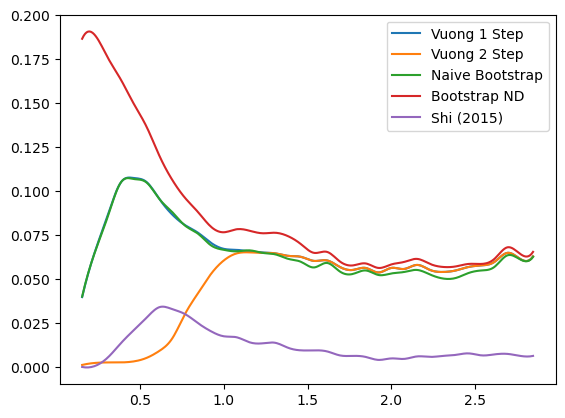

In [5]:
def create_fig(params,res,name='test.png'):
    results2 = np.array(res)
    
    col_labels = ['Param','Vuong 1 Step','Vuong 2 Step', 'Refinement Test','Shi (2015)', 'Naive Bootstrap','Bootstrap TIC','Bootstrap ND']



    np_results = np.concatenate((params.reshape(params.shape[0],1),results2[:,:,0]),axis=1)
    df_results = pd.DataFrame(data=np_results,columns=col_labels)
    df_results.to_csv("paper_figs2/"+name[:-4]+".csv")
    
    ma2 = lambda x : np.convolve(x,np.ones(smoothing)/smoothing, mode='valid')
    params_new = np.linspace( ma2(params).min(),  ma2(params).max(), 300) 
    interp = lambda x: make_interp_spline(ma2(params), ma2(x), k=3)(params_new)


    plt.plot(params_new, interp(1-results2[:,0,0]) ,label='Vuong 1 Step')
    plt.plot(params_new, interp(1-results2[:,1,0]) ,label='Vuong 2 Step')
    
    if not skip_boot:
        plt.plot(params_new,interp(1-results2[:,4,0]),label='Naive Bootstrap')
        plt.plot(params_new,interp(1-results2[:,6,0]),label='Bootstrap ND')
        
    if not skip_shi:
        plt.plot(params_new,interp(1-results2[:,3,0]),label='Shi (2015)')

    plt.legend()
    plt.savefig('paper_figs2/'+name,dpi=300)
    plt.show()

name = 'size_nobs%s_c1%s_c2%s_trials%s.png'%(nobs,c1,c2,trials)
create_fig(betas,results,name=name)

# Power stuff

var//varnd//right//left 5.327417113042895 95.61279388957296 49.58139100625987 49.15248809819689
-0.11018195442625861 0.051393614770945506 0.10661101080559228
-0.11062930015412746 0.051393614770945506 0.10616163158313655
---
var//varnd//right//left 0.11659819808756215 118.27183917059037 -13.849776036057337 -14.340936614071262
-0.0017039203858527422 -0.011878801738297348 0.0020756298323558924
-0.0021192176768421154 -0.011878801738297348 0.0016603457098221246
---
var//varnd//right//left 3.198610291183497 75.5298713831425 13.855219439164692 13.460449983145766
-0.07808620209374098 0.018218259913808075 0.0856224082792797
-0.07860679345489423 0.018218259913808075 0.08509907864988327
---
var//varnd//right//left 0.4870968455109396 154.20039510583004 -14.44781519190785 -15.022453450356307
-0.005800132651826045 -0.009703204942064387 0.006457877177289584
-0.006172724457101128 -0.009703204942064387 0.006085151957062838
---
var//varnd//right//left 1.2767822693661883 108.29583310657367 -10.2676398688

var//varnd//right//left 0.8994723486016621 94.83102406247761 -10.048866141472562 -10.48899631318706
-0.018607907595369674 -0.01098607372825594 0.018511412471345776
-0.01907202779890523 -0.01098607372825594 0.0180470482838015
---
var//varnd//right//left 0.13078049932319755 84.26166775550513 -11.14194667455191 -11.551205281506402
-0.0027846345712391665 -0.013505519029179996 0.003369904679123731
-0.003270164907340535 -0.013505519029179996 0.0028842792952073096
---
var//varnd//right//left 3.7101394590788357 147.89849490862105 7.6562667265489965 7.104539775440879
-0.05202562501718531 0.005826519949007693 0.046467227114808385
-0.052398688953498154 0.005826519949007693 0.0460936035035115
---
var//varnd//right//left 2.3628173652588353 139.69993621477764 -4.206672495852319 -4.734602051255499
-0.033907762091299795 -0.0031497536369059875 0.03342845895521901
-0.03428562857612264 -0.0031497536369059875 0.03305114175255805
---
var//varnd//right//left 3.3054150799825552 91.7421641520685 8.92329954921

var//varnd//right//left 3.981911278697851 82.72031938767091 23.38801552143323 22.980312529895496
-0.10053385289703752 0.031020876611100118 0.08652175340106992
-0.10102733268774541 0.031020876611100118 0.08602788987378147
---
var//varnd//right//left 0.40081773775749246 93.39660216419024 -11.10404739679524 -11.543071640844985
-0.008046684892456394 -0.012153073636987676 0.008439150673186813
-0.00851698298781824 -0.012153073636987676 0.007969136178180092
---
var//varnd//right//left 0.9732281439818237 94.62546403537819 -10.173147555210635 -10.619115458632681
-0.019121120991577648 -0.011527897087239069 0.02052706916925735
-0.019592459478049697 -0.011527897087239069 0.02005624381736143
---
var//varnd//right//left 3.665861282637573 135.26663799979383 7.987462355904678 7.4613864618424035
-0.050923361500625826 0.005772731767850958 0.053919262343287554
-0.05131244805223404 0.005772731767850958 0.053529391400565576
---
var//varnd//right//left 0.9713776548136612 95.75361754592946 -10.51430957944752

var//varnd//right//left 2.5284369149759094 116.48827578908721 -0.5420587892376616 -1.0395307709898298
-0.04569511707848669 -0.000549461941331981 0.04400266611903166
-0.046121801094136695 -0.000549461941331981 0.04357480224111766
---
var//varnd//right//left 0.14414996187103646 93.51563358591602 -11.610176153103849 -12.05470787978354
-0.0029482304564507444 -0.01263753959002337 0.003457863775928338
-0.003423565327432359 -0.01263753959002337 0.0029824852592827238
---
var//varnd//right//left 0.1599345260044833 79.48969216331486 -10.71693415525733 -11.118391064153005
-0.0036090365098432184 -0.013700767793558917 0.004384051735128716
-0.004114125099185218 -0.013700767793558917 0.0038790067099886455
---
var//varnd//right//left 2.1506741271868206 186.45282553527846 -10.747123595053841 -11.368114251442377
-0.02367052928246147 -0.00603750791997496 0.0229214144164837
-0.024003951466235986 -0.00603750791997496 0.022588284951807706
---
var//varnd//right//left 0.7144135623217609 102.77903619953335 -11

var//varnd//right//left 0.20348151288503313 104.23523041830224 -12.59590929659007 -13.065569859895643
-0.0035720707575950914 -0.012239743697138063 0.004139964274536676
-0.00402257307068799 -0.012239743697138063 0.0036893424679816517
---
var//varnd//right//left 1.9735734642508072 92.18738376508915 -3.2042502764678256 -3.631066615945318
-0.0411608453604226 -0.0035733874945984723 0.03988366367771718
-0.04162430014459623 -0.0035733874945984723 0.03942135903914399
---
var//varnd//right//left 3.179804187941621 82.68086867795284 12.014684374038021 11.61494626246797
-0.07654184746825612 0.015006394986705906 0.07628728486686352
-0.07702139858778932 0.015006394986705906 0.07580590801462218
---
var//varnd//right//left 0.887731465864441 108.08224386010757 -12.130883820822715 -12.593637149789094
-0.016383555132823194 -0.011339162191665933 0.015537708401347715
-0.016811326553961253 -0.011339162191665933 0.01510915999254418
---
var//varnd//right//left 2.4563428193752026 111.95941232891789 -1.71982184

var//varnd//right//left 1.4401200214743197 99.98596114104548 -10.415488823821681 -10.870731768287035
-0.030163613719306377 -0.009965641997215 0.030650322224722026
-0.030618656458720944 -0.009965641997215 0.03019509795540086
---
var//varnd//right//left 2.6534546071263936 63.46116439860208 9.106917998031058 8.748271838036299
-0.08006778139254178 0.01361602326501269 0.08759073416836964
-0.08063484888717774 0.01361602326501269 0.08702618255670976
---
var//varnd//right//left 4.534098273220906 100.01199851755203 31.730983391326365 31.278478113250546
-0.08715370851992406 0.031471081969516014 0.08967514398377283
-0.08760817955665101 0.031471081969516014 0.08922453447153371
---
var//varnd//right//left 5.15906413599666 98.08961851891088 43.586493389079806 43.148115471125514
-0.10170248869931686 0.045030330601820205 0.10088756942481478
-0.10214921146849983 0.045030330601820205 0.10044096603026716
---
var//varnd//right//left 3.225297463580149 107.19183320196652 9.84971791019952 9.38905130677772
-0

var//varnd//right//left 0.6089113335596779 77.7339401600642 -9.812892885594406 -10.209114020763023
-0.01485478568300559 -0.013194610413716274 0.016065778664173046
-0.01536407805187105 -0.013194610413716274 0.015556273311497728
---
var//varnd//right//left 0.9520996150389013 102.41132800493874 -11.72720907452262 -12.192319435344867
-0.017494710023058694 -0.011941960341957563 0.018747360310363777
-0.01794894548461629 -0.011941960341957563 0.018293035127071065
---
var//varnd//right//left 2.1976278861015044 135.31900896442386 -4.4957730162148035 -5.020800133884291
-0.030617578732295803 -0.004055690568135973 0.03487162953819576
-0.031005188936361533 -0.004055690568135973 0.03448401459698911
---
var//varnd//right//left 1.585577026578625 112.58497105533263 -7.165885228733452 -7.636106109954566
-0.026688286885048224 -0.00708098489506596 0.02704644342887895
-0.02710523379104125 -0.00708098489506596 0.026628467957407816
---
var//varnd//right//left 1.4721099672337887 124.13499394573641 -11.2030882

var//varnd//right//left 4.904270361703672 126.38816943942383 29.828322046086832 29.310793928692956
-0.08083859007970104 0.024685294768126448 0.07669795808250984
-0.08124907611288999 0.024685294768126448 0.0762885723548226
---
var//varnd//right//left 0.5110300216203467 111.70746891219235 -12.224124470789844 -12.69720667759357
-0.00883410911739163 -0.011081740283237251 0.009374935866598785
-0.009257432538812211 -0.011081740283237251 0.008951120974358738
---
var//varnd//right//left 1.4506741583385847 92.59624980826817 -7.305576296204239 -7.738857573509501
-0.03203039359135228 -0.0078953744455129 0.030674791262785446
-0.032498185250061346 -0.0078953744455129 0.03020611807364602
---
var//varnd//right//left 6.553341038901691 85.69300742010007 84.04469538738368 83.64360386961864
-0.14843760010809884 0.10187142226565737 0.14167784280333767
-0.14890496128236283 0.10187142226565737 0.14121100074540527
---
var//varnd//right//left 0.4817379882821814 79.64132034208254 -10.011487610891752 -10.416967

var//varnd//right//left 0.5080633428744471 71.69292771260268 -11.24905123726456 -11.640227151183435
-0.015182233682908506 -0.015700002896851306 0.014100873618110575
-0.015727232882361088 -0.015700002896851306 0.013555230608303707
---
var//varnd//right//left 5.07904002415954 120.4543807912567 36.17813463623957 35.68460201746812
-0.08115848056222627 0.02973439771977502 0.08264711079324827
-0.08156786186048824 0.02973439771977502 0.08223981437682729
---
var//varnd//right//left 3.4137616455911703 92.21292517369014 12.926750554357568 12.495348251814532
-0.07755891832662634 0.014378163598161879 0.06986315389791985
-0.0780252227188095 0.014378163598161879 0.06939479560317373
---
var//varnd//right//left 1.5134428597345877 102.66117669920814 -8.303043956306094 -8.76432956178155
-0.02874907610045968 -0.00754671066734931 0.028219981812025154
-0.029198025841645586 -0.00754671066734931 0.027770570177332917
---
var//varnd//right//left 0.680062417107295 87.8904071979148 -9.54137235239358 -9.965212004

var//varnd//right//left 1.7787390976298274 96.5608548080635 -5.147768775632229 -5.59810568813633
-0.03462794071259415 -0.005436898238411632 0.03817980044866894
-0.03509518346572299 -0.005436898238411632 0.03771288513425481
---
var//varnd//right//left 3.102876349969827 92.66464373772413 5.503133582452881 5.07853516542412
-0.06845771112870182 0.00804080069674962 0.06340794028609648
-0.06891520724807786 0.00804080069674962 0.06294956849174342
---
var//varnd//right//left 4.187518680075704 52.66973092350338 44.27182911186596 43.95249587325813
-0.15606987273887798 0.08113883558585279 0.16053339041696582
-0.1566757868725609 0.08113883558585279 0.1599221373105105
---
var//varnd//right//left 2.9652858715247548 78.0587711062318 10.816447868091178 10.420809992560185
-0.07100010124033655 0.011914793997950823 0.07734230644172127
-0.0715079503140905 0.011914793997950823 0.07683605810832199
---
var//varnd//right//left 1.4917151449196913 118.10077611981293 -8.333547772178699 -8.827343938373469
-0.0255

var//varnd//right//left 0.5419685768863043 92.69787276836982 -10.62096845413157 -11.056689931367425
-0.011198060080810944 -0.011788057370680222 0.011284906586512176
-0.011668031456939992 -0.011788057370680222 0.01081497294375251
---
var//varnd//right//left 2.6105891098519343 99.82540881314385 2.193097923405059 1.7370987232706685
-0.050694204148587656 0.0014126341565068891 0.05059030859117087
-0.051151439578558666 0.0014126341565068891 0.05013310050545883
---
var//varnd//right//left 1.988917880479394 88.642122528862 -1.97851622039812 -2.3974616503464095
-0.043583480710709215 -0.003643340578696807 0.04614131527462067
-0.044057170261978224 -0.003643340578696807 0.045668477173542714
---
var//varnd//right//left 0.9149547936238435 123.09278467689818 -11.304122556297607 -11.812567023824606
-0.013457401535332798 -0.00978650284293848 0.015839913990261505
-0.01387038232084095 -0.00978650284293848 0.015426525437943225
---
var//varnd//right//left 2.75247766400764 103.03747277525792 3.2187346572272

var//varnd//right//left 4.85152595663016 94.4716453404528 38.6861216224372 38.24573576999155
-0.0959416595711336 0.04129226612173292 0.10131968028719658
-0.09640748463256428 0.04129226612173292 0.10085484293463831
---
var//varnd//right//left 3.552854209582464 80.82980299493191 18.126161268636466 17.726193238013796
-0.08378105397224106 0.022751379841799108 0.08520789257222726
-0.08427671325346767 0.022751379841799108 0.08471453576999868
---
var//varnd//right//left 0.6648110860956874 130.0299618715198 -12.92426572808748 -13.446808710986566
-0.00944200810034434 -0.010184929495750828 0.00978352201309516
-0.009843930381315346 -0.010184929495750828 0.009381727862756477
---
var//varnd//right//left 2.1822475938682055 77.98956445385384 0.9880098867499596 0.5953324774296871
-0.054691542663779125 0.0006883515354387434 0.056546934619847236
-0.05519404582303744 0.0006883515354387434 0.05604515602754773
---
var//varnd//right//left 5.226291506637231 89.78402948093013 47.15984910562689 46.730885964211

var//varnd//right//left 2.6450055277579563 75.14106296472319 6.928380345362724 6.536851862493795
-0.07036325728132542 0.008448675522701135 0.06598632255366198
-0.0708851277244498 0.008448675522701135 0.06546386150045638
---
var//varnd//right//left 2.036810421607871 111.18231793734385 -5.448961179128926 -5.924435106034001
-0.036470535891316984 -0.004061574052151199 0.036128560064575564
-0.036898349230499915 -0.004061574052151199 0.035701004433552765
---
var//varnd//right//left 1.070660580271057 114.42822421946866 -10.116748511391348 -10.603312776145671
-0.015744384391389477 -0.009490753140726881 0.01878019061295136
-0.016169862360288396 -0.009490753140726881 0.018355130399482434
---
var//varnd//right//left 3.5608721386160433 72.74812884645705 21.633778118785543 21.24305845514172
-0.09442476398673237 0.028882521509749397 0.0957207380451989
-0.09495922310455158 0.028882521509749397 0.09518413678938392
---
var//varnd//right//left 0.9010466816029298 161.82152658476323 -14.29014562220492 -14

var//varnd//right//left 3.3266786711138523 116.7397513809216 6.914841594350552 6.441242845854633
-0.055199074979515074 0.006739799216936963 0.05405898170478547
-0.05560485783879781 0.006739799216936963 0.05365239363860133
---
var//varnd//right//left 2.633008631194018 95.53442319634323 3.0428251876827046 2.6102788672919397
-0.053807324145525554 0.0031013154624536434 0.052227576177874734
-0.054261442971055916 0.0031013154624536434 0.05177373931911881
---
var//varnd//right//left 2.16125583345403 126.76222812300027 -4.809587608282707 -5.32153242168108
-0.03221849644703726 -0.003909162819906498 0.03315848697867166
-0.03262262926229172 -0.003909162819906498 0.0327547578579206
---
var//varnd//right//left 2.0571985056130178 96.27138234956968 -3.0658062723661526 -3.5114530757244373
-0.03976914863057809 -0.0031006225332688236 0.03979615637929746
-0.040231782337832186 -0.0031006225332688236 0.03933343663907469
---
var//varnd//right//left 2.749199939256383 85.75065616652175 4.722689910869581 4.313

var//varnd//right//left 0.024980934502720025 90.09391670374283 -11.251171402181688 -11.688229260705599
-0.0002614056903851964 -0.012722724463654494 0.0007782112088880145
-0.0007465264557183736 -0.012722724463654494 0.00029310500052247816
---
var//varnd//right//left 0.7640841309723182 109.37668362996642 -11.084904464484284 -11.558749256410302
-0.013717542810315309 -0.010403883047500596 0.012725846597094826
-0.014150960430122598 -0.010403883047500596 0.012292854777914676
---
var//varnd//right//left 4.122589729484653 59.3687936314208 37.3346291524133 36.98709838642471
-0.13650130743454159 0.0627039062181049 0.13656290004657756
-0.13708622424880906 0.0627039062181049 0.13597630273358727
---
var//varnd//right//left 0.19878283897400853 153.9921954820849 -14.810741309171894 -15.37753610712746
-0.002445025248575837 -0.009799554888088789 0.0028684941021966787
-0.0028130827009964585 -0.009799554888088789 0.002500404504466001
---
var//varnd//right//left 2.339645408760635 95.73578372979694 -0.0684

var//varnd//right//left 0.332229772972369 125.48781560118876 -13.06196541163347 -13.57239798889124
-0.004703613596185904 -0.010652082990061684 0.005400017296826091
-0.005110434705007102 -0.010652082990061684 0.004993268851302313
---
var//varnd//right//left 0.4141611717044346 70.7218391832314 -9.600049929135075 -9.977920940397947
-0.011622072234520707 -0.013731019502425534 0.012654467396547272
-0.012156368802114194 -0.013731019502425534 0.012120238067430256
---
var//varnd//right//left 1.7389418179627323 79.21037551472268 -3.6050880422330303 -4.013630869618902
-0.04554144772320012 -0.0045551486666082 0.04418239934729857
-0.04605676983890486 -0.0045551486666082 0.043665925098213904
---
var//varnd//right//left 1.017010833575922 92.83075130483334 -9.426050295074784 -9.862711444346608
-0.022200275613222846 -0.010098955176611078 0.02053961696821311
-0.022670677510802987 -0.010098955176611078 0.020068804310052576
---
var//varnd//right//left 3.3683269693603863 144.71156041363074 4.3364368214729

var//varnd//right//left 1.1194388003765565 97.83590328952356 -10.110065131795887 -10.560886493886107
-0.021778840514681753 -0.009896910890086546 0.020676975440222192
-0.022239200502233245 -0.009896910890086546 0.020216235032909247
---
var//varnd//right//left 0.33399888911894415 92.07211406340845 -11.677905333817026 -12.122180820623555
-0.007348062182488405 -0.01283721323649277 0.007131079936893192
-0.007830622281370393 -0.01283721323649277 0.006648669552324436
---
var//varnd//right//left 1.2325796802885742 77.06049459823893 -8.209853910676015 -8.606998371050574
-0.03200587692567948 -0.009629852094225587 0.030614893256832983
-0.032520981149524744 -0.009629852094225587 0.030098548892474174
---
var//varnd//right//left 0.18317204603951462 98.49713490316836 -11.6249824048485 -12.073057235063155
-0.003431161936406616 -0.012104004088685989 0.004032827336485335
-0.0038860677396917328 -0.012104004088685989 0.0035778754101625098
---
var//varnd//right//left 4.602069751381816 135.76002345596487 20

var//varnd//right//left 3.132216396087551 123.70302866205486 2.902359554097184 2.402967573301231
-0.04732875884912551 0.0031968273783050966 0.047368522220163994
-0.0477336078639437 0.0031968273783050966 0.04696420604981138
---
var//varnd//right//left 3.7489443939708598 77.78006144945827 24.581176902292047 24.19120289439715
-0.08680401185279385 0.029535909885749157 0.09098377988851523
-0.08730678940623363 0.029535909885749157 0.0904833823180705
---
var//varnd//right//left 2.6926239788699395 141.6910354524784 -0.35281525166058375 -0.8893345559459233
-0.03542912215350112 -0.001341437063548848 0.03762995549354805
-0.03580824901855655 -0.001341437063548848 0.03725241960340982
---
var//varnd//right//left 1.2480576468114835 95.70004077812351 -9.449746152366872 -9.884764806543243
-0.02573877559571025 -0.009730676685848323 0.02638925097373187
-0.026193926847501384 -0.009730676685848323 0.025935057047637655
---
var//varnd//right//left 1.4419254255471714 85.8689938715073 -6.113149653460219 -6.537

var//varnd//right//left 1.6927112658827723 114.28543849229854 -6.450644398237874 -6.931652290734524
-0.028522325683956143 -0.006475726490654128 0.02943850626222858
-0.028943210804054008 -0.006475726490654128 0.029017838387556942
---
var//varnd//right//left 0.487551174221726 74.34577103144396 -10.122985846715368 -10.50727198755606
-0.01217408542745832 -0.013791916802846256 0.01188150543357415
-0.012691026691556681 -0.013791916802846256 0.011364446681394703
---
var//varnd//right//left 1.1104633709585674 56.28859425035781 -5.318807056041378 -5.6616749386096235
-0.03960279581702119 -0.010417932659594956 0.039469150886068866
-0.040212418593730696 -0.010417932659594956 0.038860591932179715
---
var//varnd//right//left 1.2575757496087996 66.87345332249201 -5.289095076344003 -5.65989548075366
-0.03459861680410178 -0.008319752419904796 0.03653285958394229
-0.03515338037981661 -0.008319752419904796 0.035978869447595804
---
var//varnd//right//left 1.5678281535613805 92.00606071542508 -6.4019161329

var//varnd//right//left 0.12543881575306173 134.77200382998427 -14.172010129769719 -14.702827415485613
-0.0015736347361608722 -0.01071472314550883 0.0020878317913282807
-0.001967515048348633 -0.01071472314550883 0.0016939624235103182
---
var//varnd//right//left 1.9590156568954085 194.15048019519097 -10.949075627093299 -11.582177722043872
-0.020310083295074645 -0.006049477797203639 0.01991230398359337
-0.02063628510620057 -0.006049477797203639 0.019586607595782415
---
var//varnd//right//left 0.24736839792023177 80.43803018076727 -10.490717625529234 -10.889797885737368
-0.005636415387992148 -0.013289169097651167 0.006322619125117306
-0.006132603995153537 -0.013289169097651167 0.005826695608730067
---
var//varnd//right//left 2.411520583365879 99.05276105153166 0.6457076424632094 0.1959790238884289
-0.04763659739054552 -0.0006639318847143948 0.0483238719824303
-0.048090634244742705 -0.0006639318847143948 0.04786994621260521
---
var//varnd//right//left 0.5103642350585602 102.24372720984297 

var//varnd//right//left 1.7334484750441024 58.17091459765338 -1.3273119730603085 -1.6706360257296387
-0.06148639933805818 -0.0014790472754911508 0.05608381723805631
-0.06207650469644459 -0.0014790472754911508 0.05549467362965933
---
var//varnd//right//left 1.9195118899956574 51.82416190765964 2.851223005453834 2.531584524549556
-0.06940624475622911 0.004020824204442456 0.07408110711307517
-0.07002229766014012 0.004020824204442456 0.07346033275053175
---
var//varnd//right//left 0.7342813171461698 95.575748630292 -13.231806066705458 -13.670805860423554
-0.014724386438143815 -0.014169842143767883 0.015053414281077551
-0.015184029515342411 -0.014169842143767883 0.014594114852877756
---
var//varnd//right//left 4.177183377682175 158.80147376192866 11.600078848869234 11.026241549532749
-0.05113932302914641 0.008566817505889779 0.050713407113097145
-0.05150052019690015 0.008566817505889779 0.05035154807503888
---
var//varnd//right//left 1.29030532391815 204.53750522565218 -16.265174003216536 -

var//varnd//right//left 1.7696993607468912 97.2926518294575 -6.587693428046679 -7.043015633836801
-0.03622795103283953 -0.005627194548059809 0.03689211194277556
-0.03669577841284724 -0.005627194548059809 0.036423629539642684
---
var//varnd//right//left 3.647553187147025 106.47271592731742 11.450186472303209 10.995696999903092
-0.0741017916387963 0.011013204462778096 0.07080840035660868
-0.07452942180008769 0.011013204462778096 0.07038195991503865
---
var//varnd//right//left 0.37595846715194237 106.3524093490589 -11.831259205273385 -12.299887450696358
-0.00679000193151471 -0.01156298243613419 0.007632606553434221
-0.007230579576032822 -0.01156298243613419 0.007192016239566496
---
var//varnd//right//left 0.17509012101057467 115.87630699941198 -12.654687413649267 -13.150599827331824
-0.002836086469539115 -0.011149254684021647 0.0032140580389198705
-0.003264040762936537 -0.011149254684021647 0.0027860751117100998
---
var//varnd//right//left 2.2206812957511612 103.94082007646648 -3.20947535

var//varnd//right//left 0.3572373028529126 73.70834523629763 -12.3758426301012 -12.770271559758921
-0.00918240187425821 -0.016988054247093275 0.00917156898017912
-0.009717373127751871 -0.016988054247093275 0.008636717756972369
---
var//varnd//right//left 5.568902135508887 102.16055743336803 54.29620556483571 53.84598639905756
-0.10373456425691294 0.05128029940125866 0.11920651137058108
-0.10417260255060755 0.05128029940125866 0.1187666227268805
---
var//varnd//right//left 0.26813451992395787 114.83071260938087 -12.715141560636313 -13.202478109135013
-0.0047457656629052245 -0.011260023035871052 0.004779724423076824
-0.00517009756592385 -0.011260023035871052 0.0043552587663154875
---
var//varnd//right//left 1.4470319338693889 76.4554424677708 -5.581519443734995 -5.977807179466264
-0.03801750501896056 -0.006921468764646894 0.034854560926330984
-0.03853576627553886 -0.006921468764646894 0.03433621770891314
---
var//varnd//right//left 1.6927436064349806 122.46970907853431 -7.561870356674254

var//varnd//right//left 0.6085282561262941 56.474979621676304 -7.702270790049789 -8.041714169361128
-0.022035256738717677 -0.013890515361210842 0.021023859801668782
-0.02263554250820285 -0.013890515361210842 0.020423529096675507
---
var//varnd//right//left 0.5498813235834005 60.345434814293206 -8.245885939577013 -8.60200879707727
-0.016784211303607407 -0.014036361535035175 0.018700651756359137
-0.017374593657672202 -0.014036361535035175 0.018110507765308828
---
var//varnd//right//left 2.766750980554429 78.60807275539831 8.028006250490769 7.637309968137419
-0.06466766138077108 0.009461707306429135 0.06587516929601069
-0.06516486390049357 0.009461707306429135 0.06537614350511294
---
var//varnd//right//left 0.4338644650319643 107.83494744947568 -12.257213996207524 -12.741208376811509
-0.007376916016120877 -0.011625716887556897 0.007907368305513267
-0.007825670361710559 -0.011625716887556897 0.007458324531582775
---
var//varnd//right//left 2.907637410925744 110.03638991237256 3.26029131080

var//varnd//right//left 2.7653631563590713 92.12198275635922 6.146087421634109 5.712002828641187
-0.0560103064584645 0.004354239990332377 0.06344208637057025
-0.05648155799882075 0.004354239990332377 0.06297196728101469
---
var//varnd//right//left 5.166492103052091 85.5171503366148 52.55829781281391 52.14562397123818
-0.11607861254016347 0.0579809795716343 0.11312225122480148
-0.11656197254987292 0.0579809795716343 0.11263724077051836
---
var//varnd//right//left 1.8358654188960914 172.51665907672623 -11.111894551276558 -11.720648146679373
-0.023171417534783727 -0.006355888976749921 0.020828689114379843
-0.0235244695272704 -0.006355888976749921 0.020475461163447898
---
var//varnd//right//left 1.9130844272418632 88.29249664692654 -5.377111025489762 -5.798622396450136
-0.04242508801907918 -0.006577192867748919 0.04205849267746999
-0.04290080729137845 -0.006577192867748919 0.041580390692458384
---
var//varnd//right//left 2.50586243881174 87.75101585631614 -0.41726884615834253 -0.8418467611

var//varnd//right//left 3.925513821840924 91.17430216665613 19.891489444183346 19.4571260310625
-0.08860359867183745 0.023963940497165864 0.07923092105966462
-0.08907982900309393 0.023963940497165864 0.07875442895346316
---
var//varnd//right//left 4.067742848882457 131.9342888173809 18.45662860755399 17.938126540554315
-0.05935384068596004 0.012077892804164615 0.06753782783900734
-0.05974715060727374 0.012077892804164615 0.06714410100690862
---
var//varnd//right//left 5.762355814586362 155.5885427248223 43.15316221945607 42.599285596371274
-0.066263618451441 0.025797995941848072 0.0733078904621822
-0.06661930262642225 0.025797995941848072 0.0729522896730126
---
var//varnd//right//left 1.5851105090218653 93.2886443861107 -5.9984671564784255 -6.425568919327269
-0.03260812023456474 -0.006507250745903306 0.03639613729567034
-0.03306642563060811 -0.006507250745903306 0.03593869978080496
---
var//varnd//right//left 0.30465413184586787 54.21663996882184 -9.00338963299401 -9.345159085523552
-0

var//varnd//right//left 2.399426376582599 105.35063080547647 -0.8055246518527146 -1.2704722495819014
-0.04371940487374752 -0.00128376401720845 0.044950480157961374
-0.044161426601957224 -0.00128376401720845 0.04450774694761961
---
var//varnd//right//left 2.7490298856797923 112.22903937984688 1.2510356605313366 0.77036140563865
-0.0488218067238464 0.0010339281756354044 0.04776313411772807
-0.04925048609154409 0.0010339281756354044 0.04733537719602713
---
var//varnd//right//left 0.31279693921199986 77.52378866689514 -10.274379260724366 -10.670550716192569
-0.007754430530847523 -0.013536047231446822 0.008046662599688533
-0.008265616877601807 -0.013536047231446822 0.007535485211262269
---
var//varnd//right//left 1.8053864528358516 90.22031158722528 -4.224294170401925 -4.646937758212047
-0.03771697360115081 -0.004961175026635862 0.04075935799305144
-0.038185603575645995 -0.004961175026635862 0.040290817722575416
---
var//varnd//right//left 3.368095494831572 160.80063072991987 3.951614503140

var//varnd//right//left 1.5131274702259143 81.31433450366221 -4.77235473236687 -5.177626938720161
-0.035697136562016264 -0.006802652023981071 0.03918092884662647
-0.03619622720770838 -0.006802652023981071 0.038683106334505085
---
var//varnd//right//left 3.1130929236216884 99.9823669066384 9.917545131120969 9.46969619937149
-0.057971199341741345 0.007957407574751694 0.05994662645643767
-0.058418448907639406 0.007957407574751694 0.05949792648692255
---
var//varnd//right//left 0.5316042155644385 67.46202782699257 -9.318040371918405 -9.691832386945228
-0.01533715145940206 -0.01376771187945447 0.015309450210291602
-0.015891332531453504 -0.01376771187945447 0.01475519958118035
---
var//varnd//right//left 0.9261369719528438 53.752681105997674 -6.93008411118897 -7.266222269800163
-0.032014557231975514 -0.013381714519254666 0.034246384914837516
-0.03263977472267196 -0.013381714519254666 0.033621304096494276
---
var//varnd//right//left 0.6279405072658774 126.38191226656241 -13.548232477846328 -1

var//varnd//right//left 3.7870633133694462 65.6063718548663 27.146009198163448 26.785372413418173
-0.11252337027199516 0.04233754006445846 0.10748738845911533
-0.11307216040656967 0.04233754006445846 0.10693870644732663
---
var//varnd//right//left 0.8953178239196602 103.10578772742123 -11.178417394214597 -11.640147887467592
-0.016302768162657716 -0.010916173567710014 0.01686611040913057
-0.016750745306028412 -0.010916173567710014 0.016418100245648836
---
var//varnd//right//left 4.201571552437559 117.54732962836654 20.223353879243675 19.736106472155793
-0.07226039816648323 0.016853541510576605 0.07513323072461822
-0.07267393788268657 0.016853541510576605 0.07471863903292827
---
var//varnd//right//left 1.782545042731289 127.0515691956364 -7.217665163815998 -7.723035917844718
-0.02767022555595563 -0.006231866645011957 0.027131940283116433
-0.02806759152688765 -0.006231866645011957 0.026734449976606227
---
var//varnd//right//left 0.48960561294361293 79.85007816481331 -10.762796362116783 -1

var//varnd//right//left 2.1597917277492678 132.67622825843347 -6.5418263261565786 -7.069788142727592
-0.03318647645818544 -0.004482069871449747 0.031991356539293164
-0.033584252649940666 -0.004482069871449747 0.03159378385422857
---
var//varnd//right//left 3.2382937845401703 98.62711131118311 10.225438965557686 9.77419370175696
-0.06891957537390166 0.010331846636151736 0.06274037093119039
-0.06937499642635306 0.010331846636151736 0.062283163316602365
---
var//varnd//right//left 3.535970524525398 123.79881952472826 7.892830854443271 7.384645892374583
-0.05521720154654178 0.006892559238630527 0.051851423679896994
-0.055627493760090393 0.006892559238630527 0.05144099241424862
---
var//varnd//right//left 1.7090112453608695 125.5077993114555 -8.40301098680322 -8.91347736530545
-0.029393729907220868 -0.006531092131679172 0.027812026524999988
-0.029800560790682575 -0.006531092131679172 0.027405808656980564
---
var//varnd//right//left 2.164951887520425 120.53297908176229 -4.360599286310099 -4.

var//varnd//right//left 3.862208519414298 150.76339310869662 9.946030888672965 9.39168733756891
-0.04738850897951713 0.006255104965978018 0.0550138518239915
-0.04775683547597789 0.006255104965978018 0.05464663310396709
---
var//varnd//right//left 3.04710762833459 108.95359236722977 5.141319407690454 4.661198675864615
-0.05609988086297079 0.00500679980265499 0.05461189255142145
-0.056540370810925666 0.00500679980265499 0.05417060260304139
---
var//varnd//right//left 5.140398968927304 102.31627250140403 42.353091681411726 41.909322809695624
-0.10340965711969721 0.04214736780872096 0.09810196557613687
-0.1038409179384312 0.04214736780872096 0.09766953570450776
---
var//varnd//right//left 2.8383628572408943 68.77940948811991 10.71926814431632 10.35231521183791
-0.07872217104084324 0.013869991964039928 0.08377030362333689
-0.07925406678056343 0.013869991964039928 0.0832354890265862
---
var//varnd//right//left 3.2294400374967034 131.67766484041027 5.351602045544876 4.823611111370574
-0.04626

var//varnd//right//left 0.2844807325331248 95.12502096326797 -11.311656629562712 -11.752426750916792
-0.005625117827723578 -0.012123124014794422 0.006194253961488588
-0.006088541194177868 -0.012123124014794422 0.005731015308086097
---
var//varnd//right//left 0.6687588199415289 112.43433171266501 -11.792550300306777 -12.281369802937796
-0.011466837166630352 -0.0107506802190874 0.011680732390070867
-0.011901420604235116 -0.0107506802190874 0.011245900551715524
---
var//varnd//right//left 1.2044510279855918 190.6203385538308 -14.802190598478496 -15.438863018074258
-0.012986283507157572 -0.007895445691891314 0.012753275069239574
-0.013320400086042277 -0.007895445691891314 0.01241925523954002
---
var//varnd//right//left 3.1776652590681977 75.83015782424022 14.81088309498605 14.425466511249905
-0.07963618338961918 0.01831243860249473 0.08067549712446057
-0.08014461848907531 0.01831243860249473 0.0801671531782161
---
var//varnd//right//left 1.1571552014828963 87.70191194870844 -8.466151936540

var//varnd//right//left 0.8144484372701966 127.79224998265161 -12.629267765655408 -13.137667038626233
-0.012087296413052265 -0.009834793101001719 0.012965650632369648
-0.012485470428782895 -0.009834793101001719 0.01256786176046277
---
var//varnd//right//left 2.283965227594616 90.39796930325797 -2.68086497988746 -3.1111921605831605
-0.047474240100934394 -0.0030731298243337666 0.048188463899160594
-0.04795011921103684 -0.0030731298243337666 0.047713527794805644
---
var//varnd//right//left 2.0286413882127508 65.22252550565783 1.6118113527378592 1.2484449110665181
-0.057285122825115026 0.0003713794556413336 0.06003889201921933
-0.057841486562293584 0.0003713794556413336 0.05948065916624403
---
var//varnd//right//left 2.2850487227536203 101.39381174005402 -2.5474597436325013 -3.0043080892756344
-0.045464402109827357 -0.0014590319943025782 0.04169228955283029
-0.045915254621665895 -0.0014590319943025782 0.04124192480649769
---
var//varnd//right//left 2.119270766181274 106.3251309431758 -2.50

var//varnd//right//left 0.2586844359598155 105.45247511881826 -13.156254605775297 -13.63663421684461
-0.004559429710327057 -0.012721588694464079 0.005291343691748829
-0.005015000573883107 -0.012721588694464079 0.004835833666935456
---
var//varnd//right//left 2.4928200800554405 92.01037660011626 1.5888477378948949 1.1606539123358794
-0.055898207986849566 0.001825303387225599 0.05416783635168157
-0.056363518918279544 0.001825303387225599 0.05370278199336291
---
var//varnd//right//left 0.05630079415161994 149.0993663085355 -14.724093912095299 -15.266096555350206
-0.0005775264303296918 -0.010048639756345573 0.0008895351003206396
-0.0009410525928255973 -0.010048639756345573 0.0005260055323083664
---
var//varnd//right//left 5.842238183313257 122.19600026530385 50.44319148342368 49.95433561680429
-0.0923087734785491 0.04153198865847881 0.08930259799640583
-0.09270935495809181 0.04153198865847881 0.08890275900690452
---
var//varnd//right//left 1.0221229311741618 81.55564789145275 -8.1701108037

var//varnd//right//left 1.8349302899406117 79.08434765920227 -3.8786422258511575 -4.269842006073124
-0.043906537970109544 -0.005359045709348316 0.046960194869628234
-0.044401702415256004 -0.005359045709348316 0.04646602884747334
---
var//varnd//right//left 3.2539051858983172 88.27729842053105 11.174751689076865 10.748812360719706
-0.07242472709824392 0.012516834403291382 0.07034831938843195
-0.0729062011105523 0.012516834403291382 0.06986599063736526
---
var//varnd//right//left 1.8355578552535332 68.05019420086855 -3.2207732490639973 -3.5836537138883524
-0.05527850075739781 -0.004886967805479571 0.05351052115985564
-0.055811586543989836 -0.004886967805479571 0.05297680095414612
---
var//varnd//right//left 1.6095835842287936 100.56675652131054 -6.76118423211234 -7.217689963657375
-0.03397798328740644 -0.006791703910931629 0.031889195811773734
-0.034432235745844635 -0.006791703910931629 0.03143460783194707
---
var//varnd//right//left 1.2140227566473778 121.16419934734883 -10.678431898646

var//varnd//right//left 1.357018154769652 91.17332705280666 -8.118114773275991 -8.555636927973152
-0.032999662394740906 -0.008217543731022379 0.02793801582980594
-0.03347939427645048 -0.008217543731022379 0.027457852311092504
---
var//varnd//right//left 2.5375156949585316 67.35313003639625 5.725777005602808 5.364345096436267
-0.07036411191228618 0.007276191732262864 0.07464062132086474
-0.07090059648543312 0.007276191732262864 0.07410560153470154
---
var//varnd//right//left 4.125094706541433 86.32179746241081 24.767840482279535 24.346579277399265
-0.09083405500823706 0.026911749215384372 0.098713901791973
-0.09132136928805622 0.026911749215384372 0.09822575696345816
---
var//varnd//right//left 1.5439337139352913 102.30629101494152 -7.299824845694738 -7.7600007481316755
-0.03054904570944217 -0.007303305185241566 0.02831860451628349
-0.03099899923878803 -0.007303305185241566 0.02786861935580486
---
var//varnd//right//left 2.3119186183987197 108.93950836520597 -3.6905240829234227 -4.16562

var//varnd//right//left 2.1823168085041016 69.93496381433093 -1.9294657389032595 -2.30244359141268
-0.0615854070476243 -0.0009104951904320189 0.06006788600155454
-0.06211757037124346 -0.0009104951904320189 0.05953402094766315
---
var//varnd//right//left 0.44947470561392605 66.11521619471448 -9.22432014269483 -9.60146656053231
-0.013552303682557647 -0.014192889549116065 0.014109358054163147
-0.014123214852340712 -0.014192889549116065 0.013538717906877634
---
var//varnd//right//left 1.8432598746410163 67.46285590057413 -0.05027704424182173 -0.4181634535410526
-0.053303205574974304 -0.0017578542115716676 0.05614820748888213
-0.05384892412566193 -0.0017578542115716676 0.0556024756881855
---
var//varnd//right//left 3.9632079780458978 138.05920242106376 10.272921436100173 9.735439401822942
-0.05712320790566482 0.008447873501899123 0.05330589474760601
-0.05751281017552789 0.008447873501899123 0.052915104073987716
---
var//varnd//right//left 2.5781732226962095 85.3094384308879 4.88104309096786

var//varnd//right//left 0.6527272427641125 68.64542448950019 -8.746926932212238 -9.125449016959209
-0.018423007454271598 -0.013000671434178315 0.019595085008177904
-0.018974584647812594 -0.013000671434178315 0.01904388466846477
---
var//varnd//right//left 0.35238728738122405 51.39626341796268 -8.482817792696974 -8.811626984933788
-0.012324698864328631 -0.016781731292956212 0.013418948197088772
-0.012964165740331475 -0.016781731292956212 0.012779403096650224
---
var//varnd//right//left 2.9863344681329553 76.43954968602964 8.699913100609495 8.309978325010373
-0.07413894685528728 0.01201196059343681 0.07490651722706455
-0.07464948743347455 0.01201196059343681 0.07439692989906625
---
var//varnd//right//left 0.7360800512844801 84.89524272812757 -10.90980224059102 -11.32829883346174
-0.017126505098691538 -0.012984174933411849 0.01626383086596255
-0.017619663597456064 -0.012984174933411849 0.015770883666274077
---
var//varnd//right//left 1.2728752910196335 103.96804855423618 -10.4116254510646

var//varnd//right//left 1.1745256355406637 114.86704312697938 -12.813126636130107 -13.298758385935969
-0.019963206392832198 -0.01156722928445996 0.01934634361729698
-0.02038615368028528 -0.01156722928445996 0.01892348832275678
---
var//varnd//right//left 0.525564431110469 91.79536003676446 -10.61713874033333 -11.056546863575418
-0.010501901724566895 -0.012063869986779545 0.012119189237469028
-0.010980336457686793 -0.012063869986779545 0.011640255503428901
---
var//varnd//right//left 7.225867453662246 135.16537769141323 81.54242608368487 81.02352433878976
-0.11010510885645214 0.05929039352875144 0.11012574159835488
-0.11048686982065124 0.05929039352875144 0.10974274579219362
---
var//varnd//right//left 2.0582074581827707 95.52763925189248 -3.324029038400524 -3.7752305301626468
-0.04048136179325968 -0.0032176100792484243 0.041677024335139395
-0.040955237951127446 -0.0032176100792484243 0.041203719279221104
---
var//varnd//right//left 0.12923421505640506 68.20601218013714 -10.539594501046

var//varnd//right//left 3.334585149475607 102.01168876391286 11.199335344778476 10.741563823806063
-0.06452025645793416 0.009683123464618713 0.06409664203092441
-0.06496853981643586 0.009683123464618713 0.06364761854473355
---
var//varnd//right//left 1.9474392332238946 114.68171591786488 -11.706415922960842 -12.199173976192348
-0.034682842970647186 -0.009912233495174073 0.03476504834642523
-0.035112235530510495 -0.009912233495174073 0.03433510315658388
---
var//varnd//right//left 1.2642737138324267 57.33631298442138 -9.54247599339061 -9.883984163560044
-0.04606852436192903 -0.015121608893270275 0.04211651550186588
-0.0466644499834638 -0.015121608893270275 0.041520935999451405
---
var//varnd//right//left 5.468691119155131 122.02648218177053 41.48893417101346 41.00263928289639
-0.0871269866062043 0.034344067810467706 0.08771190700940536
-0.08752642544369886 0.034344067810467706 0.08731363095758199
---
var//varnd//right//left 1.2217593426789135 99.7271859510603 -9.527761587798057 -9.98499

var//varnd//right//left 2.204235058056797 107.54404996182134 -11.220384904243526 -11.68976551844399
-0.038764429173814126 -0.011129705142505135 0.04034525755870566
-0.03920085019584585 -0.011129705142505135 0.039908875090162096
---
var//varnd//right//left 0.2517859650664619 96.81726886066268 -12.267892802085173 -12.721689396547415
-0.004513934337523735 -0.012874008770278772 0.00494918241760198
-0.004982701053638482 -0.012874008770278772 0.004480344093022641
---
var//varnd//right//left 1.3295348187340073 126.81191715734909 -9.723390380844291 -10.229669279809153
-0.02104959635139534 -0.008236140846351813 0.02150867769181654
-0.021448525836616484 -0.008236140846351813 0.021109657735071636
---
var//varnd//right//left 2.5083108431375214 116.01133906643989 -1.6080655706439209 -2.0955443421706175
-0.04435555727988606 -0.0008858927692022288 0.04257908224830649
-0.04477658897644542 -0.0008858927692022288 0.04215897952505296
---
var//varnd//right//left 0.13375762129170454 102.10367282033405 -12.

var//varnd//right//left 1.575682398339815 66.29853087056472 -3.1529383827889688 -3.5244981681633654
-0.044924266475583625 -0.005731141548153548 0.05082641728383792
-0.045485659831126256 -0.005731141548153548 0.05026524114273836
---
var//varnd//right//left 1.9700152254513323 67.62417376984996 -4.523337587270898 -4.8936375280146045
-0.05838337545887672 -0.008130617572674774 0.05603370947855137
-0.0589286508688013 -0.008130617572674774 0.055486680678848245
---
var//varnd//right//left 0.24971020737463318 76.09700897054385 -11.138959065119373 -11.543725854577481
-0.006157964510379886 -0.014988576877913579 0.00692625162284627
-0.006689921564144714 -0.014988576877913579 0.00639463997948404
---
var//varnd//right//left 3.2016698681216202 108.22788800827274 3.413519866635926 2.939183216673441
-0.05951525121177056 0.004113802831135854 0.05583342401061263
-0.059954158190490756 0.004113802831135854 0.05539500171350158
---
var//varnd//right//left 2.2138314299466377 133.18185323022246 -8.013812174356

var//varnd//right//left 1.6324056441526391 147.29032075458252 -14.931037300615213 -15.484572618048174
-0.02050595599295123 -0.010417513575729289 0.022286796057954302
-0.020882521825740394 -0.010417513575729289 0.021911129284393777
---
var//varnd//right//left 2.7399077456217817 66.44235542629251 11.024956855946686 10.664183511733812
-0.07941242953018188 0.01439153809001347 0.07705102549743184
-0.0799564349189712 0.01439153809001347 0.07650686521426016
---
var//varnd//right//left 2.810404359862261 86.96550070846605 2.5607539359978335 2.1430133732808136
-0.06100591450912428 0.0017479424552217994 0.06844097985477501
-0.061488464976433184 0.0017479424552217994 0.0679605635202266
---
var//varnd//right//left 1.8160665858593288 134.32501401877374 -7.823785188310754 -8.358717810116534
-0.02616741212724795 -0.006363346342848505 0.026696812510604764
-0.026565414852473185 -0.006363346342848505 0.026299266645256343
---
var//varnd//right//left 0.07279758912869708 110.05203073628867 -12.3760539304297

var//varnd//right//left 0.885137642212508 95.96934071068064 -9.791487896116474 -10.238540710935725
-0.018831507272920208 -0.010460344909828456 0.019002611235080333
-0.019297497081821338 -0.010460344909828456 0.01853671655513999
---
var//varnd//right//left 0.32485426978302484 63.22707057535458 -9.475997408025206 -9.83526555251926
-0.009661078470710566 -0.015094604866431258 0.010534913198896734
-0.010229107893493758 -0.015094604866431258 0.009966808440680628
---
var//varnd//right//left 3.064044778233603 132.44448018266826 2.6386751624797933 2.121183585228688
-0.045163014318178166 0.0016568496704853105 0.046002428244078866
-0.04555397692330415 0.0016568496704853105 0.04561154716910173
---
var//varnd//right//left 3.4752019575148196 86.84180820859208 8.642735407042158 8.219910257146
-0.07473391096887197 0.010035767323290973 0.07730675443291073
-0.07522287005284528 0.010035767323290973 0.0768198921857686
---
var//varnd//right//left 0.6497873843699565 103.42055966395776 -12.883627944148296 -1

var//varnd//right//left 4.946113255027679 122.95101235412794 30.268508447056725 29.78049244117823
-0.08382453781380783 0.026251310926607308 0.07819861587550363
-0.08422271853257893 0.026251310926607308 0.07780290819719732
---
var//varnd//right//left 1.3052087831964077 78.05718605163337 -6.770705832270374 -7.178944133425305
-0.031062528216560054 -0.009370031153764577 0.031237482821541752
-0.031586295431272886 -0.009370031153764577 0.030714372436595205
---
var//varnd//right//left 0.18410985076160172 99.42260084998856 -11.925326337368748 -12.387147504276506
-0.0035542242483200216 -0.012158414632792092 0.0037920013007143307
-0.004018844893461345 -0.012158414632792092 0.00332748822038657
---
var//varnd//right//left 2.0135959878779746 88.66506695006491 -7.2930580699729255 -7.718858503616053
-0.0438702813176347 -0.007981342980943886 0.04561414068749521
-0.04434977020546366 -0.007981342980943886 0.04513424784480476
---
var//varnd//right//left 3.9010195930025864 151.01597137436485 9.81588247183

var//varnd//right//left 0.49305451377651244 77.72316957401112 -11.864715574115383 -12.265852899714655
-0.012088595963793995 -0.01535469841990496 0.011515355364410763
-0.012604478227889274 -0.01535469841990496 0.010999310476503524
---
var//varnd//right//left 3.7309474054259746 185.67014843501437 4.481709161142605 3.8497760098618006
-0.03901642260577185 0.002161082758067161 0.03843912421438183
-0.03935645821869856 0.002161082758067161 0.038098271574109055
---
var//varnd//right//left 1.6784141067819305 132.89908579143963 -10.866068268050757 -11.395222984029642
-0.025705153786323234 -0.008254207828810353 0.024433159986142223
-0.026103400702495783 -0.008254207828810353 0.024034764919583642
---
var//varnd//right//left 1.0645536209994853 69.9220423109499 -8.045347655095368 -8.427079567830594
-0.03274041591904587 -0.011032943055452417 0.030347113160866968
-0.03328700281227346 -0.011032943055452417 0.0298014554521626
---
var//varnd//right//left 3.1569754654377924 77.04754023143055 13.4341391873

var//varnd//right//left 0.6638992234775591 178.02741413335022 -15.701730633090484 -16.30745184585696
-0.007552899416385391 -0.00900412713682602 0.008128326861208362
-0.007893157834955972 -0.00900412713682602 0.007788023257306963
---
var//varnd//right//left 4.924998767406415 120.23337007204002 30.323940400194143 29.8393885951005
-0.07747718892829124 0.026551355791280457 0.07883450754260796
-0.07787966459083974 0.026551355791280457 0.07843094057820282
---
var//varnd//right//left 0.7768713415386033 102.60195166274784 -11.731061177507499 -12.199853475407863
-0.01484348472427991 -0.012159270344864049 0.015469321064107235
-0.015300289736997635 -0.012159270344864049 0.015012082434817517
---
var//varnd//right//left 1.4925423926958201 124.82686526894679 -14.282359317793746 -14.7892030670997
-0.02330935910987025 -0.011072981950754993 0.022298219675032694
-0.023715183200221014 -0.011072981950754993 0.021892148390413917
---
var//varnd//right//left 1.5371726872020435 175.81216256439902 -12.94966767

var//varnd//right//left 2.220780130180014 122.87796819857242 -5.112683304196519 -5.620219884008673
-0.03658635335839284 -0.004359122058796228 0.03638061724268189
-0.03699972383767989 -0.004359122058796228 0.035967635067820865
---
var//varnd//right//left 1.096094543490583 128.73208358524735 -12.961373439341298 -13.486904327635681
-0.01759009996647173 -0.010145623016712287 0.016885376459605406
-0.017998643803625217 -0.010145623016712287 0.01647741650196928
---
var//varnd//right//left 1.9497697239111045 116.26171462170993 -7.720463946163985 -8.214353448964575
-0.03182400867864065 -0.006413349900472076 0.03298871097238372
-0.03224830384511593 -0.006413349900472076 0.032565188664900525
---
var//varnd//right//left 0.6750395653545795 139.17821981551987 -15.214344326383861 -15.747960237794647
-0.010373921486328501 -0.01121116836757504 0.009919404735702318
-0.010757137908762883 -0.01121116836757504 0.009535845217493661
---
var//varnd//right//left 1.4277140415527656 75.31002513524383 -6.46535404

var//varnd//right//left 0.14937884968836593 58.57837219341228 -9.245464500690135 -9.600465716016322
-0.005029906376805566 -0.016048862797785484 0.0054373884091316075
-0.005635648967021459 -0.016048862797785484 0.004831169738241545
---
var//varnd//right//left 0.20292380043105993 114.54240075555651 -13.46718673706679 -13.960956053411133
-0.003578759506689668 -0.011910775802199607 0.0033756862105739395
-0.00400980046286298 -0.011910775802199607 0.00294458141174748
---
var//varnd//right//left 0.8278965497692332 128.42322466999332 -15.422422359040764 -15.94032232013575
-0.011902702350729018 -0.012244772666934784 0.01195232755766835
-0.01230578893647464 -0.012244772666934784 0.011548980866824491
---
var//varnd//right//left 0.7943175833010355 158.33178292590748 -16.400509382349753 -16.972777048971913
-0.01006926162018619 -0.010358138994797397 0.00929538570238164
-0.010430717788429184 -0.010358138994797397 0.008934020581362483
---
var//varnd//right//left 1.736435987351774 112.91489869782488 -1

var//varnd//right//left 0.6912164609643887 83.13607507401159 -15.70431341577958 -16.128587470636354
-0.016246776164855703 -0.019650603730515814 0.01667101633805085
-0.01675697109750346 -0.019650603730515814 0.016160730124976975
---
var//varnd//right//left 0.29981415458895133 94.28503870281871 -13.61160848610303 -14.053889662747572
-0.00573670437306354 -0.014674396795333326 0.006984707057578025
-0.006205873759889289 -0.014674396795333326 0.006515886822268984
---
var//varnd//right//left 1.3015242430870904 93.93950929866313 -13.380105528137479 -13.816468893894498
-0.028207741340934213 -0.014182772064645204 0.02783890234359444
-0.028671617051387155 -0.014182772064645204 0.02737404640798743
---
var//varnd//right//left 5.804849059705246 135.80272230085356 39.93897615014085 39.40878697952951
-0.0827241540154139 0.031084060077054384 0.07870601031034008
-0.08311554804390169 0.031084060077054384 0.07831407558959513
---
var//varnd//right//left 1.7473221809937665 77.39630887420424 -3.9404781609781

var//varnd//right//left 0.4219485850637527 49.02058462735934 -11.095963523112266 -11.414917508989356
-0.01678963781636859 -0.022609293692990966 0.017531599331789643
-0.0174405335595312 -0.022609293692990966 0.01688077979667182
---
var//varnd//right//left 2.176774524158559 95.40814929101003 -1.297145718504307 -1.7392798527272417
-0.04158438006794284 -0.0018013428733363401 0.044451390478724255
-0.04204900712468371 -0.0018013428733363401 0.04398644567666527
---
var//varnd//right//left 2.058076742698457 148.22608316147122 -8.969009326064405 -9.520693274910682
-0.025092932922859662 -0.006513381918651345 0.02723268135255721
-0.025465328197241392 -0.006513381918651345 0.026859784127381558
---
var//varnd//right//left 3.9450137880866527 84.65256061346533 24.287759467157453 23.87511906157978
-0.09195069397502473 0.02807189268479626 0.09477607874793667
-0.09243480122778067 0.02807189268479626 0.09428683156445201
---
var//varnd//right//left 3.2035960273568125 91.41065767753228 9.563004592057517 9.

var//varnd//right//left 0.3228720237265483 138.84261074383693 -15.604071570070777 -16.148187811745206
-0.004392388210539187 -0.01137387173768202 0.004648999587153906
-0.004784282789376307 -0.01137387173768202 0.0042571413647098265
---
var//varnd//right//left 0.3352889402721112 93.92717908957334 -11.193532358698645 -11.630936694409325
-0.00678412826688359 -0.01219677400858418 0.007292100406395035
-0.007249666210461598 -0.01219677400858418 0.0068264627401123995
---
var//varnd//right//left 1.2550769485193751 115.9438396535086 -11.713040652926011 -12.194220782232323
-0.02018502511910474 -0.010438512100162747 0.02131128439555642
-0.020600378762556333 -0.010438512100162747 0.020896306575463493
---
var//varnd//right//left 2.7504872039537367 107.02708420971366 1.3948171171921186 0.9312421390984313
-0.04829246376212671 0.000510687483922825 0.05017068344562928
-0.048726291950952634 0.000510687483922825 0.04973717536427862
---
var//varnd//right//left 0.6880022766923728 97.22826341497765 -10.99405

var//varnd//right//left 1.9211841817820365 61.90475647684644 -1.1541457933000636 -1.5061388858404603
-0.06000373871387821 -0.0003963289250638776 0.060687895536024127
-0.06057275184253862 -0.0003963289250638776 0.060122495435637344
---
var//varnd//right//left 0.1534087582468369 58.324634841941766 -9.05797447990311 -9.405130712419261
-0.0051522148774997955 -0.015772896561641117 0.005562541953150598
-0.005747636637407545 -0.015772896561641117 0.004967265022443102
---
var//varnd//right//left 0.689647908801257 148.68181741889398 -15.87087611584758 -16.430598747783456
-0.0088806057996432 -0.01079419111070628 0.00907302332665593
-0.009257202954113924 -0.01079419111070628 0.008696547665317666
---
var//varnd//right//left 1.29363576620219 83.98435239342002 -7.229916140879736 -7.6395515273277725
-0.03036738911155245 -0.008530752147640371 0.029844522441071237
-0.03085519486912094 -0.008530752147640371 0.029356822978315537
---
var//varnd//right//left 3.2213124212317767 137.97622159001307 2.01890738

var//varnd//right//left 0.8653611314476262 68.92098430087604 -9.641220151694858 -10.017499628035898
-0.02463359290521808 -0.013682865884249953 0.025310258403592256
-0.02517965038633298 -0.013682865884249953 0.024763386009300038
---
var//varnd//right//left 2.625118676356318 54.244633429549765 11.932896063786698 11.60097459174805
-0.09711876436412613 0.02048819512016184 0.10765852208536031
-0.09772924479713227 0.02048819512016184 0.10704890707468798
---
var//varnd//right//left 0.833824818105717 71.0324490024336 -11.156749097215059 -11.541875539759618
-0.02337024176506717 -0.015576386891947644 0.02347948091214145
-0.023912122441911324 -0.015576386891947644 0.02293761827672917
---
var//varnd//right//left 0.9368163858055563 124.69991455055245 -12.457223791558713 -12.963076316143765
-0.014194546036472116 -0.010420733450737647 0.015042289332423285
-0.01460028293679047 -0.010420733450737647 0.014636425680302706
---
var//varnd//right//left 0.9590194152664567 89.94923504506099 -9.410477105264919

var//varnd//right//left 1.8407644109922199 112.76502040905241 -7.618459295066157 -8.093810334251488
-0.03319602189483657 -0.006492915471120837 0.0314395408757804
-0.03361685403547824 -0.006492915471120837 0.03101806050048418
---
var//varnd//right//left 1.7168003888182632 77.68367408965383 -2.938045790163517 -3.3320783011842905
-0.04030734881744625 -0.005488432242624254 0.04314384544402074
-0.04081574061174784 -0.005488432242624254 0.042637219004833284
---
var//varnd//right//left 3.0844761990076255 102.36283161906938 8.251639084419372 7.795315239770506
-0.05762452669656524 0.0063869936653859535 0.0637027787014492
-0.058069311126535836 0.0063869936653859535 0.06325738940858817
---
var//varnd//right//left 0.674889760752945 77.06999163441732 -9.8154271520849 -10.21420617238977
-0.018086843467515133 -0.01283735215266181 0.017786571574720977
-0.01860464532969929 -0.01283735215266181 0.017269352870030587
---
var//varnd//right//left 1.9723862847321485 95.56418053206086 -4.431237551496315 -4.87

var//varnd//right//left 0.5415722265610712 111.44706426525471 -14.586523438832215 -15.066046712204844
-0.008773685349963353 -0.013190026034255831 0.009289303112174673
-0.009203772485730455 -0.013190026034255831 0.008858840948121463
---
var//varnd//right//left 2.02653102259964 108.72195260261729 -9.840088405727409 -10.31319347682044
-0.03334979798304193 -0.009819740573135975 0.03722106862548575
-0.03378622500868752 -0.009819740573135975 0.036786072180565246
---
var//varnd//right//left 3.3441643151675993 134.71081168456345 3.67520821931739 3.1608789597021514
-0.049760194685421935 0.0020559671904799453 0.0497901596823448
-0.05014171006194142 0.0020559671904799453 0.04940884135798594
---
var//varnd//right//left 1.7175802913366622 183.50453680814687 -14.957669508878167 -15.568079206633117
-0.01882556078217998 -0.008307128538398623 0.019117295944720076
-0.019158220201424866 -0.008307128538398623 0.01878479129453821
---
var//varnd//right//left 2.529944951133607 132.31753126629496 -4.781953228

var//varnd//right//left 0.9893002240600075 80.216024858983 -8.89324089383899 -9.303006445044216
-0.02363149642748122 -0.010857145407362762 0.023183755223656243
-0.02414204730951266 -0.010857145407362762 0.022673189428512517
---
var//varnd//right//left 0.7997639122622903 113.76994729779538 -13.16583093414527 -13.650605674514948
-0.013551886968112355 -0.01172843789419436 0.013905540234029411
-0.013977692323784825 -0.01172843789419436 0.013479165944861718
---
var//varnd//right//left 0.7244515077081296 167.57457578601574 -14.60925484298647 -15.208998620866957
-0.008164458390970738 -0.009050541506869474 0.009085941361269296
-0.008522340842108081 -0.009050541506869474 0.008728235383386277
---
var//varnd//right//left 0.7409755672229547 97.1265666282099 -13.316490567611622 -13.760831708784279
-0.01446317241301228 -0.01422463755388872 0.014988301555770389
-0.014920492179638537 -0.01422463755388872 0.014530916196449814
---
var//varnd//right//left 1.4325400995534936 67.24018726673742 -4.689696237

var//varnd//right//left 1.4661576246480708 78.54711227834224 -5.773691466207799 -6.17658411071899
-0.03551738057497002 -0.00703032250260746 0.03716481607732311
-0.036030730679372375 -0.00703032250260746 0.03665170282764791
---
var//varnd//right//left 0.23748195103454053 100.83738622271531 -12.335363362393556 -12.785092386429477
-0.004379919079580413 -0.012474018717412447 0.0052044595412305324
-0.004825889214724266 -0.012474018717412447 0.0047585152787747095
---
var//varnd//right//left 0.32544116514198357 133.53692799219442 -14.29772727856938 -14.821091957381594
-0.004470354935479407 -0.010892898351527331 0.0048802767429100505
-0.004862235990852766 -0.010892898351527331 0.004488440338606584
---
var//varnd//right//left 4.265162436552521 100.23148868749128 24.913207439035993 24.46400262515702
-0.0823685018017786 0.024749757664921247 0.08279401844809826
-0.08281696666443744 0.024749757664921247 0.08234733020403595
---
var//varnd//right//left 0.23562994687523423 87.87362647168327 -13.658781

var//varnd//right//left 0.626432030747293 74.18342806985785 -8.851628644791464 -9.236680600062774
-0.01637690738513591 -0.012427008195673286 0.016405619431472906
-0.016895414216085064 -0.012427008195673286 0.015886830394985736
---
var//varnd//right//left 0.3088651977266198 129.01520979029485 -14.175471043005212 -14.688474388915616
-0.004562202205087003 -0.011185840326595808 0.004838221762373939
-0.004959659436049157 -0.011185840326595808 0.004440549552750269
---
var//varnd//right//left 1.4312672279090293 66.27389559332534 -6.269693837933657 -6.63854689758864
-0.042279290231385415 -0.009327854524396792 0.04106992826746481
-0.042835694465493304 -0.009327854524396792 0.04051297950777101
---
var//varnd//right//left 1.6071697962084062 61.48159488323807 -2.900161112840922 -3.2581717641429035
-0.05026058414867283 -0.004264118249543734 0.05145554485158533
-0.05084405719645231 -0.004264118249543734 0.05087348491489183
---
var//varnd//right//left 2.356302237437285 100.55574290802761 -3.881563720

var//varnd//right//left 2.6279290338814207 123.37040102200238 -8.91502943243057 -9.429314196955172
-0.046535498749270786 -0.0050470934182445274 0.04111874347129489
-0.04695283508988951 -0.0050470934182445274 0.04070195672658878
---
var//varnd//right//left 3.093019647631104 95.65846588616522 3.8516805154748655 3.414353901483546
-0.06243372421951641 0.003600943983186957 0.0666015486795462
-0.06289152029781793 0.003600943983186957 0.06614482427230377
---
var//varnd//right//left 7.250952644434371 153.9512500897894 68.66217364499077 68.10899357452195
-0.09534564228464364 0.04561665608410623 0.09021423282502392
-0.09570415040411986 0.04561665608410623 0.08985574433187414
---
var//varnd//right//left 3.692987273621156 139.40018308206686 5.876303875857322 5.357820254256152
-0.05074747951227703 0.003094403666416743 0.057353402396913576
-0.05111825189577725 0.003094403666416743 0.0569811745980294
---
var//varnd//right//left 0.7718023059155226 68.39206190490067 -8.5173119164411 -8.894576639124592


var//varnd//right//left 0.8066759512838213 141.68938180162448 -18.13944283056959 -18.67903782860517
-0.010781459655773016 -0.013309230087706809 0.011779378412907368
-0.011161935232093825 -0.013309230087706809 0.011398594079859626
---
var//varnd//right//left 1.206340417311987 155.83068294576321 -13.951110567790915 -14.520790429710079
-0.015187897536758513 -0.009086622625156861 0.01471061719502372
-0.015553792308648586 -0.009086622625156861 0.014344855558052332
---
var//varnd//right//left 1.7838731704205848 69.26899020635136 -3.3844121987013325 -3.749970483026704
-0.04885924380676164 -0.006266082711878712 0.0532916569121753
-0.04938840311927972 -0.006266082711878712 0.052764774632738765
---
var//varnd//right//left 0.7224577052675878 105.99404655016608 -16.646158692871897 -17.128328144324026
-0.01395143411882748 -0.01565569486483957 0.013791190267981437
-0.014406129270580062 -0.01565569486483957 0.013336464965077866
---
var//varnd//right//left 0.7170519239647013 103.76323436425076 -16.546

var//varnd//right//left 5.62237501877153 99.70910738430224 53.06977320615195 52.62163728271791
-0.1112366450276272 0.05167204987492301 0.10519749307681654
-0.11168778376155462 0.05167204987492301 0.10474774293062562
---
var//varnd//right//left 0.6427690294862338 88.17640278859504 -15.757303511677902 -16.18030916742271
-0.014840943192274357 -0.017839076684803664 0.014533212747036204
-0.015321250341782233 -0.017839076684803664 0.014053549375912537
---
var//varnd//right//left 0.8186853868786949 78.3364874120563 -9.098839272173278 -9.494267347795008
-0.020568276964236184 -0.01160447887350707 0.019452541430790678
-0.02107370549321437 -0.01160447887350707 0.01894781467646063
---
var//varnd//right//left 1.6223593742689901 111.9040942220777 -8.450432853476276 -8.933030909737
-0.027889175457651544 -0.008204839726538586 0.029778952362042692
-0.02832094132986985 -0.008204839726538586 0.029348007242827587
---
var//varnd//right//left 1.548214133667036 83.59875319632117 -7.821818044214709 -8.2412799

var//varnd//right//left 0.3690539459383539 119.28081530559231 -17.055705829689266 -17.54828358813193
-0.00554631606941841 -0.014784940199219962 0.006443022554584086
-0.00595910743833435 -0.014784940199219962 0.006029974628033106
---
var//varnd//right//left 1.595448440128436 112.30966177091742 -7.2386978866347444 -7.72588524490061
-0.02638735297014055 -0.007930627255193464 0.031950612773531326
-0.026820997708871707 -0.007930627255193464 0.03151680191839483
---
var//varnd//right//left 0.8190318020657771 152.20900414133078 -18.85800025332178 -19.40999009047231
-0.009891978096885001 -0.01292688673287379 0.010647886042376143
-0.010254477583959731 -0.01292688673287379 0.010285411185126754
---
var//varnd//right//left 1.3457642706497182 67.69745434584864 -7.5445891063117285 -7.920804920915938
-0.03934252662985177 -0.011582395110381182 0.03829184961286717
-0.03989810322573123 -0.011582395110381182 0.037735147202388096
---
var//varnd//right//left 3.367362397367816 89.82663660816695 13.1472797757

var//varnd//right//left 0.25963187472236915 87.52697823826477 -10.993948424399074 -11.413896629278376
-0.005621108641197544 -0.012681906206314271 0.005879179535716551
-0.006100934411706353 -0.012681906206314271 0.005399321985941574
---
var//varnd//right//left 3.444262222338037 93.09551035118956 11.440466452312211 11.005325637681453
-0.06661199918273121 0.011329953475474375 0.07922129983504017
-0.06707906312535936 0.011329953475474375 0.0787537297187629
---
var//varnd//right//left 1.1351925098312916 135.97599110827286 -13.188029406035929 -13.721952120239505
-0.016643260836586307 -0.009420325189351056 0.01686292819902275
-0.017035465934514507 -0.009420325189351056 0.016470402936713535
---
var//varnd//right//left 2.66807777879633 146.7156936521937 -3.4272212446923165 -3.986814829124523
-0.03863103404050245 -0.0022568118950866325 0.033284383901104685
-0.039012615115604145 -0.0022568118950866325 0.03290315456462019
---
var//varnd//right//left 0.22381796096301884 108.1368536200311 -14.429815

var//varnd//right//left 1.1981164830550917 93.4021822473091 -10.797677422166455 -11.236141538677387
-0.024753954692664816 -0.012083066103022864 0.027494720984695985
-0.025223195862554778 -0.012083066103022864 0.02702500798833024
---
var//varnd//right//left 0.4707793759907113 90.61850901578471 -13.517744227627379 -13.950784632107526
-0.011249516667880592 -0.015074561070726682 0.010337172880944087
-0.011727122457018683 -0.015074561070726682 0.009859094160529987
---
var//varnd//right//left 1.2101422268878117 81.30819473390095 -13.579165245435577 -13.996921158826822
-0.027584365417478475 -0.016644278437543097 0.02921735326776019
-0.02809850219760908 -0.016644278437543097 0.0287032975913539
---
var//varnd//right//left 1.1631029741881258 124.16303495491167 -17.204871021342814 -17.710185117972962
-0.018332960871286535 -0.01398471660750333 0.018836082455770092
-0.01873962819092736 -0.01398471660750333 0.018428963221970015
---
var//varnd//right//left 2.486515965676008 88.06109857393926 2.036421

var//varnd//right//left 1.1820895789942247 86.1591288756077 -7.842774604776183 -8.260397171593844
-0.024123476911838804 -0.009488227069114624 0.025819877260727053
-0.024607974540682354 -0.009488227069114624 0.025335362493087245
---
var//varnd//right//left 3.093493363566704 154.33999635921134 -0.30981536519378566 -0.870087627398681
-0.03899156516590311 -0.0006726250177801552 0.03881241854238111
-0.03935430200397637 -0.0006726250177801552 0.03844979651339889
---
var//varnd//right//left 1.8237356824164312 140.04340670772444 -10.02014702822159 -10.569639475123555
-0.026466056094990892 -0.006975695144287497 0.02376410675016359
-0.026858547464672318 -0.006975695144287497 0.023371719460788143
---
var//varnd//right//left 2.9323458003022425 121.24676871711485 -0.37887238476365226 -0.8810323039719249
-0.046872046052442023 5.9293427272717014e-05 0.04663473082567544
-0.04728630324697559 5.9293427272717014e-05 0.04622076751631693
---
var//varnd//right//left 5.294094652264871 104.95363481457785 43.8

var//varnd//right//left 1.1620924301256377 83.1416866274484 -11.638600870896742 -12.045948633510324
-0.02552397037324492 -0.014780847187045396 0.027163218721844417
-0.026014234395238013 -0.014780847187045396 0.02667293105377972
---
var//varnd//right//left 3.9344389515431666 105.8646457517813 15.072769175962684 14.606417318794225
-0.07670045732393696 0.013059709850072203 0.07673440229692963
-0.07714102118132035 0.013059709850072203 0.07629349132955543
---
var//varnd//right//left 3.6916144583566384 89.70600040034533 17.96914503962197 17.553623777481917
-0.08254656305508798 0.018301905237754778 0.08399311772014006
-0.08300830547223086 0.018301905237754778 0.08352896026822006
---
var//varnd//right//left 5.524067863414787 96.04954734200923 45.13627832425353 44.69908751967909
-0.11089841797416657 0.04623378229657131 0.10962085154817452
-0.11135313864565728 0.04623378229657131 0.10916506720803612
---
var//varnd//right//left 2.8602718471692383 100.35280994908462 4.506708206679552 4.04934942803

var//varnd//right//left 0.20544440867025543 76.49608929376375 -12.122653885952037 -12.518439376298163
-0.0049286804215039936 -0.016203534861971097 0.005373487632707688
-0.005446079569146156 -0.016203534861971097 0.004856084723592002
---
var//varnd//right//left 0.33475085995345466 85.8447466077251 -15.356193548752866 -15.777192179614868
-0.007737095939185635 -0.018004967592852326 0.007509848113820793
-0.00822752267115415 -0.018004967592852326 0.0070196192545245156
---
var//varnd//right//left 1.2757066527268852 53.8315252099015 -7.459516300919465 -7.788676672156623
-0.04723454017306128 -0.013925043522372624 0.04789323819689793
-0.04784695818521302 -0.013925043522372624 0.0472815417300452
---
var//varnd//right//left 0.7159830820831705 140.45852146230422 -15.513770967922733 -16.062384054515594
-0.009677046324901848 -0.011340796311335274 0.010379072495264369
-0.010067488043279373 -0.011340796311335274 0.009988563560119165
---
var//varnd//right//left 2.4124062733681093 89.08795837503227 -1.3

var//varnd//right//left 2.8088985004528833 100.98389469259894 4.363674321971817 3.9056603118692053
-0.05580065767787741 0.0033137566715893334 0.05583248316763992
-0.05625544133795426 0.0033137566715893334 0.0553793820922073
---
var//varnd//right//left 1.1858637043093943 147.82743250553222 -13.54663051892225 -14.094353354224186
-0.01450329188288715 -0.009615105530744338 0.015696613283058245
-0.01487394717282573 -0.009615105530744338 0.015326111419047956
---
var//varnd//right//left 0.36260230398116344 99.8540551845721 -15.143351375499641 -15.599966628572336
-0.006811088539845434 -0.015328333769135782 0.007542898402011547
-0.007268251427957412 -0.015328333769135782 0.007085622636752275
---
var//varnd//right//left 0.7824648335978058 100.67494665911362 -14.461650794059725 -14.920355126045251
-0.01489048945525013 -0.014668535765641423 0.015809558938755054
-0.015346184962789505 -0.014668535765641423 0.015354102435529877
---
var//varnd//right//left 0.27943010711496585 77.56911217502437 -13.582

var//varnd//right//left 0.2314556603745495 78.1660684768722 -12.090189590784357 -12.492546100781732
-0.00568308910331487 -0.01565205296308558 0.006196456958154768
-0.006197835818989118 -0.01565205296308558 0.005681823983106645
---
var//varnd//right//left 2.880210125561936 73.30083401169023 6.1393284852434284 5.752448002989547
-0.08100227433130217 0.011164815129231013 0.07043482945156142
-0.08153110191665316 0.011164815129231013 0.06990727390057933
---
var//varnd//right//left 5.695026356196155 101.37599304378965 54.624404266047485 54.1768154349725
-0.10896784008245844 0.05334176236808762 0.10677427275985557
-0.10940915233181175 0.05334176236808762 0.10633482193446199
---
var//varnd//right//left 3.087926629784287 132.9220126955075 3.0058616086893726 2.497234858278036
-0.043796929780131284 0.0022992092512847547 0.045413595161267806
-0.04417916603836165 0.0022992092512847547 0.045031436583414054
---
var//varnd//right//left 1.2015645810718043 105.92418762548273 -9.389553469601541 -9.8616303

var//varnd//right//left 0.9568694106639959 86.72682237971121 -10.035918468182517 -10.448056001007059
-0.02216052321024479 -0.011658803570721741 0.022411899159480664
-0.02263611810899539 -0.011658803570721741 0.021937201440477047
---
var//varnd//right//left 4.060648092718095 66.33418778099 34.38231132262426 34.0189010004134
-0.12059309439812081 0.04991135165557043 0.126248408277512
-0.12113963088735856 0.04991135165557043 0.1257043934899117
---
var//varnd//right//left 0.2850973060242296 73.98805262367219 -10.457400517614131 -10.855898073949843
-0.007209411031838564 -0.01441780747578526 0.007506567345831748
-0.00774792950216885 -0.01441780747578526 0.006967885441592348
---
var//varnd//right//left 0.8383530877401847 83.71060839889047 -17.626462193487793 -18.035677050261445
-0.01944727341844138 -0.021282275451308764 0.019232657605075202
-0.019935962829698783 -0.021282275451308764 0.018744062255332736
---
var//varnd//right//left 1.631552947915071 106.4065539934306 -7.734559689365196 -8.2127

var//varnd//right//left 0.9224185517917236 123.69367129589895 -13.717702653571957 -14.221407904243064
-0.015100872063572171 -0.011211391747047245 0.014484792239966014
-0.015508260115848493 -0.011211391747047245 0.014077610766745897
---
var//varnd//right//left 1.5108636085848557 86.5866202807195 -10.579665950308879 -11.006669283613345
-0.03329089175720607 -0.01274978841005594 0.03574291250584125
-0.033783728300066686 -0.01274978841005594 0.035249674258471655
---
var//varnd//right//left 0.6574751770951557 109.07695201914743 -18.758860850612916 -19.219506758517337
-0.011420363166315816 -0.01751281830005978 0.012949969102853034
-0.011842721629320926 -0.01751281830005978 0.012527710053150821
---
var//varnd//right//left 1.399408204515993 95.67409405057508 -9.211005619237056 -9.653339053787388
-0.028194293051672956 -0.00912746818091309 0.026163883508044574
-0.028656820102946214 -0.00912746818091309 0.02570104476335201
---
var//varnd//right//left 1.6406378308311225 94.18755461025907 -9.1964410

var//varnd//right//left 1.5009146718833524 59.03699523054296 -2.505807276320792 -2.8503828440918944
-0.049417392786439314 -0.006232230289863198 0.05553255132468464
-0.049999561787505864 -0.006232230289863198 0.05494784767174417
---
var//varnd//right//left 1.7908085281265376 138.42262395625502 -8.995948706358446 -9.525058073879016
-0.026018141961906348 -0.006482604694319302 0.025514324945464614
-0.026400975122340107 -0.006482604694319302 0.0251318057891475
---
var//varnd//right//left 1.8392466999054917 57.08419785515723 -5.138750484841794 -5.481682436149277
-0.06491438516282023 -0.0079377580092489 0.06154526498406475
-0.06551365050693576 -0.0079377580092489 0.06094461769430554
---
var//varnd//right//left 2.4692566909582165 97.02922317971368 -4.373871857235655 -4.817300827900222
-0.05030310595791735 -0.0032850758880004324 0.04678807013617575
-0.050759224320919734 -0.0032850758880004324 0.04633113042671158
---
var//varnd//right//left 0.4367970159832139 130.99622387369166 -13.3340587385174

var//varnd//right//left 0.36837376515354686 109.8417735865181 -15.287739688729344 -15.774531915263433
-0.005973458080989037 -0.014107936188233255 0.006340442359706401
-0.006416703323322948 -0.014107936188233255 0.0058972892313072485
---
var//varnd//right//left 0.2862313942566727 89.56894976814137 -15.54237979601437 -15.989481229945826
-0.0062910745310807625 -0.017345580688498605 0.005623651957674839
-0.006790293272439511 -0.017345580688498605 0.005124427822782442
---
var//varnd//right//left 1.7692570179083362 81.6315004475428 -6.165074729696895 -6.570829566184979
-0.042980274023051795 -0.006428371749070055 0.037213109941590945
-0.04347664346290825 -0.006428371749070055 0.036715475652138986
---
var//varnd//right//left 0.41847812267652923 105.99704960991549 -19.252147773238228 -19.726689506131784
-0.00794396673761161 -0.01823148412505422 0.007991467884705488
-0.008391762738348716 -0.01823148412505422 0.00754383996432152
---
var//varnd//right//left 0.24174195312769448 64.84717491536628 -1

var//varnd//right//left 2.023984749205633 107.263832327303 -6.337620543207622 -6.815502481604989
-0.039197498520066126 -0.0051957469835127385 0.03580524829411216
-0.03964233085471675 -0.0051957469835127385 0.03535973549654683
---
var//varnd//right//left 1.1191376921001093 58.69385661175597 -8.926639400877258 -9.27832015872562
-0.036926303285557384 -0.015813045991915027 0.03980903070777582
-0.037525180775261034 -0.015813045991915027 0.03921084712682362
---
var//varnd//right//left 0.8243312704714291 117.33684654739982 -13.453187664774239 -13.949454976364473
-0.014004793886861497 -0.011704594914242637 0.01423589515275063
-0.014428109296000233 -0.011704594914242637 0.013812816702740762
---
var//varnd//right//left 2.1018376517222217 127.62621765722739 -8.295339720059797 -8.80570765592697
-0.03258863519076425 -0.006646067345818409 0.030524500464698377
-0.032988918051646804 -0.006646067345818409 0.030124368492327167
---
var//varnd//right//left 2.137541435483271 89.99919885484182 -3.5890085612

var//varnd//right//left 1.8903175320780405 84.73391670248238 -11.004205390205122 -11.418074283673217
-0.04504199623532673 -0.013215435871518764 0.041878418737010106
-0.045529968113694 -0.013215435871518764 0.04139045533172603
---
var//varnd//right//left 0.4031891576274836 77.28479493434556 -11.861774216718114 -12.268566239483695
-0.010052202243234793 -0.015734890274392233 0.010489428816983018
-0.010578730570931606 -0.015734890274392233 0.009963219299221645
---
var//varnd//right//left 2.085048980058339 108.10579180925953 -4.343455119894692 -4.805394500930387
-0.04125219624514896 -0.004809836861483426 0.041555183899452015
-0.04168028586096132 -0.004809836861483426 0.04112820679644218
---
var//varnd//right//left 2.124094220323349 76.7565974929565 0.7732741626018742 0.38167410792510775
-0.05670154458247453 -0.0003693989914204411 0.05388163600903459
-0.05721337430620209 -0.0003693989914204411 0.05337158050212078
---
var//varnd//right//left 4.14774000979684 115.85064280135876 19.346070581371

var//varnd//right//left 0.3301074823091517 111.6901498501733 -20.03158694080669 -20.515262286134522
-0.0056861384635658345 -0.018009469431662213 0.005482524806981913
-0.006119263685355091 -0.018009469431662213 0.005049414781684473
---
var//varnd//right//left 0.7481031298974216 72.97926462164361 -12.863845541096373 -13.25786905196054
-0.02033076445212152 -0.01827090546111139 0.019879575241913982
-0.020870625858088774 -0.01827090546111139 0.01933938923111663
---
var//varnd//right//left 0.8689630499508625 85.4066850758716 -14.24172436517102 -14.662739145369118
-0.02006440336842329 -0.01689962712270412 0.020028769920247866
-0.020557442906575293 -0.01689962712270412 0.01953586274520905
---
var//varnd//right//left 3.997537751191424 102.08748210556536 19.088226499378184 18.63870159447938
-0.0721346748578465 0.016896542036952244 0.07883528456085236
-0.07257468938367516 0.016896542036952244 0.0783960469014421
---
var//varnd//right//left 1.9425707633785128 86.66040227614498 -5.757766214928172 -6

var//varnd//right//left 0.7389307664026749 120.80784365072871 -14.340515324212037 -14.843250969870091
-0.010884414647154284 -0.012101513231066546 0.012794671301943726
-0.011300250721669021 -0.012101513231066546 0.012378615988247563
---
var//varnd//right//left 0.14156635697617942 109.70975427649468 -12.918045721097748 -13.39804159655463
-0.0023832146244075515 -0.012010465988852349 0.0028748076131828518
-0.0028208091209818162 -0.012010465988852349 0.0024372542065374276
---
var//varnd//right//left 7.053387628736837 77.67470602385639 110.28462756805246 109.90604978679839
-0.1920470248293092 0.1431476172936465 0.18163789567719849
-0.19252960004087138 0.1431476172936465 0.18114518658691703
---
var//varnd//right//left 4.374672017510488 132.58342682170013 18.000911714364225 17.477724228911313
-0.06723787918249252 0.014192698562875406 0.05961361569395097
-0.06763178496740117 0.014192698562875406 0.059218587389269974
---
var//varnd//right//left 2.235277243165035 136.8425962783355 -7.528066414429

var//varnd//right//left 2.055270280499206 119.86590055182457 -9.651401418713357 -10.143488931458322
-0.031492578903419874 -0.009351416402499304 0.037926914988392194
-0.03190291674119174 -0.009351416402499304 0.03751599410078998
---
var//varnd//right//left 1.4472916381788654 98.11629185847143 -10.851904721352916 -11.312307085866244
-0.030850122814505138 -0.010748563727913184 0.029664752700944735
-0.031319422055103886 -0.010748563727913184 0.02919616550271859
---
var//varnd//right//left 1.9053488370855953 99.00917150252604 -17.863510374280093 -18.30823871781534
-0.04034605749116944 -0.01789627532488142 0.04030213922403201
-0.04079571369392792 -0.01789627532488142 0.039852980109381965
---
var//varnd//right//left 1.8067631353327587 176.6905403182301 -11.3142191197472 -11.922221634575504
-0.018955151686391735 -0.007318722305922604 0.020676363282035464
-0.019299026732586107 -0.007318722305922604 0.020332128138321495
---
var//varnd//right//left 4.771207862607403 94.53462260172347 35.864271788

var//varnd//right//left 0.2402570153359987 109.53706261786512 -14.346587125894878 -14.824485447102907
-0.004060230628665784 -0.01324727059007587 0.004321876669144889
-0.0044965758563893475 -0.01324727059007587 0.0038855657225229418
---
var//varnd//right//left 1.8399363063227057 141.6085985166605 -12.918001513451072 -13.467807682423663
-0.02454670716003593 -0.009338814752669958 0.02521219649113969
-0.02493505122674939 -0.009338814752669958 0.024824155003601283
---
var//varnd//right//left 2.8508011998952183 105.16621966652288 -0.7074964423370125 -1.1676678760640353
-0.0554295653643063 -0.0010102584196699674 0.0531226982192575
-0.055868017408705464 -0.0010102584196699674 0.0526845248625782
---
var//varnd//right//left 2.920549306196134 179.63084899248474 -2.437388023383135 -3.045994170224289
-0.03143179050454159 -0.0025598401165127373 0.0324495006609527
-0.03177016521209376 -0.0025598401165127373 0.03211025948125419
---
var//varnd//right//left 1.744119828618128 94.37626779874999 -10.978940

var//varnd//right//left 0.8896288455041584 102.17624136339559 -11.145336213794073 -11.613659638463131
-0.015533176963798363 -0.011720225174552616 0.01946345672607898
-0.015991712173225082 -0.011720225174552616 0.01900521889857189
---
var//varnd//right//left 0.3798114045811939 62.644362715550244 -13.36211895834676 -13.72185405917331
-0.012683442869160842 -0.02150260459490061 0.011553292404864345
-0.013257531330323468 -0.02150260459490061 0.01097926394877839
---
var//varnd//right//left 2.3216585273703423 114.91586903934599 -8.24718147341507 -8.732149725371123
-0.04058315761284536 -0.00680167660486125 0.03959518711432824
-0.04100448906150028 -0.00680167660486125 0.039173653522126935
---
var//varnd//right//left 1.9076679540904156 139.75926952802953 -12.576129317455525 -13.114760362614733
-0.02658345776479491 -0.009175405550921611 0.027604624565218387
-0.02696865917797312 -0.009175405550921611 0.0272193994704824
---
var//varnd//right//left 1.3456716897109242 110.97690715054823 -21.106681172

var//varnd//right//left 4.522367578651932 99.40132067163219 24.355934747923794 23.91243401043452
-0.0889603396013769 0.024334393383746003 0.0861964898089598
-0.089406742906591 0.024334393383746003 0.08574823477899697
---
var//varnd//right//left 1.1012731817639103 90.3443665239183 -15.2012051531084 -15.632081010108843
-0.02310298986127104 -0.01650191990367948 0.022707957081120948
-0.02357888573246249 -0.01650191990367948 0.02223087234656248
---
var//varnd//right//left 2.377087876282718 89.84394442672271 -10.284396787885614 -10.720730266982304
-0.05117042878814691 -0.01158794452588256 0.05137666546935914
-0.05165608001698411 -0.01158794452588256 0.05088912232869176
---
var//varnd//right//left 2.2112594792947484 98.62766533466575 -6.224053215618119 -6.683018460150535
-0.04220512554046463 -0.00660230919189907 0.04683122590518604
-0.042671346227247026 -0.00660230919189907 0.046364726660224675
---
var//varnd//right//left 2.5892532055262842 140.36896680554116 -4.217496778842056 -4.76373528234

var//varnd//right//left 1.031167863574004 98.0462550894511 -17.25871657264566 -17.714695200906608
-0.02077637485646098 -0.01803182370856616 0.022006326572053942
-0.021241167468115493 -0.01803182370856616 0.021540907594469007
---
var//varnd//right//left 2.401927424537393 88.0060385263275 -2.9260991440557946 -3.3383212152296537
-0.052586806553315164 -0.003716838311246164 0.05221754252461353
-0.05305425927603239 -0.003716838311246164 0.051748373218043583
---
var//varnd//right//left 0.8454401040455808 98.45258400737573 -12.116018092581886 -12.576738031871036
-0.015953096947471435 -0.013089315897571837 0.018222629014689472
-0.016420973324812068 -0.013089315897571837 0.017754635237240333
---
var//varnd//right//left 8.30816041764191 118.60058249553765 120.26659259841783 119.77906234826914
-0.13732399334721987 0.09909921042965211 0.13607121376554954
-0.13773910148423915 0.09909921042965211 0.13565725348930655
---
var//varnd//right//left 2.5400241199641487 135.56295453038027 -6.04749552643975 -

var//varnd//right//left 1.2747806157844608 71.55232744424139 -9.154942199291318 -9.543932559446343
-0.03750682462910495 -0.01261602683615685 0.03358909416412258
-0.03805038316543497 -0.01261602683615685 0.033045244398426536
---
var//varnd//right//left 5.130510314135447 76.07795537925635 39.684735733179345 39.29853214116409
-0.14749343272491133 0.05441736955431271 0.12805591194882138
-0.14800127057886991 0.05441736955431271 0.12755067076868273
---
var//varnd//right//left 5.015100532792647 85.25125798162749 42.856493259574506 42.44585196608289
-0.12155057063913013 0.05060109566171273 0.11111779390331393
-0.12203537725900464 0.05060109566171273 0.11063568615913437
---
var//varnd//right//left 2.983464405757316 85.21242340434259 2.8273441421443524 2.4080141217007744
-0.07086103719396786 0.0013176522569563287 0.06746686000986661
-0.07135351561408163 0.0013176522569563287 0.06697614875767749
---
var//varnd//right//left 4.126536252047692 134.56995714382384 10.827251692880534 10.328789916221922

var//varnd//right//left 1.9467163299444825 152.1307543897228 -20.361225404342193 -20.929583407930842
-0.025232360522701128 -0.013706661896056729 0.02657035385442138
-0.025606179252254523 -0.013706661896056729 0.02619711823417621
---
var//varnd//right//left 4.608495209993386 112.79905936207199 24.562508286605617 24.087587132902797
-0.07854012388133785 0.021672392562004573 0.08517111858228767
-0.07896331025910032 0.021672392562004573 0.0847523770412593
---
var//varnd//right//left 1.9340761056391431 82.83121964710942 -3.5138982200610096 -3.9296507230188533
-0.048837904386993314 -0.004234215254820053 0.04182366398716728
-0.04933949195848129 -0.004234215254820053 0.041321920131419346
---
var//varnd//right//left 1.1410282164490364 77.74681777018175 -8.477360957964818 -8.884093585352764
-0.027941459638536937 -0.01084050526023511 0.029070948933707454
-0.02846439846434824 -0.01084050526023511 0.02854663628543611
---
var//varnd//right//left 4.352969538048349 184.08782107213625 7.791754646337147 

var//varnd//right//left 2.447091630964606 65.09624934891451 0.1817248158839028 -0.1775612576716194
-0.07701024207110777 0.000647969296313652 0.07520386323747784
-0.07756256557827125 0.000647969296313652 0.07465113347964367
---
var//varnd//right//left 0.6516014867836675 81.19640474255729 -16.86798698204845 -17.282617497710216
-0.016787481505949838 -0.020831446946607254 0.015364240510597324
-0.01729814015512272 -0.020831446946607254 0.014853537818840535
---
var//varnd//right//left 2.0444239699690683 81.30559529070014 -7.9414591479841885 -8.34521297430734
-0.051886014297332146 -0.009978520268189456 0.04957122859982561
-0.052381774873456764 -0.009978520268189456 0.04907359080293226
---
var//varnd//right//left 1.9104755641774678 96.60821313001352 -12.646084800863468 -13.094039449218887
-0.03625826303631846 -0.013721627577358913 0.03869078727263773
-0.03672099257044221 -0.013721627577358913 0.03822758842639523
---
var//varnd//right//left 1.5268245735189034 99.697705371489 -9.879816065009814 

var//varnd//right//left 0.5822761240013549 96.5117536011104 -24.055826394532946 -24.51200781488634
-0.012356964761931261 -0.025020557744607687 0.012123451726698806
-0.012829324685561742 -0.025020557744607687 0.011650531044181284
---
var//varnd//right//left 1.8788239772213176 140.83712943694118 -24.102309049087403 -24.638021550011217
-0.025771876484408318 -0.017406089692917553 0.02676588804870234
-0.026151833020383985 -0.017406089692917553 0.02638586584344648
---
var//varnd//right//left 1.1810816001261628 86.25228592017153 -9.97936460256351 -10.39571847084122
-0.02675930391607755 -0.011680061615433952 0.0275553656422914
-0.027242284382058467 -0.011680061615433952 0.0270730094666467
---
var//varnd//right//left 0.33736754224257487 109.4169577681048 -17.95858555853612 -18.43826940333006
-0.006111199221693216 -0.01658659978854239 0.00600224782970779
-0.006549601283405842 -0.01658659978854239 0.005563812007758479
---
var//varnd//right//left 1.8865874975797199 149.56206084653635 -9.2008987093

var//varnd//right//left 0.9551956243819132 121.79426915598053 -21.58060877950334 -22.06511518445039
-0.01557813184392054 -0.018040957936326714 0.01525216769627612
-0.015976464369218537 -0.018040957936326714 0.014854134205860044
---
var//varnd//right//left 3.4244496338493753 106.22543722997789 7.2426662728355184 6.7786589697335256
-0.06318434717790278 0.005819942936885645 0.061743881944444655
-0.06362078105585472 0.005819942936885645 0.06130769788983398
---
var//varnd//right//left 0.49630721413891854 113.29053928249195 -15.13952328337595 -15.641325880060522
-0.008655213608034288 -0.01341783790047515 0.008621354945310519
-0.009098293425299065 -0.01341783790047515 0.008178553622866477
---
var//varnd//right//left 0.9765604069491779 65.86621438043649 -28.44298622902621 -28.818257603711363
-0.028475602259540538 -0.04371240969928958 0.02905733706695848
-0.02904543222997868 -0.04371240969928958 0.02848813391989112
---
var//varnd//right//left 1.3972372904264316 124.89100966297187 -10.8284591697

var//varnd//right//left 1.4561846423298732 124.77327057114306 -8.51439961078343 -9.022358713258964
-0.02200714203774043 -0.007738086458936101 0.024465314581742136
-0.02241442436005539 -0.007738086458936101 0.02405777482534666
---
var//varnd//right//left 2.264809955640261 86.0080994347933 -7.238784258751675 -7.663972816292018
-0.05094546595538943 -0.008576777269316346 0.048796358818341885
-0.05143973662265635 -0.008576777269316346 0.04830309337002365
---
var//varnd//right//left 1.9884111245289473 81.73943543292326 -3.4577389444454427 -3.872352126453426
-0.045338333025629285 -0.004758462811630832 0.04573123041218687
-0.045845966127649504 -0.004758462811630832 0.04522330601062752
---
var//varnd//right//left 3.5078520821215444 68.74888685588267 17.696512968473865 17.33522556162459
-0.10208413548601562 0.02535070573670861 0.10213980109916199
-0.1026119640337223 0.02535070573670861 0.10161099434257516
---
var//varnd//right//left 0.47122598109010416 125.50964388436016 -18.003038098208947 -18.

var//varnd//right//left 1.5635936767141954 97.67864905246049 -13.815970748726144 -14.260759164999955
-0.03144205207287614 -0.01407350006947974 0.03021155255239891
-0.031896657650406224 -0.01407350006947974 0.029755611361711138
---
var//varnd//right//left 1.6902877143409132 63.27502477278563 -4.5521523668665775 -4.912971474350379
-0.050505130885023 -0.006117346213975464 0.05492462143117488
-0.05107449400565775 -0.006117346213975464 0.05435400886145912
---
var//varnd//right//left 0.9025693002772878 110.83855933711637 -12.355938089830085 -12.834502922432584
-0.01646877797243825 -0.01116877321723106 0.01637569003017499
-0.016900670709933143 -0.01116877321723106 0.01594368926069478
---
var//varnd//right//left 1.039246176661555 98.35096568015648 -14.698014176821605 -15.146511825809268
-0.020078129152520083 -0.014889183939849263 0.02043769770119626
-0.020534208814331045 -0.014889183939849263 0.019981459950560984
---
var//varnd//right//left 3.4289966274275536 68.23098119794895 16.2656051675981

var//varnd//right//left 3.0887891738641793 155.33894997571826 -1.143974816285613 -1.7060693571470942
-0.037218077997387154 -0.0012530144321837757 0.04020861727768793
-0.037579715230364755 -0.0012530144321837757 0.03984607709943367
---
var//varnd//right//left 1.0871334854897812 78.50908536810242 -24.993602932515454 -25.39505842756955
-0.028235362026719085 -0.03186550600280822 0.029301718052801486
-0.028746279636601875 -0.03186550600280822 0.028790273185256426
---
var//varnd//right//left 2.121869971128262 61.997173442329334 -4.59162143783542 -4.950907749838788
-0.06296668924843088 -0.006575701566178997 0.06488792037443218
-0.06354809514634738 -0.006575701566178997 0.06430751404140132
---
var//varnd//right//left 0.9256232077757351 134.21740706088306 -16.884559566255696 -17.401917369579316
-0.013348218874398288 -0.012957417420603098 0.013806469428087994
-0.013733692735700131 -0.012957417420603098 0.013421148259115528
---
var//varnd//right//left 4.689128309400002 56.05536590159805 49.907471

var//varnd//right//left 0.6562623140747794 76.40540663792166 -11.492500585552238 -11.889980759016575
-0.015839759224794744 -0.015452761765345014 0.016694843523868096
-0.016360158646526873 -0.015452761765345014 0.0161748719137332
---
var//varnd//right//left 0.5230363755568567 94.58950719461548 -19.54340187675216 -19.99897286390162
-0.0105577547281319 -0.020603597862360094 0.011319753613081646
-0.011039458554657256 -0.020603597862360094 0.01083784487408735
---
var//varnd//right//left 1.71978403424003 84.33697731681251 -7.991134813868194 -8.40660930682303
-0.0417578600379907 -0.009672117059175372 0.03950070215663822
-0.04224906076865757 -0.009672117059175372 0.0390086619628408
---
var//varnd//right//left 5.8748709028731145 133.39958202358267 45.651608925469496 45.14143981220158
-0.08910540489544028 0.03467025785890006 0.08597439137639454
-0.08949013038566751 0.03467025785890006 0.0855913179164876
---
var//varnd//right//left 0.4809162734211626 86.63728257771581 -14.69454001372921 -15.11428

var//varnd//right//left 1.0877616532685859 76.11882423516855 -15.595938029702818 -15.992276247258888
-0.029417092990087133 -0.020886011002766082 0.028180669824337295
-0.02993722395646851 -0.020886011002766082 0.027660010476480926
---
var//varnd//right//left 1.418533187936656 91.84709851422657 -19.87912352153631 -20.303771512934063
-0.029899741409677928 -0.021952192942103103 0.02968376168258646
-0.030361937022824838 -0.021952192942103103 0.02922094122045461
---
var//varnd//right//left 2.563118243112884 89.0126080743917 -3.4413822516745958 -3.8641270629783877
-0.055214392532536266 -0.004740799208972345 0.05386872467946236
-0.05568965111241216 -0.004740799208972345 0.053393797868501
---
var//varnd//right//left 3.811570248623587 91.0637008212069 11.81461175186775 11.385871484406067
-0.07874244479859512 0.013613645433866907 0.08183313934386041
-0.07921306760001627 0.013613645433866907 0.08136177340053348
---
var//varnd//right//left 3.021909033453004 68.32440476466424 10.9625206447367 10.592

var//varnd//right//left 1.10656095442785 62.00022516465829 -14.923961556432198 -15.284550365624225
-0.034203038391968976 -0.024435260685132364 0.03655097894807315
-0.03478530943662455 -0.024435260685132364 0.035968805622765165
---
var//varnd//right//left 1.5777379319568103 60.729831088409554 -15.410396857412627 -15.75709391662854
-0.05036432796403048 -0.02623894108722528 0.04968262129794149
-0.05093469083578537 -0.02623894108722528 0.049111194394079856
---
var//varnd//right//left 1.0118411985367264 106.96798364167098 -11.740058587406988 -12.206585649751952
-0.017570837352529428 -0.01159304087178404 0.01860673647280388
-0.018007259930758284 -0.01159304087178404 0.01817084036307677
---
var//varnd//right//left 0.9629118746120909 104.05453769530997 -13.084140063122517 -13.546920789682554
-0.01817146586770066 -0.01266588037711736 0.017063792537192302
-0.018616123790537255 -0.01266588037711736 0.01661903746142787
---
var//varnd//right//left 4.709890684311307 120.40554067769018 26.33212088895

var//varnd//right//left 9.335413387797493 152.44044315036484 134.21843228311684 133.66746715473906
-0.11958015189231706 0.08722746017787229 0.11437113750184207
-0.1199406942873183 0.08722746017787229 0.11400738135643593
---
var//varnd//right//left 2.1282454405341418 128.27238197736088 -9.041962880917275 -9.553219513727145
-0.03169207347027276 -0.007073577195702846 0.0341542998684246
-0.03209040480009376 -0.007073577195702846 0.03375550531425042
---
var//varnd//right//left 2.78885874576269 100.49292517679545 -2.016017328958036 -2.4806449201527676
-0.05613716067716316 -0.00255277448521232 0.05256131821279059
-0.05659822608726579 -0.00255277448521232 0.052098170460056784
---
var//varnd//right//left 1.0397362846938958 148.76777453945945 -14.771677131667557 -15.323877073648962
-0.01416708379307982 -0.010115466399298393 0.013907352681700822
-0.014538485430145789 -0.010115466399298393 0.013536238125579012
---
var//varnd//right//left 1.479592432023057 79.87940263306719 -5.614405661978543 -6.02

var//varnd//right//left 1.70472378912477 77.57103140152891 -10.429752125802805 -10.832140476892059
-0.04238688125788766 -0.015196574520941853 0.04612033274819453
-0.04290542905290023 -0.015196574520941853 0.04560085033083833
---
var//varnd//right//left 2.300666745157974 74.38866497527302 -1.679143804290339 -2.0691772052503548
-0.06358603521444198 -0.0022592401657976872 0.05963247625940158
-0.06411143372373401 -0.0022592401657976872 0.059108167543170796
---
var//varnd//right//left 0.9570899373312556 112.77096271967513 -15.165838134794841 -15.649896859813726
-0.016149389403566434 -0.01349818689298356 0.016813629206559898
-0.016578615382706493 -0.01349818689298356 0.01638440016111879
---
var//varnd//right//left 4.228186764053675 187.6458886684105 9.076980627660934 8.454223491910883
-0.041744575893052874 0.0050110927948888665 0.04611503093013894
-0.04207719234515186 0.0050110927948888665 0.04578285990930685
---
var//varnd//right//left 0.5577645087712635 148.9699822675053 -19.47670801646729

var//varnd//right//left 0.6666760081341156 60.39172467758676 -9.056892335477952 -9.404757905748028
-0.019905206319522743 -0.015234540374419965 0.021661347044830352
-0.02048143021801219 -0.015234540374419965 0.021085597405257266
---
var//varnd//right//left 4.6073585756621895 147.70873482934408 18.020190755037802 17.479669725403507
-0.06042288905082127 0.011047896896738848 0.06448072909468092
-0.06078880615608413 0.011047896896738848 0.06411564621557217
---
var//varnd//right//left 1.4430886815167363 198.34821021600322 -21.490900920704757 -22.126012519716635
-0.01424912982064057 -0.011010325433643388 0.015191911797571988
-0.01456954192793666 -0.011010325433643388 0.014871506778972221
---
var//varnd//right//left 1.2397439313274359 131.54181017089206 -17.020875459873963 -17.542980095482644
-0.020032673011713357 -0.01304632093089126 0.01997937439278678
-0.020429189858295244 -0.01304632093089126 0.01958250537379089
---
var//varnd//right//left 0.5218331627147331 79.3286913162671 -12.1692404380

var//varnd//right//left 2.9197935881050836 141.76831312651166 0.21625959428493582 -0.32596750942324887
-0.041076601004257196 -7.912111269811467e-05 0.042529639106246096
-0.04145876688160727 -7.912111269811467e-05 0.04214599913856453
---
var//varnd//right//left 2.66890113423275 115.74301922475847 -5.1179072490034825 -5.599112420174181
-0.04369577313774314 -0.004678418843912102 0.045518530046173566
-0.04410997843736465 -0.004678418843912102 0.04510181959131535
---
var//varnd//right//left 2.285727969248113 170.77860913488874 -10.688709549756657 -11.289693379742772
-0.027730110945058527 -0.006193811256944174 0.025609955001239314
-0.028082022030025036 -0.006193811256944174 0.02525796729943915
---
var//varnd//right//left 4.338081646395787 74.00642336583536 32.61081700987037 32.2307287706821
-0.11802577816670164 0.04227757994267747 0.1212078178128051
-0.11853976951247121 0.04227757994267747 0.12069305134271265
---
var//varnd//right//left 2.1105409826672714 67.98336546364592 -0.639130721010322

var//varnd//right//left 0.8173033370545785 90.07318974931222 -15.695430799930662 -16.13338510636973
-0.01748446148718653 -0.017536898319502028 0.018681185073139234
-0.017970577398033726 -0.017536898319502028 0.018194630485862385
---
var//varnd//right//left 2.7943763951115157 61.579702358716894 -1.2445121001404151 -1.6011207542768104
-0.09052698400113536 -0.0007237255115889501 0.08791284054926739
-0.09110762951787005 -0.0007237255115889501 0.08733304511441949
---
var//varnd//right//left 1.4545178718017084 90.2003667201147 -9.873566075893661 -10.30799389056354
-0.030399146467894548 -0.011104338781908675 0.03385473991440758
-0.03087988133993949 -0.011104338781908675 0.033371973753159645
---
var//varnd//right//left 2.3540868772139345 112.31297069695844 -15.322909614341137 -15.801057214069312
-0.038158852817972426 -0.014171209858665197 0.042281701535240905
-0.03858403943821212 -0.014171209858665197 0.04185624506337209
---
var//varnd//right//left 3.722824833697142 98.68927920703558 14.485619

var//varnd//right//left 2.7224468844369176 109.36120147622316 -0.23380747045003847 -0.7076404408860019
-0.044565095485734334 -0.0011544881441748014 0.05090793317013184
-0.04499933608143491 -0.0011544881441748014 0.05047501604390715
---
var//varnd//right//left 0.4175848723139168 93.9566254425927 -19.543145155676655 -19.983435792354214
-0.008278206545783798 -0.021062369696513473 0.00895556775454583
-0.008746949686909665 -0.021062369696513473 0.008486957984008007
---
var//varnd//right//left 3.1009583559175464 124.22580141602862 0.1657965523922689 -0.3464746097288984
-0.05088908514057056 0.0006585692804448688 0.051416986445186795
-0.051300713297198174 0.0006585692804448688 0.05100373070413897
---
var//varnd//right//left 0.523708827526935 117.09324901939254 -20.43476186263545 -20.936936306942368
-0.008996712028830211 -0.01760827221556804 0.009768406743412493
-0.009425619558704624 -0.01760827221556804 0.009339385953379856
---
var//varnd//right//left 0.5298093798865524 82.39237664404153 -18.2

var//varnd//right//left 0.42365383670919265 96.07926550352995 -20.164671478289943 -20.620011706077694
-0.008657770563692872 -0.021184140993221977 0.009138564784722239
-0.009131674817874472 -0.021184140993221977 0.008664729897592816
---
var//varnd//right//left 1.1505876723065203 73.51212654130046 -16.77588548857072 -17.169946200009004
-0.030363624144978098 -0.02248195085286539 0.03034530101240179
-0.030899897202086066 -0.02248195085286539 0.029809760777475925
---
var//varnd//right//left 6.442918242041494 110.29069913211177 57.59558311373932 57.128153139114815
-0.11359042600312379 0.051896660821605725 0.12673184367358986
-0.11401435376315618 0.051896660821605725 0.1263064065060601
---
var//varnd//right//left 1.1816315722904043 95.49368341048063 -21.65208349560046 -22.1048904450545
-0.023076637614466423 -0.0228327950348503 0.023688657425529534
-0.02355065177613655 -0.0228327950348503 0.023213762976073193
---
var//varnd//right//left 1.8399233366238978 45.399928848739826 0.5052549112801633 

var//varnd//right//left 1.8156921375671833 99.5608768427172 -14.181058178398686 -14.620385161962261
-0.036506749680580014 -0.015288460115182057 0.03785529932012097
-0.03694842935703787 -0.015288460115182057 0.03741389644610989
---
var//varnd//right//left 1.256982932855089 145.74225597689005 -20.289048328675772 -20.822839654690913
-0.01564950290706189 -0.013953842832093794 0.017188476751610934
-0.016015736425532348 -0.013953842832093794 0.01682198416693261
---
var//varnd//right//left 0.3568697840675563 97.47013880672559 -18.56428636403494 -19.024500340383007
-0.00686797640683132 -0.019272545922372143 0.007227257301982822
-0.007340026277334022 -0.019272545922372143 0.006754777041351953
---
var//varnd//right//left 0.4571550441855054 161.97809237877334 -22.924646657555915 -23.50478783417602
-0.005331869796601238 -0.014298894291093071 0.0056432877560322
-0.005690121514593549 -0.014298894291093071 0.005285103760180785
---
var//varnd//right//left 2.832581094442727 149.84421111054613 -7.164966

var//varnd//right//left 3.143811464961033 89.4113678372523 -4.5425912020558945 -4.963735372358933
-0.06569463078474853 -0.0037415389969471463 0.06668283951677396
-0.0661667851604322 -0.0037415389969471463 0.06621285689588384
---
var//varnd//right//left 0.3969282971395838 134.95896904550298 -20.175485793509576 -20.70317458306012
-0.0051208617764930495 -0.015089131874115732 0.0062364331508326645
-0.005511918979564975 -0.015089131874115732 0.005845564134137798
---
var//varnd//right//left 2.3765502402537297 84.05619307041246 -6.046907710008893 -6.462571229417218
-0.05093867266370831 -0.007888030383383038 0.05526654127644589
-0.05143345910064894 -0.007888030383383038 0.054772402033228446
---
var//varnd//right//left 1.7816163927912616 64.44152044881353 -11.320006808726916 -11.683907592592902
-0.05159436253745336 -0.019456658401643276 0.0527649703719779
-0.052158522337523064 -0.019456658401643276 0.05220044802666815
---
var//varnd//right//left 2.5308636566342133 81.96535294460936 -6.076140224

var//varnd//right//left 0.5117525136505413 75.88601378657962 -14.11910406645304 -14.516579963553674
-0.013584629716236803 -0.018627134043414064 0.012984325751547588
-0.014108455218563269 -0.018627134043414064 0.01246073417468773
---
var//varnd//right//left 1.6459126228588343 106.13722842891904 -16.709222395709794 -17.17831112939443
-0.031105082672758164 -0.015640571589417118 0.030047947642782038
-0.03154652236816358 -0.015640571589417118 0.02960554399251826
---
var//varnd//right//left 0.6401489378738899 134.6156289418768 -17.55012758550516 -18.08248839400363
-0.009158934259015717 -0.013405779051818284 0.010321172047057943
-0.009554213462753086 -0.013405779051818284 0.00992565293050795
---
var//varnd//right//left 8.49590397570555 111.9696548135776 133.96341773614313 133.50480312808787
-0.1488127739006943 0.11580263340069159 0.14810809424013438
-0.14921745297854627 0.11580263340069159 0.14769916049662826
---
var//varnd//right//left 2.269170831277836 103.0998525007933 -9.409100470419721 -

var//varnd//right//left 0.8188987635855215 66.21648366558851 -14.95896657555272 -15.323961585294409
-0.02347923634662418 -0.022707465735976443 0.02470220271941803
-0.024030793812051567 -0.022707465735976443 0.024150784024129544
---
var//varnd//right//left 0.6267361035199037 105.08717512595615 -18.748335230151444 -19.21279657201123
-0.010987160920043862 -0.018465157288526754 0.012054495850458351
-0.011429038175524856 -0.018465157288526754 0.011612581844016744
---
var//varnd//right//left 0.648819605408217 114.62344083913942 -16.77002501140882 -17.246093476253773
-0.011229987951222813 -0.014741953752306263 0.011756869986360925
-0.011645283305156571 -0.014741953752306263 0.01134158964656463
---
var//varnd//right//left 1.5889290478943636 148.60272245148136 -13.332051703342986 -13.889363971033802
-0.018946071871154158 -0.009657646010446885 0.021714304564530607
-0.019321370831135252 -0.009657646010446885 0.02133934143085847
---
var//varnd//right//left 3.198573111835142 125.81816237579442 -4.3

var//varnd//right//left 1.0761306131592798 89.51490761609237 -16.62470139721161 -17.058328917893274
-0.02402565152543474 -0.018841832670194562 0.02275929096529362
-0.024509735041573874 -0.018841832670194562 0.022274759314141673
---
var//varnd//right//left 3.6486564271594495 96.49850031009994 0.15127205321419301 -0.2944473835490624
-0.07300052724736057 -8.739693139816035e-05 0.07614366996629675
-0.07346147677954319 -8.739693139816035e-05 0.07568054898397683
---
var//varnd//right//left 3.551645115992482 100.00033257279779 6.671555036473717 6.2293512722425035
-0.07219586786282108 0.007819221934894212 0.06362354892668813
-0.07263838045179032 0.007819221934894212 0.06318102611403242
---
var//varnd//right//left 2.221401634634468 79.91041777817699 -3.3445321631876 -3.751716653947375
-0.05523953516567092 -0.004568139852705666 0.05460347997095206
-0.05575046444246124 -0.004568139852705666 0.054093891814892416
---
var//varnd//right//left 1.303808135300848 112.71241813403319 -20.287245042037718 -

var//varnd//right//left 2.1344517873518196 119.79296970821208 -8.49853272325283 -8.991129125573643
-0.036629701534827024 -0.007942341732559607 0.0373193159967675
-0.037041474257570636 -0.007942341732559607 0.03690862284732387
---
var//varnd//right//left 3.7845960714739912 133.77051558278862 1.4141657490209179 0.8912249911119926
-0.05750341808067495 0.0021319692661397097 0.05758925298735449
-0.05789398040924526 0.0021319692661397097 0.057199015316698854
---
var//varnd//right//left 3.648126293114384 140.00009563233564 -10.766687800387539 -11.291216061832804
-0.057768679893840595 -0.0058820365196203764 0.054404487925145226
-0.05814318741587702 -0.0058820365196203764 0.05403002804836943
---
var//varnd//right//left 1.6472074839417297 109.63724231142321 -7.334326303200456 -7.8090357583320715
-0.030334075140276185 -0.007286912829311045 0.031998023792517066
-0.03076702088649742 -0.007286912829311045 0.03156422341774658
---
var//varnd//right//left 2.683179367432671 66.59232909466625 -7.37551149

var//varnd//right//left 1.7309907477245643 78.9095425404055 -9.935120633127974 -10.340032466819304
-0.042913747502394274 -0.01341052509568139 0.04317057060274031
-0.04342822433315728 -0.01341052509568139 0.04265745099814136
---
var//varnd//right//left 3.7115774024511947 74.09251109545524 17.580105570275286 17.198668862387937
-0.10257466053187397 0.022836498217436708 0.10724935755313408
-0.10308867370705174 0.022836498217436708 0.10673855934699703
---
var//varnd//right//left 2.8080272194127938 60.7218482832727 9.478448923911616 9.129002794999364
-0.09263480072101671 0.014929843261088831 0.08966406631857417
-0.09320989347081894 0.014929843261088831 0.08908880812600932
---
var//varnd//right//left 2.081585049572768 98.057444583545 -24.90831450983041 -25.348746556755987
-0.04197219658816305 -0.0241841206478561 0.043516848831677765
-0.04242053498542019 -0.0241841206478561 0.04306704424618466
---
var//varnd//right//left 1.1408655180472735 120.55188441769776 -14.33515116045509 -14.829148825586

var//varnd//right//left 0.35507137608705913 97.48991715416987 -15.571617462169248 -16.03791696733858
-0.006697013518243812 -0.01608620338988864 0.007050209183142089
-0.00717527365037632 -0.01608620338988864 0.0065720356913702245
---
var//varnd//right//left 0.5831463380265679 98.16230577890427 -27.48980093240312 -27.93780749580453
-0.011043699269603186 -0.028032558244640113 0.011035442059073775
-0.011500008665557986 -0.028032558244640113 0.010578957675720375
---
var//varnd//right//left 0.7647622971904233 154.32319166168608 -25.920018687753238 -26.47481051409928
-0.009484379986687922 -0.016971473156783712 0.009898742475262816
-0.009843958818533487 -0.016971473156783712 0.009539218716434145
---
var//varnd//right//left 0.41450541796439666 64.99361710736319 -14.498219939266514 -14.862311950293142
-0.011628428426116378 -0.022686066938885696 0.012921536744319067
-0.012188550466058353 -0.022686066938885696 0.012361154262631223
---
var//varnd//right//left 2.8954349605103116 111.30779700738128 2

var//varnd//right//left 4.365681628597289 99.52045842149936 23.54388301644389 23.090623769738293
-0.08124105069065807 0.02217934273976518 0.09204123480366938
-0.08169546824543263 0.02217934273976518 0.09158433327915035
---
var//varnd//right//left 5.75301279622152 170.99504862849605 35.31235485871046 34.73496219437498
-0.06865438368423153 0.019387462305006258 0.06618092205290298
-0.0689911133981561 0.019387462305006258 0.06584162986497673
---
var//varnd//right//left 0.33549453207413427 130.88854422204983 -19.699682166123132 -20.222942310669453
-0.004894943885231873 -0.015428816868027096 0.005551998475593402
-0.005294787701638479 -0.015428816868027096 0.005152199221407041
---
var//varnd//right//left 0.9342543805684579 82.65490917361926 -21.54249654486977 -21.970227963836727
-0.020531317799431882 -0.026550347682575734 0.023889998414674263
-0.021048726171137306 -0.026550347682575734 0.023373084876011994
---
var//varnd//right//left 1.2433122739277502 82.29584834308544 -21.870015319287827 -2

var//varnd//right//left 1.6212939439752438 91.41373869167853 -12.744505188405542 -13.171867416202906
-0.032423575801873473 -0.015226571396876581 0.035574191640147704
-0.03289175057806722 -0.015226571396876581 0.03510679147047225
---
var//varnd//right//left 5.0318742808724854 103.43891092877078 38.358773669724606 37.901704490046605
-0.09869002077018987 0.036722780519634304 0.10143489076109671
-0.09913304838367347 0.036722780519634304 0.10099432853470157
---
var//varnd//right//left 1.6826644574995204 93.7808981506453 -13.087998622525546 -13.527858833356728
-0.035465158768261965 -0.01386247842429636 0.035114011974982436
-0.035934297256162887 -0.01386247842429636 0.03464465774281316
---
var//varnd//right//left 1.9078213444470404 134.61885262046238 -14.50516565993362 -15.047341987257147
-0.02628236222015731 -0.01088147809612002 0.02796827010721065
-0.02668481799077582 -0.01088147809612002 0.027565755979803007
---
var//varnd//right//left 2.166029855918983 126.7568728436394 -18.70731870683497

var//varnd//right//left 3.831744363515035 70.93168747988341 12.014671039422396 11.643469674885193
-0.09598687732052655 0.014613933690908387 0.1079561701651755
-0.09651065034307331 0.014613933690908387 0.1074332371510206
---
var//varnd//right//left 0.8737725783986585 152.78757011092927 -26.550234414976963 -27.113690379228796
-0.011811801965981658 -0.017522345700847763 0.01102258382719241
-0.01218038391437844 -0.017522345700847763 0.010653845324063056
---
var//varnd//right//left 4.579540034752164 111.2728250410081 11.34679607296225 10.871005650253604
-0.08038917176687715 0.012426247974111973 0.07572379112194667
-0.08081956619596592 0.012426247974111973 0.07529553157907869
---
var//varnd//right//left 4.690297034740485 141.49045928789934 18.946640170290905 18.409459457204843
-0.06825333820097643 0.012926913486507385 0.06652681923262556
-0.0686342556249173 0.012926913486507385 0.06614905065739184
---
var//varnd//right//left 1.9257836362530676 79.13527736979894 -6.6588797635226 -7.0639050356

var//varnd//right//left 2.0135046478179572 102.14979181652403 -17.59969553529084 -18.050140529630927
-0.035933058865716724 -0.017960870144984258 0.03789234932117678
-0.036373358309816896 -0.017960870144984258 0.03745122446451268
---
var//varnd//right//left 0.5881643729255562 141.43113807026745 -26.004489553264595 -26.549015319498867
-0.007525557790324985 -0.018851036627921907 0.008527214131083035
-0.007910825057507677 -0.018851036627921907 0.0081421817080198
---
var//varnd//right//left 1.0579640275544226 118.56911221535373 -19.58123719038732 -20.086242355498957
-0.018073012171001865 -0.016649973199410292 0.0182071600178866
-0.018498541599933194 -0.016649973199410292 0.017781699199061286
---
var//varnd//right//left 0.41885987718927564 143.91159172034997 -16.476740909275083 -17.020308059500007
-0.005310049024502075 -0.01180999422148428 0.006245197506186123
-0.0056876110984265356 -0.01180999422148428 0.005867379031269097
---
var//varnd//right//left 1.7452431174654293 93.47646222307527 -7.

var//varnd//right//left 0.2678351764643304 89.88560424082955 -15.22280700200444 -15.650022610240404
-0.005700945279814725 -0.017158661178878373 0.006299206033725689
-0.006176604986575983 -0.017158661178878373 0.005823774408634474
---
var//varnd//right//left 1.1353470177806761 91.14798067843833 -10.564710387958604 -10.998550160059011
-0.02428635085914123 -0.012059069556699322 0.02576605864821618
-0.02476213338709393 -0.012059069556699322 0.025289689947757092
---
var//varnd//right//left 2.955486230837332 56.24378466394691 8.685716553923111 8.346849020927108
-0.09958227303861093 0.014831679040678952 0.09834114462838951
-0.10018722559952357 0.014831679040678952 0.09774008320502621
---
var//varnd//right//left 1.3319915056252456 140.6575715225463 -21.858176258164676 -22.40802184111009
-0.018444488675633714 -0.015375995885302784 0.01679317629440241
-0.018835498300421784 -0.015375995885302784 0.01640182706318726
---
var//varnd//right//left 1.2739370274251909 81.78532913125167 -10.0819430999245

var//varnd//right//left 2.6174876305627985 120.95951735144493 -4.561316882367027 -5.060317592806237
-0.044372701029298696 -0.003196859509318954 0.04240873749203538
-0.04478519043790002 -0.003196859509318954 0.04199677248517082
---
var//varnd//right//left 3.745992152256621 157.00781553259318 -0.8526062230358924 -1.4139841737522565
-0.0452265921265472 -0.0006379956989922638 0.0457002991909707
-0.04558305505721197 -0.0006379956989922638 0.04534231081904383
---
var//varnd//right//left 2.610442677366949 65.38666064462453 -2.253063273954989 -2.619181139456261
-0.0749366152696823 -0.004506700419337401 0.08391700314358293
-0.07549881972874595 -0.004506700419337401 0.08335779321003346
---
var//varnd//right//left 1.5913891363714165 90.41153819972904 -13.679571146965152 -14.103853552337561
-0.03496767806148734 -0.015739678701155144 0.03521188081828587
-0.03543624344332691 -0.015739678701155144 0.034742561724804236
---
var//varnd//right//left 2.535860252269514 96.28055325188492 -4.115665941904716 

var//varnd//right//left 0.7207585213913472 56.33434871772809 -20.353137382439147 -20.690100583081247
-0.025922475230288518 -0.03602154922108442 0.024998220283769364
-0.026520283772942466 -0.03602154922108442 0.02439898374019012
---
var//varnd//right//left 1.613582357728159 94.98325445754182 -15.793951807418045 -16.2403085838089
-0.031387978868433294 -0.017091224607209667 0.03383672672537461
-0.03185874884597574 -0.017091224607209667 0.03336696233680005
---
var//varnd//right//left 0.6985328543104631 117.6250322133378 -24.380008578932426 -24.873866390101377
-0.011360251010985102 -0.020843006232374933 0.012535122609639735
-0.011780215830335316 -0.020843006232374933 0.012115457818438901
---
var//varnd//right//left 0.33690871984252263 59.49091639611059 -14.183210332995996 -14.532708251484674
-0.011891718140435187 -0.02426493164957734 0.012053938783880256
-0.01247917620237781 -0.02426493164957734 0.011466220243325992
---
var//varnd//right//left 1.13870439791001 92.73513603618669 -14.12505470

var//varnd//right//left 2.8767009039113955 83.07481898033686 1.4387891585718653 1.0307511167932069
-0.06655687950071112 0.0012206479960493836 0.07079865266947423
-0.06704827719501481 0.0012206479960493836 0.07030857364768532
---
var//varnd//right//left 1.9105729482857383 91.85949434096621 -25.6390741665545 -26.073010216387324
-0.041869512472772145 -0.028986313065751088 0.04121926301948892
-0.04234206581816959 -0.028986313065751088 0.04074590341037363
---
var//varnd//right//left 2.466819406402122 141.49406188987027 -14.052417341087105 -14.59528379962316
-0.03346008528271305 -0.009772245858382144 0.03415349666415509
-0.03384416398376837 -0.009772245858382144 0.033769630350328886
---
var//varnd//right//left 1.4454979480075634 172.17714522266445 -19.288981193639934 -19.889198460916063
-0.015957608813436365 -0.011195826552823553 0.01681119948686979
-0.016306335466550526 -0.011195826552823553 0.016462848800643005
---
var//varnd//right//left 3.307635963705632 102.6819933924384 5.3283397324642

var//varnd//right//left 0.687430890950453 126.53797993613078 -14.72882460451564 -15.241789350284959
-0.009941567561191704 -0.012007017218234705 0.010848956269815097
-0.010347022035051785 -0.012007017218234705 0.010443464410099837
---
var//varnd//right//left 2.09736349537137 103.63522653853285 -18.895819119172565 -19.36259692809394
-0.03962431168626834 -0.01847946359600726 0.04024200648487398
-0.040074585220582125 -0.01847946359600726 0.039791317416396826
---
var//varnd//right//left 0.5834949209348131 143.91037720595074 -22.091955545121866 -22.64252435807924
-0.00787680854482293 -0.01552563967526523 0.008108437054622226
-0.008259330584769803 -0.01552563967526523 0.007725585678550969
---
var//varnd//right//left 4.917943601173166 124.87818923915452 10.598728260334203 10.09298333034005
-0.07590523885130508 0.010058115739996227 0.07529851878215453
-0.07630772644716743 0.010058115739996227 0.07489290945848323
---
var//varnd//right//left 5.013109180930324 109.19394530984337 22.009914627061946

var//varnd//right//left 3.9337606209565887 91.15255338049303 15.825651942414417 15.409088205916087
-0.0819806098745439 0.017135195961680175 0.08680695030529936
-0.08243939927276732 0.017135195961680175 0.08635072458776018
---
var//varnd//right//left 4.094787658642275 83.55814429249116 22.11729922207936 21.704647441177904
-0.0940696204586683 0.026689622342942927 0.09900653865991224
-0.09456553467391683 0.026689622342942927 0.09851120841807601
---
var//varnd//right//left 1.5531863703255924 138.99596149576723 -19.574071167628084 -20.106441372622555
-0.024233187488001483 -0.01365544656829356 0.022607156108394307
-0.024616198013266366 -0.01365544656829356 0.022223958675310178
---
var//varnd//right//left 2.7170766550140653 69.9756549337144 5.28886230643728 4.909432623462448
-0.07358615388260356 0.006597645644365029 0.07868460625811002
-0.07412907125993981 0.006597645644365029 0.07814289839969696
---
var//varnd//right//left 4.616647105088926 97.50320402681658 17.55639543630686 17.122696631469

var//varnd//right//left 1.1396829401552548 91.30999145540565 -13.283002661520715 -13.718068408292748
-0.0234196429708545 -0.014892569149275324 0.024926209371419185
-0.023895730836845593 -0.014892569149275324 0.024449270180053346
---
var//varnd//right//left 5.254205702655498 93.99986877230413 38.53213283382619 38.10176726773904
-0.11161084396110092 0.038923113893345615 0.10633862876341424
-0.1120697658898285 0.038923113893345615 0.10588247322200675
---
var//varnd//right//left 1.1134571295851041 81.27571335559807 -17.761091200569556 -18.16307894273514
-0.028375040531683382 -0.021663523409986514 0.029114600672932846
-0.028870050844498396 -0.021663523409986514 0.02861960244579596
---
var//varnd//right//left 2.0126606170142063 102.50938949243991 -9.298786207634043 -9.767203113532831
-0.0363331176159146 -0.009734768302287478 0.040335257831587354
-0.036790520685137384 -0.009734768302287478 0.03988057248101364
---
var//varnd//right//left 1.2829993258088566 80.92122759615485 -13.579676492136615

var//varnd//right//left 1.4853111406847395 92.51918033292127 -16.130842077390117 -16.56969145689791
-0.0320145199736891 -0.017169935116580458 0.031162098505054928
-0.03248845537752296 -0.017169935116580458 0.03068840473527452
---
var//varnd//right//left 0.714195882939844 111.9880529872512 -38.64486708156641 -39.12374336324229
-0.012295286798934471 -0.03472452287469953 0.012736911377977878
-0.012722863947442714 -0.03472452287469953 0.012309349388204027
---
var//varnd//right//left 3.106492580959918 101.29559628112368 -12.070154668337834 -12.523165152545259
-0.06085023183025579 -0.012127242464818404 0.05631702743624239
-0.061298496171932955 -0.012127242464818404 0.0558685202587031
---
var//varnd//right//left 1.7394850800310788 84.26685843767888 -15.092166600460034 -15.511297176067135
-0.0405195091417826 -0.017599721334610883 0.040587704400513874
-0.041017789394425644 -0.017599721334610883 0.04009208326052357
---
var//varnd//right//left 3.401218314815122 108.89052434890263 -5.0867566583610

var//varnd//right//left 0.7584408209467647 110.29247784377115 -18.874159449122867 -19.34890042688357
-0.012203569995676202 -0.0177811336831328 0.014087318570912897
-0.012634159319649818 -0.0177811336831328 0.013656897270823616
---
var//varnd//right//left 1.8675184265027187 62.335418851140886 -13.421000460706303 -13.783624124612961
-0.058398869823077064 -0.02190467749452266 0.061408745757408324
-0.058980666297673456 -0.02190467749452266 0.06082610629608142
---
var//varnd//right//left 1.5040235969657538 99.35695145353459 -22.900529803498568 -23.344378623175544
-0.02905559202162131 -0.02337735185903876 0.029566210759883506
-0.029502581818729084 -0.02337735185903876 0.029120296696277803
---
var//varnd//right//left 1.3694566070236127 69.70819490394256 -12.965544122372203 -13.343829488080559
-0.037590305537471363 -0.018502865127898702 0.04014805596422222
-0.03813282623297778 -0.018502865127898702 0.039605944879418056
---
var//varnd//right//left 4.345274863653436 86.35452315253471 28.22740865

var//varnd//right//left 2.1609516576416596 94.09107556851028 -9.791797808257298 -10.229984765006947
-0.04267691720612448 -0.01205423633269822 0.04609452664183128
-0.04314279387021136 -0.01205423633269822 0.045629025060105126
---
var//varnd//right//left 1.0003322242121642 130.91336166843817 -29.826784378847 -30.365163345180186
-0.01570644133305672 -0.022557543150676245 0.015541901016108906
-0.016117314944647177 -0.022557543150676245 0.015130206757384582
---
var//varnd//right//left 3.204587576768697 78.27940923462648 -1.257488794923614 -1.650554597404008
-0.07659435374552966 -0.0016905135857459878 0.08084251026458625
-0.07709859584507343 -0.0016905135857459878 0.08034078584699918
---
var//varnd//right//left 5.334342227681198 108.45857885073725 32.79711086082424 32.325363728374185
-0.09565010260247321 0.02602653510723904 0.0948161781130571
-0.09608548635206424 0.02602653510723904 0.09438032592961959
---
var//varnd//right//left 2.9572583796032763 113.97766756676013 -5.193611430318808 -5.68

var//varnd//right//left 2.6437600097649834 86.28447663486708 -8.41550595783024 -8.82553157637178
-0.06667028742202852 -0.010037674809502737 0.06562168970426986
-0.06714508833999941 -0.010037674809502737 0.06514570079308275
---
var//varnd//right//left 2.690243927039348 95.38193922187581 -3.508820033506865 -3.9518581082112227
-0.05678314396150677 -0.0034694335104503353 0.05745584494690962
-0.05724837018641639 -0.0034694335104503353 0.05699059533905553
---
var//varnd//right//left 1.7270067337787856 127.98233839221747 -19.789250628790874 -20.299293938041888
-0.025159552598677335 -0.016440983215682468 0.029384080667666963
-0.025558266528793953 -0.016440983215682468 0.02898536373050969
---
var//varnd//right//left 0.6754970736387765 113.94283417960187 -25.580753093717874 -26.073358645139173
-0.011785069886542454 -0.02257181552933289 0.012688086079867949
-0.012217377384927458 -0.02257181552933289 0.012255625517473086
---
var//varnd//right//left 1.065994247273154 93.93147172713299 -24.737023581

var//varnd//right//left 0.7838090943894331 57.851547546431085 -27.497860210683317 -27.847947505817405
-0.026233592186607285 -0.04749048950675056 0.025496869787872335
-0.026839409619563513 -0.04749048950675056 0.02489177152732206
---
var//varnd//right//left 0.5817569007119883 90.14732928163308 -23.33217445247752 -23.759491770009568
-0.011685776591658087 -0.02640544968649221 0.012763082298024864
-0.012159452153064604 -0.02640544968649221 0.01228895763881504
---
var//varnd//right//left 0.9877145639197561 123.98201268629144 -27.187544221590784 -27.690255718618296
-0.015478328143525937 -0.02200903474146184 0.015364451416563936
-0.015884128386660264 -0.02200903474146184 0.014958942421336125
---
var//varnd//right//left 3.4402699360793876 97.80215543882588 11.1765406815551 10.743878150927825
-0.06375811214646587 0.009367025543282377 0.06721414509422678
-0.06420026382707442 0.009367025543282377 0.06676998585834916
---
var//varnd//right//left 2.0399591248483686 70.81579160592267 -7.8489686777755

var//varnd//right//left 0.8389646022395223 148.64604019320555 -31.515793684652813 -32.07471475125923
-0.010648325159045994 -0.021779405959110404 0.011497153721835287
-0.011024582120706783 -0.021779405959110404 0.011121179363828445
---
var//varnd//right//left 3.0476105317802737 163.81329299823824 -5.425405546504495 -6.005106224804312
-0.03638949342175107 -0.0038977690858627676 0.036323631037194846
-0.03674291068371801 -0.0038977690858627676 0.03596948880946938
---
var//varnd//right//left 2.442686902328968 100.96809384972148 -6.453415955381326 -6.913007871240351
-0.04744392360355322 -0.007333662155464982 0.047851961391149556
-0.047898577603590065 -0.007333662155464982 0.04739656069912283
---
var//varnd//right//left 1.1779198040368923 91.37193517341305 -37.07617024159988 -37.51669439006848
-0.025952461460472115 -0.04076389234318865 0.026173076793537118
-0.02643415301832545 -0.04076389234318865 0.02569053385451528
---
var//varnd//right//left 3.47168210491896 73.27362955746064 8.50703324701

var//varnd//right//left 1.7657384567246313 110.3544542791583 -20.165221504838854 -20.628374934586354
-0.03169122965473333 -0.018387697129885153 0.032880618994073095
-0.0321107551821453 -0.018387697129885153 0.032460379570508936
---
var//varnd//right//left 2.1510172505255727 79.4472288040432 -5.286737587248579 -5.699208363045106
-0.054185564884537414 -0.0071478595363766075 0.050996102165123736
-0.05470399400863069 -0.0071478595363766075 0.05047602127074138
---
var//varnd//right//left 5.159795154584554 67.51027695600928 40.02389105643791 39.66810361887493
-0.14728005184629786 0.05493098059330495 0.14711816821266147
-0.14780501884084762 0.05493098059330495 0.14659258620627844
---
var//varnd//right//left 1.1660173588517742 108.06885639800842 -21.109305789127763 -21.57818949165516
-0.020429131976563094 -0.01934280521346357 0.020414156660649312
-0.020863473077620487 -0.01934280521346357 0.01997980462537602
---
var//varnd//right//left 0.8534925990618046 88.11110939531261 -26.931299781646405 -

var//varnd//right//left 3.859611207730516 134.30924778149983 -3.9440451211486978 -4.460395106284424
-0.052283984670047044 -0.0027463520481611167 0.05880270766764148
-0.0526683270409702 -0.0027463520481611167 0.05841748093918113
---
var//varnd//right//left 0.5085150820858749 81.33066277328906 -17.10356182746709 -17.513921159621678
-0.011589864552995611 -0.02134477988287525 0.01315231766669174
-0.012094523159074477 -0.02134477988287525 0.012647736679453694
---
var//varnd//right//left 1.13233442529903 149.5680275460051 -21.92448737003457 -22.47659225296375
-0.015296600730775942 -0.014775649857312518 0.014746408713747796
-0.015665986852854964 -0.014775649857312518 0.014376979739530567
---
var//varnd//right//left 1.9058771898656188 84.96899793967351 -8.486834951561544 -8.898473364119324
-0.0414434047272279 -0.010190315561592028 0.041237981066171346
-0.041927999621567104 -0.010190315561592028 0.040753135860958856
---
var//varnd//right//left 0.8919259247175783 103.34863862978361 -15.883910816

var//varnd//right//left 1.966575800680623 80.80727322517716 -25.86729612635878 -26.27054085306734
-0.04858799543174799 -0.030669263411988362 0.04667199107767772
-0.04908576414599692 -0.030669263411988362 0.04617293513229111
---
var//varnd//right//left 0.519523376042443 105.97080325228342 -20.917921053236118 -21.390072653286726
-0.009664100196623938 -0.019884878477605002 0.009730315755372624
-0.010109495388325425 -0.019884878477605002 0.009284833204220428
---
var//varnd//right//left 1.7986622514922206 106.27245493098953 -11.689264793984188 -12.157843842940723
-0.03461636600440769 -0.011007880043370718 0.0334735781089197
-0.035056781844766814 -0.011007880043370718 0.03303208461969459
---
var//varnd//right//left 3.187083174013521 115.09364888850519 -7.883325212593445 -8.356269147539432
-0.05408396060004456 -0.00716124205726384 0.0567392001140755
-0.054493798609488615 -0.00716124205726384 0.05632976715218851
---
var//varnd//right//left 0.878023718244733 122.79453868050521 -20.8473975585142

var//varnd//right//left 0.8990819352182582 85.65515013757627 -26.33525740760861 -26.75303069089565
-0.01992238233076428 -0.030809675641073005 0.021015463683753857
-0.020409880663663022 -0.030809675641073005 0.020528025511883326
---
var//varnd//right//left 2.4819948331073793 79.44761686336133 -16.107153660038133 -16.510458423438237
-0.06081173738631125 -0.01991975574098262 0.0603713997679386
-0.061319705382256916 -0.01991975574098262 0.05986304349954585
---
var//varnd//right//left 2.6384212107407436 102.80798758321971 -6.11608657947016 -6.575725018663331
-0.049467415068793125 -0.007393076203592123 0.05168882221174709
-0.04991528987737129 -0.007393076203592123 0.05124342022701642
---
var//varnd//right//left 0.3037683229857171 94.09943457642855 -15.166330047411597 -15.61483788728045
-0.006447451173912262 -0.016449853427763696 0.007075430935605563
-0.006924146791412221 -0.016449853427763696 0.006598755758461227
---
var//varnd//right//left 2.2267917606821097 91.99773046667656 -16.1763011031

var//varnd//right//left 0.48230926351231085 112.3510166924802 -23.789932436020226 -24.25759389090222
-0.008165691307159197 -0.021309336836227755 0.008284628032328708
-0.008582041112958187 -0.021309336836227755 0.007868408963127812
---
var//varnd//right//left 4.862584374120679 132.93692725351372 20.349615944580567 19.835493875759465
-0.07716992075474725 0.015343759669642638 0.07236015617929206
-0.07755554087960975 0.015343759669642638 0.07197278089845321
---
var//varnd//right//left 1.7769377864051092 82.08556400312435 -14.489242985581313 -14.899155761273095
-0.039056929646198286 -0.018405523490113797 0.04279872723786169
-0.039555272586822475 -0.018405523490113797 0.04229879006608966
---
var//varnd//right//left 1.4219369809950382 78.52204760791868 -15.040678825810863 -15.433626494840068
-0.03504009827373579 -0.01965729356644923 0.033657018383882985
-0.035541803292015194 -0.01965729356644923 0.03315637076775755
---
var//varnd//right//left 0.5740726803074417 60.45366672809534 -24.259187174

var//varnd//right//left 0.6166241257439874 177.36968354618708 -34.20053473380458 -34.800628913196334
-0.006883051140219171 -0.01952775926297682 0.007653254215599304
-0.007221379006569391 -0.01952775926297682 0.007314886280683472
---
var//varnd//right//left 2.31994687499063 94.04927267550313 -20.17292086350392 -20.61276750723921
-0.0482577936530266 -0.02078865937604207 0.04749761785065567
-0.04872565196953913 -0.02078865937604207 0.047030343056957316
---
var//varnd//right//left 2.7138470952521474 82.41896905236304 -26.602041423610547 -27.01581127953621
-0.0650930770017854 -0.032380762981679446 0.06051178433950471
-0.06559376208424811 -0.032380762981679446 0.060007849014304254
---
var//varnd//right//left 0.5589586118645975 213.31139139208383 -30.930111389305274 -31.614142550825104
-0.005166212459391538 -0.014651821585161201 0.005408306511988277
-0.005486859573346403 -0.014651821585161201 0.005087590701685039
---
var//varnd//right//left 2.4764487298375197 144.35864406628454 -17.1164496839

var//varnd//right//left 4.07257730713246 76.29296231549965 24.031620332079804 23.653147999941684
-0.10523704918097457 0.028887358204347152 0.10824455165582564
-0.10573213452167592 0.028887358204347152 0.1077487129951619
---
var//varnd//right//left 2.6366155776373583 142.48193260241243 -9.792493361756444 -10.328170351155247
-0.03837756202155322 -0.007526168090685833 0.037865807455731725
-0.03875294586077455 -0.007526168090685833 0.03748968068838734
---
var//varnd//right//left 2.2239771661243823 103.60406721868864 -17.68382884884798 -18.145334991333907
-0.04414994255713241 -0.017182523511554 0.04071871606827852
-0.044595996980449824 -0.017182523511554 0.04027320274753417
---
var//varnd//right//left 0.8682360183745481 99.00235850055991 -21.53689998558078 -21.99515574620946
-0.016497571182967973 -0.02175051839503106 0.01703360958010866
-0.01696009269494941 -0.02175051839503106 0.016570994889708902
---
var//varnd//right//left 1.6689375004711573 76.42165278824116 -8.812546185428875 -9.208144

var//varnd//right//left 0.6923885221391235 105.48236132852114 -30.024768283330065 -30.492713859246578
-0.012923187711005332 -0.02848434476900589 0.012817997835788563
-0.013366771131869098 -0.02848434476900589 0.012374523816561192
---
var//varnd//right//left 2.21914004684297 111.88751288418405 -18.288203392210917 -18.771760049856216
-0.03798957124477313 -0.016783945752097434 0.038500860347884906
-0.03842240927903577 -0.016783945752097434 0.038068431355682365
---
var//varnd//right//left 1.8525338219701066 106.50783795029538 -14.432383250727703 -14.897618504591106
-0.03203845984128589 -0.014255668047874691 0.033965995806048484
-0.032475558039512055 -0.014255668047874691 0.03352980965118005
---
var//varnd//right//left 0.6003455537744388 92.34007845275852 -33.39505744252418 -33.84022283545333
-0.012849734791355143 -0.03671717212664322 0.01271319945731889
-0.013332054441530135 -0.03671717212664322 0.012231215293044103
---
var//varnd//right//left 0.6338838982291031 86.22975048929165 -20.36188

var//varnd//right//left 2.465370105835256 98.05591315674707 -4.068548210169391 -4.5174443604100025
-0.05100398885410874 -0.005231099731840966 0.05019382759573012
-0.051460989648990485 -0.005231099731840966 0.04973616782484155
---
var//varnd//right//left 1.752306380631465 194.52252866750175 -21.629104788436234 -22.250257084635713
-0.01758257916118261 -0.011395848337312667 0.017735574347421863
-0.017901998265544554 -0.011395848337312667 0.017416332243187022
---
var//varnd//right//left 2.4962591561746987 87.88843986931296 -12.871055547770377 -13.29015727448334
-0.05838524136647984 -0.013015981143936184 0.05921684216277684
-0.058862073902059435 -0.013015981143936184 0.05873926035708226
---
var//varnd//right//left 1.194095340355832 126.6308345487481 -17.92294072510543 -18.433685620350857
-0.01882072765666839 -0.013851649204546602 0.018041389988204842
-0.019224044154879535 -0.013851649204546602 0.017638373848096314
---
var//varnd//right//left 5.3897600426439185 120.8553602352053 30.591143254

var//varnd//right//left 2.0519436793228114 128.68823087803216 -19.659529619198327 -20.179915254475375
-0.030167972034464776 -0.01520785660773748 0.03166713150468179
-0.030572259342756227 -0.01520785660773748 0.031263036911233194
---
var//varnd//right//left 2.7073605542547017 83.06137810624548 -1.8411945964800023 -2.251840653537708
-0.06302067716163805 -0.0024451630520263648 0.06246396655323264
-0.0635131759057379 -0.0024451630520263648 0.06196950224976801
---
var//varnd//right//left 1.550710095006544 61.915217946671284 -17.967134276599985 -18.325501317463665
-0.04483777862346769 -0.03016992653825519 0.04874606056955207
-0.045414080788669466 -0.03016992653825519 0.048167373689763954
---
var//varnd//right//left 1.9284744142853236 96.32397530152568 -25.93518959290981 -26.383413775297814
-0.040059250275975775 -0.027274532912525722 0.03932470246137592
-0.040524253037344804 -0.027274532912525722 0.0388594022615388
---
var//varnd//right//left 3.9555103529530933 68.48206505012766 22.7848232449

var//varnd//right//left 2.622862372045867 124.79920139399876 -13.497608661716098 -14.008324113108891
-0.03990232864281858 -0.011196353753959484 0.04139412798987785
-0.040311056786694895 -0.011196353753959484 0.04098545457722837
---
var//varnd//right//left 6.471782948879125 111.14529285729667 58.58636170119359 58.11753561751297
-0.11166385967018849 0.0518456273138019 0.11532687774309458
-0.11208524315772303 0.0518456273138019 0.1149021524623478
---
var//varnd//right//left 2.019164319578628 156.91718430896773 -19.321680751946587 -19.883513364289257
-0.026436528881237115 -0.011934611829421904 0.024171539427362432
-0.02679441187174273 -0.011934611829421904 0.023813247652539917
---
var//varnd//right//left 3.6186400603456788 75.57917035215965 3.267524804077222 2.885056252039837
-0.08788375422017386 0.004598717871435884 0.09517545171533673
-0.08838762058223425 0.004598717871435884 0.09467100805279983
---
var//varnd//right//left 4.66684252234532 151.0826731957053 8.050650813931608 7.4977294340

var//varnd//right//left 3.96980182258992 65.04704574643341 16.90512675554755 16.543072726273955
-0.12391978205154054 0.027363075827290133 0.11956694678651787
-0.12447696107457591 0.027363075827290133 0.11901264718863548
---
var//varnd//right//left 2.317944055642783 120.56384218973629 -29.573042179805213 -30.05935916034372
-0.040532354284899916 -0.023069258826952727 0.03843464625746349
-0.04093549712873882 -0.023069258826952727 0.03803170321355117
---
var//varnd//right//left 0.6685324416093809 96.84817370809837 -33.55069856478366 -34.00660215493434
-0.012040034129687727 -0.035239081843794345 0.013702605468598921
-0.012510601075026394 -0.035239081843794345 0.01323205953606318
---
var//varnd//right//left 4.558992823324476 93.54771996667495 12.721153779453825 12.291034553763172
-0.08666091020918357 0.011950359879429068 0.09832222822487119
-0.08711873056195765 0.011950359879429068 0.09786227896583023
---
var//varnd//right//left 4.411300445243249 144.33393918775076 6.434139047758141 5.895832

var//varnd//right//left 3.8513713845904336 50.7572005555878 24.584428869951815 24.269441855717847
-0.13810158762547572 0.04628964559252988 0.15878766104268488
-0.1387259814736458 0.04628964559252988 0.15816740521529138
---
var//varnd//right//left 2.4791877326748275 70.74686432164665 -11.498074741978048 -11.876089704934076
-0.06803275306899956 -0.01651532452934872 0.06850323275006441
-0.06856742017925684 -0.01651532452934872 0.06796759116869108
---
var//varnd//right//left 1.6933794102834534 101.12766717988387 -26.582849489393986 -27.04440511809546
-0.03168129967951071 -0.026609529763514526 0.033096460778558
-0.032137825918615526 -0.026609529763514526 0.032640741583899825
---
var//varnd//right//left 2.9749529483354875 114.77046277577597 -11.415871306754848 -11.891216564106541
-0.04948691008125538 -0.010079291369885775 0.052032783604429964
-0.04990061923089269 -0.010079291369885775 0.05161846020158192
---
var//varnd//right//left 0.5802004653755464 106.94844876899522 -28.62261042526387 -29

var//varnd//right//left 3.0671567102168105 79.31838895093858 0.22563114519122068 -0.17011248403559426
-0.06812983227574201 -0.0026571565268940184 0.07913005247911424
-0.06862808534927765 -0.0026571565268940184 0.0786310380822206
---
var//varnd//right//left 3.610888317207692 62.604983537527396 11.189631142931441 10.83496230359369
-0.11232177253879284 0.01746764845636855 0.10743066694913593
-0.11288419064674853 0.01746764845636855 0.10686492672305588
---
var//varnd//right//left 0.7548241517896709 95.48657808065028 -34.12089285754148 -34.55948438916083
-0.015562647203059202 -0.035906766855104286 0.01664815686944999
-0.016021995733901048 -0.035906766855104286 0.01618868668447596
---
var//varnd//right//left 1.2285316214889859 78.63912112719274 -26.927540825290915 -27.319116089300557
-0.03186513261044046 -0.034622035315209944 0.03267021415214809
-0.032363054623242675 -0.034622035315209944 0.032172889628772385
---
var//varnd//right//left 4.677847903364658 125.54626489043707 13.179050987089239

var//varnd//right//left 2.3774992886576882 129.62020903213948 -15.76695204955705 -16.29235900020008
-0.03540925732649217 -0.013003793772644656 0.035205259920717054
-0.03581517529451154 -0.013003793772644656 0.0348002370757845
---
var//varnd//right//left 1.10626226466106 116.85243704339698 -23.914172203380573 -24.413060250483596
-0.020460682350785884 -0.02039334973887676 0.01891951012610301
-0.020887903254546314 -0.02039334973887676 0.01849231223100677
---
var//varnd//right//left 1.495807399616761 85.50152366426866 -19.68099278047629 -20.105225319008387
-0.033087212396824627 -0.02292850914197993 0.03552083993812442
-0.03358215649754362 -0.02292850914197993 0.03502542253889864
---
var//varnd//right//left 2.4045406447530415 104.37467014893946 -10.663887782942497 -11.12605255186218
-0.04588482738886089 -0.010593407414519543 0.04843786892362822
-0.04632774894735675 -0.010593407414519543 0.04799476026234842
---
var//varnd//right//left 2.176735319021065 147.24153701765945 -17.368378422525094 

var//varnd//right//left 0.7927938388607945 71.63871446682083 -26.077324638281382 -26.45544377768387
-0.022057797430270393 -0.03646348922644584 0.02204177009660161
-0.022585690443619535 -0.03646348922644584 0.021513617693758966
---
var//varnd//right//left 2.1346514328624626 126.41455632765351 -19.750262837073713 -20.264945972973095
-0.0320946851216826 -0.015895620894615322 0.03177979332827934
-0.03250214905517635 -0.015895620894615322 0.03137329421112153
---
var//varnd//right//left 0.8479249789078365 71.84100832065265 -28.3786108540188 -28.771945670649263
-0.02310012583437164 -0.040117498040624595 0.02311537465579104
-0.02364733668874752 -0.040117498040624595 0.022567405716745655
---
var//varnd//right//left 2.5020260358804727 83.052742338274 -11.112253900231256 -11.525007717692505
-0.06319920286660262 -0.011590190992733583 0.0557689889522984
-0.06369584352086465 -0.011590190992733583 0.05527120607634969
---
var//varnd//right//left 4.07167269118666 129.0702821972855 5.5408145518422245 5.

var//varnd//right//left 1.4763240270257794 103.60672206738845 -27.155331475823804 -27.617083257847348
-0.02967591515000294 -0.02619463060690618 0.028140818782466447
-0.03012227168955726 -0.02619463060690618 0.027695365096183637
---
var//varnd//right//left 0.47815764037265546 109.69864344427458 -24.343852165548917 -24.81332708081701
-0.008697517984435025 -0.022228105565814452 0.00866520242255776
-0.009125484979037621 -0.022228105565814452 0.008237313520281333
---
var//varnd//right//left 0.5891355495727437 129.1812084205276 -25.835230240932756 -26.349855614961104
-0.008970407131034981 -0.02029271384720609 0.010004396389497875
-0.009368784013345576 -0.02029271384720609 0.009606191627592305
---
var//varnd//right//left 3.1365904709790593 83.88515568036382 -2.01772396232915 -2.42512161919948
-0.07223345898595987 -0.0007446315741415143 0.06403032149126163
-0.07271834498836473 -0.0007446315741415143 0.06354341870373434
---
var//varnd//right//left 0.6980773281509912 168.78484612906593 -39.97605

var//varnd//right//left 1.9857303758159828 133.22575928291346 -24.50979949164577 -25.03791676381325
-0.0292007821206166 -0.017995173965735658 0.030895635740637303
-0.029596634551174755 -0.017995173965735658 0.030499604355992416
---
var//varnd//right//left 1.421311677959348 69.76905753821217 -21.50017541546562 -21.870603425216242
-0.03806048188334663 -0.0321341263710641 0.04229573344188022
-0.03859247031006312 -0.0321341263710641 0.041764738340820014
---
var//varnd//right//left 1.3720501414963358 115.33778346064199 -29.372821266635313 -29.86211475738231
-0.02349781310101585 -0.025071279375957854 0.022220876745914605
-0.023922090954368747 -0.025071279375957854 0.021796686497006546
---
var//varnd//right//left 2.9752527555503283 84.85817252023116 -10.669302507777772 -11.082239929544576
-0.06773570980004011 -0.013005358186006996 0.06812767873014106
-0.0682225633989776 -0.013005358186006996 0.06764247111011723
---
var//varnd//right//left 2.762023793622159 121.02008212973297 -10.8023222687384

var//varnd//right//left 1.614493376438406 98.05287854490543 -27.348744966237724 -27.80270261979754
-0.03128959829244607 -0.030038315882687225 0.03508335110073867
-0.03175228397968038 -0.030038315882687225 0.03462034919205549
---
var//varnd//right//left 1.2818172958936849 149.84923343662254 -21.967771813986534 -22.518706675056702
-0.01613095171223189 -0.014614674981193393 0.01759445338892913
-0.01649882393411706 -0.014614674981193393 0.017227121298746817
---
var//varnd//right//left 1.1968849733919578 75.648106665227 -18.012440668613216 -18.411938322192732
-0.03244175876252184 -0.023755233056879738 0.029624241098495176
-0.0329697827446962 -0.023755233056879738 0.029095431371789715
---
var//varnd//right//left 3.710381565496509 82.56544254200489 10.147542619494416 9.738547752194988
-0.09493938995064079 0.013734528957254745 0.092432946489567
-0.09543632599406904 0.013734528957254745 0.09193983867857833
---
var//varnd//right//left 1.3690960634435363 127.49462898619187 -17.023536847372863 -17

var//varnd//right//left 5.550057362554389 139.62523397553736 22.564469114291196 22.039838556497912
-0.07498432018822293 0.015842046284431477 0.07818946299058917
-0.07535977164462182 0.015842046284431477 0.07781262675285976
---
var//varnd//right//left 0.6689007793635346 133.5162888544147 -27.848610071855862 -28.37240960187086
-0.009756792060358056 -0.020992726544844808 0.01065114330185765
-0.010149299983709505 -0.020992726544844808 0.010258624747668685
---
var//varnd//right//left 0.7441394126863368 87.37855386261259 -25.548030455492327 -25.96929644822173
-0.016265933755598955 -0.02960415588858155 0.016911012182865746
-0.016748286792800125 -0.02960415588858155 0.01642896515202658
---
var//varnd//right//left 1.395306890925724 57.60035448440515 -19.64805025267523 -19.995478246529434
-0.047284851046812564 -0.034233812953898074 0.04747732626624374
-0.04788760114135199 -0.034233812953898074 0.04687447216113302
---
var//varnd//right//left 0.6719979505953361 96.81972714442942 -32.22577969185892

var//varnd//right//left 1.3349209112739646 69.24226677773706 -13.228333875554723 -13.612790860719398
-0.03607328783165271 -0.021506173991745182 0.04075827251022255
-0.03662875836591417 -0.021506173991745182 0.04020269124680461
---
var//varnd//right//left 2.62524589030746 125.3848885565975 -23.56386020942262 -24.065480802016904
-0.04061380236832687 -0.01888265571213979 0.04073131426632581
-0.0410151077183555 -0.01888265571213979 0.04033139407843463
---
var//varnd//right//left 0.7628909689042774 111.72574973409634 -28.109535681814616 -28.585008777706644
-0.012958129511723279 -0.02574672001877715 0.014197229581816252
-0.013383932047740434 -0.02574672001877715 0.013771813186086349
---
var//varnd//right//left 1.2908115774831737 78.57843286849578 -26.957341966831837 -27.345356908808533
-0.032984286489248844 -0.03335204907924774 0.03175833884945658
-0.03347865318366973 -0.03335204907924774 0.03126443869183872
---
var//varnd//right//left 1.1240882409085904 91.52820660984726 -27.559652807050355

var//varnd//right//left 3.36128059796077 85.80046079908134 -0.1453704263304867 -0.5564574580437958
-0.0785096990229441 -0.0014822350851368693 0.07884070510832343
-0.07899181872888983 -0.0014822350851368693 0.07836047789924222
---
var//varnd//right//left 4.716438973191798 135.1566393526628 10.377736650225357 9.863034831663573
-0.06557306334105759 0.00917583566013685 0.06611999461431603
-0.06595432215310403 0.00917583566013685 0.06573946829708413
---
var//varnd//right//left 4.387214272950654 58.98764070400383 12.010525802790097 11.674768822735007
-0.15531279635264986 0.017852117327477414 0.14697826689167395
-0.15588043781401936 0.017852117327477414 0.1464037075838454
---
var//varnd//right//left 0.4923396036497397 159.71104714390458 -26.664168517682025 -27.241061173746193
-0.005390450982632768 -0.017029784687674434 0.006631285461107378
-0.005751666858711909 -0.017029784687674434 0.006270111046748818
---
var//varnd//right//left 0.5719748056415619 95.64929042807572 -22.858342380187672 -23.3

var//varnd//right//left 0.5362880210159561 71.52818784487617 -21.737095386318842 -22.126940206738954
-0.01563216838409034 -0.030360872464679504 0.015226474733986623
-0.0161774691457491 -0.030360872464679504 0.014681295841674113
---
var//varnd//right//left 3.05505833170921 123.47391398957798 -5.883736122662931 -6.378628270618015
-0.04592034479471958 -0.005694836832437594 0.04624314944692137
-0.04632192900659019 -0.005694836832437594 0.045842615156958574
---
var//varnd//right//left 2.5017783319685405 92.64596609435199 -27.80835945463503 -28.24174205577049
-0.05086520755906182 -0.03077091159359996 0.05355051610111732
-0.051334083318674166 -0.03077091159359996 0.053083862340680917
---
var//varnd//right//left 0.9640934930682592 83.7831991014762 -18.850910443992777 -19.274146633758072
-0.0226991412998455 -0.02214332130654635 0.02346766381868
-0.02320458007019495 -0.02214332130654635 0.022962415002148764
---
var//varnd//right//left 2.061973451184317 131.44963049262142 -16.33947601422225 -16.8

var//varnd//right//left 2.6523865079511353 105.0233063839577 -15.726572494792041 -16.182700981398106
-0.04948280638055643 -0.016017341880279885 0.048077370932074336
-0.04991793900701388 -0.016017341880279885 0.0476422966599814
---
var//varnd//right//left 0.9270525999064291 121.79003170178936 -30.285666775040365 -30.790248738418136
-0.015249966210322177 -0.025251806601162413 0.015137720379834166
-0.01566408715484629 -0.025251806601162413 0.014723527549671265
---
var//varnd//right//left 1.200644160223377 78.24222588105032 -15.391772191067366 -15.78806896701321
-0.029971818723081474 -0.01971002786926789 0.028878096728934984
-0.030477618072182487 -0.01971002786926789 0.02837125090016357
---
var//varnd//right//left 2.5395500815568246 78.14975225875325 -12.3520427911687 -12.742782810762783
-0.06351563005817436 -0.016722056180389716 0.0672223068690681
-0.06401824213841577 -0.016722056180389716 0.06672076642805527
---
var//varnd//right//left 0.7338262683145726 164.2126279700875 -31.61782134426

var//varnd//right//left 1.3381866726555902 88.27329410197605 -24.395826104334184 -24.812757203901246
-0.029100559920516206 -0.027629445950163558 0.031534106718298614
-0.0295731941170346 -0.027629445950163558 0.031062376694806503
---
var//varnd//right//left 1.7801536831176519 83.87052226901424 -19.170361105269162 -19.583294436626844
-0.04028167881648043 -0.022727622319125073 0.040011757093212814
-0.04077425983161129 -0.022727622319125073 0.0395178100398012
---
var//varnd//right//left 0.9062597971366992 86.16852612453614 -29.037444558085763 -29.455763089559632
-0.020012571141153145 -0.034138425678993535 0.02159415242919016
-0.020497692135761657 -0.034138425678993535 0.021109136706167916
---
var//varnd//right//left 0.9736587399568923 71.98392042487848 -26.179566005349095 -26.56388132338121
-0.027185767477381762 -0.03676253012904189 0.027996778274981107
-0.02771965901490031 -0.03676253012904189 0.027463300629090377
---
var//varnd//right//left 3.6586868604715783 91.79553779920711 12.3600201

var//varnd//right//left 0.966088294942295 81.60013401135535 -24.94658257875187 -25.35784534224583
-0.02460047249024944 -0.030626858935139945 0.023536747560596268
-0.025104086085099446 -0.030626858935139945 0.02303287629659531
---
var//varnd//right//left 2.1215534481976155 200.9006911450986 -19.439218331828645 -20.0861289998452
-0.02073138572645568 -0.009816555564112074 0.02001206762742024
-0.021053273679722588 -0.009816555564112074 0.0196899327266425
---
var//varnd//right//left 1.8448108959141194 87.10658799354007 -24.427642286970624 -24.855317713645242
-0.039824748062267316 -0.027073006392002268 0.04112394444157821
-0.04031608707719506 -0.027073006392002268 0.04063384805550264
---
var//varnd//right//left 3.571678389250243 139.13153859200534 -13.09670775360794 -13.613857656067445
-0.04936094780317359 -0.01062283277547712 0.050540028343553506
-0.04973261746892017 -0.01062283277547712 0.050169593819379237
---
var//varnd//right//left 5.832538415032264 122.76349073884957 31.168258715076497

var//varnd//right//left 0.8596491854118171 116.65229371133817 -25.083162620328736 -25.565784636768196
-0.013814676711991141 -0.02129478545611593 0.014701955203288455
-0.014228509363772393 -0.02129478545611593 0.014288084207012703
---
var//varnd//right//left 5.197541776462899 91.63701677004873 30.82415997417795 30.4037425815792
-0.11819810334464768 0.03362094354525748 0.10959550291916152
-0.11865494191671601 0.03362094354525748 0.10913473770939643
---
var//varnd//right//left 3.010033881753804 99.306010088126 -2.4815282365549094 -2.934810139153656
-0.06104731585179906 -0.005069480717835699 0.06091505846012673
-0.061502044513053536 -0.005069480717835699 0.060458012181938796
---
var//varnd//right//left 1.3264293490344876 112.56484249823716 -28.25212006397576 -28.736630150330342
-0.02319700147655777 -0.025318098771551025 0.024364072880058915
-0.02362703004704957 -0.025318098771551025 0.023933923840473964
---
var//varnd//right//left 3.0319443878163552 91.46144148381465 -0.2426071963752237 -0

var//varnd//right//left 4.445418347651432 140.99388951345324 8.515250986438103 7.9792526486569075
-0.06041702468970461 0.0037422232261243708 0.059836977072219445
-0.06079639759531477 0.0037422232261243708 0.05945499624076537
---
var//varnd//right//left 1.4343602130548123 120.141086750372 -17.938777873866925 -18.443812258773857
-0.02258649179104025 -0.015428321767790864 0.02293898351653909
-0.023006894022508155 -0.015428321767790864 0.022518919859652518
---
var//varnd//right//left 0.5676159810040665 67.11864042995609 -26.578769400459677 -26.947590975341054
-0.01658109725880593 -0.03979891899561681 0.016988753831543663
-0.017130548132277112 -0.03979891899561681 0.01643926602841554
---
var//varnd//right//left 2.642062141345884 95.76016883532728 -18.710545235268278 -19.14343585306459
-0.05208021263193668 -0.019231009841125562 0.05140291604608358
-0.052528373139489846 -0.019231009841125562 0.050950711163573276
---
var//varnd//right//left 3.7057279479352987 113.60848145099703 3.6219739375182

var//varnd//right//left 1.7713656145534578 50.99687726020184 -8.40333313263573 -8.723398005121473
-0.0672319197755099 -0.015965958127326894 0.06925289160171405
-0.06785812917652521 -0.015965958127326894 0.06862387280598958
---
var//varnd//right//left 0.8923907217175893 139.56313924717648 -30.729767486333536 -31.268535496048106
-0.013161572273999373 -0.022039722145750396 0.012886271998488016
-0.013547771176580884 -0.022039722145750396 0.012500192211336915
---
var//varnd//right//left 2.5620318407414238 93.95340543833674 -15.512018933395225 -15.958663738112246
-0.05185127960205757 -0.0175190833856696 0.0535803482142391
-0.05232730260034812 -0.0175190833856696 0.05310407696223914
---
var//varnd//right//left 1.6950110878232532 73.74827814841737 -18.901868068032638 -19.29406274673707
-0.043309016449064215 -0.02701268532157835 0.049410834484738216
-0.043840299948620244 -0.02701268532157835 0.0488781686439963
---
var//varnd//right//left 0.7945920786240731 85.18244188045165 -27.66683239845591 -

var//varnd//right//left 1.4510343498194602 109.69941424443873 -26.817318458993753 -27.29820080158956
-0.02531675918935424 -0.024247137956986707 0.027738284462628163
-0.0257546639690319 -0.024247137956986707 0.02729938905834015
---
var//varnd//right//left 2.995987101712152 75.43477414973364 -1.168877329790982 -1.55618240625041
-0.08193091855970823 -0.0021015004243646685 0.08163052194996898
-0.0824465890140329 -0.0021015004243646685 0.08111690135508946
---
var//varnd//right//left 1.592802167660458 117.84640220623827 -19.691767378173274 -20.190639870883306
-0.02728523414634721 -0.016348032506318985 0.02615134249502679
-0.027708310015051408 -0.016348032506318985 0.025727483367350777
---
var//varnd//right//left 5.876862761882105 116.2540373307265 36.10246105475265 35.62341401790611
-0.10249913055161082 0.03241779208041944 0.09909599949575768
-0.10291011642285669 0.03241779208041944 0.09868463375849831
---
var//varnd//right//left 3.152289220076988 104.5981793810194 -11.39937089205133 -11.865

var//varnd//right//left 0.9968648585368015 143.56603871557945 -52.192552414888766 -52.73974681520747
-0.014313051610225488 -0.03630782384443535 0.013819894580019152
-0.014693956755465785 -0.03630782384443535 0.0134386029493292
---
var//varnd//right//left 2.0074127080780952 59.83434754579331 -22.82448187138029 -23.17664303796956
-0.06530661247667308 -0.03760410524264638 0.06425140405405703
-0.06589576280708782 -0.03760410524264638 0.06366448599729929
---
var//varnd//right//left 1.4428621485257982 81.76996157789853 -17.44895206116574 -17.854802190055235
-0.032838047316111674 -0.02182844324809362 0.03483589631741347
-0.03333376497205265 -0.02182844324809362 0.034338084926943055
---
var//varnd//right//left 1.4195366554518545 98.32942645555906 -32.35967591711395 -32.81301916755345
-0.028748353492900038 -0.033119620724729563 0.02883223881128489
-0.029209492357202542 -0.033119620724729563 0.028370121813953885
---
var//varnd//right//left 5.86827305003272 114.66441382567325 29.02712981485671 28

var//varnd//right//left 2.719417565075398 96.86892784349608 -20.742680372838397 -21.188258211552654
-0.06018051044585918 -0.021978596410527816 0.05454053214876818
-0.0606407804098268 -0.021978596410527816 0.05408042272123157
---
var//varnd//right//left 0.8275358988890942 84.27386003702888 -37.821543962869896 -38.24057925335617
-0.019394635445692945 -0.04520606217258381 0.02055709671188489
-0.01989149779450372 -0.04520606217258381 0.02005937008300957
---
var//varnd//right//left 2.4095648300899275 58.42558366406165 -9.070812781556747 -9.411725634255799
-0.08259486936776557 -0.016469511107944014 0.0826897415402605
-0.08317529833049897 -0.016469511107944014 0.08210602936186474
---
var//varnd//right//left 0.8417281749139864 63.257368523788365 -38.25002026083143 -38.60851795588417
-0.023820363155193536 -0.06084326476382226 0.02603104049365863
-0.02438696707301623 -0.06084326476382226 0.025464467706867538
---
var//varnd//right//left 1.9229450379212563 134.50917949015542 -21.831373534461687 -2

var//varnd//right//left 5.140972571323526 134.1382820526517 19.22511734601974 18.706200917525376
-0.06982356975659185 0.013084570791394398 0.07595305362383932
-0.07020988980917318 0.013084570791394398 0.07556644754392096
---
var//varnd//right//left 0.7831472741177802 141.50233488046283 -29.307694034120487 -29.84222139993413
-0.010579854691818501 -0.020993233598572088 0.011363835874170735
-0.010957299717579302 -0.020993233598572088 0.010985782476725407
---
var//varnd//right//left 2.516669953541518 59.89314015081161 -17.453039262076008 -17.79786645214173
-0.08035542130353615 -0.029334184317856143 0.08777473552433615
-0.08093184989470607 -0.029334184317856143 0.0871983987260576
---
var//varnd//right//left 8.883849570655666 156.13255263352073 98.90620909876827 98.34888206297872
-0.11753401899604637 0.0636029668459119 0.12544116699571814
-0.11788876128251904 0.0636029668459119 0.12508411383351078
---
var//varnd//right//left 2.4311203940621917 154.01089790211995 -39.90075271497885 -40.453792

var//varnd//right//left 1.5413274508725372 130.20005911612205 -31.582560223221257 -32.111263693905705
-0.023779579906619802 -0.0240160077731695 0.023674234565038352
-0.02418587339423767 -0.0240160077731695 0.02326811952907629
---
var//varnd//right//left 1.7065897708346407 135.95107928705042 -31.223515267508414 -31.758426482702646
-0.024156182030561208 -0.023604809908480722 0.024928651886056207
-0.02454938227163517 -0.023604809908480722 0.024534630017907906
---
var//varnd//right//left 1.7586799278468044 109.25059623840721 -35.80621244164484 -36.269994221201856
-0.029946622734567285 -0.033909721973206956 0.03403978114535915
-0.03037080410328546 -0.033909721973206956 0.03361563002290481
---
var//varnd//right//left 2.140023768187244 115.99618334719102 -31.218442299805755 -31.707305921656975
-0.03640020573929828 -0.0268703832418215 0.03435286129573323
-0.036822127039410915 -0.0268703832418215 0.033931079988489245
---
var//varnd//right//left 2.842797648949188 121.37320058220247 -20.618390722

var//varnd//right//left 1.0520044512821494 167.46660662809927 -31.137652948573248 -31.7169562266192
-0.012649052151468686 -0.018504541588949982 0.011772164114852235
-0.012994878827059636 -0.018504541588949982 0.01142636625696739
---
var//varnd//right//left 5.383990221596222 91.31864553761895 29.97276462463223 29.558985445836225
-0.11350000421463859 0.03155767236781621 0.1060801418728417
-0.11395375984037637 0.03155767236781621 0.10562897998488892
---
var//varnd//right//left 1.151341492827651 65.80749602821449 -22.053618666713447 -22.420278402664547
-0.03367040801182427 -0.033774009856060036 0.0349104228895717
-0.03422806932319211 -0.033774009856060036 0.03435265326815612
---
var//varnd//right//left 0.705085797341024 125.25289184518999 -20.183046414484256 -20.693878135875
-0.01058899532352246 -0.016358496312231924 0.010831131503423564
-0.01099690391514005 -0.016358496312231924 0.010423199460067162
---
var//varnd//right//left 0.6476418089485488 82.22215904360839 -36.85398019989178 -37.26

var//varnd//right//left 3.752135528698226 87.92117360914771 2.611027828202131 2.186305363720963
-0.08962931988215893 0.002712771404766205 0.08722667114768468
-0.09011295126352252 0.002712771404766205 0.08674313336726536
---
var//varnd//right//left 0.7292388439273941 165.83543361770023 -32.178584113750766 -32.7632446403158
-0.00828141309133825 -0.019557473515812735 0.009120810932337017
-0.008633845804731881 -0.019557473515812735 0.008768351320131925
---
var//varnd//right//left 1.8574377837817766 89.19016414193727 -19.859714456429916 -20.283809551765902
-0.04076926310267351 -0.023334609861160257 0.03970914851054293
-0.041243123819208576 -0.023334609861160257 0.039232647127843155
---
var//varnd//right//left 0.4707242662626196 76.24006211966244 -24.005410314726348 -24.403275060244756
-0.01237115738120924 -0.031827367865077484 0.01303607789719046
-0.012893254473465631 -0.031827367865077484 0.012514385009092051
---
var//varnd//right//left 1.465169825272056 98.5454306055239 -19.99305229950064

var//varnd//right//left 2.549529214408341 78.06181921356492 -12.246951518771276 -12.641834434173564
-0.06194110413345161 -0.016212946565270104 0.06507227689814153
-0.06244644467937716 -0.016212946565270104 0.06456680141980232
---
var//varnd//right//left 0.8131327969841929 101.73587019303805 -38.18077455898595 -38.64680987012951
-0.01636234098382294 -0.037292793471673344 0.015381924870443344
-0.01682082509067168 -0.037292793471673344 0.014923979905351322
---
var//varnd//right//left 5.549985154066148 180.10614285786517 23.50820493551942 22.888356131417847
-0.05880524704866887 0.011916399077722604 0.0625434132187897
-0.059149366521561705 0.011916399077722604 0.06220010519683802
---
var//varnd//right//left 4.811290344068745 85.76743749739418 23.052176884057733 22.641871175716748
-0.11146909718562718 0.02568310423299522 0.11453197899283118
-0.11194538992834947 0.02568310423299522 0.11405136466588565
---
var//varnd//right//left 3.1383777659411227 112.0913870134517 -16.226843828327073 -16.698

var//varnd//right//left 1.3670468825717152 121.73990856303796 -34.303104839112834 -34.803638910440995
-0.021022799239305768 -0.028616782766450962 0.021522157836338384
-0.021434277290281467 -0.028616782766450962 0.021111212589628784
---
var//varnd//right//left 0.9732098788778082 88.96220081354963 -39.343900030826376 -39.77232260616055
-0.022192819687124086 -0.044220377459571324 0.02141539432175022
-0.022674771532707808 -0.044220377459571324 0.020933690414056086
---
var//varnd//right//left 0.6451607220168655 90.21838461885345 -30.252547003228457 -30.687169466331284
-0.013954284566038318 -0.033634812276177345 0.01412702063185777
-0.014435878680306411 -0.033634812276177345 0.013645089364474568
---
var//varnd//right//left 0.7644911996232824 60.62471140888795 -34.16443329766109 -34.51506758333993
-0.02491569334763422 -0.05671156524623297 0.02514218416409289
-0.025493605054607193 -0.05671156524623297 0.02456402131850217
---
var//varnd//right//left 3.9306140243282197 71.78406776863788 5.528164

var//varnd//right//left 4.203995463202377 112.41418076973487 -11.77307333004296 -12.234951147243205
-0.07534258463512764 -0.00841596444322005 0.07710914887631021
-0.07575263018227243 -0.00841596444322005 0.0766999768639121
---
var//varnd//right//left 3.1471497498312573 81.48263269912302 -21.301976688659924 -21.708275524108615
-0.07470417785260121 -0.025713020790675258 0.07509510529972777
-0.07520097736217568 -0.025713020790675258 0.07459486335536462
---
var//varnd//right//left 4.250973236528668 70.45256450868501 11.05798743802051 10.681264789764855
-0.12615403543707113 0.014980323281973096 0.12409598391328815
-0.1266898349332617 0.014980323281973096 0.12356293598995607
---
var//varnd//right//left 5.938950082319571 90.49757937438119 43.09776403769094 42.679720073344136
-0.1280923591348346 0.04634369821398708 0.13093213011633445
-0.12855579103662304 0.04634369821398708 0.13047187153544135
---
var//varnd//right//left 0.6671783721297716 143.59156523259406 -28.507603667816685 -29.0615121083

var//varnd//right//left 3.305886882814101 144.57803158940152 -15.716504912686737 -16.269209689618783
-0.04845275445584202 -0.01072380701720498 0.047565888447286785
-0.048834920503039975 -0.01072380701720498 0.047184393623935075
---
var//varnd//right//left 3.6093385617605103 133.49211051304516 -4.7453953461042095 -5.245361163400424
-0.051147218275055105 -0.0034644299293442324 0.051872517263347656
-0.0515216697720105 -0.0034644299293442324 0.051496156347645726
---
var//varnd//right//left 3.174892714717277 78.36132576434204 -3.989166184899159 -4.391372349960671
-0.07754592042894605 -0.005379852717589179 0.08198906955018552
-0.07805978959360627 -0.005379852717589179 0.08147869585660727
---
var//varnd//right//left 2.7064307988873715 81.11758170478467 -23.045004409296666 -23.443161212666723
-0.06530259061616538 -0.029561357894993513 0.06902310002565978
-0.06579243074066284 -0.029561357894993513 0.06853070372413818
---
var//varnd//right//left 0.8620678188138611 145.2135984831083 -30.305678987

var//varnd//right//left 2.0806445690265 90.71246506259686 -28.283214280678685 -28.71100793209843
-0.042813910944694965 -0.029947684493971536 0.04536112316959073
-0.04328542312571927 -0.029947684493971536 0.04489060287837353
---
var//varnd//right//left 1.9400367774516696 98.7079370240093 -29.340881091497927 -29.792978216902444
-0.040043625771260735 -0.0300715147465163 0.040240697965817876
-0.040502402075281614 -0.0300715147465163 0.03978314807764181
---
var//varnd//right//left 1.4247482546274066 123.31682302002064 -34.89629030602775 -35.392032333960884
-0.022632369907269675 -0.028930499131407193 0.023600453159731298
-0.023034536615171176 -0.028930499131407193 0.02319892133326624
---
var//varnd//right//left 1.3167986063155885 71.52726928236446 -19.122541160569067 -19.497379807022323
-0.035417873812941404 -0.027110041469917776 0.03838418373208471
-0.03594274632967309 -0.027110041469917776 0.03785961834878325
---
var//varnd//right//left 1.2465517177416863 83.24564463641737 -23.599565656962

var//varnd//right//left 2.2485887362600496 111.89771653790108 -15.396758798859464 -15.878726369282708
-0.03697117610679756 -0.013979487355516376 0.037582227075477745
-0.037402836411833736 -0.013979487355516376 0.03715145873897823
---
var//varnd//right//left 0.8066752594448882 96.87720817083294 -24.727025380287486 -25.177277647982546
-0.015070127940329118 -0.02571539374542571 0.016935014254209717
-0.015535057059342331 -0.02571539374542571 0.016470463845882955
---
var//varnd//right//left 1.3502452651940189 74.60161419292112 -22.78946424867734 -23.183821535777216
-0.034115289271538236 -0.030929015944573396 0.036527532269709395
-0.03464400029112061 -0.030929015944573396 0.035999065639195055
---
var//varnd//right//left 1.2096824012006873 103.50273256087543 -25.202658994143523 -25.666273981731813
-0.021322814512351594 -0.024557901828185905 0.023009399190038624
-0.021771091552945772 -0.024557901828185905 0.022561879967125876
---
var//varnd//right//left 1.9451275627049627 114.7808584772532 -27

var//varnd//right//left 3.640256017826894 80.60129033694638 7.727178388232681 7.3187492755758745
-0.08005342680304603 0.00784240558411286 0.08914251199764485
-0.0805594772641265 0.00784240558411286 0.0886368004323816
---
var//varnd//right//left 2.821506942081432 112.7235407620596 -12.92704788279324 -13.408223111875335
-0.04581094543973129 -0.010915278814093326 0.04835091531028911
-0.04623767175038226 -0.010915278814093326 0.047925229283954346
---
var//varnd//right//left 6.106382001835982 122.59113616160789 34.938236216958416 34.436840697892926
-0.09357056807787996 0.02938057423085319 0.09795306861240825
-0.0939782977403948 0.02938057423085319 0.09754501969993266
---
var//varnd//right//left 0.6395543621856556 91.03629667300358 -29.516658727042916 -29.95555919226519
-0.014979584363630569 -0.03248109584358879 0.014281992294033978
-0.015461724421131551 -0.03248109584358879 0.013799725667075118
---
var//varnd//right//left 1.9515442052162943 114.18735710897062 -22.291389274079354 -22.7775104

var//varnd//right//left 0.890260443854398 113.19679429417519 -31.287682002121805 -31.779790463349432
-0.015759122939474193 -0.02798006263773703 0.015635673006248862
-0.016193534964251056 -0.02798006263773703 0.01520077852214286
---
var//varnd//right//left 4.965462721425735 122.5416779686764 10.90199914818118 10.406630719583408
-0.08074793482301205 0.008528939521279895 0.08472787917672625
-0.08115206403584993 0.008528939521279895 0.08432329170558492
---
var//varnd//right//left 1.5956477256573949 119.25030190208294 -24.070230612008455 -24.569326427501228
-0.0243631847746268 -0.020774654194298418 0.02606192462474953
-0.02478138163398187 -0.020774654194298418 0.025643370194548876
---
var//varnd//right//left 4.063917286271574 157.86315645475332 -3.6343891820600107 -4.206118743459956
-0.04886275151850518 -0.0017834662673293306 0.04912956478044114
-0.0492251371569535 -0.0017834662673293306 0.048767274766076736
---
var//varnd//right//left 0.6036066298904359 110.0346887195007 -27.56970455748728

var//varnd//right//left 1.665052101181734 92.31717016554155 -28.290379023524615 -28.725952214284714
-0.03398871805900218 -0.030696981495181543 0.036402879258516645
-0.03445929801985729 -0.030696981495181543 0.03593060860764574
---
var//varnd//right//left 2.98955408333017 130.97735729452464 -14.607701985085718 -15.125080968656912
-0.0428381209312133 -0.011695456386289174 0.04605119935897341
-0.04323264576123505 -0.011695456386289174 0.04565606684855113
---
var//varnd//right//left 2.5384848104653166 93.51498619334347 -17.019247331755235 -17.45412027492605
-0.0500611840575059 -0.017626987180322115 0.04910893434495973
-0.05052693110303625 -0.017626987180322115 0.04864596563159243
---
var//varnd//right//left 2.166939068657745 62.70785239159349 -25.679983239223432 -26.028175897429335
-0.06764306885710594 -0.041514826135677974 0.07278085120895461
-0.06819757631329412 -0.041514826135677974 0.07222688104524849
---
var//varnd//right//left 2.6742560601417624 111.40567905681252 -20.27412111163021 

var//varnd//right//left 6.434491917350511 111.8102539267695 52.43460038648744 51.968029802524406
-0.11332037167961972 0.047496901553096736 0.11364304962580503
-0.11373853610293025 0.047496901553096736 0.11322724431828383
---
var//varnd//right//left 1.361320473731783 63.987918914097655 -26.984676049652663 -27.34779702434467
-0.040596570815274735 -0.04275940306021357 0.04159288493839895
-0.04116440788253224 -0.04275940306021357 0.04102523731640179
---
var//varnd//right//left 0.8317426143968388 68.91338874091603 -36.30724097866352 -36.68255615637281
-0.02406093055940806 -0.0528625244293111 0.023144015956531514
-0.024604901849580512 -0.0528625244293111 0.022599256773923077
---
var//varnd//right//left 0.7994695626454493 36.84312053628375 -30.378570670710157 -30.649557914769268
-0.043296911183470115 -0.08198626357389958 0.04096911643403901
-0.04403211720890567 -0.08198626357389958 0.040230972809519504
---
var//varnd//right//left 2.8378910570888958 127.08341614072036 -16.236024542690515 -16.7

var//varnd//right//left 1.072503389652776 106.35688327662919 -27.24284042188762 -27.71308183277567
-0.019124892645203704 -0.025817867507460433 0.018415818050321615
-0.01956676953872132 -0.025817867507460433 0.01797378593309565
---
var//varnd//right//left 2.426116979156673 111.35762503289587 -19.489444546477852 -19.963921715644414
-0.04105619354488114 -0.018320436577743862 0.04423713542566802
-0.04148217569769542 -0.018320436577743862 0.04381090601236679
---
var//varnd//right//left 1.2817473689445138 81.51630899302342 -40.47736105120998 -40.87933021530787
-0.03279186748012651 -0.049927476324820336 0.031156099503170522
-0.03328580206119794 -0.049927476324820336 0.03066303627523107
---
var//varnd//right//left 3.5104856898574686 115.64714027369942 -5.6943464179943675 -6.173593985445237
-0.06207084731639537 -0.00567214607239112 0.059925293108917796
-0.0624831298905918 -0.00567214607239112 0.059510279750405126
---
var//varnd//right//left 1.6416849011419166 156.17375528449872 -28.016662536632

var//varnd//right//left 0.7727350763695151 94.18743725269492 -35.593311412424725 -36.037459046570326
-0.015597618195837819 -0.03803763600036236 0.0175652276665043
-0.016069340232729292 -0.03803763600036236 0.01709397081949691
---
var//varnd//right//left 1.0794377043687942 103.72166094176407 -34.09873435600528 -34.56988086753317
-0.018367140193669616 -0.03300496659112379 0.020696800313825734
-0.018820927970648937 -0.03300496659112379 0.02024276059822716
---
var//varnd//right//left 2.085043325979684 83.31074846769906 -24.86857330672228 -25.268149665456143
-0.04851005027570651 -0.031138125861480886 0.05267606273888753
-0.04898965675940059 -0.031138125861480886 0.05219587241063144
---
var//varnd//right//left 3.8574880556768676 58.70522937069064 5.999156430256317 5.665165994378043
-0.12189093603549064 0.010072497801189437 0.13865140897733635
-0.12246127546746978 0.010072497801189437 0.13808437936563858
---
var//varnd//right//left 1.4226928375176215 74.08672599174854 -16.601780588473588 -16.

var//varnd//right//left 9.777130745918242 168.91726539166478 117.42480077517686 116.84336361104134
-0.11594407652536445 0.06887682012598377 0.1184730637125682
-0.11628675601805527 0.06887682012598377 0.11812747804035956
---
var//varnd//right//left 1.071006765189879 86.62457076427091 -31.972815461012836 -32.40466350918693
-0.024727946301108934 -0.03744532966944292 0.02653350603189627
-0.025226513957367448 -0.03744532966944292 0.02603591164957884
---
var//varnd//right//left 3.8512157159085225 132.34253418024605 -13.315143266045352 -13.83026207940491
-0.059608501682506664 -0.008843927305010855 0.05390450399771899
-0.05999844267497001 -0.008843927305010855 0.05351618202272899
---
var//varnd//right//left 2.7091238600137832 99.64794949616629 -31.823505657807317 -32.27129529766358
-0.05939297126806636 -0.031629683388619954 0.05646947905637691
-0.059840797788094736 -0.031629683388619954 0.05601917942781159
---
var//varnd//right//left 7.161048439326059 138.20994455263636 64.40034450373528 63.87

var//varnd//right//left 0.7720336250908388 100.91220188769422 -28.930245933971012 -29.383891405736133
-0.014563927523007081 -0.02879552073856583 0.015255410795848209
-0.015013606650721814 -0.02879552073856583 0.014805780832027875
---
var//varnd//right//left 1.5382060136760807 152.96214351195928 -28.02239301202372 -28.59007918122097
-0.019241449790952662 -0.018409382299170954 0.018352093830489916
-0.01961260535047896 -0.018409382299170954 0.01798102250293097
---
var//varnd//right//left 1.6043224873476258 103.47957056606825 -30.66512632108997 -31.118964479064896
-0.026654943335501106 -0.0304271079693166 0.030608735161822703
-0.02709385850645615 -0.0304271079693166 0.030169107995314103
---
var//varnd//right//left 2.5744881773948056 66.03717395800366 -28.54070546407246 -28.90368514578112
-0.07787317073433488 -0.043865180183995 0.0762932798696611
-0.07842155587066983 -0.043865180183995 0.07574353060300022
---
var//varnd//right//left 2.0434358727757362 75.77048046628997 -27.734109481964246 -

var//varnd//right//left 3.672151958578003 133.09419770146067 -24.839670007182132 -25.349027213946364
-0.05396220171577063 -0.01843800154346855 0.05226197526778892
-0.05434473220165239 -0.01843800154346855 0.051878707528416106
---
var//varnd//right//left 1.8224839017130976 87.42716837289112 -21.77653535946501 -22.199415090960223
-0.038998420673367055 -0.025565054697704738 0.042731128529128574
-0.03948216353349859 -0.025565054697704738 0.04224745449288506
---
var//varnd//right//left 1.0207703889896784 115.04527372506278 -29.438108383283417 -29.93172322225086
-0.01717360371075718 -0.025866846273374728 0.01675551150682204
-0.01760289028533646 -0.025866846273374728 0.016326461146888873
---
var//varnd//right//left 0.7755037702443084 108.62361826637384 -30.914278383989664 -31.38151861662554
-0.014140621233435664 -0.028787958307451733 0.013509661170824618
-0.014570600333660854 -0.028787958307451733 0.013079472180773499
---
var//varnd//right//left 1.2907288565064965 152.04110871481714 -34.27236

var//varnd//right//left 1.2769199439085241 56.395092227186545 -27.558812648214086 -27.897139498697197
-0.04378884840950239 -0.048749782304740266 0.04455127396850955
-0.04438801223214272 -0.048749782304740266 0.043951031935478585
---
var//varnd//right//left 2.689693860250453 72.93424097175489 -16.712504361232266 -17.09545697734561
-0.07620907087667723 -0.02386034866020343 0.07704365282253171
-0.0767349855367097 -0.02386034866020343 0.07651618023501044
---
var//varnd//right//left 1.9709462948957872 144.27225912459923 -29.768425890284455 -30.31782598016238
-0.025924087993902046 -0.020924652927695984 0.026552319312579856
-0.026305632343592747 -0.020924652927695984 0.026171315988533873
---
var//varnd//right//left 2.3304667700659563 127.17706082021516 -37.602892268438275 -38.10386186136316
-0.03312801312690362 -0.02995409195562466 0.0351763166807415
-0.033521856064367625 -0.02995409195562466 0.03478216676660912
---
var//varnd//right//left 2.045933683131623 98.37834676777051 -17.6371008252479

var//varnd//right//left 0.6484756452905326 152.3718458831599 -40.24956070889503 -40.802418007603954
-0.007891268440547113 -0.0264983777287949 0.008339194940765692
-0.00825399822217696 -0.0264983777287949 0.007976351658721452
---
var//varnd//right//left 3.2179182783397255 116.21223474340341 -12.790445897093417 -13.269092313845873
-0.05101798485674459 -0.01159061160386765 0.0542428517186397
-0.05143089790435339 -0.01159061160386765 0.053831825854630755
---
var//varnd//right//left 2.153653036576615 72.88320571146025 -26.848486587253344 -27.24237523282938
-0.057472135238239734 -0.03787939881628174 0.06135022311763683
-0.05801378551830713 -0.03787939881628174 0.06081018387046992
---
var//varnd//right//left 1.6943144559528114 94.41289160662234 -25.934399330183425 -26.372697765965093
-0.032632464370041324 -0.028906588743800476 0.03519985434360178
-0.033096771605131824 -0.028906588743800476 0.034735436956747925
---
var//varnd//right//left 0.7084790392886456 146.93970740178042 -37.8315631299582

var//varnd//right//left 3.81419761013902 102.63261252330933 -16.82811896493288 -17.275945426747896
-0.06871742459538872 -0.017566554634410373 0.07647141382337987
-0.06915513873928761 -0.017566554634410373 0.07603598291748023
---
var//varnd//right//left 5.889535791702288 97.46283050868234 36.22551708544449 35.79302577625057
-0.1163491189295704 0.03494784410568768 0.12837142734781298
-0.11679180641349723 0.03494784410568768 0.1279253919406304
---
var//varnd//right//left 2.131038683826997 67.89268682554007 -26.28716349628134 -26.65891327497998
-0.06527447242721818 -0.03820602878502616 0.060059977218806126
-0.06582031592361044 -0.03820602878502616 0.05951032265998628
---
var//varnd//right//left 1.332592765473106 65.33775450388454 -27.07346860173039 -27.432624159214452
-0.03617340190473462 -0.041829578454408295 0.04005264313617216
-0.03672306321133314 -0.041829578454408295 0.03950238200508661
---
var//varnd//right//left 0.6882723981832306 86.64071977367766 -31.25042884145809 -31.67544110544

var//varnd//right//left 3.3386116810588304 93.11937102869103 -14.387353804286706 -14.819726004546009
-0.06936004754814697 -0.015163799024056977 0.06814134599862995
-0.06982388967940596 -0.015163799024056977 0.06767490762380407
---
var//varnd//right//left 1.0554767606335422 83.63905109961613 -35.96283448775841 -36.38620066186022
-0.024674304023417176 -0.04331150465518085 0.025261806550674906
-0.025181123780428423 -0.04331150465518085 0.024755909566512763
---
var//varnd//right//left 0.6130609681307928 104.24659462372735 -29.731598168744778 -30.199152794542634
-0.010258061435679562 -0.028943259922672694 0.011783944943509254
-0.010706431891292865 -0.028943259922672694 0.011335406089011657
---
var//varnd//right//left 1.6648772976625865 103.74581034438353 -27.611680570161216 -28.078050254977022
-0.03316765166118198 -0.026670889558180005 0.033448819048825955
-0.03361732923962627 -0.026670889558180005 0.032998414016977354
---
var//varnd//right//left 0.6122357526359744 69.01395249193756 -32.359

var//varnd//right//left 3.007176900034751 161.3815970386807 -20.27590886072713 -20.85128816654325
-0.037545932136724344 -0.012120657179510063 0.037276546891922294
-0.03790212893105604 -0.012120657179510063 0.036920379099268645
---
var//varnd//right//left 5.090569607687487 105.47265637565741 7.063102758855029 6.599968988764541
-0.09818916368210735 0.006624475898161579 0.0977830196108306
-0.0986286622201615 0.006624475898161579 0.09734591901980452
---
var//varnd//right//left 1.1099367563051203 140.8883422913064 -37.364561312051954 -37.88914573234127
-0.015543432129109426 -0.026542765847399976 0.014813591485221241
-0.015916267134557276 -0.026542765847399976 0.01444160123882134
---
var//varnd//right//left 1.8130106879443602 73.15056704870835 -24.489263652683725 -24.868878646447396
-0.04821001053993266 -0.03384471356412024 0.0468291309740054
-0.048728750459394427 -0.03384471356412024 0.046310743927362875
---
var//varnd//right//left 2.4311045987259385 102.83599389751383 -31.71780686860886 -3

var//varnd//right//left 4.485289091012157 106.18365815870504 6.722467881555647 6.267083990241039
-0.09128641934174084 0.007230889427676709 0.08159333084042238
-0.09171399514299 0.007230889427676709 0.08116230256823243
---
var//varnd//right//left 0.7513031723779888 103.82292688795827 -40.042442326074536 -40.501659279619666
-0.013791276050255902 -0.03863100675767483 0.013881263950071514
-0.014233352156126944 -0.03863100675767483 0.013439020076485475
---
var//varnd//right//left 2.9733345124556583 79.33034639459112 -14.09391015565841 -14.505572136924602
-0.07352318530775544 -0.01964968603405556 0.07422458857157868
-0.07404510637284784 -0.01964968603405556 0.07370752042508452
---
var//varnd//right//left 3.4237420398555156 100.35249174389267 -3.161143190670994 -3.615478653221692
-0.06729578946746827 -0.004237949091742143 0.06654521170784689
-0.0677479676066782 -0.004237949091742143 0.06609145247230025
---
var//varnd//right//left 1.3232663037195558 73.94446907353742 -36.94281054929349 -37.341

var//varnd//right//left 3.1042582225207664 119.38758779074715 -8.342075178993836 -8.836517830024231
-0.0520383606934118 -0.007586622825868926 0.054038285635387706
-0.05245237695058363 -0.007586622825868926 0.05362464774546902
---
var//varnd//right//left 0.6905436082704405 106.73000771966748 -40.06913528054916 -40.54300136636122
-0.013241981019047172 -0.037747549783964836 0.012345997240798882
-0.013685883881343655 -0.037747549783964836 0.011902175767105875
---
var//varnd//right//left 6.491472956370395 89.75196098726758 66.58608882037477 66.17115430144419
-0.1406820329120618 0.07114036151692484 0.1493970299026712
-0.14114389186367507 0.07114036151692484 0.1489389705063282
---
var//varnd//right//left 0.8239170304353245 69.93877415387443 -26.372435095669303 -26.754688719715894
-0.023866978167041256 -0.037488137586903135 0.023415371615740352
-0.024413206577453824 -0.037488137586903135 0.02287010729582898
---
var//varnd//right//left 1.2661309948877761 98.0309973843912 -33.23462214167467 -33.

var//varnd//right//left 0.8684575412214821 71.70109242674688 -27.41327536520754 -27.77901660321244
-0.023160842869880047 -0.038747880826456596 0.02363074695424656
-0.02367068595294953 -0.038747880826456596 0.023119893270853946
---
var//varnd//right//left 1.1646493517367618 106.11525496447229 -24.995739285001918 -25.46204468266783
-0.02174935903860941 -0.023643936201218345 0.023103083307908955
-0.02218896019026293 -0.023643936201218345 0.02266348025893914
---
var//varnd//right//left 3.7683258222297287 148.93691942303687 -17.769548667842475 -18.320176675219233
-0.04775537541474668 -0.013378039456016507 0.04987859941227367
-0.04812535826535617 -0.013378039456016507 0.049509434759384775
---
var//varnd//right//left 5.986665656191371 90.00327533739163 47.91875959832686 47.50857498069271
-0.12580149613674946 0.05213214474452612 0.13030543282729073
-0.1262560547128459 0.05213214474452612 0.12985041796328337
---
var//varnd//right//left 1.0505794039069234 124.0541155518166 -37.387202147304436 -3

var//varnd//right//left 0.8073820551939742 104.4825775175654 -34.142518055986436 -34.61506858073363
-0.015355261354257617 -0.03270086623993472 0.014876771903768063
-0.015807395366369027 -0.03270086623993472 0.014424456386753652
---
var//varnd//right//left 2.1885039742712205 103.34768182344557 -40.83197051426693 -41.29305560333155
-0.04258773121018906 -0.04093410488080613 0.04062247413468556
-0.04303307815701986 -0.04093410488080613 0.040175848675532484
---
var//varnd//right//left 0.7952473714991621 75.21924154982227 -35.60556805729194 -36.00726422786749
-0.019754385537681225 -0.0479574256879625 0.02205126078345795
-0.020288976172957836 -0.0479574256879625 0.021516480010498645
---
var//varnd//right//left 4.72025063065939 87.82668939473555 27.970727223827847 27.558382268861934
-0.10254835039848108 0.02858832073841762 0.1090426592649792
-0.10301599288543332 0.02858832073841762 0.10857102649588883
---
var//varnd//right//left 1.9249938653815497 109.69711832505264 -28.101957364861473 -28.583

var//varnd//right//left 2.1103588980480406 117.85840914381977 -25.32872100693069 -25.81632018910652
-0.03617820912889443 -0.021567333784457333 0.03466019228319062
-0.0365916529450576 -0.021567333784457333 0.03424648731285831
---
var//varnd//right//left 6.322502396172231 92.51076389296165 52.59897262944592 52.17065842592675
-0.12729913725511843 0.054961212651096145 0.13558798975629632
-0.1277631195945007 0.054961212651096145 0.13512150256772043
---
var//varnd//right//left 4.646102347657385 97.10896178407086 3.281555745589143 2.847314440968954
-0.09411378264907203 0.0019267071309575594 0.10147947493224173
-0.09456007719955163 0.0019267071309575594 0.10103112379005591
---
var//varnd//right//left 0.973605491980488 57.15600381502871 -37.507858318337775 -37.84646472218141
-0.032523667365029915 -0.06647003652778175 0.03468244528287235
-0.033117341961204944 -0.06647003652778175 0.03409059678274599
---
var//varnd//right//left 3.0665123220510475 47.16373975338635 -1.3886595941570994 -1.687658787

var//varnd//right//left 0.7591477904470392 63.48128733311353 -35.44405665743386 -35.80128152716328
-0.024527752203371337 -0.055647970496193154 0.02263819857504524
-0.025090239919963488 -0.055647970496193154 0.0220757155635449
---
var//varnd//right//left 2.1655608315528756 139.54162049401492 -27.96881959865806 -28.505959658122308
-0.03157822665319043 -0.020662304274944324 0.03311400904138196
-0.03196330379841274 -0.020662304274944324 0.032729871913169784
---
var//varnd//right//left 1.1791086868496659 68.35900347417261 -40.99738963045269 -41.36956508397449
-0.033710625278306657 -0.06064107346137563 0.03506688256345544
-0.034256015192249974 -0.06064107346137563 0.03452392820944298
---
var//varnd//right//left 2.2742996031297027 98.65929003488077 -39.99646138993828 -40.43613430354303
-0.04307659424845122 -0.040524302881513784 0.04838877067887422
-0.043523023916595203 -0.040524302881513784 0.047942989878209274
---
var//varnd//right//left 1.4191474779515036 92.30219423346723 -39.6863241992689

var//varnd//right//left 4.2636476461994866 122.4144982772186 -4.872352193800834 -5.355461911482897
-0.06737368838470181 -0.005711597522983652 0.06856487328600858
-0.06776885176152102 -0.005711597522983652 0.06816924575854609
---
var//varnd//right//left 3.54414799220735 125.65864119919486 -18.358731432622907 -18.85470744404285
-0.061044798631947124 -0.013998987198067555 0.05620460268007538
-0.06143963074452082 -0.013998987198067555 0.055810561614972116
---
var//varnd//right//left 3.82292497566531 53.286239411937224 14.729682675154425 14.41338680834166
-0.14246964489700292 0.026469018108732006 0.14504719527548768
-0.14306302465269635 0.026469018108732006 0.1444572678574731
---
var//varnd//right//left 5.400535471302599 112.99968415020012 15.466825403941403 14.99923565532708
-0.0890332913493201 0.012686694210653202 0.09952478761096796
-0.08944696752527646 0.012686694210653202 0.09911069218073944
---
var//varnd//right//left 2.8470918624394046 115.77865600133148 -35.50752648482771 -36.000154

var//varnd//right//left 1.1232994525529099 77.11039842403747 -48.29774305469539 -48.69376393632962
-0.027573254848096605 -0.06228541417892606 0.027623369909868706
-0.028086381518423964 -0.06228541417892606 0.027108658141092437
---
var//varnd//right//left 6.021467591752336 102.07456392969759 45.082844939281266 44.6419238506355
-0.1208779986286242 0.045567695629433067 0.10904089161261643
-0.1213075425373737 0.045567695629433067 0.10861165738646292
---
var//varnd//right//left 1.6367407611231524 127.42996865435539 -37.71870614690743 -38.23811457655199
-0.023902771106736727 -0.030343711101577315 0.02485098324198408
-0.024310960507649675 -0.030343711101577315 0.0244431349001143
---
var//varnd//right//left 1.9890072162081294 145.41097933655203 -31.50249625433389 -32.05616185797519
-0.026772749162422924 -0.022293022220133917 0.028389255867403394
-0.027153383012333183 -0.022293022220133917 0.028008823344387014
---
var//varnd//right//left 3.572543479411721 91.66025952824775 -5.079487014875173 -5

var//varnd//right//left 2.449733664954318 133.94921994325418 -55.8326326059362 -56.347597278247804
-0.03850275617579317 -0.04145809558668405 0.037228162825012824
-0.03888660415093266 -0.04145809558668405 0.03684295764292521
---
var//varnd//right//left 0.7961845148345311 62.44002353056865 -34.00164537964667 -34.363566177415265
-0.022202525627059357 -0.05513794330223734 0.026420921290861085
-0.02278274357212822 -0.05513794330223734 0.025840740445535446
---
var//varnd//right//left 2.4257314152154694 76.57792754759991 -9.92380738056719 -10.311111600865708
-0.05525430364149523 -0.013739912399750729 0.06476833812497208
-0.05575958177684569 -0.013739912399750729 0.06426433610173189
---
var//varnd//right//left 4.8465518400687015 133.06735360340156 -11.68075298154312 -12.205681983019463
-0.0732656367782388 -0.008566767683298088 0.0677815638919537
-0.07366122206030644 -0.008566767683298088 0.06738690262906379
---
var//varnd//right//left 2.5443646709613823 73.80685493773717 -21.012054678319874 -2

var//varnd//right//left 3.378557627022037 99.76978115957245 -2.6966569470340747 -3.137583678285013
-0.0698957797492921 -0.002449968933747155 0.06743644899546372
-0.07033853772600288 -0.002449968933747155 0.06699339377594114
---
var//varnd//right//left 2.9440620486835725 90.36897646493054 -7.869231194701136 -8.294291501940881
-0.06754873460945059 -0.0064514520019524355 0.057440680482668614
-0.06801885540807495 -0.0064514520019524355 0.056970402238021196
---
var//varnd//right//left 1.1764027367956207 116.81291164676001 -42.18929533075839 -42.68135632258546
-0.01912937958014427 -0.036563373529175346 0.020130310523977717
-0.01955103482702586 -0.036563373529175346 0.019709548298376026
---
var//varnd//right//left 2.853253894655926 113.19551339013597 -12.439218466579485 -12.91907833694336
-0.05207888195525914 -0.011817978146244171 0.05004366772570957
-0.05250208811628766 -0.011817978146244171 0.04961876670952761
---
var//varnd//right//left 1.8441857877316032 96.16004089329441 -31.449022904856

var//varnd//right//left 0.6798947644039511 88.65110540501284 -36.0992043789839 -36.52895862184348
-0.01593171675833303 -0.04086385920754203 0.015500689253758096
-0.016416340905751555 -0.04086385920754203 0.015016086185546463
---
var//varnd//right//left 5.153958409786641 76.83409881154768 32.179843846498386 31.791304415358574
-0.13248053021815934 0.04322221425856119 0.12074935541487203
-0.13298801704984484 0.04322221425856119 0.12024343776400168
---
var//varnd//right//left 0.8252376090761409 88.96357024840984 -31.97683870488671 -32.398402743421464
-0.017705769118165827 -0.03631623544525072 0.0182666026465723
-0.018179665351940322 -0.03631623544525072 0.017792670530635928
---
var//varnd//right//left 0.5970402404290204 119.49754883858667 -28.251043029712665 -28.76211507456113
-0.009482880991189938 -0.023898361853674905 0.010598012684164403
-0.009910522387423713 -0.023898361853674905 0.01017053297758078
---
var//varnd//right//left 0.3948318354843938 79.75040439374756 -22.92959207963001 -23

var//varnd//right//left 0.5817955435745652 98.89247966258286 -25.479084840553156 -25.931224287334583
-0.011523868921314257 -0.026094041250814947 0.011027112026483375
-0.011981148656683944 -0.026094041250814947 0.010569800927970172
---
var//varnd//right//left 0.7720494572229979 162.59242897832522 -42.723174224642655 -43.29155923156331
-0.00844999129497722 -0.026582592977894122 0.008770420067378926
-0.008799825006603925 -0.026582592977894122 0.008420966045315096
---
var//varnd//right//left 0.8500660437727686 110.54545603108825 -37.099378600428565 -37.57624815031253
-0.016409927945785295 -0.0333759138105639 0.014033145507688555
-0.01684174069915647 -0.0333759138105639 0.01360178414665862
---
var//varnd//right//left 2.767049371036808 99.36515113989108 -12.22314200902389 -12.664641956084736
-0.05142851035792553 -0.013771301490160695 0.056131742248337786
-0.051871480240305724 -0.013771301490160695 0.05568646899502577
---
var//varnd//right//left 0.9121515806144632 127.4702049690585 -53.658498

var//varnd//right//left 3.8513097110330503 88.3337622974855 0.8647446116616483 0.44956984333583183
-0.08315350301932922 0.0024362923324530777 0.08052207244636216
-0.0836251629596782 0.0024362923324530777 0.0800511958317823
---
var//varnd//right//left 0.9470924395446964 143.9798920313063 -43.44651134854572 -43.99112651632449
-0.01311396441904285 -0.030270743259262343 0.01343891267649379
-0.013492304205312238 -0.030270743259262343 0.013060548646717724
---
var//varnd//right//left 1.1525477443935532 71.89509233743404 -24.290772529227965 -24.66969581996752
-0.03019545046136873 -0.03363912711094238 0.03295012814276367
-0.03072081874963088 -0.03363912711094238 0.03242479535114326
---
var//varnd//right//left 4.30831306680822 157.08897255398142 -10.232173127713077 -10.80140295034621
-0.05809349698848341 -0.0056417804326445746 0.05225716700619248
-0.058456387232242765 -0.0056417804326445746 0.05189462364913139
---
var//varnd//right//left 1.118869748346268 58.00683398579646 -28.911466484425095 -2

var//varnd//right//left 0.6992726015207062 128.58992734164093 -33.25929028418787 -33.7702598955088
-0.01048881360207666 -0.025881029107018252 0.0113612617412485
-0.01088635870909277 -0.025881029107018252 0.010964039112805949
---
var//varnd//right//left 0.8175064100330094 69.38548595515357 -44.0177207960307 -44.387522101875355
-0.025513457105703116 -0.06338141042007928 0.024379145573843155
-0.026046822360856335 -0.06338141042007928 0.023845646460682587
---
var//varnd//right//left 3.849289043706265 92.14230968483727 -9.493207785557644 -9.930459399215113
-0.08202609636860207 -0.01190047957366828 0.08989882194256764
-0.08250209316516843 -0.01190047957366828 0.08942790120588234
---
var//varnd//right//left 1.2497020017535123 138.71128250715287 -48.045160953046846 -48.583951740286125
-0.017428858836713725 -0.03471224467415896 0.01857115766693471
-0.017817620798645954 -0.03471224467415896 0.018182931514867044
---
var//varnd//right//left 0.9939438420421021 120.21118312799041 -51.90672070956245 

var//varnd//right//left 2.9921457043472337 103.06330242168822 -22.232768931860445 -22.680911872027043
-0.05386933926511795 -0.02068460996778589 0.05716521329849183
-0.05430355655800216 -0.02068460996778589 0.05672891487947474
---
var//varnd//right//left 2.497827301809916 140.81732247053324 -41.67346904975716 -42.20736658468476
-0.03519927194006886 -0.02962000414888453 0.03439957851474465
-0.0355790742335696 -0.02962000414888453 0.034019698273442464
---
var//varnd//right//left 1.9341835830596994 109.81909377691126 -34.31120168849245 -34.7866398212156
-0.034938252374381855 -0.03132801287216913 0.031703390957708875
-0.035372188507511636 -0.03132801287216913 0.031270213325875464
---
var//varnd//right//left 2.1662056093517057 89.49673872565275 -28.1101257459847 -28.540929129151547
-0.04749673651866503 -0.03119465204227113 0.048513033776388895
-0.04797838030024115 -0.03119465204227113 0.04802973940284471
---
var//varnd//right//left 2.3168162232353833 68.33447430642758 -27.21364961280873 -27.

var//varnd//right//left 0.9374194823518951 80.52318654053693 -41.35583168699533 -41.7707571214647
-0.02194067926097593 -0.05145202913659371 0.023486836845163755
-0.022455050621645326 -0.05145202913659371 0.022971540488464105
---
var//varnd//right//left 0.6546276359607887 126.71295084014356 -41.87983088931376 -42.37931205044722
-0.009820644520419936 -0.033119965977750444 0.010309211459382794
-0.010214585589663 -0.033119965977750444 0.009914988861306396
---
var//varnd//right//left 4.065261380579316 65.9123733428388 12.551292838458426 12.1946617795619
-0.12599886617780506 0.019721861224492276 0.1145763970296054
-0.1265371771785569 0.019721861224492276 0.11403577153716289
---
var//varnd//right//left 1.3430112328487462 68.32665682890571 -21.148205963809247 -21.523740096141793
-0.04083101231828541 -0.030894439422163113 0.04021294148042834
-0.04138106813011973 -0.030894439422163113 0.03966315286638084
---
var//varnd//right//left 6.368093533352834 71.86983151453128 74.57532176166765 74.2045333

var//varnd//right//left 2.3861815710075134 119.51994506150265 -28.658903937555326 -29.14655317174483
-0.03862555794866106 -0.02402167723205531 0.03989331245105897
-0.039032896540266114 -0.02402167723205531 0.039484784702184236
---
var//varnd//right//left 2.00996058183048 96.01101429007238 -34.157302646997685 -34.591079865786405
-0.04162512014941225 -0.035799680392093365 0.040805904853271825
-0.042076341730860695 -0.035799680392093365 0.04035558809571587
---
var//varnd//right//left 0.8686219707500675 79.34068329800166 -53.23946508611765 -53.649072136206414
-0.02004580964675552 -0.06732989460122636 0.021313192871162647
-0.02056236918802184 -0.06732989460122636 0.020796811343885453
---
var//varnd//right//left 2.5323718865304756 85.05077637042807 -37.889396775467596 -38.30951859458988
-0.0530171775762589 -0.04648112354293006 0.05817905898445387
-0.053512418228222725 -0.04648112354293006 0.05768395777828557
---
var//varnd//right//left 3.6767003118734993 87.35736528517837 -7.8209898223272125

var//varnd//right//left 2.9973295264135524 131.0586787360906 -16.02110342342615 -16.529891488249987
-0.04355490698895119 -0.0124455900139987 0.046108685463925964
-0.04394275117391266 -0.0124455900139987 0.04572046166477425
---
var//varnd//right//left 3.4354034049302618 86.36239058992322 -7.992078591422907 -8.404962049833143
-0.07839095372032777 -0.009962909916197218 0.07727673547944053
-0.07886912034566412 -0.009962909916197218 0.07680088236850928
---
var//varnd//right//left 1.3324189103872883 134.22073997223876 -39.83927675770472 -40.37107902133302
-0.019993609164144152 -0.03005580324241779 0.019903042972616195
-0.020390007660655754 -0.03005580324241779 0.019506578660642815
---
var//varnd//right//left 0.927732533134805 70.78905117799295 -51.077315092184215 -51.45022816501893
-0.025597619480680848 -0.07189690943087107 0.025961004312731552
-0.026123709915472935 -0.07189690943087107 0.025433897552732645
---
var//varnd//right//left 3.415096503883122 116.72865301492664 -32.01414631459997 -

var//varnd//right//left 1.1129797460889044 95.35456216703403 -40.7871615704611 -41.228445878749554
-0.024019038928058904 -0.04261011702403983 0.022137319306026228
-0.024481866308942498 -0.04261011702403983 0.021673903687413367
---
var//varnd//right//left 1.9747875118742195 115.83115293858849 -40.22820891499751 -40.71661147596322
-0.03239620813880363 -0.035561793007690634 0.033603355534781894
-0.03281772576061847 -0.035561793007690634 0.03318104003486087
---
var//varnd//right//left 3.2882193360381273 82.88621040636451 -14.350191069917184 -14.765010437299225
-0.0825400274454074 -0.019762552330728895 0.08055797916536551
-0.08304068613211855 -0.019762552330728895 0.0800551641767975
---
var//varnd//right//left 4.662171206469753 149.87061583422275 -5.716150538968419 -6.254156461194145
-0.054750808529116506 -0.004669376783301935 0.061681144648131715
-0.055109701896593366 -0.004669376783301935 0.06132256133451831
---
var//varnd//right//left 2.6793209836421554 117.00825285642867 -32.01130917733

var//varnd//right//left 3.01409187545621 162.91807269726021 -43.54809185258769 -44.137695557989794
-0.03672523559825752 -0.02635289433279575 0.03702880412919776
-0.03708682144938963 -0.02635289433279575 0.03666738386687733
---
var//varnd//right//left 1.7593766187239872 88.03546262025662 -28.896069628837424 -29.31011879508345
-0.04259678732748557 -0.03197621395905741 0.03843402510533734
-0.04306681586693572 -0.03197621395905741 0.03796306749632228
---
var//varnd//right//left 3.105864572713297 111.01344752454662 -18.064081364874372 -18.538107731071797
-0.0593320878193984 -0.01455476368274363 0.051544279519725296
-0.059758395761620245 -0.01455476368274363 0.05111706489936139
---
var//varnd//right//left 2.321812132371473 81.85029681142551 -21.669297320959327 -22.070784263257835
-0.054194778827607516 -0.02723490535148552 0.05956121802807541
-0.054684758595100795 -0.02723490535148552 0.05907061589223968
---
var//varnd//right//left 4.873766534786703 92.12761084308912 10.509421670235746 10.077

var//varnd//right//left 1.3576777395484583 108.95748145808753 -42.92606155932292 -43.3991639499087
-0.02410512566379991 -0.04000545671741225 0.025653203793750013
-0.024539326158719465 -0.04000545671741225 0.02521878563017686
---
var//varnd//right//left 4.12833114100532 105.27327551567167 -22.066861145868486 -22.52120957536468
-0.07163528730059007 -0.02149008522175106 0.07465413374064772
-0.07206646800997146 -0.02149008522175106 0.07422432346539842
---
var//varnd//right//left 3.329855849389133 89.9866309899159 -41.02609430466502 -41.44704821812341
-0.07415322808530395 -0.04605850127238752 0.07183036294120178
-0.07462024708221764 -0.04605850127238752 0.07136116299400783
---
var//varnd//right//left 7.761783645010466 169.51862933889203 52.69992250894007 52.106829048381435
-0.0859381589262445 0.031031774848041396 0.08765971381503698
-0.08628756914762688 0.031031774848041396 0.08730910603504329
---
var//varnd//right//left 1.515135382375772 151.57427109052452 -43.20434572666593 -43.7702384537

var//varnd//right//left 0.9062899839702631 68.17749637343343 -29.960127168737113 -30.34401672805445
-0.02577175461843807 -0.04447209245595769 0.0253300594434501
-0.026334333060948817 -0.04447209245595769 0.02476706264621289
---
var//varnd//right//left 5.911338077258785 70.04632502062435 34.008983882693094 33.64202282095062
-0.1609347251829212 0.04641022186223582 0.16490092439140192
-0.16145869085174477 0.04641022186223582 0.16437704114403343
---
var//varnd//right//left 0.9417776170404816 62.35203867006168 -49.97321386982768 -50.33772830278965
-0.028860719785894818 -0.08006580475493173 0.030259587068062994
-0.029447524694939456 -0.08006580475493173 0.029675084746267056
---
var//varnd//right//left 1.0621996696119234 129.37177670417535 -33.65625531607118 -34.17149203507938
-0.016209615279838337 -0.026094659670747762 0.015438868810268501
-0.01660779248412385 -0.026094659670747762 0.015040558988004887
---
var//varnd//right//left 3.061239310483314 102.52123107523332 -40.22739751773784 -40.67

var//varnd//right//left 4.676235736592831 127.09692992726414 0.7887226466090248 0.28963740955757905
-0.07012931692620218 -0.0004846325096123181 0.0740742309438128
-0.07052319228633683 -0.0004846325096123181 0.07368332912136379
---
var//varnd//right//left 2.2527312609252985 161.4199474910733 -51.38709620621779 -51.96718056134382
-0.026378415753308137 -0.031531993054525 0.026134222630364842
-0.026737611218321307 -0.031531993054525 0.025775093176582605
---
var//varnd//right//left 2.587505441403782 125.88999402351942 -30.52236046491188 -31.024546084519223
-0.039909170256540526 -0.023973158324973477 0.04089764195715764
-0.040308278519815874 -0.023973158324973477 0.04049845837714735
---
var//varnd//right//left 0.7554115764911747 58.06803672752898 -41.994207603797534 -42.34394774893801
-0.024586183607032713 -0.07209086787244379 0.024215408118977676
-0.025189011587008713 -0.07209086787244379 0.023612662643627092
---
var//varnd//right//left 2.5613124677721926 190.93614509627665 -28.861586231334

var//varnd//right//left 0.8387770602199999 68.31855600376463 -36.435594101066364 -36.801078028069476
-0.0228573084627252 -0.05362067834309989 0.024919019722134724
-0.023392600592008966 -0.05362067834309989 0.024384193890169947
---
var//varnd//right//left 1.2157906147304938 104.17409554722254 -41.23266641248476 -41.69981676242175
-0.02357726311038602 -0.03965215739466364 0.023366084517617628
-0.024025447888264582 -0.03965215739466364 0.022917591707725
---
var//varnd//right//left 3.0767492798956617 99.10601081434908 -8.246550327725846 -8.693620187366612
-0.06176435418097296 -0.008373062933891553 0.05939291212500492
-0.06221515745416081 -0.008373062933891553 0.05894151259391908
---
var//varnd//right//left 1.062251334090685 55.19260822667738 -32.24943646917941 -32.58538181120798
-0.03558779924442338 -0.05883377281862417 0.03939241422855958
-0.0361959351640661 -0.05883377281862417 0.038783768660144914
---
var//varnd//right//left 2.855313710863442 154.5336555403111 -33.3508044649876 -33.9252

var//varnd//right//left 1.1561150932338322 142.23207918693547 -44.29917646011486 -44.85173869622056
-0.015340785418426539 -0.03167062855363296 0.015903022129832665
-0.015729432564131195 -0.03167062855363296 0.01551437280584346
---
var//varnd//right//left 1.148402245637984 93.47941987305629 -48.602792494575844 -49.03730850652512
-0.0261943134572109 -0.05178853038210303 0.02459369645333021
-0.026658946500701396 -0.05178853038210303 0.0241287819633955
---
var//varnd//right//left 1.6350836046506423 89.15862661766229 -45.23460640774859 -45.67380980437334
-0.035822691267728725 -0.051170687493118414 0.03743004849843753
-0.03631563339726494 -0.051170687493118414 0.0369361896916741
---
var//varnd//right//left 0.5614562543900075 91.32101379335722 -32.796219325800166 -33.22869754812558
-0.012314993492158702 -0.03583325904945606 0.012543372681420745
-0.012788407135641113 -0.03583325904945606 0.012069754094022198
---
var//varnd//right//left 3.2254867876668896 66.29945769998909 -15.497239514546242 -

var//varnd//right//left 2.0265861174637485 100.26300268979365 -27.45710486203552 -27.911614335618566
-0.03840482074293446 -0.027018413772013927 0.0385129421355129
-0.0388581421997463 -0.027018413772013927 0.03806008009283384
---
var//varnd//right//left 2.5660584481045396 79.66594192668933 -19.135791354682084 -19.530994407336067
-0.06469635263764092 -0.022177033870929157 0.058896582404670814
-0.065192070102867 -0.022177033870929157 0.05840047710728244
---
var//varnd//right//left 0.9074774156730325 61.187102257819205 -41.18492666107533 -41.545049040726546
-0.030223366531841805 -0.06746305576166163 0.029298555864693484
-0.03081109911399771 -0.06746305576166163 0.028710460119670725
---
var//varnd//right//left 1.1678694316352272 128.94143260291332 -51.87657323691671 -52.392361879065575
-0.017024839523706568 -0.040590440366523914 0.018277636609973072
-0.01742519198978363 -0.040590440366523914 0.017877863397403066
---
var//varnd//right//left 1.789898523180489 138.43033351997747 -25.3639406764

var//varnd//right//left 0.9365128344492484 92.43232630505034 -45.915178420350315 -46.353061577690646
-0.019421366168487438 -0.04945001001936739 0.019803094239610356
-0.019895078048078108 -0.04945001001936739 0.019329554289580827
---
var//varnd//right//left 0.759942880429478 74.39779641814239 -32.123527127465785 -32.520559921780546
-0.02049099421139213 -0.042939172373358155 0.0201931254373813
-0.021024125101988606 -0.042939172373358155 0.019659287330856416
---
var//varnd//right//left 0.7865920329498186 88.137795598908 -40.48400051613798 -40.90851851957371
-0.01669826953993407 -0.04631096735455267 0.018198310549491448
-0.01718017559613534 -0.04631096735455267 0.01771717443388176
---
var//varnd//right//left 1.528875774570265 147.65458949642402 -43.460311333754916 -44.02676563235193
-0.02068085479451265 -0.029716818543839774 0.02138287491907857
-0.02106496790897513 -0.029716818543839774 0.020999451278493734
---
var//varnd//right//left 0.6616113337875585 144.20403917683493 -43.0139737791775

var//varnd//right//left 3.4729503459372344 128.41535855213462 -28.85934234700604 -29.371953082401824
-0.05055804048024891 -0.023466396347200685 0.05583490870238786
-0.05095661897750288 -0.023466396347200685 0.05543535284070733
---
var//varnd//right//left 3.5350878802954737 71.14637620898957 -14.316837632383999 -14.695204734446806
-0.09185357269045913 -0.022207012941378605 0.10266032593423437
-0.09238613342949574 -0.022207012941378605 0.10212851122827651
---
var//varnd//right//left 2.0052718777578673 107.56904580843113 -25.082405039152277 -25.556260907833284
-0.03445422946233083 -0.02414573912487806 0.038738084136917664
-0.03489454836925926 -0.02414573912487806 0.03829734189644733
---
var//varnd//right//left 1.0930959896645158 41.20596252234898 -24.18642239532942 -24.470847388941053
-0.052852954587394696 -0.05826765274684897 0.04884160408908019
-0.05354421840668354 -0.05826765274684897 0.04815119384637486
---
var//varnd//right//left 5.339712612970635 108.58008658133622 14.45472889340298

var//varnd//right//left 3.1904684654138755 73.73598355690605 -19.024283748192428 -19.410031862576528
-0.076117013013818 -0.027303714975724837 0.08812683111798592
-0.07664146278949352 -0.027303714975724837 0.08760121320626287
---
var//varnd//right//left 1.7319127198105293 80.21615944410215 -38.665115525683056 -39.06958857691899
-0.039986267473880156 -0.04841455122673965 0.044908962021656396
-0.040491350385654254 -0.04841455122673965 0.04440513859791545
---
var//varnd//right//left 1.9321515647330179 138.75067695241256 -24.343287481026827 -24.876583395620546
-0.029009177363718552 -0.017596921604876747 0.026300860509292742
-0.029393444348116277 -0.017596921604876747 0.025916957423399525
---
var//varnd//right//left 1.0056765853797975 98.35377190434197 -51.563676372459156 -52.00103478698494
-0.021564054508117766 -0.05244094579898357 0.019950586365172447
-0.022008985983367296 -0.05244094579898357 0.019505834176135158
---
var//varnd//right//left 1.7624263926611758 57.95894123748132 -28.1954723

var//varnd//right//left 1.5190683435621386 111.5694425943572 -57.34041482061063 -57.830205026397174
-0.02678082422503918 -0.05119989047261434 0.027981732750401684
-0.027219839949690964 -0.05119989047261434 0.0275428282604382
---
var//varnd//right//left 1.670828426211693 79.77853785210145 -40.396620987761814 -40.79337028023339
-0.03954795925623396 -0.05013449247872284 0.04111043419578264
-0.040046186589176226 -0.05013449247872284 0.04061345678347608
---
var//varnd//right//left 1.6603653756817929 116.81091478229038 -37.16807820128238 -37.667445906635194
-0.026554510579391056 -0.03337506606314662 0.02920839626607688
-0.02698241459606414 -0.03337506606314662 0.02878132433762551
---
var//varnd//right//left 0.9772794195465558 89.52629042162056 -34.84646244748051 -35.27072757499261
-0.02109690629286681 -0.03892424598412653 0.020356506790186975
-0.021570776747443638 -0.03892424598412653 0.019882193214537446
---
var//varnd//right//left 2.2134332997144597 138.0890853648756 -43.85376135732118 -44

var//varnd//right//left 1.9424939320325756 115.47292489762378 -44.47454998586584 -44.94962932323545
-0.037031295701229025 -0.03842437657582973 0.03141436739298599
-0.03744301331771571 -0.03842437657582973 0.03100330761976424
---
var//varnd//right//left 1.3869186472438093 135.80880245306295 -52.78896664587468 -53.317486814956666
-0.02116438079690974 -0.03929121126405385 0.021774454116692817
-0.021553897273935328 -0.03929121126405385 0.02138556885202014
---
var//varnd//right//left 1.4465789813203045 108.10415403743295 -38.1996575189493 -38.659641288610175
-0.02540590303253998 -0.03627079000718453 0.02774106736663337
-0.02583111947324948 -0.03627079000718453 0.02731552901473185
---
var//varnd//right//left 2.464464160299209 73.80575579829524 -19.76962428671253 -20.16238343023434
-0.06603864892121922 -0.025248349007479062 0.06166516398146712
-0.0665693301311927 -0.025248349007479062 0.061131371950745896
---
var//varnd//right//left 1.8642606918930766 120.11322084935034 -21.336135603262473 -2

var//varnd//right//left 0.7203697483493278 115.22658748270688 -42.046757802364425 -42.5315040117559
-0.012352485106836383 -0.036791856730553234 0.012056779412947315
-0.012773104567380076 -0.036791856730553234 0.01163629429173878
---
var//varnd//right//left 1.1683485937352138 95.11640755535146 -46.9293320273489 -47.37397987853979
-0.02406085291348791 -0.048998253960647754 0.02304283464310155
-0.024528208090264847 -0.048998253960647754 0.02257528014723189
---
var//varnd//right//left 2.012697946418975 99.57172169304026 -32.57730103886504 -33.030822584864595
-0.038736595889543715 -0.03353801883441924 0.0407791213028522
-0.0391912778145274 -0.03353801883441924 0.040325582123693776
---
var//varnd//right//left 1.4222604662492322 83.89544642163298 -31.426395463209296 -31.83477045223021
-0.0336087040080975 -0.03745004022603329 0.03283130246636466
-0.03409487355589876 -0.03745004022603329 0.032343979835457316
---
var//varnd//right//left 0.8213380548651134 44.78777288042914 -37.4101243268985 -37.

var//varnd//right//left 2.89682906557817 90.53597797929369 -50.411307471216546 -50.82870004902817
-0.054331077522613375 -0.056286022661799134 0.06325457060829325
-0.05479287012390283 -0.056286022661799134 0.06279532606476862
---
var//varnd//right//left 2.4442128754866492 121.23003347198171 -38.51538626982724 -38.99786023642766
-0.041004569566609875 -0.03090419640286341 0.03884263835489034
-0.0414035964667769 -0.03090419640286341 0.03844506919668049
---
var//varnd//right//left 1.0107027967600575 55.31894014906137 -48.385616239355876 -48.71719205135689
-0.03594588893832274 -0.08825573827826709 0.03609710386793117
-0.03654466001888763 -0.08825573827826709 0.03549785118180694
---
var//varnd//right//left 3.7702364697840705 124.27103149944459 -21.044762514460185 -21.545854329403596
-0.057241343212054936 -0.016485329950263305 0.05868590320665744
-0.05764521239518472 -0.016485329950263305 0.058284193221725705
---
var//varnd//right//left 1.1757150525912652 108.79492358332101 -44.23070119687424 

var//varnd//right//left 1.8044147618507922 106.31993801866743 -59.443612449990745 -59.92108665206765
-0.03363640482194484 -0.055792919087276065 0.034349017669086275
-0.03408563141552895 -0.055792919087276065 0.03390084642450435
---
var//varnd//right//left 3.686971222315861 128.45932845798782 -19.65109254793159 -20.164014106082448
-0.05548343446252146 -0.016223981241815438 0.05328909595792403
-0.055883449916387044 -0.016223981241815438 0.05289125405552039
---
var//varnd//right//left 1.1271160463817838 54.090577958870014 -51.08799617927451 -51.42224675012476
-0.03757838051669951 -0.09611989131795472 0.04101334453940935
-0.038197671926852 -0.09611989131795472 0.04039523173792527
---
var//varnd//right//left 1.6323135724939806 83.7651193499993 -44.824850326733866 -45.23421238832583
-0.039631135317632495 -0.05385592847506065 0.0384491611888895
-0.04011919802917066 -0.05385592847506065 0.03796012013633404
---
var//varnd//right//left 3.005205914449224 65.60893726757278 -21.51471503322698 -21.8

var//varnd//right//left 2.432023748446247 82.05736996526554 -29.179330273803334 -29.578060809293397
-0.061891850750554755 -0.03712584388949001 0.062189372103004355
-0.06237566490822149 -0.03712584388949001 0.061702612350172714
---
var//varnd//right//left 1.7092040344114767 114.0621108735188 -43.12270391793291 -43.59956530222153
-0.027817410132312256 -0.03872557360856198 0.028807124969458718
-0.028235553546409706 -0.03872557360856198 0.028388882789321807
---
var//varnd//right//left 2.0857734953101916 126.12539215281014 -32.95984677899357 -33.460423215966806
-0.03132626275822822 -0.02634949211561686 0.03154809460924297
-0.0317237535770852 -0.02634949211561686 0.03115175737641491
---
var//varnd//right//left 2.708575159120204 121.58982267065498 -28.08677951775545 -28.585692054778576
-0.04262700317055254 -0.023869596482004447 0.04509089533572268
-0.04303702367126844 -0.023869596482004447 0.044680435648092334
---
var//varnd//right//left 2.280374917808962 109.96847135770501 -40.14527663552416

var//varnd//right//left 0.7878984122145848 69.3570256841328 -46.212983052954115 -46.59023346154386
-0.022287682318362208 -0.06666914794504933 0.021894440329112138
-0.02283123067076169 -0.06666914794504933 0.021350702580196168
---
var//varnd//right//left 3.1597977606416725 131.859990063391 -28.80624925965421 -29.329893182048632
-0.04987134245569383 -0.021398768169323006 0.04550555488579311
-0.05026905369962429 -0.021398768169323006 0.04510729858274846
---
var//varnd//right//left 2.062047391523132 74.5067874860793 -46.71374403517532 -47.100820292745034
-0.05281468748257186 -0.06266739949820718 0.05821694510327747
-0.05333412669318469 -0.06266739949820718 0.0576984719848606
---
var//varnd//right//left 1.6661034887332349 95.21602456851691 -45.24348358646445 -45.691165172611946
-0.03460722798815784 -0.04692665488578605 0.031527269371528506
-0.035076787628778215 -0.04692665488578605 0.03105684621512386
---
var//varnd//right//left 2.4568002511017744 74.53394296135731 -51.802776903242 -52.1868

var//varnd//right//left 1.2271943843423538 81.56096600852725 -49.6623902958643 -50.06776796608707
-0.029837912919057605 -0.06067453538818449 0.02875246867852239
-0.030334644507431167 -0.06067453538818449 0.02825565472711967
---
var//varnd//right//left 1.5012024489655107 44.24803299463502 -31.705757445666936 -32.00307232813674
-0.0722488830903205 -0.06957710895373193 0.061517041807815864
-0.07291947996145826 -0.06957710895373193 0.060840917124060444
---
var//varnd//right//left 4.045514608142471 95.3310333199911 -24.811936820399037 -25.248358846562077
-0.08574012584746137 -0.02518567450164313 0.08567353445069675
-0.08619976792876016 -0.02518567450164313 0.08521463886991253
---
var//varnd//right//left 1.2725256312545152 84.23860458941422 -37.7865674974314 -38.19829978959101
-0.03193943045135782 -0.04465257686260547 0.031043389533879622
-0.03242887028214189 -0.04465257686260547 0.03055574531513756
---
var//varnd//right//left 1.6407054653594495 136.7213241074765 -47.06862971893786 -47.59298

var//varnd//right//left 0.9167488391890415 120.11455042164549 -49.40161365918428 -49.89251318773432
-0.014663976609624705 -0.04150085620845945 0.016165779233528
-0.015072573726198413 -0.04150085620845945 0.015756942845781684
---
var//varnd//right//left 2.216943716327807 103.80766972430683 -38.225481467127075 -38.6857707666387
-0.04125019186817217 -0.0354870122186375 0.04161994418837924
-0.04169493041788887 -0.0354870122186375 0.041176395165653086
---
var//varnd//right//left 4.099509692301709 81.43585234305479 -21.07050529442107 -21.47161053210345
-0.09706150132769786 -0.028292801738543722 0.09660856852085399
-0.09755360152219635 -0.028292801738543722 0.09611317805535596
---
var//varnd//right//left 1.380879503397422 147.23984954817513 -58.83380842492572 -59.38072947953731
-0.020325709213356843 -0.03992804431999811 0.017704660112879474
-0.020697205478764576 -0.03992804431999811 0.017332750522770158
---
var//varnd//right//left 2.4707256044943637 81.19973326444816 -34.64403322633471 -35.05

var//varnd//right//left 3.982468829650285 125.49429552545364 -19.01832482179357 -19.52991116758227
-0.06020933213355126 -0.01619522223569471 0.06137727534652885
-0.060617703266822885 -0.01619522223569471 0.06097020321913172
---
var//varnd//right//left 4.7628871012987695 117.55368618418184 -3.489783105303082 -3.968671838473981
-0.0785622723369467 -0.002900371835037406 0.07469310146574296
-0.07897027061811002 -0.002900371835037406 0.07428690255284182
---
var//varnd//right//left 2.452561210373673 104.22773167148009 -45.75066643129896 -46.20382873931514
-0.04634393318199083 -0.044537939915512394 0.045561369743091086
-0.04677938083851743 -0.044537939915512394 0.04512625646473405
---
var//varnd//right//left 2.6218558021551197 104.49905439281615 -38.59998973004315 -39.061541034109354
-0.049073990615481525 -0.038595377636642426 0.049704943108236276
-0.049514266389955 -0.038595377636642426 0.0492621578023649
---
var//varnd//right//left 1.6439669656061109 193.70880335265483 -63.30348737359488 -6

var//varnd//right//left 0.7468396373631274 61.50735773419983 -31.799107489179676 -32.15493871361323
-0.022637817170484218 -0.051752731792262203 0.023582336301842748
-0.023216139046563906 -0.051752731792262203 0.023003664960646045
---
var//varnd//right//left 0.8437695438482872 93.71155738000283 -47.432094304295894 -47.87403852769541
-0.016521384963588782 -0.05041607453817406 0.01752560260338885
-0.01699331840183192 -0.05041607453817406 0.017054544926903465
---
var//varnd//right//left 1.5755189079073528 88.59486039254965 -47.190245661677295 -47.618717642209
-0.03350905670446453 -0.053564699449794126 0.035599329208888066
-0.03399289151526571 -0.053564699449794126 0.03511644902185588
---
var//varnd//right//left 0.9150809956560056 93.63157609015299 -50.59147479660697 -51.040581073746495
-0.018072976201232684 -0.05447317326452333 0.020687529328603974
-0.018552779646196 -0.05447317326452333 0.020207658621291296
---
var//varnd//right//left 6.7649692973287445 95.1212403324727 54.00435965075121 

var//varnd//right//left 2.6380917711014162 154.804331575103 -43.09000702119131 -43.6578181900248
-0.03395207302439617 -0.027835355406550796 0.03320620577566099
-0.03431825459447096 -0.027835355406550796 0.03283869501115669
---
var//varnd//right//left 1.0619347750318942 175.3106118538312 -60.073010216147665 -60.67913452197851
-0.011146931693571747 -0.034504335619386144 0.011778467589018732
-0.011492635294300883 -0.034504335619386144 0.011432513894078292
---
var//varnd//right//left 3.083666837559993 116.75581635895922 -37.78070527387058 -38.27750146598249
-0.05553766507473892 -0.03257949495843332 0.05123151487482011
-0.055963174331566154 -0.03257949495843332 0.05080693744854612
---
var//varnd//right//left 1.7114108687092695 164.82360218598507 -56.39961778734713 -56.986176310718484
-0.019882647341851082 -0.03462905193480157 0.021237214601596464
-0.02023854256576163 -0.03462905193480157 0.0208811801807409
---
var//varnd//right//left 1.9219166205309888 148.76967736785352 -47.02834609828117 

var//varnd//right//left 0.9521050746296902 64.53737324347733 -43.78099483457207 -44.13328202876335
-0.028054605610685627 -0.06831364021096978 0.02850026094712462
-0.02860079748142536 -0.06831364021096978 0.027954466913449
---
var//varnd//right//left 2.310321274480411 118.54599497026523 -48.27963733547416 -48.768403617656624
-0.04047892190832302 -0.03934882682532515 0.03692935050557638
-0.040890664666160266 -0.03934882682532515 0.03651728534420867
---
var//varnd//right//left 2.2230834264828094 111.81129051562581 -28.37187165195201 -28.842096430177453
-0.0410444945005732 -0.025154044162710765 0.039610652574874644
-0.04146450602217606 -0.025154044162710765 0.03919037269547236
---
var//varnd//right//left 3.2158635729951572 141.15524244658656 -46.63012336465776 -47.167219213198315
-0.04620869853518705 -0.03300412780460534 0.04634417221337563
-0.04659029866215296 -0.03300412780460534 0.045963571494909664
---
var//varnd//right//left 2.1545471070074793 157.34503471836757 -37.372305818655796 -3

var//varnd//right//left 0.988797027120705 79.40335543766685 -59.05582974833461 -59.46315704614758
-0.025166764758225456 -0.07487826081600132 0.027965156816130418
-0.02567931859399677 -0.07487826081600132 0.027452557208738588
---
var//varnd//right//left 0.8824627552734624 81.30615131672616 -40.26975177231736 -40.679510432157635
-0.021325431384720255 -0.04979943319687395 0.02235619807112594
-0.021829574418741185 -0.04979943319687395 0.021851780796111924
---
var//varnd//right//left 2.537421487087277 68.75545181956916 -44.7562591395368 -45.13080475498629
-0.0706532844762465 -0.06573573544146655 0.07342804368376943
-0.07119700911952172 -0.06573573544146655 0.072881965243908
---
var//varnd//right//left 1.984709464081946 94.50336545175259 -46.094673464383185 -46.54143287618112
-0.0407105450699708 -0.04761709698442823 0.035592112207329545
-0.04118320939288785 -0.04761709698442823 0.03511942267360477
---
var//varnd//right//left 0.954855088395223 89.83283122480664 -59.434144214733415 -59.8552635

var//varnd//right//left 1.592790482936162 94.88318812362714 -44.0154489896766 -44.45750984990105
-0.03365081109029484 -0.04700076196715819 0.031163436326227426
-0.03411679674946688 -0.04700076196715819 0.030697562733657
---
var//varnd//right//left 3.568149312348941 126.70232944671574 -27.727461306041906 -28.230021673334043
-0.056271180956632694 -0.022008432740949446 0.05548362202920631
-0.056669441838194404 -0.022008432740949446 0.0550874205292659
---
var//varnd//right//left 1.3284160631776594 95.06265060178352 -40.117233080166685 -40.561015372631424
-0.02954910480312681 -0.04191089296536477 0.026763141842203523
-0.03001657299931361 -0.04191089296536477 0.026296336832082726
---
var//varnd//right//left 3.2974288420198152 70.80786506448568 -20.56844750881922 -20.937826198727983
-0.09309424094858751 -0.030651182853096766 0.09421233696213073
-0.09361602071594333 -0.030651182853096766 0.09369248317005378
---
var//varnd//right//left 1.4366121032965506 127.93865797265491 -65.4877391325049 -66

var//varnd//right//left 3.8438758846189773 106.09007094656502 -22.15824671803799 -22.615250481979277
-0.06811238760364094 -0.02356671429969603 0.07579130313297877
-0.06854178937292082 -0.02356671429969603 0.07535940702671781
---
var//varnd//right//left 1.7148386253722891 135.25352388895215 -51.559364906424165 -52.092141003112324
-0.02496786682019126 -0.038908565373949516 0.026713001600697187
-0.02536178678309017 -0.038908565373949516 0.026319215681573124
---
var//varnd//right//left 1.227117550233399 104.63440444143323 -55.22526212049275 -55.69546902759932
-0.021589405827793718 -0.053082439384478076 0.022628556187454706
-0.02203905747545657 -0.053082439384478076 0.022179401706680757
---
var//varnd//right//left 2.272689137942994 135.11288369089618 -33.45246540182878 -33.979554246047165
-0.030546685439375054 -0.025228531314717452 0.03307992781058581
-0.030937387180030033 -0.025228531314717452 0.03269040459442868
---
var//varnd//right//left 2.7197882313516595 87.77133839051007 -28.77705954

var//varnd//right//left 2.0759678521589646 93.34780001726573 -34.12522696618788 -34.56608995180279
-0.04437290313241494 -0.03636794773006094 0.045690190778949515
-0.04484420745934164 -0.03636794773006094 0.04521779828855241
---
var//varnd//right//left 0.6524009168738527 79.01605949031739 -38.637988940599456 -39.037569290141676
-0.016090672436787114 -0.049158402663333114 0.016800115943239297
-0.016596773361759992 -0.049158402663333114 0.016294400738378866
---
var//varnd//right//left 0.9753664547307367 118.54736521198348 -41.890435230849924 -42.38796645334653
-0.016075790136218765 -0.035539230197673036 0.016819821526967257
-0.01649521946206571 -0.035539230197673036 0.01640017091788413
---
var//varnd//right//left 2.6490557801191326 97.51228636112631 -33.72505035917347 -34.1773147592566
-0.05221714800069491 -0.036835128126406796 0.056999601731601006
-0.05268118376504286 -0.036835128126406796 0.056534580291242996
---
var//varnd//right//left 2.9295177508344348 98.29752642180839 -23.343092001

var//varnd//right//left 0.8517260563420535 120.09692145461268 -49.048070216139195 -49.54794352039966
-0.013865953214118033 -0.040971943328138645 0.014149325178095721
-0.01428208387884981 -0.040971943328138645 0.013732861679565498
---
var//varnd//right//left 1.3365262106808822 115.8699509195396 -59.44929453593037 -59.948490003323194
-0.020495262561737768 -0.05139182001068303 0.022431678807201746
-0.02092542173462729 -0.05139182001068303 0.02200085132838287
---
var//varnd//right//left 6.7662708070667446 114.12320569538619 42.63469221182099 42.16444265338879
-0.11629424896398383 0.03430066035681188 0.12584990678395475
-0.11670737696542315 0.03430066035681188 0.12543602992165145
---
var//varnd//right//left 0.6979469431824714 102.86320238050516 -33.38661607265858 -33.85587962312301
-0.012208270540788718 -0.032767626694543764 0.014081936273398127
-0.012663912598894381 -0.032767626694543764 0.013625518380289166
---
var//varnd//right//left 4.45187079794092 102.94143200622563 -13.49133807653445

var//varnd//right//left 5.82924913920154 72.41501304770462 19.492328025289932 19.113198097463172
-0.15181129899525678 0.02479908321755859 0.1597872802011706
-0.15233366834818787 0.02479908321755859 0.1592650322074982
---
var//varnd//right//left 5.18162581624156 67.36935753652457 10.285297406295907 9.929969286346651
-0.14974898272351722 0.013757534195682633 0.1572220463313589
-0.15027378701913235 0.013757534195682633 0.156689845084158
---
var//varnd//right//left 2.403417542395704 61.51927243517104 -33.76343309201878 -34.11152073353586
-0.07908669632983302 -0.055173604093283264 0.07773204777833587
-0.07965178405221135 -0.055173604093283264 0.07717084269233752
---
var//varnd//right//left 4.6707510178871035 172.14335677077813 -25.406341257221122 -25.988444899668504
-0.05486922588318507 -0.015095402860978146 0.05172562855087051
-0.05520701429158288 -0.015095402860978146 0.05138741865476454
---
var//varnd//right//left 3.2407890974278173 159.16358883126466 -57.46499113750545 -58.0330094919753

var//varnd//right//left 3.426434947739199 79.37242660704302 -28.274240917749683 -28.679596556856932
-0.08799356003059611 -0.03390572299734571 0.08244865322997032
-0.08850491377377182 -0.03390572299734571 0.08193710520064901
---
var//varnd//right//left 2.6497155937564147 99.30406722773434 -24.95382970363384 -25.401846409320793
-0.04962489292170973 -0.02667840437480823 0.05108295803271914
-0.05007596427834123 -0.02667840437480823 0.050631886565454594
---
var//varnd//right//left 1.3406018279053324 78.22125762241451 -35.59047882532055 -35.98863926445922
-0.03456649905422691 -0.04588124572470458 0.03249257768330995
-0.03507505844924448 -0.04588124572470458 0.03198288384437088
---
var//varnd//right//left 0.9415833874998835 98.1485545586917 -60.57832549229945 -61.02692551783376
-0.018558585455011156 -0.061906774954698165 0.019061555377577692
-0.019015678282654946 -0.061906774954698165 0.018604804253026783
---
var//varnd//right//left 0.7801866042805669 46.030472534214454 -32.50217652724529 -32

var//varnd//right//left 2.1539480425172153 137.8352681538457 -53.074051292680075 -53.61496025222553
-0.030716063164747492 -0.037927949460496775 0.02894473391770802
-0.031108633645186196 -0.037927949460496775 0.028552960658073674
---
var//varnd//right//left 2.0651130542168095 97.31618701786967 -25.328822069694347 -25.777571589513677
-0.04162801816166915 -0.02616528097882581 0.04591360291818349
-0.04208860100755728 -0.02616528097882581 0.04545225767469445
---
var//varnd//right//left 0.9386844622391189 88.68435799256395 -44.045983739433474 -44.46805425752024
-0.020840008886420163 -0.04962584099801944 0.022683614884806642
-0.02131567231738091 -0.04962584099801944 0.022207618100969335
---
var//varnd//right//left 2.6568532290472984 109.44563642652446 -24.346962825997323 -24.81543241589441
-0.04725112511618273 -0.021946610669673294 0.04772250662053332
-0.04767938948640652 -0.021946610669673294 0.047293928631228645
---
var//varnd//right//left 3.1982635825557657 91.58640402862223 -29.6590206509

var//varnd//right//left 1.0145644606873596 91.42040780438126 -50.98889913246299 -51.43385367746978
-0.022171837249811057 -0.05573403185675478 0.02199225135789044
-0.02265760911086793 -0.05573403185675478 0.02150504430477179
---
var//varnd//right//left 2.4262263308472596 75.35863668114422 -30.863649032010333 -31.251468221412512
-0.06179387912700261 -0.04125188621153913 0.061256178247602065
-0.0623082592393524 -0.04125188621153913 0.060741278840177555
---
var//varnd//right//left 5.077764200389305 108.36150654089782 -13.345657900121179 -13.815436336632978
-0.0878069050730388 -0.011824170925557516 0.08982074005783369
-0.0882405013728896 -0.011824170925557516 0.08938633958454405
---
var//varnd//right//left 2.7039221026177835 71.737465745079 -26.00610822528009 -26.38550146150244
-0.07427117255985148 -0.0360428541373857 0.07440421244404516
-0.07480244625419634 -0.0360428541373857 0.07387649952613502
---
var//varnd//right//left 1.0717910965236506 131.050779128655 -40.72743007021988 -41.2372419

var//varnd//right//left 1.7539736523868195 86.25144451745487 -41.433407272518004 -41.85889873889777
-0.040393805754277735 -0.048191571747168295 0.039070515681720853
-0.04088725672204121 -0.048191571747168295 0.03857661908669663
---
var//varnd//right//left 7.119041614558063 89.71302867516354 66.54120131372915 66.1339567221749
-0.15379970221756023 0.07483440597764571 0.1476276221140496
-0.15425649849462392 0.07483440597764571 0.14717595362716593
---
var//varnd//right//left 2.4931302417245655 133.06172463594075 -35.85444987384568 -36.36977605310602
-0.03293542161657066 -0.02761697999246385 0.03860022883906683
-0.03332131061597926 -0.02761697999246385 0.03821338953152744
---
var//varnd//right//left 2.5435526266987334 113.11030602545812 -51.88726710558837 -52.364533407030166
-0.04267326059568489 -0.04670015978309084 0.04762712440069612
-0.043094608384305316 -0.04670015978309084 0.047203878142217555
---
var//varnd//right//left 5.453702733422681 109.34585727630991 6.646180642102568 6.17781886

var//varnd//right//left 0.9865501221895573 100.36548533814599 -47.05062341957286 -47.4895577985095
-0.018214707901967553 -0.04686393911529062 0.0204351714289602
-0.018651973579042476 -0.04686393911529062 0.019997601459275913
---
var//varnd//right//left 2.889558049598756 60.526494392034905 -31.325154504243567 -31.666090476646467
-0.09022518617911993 -0.05450027004955975 0.09468162746726269
-0.09078691719193485 -0.05450027004955975 0.09411906827719885
---
var//varnd//right//left 4.872972310246482 166.97996209837237 -6.434364276083711 -7.016084342100643
-0.05557668497358402 -0.005550580947780009 0.0575596824979798
-0.055925152686140144 -0.005550580947780009 0.05721116493889058
---
var//varnd//right//left 3.070725115377496 109.48728919338036 -39.13550961490572 -39.59957902152561
-0.0555803871092937 -0.036357146248670216 0.052765766445496444
-0.05600432984860603 -0.036357146248670216 0.05234133489471079
---
var//varnd//right//left 7.1152479240338655 104.19350276241597 35.94829301273736 35.5

var//varnd//right//left 1.380864944618424 104.63171097345688 -52.43439803184447 -52.8912406773964
-0.024589722196399072 -0.050925189368469403 0.025632118040306368
-0.025025842438488915 -0.050925189368469403 0.025195354567574855
---
var//varnd//right//left 2.182640130151921 89.68809560057926 -57.51869699707763 -57.94446284349338
-0.05166594857359864 -0.0649887353767484 0.04817652507189819
-0.05214071358686771 -0.0649887353767484 0.04770153345445965
---
var//varnd//right//left 1.6541484125320975 97.98846374804167 -44.01001238734402 -44.466933833137084
-0.034085683403871685 -0.044584757718819173 0.03226957757000273
-0.034551632534593014 -0.044584757718819173 0.03180259464439153
---
var//varnd//right//left 3.12221393780797 77.94942962137607 -19.453110877363677 -19.84586810579446
-0.06971112259519009 -0.026752653513725428 0.07757701987196709
-0.07021520511609627 -0.026752653513725428 0.07707100429336144
---
var//varnd//right//left 3.0969689777503118 124.37409492894045 -27.018422701820892 -2

var//varnd//right//left 0.9879762701881312 110.62948651626377 -59.2820697947555 -59.75109569191549
-0.0185970483713161 -0.05365274862243449 0.0187584911126146
-0.01902095754974486 -0.05365274862243449 0.01833462994013698
---
var//varnd//right//left 4.625086592617317 76.40700793518182 -6.830705464998353 -7.217358798724556
-0.11662855639713884 -0.00687821598230266 0.12325342382914012
-0.11713280677979211 -0.00687821598230266 0.12274596147679277
---
var//varnd//right//left 1.4758953005097741 94.83629874573249 -44.08824370649844 -44.52900543147251
-0.030632764903583166 -0.046704606288045035 0.02979013326195258
-0.031097701562885202 -0.046704606288045035 0.029325804851384873
---
var//varnd//right//left 0.7103447335576496 147.39446501217049 -39.575227064378424 -40.12749760902178
-0.009165077086751208 -0.02721552636200339 0.01006244978685389
-0.009539719154413196 -0.02721552636200339 0.009687957599474724
---
var//varnd//right//left 1.0498949430667555 99.28129571727212 -51.658613829867626 -52.

var//varnd//right//left 2.5536694816350107 86.48742689949316 -45.02638308563918 -45.445877885229145
-0.054247820523253006 -0.051983652454369846 0.05708785631769606
-0.05473411964185069 -0.051983652454369846 0.05660200973832774
---
var//varnd//right//left 1.9304320490797486 95.12560052641845 -47.83685584302697 -48.27565629028837
-0.03753429179407902 -0.05057887036384047 0.041162958388942225
-0.037995140642681176 -0.05057887036384047 0.040701667337692427
---
var//varnd//right//left 2.091421041886345 90.24505251775653 -49.47750484687515 -49.90828162240824
-0.04632667306081249 -0.05597756290606824 0.04673246665154006
-0.04680444475165089 -0.05597756290606824 0.046254501657608964
---
var//varnd//right//left 1.5492050597433122 103.16005768138665 -37.725928947583704 -38.1935310784791
-0.027909467869983877 -0.0369589817892617 0.029696418833054104
-0.02836233932188256 -0.0369589817892617 0.02924264061333372
---
var//varnd//right//left 0.9686508948830124 103.76034548488084 -33.08092892822997 -33

var//varnd//right//left 1.6412051465730888 89.23294038593083 -68.95107397103531 -69.38010860407925
-0.03455744964186972 -0.07745487490405266 0.03698087117841609
-0.03503817923799018 -0.07745487490405266 0.036499263583468076
---
var//varnd//right//left 3.6986178669080294 124.60365517076893 -33.09856098455898 -33.600724684877875
-0.06070085924899942 -0.025174646790353843 0.056993170260136505
-0.061104006525312185 -0.025174646790353843 0.05659004848765835
---
var//varnd//right//left 1.0518466872890921 85.83453440364579 -56.53019679406291 -56.95281303560411
-0.027041551058946487 -0.06542890369456389 0.02407791922701492
-0.027533843502135166 -0.06542890369456389 0.023584966466461812
---
var//varnd//right//left 1.0009919353027659 76.44609809759379 -50.89577528837224 -51.30128484869936
-0.02636092562559539 -0.06736476289247595 0.026613313018520806
-0.026891407632311577 -0.06736476289247595 0.02608312939175446
---
var//varnd//right//left 0.9828089133961088 116.95957044045886 -48.82796550976965

var//varnd//right//left 1.4538249149303974 92.41200130663931 -38.63367208407844 -39.07803415149532
-0.030127881534757938 -0.04236572305685794 0.031239495901172327
-0.030609005348667746 -0.04236572305685794 0.03075845939837032
---
var//varnd//right//left 1.9702893883314723 113.12716364042076 -54.99060727712878 -55.46984605475398
-0.03586856723919997 -0.048163068187316256 0.03255050835007399
-0.03629243624190796 -0.048163068187316256 0.032126296206750365
---
var//varnd//right//left 3.826458504799104 76.63372491278356 -9.232499312278495 -9.623625190692819
-0.10163259658965679 -0.013604530964869141 0.10474958676654535
-0.1021458404557668 -0.013604530964869141 0.10424070235017015
---
var//varnd//right//left 6.26950857991958 139.07302910676208 24.7930108398106 24.26210627923086
-0.09237622542401597 0.017356761265191572 0.09284284411493533
-0.09275832765889941 0.017356761265191572 0.09246207313604736
---
var//varnd//right//left 4.3708179960138365 179.84691739885537 -22.58794982284592 -23.1922

var//varnd//right//left 1.104387994059752 137.37958037274296 -74.7885039772535 -75.3124534415988
-0.015770077521775238 -0.054673022620032444 0.016587014694302564
-0.01615164228709986 -0.054673022620032444 0.016206040637365766
---
var//varnd//right//left 2.3929579630547106 60.55827588720153 -32.8137398967774 -33.15766085759611
-0.07500289559655723 -0.0558786356242001 0.08217885111280929
-0.07557167710532799 -0.0558786356242001 0.081612587015907
---
var//varnd//right//left 3.2905616761670253 118.51084427334035 -47.031507806585 -47.530505590407515
-0.0520560103077266 -0.040302097480140464 0.05672533112281426
-0.05247577321623925 -0.040302097480140464 0.05630396721494095
---
var//varnd//right//left 4.28244260200073 68.87748289603228 -5.895866741039106 -6.252514598929637
-0.12486836344322162 -0.007111474561441136 0.11622424878187565
-0.12538715527091884 -0.007111474561441136 0.1157087327882353
---
var//varnd//right//left 1.5264495821993274 144.7097973880406 -50.381662004153625 -50.935265569

var//varnd//right//left 3.4488975756131985 122.83305021904177 -25.89928170668964 -26.401711505938753
-0.06027627778989023 -0.019973281882863878 0.056801729322209435
-0.06068619784933357 -0.019973281882863878 0.05639287561676174
---
var//varnd//right//left 2.8770821827574 101.7159549926888 -26.696581243190142 -27.14587047034931
-0.056669699889688716 -0.026662012146041317 0.05699891888428264
-0.057110682354645045 -0.026662012146041317 0.05655775309810848
---
var//varnd//right//left 1.2474339623858572 110.77550989049466 -43.86452413095237 -44.341393816603684
-0.021685900442136287 -0.03934365871344886 0.021619864056278266
-0.02211583053974088 -0.03934365871344886 0.021188754150005425
---
var//varnd//right//left 1.2528148175840645 167.68173217069423 -57.78930274987646 -58.37893984016025
-0.01484157131845483 -0.034299104759918736 0.013139723548955512
-0.01519315585242551 -0.034299104759918736 0.012788144254908975
---
var//varnd//right//left 3.042479133040793 92.96068025097631 -24.15739857484

var//varnd//right//left 1.1852246674070201 109.84696749441784 -61.667169535658275 -62.14101249896464
-0.020532532419351962 -0.0561622798789305 0.02198092818010673
-0.020963457993019873 -0.0561622798789305 0.021549879341166298
---
var//varnd//right//left 1.6950384413281745 97.80580253166353 -38.362536575095824 -38.80395904218908
-0.03382284688570476 -0.03969694189058012 0.03580555581607175
-0.03427357435665974 -0.03969694189058012 0.035353917036935176
---
var//varnd//right//left 0.8595901118928639 117.12849864680707 -46.042589659085394 -46.53536263475322
-0.014366132814954417 -0.03960230876019237 0.014116574002465949
-0.014787014096346078 -0.03960230876019237 0.013696170986820468
---
var//varnd//right//left 3.7758452303906096 107.50421841739791 -28.332355433858368 -28.802521096965
-0.06849993950270163 -0.027269564487939747 0.06640835222152372
-0.06893897481011461 -0.027269564487939747 0.06597032536809827
---
var//varnd//right//left 1.0492901472135963 101.18189088250689 -63.5434470638397

var//varnd//right//left 2.2061787581170518 101.68146828411284 -44.830301538814545 -45.28896524583278
-0.042272464827573575 -0.04461436931787394 0.04471064368299832
-0.042722810984899426 -0.04461436931787394 0.0442595353056304
---
var//varnd//right//left 1.3184821821649317 75.89680490961946 -47.47892704982777 -47.87119289894868
-0.03286209682372482 -0.06404088554081727 0.03657319263719468
-0.033378885044568145 -0.06404088554081727 0.03605551238339577
---
var//varnd//right//left 1.3678536073462555 99.93794435359916 -45.80658201913505 -46.25950812117372
-0.02596578551276478 -0.046329907991115256 0.026560555031804402
-0.026418514069216095 -0.046329907991115256 0.026107203665764512
---
var//varnd//right//left 1.284832186171918 69.45300611364145 -59.25072574999326 -59.62091169194267
-0.03732414405707219 -0.086173546355286 0.03834101115239528
-0.03785750976205363 -0.086173546355286 0.0378073859239409
---
var//varnd//right//left 2.4584313738997743 94.06343679132304 -37.963007766769586 -38.3984

var//varnd//right//left 1.9299935269798125 114.23121909443122 -33.6696808832011 -34.15690669318811
-0.03336536316923405 -0.030124125766201305 0.032081548317971845
-0.03379220844633107 -0.030124125766201305 0.031655533489169586
---
var//varnd//right//left 3.0157794305441183 107.2289160317555 -30.013348911941065 -30.4748086756721
-0.058190906688899875 -0.028771797189405715 0.05577996379738236
-0.0586209387560201 -0.028771797189405715 0.055348001430813386
---
var//varnd//right//left 1.092018336453628 133.16634043240475 -50.804137765477776 -51.338503364545204
-0.0164478279332303 -0.03856230576970295 0.016585741428903816
-0.01684907709002031 -0.03856230576970295 0.016184613885882042
---
var//varnd//right//left 1.4493970727746068 138.43279522653935 -60.020138570755954 -60.55667193968973
-0.02049482054770425 -0.04342844942311235 0.020660887157594898
-0.020882146569781823 -0.04342844942311235 0.020273329973440234
---
var//varnd//right//left 1.5871473759357098 73.77880259336293 -46.202662696465

var//varnd//right//left 1.1209643337631312 90.20610159810974 -42.45762584339816 -42.88993436639143
-0.022933956483038108 -0.04759110008531951 0.02560053913069254
-0.023413681586867418 -0.04759110008531951 0.025121759256692258
---
var//varnd//right//left 1.9711120455747824 82.13045437722408 -43.91818690878943 -44.32017046530162
-0.04864145192785057 -0.05311527702909242 0.04834133916915468
-0.04913061959211971 -0.05311527702909242 0.0478514819840419
---
var//varnd//right//left 0.8431951275504325 133.73578207459138 -44.555332377396226 -45.09578266099976
-0.012912164839790434 -0.03316697986112639 0.01298786704639046
-0.013316125295417626 -0.03316697986112639 0.012583841431801728
---
var//varnd//right//left 2.043279202875387 118.59730879652648 -43.65412111372195 -44.14767226614991
-0.0341701409869021 -0.03699000748822825 0.03292875757777308
-0.034585789582296425 -0.03699000748822825 0.03251229916807966
---
var//varnd//right//left 5.490012734335644 109.04904779060287 2.85185740065734 2.38616

var//varnd//right//left 2.8692379183770442 110.81584786253035 -52.632980819085724 -53.094208601848564
-0.05494398243117499 -0.047271608989091246 0.050893651237304584
-0.05536011239183947 -0.047271608989091246 0.05047741332271747
---
var//varnd//right//left 1.2699860471955309 105.20455057462176 -58.727050777327705 -59.186362327075614
-0.02244465473242916 -0.056516271965691645 0.02411866152359559
-0.022881118053780625 -0.056516271965691645 0.023681936638295483
---
var//varnd//right//left 2.6598596371772683 65.90610076799855 -29.067784723392723 -29.433502780668555
-0.07748163650954094 -0.043459910736890255 0.07525964223213771
-0.07803441645829758 -0.043459910736890255 0.074701932958863
---
var//varnd//right//left 3.966926430022748 74.49756867156742 -14.141013486612158 -14.521454560536117
-0.10510147499375304 -0.020177834058748928 0.10654288306608065
-0.10560887927331979 -0.020177834058748928 0.106029716509426
---
var//varnd//right//left 5.471358703761674 121.09481358751847 17.363792447748

var//varnd//right//left 1.2848586686725334 130.762654495563 -58.13292216349511 -58.65607719299352
-0.020403738631913686 -0.04438698045410666 0.020211785501643802
-0.020803748759092546 -0.04438698045410666 0.01981169934127217
---
var//varnd//right//left 2.2463773464995658 92.79745542535288 -59.6772575760006 -60.11489127844405
-0.045745250077301104 -0.06321962051918019 0.04296286365234477
-0.046216797664122435 -0.06321962051918019 0.042492286211603864
---
var//varnd//right//left 2.7531850280687657 179.63724648858326 -46.76742137619338 -47.37865831351954
-0.030595422631030038 -0.02615282955558877 0.030104168674300477
-0.03093546396085368 -0.02615282955558877 0.02976426414854423
---
var//varnd//right//left 4.242777083096154 104.02871660410752 -11.797972740696329 -12.262085383529893
-0.08108036535299279 -0.009923415779692912 0.08064808754995337
-0.08152789199764719 -0.009923415779692912 0.08020194375417052
---
var//varnd//right//left 1.053812949852516 93.43179056679287 -39.99980085377271 -4

var//varnd//right//left 1.7692794048126423 112.37528086818976 -46.79237754037895 -47.27424856594003
-0.030683911905026513 -0.04124262738741809 0.030171683203007657
-0.0311130068075128 -0.04124262738741809 0.029742650902751504
---
var//varnd//right//left 3.766018004739955 90.8730978039331 -17.68165417090728 -18.122884217084064
-0.07910982979906962 -0.021435790184689045 0.0740872576561186
-0.0795937724411943 -0.021435790184689045 0.07360234818320122
---
var//varnd//right//left 2.45244870747442 85.81551841383691 -44.63297631358206 -45.04901900269702
-0.058175164956911884 -0.05266308714548048 0.05990227099705551
-0.05866078508099495 -0.05266308714548048 0.059416065250470315
---
var//varnd//right//left 2.8363783751938145 75.24184558990943 -37.09327751895376 -37.48522576587229
-0.07565688104744296 -0.04984002485847946 0.07591997456886888
-0.07617657171767747 -0.04984002485847946 0.07539944226111799
---
var//varnd//right//left 2.7883863241224147 111.43097022385301 -44.5472495792703 -45.021514

var//varnd//right//left 0.8528036645869654 72.37357036448181 -51.7378093174992 -52.13032578289503
-0.021852075119198087 -0.07169345101537947 0.022301371162580425
-0.022394102255407323 -0.07169345101537947 0.021758952671283506
---
var//varnd//right//left 1.0198132523409964 158.8482708425377 -42.28402009862316 -42.85853347312762
-0.011914312047512211 -0.02674461753483822 0.012713179587112248
-0.01227548541189519 -0.02674461753483822 0.012351344902336137
---
var//varnd//right//left 1.9981094190619688 93.48709576530966 -50.05420295374934 -50.48551786085375
-0.04200634651311092 -0.054019668219458375 0.04320050250031382
-0.04246718409938649 -0.054019668219458375 0.04273828549156353
---
var//varnd//right//left 0.7972627367657529 54.515221300643596 -35.51200868807516 -35.84719345196725
-0.027203541963220154 -0.06541416897117772 0.027333079478510127
-0.027817752342816766 -0.06541416897117772 0.026718456016526046
---
var//varnd//right//left 2.6323461946571918 180.6060692983757 -54.37574207065648

var//varnd//right//left 4.507731909405408 92.24550153529214 -23.57367007996763 -24.015434961359315
-0.09896524384114685 -0.02489137721177139 0.0970408070268646
-0.09944477587289063 -0.02489137721177139 0.09656141150280646
---
var//varnd//right//left 1.4271910770368317 74.22759125591986 -33.012244660557755 -33.404216041102686
-0.036662329508904905 -0.043893101388184474 0.037263621777608696
-0.03719052816151844 -0.043893101388184474 0.03673549867831703
---
var//varnd//right//left 0.8813442644623783 91.05631208789521 -55.94848576430402 -56.386235746146255
-0.0177420886454379 -0.06158745595662909 0.019727227050890826
-0.018222829339199508 -0.06158745595662909 0.019246366339008295
---
var//varnd//right//left 0.9164826898102397 129.59280525833924 -45.54737075632403 -46.07135856721164
-0.013928747567470763 -0.03531878996899046 0.014081212261736554
-0.014333581686513339 -0.03531878996899046 0.01367694660057232
---
var//varnd//right//left 1.7289600811783166 129.3485601612138 -47.523002888928254

var//varnd//right//left 3.6307647603737285 129.19627296492632 -28.96645840185391 -29.480573813024517
-0.054012852581940066 -0.023190326006363057 0.056618614202347456
-0.05441019155082156 -0.023190326006363057 0.05622050059576084
---
var//varnd//right//left 2.909322088096281 104.71653311197431 -37.562355370039135 -38.038897189314014
-0.05185958051533878 -0.036541614210564156 0.05395518140860267
-0.05231496044855691 -0.036541614210564156 0.053500214359008806
---
var//varnd//right//left 1.00701613211223 89.63148769840726 -60.642564427305636 -61.06302381208296
-0.02285024064205523 -0.06710014884361774 0.021407530124321363
-0.023319414320883913 -0.06710014884361774 0.020938113288069916
---
var//varnd//right//left 4.818682079193615 153.62328104363905 -24.550167355456924 -25.104269926775203
-0.05675634450429691 -0.016732791117350328 0.06520042377046688
-0.05711735575328231 -0.016732791117350328 0.06483965991375874
---
var//varnd//right//left 1.010044853035155 75.15795071982674 -47.73509987363

var//varnd//right//left 5.081770165472481 124.67068164568411 4.790772960150193 4.293193044511049
-0.08231929387086648 0.003900470236984889 0.0809919347198889
-0.08271825481564703 0.003900470236984889 0.08059295805348736
---
var//varnd//right//left 2.434989596682131 114.76199113204079 -38.100764797245205 -38.57723881825462
-0.042316399891267086 -0.03212038043695248 0.03869022722156737
-0.04273286274949133 -0.03212038043695248 0.03827518280360023
---
var//varnd//right//left 2.23761325518091 111.37625788216677 -37.76593468832058 -38.25189207687455
-0.038594627594155675 -0.03386738892608418 0.040652739221494476
-0.03903198489887874 -0.03386738892608418 0.040216415319524294
---
var//varnd//right//left 0.845984934326953 61.61616721933964 -45.16164062013579 -45.518197801784595
-0.026813125063981518 -0.07382380674784811 0.02624575258268783
-0.027391193775195458 -0.07382380674784811 0.02566686415166013
---
var//varnd//right//left 0.8575444473155678 110.9102673474958 -50.35912276941457 -50.83297

var//varnd//right//left 2.638551270866513 85.90041001272988 -43.444186895061684 -43.85655399491396
-0.06254901105660228 -0.04862003406076809 0.059471037464057304
-0.06302963349592781 -0.04862003406076809 0.05898953227276078
---
var//varnd//right//left 1.2416213069186604 70.41203086014403 -67.97001692828108 -68.34649830154949
-0.03428804930813738 -0.09611079506378127 0.033862199276412694
-0.034823568747882304 -0.09611079506378127 0.03332785484805802
---
var//varnd//right//left 1.1146664666637838 89.366154896376 -45.30392578887004 -45.734572350084214
-0.02303437921251537 -0.05127390497491116 0.023883457017804203
-0.02351542769776109 -0.05127390497491116 0.023401613730959447
---
var//varnd//right//left 1.2452869638509951 101.83389585076942 -75.77754599118333 -76.22536253042635
-0.022600055258699188 -0.07452894993991692 0.024585952373156354
-0.023041084930377785 -0.07452894993991692 0.02414645530299068
---
var//varnd//right//left 1.486861155790093 109.55079558607939 -54.49270071838876 -54.

var//varnd//right//left 2.261269060842005 109.56067707504344 -75.986613741495 -76.45160288197553
-0.03857299345034024 -0.07015450387925648 0.04069137352358119
-0.03899667118745767 -0.07015450387925648 0.04026672560434872
---
var//varnd//right//left 1.412093464511465 126.1182562667355 -74.70958987724651 -75.21081365122559
-0.022814623603716385 -0.05931799665831476 0.023259729257894952
-0.02321188843814636 -0.05931799665831476 0.022862033600267898
---
var//varnd//right//left 2.747723803244909 95.89158685297782 -37.64511818123725 -38.09035542799784
-0.05404136712971465 -0.03981845605689023 0.05461299266952478
-0.054505506447260745 -0.03981845605689023 0.05414844934767474
---
var//varnd//right//left 2.576940693471558 176.18169353791552 -45.91994558668996 -46.521753289832766
-0.02847485619064842 -0.02708072237741122 0.028795735784721773
-0.02881635198663994 -0.02708072237741122 0.028454371558087742
---
var//varnd//right//left 4.309961786660712 90.11239308293472 -19.992884278218195 -20.42669

var//varnd//right//left 1.1261890271966972 68.87910094909877 -52.83975373571627 -53.21928623616
-0.03179726149709192 -0.07587588280129418 0.029956440408401213
-0.032348681339801004 -0.07587588280129418 0.029405364515937817
---
var//varnd//right//left 0.7329113547519966 122.00341525039846 -53.25371357661657 -53.760376154142484
-0.011207593303275963 -0.0439482603701956 0.012860961126465502
-0.01162276470305787 -0.0439482603701956 0.012445901763937657
---
var//varnd//right//left 1.398267938393601 96.52640811589927 -44.867568920455525 -45.32043136882985
-0.0287317108710405 -0.04739990063685785 0.02882555783828516
-0.0292005710162973 -0.04739990063685785 0.0283561833262523
---
var//varnd//right//left 1.5979263653362858 90.67154105081599 -67.28708456812078 -67.71326669626741
-0.0348510495915603 -0.0744008240800196 0.03521510451598808
-0.035322207011890094 -0.0744008240800196 0.03474558993915358
---
var//varnd//right//left 1.509708499419959 99.64981804228364 -48.21219223986726 -48.66161777257

var//varnd//right//left 5.653351764472942 73.70222544250483 1.9755021584607941 1.5955295802204417
-0.1522882247032661 0.0011679817532566474 0.1422446319578153
-0.15280365105617874 0.0011679817532566474 0.14172902751488783
---
var//varnd//right//left 1.8735542909097684 105.99989981945292 -62.330133349185 -62.807840123083096
-0.03251670219765578 -0.05994996188021558 0.036167125718906706
-0.03296777538209394 -0.05994996188021558 0.035716753432588955
---
var//varnd//right//left 1.882168996471859 63.39545415341847 -54.33217110215268 -54.68723901666758
-0.055229257069641345 -0.08686110062251778 0.05926178913977438
-0.055790398786096845 -0.08686110062251778 0.05870092183668512
---
var//varnd//right//left 4.650469916184141 96.91479599449376 -30.379266397588538 -30.82239135425316
-0.09255044898117697 -0.03015187739206055 0.09349544336259681
-0.0930066012538934 -0.03015187739206055 0.09304173118079538
---
var//varnd//right//left 4.422087818073736 119.41149426781891 -23.063117632913503 -23.551442

var//varnd//right//left 5.088848318247247 83.19620556119017 9.089864329889714 8.67568992771452
-0.10945971175481763 0.00791780046627837 0.12173922987609521
-0.10995685561652108 0.00791780046627837 0.1212414433569073
---
var//varnd//right//left 1.1734478811319973 72.49224960199552 -77.9113218372863 -78.29962505117541
-0.031446284049136915 -0.10741398088271224 0.03153941673080245
-0.03198132056403752 -0.10741398088271224 0.03100420496463695
---
var//varnd//right//left 3.0715499952702405 140.1052091814386 -68.75811056536025 -69.2869415283565
-0.04371524137548527 -0.04770195996165153 0.037895720007109356
-0.0440933907739399 -0.04770195996165153 0.03751989174008288
---
var//varnd//right//left 2.1536336056008096 84.41821847973301 -51.97464718171089 -52.387526340994576
-0.051902272795147926 -0.061572747178304035 0.04766000608121223
-0.05239126388968704 -0.061572747178304035 0.047170106047263266
---
var//varnd//right//left 2.7007907225440055 93.49979855167912 -70.95182490611182 -71.37742853497

var//varnd//right//left 2.536605017945515 95.82989412123159 -61.91066361534144 -62.34258544386035
-0.0521892550152935 -0.06475596117751821 0.05165048000916195
-0.052641650329722636 -0.06475596117751821 0.05119985589919606
---
var//varnd//right//left 4.121430254146142 63.960579483235314 -2.1366866583928705 -2.4830785191825533
-0.13140080315059707 -0.0007124130420294322 0.12432754664387564
-0.1319442882579977 -0.0007124130420294322 0.12378661720960024
---
var//varnd//right//left 1.5189430357610565 45.841578901168745 -56.789457066371675 -57.09537420305505
-0.06539064293739674 -0.12558387500879897 0.0692241328313221
-0.06605875247366154 -0.12558387500879897 0.06856102598202897
---
var//varnd//right//left 6.14016135929757 106.80355243517458 16.267280637003488 15.808032023540898
-0.11691864268911369 0.011497953104082397 0.11047974518502912
-0.11734785415168983 0.011497953104082397 0.11005002661859707
---
var//varnd//right//left 1.6027634280564769 56.69987619833713 -50.858621934738636 -51.200

var//varnd//right//left 1.536740005078458 114.60168346979036 -69.33576681854677 -69.82454124774263
-0.028781119676817554 -0.06070995987867323 0.026875535913953526
-0.029208082143006592 -0.06070995987867323 0.02644939194101516
---
var//varnd//right//left 2.013812208888972 132.97097967991238 -43.11404439294356 -43.633363562044046
-0.028868385848275217 -0.032641182564999406 0.02968847814547067
-0.029259307249438343 -0.032641182564999406 0.029298166294953635
---
var//varnd//right//left 2.137298855726494 123.03659524302176 -45.823850432512536 -46.335822405745496
-0.03331017466689551 -0.037840111127779574 0.03520788904483732
-0.03372571525133322 -0.037840111127779574 0.03479230370746786
---
var//varnd//right//left 6.947975336758068 93.76007688971559 36.0370404292717 35.60880046405294
-0.14654947341776173 0.03791432248088576 0.15900641021529824
-0.14700561657715366 0.03791432248088576 0.15854886161615378
---
var//varnd//right//left 1.480389305593579 119.01870863548558 -61.11823117019273 -61.6

var//varnd//right//left 3.010563597515963 147.3452843676272 -39.919306618342816 -40.45950066074606
-0.03981885217527655 -0.028828490689024325 0.04059599880057305
-0.040185905904034716 -0.028828490689024325 0.04023019628345296
---
var//varnd//right//left 1.4178411666261037 139.43947634327023 -66.90114413427 -67.4336294870693
-0.02027978329418868 -0.047736207887346 0.01933534441465118
-0.02066176139128011 -0.047736207887346 0.01895354360791685
---
var//varnd//right//left 2.596828777541106 70.8784435255422 -49.41509239281137 -49.790731823618664
-0.07234045237746622 -0.06931840897346139 0.07399018700091398
-0.07286728959186455 -0.06931840897346139 0.07346063475332854
---
var//varnd//right//left 0.9308318254703806 159.55894013298035 -60.28753177032163 -60.86843386840164
-0.011558811594937594 -0.03795875452711371 0.011295085147394662
-0.011922528665858424 -0.03795875452711371 0.010930865546523005
---
var//varnd//right//left 4.211462085648993 84.25020440429691 -11.079914281853277 -11.48815391

var//varnd//right//left 1.1276989942534583 45.95661548279111 -56.590646876774876 -56.89810685491588
-0.048341144294700475 -0.12373431109664101 0.04654425116245949
-0.04901061107275619 -0.12373431109664101 0.04587518356342837
---
var//varnd//right//left 2.954843239025562 102.6201055257462 -29.794825366766563 -30.252159098360572
-0.0557707924964113 -0.03098629392424428 0.06346510221964237
-0.056217495385152125 -0.03098629392424428 0.06302093127607981
---
var//varnd//right//left 1.772215303168665 117.99226267406682 -71.17711458606112 -71.67192092477455
-0.028260698892718705 -0.06067143342587238 0.02823270204206847
-0.028680893121755688 -0.06067143342587238 0.02781383738902776
---
var//varnd//right//left 3.575549691613587 91.65748784209497 -26.222741997012207 -26.64366360840776
-0.08092955420833928 -0.02850231784453409 0.080234972687819
-0.08138994666153807 -0.02850231784453409 0.07977471345691169
---
var//varnd//right//left 1.6963573166033423 74.52736280911799 -54.79998947177929 -55.19788

var//varnd//right//left 2.6127078477995145 106.01468372181398 -60.46305128944741 -60.92251635329101
-0.0524252926725915 -0.05540419651288147 0.047199576717509406
-0.05285925858943381 -0.05540419651288147 0.04676583368627853
---
var//varnd//right//left 5.642232972884337 112.57837035129901 -7.769692027467921 -8.24032362159842
-0.09969545745506687 -0.0066706713286107605 0.10464360956556891
-0.10011171782105051 -0.0066706713286107605 0.10422741748621944
---
var//varnd//right//left 1.6586122457320327 91.78966793978894 -75.96079597085603 -76.39113511193153
-0.03560395759489911 -0.08267688318112563 0.03512112002293056
-0.03607210251968398 -0.08267688318112563 0.03465272875811352
---
var//varnd//right//left 1.9750173090181218 88.08778063364069 -47.78275691882604 -48.207926351107844
-0.042991002232390566 -0.05426649308109102 0.042748884742665125
-0.043473244846452826 -0.05426649308109102 0.04226520394166103
---
var//varnd//right//left 1.0923144233838515 162.0289653428477 -71.91521063574423 -72.

var//varnd//right//left 1.6854504672386912 89.09777343926189 -63.071018953207165 -63.49590562159058
-0.035524633181700765 -0.07096354952198473 0.03916588213443575
-0.03600063370611598 -0.07096354952198473 0.038689499170793604
---
var//varnd//right//left 0.7146645405026277 56.920626167944896 -52.453738878064534 -52.79426635191705
-0.024208602246419613 -0.09254544719736903 0.02427772584956867
-0.024806725626590104 -0.09254544719736903 0.023679436218909923
---
var//varnd//right//left 1.7932320683421787 105.79164989431297 -87.36042759506996 -87.81346166272776
-0.0328416509279697 -0.08355073761827195 0.03270704295337398
-0.03326993595810601 -0.08355073761827195 0.032278216694474504
---
var//varnd//right//left 2.931169340649021 45.677845932487195 -34.173413431920295 -34.474243173386064
-0.1337497607951066 -0.075519289449135 0.12809600921275607
-0.13440691824663273 -0.075519289449135 0.12743830399988337
---
var//varnd//right//left 1.599534904892273 100.51452742798463 -47.15904459469525 -47.60

var//varnd//right//left 2.9747605783064026 87.19735551157213 -27.872438106978823 -28.284481618328034
-0.06531179342890628 -0.031876103891266515 0.06595122596404687
-0.06578543474959123 -0.031876103891266515 0.06547714471725291
---
var//varnd//right//left 1.0890340413745996 66.41508906576603 -58.083147774222795 -58.460948303579556
-0.03358041617072822 -0.08734275450046622 0.0327558565078379
-0.03414952544767314 -0.08734275450046622 0.03218730774710525
---
var//varnd//right//left 5.674422880123094 111.20336071763863 -6.890092992777167 -7.352861805641754
-0.09539781358489349 -0.008149620864884527 0.099130858601651
-0.09581709486932767 -0.008149620864884527 0.09871159822169405
---
var//varnd//right//left 5.320817970700955 97.91164126934044 3.2300618513532062 2.7964843162560973
-0.10828425488679379 0.0039452334646607 0.1014841280939054
-0.10872568997855724 0.0039452334646607 0.10104153344223112
---
var//varnd//right//left 1.9931654871993574 81.53460848905684 -86.08503216177027 -86.489490077

var//varnd//right//left 4.321941741991648 116.85154174595777 -42.127253243616174 -42.62961433757486
-0.06922631016422047 -0.03729810213599762 0.07219987848408352
-0.06965545147148483 -0.03729810213599762 0.07177055321066393
---
var//varnd//right//left 0.9869301664891904 66.70164826330328 -47.00478897823354 -47.37648595946676
-0.02800620195239653 -0.07166476886790099 0.0301623787069151
-0.028564612595319214 -0.07166476886790099 0.029604629688616914
---
var//varnd//right//left 2.1722516967193695 100.38665111600447 -57.07558396855224 -57.52713041588843
-0.03898872827399806 -0.057517393548424306 0.04210599136377392
-0.03943676669287425 -0.057517393548424306 0.04165573682732153
---
var//varnd//right//left 1.2772663518995555 75.65781367579247 -62.14676513948942 -62.54343424954772
-0.03183459254793274 -0.082459837401454 0.03243595919669158
-0.0323582219023025 -0.082459837401454 0.03191229556856348
---
var//varnd//right//left 4.623991550563859 162.17288614122978 -41.43537489509979 -42.00863574

var//varnd//right//left 0.895693003606106 107.457071619197 -61.489449758820946 -61.96761606615151
-0.017030810164492774 -0.057024666424630596 0.015706584591021932
-0.01747549687577848 -0.057024666424630596 0.015261336457107305
---
var//varnd//right//left 4.42255407878319 131.97266978401836 -32.4380052325072 -32.957118251059924
-0.06708857641860262 -0.024459887888815413 0.06458892105026148
-0.06748162554812821 -0.024459887888815413 0.06419597973101551
---
var//varnd//right//left 0.9500550943529463 77.51410465925268 -45.349093217380506 -45.75433005150011
-0.024095152112972525 -0.057910089276900674 0.02350526301904336
-0.024617459413954126 -0.057910089276900674 0.022982273481127382
---
var//varnd//right//left 2.2970420133493756 82.78246720136094 -52.58761952392001 -52.99617406855776
-0.05540363550125528 -0.06463033250151573 0.053424610451263115
-0.055897183672128876 -0.06463033250151573 0.05293078844052177
---
var//varnd//right//left 2.638172388723739 95.90802308945456 -54.6015663671003 -

var//varnd//right//left 0.907362129467215 77.5197407052956 -60.025605619130225 -60.434214397428825
-0.022292887438506343 -0.07791368699277604 0.024132169189265425
-0.022820553878687824 -0.07791368699277604 0.023604994561077647
---
var//varnd//right//left 1.1267960771294 68.73513027081022 -64.16240803872714 -64.53701117686522
-0.032546485733905874 -0.09331672221904412 0.031984641340255915
-0.03309185924100782 -0.09331672221904412 0.031439472881202433
---
var//varnd//right//left 3.2418260542606734 109.34563240371088 -18.538239381663377 -19.011936709409092
-0.05583018128971045 -0.017476906744890976 0.05843026394850687
-0.05626409713898275 -0.017476906744890976 0.0579983938739468
---
var//varnd//right//left 1.4310120610760166 140.18111472043208 -65.98971319003385 -66.53693850299331
-0.021279599708785697 -0.04704556987765981 0.020600432181912976
-0.02166972042159816 -0.04704556987765981 0.020210192185822585
---
var//varnd//right//left 1.3463412224425384 116.24424508139316 -75.25548712662493

var//varnd//right//left 1.1196128811855317 75.57748028515219 -57.6319251850412 -58.01759037292937
-0.027598873408381294 -0.07715756558265995 0.03133301797820652
-0.02810981498975235 -0.07715756558265995 0.030822944844034802
---
var//varnd//right//left 1.5674849584714474 110.4557861227481 -65.08343655423437 -65.56053685213695
-0.026665176889786688 -0.05963968400689745 0.026721267099858132
-0.027097431435006564 -0.05963968400689745 0.026289312152084066
---
var//varnd//right//left 1.2567815996722638 111.10018607102623 -72.2335502361188 -72.71491852433218
-0.021346273796445655 -0.065005948568934 0.022649197209542837
-0.02177977917360847 -0.065005948568934 0.02221692778500908
---
var//varnd//right//left 2.0059014915777147 93.26979643232465 -44.68673660471668 -45.1230470925342
-0.04318675663462955 -0.04806151677190457 0.04310221286709105
-0.04365498327775303 -0.04806151677190457 0.042634547496476195
---
var//varnd//right//left 0.901978380197159 135.24825912020373 -48.29662818796646 -48.82636

var//varnd//right//left 1.9146051167697182 150.52918222170837 -62.13868798698339 -62.6978364990873
-0.024507710744324073 -0.0406740979674607 0.02551581215981834
-0.024878885794824147 -0.0406740979674607 0.025144273829243977
---
var//varnd//right//left 1.0552035579160886 124.02504041620196 -71.50859350049738 -72.01547548858284
-0.017897497028491686 -0.057145618716644274 0.01586487822876946
-0.01830599831649155 -0.057145618716644274 0.015455981315812451
---
var//varnd//right//left 4.461938085300994 132.87051629039127 -23.297952510945215 -23.81203095099814
-0.07358550532260368 -0.017583132370172824 0.0656158743234195
-0.0739715159127079 -0.017583132370172824 0.06522878344968494
---
var//varnd//right//left 1.3010191373983262 88.83457787691673 -77.24085122139935 -77.67383678953514
-0.02739706470630931 -0.08761559995330669 0.02736787674481205
-0.027884867793616677 -0.08761559995330669 0.026880389455437182
---
var//varnd//right//left 1.313024642791063 129.97839760304416 -71.6094159039728 -72.

var//varnd//right//left 2.471585613566677 90.43850889440928 -51.28773152443944 -51.71852060388688
-0.05665726960335637 -0.05629111225753253 0.0482767125197938
-0.057133562371448794 -0.05629111225753253 0.04780108951769903
---
var//varnd//right//left 2.2957739510653266 91.94670886842836 -47.59848704548059 -48.033386189234356
-0.04810767916515563 -0.052318662462311843 0.05002888528147271
-0.04858084867153203 -0.052318662462311843 0.04955499112561161
---
var//varnd//right//left 4.401992168137751 128.4429031335538 -31.40613368237642 -31.924097081526543
-0.07027243441795974 -0.02561735765320046 0.07121658998004106
-0.07067604197591759 -0.02561735765320046 0.07081345912244894
---
var//varnd//right//left 1.5366543025806145 117.40054219273584 -52.591121238417486 -53.08568006647467
-0.026119103404607744 -0.04479926969569141 0.023848762134045395
-0.026540598415968123 -0.04479926969569141 0.023427485052143242
---
var//varnd//right//left 2.115652167401945 89.4514649004523 -52.83757639707718 -53.26

var//varnd//right//left 3.157185582252034 95.41151486210242 -34.22992981686177 -34.6628885529584
-0.062018431647027944 -0.03585842759237269 0.06444470885376159
-0.06247333248443947 -0.03585842759237269 0.06398922556259858
---
var//varnd//right//left 4.848120248419685 101.33960113145102 -15.141430646325237 -15.599425133457395
-0.09080628824346715 -0.014525109348551148 0.08914186117551776
-0.0912566528904742 -0.014525109348551148 0.08868953554798127
---
var//varnd//right//left 1.791122714214956 58.56245025006671 -47.768870021836385 -48.11913162241495
-0.060364301191489535 -0.08157184648045367 0.05690315212670966
-0.060963037755054204 -0.08157184648045367 0.05630413105510321
---
var//varnd//right//left 1.0632890895140763 81.18008972160088 -50.20654561218302 -50.614340352443755
-0.023485475174982364 -0.062412719482021 0.027244466765420305
-0.023987580519314225 -0.062412719482021 0.02674199031503976
---
var//varnd//right//left 1.4494976555153853 104.55850249951206 -65.66065810503622 -66.126

var//varnd//right//left 1.4215670590797362 98.5348405502449 -43.303818250282575 -43.74889440486592
-0.030560185118513463 -0.04383747135729206 0.02700906025406901
-0.031010946828690312 -0.04383747135729206 0.0265568705334971
---
var//varnd//right//left 1.3332846165530567 116.34820901887866 -62.70813879404916 -63.19510128896105
-0.022530632780847586 -0.05420611250040491 0.02426063313581783
-0.022949323794170657 -0.05420611250040491 0.023842127263245312
---
var//varnd//right//left 3.0819092906917875 164.66511371630628 -42.39521257777142 -42.98872465603836
-0.03642468932912283 -0.02593976784088109 0.03483962099614189
-0.03678485259277405 -0.02593976784088109 0.03447896940652871
---
var//varnd//right//left 3.4119113077494725 137.43272919403947 -65.19559976367621 -65.7318854228968
-0.04689226388531689 -0.04657280954489086 0.04856819345755228
-0.04728110416217193 -0.04657280954489086 0.04817790408820544
---
var//varnd//right//left 4.682881049081592 94.26804842126815 -8.940106154193169 -9.3754

var//varnd//right//left 3.9895934814150498 75.41635180703135 -11.90595384224537 -12.29374763222155
-0.1061537578441975 -0.019599188241802255 0.10973114031345198
-0.10666931855684107 -0.019599188241802255 0.10921937173298102
---
var//varnd//right//left 1.7313337511767322 113.28417700547347 -68.95060974778805 -69.43659968307044
-0.032035791420471665 -0.06062306852680663 0.028935100156597095
-0.03246548951918247 -0.06062306852680663 0.02850621833657381
---
var//varnd//right//left 2.4545374228431114 74.71678719578574 -53.86816339098053 -54.25397264081025
-0.06258650026771805 -0.07400619797575896 0.06661252455376425
-0.06310428377758438 -0.07400619797575896 0.06609655634357632
---
var//varnd//right//left 1.007791955389291 84.26288461714417 -62.565807506469326 -62.989475855138956
-0.023067139086707236 -0.07497037895042839 0.02473879898156692
-0.023569624013082213 -0.07497037895042839 0.02423544608422425
---
var//varnd//right//left 2.6248570610111175 131.13818168459042 -46.42971580382477 -46.

var//varnd//right//left 1.1334917127763604 107.56834559085007 -80.95314371567073 -81.41728982989156
-0.019384274680868816 -0.07525175273986884 0.02046964225607381
-0.019816196871778144 -0.07525175273986884 0.020038845537474908
---
var//varnd//right//left 1.8630259567148433 88.81700604983558 -68.31648530002973 -68.73057104719567
-0.043920797645930966 -0.07646042093719192 0.04614838344780439
-0.044386288472302145 -0.07646042093719192 0.04568301511325798
---
var//varnd//right//left 5.033591937955307 104.84656641946248 -25.98046489208139 -26.428972052038265
-0.09246664222750255 -0.024681853480502763 0.09557703455481124
-0.09289437022034107 -0.024681853480502763 0.09514644637485736
---
var//varnd//right//left 1.2384953865756243 95.49708821192647 -82.9347966328388 -83.38435023792064
-0.024733748133188894 -0.08694210949238114 0.0267051919909942
-0.025204125472413807 -0.08694210949238114 0.026235245786601
---
var//varnd//right//left 1.8853766992863543 89.02627770155165 -63.80391019148838 -64.2

var//varnd//right//left 1.9370187071031852 66.75671624727157 -65.32727888093741 -65.69168055654421
-0.05606091342406025 -0.09697788176568058 0.058292690056209774
-0.05660830952637111 -0.09697788176568058 0.057748304509685655
---
var//varnd//right//left 1.0102769265561626 114.49252500540979 -66.27826703418187 -66.77744364655534
-0.01638556739677993 -0.05861195098773055 0.01745950129311125
-0.016821146456162086 -0.05861195098773055 0.017024024937140447
---
var//varnd//right//left 2.869823318936911 113.45642402934705 -52.5641245624821 -53.042251926436364
-0.04955506007732459 -0.04671609964771881 0.05141405314283164
-0.04997683307405596 -0.04671609964771881 0.05099273920834347
---
var//varnd//right//left 6.236124148342658 81.29723755048343 1.456363377252286 1.0600858469005843
-0.15012018221486503 0.0015027127953505578 0.14864088806489828
-0.15061141571484543 0.0015027127953505578 0.14815535631319776
---
var//varnd//right//left 1.2365983369098448 73.56078966123098 -51.71235788723887 -52.098

var//varnd//right//left 1.053384189500974 59.43955034198248 -65.0886773439371 -65.44108827057207
-0.03495919074675169 -0.10903354087221423 0.03450671841767329
-0.03555287031207541 -0.10903354087221423 0.033914292023641955
---
var//varnd//right//left 3.389911739978405 67.63664668382195 -41.82016801019426 -42.190074372566215
-0.10035844634564632 -0.058899541670329784 0.09722442031556057
-0.10090807892294806 -0.058899541670329784 0.09667939861753298
---
var//varnd//right//left 1.149435632270096 96.69604849245026 -64.87463057601471 -65.3100668295899
-0.024631775345253674 -0.06730147941487197 0.023088379723699495
-0.025082604147307043 -0.06730147941487197 0.022638414846151797
---
var//varnd//right//left 1.603119904884064 76.52779513117356 -62.39583020161153 -62.788156344932986
-0.04096714847091531 -0.0813951343070261 0.040181186621328746
-0.04147994155767093 -0.0813951343070261 0.03966923856084216
---
var//varnd//right//left 3.2270953632762023 103.06573542661216 -57.516744500215786 -57.9799

var//varnd//right//left 3.004856863919978 105.9507619352141 -59.350077041928174 -59.806188082741755
-0.05638295605761676 -0.05745663488691186 0.05865204901048754
-0.05681401603009126 -0.05745663488691186 0.058222283127257315
---
var//varnd//right//left 2.7211274856797827 82.43514673085862 -39.02073139146508 -39.428117526197255
-0.06534083028040356 -0.045301822573874925 0.06371363409620413
-0.06583382001074799 -0.045301822573874925 0.0632191435344662
---
var//varnd//right//left 0.9184588639756204 106.6775250137694 -64.51064839913245 -64.98598882768265
-0.017814841203227454 -0.061036859454474894 0.017383528371403025
-0.018260312200906566 -0.061036859454474894 0.016937590048484347
---
var//varnd//right//left 3.082858550160674 83.37007928218037 -64.29474140736387 -64.69502268149239
-0.07239355774778929 -0.07584516275582709 0.07240880738350686
-0.07287499951538459 -0.07584516275582709 0.07192828355896419
---
var//varnd//right//left 1.204142702745139 111.32394106585521 -76.77400854658106 -77

var//varnd//right//left 1.4813280065785006 135.22799692845084 -68.43274101136998 -68.97298570666838
-0.020516525829190394 -0.05102071298553544 0.022987577923641107
-0.020915950569086707 -0.05102071298553544 0.022588533557839564
---
var//varnd//right//left 1.123536700800498 147.54989351635206 -79.55196170245272 -80.09920333622935
-0.01445802660819776 -0.05432124803780843 0.015299939976521846
-0.014828714013295042 -0.05432124803780843 0.014929227825530496
---
var//varnd//right//left 2.5140725437627083 222.4395561900892 -65.58170395900419 -66.25910652963935
-0.023400853092404836 -0.029057569143164465 0.022026517913698217
-0.023705164365100295 -0.029057569143164465 0.0217221211334219
---
var//varnd//right//left 2.1067450910737118 88.28800694532833 -61.74316769667632 -62.15923489499879
-0.04778114030092784 -0.07097466049093887 0.04939471856400131
-0.04825259684585805 -0.07097466049093887 0.04892365938006586
---
var//varnd//right//left 0.9294824764381115 118.10518643731353 -68.77453582049813

var//varnd//right//left 0.9161905833020526 105.71267566494443 -48.7788115689572 -49.249079292361806
-0.017118618863310987 -0.04617773524546843 0.016391186523017333
-0.017563312443753525 -0.04617773524546843 0.015946211694288503
---
var//varnd//right//left 2.0735129219413526 96.9157174487877 -53.96963188155866 -54.41224193218237
-0.04342068130294768 -0.055491845526056384 0.04415803298648034
-0.04387753638485461 -0.055491845526056384 0.04370249816227658
---
var//varnd//right//left 1.831178136872563 111.2505475818702 -81.13688539267153 -81.62435104757202
-0.03310673486954932 -0.07260798182232049 0.03257715781295454
-0.03354532787102877 -0.07260798182232049 0.03213938760697859
---
var//varnd//right//left 1.7897025430086935 85.79646142225705 -55.47190781446907 -55.89011787550422
-0.04248635464504756 -0.06366666469052958 0.03952645158760295
-0.04297316151914838 -0.06366666469052958 0.03903935728268295
---
var//varnd//right//left 2.4820418590615474 126.61166534450469 -57.5370469337481 -58.045

var//varnd//right//left 3.216457582828348 112.51882940804045 -50.40879284206861 -50.898524651406305
-0.05807984048838648 -0.04426665303711936 0.05776905491597025
-0.058515211104398085 -0.04426665303711936 0.05733470144004468
---
var//varnd//right//left 10.69087016159614 109.88755905685917 166.76335070534822 166.31232890931796
-0.18134339984352552 0.1517620523360325 0.20446218103734198
-0.18175121808669362 0.1517620523360325 0.20405603729397537
---
var//varnd//right//left 1.7180921650438319 105.50013196515208 -82.39163642724728 -82.85880335610715
-0.03208277415172369 -0.07835723291169708 0.03033171458413159
-0.03252635091463378 -0.07835723291169708 0.02988894503879227
---
var//varnd//right//left 4.970644884963556 78.0213988023368 -26.925388577091358 -27.314926103609032
-0.11888197954948258 -0.03679047426965417 0.1395594068202998
-0.11938078346253375 -0.03679047426965417 0.1390564218011783
---
var//varnd//right//left 3.238324395078669 51.3012474210869 -36.6609472476479 -36.97534048757804

var//varnd//right//left 3.0236835927945247 67.62071404195476 -37.27220060598485 -37.6378850486523
-0.08586911194355569 -0.05904015053645161 0.09749824279722871
-0.08640983748271813 -0.05904015053645161 0.09696028359153036
---
var//varnd//right//left 4.079346527483826 106.29305622755442 -21.679944265549526 -22.13870473600063
-0.07428725206311391 -0.021248306740824504 0.07846789784524583
-0.07471834307534765 -0.021248306740824504 0.07803610268594402
---
var//varnd//right//left 1.6023749321656233 121.25816978271605 -61.15626385351774 -61.65463392498386
-0.026181415464517133 -0.0507571930958159 0.025459582575183205
-0.026592156611733773 -0.0507571930958159 0.025048626557692782
---
var//varnd//right//left 1.5388916185664652 103.63058563590054 -55.43607018156236 -55.89690812507145
-0.03055790053796839 -0.05331733198282392 0.027578710655199727
-0.031002668033194722 -0.05331733198282392 0.027133899765603275
---
var//varnd//right//left 0.9527951834778099 92.16323940176217 -61.50905999218166 -61

var//varnd//right//left 1.545156241562585 119.1213854494592 -75.1452056437517 -75.6481201162493
-0.026322540294541823 -0.06278678704180503 0.02447558069253839
-0.02674452023592714 -0.06278678704180503 0.02405348888512999
---
var//varnd//right//left 3.132485552845105 80.82228520700815 -44.2402580296472 -44.63955708877598
-0.07362321987369097 -0.05412776200871133 0.07310027238885602
-0.07411962158497945 -0.05412776200871133 0.07260528420492608
---
var//varnd//right//left 3.3203594154037765 115.30212109216195 -42.315423779843435 -42.803626321600724
-0.053077279586825406 -0.03690651948095172 0.05737802753399752
-0.053501343147758534 -0.03690651948095172 0.056955403554537994
---
var//varnd//right//left 3.4022967568459612 78.86854408005595 -35.754939778000214 -36.15460126861396
-0.0866731446621981 -0.04545613062204533 0.08366484425582316
-0.08717972570404746 -0.04545613062204533 0.08315826230870509
---
var//varnd//right//left 3.54966903240054 68.39634877987883 -29.09154612779757 -29.46566759

var//varnd//right//left 4.218102850034802 84.66259584056169 -25.770276830586596 -26.185758635214277
-0.0997702059517088 -0.03145980141437296 0.10291570028382689
-0.10026017581362653 -0.03145980141437296 0.10242629052051203
---
var//varnd//right//left 3.352869568374428 97.3792928772869 -37.06001233322897 -37.49964154100481
-0.07300215995157283 -0.03688925888820363 0.06845531524519669
-0.07345236142083861 -0.03688925888820363 0.06800138761222854
---
var//varnd//right//left 2.9132238746579895 69.16546274565096 -52.07523616063665 -52.44624312468863
-0.08177660930816757 -0.07797361254823554 0.0782389109836008
-0.08231379251699776 -0.07797361254823554 0.07770275092515158
---
var//varnd//right//left 1.106336185770383 205.73786290834934 -85.69111678983629 -86.33589937074203
-0.010479283722975763 -0.04179888169870683 0.010928516206943534
-0.01079275750973503 -0.04179888169870683 0.010615206356963178
---
var//varnd//right//left 0.9329100767591901 93.49064060183393 -52.81863896957989 -53.26294597

var//varnd//right//left 1.3393285050833719 139.23874632416744 -66.94208414760782 -67.48299402151112
-0.019193103124619807 -0.04850587124605284 0.018816583362082293
-0.01958175322000735 -0.04850587124605284 0.018428146760783116
---
var//varnd//right//left 1.1084970221056232 118.86695317243878 -67.8427652343278 -68.3287690999133
-0.018204643419372325 -0.05721521361004929 0.018078940633024586
-0.018613602219902693 -0.05721521361004929 0.01767009631434979
---
var//varnd//right//left 2.2664976271290427 97.28705703694847 -55.48953174432083 -55.93060677950436
-0.04646004439423514 -0.05724174213634929 0.048406817859376484
-0.04691288297358447 -0.05724174213634929 0.04795436491035208
---
var//varnd//right//left 1.1873500745070142 82.82916071186337 -82.31600195292651 -82.72337776057041
-0.02711820663650174 -0.09975252458702621 0.028981300633085464
-0.02761040392720604 -0.09975252458702621 0.02848953916336327
---
var//varnd//right//left 3.4259698027333507 67.45450439679675 -47.813733083894455 -48

var//varnd//right//left 1.1513384913136084 85.37666026586633 -65.67115215228391 -66.08098338121322
-0.026248827419355886 -0.07747179322461618 0.025903246378414294
-0.02672976171697237 -0.07747179322461618 0.025423702011958916
---
var//varnd//right//left 1.2018644828182474 62.543302193518976 -76.15021156866672 -76.5056788970982
-0.03568929673200638 -0.12262745788870232 0.03791734994693255
-0.03625744754866905 -0.12262745788870232 0.0373484762794294
---
var//varnd//right//left 1.0196852832658725 70.08928301434894 -58.4076573884129 -58.78286896223764
-0.02848036598639359 -0.08442992745530373 0.03033601308740951
-0.02901503405925738 -0.08442992745530373 0.029801042345722648
---
var//varnd//right//left 3.7558805652915637 111.42662935558282 -48.626555528432114 -49.095840898985735
-0.06684455518920937 -0.042215974782753046 0.0648153346322297
-0.06726550677922667 -0.042215974782753046 0.06439183809249885
---
var//varnd//right//left 2.1009815899927675 88.02374708400868 -63.69822498927036 -64.12

var//varnd//right//left 3.8523961894504493 102.12830792239488 -67.40923642232161 -67.86784937413547
-0.06887477593636473 -0.06715450379413482 0.0723676418231468
-0.06932308284809435 -0.06715450379413482 0.07191956270433189
---
var//varnd//right//left 1.6619520138614736 91.58262759476894 -65.05549521055308 -65.49314347100564
-0.03616983414913847 -0.07075793918632695 0.038067908953076456
-0.03664749327940602 -0.07075793918632695 0.03758958578946374
---
var//varnd//right//left 2.812631102556011 82.16235679660207 -35.08776118156743 -35.49324248710253
-0.06707340667671792 -0.0443196719388785 0.0669965809879688
-0.06756616693285225 -0.0443196719388785 0.0665043707287901
---
var//varnd//right//left 1.0538800736093494 67.69579019367232 -56.96900875107519 -57.33402572813303
-0.03141402386586324 -0.08531911834052949 0.03310175159096895
-0.0319533852985279 -0.08531911834052949 0.03256241940065363
---
var//varnd//right//left 1.160784910590082 109.99775827358387 -64.24862354241338 -64.7297566932776

var//varnd//right//left 5.0800864206876355 76.6098553462036 6.60651933956494 6.219339362658485
-0.13105377452307215 0.006437337443047341 0.13157782453682526
-0.13156181958101013 0.006437337443047341 0.13107239821802727
---
var//varnd//right//left 2.8153164417707104 91.4078854218256 -47.00455913941386 -47.428648440246825
-0.06152891189663906 -0.05031421797639993 0.06272828890966736
-0.06199453167451542 -0.05031421797639993 0.06226609627933464
---
var//varnd//right//left 1.586973163400608 127.75262977539437 -59.314754915230864 -59.83450382889417
-0.023988117944628875 -0.046561906751575316 0.024840402195848883
-0.024394823870307912 -0.046561906751575316 0.024434234128203905
---
var//varnd//right//left 1.1814900902600567 88.2289626246367 -82.43026357540055 -82.85197691288829
-0.027144364201611114 -0.09345985690145807 0.026596974787920842
-0.027622314149550183 -0.09345985690145807 0.02611910957976274
---
var//varnd//right//left 1.4430099348580654 74.86356252918642 -77.16138811404277 -77.554

var//varnd//right//left 1.4813600468776726 90.01536393318933 -84.34026206908543 -84.77183660401059
-0.03495204718094174 -0.09344875640325413 0.031905705247519504
-0.03543156508446861 -0.09344875640325413 0.031425146003964635
---
var//varnd//right//left 2.216910560218982 67.66485243492225 -76.036711996512 -76.40065828870527
-0.07167356303041686 -0.1122004103948436 0.06734100037253966
-0.07220968886224768 -0.1122004103948436 0.06680210910394137
---
var//varnd//right//left 6.734478951062049 120.22327754938267 16.27767019150857 15.789162095554536
-0.1080285356347697 0.012039879258638947 0.11567394035465671
-0.10843379332818462 0.012039879258638947 0.11526545865585826
---
var//varnd//right//left 1.6217526613379922 125.44412385468642 -80.6744085466594 -81.18925479265445
-0.022650558791072403 -0.06431543659324786 0.025198419770237963
-0.02306140272885973 -0.06431543659324786 0.024787521108740707
---
var//varnd//right//left 1.6356667326897285 129.64687782908726 -67.24180053976481 -67.770764712

var//varnd//right//left 2.22649409505084 91.4443928887454 -75.55911160949945 -75.99503341705855
-0.04942276239559395 -0.08258127542495287 0.04662064341154229
-0.04989995879809164 -0.08258127542495287 0.046144073980592705
---
var//varnd//right//left 1.5123685771766409 180.8807364666037 -67.66942423520382 -68.2760775734343
-0.015408859447691242 -0.037879140915920526 0.017510474734059547
-0.015744107308526933 -0.037879140915920526 0.017174984417615027
---
var//varnd//right//left 1.740531664247224 96.7998915894103 -55.646278800343026 -56.079022899312456
-0.03468817841192579 -0.05793444727469229 0.03378838778698165
-0.035135553655573935 -0.05793444727469229 0.03334196620871157
---
var//varnd//right//left 3.708789627194671 68.97217739380378 -18.49495597818368 -18.877996129129816
-0.10742921826345225 -0.02625035758296675 0.1051122563052827
-0.10798417563802273 -0.02625035758296675 0.1045574446407571
---
var//varnd//right//left 3.0040907193817548 114.97315152104665 -46.353032071891924 -46.8422

var//varnd//right//left 1.0368761821696852 101.57491934530405 -69.60088526350255 -70.05675316829866
-0.017258264335999376 -0.06872410452109258 0.019179270193936792
-0.017707153172725944 -0.06872410452109258 0.01873047614421745
---
var//varnd//right//left 1.1780555224567602 117.50650107672502 -62.5184759271085 -63.00371919125962
-0.019265822708613586 -0.053703327255178936 0.019644833428677875
-0.019678905501117765 -0.053703327255178936 0.019232100580975544
---
var//varnd//right//left 5.412064016106458 138.95066766726646 -19.492974243928693 -20.017191665080272
-0.0760093477361421 -0.013397554378888754 0.07784116661105218
-0.07638596929773703 -0.013397554378888754 0.07746278961913211
---
var//varnd//right//left 1.8518417574198818 95.59696722739099 -74.68912934822589 -75.13302640716718
-0.03827639612345454 -0.07846748523087556 0.03982680889146245
-0.03874089143989878 -0.07846748523087556 0.03936278141051711
---
var//varnd//right//left 2.0043171839515854 88.33521127696162 -78.34654092271143

var//varnd//right//left 1.7935535984980417 86.5006455709578 -67.5392803155854 -67.95536576640748
-0.0395349723214426 -0.0784050349723821 0.04365679415514276
-0.0400167547614223 -0.0784050349723821 0.04317664123438604
---
var//varnd//right//left 1.8316769309394791 108.41339739558612 -67.25179269046865 -67.71446358848027
-0.031121431986946082 -0.06328737449496813 0.03521322352057564
-0.031548544708728275 -0.06328737449496813 0.034786479350169666
---
var//varnd//right//left 3.7982593121431996 101.93149460717017 -42.14608105733883 -42.5937333658146
-0.0792221945963719 -0.0394743598411192 0.06955108104175108
-0.0796621026608493 -0.0394743598411192 0.06911277081164055
---
var//varnd//right//left 2.906462346613806 97.48003539702788 -44.46475119124186 -44.90955812859324
-0.06118575025293647 -0.0457454968966528 0.057774705688288505
-0.06164260466828705 -0.0457454968966528 0.05731803980533784
---
var//varnd//right//left 3.9406652080371276 168.00607529217226 -40.24874817314578 -40.83832022623179


var//varnd//right//left 6.94547089108578 117.45967676462574 -1.548683643614323 -2.0293128507493847
-0.11702207861025563 -0.0010852156509198237 0.1209345858128861
-0.11743215968579696 -0.0010852156509198237 0.12052152406001483
---
var//varnd//right//left 4.3744853808844555 81.5060324224776 -26.64910836047827 -27.04928993421285
-0.11133024928174262 -0.030891149496625435 0.10207860581506939
-0.11182092774046075 -0.030891149496625435 0.10158841567031476
---
var//varnd//right//left 2.63411161463973 82.77380080770683 -49.642400241841244 -50.04792488574954
-0.05823533362159705 -0.06135756077681988 0.062284112402257286
-0.058725208847090184 -0.06135756077681988 0.06179667671354004
---
var//varnd//right//left 2.594941473994996 123.8006274113711 -53.34587658262893 -53.85199084319799
-0.038815831055326745 -0.04419189100132632 0.04032543888170579
-0.039225173646664196 -0.04419189100132632 0.03991611772302631
---
var//varnd//right//left 1.6867713173350285 127.70619294689813 -61.10136464695253 -61.6

var//varnd//right//left 2.032951624983688 135.30380433738574 -81.4387543887767 -81.96488641084187
-0.030264371858488074 -0.060891544321458366 0.029633161327253004
-0.030653214514430437 -0.060891544321458366 0.029244102202882604
---
var//varnd//right//left 2.2821720805973964 110.78732849436875 -56.306302430862935 -56.7790435855564
-0.04255403323260459 -0.05069838017658734 0.03846907583465297
-0.04298026358027324 -0.05069838017658734 0.03804325134542721
---
var//varnd//right//left 3.235993502328022 144.2567478595474 -90.5811242825899 -91.12743116523727
-0.04667092853601158 -0.06297179938460011 0.04325453940124239
-0.04704902043628406 -0.06297179938460011 0.04287572403772867
---
var//varnd//right//left 1.0460389726415076 106.08103644132686 -67.34211024853046 -67.80686287147553
-0.019727530322370943 -0.06341175789126617 0.019048251873968462
-0.02016599416806748 -0.06341175789126617 0.01861019355031167
---
var//varnd//right//left 1.372310315308112 86.7332402932338 -84.98065078094089 -85.404

var//varnd//right//left 1.9558828473281806 75.9874287577441 -69.49222169574696 -69.8928182912967
-0.04834500955550371 -0.09299985783983203 0.051617094588873515
-0.0488711112926971 -0.09299985783983203 0.0510889926477743
---
var//varnd//right//left 3.0353173698634004 127.6269322899674 -70.01875362953041 -70.52786097866176
-0.04598041291063367 -0.055658994172912035 0.047814170212342307
-0.04637922000477581 -0.055658994172912035 0.047415198848550326
---
var//varnd//right//left 3.8086182084401203 85.79642362838959 -41.34762397082282 -41.76396379435869
-0.09046793383879961 -0.0464051697116768 0.086332140341315
-0.0909541439254678 -0.0464051697116768 0.08584691288384977
---
var//varnd//right//left 1.569734584148152 79.12997610429277 -76.00982526002804 -76.41480553218129
-0.03884715747413344 -0.09639749577376097 0.036284173241353926
-0.03935865558563064 -0.09639749577376097 0.03577274854767602
---
var//varnd//right//left 2.892130867491684 92.47484117168901 -62.84661040666314 -63.2842439454829

var//varnd//right//left 6.0003027798379724 121.83564837455715 -25.39124185016897 -25.889104041498204
-0.09202395845465444 -0.023892359931684908 0.09703306891251436
-0.0924323485151647 -0.023892359931684908 0.09662262149728258
---
var//varnd//right//left 2.2041984664660075 119.76996605289028 -69.21142072287536 -69.71016245330893
-0.03653176424581576 -0.057645518596758705 0.033168139207219255
-0.03694876223145034 -0.057645518596758705 0.032751454520932116
---
var//varnd//right//left 1.4867560848020593 110.38494726961629 -80.67869723169694 -81.15582995087534
-0.02592157231553447 -0.07298465269452052 0.026382494975976164
-0.02635419259505456 -0.07298465269452052 0.02595016402275257
---
var//varnd//right//left 1.4328365665367004 127.65129606299227 -88.22658452220585 -88.73969374640473
-0.021722430260905132 -0.06983057109814611 0.023061011444527792
-0.022124611968266324 -0.06983057109814611 0.022659088168413964
---
var//varnd//right//left 1.2997609348777321 150.86299298091413 -72.80616227034

var//varnd//right//left 1.2501733086709623 113.78477602577405 -79.63680446221898 -80.12426240057889
-0.019941657009733566 -0.07074643337687424 0.02207550431321535
-0.020369893354483627 -0.07074643337687424 0.021647108651480677
---
var//varnd//right//left 2.506026003400762 122.88992400573046 -64.53480246882236 -65.02123159433663
-0.040213161150416996 -0.05184516008547247 0.0382778082521271
-0.04060875503588607 -0.05184516008547247 0.03788240459156359
---
var//varnd//right//left 1.9297138607175741 106.77388434632746 -75.42971895587532 -75.90309548054049
-0.03424201983788203 -0.07079304017789718 0.03545218848761665
-0.0346854791156139 -0.07079304017789718 0.035008559446835126
---
var//varnd//right//left 1.72713250970903 62.313896131225334 -89.14546724491244 -89.49651048257458
-0.058235078729464804 -0.1432906095325791 0.056691633883579694
-0.058798524751265284 -0.1432906095325791 0.056129106429718675
---
var//varnd//right//left 4.430937545657517 84.43665805764982 -29.44517030061723 -29.858

var//varnd//right//left 2.7464861002940952 91.17909101115583 -67.59820931517216 -68.02727515985241
-0.05460809252656257 -0.07617351613275047 0.05909047519173141
-0.05507811503014503 -0.07617351613275047 0.05862102197573291
---
var//varnd//right//left 1.5594340936842517 108.26323768575236 -75.89270805787054 -76.363008557836
-0.028298460575970005 -0.06984743144169094 0.02540132728421464
-0.02873277880659434 -0.06984743144169094 0.02496714345908318
---
var//varnd//right//left 1.4960329492824236 43.50527975921284 -78.78033467853909 -79.07760956450737
-0.07145359224483569 -0.18007466832314487 0.06662422856043515
-0.07213842308318408 -0.18007466832314487 0.06594023228262808
---
var//varnd//right//left 2.70000838824331 165.77227589139162 -72.23509943091534 -72.82127326821454
-0.031916589831412004 -0.04376786746829411 0.031850130968146435
-0.03226920736076558 -0.04376786746829411 0.031496545030948134
---
var//varnd//right//left 2.5797583124803625 84.41664377139945 -59.27573022420306 -59.686721

var//varnd//right//left 3.631821931631348 105.80153323804848 -36.357605500445906 -36.82601163444473
-0.06804028882702749 -0.034185350367829936 0.06539260538524871
-0.06848440023259152 -0.034185350367829936 0.06495257168431105
---
var//varnd//right//left 2.107861266403529 140.28293475083206 -95.7293271511043 -96.27231456094314
-0.029580469228702277 -0.06818670959050949 0.03069366265927241
-0.029967780899582897 -0.06818670959050949 0.030306385418632068
---
var//varnd//right//left 1.3372844360293854 118.11939325072477 -69.05643465884795 -69.55291187743704
-0.023283526450204418 -0.05815218414245604 0.02159138809959215
-0.023704037534062684 -0.05815218414245604 0.021171043083684258
---
var//varnd//right//left 1.605590651175737 121.6220650630169 -85.09409486896962 -85.59739611996552
-0.02666323812198402 -0.07036412573220764 0.026634634131989396
-0.027076690138255137 -0.07036412573220764 0.02622104202991931
---
var//varnd//right//left 2.4509944315229086 187.52729123295956 -81.12215114710561 -

var//varnd//right//left 5.190689595399046 140.4526203039896 -10.325377761271783 -10.85638438618383
-0.0689455904104677 -0.00842582512413969 0.07706295602325589
-0.06932328223841776 -0.00842582512413969 0.07668327408721702
---
var//varnd//right//left 4.193229607737669 98.12256193917494 -48.50200345261685 -48.93797460224034
-0.08583367965983395 -0.04804457835842732 0.08426545590393357
-0.08627778122371803 -0.04804457835842732 0.08382152186964133
---
var//varnd//right//left 1.1829794048413205 166.05674392925306 -72.20278162615777 -72.78582540146157
-0.01451163722517491 -0.043564693061738755 0.01301334189377319
-0.014862794394594373 -0.043564693061738755 0.01266196007786322
---
var//varnd//right//left 1.1962356616075307 79.14912066585337 -86.51787983745237 -86.91941291199305
-0.028597123310986985 -0.10974568671151709 0.029924976165370498
-0.029103684161738648 -0.10974568671151709 0.02941771162280316
---
var//varnd//right//left 1.8032827547018724 52.024148258829115 -65.2533158088194 -65.577

var//varnd//right//left 3.3758408056702667 115.1344684934399 -56.15855476364316 -56.640857848928356
-0.060924147533263 -0.04911502959228248 0.055371896996612185
-0.06134186450452851 -0.04911502959228248 0.05495283976624306
---
var//varnd//right//left 5.385820485965042 98.64743984052359 -27.759170991725462 -28.201613830286863
-0.10102406602002242 -0.030805317958217043 0.1237511406952575
-0.10147090946392315 -0.030805317958217043 0.12330533207765229
---
var//varnd//right//left 1.4959340945023973 131.5054988876488 -77.23146092882935 -77.74533611978529
-0.021689762260842273 -0.05944897518367112 0.023451937271248155
-0.022080468634872615 -0.05944897518367112 0.02306117760316166
---
var//varnd//right//left 1.8294085585508406 123.99703903189435 -96.46314559795078 -96.98121369867233
-0.02901293248221069 -0.07786037471537377 0.03033636789379472
-0.029431497077602675 -0.07786037471537377 0.029919106078397175
---
var//varnd//right//left 3.7467599420677025 101.5536701974406 -67.1255379048867 -67.5

var//varnd//right//left 1.795915206645267 123.79279096884568 -71.61784302838731 -72.11765418836492
-0.027257645560965306 -0.05803189751443325 0.02876390395054797
-0.02766148151369577 -0.05803189751443325 0.028359413390860445
---
var//varnd//right//left 2.08479055491231 46.091285665482864 -61.24417329268998 -61.54446922728632
-0.08705451630685018 -0.13212188269464195 0.0830925047735671
-0.08770389570411097 -0.13212188269464195 0.08244060662540649
---
var//varnd//right//left 1.4231628992495622 80.84751498677784 -91.80627713008923 -92.21343551922149
-0.03436368571675566 -0.11382132837754612 0.03480604785533858
-0.03486720794305548 -0.11382132837754612 0.03430223595512977
---
var//varnd//right//left 2.0347524903037333 88.02940046567826 -60.407832476602614 -60.83240198234266
-0.04466101946646549 -0.07013131822316769 0.047587004324461876
-0.04514404847506628 -0.07013131822316769 0.04710430178745297
---
var//varnd//right//left 1.0952863152745747 73.77428381794049 -77.16683652805412 -77.546929

var//varnd//right//left 1.2371621131332695 60.81346967207418 -71.99185054495338 -72.34502521781673
-0.0381689000618107 -0.11796952895025749 0.040920046726552695
-0.038752150337271855 -0.11796952895025749 0.040341230485673965
---
var//varnd//right//left 1.6076322892798487 71.91634419869483 -96.56361585965537 -96.95023703238196
-0.04494490327371081 -0.13535391982854525 0.04700728903184363
-0.045482666200088624 -0.13535391982854525 0.046470106757562364
---
var//varnd//right//left 2.1204716209182988 90.71110096839242 -78.33071512124519 -78.756739661609
-0.04610872639650729 -0.08584939501827567 0.044973417776793485
-0.046578847917546934 -0.08584939501827567 0.044503693534240246
---
var//varnd//right//left 4.2508629321526055 140.69849600361624 -43.87808773832201 -44.42125196320699
-0.05971466208605592 -0.0294037919602231 0.05558769490955467
-0.06010066064680829 -0.0294037919602231 0.05520217822127873
---
var//varnd//right//left 2.47506006048449 95.51041779408912 -59.59238212194026 -60.023768

var//varnd//right//left 5.468025163820804 93.47445030932455 -17.256874120477057 -17.678673921635504
-0.11474806891655168 -0.018380602254823717 0.11496782253821362
-0.11520130882007809 -0.018380602254823717 0.11451297443992887
---
var//varnd//right//left 1.2696146543149076 114.0762976707853 -96.14403594727571 -96.62967189646594
-0.02003953129627216 -0.0849239341650974 0.02234013612182483
-0.02046454216610158 -0.0849239341650974 0.02191411716326411
---
var//varnd//right//left 1.683753519338909 60.86241543976696 -76.38151816032668 -76.72835132564597
-0.05046272989694883 -0.12659252981493016 0.05549552536545085
-0.051033071563602074 -0.12659252981493016 0.05492561580121196
---
var//varnd//right//left 5.047956870586859 132.31855775760928 -28.86155503670927 -29.377997645549865
-0.07796013788173645 -0.02245633811006976 0.0790072341780614
-0.0783505160644779 -0.02245633811006976 0.07861707651200253
---
var//varnd//right//left 1.2153930555483632 132.9540706982321 -90.63230786982699 -91.15352978

var//varnd//right//left 1.2431344285881623 75.93638135774792 -61.72697793695785 -62.120194819188114
-0.03467055317485984 -0.08144665814094632 0.034223786260240904
-0.03518828457434132 -0.08144665814094632 0.03370675078379191
---
var//varnd//right//left 5.011602897180299 103.18324939860807 -23.387925594508257 -23.831187671666644
-0.09828204387764541 -0.02245376564303865 0.10191366689574632
-0.09871274765585514 -0.02245376564303865 0.10148384485021014
---
var//varnd//right//left 3.8314806383652957 113.71908043159847 -60.890994746337526 -61.364255479487966
-0.06378085066993862 -0.05403335266513799 0.07072317424493045
-0.06419645226427785 -0.05403335266513799 0.07030588775509675
---
var//varnd//right//left 1.474712589438538 90.22794124678236 -74.48786913757917 -74.91743843228647
-0.031643141779183016 -0.08238867134811485 0.032851106451728826
-0.032118536016440144 -0.08238867134811485 0.03237424837732015
---
var//varnd//right//left 1.660707868527106 111.41498474407598 -67.46293964984706 -67

var//varnd//right//left 2.6899365517154425 171.9708784151549 -80.37949092028683 -80.96887428032564
-0.0330811799848071 -0.04663651351112592 0.028909560160248926
-0.0334235577228261 -0.04663651351112592 0.028567155967117334
---
var//varnd//right//left 2.74061450544214 117.69224455857822 -60.977902124420154 -61.47014565380283
-0.04633089998885347 -0.05117218403631648 0.050316114671681476
-0.0467490100718618 -0.05117218403631648 0.04989880644664291
---
var//varnd//right//left 1.034674553191795 105.89070506844632 -73.07116035171693 -73.54658010079775
-0.019084398544277816 -0.06924403197816152 0.018904106510682285
-0.019533236015436814 -0.06924403197816152 0.01845452668519724
---
var//varnd//right//left 1.3113105062787564 59.66472265031367 -77.34538951667415 -77.69362430866154
-0.0450488671365872 -0.12913386901971005 0.04174189025467683
-0.04563232372030962 -0.12913386901971005 0.04115703058196829
---
var//varnd//right//left 3.3230740695308074 141.65714046310322 -71.87819217210429 -72.40719

var//varnd//right//left 3.4381742089282517 148.68261908238364 -90.28239982061793 -90.83120779326077
-0.04374895168491404 -0.05977905109929434 0.045417296906295056
-0.044117612119255606 -0.05977905109929434 0.0450476020262409
---
var//varnd//right//left 3.824520167094418 94.09692538374368 -47.79804882915996 -48.23047888372771
-0.07460913419339969 -0.05057250743185431 0.08323587396284118
-0.07506908739530244 -0.05057250743185431 0.08277592812278009
---
var//varnd//right//left 1.251071980652503 123.496456030362 -62.33015493083526 -62.83909673090811
-0.019476337902086256 -0.05113618850561244 0.01949982733521449
-0.019888692894038537 -0.05113618850561244 0.019087743477813893
---
var//varnd//right//left 3.8220663230820557 138.0958903412365 -61.180283253134164 -61.71186639459046
-0.053866654321183614 -0.045533696643359406 0.05809498190302429
-0.054252040586646455 -0.045533696643359406 0.05770966915429888
---
var//varnd//right//left 4.712787581170543 113.15596234786777 -39.30125491790973 -39.7

var//varnd//right//left 1.9194774604333884 94.1164627189566 -98.97143066818896 -99.41100949095066
-0.03923672980824751 -0.10563015289815741 0.040511070438179364
-0.039702696857020964 -0.10563015289815741 0.040044124994969205
---
var//varnd//right//left 3.6381995319434854 103.03424560472483 -40.3791427484006 -40.83290334171066
-0.07597919034028872 -0.0385795284033768 0.07466643933873081
-0.0764218111800352 -0.0385795284033768 0.07422557471788872
---
var//varnd//right//left 1.359716178397213 96.78697184747868 -89.7053145723485 -90.15830131632566
-0.025885301607333183 -0.09291666596484549 0.027853148773282065
-0.026354002026662358 -0.09291666596484549 0.02738457154115911
---
var//varnd//right//left 1.5678226114367066 79.81516288317378 -74.23869710512747 -74.64257950923992
-0.03775807666280889 -0.0930051453881144 0.039634364743863185
-0.038264310953337904 -0.0930051453881144 0.039128943216867
---
var//varnd//right//left 6.211803059630906 74.84840822606996 15.34735622290551 14.9635557031548

var//varnd//right//left 4.85435246312974 79.50412998728244 -22.096902484304593 -22.489827303512683
-0.1118104779237652 -0.028102843795892667 0.11018708848831248
-0.11230566313332545 -0.028102843795892667 0.10969411305750544
---
var//varnd//right//left 2.925098390841429 77.40695115874803 -65.91130209052393 -66.30665297821164
-0.07012130335234758 -0.08658984406056701 0.07101403151343814
-0.07063261230718544 -0.08658984406056701 0.07050467513826987
---
var//varnd//right//left 1.3326416065113778 95.27472605751602 -57.7927648941387 -58.23414228100132
-0.027914054047776797 -0.0612303399459843 0.027660246788258208
-0.028377016157009455 -0.0612303399459843 0.027197089627102516
---
var//varnd//right//left 3.605019049482706 126.55588965136337 -58.81040899877414 -59.3221904691807
-0.05767383068177113 -0.04769711011031342 0.05583930293289176
-0.05807873291186858 -0.04769711011031342 0.05543551435178726
---
var//varnd//right//left 2.9332130851975764 47.69948042926125 -52.942188494054136 -53.2428681

var//varnd//right//left 1.0349538815249362 150.04662588677144 -79.80939755741002 -80.36621869776894
-0.012571581937805693 -0.05356248996166255 0.013411311272501914
-0.01294287155892621 -0.05356248996166255 0.013040457487713921
---
var//varnd//right//left 3.527272014899993 102.03850339121541 -52.84257042985192 -53.300843473722175
-0.07083084613906158 -0.05159919978241042 0.06936006434818602
-0.07128100586309748 -0.05159919978241042 0.06891072483647516
---
var//varnd//right//left 1.9385445820236484 109.000705563532 -65.06232027031285 -65.5360825176971
-0.035763891432897855 -0.05972272886276672 0.03285450211476529
-0.036198295133746776 -0.05972272886276672 0.032419832399005734
---
var//varnd//right//left 1.2956389021874388 86.3947321838489 -83.48502790580321 -83.8986158716387
-0.029176437658938344 -0.09631443868470457 0.029191560135203493
-0.02965555316988484 -0.09631443868470457 0.02871305339868177
---
var//varnd//right//left 1.8164463972304867 83.43317225578579 -81.70783765973681 -82.11

var//varnd//right//left 2.27421461060357 127.55015954996576 -71.9226466453598 -72.44020123120292
-0.034936340006903745 -0.05773263328217992 0.036067329719714214
-0.0353419808238239 -0.05773263328217992 0.03566181948698788
---
var//varnd//right//left 1.711606947933899 95.09705845967187 -65.28876737182381 -65.74150620486874
-0.03476227212225533 -0.06885340108636877 0.034005656372386436
-0.035238075535530176 -0.06885340108636877 0.033530085906833894
---
var//varnd//right//left 2.1564015939184418 58.93962456335177 -73.78862428684111 -74.12915207410127
-0.07123303127622468 -0.12702885051156532 0.07355515564090401
-0.07181084378167267 -0.12702885051156532 0.072974663110355
---
var//varnd//right//left 1.9884403627105367 86.6992577885424 -89.14247282697772 -89.56048066876373
-0.04483983441078072 -0.10343705075544131 0.04721132993329062
-0.0453235458010954 -0.10343705075544131 0.0467287934774659
---
var//varnd//right//left 1.1581483250860019 106.58350064618604 -83.09580147238704 -83.57989327610

var//varnd//right//left 1.5700501652977137 159.32000270199012 -67.11633578553985 -67.69260247792586
-0.01938252433877307 -0.04190570377489022 0.018650413619991014
-0.01974480523663075 -0.04190570377489022 0.018289047184421203
---
var//varnd//right//left 1.9952007192832344 143.1996332659272 -99.16907035019709 -99.70848014816836
-0.027257963183481938 -0.06910278778033377 0.027666727788594633
-0.027634952201456425 -0.06910278778033377 0.02729024172006859
---
var//varnd//right//left 3.0969090586931185 86.05472732825734 -62.875073591473715 -63.28915730932012
-0.06675672715532516 -0.07342621516160562 0.06952370729589101
-0.06723499056232436 -0.07342621516160562 0.0690416586416359
---
var//varnd//right//left 1.5333596420374016 97.01517184835657 -88.56370034542846 -89.00973097558287
-0.03166071304981756 -0.0922543893292386 0.03295076822442472
-0.0321203917882873 -0.0922543893292386 0.032490200271718506
---
var//varnd//right//left 1.9443464069847036 88.18661386513305 -58.45265264625271 -58.8826

var//varnd//right//left 1.5490406560643677 94.25733866409905 -103.45011247486468 -103.89467545215007
-0.030233690423202467 -0.10917364729054362 0.0294536217882283
-0.030705714660963657 -0.10917364729054362 0.028982218529405985
---
var//varnd//right//left 1.1106406799981985 93.97006294506677 -84.36032136130633 -84.79927657492152
-0.024056263079745906 -0.08974135312752611 0.022956028561754046
-0.024523756364144427 -0.08974135312752611 0.022488794595311376
---
var//varnd//right//left 3.8205244873883326 86.25738443138445 -27.545797167894086 -27.951265551013538
-0.08169981843551136 -0.033314662600236175 0.08759869397085629
-0.08217039649328733 -0.033314662600236175 0.08712907703699296
---
var//varnd//right//left 4.93335261015451 193.12263969831395 -61.86214051289029 -62.48869685520862
-0.05184236882936427 -0.03259397008858751 0.05039934026062932
-0.052167417952775526 -0.03259397008858751 0.05007527657034255
---
var//varnd//right//left 1.6370187699427852 133.02344673420026 -82.23236881185844

var//varnd//right//left 1.3579606537045845 90.2087790839986 -82.28370820884798 -82.72304271257046
-0.028056661528351984 -0.09211553559764737 0.03140466965443404
-0.028544661837281642 -0.09211553559764737 0.030917569437118722
---
var//varnd//right//left 1.2575257712067187 71.90207350439913 -94.61119471372153 -94.99248658931407
-0.03304759459974835 -0.13117620531204743 0.03477287971596219
-0.033577723122125834 -0.13117620531204743 0.03424216112120139
---
var//varnd//right//left 1.9053859935238215 62.99220480277079 -80.54136074761246 -80.90213536496464
-0.057943891531579604 -0.12999861566022225 0.06201570073182877
-0.05851763367132333 -0.12999861566022225 0.06144099146456466
---
var//varnd//right//left 4.097717325852823 105.06750811200638 -67.498525031569 -67.95546964416012
-0.08334367307347987 -0.06190428689271682 0.07454655237056987
-0.08378095169828578 -0.06190428689271682 0.07411110981476751
---
var//varnd//right//left 2.697239893869974 157.90629610798334 -72.21476094198806 -72.777327

var//varnd//right//left 2.516913858240521 91.74317595899099 -77.77414503686593 -78.20125353707205
-0.05914255712416183 -0.08395981531026163 0.05680485476434889
-0.05960780488038122 -0.08395981531026163 0.056338708369659686
---
var//varnd//right//left 1.2520849400492935 91.60355221629118 -105.1894793735887 -105.6261918660081
-0.024128514216307708 -0.11541838244396206 0.02790568850604795
-0.02460617625748912 -0.11541838244396206 0.02742968772239718
---
var//varnd//right//left 1.438282288428203 69.42575600850984 -77.7469903085249 -78.12472057539199
-0.03880538310663103 -0.11149175453929058 0.04154024407074748
-0.03934946313360443 -0.11149175453929058 0.04099508460475822
---
var//varnd//right//left 3.8370098154594774 93.6114694800465 -37.42940734799582 -37.87029135114577
-0.0798755371281271 -0.04040949686790812 0.07836167809931854
-0.08034604112658351 -0.04040949686790812 0.07789053352196307
---
var//varnd//right//left 1.3387846437623698 66.12623098260784 -104.41299276009634 -104.781681959

var//varnd//right//left 2.6999859713892023 82.83725252596912 -86.23246125229237 -86.6410686513231
-0.06624656101877734 -0.10418971021465143 0.06159599495499767
-0.06673862761607806 -0.10418971021465143 0.06110153569327936
---
var//varnd//right//left 2.1982982221592553 121.98353750691484 -82.30780769237847 -82.81715483813468
-0.0360210056858371 -0.06801064506310917 0.03691320037170214
-0.0364379536432963 -0.06801064506310917 0.036495456559879666
---
var//varnd//right//left 2.939104168070473 142.0561607561492 -68.78917102686022 -69.31966463899386
-0.0404372228717123 -0.049201609774636106 0.03958903405175464
-0.04081047179610947 -0.049201609774636106 0.03921557260603272
---
var//varnd//right//left 3.4753310380276097 135.7166037668957 -83.83797805697417 -84.38225943488689
-0.0491589957598105 -0.05996318059222797 0.04482348138546039
-0.049560752594498436 -0.05996318059222797 0.04442325734647453
---
var//varnd//right//left 3.1942747806726093 45.3199157133453 -30.018446385423143 -30.311520877

var//varnd//right//left 1.8296544136025512 98.40379191110651 -69.97244147825334 -70.41564166980211
-0.035777773151919705 -0.07141399863413184 0.03693992625406248
-0.03622880988260539 -0.07141399863413184 0.03649015256432315
---
var//varnd//right//left 3.407042307131134 81.96385687023587 -67.04670189415945 -67.44996321242967
-0.08434884565608193 -0.08219097917044767 0.08268901485291215
-0.08484376609119487 -0.08219097917044767 0.08219757636069934
---
var//varnd//right//left 2.709752309135923 122.18744157547118 -70.52105427222361 -71.02622729413089
-0.04055732215846795 -0.05916964479587366 0.04575243967046701
-0.04097226401072779 -0.05916964479587366 0.045338782210358225
---
var//varnd//right//left 1.1449172965267667 108.17380837725693 -82.39623641409618 -82.86650085084091
-0.021029937913735045 -0.07631547839975114 0.019359918173410925
-0.021464590787654992 -0.07631547839975114 0.01892581269820431
---
var//varnd//right//left 4.106741451616358 109.18315384593228 -54.3799402529805 -54.8415

var//varnd//right//left 2.0592194412514693 132.26266412205874 -81.2865428066642 -81.81330825885378
-0.030276294855343305 -0.0618222426977581 0.031405245658312216
-0.03067493371685809 -0.0618222426977581 0.0310064989383888
---
var//varnd//right//left 1.4705769135415672 103.47518725761023 -101.70401908497033 -102.14944300584236
-0.027510134036400125 -0.09803639010593893 0.027708435813944464
-0.027941346338890127 -0.09803639010593893 0.02727874810059099
---
var//varnd//right//left 1.875784374269326 76.08776685612976 -85.13502825007866 -85.53475462398596
-0.04879718474105089 -0.11239795236133004 0.04821062743495422
-0.04932266672742327 -0.11239795236133004 0.04768615203257901
---
var//varnd//right//left 1.6595749681819498 129.50274977840448 -80.95191557510176 -81.46002404360101
-0.026025411133340347 -0.06197399290794464 0.025253839969286124
-0.026419269923879662 -0.06197399290794464 0.024861725971929417
---
var//varnd//right//left 1.8020786652369694 66.65698677311764 -61.98230534592475 -62

var//varnd//right//left 1.7941782272969053 91.15436521816004 -95.40036551570034 -95.83613503859678
-0.03972115675624814 -0.10481172114791924 0.03867160064410495
-0.040198386976994266 -0.10481172114791924 0.03819458250990247
---
var//varnd//right//left 1.3323378165959954 89.59449564314636 -92.10804677650752 -92.53530662686185
-0.029164988940012824 -0.10299658488924443 0.0273443956861929
-0.029641135823541765 -0.10299658488924443 0.026868503374673745
---
var//varnd//right//left 1.135902764872595 112.0763164933243 -77.45932626733698 -77.94033412137652
-0.020701403516350886 -0.06946893716996148 0.02077750721547765
-0.021130501863543188 -0.06946893716996148 0.020347717213469958
---
var//varnd//right//left 5.453212977661845 102.04224586864713 -30.373060910724632 -30.818326633493236
-0.10651723849508675 -0.02774606072251706 0.09602764018620347
-0.10695187352699666 -0.02774606072251706 0.09559242391506372
---
var//varnd//right//left 1.0646867655411243 76.39104016722304 -59.092641766570914 -59.

var//varnd//right//left 1.3955751921616766 115.75413636119586 -77.29789709020281 -77.78536914936095
-0.022808379689276348 -0.06721709773545072 0.024183896154570027
-0.023229488460909237 -0.06721709773545072 0.023763045094452397
---
var//varnd//right//left 1.6995497908312103 86.65612191627685 -73.00184527401737 -73.42663612693309
-0.03874344317302921 -0.0843257207575548 0.03806215209299557
-0.03923278062610399 -0.0843257207575548 0.03757309216302167
---
var//varnd//right//left 2.2326270106028305 62.91380257140008 -68.71507605884075 -69.07918353250274
-0.06758775135713573 -0.10996630723360173 0.06879506896698713
-0.0681652866432944 -0.10996630723360173 0.06821580699223925
---
var//varnd//right//left 5.040490426870308 75.76526291032316 -30.754952578268817 -31.14811631446569
-0.1278253635708411 -0.04080608817030359 0.13117686354076707
-0.12834256323092197 -0.04080608817030359 0.13065559618146602
---
var//varnd//right//left 3.0313964420870896 109.76037867374713 -72.1072336124518 -72.5730059

var//varnd//right//left 2.2985571772265376 108.65249305703082 -80.02855798399736 -80.49750240935954
-0.04251926154825251 -0.07389662550781236 0.04228294733134016
-0.042949652598589565 -0.07389662550781236 0.04185189653390379
---
var//varnd//right//left 1.2388998122090509 114.25366570074844 -101.10575400880045 -101.57992238845982
-0.020064116665240685 -0.0884260303922626 0.020016052828861392
-0.02047869816416876 -0.0884260303922626 0.01960124397754663
---
var//varnd//right//left 1.7808871366903973 62.351682001848545 -57.46159819782454 -57.81305868251821
-0.05368115169352521 -0.09229308204134361 0.05482689367421837
-0.05424473731859434 -0.09229308204134361 0.05426286263632075
---
var//varnd//right//left 1.1799743061165096 86.91880630712225 -66.01759481968803 -66.44500681948509
-0.02541344296167478 -0.0764203658820901 0.027461986722099367
-0.02590578788867748 -0.0764203658820901 0.02696985062211636
---
var//varnd//right//left 6.138492115016985 167.18683027136112 -25.582003227075738 -26.14

var//varnd//right//left 4.021167431155285 102.12703066536241 -41.74742352923745 -42.201694608297565
-0.07673228929024178 -0.04388668024593057 0.07981644652682561
-0.0771776729195211 -0.04388668024593057 0.07937066659201138
---
var//varnd//right//left 1.2551722281808948 145.3853061189766 -89.08558433553719 -89.62918674434977
-0.017053535110219967 -0.06157995814240703 0.017182134774627957
-0.017427451682103343 -0.06157995814240703 0.016808390798609518
---
var//varnd//right//left 1.3576110315111387 103.62809993302481 -67.64980256004506 -68.11123130788887
-0.025332699859794913 -0.06546598436112784 0.024505380237848033
-0.025777819060729686 -0.06546598436112784 0.02405954515596376
---
var//varnd//right//left 2.5400825765755273 106.327963849061 -86.34156355739812 -86.80821194382268
-0.049562346861183174 -0.08136742375507727 0.04655026121209694
-0.05000188430348549 -0.08136742375507727 0.04611191779083327
---
var//varnd//right//left 1.8133665731786852 75.79114425952766 -92.93914763903969 -93.

var//varnd//right//left 2.6641853541533984 107.64679309848094 -82.8029581051506 -83.28092292265163
-0.04854756388342014 -0.07678583196786092 0.05193296303301212
-0.048990619912170595 -0.07678583196786092 0.051488072975426145
---
var//varnd//right//left 7.874561821996568 98.1413074868118 36.482855601489995 36.0448616164025
-0.1613657898933098 0.03810097790927731 0.1620942659480442
-0.16181218116888113 0.03810097790927731 0.16164519240096653
---
var//varnd//right//left 1.3626544943528334 91.2656121946339 -83.54440088724121 -83.98504235675114
-0.028604617184309792 -0.09229157817138292 0.03090811475939634
-0.029087020476036233 -0.09229157817138292 0.030425571221687684
---
var//varnd//right//left 1.1149905373138584 49.66177860351545 -71.4785636742455 -71.80740790529444
-0.04490054441335771 -0.14382050678901373 0.04606237372178451
-0.04556214630777175 -0.14382050678901373 0.045399737910522465
---
var//varnd//right//left 3.4146718252269195 77.09055953922781 -60.975926611698654 -61.37317830902

var//varnd//right//left 3.9770853785049565 110.21006368639708 -93.14998281127194 -93.60889574081192
-0.06807867287855011 -0.08327113060558677 0.06798943000087335
-0.0684959828175063 -0.08327113060558677 0.06757217301556248
---
var//varnd//right//left 2.4162101554703024 110.67253554630061 -78.40285898788092 -78.88159456008967
-0.04411150894925383 -0.06966201498932231 0.04096210352930081
-0.04454435752689766 -0.06966201498932231 0.04052844229501949
---
var//varnd//right//left 2.1914177555087364 88.71152995415088 -59.87870953196175 -60.312368203163395
-0.050925703653183226 -0.0655209478118094 0.046606570686778086
-0.05141399529581673 -0.0655209478118094 0.04611869548291398
---
var//varnd//right//left 3.871515858683978 85.38468923155418 -77.99951014864385 -78.4100280028959
-0.08544482387589716 -0.08997845664818065 0.08635077548237113
-0.08592568356842929 -0.08997845664818065 0.08587312481160457
---
var//varnd//right//left 1.8112348116834946 119.76169331577402 -93.26976732496925 -93.7646412

var//varnd//right//left 1.3422504987254038 82.86471337759022 -89.10168979152313 -89.50741784490424
-0.029264671316675924 -0.1081989822418303 0.03287370397120473
-0.029754770115940493 -0.1081989822418303 0.03238473159878798
---
var//varnd//right//left 5.436840670499135 137.0017106724849 -24.96766939845711 -25.501439062732892
-0.07882416940475193 -0.018566151006286703 0.07859404367975961
-0.07921515182476606 -0.018566151006286703 0.07820227684348842
---
var//varnd//right//left 2.898022239520605 110.1807142236892 -90.23462568852007 -90.70628978173673
-0.0496453374642757 -0.08265051689530348 0.05459794654270592
-0.0500726590384969 -0.08265051689530348 0.054169840754097386
---
var//varnd//right//left 1.402824171608533 91.34808987834727 -82.21828912713475 -82.64168222271738
-0.030679971651804874 -0.09025947773097912 0.029985980987936405
-0.03114408564733686 -0.09025947773097912 0.029522791569411438
---
var//varnd//right//left 6.424892791858623 127.59371359883383 -11.917993253961058 -12.42066

var//varnd//right//left 3.7236306628960443 127.05354888191505 -58.29687020444443 -58.80617661422206
-0.057867170598891834 -0.0468662017609886 0.0607179107547712
-0.05826882368083403 -0.0468662017609886 0.06031773939147492
---
var//varnd//right//left 2.9298405846698246 91.31241378902307 -71.81899168855347 -72.24514534952606
-0.06560456492339925 -0.07837695839346029 0.0626936820188386
-0.06607039478908203 -0.07837695839346029 0.06222832137830049
---
var//varnd//right//left 3.242215339070369 131.94619963290938 -82.32698401724407 -82.84524557582388
-0.047757456911600056 -0.06184974046945834 0.04634821668821505
-0.04815004681603308 -0.06184974046945834 0.04595616062305288
---
var//varnd//right//left 3.1345452630201187 101.30985716339163 -68.15181996632914 -68.6010475110127
-0.06479831122008614 -0.06670042726067842 0.06463136454781619
-0.06524236599144997 -0.06670042726067842 0.0641872313471218
---
var//varnd//right//left 1.109644713080648 109.06808451722563 -78.28452905123407 -78.7559513292

var//varnd//right//left 2.391198275377376 106.12646614898668 -72.83930976905289 -73.31137545838203
-0.04255443264134728 -0.0700617710987549 0.04607518385154615
-0.043000345300367414 -0.0700617710987549 0.04563142191614832
---
var//varnd//right//left 3.7371402405144227 172.43406670158473 -85.93624679814623 -86.51611844748705
-0.04396348501704545 -0.04956371592892735 0.03974810202077413
-0.044299889829062467 -0.04956371592892735 0.03941185296847042
---
var//varnd//right//left 3.408069729619449 171.6780754013115 -90.8320384121911 -91.43562642455872
-0.03908590043495071 -0.05315493342500522 0.03883959054923509
-0.039437295382774816 -0.05315493342500522 0.03848704987120687
---
var//varnd//right//left 3.8672119965018537 101.90223307165775 -44.28738058858386 -44.74051807226909
-0.07595787053967892 -0.0418626276090949 0.07362100809801587
-0.07640077579129065 -0.0418626276090949 0.07317674860250119
---
var//varnd//right//left 2.0320426620559213 106.01225480533668 -86.94500855830448 -87.40750806

var//varnd//right//left 1.3294417607568716 92.88845033929051 -74.88708707829795 -75.32688598684504
-0.02831731382295544 -0.08129663555379496 0.02921347962068595
-0.02879226604658769 -0.08129663555379496 0.02874021563205098
---
var//varnd//right//left 2.07904128159164 91.68624089831198 -74.52436033292263 -74.9595527228882
-0.04362293094041948 -0.08232460202774591 0.046753908441733896
-0.044097873664318867 -0.08232460202774591 0.04627854419738429
---
var//varnd//right//left 2.0261889369727615 124.2002057457855 -80.92866611745167 -81.44086157230066
-0.030661641908437686 -0.06529313234883749 0.032857791517097244
-0.031073778376693624 -0.06529313234883749 0.03244503119392057
---
var//varnd//right//left 4.716282477228525 107.2425089710989 -47.04504586660437 -47.505642513589976
-0.0792590355243896 -0.04662566030386564 0.08974710721822787
-0.0796867384444502 -0.04662566030386564 0.08931827905426275
---
var//varnd//right//left 1.2138539614858084 119.26323835547387 -91.45571034020965 -91.9530998

var//varnd//right//left 0.9980472751714792 139.79343829438807 -80.95461301254805 -81.49140967624471
-0.013565093745073472 -0.05820749045310322 0.0154735630262385
-0.013949113208359619 -0.05820749045310322 0.015089236699436655
---
var//varnd//right//left 1.2827946097186977 106.5776023975472 -92.20190138363536 -92.67239042421343
-0.022421878899694138 -0.08672188034226071 0.02650889612853327
-0.02286366601262478 -0.08672188034226071 0.0260673418292518
---
var//varnd//right//left 1.8311669718842358 123.5887415111007 -74.06746250996555 -74.57076570741323
-0.028273853759247142 -0.06044741568350144 0.029016179334832293
-0.028680874365978055 -0.06044741568350144 0.028608744964356794
---
var//varnd//right//left 1.0955767567036496 78.37672425571796 -88.0007474093335 -88.40813729469707
-0.028543094387036207 -0.11203453426298314 0.027702755057744607
-0.02906373097409536 -0.11203453426298314 0.027183024255433393
---
var//varnd//right//left 2.0926833707359362 101.00216486359355 -81.26030100924909 -8

var//varnd//right//left 3.134484713646138 137.98286457885393 -73.64537378673654 -74.1663417324124
-0.0451826387001551 -0.052903595697539434 0.04573271825661486
-0.04556027386399854 -0.052903595697539434 0.04535392417890505
---
var//varnd//right//left 1.3047476451857725 87.541071494501 -100.5129221279696 -100.93316271447038
-0.028799932761531335 -0.11403287695333299 0.02708397706121819
-0.029280127879527613 -0.11403287695333299 0.026604382252358772
---
var//varnd//right//left 1.473265423699138 80.41348921255086 -107.91520482208541 -108.3177825992132
-0.033582534469794395 -0.1351977518669416 0.03881252385992525
-0.034084566430044934 -0.1351977518669416 0.03831195584163245
---
var//varnd//right//left 2.445001705968208 157.51629507146885 -84.99214831783608 -85.55227970041355
-0.03007833984883075 -0.05470446739512472 0.031142669739261268
-0.03043435505113848 -0.05470446739512472 0.030786626008399216
---
var//varnd//right//left 4.502062732032019 106.37573394426732 -52.3855185502188 -52.85018

var//varnd//right//left 1.3630159622334628 63.42056314764406 -74.72998000805875 -75.0889762119737
-0.04365666932669772 -0.11711136328319867 0.04326279748709353
-0.044222254030698904 -0.11711136328319867 0.0426960208722302
---
var//varnd//right//left 1.880444859342816 81.27145921797913 -92.81703093159162 -93.22934530876614
-0.04493730544351265 -0.11422751657611908 0.049498558400576764
-0.04544547969263847 -0.11422751657611908 0.04898970313710819
---
var//varnd//right//left 1.7782989769735114 70.96187815931467 -79.99874311683386 -80.37824354961238
-0.047786631749478725 -0.11295541118108376 0.04872582454494948
-0.04832191188401085 -0.11295541118108376 0.048192570160617
---
var//varnd//right//left 3.1089848017647133 96.0867985484352 -63.20801005608056 -63.64869184863602
-0.0638292421478014 -0.06516089274854915 0.06116572405226393
-0.06428737132761032 -0.06516089274854915 0.06070643983376067
---
var//varnd//right//left 1.5841740270285214 124.8574141880729 -75.65208535383482 -76.150698382600

var//varnd//right//left 1.869042599902542 158.27369047125617 -96.40221056205473 -96.97012533505846
-0.024374176422542183 -0.06039395019584382 0.02275292880285879
-0.024733279253435533 -0.06039395019584382 0.02239435784637206
---
var//varnd//right//left 2.460548464846516 85.06672142548175 -84.07812407341387 -84.48881078007086
-0.05411899758797216 -0.09928558473488329 0.05745929774421869
-0.054602353132269826 -0.09928558473488329 0.05697782655483624
---
var//varnd//right//left 1.3108242670572254 136.53010125773068 -76.62365868418279 -77.17135103892257
-0.017690987354430688 -0.05699608205729009 0.01957724493577984
-0.0180921098045026 -0.05699608205729009 0.01917615491352035
---
var//varnd//right//left 1.9292913571604822 70.86062676627377 -78.86169081692637 -79.24234430797095
-0.05092404518447928 -0.11103268508454081 0.054136278873233766
-0.051460942327480094 -0.11103268508454081 0.053598218505552395
---
var//varnd//right//left 1.221690201022342 106.70488301879253 -101.75753931535887 -102.

var//varnd//right//left 2.0613300362575835 105.54344334185784 -99.58228345879883 -100.05338934011337
-0.037536603234136476 -0.09483697946866677 0.03913287826151565
-0.037982064787561665 -0.09483697946866677 0.03868714385251367
---
var//varnd//right//left 3.0684236415643484 115.6930388360798 -74.73592060030671 -75.22070373795908
-0.05353284225957684 -0.06452711886946857 0.05349596466439196
-0.05395158189596506 -0.06452711886946857 0.053076462333694986
---
var//varnd//right//left 1.5124501055050552 109.61872959561265 -89.87145378329383 -90.34956720979058
-0.024910251152256355 -0.08265952304259203 0.029258878454159098
-0.025346361837579552 -0.08265952304259203 0.02882324291390569
---
var//varnd//right//left 3.6946972911497533 124.20122957787298 -97.08656448652751 -97.58475613208634
-0.057956255040302246 -0.07766579429349817 0.06336237749940243
-0.05835703188081488 -0.07766579429349817 0.0629618577419732
---
var//varnd//right//left 2.71045670316802 134.23024052223772 -85.23578625179245 -85

var//varnd//right//left 8.148466797521971 109.21958475277812 22.044170244610076 21.581237465722914
-0.14719708283142297 0.023159919924152825 0.13911567196587388
-0.14762046466378134 0.023159919924152825 0.13869522860058978
---
var//varnd//right//left 1.7112435331429983 83.77921477974473 -99.8835420972668 -100.30188565571166
-0.03994489003577703 -0.11968148618333374 0.04241547745518822
-0.04044334759998906 -0.11968148618333374 0.04191681160750025
---
var//varnd//right//left 3.601314950867136 95.14056552077068 -67.13131762541501 -67.56660917530462
-0.07337512725865457 -0.06925836893566782 0.07316338319540845
-0.07383115845518581 -0.06925836893566782 0.07270823456893816
---
var//varnd//right//left 2.730810015320076 85.64123867805421 -93.07144599682624 -93.49768108748793
-0.06176374698673224 -0.10761944831126101 0.061793234882421604
-0.062261821032501365 -0.10761944831126101 0.061295610888257517
---
var//varnd//right//left 1.6413702541745425 155.33645918214282 -119.94706623251943 -120.5059

var//varnd//right//left 2.572978279504097 125.45220434987594 -108.2912188582075 -108.80090418447598
-0.04353914120182122 -0.08508520846744275 0.0390648482890656
-0.04394530741214508 -0.08508520846744275 0.038658899782917526
---
var//varnd//right//left 3.3964072238807477 51.32620156596486 -65.51188535509732 -65.82373740147717
-0.12775549091463245 -0.12764966631213087 0.12175242387948594
-0.12836720398573412 -0.12764966631213087 0.1211458968424275
---
var//varnd//right//left 1.7315688911730531 112.46731003105641 -106.7772392742917 -107.24665974472973
-0.033382354364105374 -0.09481015038955456 0.030727175235702498
-0.03379990206159533 -0.09481015038955456 0.03030989585472207
---
var//varnd//right//left 1.0571960874782778 91.36661620873518 -93.3916219342864 -93.83852212062966
-0.022925701602088705 -0.102147599157597 0.022538451006256607
-0.023414936782476435 -0.102147599157597 0.022049251365699934
---
var//varnd//right//left 1.5173750064644929 82.78647451811217 -98.71760882216003 -99.12806

var//varnd//right//left 5.415601280666369 75.77919913785908 -0.11885093114183985 -0.495454629011741
-0.14369955683715624 -0.00303393085216501 0.13746385515780965
-0.14419929645629487 -0.00303393085216501 0.13696873993878156
---
var//varnd//right//left 2.9288568631915313 64.94034476991094 -70.60621363166726 -70.96369094992451
-0.09370187449238081 -0.10458087240340123 0.08584406617765403
-0.09425626365680657 -0.10458087240340123 0.08529373237181437
---
var//varnd//right//left 4.679111564639048 123.78160027297173 -68.49566448235092 -69.00028912230022
-0.07420308935020854 -0.05616483542922139 0.07502419273743327
-0.07461101758848579 -0.05616483542922139 0.07461679046425244
---
var//varnd//right//left 1.2721986886858512 166.09096123620057 -94.83561820083543 -95.41486568271674
-0.014959000554743909 -0.05705879992409393 0.014457127604707354
-0.015307547426633204 -0.05705879992409393 0.014107999693406903
---
var//varnd//right//left 4.177126366260873 84.14751092546655 -64.02423922802512 -64.422

var//varnd//right//left 6.368107070107171 64.04188641887602 16.918518875731195 16.572673868002813
-0.18880357686970894 0.027443268651723956 0.19684185727767178
-0.1893433772056121 0.027443268651723956 0.19629434343328295
---
var//varnd//right//left 1.8693795617324749 121.36828345677245 -101.32977770451352 -101.82769062668815
-0.029897440116480403 -0.08309832527102579 0.030093736909875737
-0.030307499316268978 -0.08309832527102579 0.029683150015123835
---
var//varnd//right//left 1.541597304398409 89.27236257097294 -102.86163419701451 -103.27883695750029
-0.03335083069526311 -0.115949474402675 0.037163907067989055
-0.033817232906969016 -0.115949474402675 0.0366962993123937
---
var//varnd//right//left 1.5737659609224495 71.11126611074752 -101.92450046565821 -102.30942468683195
-0.04115975568178015 -0.1441629013518349 0.045072964348282445
-0.04170165508208516 -0.1441629013518349 0.04453111601049818
---
var//varnd//right//left 2.171594157369472 83.63647094832024 -96.39587938673527 -96.80676

var//varnd//right//left 1.6735698275961923 70.7402343482772 -100.556119649939 -100.93625781813901
-0.04380781217923652 -0.14263564389862932 0.047079503608243006
-0.04434455348921437 -0.14263564389862932 0.046542763964846384
---
var//varnd//right//left 1.3329008730580532 109.75838879477496 -105.94466329996814 -106.41422437369265
-0.027182429779579517 -0.09649029096644751 0.023646806888775504
-0.027610502546232513 -0.09649029096644751 0.02321918787881894
---
var//varnd//right//left 1.5483471190899167 139.22937555351808 -112.0748033061951 -112.60706291130292
-0.023019513975249532 -0.080679241853863 0.022295359549485597
-0.023401826928971935 -0.080679241853863 0.021913131470502816
---
var//varnd//right//left 2.4348633276700142 190.80086821642985 -63.14799732179218 -63.786779899512645
-0.024527385951695138 -0.03323928974786589 0.025078709246437205
-0.024862260078269922 -0.03323928974786589 0.024743502946429383
---
var//varnd//right//left 3.6413181217254373 73.236208987085 -73.0283985844951 

var//varnd//right//left 1.490794989330139 68.40621792985525 -107.50901759774756 -107.88272282762928
-0.043442662689219515 -0.1573924203044805 0.04571573076830874
-0.04399085323743158 -0.1573924203044805 0.045169575159051574
---
var//varnd//right//left 5.322881255497589 130.72815708869635 -33.87765969037674 -34.394289192332835
-0.07986903738634388 -0.025178859314429054 0.08070512397896669
-0.08026310795098722 -0.025178859314429054 0.08031015068283776
---
var//varnd//right//left 5.088719461624328 61.892622751149 -22.14266844142397 -22.48547529696119
-0.16274264302751698 -0.03656432840556824 0.16199612610705022
-0.16330148000614814 -0.03656432840556824 0.16144138066289077
---
var//varnd//right//left 1.2485508211431546 67.21729427132036 -95.56544514821397 -95.93724723336575
-0.0339399656536816 -0.142328569891676 0.036718730835776064
-0.034494420237530306 -0.142328569891676 0.03616562799122903
---
var//varnd//right//left 2.021307219932754 84.88808712021695 -99.11035122362344 -99.53823864332

var//varnd//right//left 3.0652240016986245 126.22805377902428 -68.33956514190783 -68.85391004505878
-0.046952276493762025 -0.05341336367776353 0.0451852317362213
-0.047360863301899286 -0.05341336367776353 0.04477669222197216
---
var//varnd//right//left 3.286531928283546 99.34762733359135 -62.93500432846132 -63.38202011772267
-0.07249831142957881 -0.06195765237556961 0.06038351695919781
-0.07294767144649297 -0.06195765237556961 0.059933805301661265
---
var//varnd//right//left 2.353994374014468 94.43864735821428 -89.38501367110192 -89.82629836614753
-0.049907515130613055 -0.0951320934653629 0.049417973297035164
-0.050375810926177246 -0.0951320934653629 0.048950711159170525
---
var//varnd//right//left 1.878318084433921 83.60071220849471 -92.88842626701481 -93.30211974761448
-0.043109614594227484 -0.11039679691052157 0.04562908598977535
-0.04360452917316726 -0.11039679691052157 0.04513373683851949
---
var//varnd//right//left 3.508673065267485 141.21471945049794 -75.80334327053066 -76.34270

var//varnd//right//left 4.224094103362923 64.96122471720648 -53.8030909333057 -54.15290892004677
-0.12360235725690458 -0.08411064001258149 0.12525337165780875
-0.12413756719301805 -0.08411064001258149 0.1247138440683437
---
var//varnd//right//left 3.4319997256402908 136.0505425958661 -101.51425651826153 -102.04632236824492
-0.04741055089905481 -0.07553388032630524 0.04849258522405299
-0.047801724120108885 -0.07553388032630524 0.04810224307944017
---
var//varnd//right//left 3.9801017350388532 113.09075003458065 -83.9662005620443 -84.44785947252441
-0.0758081161671719 -0.07443280695696046 0.07390443621120339
-0.07623478051716123 -0.07443280695696046 0.07347901434783259
---
var//varnd//right//left 1.315310827565313 63.35767027859329 -94.49595545402576 -94.86109996426553
-0.040071552084344715 -0.14954690079910876 0.040406108729867315
-0.04064724885727705 -0.14954690079910876 0.03983023816368737
---
var//varnd//right//left 4.490834336189844 109.58111621465744 -79.04645550578832 -79.51784318

var//varnd//right//left 1.4773001075368883 80.71514219383548 -102.76618323971235 -103.16676024757824
-0.035125925981504526 -0.12752134264739962 0.035785498676950696
-0.03562228759471846 -0.12752134264739962 0.035289878029207127
---
var//varnd//right//left 3.50295395655359 99.3174581730093 -85.18981763562681 -85.64022376551037
-0.06339534373259618 -0.08643491999171701 0.06721075486228087
-0.063849006357519 -0.08643491999171701 0.06675580995447652
---
var//varnd//right//left 1.569609111201324 93.3465283960627 -104.13495115620861 -104.58376849842126
-0.03411082554075473 -0.11266908131024314 0.0334326613986552
-0.034592270655178496 -0.11266908131024314 0.03295188853913504
---
var//varnd//right//left 2.8375497455457226 86.19232059420573 -93.70473214535585 -94.12431424274624
-0.06376825819394455 -0.10854156081718297 0.06099141613177298
-0.06425433863492187 -0.10854156081718297 0.06050433707779741
---
var//varnd//right//left 2.140324361375902 86.99926763474284 -97.65899920388496 -98.076859961

var//varnd//right//left 1.8855613664604254 68.01918208265074 -86.22225352848626 -86.59367798795158
-0.05283893621472522 -0.12852778742258036 0.05488308975301564
-0.053385822463650985 -0.12852778742258036 0.05433734689009027
---
var//varnd//right//left 3.710068058198181 76.45391294721857 -88.99969811825116 -89.38551833880378
-0.09411255045234432 -0.11675791913381356 0.10473046331063557
-0.09461618344757221 -0.11675791913381356 0.10422775401204776
---
var//varnd//right//left 1.459467702245384 64.94237526166339 -68.43114060725061 -68.7953056906449
-0.046087496392746 -0.10477791740840889 0.045500226876845296
-0.04664716874638457 -0.10477791740840889 0.044940410092523086
---
var//varnd//right//left 3.5854193570852373 128.36838679514472 -89.26066053558546 -89.7818557929763
-0.05278528294060715 -0.07088622123054188 0.057635418672557365
-0.0531907314811471 -0.07088622123054188 0.057229604592460334
---
var//varnd//right//left 1.4225333431048188 103.96135625591457 -107.29977770000346 -107.766092

var//varnd//right//left 2.9849206635639267 90.91919280817906 -95.54475878503462 -95.97659723550055
-0.06473590080293654 -0.10478061618154626 0.06922290880229783
-0.06521054532129174 -0.10478061618154626 0.06874737253262037
---
var//varnd//right//left 1.0834000915455906 118.37873745519211 -98.95285073189629 -99.44019214762847
-0.016470379219512967 -0.08392503794806312 0.016766341189058558
-0.01688200482345376 -0.08392503794806312 0.016354748137388464
---
var//varnd//right//left 2.0999703652843937 90.34304650971013 -98.33133480220282 -98.7533484789888
-0.04348643294062651 -0.10935673487733398 0.044969946133807365
-0.04395343942869625 -0.10935673487733398 0.04450248062007095
---
var//varnd//right//left 2.5932018916183854 102.99375452814833 -69.63172918863711 -70.08881252686948
-0.050060783710537356 -0.0682563866096266 0.05104701224211368
-0.05050413259543938 -0.0682563866096266 0.05060335100598937
---
var//varnd//right//left 1.5274782586187448 81.44372915848957 -80.93224160884914 -81.3339

var//varnd//right//left 1.2524325693281795 109.86211201473229 -73.86083615544756 -74.323418046385
-0.02154207484549635 -0.06724987069036434 0.022778839044828258
-0.021963756251457134 -0.06724987069036434 0.022357429980288602
---
var//varnd//right//left 4.629436400467925 81.49489668379061 -69.34022619847967 -69.73549651066024
-0.11412078825878255 -0.0840598564445817 0.10769497297376453
-0.11460212711255206 -0.0840598564445817 0.10720697807380751
---
var//varnd//right//left 8.416629651610142 113.22432159166583 44.244347889283546 43.781904771394345
-0.15146237011913527 0.039133372093805324 0.14251187683893493
-0.15187076144365708 0.039133372093805324 0.14210546867253346
---
var//varnd//right//left 2.5188849406104246 84.50238237584838 -89.19202060004876 -89.59859370363431
-0.0552553364639624 -0.10654920701710989 0.061849352903325445
-0.05573814027389009 -0.10654920701710989 0.06136925549463323
---
var//varnd//right//left 1.8439498399303185 174.08417122239712 -87.68277623770177 -88.28574925

var//varnd//right//left 1.454825132740848 63.44194888766322 -107.71403213609429 -108.07588755211984
-0.0407132962267222 -0.1702129526531354 0.04423916450363875
-0.041284038946684136 -0.1702129526531354 0.043667350746932634
---
var//varnd//right//left 4.097273645150659 113.96825509435982 -62.59727668283881 -63.08656516958663
-0.07256375519687619 -0.05327527653222468 0.06382462621654145
-0.07299370541503379 -0.05327527653222468 0.06339619070381003
---
var//varnd//right//left 1.8206752980706755 106.95658364214079 -94.63982664603863 -95.10846976584929
-0.032281181342527866 -0.08956521848014944 0.034228922713222254
-0.0327184124494539 -0.08956521848014944 0.033790226654588675
---
var//varnd//right//left 1.2016915815325024 129.85958371649946 -109.1281055844038 -109.63859063775277
-0.017463989857770777 -0.08426679359568408 0.017629551047286526
-0.01785721929182069 -0.08426679359568408 0.01723637598725078
---
var//varnd//right//left 4.374881809993968 139.90881919214723 -79.44367738039546 -79.9

var//varnd//right//left 2.326556937410665 160.7107542813534 -120.54266583068387 -121.12088149371773
-0.030182410298971077 -0.07482606376492722 0.028519517774553773
-0.03054272561563274 -0.07482606376492722 0.028160095353263432
---
var//varnd//right//left 1.991523201019426 81.4889539791689 -95.91162233511874 -96.31620437846941
-0.04578151812268458 -0.11825402516305673 0.05033558615434391
-0.04627726882180208 -0.11825402516305673 0.049839262598303936
---
var//varnd//right//left 3.3136909789764823 86.61922819078326 -126.97285582888571 -127.39117826885723
-0.07634676677733312 -0.14808826547277826 0.07894026627446654
-0.07682849258559972 -0.14808826547277826 0.07845688198866699
---
var//varnd//right//left 1.3344448567933014 137.50263182567718 -88.54296901083467 -89.0767018465925
-0.018844562301644826 -0.06465516115293345 0.019907492282811884
-0.019233038844134995 -0.06465516115293345 0.0195191684409062
---
var//varnd//right//left 1.9607532189069097 71.23247287205555 -108.09250759695496 -108

var//varnd//right//left 4.805832720737773 98.46834725490278 -45.99957226054339 -46.43677210797871
-0.10107440179134441 -0.0440903240822209 0.0975204980791588
-0.1015177549340995 -0.0440903240822209 0.0970739095583286
---
var//varnd//right//left 1.2887023276735137 93.69779378237943 -84.68045794432939 -85.11473906669818
-0.028682965525347062 -0.09037509115539573 0.026549951911696824
-0.029146961607903202 -0.09037509115539573 0.026086408078930538
---
var//varnd//right//left 1.363975162825936 67.25267633910084 -84.38243191211322 -84.75696251245812
-0.0399476934784686 -0.1257571301871482 0.03965753183072549
-0.04050584407712489 -0.1257571301871482 0.03910135885736866
---
var//varnd//right//left 6.180817452848563 143.48177411330656 -49.070400789484175 -49.585841233605265
-0.08272129503148525 -0.03443341350410293 0.08271414261537001
-0.08307870070043723 -0.03443341350410293 0.08235544599589864
---
var//varnd//right//left 1.3985300917062753 121.41519008653296 -94.56116484415598 -95.06837514399

var//varnd//right//left 3.688670400641933 100.1692643706669 -54.24687357408177 -54.69696607862663
-0.06960580913430563 -0.05411190894597229 0.06945619492754801
-0.0700571326198253 -0.05411190894597229 0.06900818936835765
---
var//varnd//right//left 2.7082156942157214 105.39230127881542 -70.48416011004866 -70.94528773436201
-0.05223365517805712 -0.0667939860828541 0.04908831997606237
-0.0526710999138758 -0.0667939860828541 0.04865025975737764
---
var//varnd//right//left 5.698994045087034 138.10944952199299 -63.32820399020809 -63.860663582444595
-0.08276957022969546 -0.04561010736363619 0.08321526973739156
-0.08315741327904884 -0.04561010736363619 0.08283057939307933
---
var//varnd//right//left 2.781878091363239 92.51310653816837 -76.1622735719882 -76.59738683386188
-0.05833445138993889 -0.08293952221711041 0.055272971384569186
-0.058804480864206345 -0.08293952221711041 0.05480418058076842
---
var//varnd//right//left 2.542008296665365 112.5119387878111 -111.96984332302186 -112.4342401855

var//varnd//right//left 1.3666160117900934 163.92667107534183 -104.71361292617273 -105.2935893462679
-0.014239724773542538 -0.06473716455648847 0.017312048358981893
-0.014593485134053365 -0.06473716455648847 0.016958312380040384
---
var//varnd//right//left 3.063524518202358 143.84911736072175 -70.48754389044952 -71.0319465622846
-0.03819966816294439 -0.05016143028833283 0.04200616208831414
-0.03857797915503055 -0.05016143028833283 0.041626945632311
---
var//varnd//right//left 1.417506967807453 113.79624692987572 -98.89164260938726 -99.37995076885595
-0.022955036957202437 -0.08731931731959608 0.025749530969441423
-0.0233841240869559 -0.08731931731959608 0.025320551469900927
---
var//varnd//right//left 1.8488384441739911 48.92765960863738 -103.99144064711908 -104.3064071017059
-0.0764999036674103 -0.21267647798900696 0.07486566991606114
-0.07714668573245338 -0.21267647798900696 0.07422021713225445
---
var//varnd//right//left 1.433629193909385 104.13749937357117 -84.02228733301483 -84.485

var//varnd//right//left 1.5170116545258159 106.28510313311702 -111.2289336566797 -111.68905567857969
-0.02886746106993534 -0.10540124274308496 0.02925905043351282
-0.029299382838875235 -0.10540124274308496 0.028825779331306867
---
var//varnd//right//left 1.676894447014678 108.12433768423871 -96.07302039348333 -96.5334660722463
-0.03111319106753511 -0.08932275827102061 0.0304598784725029
-0.03153852446087427 -0.08932275827102061 0.030034473782499765
---
var//varnd//right//left 1.1615088114956644 81.47358778902948 -108.19641252447424 -108.59435463571252
-0.026224006468390057 -0.13297183194171466 0.02942204205109683
-0.026712275872626076 -0.13297183194171466 0.028934048582049166
---
var//varnd//right//left 4.555001682974291 125.2221268851818 -55.70368615791977 -56.199602304813716
-0.0707276105176765 -0.044137899218775783 0.06626847290594287
-0.07112562004246846 -0.044137899218775783 0.0658738121052905
---
var//varnd//right//left 2.5367330398868058 81.2535719817116 -77.98886953580019 -78.3

var//varnd//right//left 2.1697517178662538 154.95115565349428 -114.52320074026773 -115.08420350661027
-0.02784653964748705 -0.07330851297605119 0.026536242996195378
-0.0282091941797674 -0.07330851297605119 0.026174481054649295
---
var//varnd//right//left 3.084727137628437 100.3951999457308 -100.69276355239573 -101.1462123344416
-0.06244500996439371 -0.10067909682544264 0.06097276104352085
-0.06289867126416607 -0.10067909682544264 0.06052222711628447
---
var//varnd//right//left 4.994193489496875 101.73848120740743 -38.668755600354984 -39.124157900958956
-0.09103485016919322 -0.042322966451124225 0.09373730877082394
-0.0914852684183744 -0.042322966451124225 0.09329000837603839
---
var//varnd//right//left 4.830146082655154 109.67881171221981 -64.09127898054167 -64.55515124113775
-0.0892423822739738 -0.05898043107758517 0.09216542751722849
-0.08966640970745068 -0.05898043107758517 0.09174281312953385
---
var//varnd//right//left 1.5813254534063454 47.95729117867275 -114.06377536181331 -114.

var//varnd//right//left 1.5471767654716682 120.80759884009214 -115.30294250318642 -115.79932371833652
-0.024671128812336122 -0.0962467322203114 0.02550189762566186
-0.0250820038353031 -0.0962467322203114 0.025091384622961347
---
var//varnd//right//left 2.0756917506946793 102.48499851961556 -112.74282882237726 -113.21006469746509
-0.03955461560544908 -0.11046856050231998 0.0393938340559025
-0.04000973313510262 -0.11046856050231998 0.03893753106278817
---
var//varnd//right//left 1.445514807819433 108.4146524661163 -91.25862827968184 -91.7328159971701
-0.02447135732034053 -0.0842924852977981 0.02714458394538988
-0.024908490196514976 -0.0842924852977981 0.026707570265722725
---
var//varnd//right//left 4.0466021349613 93.235275120502 -80.87003827005171 -81.29944818941298
-0.08692384688263476 -0.0886846452412796 0.08619764922994018
-0.08738465064765233 -0.0886846452412796 0.08573500303876676
---
var//varnd//right//left 5.758237661309002 170.5058940974031 -38.839286282726 -39.424813309750995


var//varnd//right//left 1.3141597117537795 144.17723851210945 -107.25204548152362 -107.79392758695704
-0.019439854236450615 -0.07442576983045775 0.0181591022682311
-0.019815617694411255 -0.07442576983045775 0.01778328889724985
---
var//varnd//right//left 2.039364270493992 65.01117554755159 -106.40596473524347 -106.76311248700024
-0.05816582557697868 -0.1655701936701085 0.06643316687758226
-0.05871471129673055 -0.1655701936701085 0.06588275105956636
---
var//varnd//right//left 1.281554864371438 101.4369287707647 -99.20637425999118 -99.66974867096366
-0.02569025778317218 -0.09784017500881781 0.02417882595608626
-0.026146355053702358 -0.09784017500881781 0.023721866063039953
---
var//varnd//right//left 1.1340799482179 122.52232929039161 -83.14058070596877 -83.66065008092663
-0.017081444552465797 -0.0687370559856623 0.01865279662035965
-0.01750605188589579 -0.0687370559856623 0.01822817545095998
---
var//varnd//right//left 1.5264504800233536 94.96023910204224 -105.52011203913065 -105.95137

var//varnd//right//left 1.818063719944113 116.79523750535616 -118.05559517721652 -118.5485395485995
-0.029647774827461938 -0.10131158720366085 0.03245918964369254
-0.030070363300462803 -0.10131158720366085 0.03203686079994427
---
var//varnd//right//left 1.6827658050794223 118.17725457986718 -124.65635978993305 -125.14361092322547
-0.028160019331767105 -0.10493675085313471 0.028252173542851318
-0.028573090909452415 -0.10493675085313471 0.027840313677412007
---
var//varnd//right//left 1.5237513427543177 101.09264384913831 -117.32515593238115 -117.78129238351272
-0.027657287098260024 -0.11643145714524208 0.030174734554300725
-0.028107981812943342 -0.11643145714524208 0.029723313609194633
---
var//varnd//right//left 5.952468641970508 125.61642448574145 -70.80954948409808 -71.31186201873695
-0.09857505855288717 -0.05515497847003655 0.09582940413696393
-0.09897566921269066 -0.05515497847003655 0.09543209698644761
---
var//varnd//right//left 3.1931171802841236 99.10253477554375 -101.026430984

var//varnd//right//left 1.8791898508707146 47.165076245202044 -97.88367691507314 -98.18858730349474
-0.07849368431527165 -0.207965087876717 0.07644636290874247
-0.07914096906930967 -0.207965087876717 0.07579829079923323
---
var//varnd//right//left 3.5381640378181802 73.83843537539732 -67.08571128886096 -67.47368366219335
-0.09898077489547133 -0.09077363951482736 0.08903325458648206
-0.09950537991875907 -0.09077363951482736 0.08850920873725096
---
var//varnd//right//left 2.132378871709924 67.86315461993867 -100.94018878116704 -101.30787005261054
-0.064199070955348 -0.15083893012866856 0.06350255998301335
-0.06474034771158668 -0.15083893012866856 0.06295860343386259
---
var//varnd//right//left 2.909915287014169 106.68225180799068 -97.68268783801564 -98.14829515354243
-0.05222244695813194 -0.09202707500689881 0.05380318808276002
-0.05265934045987064 -0.09202707500689881 0.05336628617553492
---
var//varnd//right//left 1.4163403526704788 92.0067135248617 -88.26648371140253 -88.710037661015


var//varnd//right//left 3.1299113348317102 110.17514707068256 -114.19453814095738 -114.66347038093629
-0.05436899076365214 -0.10305521226811432 0.05245749120222686
-0.054793823584633715 -0.10305521226811432 0.0520319615618673
---
var//varnd//right//left 2.060341448432691 64.48120008006434 -117.00126699798551 -117.3641533729636
-0.06357250653555399 -0.18017597849137348 0.06057756543051575
-0.06413492858415568 -0.18017597849137348 0.060016743604298636
---
var//varnd//right//left 1.6002547183321199 112.98847479946618 -105.43921439408933 -105.91671443674934
-0.028378782636109347 -0.09344577414859984 0.02880891940115777
-0.028801998221202593 -0.09344577414859984 0.02838645386608645
---
var//varnd//right//left 1.378852881396524 120.44666238080742 -109.12063077490969 -109.62772904377294
-0.01991003446038478 -0.09177378982598479 0.022967360900505846
-0.02033121857936532 -0.09177378982598479 0.022546315310038405
---
var//varnd//right//left 2.7102102237053622 135.8213722406581 -96.9869309264273 

var//varnd//right//left 1.9798258310225592 146.52324657179696 -110.4438332171767 -111.00734641964311
-0.027634591916716474 -0.07598400145603641 0.027936473841412467
-0.028018533268001227 -0.07598400145603641 0.027552287512898642
---
var//varnd//right//left 1.67816388676075 85.46608124493977 -109.69831550347206 -110.11384305743233
-0.03744575551043737 -0.12939665441509673 0.040231298919580175
-0.03793175122370346 -0.12939665441509673 0.03974374335657983
---
var//varnd//right//left 1.2241482083996171 73.64075544465864 -117.36332224605916 -117.75228666912136
-0.031766562106172215 -0.1596275998126609 0.034415893389851106
-0.032295791416858156 -0.1596275998126609 0.033888085956990846
---
var//varnd//right//left 1.5372241381526155 97.73240688040006 -91.52317429039749 -91.9660524878325
-0.03020605270293289 -0.09363372738896852 0.030028972363902187
-0.03065920540136615 -0.09363372738896852 0.029575516976886203
---
var//varnd//right//left 4.8898195076511985 143.273900505619 -48.27557826944629 -

var//varnd//right//left 1.5746843249391544 64.30388153939202 -110.19691312923958 -110.56126392308909
-0.047302546797159804 -0.17296936603573376 0.04930746579029468
-0.047868108431157276 -0.17296936603573376 0.04874042375763748
---
var//varnd//right//left 1.771785027388313 82.13350616189608 -127.31652510591094 -127.72880218967678
-0.04215452745779629 -0.15488897237807794 0.04287841703412211
-0.0426558871011602 -0.15488897237807794 0.04237724855423867
---
var//varnd//right//left 3.1442001722697404 106.85285256223847 -81.87901209532647 -82.347662408949
-0.05624801882798329 -0.07733112984794559 0.059079471505536045
-0.05668718163037955 -0.07733112984794559 0.05864020237201169
---
var//varnd//right//left 1.4735996630698822 97.85463976981158 -104.34907671466199 -104.7871503846067
-0.031046789270018586 -0.10630053168581204 0.031637937204129704
-0.031494321903065496 -0.10630053168581204 0.03119004017277044
---
var//varnd//right//left 4.415021687647345 75.47241084470433 -101.33863692712778 -101

var//varnd//right//left 1.3796194976679703 91.5026429931485 -107.68553097461447 -108.11648793410053
-0.028012764169075517 -0.11766817338419494 0.028083776249943744
-0.028483167323453504 -0.11766817338419494 0.02761212788755796
---
var//varnd//right//left 2.0116833974910957 98.51521068002604 -92.26876478321641 -92.72123811062667
-0.0383024378235331 -0.09432057455228726 0.03890106649309269
-0.03876161914500145 -0.09432057455228726 0.03844224565712662
---
var//varnd//right//left 1.4955033733116487 133.9232486749161 -133.67874652871834 -134.20679410221368
-0.020980522968057868 -0.10057120941377684 0.023995331719459796
-0.02137456878395739 -0.10057120941377684 0.023601600934756328
---
var//varnd//right//left 2.0686070889573274 112.20963343608575 -93.81094496227597 -94.28725278262898
-0.037079588961234554 -0.08387325349126923 0.034908524283746925
-0.037501654900796794 -0.08387325349126923 0.03448430767230023
---
var//varnd//right//left 1.598977056633989 71.8614973264488 -112.7509345458174 -1

var//varnd//right//left 1.918202013122782 87.31862649006618 -85.26982017485453 -85.68220618115598
-0.04218245715069648 -0.09745250938886879 0.043525091940956585
-0.04265390347505083 -0.09745250938886879 0.04305281105004797
---
var//varnd//right//left 1.5721612428571925 90.19226564633814 -74.92524968515185 -75.36097300664113
-0.03210496258134585 -0.08295225748124221 0.03654495569928734
-0.03258928478216216 -0.08295225748124221 0.036062258318124304
---
var//varnd//right//left 2.4222260053900992 82.57441922789204 -75.86114283299176 -76.2700983337611
-0.05858455052975872 -0.09228041109920969 0.06089182442097012
-0.0590804563523366 -0.09228041109920969 0.060397256166496716
---
var//varnd//right//left 1.3474560114131007 101.42466343565796 -111.1012023749725 -111.55375407086339
-0.026235467531777527 -0.10950674725228111 0.026146570570134992
-0.02668131911581373 -0.10950674725228111 0.025700694052019715
---
var//varnd//right//left 3.288959502385007 142.31987549811547 -84.93151534025357 -85.477

var//varnd//right//left 1.6327256288059309 74.61319359638895 -98.65138780474658 -99.03576020786298
-0.04275600205532839 -0.13226793368380343 0.04266938513336312
-0.043270487315653965 -0.13226793368380343 0.04215605926797622
---
var//varnd//right//left 2.905113429632187 275.14138963903696 -106.53430488168152 -107.29293832114587
-0.02106608069641336 -0.0383688162175946 0.020272332920643982
-0.02134190316316465 -0.0383688162175946 0.019996860931275697
---
var//varnd//right//left 1.5872202834316467 89.44363035620678 -117.50344280973566 -117.9392378253731
-0.03389142482038293 -0.13247491623192326 0.03590133743339321
-0.034378937923909905 -0.13247491623192326 0.03541456612219405
---
var//varnd//right//left 2.363543313791928 99.85087471475345 -103.19369611404544 -103.63823448841701
-0.045486450238341525 -0.10331304885015744 0.04734588420259704
-0.045932224186586386 -0.10331304885015744 0.04689931015295741
---
var//varnd//right//left 2.7223835473227247 85.74003145924591 -88.06196277616827 -88.

var//varnd//right//left 2.506696507194342 105.13867476952181 -80.75865401502102 -81.22275062677019
-0.04750835886534918 -0.07666730074891154 0.046568046626014124
-0.047949907861951656 -0.07666730074891154 0.04612801876391072
---
var//varnd//right//left 1.1293650197747476 87.33028445353239 -71.9580787383641 -72.38638592280984
-0.02599328990840066 -0.08267512407806951 0.026032903952149463
-0.026483337824045283 -0.08267512407806951 0.02554191433311692
---
var//varnd//right//left 2.148013003838608 115.15125925035977 -99.63908217029385 -100.1248123610707
-0.03389347897740131 -0.08715159509113715 0.03691743783132265
-0.03431494117586959 -0.08715159509113715 0.036495533400460585
---
var//varnd//right//left 4.160370861828515 112.76317570991985 -49.177713420051525 -49.65017216760909
-0.07481399042334573 -0.04339467593915273 0.07399538210183974
-0.07523268318230834 -0.04339467593915273 0.07357621352036818
---
var//varnd//right//left 1.3668327348518075 114.64255719451117 -90.04332461446337 -90.52

var//varnd//right//left 2.1764219462846808 93.32180503555705 -88.53628376186428 -88.97460620743082
-0.04789670863345421 -0.0942141952515568 0.044498704592339136
-0.04836754874236786 -0.0942141952515568 0.04402907964587528
---
var//varnd//right//left 4.893444149076653 103.0919159069492 -52.32647239437957 -52.784616452677334
-0.09818987900269185 -0.04937737586363723 0.09035640705354062
-0.09863472621770468 -0.04937737586363723 0.08991379014644388
---
var//varnd//right//left 1.198022302908636 94.75262570501772 -98.23179016263553 -98.67496543952291
-0.02496652407184108 -0.10404765541572418 0.02564138721918625
-0.025434709118634952 -0.10404765541572418 0.025174315385942062
---
var//varnd//right//left 1.9576891014751165 85.71233094332777 -96.38915216499221 -96.79931341425716
-0.04545718613876035 -0.11241219536513451 0.04514633392751854
-0.04593694755038667 -0.11241219536513451 0.04466768475981764
---
var//varnd//right//left 1.8386305201706103 66.92240547892257 -89.32138184733881 -89.68806461

var//varnd//right//left 1.385914962964468 39.337859201942884 -111.08272145449152 -111.36657959175861
-0.07037391549163015 -0.28157320776576045 0.06785038205671176
-0.07109681217398703 -0.28157320776576045 0.06712889521180058
---
var//varnd//right//left 2.8167371015524236 100.78889414545111 -93.66516552990545 -94.11121621485935
-0.05581476841092521 -0.09385927613687713 0.057103498092016196
-0.05625709938787885 -0.09385927613687713 0.05666104612665809
---
var//varnd//right//left 2.5758999964791287 126.41772428278556 -117.64832791846635 -118.16699448423178
-0.03904880390961391 -0.09404214562792246 0.0421645415678138
-0.03945931114942245 -0.09404214562792246 0.041753835605892756
---
var//varnd//right//left 1.8683512206080573 64.79674781889489 -95.73618549435518 -96.09590522960603
-0.05299133101856525 -0.15029608441115141 0.05941933267793352
-0.053544284406634134 -0.15029608441115141 0.05886455226059661
---
var//varnd//right//left 2.3611386328588386 119.50068248660105 -102.9585661725739 -10

var//varnd//right//left 2.3949050580012328 170.41148735341514 -93.12887478735189 -93.71242580115296
-0.0270402121810759 -0.05464257211614021 0.02755515384641466
-0.02738219966891699 -0.05464257211614021 0.027213047495996946
---
var//varnd//right//left 3.317544128496832 134.39780200510427 -93.51510676785786 -94.03790124260516
-0.04639948409972412 -0.06943480906342867 0.047032609782310365
-0.046787352091951374 -0.06943480906342867 0.04664240808888386
---
var//varnd//right//left 1.303602544560765 78.39313332232514 -115.09019091653215 -115.4854036195912
-0.030720671003833893 -0.14690170459690138 0.03340188668252027
-0.031225335997617877 -0.14690170459690138 0.03289825792287309
---
var//varnd//right//left 3.735906037317655 73.35720157409459 -70.31929801664067 -70.69925680766555
-0.09925710974494184 -0.09348580502664715 0.10149587066143184
-0.0997729814711323 -0.09348580502664715 0.100978575563151
---
var//varnd//right//left 6.606869925896317 143.8461176055487 -38.02035237538507 -38.55284382

var//varnd//right//left 2.167701996195463 124.78762523276589 -120.85910742756596 -121.36476217604793
-0.03296879144063923 -0.09721824462225678 0.03376296525796407
-0.03337353653063029 -0.09721824462225678 0.033357011012116876
---
var//varnd//right//left 1.5101855288270731 101.69164998673676 -127.8161535509816 -128.2672678822125
-0.025941544251828694 -0.1270435803807887 0.03315919186240955
-0.026386428599466386 -0.1270435803807887 0.032716221806023155
---
var//varnd//right//left 2.3258661510207777 104.02800296531777 -101.92090536510437 -102.37571079258545
-0.04267304574999607 -0.09871582715761827 0.044561649367962135
-0.043111529191420514 -0.09871582715761827 0.044123703772080886
---
var//varnd//right//left 1.4782245381711807 85.33873771546975 -85.89069338527776 -86.31086908338277
-0.032729616083543564 -0.10039074934286192 0.03192097660966337
-0.03322204252983849 -0.10039074934286192 0.03142802691882923
---
var//varnd//right//left 2.203420523483863 148.1326527754503 -114.63933722283973 

var//varnd//right//left 1.9733495053729393 123.29271268918295 -121.49779532623982 -122.0029146571958
-0.03213320385259524 -0.09873795342803442 0.03214073664333076
-0.03254275079846997 -0.09873795342803442 0.031731173404390856
---
var//varnd//right//left 1.455392300126053 94.7554612593616 -85.92705770770662 -86.35940751563837
-0.03270087050637525 -0.09071857113180895 0.030114992185631316
-0.03315647945405734 -0.09071857113180895 0.029658205886869453
---
var//varnd//right//left 4.155085305925817 77.25515015333501 -92.68157824776598 -93.08304915106591
-0.09897139434421089 -0.12151378373109684 0.11686163082544557
-0.09948586409310142 -0.12151378373109684 0.11634539934944423
---
var//varnd//right//left 1.531463489299505 86.5876569095118 -118.32192633057275 -118.73832346265394
-0.034074785449836165 -0.13610090251667756 0.03526126348191975
-0.03455506833296949 -0.13610090251667756 0.03478068184528781
---
var//varnd//right//left 1.612825613526178 65.19518185400575 -108.4926958277243 -108.85732

var//varnd//right//left 2.7206741343608196 82.00851848632541 -82.49544649852857 -82.90060100400382
-0.06431094852912914 -0.10211893826632285 0.06754332091632949
-0.06480528805103535 -0.10211893826632285 0.06704682538293914
---
var//varnd//right//left 1.9579917274105776 57.80400450297838 -105.56865150769715 -105.90483241535783
-0.06235555128895193 -0.18233033804724588 0.07029377960673142
-0.06293739475544341 -0.18233033804724588 0.06971141008873724
---
var//varnd//right//left 1.7623033391917065 130.91205333243917 -113.28365373799612 -113.80762718312859
-0.02518111854296168 -0.08656333153959762 0.028903896375000154
-0.025581104422021113 -0.08656333153959762 0.0285034853097719
---
var//varnd//right//left 2.1381594218613826 86.46264707011883 -90.89695212246833 -91.32318778440208
-0.04899294746698949 -0.10592540825286247 0.05099761086533606
-0.04948550647280111 -0.10592540825286247 0.050505441766307634
---
var//varnd//right//left 3.1299083626385613 98.84418819129728 -106.91699717379736 -107

var//varnd//right//left 1.8821907796340056 101.97872490068656 -94.54046486292151 -94.99328762195415
-0.03362459415822266 -0.09441424742531576 0.03964298616029455
-0.03406866913157311 -0.09441424742531576 0.03919945744512671
---
var//varnd//right//left 1.7748304980405656 78.27741472859425 -96.84485667928334 -97.23916938791326
-0.04577724398594839 -0.12299851634569924 0.04498642703458504
-0.046281532144679435 -0.12299851634569924 0.04448300943172201
---
var//varnd//right//left 1.901312388221355 95.99912920495876 -92.44853329889659 -92.8892908687489
-0.04045131959178718 -0.09645676790813884 0.04124001660043577
-0.040909098971608035 -0.09645676790813884 0.040781219086204384
---
var//varnd//right//left 2.705209407121479 108.17557104160453 -98.9953602369912 -99.4583548922397
-0.04983763711099532 -0.09246370625244048 0.04806109637457891
-0.05026460755098832 -0.09246370625244048 0.04763202389828461
---
var//varnd//right//left 1.6318018076746894 171.46044598118604 -105.2138508498989 -105.812929

var//varnd//right//left 1.8023051686793687 87.15552852022196 -122.8640513631772 -123.29421179591067
-0.039354651671287745 -0.14132699658160322 0.04082362700073237
-0.03984755583960528 -0.14132699658160322 0.040330156846048244
---
var//varnd//right//left 2.937687946910587 79.38874023999959 -89.77585776758671 -90.16815519638331
-0.07830479416750416 -0.11426427816487796 0.0736993996345318
-0.07879885500699026 -0.11426427816487796 0.07320580272452679
---
var//varnd//right//left 1.640931952918221 65.56582489233051 -116.36042941601711 -116.72774653128737
-0.04932359803180863 -0.17769144259860187 0.05385805776415744
-0.0498841521765377 -0.17769144259860187 0.05329608512808335
---
var//varnd//right//left 1.3543735398375534 113.23860892892594 -102.23949908764935 -102.72442934698934
-0.02247692397927383 -0.09041528581923515 0.023828895211593655
-0.02290491374577916 -0.09041528581923515 0.02340099178996522
---
var//varnd//right//left 2.6610716291872096 57.63732654318398 -108.89106988340708 -109.2

var//varnd//right//left 2.7396106782986287 90.33067934235424 -123.06343010568604 -123.49442324684374
-0.06063077749876852 -0.13656258348541328 0.06099182127544684
-0.061107123166074966 -0.13656258348541328 0.06051529106569834
---
var//varnd//right//left 2.0945508845089407 88.2489871069483 -110.61383194206178 -111.03643351664732
-0.04672100292827577 -0.12635005578078443 0.046367848318310846
-0.047199751712113096 -0.12635005578078443 0.04588889225523056
---
var//varnd//right//left 3.672225694637762 125.72187340358586 -94.07185407177634 -94.595484990097
-0.05920579149386517 -0.0754230376477697 0.05870045566482572
-0.05962328005864341 -0.0754230376477697 0.058284125084587635
---
var//varnd//right//left 2.765213416934046 80.93280188760222 -85.29393968903652 -85.69897644477282
-0.06706313487787616 -0.10578589349010252 0.0653519693666128
-0.06756396296207937 -0.10578589349010252 0.06485098684446834
---
var//varnd//right//left 3.2818513412064787 72.53184538988245 -124.80492495491265 -125.18046

var//varnd//right//left 2.055757388752926 65.4700611236172 -142.0054833076608 -142.37105267603508
-0.06359485214154705 -0.21683635383801902 0.061864957657285224
-0.06415394823448921 -0.21683635383801902 0.06130708243542062
---
var//varnd//right//left 2.520423877185028 117.31707002000213 -98.43034784825066 -98.92886078196402
-0.04471715834512057 -0.08378328641037634 0.04550229646479562
-0.04514231105470305 -0.08378328641037634 0.04507799559235588
---
var//varnd//right//left 1.6455203699911054 103.5545386258751 -123.0436418322261 -123.51078352053108
-0.03313259364711431 -0.11876664302185898 0.03130040546759441
-0.033583284495666575 -0.11876664302185898 0.030849179336655576
---
var//varnd//right//left 2.6016259658784757 74.70012235728949 -156.26135014734075 -156.65990791191354
-0.06666149065521457 -0.20847632098788033 0.06353508618560304
-0.06719312717468229 -0.20847632098788033 0.06300044199625392
---
var//varnd//right//left 2.243616413856942 114.31956753456973 -141.97972091656194 -142.4

var//varnd//right//left 2.233446952462435 103.46280590486343 -129.7964164313538 -130.25426383240202
-0.04390257445258817 -0.12409044706025715 0.04020198907918352
-0.04434534337261096 -0.12409044706025715 0.039759148024602516
---
var//varnd//right//left 1.5063190097098849 124.2818849661479 -119.00175020024372 -119.51290428914749
-0.023164354770689673 -0.09611477683654514 0.024765386470416293
-0.02357615833647551 -0.09611477683654514 0.024354114086629994
---
var//varnd//right//left 1.6354387440533111 120.81836538565086 -104.8166581791951 -105.32140105189816
-0.024440309740750666 -0.08662173082348448 0.025266303289172492
-0.024857730110334156 -0.08662173082348448 0.024848227952655993
---
var//varnd//right//left 4.127530079044238 77.50819742261353 -94.58194876429798 -94.97854510882391
-0.10908338340027159 -0.12307381351036326 0.1019399749108093
-0.1095977359964416 -0.12307381351036326 0.10142906730819205
---
var//varnd//right//left 2.353048899344948 98.87204815421194 -103.71408175749916 -1

var//varnd//right//left 1.5489192957214148 79.01051079797202 -122.35314010834846 -122.75836848632953
-0.038840317939715666 -0.15499662006150622 0.04008598207817532
-0.03935413762572202 -0.15499662006150622 0.039572015988485344
---
var//varnd//right//left 4.726636616367954 82.13518950732089 -79.60831324904743 -80.02029793179943
-0.11223415360588351 -0.09718423856170863 0.11005220174419246
-0.11273788831443034 -0.09718423856170863 0.10955032028902136
---
var//varnd//right//left 3.0029845132605026 119.31673725661614 -107.2054107678988 -107.70285059477584
-0.04818910969161797 -0.08905398830560664 0.047080466601433425
-0.04860517923777075 -0.08905398830560664 0.04666409811322343
---
var//varnd//right//left 1.645999770780787 125.16858178114568 -100.44228760871009 -100.95518648676344
-0.027493337690571322 -0.080147965366093 0.025066717033531825
-0.027903138429799787 -0.080147965366093 0.024657357557483245
---
var//varnd//right//left 4.521082626982977 85.57092679904248 -97.29430086777886 -97.7

var//varnd//right//left 2.321773514870613 109.92585305097225 -142.77186776016526 -143.24478087673896
-0.04030376193988511 -0.12922358055352803 0.04018978813408924
-0.040734336943574846 -0.12922358055352803 0.03975997279083279
---
var//varnd//right//left 4.382979445491564 76.9836198379751 -71.8898223953549 -72.2754695095865
-0.10842680398505432 -0.0949234917866307 0.11612838331605112
-0.10892909681255893 -0.0949234917866307 0.11562903953820781
---
var//varnd//right//left 1.4562648311650401 113.21321658518283 -114.60750308382852 -115.09683495459944
-0.027471864542112857 -0.10063337263277024 0.023872478953620713
-0.027903987854981438 -0.10063337263277024 0.02343994354469527
---
var//varnd//right//left 2.5190017306973806 68.44494974168401 -117.64270918175983 -118.00644126397488
-0.07346299583420654 -0.17219631014566125 0.07194614874477524
-0.0739953139040851 -0.17219631014566125 0.07141543176723779
---
var//varnd//right//left 2.731741139998673 102.88815880750387 -117.36641477240002 -117.81

var//varnd//right//left 1.2012226204904555 123.97135135762676 -88.82078700481601 -89.32586170386135
-0.01857239303487027 -0.07155560660284707 0.018029920799886592
-0.018979621650360767 -0.07155560660284707 0.017622230310150738
---
var//varnd//right//left 1.939366921643028 130.3149523524409 -85.72682813954205 -86.25580587842444
-0.02708423249174228 -0.06628358641093396 0.029713990984011878
-0.02749116555299578 -0.06628358641093396 0.029308146927959147
---
var//varnd//right//left 1.6131584342830476 81.2767395383541 -128.35603763804838 -128.75383257557576
-0.04017620717840384 -0.1586845650336569 0.04000318860299469
-0.04066748970311522 -0.1586845650336569 0.03951408509324376
---
var//varnd//right//left 3.8627806458584657 133.56478873986728 -120.86418551060932 -121.37347249754934
-0.056284205879250516 -0.09011194524798308 0.05403188749163653
-0.05666578564069047 -0.09011194524798308 0.053648747093533046
---
var//varnd//right//left 2.002576967178754 111.28034057116326 -95.23882959002331 -95

var//varnd//right//left 1.2095467415231098 133.34054301242014 -105.6250407250285 -106.15503006606741
-0.01712004719212689 -0.0792915542046325 0.01896982057390027
-0.01751750996539106 -0.0792915542046325 0.01857209666152148
---
var//varnd//right//left 1.7248166148326376 106.15350477209408 -129.72344790350672 -130.19808909416022
-0.03171600931245321 -0.12272360642919466 0.030854330568778923
-0.03216280101139951 -0.12272360642919466 0.030407727637522763
---
var//varnd//right//left 2.6624226030535065 103.08495858816546 -104.89974926215393 -105.35613945833951
-0.04804546111219585 -0.1016902698234555 0.052241403481224614
-0.04848803729689777 -0.1016902698234555 0.05180046846364157
---
var//varnd//right//left 4.372744899280279 140.3339859700502 -87.07738182900029 -87.60351387874901
-0.06417324579180404 -0.061297018906852935 0.05998199521828225
-0.06454807739776076 -0.061297018906852935 0.05960551312627627
---
var//varnd//right//left 1.6585301949985418 87.71702522140025 -127.15487757141317 -12

var//varnd//right//left 1.5189467958102447 102.63076983129551 -115.1451265556817 -115.60155878184719
-0.02935024974056912 -0.1123829718324588 0.03072434907946109
-0.02979549722340097 -0.1123829718324588 0.030279253371689456
---
var//varnd//right//left 6.277912325466896 90.73487128983275 -23.405129978860046 -23.820703830111118
-0.1353850779009704 -0.02640855509955042 0.14138057371317023
-0.13584382986003962 -0.02640855509955042 0.1409239624812721
---
var//varnd//right//left 2.270127817348718 183.0128540966465 -110.16487702516156 -110.77706264528038
-0.025229936120577483 -0.06011635383935522 0.02662648215290558
-0.025564968641702566 -0.06011635383935522 0.02629191569822891
---
var//varnd//right//left 2.1204997609026957 109.66193625544304 -132.72407811380617 -133.1939668472939
-0.03747589380396893 -0.12187659393739651 0.03972873121517282
-0.03790437339676041 -0.12187659393739651 0.039301156856261954
---
var//varnd//right//left 1.5929711052543907 127.66945612857411 -120.76344907299068 -121

var//varnd//right//left 3.8246430386239383 142.10170646228693 -96.69291583250195 -97.23185074550086
-0.055061574243366516 -0.06793774204434423 0.05474236613220178
-0.05544100959210837 -0.06793774204434423 0.05436276300988717
---
var//varnd//right//left 2.3711769941932146 116.4265098982846 -121.33218298216508 -121.82228452540254
-0.03666820422450525 -0.10448874236027188 0.039853813724605114
-0.03708851845244197 -0.10448874236027188 0.03943305332359434
---
var//varnd//right//left 3.238373739032078 95.90369024169608 -102.40859817360345 -102.85762427365795
-0.06730343215199511 -0.10703013816751089 0.06644781847509942
-0.0677718994472854 -0.10703013816751089 0.06597846914626507
---
var//varnd//right//left 3.78281889053679 80.47014286336233 -99.8428394159067 -100.2389867633756
-0.09313964142405247 -0.12486908937608687 0.09563828894491623
-0.09363203200993232 -0.12486908937608687 0.09514636366006306
---
var//varnd//right//left 2.2384432897093025 103.07413982763319 -110.86975551660075 -111.326

var//varnd//right//left 2.138351958103453 110.33231021168459 -132.07618086548715 -132.54165444597433
-0.037051139787705294 -0.12023293124850319 0.03879670047996706
-0.03747339916834378 -0.12023293124850319 0.038374154975097004
---
var//varnd//right//left 4.156831158469373 144.04098900745717 -117.35434329256759 -117.90043313750434
-0.05580511499640602 -0.08147566486140506 0.058562951555501216
-0.05618514604609891 -0.08147566486140506 0.058184664946793176
---
var//varnd//right//left 1.7638113704097516 164.89976099428438 -107.81417372294678 -108.39695485050933
-0.020611741111427103 -0.06526048907882752 0.01969265829677917
-0.020965125763407925 -0.06526048907882752 0.019339129723743943
---
var//varnd//right//left 3.2980461466986224 74.04621788045898 -112.40525078751796 -112.79412320536181
-0.08864753098678951 -0.15377809518527225 0.08683226280114739
-0.08917169114955731 -0.15377809518527225 0.08630602797667294
---
var//varnd//right//left 4.832342141251059 111.5441526262236 -82.928478139663

var//varnd//right//left 2.0709159284292853 88.47555670680612 -116.02728176183332 -116.44362123708257
-0.0452277664965532 -0.1308879487916141 0.043533833142580663
-0.0456971386018966 -0.1308879487916141 0.04306339402632006
---
var//varnd//right//left 1.8884789418648538 73.47480498858495 -120.2194243248961 -120.60806676826931
-0.047365344741628665 -0.16420313943923062 0.04883090681453987
-0.04789432257955058 -0.16420313943923062 0.048301610087731414
---
var//varnd//right//left 5.357322896717094 160.9916579280093 -87.54360022794891 -88.11662770029652
-0.06489361474027758 -0.05434320923528188 0.06419344659667264
-0.06524822078059957 -0.05434320923528188 0.06383580685030182
---
var//varnd//right//left 4.322172730557057 88.50988176911135 -78.60379135251625 -79.02594906806914
-0.09389958317849947 -0.08942442183420919 0.09494133788079613
-0.09438028870172444 -0.08942442183420919 0.09446383432282789
---
var//varnd//right//left 1.7220726377330815 90.93612557647698 -135.05579403340812 -135.483554

var//varnd//right//left 3.2293168426283767 154.39245733535842 -127.10969156847732 -127.66770493983012
-0.03737529725380176 -0.08261973565332155 0.040687767189396866
-0.03773700387253563 -0.08261973565332155 0.04032591718066781
---
var//varnd//right//left 1.2645708079767544 78.84965826567195 -100.95529641590436 -101.35377111671143
-0.03171197942228135 -0.12916227063549326 0.02960473374408911
-0.032217605904962456 -0.12916227063549326 0.029099687040010296
---
var//varnd//right//left 1.397861540419745 91.98820100273346 -127.29571494196834 -127.73308629985875
-0.02974251832907665 -0.13791086592889304 0.02764789860551119
-0.03021799832650754 -0.13791086592889304 0.027172191073927467
---
var//varnd//right//left 3.8659345091457435 127.61908756862141 -110.20578268408106 -110.72272259706915
-0.05992676460463754 -0.08696024219662211 0.061300728926116925
-0.06033139810543943 -0.08696024219662211 0.060895461015495214
---
var//varnd//right//left 1.2728849447880048 99.06990856606227 -121.61061814442

var//varnd//right//left 2.502677844007544 102.63464588370965 -109.04801862996861 -109.51769982915333
-0.04760319063790592 -0.10594666739740416 0.04906292613412039
-0.048060822477626906 -0.10594666739740416 0.04860652821693831
---
var//varnd//right//left 2.535997875551289 109.35622395375786 -120.81793487266272 -121.2841879023074
-0.04292911328285726 -0.11023174986113447 0.04458377740825907
-0.0433557300514955 -0.11023174986113447 0.04415755453108709
---
var//varnd//right//left 1.487444065950775 78.8266679798779 -107.43466317013764 -107.83429314012167
-0.03994121841863259 -0.1357954387842297 0.037109092370482016
-0.040447352763032365 -0.1357954387842297 0.03660168638846249
---
var//varnd//right//left 1.6930663832119652 110.81000918200152 -142.1053970796016 -142.57508469596277
-0.029063205378402995 -0.12831218405101252 0.030342728606714824
-0.029487170937776044 -0.12831218405101252 0.02991911178243624
---
var//varnd//right//left 4.231988262431027 71.28309991175527 -54.822648653096394 -55.

var//varnd//right//left 2.6831418380891954 118.254671181662 -98.50745974713479 -98.99462988482067
-0.04345888609657645 -0.08353838752827909 0.04485484258770228
-0.04387146261022118 -0.08353838752827909 0.04444445572372706
---
var//varnd//right//left 1.7703683424369372 80.39166200723942 -135.81901368386315 -136.22578311415512
-0.04097961638752222 -0.16968821358933328 0.044263682132452534
-0.04148624367211633 -0.16968821358933328 0.04375796779336153
---
var//varnd//right//left 4.657468790627952 93.08174096525114 -76.26044781636327 -76.69340750237073
-0.09818356794338214 -0.0835513126606089 0.09662066930196841
-0.09865002042236938 -0.0835513126606089 0.09615483649039365
---
var//varnd//right//left 2.0126664810304002 91.96866436411773 -126.97267518167874 -127.4011394081551
-0.03936368606591137 -0.13681050722695512 0.039633282716428214
-0.03982889344116966 -0.13681050722695512 0.039167752347749156
---
var//varnd//right//left 2.9439235861690625 141.705737446677 -133.71655094968483 -134.23752

var//varnd//right//left 2.8949251207430042 85.47875896466812 -106.58034808457234 -106.99981457342002
-0.063631614128374 -0.12554701351721229 0.06989896945454636
-0.0641209117299358 -0.12554701351721229 0.06940845394915543
---
var//varnd//right//left 2.786860502172047 59.56940093777239 -91.85936972871065 -92.19949229734895
-0.09366446245592006 -0.1542311731455802 0.09242442907423311
-0.09423682997138072 -0.1542311731455802 0.0918538885702924
---
var//varnd//right//left 2.8021036634187757 73.32826584816326 -120.28488161822565 -120.66740824097032
-0.0739273339326831 -0.16482945713229505 0.07439501273607435
-0.07445020271413798 -0.16482945713229505 0.07387580944744518
---
var//varnd//right//left 2.9930113595271246 61.607128136766775 -108.13323646041324 -108.48050657167519
-0.1013010944299564 -0.17499128728775093 0.09541752134671205
-0.1018661354854461 -0.17499128728775093 0.09485582975572879
---
var//varnd//right//left 1.5692410512389483 71.88839261211226 -128.20027622847604 -128.580123981

var//varnd//right//left 1.7900375258485857 133.86396112118862 -101.65337262750404 -102.1843697485695
-0.02627053580302393 -0.075490622638465 0.024901446833159317
-0.026667106362003028 -0.075490622638465 0.024504683672103886
---
var//varnd//right//left 1.8507472008816983 73.25686384106848 -122.86596542936232 -123.24311227283938
-0.050289216709823496 -0.16797862681397277 0.05292898077252975
-0.05080462804877607 -0.16797862681397277 0.05241257974943953
---
var//varnd//right//left 1.2443652475464086 53.40894559520873 -80.59130335346788 -80.92217817924873
-0.04406926987535944 -0.15205949529379298 0.044699930061282415
-0.04468989217867519 -0.15205949529379298 0.0440804799242291
---
var//varnd//right//left 1.6139934550943345 99.42085777049002 -98.73208087522356 -99.19462229531995
-0.033363938979557535 -0.09982606528541915 0.03166183825109188
-0.033829042568190505 -0.09982606528541915 0.03119665985253224
---
var//varnd//right//left 4.813194364662718 115.49882193112663 -74.47624073316844 -74.95

var//varnd//right//left 1.5732088727577027 51.283178502534255 -116.05138080606383 -116.36762115248916
-0.06117448253145883 -0.22596768144535706 0.057510567493070056
-0.061792978762390795 -0.22596768144535706 0.05689378030515584
---
var//varnd//right//left 1.5400183100960958 137.97894137202428 -134.51427518236758 -135.0531612870923
-0.020708773047844183 -0.09775652400696525 0.022410698232139523
-0.0210991534818545 -0.09775652400696525 0.02202001983876922
---
var//varnd//right//left 1.5915450810912912 66.69380709517031 -101.6515905072651 -102.02573186973802
-0.04624718722605294 -0.15304365833017372 0.04522559902212609
-0.046808695143656 -0.15304365833017372 0.04466442856522193
---
var//varnd//right//left 5.277637519729522 158.70059676431043 -81.04068224441284 -81.59299887230753
-0.0626572709022788 -0.05177245215427924 0.06977251175710358
-0.06300628812232446 -0.05177245215427924 0.06942504454348279
---
var//varnd//right//left 3.6015931997986983 106.26567780346778 -94.37838039809581 -94.8

var//varnd//right//left 2.5200628487898804 108.2931644055494 -116.2826787767539 -116.74419026851425
-0.04318258040771191 -0.10702419634207654 0.04574362248035107
-0.04360927901700277 -0.10702419634207654 0.04531710373113306
---
var//varnd//right//left 4.117578956729943 137.21289177161788 -113.30596361047733 -113.83168119806328
-0.05777954311358333 -0.08274418551968016 0.05934989872710369
-0.05816275866778286 -0.08274418551968016 0.058966544987578355
---
var//varnd//right//left 2.3565467697555587 70.38966497110607 -104.3115223524274 -104.69079487251162
-0.06190865872858099 -0.14869902235176788 0.06558720451745027
-0.0624481801116779 -0.14869902235176788 0.06504844219445116
---
var//varnd//right//left 3.3669966499303046 101.23697868117215 -93.94009785381373 -94.39385348929531
-0.06281519918088015 -0.0936026359748014 0.06537220549564426
-0.06326555880955613 -0.0936026359748014 0.06492378577184568
---
var//varnd//right//left 4.379102178068579 121.88340595778398 -85.48427368871947 -85.97635

var//varnd//right//left 4.295553054892469 89.12514872106478 -94.85635090824663 -95.26976231126298
-0.10087231375700169 -0.10343052834120652 0.09040902713627047
-0.1013357118814533 -0.10343052834120652 0.0899445350297701
---
var//varnd//right//left 2.5651501898471247 119.60392221017953 -117.96515500569097 -118.45404527915558
-0.04195548796284907 -0.09731829854036542 0.04193840520219966
-0.042363618646279896 -0.09731829854036542 0.04153095056399276
---
var//varnd//right//left 2.0743901787766017 79.83365460636018 -129.48205254823546 -129.88656033214562
-0.05209648955799584 -0.1611139161094947 0.05182800927032139
-0.052602720700216925 -0.1611139161094947 0.05131916405928084
---
var//varnd//right//left 1.9722465055784 123.37216659816949 -132.96334565647354 -133.46635410912293
-0.03240229582803642 -0.10721628396271699 0.03035957107661507
-0.032810098044371204 -0.10721628396271699 0.02995181528740728
---
var//varnd//right//left 1.8964559735977586 88.66479966478768 -90.60453268657231 -91.02604

var//varnd//right//left 1.6091882258265642 82.38261605997883 -125.36099322465525 -125.76461301510477
-0.038965955498692056 -0.15142746364476206 0.0372884583912181
-0.03945528014831571 -0.15142746364476206 0.03679955465692387
---
var//varnd//right//left 1.6420320898325584 145.36213859021183 -130.2034987081942 -130.76237283047695
-0.02061917142343226 -0.0897589457429593 0.021807817739650955
-0.021003883551927168 -0.0897589457429593 0.021423792403023768
---
var//varnd//right//left 3.012841530788491 88.34091243670157 -113.70405910686338 -114.12365404983497
-0.07085437025453478 -0.12922497267157043 0.06980218668281556
-0.07133154909472238 -0.12922497267157043 0.06932825012854979
---
var//varnd//right//left 1.3573767138903379 101.82359532400588 -102.5335061361056 -102.98725844640343
-0.025047423398496214 -0.10135224962784238 0.02621517065965727
-0.02549321378251537 -0.10135224962784238 0.025769569654442354
---
var//varnd//right//left 2.756702331301667 91.41673382947323 -144.45703883958788 -1

var//varnd//right//left 2.1928369018148115 70.457024188549 -126.56996341053126 -126.94667158461445
-0.06094510036773456 -0.1818297079498709 0.06414904128743011
-0.061480625726748186 -0.1818297079498709 0.06361476068227577
---
var//varnd//right//left 2.3189669955805075 112.94670180346104 -107.66145814188037 -108.14077380626748
-0.03923710373326544 -0.09505970976877215 0.04043893275364056
-0.039661070270114646 -0.09505970976877215 0.04001482430175382
---
var//varnd//right//left 1.7873402174203792 144.65661778087437 -141.4813851613417 -142.02153890926922
-0.023675369792924096 -0.09772212445452699 0.023445587186844842
-0.024048331746235434 -0.09772212445452699 0.023072514178846763
---
var//varnd//right//left 2.1411329531455925 86.72484459969965 -112.18060796709388 -112.60457587394286
-0.046648732709285955 -0.12956997753112132 0.04596485781231128
-0.04713700159530767 -0.12956997753112132 0.04547606305683711
---
var//varnd//right//left 1.7347586588277182 109.5700581873722 -136.76180855592096

var//varnd//right//left 1.6700131600603043 80.71664998510002 -138.90705530763628 -139.29956513146777
-0.04013587341527322 -0.17224263778450669 0.042626746703387015
-0.04062281701607158 -0.17224263778450669 0.04214029518268083
---
var//varnd//right//left 1.9262382222480408 98.72216861912824 -148.11080835513084 -148.55241463199704
-0.038163578631090496 -0.1501903391804495 0.03721410572535957
-0.0386100255411272 -0.1501903391804495 0.036767281747914375
---
var//varnd//right//left 2.086602611021092 113.23841607781996 -113.74132373674624 -114.22110449978388
-0.03771567507421642 -0.10014427673255738 0.0353688642876474
-0.0381391081066032 -0.10014427673255738 0.03494490236811101
---
var//varnd//right//left 3.33679711794019 123.04938102215453 -117.30645285084387 -117.81431063628962
-0.05381734271034924 -0.0935327556507161 0.04901446109153059
-0.054230281373967064 -0.0935327556507161 0.04860124678213345
---
var//varnd//right//left 3.6342932073743204 123.5363026679669 -67.80496751353331 -68.3104

var//varnd//right//left 4.059065674748176 62.65511640583824 -114.40098756005553 -114.75129694630057
-0.13529339198171839 -0.18184944184333288 0.12469459809344867
-0.1358500841213045 -0.18184944184333288 0.12413321197195014
---
var//varnd//right//left 2.677517272153337 87.20741637063914 -124.77134168495004 -125.19278249662136
-0.05664440965955865 -0.14551507175490827 0.057472413150264016
-0.05712748985084283 -0.14551507175490827 0.05698701387421727
---
var//varnd//right//left 1.686799986451316 117.05342052815556 -149.18370893522277 -149.68087410457375
-0.02826269282876566 -0.12779538408010319 0.02894603026771418
-0.028687936901043987 -0.12779538408010319 0.0285207234404694
---
var//varnd//right//left 1.4932936043696088 100.5758643907603 -119.76698092463845 -120.22297498707239
-0.02891688615482972 -0.1192208591553293 0.027661543693900295
-0.029370444617434634 -0.1192208591553293 0.027207843547396415
---
var//varnd//right//left 1.486451817879858 126.35868485026616 -133.98194336941944 -134

var//varnd//right//left 3.2245428391080595 102.63785956709214 -117.15424188404609 -117.612950409363
-0.05974705831849055 -0.11335984049108104 0.058108970119917544
-0.06019590878925564 -0.11335984049108104 0.05766066580982971
---
var//varnd//right//left 2.0561388040375728 71.05342069476126 -107.99298706707222 -108.37584612198519
-0.06012770462710009 -0.15178674509600232 0.053586415591553166
-0.06066368375103007 -0.15178674509600232 0.053048856825350016
---
var//varnd//right//left 2.2833217029043067 80.76126997008417 -131.43686432474507 -131.8305663182914
-0.054266243936815554 -0.16185124936753004 0.05298538192601339
-0.05475393044301926 -0.16185124936753004 0.05249787021187004
---
var//varnd//right//left 3.533047278412704 56.25810247989709 -88.57251753470521 -88.89828252071253
-0.12282147446020378 -0.16119762033296112 0.12330974868997958
-0.12340017133757715 -0.16119762033296112 0.12273045114722198
---
var//varnd//right//left 2.066151933811411 120.86208150545964 -102.67344506420305 -103

var//varnd//right//left 3.3813360380321367 110.52726666005843 -125.92028344214033 -126.39522824613793
-0.06113441309528537 -0.11317498588319828 0.06163765973090272
-0.061562646172500915 -0.11317498588319828 0.06120621692425095
---
var//varnd//right//left 2.272108436841532 79.69555715800853 -166.96024613497215 -167.37568059188914
-0.058298814556176165 -0.20854724580969783 0.05722084835009263
-0.05881921117601454 -0.20854724580969783 0.056697449140970635
---
var//varnd//right//left 2.77827515564076 121.26195816171477 -103.79144358000437 -104.27795399190643
-0.04648496572429212 -0.08534744479141276 0.041359251466396685
-0.046885118445742106 -0.08534744479141276 0.04095790992963836
---
var//varnd//right//left 2.5489867254307064 234.7816474865023 -177.36404831644418 -178.06350456832794
-0.02133381950089912 -0.07566701397647072 0.020833758500050027
-0.021631546019893755 -0.07566701397647072 0.020535754735237187
---
var//varnd//right//left 1.9219305988769795 85.84273224397639 -132.75050591074

var//varnd//right//left 3.2309797845790333 121.42803036121774 -105.03068587802261 -105.53387178175244
-0.053636645294806995 -0.08763889850567544 0.05708953821111201
-0.054052058183459345 -0.08763889850567544 0.05667624567594482
---
var//varnd//right//left 2.7260496521147504 156.4586602089799 -109.79169228063131 -110.35791885201466
-0.035735963078469345 -0.07087357812024235 0.034518581648692426
-0.036098033689500625 -0.07087357812024235 0.03415750911053965
---
var//varnd//right//left 3.068805405292361 121.87601552002583 -145.2781449295673 -145.77583658991057
-0.048729736442138 -0.11931238095652294 0.05052833516294165
-0.04913985789483134 -0.11931238095652294 0.05012023919789272
---
var//varnd//right//left 2.782913709569452 91.9169074771855 -138.24987021808758 -138.6886491041622
-0.05726163502666741 -0.14998709791183684 0.062083171175764285
-0.05773657495605671 -0.14998709791183684 0.06160800479256964
---
var//varnd//right//left 2.060858875756563 122.88830485994116 -133.97323321595024 -1

var//varnd//right//left 2.8162370955142833 110.7866897686967 -116.16233494424104 -116.6395826065077
-0.04812518232738586 -0.10505171793458455 0.05072981621703008
-0.048555844591352766 -0.10505171793458455 0.050298157679620904
---
var//varnd//right//left 1.8891646949155512 110.68897609217026 -166.9334835353686 -167.41506654966577
-0.03411936502037436 -0.15004502329534683 0.033736098128082585
-0.034553192970281484 -0.15004502329534683 0.03330078358044496
---
var//varnd//right//left 2.7275220738240185 108.20497453197794 -126.82799750041198 -127.30892845915065
-0.050740210359066895 -0.11727968531938501 0.04567757114390433
-0.05118369318561891 -0.11727968531938501 0.0452320146086341
---
var//varnd//right//left 2.6766671202129966 187.79343573730247 -126.18880686117515 -126.80592859439534
-0.027150516818175454 -0.06814282398187226 0.030396246583408688
-0.02747913221062306 -0.06814282398187226 0.030067581969376925
---
var//varnd//right//left 2.135042913112404 95.21735096638973 -107.57330076632

var//varnd//right//left 2.140854016758574 78.84591931699794 -123.6112251661981 -124.01030971876649
-0.05394477075314883 -0.15683532644432768 0.05264840983832422
-0.054452257567299905 -0.15683532644432768 0.05214390050009385
---
var//varnd//right//left 4.745308171456694 126.84174166744835 -90.93352513940158 -91.43962397742655
-0.07268062444928658 -0.07048308997687808 0.0670496176787408
-0.07308097428496617 -0.07048308997687808 0.0666504235895914
---
var//varnd//right//left 4.572676872173323 98.32355452975067 -107.95964102861984 -108.41118304468226
-0.0902384274356854 -0.11008910675700631 0.09381039891883627
-0.09069904823833763 -0.11008910675700631 0.09335205192397111
---
var//varnd//right//left 2.944440131111939 71.6671720740435 -127.97597803912454 -128.3504849711283
-0.07832993882425936 -0.17855093576830974 0.07931742423232378
-0.07885253385892611 -0.17855093576830974 0.078795416026821
---
var//varnd//right//left 1.987660314482974 73.84136682681935 -114.55521029628694 -114.93651331451

var//varnd//right//left 1.5436034128993863 77.68443212894306 -133.12101475323468 -133.52890106603797
-0.03802986520764362 -0.1721852843258379 0.04120684417442491
-0.03855416785106085 -0.1721852843258379 0.040681472394623365
---
var//varnd//right//left 1.4293556911191467 111.1574111133957 -123.91278868085885 -124.38854410217554
-0.023787642021394453 -0.11189988517262324 0.02614606259687187
-0.02421519875594322 -0.11189988517262324 0.02571819576817311
---
var//varnd//right//left 1.3987944354157626 194.96567990711733 -138.64716006258968 -139.28570653060143
-0.013840494454951783 -0.07154448631122454 0.013564496264368371
-0.014168248617387781 -0.07154448631122454 0.01323680264884037
---
var//varnd//right//left 2.363536777391489 104.2814722460963 -125.25044978175052 -125.7160060038968
-0.04373016380560375 -0.12114638929849049 0.044150156448149507
-0.04417669845616581 -0.12114638929849049 0.043703728980146135
---
var//varnd//right//left 1.6154946906173464 75.85328734315934 -106.4620667545 -10

var//varnd//right//left 2.2651195691223647 129.1059620672475 -121.1795187659147 -121.69637979537019
-0.036860952785535805 -0.09434059056705532 0.03550778281933909
-0.03726125330932592 -0.09434059056705532 0.03510739175390623
---
var//varnd//right//left 1.6766327609182003 70.14696679430293 -117.12367201073727 -117.50032761597531
-0.045398173545087024 -0.1671021791888791 0.045312650507614315
-0.045935784544617386 -0.1671021791888791 0.04477457874156275
---
var//varnd//right//left 4.033492353941964 82.99973314593822 -114.33751559847735 -114.75321571579907
-0.09876584392971617 -0.1374496020143591 0.08771322116613568
-0.09926871075498706 -0.1374496020143591 0.08721330763800382
---
var//varnd//right//left 2.391471600735639 70.70755885086179 -123.96273203703694 -124.3414591361218
-0.06469386713202648 -0.1763655049737941 0.06845763885620369
-0.06522927942017911 -0.1763655049737941 0.06792188134631416
---
var//varnd//right//left 2.8498412802959407 170.26331570663865 -109.96869265659878 -110.554

var//varnd//right//left 1.5762736157979675 142.07655811920867 -138.35613262880477 -138.89755013603755
-0.02184559855986805 -0.09807211655490242 0.02109854116922559
-0.02222657905103938 -0.09807211655490242 0.02071721980637986
---
var//varnd//right//left 1.8930334100967625 78.5472387132724 -149.85266205847654 -150.26155625226153
-0.04155420288375159 -0.19035760673631683 0.04336963549095302
-0.042075700902070225 -0.19035760673631683 0.0428489326187056
---
var//varnd//right//left 4.117431904312138 62.34651518079549 -96.0827081183189 -96.43276456988738
-0.12752155124919282 -0.15142579699646924 0.12917208082372336
-0.12808306165185065 -0.15142579699646924 0.12861300482098714
---
var//varnd//right//left 1.620891664555053 168.03780673992028 -144.6278900547548 -145.21193895520068
-0.019610911363106134 -0.08598520707535347 0.019745349809747487
-0.019957889688785705 -0.08598520707535347 0.019397351253698465
---
var//varnd//right//left 3.5496719817767826 99.13216787787026 -137.9102911662545 -138.

var//varnd//right//left 1.9940344386478082 111.0168946118717 -129.5569018527648 -130.03023008783052
-0.035052825976122796 -0.11579883114326031 0.0334603227488243
-0.03547900619097634 -0.11579883114326031 0.033034921833736346
---
var//varnd//right//left 1.9661858221187023 100.43493061828043 -124.86578911641273 -125.30582272493845
-0.038099113872080065 -0.12428982982698382 0.03859888543674678
-0.03853683890856498 -0.12428982982698382 0.03816087548008354
---
var//varnd//right//left 1.5170084363713137 156.2802234510309 -128.207667096459 -128.78504479222917
-0.01841025986786921 -0.08190227361948722 0.01818667569076877
-0.01877965357476054 -0.08190227361948722 0.01781717937484521
---
var//varnd//right//left 1.6733286899675495 93.79437453703208 -126.13055121820452 -126.56461444761756
-0.03423773622563239 -0.13488974791507094 0.03516010198151093
-0.034700502065523 -0.13488974791507094 0.034697776932609684
---
var//varnd//right//left 2.2303936466688703 108.24526467644776 -96.42753777483391 -96.

var//varnd//right//left 1.4895039285148324 133.7552373615026 -148.6151825746689 -149.13250328894
-0.021086840892387618 -0.1115216511782838 0.023025410019256093
-0.021473232116692713 -0.1115216511782838 0.022638879417896506
---
var//varnd//right//left 1.689074520909295 81.09395530999741 -126.60049122878836 -127.00837560318706
-0.04217186284233654 -0.15594066794684938 0.042207147956244966
-0.042673268201817875 -0.15594066794684938 0.0417039968888971
---
var//varnd//right//left 1.7151192593858904 109.85430274997533 -145.63423608373432 -146.1038693764891
-0.030724910292712272 -0.13275932877835306 0.030994990261548137
-0.03115232736958947 -0.13275932877835306 0.030567287065607893
---
var//varnd//right//left 4.705030668929296 116.6328736415374 -109.8859796721894 -110.37405394745443
-0.08193690898042907 -0.09326813644407314 0.07875427505650165
-0.08235487794510248 -0.09326813644407314 0.07833568733702151
---
var//varnd//right//left 2.0409703657305243 92.12513486826548 -130.5975740004357 -131.

var//varnd//right//left 1.6999546705705033 87.24473221226243 -136.25107550181107 -136.66698675803136
-0.037113918706797706 -0.15653679129226133 0.038979732235395366
-0.03759227768002539 -0.15653679129226133 0.03850434458339193
---
var//varnd//right//left 2.480313939367818 135.073803617063 -123.99590460972163 -124.52635406595287
-0.03801926295505605 -0.091644372070643 0.03591147191334521
-0.038412646894213344 -0.091644372070643 0.0355193328349198
---
var//varnd//right//left 2.0563126813969324 52.57349584127339 -105.43146217453359 -105.76081714720598
-0.0760147260935649 -0.20244478892190426 0.07591286856666636
-0.0766419043215677 -0.20244478892190426 0.07528458406181826
---
var//varnd//right//left 2.560901570124808 119.27472194536355 -120.68138736289588 -121.16987792857068
-0.039039530485946924 -0.10115383773411035 0.042581097160293645
-0.039449083757234917 -0.10115383773411035 0.042172662152212145
---
var//varnd//right//left 1.439965760354281 103.78798177286176 -107.34507945542626 -107.

var//varnd//right//left 2.7088475613900767 71.74220931433953 -101.9992050462931 -102.38041480701551
-0.07430992761965675 -0.14294182102305025 0.07257283707044936
-0.07484348031757643 -0.14294182102305025 0.07204313771330134
---
var//varnd//right//left 2.206647203956247 126.46228463579268 -158.2514375825136 -158.76727518724883
-0.03423484284250951 -0.1248883571998243 0.03135488790379153
-0.03464271811931881 -0.1248883571998243 0.030947634692796943
---
var//varnd//right//left 2.722217659800568 121.83897990225739 -115.77819294960926 -116.27807308827948
-0.04288886399154259 -0.09549675313236487 0.042601380786692615
-0.04329912431686263 -0.09549675313236487 0.042190701515081364
---
var//varnd//right//left 1.5990344690316343 68.06582964702211 -116.46043867339887 -116.83361997516033
-0.04673921478525852 -0.17173529694852402 0.047241725180058286
-0.047287520241350904 -0.17173529694852402 0.04669320171445583
---
var//varnd//right//left 4.217023298233101 102.68039047947079 -80.47704999104236 -80

var//varnd//right//left 2.028550759007307 151.15194814335098 -140.29076153595804 -140.85183620389023
-0.026464056511515253 -0.09297068818622412 0.025339156326864207
-0.026835087676042316 -0.09297068818622412 0.02496801866634614
---
var//varnd//right//left 1.7705828134283061 93.52479229909534 -142.44873355584107 -142.88421583732995
-0.03860193623503777 -0.1520100627429331 0.03847143177690305
-0.03906665888922215 -0.1520100627429331 0.03800554865382323
---
var//varnd//right//left 1.6376808155152878 60.257070838534844 -113.95216690088179 -114.30934436101589
-0.05621018033047199 -0.18906976379841506 0.05121160946609081
-0.056804079051742264 -0.18906976379841506 0.050619970314465496
---
var//varnd//right//left 1.5850770958267435 113.53170753306686 -139.8542015798401 -140.34081158700977
-0.0282930437448073 -0.12340486161396177 0.027759490115521437
-0.02872197849446968 -0.12340486161396177 0.027332149397964342
---
var//varnd//right//left 3.3029797480720453 123.87880499791972 -115.703914504098

var//varnd//right//left 4.33863872154255 153.67847725842842 -99.2068539155005 -99.76996706410903
-0.055412168441087005 -0.06502192800909143 0.053892575739363846
-0.05577755503274169 -0.06502192800909143 0.0535258722788727
---
var//varnd//right//left 1.5990085299295693 86.78501393445832 -118.155177802877 -118.5767130279637
-0.036942171540806194 -0.13566963995324924 0.03553920610652294
-0.03742724041076021 -0.13566963995324924 0.03505316309250103
---
var//varnd//right//left 4.192691095471094 96.43028038360394 -98.40141237779211 -98.84080814439437
-0.08530175710173551 -0.10324467359030542 0.08727447507771685
-0.08575766306444361 -0.10324467359030542 0.08681772731915022
---
var//varnd//right//left 1.757284879036989 161.07500640926636 -114.69621076342011 -115.2648608189651
-0.021101289021453643 -0.07112527238682954 0.02024543030427287
-0.021454270370596624 -0.07112527238682954 0.019892870825677256
---
var//varnd//right//left 3.598477662323109 118.8865940298597 -124.28120342862776 -124.77433

var//varnd//right//left 4.670543137576395 92.17923427850525 -102.40430914315401 -102.83317332159116
-0.09253354570461636 -0.11479199302983968 0.10715648568389405
-0.09299740987229307 -0.11479199302983968 0.10669137239126855
---
var//varnd//right//left 2.4054121605462657 103.66518040854888 -139.59815569606306 -140.06491227043153
-0.04309841512641261 -0.13580312060594543 0.047955991648797276
-0.04354876222135348 -0.13580312060594543 0.047506518595671815
---
var//varnd//right//left 2.2644564523462414 109.27674264606677 -127.11682691359523 -127.59418246651205
-0.03899770941517815 -0.11594306720123508 0.04124241580347242
-0.03943527119741306 -0.11594306720123508 0.040805563566313284
---
var//varnd//right//left 2.219912355761564 145.7823891753326 -165.7421869664683 -166.2969472967869
-0.030722289374854127 -0.11376460810683393 0.030600572309450593
-0.031103226627653087 -0.11376460810683393 0.030220418919782267
---
var//varnd//right//left 2.6563047674672253 75.36758166708688 -130.9367325290231

var//varnd//right//left 1.5935882212652481 79.9513385154813 -137.80917772533974 -138.21226112622136
-0.03942405172588045 -0.17193572470152102 0.04104884716259314
-0.03992791944038293 -0.17193572470152102 0.04054503445889128
---
var//varnd//right//left 4.797313353775795 120.28120841981601 -125.03206991450372 -125.5164667434115
-0.07595792593697683 -0.10414811184174201 0.07942863851954647
-0.07636030602129712 -0.10414811184174201 0.07902529336953877
---
var//varnd//right//left 2.9873397678556266 143.26632194946833 -167.90417932410574 -168.46276343790547
-0.03835787577416008 -0.1177425044945786 0.043115340729819644
-0.03874864288560111 -0.1177425044945786 0.04272559627910235
---
var//varnd//right//left 2.5550647463451877 57.80255478527215 -128.16025280625615 -128.49709841277186
-0.08541070894628623 -0.2234369520510315 0.08283180477547064
-0.08599412703830003 -0.2234369520510315 0.0822492090103881
---
var//varnd//right//left 2.104288408817096 109.79291712757419 -128.0165465142624 -128.4954

var//varnd//right//left 3.902829588230659 88.43079093270235 -112.34183488083508 -112.7565210343553
-0.0876221998898382 -0.12710121184973616 0.08817771771161825
-0.08809006446924275 -0.12710121184973616 0.08770644584799384
---
var//varnd//right//left 2.357750023531786 115.98842703079761 -164.98828849118598 -165.4632744632646
-0.040106028546366544 -0.1421786931341296 0.03764940825790942
-0.04051595861933534 -0.1421786931341296 0.037239878416403444
---
var//varnd//right//left 3.9012486389010417 94.79337537008742 -115.8649096538593 -116.29849265666809
-0.08386583521523944 -0.12215224687780182 0.07738890340330466
-0.08432178482962742 -0.12215224687780182 0.07693371041651485
---
var//varnd//right//left 3.327147630768357 122.85655893387217 -136.98361040267838 -137.49419166026755
-0.053968391391728446 -0.1117167327131354 0.05808699682736409
-0.054384269856006924 -0.1117167327131354 0.05767016548864872
---
var//varnd//right//left 2.3255799181456562 92.1458423268345 -115.30060386089121 -115.7373

var//varnd//right//left 2.039413020285555 47.877916531354444 -143.2166212141567 -143.52493145619144
-0.08212454495783335 -0.29865557454312563 0.0824884053940844
-0.08277126559886348 -0.29865557454312563 0.08184499965146208
---
var//varnd//right//left 1.9809588946884567 154.18355237093536 -144.0108457280481 -144.56406797043425
-0.025094276377334582 -0.09298876677097113 0.02465632051157785
-0.025453009610890243 -0.09298876677097113 0.024297376454041803
---
var//varnd//right//left 2.8695596294981787 137.24845035362569 -128.79084137084106 -129.31327453489922
-0.03789677450702428 -0.09381182792547908 0.03838976498720773
-0.03827761393736593 -0.09381182792547908 0.03800863309554015
---
var//varnd//right//left 2.8025316585981694 112.12937508185752 -148.1281193341731 -148.6118281567585
-0.05323079324691986 -0.13229742854118332 0.05208477858595062
-0.05366183042850979 -0.13229742854118332 0.05165441178195918
---
var//varnd//right//left 1.7728888414835233 160.12647741820837 -135.32532980040284 -

var//varnd//right//left 2.0999395150627755 86.93810021750699 -110.97723041077546 -111.39724739930558
-0.0464711487554398 -0.12867565138202133 0.047362169244413596
-0.046954614141680326 -0.12867565138202133 0.04687895134798895
---
var//varnd//right//left 2.4672488355227977 93.84818412500725 -121.39619125598453 -121.82907615161693
-0.04875599762956079 -0.12943352039105052 0.05318926549357383
-0.04921721764171364 -0.12943352039105052 0.05272882519952703
---
var//varnd//right//left 2.0065016265017395 75.61695652889837 -166.40216326228295 -166.78864039960544
-0.04888349259056283 -0.22058125540843626 0.05181901757594329
-0.049395029051762726 -0.22058125540843626 0.05130723818194085
---
var//varnd//right//left 1.9350265970120941 80.57281564535715 -133.33079927098365 -133.74234775995387
-0.04834204448716871 -0.16553151110812558 0.0473765099010784
-0.04885381154255092 -0.16553151110812558 0.046865348258984744
---
var//varnd//right//left 1.8443024378310484 105.42903158857607 -140.712467699591 -1

var//varnd//right//left 1.7120710614172414 83.9444396436912 -115.71160481141945 -116.1248413158413
-0.041660841396128134 -0.13750664253945652 0.03796055474738151
-0.04215412513089083 -0.13750664253945652 0.03746939775630849
---
var//varnd//right//left 6.402345316952165 99.64102536055 -78.04690619603426 -78.49370471285476
-0.12824383210979948 -0.07934942092200606 0.13635770981942866
-0.1286961952922891 -0.07934942092200606 0.13590991515375067
---
var//varnd//right//left 1.9518798630489327 85.04115671176643 -106.26598199162304 -106.68140682870755
-0.04554387272925487 -0.12482681465125162 0.044856455026694365
-0.04603312099868321 -0.12482681465125162 0.044367847034217874
---
var//varnd//right//left 2.7319890758477197 81.65229416585868 -105.71830762429286 -106.12154247413731
-0.06619543781053153 -0.13056241243373415 0.06925131369935775
-0.06668834740377233 -0.13056241243373415 0.06875698216983761
---
var//varnd//right//left 1.7298836390005476 108.22581186779404 -139.3646382126424 -139.8425

var//varnd//right//left 4.3809812562343655 93.38205444768509 -105.43998007347228 -105.8625145131937
-0.09163389189137544 -0.11383909754828991 0.09408383399983557
-0.09208624836175562 -0.11383909754828991 0.09363134465750535
---
var//varnd//right//left 2.3378718320912553 119.4577850693535 -134.18920697518269 -134.68538348957694
-0.03991579023296456 -0.11231956850894571 0.03900819797568912
-0.04033138718977377 -0.11231956850894571 0.03859332344428626
---
var//varnd//right//left 5.054726825382462 84.83750798779519 -95.23149118436278 -95.63423682347842
-0.11632821868318156 -0.10949909768610622 0.12204330747957122
-0.11680261939207819 -0.10949909768610622 0.12156858466306533
---
var//varnd//right//left 1.6515221453643771 191.21354154425612 -135.35988163145026 -135.98482034418458
-0.01865158896190682 -0.07123641025096604 0.017664379369796028
-0.01897877236043665 -0.07123641025096604 0.017337219492170475
---
var//varnd//right//left 1.8785789385838572 134.18036752522084 -143.79072719118233 -14

var//varnd//right//left 1.9753457199900695 103.5274881891761 -149.94126341746983 -150.39873299672226
-0.03598613120174291 -0.14627172631620447 0.04057665071704908
-0.036428964866811006 -0.14627172631620447 0.04013494325411678
---
var//varnd//right//left 1.7147818892698938 79.03797956722856 -128.5750546455128 -128.97237860483233
-0.04409964773543401 -0.1630726159264999 0.04297897693049238
-0.044602455061650934 -0.1630726159264999 0.04247508031894264
---
var//varnd//right//left 4.282995406389578 124.46413171382903 -113.11944413788642 -113.62582753780707
-0.07024327469077747 -0.09017746107770229 0.06593845562413338
-0.07064917266188879 -0.09017746107770229 0.06553145642108964
---
var//varnd//right//left 3.301438558651458 124.37100673446629 -138.21060961367593 -138.7130312038673
-0.04927907327733693 -0.11129385365300974 0.05004617041269161
-0.04968383380490191 -0.11129385365300974 0.049640914254576445
---
var//varnd//right//left 2.289829236522638 105.24705225539041 -152.94384906155338 -153

var//varnd//right//left 1.604394966111302 93.25753036178652 -130.0273632703915 -130.46271592188137
-0.03273999972009081 -0.1397336203545731 0.03410472446264008
-0.033207359224198624 -0.1397336203545731 0.033637431124298706
---
var//varnd//right//left 2.51622350535586 110.97001667014742 -139.0582223746115 -139.54291450435034
-0.04588148408588446 -0.12621348777138738 0.04536061873922024
-0.04631813155925306 -0.12621348777138738 0.04492432750294406
---
var//varnd//right//left 2.69058999997218 108.05490388777476 -151.90455748436065 -152.37285164337075
-0.046314111252637756 -0.14113673862429715 0.05268209883523818
-0.04674601534152793 -0.14113673862429715 0.05224884465219003
---
var//varnd//right//left 2.5498467850314355 81.6231043562277 -112.76109610789013 -113.16078105840936
-0.055978788236060444 -0.1384994664310163 0.06017005993792326
-0.05646920918754961 -0.1384994664310163 0.059682081254248176
---
var//varnd//right//left 2.4939898601251427 95.40150775965303 -149.50339164109278 -149.942

var//varnd//right//left 1.7858471253623838 73.02219845742223 -159.69766848817196 -160.07510693548048
-0.04840409823590307 -0.21783119511900503 0.04847982539422435
-0.04891965386447896 -0.21783119511900503 0.047963630518319596
---
var//varnd//right//left 1.6764626335353636 90.32208793365797 -133.57684603999218 -134.0049305074131
-0.03657912059819198 -0.1488098685056866 0.037146066632350615
-0.037052145708432835 -0.1488098685056866 0.03667193969465222
---
var//varnd//right//left 2.193957984932828 95.14092189767179 -180.41197956740174 -180.8491717089762
-0.04744400179731204 -0.18949156600733327 0.042003726782370764
-0.047904222605419954 -0.18949156600733327 0.0415451559793299
---
var//varnd//right//left 2.5285288410503726 108.32020634572763 -130.66238054357976 -131.1415263688367
-0.05070351294300036 -0.1200097981055357 0.04553141634030464
-0.0511470754993461 -0.1200097981055357 0.04508999100296733
---
var//varnd//right//left 1.8518549905807304 137.28143540259018 -128.5730708347097 -129.10

var//varnd//right//left 2.005437392960151 115.26082615236544 -123.40930593226003 -123.89993283816119
-0.03454127320027319 -0.10736507354597141 0.03510550913290587
-0.03496698003116149 -0.10736507354597141 0.034679544807017515
---
var//varnd//right//left 3.7557630178670998 153.5412818618752 -137.9734879748853 -138.53009802151087
-0.05162679707120565 -0.09014846427303447 0.05255713433342835
-0.0519891766304128 -0.09014846427303447 0.05219394019804651
---
var//varnd//right//left 1.7942339278033903 110.09103806406746 -130.19385797824293 -130.6691926116954
-0.027494517003857143 -0.11874797915029395 0.03231010933410154
-0.027926532663756626 -0.11874797915029395 0.03187887534196779
---
var//varnd//right//left 1.642452096796583 94.83784273268326 -131.11232136022159 -131.55595350476
-0.03332175104554527 -0.1391816215972819 0.03353574845030113
-0.03378933046931279 -0.1391816215972819 0.03306766761370295
---
var//varnd//right//left 1.700536760544341 76.11485913805681 -160.42702823342034 -160.8211

var//varnd//right//left 2.5115736645995113 82.91025176197239 -117.77859886993922 -118.18827455540205
-0.06470136121165344 -0.1413579869379442 0.05676621644813896
-0.0651941904423784 -0.1413579869379442 0.056270972696030465
---
var//varnd//right//left 3.5448417080777297 98.77994365791332 -143.85046719311316 -144.3096167521915
-0.07087561244719018 -0.14719762065164746 0.07337405671456027
-0.07134098628228279 -0.14719762065164746 0.07291038927766941
---
var//varnd//right//left 2.1230905055335323 62.78661154330604 -108.52027807193724 -108.87427299634602
-0.06973495710955373 -0.1741020169848997 0.06951892359408675
-0.07029918684132022 -0.1741020169848997 0.06895464633004766
---
var//varnd//right//left 2.0267135609120297 61.70374457031653 -119.16639497449005 -119.5188210187187
-0.06447734188133152 -0.19157365834201034 0.059678317754379595
-0.06504777986567269 -0.19157365834201034 0.05910411613517005
---
var//varnd//right//left 1.7768458451072897 138.74009690851182 -157.7681060944097 -158.298

var//varnd//right//left 1.502527079857985 166.73081457884064 -113.86857845783474 -114.46546067827404
-0.01819204275633857 -0.068547933940289 0.01792571453616732
-0.018550243465643323 -0.068547933940289 0.017567830182751373
---
var//varnd//right//left 1.541906114398338 96.51025821911978 -139.50922537454923 -139.95688587762422
-0.030416024969169984 -0.14513945799158068 0.033309539596283876
-0.030880225789533707 -0.14513945799158068 0.03284526440590823
---
var//varnd//right//left 1.8308308885546758 77.52676942084614 -138.95505261443432 -139.3616852907017
-0.04589889796767107 -0.17976038792817625 0.04750078296061418
-0.04642339522924131 -0.17976038792817625 0.04697574748549453
---
var//varnd//right//left 5.092866900820073 101.87024949063745 -93.54289603930444 -94.00430240897609
-0.09531189875649573 -0.0943586951548203 0.10106094203550904
-0.09576244843528811 -0.0943586951548203 0.10060685340637232
---
var//varnd//right//left 2.47050656375726 88.9099419355029 -115.31327136500592 -115.737373

var//varnd//right//left 4.1570316553810445 78.05861377042892 -129.94758522741787 -130.33652973603384
-0.0991912442251209 -0.16633950349528287 0.1100497777978215
-0.09968976704777513 -0.16633950349528287 0.10955456223888764
---
var//varnd//right//left 2.701019461503572 141.87733448527356 -124.9228808260645 -125.4639215738879
-0.039117239788627425 -0.08818442645644951 0.03808959279894469
-0.03949859501407608 -0.08818442645644951 0.03770845688565816
---
var//varnd//right//left 1.5176377385132256 157.36114809371594 -142.80451903159695 -143.3644837606811
-0.01911008901519687 -0.09092427201904252 0.019000277295768805
-0.019466007967590793 -0.09092427201904252 0.018644369445744692
---
var//varnd//right//left 1.729039723726823 70.62841956486749 -128.42489751644723 -128.8016528136251
-0.04639866151254355 -0.18271203012210707 0.04806137069565763
-0.046931359227346175 -0.18271203012210707 0.047528580466250206
---
var//varnd//right//left 1.6819665682297031 81.08345221198813 -152.80306357597823 -15

var//varnd//right//left 4.016931454349561 117.25957870106437 -127.0587506532351 -127.54916849220686
-0.06946551690520227 -0.10865640949446281 0.06902496372055233
-0.06988295851503536 -0.10865640949446281 0.06860640227355784
---
var//varnd//right//left 1.6662611563967926 83.38587119944472 -135.35063555052574 -135.76252831554186
-0.0353292227120264 -0.16365250522597516 0.04172823032658955
-0.03582365532192561 -0.16365250522597516 0.04123358078407153
---
var//varnd//right//left 3.6518593474435903 77.56351772259077 -101.23891907355612 -101.62808126678614
-0.09172346408232901 -0.1322011328760926 0.09567619485304127
-0.09222390970265579 -0.1322011328760926 0.0951729242891705
---
var//varnd//right//left 1.735638716809401 83.79848370435475 -142.66116529430738 -143.06844339385978
-0.04033319888222105 -0.17109916054797136 0.04106517594289835
-0.040818398927239506 -0.17109916054797136 0.040579945497347406
---
var//varnd//right//left 1.8740036214954456 82.29070918194915 -111.96543774035315 -112.36

var//varnd//right//left 3.0540536251371377 156.7290733599565 -118.65423127821417 -119.20236373981446
-0.038576407458491155 -0.07573547405053817 0.0385145884240975
-0.03892604447801197 -0.07573547405053817 0.03816456057488733
---
var//varnd//right//left 1.8643445146926791 120.86649396473233 -139.21913900807016 -139.71967306178095
-0.03305016746160256 -0.11496965948397626 0.031424831973655074
-0.033463956678068896 -0.11496965948397626 0.031010382693207533
---
var//varnd//right//left 1.53730009762127 68.85982724950073 -128.45409599532928 -128.8144924449382
-0.04729635647272462 -0.18717610346518707 0.04675628290758376
-0.04781873951463034 -0.18717610346518707 0.046232135008308924
---
var//varnd//right//left 4.021312113892627 90.72158637472643 -112.67847684967023 -113.09289180422316
-0.08601961837099474 -0.12292460548674751 0.08045461480393398
-0.0864771803103387 -0.12292460548674751 0.0800022812088578
---
var//varnd//right//left 1.629780274395569 93.58393245262046 -178.4622693804441 -178.9

var//varnd//right//left 2.3866552481389434 105.02810878667717 -130.3708874166611 -130.8312710486831
-0.04069139213970243 -0.12565088076596923 0.04876266557277206
-0.04113120119615022 -0.12565088076596923 0.048325189374543304
---
var//varnd//right//left 3.2276755830966763 100.51697549036398 -110.3647834542619 -110.81648985126134
-0.06437290711584832 -0.10874865742188113 0.061569501672937524
-0.06482108979082749 -0.10874865742188113 0.06111952201418551
---
var//varnd//right//left 6.082783947197616 101.40488649965272 -57.97909946146479 -58.432324290954796
-0.1283390798462784 -0.06109364666128834 0.1263261486358605
-0.1287883822532062 -0.06109364666128834 0.1258762375696751
---
var//varnd//right//left 1.5771491004681648 68.87568275512103 -105.91773013286272 -106.29852858239748
-0.045126912688890866 -0.15409037491632638 0.04698675685488241
-0.045679389263347615 -0.15409037491632638 0.04643341341015582
---
var//varnd//right//left 1.572516324919602 90.38780957560486 -140.74314847222988 -141.1

var//varnd//right//left 7.878269561344229 135.8222050779771 -45.97084020002986 -46.496981435494455
-0.11075249675557515 -0.03445897263775399 0.1175315523732022
-0.11113795811401714 -0.03445897263775399 0.11714120318682264
---
var//varnd//right//left 1.8279344307117193 134.9728649968448 -149.5979638635918 -150.1127095883175
-0.027015989840927082 -0.11042672433548537 0.025824504155386157
-0.027396278059406306 -0.11042672433548537 0.02544316037213556
---
var//varnd//right//left 1.5535721748729343 91.30180306977063 -145.86764713216184 -146.29380663061335
-0.032404567826586086 -0.16113410696438304 0.033145385749411754
-0.032871497853636925 -0.16113410696438304 0.03267806403765046
---
var//varnd//right//left 2.804337470772463 95.3889638585322 -143.98146982109913 -144.42607530484906
-0.05924832768668979 -0.14994139282535643 0.056549892356177016
-0.05971337094110435 -0.14994139282535643 0.05608490724629606
---
var//varnd//right//left 1.721815823131533 77.5380772848837 -152.72968171287613 -153.

var//varnd//right//left 6.289974189037069 100.30579332430995 -61.65916343659324 -62.095509339341326
-0.11908044758146201 -0.06227123299797658 0.13006127538595014
-0.11951688493568141 -0.06227123299797658 0.1296250274651564
---
var//varnd//right//left 2.702313612523603 82.83840931291384 -139.26140067410557 -139.66539164761338
-0.0604651901687075 -0.16964222917765268 0.06568004911189748
-0.06095357791382528 -0.16964222917765268 0.06519278145447356
---
var//varnd//right//left 2.2168625038449337 143.43390372910184 -118.0478788789612 -118.58345179533208
-0.029932021573510947 -0.08194614783553426 0.030400968947847423
-0.03030557918239031 -0.08194614783553426 0.030026999714376675
---
var//varnd//right//left 2.7940691846095715 122.07994047980351 -127.89782715035382 -128.3967161207844
-0.04536434542309605 -0.10409846748274768 0.04204978030778011
-0.0457722732564701 -0.10409846748274768 0.04164181239747254
---
var//varnd//right//left 2.30223649687353 141.20872639401037 -126.70471100238773 -127.2

var//varnd//right//left 2.992498022188788 74.08447790117545 -155.99504660109108 -156.38734257939097
-0.08440247461532925 -0.20920844980094128 0.08404038223371131
-0.08493251182546051 -0.20920844980094128 0.08351448130702308
---
var//varnd//right//left 2.364947258370276 104.2555104991172 -152.75060188234767 -153.21815651724472
-0.040224153151642794 -0.14641996522244458 0.04607049864833003
-0.04067262285811233 -0.14641996522244458 0.0456228237199454
---
var//varnd//right//left 3.645637317491858 125.50847356081938 -141.34645447892544 -141.86775110965155
-0.057307436075256714 -0.1124613654538066 0.060040476850712524
-0.05772240519815388 -0.1124613654538066 0.059624303269183596
---
var//varnd//right//left 2.712601814901335 64.60963500264808 -125.95945840491977 -126.3178939804803
-0.0809178758324149 -0.19530820001059568 0.0904645929384688
-0.08147236844269017 -0.19530820001059568 0.08990867530059134
---
var//varnd//right//left 2.9208604518781467 71.88534249174678 -120.4553837979559 -120.8267

var//varnd//right//left 2.316717225273906 107.39060269060606 -158.53535672296465 -159.00969044734373
-0.04302150311920426 -0.14822439256479755 0.043123402264024516
-0.04346371690380567 -0.14822439256479755 0.04268088343375199
---
var//varnd//right//left 1.5651114695142223 112.19697276032869 -155.02858295720935 -155.51237898955057
-0.02702981143052003 -0.1388487015240709 0.0285291622746296
-0.027461387703012072 -0.1388487015240709 0.0280977756600703
---
var//varnd//right//left 4.202518535888783 79.3237290990679 -117.0040838951447 -117.40109165054957
-0.1094615434521088 -0.1482818786062213 0.10582246236286384
-0.10995952431171788 -0.1482818786062213 0.10532261277067169
---
var//varnd//right//left 1.863947082426731 92.07583262484054 -160.48159894960048 -160.9104839658615
-0.04054924453897377 -0.1734350418207503 0.037077301403670965
-0.04101343016340786 -0.1734350418207503 0.03661111412489049
---
var//varnd//right//left 1.3761750360630791 51.027715000667214 -140.90592718301033 -141.2249371

var//varnd//right//left 3.251774719251037 83.969653601121 -123.87660374292938 -124.28641012308533
-0.07684275185922829 -0.14506762987441862 0.07257520906303157
-0.07733063030631296 -0.14506762987441862 0.07208402425669878
---
var//varnd//right//left 3.0693018912583856 168.59509866511786 -147.16683757980755 -147.76047451438282
-0.03509764361461296 -0.08786195998941222 0.03688177193483567
-0.03545060910899139 -0.08786195998941222 0.03652960778071469
---
var//varnd//right//left 2.45703732793913 102.92290723763406 -127.23396113593111 -127.69342107360633
-0.04727419718451515 -0.12399679528845323 0.047925113797241535
-0.04772009218661913 -0.12399679528845323 0.04747850942282797
---
var//varnd//right//left 2.614043943152434 100.28594926844306 -132.13184161137147 -132.59009022878564
-0.055614347496222 -0.13063974906897896 0.048436558175528395
-0.05607179034044086 -0.13063974906897896 0.04797932198252349
---
var//varnd//right//left 4.132899232220311 83.50602555156955 -145.17882602042886 -145.59

var//varnd//right//left 5.82601001233208 57.44441056583962 -30.173899977496372 -30.495637817380892
-0.20754048791769497 -0.051106645168587005 0.21213676648938243
-0.2080931336503582 -0.051106645168587005 0.21157409922840573
---
var//varnd//right//left 1.5178281834764407 86.13451770082209 -91.10719965312275 -91.52137188222524
-0.034490740106703374 -0.1063134215864315 0.03498830809011402
-0.03497182233638312 -0.1063134215864315 0.034507584930497916
---
var//varnd//right//left 1.730337674854982 151.95403791276908 -170.51543303630442 -171.07212352835492
-0.02188875975469065 -0.11250125350816349 0.02388945689137448
-0.022255145803513707 -0.11250125350816349 0.023522932847606873
---
var//varnd//right//left 2.4648459132511547 51.20258723879113 -129.25286830818595 -129.56188123775524
-0.09557245969074288 -0.25398885827262646 0.09373357419486178
-0.09617593130404545 -0.25398885827262646 0.0931311109494632
---
var//varnd//right//left 1.4382078689160456 59.58001674889964 -134.1164155482655 -134.4

var//varnd//right//left 4.027256424816234 112.42979637235571 -118.15749176819327 -118.6359165310931
-0.07266197636921819 -0.10459925108988445 0.07344163401056467
-0.07308797169309136 -0.10459925108988445 0.0730153186088645
---
var//varnd//right//left 2.2337643962536924 83.30809155618584 -172.95172413374723 -173.35696967620237
-0.047450864478295704 -0.2085193804630727 0.05163698684621679
-0.047936638197876885 -0.2085193804630727 0.05115104111279117
---
var//varnd//right//left 1.5653069721645507 94.51287545703212 -147.14432413538248 -147.58239855505911
-0.033809376052039944 -0.15647771853230832 0.03315254699686788
-0.03427293763315547 -0.15647771853230832 0.03268873492062731
---
var//varnd//right//left 2.072765678515421 94.51455543629864 -160.52476789755735 -160.95860190189433
-0.04287355589979065 -0.17096117443950196 0.04332196884663017
-0.04333223620303462 -0.17096117443950196 0.042862305093624514
---
var//varnd//right//left 2.3818488650473135 93.34990645340493 -133.57345917142806 -134

var//varnd//right//left 2.212473779617169 96.7313651019077 -172.1739167621912 -172.61615161560914
-0.0447653230745786 -0.17887529066061014 0.049833515958023836
-0.045222655227625023 -0.17887529066061014 0.04937874885943377
---
var//varnd//right//left 2.0177537489652293 133.00045447630237 -142.56437515988213 -143.08104830984195
-0.02966281004911833 -0.10755322164520116 0.030912260691098405
-0.030050784377542855 -0.10755322164520116 0.030523596656702963
---
var//varnd//right//left 3.510328239364545 103.17375498689175 -129.43665266370903 -129.89432145042255
-0.06227401661662563 -0.12759109401463956 0.07338965218359432
-0.06271871059430632 -0.12759109401463956 0.07294709294070566
---
var//varnd//right//left 2.12650263900276 95.04411855556042 -142.62156201905822 -143.05629764708823
-0.040960574980838556 -0.15097289368494424 0.04490504820180065
-0.041418425955472765 -0.15097289368494424 0.0444475153880251
---
var//varnd//right//left 3.9448944059388547 99.09102746185619 -111.92123880318715 -1

var//varnd//right//left 3.042120387128148 124.78212282917183 -138.9768735990992 -139.47750310590618
-0.05014843958005819 -0.11080404567137805 0.05015427170119905
-0.050549590439151526 -0.11080404567137805 0.04975286379042639
---
var//varnd//right//left 2.7237579160174294 62.26320736974424 -121.01045828931818 -121.3530920381662
-0.08515148312020211 -0.1951584288549594 0.0922803540697482
-0.08570217708972895 -0.1951584288549594 0.09173331718441213
---
var//varnd//right//left 2.018233274927952 88.66742068380847 -132.452247488064 -132.87946194671065
-0.045720283121443384 -0.1488874363818908 0.04285346949429887
-0.04620138100832625 -0.1488874363818908 0.04237170753229615
---
var//varnd//right//left 2.8459190092530173 204.6886016724908 -141.88901140760763 -142.52853462196578
-0.027075632630275476 -0.06939784183643374 0.027546971993223743
-0.027388033029382856 -0.06939784183643374 0.02723496248800103
---
var//varnd//right//left 2.7041345463799127 113.18252406509713 -150.63427991192614 -151.11

var//varnd//right//left 3.900152137296366 95.28809756700097 -146.83661256007775 -147.26865549824043
-0.079101078587076 -0.15347550127494577 0.0728081345330855
-0.07955401339575469 -0.15347550127494577 0.07235495737920904
---
var//varnd//right//left 1.8147522470430146 67.62410353929528 -140.62200228654402 -140.99843841247872
-0.053369297128118665 -0.20837571747100556 0.05244204331319299
-0.053925045210706825 -0.20837571747100556 0.05188585998952416
---
var//varnd//right//left 5.050653520220157 81.61194583557793 -95.57968721436485 -95.98546704686012
-0.11931070075297509 -0.11998407549987677 0.1259872921994804
-0.11981253310164791 -0.11998407549987677 0.1254930599710433
---
var//varnd//right//left 4.288310242868284 107.16670359437705 -117.77218594840065 -118.22951264387089
-0.08254482024837018 -0.11075739264019756 0.08026343012328971
-0.08297212637575178 -0.11075739264019756 0.07983655273532067
---
var//varnd//right//left 1.5541857016776195 53.58348566640305 -150.65740623710408 -150.99039

var//varnd//right//left 3.464975705993528 110.91967514484382 -129.78966376512247 -130.2572246638849
-0.06549243070465591 -0.11749442096886224 0.06038401926179104
-0.06591313423317409 -0.11749442096886224 0.05996392653242385
---
var//varnd//right//left 2.1711710696488256 79.1481468080024 -176.4375301911558 -176.84650759994395
-0.05169298054779174 -0.2225131957207089 0.04938684154788095
-0.05221047587691457 -0.2225131957207089 0.04886958673379712
---
var//varnd//right//left 3.4903319313347034 141.20699498774016 -188.23568596858107 -188.7745120565857
-0.048645230497238075 -0.1341378950536917 0.05030728075948124
-0.04902647289212535 -0.1341378950536917 0.04992590760756403
---
var//varnd//right//left 3.258152519634902 81.54280246675287 -157.9371815370524 -158.34037260196826
-0.08266342325636443 -0.19113889459208902 0.07715846770771859
-0.08315901596028294 -0.19113889459208902 0.0766641684139078
---
var//varnd//right//left 1.4729357909452165 109.44170259481218 -144.86185870770296 -145.335271

var//varnd//right//left 5.754768879508678 100.18535806363076 -60.693675358608324 -61.14275832844256
-0.11489894864380155 -0.058493782625897696 0.1073461771709156
-0.11534864176372309 -0.058493782625897696 0.10689825742336183
---
var//varnd//right//left 4.799133633860945 122.75186765162691 -126.7092785133537 -127.21761812026278
-0.07888601108438664 -0.10288070159068147 0.07740878731856034
-0.07930178832338874 -0.10288070159068147 0.07699669840852524
---
var//varnd//right//left 1.6877613615983296 89.19608797195049 -154.07982179468436 -154.50605050425446
-0.03503671871122314 -0.17406238806927163 0.037806582521943174
-0.035515894729534876 -0.17406238806927163 0.037329634237176744
---
var//varnd//right//left 2.616369882334305 74.1228614758894 -147.77129822593065 -148.16031939828534
-0.06779416630076784 -0.2004227170957795 0.06595845353927882
-0.0683196074628444 -0.2004227170957795 0.06543524837347703
---
var//varnd//right//left 3.5663449122048685 96.29450276142299 -122.14897900176034 -122.5

var//varnd//right//left 3.888911152786509 102.9129028018738 -142.1295932968046 -142.58339869399214
-0.07114430636035825 -0.13885585442442513 0.07224977200894844
-0.07158602770972158 -0.13885585442442513 0.07180849069050735
---
var//varnd//right//left 3.8067715398507804 124.20533128975242 -130.41545076596893 -130.91672352451658
-0.059800280304156475 -0.10384547227405927 0.056474183969862916
-0.060204575704504014 -0.10384547227405927 0.05607021936835078
---
var//varnd//right//left 2.5975190952128706 114.16384504827532 -146.8192812384934 -147.3003123647454
-0.045983640579024175 -0.12935436280090834 0.0448377856573476
-0.04640400804176966 -0.12935436280090834 0.044416618571077995
---
var//varnd//right//left 2.423038725782548 62.74442025288323 -120.70686441668617 -121.06515331544689
-0.07255048047051867 -0.19286771525555169 0.07886215038420688
-0.07312558485197063 -0.19286771525555169 0.07829274075803772
---
var//varnd//right//left 1.8055704363983016 116.58940616191457 -147.14902421142497 -

var//varnd//right//left 3.809645070840347 70.84602748292738 -108.33544378643231 -108.71903492746868
-0.10204937459625456 -0.15419851096871842 0.11162169477685842
-0.10259019029269534 -0.15419851096871842 0.11107844867996436
---
var//varnd//right//left 2.0212804780407114 96.94238258844372 -142.45568701871045 -142.8900950613876
-0.04219876525784211 -0.1461330762850112 0.037869881338342716
-0.042645684882178174 -0.1461330762850112 0.037423262227156084
---
var//varnd//right//left 1.7024847364279072 121.52976161245317 -154.88524008597136 -155.39077741668945
-0.027232515990384315 -0.1279090133220658 0.026819014484012433
-0.027648712035519548 -0.1279090133220658 0.02640356624774899
---
var//varnd//right//left 2.713557002314214 123.7515224030322 -168.02995985174493 -168.5223239837051
-0.0425294536811951 -0.13629238742780997 0.045179977986463
-0.0429276282155378 -0.13629238742780997 0.04478195996404689
---
var//varnd//right//left 2.718681841887963 92.79722089961588 -148.6445692414852 -149.07450

var//varnd//right//left 5.1221795102758625 98.11188620561876 -101.58578620277424 -102.02435340616069
-0.10671737748372935 -0.10310116282015748 0.10876651457930235
-0.1071662913486163 -0.10310116282015748 0.10832123557878943
---
var//varnd//right//left 5.363408688635308 141.05869385949336 -77.93199577186229 -78.47565414605143
-0.08109147224459683 -0.05591758875927212 0.08038529066741992
-0.08147707406052206 -0.05591758875927212 0.07999984491884973
---
var//varnd//right//left 1.9409848487718746 109.51965623125017 -155.47513521044976 -155.94144666659233
-0.033754382504591285 -0.14135091974779382 0.03655299975479438
-0.03418052412982643 -0.14135091974779382 0.03612894255268567
---
var//varnd//right//left 3.158623266952196 138.3056855302974 -152.35033216629432 -152.89381214795822
-0.04793661610285304 -0.11009687723578616 0.04328880117408156
-0.048329236168073615 -0.11009687723578616 0.04289429190613603
---
var//varnd//right//left 2.2716870263931352 70.05562957839207 -163.81644594847282 -164

var//varnd//right//left 3.3753201549187115 91.8988746406303 -140.8206397037282 -141.25600696681346
-0.07525563050119256 -0.15372643093488664 0.07722004303771704
-0.07573096224288493 -0.15372643093488664 0.07674745532704656
---
var//varnd//right//left 1.5623026001329685 100.76365053396486 -155.0178591981616 -155.4663806955739
-0.03141321610334338 -0.15359378247483735 0.029961834361117486
-0.03185803973424314 -0.15359378247483735 0.029517438649552016
---
var//varnd//right//left 1.9400998034287922 81.99050262817062 -152.65620110868102 -153.0561300904869
-0.04651547295050875 -0.18588153647440284 0.04648750691330688
-0.04700197623010811 -0.18588153647440284 0.04599971130708711
---
var//varnd//right//left 1.827512528715866 82.8443573596869 -153.47737464929213 -153.89590321624243
-0.04627624508094386 -0.18517939150959992 0.041753898184179516
-0.04678149457083721 -0.18517939150959992 0.04124746359074549
---
var//varnd//right//left 3.251306188116633 93.10828614998792 -144.77507766659895 -145.20

var//varnd//right//left 3.0356997100415697 70.9177405991893 -165.55659704566557 -165.9350654015741
-0.08725521038194316 -0.23306032522653086 0.08773531263216608
-0.08778840458849979 -0.23306032522653086 0.08720378844793902
---
var//varnd//right//left 3.2337978476133302 98.22819370786287 -128.3194976951848 -128.768056651315
-0.06797037972295476 -0.12961464248459598 0.0629309756754359
-0.06842714811149088 -0.12961464248459598 0.06247336426558255
---
var//varnd//right//left 4.89061517954181 134.0131982154242 -136.16941060249067 -136.68497744867358
-0.06463149807172558 -0.10313185979711546 0.07732532497704869
-0.06501770053650621 -0.10313185979711546 0.07693990846403378
---
var//varnd//right//left 3.144219984744135 141.1116877974427 -149.47070369032252 -150.00799903299333
-0.046766335998603685 -0.10532909500389222 0.04624415536307448
-0.04714715650336679 -0.10532909500389222 0.04586414655928511
---
var//varnd//right//left 1.6615887113505836 55.68407230537587 -126.66884481749375 -127.002283

var//varnd//right//left 3.4157645707029367 80.59144371630849 -128.55643170171606 -128.95594119916433
-0.08020199727172371 -0.1598679837870772 0.0834505902583932
-0.08069826803232781 -0.1598679837870772 0.08295195711019551
---
var//varnd//right//left 1.6802626530612266 170.10180364811802 -162.87557764468656 -163.46696563026958
-0.01873481620298056 -0.09634635133495685 0.020279212854966172
-0.019082211257702073 -0.09634635133495685 0.019931539002234263
---
var//varnd//right//left 5.122672773126019 79.27849203001391 -75.8240371183928 -76.22238938110426
-0.12421843563772127 -0.09687206188831553 0.12539136038631038
-0.1247217220453663 -0.09687206188831553 0.12489111683066804
---
var//varnd//right//left 2.885467380971477 179.04486169203105 -189.2996401460183 -189.91750015731935
-0.031364592445503735 -0.10567415565002655 0.0315564916116818
-0.03170902309487806 -0.10567415565002655 0.031211058820692566
---
var//varnd//right//left 1.74407452947668 100.99198524390219 -159.12029966539592 -159.577

var//varnd//right//left 1.8498319147583724 110.98670010463692 -142.90279186773859 -143.37799273248913
-0.03366751466175515 -0.12846236529004956 0.03226516557899475
-0.03409496970092828 -0.12846236529004956 0.03183742241431044
---
var//varnd//right//left 2.720725314638597 138.76845295269422 -169.31100118315987 -169.8348940257083
-0.04128102786585518 -0.12205189643952007 0.037696164434994836
-0.04165835005612015 -0.12205189643952007 0.03731847673806322
---
var//varnd//right//left 1.2871032118079893 116.57816019053226 -136.28866166691134 -136.78028331719653
-0.021582512852243833 -0.1166164224987236 0.01923443851979421
-0.022003727049347395 -0.1166164224987236 0.018812964332435216
---
var//varnd//right//left 2.682405628062491 93.84608418346386 -117.1081505844389 -117.54089829316115
-0.05380526045457043 -0.12453750213986983 0.05401084204562814
-0.054264664603707526 -0.12453750213986983 0.05354956932711878
---
var//varnd//right//left 2.3661382134862134 129.91887938171678 -132.99829731445203 

var//varnd//right//left 2.071827786453574 87.40179386119726 -156.0862073750943 -156.5098781929841
-0.0467608592620207 -0.1794009243472497 0.049803672362104784
-0.0472453000114896 -0.1794009243472497 0.04931872265832984
---
var//varnd//right//left 1.478276443541231 116.0845954665923 -133.46800332002013 -133.9592602816762
-0.025248793938004388 -0.1158725580672189 0.0241390938229629
-0.025671688119692414 -0.1158725580672189 0.023715984319505355
---
var//varnd//right//left 2.064871636595063 135.05877288618342 -170.00047192772294 -170.53108684234007
-0.028122415449991448 -0.12602461922520033 0.03070982118217335
-0.02851539539385924 -0.12602461922520033 0.030316919487797366
---
var//varnd//right//left 2.7960755499379073 115.56508851451287 -127.44189313217751 -127.92709245607041
-0.04762547312865864 -0.10891010736044124 0.043249719254070444
-0.04804654181134996 -0.10891010736044124 0.04283038997477593
---
var//varnd//right//left 3.4370832664815945 147.43550093857664 -129.1301112578242 -129.68

var//varnd//right//left 1.9786941518418892 169.49585122058423 -166.8203762107012 -167.41378808761655
-0.022875192945430185 -0.09851012359633328 0.022627420216967037
-0.02322517820464955 -0.09851012359633328 0.0222781251055142
---
var//varnd//right//left 3.079647034999033 89.67352449372314 -130.5640823088919 -130.9897441881851
-0.06488432348681684 -0.1465876510773631 0.0671685146581795
-0.06536052803523595 -0.1465876510773631 0.06669514946325622
---
var//varnd//right//left 5.716135966906526 92.33598575206366 -86.00155781847957 -86.41740111554195
-0.12340185000892614 -0.09219894365393495 0.1203563524284798
-0.12385334618898731 -0.09219894365393495 0.11990387053266831
---
var//varnd//right//left 5.546335756907261 62.583327998432765 -86.8864568828936 -87.23392666579318
-0.1860888561077542 -0.13380419918434658 0.1767607584063057
-0.1866477496870953 -0.13380419918434658 0.17620767569143442
---
var//varnd//right//left 6.178177308963504 117.99392065648365 -125.54063492482304 -126.0320376596697

var//varnd//right//left 3.602104571486038 102.03650353099609 -130.28036955102624 -130.73523941601235
-0.06682901037261187 -0.12792642483039485 0.07313867614335774
-0.06727424982744194 -0.12792642483039485 0.07269267466655802
---
var//varnd//right//left 3.8037695107713416 245.35501794267117 -169.84611074716074 -170.54936216556135
-0.030320031194088166 -0.06899853087940153 0.02930644397240458
-0.03060669473937234 -0.06899853087940153 0.029019300081422134
---
var//varnd//right//left 4.28821182913249 55.476087551900775 -100.04074154600778 -100.36541984337455
-0.14604792108567893 -0.1837700338961615 0.16655105246752938
-0.1466319995609518 -0.1837700338961615 0.16596488867914275
---
var//varnd//right//left 1.784546340430497 112.04472582798306 -128.75986966079245 -129.23442839590152
-0.029275795999273404 -0.11523976999095091 0.029691628473008692
-0.029699332772147077 -0.11523976999095091 0.02926878290767013
---
var//varnd//right//left 4.244718538333932 120.50690996917328 -98.15007125747283 -9

var//varnd//right//left 2.610414614725434 151.0613578838138 -146.76989898375703 -147.33388040592806
-0.03403590028008967 -0.09707956175773932 0.030702044951417727
-0.03440943871456035 -0.09707956175773932 0.030328938335116188
---
var//varnd//right//left 2.4057211692216836 132.8682660952189 -177.69171645019046 -178.21932261360894
-0.03497988507728386 -0.1329638132075647 0.03371502433821315
-0.03537730115108185 -0.1329638132075647 0.033317757651229046
---
var//varnd//right//left 1.7188874138879133 91.3931422410129 -161.64868998501194 -162.0761255988874
-0.03479917324270485 -0.17754606504380482 0.037618454754970915
-0.035266992328793434 -0.17754606504380482 0.03714998942112039
---
var//varnd//right//left 2.368566078235589 81.13119275627463 -167.39096587399663 -167.80520284140982
-0.05577787960154021 -0.20609948332296252 0.056217764866529296
-0.05628886963382982 -0.20609948332296252 0.05570599591083146
---
var//varnd//right//left 1.800513468897376 81.9183729146566 -171.08619567867413 -171.

var//varnd//right//left 1.8804174725779492 165.649154162387 -177.02978007632802 -177.61701611307242
-0.023245523461257706 -0.10688522854556122 0.02289647122134164
-0.023599997468585383 -0.10688522854556122 0.022541805247208786
---
var//varnd//right//left 1.5281366990155798 136.24436555893888 -152.90743266356628 -153.43167491265868
-0.020384576490102734 -0.11216116583520133 0.020701451765995443
-0.020768804040945887 -0.11216116583520133 0.020316563651351628
---
var//varnd//right//left 3.550881561437816 122.23217594914868 -114.97073335171422 -115.47230115675204
-0.057638965105812644 -0.0945121202837626 0.05622472317688901
-0.058049573371285045 -0.0945121202837626 0.055814816254903345
---
var//varnd//right//left 3.846268305321016 128.82690649305914 -135.75354711744833 -136.25363931029833
-0.058167470430331866 -0.10487242427314526 0.054005728994329275
-0.05855555072027713 -0.10487242427314526 0.05361779120566357
---
var//varnd//right//left 5.227200207817348 158.8468084433766 -105.576115993

var//varnd//right//left 3.984413549479596 68.13770676583182 -144.7071554289067 -145.0696481007769
-0.12484570861850024 -0.20886439965695616 0.10828343209509102
-0.12537680339837515 -0.20886439965695616 0.10775442801784829
---
var//varnd//right//left 2.163383077542747 99.60356996117433 -151.2631804392364 -151.71369043484245
-0.04112483054399538 -0.1516313743720081 0.04213560416914137
-0.04157654752118066 -0.1516313743720081 0.0416844063374134
---
var//varnd//right//left 2.548106163522848 155.35706701382657 -168.9528175800818 -169.52346066889564
-0.032470087261949776 -0.10853539677051223 0.03193211497233471
-0.03283806122568741 -0.10853539677051223 0.03156502526041792
---
var//varnd//right//left 4.723007698191437 144.27677625123565 -141.19444179041574 -141.73601051261593
-0.0666697961562663 -0.09710082892790611 0.060743526347189554
-0.06704479589408087 -0.09710082892790611 0.060366941842016894
---
var//varnd//right//left 1.7690817990944339 116.46975810913526 -153.34444901294296 -153.8288

var//varnd//right//left 2.8727370572942554 79.81139008725683 -193.34233715420524 -193.74297972044053
-0.07539860087954725 -0.2432101597875386 0.07407243580593512
-0.07590103758262726 -0.2432101597875386 0.07357380020771656
---
var//varnd//right//left 3.4327953622349185 127.72035198648894 -148.89893580420122 -149.40781085770587
-0.0499460016990936 -0.11721405712379877 0.05269042465346756
-0.050343701205203796 -0.11721405712379877 0.052292030692213595
---
var//varnd//right//left 2.7522391563912527 162.45462392602707 -196.88846706130752 -197.46114479334744
-0.03453595169012498 -0.1210010446772339 0.03441016974035355
-0.03488893918895864 -0.1210010446772339 0.03405837688676625
---
var//varnd//right//left 3.9129021553014933 99.78404717410102 -133.29537132732906 -133.73869696481975
-0.07204833638697357 -0.1363161799405517 0.07644673526432558
-0.07249165371421204 -0.1363161799405517 0.07600234853460947
---
var//varnd//right//left 3.1461042689860053 137.15726472181052 -134.48164292208233 -134.

var//varnd//right//left 2.0987889208197683 163.74661817003516 -163.94700317274246 -164.51522579912458
-0.02358954814786721 -0.10005729339597597 0.02626755854441415
-0.02393636111216141 -0.10005729339597597 0.02592018378076967
---
var//varnd//right//left 8.191830199224892 150.01090262411338 -37.43194632704157 -37.97963506360852
-0.11657114768363402 -0.023999115056350367 0.10624933288350481
-0.11693675600739983 -0.023999115056350367 0.10588278938762583
---
var//varnd//right//left 2.1643520941323033 111.37447606971782 -184.68091680585326 -185.15503196391717
-0.036786165952445014 -0.1664801608512887 0.03903263561700124
-0.03721125877826683 -0.1664801608512887 0.038606115189708794
---
var//varnd//right//left 3.879415935246575 127.82299620042016 -111.3468345270715 -111.85446636406064
-0.06004231451479916 -0.08575939592657437 0.05671524466447346
-0.0604397452330363 -0.08575939592657437 0.05631818706197308
---
var//varnd//right//left 2.287622557402002 120.93516558029366 -196.46672942429683 -19

var//varnd//right//left 3.693269701216142 69.47570332444704 -130.05821981465112 -130.43032018459098
-0.10356484636215017 -0.18626175642135898 0.10647224130917884
-0.1041030862171045 -0.18626175642135898 0.10593812509590785
---
var//varnd//right//left 2.8515191618308253 117.65078540682566 -175.01362737091526 -175.4950195347008
-0.046934482774463895 -0.1487512164432115 0.04952694048116668
-0.04734475757756318 -0.1487512164432115 0.049117601963079426
---
var//varnd//right//left 1.8077903208913209 78.90048847468881 -190.7089634398907 -191.11797247323307
-0.04502449696841314 -0.24138300128845483 0.04407494378932665
-0.04554418665896146 -0.24138300128845483 0.043555343657880455
---
var//varnd//right//left 2.7019936081102496 128.49211397622958 -192.01397890626023 -192.52219710135455
-0.04225856985719998 -0.14930888268965645 0.03952352513640538
-0.042654025177519386 -0.14930888268965645 0.039128794642075526
---
var//varnd//right//left 2.4815550547531555 103.58024370721873 -169.22441832361028 -

var//varnd//right//left 3.5824946152362953 59.215562666146425 -151.33364881953415 -151.67108044585748
-0.12270898816590915 -0.253986903373794 0.11942553649337258
-0.12327368828969418 -0.253986903373794 0.11885975748670058
---
var//varnd//right//left 2.5246564151509543 75.37169093036933 -194.13615938024222 -194.52035696495605
-0.06553301977065511 -0.2586816525628138 0.06417127849458189
-0.06604529821344657 -0.2586816525628138 0.06366286952447453
---
var//varnd//right//left 1.9958937883051098 100.39539518166688 -212.1035130233896 -212.567763832489
-0.03493336741193363 -0.2130221623385444 0.0432308009744799
-0.03539605124823789 -0.2130221623385444 0.04276887485432067
---
var//varnd//right//left 3.3780309017318677 109.50495360726327 -146.12760339003924 -146.5852605539992
-0.060116004052728086 -0.13394872525262883 0.05770591218696858
-0.06053439074826055 -0.13394872525262883 0.05728779170578915
---
var//varnd//right//left 2.1214497995392976 108.4595011189283 -143.00027155552846 -143.4767426

var//varnd//right//left 3.3584661720942326 181.50336003686226 -145.42591165681569 -146.03960327073517
-0.035730394390439874 -0.08098922797955707 0.035393793525895195
-0.03606900545261175 -0.08098922797955707 0.035055075904924134
---
var//varnd//right//left 2.144848475162828 69.42637115519929 -165.35229612370512 -165.73265734108173
-0.06293403190901922 -0.23875584258202043 0.0678066604165607
-0.06348030686593899 -0.23875584258202043 0.0672582010968667
---
var//varnd//right//left 3.8789660043402 76.25557712272354 -141.09668032414498 -141.4846872198301
-0.0988628019505255 -0.1851257631983576 0.10360608537645848
-0.09936874413713628 -0.1851257631983576 0.10309834305383032
---
var//varnd//right//left 2.4244939070853486 104.94106320391953 -145.18132218411827 -145.64193740313837
-0.044511584466367285 -0.1390300399530058 0.04515366352503867
-0.044950934436788846 -0.1390300399530058 0.04471514422659141
---
var//varnd//right//left 1.9322516184506708 161.97528814829957 -139.27263848346524 -139.85

var//varnd//right//left 1.9877617310516296 107.43609922746853 -153.03729866204253 -153.51037261497305
-0.0352265664611333 -0.14251918681271994 0.037416499087254924
-0.03566640458818685 -0.14251918681271994 0.03697618656536471
---
var//varnd//right//left 1.7362560095649924 69.61848492460102 -155.4854304840565 -155.862064799413
-0.04463806074632277 -0.22382815492289543 0.04905706197800877
-0.04517955641655932 -0.22382815492289543 0.048516313899453406
---
var//varnd//right//left 3.3974351870846284 116.37960424688809 -149.70443784712117 -150.18991575629232
-0.05516975693819053 -0.12894216092704028 0.06203602315491376
-0.055587553512888556 -0.12894216092704028 0.06161813010751764
---
var//varnd//right//left 2.719998400672783 139.38998642380432 -120.9277627128267 -121.4578683750055
-0.03924212706391764 -0.08720865932510258 0.038769119955797036
-0.03962224158803135 -0.08720865932510258 0.03838946956252216
---
var//varnd//right//left 3.8338360352725265 111.32225175688046 -145.5227110462514 -14

var//varnd//right//left 1.7339318601410467 82.2849865160471 -163.5492463074569 -163.95688665845262
-0.044274231857557966 -0.1974885135097399 0.038126673459974385
-0.0447684830717731 -0.1974885135097399 0.037631498882478395
---
var//varnd//right//left 2.461884986139044 99.95283055769306 -130.55334846187515 -131.01203484561347
-0.04690366893134856 -0.13009264390684697 0.04859399464960083
-0.0473625550370228 -0.13009264390684697 0.04813299216825372
---
var//varnd//right//left 2.918679660841795 51.61205517928275 -152.6338787002521 -152.95337296381692
-0.11123183575575517 -0.29656987925159256 0.11207037610907772
-0.11185201821672291 -0.29656987925159256 0.11145062538161647
---
var//varnd//right//left 7.212050361144928 117.43281099673688 -85.57591887878752 -86.05208052613204
-0.12359509749158404 -0.07158787889376349 0.11870182120618486
-0.1240002444676984 -0.07158787889376349 0.11829769861936357
---
var//varnd//right//left 1.9329328026045975 101.83260489253944 -155.94111274223917 -156.411393

var//varnd//right//left 2.4312466776062887 105.16439637165554 -154.51926406033633 -154.99026640428534
-0.04731376184352784 -0.14830821523079865 0.048542324434460805
-0.04776150961782562 -0.14830821523079865 0.04809419830215817
---
var//varnd//right//left 1.521411654443801 68.17812506350496 -169.80739294646924 -170.18509136882432
-0.04093321506486473 -0.24981376765512464 0.04403601620397989
-0.04148645485260197 -0.24981376765512464 0.04348236621344028
---
var//varnd//right//left 1.939482879321688 110.0644880383326 -152.6148075239563 -153.08326446513007
-0.034216690909587906 -0.13930736454105316 0.03502312873803007
-0.0346425106250355 -0.13930736454105316 0.03459668729397142
---
var//varnd//right//left 3.6509261104276884 79.69828897398347 -119.71345147188279 -120.10844370486919
-0.08592947865897484 -0.15210125480650682 0.09625151902503873
-0.08642358042341437 -0.15210125480650682 0.09575673006055563
---
var//varnd//right//left 3.6693315647314058 66.66455483324329 -133.3182478813259 -133.

var//varnd//right//left 3.34627808165059 117.51859951321535 -123.70555675711374 -124.20075106347618
-0.05326810725824532 -0.10686797715868937 0.056053961938597456
-0.05368987143666195 -0.10686797715868937 0.05563293112314385
---
var//varnd//right//left 1.4906396555059656 92.27273854488074 -147.7995114455989 -148.2315661089004
-0.03414527967813887 -0.16023804960873067 0.031754563087994826
-0.03461338806294085 -0.16023804960873067 0.03128720072726091
---
var//varnd//right//left 1.8382895496957523 165.987570701771 -174.2380232790724 -174.82783197848113
-0.020698105989278417 -0.10509415833393007 0.021195125787148494
-0.021053300014330326 -0.10509415833393007 0.02083961683569657
---
var//varnd//right//left 1.9068916738757582 67.1996901943648 -173.8661469837111 -174.23999560980732
-0.05611660285833307 -0.25724288701727144 0.056833539100758924
-0.05667059904951549 -0.25724288701727144 0.056277249160517503
---
var//varnd//right//left 4.0819300226501705 90.547527374165 -155.98320014844373 -156.

var//varnd//right//left 3.241800865278096 117.56835633075202 -133.8680395278551 -134.35204044091097
-0.05509099190679047 -0.11133887513101509 0.052919433125660914
-0.05550358196366615 -0.11133887513101509 0.052507328346375434
---
var//varnd//right//left 6.174130535611483 106.23366830311782 -86.61586746838435 -87.06904432686021
-0.11000106426938806 -0.08165132568981011 0.1091687177786415
-0.1104285827363095 -0.08165132568981011 0.10874385927073422
---
var//varnd//right//left 4.581197296150281 59.57223819190316 -116.94328862275665 -117.29649937908272
-0.1446008516402385 -0.19595170534222944 0.15640817755694242
-0.14519261251131552 -0.19595170534222944 0.15581339514011627
---
var//varnd//right//left 2.314453173975193 108.330864120649 -170.89568439269792 -171.36624741969933
-0.041579099131276484 -0.1579179914318934 0.04291515204712557
-0.042013977067985 -0.1579179914318934 0.04247954461403691
---
var//varnd//right//left 2.667434201177116 135.9741124797244 -144.32469396273362 -144.851530803

var//varnd//right//left 1.7068225996065203 97.02475250257505 -167.88416723818528 -168.32909268365742
-0.0346274412916469 -0.1739002182785764 0.035017908295568466
-0.03508604062355198 -0.1739002182785764 0.03455874208909941
---
var//varnd//right//left 2.4068377654655753 135.48146495215468 -193.13642555493954 -193.66635323481268
-0.03379320282769924 -0.1430596903559329 0.03620377093451467
-0.03418332393661117 -0.1430596903559329 0.03581179215351916
---
var//varnd//right//left 1.996434486559234 135.92357479319085 -174.96648388946394 -175.48669774127433
-0.02980418373923842 -0.12892184279221874 0.03038901312462973
-0.03018737154429003 -0.12892184279221874 0.03000648531495718
---
var//varnd//right//left 2.1140576333461416 81.51863168046559 -153.3080566135212 -153.7155674512324
-0.051961179850770596 -0.18715387934289088 0.0533374242827182
-0.052461773890741796 -0.18715387934289088 0.05283747173145326
---
var//varnd//right//left 2.2568122562545523 76.9690542663191 -165.00604473500954 -165.409

var//varnd//right//left 1.7979730437938333 100.3500891496991 -169.1579874395635 -169.61648264188761
-0.03646388073664764 -0.1682259565602533 0.036983343333568175
-0.03692146366774999 -0.1682259565602533 0.03652761087211737
---
var//varnd//right//left 2.223523587291322 106.37821568139645 -179.42771176072083 -179.89346929668827
-0.03976859672093044 -0.16813682413565473 0.04008995467441527
-0.040206405836357685 -0.16813682413565473 0.03965292897699523
---
var//varnd//right//left 2.372944230172972 91.7455967263731 -199.81629838777351 -200.2562296067839
-0.049318608355925 -0.21939414950788744 0.05539484747090372
-0.04979740913875536 -0.21939414950788744 0.05491470603479869
---
var//varnd//right//left 4.448669158127479 98.41078222199506 -106.67952208969146 -107.12135252816903
-0.08741993383871477 -0.10904675585553256 0.09117087577065253
-0.08786901188071974 -0.10904675585553256 0.09072204059311716
---
var//varnd//right//left 1.9826895112704628 69.86667115604163 -154.97190975805233 -155.34395

var//varnd//right//left 2.313582835560096 120.62515138025395 -172.99363581476936 -173.47714181940094
-0.037673136935910394 -0.14302192339358505 0.03745110447297591
-0.03807472858568165 -0.14302192339358505 0.03705039779629798
---
var//varnd//right//left 1.6844459657690656 119.36418529465091 -169.09628490627443 -169.6029974549009
-0.030029118451482133 -0.14137087670010368 0.028702013342264878
-0.030454199548558367 -0.14137087670010368 0.028277101902281474
---
var//varnd//right//left 2.8962353385955746 91.57803389800637 -132.6598411386309 -133.08559099016134
-0.06392582327675822 -0.14472107993499908 0.0606738988739751
-0.06439035655806159 -0.14472107993499908 0.060208251204079674
---
var//varnd//right//left 2.2923243654088723 70.60060446954347 -142.73398491607034 -143.09970339397526
-0.06667825289242958 -0.20287377750594904 0.06484569799140595
-0.06719645460178354 -0.20287377750594904 0.06432742241366082
---
var//varnd//right//left 1.6929072352326588 54.04967666001725 -171.36427668198576

var//varnd//right//left 1.6966178355153756 91.62858224226079 -190.468149814967 -190.90480222603074
-0.03512992703827113 -0.20861418198342527 0.03790373815173987
-0.035605749638587834 -0.20861418198342527 0.037426310207282314
---
var//varnd//right//left 2.2406241060304852 91.64079897381083 -162.38374067204276 -162.81294421542657
-0.04849517437442321 -0.17796577375046582 0.051771691492453316
-0.04896427887332017 -0.17796577375046582 0.05130424911540984
---
var//varnd//right//left 2.243148699267891 128.93655964983702 -177.72950752751046 -178.23998514214327
-0.03190243379431816 -0.1387609574195054 0.0348487965259598
-0.032297588875219586 -0.1387609574195054 0.034452988663441035
---
var//varnd//right//left 4.396847592378599 112.28860549056213 -123.79413758004537 -124.28409101334759
-0.07827370741331774 -0.11013814740596753 0.08025153946729803
-0.07871099146831437 -0.11013814740596753 0.07981665418284549
---
var//varnd//right//left 1.5008236888689286 141.0567372750845 -149.04961222880735 -14

var//varnd//right//left 2.253336769859153 85.36010810870859 -203.13105949015485 -203.54449752035282
-0.053186436277312614 -0.23797540436641243 0.05490474855890556
-0.05366956470558443 -0.23797540436641243 0.054420101117178585
---
var//varnd//right//left 2.098138684470666 150.66052028535526 -144.65894004071208 -145.20705535518388
-0.02996073963931681 -0.09648416396492375 0.02875002653943764
-0.03032458226319285 -0.09648416396492375 0.028386142999020727
---
var//varnd//right//left 3.2901578964364115 87.202126407581 -178.8322602734324 -179.25899189967905
-0.07551346212951301 -0.20422830256160895 0.07094200007373144
-0.0760027628166315 -0.20422830256160895 0.07045202804093577
---
var//varnd//right//left 4.075594388963363 115.72114960455752 -149.60298100555298 -150.0876242337235
-0.06846265075742514 -0.1298581582786721 0.0673296474355984
-0.06888074287559781 -0.1298581582786721 0.06691116315957826
---
var//varnd//right//left 3.2142331472269308 80.49776857633668 -162.16215582087216 -162.5617

var//varnd//right//left 2.5405777308440314 99.7607548881299 -163.91702384046982 -164.3697773377074
-0.04665950963628442 -0.16504174785116396 0.052334304293710575
-0.047114096362804725 -0.16504174785116396 0.051879943542715905
---
var//varnd//right//left 2.5540466414946676 123.76259727879214 -183.48819365855806 -183.97793189059334
-0.038789919403288506 -0.14939923823562026 0.043079770329164636
-0.039184021420810324 -0.14939923823562026 0.04268391994448442
---
var//varnd//right//left 1.6903035831110802 122.27473464729509 -173.72935727330562 -174.23042523923604
-0.028187031681179354 -0.14250030800078353 0.02654457297691949
-0.028597180499352257 -0.14250030800078353 0.026134919374530774
---
var//varnd//right//left 2.2985528316890638 81.10267034066227 -166.98436772346423 -167.39088085319824
-0.05571402560881743 -0.20657881760613744 0.05901578767355345
-0.05621601361944422 -0.20657881760613744 0.05851553529795793
---
var//varnd//right//left 3.2637365986072537 84.53403078681328 -140.302667618

var//varnd//right//left 1.8746540778929224 66.63102238943867 -172.22320951705927 -172.58739014279107
-0.05426631678007368 -0.2591445003916172 0.053406447109809664
-0.05481417429327813 -0.2591445003916172 0.05285804026736699
---
var//varnd//right//left 1.7847879081589955 82.89557577606892 -177.5523035781447 -177.96389927215859
-0.04318391155599269 -0.21316690079707826 0.045025584991727124
-0.04368268586047472 -0.21316690079707826 0.04453042794898442
---
var//varnd//right//left 2.0089752810764785 96.1167022047904 -169.94587289286252 -170.39094488033447
-0.04387745761705981 -0.1769233624869471 0.04240357749384004
-0.04433934645667607 -0.1769233624869471 0.04193944292268763
---
var//varnd//right//left 1.4818277640614503 68.49732484104851 -147.00080721271905 -147.36824423387927
-0.04630566986739182 -0.2134270616337849 0.04015130004828635
-0.04684059611427403 -0.2134270616337849 0.03961499341967344
---
var//varnd//right//left 3.7705126545640835 175.52683323242812 -113.9532570468222 -114.5601

var//varnd//right//left 2.2411276633525374 91.06819253755458 -169.36300019742234 -169.79173400154426
-0.04774214651107331 -0.18645144238129385 0.05024661904443081
-0.048212961280852486 -0.18645144238129385 0.04977565140809003
---
var//varnd//right//left 6.061623798167783 104.66475266318591 -118.3857110061433 -118.83693368690541
-0.11749375643926306 -0.11598003138958027 0.11456212464958447
-0.11792463053122096 -0.11598003138958027 0.11413153962014558
---
var//varnd//right//left 2.3077104299474995 120.70669059012361 -168.33433045865075 -168.82969297567527
-0.04004846281139479 -0.13935857257737935 0.035194457065648124
-0.04045885431352445 -0.13935857257737935 0.034783213218311584
---
var//varnd//right//left 1.9775514319013385 139.58398326426396 -173.13562884860067 -173.68770052218443
-0.03090451992185208 -0.12364723596195872 0.02908116397398776
-0.031299367595244966 -0.12364723596195872 0.02868538696148562
---
var//varnd//right//left 4.104579588385946 88.4125456748607 -166.50645264565455 

var//varnd//right//left 5.2485809534607615 103.38739314187653 -100.14053442909024 -100.58990820443893
-0.10060656206421636 -0.0966422636211996 0.09746532227994747
-0.10104144787269069 -0.0966422636211996 0.09703005670753084
---
var//varnd//right//left 2.0157617187700727 74.20905670399867 -178.73467608135263 -179.1260828310839
-0.05362199948920961 -0.24123726516954486 0.05073353330224361
-0.054149583576651034 -0.24123726516954486 0.05020495515802932
---
var//varnd//right//left 2.251977694144893 88.16824645951522 -188.368154393453 -188.79403390263653
-0.05125012343362199 -0.21439195890103704 0.052581324448581906
-0.05173321590094521 -0.21439195890103704 0.052100154175828625
---
var//varnd//right//left 1.722082783638815 151.5654068535054 -173.9999450640964 -174.55939883734825
-0.021010255054105573 -0.11522031025296972 0.022381616777833614
-0.021379290934848773 -0.11522031025296972 0.022012117119745083
---
var//varnd//right//left 1.8534115860494613 108.64975234681408 -161.4845386571309 -16

var//varnd//right//left 1.8202115795496403 96.34772139563115 -171.17749144174934 -171.62461970346985
-0.0373772254279055 -0.1776609866352566 0.03691198516175144
-0.0378409338441616 -0.1776609866352566 0.03644645068332437
---
var//varnd//right//left 2.793162762256214 66.4157365031968 -177.60804530107396 -177.9610244350123
-0.07495571162387697 -0.26926580775899384 0.08670284509476255
-0.07548713625112176 -0.26926580775899384 0.08616969074935113
---
var//varnd//right//left 4.3383800643865 149.10052763933595 -146.42727825770478 -146.9776827401381
-0.054350259013750235 -0.09811496647526201 0.05763348713318583
-0.05472043006030481 -0.09811496647526201 0.05726334606517942
---
var//varnd//right//left 1.6215233515294514 98.27004729715135 -165.12284431978372 -165.57579761048888
-0.03387190439454998 -0.1670497140878033 0.03339620291000721
-0.03433291238981927 -0.1670497140878033 0.03293580995476963
---
var//varnd//right//left 2.0446431261323745 102.46714142150869 -179.08770384716414 -179.54650194

var//varnd//right//left 1.5658034111951173 91.14721831840197 -185.6506112087673 -186.07617238539453
-0.03246830387655149 -0.20418736635988696 0.03310226504125732
-0.03293469266168545 -0.20418736635988696 0.03263502711216542
---
var//varnd//right//left 4.055704884980463 112.4830956062527 -167.7387897850247 -168.21366207622586
-0.07551503259454947 -0.14947628573020247 0.07452792699136924
-0.07593700519862254 -0.14947628573020247 0.07410433523313172
---
var//varnd//right//left 1.901346172634861 127.52442468534541 -201.94903811943598 -202.45892292333357
-0.029475100335790594 -0.1580694172463156 0.028693142968602328
-0.02987501335527993 -0.1580694172463156 0.028293498079448365
---
var//varnd//right//left 2.0176535781002944 85.82432294658442 -184.42722085812818 -184.8482426166645
-0.04517534659533195 -0.21461998112308867 0.044087098810624746
-0.045666043222113685 -0.21461998112308867 0.043596224132593654
---
var//varnd//right//left 3.921390957433472 78.06916628092054 -181.11096824521303 -181

var//varnd//right//left 1.8120978894573996 97.90195882584678 -175.13592731384466 -175.58607083022164
-0.0349777646240858 -0.17875684398578648 0.037879806654522744
-0.03543733542934555 -0.17875684398578648 0.03742084519356784
---
var//varnd//right//left 4.382514518231821 124.71784605604722 -151.11826941015133 -151.61189041738533
-0.07002507518623165 -0.12044496425620921 0.06912341134272545
-0.07042156591314297 -0.12044496425620921 0.06872796997558195
---
var//varnd//right//left 2.6783877397693967 109.550449391425 -162.67511766880162 -163.14511000375862
-0.04702917491754349 -0.14877042617373248 0.04442539315853223
-0.04745921559089409 -0.14877042617373248 0.04399614881972123
---
var//varnd//right//left 6.330266514868637 109.33122492032268 -115.67682983371444 -116.14473085411451
-0.12129123465517891 -0.10258707626702114 0.10913097929315384
-0.12171981391817464 -0.10258707626702114 0.10870541521132822
---
var//varnd//right//left 2.498967276673587 124.75354254655342 -176.34628671534335 -176

var//varnd//right//left 2.114353732590697 83.05637580818819 -204.02557563262118 -204.43549192501163
-0.050512527783638135 -0.24550761432833257 0.05041883211813883
-0.05100702043623198 -0.24550761432833257 0.049924348796165356
---
var//varnd//right//left 2.3718120486594136 93.77626533572041 -181.85694352440782 -182.2914681686024
-0.04898631818049963 -0.19387299467969488 0.04726737462630454
-0.04944976447667953 -0.19387299467969488 0.046802995793073995
---
var//varnd//right//left 2.0593361866152957 85.01356746319054 -183.3011945455174 -183.7166711596487
-0.04897450752269332 -0.2157922823073524 0.04996709061672591
-0.04946321543076076 -0.2157922823073524 0.04947694189988113
---
var//varnd//right//left 2.225721416417192 72.48604208138725 -199.5133331697793 -199.9064669078808
-0.06134447544228542 -0.2747429915205083 0.06001340053703168
-0.06188489777489489 -0.2747429915205083 0.05946853739138358
---
var//varnd//right//left 4.239159941088386 122.51501359180222 -178.059888094532 -178.55159831

var//varnd//right//left 3.356725428995508 101.1653282323471 -161.5451771540361 -161.99982790580805
-0.06396833490301676 -0.16099453764290544 0.07062454178241682
-0.06441784215232702 -0.16099453764290544 0.07017325828096928
---
var//varnd//right//left 5.453255134714392 133.821389908036 -126.73460792728284 -127.26403825308272
-0.08156140891534294 -0.09602982783674054 0.08301046296520244
-0.08195726838250887 -0.09602982783674054 0.08261539237006288
---
var//varnd//right//left 4.019923637608212 112.22193333515155 -162.77230102287757 -163.24613047274872
-0.07281780431822996 -0.14577024925468784 0.06957689888809372
-0.07324138234512631 -0.14577024925468784 0.06915445763142364
---
var//varnd//right//left 2.0346558587745984 105.93077594615772 -175.76427265135044 -176.23322407685927
-0.03746840004146812 -0.166377546189674 0.03902091141030123
-0.03791169236070261 -0.166377546189674 0.03857956975830307
---
var//varnd//right//left 3.1638646193519953 122.1352936292947 -149.7706156381254 -150.265055

var//varnd//right//left 3.4499063185284435 99.16761589436874 -172.84527950709497 -173.2941834636586
-0.0643283088048375 -0.17644467778204087 0.07270190944892499
-0.06478109317858767 -0.17644467778204087 0.07224938075956834
---
var//varnd//right//left 2.807251654108594 62.03577233075424 -199.54358098599664 -199.89371390677687
-0.08252778065951591 -0.32210321541146186 0.08398750833344247
-0.08309274917148674 -0.32210321541146186 0.08342205627463706
---
var//varnd//right//left 4.068101456659623 160.30053558816093 -155.80215723405144 -156.37301888971987
-0.05452804941448762 -0.09635089919096047 0.050297522225312336
-0.05488390923653637 -0.09635089919096047 0.04994173050555506
---
var//varnd//right//left 3.530333552906772 68.92342327107853 -166.26184946738545 -166.62995723069233
-0.10633567969763971 -0.2413912983981345 0.09651175994308492
-0.10686819619653189 -0.2413912983981345 0.09597776887993552
---
var//varnd//right//left 4.434406283540535 102.07656449277569 -134.02580156226796 -134.478

var//varnd//right//left 2.589077367191482 87.49548568677113 -172.65047413541342 -173.07515613029804
-0.056298588271536186 -0.19868396372147676 0.057756449175510954
-0.05678335540254415 -0.19868396372147676 0.057270275928577516
---
var//varnd//right//left 2.965075502658181 64.71473397157173 -198.97307354693888 -199.32598029890738
-0.08764672922642441 -0.3051821320193992 0.08509743384314117
-0.08819194806588584 -0.3051821320193992 0.08455185436088707
---
var//varnd//right//left 1.863614458947628 103.46537892855929 -157.74007586564437 -158.19416838145182
-0.035226057479990656 -0.15173681384897486 0.03179802011041128
-0.03566564287942162 -0.15173681384897486 0.03135872892073708
---
var//varnd//right//left 2.005512240944854 113.91652561127339 -204.40763007532126 -204.8913608473818
-0.03484430952351381 -0.17972559334186416 0.036135368544122526
-0.035269453942372866 -0.17972559334186416 0.03571037963134568
---
var//varnd//right//left 4.807947396025548 137.28197069744922 -115.97369825420938 -1

var//varnd//right//left 2.3604436530847015 67.82220862581022 -188.0291967893368 -188.3980202347643
-0.06890939183598767 -0.27658354803501073 0.06925052943336067
-0.06945144823388466 -0.27658354803501073 0.06870695167482903
---
var//varnd//right//left 1.7945738213518612 80.86691154983959 -183.51066133521024 -183.90448410270287
-0.04107142884655936 -0.2275761919975391 0.04216824597012334
-0.0415591924223562 -0.2275761919975391 0.04168183360652114
---
var//varnd//right//left 5.2400982816370325 92.8722204877431 -116.8803604167771 -117.30732546072188
-0.11172123017785666 -0.12449686685310934 0.10666822501079402
-0.11218041307300008 -0.12449686685310934 0.10620665050931893
---
var//varnd//right//left 2.0291114126964795 108.47891582095133 -210.60565791950208 -211.0733129833595
-0.03347089282276535 -0.19464053001079037 0.038696273355320984
-0.033902443205930735 -0.19464053001079037 0.03826506259340201
---
var//varnd//right//left 3.569537732405449 106.6149073630413 -158.01511308334733 -158.4683

var//varnd//right//left 1.8395769360748075 126.89583928038587 -166.90747805243254 -167.41958515607178
-0.029114240084915158 -0.13179766979743682 0.028992725647472913
-0.029517757316262317 -0.13179766979743682 0.028589258914707143
---
var//varnd//right//left 2.2123212158851184 130.48405237628398 -202.969628137557 -203.47940615604398
-0.03401504274251341 -0.15552316834656063 0.03421638336973773
-0.03440599362627082 -0.15552316834656063 0.03382603853174431
---
var//varnd//right//left 2.7214275711694085 89.59070133478221 -151.56403607447749 -151.9920586211789
-0.06084889742733149 -0.1705352011820901 0.05973164097286185
-0.061326893432657965 -0.1705352011820901 0.05925403082292463
---
var//varnd//right//left 2.4997502508713794 93.18389305765578 -185.86768237163184 -186.30388957823038
-0.054197986097583924 -0.20036519313230294 0.05115710484349487
-0.05466608240057105 -0.20036519313230294 0.05068860092813241
---
var//varnd//right//left 2.74594574952199 87.88114303426839 -143.72596008251298 -1

var//varnd//right//left 2.3567251877837827 82.00264025451337 -143.99293647933555 -144.40261815037118
-0.05105631236690325 -0.1763573552295405 0.05328139796852765
-0.05155766081646816 -0.1763573552295405 0.05278037415709971
---
var//varnd//right//left 2.551834767282813 113.9719238278219 -165.01863827035325 -165.50033893379575
-0.040608860684295756 -0.1440825417109266 0.04031414765465249
-0.04103104604913907 -0.1440825417109266 0.039891051911585325
---
var//varnd//right//left 1.9749276061057779 68.6304331308832 -213.0880172665064 -213.46459465469434
-0.05512659114668134 -0.31229131676496746 0.06053215014555416
-0.05567492632645912 -0.31229131676496746 0.059985088245065495
---
var//varnd//right//left 2.2469980089854253 58.49015881227338 -181.6176518623181 -181.95378983286017
-0.0717085952725392 -0.31185369298892746 0.07413996966321594
-0.07227909999497752 -0.31185369298892746 0.07356444902194052
---
var//varnd//right//left 3.395813728026222 118.64880217785115 -123.61501387006793 -124.0990

var//varnd//right//left 4.1911490295262475 110.83413957154313 -149.77327847299202 -150.2352064256714
-0.06976144387291845 -0.13459385059117465 0.07281047820652566
-0.07017595747650032 -0.13459385059117465 0.07239239874186455
---
var//varnd//right//left 2.3436315071356284 116.46400434989467 -184.8375629944243 -185.3264734987195
-0.03772394858982695 -0.1592793245588873 0.03839172425819003
-0.038142753547641885 -0.1592793245588873 0.03797135052550125
---
var//varnd//right//left 1.9227371777941207 58.404748979531576 -221.9197878645197 -222.2739489675118
-0.06520900786322222 -0.37943001450627195 0.06540396370631646
-0.06581546504950148 -0.37943001450627195 0.06479889346794766
---
var//varnd//right//left 2.453336097292262 124.68820643556813 -204.74778466167047 -205.25771370188852
-0.03967074756184036 -0.1640274671815662 0.038114537937309144
-0.04007999197453231 -0.1640274671815662 0.037706032455463355
---
var//varnd//right//left 6.644672849163506 106.4433653329353 -94.63213150820474 -95.1018

var//varnd//right//left 3.376461144236306 110.89035617539028 -184.57660025508156 -185.04041854642563
-0.062168285846248145 -0.16710326520902172 0.05921059825921656
-0.06258576379082148 -0.16710326520902172 0.058791470326523716
---
var//varnd//right//left 2.448732534659892 76.61415742039776 -177.9047033696037 -178.29747441427347
-0.06601415215694326 -0.2323750923184563 0.06308963953643154
-0.06652727195083546 -0.2323750923184563 0.06257491126725752
---
var//varnd//right//left 3.3853488367546256 63.977904588870295 -149.19145751294286 -149.54898524508573
-0.09919373125214823 -0.23073596704447769 0.09459452754250076
-0.0997568505093251 -0.23073596704447769 0.09403290321990822
---
var//varnd//right//left 2.223563044564394 129.5642048918029 -190.27515723585407 -190.7967139705738
-0.03426072399057167 -0.14786810336048561 0.0360400784939869
-0.03466351308157046 -0.14786810336048561 0.03563800053544247
---
var//varnd//right//left 2.055045317307353 90.91469273587315 -191.70339488387177 -192.1427

var//varnd//right//left 2.567377441572421 116.81505265677092 -194.3228996449824 -194.8152928967859
-0.0414997836609137 -0.16625195127964323 0.043597095875378106
-0.04192160999525741 -0.16625195127964323 0.04317597108834575
---
var//varnd//right//left 2.0216422619397094 102.08560007897891 -170.89451211138885 -171.3604321854587
-0.0406604054746332 -0.16720144378153587 0.03970848309285375
-0.04111637488926506 -0.16720144378153587 0.039251399046287355
---
var//varnd//right//left 2.2315730352401153 70.40477811222637 -188.40945881273728 -188.78595972563411
-0.06108697359570529 -0.26652584575565275 0.06013224845987793
-0.06162179781264038 -0.26652584575565275 0.05959727212460591
---
var//varnd//right//left 2.275992528599457 88.59925032737067 -198.5128250011367 -198.9260618820547
-0.05137807892246571 -0.2243833298961045 0.05035450543391779
-0.05184504324789432 -0.2243833298961045 0.049887788469620456
---
var//varnd//right//left 2.37478905381548 102.98020225349433 -210.0373011129577 -210.500945

var//varnd//right//left 1.8636166130223768 76.21044841736654 -184.20879285756052 -184.60605658094084
-0.04709267108889071 -0.24337259744586878 0.051811658032923355
-0.047613813233240564 -0.24337259744586878 0.0512908166212294
---
var//varnd//right//left 3.068783685869221 79.90859101273556 -145.38718572759362 -145.79207490125168
-0.0756414592622525 -0.18090369137702916 0.07794842292413827
-0.07614918476948075 -0.18090369137702916 0.07744130799576442
---
var//varnd//right//left 2.0051246989456906 137.02110784523316 -204.5482131925761 -205.06712076227376
-0.027764310408375615 -0.1496178708994145 0.02931811568753485
-0.028142856272905168 -0.1496178708994145 0.028940106220017
---
var//varnd//right//left 1.822412493209217 101.00367478208675 -169.9632476866605 -170.42434855323665
-0.034586010847332684 -0.16871648652497373 0.03505616440509736
-0.03504312720078063 -0.16871648652497373 0.03459919120035439
---
var//varnd//right//left 2.79024107195346 147.73710566165047 -163.4121188315419 -163.953

var//varnd//right//left 4.252814293199593 179.4332639249033 -142.86366172844032 -143.47570844407932
-0.046380082822590735 -0.08051995730358522 0.049054254817548326
-0.04672059661282936 -0.08051995730358522 0.04871289398967634
---
var//varnd//right//left 1.9508394845796198 184.19902742659363 -157.65113852145703 -158.27874062781478
-0.019392841479512677 -0.08580774644211625 0.020414586996120896
-0.019733529629449815 -0.08580774644211625 0.020073924603780033
---
var//varnd//right//left 4.454034291717031 95.4824671211608 -159.11863043253817 -159.5564444719207
-0.08304068862435762 -0.1684787476566315 0.09041562610430609
-0.0834980475971062 -0.1684787476566315 0.08995791324796365
---
var//varnd//right//left 1.9663045256004075 70.29516163465924 -174.99617489449506 -175.37438004500368
-0.055357034797132915 -0.249661837928898 0.05722012955988056
-0.055893539618920296 -0.249661837928898 0.056681749171474
---
var//varnd//right//left 2.0335790130600664 71.03826808593097 -173.7165748409716 -174.101

var//varnd//right//left 2.19350364693358 86.05799309979967 -151.86998712918412 -152.28587070332728
-0.05199626668031568 -0.17728649554726672 0.048552611367487016
-0.0524798101877406 -0.17728649554726672 0.04806961211448087
---
var//varnd//right//left 3.0402505014738384 81.14105488854227 -202.90338592361212 -203.30547390740824
-0.08010597381918595 -0.24914476654276488 0.0734761436229448
-0.08060229107880354 -0.24914476654276488 0.07298217840594119
---
var//varnd//right//left 1.9894143360506713 144.96685327081875 -204.92695946804352 -205.48231400652963
-0.02607405578121269 -0.14189373735378275 0.028178995643460925
-0.026457045146315607 -0.14189373735378275 0.027795676085810933
---
var//varnd//right//left 3.927263821429925 137.17024974729057 -194.0876591206047 -194.6264834149058
-0.05410336770894854 -0.14265984387444886 0.05901995851075239
-0.05449520784126463 -0.14265984387444886 0.05862716561842643
---
var//varnd//right//left 4.3317475357593285 62.819988679684755 -112.34745206564618 -11

var//varnd//right//left 2.8390333703691795 95.62350509190446 -175.9355174346303 -176.376224384126
-0.05652145974217652 -0.18415383607058788 0.05939998615148131
-0.05698310933530488 -0.18415383607058788 0.05893925980939774
---
var//varnd//right//left 3.1595064587704083 111.57586501005633 -170.1572682051745 -170.62698319335573
-0.0534638429609245 -0.15214911509783763 0.05368370820536615
-0.05388518016896162 -0.15214911509783763 0.05326273702760903
---
var//varnd//right//left 1.8467868759422368 109.05291167247766 -177.67435833137395 -178.15044323389557
-0.0305711920621263 -0.163121006671815 0.03374002351629219
-0.031008336321754742 -0.163121006671815 0.03330238291239141
---
var//varnd//right//left 6.72344976963495 139.69016553860573 -139.85677721542163 -140.37139580606853
-0.09919767022944678 -0.09832372571946166 0.09411818420030046
-0.09956643079915624 -0.09832372571946166 0.09375127386156985
---
var//varnd//right//left 1.7477130060881687 132.77845856311137 -157.9234628182001 -158.448398

var//varnd//right//left 2.502635003947589 90.94279041266111 -189.85886727293865 -190.28670538817374
-0.047439057910729006 -0.21038606368904403 0.05433754277740857
-0.047908617992919296 -0.21038606368904403 0.05386645048651316
---
var//varnd//right//left 2.001425319697655 82.7036008199607 -172.0025133096376 -172.41005387620848
-0.049879261031281034 -0.20553058279958608 0.04700706975897522
-0.05037131764220286 -0.20553058279958608 0.04651535355113679
---
var//varnd//right//left 1.7527423625280452 185.3072561804109 -192.814728201711 -193.44211002665637
-0.01851992103736981 -0.10400734097608572 0.018765587288298458
-0.018858571227943335 -0.10400734097608572 0.018426916373615175
---
var//varnd//right//left 2.1071178861940134 91.16937541103965 -215.86602791012913 -216.30002369111378
-0.04635151557648238 -0.23653668662615435 0.04534129967350986
-0.04682840543946727 -0.23653668662615435 0.044865051945634844
---
var//varnd//right//left 3.6435365912243167 61.77838332644081 -183.49358622939644 -1

var//varnd//right//left 2.17058009687871 112.50085772738288 -182.00205031033596 -182.48366489977343
-0.03792264513499274 -0.16234470307487855 0.03910421226371989
-0.038350488761082005 -0.16234470307487855 0.03867739729086138
---
var//varnd//right//left 4.6282775338199205 125.87376802585725 -156.1256278890105 -156.62081871130695
-0.07014691494916588 -0.12472581654322633 0.06745668593159718
-0.07054128782863667 -0.12472581654322633 0.06706295119774668
---
var//varnd//right//left 1.6270660610611254 75.24348021275411 -165.3428788613127 -165.73588239566402
-0.04258734307530157 -0.22099684533324943 0.04248263994149085
-0.04311116658178887 -0.22099684533324943 0.04196085798516725
---
var//varnd//right//left 2.1990753909291225 113.80163716365786 -192.75413722251844 -193.23896472404888
-0.037551351621925404 -0.17034224971986153 0.039861044706504534
-0.03797834827152905 -0.17034224971986153 0.03943545357170378
---
var//varnd//right//left 2.1829520047115776 155.47647074581553 -168.23360587365238 

var//varnd//right//left 1.5050491959366006 81.0451833097763 -183.19454483512806 -183.59548329254315
-0.03810062412605287 -0.22546695555994886 0.03638235134992916
-0.03859510992754213 -0.22546695555994886 0.0358875041756063
---
var//varnd//right//left 2.796636947266371 89.79175472764254 -197.22330853015563 -197.6561164644202
-0.06758283303482801 -0.21913512694011988 0.058905224533216324
-0.06806488389462717 -0.21913512694011988 0.05842556142163188
---
var//varnd//right//left 2.0771132924236912 114.49654809266937 -184.12002677634848 -184.60587727049838
-0.037117818308783954 -0.16091814710660654 0.03593259297740808
-0.03754247435710756 -0.16091814710660654 0.03550831811299507
---
var//varnd//right//left 3.3738403786109745 127.86742136613287 -195.42503187853876 -195.92874939402995
-0.049250221793171095 -0.15300955456723914 0.050306548312043294
-0.049645615720866274 -0.15300955456723914 0.04991270538107825
---
var//varnd//right//left 7.381515435464009 148.90765981520443 -166.1612290541985 -

var//varnd//right//left 2.0841099578586464 103.45101746699665 -188.2042684491215 -188.66754767382693
-0.039687829769935214 -0.18252821401592 0.03928154673288895
-0.04013522045765151 -0.18252821401592 0.038833349916846366
---
var//varnd//right//left 3.4197732397192366 114.02909125555047 -171.779084513643 -172.25461040365823
-0.054063750853913566 -0.15161342807972666 0.05677106653250884
-0.054481479335898274 -0.15161342807972666 0.0563544063701353
---
var//varnd//right//left 2.484342856252364 83.63383144470308 -189.07822610815242 -189.4845410185363
-0.0558645550280557 -0.2271155369174911 0.06088159456782888
-0.05635089518508877 -0.2271155369174911 0.06039629041182584
---
var//varnd//right//left 2.240227748153675 105.10595899942881 -169.0579799710483 -169.51850876619886
-0.04020099900165818 -0.1630306792075718 0.04383164662590206
-0.04063922541886446 -0.1630306792075718 0.043394457845293846
---
var//varnd//right//left 4.205014788899809 83.652166782122 -165.13418889749076 -165.549030677551

var//varnd//right//left 6.077827035080976 108.7971293256158 -139.3960975034727 -139.84522513930446
-0.11663953783907031 -0.12841679399826422 0.10952967552516542
-0.11705147158823127 -0.12841679399826422 0.10911359665461415
---
var//varnd//right//left 2.825230691982165 128.63274287079184 -183.224703033171 -183.74243219219875
-0.040935699099687764 -0.1424576340272152 0.04230642853372747
-0.04133855692430914 -0.1424576340272152 0.04190420101475483
---
var//varnd//right//left 2.0852786905366956 115.04798052299874 -236.3779282885131 -236.86402669108833
-0.03565693660061835 -0.20501669073323164 0.03495869297496503
-0.03607939966989961 -0.20501669073323164 0.03453669237340178
---
var//varnd//right//left 1.751788005321225 104.12324576216743 -186.38547863282392 -186.8391128246024
-0.03204746697542875 -0.1791841729157944 0.03294120366885404
-0.03248235529963956 -0.1791841729157944 0.032506356960493164
---
var//varnd//right//left 1.9751054030675415 79.23911111112174 -254.22814775404575 -254.62921

var//varnd//right//left 4.919170800025312 78.31064165398054 -146.20803814359365 -146.60169924752765
-0.11986347970458068 -0.18643686512586438 0.12355022874689112
-0.12036570380674941 -0.18643686512586438 0.12304637055995812
---
var//varnd//right//left 3.10068685879096 108.74521204806905 -184.0923707022727 -184.5621256425958
-0.05248501441220246 -0.16928617207530497 0.05832277736254315
-0.05291787655598765 -0.16928617207530497 0.057890017796027995
---
var//varnd//right//left 2.0598674204405105 83.73223528660085 -211.2184874442503 -211.64783803549074
-0.04860841574693811 -0.25163307619069747 0.047754228150738154
-0.049123708915927294 -0.25163307619069747 0.04724141362813985
---
var//varnd//right//left 2.10042433180522 94.32594365104241 -173.0135444217461 -173.45682862155383
-0.043991591157194115 -0.18396313955791846 0.04179167227725205
-0.04446156658694914 -0.18396313955791846 0.041320502614188855
---
var//varnd//right//left 2.0590463746888807 57.94618430858184 -185.37330096169666 -185.7

var//varnd//right//left 2.263553138235413 77.430687008382 -208.14121395104814 -208.53499403782178
-0.05483950538702502 -0.2692548664041268 0.05986046550858786
-0.055348631925227196 -0.2692548664041268 0.05935169079424707
---
var//varnd//right//left 5.858817516847765 130.3227090701674 -174.91701125047624 -175.42719006552372
-0.09343571704373772 -0.13477216455983046 0.08592964656909927
-0.09382697943895718 -0.13477216455983046 0.08553824631646484
---
var//varnd//right//left 1.9336416999342037 123.62839011422798 -206.422324794841 -206.9368803836276
-0.03184904819046362 -0.16686190398186493 0.032015610968810865
-0.032265026351567035 -0.16686190398186493 0.03159930352221971
---
var//varnd//right//left 2.007357875380247 102.15279096030072 -187.91598209447397 -188.37618577698623
-0.037820778619169874 -0.18498423565981106 0.04210186444841685
-0.038271602987009566 -0.18498423565981106 0.041651104765358854
---
var//varnd//right//left 1.9462837175958347 110.64907694202152 -190.93434897972472 -191

var//varnd//right//left 2.419083460724797 87.35234267302864 -154.3362182394387 -154.7495152838101
-0.05527074162684977 -0.1773395463204014 0.05561133868273551
-0.055744120922377065 -0.1773395463204014 0.0551389043263934
---
var//varnd//right//left 3.2848270365465835 104.3989603097787 -196.72023423335713 -197.16438435512
-0.06152488480224008 -0.18827805854566748 0.05883894937085111
-0.061951266654473515 -0.18827805854566748 0.05841394010424292
---
var//varnd//right//left 1.9537927493234883 159.4411455437656 -200.88921948453097 -201.47129883156612
-0.024294570652957554 -0.12567932219763098 0.023533324842480878
-0.024659851887652334 -0.12567932219763098 0.023168210471455186
---
var//varnd//right//left 2.0582276538927053 137.6164425179698 -215.454301971776 -215.99685196469997
-0.029784877675279587 -0.1564386123673241 0.031183748111712584
-0.030178955648489776 -0.1564386123673241 0.030788812517640717
---
var//varnd//right//left 1.8699562882047267 130.0662877594935 -216.97496183225775 -217.4

var//varnd//right//left 5.09651014090231 80.13329948997503 -116.6205641146385 -117.01752862981306
-0.11639222515645994 -0.146214697873105 0.12022776220475337
-0.11689055549739358 -0.146214697873105 0.11973807793632953
---
var//varnd//right//left 2.8492153624858134 125.36880424449328 -164.46448967470164 -164.97602827588213
-0.04488274390946042 -0.13079167339353429 0.044696308993186565
-0.045290426443385136 -0.13079167339353429 0.04428791235065407
---
var//varnd//right//left 5.014514232208132 196.40005880798697 -205.68725012893233 -206.31290979922272
-0.050230141186359635 -0.10437476821078358 0.05266943909149757
-0.05054855516549208 -0.10437476821078358 0.052350938516100926
---
var//varnd//right//left 1.7722576845845133 83.89776512942603 -197.85529902340488 -198.26447494256735
-0.041404709191390825 -0.23658067904389232 0.04108589531092023
-0.04189193214635169 -0.23658067904389232 0.04059879792215357
---
var//varnd//right//left 2.644442875065913 107.17156252208576 -174.23968277188024 -174

var//varnd//right//left 2.4065944628894007 117.09868994310487 -186.41875007939885 -186.91076047370274
-0.04153401153570292 -0.15924717591527923 0.04009074495066637
-0.0419548867908862 -0.15924717591527923 0.03967006445392254
---
var//varnd//right//left 2.0732167959329297 158.18380534087746 -169.15668843742463 -169.72494140305673
-0.024243856884396203 -0.10795234772689391 0.02867658505275461
-0.02460280167446755 -0.10795234772689391 0.028317256632441286
---
var//varnd//right//left 4.5247202835316 95.82251363394072 -183.7529145191972 -184.18862331553672
-0.09586981329666258 -0.1921966591420338 0.09743807039849174
-0.09632436069688577 -0.1921966591420338 0.0969833764001639
---
var//varnd//right//left 1.9832542445608556 94.69020595219511 -182.26977476996905 -182.70680324257683
-0.04142881415387122 -0.1925675333317113 0.04267052384607966
-0.0418906987804925 -0.1925675333317113 0.04220935036586503
---
var//varnd//right//left 1.721475506827242 116.39425428960352 -197.76026517436225 -198.24679

var//varnd//right//left 1.9532574209686826 121.37026823257119 -178.54672793371452 -179.03648229319188
-0.032547119314951495 -0.14739536832489278 0.031255813750884945
-0.03294988301920719 -0.14739536832489278 0.030852358352082204
---
var//varnd//right//left 4.273549308458893 80.44790271073084 -170.9364253337515 -171.33835128282522
-0.10832821161771233 -0.21186831735671544 0.1006254966863034
-0.10882771064405862 -0.21186831735671544 0.10012799119652427
---
var//varnd//right//left 2.6890326087394185 90.38759676256505 -177.39224043371172 -177.81602019689197
-0.05826948750840595 -0.19694743495149414 0.05366945933943931
-0.05873772950013059 -0.19694743495149414 0.053201204087071026
---
var//varnd//right//left 1.8834560196088765 135.7340244169091 -206.57127085918566 -207.0911763676102
-0.02766205375071259 -0.15247227865907223 0.026027044042656097
-0.02804457984989292 -0.15247227865907223 0.025643873729790274
---
var//varnd//right//left 5.12913241939958 91.86730257276146 -103.88527285918161 -1

var//varnd//right//left 2.5146116617153647 106.08028543331541 -202.72003224899305 -203.18186408999838
-0.04454113962847348 -0.19221261323619537 0.04774136317253609
-0.044976539421505354 -0.19221261323619537 0.047306734741504604
---
var//varnd//right//left 2.6803903440255166 121.67152024993385 -197.02492825741894 -197.52212362696412
-0.044242020579645255 -0.16201817231754564 0.043171790759723466
-0.044649681071371294 -0.16201817231754564 0.04276354943034927
---
var//varnd//right//left 1.8546272276401945 75.30293976188999 -165.78796228821506 -166.17971319751973
-0.04927109983267793 -0.2192849635018728 0.04763761274374625
-0.049791536379925304 -0.2192849635018728 0.04711699374587186
---
var//varnd//right//left 1.806757205708865 104.19227475743367 -220.5848914149218 -221.03799272028255
-0.034269702082161284 -0.21137075724083665 0.032162382841736566
-0.03470592507143517 -0.21137075724083665 0.03172742232433553
---
var//varnd//right//left 2.178129477564204 79.95180161070701 -190.019506280025

var//varnd//right//left 2.7298249187448818 80.13774170761413 -203.46282555161002 -203.87026379263654
-0.06454119147215208 -0.2571177109857163 0.06920277570719974
-0.06504989196422747 -0.2571177109857163 0.06869269294083973
---
var//varnd//right//left 3.840561675005987 108.63786847112648 -186.78344828841088 -187.25438009079758
-0.06896250204235935 -0.17167835787769659 0.06654773835514957
-0.06939677882235618 -0.17167835787769659 0.06611371475768944
---
var//varnd//right//left 3.5889144534997426 124.79999681870521 -216.24683465104462 -216.740079134612
-0.05819769905486477 -0.17203878775010173 0.054094657044827126
-0.0585945686787354 -0.17203878775010173 0.053699538555783285
---
var//varnd//right//left 2.2099931957791332 119.82078630153329 -209.5048286041569 -210.00402115265607
-0.0372696926128734 -0.17361611931494872 0.03591321267962521
-0.037686277576909025 -0.17361611931494872 0.03549625769987563
---
var//varnd//right//left 2.305602967526425 112.74091443415038 -213.14859840360145 -213.

var//varnd//right//left 3.160491554077485 84.2023255611347 -194.1500387839697 -194.55474248616844
-0.06862103420625056 -0.23098692447276953 0.06949552381074883
-0.06910220619627475 -0.23098692447276953 0.06901651514850976
---
var//varnd//right//left 2.370836387289447 100.83859845955536 -220.28266615124224 -220.7387104357414
-0.0440865712142843 -0.21874847007980017 0.04732655658488984
-0.0445377544891006 -0.21874847007980017 0.04687270011585079
---
var//varnd//right//left 4.484899692722479 176.37859755948168 -150.90476750371738 -151.50033672491037
-0.04645398373548391 -0.08660524780895557 0.04947209823628669
-0.046791236207470485 -0.08660524780895557 0.0491339493492583
---
var//varnd//right//left 5.478567489722296 148.74513270338147 -151.05766415374256 -151.59825516180442
-0.07299020744134682 -0.10158246581147415 0.06966591068696895
-0.07335307930623619 -0.10158246581147415 0.06930134426687329
---
var//varnd//right//left 3.5141119884354577 112.54740912301271 -177.1539682838331 -177.6448

var//varnd//right//left 3.2267677730044033 103.57951916199384 -177.25760012746142 -177.7204526835524
-0.061361819482954966 -0.17014272446640874 0.058391413381733565
-0.06180957252112924 -0.17014272446640874 0.057944737030223605
---
var//varnd//right//left 3.3427421006369284 144.69774958587243 -209.727698806211 -210.28028198312364
-0.045806622319618955 -0.14478912923405382 0.04353204550730714
-0.04618800763838186 -0.14478912923405382 0.043149752452719556
---
var//varnd//right//left 4.306946319177667 148.87876792351 -199.39514599728065 -199.94841912713437
-0.06430586588603665 -0.13331067130739813 0.05650417428212338
-0.06467611946819166 -0.13331067130739813 0.056131356537672775
---
var//varnd//right//left 2.040124723460392 65.84529890614479 -214.31831228601132 -214.68057510584197
-0.05924693842520876 -0.32489466305699893 0.05792731205184784
-0.059793856639770555 -0.32489466305699893 0.05737750763626246
---
var//varnd//right//left 3.534108747295066 114.77423333832067 -166.19819434870513 -

var//varnd//right//left 2.224232756645202 62.35054286293451 -200.63016340246367 -200.98356509361017
-0.07524653457146702 -0.32354414316373714 0.07367784476039384
-0.07581369769269507 -0.32354414316373714 0.07310845746710927
---
var//varnd//right//left 5.032719178254546 72.7354264835547 -148.9959160566449 -149.37290575430308
-0.13592425145361783 -0.20194506669798082 0.1350658986527436
-0.13644476138674663 -0.20194506669798082 0.13454824722282582
---
var//varnd//right//left 1.946452113768563 132.87268173257812 -159.15173164660413 -159.67323912175942
-0.02932332800295313 -0.1197239024705061 0.029617951049350517
-0.029716502185091438 -0.1197239024705061 0.0292259790943847
---
var//varnd//right//left 4.2272197848979065 78.79917721043047 -203.29678010242515 -203.69647845438385
-0.10526886167759447 -0.25902876750673115 0.10898006787668861
-0.10577783172690734 -0.25902876750673115 0.10847128450695746
---
var//varnd//right//left 2.882035980422357 172.8792538907775 -200.2222044233697 -200.822560

var//varnd//right//left 2.5593560473138415 72.06882627123757 -151.9350122750983 -152.32582821149146
-0.07006965137567663 -0.21171596996141434 0.0713528037807337
-0.07061113616420778 -0.21171596996141434 0.07080987869085502
---
var//varnd//right//left 1.93924279977969 55.20914515143185 -182.79095517844047 -183.12240497826573
-0.0726034125198955 -0.33161878706491404 0.0740369703498416
-0.07320404517370606 -0.33161878706491404 0.07343562239670799
---
var//varnd//right//left 2.0385964119911963 144.42706687727062 -219.42663207533496 -219.9800592449811
-0.02736139149043361 -0.15264358505879785 0.02711848797596867
-0.027745078546090388 -0.15264358505879785 0.0267345793648422
---
var//varnd//right//left 3.3247520637156014 148.53189873449548 -157.73095091948608 -158.27973523803144
-0.042947027069460735 -0.10555257949423262 0.042346137071679696
-0.04331618681975392 -0.10555257949423262 0.04197735154240426
---
var//varnd//right//left 2.6842559794536993 102.96866177085225 -161.6313387725109 -162.0

var//varnd//right//left 2.691074530940359 77.2144569080852 -203.82422180892684 -204.22537270611926
-0.06975728097908776 -0.26360135336160884 0.07345868156435417
-0.07027766300458994 -0.26360135336160884 0.07293973166446802
---
var//varnd//right//left 1.9068394572977323 127.46171659808505 -199.22799323926864 -199.74549212950762
-0.028463278331876406 -0.15596835432689368 0.027352374022173824
-0.028869420722099793 -0.15596835432689368 0.02694660347707816
---
var//varnd//right//left 5.553266546249549 119.42045631565014 -135.01026210467924 -135.4940674250077
-0.0920178532676016 -0.11452845811393055 0.08662751401125308
-0.09242158909615407 -0.11452845811393055 0.08622122738935845
---
var//varnd//right//left 2.095001310673395 68.03403620384348 -195.77213230883044 -196.14428085466918
-0.05967993803149774 -0.2883420640998528 0.05809919931945722
-0.06022786939529995 -0.2883420640998528 0.057554406140576386
---
var//varnd//right//left 3.1141034313185445 105.95337246818856 -197.0015189820237 -197.

var//varnd//right//left 2.1267470681112717 107.35075651662362 -197.36810163975758 -197.82814271571547
-0.04100659727750018 -0.18293785064238036 0.037779293236087086
-0.04143538049112518 -0.18293785064238036 0.03735024003018688
---
var//varnd//right//left 2.392341264890761 207.47379213490115 -197.12658777203498 -197.78890138963743
-0.020764296404675663 -0.0954682814749215 0.024228647489037573
-0.02108382649300653 -0.0954682814749215 0.023908949111530315
---
var//varnd//right//left 2.8485404804442176 85.31002398796781 -213.41496391620012 -213.8359521525681
-0.0676126493591851 -0.250959588849913 0.06727602644127695
-0.06810750856547139 -0.250959588849913 0.06678454254435832
---
var//varnd//right//left 4.331604621240355 97.49847275375318 -181.4471728623598 -181.8802381948486
-0.08929167704008566 -0.18597055473844848 0.09396154525971998
-0.08973423620013102 -0.18597055473844848 0.09351476171206201
---
var//varnd//right//left 1.944068701978561 80.23551950465978 -211.3675754152413 -211.778803

var//varnd//right//left 4.543370229690769 92.54834334978243 -159.3705992713874 -159.80596725337486
-0.09910389008554553 -0.17122374525190906 0.09953112451913548
-0.09957558197707747 -0.17122374525190906 0.09906021663393308
---
var//varnd//right//left 2.17303135179747 100.98854564601886 -198.73737782135902 -199.1934146648677
-0.04072856776692989 -0.19709895269293853 0.043082218559848465
-0.04118163713047751 -0.19709895269293853 0.042630780078031116
---
var//varnd//right//left 2.0640033755467275 98.13665898012172 -183.10375815924445 -183.5508668061535
-0.04423658710642167 -0.1859103877044711 0.04041676906782566
-0.04469152518435902 -0.1859103877044711 0.039960648157454426
---
var//varnd//right//left 5.093265544072783 91.99094035612423 -177.70455153878024 -178.13500404456656
-0.11335660001418633 -0.19234480764388176 0.11050869664393242
-0.11381994468139382 -0.19234480764388176 0.11004115110871003
---
var//varnd//right//left 3.2852556668066604 101.49044676457648 -213.05292835200234 -213.50

var//varnd//right//left 5.013762842987651 107.19071995718755 -164.82799652457908 -165.2871029118631
-0.08652408336411171 -0.1529532768840571 0.08690876063122763
-0.08695326758204155 -0.1529532768840571 0.08648052570038592
---
var//varnd//right//left 2.9299429230735905 55.19322151664438 -198.62360651774594 -198.9498364207238
-0.1019879173639818 -0.36089289767399435 0.10622289113177794
-0.1025821539200067 -0.36089289767399435 0.1056310390358107
---
var//varnd//right//left 1.79277275853007 97.1662745747685 -202.28399447594964 -202.72690612502126
-0.03331186057976646 -0.20884695695729952 0.03696835554617119
-0.03376812221086775 -0.20884695695729952 0.036512227677070866
---
var//varnd//right//left 2.3831490254816328 79.72173967471137 -191.91917695168678 -192.3204080437272
-0.05998632767661701 -0.24049603099587213 0.05726265688378361
-0.060489426163832 -0.24049603099587213 0.056757980929881574
---
var//varnd//right//left 2.7339044033388133 89.5125948016447 -221.61282242346834 -222.0490556261

var//varnd//right//left 5.660840151867225 75.1909823503385 -93.54048007079717 -93.9238092903049
-0.13918442082791901 -0.1230742829147263 0.15623820117061848
-0.13969349717474908 -0.1230742829147263 0.15572588537516582
---
var//varnd//right//left 3.7550818850074763 124.5707902101726 -155.05422970418152 -155.56509032946795
-0.059292580457688086 -0.12362769206956332 0.05563749699609873
-0.05970186418985571 -0.12362769206956332 0.055227041169103985
---
var//varnd//right//left 5.338765411461094 112.01864289029474 -157.4608689214767 -157.935612109329
-0.09149048697286762 -0.14235963045373165 0.09930795078244754
-0.09191309719602798 -0.14235963045373165 0.09888326770777256
---
var//varnd//right//left 4.201525365610395 127.67135952765834 -205.33281214374244 -205.84957485403186
-0.06310287130588661 -0.1608849479753105 0.06790038409918202
-0.06350945627994482 -0.1608849479753105 0.06749589444210606
---
var//varnd//right//left 3.1187558305578604 79.15731546264182 -174.98184659322308 -175.37928330

var//varnd//right//left 2.537015873144828 100.2173230098826 -193.8226807081244 -194.27056933738942
-0.05083237762629022 -0.1935805444916249 0.048710549666783044
-0.05127925469153614 -0.1935805444916249 0.04826286705260209
---
var//varnd//right//left 3.0840088080295938 81.316047203317 -170.7350621784556 -171.13665069022414
-0.07249680220797387 -0.21073681228748575 0.07463235547855147
-0.07299219066515666 -0.21073681228748575 0.07413817753640066
---
var//varnd//right//left 2.7464372270529673 100.8494043955332 -216.45169895072485 -216.9095287046282
-0.04834092288011668 -0.21650919806722052 0.05642442247456589
-0.048795330526325995 -0.21650919806722052 0.05597134730515698
---
var//varnd//right//left 2.544450515878029 85.20435449312286 -183.89175185866267 -184.30703535836065
-0.05166767127635718 -0.21697781530363638 0.05694258269527077
-0.052155632138035285 -0.21697781530363638 0.05645645842596223
---
var//varnd//right//left 5.151292424315901 91.35722468144179 -154.733317713472 -155.1538636

var//varnd//right//left 2.965814142801994 115.90525667556577 -200.4249830411479 -200.91590831863726
-0.04780005710434091 -0.17471507112268314 0.05330104036041949
-0.04822396786638055 -0.17471507112268314 0.052877871591235026
---
var//varnd//right//left 2.2210674078130412 66.80447470060875 -207.32492340252335 -207.68694141775183
-0.06563664260378034 -0.3107211616623807 0.06764870033487294
-0.06617996678055704 -0.3107211616623807 0.06710508762883143
---
var//varnd//right//left 4.494798995450128 90.80814835784206 -157.98498527983133 -158.41101945656672
-0.09900280019935223 -0.17547862858868224 0.09455678188925096
-0.09947258706330206 -0.17547862858868224 0.09408781062744556
---
var//varnd//right//left 3.3060767317805477 196.27732371046562 -209.6641734350818 -210.29957686293147
-0.031070500313922948 -0.10649300584038476 0.03149608247765052
-0.03139428864359936 -0.10649300584038476 0.03117283191941842
---
var//varnd//right//left 2.8641927154395543 85.9036477818595 -214.66397939598954 -215.0

var//varnd//right//left 2.5726860612256623 90.58399044736363 -212.47590671118402 -212.90831570059382
-0.05368859874954393 -0.23498483580190171 0.05589073634397111
-0.05416485697770255 -0.23498483580190171 0.055413015846086905
---
var//varnd//right//left 2.8512222018268867 116.88496208078199 -190.78205552308484 -191.265639052626
-0.04514720666944123 -0.16371768734351846 0.04604138244112758
-0.04556048382573616 -0.16371768734351846 0.04562823062657525
---
var//varnd//right//left 3.972354952034604 70.12621533764897 -196.82349994015792 -197.19732969352813
-0.10654055087648585 -0.27964389796521855 0.10384228879557483
-0.10707501461794622 -0.27964389796521855 0.1033088009422534
---
var//varnd//right//left 2.8511918973934516 135.86511470553893 -175.8513187154659 -176.382117625737
-0.038812751329199 -0.13064709062572427 0.044004230180671976
-0.03920478745893298 -0.13064709062572427 0.04361349837160335
---
var//varnd//right//left 3.2417718587851367 108.54932937997454 -199.61179374859796 -200.08

var//varnd//right//left 3.3891742461345213 118.88340147239383 -190.91157990901874 -191.39860803030572
-0.056970956943363175 -0.15998112048678145 0.057549341220945814
-0.05738102531918549 -0.15998112048678145 0.057140886859198624
---
var//varnd//right//left 2.3963518258477996 117.04375537940862 -217.91024833537278 -218.39489772491424
-0.03847951816419432 -0.18647344769549368 0.03939092526645996
-0.03889476953841966 -0.18647344769549368 0.038977165248572546
---
var//varnd//right//left 2.5408422788879665 64.59277798350665 -195.2594375696025 -195.62193468192174
-0.07623583344792564 -0.30160713705620024 0.07542147319372203
-0.07679676666036822 -0.30160713705620024 0.07486013412682924
---
var//varnd//right//left 3.887671775781397 150.06153526522385 -199.3146089936915 -199.85830177023092
-0.0530744007660075 -0.1323309734601065 0.04947331634211507
-0.053436249658351385 -0.1323309734601065 0.049109985171396364
---
var//varnd//right//left 2.3028110875728873 92.3113952717353 -218.01057204613386 -

var//varnd//right//left 5.211047102712608 122.43397017297312 -149.8444107188656 -150.3420946668867
-0.08179702991375135 -0.12040691474575982 0.08030425157078376
-0.08220359488142037 -0.12040691474575982 0.07989859459683399
---
var//varnd//right//left 3.843361957752977 122.6698954517321 -160.90484126473726 -161.40540672975953
-0.061186318791695615 -0.1302853827162526 0.05840584782330403
-0.06159403599359242 -0.1302853827162526 0.057999998397310217
---
var//varnd//right//left 2.868505769894217 138.14378967961844 -181.4202659231627 -181.9549814272126
-0.041297429751213276 -0.13116853421327299 0.04096212564476956
-0.04168436752593405 -0.13116853421327299 0.040576253635356975
---
var//varnd//right//left 2.0531380296070374 79.93698261921439 -193.1855655920927 -193.59449729072028
-0.04845113686525897 -0.2417368602216081 0.04998984497715579
-0.04896210302427026 -0.2417368602216081 0.0494791081254946
---
var//varnd//right//left 2.6268872211666805 143.23198847966196 -223.6052857047012 -224.14211

var//varnd//right//left 2.2289669391898452 91.3161565338361 -158.41078041224748 -158.8456731557045
-0.05166578450288534 -0.17321843774859666 0.049255445537523944
-0.0521425590842569 -0.17321843774859666 0.04877913097403462
---
var//varnd//right//left 2.008995974731406 98.64696660830185 -237.6917434079358 -238.14365440778244
-0.03845598200533774 -0.24251778242393293 0.04091362064626427
-0.038913723887192254 -0.24251778242393293 0.04045556819379992
---
var//varnd//right//left 2.3374790636571863 95.84967593242341 -206.02305589972806 -206.46789939198612
-0.047002207797077984 -0.21498191678417863 0.0453196584003007
-0.04746706285590458 -0.21498191678417863 0.04485585974311968
---
var//varnd//right//left 3.361210719423786 95.55132246598546 -170.84663879865838 -171.2880336752321
-0.07034798872294164 -0.17933105195097862 0.070745629166277
-0.07080872677021409 -0.17933105195097862 0.07028457743450954
---
var//varnd//right//left 1.9652417963613247 83.22823800649464 -205.02811631989562 -205.44593

var//varnd//right//left 3.946778696391831 80.81627029328565 -198.64172390842748 -199.0463067562456
-0.09200834325866411 -0.24493462316496165 0.08806474051914273
-0.09250869994790295 -0.24493462316496165 0.08756445805361485
---
var//varnd//right//left 6.293725181877217 76.94203419435975 -118.19037548118891 -118.58025321015604
-0.1636548260197396 -0.15456010143645926 0.1656988959313668
-0.16416142751412557 -0.15456010143645926 0.16519211156872557
---
var//varnd//right//left 4.196756861896609 136.36493175974292 -215.36589279527007 -215.88523594541448
-0.06015198491873561 -0.1567606885615466 0.059221561045545705
-0.060532807291485316 -0.1567606885615466 0.0588397575891052
---
var//varnd//right//left 2.4682158659370583 174.80157499917217 -202.69093160894698 -203.29045860710875
-0.029030597869928537 -0.11636197958752996 0.028612870151245102
-0.029372874112212444 -0.11636197958752996 0.028270275526401375
---
var//varnd//right//left 3.059622620996712 135.5610236353049 -264.59376957389117 -265.

var//varnd//right//left 1.9405741333525266 164.46839413987763 -212.86448398265242 -213.46133591373206
-0.02332168455712165 -0.12978486300541306 0.023714494225453884
-0.02368459504878039 -0.12978486300541306 0.023351538387768267
---
var//varnd//right//left 2.1367633161752155 116.50874110398331 -231.0996559320632 -231.5870543447733
-0.03762795593323817 -0.19766623575258502 0.03633841869387345
-0.03804579086938494 -0.19766623575258502 0.03591951183740043
---
var//varnd//right//left 2.0869240869880548 114.94363865594774 -216.96154995463888 -217.44297771734279
-0.03477097772923553 -0.18955537438625472 0.036841116092621785
-0.035189630461371094 -0.18955537438625472 0.03642261906788241
---
var//varnd//right//left 2.1629658764371724 112.05736490904904 -213.02396908966006 -213.5032893038389
-0.03796911755319422 -0.19069761602710114 0.03845315567055863
-0.038398271752334415 -0.19069761602710114 0.03802573934936163
---
var//varnd//right//left 4.175943906489958 127.49055901513007 -217.127814346341

var//varnd//right//left 3.9596973104317694 134.7548442292932 -174.78868841735763 -175.31476595388526
-0.057717525207243894 -0.12971653080536835 0.0582507396396855
-0.05810783529911133 -0.12971653080536835 0.057860772195021004
---
var//varnd//right//left 1.9604650775484052 137.14495629410777 -216.0387012686744 -216.5852773454107
-0.029497903494550386 -0.1572100605335481 0.029106310416778452
-0.029897109513873595 -0.1572100605335481 0.028708015083085743
---
var//varnd//right//left 2.443170620529233 107.05688885368261 -160.65689271874055 -161.1281601089
-0.04603929628884108 -0.150060992835503 0.046875441206759384
-0.046479195410618256 -0.150060992835503 0.04643604997323888
---
var//varnd//right//left 1.8880886381012993 89.2140514521316 -176.05044339459508 -176.46797743515577
-0.042279727490178956 -0.19701791658736084 0.04263336274682516
-0.04274875447082469 -0.19701791658736084 0.04216474874245956
---
var//varnd//right//left 3.738111605084346 90.35102287512852 -188.26027742308875 -188.686

var//varnd//right//left 5.5826248987981435 109.22584313772413 -150.02599292393595 -150.49298221192143
-0.0991273814986023 -0.13839887182463706 0.10122894625254851
-0.09955312695290176 -0.13839887182463706 0.10079825775230883
---
var//varnd//right//left 2.62685181461335 60.224523554948206 -218.25152631416157 -218.60064545827163
-0.07974826245069705 -0.36431674400249214 0.09108553201157207
-0.0803290478632604 -0.36431674400249214 0.09050640903192779
---
var//varnd//right//left 2.072211128987803 88.37859168710453 -217.24186193711915 -217.67188086480985
-0.04419974949619942 -0.24625251035956974 0.04611781383859337
-0.044686189587064135 -0.24625251035956974 0.04563060637913188
---
var//varnd//right//left 2.997975824881297 123.85908728728126 -247.07933205346518 -247.5787347572727
-0.0497342603089104 -0.2005620548027572 0.047269486892229116
-0.05013726554551709 -0.2005620548027572 0.04686615833263125
---
var//varnd//right//left 2.708276301000386 119.86724772819038 -220.8605916798477 -221.3671

var//varnd//right//left 2.4456437876326187 90.0102965682901 -220.36734382815902 -220.79269388830602
-0.05160033278404246 -0.24714337385679153 0.05471493249386863
-0.052073140676818126 -0.24714337385679153 0.054242929338661136
---
var//varnd//right//left 5.378440914631704 157.40264243050464 -140.6639087436933 -141.22833798132893
-0.07056757814504822 -0.08991705476634974 0.07047191591673008
-0.0709271952334565 -0.08991705476634974 0.07011480415167473
---
var//varnd//right//left 2.0588422247499083 89.34164289330322 -224.07454672200768 -224.50690595808032
-0.04308944549569057 -0.251127158015494 0.0478435999077869
-0.043573483495067775 -0.251127158015494 0.0473586778249477
---
var//varnd//right//left 3.9730241920706875 80.92165900587993 -246.02859982988417 -246.43836631059932
-0.10638591035277908 -0.3036488436048092 0.09909181069279886
-0.1068888947496018 -0.3036488436048092 0.09858362441013016
---
var//varnd//right//left 2.0877572213173696 118.4452681541056 -226.96473658255942 -227.4637238

var//varnd//right//left 1.9424894302680025 103.54292460229199 -228.35745427286219 -228.82092230447526
-0.036814840998218995 -0.22205772107857455 0.03808731609667895
-0.03726357422208031 -0.22205772107857455 0.03763991380160514
---
var//varnd//right//left 1.9729307409498194 87.45809150742129 -183.2537032640038 -183.68286206165308
-0.04438201345190706 -0.209988954509204 0.04477662102416524
-0.04487295501150086 -0.209988954509204 0.04428685138636618
---
var//varnd//right//left 2.9707906866216773 128.13344952375613 -239.18051092245787 -239.69012458022948
-0.0430266681677615 -0.18788790885230586 0.044627750834929626
-0.04342372775668048 -0.18788790885230586 0.04423020331760649
---
var//varnd//right//left 2.7609542052269855 115.78157900273716 -175.44650818590134 -175.93861918398645
-0.04498779129737364 -0.15267985007416993 0.04978545128517079
-0.04541299584934143 -0.15267985007416993 0.049360555396444426
---
var//varnd//right//left 2.3281056426019235 130.90627962905276 -216.7347204415169 -21

var//varnd//right//left 2.7505871658491907 72.88914242261588 -187.5426300667514 -187.92992890691434
-0.07479342674043965 -0.2578744748598367 0.07499981697819873
-0.07532425519885994 -0.2578744748598367 0.07446839918941812
---
var//varnd//right//left 1.9880844634105552 75.8957358009133 -221.21548957952024 -221.61772992756983
-0.05163921358746325 -0.2932008486896908 0.05492331936635917
-0.05217096084578595 -0.2932008486896908 0.05439313977476561
---
var//varnd//right//left 2.201802841427036 130.84163194327402 -216.8806339621136 -217.38838802289916
-0.03153501197849065 -0.16553644432450382 0.03226520848130082
-0.03192335108190473 -0.16553644432450382 0.03187758613795315
---
var//varnd//right//left 1.6936741016621344 90.84254838662967 -203.584780234464 -204.01163912551797
-0.03753561571910692 -0.22402663672213524 0.03449702665802769
-0.03800497790315589 -0.22402663672213524 0.03402609371930631
---
var//varnd//right//left 3.3981313816897147 115.62048067888279 -203.29387524791704 -203.778853

var//varnd//right//left 6.809982353512344 143.5465755937755 -143.27457963237126 -143.79923845897056
-0.09645901136417684 -0.0987736936010148 0.09530942732062521
-0.09682293484332591 -0.0987736936010148 0.09494488871376043
---
var//varnd//right//left 2.073068739346177 101.00030047284451 -212.04021971669252 -212.50348612288724
-0.041704380721204665 -0.208591043887002 0.03723719514168372
-0.042163672007039694 -0.208591043887002 0.03677841273453978
---
var//varnd//right//left 2.293317238279252 178.35150635959673 -185.23580345632658 -185.85695182366274
-0.025432628527851837 -0.10453915997314993 0.025104725987431215
-0.025781077962475158 -0.10453915997314993 0.02475678624461554
---
var//varnd//right//left 4.083049354703658 79.9119562140349 -235.10113799632893 -235.49133951218096
-0.10253736753653775 -0.29279285025917456 0.0966056511165964
-0.10302465659015404 -0.29279285025917456 0.09611736622112735
---
var//varnd//right//left 3.135098966924161 100.58743105497233 -235.09914772103843 -235.552

var//varnd//right//left 2.1607170676641774 116.80739278269455 -182.74874759845 -183.23503133260272
-0.03687281962778993 -0.15572056775446008 0.034347696265778355
-0.03729008479164046 -0.15572056775446008 0.03393163394262639
---
var//varnd//right//left 4.803076121103557 119.46911667156711 -190.74443584691676 -191.23119152349716
-0.08212231810741635 -0.1575818412789343 0.07632548961685781
-0.08252976559886287 -0.1575818412789343 0.07591858641401901
---
var//varnd//right//left 1.9747370467952994 111.66198502192701 -233.28722040148918 -233.77152430565778
-0.03475668928885458 -0.20948443583966278 0.03482122232900741
-0.0351898482639317 -0.20948443583966278 0.03438704987961292
---
var//varnd//right//left 3.424883780177249 148.90591401073192 -208.5001655272873 -209.06438377964804
-0.04285590067417888 -0.1393090962589074 0.04338226060282224
-0.04323459509138726 -0.1393090962589074 0.04300283194605474
---
var//varnd//right//left 1.9562054469673853 99.13609065795565 -239.89069185719285 -240.3368

var//varnd//right//left 3.499025613374025 69.78844068945767 -172.84893787074984 -173.22114513413325
-0.09953385489595688 -0.24699282258608374 0.09649080115254602
-0.10006856839118405 -0.24699282258608374 0.095954093861278
---
var//varnd//right//left 2.4102756631509754 84.4809986318082 -228.13023003242714 -228.54411995060417
-0.052958983685057755 -0.2704909876123451 0.053925889071809834
-0.05344829994940171 -0.2704909876123451 0.05343634654412771
---
var//varnd//right//left 3.2397668271414695 105.9025495254799 -227.96058091363963 -228.43201396559448
-0.058880868410863624 -0.21563995445880804 0.06386840756456556
-0.059326980622372134 -0.21563995445880804 0.06342358265664957
---
var//varnd//right//left 3.134863314064391 118.83023567701153 -229.88988651846887 -230.38112099909213
-0.055348132035045294 -0.19371572003598103 0.055557795807047235
-0.055762753791061305 -0.19371572003598103 0.055144461628472315
---
var//varnd//right//left 2.2057713144111015 80.65102772222595 -232.1933076263539 -2

var//varnd//right//left 2.7516730517477854 100.263747375147 -212.11770006808783 -212.57539688464354
-0.052642146169170484 -0.21127568687949114 0.050649598218227045
-0.05309883303119964 -0.21127568687949114 0.05019349878106918
---
var//varnd//right//left 4.695918285914069 72.79797105346564 -176.73068940552213 -177.10794867436044
-0.13364096692026572 -0.24218296990219715 0.12714641369183155
-0.13415870080959483 -0.24218296990219715 0.1266310283921424
---
var//varnd//right//left 2.2023330969811052 139.26227965532397 -205.29790174469062 -205.83781978701793
-0.032270145668421 -0.14688461900750974 0.030848951954108573
-0.032656803662059 -0.14688461900750974 0.03046192342746529
---
var//varnd//right//left 1.8903817283131534 119.4401141503102 -204.26295166453778 -204.74903896778758
-0.03153903423885887 -0.17117150788268742 0.02975148722119824
-0.03194682509010203 -0.17117150788268742 0.029343612864544302
---
var//varnd//right//left 2.466903030450468 128.97998869291254 -213.5869521536072 -214.1

var//varnd//right//left 2.2427989203654826 77.42551900461616 -255.62498668339714 -256.01451838659045
-0.050802671794981484 -0.3320795038237117 0.05869589849965336
-0.05130451438559398 -0.3320795038237117 0.05819305785752558
---
var//varnd//right//left 5.139050367535919 82.12785035562818 -193.86412574272038 -194.26300482465996
-0.11327048923736849 -0.2370799314059417 0.1222278872138397
-0.11375441126796709 -0.2370799314059417 0.12174229511775755
---
var//varnd//right//left 2.333235628345849 104.14300450468747 -239.6168449320931 -240.0787367366886
-0.042120323688754055 -0.2297992164551735 0.044352305694967835
-0.04256436929048614 -0.2297992164551735 0.04390867127824403
---
var//varnd//right//left 5.025875125203844 85.49852175454336 -163.85011697917403 -164.24360468344915
-0.12479167602607122 -0.1901991947056459 0.11310924085581187
-0.12525058387014615 -0.1901991947056459 0.11264979088037
---
var//varnd//right//left 2.3958386699425565 87.6622391966937 -205.8845040619854 -206.3127659011649

var//varnd//right//left 1.9574777700658421 76.88089410080039 -222.36594800548383 -222.7649429599709
-0.04664224949039916 -0.29050718228761646 0.050949770980348585
-0.04716141115877059 -0.29050718228761646 0.05043136315993575
---
var//varnd//right//left 5.777412380661155 135.2254509623847 -175.43321233163908 -175.9695832614255
-0.08304702677192301 -0.13136655286473375 0.08236212986009894
-0.08344266943514392 -0.13136655286473375 0.08196307619939039
---
var//varnd//right//left 2.1285811805369756 132.16215752001585 -206.44846873941808 -206.96668900984022
-0.03131996278149347 -0.15640084742370888 0.030656196312504665
-0.0317124364215141 -0.15640084742370888 0.030263800938485443
---
var//varnd//right//left 2.184440683872539 68.29924733753559 -197.2179786386547 -197.58198201046707
-0.06369202668370441 -0.28851761400427445 0.059832630610934884
-0.06422613274341761 -0.28851761400427445 0.059298898131401906
---
var//varnd//right//left 8.179826512971001 143.7657041448768 -71.84261665054325 -72.3

var//varnd//right//left 2.192149577685297 152.2917699442464 -224.00849385558914 -224.56260335452853
-0.02858673817227205 -0.14656296148991094 0.026539359914367042
-0.02895059623468973 -0.14656296148991094 0.026175131135609053
---
var//varnd//right//left 2.9959568078007974 148.54703207806713 -238.40119026343706 -238.95925931346144
-0.039923054940118705 -0.16017918394500652 0.03703054575340121
-0.04029972935519582 -0.16017918394500652 0.03665497023637647
---
var//varnd//right//left 2.563820823792653 65.85178986071062 -235.69491310824918 -236.04648049486877
-0.07447542161684674 -0.3601856419580369 0.07924235794692305
-0.075009781742466 -0.3601856419580369 0.07870839011437702
---
var//varnd//right//left 2.13474764609741 96.01130763724572 -202.98227622450062 -203.42320436651835
-0.04297389278372205 -0.2117133284438405 0.045929693611079105
-0.04343313286990944 -0.2117133284438405 0.045469832605846944
---
var//varnd//right//left 3.7996542956782315 85.59741068896362 -205.3511178757331 -205.757

var//varnd//right//left 2.549146283316724 93.83903444680871 -204.34130214951833 -204.79042561167537
-0.051131532871215496 -0.2183547456116548 0.0539421590998069
-0.05161034799032804 -0.2183547456116548 0.05346338813145313
---
var//varnd//right//left 2.017704763647626 118.67932548522715 -205.03113624502066 -205.52860307066433
-0.03127186034819408 -0.1733696181630085 0.03330781938348632
-0.03169145314928868 -0.1733696181630085 0.032888556776897386
---
var//varnd//right//left 4.234926067495079 108.09228815085227 -199.05630426069078 -199.52213061272323
-0.07657216130642337 -0.18697960787857937 0.07772126670510664
-0.07700357300105974 -0.18697960787857937 0.07728908039742709
---
var//varnd//right//left 1.9406828874301694 97.02088611412293 -214.224954962247 -214.67185897603656
-0.04044871340307836 -0.22067979130301632 0.039751488047707416
-0.04091049863734659 -0.22067979130301632 0.039291597727606396
---
var//varnd//right//left 2.853961438602596 160.2073782431637 -229.87252776674066 -230.443

var//varnd//right//left 2.560646486066315 93.13237365575282 -243.12211994396753 -243.55555177601912
-0.05359343741884435 -0.261702742982811 0.05745119961192761
-0.0540592663176115 -0.261702742982811 0.0569884968002283
---
var//varnd//right//left 2.0572671669239657 109.85525582908616 -221.24917319378568 -221.71803717352276
-0.03497622407199457 -0.20183501937540685 0.03695846345577337
-0.03540362386935828 -0.20183501937540685 0.036532897120843275
---
var//varnd//right//left 2.0911401458135925 67.11924175273411 -236.49662352732273 -236.86701223350823
-0.06545433810239096 -0.3522775336119559 0.0627688401615197
-0.06600679494713954 -0.3522775336119559 0.06221735049974335
---
var//varnd//right//left 2.017799193361267 129.63786669977299 -206.35845416191304 -206.88129899886926
-0.030491229935612752 -0.15977538332322708 0.033836191723424995
-0.030894284816748642 -0.15977538332322708 0.03343247967825472
---
var//varnd//right//left 2.1172696083910254 120.51065687859833 -235.54605782052315 -236.04

var//varnd//right//left 4.4756216178907815 66.11367557852532 -183.38883206138823 -183.7476283623088
-0.13671409249899483 -0.2807041128337434 0.14862194926423034
-0.1372549464308786 -0.2807041128337434 0.14808167312502918
---
var//varnd//right//left 3.348773650358139 106.25691733588566 -204.0709673770693 -204.52284970219662
-0.06791272321097594 -0.19155168112026424 0.0615369274826199
-0.06833614396249338 -0.19155168112026424 0.06110986832098421
---
var//varnd//right//left 3.7440378288158094 100.24997793951717 -243.48703993863666 -243.93491151555716
-0.07619951373510021 -0.24255599033013256 0.07234335066432115
-0.07664612033472792 -0.24255599033013256 0.0718961102567595
---
var//varnd//right//left 2.581560688337385 103.66277505060174 -199.0608026520269 -199.51726292503707
-0.04615585240611633 -0.19314559134972764 0.048901356793902485
-0.04659634313025208 -0.19314559134972764 0.04846166201818437
---
var//varnd//right//left 2.519799949243673 114.41724734166895 -196.67624804346113 -197.1668

var//varnd//right//left 3.84432948880906 117.82361821539679 -226.7260471494723 -227.20306170647103
-0.07039733053715394 -0.1911517310287189 0.06263340343170712
-0.07080039543347902 -0.1911517310287189 0.06222801592200537
---
var//varnd//right//left 2.0591451766673567 74.08279880599541 -207.68399621684082 -208.07025573447714
-0.05062241046880639 -0.28080471147772196 0.058339585151398955
-0.05114122203969982 -0.28080471147772196 0.057817977915201525
---
var//varnd//right//left 4.677154597426846 168.5508640515966 -209.22091114325767 -209.80517781848656
-0.0532616189448807 -0.12516312878718455 0.05382584658213583
-0.053609448519954216 -0.12516312878718455 0.05347959934242783
---
var//varnd//right//left 2.3611835107024626 144.8338937310494 -218.93233157161973 -219.47776410317928
-0.031127744172137792 -0.15182335405114747 0.031565003082933266
-0.031503878799498744 -0.15182335405114747 0.031188656725859493
---
var//varnd//right//left 2.364467423609418 167.33101941245062 -235.55630297849478 -2

var//varnd//right//left 3.1655316089054018 117.1168712094425 -235.93244318856154 -236.42705008598062
-0.05470469990436408 -0.20296788302445032 0.055879459700253764
-0.055126999320041656 -0.20296788302445032 0.05545659642569691
---
var//varnd//right//left 3.2357088953878055 73.79769290553088 -188.71890851687792 -189.0965157740922
-0.0893530409510654 -0.2578344568651427 0.09017278282828438
-0.08986286330111501 -0.2578344568651427 0.0896609915299028
---
var//varnd//right//left 3.3141768116176062 87.79422050362344 -268.00659473180764 -268.43471983479384
-0.0825194437436617 -0.30342562145071583 0.07241377848775954
-0.08300682506982891 -0.30342562145071583 0.07192919046245695
---
var//varnd//right//left 3.3314011216040442 84.54558221093943 -243.17136297813664 -243.58745092849787
-0.08120307617662827 -0.28916825035838994 0.07804381556027187
-0.0816975156214321 -0.28916825035838994 0.07755311964173595
---
var//varnd//right//left 4.513446946021995 63.67498763021549 -169.76237589646686 -170.1051

var//varnd//right//left 2.6446085242930684 78.1254799178746 -205.40638535519358 -205.80942438259348
-0.06524719395479223 -0.2661455249459495 0.0697309360374932
-0.06576373382044866 -0.2661455249459495 0.06921443763188863
---
var//varnd//right//left 2.3373295679239705 86.38375729381306 -191.6925639250602 -192.1115384192221
-0.05443792756273651 -0.22174935730554085 0.05274649474611861
-0.05492350971463298 -0.22174935730554085 0.052260427662704056
---
var//varnd//right//left 2.111786512104108 96.31583266278804 -233.00159046468926 -233.43990472180542
-0.04393118911960702 -0.24245216243678652 0.047350468711937405
-0.04438681140442111 -0.24245216243678652 0.0468958726567316
---
var//varnd//right//left 8.306799777633886 153.67643341489105 -98.98571239500787 -99.53535007002674
-0.10527907371224898 -0.06582307018844355 0.10836990162290941
-0.10563723964497472 -0.06582307018844355 0.10801111088606238
---
var//varnd//right//left 5.638479735278386 125.2944077399108 -210.5086513613028 -211.01567711

var//varnd//right//left 2.0454641846406885 108.86906827057004 -200.51965759967675 -200.99698154160768
-0.03885711498223581 -0.18428930489545342 0.03715373395562794
-0.039296440634782 -0.18428930489545342 0.03671498706954378
---
var//varnd//right//left 6.7143911003174725 101.60767479881042 -176.719121086445 -177.16774525964615
-0.12081289013117125 -0.17861562940980868 0.13641047395228462
-0.12125413773118462 -0.17861562940980868 0.13596907528024607
---
var//varnd//right//left 2.400046417268487 64.6648937564108 -229.27400038983464 -229.63902862517162
-0.07613588128805643 -0.3542318555222082 0.074323051981869
-0.07669817382774927 -0.3542318555222082 0.07375616584118769
---
var//varnd//right//left 2.2345511848605955 71.65398840450041 -227.31975109553576 -227.69545742335444
-0.05979147895983292 -0.31773957964422056 0.06120860049243155
-0.06031581164692295 -0.31773957964422056 0.060685171602168804
---
var//varnd//right//left 3.7046015057180255 116.64353469142752 -194.28795779181593 -194.7722

var//varnd//right//left 2.1863086450986766 129.27791075143 -225.91688495121576 -226.44517704721844
-0.03193627637323382 -0.1754009294956866 0.0329373158393466
-0.03234573526317448 -0.1754009294956866 0.03252997618788287
---
var//varnd//right//left 3.0898270232592715 151.34134547570798 -247.17953069611337 -247.72362408990415
-0.04135142244429269 -0.163815583394037 0.04044902106753525
-0.04171189046655962 -0.163815583394037 0.04008929020217896
---
var//varnd//right//left 5.549836046690413 73.57008282519472 -153.61223618340563 -153.99053113050576
-0.15077336583607154 -0.20896311695561262 0.1578451599278163
-0.15129188592500328 -0.20896311695561262 0.15733214387711733
---
var//varnd//right//left 3.2492220975925985 104.01340435944893 -201.29057194662596 -201.74631987151596
-0.059821431734628415 -0.19288368745783105 0.06036252699594556
-0.060259468919492715 -0.19288368745783105 0.05992454938799635
---
var//varnd//right//left 2.6837185426084544 95.8998067206255 -217.3058585595841 -217.7503177

var//varnd//right//left 1.5766698744845995 95.00129484019851 -191.23263393288067 -191.67693865361042
-0.03308020148760973 -0.2018714397329952 0.03349804773080834
-0.033548247919155644 -0.2018714397329952 0.033029894367195216
---
var//varnd//right//left 2.5828408315941243 166.03230757039256 -222.01149715749102 -222.59128837403077
-0.031574719819540485 -0.13294057987657043 0.029680586144361705
-0.031924249403098216 -0.13294057987657043 0.029331215136619324
---
var//varnd//right//left 2.7669348001436274 102.3014222157485 -228.45945333644332 -228.92059899913264
-0.054047789607557774 -0.22446699611278967 0.054941033931286104
-0.05449819327140934 -0.22446699611278967 0.05448980824860872
---
var//varnd//right//left 3.5020435359614495 69.25777159858812 -186.40555755410662 -186.76980504915636
-0.09305575964150528 -0.27191417649102106 0.1023916142233588
-0.09358220229882033 -0.27191417649102106 0.1018642999078179
---
var//varnd//right//left 2.15015908208961 41.55829922828604 -213.04361914206243 

var//varnd//right//left 2.4625425531413416 67.1029599903408 -247.81323789404743 -248.18976952207254
-0.07602999889166143 -0.36784097283389605 0.0756750727872019
-0.07659172500767679 -0.36784097283389605 0.07511417682168847
---
var//varnd//right//left 3.0053242747111946 112.91772311522594 -230.20552802501595 -230.68426756739686
-0.05619093744071852 -0.2032977667220368 0.049182062688114384
-0.056615113173296296 -0.2032977667220368 0.048758223348960426
---
var//varnd//right//left 2.1662767546220634 80.23258654877985 -252.2881956514612 -252.69741579373812
-0.053525052517200127 -0.3155626172660399 0.05272204884422872
-0.05403430534365522 -0.3155626172660399 0.05221228098345034
---
var//varnd//right//left 4.064637088701716 94.78547689856853 -185.13110455884046 -185.55706586334017
-0.08926574329980096 -0.19554732935894867 0.08234723878867257
-0.08971489209523667 -0.19554732935894867 0.0818971947720723
---
var//varnd//right//left 3.3099626609842834 173.3377103649897 -224.7409592147887 -225.329

var//varnd//right//left 2.9651802308889135 152.7517541316985 -188.96389841225644 -189.518128644994
-0.03671018197896348 -0.12412291321415195 0.03640424460724494
-0.037072828147015305 -0.12412291321415195 0.036041266383084886
---
var//varnd//right//left 3.036930490117659 91.23667593629534 -212.8750005497998 -213.29976507537717
-0.06390370990197089 -0.23472574160180465 0.06761924541034536
-0.06436791161357354 -0.23472574160180465 0.06715230270225632
---
var//varnd//right//left 2.035804224981492 139.5604993639994 -231.95452894367597 -232.49244777372678
-0.028812535726611795 -0.16615720307781628 0.028946799338297517
-0.02919810247588641 -0.16615720307781628 0.02856135349197821
---
var//varnd//right//left 3.8434429707343223 109.38400502948168 -197.79146309833564 -198.24831916534174
-0.074165347661034 -0.1821420728203059 0.06973709701480987
-0.07458481494171888 -0.1821420728203059 0.06931877154412991
---
var//varnd//right//left 2.712024002548255 109.83152247606041 -192.52853196560196 -193.00

var//varnd//right//left 2.738253361294992 111.42664109458649 -220.72475397167676 -221.19937850187176
-0.04828436739655723 -0.1982933896064392 0.049923034229860566
-0.048710104743164465 -0.1982933896064392 0.04949696525154748
---
var//varnd//right//left 4.441083102655564 75.24662043893605 -167.52462272244153 -167.90813019249438
-0.10721233408189763 -0.22282186450414487 0.11339334342097314
-0.10772018729550517 -0.22282186450414487 0.11288583083519754
---
var//varnd//right//left 2.0578677869032034 75.03077125428457 -186.11855967236642 -186.51138546421146
-0.05515358095585798 -0.24886429818458655 0.05537085164635055
-0.05567678116884537 -0.24886429818458655 0.05484582978402318
---
var//varnd//right//left 2.157016120771741 104.60245377105478 -214.34291409257017 -214.80802512271978
-0.039217354185456986 -0.20586522592060072 0.040223562984429334
-0.03966189810794058 -0.20586522592060072 0.03977904854324153
---
var//varnd//right//left 6.216348476887314 63.04474593008908 -130.93116026174857 -13

var//varnd//right//left 3.988139921797842 92.62579557475587 -143.0615313027592 -143.48464598172706
-0.08629959007504757 -0.1543480712741378 0.08001335613627188
-0.08675618335281002 -0.1543480712741378 0.07955620201604682
---
var//varnd//right//left 2.595896182277408 117.90888732848074 -236.27616931596268 -236.75589818650045
-0.04009762475123236 -0.20094540110264772 0.044982244199257386
-0.040502999720705285 -0.20094540110264772 0.044575913201427966
---
var//varnd//right//left 4.617516860647229 106.87876597119892 -154.60827220306592 -155.07876620430682
-0.08916673116536912 -0.14503953918075274 0.0788333910361134
-0.08960303879785073 -0.14503953918075274 0.0783893977409117
---
var//varnd//right//left 5.681040108668435 98.0432087858225 -160.38235738185878 -160.82240623708074
-0.10607793411130335 -0.16525065554752644 0.11299480542031272
-0.10652595038397196 -0.16525065554752644 0.11254663390635415
---
var//varnd//right//left 2.86287812296213 79.33106132036554 -247.40652107353665 -247.80796

var//varnd//right//left 2.0610457156936244 96.36353572498945 -186.44477744508617 -186.88277684633323
-0.04139057120561635 -0.1936266410013693 0.0416714475584199
-0.04184506151563192 -0.1936266410013693 0.04121597164986893
---
var//varnd//right//left 2.9965462120360207 120.35981841302946 -208.9767784063489 -209.4711133501277
-0.05009278802767812 -0.173075928769517 0.0495377569911074
-0.05050321710516722 -0.173075928769517 0.049127460372117376
---
var//varnd//right//left 2.075145069367752 110.98816048530742 -235.3443467556113 -235.82079056716773
-0.03563221923887058 -0.2127339846130504 0.03704592648833179
-0.03606245487839351 -0.2127339846130504 0.03661739153619603
---
var//varnd//right//left 3.1134185841506543 107.57071849756572 -223.8303095993373 -224.30079343551427
-0.052294067464759134 -0.20978762743113433 0.05998037529648058
-0.05273141794578949 -0.20978762743113433 0.05954333783488436
---
var//varnd//right//left 2.406552148564717 98.09327765097386 -222.71451041622223 -223.153017303

var//varnd//right//left 4.974361178016644 115.01324058767584 -155.26026145699078 -155.74790985834628
-0.08433514242414016 -0.13681009017223636 0.08671598479793356
-0.08475959389304397 -0.13681009017223636 0.08629301057150632
---
var//varnd//right//left 2.732873066783841 97.33021786654238 -211.63859772162397 -212.09134471542913
-0.05727358405410074 -0.21707755105078155 0.053791254938103876
-0.057739002729948134 -0.21707755105078155 0.053324619514564346
---
var//varnd//right//left 2.1082374438678544 94.03123878570882 -282.8791063020554 -283.31574354785505
-0.0433589648195663 -0.3006611219127059 0.046288454560678684
-0.04382351150397998 -0.3006611219127059 0.04582431270699981
---
var//varnd//right//left 2.0485321446765363 101.44839338561766 -208.01954796437312 -208.4739776376138
-0.0420867250895581 -0.2059627374844751 0.040518536267963555
-0.042534260515756914 -0.2059627374844751 0.0400704947143192
---
var//varnd//right//left 4.2734868335580325 158.93295601446385 -216.6255317804228 -217.1

var//varnd//right//left 2.619932420617454 93.09265039474263 -227.3446921045415 -227.78075051593663
-0.05357015060252174 -0.24399890195278326 0.06170001447696026
-0.05403774519975312 -0.24399890195278326 0.06123121429497277
---
var//varnd//right//left 2.0581790364535144 88.47891224304134 -214.8955805761888 -215.3206328509071
-0.044568017912187785 -0.24189361717043134 0.045695400388941626
-0.04504945847522538 -0.24189361717043134 0.04521602904148714
---
var//varnd//right//left 2.15986832270925 82.25416390950168 -206.39742050008417 -206.80161288781395
-0.04887722012649837 -0.251787077537139 0.05246445850007288
-0.049368664525151686 -0.251787077537139 0.05197272868113253
---
var//varnd//right//left 1.9684159041730036 124.21146211200575 -200.50912241397683 -200.99941526190258
-0.028424525925661616 -0.16186586912082915 0.03209927856019409
-0.0288189300431417 -0.16186586912082915 0.03170452351744911
---
var//varnd//right//left 2.4892260850421604 69.1953483963531 -256.57129151414847 -256.94179

var//varnd//right//left 3.0749406052524906 81.78848978307103 -241.24146160396134 -241.6423170197873
-0.07364039814718042 -0.2937977274804132 0.07152480162359927
-0.07412933072368505 -0.2937977274804132 0.07103451779683445
---
var//varnd//right//left 4.588500748095088 87.30804812972767 -209.12434224179316 -209.5462233834164
-0.10462553745546796 -0.2383771777643771 0.10592209233844757
-0.10510725280438193 -0.2383771777643771 0.10543813250306078
---
var//varnd//right//left 2.3269450823389963 142.37765744681184 -255.0306496694528 -255.5548060871516
-0.03334443570532644 -0.1790829101286613 0.03076488188447612
-0.033712989429865295 -0.1790829101286613 0.030396570477377642
---
var//varnd//right//left 2.9835676085700227 170.41324405155456 -246.7277516057678 -247.32944784016192
-0.037092726547849314 -0.14516285847871352 0.03526844665656899
-0.03744494635646955 -0.14516285847871352 0.03491553981115918
---
var//varnd//right//left 4.090749721576802 85.9977115716703 -195.9281835791642 -196.34241395

var//varnd//right//left 2.4996831539799866 69.33309148205466 -217.53412033779904 -217.91933406939893
-0.06846110145496107 -0.31368286948326063 0.06991700097528138
-0.06901864837210504 -0.31368286948326063 0.06936118111974213
---
var//varnd//right//left 2.2189437657625706 152.13380310873356 -216.83104751690328 -217.3982678430968
-0.028807583293023357 -0.14200095007908553 0.0281913497468635
-0.029180391253592165 -0.14200095007908553 0.02781850881087172
---
var//varnd//right//left 4.474439401429625 107.88117352070655 -220.65360044591995 -221.1258116612371
-0.07710180938974313 -0.2064129649209979 0.08549044607294233
-0.07753921392951613 -0.2064129649209979 0.08505363654078243
---
var//varnd//right//left 3.1975680899027803 114.78438247958803 -228.11353398993347 -228.60169739772616
-0.05213831840750551 -0.19845730914506884 0.05413102781469695
-0.052566107767371986 -0.19845730914506884 0.05370566579493037
---
var//varnd//right//left 2.352148878938353 139.16305278607044 -226.79386566344328 -22

var//varnd//right//left 2.841553253078307 84.8863649162574 -233.2044728866753 -233.61901121804655
-0.06172555438342307 -0.2763197169074292 0.06564270449903298
-0.062214343407846255 -0.2763197169074292 0.06515240504485569
---
var//varnd//right//left 4.878486359679851 81.02938369393554 -182.06501648097037 -182.46912935677435
-0.11643544176353926 -0.22638760337162692 0.11621063308615519
-0.11693641433462611 -0.22638760337162692 0.11571198877183331
---
var//varnd//right//left 2.2409098653048733 115.85408934856102 -224.1388276898627 -224.63177890485747
-0.03888362685222025 -0.1929499194991572 0.03992483459427885
-0.039310012044706716 -0.1929499194991572 0.03949969101884171
---
var//varnd//right//left 2.459572005790389 60.81235136676892 -263.8100056987522 -264.1536805604204
-0.08046814664268391 -0.433519075368538 0.07845698603943488
-0.0810359602117939 -0.433519075368538 0.07789008835862271
---
var//varnd//right//left 2.6348980006089024 156.65408264142783 -255.9604818443256 -256.520686670622

var//varnd//right//left 4.143762376428074 73.54082052113398 -220.73369836339515 -221.11062152651968
-0.10302126023579333 -0.301116647205077 0.11134560628318299
-0.1035289040340504 -0.301116647205077 0.11083476665548961
---
var//varnd//right//left 2.6384946585456164 73.75907315051782 -197.42505645484218 -197.81202556350078
-0.07056500085566683 -0.26683654499821796 0.06998573329730183
-0.0710918627589502 -0.26683654499821796 0.06946280439587917
---
var//varnd//right//left 2.6029630947212956 99.10141928288932 -280.60345740584626 -281.04607780251746
-0.052873653523175794 -0.2842280772040744 0.05264787659989378
-0.05332105586725887 -0.2842280772040744 0.052200621295661775
---
var//varnd//right//left 3.1472623994960713 82.15368861396233 -210.48019979072245 -210.8847283477649
-0.07821125703757606 -0.2550023013046143 0.07593564081638535
-0.07870392750539297 -0.2550023013046143 0.07544351353934463
---
var//varnd//right//left 4.708143325886074 111.63427270707636 -193.60313030901534 -194.07596687

var//varnd//right//left 2.556320512653966 103.65674985079455 -246.1343795164294 -246.59852418840865
-0.04989675438670649 -0.2371607370151207 0.04789356796362509
-0.05034463211356548 -0.2371607370151207 0.04744516010130768
---
var//varnd//right//left 2.698205341316881 112.9937314516512 -238.9089880521812 -239.3893295385334
-0.045505942043867605 -0.2116821599565402 0.04523551097299842
-0.04593218399165682 -0.2116821599565402 0.04481021785267948
---
var//varnd//right//left 2.0855160091897633 78.95797355008044 -232.86220685157394 -233.26578265188937
-0.052276564523594166 -0.2947240858113391 0.050472895570263826
-0.05278807124113316 -0.2947240858113391 0.04996239243734855
---
var//varnd//right//left 2.358116177744876 113.59691221983358 -256.41258967159604 -256.88900000481704
-0.042552258055061784 -0.225021132283455 0.03767087649262294
-0.0429725363556501 -0.225021132283455 0.03725133610709066
---
var//varnd//right//left 2.5689063911946217 130.22723697523716 -259.044500712747 -259.5630409038

var//varnd//right//left 3.0966308351671765 92.35122344800268 -200.51207886836113 -200.9352313589711
-0.06298415441656038 -0.2179977724610801 0.06503274851890188
-0.06344204562851696 -0.2179977724610801 0.06457433503291557
---
var//varnd//right//left 2.781538691022067 92.93688266789293 -274.95087472943254 -275.38881206536263
-0.05547085140789448 -0.29806322350639153 0.054596519608987225
-0.05594229799614202 -0.29806322350639153 0.05412474654974534
---
var//varnd//right//left 2.724018396249884 136.21571663768466 -245.89191808210083 -246.41442463122874
-0.03976419519379806 -0.18072248682536315 0.039603910175329805
-0.040148104073993274 -0.18072248682536315 0.039219402534246155
---
var//varnd//right//left 3.0200522611305733 108.30359008114338 -230.93448577149871 -231.40154757581553
-0.05202755869878363 -0.21496210393801157 0.054597397031826894
-0.052458955261611866 -0.21496210393801157 0.05416567384624252
---
var//varnd//right//left 2.233502128148909 115.40971151810774 -246.02773581567763 

var//varnd//right//left 2.12961312549156 77.46561084518075 -239.47874110177233 -239.87595318004412
-0.05134743558736485 -0.31017483737803664 0.05570499176553048
-0.05186009502174719 -0.31017483737803664 0.05519180012683536
---
var//varnd//right//left 2.077435630999786 111.17565970839078 -249.4726404984342 -249.9514723316134
-0.03555864283118776 -0.22458385318045 0.03616943043969412
-0.0359897648946167 -0.22458385318045 0.03573839564800062
---
var//varnd//right//left 3.985401144584156 88.6307213223463 -219.89722098366164 -220.31500421556288
-0.08945920763079372 -0.2489181442785966 0.09345671667524792
-0.08992821855215395 -0.2489181442785966 0.09298555785328308
---
var//varnd//right//left 2.7172172075689534 87.3552298127148 -265.52879977696375 -265.9526440316981
-0.05639424924426454 -0.30465261415812955 0.060873751659632575
-0.05688065847218664 -0.30465261415812955 0.06038859488555071
---
var//varnd//right//left 3.086441103188602 127.51856992385162 -263.10096384045426 -263.6078206798074


var//varnd//right//left 3.2794680055524004 113.09809424678839 -221.42160635498192 -221.90829615028682
-0.05477633700459204 -0.19630913894990734 0.05454707848287494
-0.05520601229438287 -0.19630913894990734 0.05411744934638669
---
var//varnd//right//left 4.790095925477195 64.89588740098087 -177.10080169941997 -177.44965090609583
-0.15414914194909463 -0.2732520209787057 0.15028387465859963
-0.154688914688148 -0.2732520209787057 0.14974422670243004
---
var//varnd//right//left 6.469122522256844 102.44654256923116 -170.514432536136 -170.95103698985923
-0.1255571581609648 -0.16429795970120425 0.11326388644033827
-0.12598244871163553 -0.16429795970120425 0.11283917846391948
---
var//varnd//right//left 3.006432814867563 91.21243681358273 -201.72410729195335 -202.1639248399845
-0.0666896223546101 -0.22075289425127093 0.06473882366522077
-0.06717086992682711 -0.22075289425127093 0.06425664259704474
---
var//varnd//right//left 3.8051926566777494 115.43631603145529 -232.68608842994448 -233.1592414

var//varnd//right//left 2.7814168131931383 155.63673911028238 -226.31296256543834 -226.87852935618767
-0.034595670138683136 -0.14551989072022198 0.032803452641727134
-0.03495868638419906 -0.14551989072022198 0.03244021905505911
---
var//varnd//right//left 2.4160286665887827 132.00447979077478 -219.49089537633947 -220.0195265815619
-0.03710582298797677 -0.16686828537383516 0.0382741134664253
-0.03750631326672563 -0.16686828537383516 0.03787375562737099
---
var//varnd//right//left 4.442623313506811 132.3341670641489 -207.0851332477545 -207.59768101090333
-0.06375765273839822 -0.15743592455001573 0.06422364424482832
-0.06414536683807606 -0.15743592455001573 0.06383567614047327
---
var//varnd//right//left 2.115513960585412 65.16431515395398 -201.13536588734016 -201.49470923212854
-0.06365475474865843 -0.30953995668600526 0.05929813767302741
-0.0642054272493996 -0.30953995668600526 0.05874711120486398
---
var//varnd//right//left 2.197504505962191 95.00168012601668 -248.27742141202563 -248.7

var//varnd//right//left 3.0139708119459634 127.4977410348547 -257.36691167722876 -257.87823018487006
-0.04594090080266554 -0.20216121964032266 0.04486917958105364
-0.04634274990385669 -0.20216121964032266 0.044468156977892526
---
var//varnd//right//left 3.846762439854289 80.6709420878452 -278.2591091493933 -278.665786222775
-0.0949077700753116 -0.3429576955207251 0.0935083467880717
-0.09541406393462577 -0.3429576955207251 0.09300437235714332
---
var//varnd//right//left 4.020485263840761 79.08745491281 -221.58016245762926 -221.98196551468624
-0.09824845398165688 -0.2806734523681698 0.10645994167901786
-0.09875556025516025 -0.2806734523681698 0.10595266007923337
---
var//varnd//right//left 3.065244993748339 140.42277863050174 -232.39458801668226 -232.94000495328498
-0.04270094475649113 -0.16749664244497964 0.045524716164363696
-0.043088774933019075 -0.16749664244497964 0.0451364574640042
---
var//varnd//right//left 2.5577436408183547 107.785096188835 -235.27878846357234 -235.747588823230

var//varnd//right//left 4.24033962879484 109.33251899246353 -216.07072048746062 -216.54334867643792
-0.07407037034807863 -0.19711324466454622 0.07575281484301058
-0.074502253227234 -0.19711324466454622 0.07532046841465871
---
var//varnd//right//left 2.9999780846978883 86.32578968941581 -226.42872419463933 -226.83581504694
-0.07209880769183827 -0.2604609171974637 0.06518916497604889
-0.07256895371405239 -0.2604609171974637 0.06471805081805555
---
var//varnd//right//left 2.862587443591127 58.50200610592726 -229.43441320302816 -229.77877809247903
-0.10000832265130796 -0.3945682447694839 0.10390916557909247
-0.10059606866727688 -0.3945682447694839 0.10332220522516081
---
var//varnd//right//left 2.2914637873091306 132.2575249933384 -241.56446355862363 -242.07766745324582
-0.03457192088730852 -0.1825827449575085 0.03260232677147943
-0.03495991660012995 -0.1825827449575085 0.032214120545831
---
var//varnd//right//left 6.444226107515982 126.1097324934497 -209.4366558818826 -209.94069144570423


var//varnd//right//left 6.532091224704483 110.12888353758568 -177.17628591138694 -177.63752057276014
-0.11968939777504317 -0.1610687114855246 0.11922634069604368
-0.12010614265549438 -0.1610687114855246 0.11880775506533714
---
var//varnd//right//left 3.28184770014613 87.07009402913775 -225.5183920248873 -225.93872747874238
-0.0758405558371498 -0.25863367713728813 0.07547247414725805
-0.07632436524520977 -0.25863367713728813 0.07498774150078383
---
var//varnd//right//left 2.5208526427682014 100.72338843727597 -222.5154750864885 -222.97425964076186
-0.04726140051987352 -0.22247235120967176 0.05485871382976471
-0.047717199397563116 -0.22247235120967176 0.054402818212354015
---
var//varnd//right//left 3.3414396085446607 99.84055878403879 -212.25787101907568 -212.70593308019096
-0.07225029828696766 -0.21230628198109644 0.06944097486777764
-0.07269866397244927 -0.21230628198109644 0.0689926058494709
---
var//varnd//right//left 4.239986267128048 92.78540270118607 -201.94757548660414 -202.3829

var//varnd//right//left 3.7137330882132438 109.49510834003047 -231.14824530259474 -231.6239168254065
-0.06860389462829572 -0.21035608064397132 0.0697645099821589
-0.06903790432518084 -0.21035608064397132 0.06932833992719768
---
var//varnd//right//left 2.7370556343792867 112.79301238229583 -229.06973597999237 -229.53204746208039
-0.04516115672755597 -0.20385447158970965 0.046444173997767124
-0.04557092142975502 -0.20385447158970965 0.04603331492642569
---
var//varnd//right//left 2.5003563976199867 178.93167001879914 -230.31669101433928 -230.92292614909383
-0.028427100022655832 -0.12870613513870388 0.028398846490228415
-0.028765398971341012 -0.12870613513870388 0.028060183644138578
---
var//varnd//right//left 2.0397844890992975 106.60460888181429 -232.2392644753942 -232.70173662685295
-0.03835451411618944 -0.21820256788984194 0.03695874251465077
-0.03878753224913615 -0.21820256788984194 0.03652603474081059
---
var//varnd//right//left 3.360956997508202 141.57773192734308 -233.178370146844

var//varnd//right//left 3.148494692856819 135.31894444831346 -285.0007440427828 -285.5290967171044
-0.044039130000430464 -0.21134037804805356 0.0461376764792438
-0.04442985054784069 -0.21134037804805356 0.04574702298061633
---
var//varnd//right//left 2.706768139076827 93.48900798724502 -266.75197412507697 -267.19600279085057
-0.05759169444492055 -0.286334962027218 0.05772224988973396
-0.058066315729232966 -0.286334962027218 0.057246646834963714
---
var//varnd//right//left 1.9895021852987642 71.47632268945807 -213.76839944532261 -214.14973026881773
-0.05291450246852311 -0.29920792156994397 0.0581710050475152
-0.053449965731033444 -0.29920792156994397 0.05764118441019086
---
var//varnd//right//left 3.1892647496804547 76.95206886959899 -237.55352482008266 -237.9398479247081
-0.07739420451199255 -0.31010779837950064 0.08465047197864312
-0.07789610924382255 -0.31010779837950064 0.08414803603147752
---
var//varnd//right//left 3.8050420273652006 68.07043382611592 -203.75683927632716 -204.1193

var//varnd//right//left 4.661651388410848 138.07321438985528 -238.59452985248254 -239.1126930797643
-0.07128215830841518 -0.17216190382356447 0.06549330459597176
-0.07165772407379975 -0.17216190382356447 0.06511871210051472
---
var//varnd//right//left 3.18694257881265 99.7597689065252 -230.87204847757553 -231.31211509978795
-0.06396941494465372 -0.2303632483317984 0.06056050885650873
-0.06441179447470473 -0.2303632483317984 0.060119431100459336
---
var//varnd//right//left 3.0218308002867564 116.7450518975671 -229.94689375815 -230.44723977012444
-0.048832311372762116 -0.197875699592311 0.05270327876156486
-0.04925999625849796 -0.197875699592311 0.05227449372758832
---
var//varnd//right//left 3.379239075182651 61.39725312045029 -224.29067940522296 -224.63703378624402
-0.11318924088847562 -0.36289642631729585 0.10420984384336084
-0.11375580126631703 -0.36289642631729585 0.10364585252982998
---
var//varnd//right//left 3.219700451525272 90.30789827767154 -247.31819687495346 -247.74280491662

var//varnd//right//left 3.4860155336745082 78.01559833328146 -208.41168330364079 -208.8128759010849
-0.0890271093975601 -0.26906155292961526 0.09033293825175123
-0.08954412061079359 -0.26906155292961526 0.08982099589432095
---
var//varnd//right//left 2.14970798468063 155.03481692580266 -239.93896517878707 -240.50319244293297
-0.02559835071402254 -0.15479712285856778 0.026094003332934237
-0.025962396000658607 -0.15479712285856778 0.025730443159579904
---
var//varnd//right//left 4.6972208016211425 121.87085674550157 -219.84078323971642 -220.33028982366534
-0.07630005778318155 -0.17906087854715577 0.07837300307003096
-0.07670283376532723 -0.17906087854715577 0.07797147029832378
---
var//varnd//right//left 2.3688682735145803 160.9357311695192 -259.675225010464 -260.2488776007979
-0.029563312443510237 -0.16161274464147166 0.033676874169081446
-0.029919801337588474 -0.16161274464147166 0.033320348885333785
---
var//varnd//right//left 3.7120069722445814 96.50964706709142 -198.84676345462398 -

var//varnd//right//left 4.405220761605212 88.18499924855551 -240.41293502973573 -240.83390380139707
-0.10567851646270664 -0.27221026307482016 0.1020171188555435
-0.10615586443895668 -0.27221026307482016 0.10154000566641991
---
var//varnd//right//left 2.3422107374301837 85.54791987018156 -259.3375418843864 -259.7495499412229
-0.05543647882521748 -0.30306591796218496 0.05218115610851455
-0.05591867319752565 -0.30306591796218496 0.05169805890326913
---
var//varnd//right//left 3.955089429735404 94.01831475847855 -190.19225352430908 -190.62101230823114
-0.07926995940796693 -0.2022816194532083 0.07618057998763898
-0.07972626432352173 -0.2022816194532083 0.07572446270610449
---
var//varnd//right//left 2.3077981219016834 139.0353680504973 -257.7760107222418 -258.3098775570008
-0.032396635719421744 -0.18582074375419527 0.0318674530195544
-0.03278012219120195 -0.18582074375419527 0.03148336338543864
---
var//varnd//right//left 3.7504127425922302 119.06196423686278 -194.44959084406014 -194.929598

var//varnd//right//left 6.295549997894853 91.50546689397073 -144.4030925659219 -144.82887413914966
-0.13093442166008487 -0.16140238863277276 0.13910389664476555
-0.1313987948226517 -0.16140238863277276 0.13863893636334124
---
var//varnd//right//left 2.1907377085951873 59.40297833500514 -264.14384946123124 -264.48856505604994
-0.07706981507773289 -0.44454707200636806 0.07327277024531008
-0.07764776639113771 -0.44454707200636806 0.0726914232569858
---
var//varnd//right//left 4.0540136452434306 189.71142307332207 -245.4737399049384 -246.09484803185399
-0.03928835987845065 -0.12907979450264012 0.04035443344973195
-0.03961533121656049 -0.12907979450264012 0.04002697757074009
---
var//varnd//right//left 4.078856268998394 161.94508353174885 -247.53123812327854 -248.10628520569995
-0.049963236308003485 -0.1529537693937013 0.051417111793719196
-0.050318377409517716 -0.1529537693937013 0.05106148553078619
---
var//varnd//right//left 2.5366263068904313 121.24358202112748 -268.8271023206761 -269.3

var//varnd//right//left 5.067892424891219 112.92913484855632 -221.46973973731318 -221.95045201634773
-0.08496307962332487 -0.19518731718868462 0.08669931006431823
-0.08538949001657868 -0.19518731718868462 0.0862744936921819
---
var//varnd//right//left 2.9565812455123495 80.2371228915491 -222.6046401724095 -223.00506099640356
-0.06951254187866301 -0.27887050979757977 0.07982378844190693
-0.07001179166498854 -0.27887050979757977 0.07932346618128658
---
var//varnd//right//left 2.7333493168255325 144.71019554542153 -212.37507868065418 -212.91857383880554
-0.03761368462164466 -0.14702841760734112 0.0364747057902739
-0.037988449147612416 -0.14702841760734112 0.03609882453976614
---
var//varnd//right//left 3.9398261820542184 96.63974276303091 -241.81917700171516 -242.2611481501204
-0.07815918203773906 -0.25439911507452806 0.08445226514836793
-0.07861640292411741 -0.25439911507452806 0.08399473349904206
---
var//varnd//right//left 3.5582452220613865 124.8980880786845 -232.53048759530893 -233.0

var//varnd//right//left 5.515642635278826 165.50800729118475 -236.30389102604755 -236.8752903597275
-0.06275320903637427 -0.145170750067267 0.06614951221281413
-0.06309808826345029 -0.145170750067267 0.06580452013086796
---
var//varnd//right//left 2.583396999912307 105.67586897683887 -241.976409131221 -242.44289189493824
-0.04833314379302886 -0.22980875853787142 0.053697017339719356
-0.048774473620401694 -0.22980875853787142 0.05325462122922321
---
var//varnd//right//left 6.693775128984833 113.09713488235982 -173.95915781164035 -174.42621663615617
-0.11088649734230133 -0.15374272954169826 0.11724174815403267
-0.11129710926020261 -0.15374272954169826 0.11682959193478362
---
var//varnd//right//left 2.0588534836631798 117.3572304386003 -252.24613104961563 -252.7293239425951
-0.033057482776882294 -0.2154265397545935 0.03739163094912888
-0.0334696279617096 -0.2154265397545935 0.03697991293833435
---
var//varnd//right//left 2.4201785071930035 84.86044052179146 -255.07249149573607 -255.478861

var//varnd//right//left 2.6250765608985094 113.826523794357 -262.08220946951815 -262.5637743729369
-0.04313688060782877 -0.22973045730210231 0.04505955218245515
-0.043559747582500356 -0.22973045730210231 0.044635234097505354
---
var//varnd//right//left 2.5906176283542677 118.13865138419068 -263.8663361209299 -264.3673143186259
-0.04439975664245213 -0.22294431339055193 0.04279152241206985
-0.04482306896880769 -0.22294431339055193 0.04236760245000716
---
var//varnd//right//left 3.1363325446657253 157.1298063970488 -244.02329210406216 -244.5868851959418
-0.037357269000865535 -0.15566829529575021 0.037194942439857236
-0.03771608112049311 -0.15566829529575021 0.03683655808326944
---
var//varnd//right//left 2.1020164457079016 62.70057677103922 -246.64045891205348 -246.99860816840527
-0.05861132496052647 -0.395958213591659 0.06588444975932559
-0.05918193508428501 -0.395958213591659 0.06531463151221606
---
var//varnd//right//left 2.6411178473645136 92.48837234748568 -243.5553444029768 -243.992

var//varnd//right//left 2.873282854204157 67.24630009981935 -236.00918405739904 -236.37478724806454
-0.07475635582303988 -0.3540838085005211 0.08690830021966339
-0.07530072824879001 -0.3540838085005211 0.08636467884190349
---
var//varnd//right//left 1.9532989647525156 85.19893130342065 -265.91981165817464 -266.338301510473
-0.04540197242125837 -0.31222200304729214 0.04620096467807175
-0.045893480092325634 -0.31222200304729214 0.04571012048205237
---
var//varnd//right//left 2.1876909229956665 97.41869631529114 -228.15921238266398 -228.59522989039618
-0.04431731065499385 -0.2337641924133321 0.04361631440512529
-0.04476451631178816 -0.2337641924133321 0.043168615574221705
---
var//varnd//right//left 4.6590754968714645 102.32822299326371 -256.9961247997286 -257.45240334742743
-0.0851952950195195 -0.25024432506424826 0.08751647275421488
-0.0856408694647777 -0.25024432506424826 0.0870701611015023
---
var//varnd//right//left 2.512214607201718 76.40062971958623 -268.70349428939363 -269.0992076

var//varnd//right//left 2.688188942820595 68.75452441431565 -242.09048107170662 -242.46064094156876
-0.07693833296607529 -0.35072635308578565 0.06916472009369241
-0.07747802863263994 -0.35072635308578565 0.06862604932509213
---
var//varnd//right//left 3.2321012171992414 124.5086512315475 -266.8838961470941 -267.3772500292682
-0.051886596819038636 -0.21484057533448322 0.05113521634628523
-0.052283076645661966 -0.21484057533448322 0.05073919946816134
---
var//varnd//right//left 4.028205562739757 79.89118568935265 -184.64216816036475 -185.04536317947606
-0.10381267586588191 -0.23058446549707967 0.10555352720948662
-0.10431859982835748 -0.23058446549707967 0.10505238591760577
---
var//varnd//right//left 2.778279976707985 125.26291392023639 -207.79805425490625 -208.3043827177774
-0.04215919133990026 -0.1659773824529355 0.04498202232150721
-0.04256270837459988 -0.1659773824529355 0.04457765743262246
---
var//varnd//right//left 2.427877207094087 88.51988873631821 -246.4132117482918 -246.83642

var//varnd//right//left 2.5692693911119164 114.72572405397001 -226.12798347786295 -226.60718439833948
-0.04239532516579032 -0.19723074329678317 0.041326447729249774
-0.04281222172769371 -0.19723074329678317 0.04090840799632573
---
var//varnd//right//left 2.2355116817175293 151.11274647085853 -238.7324552520143 -239.29674610966472
-0.028390225648071945 -0.15785864163276225 0.029249372151910386
-0.028763733550987606 -0.15785864163276225 0.028875760955052603
---
var//varnd//right//left 3.632402064569689 123.11783067318349 -247.16970580621583 -247.671880758097
-0.05979002159304867 -0.20077931541178468 0.05484243513433631
-0.06019664037400701 -0.20077931541178468 0.05443557433687475
---
var//varnd//right//left 2.8228243187511306 86.32626888374486 -236.91062053719583 -237.3237781682848
-0.06596509532026446 -0.2738113541185976 0.05752140868376736
-0.06644395148948733 -0.2738113541185976 0.05704332601789316
---
var//varnd//right//left 2.609121520000488 82.99543195586966 -296.6283258329372 -297

var//varnd//right//left 2.4303837421621055 92.79646206757174 -239.6455018352374 -240.07990230549393
-0.05104365567587006 -0.2586045582717837 0.05380763668727315
-0.051511979311696945 -0.2586045582717837 0.05333948523963027
---
var//varnd//right//left 3.6874650224337024 89.10473518394281 -219.8387364735658 -220.26192329630732
-0.0814264369355483 -0.24677584663495006 0.08094431934156497
-0.08190231235044212 -0.24677584663495006 0.08046932188718518
---
var//varnd//right//left 3.8968120179609125 73.33551299114094 -237.05570645441682 -237.43982760240755
-0.10293999177076908 -0.3227875810272312 0.10381381801699054
-0.10346409547088281 -0.3227875810272312 0.10328865551111654
---
var//varnd//right//left 4.091765978115246 123.26743470906706 -230.15817623487197 -230.6541026539302
-0.06980629109745096 -0.1855410413441148 0.06529833725865788
-0.07020890986410043 -0.1855410413441148 0.0648963008559956
---
var//varnd//right//left 3.472606550555254 143.21726414557895 -265.2001665314474 -265.730827829

var//varnd//right//left 2.9215455113973103 100.15804729141621 -220.01511685613914 -220.46745210030704
-0.05591771965435654 -0.22030907563390148 0.05598146400708201
-0.05636871200540979 -0.22030907563390148 0.055532340090144856
---
var//varnd//right//left 2.8924986186590775 105.91041488187535 -214.00408494649892 -214.46967378684624
-0.05508046514513478 -0.20147113575612893 0.0553453546437358
-0.05551983971757228 -0.20147113575612893 0.054904185501635075
---
var//varnd//right//left 2.3408000909509274 56.558843798720936 -260.23822884758135 -260.56020060838324
-0.08447439746376133 -0.4604480719161117 0.08275640442421041
-0.08504366482054421 -0.4604480719161117 0.08218740026741084
---
var//varnd//right//left 2.230989677252869 53.475092202170444 -276.04953034708694 -276.37140841202296
-0.08520704859823759 -0.5143941546203512 0.08268221826101359
-0.08580864668457686 -0.5143941546203512 0.0820791329316119
---
var//varnd//right//left 4.335218858160061 102.94421462811745 -243.27096396768098 -243

var//varnd//right//left 2.70927410921497 115.16835201325016 -287.644926844146 -288.1406162353472
-0.04706786132479139 -0.24959098687155856 0.04610342741536646
-0.0474989778873869 -0.24959098687155856 0.04567367894366326
---
var//varnd//right//left 4.2997661087151755 61.88038605439625 -268.34353417527467 -268.6899755335509
-0.13271086490748893 -0.42928536345472734 0.13719413944034153
-0.13327268233229767 -0.42928536345472734 0.13663562968277207
---
var//varnd//right//left 2.4090235427641016 143.91618187501024 -262.0111585641359 -262.561358959769
-0.03166658242459284 -0.18235484678511915 0.03465874613565695
-0.032048829127628846 -0.18235484678511915 0.03427583285508083
---
var//varnd//right//left 3.173036536043087 81.34490596385155 -269.0926879273837 -269.4989503382412
-0.07597268671859869 -0.3322741597451249 0.08233262573711468
-0.07647234162201233 -0.3322741597451249 0.08183258028832657
---
var//varnd//right//left 3.088190536509146 109.2627886509547 -260.4589481296476 -260.933805165185

var//varnd//right//left 5.975612582791854 114.61943865696635 -160.06051612283838 -160.53929470159076
-0.1073609099514577 -0.13901487663361123 0.09933642042445834
-0.10777901798429064 -0.13901487663361123 0.09891732469270736
---
var//varnd//right//left 3.566638125067122 94.35785116990239 -281.1800083937713 -281.61248496163597
-0.08293526039498135 -0.2980122351674773 0.06906862630722964
-0.08339394790452531 -0.2980122351674773 0.06860868418262617
---
var//varnd//right//left 2.1617523694801406 119.46639257928636 -228.67400198437508 -229.17505255102878
-0.034732439545114124 -0.19254145758456925 0.0361316701799323
-0.035151934030808685 -0.19254145758456925 0.035711878992289864
---
var//varnd//right//left 3.7899940212981087 85.59358212925886 -221.2961832823538 -221.700111069594
-0.08434457266207213 -0.25975902961830405 0.08544346997016544
-0.0848156900569044 -0.25975902961830405 0.08497292474568822
---
var//varnd//right//left 2.563922115730723 131.6756796235774 -261.6908632930791 -262.208994

var//varnd//right//left 2.5961098108285694 148.11621645106453 -296.02089581563615 -296.58005582743846
-0.03390120086628482 -0.20044054020370694 0.03592629344404733
-0.034279149168058916 -0.20044054020370694 0.03554832758902298
---
var//varnd//right//left 2.299860986301797 73.40739857954154 -244.85090534180853 -245.25185946732165
-0.060855455792453786 -0.33370545997994455 0.06306036670684553
-0.06140085543157369 -0.33370545997994455 0.06251326134937926
---
var//varnd//right//left 2.4792382550974215 113.58432838920704 -299.61505026416773 -300.09729585924754
-0.04080370866472353 -0.2644767647839294 0.04571579361187975
-0.041230195944752114 -0.2644767647839294 0.04529014160282879
---
var//varnd//right//left 6.051088285704839 87.60586680227566 -236.30183208233436 -236.71536997894557
-0.13733259592203054 -0.26877086589980426 0.121800830228355
-0.13780578362942586 -0.26877086589980426 0.12132920299756501
---
var//varnd//right//left 3.2056205591008444 143.77420010337326 -258.9014975100253 -259

var//varnd//right//left 2.301036262890684 111.71141421797377 -258.80515828018497 -259.2832502290008
-0.040732072977501525 -0.23124531591502426 0.04090903908162614
-0.04116019894343767 -0.23124531591502426 0.040480814433557964
---
var//varnd//right//left 2.795372609298213 127.12780533243311 -237.97266053522281 -238.4855471941857
-0.043754421459191714 -0.1870822444915825 0.04308277446146186
-0.04415884037833567 -0.1870822444915825 0.04267943817100078
---
var//varnd//right//left 2.2499688636954653 86.29462190530802 -268.47399808938536 -268.88906800198646
-0.04677427330782694 -0.3132867701915347 0.051027279029488865
-0.047253426710787264 -0.3132867701915347 0.05054465475889793
---
var//varnd//right//left 4.0521738465131385 97.45566923302893 -212.83253275827957 -213.28093152238426
-0.07641010382390163 -0.21643775335245458 0.07699933015465739
-0.07686986991620914 -0.21643775335245458 0.07653928157703281
---
var//varnd//right//left 2.4796193858104223 83.79955292463418 -250.7949040359466 -251.

var//varnd//right//left 2.924178088013176 130.8276448684962 -289.6612480085836 -290.1699350045348
-0.04294826746299998 -0.22094068428581826 0.04227506299740368
-0.043337298439647134 -0.22094068428581826 0.041887434936269605
---
var//varnd//right//left 6.456533509961845 139.18101647239325 -167.69109839824844 -168.21953445329794
-0.08638868663073619 -0.12035542635907695 0.09414837278516938
-0.08676956337719195 -0.12035542635907695 0.09376954895628879
---
var//varnd//right//left 4.496073469107695 179.17729606953668 -232.96575895919935 -233.5714676998118
-0.05108874496843479 -0.13070179999795606 0.049945918777928845
-0.05142678892111883 -0.13070179999795606 0.049607195491838355
---
var//varnd//right//left 2.058725366616872 151.58081181417774 -233.37519053293462 -233.95296600048525
-0.02592762518431546 -0.15500387163479418 0.028870233082692785
-0.026308845357569638 -0.15500387163479418 0.02848882230571985
---
var//varnd//right//left 3.651356439509797 118.62697227519631 -251.38217177686664 -

var//varnd//right//left 2.5819788325104533 95.36913046951288 -298.4620618439235 -298.9042157380525
-0.05619359400922445 -0.313532228893995 0.0568501921152904
-0.05665750265364301 -0.313532228893995 0.056387043116241604
---
var//varnd//right//left 2.562039041896858 172.85180069928728 -274.2977228942881 -274.88052357575947
-0.028849446091628407 -0.1584899429153025 0.029886194295924276
-0.029186763113345147 -0.1584899429153025 0.029549328604048332
---
var//varnd//right//left 3.046263715330263 82.33696476792166 -261.55007273609044 -261.95469283067087
-0.06763685380253713 -0.31896977754467437 0.07371826930802364
-0.06812955402602192 -0.31896977754467437 0.0732255184688861
---
var//varnd//right//left 2.194154253625684 100.83595674346411 -266.2101050801915 -266.6759797479554
-0.04368445964024259 -0.2650589353579135 0.04509841613934835
-0.044146568703095995 -0.2650589353579135 0.04463682204885456
---
var//varnd//right//left 2.752393877110167 76.47139463854882 -248.00514118329417 -248.403808624

var//varnd//right//left 2.4864517191014732 111.67240083074674 -267.37467912986693 -267.8531838596926
-0.043885307031866126 -0.23989542009833936 0.041431013825151436
-0.04431308562935106 -0.23989542009833936 0.04100171752577887
---
var//varnd//right//left 3.125164162520657 146.8340913596914 -246.73082169370983 -247.2664376941654
-0.04096357571172427 -0.16751312972050952 0.04030917790288718
-0.04132813231859324 -0.16751312972050952 0.039945134661231035
---
var//varnd//right//left 3.7489522407081606 150.1905929850098 -215.63531635456795 -216.1868224953539
-0.046803673827425035 -0.14313240407735914 0.04989390629366116
-0.04717075558246178 -0.14313240407735914 0.0495265400075392
---
var//varnd//right//left 4.098457474966594 193.50583310415652 -248.9461784584368 -249.55518056797456
-0.04014760406074935 -0.1291259328454333 0.04102742838959825
-0.04046218561029866 -0.1291259328454333 0.04071260465683277
---
var//varnd//right//left 3.2012504146211285 74.15322072574398 -253.01240728492226 -253.4

var//varnd//right//left 2.3212377742839303 74.98019748812814 -256.53310904386143 -256.92978673837655
-0.05567248280624533 -0.3438798328098927 0.06152630304339286
-0.05620272735893761 -0.3438798328098927 0.060997558979797396
---
var//varnd//right//left 2.0670761849186894 44.20623107441838 -278.6748289310595 -278.96934149553095
-0.09317592979620891 -0.6308267330130393 0.0901554731389334
-0.09384456677251168 -0.6308267330130393 0.08949350179665996
---
var//varnd//right//left 2.6669462426549915 99.54835328386159 -274.92791719243394 -275.3684390822196
-0.051915856510028106 -0.2770578979298032 0.049358145786225244
-0.05235828810879696 -0.2770578979298032 0.04891537277742132
---
var//varnd//right//left 2.260773267209614 120.22726056876101 -246.29533925300365 -246.7920192572187
-0.036744878045237066 -0.20548045248688396 0.035792580264855
-0.03715779007764624 -0.20548045248688396 0.035379433518911436
---
var//varnd//right//left 4.1789084740161035 110.036630007905 -220.7978255556564 -221.2601013

var//varnd//right//left 4.555324719782974 135.53435197691823 -223.05889422427245 -223.57258261891263
-0.06725616146687492 -0.16441259805498537 0.06836538660355118
-0.0676363050303453 -0.16441259805498537 0.06798558170968372
---
var//varnd//right//left 2.0256371236209474 87.98658248426133 -258.53656044450514 -258.96546823290197
-0.04555121618247137 -0.2948615600281063 0.04604469313306233
-0.04604020993367059 -0.2948615600281063 0.04555653316369291
---
var//varnd//right//left 2.8383061025544674 96.45498995429021 -227.63280860034666 -228.08535654828245
-0.05660883939958711 -0.23665061653677844 0.05858631038404246
-0.05707983840140945 -0.23665061653677844 0.058117523566771745
---
var//varnd//right//left 2.7360326957148273 118.1995580477413 -294.04707817395683 -294.5304156306564
-0.04895708173147827 -0.24860614729957795 0.05099121727718751
-0.04936592120698084 -0.24860614729957795 0.0505824292298684
---
var//varnd//right//left 4.736916677524582 170.5918413319823 -236.4876565156058 -237.0679

var//varnd//right//left 2.357794577451612 115.0132350014393 -242.37064656594492 -242.8602555782465
-0.039593904981696494 -0.2103049912031363 0.04062087951471309
-0.04002051564521713 -0.2103049912031363 0.04019519912875086
---
var//varnd//right//left 2.305010700295361 119.39670106460669 -243.49234711575704 -243.98320229218606
-0.03776011287843891 -0.20405056747776334 0.03770079066986409
-0.03817127422858991 -0.20405056747776334 0.03729038961249837
---
var//varnd//right//left 2.3197240624514652 82.2320192351437 -296.5728396053491 -296.9800054198514
-0.05458695924423044 -0.36103762257992217 0.05637199503369156
-0.05508127436738361 -0.36103762257992217 0.05587696401800256
---
var//varnd//right//left 2.6011405590553642 91.48046861470169 -283.02070159513863 -283.444596953416
-0.05803860449432398 -0.30848319434354027 0.05601508077794203
-0.058503635872849506 -0.30848319434354027 0.05555182445263768
---
var//varnd//right//left 3.6702191109305664 100.37873457220854 -236.7467978080257 -237.19406

var//varnd//right//left 1.9932803357466586 81.99106653552185 -275.9462323723516 -276.3687476914158
-0.04718451172216451 -0.33619985995072166 0.046233464476623076
-0.04770096446523709 -0.33619985995072166 0.04571851437718881
---
var//varnd//right//left 2.916071062283419 87.24465174189774 -242.46847383583182 -242.88311749967048
-0.06801569701792468 -0.27825806467244396 0.06525682846995676
-0.06849076683313202 -0.27825806467244396 0.06477958687776525
---
var//varnd//right//left 3.6618751862987877 108.76970550392606 -251.06058134245512 -251.528595072022
-0.07043208592916658 -0.23273589191737618 0.06660381739254234
-0.07086191936179913 -0.23273589191737618 0.06617449821096275
---
var//varnd//right//left 2.2282425823388183 108.55132562632451 -255.17028899126146 -255.643457868808
-0.04329080847686326 -0.23322049298798922 0.042385494348703825
-0.04372681114956099 -0.23322049298798922 0.04195018873273885
---
var//varnd//right//left 4.136522296743108 95.11844453904848 -224.19512031359926 -224.63

var//varnd//right//left 2.332433449691372 110.7389816153703 -245.56961598777656 -246.0326639414579
-0.03987121767870033 -0.22252181521010486 0.04184238301211559
-0.0402894054997684 -0.22252181521010486 0.04142482470555634
---
var//varnd//right//left 2.3318364423576567 112.57049310554662 -278.2784444308459 -278.756592971666
-0.041006518606733405 -0.24664937233696704 0.04015177752501217
-0.041431122752130435 -0.24664937233696704 0.039726859623593215
---
var//varnd//right//left 1.9564329515744339 150.7075061673398 -238.3820148716679 -238.93205360258847
-0.025024872550417306 -0.1583463927490387 0.025349514186411706
-0.025390132158861083 -0.1583463927490387 0.024984976397859415
---
var//varnd//right//left 2.90012937487708 118.78316232981024 -264.1451076712144 -264.6365097068333
-0.05141243787294301 -0.2210402027867282 0.04870684201590485
-0.051826728508361 -0.2210402027867282 0.048292636323507526
---
var//varnd//right//left 4.9015767769392475 71.46081998839986 -178.81878012521344 -179.18394

var//varnd//right//left 2.3145971101799376 98.39336881944374 -242.59260318908295 -243.0322003514404
-0.045691336135109915 -0.24759651481050263 0.05200469413179984
-0.04613863970592092 -0.24759651481050263 0.05155902623453477
---
var//varnd//right//left 2.7616871922199353 112.4860861722082 -270.287978858187 -270.7738971249738
-0.04990606649538844 -0.24039194868536276 0.04779566664527775
-0.05033747897995788 -0.24039194868536276 0.047363654879182336
---
var//varnd//right//left 2.889590308754179 73.64898743562655 -283.2511239459515 -283.6364865297222
-0.08376752510900577 -0.383976391152407 0.07331167088768427
-0.08428957730549261 -0.383976391152407 0.07278720986660837
---
var//varnd//right//left 2.498551880479397 116.99294109050642 -247.52865130807214 -248.02676643223964
-0.04509005661024681 -0.2119368541666476 0.04140055525732565
-0.0455166429937911 -0.2119368541666476 0.04097484809998024
---
var//varnd//right//left 2.071979303539719 96.17614085818047 -290.33239674512566 -290.77077279004

var//varnd//right//left 2.3853328043415547 86.64977788527429 -288.7057687430336 -289.11119534572737
-0.05528555992772222 -0.3336352190308412 0.05702105250541508
-0.055753854873573705 -0.3336352190308412 0.056552733070560156
---
var//varnd//right//left 2.3595557675696344 108.59842900173899 -257.68061521811086 -258.1591743466606
-0.04569828752779543 -0.23735623346188886 0.04244943288709233
-0.0461392621894866 -0.23735623346188886 0.042007999012322716
---
var//varnd//right//left 5.413899026607891 115.04649051385891 -240.7259087986867 -241.20993406943802
-0.08388767946796014 -0.21079173412204047 0.09480086418691408
-0.08430869951794195 -0.21079173412204047 0.09438051028787608
---
var//varnd//right//left 3.2677878284703756 121.52990266322071 -248.63984658570956 -249.13724479740264
-0.05041242515365224 -0.204684298781761 0.0529282482042854
-0.050822108296951406 -0.204684298781761 0.0525186989619412
---
var//varnd//right//left 2.111601372448911 62.26567148285334 -245.84134256468892 -246.19821

var//varnd//right//left 3.780943596988042 130.49360354248608 -266.11787470968443 -266.6359035518625
-0.0555867915765053 -0.20408590826572048 0.05831436084126894
-0.05598386384349258 -0.20408590826572048 0.05791733037429741
---
var//varnd//right//left 4.313278506303694 67.92331192834156 -178.01449954219456 -178.38175784999922
-0.12320121161582523 -0.25980522240972964 0.11224778564439034
-0.12374275937811799 -0.25980522240972964 0.11170481617657192
---
var//varnd//right//left 3.4902190488669502 106.44288340365148 -280.78073609851464 -281.24283695786215
-0.06911124544552721 -0.2622825515843725 0.06048946374300475
-0.06954666980277524 -0.2622825515843725 0.060055868987402825
---
var//varnd//right//left 2.5215712345744032 102.02345133589121 -262.6701309381987 -263.1351997491573
-0.04468381710111549 -0.25718933780640746 0.05033055543609537
-0.04513895078796097 -0.25718933780640746 0.049874995099066295
---
var//varnd//right//left 3.4679425412445117 109.67704694490517 -261.69624471035837 -262.

var//varnd//right//left 3.882285642416992 57.408662337947085 -233.75324735510534 -234.08439118425682
-0.12651071256818106 -0.4060928558642453 0.13306607090351008
-0.12708656306453697 -0.4060928558642453 0.1324876666056932
---
var//varnd//right//left 3.5387485530479763 80.74216123135021 -276.972536660394 -277.372542260727
-0.0891446094312992 -0.34431913165815475 0.08800385439341614
-0.08964120143548618 -0.34431913165815475 0.08750991989135806
---
var//varnd//right//left 4.280115859414596 104.0284733841562 -183.45829248391468 -183.90978636101116
-0.0850204778276634 -0.17630651585936652 0.07264508612674332
-0.08545303904719968 -0.17630651585936652 0.07221281587803201
---
var//varnd//right//left 5.1587783897114585 172.52857000281242 -283.3359649593166 -283.9203495439363
-0.05859692964607683 -0.1633208481119533 0.05989836966759493
-0.05893605333997856 -0.1633208481119533 0.05955898051770039
---
var//varnd//right//left 2.347025245391962 103.61035127547622 -259.04406768226767 -259.51025809300

var//varnd//right//left 3.3186472500662982 67.9862949845666 -287.7618061804455 -288.1261883234104
-0.09257963423046921 -0.4234696798232504 0.09992563913004228
-0.09311383630468005 -0.4234696798232504 0.09938761169877809
---
var//varnd//right//left 2.4621045531830514 127.46009259668611 -252.6314316136918 -253.14238253641616
-0.038756354416438356 -0.1983558542116753 0.03755678767760256
-0.03915691001066211 -0.1983558542116753 0.037155992227631655
---
var//varnd//right//left 3.6584460219714035 155.7978978438368 -292.2867705265673 -292.8346353173719
-0.044197728002959714 -0.1877867846226105 0.047021499315671664
-0.04455056746184583 -0.1877867846226105 0.04667027384619721
---
var//varnd//right//left 2.6088828250935547 108.88691564421975 -322.2940352693312 -322.76545462324566
-0.04729420986837088 -0.29639463203356586 0.04931583087955479
-0.04772766222252921 -0.29639463203356586 0.04888249540518344
---
var//varnd//right//left 2.2734778186265547 74.64591709021565 -267.52801140237284 -267.91145

var//varnd//right//left 2.5187863804731787 136.49739942423076 -270.0957864755824 -270.62281938888395
-0.034775010853977564 -0.1973742562430611 0.03709409578047278
-0.035161405676742 -0.1973742562430611 0.03670842989998435
---
var//varnd//right//left 3.67190078617271 102.48402651709551 -296.95773095432605 -297.41815490228277
-0.07327536174224107 -0.28885776080569153 0.06708737766039205
-0.0737243584819447 -0.28885776080569153 0.06663796551578509
---
var//varnd//right//left 2.4312309349515133 119.26700151791474 -239.78672146483348 -240.269717744442
-0.04123904496700495 -0.2003920805868178 0.03956790331372105
-0.04164379418831555 -0.2003920805868178 0.03916273103549479
---
var//varnd//right//left 4.92439259378651 78.2210009326252 -227.87235297946262 -228.26317149837274
-0.13159078985825046 -0.2892696600365635 0.11536107383467745
-0.13209386526011485 -0.2892696600365635 0.11486191176996025
---
var//varnd//right//left 2.4253968329539535 105.69821077997331 -303.9771853260905 -304.43934536291

var//varnd//right//left 4.840792603035657 111.26358772594968 -240.42423552306948 -240.89391611119075
-0.08790968994768417 -0.2154823403749822 0.08704187673000473
-0.08833046394556804 -0.2154823403749822 0.08661898168529851
---
var//varnd//right//left 2.125151061824119 129.0657880301279 -252.34904295089333 -252.86345541891117
-0.032996837302167376 -0.19472119582324204 0.03108547280226822
-0.03339606768384785 -0.19472119582324204 0.03068677983294545
---
var//varnd//right//left 4.888472392626465 143.6594974918499 -202.41104555907532 -202.95034649933356
-0.06567147738207282 -0.14146065045197775 0.06743374165910855
-0.06604708947844605 -0.14146065045197775 0.0670570671633668
---
var//varnd//right//left 2.1556138530671136 101.51209114696735 -262.0435502173255 -262.5057706706172
-0.04183159558590223 -0.25860460861719603 0.04458753146475931
-0.04228772323867354 -0.25860460861719603 0.044131636398879126
---
var//varnd//right//left 8.274622251974147 116.59397938887038 -195.97216118778584 -196.44

var//varnd//right//left 2.8249152221128186 101.26398882096 -262.2815429766072 -262.73840375628623
-0.05600197734975169 -0.25896563481051055 0.05416402272986456
-0.05645326276917152 -0.25896563481051055 0.05371159849901536
---
var//varnd//right//left 2.068812118704657 96.97158804640951 -269.4565617986334 -269.90242157676386
-0.042526344198106 -0.27740005162525433 0.04092753264558308
-0.0429857251435351 -0.27740005162525433 0.04046804211374076
---
var//varnd//right//left 2.7231893114592705 93.08953220201228 -288.7719859721374 -289.20453625040943
-0.059208310429855214 -0.31124309255452404 0.06233984397315231
-0.05967269710082046 -0.31124309255452404 0.06187520342273905
---
var//varnd//right//left 4.3426808198763736 129.5875488495224 -243.37140983230253 -243.8876966542048
-0.06678197976286161 -0.18700031762411645 0.06699499395373829
-0.06718069959275068 -0.18700031762411645 0.0665969083453458
---
var//varnd//right//left 3.0075778664475474 88.16152745225571 -247.3470171231909 -247.772225046

var//varnd//right//left 2.4188354977571245 121.38500608743689 -275.5826795051476 -276.06819061832925
-0.04015270146284388 -0.22828290213569333 0.04233487236329076
-0.04055250816853318 -0.22828290213569333 0.04193441337464155
---
var//varnd//right//left 2.575924695818528 82.40471599113475 -299.8059240911897 -300.2165902850634
-0.057848081431669536 -0.3661910251101427 0.06471279898596799
-0.05834658182710236 -0.3661910251101427 0.06421522173202802
---
var//varnd//right//left 2.369431081281167 85.57971420809724 -276.4133873110831 -276.8201165571152
-0.051841462481917566 -0.32479172855198796 0.057971345604286205
-0.0523163372567103 -0.32479172855198796 0.057496324280553505
---
var//varnd//right//left 3.1461916450780927 126.04899307594314 -270.7749630741786 -271.2737041025946
-0.046407559265248824 -0.216335720899601 0.04858335116533641
-0.046802149868396314 -0.216335720899601 0.04818685235466339
---
var//varnd//right//left 3.6173691178752603 79.14117898539429 -296.66648514309645 -297.063205

var//varnd//right//left 2.334503655735535 119.64467892400863 -263.0285339196379 -263.5177812785109
-0.04199563137357561 -0.21930823177397193 0.03793880880657175
-0.04240441546064912 -0.21930823177397193 0.03752864356314737
---
var//varnd//right//left 2.5159741682930794 81.43683688361881 -268.6279275291588 -269.0289526720452
-0.06097631661870971 -0.33002912141299806 0.06194334828451057
-0.06146783002449032 -0.33002912141299806 0.061450295768246156
---
var//varnd//right//left 2.7399324675221215 70.62656462946325 -267.511019192168 -267.8899401806819
-0.07237237101032572 -0.3789046444599891 0.07723897395007033
-0.07290832274374855 -0.3789046444599891 0.07670510620977257
---
var//varnd//right//left 2.5027208494641715 63.18494538631027 -248.6951944580929 -249.05818955650676
-0.07988750758830887 -0.39260854776941295 0.08093556480073348
-0.08046073213271411 -0.39260854776941295 0.08036374868844501
---
var//varnd//right//left 2.2360469823247895 105.53713206972584 -262.86245546390546 -263.310447

var//varnd//right//left 4.270635032798707 82.21938019972542 -286.043806091593 -286.455869396326
-0.100234856068524 -0.3480861067186033 0.09960932361269571
-0.10073974792648546 -0.3480861067186033 0.09910906452061567
---
var//varnd//right//left 2.771330139667241 90.32608198010851 -284.9338290186418 -285.36451606930524
-0.05765259159866748 -0.31686537023019723 0.06267305263402849
-0.05812870041579889 -0.31686537023019723 0.062196578775901526
---
var//varnd//right//left 2.8700525539606407 123.94333432786819 -285.00813349916854 -285.512713057265
-0.04834882538485115 -0.2290896542633421 0.041254208130542584
-0.048756034086436945 -0.2290896542633421 0.04084623237447956
---
var//varnd//right//left 5.083129230557023 87.33755496248125 -221.31662437870168 -221.72797269887892
-0.11087580744276751 -0.25534484857942447 0.1201294871600624
-0.11134756014895097 -0.25534484857942447 0.11965838092388303
---
var//varnd//right//left 2.1898080630509464 78.36642467690804 -267.4120653599782 -267.810242135017

var//varnd//right//left 4.881126436126232 146.36682013364003 -237.34988084434264 -237.8940604691481
-0.06562013119737645 -0.1628098703203407 0.06320918265180665
-0.06599199371498268 -0.1628098703203407 0.06283829975843731
---
var//varnd//right//left 2.371265601770476 63.223555029616286 -260.83954790996773 -261.19698278251326
-0.07287015878083337 -0.41230848353538335 0.07558312100703186
-0.07343518007667972 -0.41230848353538335 0.07501628308896179
---
var//varnd//right//left 2.2369045760706867 105.69984458419015 -248.92575930614 -249.39308404209714
-0.04230457289230269 -0.23550916760894838 0.042501588227028195
-0.04274565620308573 -0.23550916760894838 0.04206038654863848
---
var//varnd//right//left 2.297167542938456 97.80291538791815 -259.8765207896274 -260.3132313058429
-0.04158094915687961 -0.2662876631694218 0.046192362565911985
-0.04202640184290558 -0.2662876631694218 0.045746148260333436
---
var//varnd//right//left 2.924736958973499 86.82865070577138 -270.7151400990189 -271.1344872

var//varnd//right//left 4.267786301743846 99.61557681853846 -247.55425344048447 -248.00009391770203
-0.08020549458697404 -0.2479487499880508 0.07512421478521655
-0.0806518568959734 -0.2479487499880508 0.07467714500957263
---
var//varnd//right//left 2.355931331178038 56.87264348090293 -292.886406109701 -293.22100485666476
-0.07724125316090426 -0.5168044953204244 0.08001323467784273
-0.07782752306273633 -0.5168044953204244 0.07942302052728839
---
var//varnd//right//left 4.653955476208301 84.49654432299329 -225.32188413898805 -225.7259701452729
-0.10431617311066764 -0.26893740315641523 0.10884188504438687
-0.10479491594665045 -0.26893740315641523 0.10836157676021226
---
var//varnd//right//left 2.322325971442423 66.88644737638923 -258.15897675034245 -258.5260095239242
-0.06562291103773171 -0.3859476609817199 0.07093825735496076
-0.0661714307437537 -0.3859476609817199 0.07038951571112191
---
var//varnd//right//left 3.042317452215145 80.68049925976116 -298.6810106662963 -299.08941797898734
-

var//varnd//right//left 5.7801330732734275 144.31819017186004 -242.85208525098128 -243.39917606935697
-0.07997607729822652 -0.16901664345577486 0.08015032537454378
-0.08035565097204093 -0.16901664345577486 0.07977242408167685
---
var//varnd//right//left 2.077776166481667 54.183013816768494 -275.803915084317 -276.1331531135466
-0.08028581909313043 -0.5090440850722334 0.07877526637757305
-0.0808931318704591 -0.5090440850722334 0.07817081566438679
---
var//varnd//right//left 5.43820295986457 104.99013976455 -229.11525572283173 -229.5721930492334
-0.09721970139703535 -0.22062704213227666 0.10537922450951433
-0.09765495210593472 -0.22062704213227666 0.10494461422589207
---
var//varnd//right//left 3.9410259334235116 69.50070057811104 -241.09689771918895 -241.4742450386457
-0.10352129696081384 -0.3478858787662671 0.10182904285910946
-0.1040668683603697 -0.3478858787662671 0.10128403372845023
---
var//varnd//right//left 3.781989227381204 121.08029621122064 -290.48517067627705 -290.974179438509

var//varnd//right//left 2.1230263166712695 140.67997634408687 -279.98827512492403 -280.53317117167796
-0.029114977582396874 -0.1996173007361152 0.0313901241665163
-0.0295024046319822 -0.1996173007361152 0.03100293413047752
---
var//varnd//right//left 2.5747787702745684 100.12409277962226 -318.58545043018836 -319.0395944761008
-0.05080944683223479 -0.31800698529808996 0.05345582476838452
-0.05126411452905522 -0.31800698529808996 0.05300182839670517
---
var//varnd//right//left 2.181369581271041 123.08522068682008 -279.3557320105792 -279.86025366232786
-0.03562003155860703 -0.22767837808522737 0.03502440275949788
-0.03603031470623589 -0.22767837808522737 0.03461519163457928
---
var//varnd//right//left 2.7406204436015105 78.29095812101201 -282.53834508806796 -282.9381987002786
-0.06619765689116762 -0.3614862775559274 0.07291629727887865
-0.0667072367531305 -0.3614862775559274 0.07240636798572875
---
var//varnd//right//left 4.370578357266384 103.14877130912699 -256.453524421387 -256.9158988

var//varnd//right//left 2.577912366388121 191.30405008111143 -266.6004499541125 -267.21858755592825
-0.026361556086646816 -0.13915009600688227 0.028019958565726158
-0.026684703690765678 -0.13915009600688227 0.027696643932227344
---
var//varnd//right//left 2.952419423545475 73.73634974558236 -278.2431831408907 -278.62664472915174
-0.07471372702263497 -0.3783121674958013 0.07855964052427834
-0.07523463546109548 -0.3783121674958013 0.07803953566930949
---
var//varnd//right//left 2.175345896524788 149.774364742602 -298.1639897389567 -298.7214703024791
-0.029653659911758706 -0.19884865014406108 0.02775155636667412
-0.030025783826950054 -0.19884865014406108 0.02737947439460872
---
var//varnd//right//left 3.939797102119777 96.33315002356589 -268.18784093251287 -268.62344967519084
-0.07965496258649957 -0.2781382382581659 0.07592871943053695
-0.08010580795823787 -0.2781382382581659 0.07547593537177291
---
var//varnd//right//left 3.2317637771373238 78.62073304505739 -241.66557481219795 -242.0656

var//varnd//right//left 4.342846960214474 86.24557361830782 -283.4979646402088 -283.90366949622626
-0.09693345715733981 -0.3285087884486747 0.09599888934919427
-0.09740277877741617 -0.3285087884486747 0.09552838658438155
---
var//varnd//right//left 3.9548758989570474 92.40891746442936 -180.17832387651393 -180.60721193371666
-0.0814340634442096 -0.19696307871446675 0.08792686927438625
-0.0818973008664543 -0.19696307871446675 0.0874612075770373
---
var//varnd//right//left 2.814410419998079 63.19179164347005 -259.5223068315064 -259.8831041807526
-0.08121717660753172 -0.4092172453883443 0.08803415636723685
-0.08178793556796922 -0.4092172453883443 0.0874624520972194
---
var//varnd//right//left 3.2989917235193587 112.76578282154367 -256.5247506512182 -257.0032136212705
-0.06083538147725474 -0.22714151084425815 0.06233108064175298
-0.06125948018425908 -0.22714151084425815 0.06190762382119238
---
var//varnd//right//left 3.147907212173906 95.23680788333803 -293.25356440208424 -293.6919856750256

var//varnd//right//left 3.1850629498676533 149.81862936885557 -317.2048543895541 -317.7607984396004
-0.040798011038090234 -0.21207210230188026 0.04122086558612193
-0.04116909522367228 -0.21207210230188026 0.04085093348733257
---
var//varnd//right//left 4.277103716546129 108.08532923303814 -259.6565255840664 -260.12011563601374
-0.0819707618054965 -0.24113699857578144 0.07755956223692352
-0.08240089246033924 -0.24113699857578144 0.07713016957810474
---
var//varnd//right//left 4.904011964562725 86.2618353710523 -245.65058339970244 -246.06415484507238
-0.11060446469991127 -0.28512962387957436 0.11004624006010104
-0.11108211609436658 -0.28512962387957436 0.10956677302755746
---
var//varnd//right//left 3.183712238735756 133.42697154072212 -257.095619728656 -257.61680885630653
-0.04671987722104065 -0.19357939957607015 0.04845994357593727
-0.04711039525210844 -0.19357939957607015 0.04806996607144726
---
var//varnd//right//left 3.391082247419352 99.83295821416013 -295.16076356596955 -295.61310

var//varnd//right//left 1.99619122710767 99.91073140855399 -276.9818445306078 -277.4354566813758
-0.03787363188201955 -0.2773678993054754 0.03704691977404136
-0.038327450839551844 -0.2773678993054754 0.036593291506514074
---
var//varnd//right//left 4.837731441715161 79.94636780612873 -266.33330611931973 -266.7266546347259
-0.12836833807893858 -0.3345594263783475 0.12505354778209724
-0.12885897888807613 -0.3345594263783475 0.1245656158988882
---
var//varnd//right//left 2.5932860875914807 114.6770383231407 -286.74714816352855 -287.2275837821965
-0.04174640807486711 -0.25099722387128914 0.043581302811438016
-0.04216543818439727 -0.25099722387128914 0.0431624413535799
---
var//varnd//right//left 5.256934626676538 67.48985659547337 -181.33965316074335 -181.70208111895394
-0.1471843001175532 -0.27185000046527735 0.1632554524799821
-0.14772379805816827 -0.27185000046527735 0.1627228844986061
---
var//varnd//right//left 2.8127588056125536 135.2508626833196 -317.10752259668254 -317.627960097476

var//varnd//right//left 5.7823252456953815 71.0843307389539 -198.85614508721068 -199.22924855729352
-0.15628167313082508 -0.2751588707703116 0.1576120996816984
-0.1568041136299975 -0.2751588707703116 0.15708562622254119
---
var//varnd//right//left 2.4740147864181026 120.08470274802643 -287.9281526721735 -288.4344698280161
-0.04303742319766669 -0.239916562085592 0.04150284218833074
-0.04345989414749303 -0.239916562085592 0.04108140984333648
---
var//varnd//right//left 4.63824112762329 108.58664855757556 -269.64792859211633 -270.1119516075145
-0.07864989881025367 -0.25275449006998474 0.08683862721411875
-0.07907718435662328 -0.25275449006998474 0.08640978281067624
---
var//varnd//right//left 2.2476169007994207 82.10511290694559 -281.3531658652673 -281.75526276046446
-0.050906203111692645 -0.34424318478355065 0.0539303155639145
-0.05139538585664906 -0.34424318478355065 0.053440736843728825
---
var//varnd//right//left 2.9646586939335213 60.45145949757279 -287.5819545069707 -287.92578588851

var//varnd//right//left 2.460688761702096 90.15395891902817 -266.840761223977 -267.2671340837941
-0.05200129180304832 -0.29608041442577393 0.05604393724285404
-0.052474084803225775 -0.29608041442577393 0.05557253267181529
---
var//varnd//right//left 5.122532948261525 104.74079557569931 -240.74780294817845 -241.22016293265008
-0.10020070705148885 -0.2323277577226443 0.10205791247300862
-0.1006515096191978 -0.2323277577226443 0.1016080659219165
---
var//varnd//right//left 3.7092802072845408 79.71093608840307 -293.81758251918234 -294.2226838448584
-0.08561650485030209 -0.3713127494501375 0.09393014857294835
-0.0861252593367774 -0.3713127494501375 0.09341828931765628
---
var//varnd//right//left 4.056560969033725 100.90205985740346 -265.4135643298918 -265.85727245017097
-0.08296045418604961 -0.2626094910665462 0.07825885127968532
-0.08339827139831167 -0.2626094910665462 0.07781821458991348
---
var//varnd//right//left 4.256811527162935 80.08673215713739 -248.86435588934464 -249.2704116781823

var//varnd//right//left 6.600329531400918 129.96096383567684 -254.15011418436458 -254.65877695455922
-0.10031438931832677 -0.19507049835458634 0.10088168831412901
-0.10070521344856283 -0.19507049835458634 0.10049045305755253
---
var//varnd//right//left 2.2708010701482344 99.50347628205546 -277.9123549106054 -278.35225444211727
-0.04298188965673598 -0.2789065289256441 0.04268488677504249
-0.04342438880481932 -0.2789065289256441 0.0422421889665692
---
var//varnd//right//left 2.8079516876186865 54.79159313391962 -277.99418707675267 -278.3283998477838
-0.10048214133679692 -0.5079654450539497 0.10405660239410668
-0.10108931780550401 -0.5079654450539497 0.10344584228682217
---
var//varnd//right//left 3.03416244204305 102.23696361986993 -283.99077364049725 -284.445593534162
-0.060655490879778805 -0.2768386530221606 0.05991401279433791
-0.061100816402501396 -0.2768386530221606 0.05946954254729607
---
var//varnd//right//left 2.511208066470198 100.07427045346385 -313.9987058197133 -314.452395293

var//varnd//right//left 2.6856241514700896 119.04344626474689 -283.7091343156982 -284.1998307586314
-0.04184360938116012 -0.23811641998578273 0.04216028007394783
-0.042255850273827666 -0.23811641998578273 0.04174836357603207
---
var//varnd//right//left 2.4097108029707335 110.91616736104176 -298.295693814687 -298.77300768519916
-0.04293924522551827 -0.2672601181735895 0.03952334542301641
-0.04336918030110613 -0.2672601181735895 0.03909328200709773
---
var//varnd//right//left 2.276888028181128 85.57784292723787 -322.24270962216485 -322.6596684166986
-0.05249477180249925 -0.37588794441562096 0.05006427981556666
-0.05298256709614576 -0.37588794441562096 0.04957697549822973
---
var//varnd//right//left 3.9724083723323584 90.97947577940361 -315.33377366614314 -315.75722254612623
-0.07969172216851955 -0.3454953638528469 0.08859104158842412
-0.08015663166469054 -0.3454953638528469 0.08812457633735502
---
var//varnd//right//left 2.910307135712852 75.39461401184847 -272.25031206524034 -272.634391

var//varnd//right//left 4.275158132969565 87.33488073954811 -294.6059608726684 -295.0188501601538
-0.1002977351955936 -0.3368335233295646 0.09943863013179673
-0.1007710984819467 -0.3368335233295646 0.09896645755170343
---
var//varnd//right//left 2.415839039085871 136.40649796915739 -283.37835161594296 -283.9086230167261
-0.035840741976764116 -0.20692940167172025 0.03540231625767488
-0.03622906212800092 -0.20692940167172025 0.03501338481998846
---
var//varnd//right//left 4.605103606712447 178.097575842894 -244.63286397645004 -245.23517358782954
-0.050884956749440935 -0.13862478540942946 0.0532001516022661
-0.05122279826778689 -0.13862478540942946 0.0528623348155119
---
var//varnd//right//left 2.337863900180595 106.00085065213189 -335.6313262772827 -336.09259808419955
-0.042119214180085934 -0.3177154123874182 0.045261551648065376
-0.04255435903710042 -0.3177154123874182 0.04482630122839461
---
var//varnd//right//left 2.4233707107199 94.21462585442278 -281.68065188201433 -282.113556521210

var//varnd//right//left 3.157345325428632 167.23253252883063 -271.62608613060024 -272.21953603479943
-0.035937899180122336 -0.16340828444223413 0.03897067040871334
-0.036293777068814315 -0.16340828444223413 0.038615167894249416
---
var//varnd//right//left 3.5096325256097187 119.97219428382388 -258.1095635835706 -258.60058781932884
-0.05551497323903169 -0.2153165425525904 0.0583308015685204
-0.05592442458834837 -0.2153165425525904 0.057920077214042305
---
var//varnd//right//left 4.382470840982669 123.87987586292178 -277.39460603674013 -277.90943759423976
-0.07205749399119142 -0.22411533779005738 0.0671807367988989
-0.0724735122286429 -0.22411533779005738 0.06676339479413237
---
var//varnd//right//left 3.0264660951720335 96.25378317119565 -303.70932398583403 -304.1568359848288
-0.06068015603356715 -0.31627518865149307 0.06399318133973858
-0.06114483391863519 -0.31627518865149307 0.06352978703396227
---
var//varnd//right//left 2.9731819145125993 110.07450270878392 -264.12071032811133 -264

var//varnd//right//left 2.1321756062021566 98.99653855443691 -300.28204113725656 -300.73968406925235
-0.0429622059774964 -0.3034411548708954 0.04312735422275831
-0.04342538221257165 -0.3034411548708954 0.04266482934060002
---
var//varnd//right//left 4.109442277213017 82.76408664773695 -263.9317538845773 -264.3254100180954
-0.10460299998630763 -0.3192968975018726 0.09875139625447218
-0.10507511067942839 -0.3192968975018726 0.0982749690699498
---
var//varnd//right//left 2.488153080198901 80.0420304291592 -321.8731995949681 -322.28026791480346
-0.06260905643786129 -0.40128338332688257 0.059590420583520036
-0.06311829224613913 -0.40128338332688257 0.05908146840831291
---
var//varnd//right//left 3.1567825106848764 68.39063069589487 -242.39407714165125 -242.75666859857273
-0.08465929579630616 -0.35625706156754416 0.09461386911219152
-0.08518854419732691 -0.35625706156754416 0.09408470936364721
---
var//varnd//right//left 3.385881382062405 88.87482233611567 -271.2401464757921 -271.65452437140

var//varnd//right//left 3.6174229142908634 73.15034368443283 -284.63132884943246 -285.01400825346377
-0.09958671225441289 -0.3921827299577928 0.09354455558602058
-0.10010756361062263 -0.3921827299577928 0.09302600374809969
---
var//varnd//right//left 2.7615601271336567 110.86652683894266 -300.848066093832 -301.31412115877026
-0.047732551727512194 -0.27291502786147614 0.05134231049237396
-0.04815236249580292 -0.27291502786147614 0.0509210605468558
---
var//varnd//right//left 2.5940137976812037 112.479047014648 -264.23908944123446 -264.7093886006968
-0.04383377717601585 -0.2357871207168912 0.04304510069089766
-0.04425135372207927 -0.2357871207168912 0.04262650647474159
---
var//varnd//right//left 3.9086899055358937 110.68848794192647 -292.2314506172861 -292.69645149488287
-0.07609788194471803 -0.2629948602878778 0.0694100326185381
-0.07651655656411535 -0.2629948602878778 0.06899182229877185
---
var//varnd//right//left 2.8327397865047703 82.39359507315042 -291.9962939915982 -292.396331562

var//varnd//right//left 3.4180033171109954 144.93128429782388 -260.9690292010171 -261.5159585523304
-0.05001255228890744 -0.18073763030945986 0.045210935067115814
-0.05039017342880659 -0.18073763030945986 0.0448336653623555
---
var//varnd//right//left 2.5503379074666683 80.04989483605723 -273.92109295215954 -274.326274101984
-0.06171278905147571 -0.34296726014945755 0.0625756784888901
-0.06222017935961784 -0.34296726014945755 0.06207054628440246
---
var//varnd//right//left 3.5260674363949787 110.19340776310084 -261.0532300590604 -261.52764747861056
-0.06156509289888407 -0.23811886758095777 0.06907216174363776
-0.061995726173318534 -0.23811886758095777 0.06864025009871826
---
var//varnd//right//left 3.0299245027959603 63.75933543779835 -278.9434913312914 -279.2934500453588
-0.09034881222978722 -0.43874770883129305 0.09007203276774164
-0.09089620866696865 -0.43874770883129305 0.08952158485177333
---
var//varnd//right//left 3.0659442501923584 102.52701789863328 -304.4977865942215 -304.948

var//varnd//right//left 3.4346455394433026 106.61137892725907 -267.3466809217951 -267.8063529641599
-0.060857515887639616 -0.24955963805928075 0.06061525418108591
-0.06128975785764861 -0.24955963805928075 0.06018264510306097
---
var//varnd//right//left 4.337607081446056 74.82693435575794 -280.24458253129444 -280.6316877709158
-0.11675774265276304 -0.37600357364279335 0.10911253866914208
-0.11727343365070055 -0.37600357364279335 0.10859337934552139
---
var//varnd//right//left 3.8801272931215918 107.48734870908758 -277.3205589678753 -277.77611550117996
-0.07373507007038996 -0.2562834882369097 0.07106761483729596
-0.07415867635004304 -0.2562834882369097 0.07064668140374214
---
var//varnd//right//left 2.8763253942258635 103.87418414992088 -293.34041392701266 -293.7962922827776
-0.05787522307784634 -0.2831517111605944 0.053488692813275895
-0.05831342474370748 -0.2831517111605944 0.05305066007657799
---
var//varnd//right//left 3.4269511992379873 93.89776182503559 -333.0022758188306 -333.4467

var//varnd//right//left 2.6626059681226963 74.39421838698459 -286.6883649838459 -287.07132658557316
-0.0693452416993038 -0.38576824091889445 0.06611338147391883
-0.06986132770452019 -0.38576824091889445 0.06560064994585771
---
var//varnd//right//left 2.4733794073743978 57.29297342559455 -281.65954135932435 -282.00578387129735
-0.08549413729934738 -0.4913580595477663 0.08560469979911686
-0.08610118629200122 -0.4913580595477663 0.0849988178096876
---
var//varnd//right//left 2.8558756435648704 103.36478745833688 -289.59000211623066 -290.0499044433174
-0.052782575299772636 -0.2796262245014145 0.056887336062718306
-0.05322861926482934 -0.2796262245014145 0.056441789770210596
---
var//varnd//right//left 2.854570770113949 104.89302924130033 -292.5057017857962 -292.96619561652614
-0.05063979309000852 -0.27999592016308544 0.05438131848582137
-0.05108037490845003 -0.27999592016308544 0.053942490926710884
---
var//varnd//right//left 4.632031775675051 73.64609493871332 -247.52584015247973 -247.896

var//varnd//right//left 3.672739723456957 90.9983194271037 -295.7247009863224 -296.15757852029776
-0.08109693221962436 -0.3236349915120385 0.07900752011446584
-0.0815721343638206 -0.3236349915120385 0.07852914427476357
---
var//varnd//right//left 6.353904554673962 138.6880833969449 -187.6937968701037 -188.21724691911356
-0.08699568363553484 -0.13610433149001436 0.09085273497912738
-0.08737320204051692 -0.13610433149001436 0.0904744903338165
---
var//varnd//right//left 2.1133788716705766 118.80781690974264 -289.8890776810093 -290.396030269082
-0.03528325847951502 -0.2441679237857205 0.03295026941021089
-0.035709924395547876 -0.2441679237857205 0.03252362222491535
---
var//varnd//right//left 4.272707101306872 82.72875954184215 -275.6763878737736 -276.0806413100864
-0.09459517804865322 -0.33512044487350406 0.10114711769877802
-0.09508717142758427 -0.33512044487350406 0.1006595453672563
---
var//varnd//right//left 4.913804985695318 131.3879141346055 -291.98987081303176 -292.50693362481906


var//varnd//right//left 2.356175785189769 139.88946297471685 -304.9955883564488 -305.5310326223366
-0.031078851630537134 -0.21793117525346276 0.031880449951376615
-0.03146202201541003 -0.21793117525346276 0.031497935589677784
---
var//varnd//right//left 3.9516315233142913 105.8554920417067 -297.6549785959377 -298.1116296919414
-0.0699823682703446 -0.2810019400861235 0.07054524990637108
-0.07041452229913003 -0.2810019400861235 0.07011376818499751
---
var//varnd//right//left 2.405634695401521 107.0657611201455 -269.4451840950343 -269.9151220419025
-0.045228712203787894 -0.252392533692064 0.046146908648669854
-0.04566806956795665 -0.252392533692064 0.045709167858626464
---
var//varnd//right//left 2.350415158805632 97.69813010252302 -285.92657287622194 -286.3793086506699
-0.045468444297174726 -0.29341830526138196 0.048422199229389826
-0.045932552373955646 -0.29341830526138196 0.047958350509132504
---
var//varnd//right//left 2.078083813706817 129.46762392843672 -247.35016593802033 -247.8683

var//varnd//right//left 2.549377724523643 83.39494206889343 -329.6320503953232 -330.0396267278177
-0.05900250697380861 -0.39370590104503483 0.0626466531710044
-0.05949166436657899 -0.39370590104503483 0.062156987090153014
---
var//varnd//right//left 4.7621787110174285 96.5054618901641 -271.61044510624833 -272.0459578561088
-0.09804065417493815 -0.2827604153989127 0.09303741789435989
-0.09849185455250212 -0.2827604153989127 0.09258142086289954
---
var//varnd//right//left 2.486960982342086 123.76213912471601 -310.5128368949322 -311.0160012562793
-0.03754394268151407 -0.2528110296533374 0.041379430791710456
-0.03795102908002546 -0.2528110296533374 0.04097293366052408
---
var//varnd//right//left 3.390391185654112 100.03413427631529 -334.90916022612527 -335.3503186351927
-0.06593323355398414 -0.3356754067513556 0.0711103257504732
-0.06637386445477704 -0.3356754067513556 0.07066984265695433
---
var//varnd//right//left 3.8041743079028674 80.05884145868296 -308.4577022878966 -308.8645941331185

var//varnd//right//left 2.267824211453902 73.9972104681859 -266.18145692691905 -266.56843189804044
-0.05714442169837443 -0.3588238575508812 0.055658930345476317
-0.05766749178016363 -0.3588238575508812 0.055136751474184946
---
var//varnd//right//left 5.988398216171007 103.50727998662467 -239.31613062139536 -239.77651368254843
-0.11060744069287749 -0.23147500897399842 0.11215742329819353
-0.1110515796366505 -0.23147500897399842 0.11171302566604038
---
var//varnd//right//left 6.077436565120222 145.54244385932213 -230.39273122821655 -230.9342698367968
-0.07965830991310414 -0.15875587331041766 0.07939807565639243
-0.0800301782423338 -0.15875587331041766 0.07902655124818457
---
var//varnd//right//left 2.7040951209103614 64.06404317057725 -298.2813677446149 -298.6395832600139
-0.07696701224570357 -0.4681734696337918 0.08758286652441201
-0.07752641043407044 -0.4681734696337918 0.08702466247544381
---
var//varnd//right//left 3.329709446063542 86.82744171426478 -247.60049851926294 -248.02140228

var//varnd//right//left 5.439177687150638 116.16933095466176 -247.63649969148398 -248.11870987734417
-0.09412280880221091 -0.21330801649198328 0.09394532919923754
-0.09453714378131446 -0.21330801649198328 0.0935316081395168
---
var//varnd//right//left 2.4108399984468436 85.13587640257727 -310.4617766252123 -310.86743849482906
-0.05797986255004721 -0.36424405245249525 0.05811971959393297
-0.05845538059269079 -0.36424405245249525 0.05764313306322651
---
var//varnd//right//left 2.9277913144896868 86.18920501633237 -299.60350928304774 -300.02957842549125
-0.07034124573706343 -0.34812739186252867 0.06437161509855197
-0.07083524842599885 -0.34812739186252867 0.06387926205630841
---
var//varnd//right//left 3.0610562678330746 146.477551411379 -306.43842323268586 -306.9908424867147
-0.040562383871825224 -0.20935690100450602 0.03959247631076549
-0.040939125184341646 -0.20935690100450602 0.03921483216782822
---
var//varnd//right//left 4.222398783483163 103.1914541107913 -275.92070654271697 -276.3

var//varnd//right//left 3.0019332404153194 137.8457625028823 -265.0389487176705 -265.56409776930417
-0.03975519063690773 -0.1926934233703779 0.04256723933227569
-0.04013681310965242 -0.1926934233703779 0.04218511843121709
---
var//varnd//right//left 2.5548195565308105 89.32517721238295 -285.61110710823226 -286.02998676517603
-0.05444137720964503 -0.320411840695258 0.055622536533982886
-0.05491130654094739 -0.320411840695258 0.055152909392119025
---
var//varnd//right//left 2.2081261167769264 84.60677043356604 -317.62198409556015 -318.030321498401
-0.052530407478006545 -0.37544739260168725 0.052857916366795286
-0.05301246009329472 -0.37544739260168725 0.05237564610626433
---
var//varnd//right//left 1.9648105855073084 153.13061113924297 -284.30406393372454 -284.86343581044997
-0.024835610425087452 -0.18558469629725685 0.025650216872321843
-0.025200555854500907 -0.18558469629725685 0.025284483384855626
---
var//varnd//right//left 2.4183348329205225 109.19371510460972 -313.11094640780556 -3

var//varnd//right//left 2.5153366346592883 68.3870176236944 -281.6298886801316 -281.996346869264
-0.07550806832636 -0.4107655699458161 0.07329444511500763
-0.07604345375170067 -0.4107655699458161 0.07275827707217672
---
var//varnd//right//left 3.5173478417111164 80.41637950941775 -278.25491242289695 -278.6565043450017
-0.08418719250730575 -0.34646019592695276 0.08995430861568675
-0.08468519420102219 -0.34646019592695276 0.08945479128838923
---
var//varnd//right//left 2.529886834980026 75.03562849573838 -267.98178639274346 -268.3716911455172
-0.06582834508756222 -0.35664806912467334 0.06625995033215387
-0.06634829316838835 -0.35664806912467334 0.06574143932315261
---
var//varnd//right//left 3.337113292825916 160.0137120605412 -292.59032001914466 -293.1690162696033
-0.040073004552821985 -0.18325305741521097 0.04196861794292107
-0.04043488065642558 -0.18325305741521097 0.041606963341567195
---
var//varnd//right//left 4.063474254464177 133.93364499871 -296.04436717570934 -296.5722043269504

var//varnd//right//left 2.8566010358311344 74.4827301264008 -267.72011089807563 -268.1123907226579
-0.07367285429651989 -0.3578274534324222 0.07286837852655711
-0.07419991615538729 -0.3578274534324222 0.0723399486172449
---
var//varnd//right//left 3.9437053259287813 144.5217771659921 -314.5241772469102 -315.08041495374357
-0.051209262044817835 -0.21811797231196833 0.05404380144168967
-0.05159466557518439 -0.21811797231196833 0.053659094954647706
---
var//varnd//right//left 4.2359753724487055 108.73639152283972 -257.2573041494935 -257.7252926783555
-0.08722287987845706 -0.2355319987149313 0.076195294772061
-0.08765466144755392 -0.2355319987149313 0.07576505610055831
---
var//varnd//right//left 3.7282391570694373 139.37553405607977 -318.8564856029622 -319.3947642050332
-0.054044870858426304 -0.22906091201562934 0.05489456434066911
-0.05443046848597519 -0.22906091201562934 0.05450707992781327
---
var//varnd//right//left 3.16301172243625 159.03010327660513 -258.1086846301639 -258.687394935

var//varnd//right//left 2.4397052160536226 91.18750011737038 -325.914949389309 -326.35066993855844
-0.05246928684102585 -0.35893894933955495 0.05410940962362366
-0.05294867393498494 -0.35893894933955495 0.05363092350415133
---
var//varnd//right//left 3.742417411556277 110.0957669335106 -332.0478555815636 -332.51544411374965
-0.06536274163878163 -0.30174315121802825 0.061246340195591005
-0.06578735999515152 -0.30174315121802825 0.06082201284410918
---
var//varnd//right//left 2.4293735265864433 73.73012293747738 -353.76464197475264 -354.1467049521932
-0.06405335750994881 -0.4801394670854372 0.06503953326744315
-0.06457128651222287 -0.4801394670854372 0.06452003174590587
---
var//varnd//right//left 4.788020497654698 126.55793254590772 -272.73617663069956 -273.24132440374245
-0.07851530387537654 -0.214035983859625 0.07745919441593875
-0.0789145815008107 -0.214035983859625 0.07706136766329127
---
var//varnd//right//left 3.046133149053517 51.11135104213954 -275.1809800176489 -275.49386826776

var//varnd//right//left 3.188558019000408 120.88610720018379 -327.3450959400416 -327.84887371918677
-0.04792668014481863 -0.27146594832556853 0.05146867633295352
-0.04834396475895056 -0.27146594832556853 0.05105215435524536
---
var//varnd//right//left 3.3236075611479827 135.24943621305812 -351.5398371408242 -352.0766623524567
-0.047259071978993095 -0.25961036879120725 0.04860819629314997
-0.04765600627934955 -0.25961036879120725 0.04821223504331158
---
var//varnd//right//left 2.3523383787166323 46.76245786682593 -292.64245337461904 -292.94817582877624
-0.0986795628256327 -0.6265768865937756 0.10238590043625252
-0.09933076945994739 -0.6265768865937756 0.10173545371281224
---
var//varnd//right//left 7.957120783177035 181.836220269019 -199.95683358783688 -200.56902830169724
-0.09088302056091048 -0.11135961272845413 0.09006580638868905
-0.09122031690690309 -0.11135961272845413 0.08972893081260593
---
var//varnd//right//left 3.838800262606803 64.3404150694185 -319.50357046859233 -319.849381

var//varnd//right//left 4.3887654278381305 100.02950205608737 -285.9052692012742 -286.35562714863966
-0.08201197737241708 -0.2860891500675177 0.0881226226150311
-0.08246240541695088 -0.2860891500675177 0.08767197629442924
---
var//varnd//right//left 4.9753817207111 67.7256715633875 -264.7529622598356 -265.10583397579444
-0.14070498029670808 -0.39317917786943685 0.1586516652513783
-0.14122513589560015 -0.39317917786943685 0.1581342107692576
---
var//varnd//right//left 2.548407130826456 127.00484388001583 -350.21280613900774 -350.7159574622785
-0.03975895809735129 -0.2761270801258395 0.03935084807720074
-0.04015560144675078 -0.2761270801258395 0.03895450620449889
---
var//varnd//right//left 3.1584954156381113 72.97221425222655 -277.32290976873765 -277.70395860462105
-0.09026063475841425 -0.37935748725848883 0.07891971686920138
-0.09078500888029244 -0.37935748725848883 0.07839861741715853
---
var//varnd//right//left 3.262818130369675 144.8831326920351 -300.79222583354675 -301.349133065832

var//varnd//right//left 3.545337087973614 127.24660983037887 -305.698612163475 -306.2081084228405
-0.05336364856097603 -0.23994705894435725 0.05557095191639851
-0.05376315593940892 -0.23994705894435725 0.055171103531919743
---
var//varnd//right//left 2.170460479792343 81.25220969357773 -285.52374238324717 -285.9300299798041
-0.05171047581620753 -0.3519515903000346 0.05205305436567785
-0.052210423863209725 -0.3519515903000346 0.051552051047792924
---
var//varnd//right//left 4.4547942996553225 123.4945841379195 -257.5841688062239 -258.0778579175437
-0.07379623999092165 -0.20777339294020705 0.0647877132722116
-0.07419632178000991 -0.20777339294020705 0.06438749531306899
---
var//varnd//right//left 4.720191010920409 139.80465030570045 -289.2373482894634 -289.76331091586303
-0.06447696163603121 -0.20696503666798557 0.0689503796800168
-0.06485299549554041 -0.20696503666798557 0.06857481878272036
---
var//varnd//right//left 3.5716946924039403 103.65020537642106 -306.75931951705417 -307.211613

var//varnd//right//left 2.785656981582048 55.69797406761353 -357.10935139370406 -357.44819729114005
-0.0998539953211491 -0.6409888944965743 0.10012960992603674
-0.10046490606824668 -0.6409888944965743 0.09952303899566346
---
var//varnd//right//left 2.4858926525100116 84.03686742069723 -315.43722421097544 -315.8584238176555
-0.05909937598593162 -0.3747531239136442 0.053710417333529506
-0.05959945123670591 -0.3747531239136442 0.053208363924515105
---
var//varnd//right//left 3.2527416907620395 112.6772712161232 -341.00200821980945 -341.48243831437185
-0.05645769304512729 -0.3018867724853177 0.0546673737582064
-0.056882593914708235 -0.3018867724853177 0.054240035132768184
---
var//varnd//right//left 2.557411386196398 138.60291823843548 -327.445665517546 -327.9844769082406
-0.03567935959068734 -0.23634993813804667 0.03600875791169315
-0.03606872984840377 -0.23634993813804667 0.03562047177605639
---
var//varnd//right//left 2.8562611430489815 58.87311387176221 -285.6904125836846 -286.02591885

var//varnd//right//left 2.5784286837561115 97.35647764581401 -333.82373623815175 -334.26601220891274
-0.051502800733423906 -0.34415648752260236 0.05397125641121409
-0.0519566495020038 -0.34415648752260236 0.05351617628772928
---
var//varnd//right//left 2.572282617742978 119.25148691603847 -298.71087772446765 -299.2042133238856
-0.04592779057984369 -0.25075538700364125 0.04082451567500833
-0.04634145396236881 -0.25075538700364125 0.0404110064658476
---
var//varnd//right//left 3.5290878595857595 92.55048515304766 -325.8052952241417 -326.23687068028687
-0.07880086357862724 -0.3526225494248964 0.07831944186515544
-0.07926684221640956 -0.3526225494248964 0.0778533695683422
---
var//varnd//right//left 3.415718300232015 107.56276798795132 -263.1460838867582 -263.62088100528075
-0.06036254404733209 -0.24452508264478814 0.06458771933711421
-0.060804878649007174 -0.24452508264478814 0.06414671418767785
---
var//varnd//right//left 3.5000239330411174 97.01180745258648 -292.4487348815582 -292.88694

var//varnd//right//left 4.709019616485262 126.70040681824175 -322.01640523651537 -322.513812837326
-0.07306169165766657 -0.25425337321780206 0.07259261821270033
-0.07345336883799497 -0.25425337321780206 0.07220105237834688
---
var//varnd//right//left 5.171930992080525 95.37210370641779 -270.17177362657685 -270.6082701085048
-0.11084037967437582 -0.2818605837042256 0.10179722399817608
-0.11129825139117945 -0.2818605837042256 0.10133664658646746
---
var//varnd//right//left 2.591700718480224 116.72719133496358 -331.9619429573053 -332.45075790485777
-0.04526346178457639 -0.2843545100254931 0.042797491046343575
-0.045682141642963164 -0.2843545100254931 0.042378816357878664
---
var//varnd//right//left 2.626342941243065 140.6953008409944 -338.16863575657925 -338.7002117504283
-0.036074793932156825 -0.24106993876003366 0.03608921841352146
-0.03645210895599482 -0.24106993876003366 0.035710683952059244
---
var//varnd//right//left 3.2663490817908176 60.088480799778964 -312.4056320254958 -312.7491

var//varnd//right//left 3.0074237989310415 106.10117590862643 -301.01311432764004 -301.4735839662559
-0.05489621775747298 -0.2833055974358783 0.05869202306512007
-0.05533118802597925 -0.2833055974358783 0.05825697063122556
---
var//varnd//right//left 3.333893938735312 130.2720233231232 -324.2256459347424 -324.7467263452125
-0.047580842857609044 -0.2510490907235933 0.05240903503754154
-0.047979664617537346 -0.2510490907235933 0.05200903010613769
---
var//varnd//right//left 3.5313667928208905 135.20218598507194 -335.9641732861702 -336.48679399689365
-0.04777417387135946 -0.24917337881985882 0.05231807472304344
-0.04816145235626184 -0.24917337881985882 0.05193184973143852
---
var//varnd//right//left 4.652054670945185 114.80153175567868 -267.21699858185275 -267.69516782290754
-0.08228700973330225 -0.23264067516220363 0.08206393338145603
-0.08270433813327849 -0.23264067516220363 0.08164881680145916
---
var//varnd//right//left 6.312919435114764 95.99841634746409 -226.00093037943589 -226.4396

var//varnd//right//left 2.491998147090035 90.47858961456068 -326.3479790196696 -326.77196144357
-0.055874411706520855 -0.3609248645276496 0.05413840462736388
-0.05634304815083776 -0.3609248645276496 0.05367041698570879
---
var//varnd//right//left 4.283831730073014 68.16189004894835 -278.9903699640726 -279.3547188716066
-0.1193834392609862 -0.4112538564830481 0.12178987328230477
-0.1199183383916019 -0.4112538564830481 0.12125620749792537
---
var//varnd//right//left 2.8934559420687673 93.66219832726942 -302.1197861468897 -302.55719304684413
-0.06180065603703607 -0.3223469306216989 0.05685504824007253
-0.062266141466487644 -0.3223469306216989 0.05638808374448704
---
var//varnd//right//left 2.974972299546249 96.74344269133577 -360.8394409688901 -361.27216984754006
-0.06243017570822281 -0.3716311756857388 0.05734153338691475
-0.06287620863459209 -0.3716311756857388 0.05689381224315921
---
var//varnd//right//left 2.1856520535609842 85.00192071009363 -265.7875469131146 -266.2029554955198
-0.0

var//varnd//right//left 4.958060596161166 80.08093688612428 -287.3273147368579 -287.7245298529849
-0.12437788728437044 -0.35828022408958843 0.10988326629737398
-0.12487620366113358 -0.35828022408958843 0.10938838115671093
---
var//varnd//right//left 2.5393797983314643 92.86967288153028 -300.3726419329914 -300.81046662747326
-0.051204403222578326 -0.32315373952417453 0.05480841019249549
-0.05167642532588273 -0.32315373952417453 0.05433713467668154
---
var//varnd//right//left 2.394489981602137 108.75199745932474 -320.7389189860958 -321.21883977937955
-0.044524456841118484 -0.2948959717182464 0.04346538788801483
-0.04496541557135988 -0.2948959717182464 0.04302482268309991
---
var//varnd//right//left 3.416268214939043 65.17398499579483 -297.63591324744954 -298.00047769756264
-0.10024805077076532 -0.45778828809932637 0.10129984430003863
-0.10080636849188741 -0.45778828809932637 0.10073951049168046
---
var//varnd//right//left 5.111883623409088 90.46592144471674 -241.45134649741564 -241.87431

var//varnd//right//left 2.4588969067949065 92.57606774613363 -334.51334536799067 -334.9419275711378
-0.05065598955370741 -0.3613418650726766 0.053015804259668335
-0.05111934251718713 -0.3613418650726766 0.05255243647661326
---
var//varnd//right//left 5.622038853310377 107.72226495490284 -252.20725103336096 -252.6672404775029
-0.09597936531113398 -0.2354921466450519 0.097944963945372
-0.09640785076265065 -0.2354921466450519 0.0975169337817834
---
var//varnd//right//left 2.38909084780641 89.2045476463711 -307.2493412333248 -307.67283256830274
-0.05384597334001026 -0.34384839814475254 0.05234830031046112
-0.0543203101562568 -0.34384839814475254 0.051873399317868225
---
var//varnd//right//left 2.7945523066491824 166.84681223922047 -354.08854050112996 -354.6802316271642
-0.03467342906125459 -0.21237407239863137 0.03391642182002399
-0.03502839357781534 -0.21237407239863137 0.03356216919647646
---
var//varnd//right//left 2.831211723740704 83.83293862127867 -265.951082950344 -266.3641436988717

var//varnd//right//left 2.493676350405559 101.84145445110448 -289.54756727640506 -290.0189419122713
-0.05015281364201368 -0.28422971555916854 0.047927484519255284
-0.05061611446100405 -0.28422971555916854 0.04746522132332766
---
var//varnd//right//left 3.024252151327309 100.31513563113704 -288.45209807762075 -288.8971416663972
-0.06350535877219232 -0.28655047311025483 0.059517953925688816
-0.06394904954401871 -0.28655047311025483 0.05907342423043525
---
var//varnd//right//left 4.449060537538799 74.95842315741051 -303.9983742526786 -304.3805150018571
-0.11494131092985096 -0.406379711348835 0.11285631584061268
-0.11545143509470637 -0.406379711348835 0.11234941704567508
---
var//varnd//right//left 3.4143743822615 126.81144995786252 -322.4003747571546 -322.89908034894955
-0.049568205366266806 -0.25554642132487737 0.05266629589635376
-0.04996191738433924 -0.25554642132487737 0.05227266996685512
---
var//varnd//right//left 5.074259475662956 108.6538502836513 -288.2498403009592 -288.725808562

var//varnd//right//left 2.673285419380523 63.051395538724634 -377.1520397845752 -377.4997298891913
-0.07888160599723071 -0.6004356053200405 0.08391436048145866
-0.07943106996934302 -0.6004356053200405 0.0833636155519041
---
var//varnd//right//left 2.5234907122929626 63.01006258463111 -302.68456888611377 -303.0368564746439
-0.08838178708683857 -0.47891127773839703 0.0796723492310047
-0.08894061637810685 -0.47891127773839703 0.07911146149980582
---
var//varnd//right//left 5.277319811032354 92.92319125620195 -255.0512065631262 -255.4800237803891
-0.11144079265036233 -0.27894104588209345 0.11240669774959865
-0.11190527468138398 -0.27894104588209345 0.1119450075699767
---
var//varnd//right//left 2.5437751819611942 69.81383025743871 -330.85721735139964 -331.22262238667105
-0.06933809412161977 -0.47344212722199636 0.07511390259385174
-0.06986179452873004 -0.47344212722199636 0.07458921693226804
---
var//varnd//right//left 3.3578960648749634 69.28286408852539 -326.8031402188791 -327.1694623765

var//varnd//right//left 2.690112764476119 111.29880103389348 -349.0242676212971 -349.49717912526654
-0.04668520585708937 -0.31461680463605496 0.05109536756668479
-0.047110427474984715 -0.31461680463605496 0.05067044481351558
---
var//varnd//right//left 3.7660421350307267 100.32555974804475 -294.7667814138534 -295.2099629982082
-0.0702141214657264 -0.2958630889173169 0.07929672050883478
-0.07065512228923009 -0.2958630889173169 0.07885441321320118
---
var//varnd//right//left 2.5370276009924244 120.67701571478831 -308.26997639141365 -308.7680382964148
-0.03849427772941126 -0.25488206474487624 0.04130543430729055
-0.03890744893657854 -0.25488206474487624 0.040894322781344236
---
var//varnd//right//left 2.9245077601698886 72.49849656735024 -330.95984428550247 -331.33618912176695
-0.08057909451021585 -0.45684361559733105 0.07931303887564665
-0.08109880905322733 -0.45684361559733105 0.07879255807031578
---
var//varnd//right//left 2.2142177784187895 98.99392745699501 -283.258679226769 -283.707

var//varnd//right//left 3.212231833166069 118.61088617061762 -332.18586224686493 -332.6799939602079
-0.05262052506023789 -0.2798867329006967 0.052340836486710014
-0.05303687490448112 -0.2798867329006967 0.051922998929344655
---
var//varnd//right//left 2.7048506344471215 61.03792799613286 -342.0272115555887 -342.37088518776557
-0.08895931612841497 -0.5630806461563779 0.09214053482626951
-0.08952366119781033 -0.5630806461563779 0.09157865651873416
---
var//varnd//right//left 4.251650063400848 135.04893049429165 -293.68753691353226 -294.21298208661966
-0.06212502271723574 -0.2167443842641554 0.06321323458223345
-0.0625133636807102 -0.2167443842641554 0.06282344598295722
---
var//varnd//right//left 2.7436235151864596 91.16767778395457 -315.6828616095474 -316.11612389728396
-0.06442657439876431 -0.34531531489391715 0.06410488781228986
-0.0649016198366082 -0.34531531489391715 0.06362914695890064
---
var//varnd//right//left 2.829136938110667 82.01620501136509 -301.3907044868855 -301.800424078

var//varnd//right//left 5.994837798604606 97.04185523636677 -264.8534245238877 -265.28882339465383
-0.11727473596987494 -0.2747512545651965 0.12211941661218474
-0.1177240384287072 -0.2747512545651965 0.12167203645229066
---
var//varnd//right//left 4.1584701828527 128.62408283607937 -296.54429950053196 -297.05614833507764
-0.060447758531795646 -0.23127073830437903 0.064724093349255
-0.06084580749201118 -0.23127073830437903 0.06432579912401105
---
var//varnd//right//left 2.5226696898717456 150.47518493979 -301.9563704553986 -302.4984772004634
-0.03389696243298094 -0.20053930615955912 0.03573170632758584
-0.03425720015626945 -0.20053930615955912 0.035372024127212257
---
var//varnd//right//left 3.276577570749616 161.3618761284934 -321.0612308462069 -321.61893323593284
-0.03816419567392886 -0.1989216469659675 0.041752749497688514
-0.03850981958984368 -0.1989216469659675 0.041406972987078204
---
var//varnd//right//left 2.287842427353791 129.4958672319157 -310.7257152888254 -311.2520652849956

var//varnd//right//left 2.4547537122407785 87.26658833557045 -343.3691583289738 -343.78452107473146
-0.05966549944808186 -0.3928013151815461 0.05572198361394454
-0.06014347200946471 -0.3928013151815461 0.05524667884666756
---
var//varnd//right//left 2.677280485983197 104.20804467132386 -328.92189539990784 -329.3804064643622
-0.050597548926530664 -0.31683071512800187 0.04992431595887143
-0.05103739525903459 -0.31683071512800187 0.049485251104766925
---
var//varnd//right//left 4.001599458965979 105.57840218131555 -322.2384051283432 -322.70190015575133
-0.06800285529028577 -0.3070714175434337 0.07260190886556568
-0.06844113325652462 -0.3070714175434337 0.07216281282349297
---
var//varnd//right//left 3.678541930720193 81.06291991626317 -308.4353125566914 -308.8435688804465
-0.08644075786185275 -0.38081450611389034 0.08126266365604172
-0.08694292723743381 -0.38081450611389034 0.08075759139409365
---
var//varnd//right//left 3.222562208790666 74.88146763288829 -257.69526219386927 -258.0684526

var//varnd//right//left 5.23222968991486 134.76441632164307 -274.9146520623694 -275.4253426590408
-0.07254805038129063 -0.20573844456621507 0.0771596439507454
-0.07292710287743215 -0.20573844456621507 0.07677928707834522
---
var//varnd//right//left 3.466700533406871 108.68977964021867 -279.66483074022153 -280.1320270232435
-0.058274347013094766 -0.2576284296802696 0.060060139875852764
-0.05870523749074456 -0.2576284296802696 0.059629426182051616
---
var//varnd//right//left 3.6696278697952662 142.54115264657256 -305.11110084159543 -305.6453006902134
-0.048510867522710374 -0.21432522738883095 0.050920514835902
-0.048886227633070316 -0.21432522738883095 0.05054483771380517
---
var//varnd//right//left 4.7304035192278135 153.18344392151033 -268.4464786908538 -269.01135512127655
-0.06148415182684304 -0.17626554708188033 0.05771603451822995
-0.061852345465039316 -0.17626554708188033 0.05734719765942862
---
var//varnd//right//left 2.501874295108653 85.07442044928804 -297.1642456178061 -297.570

var//varnd//right//left 3.842311297081189 83.4250695633256 -293.4681331906076 -293.8746515822274
-0.08698091477805635 -0.3506657628288515 0.08102907983962598
-0.08746769395299622 -0.3506657628288515 0.08054406990708272
---
var//varnd//right//left 2.4676370995981864 139.20747416616132 -308.05394987161725 -308.5826437977158
-0.03488409300309695 -0.22212453646908203 0.036730462248691816
-0.03526347731455261 -0.22212453646908203 0.0363505254841419
---
var//varnd//right//left 2.51617347086366 76.22954373068391 -315.4804198325876 -315.8713525002869
-0.07008164076749551 -0.4120515112573271 0.061907240114063546
-0.07059380624448408 -0.4120515112573271 0.06139426088552726
---
var//varnd//right//left 3.7124148215393427 122.30700589807323 -343.4156304774475 -343.8997780254694
-0.06265810145593127 -0.28011980840527473 0.06001952577177854
-0.06305515089792818 -0.28011980840527473 0.05962359171258152
---
var//varnd//right//left 2.5145953052739114 65.75597626524886 -288.39984534156883 -288.7610719972

var//varnd//right//left 2.8416432972708097 76.02583425258122 -354.16204827059914 -354.55437866564694
-0.0734320489497511 -0.46594002202321894 0.07466525226004696
-0.07394981298439314 -0.46594002202321894 0.07415014020073023
---
var//varnd//right//left 5.745735329552357 135.14715745989847 -349.7589669819242 -350.2787693029193
-0.08302221113924806 -0.2617665584980602 0.09267722447765779
-0.08340655039521874 -0.2617665584980602 0.09229377050936204
---
var//varnd//right//left 3.805794567062567 120.33702651020096 -321.52565766589413 -322.02304036917764
-0.059811203607458854 -0.2671868521723725 0.06012343344737158
-0.060224665821231066 -0.2671868521723725 0.059710291253832336
---
var//varnd//right//left 3.029199285710639 141.69863166216342 -356.02652017830826 -356.55846890119307
-0.04173961669296418 -0.2513272969751815 0.04366213417750429
-0.04211557324887995 -0.2513272969751815 0.04328717309189513
---
var//varnd//right//left 3.8844575970144923 81.96447186768201 -353.31067801088 -353.7115552

var//varnd//right//left 4.923369380860036 122.95271228451747 -298.38737578815125 -298.8743661373409
-0.07614669127134253 -0.2435283319760854 0.0842835279561944
-0.07654369392398153 -0.2435283319760854 0.08388903443653326
---
var//varnd//right//left 2.444316580127314 101.53091397968144 -347.82111661150657 -348.2775774258352
-0.049130047432925004 -0.34210836267295747 0.044913931384580136
-0.04957957339854692 -0.34210836267295747 0.04446493208818041
---
var//varnd//right//left 3.7651196776078306 148.4234472830953 -280.7768032418864 -281.32171568776704
-0.045899316255210314 -0.1906119867693302 0.04990171215577806
-0.04626585982452605 -0.1906119867693302 0.04953512310720237
---
var//varnd//right//left 2.7469565499293838 190.89594875008117 -331.15107690746464 -331.78247390888316
-0.02618971175897616 -0.17404021369569198 0.027847877293568107
-0.026520344047651325 -0.17404021369569198 0.027516943566978393
---
var//varnd//right//left 2.6351762921899997 86.2537002618043 -309.76325246806016 -310.

var//varnd//right//left 2.9913016601158544 72.92834595868445 -364.9493043014199 -365.33450305022194
-0.08191966833765679 -0.4995058533797901 0.07847037072517025
-0.08244966121400558 -0.4995058533797901 0.07794226699194616
---
var//varnd//right//left 4.803917217086067 161.85243858897715 -320.5204363048702 -321.0953854011579
-0.05547414726272056 -0.1999094951943198 0.06311526521419798
-0.05582878343552725 -0.1999094951943198 0.06275911761714506
---
var//varnd//right//left 4.930332278744309 81.01214235540503 -282.70333146453453 -283.1061232987145
-0.12295897213695668 -0.3464501848190437 0.11860191258849401
-0.1234578946624624 -0.3464501848190437 0.11810841605154734
---
var//varnd//right//left 4.531721763250292 128.92407345312665 -326.5110047298385 -327.0139916176129
-0.07054349521252987 -0.2527004063713895 0.07093494807231437
-0.07093256473057757 -0.2527004063713895 0.07054711124383847
---
var//varnd//right//left 3.2516161462475783 103.61902749226702 -381.4691372928262 -381.9367965726727


var//varnd//right//left 3.074087011965279 113.9609506945289 -301.99431003931977 -302.4789050982373
-0.05486712736616747 -0.2651726457389223 0.05417629192196025
-0.05529307502914141 -0.2651726457389223 0.0537496333137145
---
var//varnd//right//left 3.724476398882751 98.85986874821693 -282.6375947780035 -283.07717585185486
-0.0748038426431323 -0.28586151194192044 0.07666604765980814
-0.07524840936455326 -0.28586151194192044 0.07622016037436043
---
var//varnd//right//left 2.435157771738903 111.16960198862432 -346.66719882163744 -347.1587006273
-0.042800313479600595 -0.31198678694637644 0.04527035878492825
-0.0432428700619333 -0.31198678694637644 0.044828048094855834
---
var//varnd//right//left 4.991272770400869 121.82785697492467 -317.5301189339506 -318.02311181241
-0.08150315668654742 -0.26096683981710084 0.08007499230759521
-0.08190992550514341 -0.26096683981710084 0.0796702239580787
---
var//varnd//right//left 2.22776695366868 86.04069390009104 -330.0957899502812 -330.51175353217286
-0

var//varnd//right//left 3.4602188526521984 101.69709283557243 -337.88427352355967 -338.32803369266463
-0.06566854921983761 -0.3305300584487356 0.06338669355805863
-0.06610714110684743 -0.3305300584487356 0.0629487846828351
---
var//varnd//right//left 3.555264654144604 86.13201426992268 -299.5564307410533 -299.9692156271314
-0.08286289378122441 -0.3492945652095616 0.07436119860151448
-0.08334101202351744 -0.3492945652095616 0.07388100287138705
---
var//varnd//right//left 4.374677765569075 89.73401005175054 -322.08530995349435 -322.51117215243266
-0.10274451776566372 -0.35866673955076467 0.09202609282405778
-0.1032218124181915 -0.35866673955076467 0.09155290690634581
---
var//varnd//right//left 3.3723257142122076 120.87027375016537 -306.9995251102284 -307.4929317510659
-0.055992773949233424 -0.25429178512251105 0.05556581414971004
-0.05640062889516699 -0.25429178512251105 0.0551574977218898
---
var//varnd//right//left 3.2240431607881774 88.82878671725805 -349.3215613903876 -349.743531188

var//varnd//right//left 2.431159985398932 127.48749260149708 -334.78554883666607 -335.29602099762764
-0.03648467940597626 -0.2619646105432346 0.03676482381235969
-0.03688586674866519 -0.2619646105432346 0.03636508951642274
---
var//varnd//right//left 3.685254267587751 123.65124175650041 -268.2977348777253 -268.8001022761713
-0.05873529617611348 -0.21666741060677708 0.05980005679331806
-0.05914287941513754 -0.21666741060677708 0.059392674596236414
---
var//varnd//right//left 2.746406484558254 138.43857479041725 -299.3981897034118 -299.93481130887653
-0.036659114630757265 -0.21717665469631917 0.042781629724887686
-0.03704677660489691 -0.21717665469631917 0.042394527401406736
---
var//varnd//right//left 2.595533421249189 98.1903712169141 -342.95254392825603 -343.3982011752381
-0.05265981938182762 -0.34810419136593307 0.04943239744476452
-0.05311329714144631 -0.34810419136593307 0.04897881174683067
---
var//varnd//right//left 3.784759575786301 95.55922958746297 -318.3321309406397 -318.7599

var//varnd//right//left 2.9479367034663566 130.75304556805358 -297.0022650668123 -297.5200008878673
-0.0431677749748307 -0.22658473750115682 0.04543895878741637
-0.04356393190028046 -0.22658473750115682 0.04504323595875771
---
var//varnd//right//left 5.0103882579771595 84.44112412459305 -306.14033096882093 -306.5485551824399
-0.11315463175375942 -0.3650241953866296 0.1108994571531327
-0.11364032738373465 -0.3650241953866296 0.1104132179557132
---
var//varnd//right//left 2.7533406967055436 150.13841287897185 -331.4215567599889 -331.9873422754264
-0.0342239748038691 -0.22173641939160868 0.036501626938356256
-0.03460196871674768 -0.22173641939160868 0.03612488068569119
---
var//varnd//right//left 5.5494161887988795 97.95809738208806 -270.17929955788867 -270.61460392395054
-0.12146280273902406 -0.2755874127304018 0.11095252334522364
-0.12190208587050724 -0.2755874127304018 0.11050977459322114
---
var//varnd//right//left 3.755824856846586 95.75851749823352 -333.36114894392847 -333.795856213

var//varnd//right//left 2.418084367151025 87.06427561504505 -314.8427620567217 -315.26340605311236
-0.055879051943222895 -0.36284630393614076 0.062360608055547335
-0.056360884325581666 -0.36284630393614076 0.061878088444803636
---
var//varnd//right//left 2.665730466731229 83.78127320724897 -340.97597875049206 -341.3855922398613
-0.06184893532731914 -0.4060320939095431 0.05812174866263353
-0.06233681289671645 -0.4060320939095431 0.0576322946147857
---
var//varnd//right//left 5.496650379779768 103.17314672654916 -273.4222361915974 -273.8709657117382
-0.10847995319138123 -0.2652789218137987 0.10726018018850435
-0.1089170657910886 -0.2652789218137987 0.10682527296924772
---
var//varnd//right//left 3.3747949262384456 123.29379391287034 -304.15812515074873 -304.6549518113257
-0.05455076701555127 -0.24774385531677726 0.05541965889176991
-0.05495371889738127 -0.24774385531677726 0.055017070839653286
---
var//varnd//right//left 2.837946990033482 89.32065257153648 -329.87452704829815 -330.299631

var//varnd//right//left 2.8992241528307523 78.3963114140032 -322.3392333823007 -322.73105148827585
-0.072134912343312 -0.4098788499229891 0.07163250863468569
-0.07263368632021502 -0.4098788499229891 0.07113366838656511
---
var//varnd//right//left 2.983911830401768 77.91637535050039 -310.4613396648995 -310.8625334506194
-0.07239619517905421 -0.4001925038699161 0.07601866355135595
-0.07290977257405111 -0.4001925038699161 0.07550429007831594
---
var//varnd//right//left 2.9104965327929477 92.23865126334282 -318.64735488970524 -319.07860998063245
-0.06397383123315736 -0.3438812914317221 0.056385821943504146
-0.06444237655176333 -0.3438812914317221 0.05591942000753674
---
var//varnd//right//left 2.185303395913198 91.50653817766228 -316.2473665064737 -316.68764194031115
-0.04895527073962953 -0.34505857692990893 0.04799476117675023
-0.0494366321907901 -0.34505857692990893 0.04751377324199836
---
var//varnd//right//left 2.4283201485639703 96.09465620321261 -265.4620077237871 -265.91048395651893

var//varnd//right//left 3.5584624867900416 103.21383771256725 -377.79755918558965 -378.25118466571274
-0.0693047963247407 -0.36589663358447 0.07060325317103892
-0.06974455975182063 -0.36589663358447 0.07016179207833205
---
var//varnd//right//left 2.4295604452660697 75.03167498230195 -289.55845177002885 -289.94279388746855
-0.06654146522723571 -0.3862834086502604 0.06602049615448488
-0.06705565220655582 -0.3862834086502604 0.06550919486375985
---
var//varnd//right//left 2.479140126600183 115.36583093732534 -328.7168973456869 -329.2069621170421
-0.040135463225970176 -0.28593614207245904 0.04320516361919694
-0.040559900900522715 -0.28593614207245904 0.04278173040744924
---
var//varnd//right//left 2.9434143848700973 113.1809453018804 -358.6694986736189 -359.1473757611553
-0.04914966535830502 -0.3172285914614044 0.051515554293562096
-0.04957203350511523 -0.3172285914614044 0.05109280428136579
---
var//varnd//right//left 2.2907795026839612 74.24488565808637 -316.63915480809646 -317.031247645

var//varnd//right//left 3.113020410197833 125.67709539860921 -351.05060408286744 -351.5543102797945
-0.052592016486298514 -0.2793701429434922 0.04705134936047294
-0.05299281754991092 -0.2793701429434922 0.04664920594828405
---
var//varnd//right//left 5.871618184873123 123.07793057914682 -292.69298489564545 -293.1774329409854
-0.09362708784232271 -0.23683625834626623 0.09391890851505542
-0.09401866613586751 -0.23683625834626623 0.09352345679953834
---
var//varnd//right//left 2.3074802123328095 117.16521577094282 -303.0737363304306 -303.5689157290559
-0.039096530164693215 -0.25794626382923524 0.03732306460055855
-0.03951891306546276 -0.25794626382923524 0.03690025039936505
---
var//varnd//right//left 3.190558875685346 162.026184918958 -268.8834283615743 -269.46389502722025
-0.03694865974859543 -0.16674024382851277 0.0424080560700852
-0.03730620408699122 -0.16674024382851277 0.042049841488214855
---
var//varnd//right//left 3.306136964490189 135.35014625891904 -321.03269246462304 -321.5474

var//varnd//right//left 3.0077950287448703 130.32778557364693 -280.2548566208846 -280.75581930801764
-0.045835867429429085 -0.2137152524298849 0.04619353452837967
-0.0462201492710222 -0.2137152524298849 0.04580947222185253
---
var//varnd//right//left 5.605194738769507 107.79622643485384 -257.85553191527924 -258.3184150665777
-0.10684024074157178 -0.23915646789389414 0.11019603862422774
-0.10727078607991229 -0.23915646789389414 0.10977010983257211
---
var//varnd//right//left 5.559856304021117 118.19911491951835 -311.1150224116931 -311.6047802555019
-0.09138084036084189 -0.2617917214006818 0.08868705853442448
-0.09179404646674827 -0.2617917214006818 0.08827398519312354
---
var//varnd//right//left 3.2553793329791914 101.70296973492215 -343.2013068311401 -343.65667235414185
-0.056585103614182335 -0.33965084018579056 0.06490563700802068
-0.057032456906749296 -0.33965084018579056 0.06445793490512426
---
var//varnd//right//left 2.7867282706346246 104.85264946627285 -365.5154780292341 -365.980

var//varnd//right//left 4.736222932245239 122.72274615217512 -275.60062399111376 -276.10116005426204
-0.07708139398045039 -0.22510418449452116 0.07720024715445878
-0.07748673517959649 -0.22510418449452116 0.07679256930998948
---
var//varnd//right//left 2.401766542629703 218.05010084095935 -319.1453942543422 -319.80350212899936
-0.021352496284809883 -0.14678968120141958 0.02221686728962121
-0.021654502948336228 -0.14678968120141958 0.021915112241937415
---
var//varnd//right//left 3.938596162194961 132.43861437751224 -333.8006252373526 -334.31901016558095
-0.060209742780253615 -0.25062762300596725 0.06011585648923713
-0.06060191880258557 -0.25062762300596725 0.05972415257945935
---
var//varnd//right//left 2.4687969898460116 76.17255061999789 -323.45920854856763 -323.8492401715881
-0.06395810846433571 -0.42399289037834686 0.06233810421711538
-0.06447026870070649 -0.42399289037834686 0.06182619660357426
---
var//varnd//right//left 3.491515460493584 98.19336968994247 -382.49354793629817 -38

var//varnd//right//left 3.199722283103386 95.15197385492107 -332.55572041098816 -332.9963939526307
-0.06923070795912968 -0.3505781064378349 0.06579659959388978
-0.06969388757250654 -0.3505781064378349 0.0653344683484916
---
var//varnd//right//left 2.756571682753178 85.80655739340287 -293.6131322331936 -294.02096442451875
-0.06156874284652001 -0.3440588111241209 0.06476983838218946
-0.062044219618587144 -0.3440588111241209 0.0642926338092248
---
var//varnd//right//left 5.102509447161723 138.49634092879506 -335.2237994520863 -335.75188151758147
-0.07357501860532568 -0.24075310397865865 0.07369239575625895
-0.07395551620484082 -0.24075310397865865 0.07331033585307785
---
var//varnd//right//left 3.4887768099662466 96.59916502050295 -361.095596747612 -361.532151151714
-0.06662239144293096 -0.3751726378467986 0.07316420850858223
-0.06707366293761895 -0.3751726378467986 0.07271003950147327
---
var//varnd//right//left 2.317435440424413 144.1464346478527 -302.9866496147399 -303.541435424114
-0.

var//varnd//right//left 3.2126486494710718 125.00900264228856 -334.65996348246426 -335.1686627576671
-0.053696198611422434 -0.267229185229284 0.04913461522207883
-0.054103809074974085 -0.267229185229284 0.048727384015366845
---
var//varnd//right//left 4.015821719344201 83.11323038244939 -289.2414693058643 -289.6389109126278
-0.09707957568506824 -0.34757757694811825 0.09521777954260478
-0.09755804966629687 -0.34757757694811825 0.09473798355140887
---
var//varnd//right//left 2.7227475340465848 109.5816785447952 -328.33415071513053 -328.8006958914477
-0.04943267942461573 -0.30007723257078467 0.05033531464716738
-0.04985994006381199 -0.30007723257078467 0.049910545328057825
---
var//varnd//right//left 2.9816998308415785 64.34017671449075 -283.7949969144227 -284.14503437262016
-0.08668038895696094 -0.44061698656432646 0.08785997217917256
-0.0872255741960668 -0.44061698656432646 0.0873152164378968
---
var//varnd//right//left 3.6895993124242312 84.96590872613848 -349.32511451860296 -349.73625

var//varnd//right//left 3.6282226436347704 79.6777931574621 -285.5905015235611 -285.97641313371844
-0.08989078328547555 -0.36012552207025317 0.09066699214525821
-0.09037304154323676 -0.36012552207025317 0.09018065264465257
---
var//varnd//right//left 7.772843769685363 96.15807538671483 -227.70041239903017 -228.1258953543799
-0.15728201176607368 -0.23640362122600866 0.15590748085942122
-0.15772423429224564 -0.23640362122600866 0.15546412830456868
---
var//varnd//right//left 4.450437932568306 148.49563777626562 -266.8401646390138 -267.3812737681198
-0.05646238363952001 -0.18119453070823435 0.06235844172406964
-0.05682847182970996 -0.18119453070823435 0.06199468389047991
---
var//varnd//right//left 5.204738987195084 109.21297557009403 -301.3225753258352 -301.78986039749486
-0.09637120590854661 -0.2773008589442223 0.08995240458072178
-0.09679628556963836 -0.2773008589442223 0.08952228394230977
---
var//varnd//right//left 3.6273730286635235 67.32599518769909 -337.5039919572444 -337.86970575

var//varnd//right//left 2.477182312696308 90.0529316785355 -345.6823662466098 -346.1013036422471
-0.05423894398236398 -0.3826918530854927 0.04858278191751574
-0.05470306475076682 -0.3826918530854927 0.0481185435889972
---
var//varnd//right//left 4.01205271046419 156.16696821722903 -341.6022774503557 -342.1618558491972
-0.0525783783685101 -0.2202689767365886 0.05712058515249933
-0.052937432193942986 -0.2202689767365886 0.05676211949886979
---
var//varnd//right//left 2.1763419501174623 90.71205236935803 -301.555615450811 -301.98817226022976
-0.04568310134097474 -0.3337074098623607 0.04874562695343143
-0.04615940226910548 -0.3337074098623607 0.048268447001593315
---
var//varnd//right//left 2.712609500880704 113.47307366986809 -378.6746490294212 -379.14924984923937
-0.045041417506812564 -0.3346218763050905 0.04519370200050281
-0.04545983720574853 -0.3346218763050905 0.04477439104381946
---
var//varnd//right//left 3.3244577265172093 98.67298852465291 -351.07319339612917 -351.51304499736636


var//varnd//right//left 3.1222015707833726 95.85477303355373 -324.0365953768247 -324.46702192877177
-0.06444895943361251 -0.3377946926893387 0.0634855551670531
-0.06489708635109565 -0.3377946926893387 0.06303689128986299
---
var//varnd//right//left 5.018468223469393 144.71532885981773 -323.08846603799424 -323.6293666578857
-0.06970708443059694 -0.22460963487927507 0.0743983989044994
-0.0700808220499096 -0.22460963487927507 0.07402520769831572
---
var//varnd//right//left 3.1053398736532762 97.86255594314804 -350.8694562982372 -351.31720960138847
-0.07085852116130352 -0.3565570265301245 0.06368785111166435
-0.07131636305951093 -0.3565570265301245 0.06323045372538684
---
var//varnd//right//left 2.5712528900075378 158.28071839007373 -339.94500435972736 -340.50562312239816
-0.031428124384469396 -0.2149669728188783 0.03306188148956852
-0.03178142516176077 -0.2149669728188783 0.032707976365708616
---
var//varnd//right//left 3.102505908534493 99.59131455895157 -316.86095834333724 -317.30811360

var//varnd//right//left 4.842530581088266 108.0612586298032 -304.31598101065237 -304.7742063072039
-0.08329352629912147 -0.2828143801113103 0.08903455110007157
-0.0837178182941128 -0.2828143801113103 0.08861015758355117
---
var//varnd//right//left 3.2744156797423876 145.45373405520394 -292.0594427689099 -292.6014233978903
-0.04324956193068256 -0.2010480248251797 0.04370856631798602
-0.04362158685112357 -0.2010480248251797 0.04333592904736159
---
var//varnd//right//left 4.075326855795454 130.34669842551492 -291.6376812129259 -292.14615899783706
-0.05951544151643539 -0.22420252938186297 0.06658792666620367
-0.059905406271788655 -0.22420252938186297 0.0661973244278143
---
var//varnd//right//left 3.2734948504281713 110.1589014423952 -392.1740193396315 -392.6595436790864
-0.06240149826138268 -0.3543662383840367 0.059797208475773536
-0.06284318654241279 -0.3543662383840367 0.05935833248807902
---
var//varnd//right//left 4.0364126414383925 126.55651835100748 -311.0871394040724 -311.6040874983

var//varnd//right//left 2.537861631977813 98.45271815510019 -325.5775709052298 -326.031737158861
-0.048217098090265254 -0.33151379625538785 0.050015370602953226
-0.04867823376677083 -0.33151379625538785 0.04955386557993026
---
var//varnd//right//left 2.999452927868512 96.83448316697249 -326.97597473769207 -327.41505612940006
-0.06153345549742505 -0.33785275343091786 0.06293718890238838
-0.061986664818753555 -0.33785275343091786 0.06248379717646013
---
var//varnd//right//left 2.9552142187165855 76.49444083366895 -318.2606149369914 -318.6569838108846
-0.073201359203543 -0.41656799553497387 0.07842724432971893
-0.07372030386592333 -0.41656799553497387 0.07790873828485566
---
var//varnd//right//left 2.95907451309653 108.06978409738612 -361.1739220534223 -361.64287215825783
-0.053076274907776985 -0.3334923219131351 0.05307318265711785
-0.053511823380992335 -0.3334923219131351 0.05263925656747585
---
var//varnd//right//left 3.327969880045962 103.70060151824705 -353.3387721128205 -353.7979174

var//varnd//right//left 2.942322430664116 92.27384347403583 -386.90240439857195 -387.32988545587506
-0.06609518184553474 -0.4194414503423119 0.0625915338149675
-0.0665581592910858 -0.4194414503423119 0.06212940710462583
---
var//varnd//right//left 2.63962469784919 89.70525827022473 -300.3115347554939 -300.74253458853553
-0.05790683362004744 -0.33413396091034064 0.0550372681899111
-0.05838856118285536 -0.33413396091034064 0.05455757013419416
---
var//varnd//right//left 5.050434916432055 80.7366655001437 -316.9704063619448 -317.3620823772039
-0.12204880575145494 -0.3933867680957654 0.11787161729966962
-0.12253236118879952 -0.3933867680957654 0.11738482685693674
---
var//varnd//right//left 3.1964984989491834 133.90989198662214 -372.9140212072177 -373.43246622851615
-0.04855152759693517 -0.27837247224862094 0.0463446823346364
-0.04893931565109003 -0.27837247224862094 0.045958084642531025
---
var//varnd//right//left 2.912702212141906 121.94208446712484 -330.56667582682763 -331.0658461136718

var//varnd//right//left 2.885141254944381 85.23926434715764 -300.81424666455354 -301.23698805937386
-0.06590914572035378 -0.3536473470381408 0.06946144229706869
-0.06640460971838313 -0.3536473470381408 0.06896531658355629
---
var//varnd//right//left 2.607180100726582 99.05960210804876 -362.9906080904593 -363.44285279108203
-0.052423748220307084 -0.3663119123926266 0.050202055992231036
-0.05288036770549012 -0.3663119123926266 0.04974585673337511
---
var//varnd//right//left 2.417215968244102 82.71985504774551 -304.60746690206184 -305.0200300764461
-0.05509949846460436 -0.3680235226637421 0.05537392894460608
-0.05559849702064166 -0.3680235226637421 0.05487418245554624
---
var//varnd//right//left 2.6299282418524146 104.79669325413126 -344.2550790407695 -344.72158438449827
-0.04642774233664655 -0.3279925652530505 0.051499831832655954
-0.04687411150303296 -0.3279925652530505 0.051054717041817375
---
var//varnd//right//left 3.78385294802346 79.41615782531707 -383.90882426653144 -384.304898668

var//varnd//right//left 3.847031911902006 62.634954116809894 -256.7974827890721 -257.13665890322585
-0.1247351820201908 -0.4113769433153379 0.12613885204947936
-0.12527344356682613 -0.4113769433153379 0.1255969847155827
---
var//varnd//right//left 3.756853226570322 83.41201877555646 -325.17414672158026 -325.58218718885166
-0.08834671956796675 -0.38951532574995745 0.08893487304293746
-0.08883675002281957 -0.38951532574995745 0.08844606172236552
---
var//varnd//right//left 3.1595734861670284 118.70125817064631 -362.12740026822996 -362.6166723242941
-0.0486304385908943 -0.305031795958963 0.050359304683965704
-0.04904128848674479 -0.305031795958963 0.049946874793060286
---
var//varnd//right//left 2.9275763785628133 76.81832033274195 -301.817638305004 -302.20526004931554
-0.0747864432290943 -0.39200423116977073 0.07603226520983188
-0.07529235756336337 -0.39200423116977073 0.07552772203026993
---
var//varnd//right//left 3.7171393912342054 102.27349708487606 -354.7795301798043 -355.2328062236

var//varnd//right//left 2.4296552352487333 78.29964037624214 -371.44622889721285 -371.8438011111609
-0.060130793506893876 -0.4733269821548107 0.06103020683632846
-0.06063901241882211 -0.4733269821548107 0.060523707992059306
---
var//varnd//right//left 2.8660449296260895 86.26709435700529 -371.0507643049852 -371.47318821174673
-0.06452471047737399 -0.43078237397178265 0.06186776086777312
-0.06501450968531663 -0.43078237397178265 0.06137680615286744
---
var//varnd//right//left 2.4826906621488916 125.5305752187004 -371.27301372933476 -371.7730010959563
-0.036404332174754535 -0.2956245479338293 0.04156999412793508
-0.03680284425222191 -0.2956245479338293 0.041172455037663855
---
var//varnd//right//left 2.8235613996384434 100.46714831531925 -400.48210687145803 -400.93698289630584
-0.05410705148433166 -0.39779299672698576 0.0553945369451633
-0.054560068882146893 -0.39779299672698576 0.05494329024073364
---
var//varnd//right//left 2.452886780291242 73.58538984273946 -333.17402291891335 -333.5

var//varnd//right//left 4.386194470585998 144.44728766070946 -296.8091586731884 -297.34403136546644
-0.0635310019383686 -0.20502155895653673 0.05950988343200317
-0.06390204787842506 -0.20502155895653673 0.05913989090558572
---
var//varnd//right//left 2.9814304011236707 136.10866054514608 -354.6639908877401 -355.213362233868
-0.04115190686016677 -0.2607872357025944 0.04325626857937506
-0.04155532951072032 -0.2607872357025944 0.042852192463635835
---
var//varnd//right//left 3.6454859969231777 170.6659900529802 -347.2443151315699 -347.83340881915024
-0.039737215806341646 -0.20451761332533178 0.04423220235722182
-0.04008184512158362 -0.20451761332533178 0.04388793499253477
---
var//varnd//right//left 6.0929023033322816 98.9089704745092 -276.76020870970547 -277.1910122453703
-0.11756425315689578 -0.2783556722773503 0.1209557426143264
-0.1179991214265158 -0.2783556722773503 0.12052076446837602
---
var//varnd//right//left 5.879827463413577 156.3268109017705 -302.0762654658826 -302.63119428543

var//varnd//right//left 3.704818022914231 98.29481449588314 -346.3623995728189 -346.80370107707546
-0.07050813887898787 -0.3527379699192441 0.07686021746868327
-0.0709584114595808 -0.3527379699192441 0.0764095681523438
---
var//varnd//right//left 2.6115087469284983 106.27112103185736 -371.7646540829248 -372.22194410108784
-0.04687776222291016 -0.34990643442821073 0.04623190540617816
-0.04730934678673642 -0.34990643442821073 0.04580257631060407
---
var//varnd//right//left 4.469518281579495 107.7484511804871 -325.2049858653206 -325.67140979225667
-0.0795846228204703 -0.30280587416465415 0.0825642504307779
-0.08001797813435642 -0.30280587416465415 0.08213396345681813
---
var//varnd//right//left 2.9497036409884796 112.59249914162419 -381.3513302044062 -381.8344575950083
-0.050126627485281815 -0.3386816802798619 0.052494181408540105
-0.05055514987038236 -0.3386816802798619 0.0520644727101019
---
var//varnd//right//left 2.702361246816669 101.23053288902825 -359.99767153975694 -360.4446576657

var//varnd//right//left 2.4840502681577155 129.573993551789 -343.6193206103314 -344.12192913731576
-0.039894920086885624 -0.2651686732613038 0.03995200866469905
-0.04028350984255178 -0.2651686732613038 0.03956398062975356
---
var//varnd//right//left 3.5458824053168545 64.5008640253622 -289.0054085093 -289.3587289299804
-0.10991920605582477 -0.44748505296615965 0.10541600685841938
-0.11046702289409073 -0.44748505296615965 0.10486563086583967
---
var//varnd//right//left 6.719601696970559 98.20694093453535 -362.77671209845136 -363.21817748852527
-0.13768814591329634 -0.3679246614499846 0.12823210417763917
-0.13813752682019886 -0.3679246614499846 0.12778069300970113
---
var//varnd//right//left 4.15006038862298 120.27457484052464 -354.936938463785 -355.4163651927533
-0.06503132614085308 -0.29609532756633894 0.06377639513767364
-0.06542920948786742 -0.29609532756633894 0.06337913255340312
---
var//varnd//right//left 5.042736327885881 129.35388309375878 -329.1301426922408 -329.6392515436873
-

var//varnd//right//left 2.5337553252496647 83.34639457132897 -365.58917920687475 -365.99976814382
-0.06240761253499149 -0.4383162963476511 0.062235744059675475
-0.06289842347191757 -0.4383162963476511 0.06174272956095383
---
var//varnd//right//left 2.6686043911942514 62.91588293513752 -337.5694123728383 -337.9298278533715
-0.08210037988596897 -0.5360111082723416 0.08245908333640432
-0.08267359777818035 -0.5360111082723416 0.08188465972726164
---
var//varnd//right//left 3.969027208399308 174.75258568919705 -330.11658375948747 -330.7254937664941
-0.04357951985568221 -0.19009798034489658 0.04422598036385448
-0.04392761894811097 -0.19009798034489658 0.04387821523836575
---
var//varnd//right//left 2.7547668954803326 106.82960316601626 -380.07360989326634 -380.53957535834354
-0.05095757541127168 -0.3568204021795462 0.05160998909736917
-0.05139427677261764 -0.3568204021795462 0.05117397430016197
---
var//varnd//right//left 3.18612734028114 98.6848452668614 -355.9660612474855 -356.416911516369

var//varnd//right//left 2.572495828153579 99.52996154547509 -294.4630966930547 -294.90626498563824
-0.04913743484503344 -0.296190828806767 0.0523128270734466
-0.049582621461126054 -0.296190828806767 0.05186834575274208
---
var//varnd//right//left 2.7317740908518413 67.87137671422549 -387.11813194379573 -387.4809871428293
-0.07640732362342346 -0.56898895549522 0.08065609957402015
-0.07694222819218506 -0.56898895549522 0.08012128387047418
---
var//varnd//right//left 3.756891825066813 100.35869706488748 -331.09426347615414 -331.54283393841587
-0.07532530672420777 -0.32934977935799137 0.07941069501046119
-0.07577079681619638 -0.32934977935799137 0.07896543966371705
---
var//varnd//right//left 2.436509667490965 120.11107540758213 -346.6532233720147 -347.14744473949224
-0.041997975899169586 -0.2895807591109679 0.040175714061039515
-0.042409077842802775 -0.2895807591109679 0.039764033309814144
---
var//varnd//right//left 3.352422194400129 67.33350355830305 -384.1330189186244 -384.495945244979

var//varnd//right//left 5.604882003176815 85.6385535255311 -289.1298317433043 -289.5314348205835
-0.1285285449905548 -0.3367945260994553 0.1287514144438336
-0.1289941509040225 -0.3367945260994553 0.1282792062234841
---
var//varnd//right//left 2.7038463656697482 149.32866433572835 -386.27041643525683 -386.8126577921785
-0.03402579597785293 -0.25979629195322174 0.037507005069093
-0.034389102447782365 -0.25979629195322174 0.0371438517132446
---
var//varnd//right//left 3.8171805401529 95.83149924655928 -278.2618508817122 -278.6934954757822
-0.0776682023749536 -0.2904356112437364 0.07523041121286791
-0.0781207906536905 -0.2904356112437364 0.07477865961687198
---
var//varnd//right//left 3.302042315941134 102.3378553617451 -371.48422123148225 -371.9297459366764
-0.063685963948712 -0.3617384675097388 0.06576332231760362
-0.06412092770287905 -0.3617384675097388 0.06532636585239975
---
var//varnd//right//left 2.740371277985003 154.95740392911938 -368.8177586010589 -369.3829362590299
-0.034259446

var//varnd//right//left 7.203276482451065 160.29046376742392 -278.6117013782631 -279.16697712727404
-0.09680048359826632 -0.17138546584160735 0.08839505412993369
-0.09714679810112004 -0.17138546584160735 0.08804689166102334
---
var//varnd//right//left 2.381403546690152 71.60529024958575 -343.1639377542351 -343.5463181603961
-0.06383137292121295 -0.4800323710309118 0.06451793194429536
-0.06436475318565656 -0.4800323710309118 0.06398491521237072
---
var//varnd//right//left 2.5563322122003016 128.3142530544514 -304.838916238665 -305.3424122508643
-0.04003000490708474 -0.23709940105123242 0.040545741032493136
-0.04042266573931301 -0.23709940105123242 0.040153256415414396
---
var//varnd//right//left 3.8476452931706318 66.33218813287128 -361.7513118552189 -362.1185883139011
-0.1171501439546078 -0.5408757408768896 0.10443380851287444
-0.11770563508471607 -0.5408757408768896 0.10388410212151408
---
var//varnd//right//left 2.9252520252272753 80.49730145849512 -361.5540498140708 -361.95982835856

var//varnd//right//left 4.877636026165497 92.59626244085652 -291.4014927958672 -291.8392041912036
-0.10817027657737777 -0.31361101026488625 0.09831326156957648
-0.10864193375035293 -0.31361101026488625 0.0978390601149739
---
var//varnd//right//left 2.5907644721699596 110.9102542024777 -326.2264997101998 -326.7051164139697
-0.04459829416804479 -0.2948338613741809 0.04464404753397922
-0.0450308511151843 -0.2948338613741809 0.0442133664096773
---
var//varnd//right//left 2.4916549595642064 159.63690184392337 -309.593151520157 -310.16289980437045
-0.030338625001781274 -0.19361191716572076 0.03187896135431359
-0.03069551897856589 -0.19361191716572076 0.03152291281669571
---
var//varnd//right//left 4.153671906123828 108.32176915656008 -288.6539886198009 -289.1227230436587
-0.07405359718784814 -0.2661227116612915 0.07633902547896144
-0.07448685950672658 -0.2661227116612915 0.07590691337513127
---
var//varnd//right//left 2.511050605148274 76.07380794404942 -376.70890366529363 -377.1002971386966

var//varnd//right//left 4.737849546787057 79.41231009405269 -293.41952737067504 -293.8140090120412
-0.11909344500368187 -0.37026127856010416 0.12660841221378022
-0.11959087907872255 -0.37026127856010416 0.1261119254678135
---
var//varnd//right//left 3.199611789932354 54.07530929594206 -286.29236092370627 -286.61440510315634
-0.11594849539803323 -0.5280802827148464 0.11503397424090449
-0.11654920462147574 -0.5280802827148464 0.11443902569354648
---
var//varnd//right//left 2.566607054977122 95.99460884413311 -312.86924019008103 -313.3107732116915
-0.052551841992048896 -0.3259073701263058 0.053860684780923374
-0.05301278579371729 -0.3259073701263058 0.05339958171568634
---
var//varnd//right//left 3.6419961374105836 148.64960397719133 -357.7702316234524 -358.3262467257968
-0.04967400291074404 -0.24018227518421115 0.04722639956174505
-0.05004854417363029 -0.24018227518421115 0.04685201102871826
---
var//varnd//right//left 5.042463067282826 83.46089204114766 -326.16115776636394 -326.56845861

var//varnd//right//left 2.9432157283273077 62.38574273031375 -314.7550170270477 -315.1002947973037
-0.09522204083144867 -0.5018838924417697 0.09504945065526149
-0.09577677325259171 -0.5018838924417697 0.09449932868258135
---
var//varnd//right//left 7.612950917738325 81.96730334807286 -188.57936189775288 -188.97069259238103
-0.18816803411374264 -0.23162661108798321 0.20066575329032416
-0.1886434621380005 -0.23162661108798321 0.20018588501166898
---
var//varnd//right//left 2.271822736505507 124.86078116959531 -263.79851264276067 -264.2961442624964
-0.03614898758076404 -0.21133788826399882 0.03734051405479937
-0.03654761572872584 -0.21133788826399882 0.03694254550754794
---
var//varnd//right//left 2.839245963121817 105.00556845199391 -390.4999861992744 -390.9628580213874
-0.051233079116553386 -0.3718229300507712 0.05465574996066979
-0.05167345875457596 -0.3718229300507712 0.054216013494842355
---
var//varnd//right//left 3.50254438454948 75.1027521527406 -329.4017451918737 -329.78838197339

var//varnd//right//left 2.6882119038249117 117.64023797313281 -375.6414556291753 -376.1309428555546
-0.04310342578813258 -0.3200081774231864 0.04595440442996263
-0.04351891365588347 -0.3200081774231864 0.045537402320108035
---
var//varnd//right//left 2.5794735531294335 87.52496056314718 -335.31003928847775 -335.7264030356484
-0.05469203546412133 -0.38368967495947487 0.05418311856494485
-0.05516657569241548 -0.38368967495947487 0.05370568783733859
---
var//varnd//right//left 3.143999161292105 109.38844166688378 -343.15091111363876 -343.622456425749
-0.05721063755513514 -0.31180640493431516 0.0502435401873014
-0.05764283202220578 -0.31180640493431516 0.04981212955833534
---
var//varnd//right//left 3.4240313888622267 87.99203505189644 -349.07957616404286 -349.49588634144783
-0.07345108322523755 -0.39741085175623747 0.0801021392881769
-0.07392382047032083 -0.39741085175623747 0.07962951621892943
---
var//varnd//right//left 3.278858691529294 144.6891949800417 -391.80339378842234 -392.355677

var//varnd//right//left 3.0986791993890095 128.7563353557872 -369.5280195985959 -370.0454564148425
-0.04592090360318094 -0.28787913514345975 0.045983837083463305
-0.04632263374689075 -0.28787913514345975 0.045582779139568964
---
var//varnd//right//left 3.805295515812949 109.85082897385664 -321.17430267648336 -321.63535844241
-0.06781152580008933 -0.29077391658762125 0.06686553065318443
-0.06823055839961738 -0.29077391658762125 0.06644586854356145
---
var//varnd//right//left 2.643136102198867 141.02841040307 -323.6100270773511 -324.1351229878273
-0.038143353114558604 -0.2289968559691034 0.03682103533517352
-0.03851544762920696 -0.2289968559691034 0.03644869483753719
---
var//varnd//right//left 3.2160206827640594 104.65580997076451 -327.50541146189823 -327.9609650846086
-0.0638866031227481 -0.31441036833092806 0.0625763830562595
-0.06432418109602973 -0.31441036833092806 0.062140642906202144
---
var//varnd//right//left 3.2402565934786227 124.06129915609237 -376.8476732240272 -377.34738261

var//varnd//right//left 2.6423212915936474 105.79453934073429 -351.10478679196177 -351.56360191307164
-0.05365616998586472 -0.33224034091747323 0.055042040226444065
-0.054091229717519555 -0.33224034091747323 0.05460957763961427
---
var//varnd//right//left 3.7725430212560425 115.07943204898379 -367.3253588065076 -367.8101943095573
-0.058769592139223704 -0.31992021815945354 0.06318283543279611
-0.05919078820365359 -0.31992021815945354 0.06276155578844421
---
var//varnd//right//left 2.962707180446765 145.91762130393752 -339.3014012324321 -339.8399072883886
-0.040620690298283656 -0.23421037812434808 0.0430135288996049
-0.04098938569166133 -0.23421037812434808 0.042644665471545815
---
var//varnd//right//left 2.984656041763096 87.02260695269347 -377.05369541499584 -377.46758960216573
-0.0679996572562592 -0.43350818751570563 0.06513414558480696
-0.0684760846914476 -0.43350818751570563 0.06466002923315124
---
var//varnd//right//left 3.4991458097220804 98.35757761597986 -339.8803453556258 -340.

var//varnd//right//left 3.1536443119470765 85.2487588877229 -346.2552545296341 -346.6644736050937
-0.0724500560096121 -0.4071960028523991 0.07156766429549223
-0.07292998622955138 -0.4071960028523991 0.07108872455271018
---
var//varnd//right//left 8.149256918926366 131.2267582946794 -248.3335966037315 -248.8461721122061
-0.11970375305524186 -0.1866549586975618 0.12395753073663694
-0.12009331135411501 -0.1866549586975618 0.12356797225630702
---
var//varnd//right//left 3.2160807472766475 61.697627287680454 -357.98251847740084 -358.32781440826966
-0.10029073791576569 -0.579077353121359 0.09931983965751978
-0.1008508127287691 -0.579077353121359 0.09875769013137957
---
var//varnd//right//left 2.8536285973194837 76.2360899224629 -297.7103435788258 -298.10389296097713
-0.07040944930666457 -0.38995486563714293 0.06946863097655374
-0.07092630504005311 -0.38995486563714293 0.06895170840051185
---
var//varnd//right//left 2.600115897300994 158.10359433270946 -367.6951339797173 -368.2593666299384
-0

var//varnd//right//left 2.792440540236117 67.44173581582137 -364.7882569199414 -365.15471945851056
-0.08301281291745126 -0.5419542238645039 0.08475555202159701
-0.08355722012598651 -0.5419542238645039 0.08421279621908803
---
var//varnd//right//left 2.735196650572255 120.34596979611827 -382.2423292585341 -382.7384885034545
-0.04450950071078624 -0.3180946291934749 0.04538001594636028
-0.044922437988947246 -0.3180946291934749 0.04496830086731119
---
var//varnd//right//left 2.541600896934218 99.1535684656172 -427.21845993898586 -427.6672050019386
-0.04491373619208492 -0.43275001378019035 0.049239360192937696
-0.04536677609132021 -0.43275001378019035 0.048787425469916414
---
var//varnd//right//left 2.919245248695243 87.66122027027859 -327.3728190307857 -327.78581192018515
-0.06585448359912115 -0.37471754151692016 0.06743299149010232
-0.066324451037368 -0.37471754151692016 0.06696198355879289
---
var//varnd//right//left 2.811691683581821 93.12418512320092 -386.8652788050919 -387.298851160714

var//varnd//right//left 4.731128449332283 133.76374506582707 -382.46695004913136 -382.9770260960456
-0.07318556064520594 -0.28359237494442335 0.07214137539762655
-0.07356567481581533 -0.28359237494442335 0.07176081381483075
---
var//varnd//right//left 2.7294913148618525 112.91347940154178 -364.57011768882404 -365.0460080238959
-0.04670193052616511 -0.3243961831366076 0.0515550452651187
-0.04712354610018078 -0.3243961831366076 0.05113304132518843
---
var//varnd//right//left 2.6376378510398784 162.90392966838434 -369.3560701968561 -369.9308159027415
-0.030228129804534678 -0.22688135131284 0.032714669874552224
-0.030580336431089622 -0.22688135131284 0.03236115040898605
---
var//varnd//right//left 4.336179744164118 99.84551086119599 -327.56134359729606 -328.0107452128053
-0.08882654511879072 -0.3269606404507823 0.0852442028245901
-0.08927741498388443 -0.3269606404507823 0.0847952153535017
---
var//varnd//right//left 3.145193909975961 123.84336019518345 -358.2095776417147 -358.7143627335262

var//varnd//right//left 2.6631431677100723 76.83590004915503 -421.70292912633994 -422.0961802089248
-0.06883238621714584 -0.5506374851342194 0.07099621067629279
-0.06934275750150895 -0.5506374851342194 0.07048307119168191
---
var//varnd//right//left 3.5016692938565166 107.25131296916932 -344.85078412554145 -345.3243716998622
-0.06270939042431607 -0.32110600566559205 0.06114925826133938
-0.06314823072131932 -0.32110600566559205 0.06070763641177541
---
var//varnd//right//left 3.1397167791221072 93.29931816394979 -388.29367047657433 -388.72256432638886
-0.06782447216028235 -0.4160244943588861 0.06743268189386195
-0.06828385458132176 -0.4160244943588861 0.06697246828678455
---
var//varnd//right//left 2.42671715444505 70.52396702269597 -332.3922739049794 -332.7634611455761
-0.06832054286423557 -0.4718565750500841 0.06842956537244106
-0.06884649100215046 -0.4718565750500841 0.06790327551570446
---
var//varnd//right//left 3.2919065271018964 176.73371247773267 -385.6553080982465 -386.256127566

var//varnd//right//left 2.8564404049340175 82.10632629876176 -353.3880156720788 -353.78951709803215
-0.06495618254406427 -0.43042941809495633 0.0714746584547075
-0.06544505488861413 -0.43042941809495633 0.07098524482146622
---
var//varnd//right//left 2.584954425865799 126.38200349532912 -367.360680836108 -367.8668793009113
-0.04090297063830089 -0.29017247687705106 0.04105808985399085
-0.041303385943396574 -0.29017247687705106 0.040657747257123206
---
var//varnd//right//left 3.022829766587326 127.01016564384855 -384.0668868750222 -384.5807753468206
-0.04432093370649441 -0.30342327473465047 0.04725584041286412
-0.04472457417188384 -0.30342327473465047 0.04685119090315704
---
var//varnd//right//left 7.658590982725605 143.64012844688463 -319.06987731581665 -319.60470676234
-0.1130344080145873 -0.22028086265476396 0.10076611631846129
-0.11340538484060415 -0.22028086265476396 0.100391164691472
---
var//varnd//right//left 3.0055739823497762 97.67632764895839 -358.7237930415016 -359.1549394716

var//varnd//right//left 4.557213874365343 113.26013972525854 -352.5846340290931 -353.06632687221526
-0.07763545366569137 -0.31145139569718727 0.077140924116655
-0.07805964256392126 -0.31145139569718727 0.07671247900103575
---
var//varnd//right//left 4.029690016162684 79.27910631182816 -316.6094329432456 -317.00316937613576
-0.09639622046264754 -0.3986354416983429 0.09404429151696961
-0.09689137305678762 -0.3986354416983429 0.0935448929242573
---
var//varnd//right//left 3.1217849017126382 107.02355599295505 -348.64712036885237 -349.1138425057586
-0.060222020360381906 -0.3262392851943956 0.06055387137359714
-0.060660171808042104 -0.3262392851943956 0.06011762168441813
---
var//varnd//right//left 3.4738238668136465 69.342323388561 -348.054126485211 -348.4263141091198
-0.09468726577865698 -0.5011792645658131 0.09822792025531604
-0.09522571649401397 -0.5011792645658131 0.09769239212409833
---
var//varnd//right//left 2.8743504849413672 94.95762178981293 -427.27415912437857 -427.7201398933077

var//varnd//right//left 3.265547246100599 147.44517042342613 -343.8975451547502 -344.4491361417254
-0.04265926427669902 -0.23375345178788828 0.046646649963812604
-0.043033436202758506 -0.23375345178788828 0.04627233420318568
---
var//varnd//right//left 3.3526321820079987 104.92275685647597 -341.6974282106374 -342.1587978879741
-0.06404327521902643 -0.3269414606194458 0.059538481355971874
-0.06448441889184717 -0.3269414606194458 0.05909969274629862
---
var//varnd//right//left 2.7253860906461873 118.8726758981648 -396.0508701932179 -396.5472484709882
-0.042460387430929454 -0.333562006263639 0.04980392384408901
-0.042876983659127 -0.333562006263639 0.049386475498087584
---
var//varnd//right//left 2.49163175816143 57.11044284856472 -394.852108158174 -395.17703034041415
-0.08424088568448167 -0.690151026948376 0.0827045017894612
-0.0848100098348201 -0.690151026948376 0.08213850595635486
---
var//varnd//right//left 2.8577178800625163 103.99170743950835 -364.89301519403386 -365.35632338683087


var//varnd//right//left 3.580600192979401 143.80687070432504 -437.32252582466856 -437.8620074411025
-0.04895374357387194 -0.3042675440870088 0.04779451799601154
-0.04933010265053417 -0.3042675440870088 0.0474195782065837
---
var//varnd//right//left 3.6483096025181974 62.9001421991173 -347.96349394272943 -348.3156551221924
-0.11092163175524032 -0.5541860785969485 0.11189866588358056
-0.11148602598180625 -0.5541860785969485 0.11133587861189309
---
var//varnd//right//left 3.238882956784114 129.04586372727425 -381.52129994120446 -382.0301873793852
-0.05354352878424154 -0.29765100904857117 0.049427985400373055
-0.05393828712509748 -0.29765100904857117 0.049033254592444196
---
var//varnd//right//left 3.894496212506361 152.41167521373066 -404.7180531987342 -405.2666193967689
-0.0506467917687229 -0.26438457061044374 0.0509006262125169
-0.05100520052066435 -0.26438457061044374 0.050540337009543385
---
var//varnd//right//left 2.2791046862597883 115.87292756182805 -352.8359963071233 -353.31932311

var//varnd//right//left 3.0740580268965636 105.09186170510299 -383.3808901809553 -383.83979826489673
-0.05827776083732177 -0.36438303558055984 0.053616928992717396
-0.05871411567215825 -0.36438303558055984 0.053180485360836055
---
var//varnd//right//left 6.731304405664354 77.63044049825857 -341.8993844224328 -342.27803906707203
-0.15817030556023942 -0.4446929449778628 0.169433975846935
-0.15866403722518763 -0.4446929449778628 0.16894755870275027
---
var//varnd//right//left 3.568101076855746 79.82219180628523 -390.50913230226126 -390.9035196387664
-0.08702808255120288 -0.49102569882086583 0.08880484382059506
-0.08752376073635042 -0.49102569882086583 0.08830992718141653
---
var//varnd//right//left 3.404639410477979 62.68344502857631 -364.9446874449359 -365.3046157738507
-0.11143695373062196 -0.5819222319851075 0.1154638498188744
-0.11201144670006483 -0.5819222319851075 0.11488775909336005
---
var//varnd//right//left 4.289384993482632 105.41263734610163 -378.29131130452754 -378.7545225500

var//varnd//right//left 3.2072308077930396 124.57204372190368 -334.2029935262923 -334.7066688926097
-0.05244147065514413 -0.2692620893311535 0.048971455559453154
-0.05284546608838835 -0.2692620893311535 0.048567769165062356
---
var//varnd//right//left 2.845196051363291 71.9744246999044 -377.0699257924639 -377.4488305939858
-0.07585257616061233 -0.5228353474163869 0.07572369679161121
-0.07637903420247391 -0.5228353474163869 0.07519891738377682
---
var//varnd//right//left 3.803697326236642 113.61640043601471 -307.0679171197983 -307.5384116381278
-0.06547339613973899 -0.270286832093509 0.0652667654585555
-0.06588806350045123 -0.270286832093509 0.06485226576857904
---
var//varnd//right//left 2.723979519891232 106.50118010943325 -366.8178159667213 -367.28233266118883
-0.04843845724580014 -0.3461435370456017 0.04792077920111302
-0.04887516889843482 -0.3461435370456017 0.04748377627689223
---
var//varnd//right//left 2.5917307109724343 108.32043075955114 -354.2901295590102 -354.75745193311633


var//varnd//right//left 4.428849547431333 87.34746553822964 -400.6415716097526 -401.0545352955201
-0.10165057879642661 -0.4589174192297951 0.10626738229689844
-0.10212468274249134 -0.4589174192297951 0.10579450208864229
---
var//varnd//right//left 3.833260793840628 114.65268993485533 -366.88936441649986 -367.36724416774393
-0.06588266226814121 -0.3197535117926238 0.06632408936247156
-0.06629996391018318 -0.3197535117926238 0.06590682011652621
---
var//varnd//right//left 2.806898291215252 137.90489915850222 -363.9464915710431 -364.47600199308147
-0.04065397766585854 -0.26315946522933326 0.03928921389857257
-0.04103802018382746 -0.26315946522933326 0.03890596956453436
---
var//varnd//right//left 2.413261114445335 62.57532391624091 -340.99796327008875 -341.3528267226765
-0.07119209850343239 -0.5447215690665531 0.0724189679022327
-0.07176195881034891 -0.5447215690665531 0.07185248534900729
---
var//varnd//right//left 4.577077706308009 122.705160818412 -339.69947561402375 -340.1954885008313

var//varnd//right//left 2.6283802854118683 93.3988865130911 -382.71062213061447 -383.1503152167653
-0.053686062651271696 -0.41084624025922956 0.059115734797692214
-0.05415771672834707 -0.41084624025922956 0.058644664903448225
---
var//varnd//right//left 3.2053411905505222 122.89633310228368 -405.9085179250691 -406.40360966491033
-0.051718772305688235 -0.32963275012600385 0.05552212509072924
-0.05212070498138806 -0.32963275012600385 0.05511847422215601
---
var//varnd//right//left 3.057431158982227 71.8847833157421 -405.56189521769585 -405.94944304955624
-0.08302563809251406 -0.5647279370337164 0.08412110180901368
-0.08356516060843502 -0.5647279370337164 0.08357986408136403
---
var//varnd//right//left 2.956926947798285 91.63746136768857 -375.9428637031514 -376.3772349487085
-0.06120654267181339 -0.4096752047888282 0.060434425346150296
-0.06168184270099297 -0.4096752047888282 0.05995916586939208
---
var//varnd//right//left 2.622774890240893 91.19188097278597 -382.8384378423509 -383.274893

var//varnd//right//left 4.383835793303173 87.85677832133528 -344.9193934895615 -345.3337783108893
-0.09379322001144821 -0.393472756368094 0.10164962644116925
-0.09426470837539759 -0.393472756368094 0.10117915268021217
---
var//varnd//right//left 2.9867692104086916 141.11297255001475 -368.22546083087775 -368.7677678388358
-0.043479305469882296 -0.2604688455723523 0.04364049790379459
-0.04386355055767336 -0.2604688455723523 0.043256522345351704
---
var//varnd//right//left 2.565384388245095 133.72877941325223 -356.15792860720063 -356.6757027901724
-0.040375245878767466 -0.2666047396438007 0.03815257728716846
-0.04076260287211087 -0.2666047396438007 0.037765648718120194
---
var//varnd//right//left 2.644703481298164 81.21471051581396 -350.6567093831783 -351.0576393641951
-0.06738318012911924 -0.43254071533192445 0.06262729220882149
-0.06787648910800687 -0.43254071533192445 0.062132389787224795
---
var//varnd//right//left 2.526885489693548 67.60044006846711 -285.9381465799296 -286.3063620551

var//varnd//right//left 3.317872556918873 91.98426322377345 -396.68680926483705 -397.12060629103263
-0.07213747504761528 -0.4318757525502896 0.07031100556295727
-0.0726078451739498 -0.4318757525502896 0.06984046170165004
---
var//varnd//right//left 2.8863788955903456 119.56990322773078 -366.24114965829745 -366.7376575846072
-0.04583428957051685 -0.3065046143221098 0.04738030658741058
-0.046249943516566416 -0.3065046143221098 0.046964079680388876
---
var//varnd//right//left 3.3150599062952284 119.05154540058959 -368.5171856289571 -369.00957675850316
-0.05576174747551738 -0.31092709751687864 0.05311066970086263
-0.05617457552061227 -0.31092709751687864 0.05269728892693038
---
var//varnd//right//left 2.914000412410039 95.84478677014054 -377.919804090046 -378.363944355515
-0.05831037187111581 -0.394247926596655 0.05995141707441074
-0.058774996757587544 -0.394247926596655 0.05948808150321238
---
var//varnd//right//left 4.340670016349042 91.4994285334027 -389.94647646990137 -390.362131309216

var//varnd//right//left 3.0045100034523164 90.7363674226465 -334.74987803162577 -335.164917935202
-0.06180556660082948 -0.36808486755817055 0.06336862294953118
-0.06226344183415106 -0.36808486755817055 0.06290932039373506
---
var//varnd//right//left 2.945928869537663 173.00623977678336 -350.4997392603975 -351.10338185950883
-0.03517087305705511 -0.20262537858463725 0.035459767703998994
-0.03551999747465389 -0.20262537858463725 0.035110488956329136
---
var//varnd//right//left 2.312398288274757 92.68666851838923 -345.025496340816 -345.46015821846345
-0.04859376104617562 -0.372879574457657 0.052566722091326734
-0.04906297322702417 -0.372879574457657 0.05209727238899935
---
var//varnd//right//left 3.1176544088000737 130.57011657382736 -417.0814886675772 -417.6020235836986
-0.0457687069511132 -0.3205498367327039 0.04924924122338304
-0.04616631714685809 -0.3205498367327039 0.048850700982413744
---
var//varnd//right//left 2.7144288410979454 62.67389779526619 -386.31178020479626 -386.667596828

var//varnd//right//left 2.36105778494468 110.67177871517801 -339.2034857971592 -339.6755938781806
-0.044451065323730464 -0.3061662060405946 0.04224060027897941
-0.04487760574722164 -0.3061662060405946 0.04181383492419742
---
var//varnd//right//left 2.8711204100609784 62.53333541323984 -381.4047920676788 -381.75943219715344
-0.09355236761196291 -0.6086029690022178 0.08639720643753118
-0.09411648578012383 -0.6086029690022178 0.08582805262753622
---
var//varnd//right//left 2.8627119391541145 95.67099543507334 -374.5931016046469 -375.03245447685475
-0.0560271125864395 -0.39144772702324426 0.05899371464935024
-0.056484431735823265 -0.39144772702324426 0.05853385651223827
---
var//varnd//right//left 3.006750421685882 65.40632550132293 -383.0733810920053 -383.4304547000794
-0.09329528801480905 -0.5830184642040634 0.08679791548932178
-0.09383877824745676 -0.5830184642040634 0.08624869062895603
---
var//varnd//right//left 3.4425383025659055 119.23517716409481 -315.5848690085246 -316.08272552583

var//varnd//right//left 2.740579783111729 75.60239569932914 -352.6645503373008 -353.04623416492916
-0.06940172579440651 -0.46783718732787594 0.06991701936381696
-0.0699061844018147 -0.46783718732787594 0.06941332476227143
---
var//varnd//right//left 4.243888342582701 109.0605983292199 -347.98341581619337 -348.44446514937664
-0.07546940668091515 -0.32071820611906393 0.08043825750576637
-0.07589082797573463 -0.32071820611906393 0.080015399408312
---
var//varnd//right//left 3.5827380958636112 105.78548968276537 -372.6310062118022 -373.089660042454
-0.06268010882067351 -0.35226177978917117 0.06563479495523752
-0.06311337537449022 -0.35226177978917117 0.06520066950579659
---
var//varnd//right//left 4.3769848284716995 80.82907544428073 -372.2871155097826 -372.6875772419476
-0.11667708416076425 -0.45823519435308074 0.10673759726422363
-0.11717168679510959 -0.45823519435308074 0.10624385624841244
---
var//varnd//right//left 6.243676658396537 152.6805315651607 -305.1756493442175 -305.7248286985

var//varnd//right//left 2.8786888728326323 91.64399223992572 -362.3765580375069 -362.8119229280001
-0.0633581185710217 -0.3961512529025202 0.06433096478331092
-0.0638323707030176 -0.3961512529025202 0.06385645658252978
---
var//varnd//right//left 3.620352276504986 93.0349273917889 -364.34362824973755 -364.78268144817605
-0.07363735616514658 -0.3911289144108221 0.0737505878573897
-0.07410904553934168 -0.3911289144108221 0.07327852354571888
---
var//varnd//right//left 3.2332622885096725 165.95777810736877 -377.86384846540983 -378.44387371673434
-0.039217678524764724 -0.2269426786484443 0.039152933419332375
-0.03956707191933805 -0.2269426786484443 0.03880274767410626
---
var//varnd//right//left 3.1917813992558832 103.55767835911841 -371.3513104216559 -371.8045068782746
-0.06615498918454138 -0.35767549744899696 0.059002532544534886
-0.06659063374002311 -0.35767549744899696 0.05856560721011842
---
var//varnd//right//left 2.80547774476001 113.33217450883905 -354.57407749315746 -355.055125818

var//varnd//right//left 3.219906860517075 135.30359246337076 -346.8327056017577 -347.3650316702101
-0.04565520754032336 -0.256370662897207 0.04540692561844817
-0.0460488749705197 -0.256370662897207 0.045013204243054786
---
var//varnd//right//left 3.1283125571328494 163.59797629728098 -385.8608912394699 -386.4358215878878
-0.03576018734958665 -0.23673851045444907 0.036058462565501284
-0.03611152221414839 -0.23673851045444907 0.03570656012474626
---
var//varnd//right//left 2.4517129745369255 85.59512955802009 -357.14096349972453 -357.55013081725536
-0.05921791360721446 -0.4165624279691258 0.05537375113101523
-0.05969739000408454 -0.4165624279691258 0.05489602403533692
---
var//varnd//right//left 2.888064880322939 104.41117812978784 -329.943895392542 -330.4076240473684
-0.05105651618226622 -0.31686336552827205 0.050928494693942936
-0.0515011490402045 -0.31686336552827205 0.05048598106093522
---
var//varnd//right//left 4.257362970154953 94.35571420963446 -319.5375582623006 -319.97778198629

var//varnd//right//left 3.8806240420529994 89.82309034229709 -335.5416075548611 -335.96441762507743
-0.0841065611129505 -0.37445491482437787 0.08239124403890126
-0.08457818911547685 -0.37445491482437787 0.08192085644899433
---
var//varnd//right//left 2.6570964341909713 107.99015868152556 -379.23077364528837 -379.70783313446634
-0.049499035306228914 -0.3506610010544625 0.04755213610764853
-0.04994153347972615 -0.3506610010544625 0.04711017223442177
---
var//varnd//right//left 2.6479068723579977 109.88133673368732 -320.5711789004625 -321.047592098039
-0.046469236207647265 -0.29190017535221835 0.04543092548540313
-0.04690271382082502 -0.29190017535221835 0.044996232113938855
---
var//varnd//right//left 3.1655548030827556 87.73534434021732 -381.95815830190526 -382.37720981494425
-0.07233901987312263 -0.4362738379824051 0.06573037914011935
-0.07281911984984721 -0.4362738379824051 0.06525528821280918
---
var//varnd//right//left 2.9781855926146323 116.3992787001719 -397.29715213506347 -397.77

var//varnd//right//left 2.9900964816211206 103.41827395236328 -423.6216926534077 -424.06749077975525
-0.056094290394726125 -0.41114302398475905 0.060345447635302016
-0.05652503872573592 -0.41114302398475905 0.0599144910628968
---
var//varnd//right//left 3.1499747674029854 59.95053293480787 -313.50070934065434 -313.8375368080132
-0.11015732479219885 -0.5200027901651371 0.09771471290347312
-0.11071780198004273 -0.5200027901651371 0.09715768700829684
---
var//varnd//right//left 3.391401743199714 80.90587295448132 -355.432021117278 -355.8345477293296
-0.08428466531091079 -0.43936841151449346 0.08142160052643489
-0.08478201192038133 -0.43936841151449346 0.08092399944832739
---
var//varnd//right//left 3.4744839456409227 93.5924088241106 -427.3664341940066 -427.8031676857502
-0.07716283410971139 -0.4570954140071896 0.0731114156939512
-0.07763097421629553 -0.4570954140071896 0.0726451992485844
---
var//varnd//right//left 3.021594076252668 93.89644653675501 -365.09583562460136 -365.531726115391

var//varnd//right//left 3.073343782245469 76.69284214393468 -369.2341596490502 -369.62271623307265
-0.07171817602342986 -0.48305292617323725 0.07416462705383778
-0.07222338744590692 -0.48305292617323725 0.07366105929174001
---
var//varnd//right//left 2.6454840611948676 83.94591485582318 -367.1586455737677 -367.57535196375346
-0.061371428747159514 -0.4372681646746335 0.06303748156416801
-0.06186917675889041 -0.4372681646746335 0.06254114355569987
---
var//varnd//right//left 3.1223797959538104 101.2204473830376 -387.33538853757557 -387.78832427711745
-0.06008114957299003 -0.3835734250662689 0.06319255357301644
-0.0605298238644231 -0.3835734250662689 0.06274686901878454
---
var//varnd//right//left 2.631766669299513 91.8634049097473 -374.58615186930336 -375.01909297774023
-0.05229685084090463 -0.4088760239775866 0.06006154082927771
-0.05276699421006398 -0.4088760239775866 0.0595916561679609
---
var//varnd//right//left 4.6151543536134065 114.70952198004754 -314.49685391772044 -314.973330671

var//varnd//right//left 2.6412003027676993 119.74239165326074 -383.4242616706194 -383.92647964718606
-0.046412769869523945 -0.32012955553818195 0.04329552398221236
-0.04683202729619212 -0.32012955553818195 0.04287533223175152
---
var//varnd//right//left 3.1447034726893217 74.53374359272782 -440.8191834710823 -441.2086622143781
-0.08246166905401098 -0.5909038321480261 0.07911134960276953
-0.0829845931619917 -0.5909038321480261 0.07858810944382486
---
var//varnd//right//left 3.4160569224863435 88.20178454057567 -338.5890261246959 -339.0075024038835
-0.07868969786784333 -0.38378847595065224 0.08000798072310082
-0.0791636434967196 -0.38378847595065224 0.07953474364435602
---
var//varnd//right//left 3.7804707181404757 146.81461464156916 -379.1123891643708 -379.6685355009195
-0.048821007843540196 -0.2594448508560397 0.05207781208352903
-0.04919850835769697 -0.2594448508560397 0.05169894101681807
---
var//varnd//right//left 4.062127530822245 135.93932049506134 -379.1475966821573 -379.67947911

var//varnd//right//left 5.607246849746999 89.58940469496925 -308.281230650565 -308.70520894539146
-0.12198374189384044 -0.3457190682335221 0.12426928617850316
-0.12245871211996745 -0.3457190682335221 0.12379613778572017
---
var//varnd//right//left 2.7254663403240067 72.5755470241598 -386.8047263060173 -387.1892560433073
-0.07183999355969853 -0.5300291341321445 0.07187675799632724
-0.07236829394045924 -0.5300291341321445 0.07134691203320956
---
var//varnd//right//left 3.070859351049373 87.47846426146779 -407.69719150604317 -408.11624060776273
-0.0725694770501822 -0.46639551897920695 0.0742652949868839
-0.0730475554133292 -0.46639551897920695 0.07378612704668704
---
var//varnd//right//left 3.561168897296233 68.88061753430233 -427.0213360686467 -427.39553426180174
-0.1057939172242277 -0.6214731558590803 0.10611978172104411
-0.10633485992139309 -0.6214731558590803 0.10557758728397183
---
var//varnd//right//left 4.88684562120093 147.28135107049178 -333.52865539046303 -334.0781622883561
-0.0

var//varnd//right//left 2.913381387322382 122.61605105620207 -376.65680948841594 -377.1553689867036
-0.0494254190829837 -0.30597932818179235 0.04832445485405653
-0.049831228092104655 -0.30597932818179235 0.047919162363664315
---
var//varnd//right//left 3.177907296463578 70.29164072013705 -405.98211726263963 -406.3628285454495
-0.08676389517442971 -0.5762961725892394 0.09028076270989564
-0.08730510576352539 -0.5762961725892394 0.08973907805771784
---
var//varnd//right//left 3.652642430445183 60.12330046173145 -347.49939940152103 -347.84178237424607
-0.12044754771248788 -0.5797143710053945 0.11870602289788101
-0.1210119238385441 -0.5797143710053945 0.11813305919237783
---
var//varnd//right//left 3.1630295373906216 133.16332834804655 -421.4408946396851 -421.9649064485076
-0.04765324472919566 -0.3167293817441736 0.047914069613962634
-0.04804735794286501 -0.3167293817441736 0.047520221419068184
---
var//varnd//right//left 4.30115464843935 96.55742837532352 -393.65260332125524 -394.089072248

var//varnd//right//left 3.960116553762539 79.8253373102045 -344.45852885945925 -344.8629922775951
-0.09844694758796603 -0.43386215823439694 0.1004880392447576
-0.09895364644852372 -0.43386215823439694 0.0999818976128285
---
var//varnd//right//left 3.13676854450125 135.2824274499643 -377.0520445653493 -377.5881988660741
-0.04729684553696799 -0.2775111426297977 0.04353865511769796
-0.047694525868444144 -0.2775111426297977 0.04314197145065282
---
var//varnd//right//left 3.4523865759807224 92.38276494504089 -379.2544860786792 -379.6801541466046
-0.07210698578450955 -0.4098878975758646 0.07137956675419409
-0.0725690564916517 -0.4098878975758646 0.07091684128521449
---
var//varnd//right//left 2.733031042243648 101.07489856742622 -374.8919703500345 -375.34870949927114
-0.051991064570062334 -0.3711115117228133 0.054699017003465564
-0.05244231389523971 -0.3711115117228133 0.054248469012378384
---
var//varnd//right//left 3.0048120942266143 97.82293915699421 -399.0499095961037 -399.5072040215536


var//varnd//right//left 2.837885197965605 89.53154193431378 -351.526448575292 -351.9550537240603
-0.057697599620322504 -0.39407935992081 0.0645520238546115
-0.05817528751461868 -0.39407935992081 0.06407271042795042
---
var//varnd//right//left 2.897829495668141 96.12855798937997 -393.47545504873597 -393.917427190594
-0.057870490995991015 -0.41063722796855606 0.06023998996385742
-0.05833047873576468 -0.41063722796855606 0.05977928254441464
---
var//varnd//right//left 2.7520068315306747 89.03454656002874 -387.0428957080189 -387.4697170685336
-0.061044330008266263 -0.4351908787567549 0.056795501865711445
-0.061523873342361285 -0.4351908787567549 0.056315189223482054
---
var//varnd//right//left 4.008389479414281 89.75848714311857 -403.5578883847216 -403.9782902822872
-0.09153303639203075 -0.44928746741185815 0.09101564430459647
-0.09200174569328447 -0.44928746741185815 0.09054858625095648
---
var//varnd//right//left 4.677626483251723 158.6679041918483 -363.3799099171187 -363.95060293491736


var//varnd//right//left 2.8176156382796003 103.81467446592778 -368.1153100092937 -368.57475748659914
-0.051305166644148054 -0.3555154588181893 0.056797556338834564
-0.05174739654604522 -0.3555154588181893 0.05635634101852146
---
var//varnd//right//left 2.266394281188023 119.59180366984447 -317.7001511748902 -318.192934446957
-0.03539570557882911 -0.2658152449588839 0.038337861064141034
-0.03580683702913598 -0.2658152449588839 0.03792587098387945
---
var//varnd//right//left 3.2210672872978052 90.93786836921039 -424.282038729723 -424.722302912064
-0.07074950180218353 -0.4655215898991275 0.06363334898802195
-0.07123314501320498 -0.4655215898991275 0.06314891257684904
---
var//varnd//right//left 2.9403712357058653 72.09267412483766 -401.980370011132 -402.3708555770934
-0.08092472682071969 -0.5579172407010012 0.08099544766285549
-0.0814642962257993 -0.5579172407010012 0.08045689780449171
---
var//varnd//right//left 7.175185565790816 112.15634577440241 -287.89353802176794 -288.3601627606235


var//varnd//right//left 3.9080496968669336 98.17925983631613 -365.5866166197624 -366.0216570730618
-0.07574561780870924 -0.3727816323636137 0.07998803290121305
-0.07618837184540632 -0.3727816323636137 0.07954410725042503
---
var//varnd//right//left 4.167752679669137 106.61306400290867 -388.57688414577734 -389.0440129172299
-0.0764116373759406 -0.3640011319125519 0.07512229347494806
-0.07684950073911669 -0.3640011319125519 0.07468525351631676
---
var//varnd//right//left 5.024042930316521 75.14066780384621 -326.7964190593161 -327.1790650236276
-0.11707901560875378 -0.4413525827786899 0.13139195177145396
-0.11758635364161978 -0.4413525827786899 0.13088281626011863
---
var//varnd//right//left 2.860449146876089 90.43066757724446 -433.3861942854723 -433.8241337244752
-0.0645831819215002 -0.48085850507333056 0.06574658351429978
-0.0650673032280653 -0.48085850507333056 0.06526492196478008
---
var//varnd//right//left 3.7961599749739245 76.27585164392622 -381.65004652336796 -382.0369180197326
-0

var//varnd//right//left 3.075799542881425 97.99854512336336 -397.98901139463624 -398.43611282519595
-0.059298412570014496 -0.4056737050118292 0.057046459487915736
-0.059754455938904556 -0.4056737050118292 0.05659014129162975
---
var//varnd//right//left 4.923870014022887 117.99390394832203 -375.024047093555 -375.5095846454612
-0.08071750214589635 -0.3185916541759101 0.0867868250331673
-0.08112882166459207 -0.3185916541759101 0.08637664862448782
---
var//varnd//right//left 3.0153736500332884 154.16682381980982 -446.0923712868666 -446.66382845135206
-0.0370180454793677 -0.290412849748642 0.041402693742875925
-0.03738878764635363 -0.290412849748642 0.04103191798966297
---
var//varnd//right//left 6.082050688773776 109.64665831539028 -333.7724376719389 -334.2331585983145
-0.11709479354426834 -0.30537245571667765 0.11347819106600372
-0.11751132513240563 -0.30537245571667765 0.11305858501491438
---
var//varnd//right//left 2.5470509084189064 99.04359766163051 -425.23768498730834 -425.6866074314

var//varnd//right//left 2.947209919979 92.41420275028332 -412.1063528578831 -412.5389222490064
-0.06504399804032539 -0.4474994526717929 0.0598268560987994
-0.06551376116996212 -0.4474994526717929 0.059359397599123453
---
var//varnd//right//left 3.0409788453212685 147.7703470404839 -393.67074064510456 -394.2136909034883
-0.03941257812519784 -0.2665454323788083 0.03800742225132959
-0.039780329690572235 -0.2665454323788083 0.03764041700657781
---
var//varnd//right//left 2.6018217603148006 138.72395990293884 -413.5895064300224 -414.1231408928989
-0.03591712088183223 -0.29782676573917494 0.03541665488092718
-0.03630121314431923 -0.29782676573917494 0.03503157747552483
---
var//varnd//right//left 6.852761823720628 91.64066869543618 -326.78767906715393 -327.20516740056627
-0.13755741315868084 -0.3565893059855951 0.14693419220909157
-0.13801632260122298 -0.3565893059855951 0.1464788855097958
---
var//varnd//right//left 4.271855366577321 97.12571045643766 -353.07782399342585 -353.50593273254145

var//varnd//right//left 2.754959292022709 79.81299894120198 -372.0418432475788 -372.44027039632886
-0.06597078025509785 -0.4660508956245158 0.069071012815151
-0.06647075950492945 -0.4660508956245158 0.06857177018899929
---
var//varnd//right//left 2.4890052342383644 64.40062302518471 -344.24505306826836 -344.61043470920043
-0.07569989921296759 -0.5362686370271209 0.0722566105451331
-0.07626691713547225 -0.5362686370271209 0.071689682210531
---
var//varnd//right//left 3.1769040907359103 115.51488674926263 -396.7948417391151 -397.2787038405207
-0.05470116963680119 -0.34364920101217417 0.05714644583604037
-0.055120516127529544 -0.34364920101217417 0.056728054498168985
---
var//varnd//right//left 2.854477437510993 128.06685127192077 -397.6610304613011 -398.1711607843749
-0.0410504334104831 -0.3108867594856658 0.045201909227054214
-0.041449784705659125 -0.3108867594856658 0.04480387060466003
---
var//varnd//right//left 2.663461081617179 79.68569774466503 -352.38878726408865 -352.793926439850

var//varnd//right//left 3.0562299128071215 60.8153261892535 -406.1207543741413 -406.47006924884846
-0.1027505087243916 -0.6654228242163879 0.09928337433452196
-0.10332601619508947 -0.6654228242163879 0.09870668454404144
---
var//varnd//right//left 4.680145697921627 76.70924922791627 -370.40983675120685 -370.79761431390943
-0.11390891487603164 -0.4814003893204209 0.12354997378988516
-0.11441432940232635 -0.4814003893204209 0.12304499388158213
---
var//varnd//right//left 3.1002965208293745 108.33425027493338 -320.3691119114908 -320.8353221255085
-0.0540907183198395 -0.29620341805120315 0.057427164348254
-0.05452147393613041 -0.29620341805120315 0.05699547606771859
---
var//varnd//right//left 2.4396423427960725 83.49526318283135 -356.0709391587483 -356.4852108054466
-0.06147113951353135 -0.42670332744693057 0.060725890561840086
-0.061967549697439284 -0.42670332744693057 0.060229996598557725
---
var//varnd//right//left 2.9887415739253274 131.03122958187592 -439.02635890325183 -439.53725579

var//varnd//right//left 2.9889279513676454 68.96814054142689 -453.0972430500465 -453.467370148103
-0.0864531654720188 -0.6556004438210447 0.08233264387631387
-0.08698767312657976 -0.6556004438210447 0.08179430871341223
---
var//varnd//right//left 4.391118512429579 86.4955302337587 -360.77153873981655 -361.18758103253026
-0.09779903736448747 -0.41661234384651175 0.10021019610501525
-0.09827968976654744 -0.41661234384651175 0.09973065219558301
---
var//varnd//right//left 5.182122782015556 124.47650327351353 -340.83162724379787 -341.3374015002601
-0.07902326482334388 -0.2746654347631003 0.08036175526353487
-0.07943079522098576 -0.2746654347631003 0.07995528829023833
---
var//varnd//right//left 3.0670982186340123 92.54643254412501 -362.15869465758186 -362.5786226350452
-0.06500748784178738 -0.3911270166783466 0.06622109516264389
-0.06546112782542234 -0.3911270166783466 0.06576735344365273
---
var//varnd//right//left 5.0869137363472925 75.02545152498239 -352.7552784508016 -353.1356985639558

var//varnd//right//left 5.191556979072253 143.40180980456404 -395.5479409869848 -396.09858174564243
-0.06581298556560132 -0.2774259448270957 0.07222275985422688
-0.06619686238985911 -0.2774259448270957 0.07183991394529603
---
var//varnd//right//left 2.7951475682769633 65.48775257701047 -344.7641997832783 -345.12780012108186
-0.0819287441577199 -0.5265280995329026 0.08231308455202407
-0.08248256681041273 -0.5265280995329026 0.08175800386809462
---
var//varnd//right//left 4.206973676736989 84.00512080118176 -379.88196254165393 -380.28777546866684
-0.09484873899355015 -0.45282016706235684 0.0965815883565672
-0.095331936591005 -0.45282016706235684 0.0960978290688079
---
var//varnd//right//left 2.8405379851275585 101.70069772121579 -402.9442513926389 -403.4090380957491
-0.05654631361863187 -0.3965615193882777 0.056922551176803345
-0.057003267205673176 -0.3965615193882777 0.05646616131485241
---
var//varnd//right//left 4.08621197503562 118.05245284920112 -393.2076006840571 -393.7010231325767

var//varnd//right//left 4.433710634706542 103.58029173172889 -370.0956923234967 -370.5563331497215
-0.08948401105470363 -0.3568974261568288 0.08507895316034413
-0.08992908792304094 -0.3568974261568288 0.0846341803410808
---
var//varnd//right//left 2.513641982445402 109.22266358440186 -420.19500109885456 -420.6684237726138
-0.043200591861715876 -0.38483542616325345 0.043450193573813634
-0.043634118106961675 -0.38483542616325345 0.043017637159603155
---
var//varnd//right//left 2.5605902628440442 119.05379038580182 -389.66498858292226 -390.15758438164715
-0.042815088675296945 -0.3275938506888076 0.04086422650735986
-0.0432289018155599 -0.3275938506888076 0.04045068514480399
---
var//varnd//right//left 3.621772043154393 94.08908130443508 -350.5066553748477 -350.93159983324483
-0.07661144558940003 -0.3712250064290934 0.0771970172736139
-0.07706455703839521 -0.3712250064290934 0.07674875984616857
---
var//varnd//right//left 3.1719670600164664 104.69787471286499 -379.87444126589526 -380.33468

var//varnd//right//left 3.758864551669135 88.32496819029234 -380.54161981784387 -380.952677221151
-0.08379342326593028 -0.430810184564413 0.09023196950010909
-0.08425786255347413 -0.430810184564413 0.08976689660951195
---
var//varnd//right//left 2.7530722471211266 71.69978544971568 -391.00453939278634 -391.3874277038358
-0.0779605177586223 -0.5463218400147587 0.07727445000615145
-0.07849700624648859 -0.5463218400147587 0.07673948971073113
---
var//varnd//right//left 2.7944658431625022 128.69856253255318 -380.5022382693968 -381.0009158506131
-0.04571188835470935 -0.294800382715591 0.045153719253562895
-0.046099012235585435 -0.294800382715591 0.04476603879025218
---
var//varnd//right//left 4.7146053702341755 183.05969397507533 -392.71672755895406 -393.321730748933
-0.05093982473379154 -0.214165894205575 0.051369766942078135
-0.05127163214196204 -0.214165894205575 0.05104050995068284
---
var//varnd//right//left 2.92780177300721 136.7792629180883 -371.8128203576964 -372.33592350082773
-0.0

var//varnd//right//left 2.8501078320127458 101.27007727112994 -362.95806438857755 -363.41651025987926
-0.05268925940965776 -0.3597030421564473 0.058509909395125945
-0.05314202086795357 -0.3597030421564473 0.0580566112273893
---
var//varnd//right//left 2.9674117692812843 109.29557183354034 -400.2284102110817 -400.7060734160597
-0.05226520531257818 -0.3663891553381876 0.051997160492563116
-0.052701883170915946 -0.3663891553381876 0.05156059851314994
---
var//varnd//right//left 3.2893759973416588 86.05645792686165 -416.32457814916955 -416.7360486088998
-0.07383868119693263 -0.4827253108419548 0.07612799920345557
-0.07431450412086632 -0.4827253108419548 0.07565072337814362
---
var//varnd//right//left 3.3497136300536074 57.147763580179166 -354.0577835873596 -354.3948231726633
-0.11797643388828642 -0.6196111383813258 0.11214166356769313
-0.11856814386959336 -0.6196111383813258 0.11154972638211101
---
var//varnd//right//left 2.749566888198443 72.60890090717942 -407.9624449600433 -408.33612121

var//varnd//right//left 3.0851151625072557 96.03799727680254 -394.9813676911695 -395.4240740071222
-0.06440878660198215 -0.411505492431723 0.06178265589017368
-0.06487066171413965 -0.411505492431723 0.06132200585026215
---
var//varnd//right//left 2.49899574333079 132.61329519274122 -381.108083096002 -381.62300999173544
-0.03729969881081746 -0.287153195997136 0.036548003218043655
-0.03768796157704446 -0.287153195997136 0.036160187414443816
---
var//varnd//right//left 3.192043177333294 127.9612755563056 -416.8643243831133 -417.3679855373361
-0.044219074468932154 -0.32592610128898514 0.050314125111284067
-0.04461389869056398 -0.32592610128898514 0.04992019391326889
---
var//varnd//right//left 3.2123529669483846 100.40825029956308 -398.96476119134087 -399.41682209439506
-0.06617697556352374 -0.39740386506849396 0.060809697287616406
-0.06662672448793457 -0.39740386506849396 0.060359378289559264
---
var//varnd//right//left 2.2735491610047056 118.29035053480237 -353.30783019646873 -353.811408

var//varnd//right//left 5.374928891326106 155.87763811210573 -361.59575442528967 -362.16405188963813
-0.06911365056621879 -0.23337662226525707 0.06823154457133108
-0.06947861403574972 -0.23337662226525707 0.06786634938730696
---
var//varnd//right//left 7.794137213579266 68.78128640147622 -244.07411787729546 -244.4418261235375
-0.22247715417294017 -0.356657389065717 0.21054434267480937
-0.22301059572726256 -0.356657389065717 0.2100152098121846
---
var//varnd//right//left 2.784972778963949 118.68366788155974 -404.4846034174281 -404.9697487047953
-0.045520920500357255 -0.34171868887790846 0.04555746715332832
-0.04592957790567763 -0.34171868887790846 0.04514902461210094
---
var//varnd//right//left 3.180289768616041 88.08222461834956 -423.5641230996777 -423.98331442508476
-0.07079485280749369 -0.4798731860400031 0.07175500726424541
-0.07127270709934368 -0.4798731860400031 0.07128043635505632
---
var//varnd//right//left 3.466139900352958 93.0754458269451 -415.7436251460465 -416.1821591385946

var//varnd//right//left 2.6613229173040063 80.83874171333552 -364.44853063766135 -364.8563218462743
-0.07004330468545131 -0.4504240344026274 0.06242333996718837
-0.07054895993858609 -0.4504240344026274 0.06191812675915096
---
var//varnd//right//left 2.92996663870897 58.95043744871589 -431.40199019704994 -431.74913087977154
-0.10510179506436469 -0.7290951231839039 0.10069419274627986
-0.10569342872288837 -0.7290951231839039 0.10010328365106544
---
var//varnd//right//left 2.9276970829625286 73.26587155383349 -419.360898456568 -419.7409152259295
-0.073840331698817 -0.5730655066068855 0.07508528920395213
-0.07435827230438112 -0.5730655066068855 0.07456671779339656
---
var//varnd//right//left 5.113079133863109 108.10026235870292 -395.75877857384427 -396.23172302407045
-0.09703486920012425 -0.3667432729898507 0.09243358923453587
-0.09746973673530547 -0.3667432729898507 0.09199431146319763
---
var//varnd//right//left 3.6221008610517824 79.69853867999633 -454.5883123380342 -455.0000572451615
-

var//varnd//right//left 2.983052617520185 101.62830303473979 -468.11570733737585 -468.564955473182
-0.057465912201709324 -0.46067528748680303 0.05380466048316163
-0.057906286749577714 -0.46067528748680303 0.05336244925864004
---
var//varnd//right//left 2.9669429184913225 63.24120475845859 -398.07021350153616 -398.42723654673705
-0.09777537284029054 -0.6288964414886838 0.09429352861112901
-0.09834024910164031 -0.6288964414886838 0.0937283360813975
---
var//varnd//right//left 3.944932186356727 119.90741809020733 -429.7177817550948 -430.2070927587699
-0.06726763382919541 -0.35929711061348696 0.06733784052731237
-0.06767470762646441 -0.35929711061348696 0.06692953418964666
---
var//varnd//right//left 4.046254287813709 90.72983871611558 -414.23627492515806 -414.6730383398946
-0.09101601731865569 -0.4541173039955394 0.08572150780040101
-0.09149633881332689 -0.4541173039955394 0.08524003568346274
---
var//varnd//right//left 3.5627433425948367 62.779538894389226 -408.62086098003516 -408.975899

var//varnd//right//left 4.843563740821924 127.22494026367674 -366.2508026941119 -366.7481711533847
-0.08022107446780775 -0.2864391782866585 0.07226271530535983
-0.08061214845931026 -0.2864391782866585 0.07186989625427155
---
var//varnd//right//left 3.084126477788759 108.40426071255575 -313.6338342901927 -314.11410622277634
-0.0552917960656365 -0.2898067231366184 0.058880601152247664
-0.05573471369752903 -0.2898067231366184 0.058438064943197934
---
var//varnd//right//left 3.018353032418075 123.1551635074865 -387.6350695582244 -388.1331831243366
-0.046344966280647965 -0.31582338476153876 0.04983583064132817
-0.04674891855371197 -0.31582338476153876 0.049430376490955344
---
var//varnd//right//left 3.750988302201511 103.40911189437072 -430.34724443209694 -430.7883284117994
-0.06923094792113081 -0.4164931158686304 0.07165505092107287
-0.06965838443771699 -0.4164931158686304 0.07122676245915532
---
var//varnd//right//left 4.927406545112728 94.49595140748626 -389.47986744306655 -389.918953573

var//varnd//right//left 2.821878977461093 73.57761887591472 -430.7199328233375 -431.1074430105083
-0.07712029199983592 -0.5872221359334258 0.07441177981389326
-0.0776463102176222 -0.5872221359334258 0.07388664180660276
---
var//varnd//right//left 2.8648524353800147 117.07009179856067 -431.11478208843675 -431.61026841212424
-0.04525538551151157 -0.36940461068824215 0.050724728318321456
-0.04568011034633559 -0.36940461068824215 0.05030054104411805
---
var//varnd//right//left 3.4605818782505238 130.52474832304753 -408.4794481370774 -408.9965101789931
-0.056231325541675176 -0.31167252458938904 0.05210842496220997
-0.056627106380372334 -0.31167252458938904 0.05171163279355451
---
var//varnd//right//left 2.8434167610654915 74.88392330880866 -447.38620027639854 -447.7749418050513
-0.07746264526986267 -0.5956814511908028 0.0633511864195134
-0.07798093817128175 -0.5956814511908028 0.06283322450477138
---
var//varnd//right//left 3.5033987710330603 67.39752722436693 -431.5201364931038 -431.893087

var//varnd//right//left 3.4142735224222616 123.4911866058993 -411.0840025524828 -411.578166177203
-0.05407210439983871 -0.332471597758503 0.053277033545799074
-0.05447325830960722 -0.332471597758503 0.05287715055095967
---
var//varnd//right//left 2.7391218347814483 89.76276850253373 -366.3943202157969 -366.82414107436176
-0.05983243681234004 -0.40809149216658 0.05930005375699159
-0.06031102671903914 -0.40809149216658 0.058822213370947944
---
var//varnd//right//left 3.0011093327355867 99.55998906689355 -411.6665916117143 -412.1061866250746
-0.06172488330285215 -0.41299893706018964 0.05783207710993863
-0.06216551830911926 -0.41299893706018964 0.05738976317607729
---
var//varnd//right//left 3.730458217786832 132.8469001051537 -414.3584987217118 -414.8736919219196
-0.052105915762701335 -0.31224403333745976 0.05493114166999724
-0.05249277268722385 -0.31224403333745976 0.05454348637572568
---
var//varnd//right//left 5.621415040167869 97.17256307651627 -391.66660435916225 -392.09636464956463


var//varnd//right//left 3.020082122663485 108.74526228040263 -430.5955949916129 -431.06910881453075
-0.050752359592100074 -0.39601336221442 0.05398744781835397
-0.05118796709037213 -0.39601336221442 0.053551659336046636
---
var//varnd//right//left 3.2667183295357454 94.13315979942229 -426.49321696665606 -426.9321131907553
-0.06809162814722364 -0.453137289767199 0.06667148035008072
-0.06855903906232567 -0.453137289767199 0.06620417914787836
---
var//varnd//right//left 7.449098017484758 50.03807983405611 -210.54733570461258 -210.84850143741943
-0.3024812091060435 -0.4201049634685575 0.3080569104556132
-0.30308312276534777 -0.4201049634685575 0.3074592532228855
---
var//varnd//right//left 3.295773296047201 77.78730463438644 -372.1090951624681 -372.50176594401995
-0.08124129794925278 -0.47685950656759873 0.08587747188201583
-0.08174539913185482 -0.47685950656759873 0.08537562094899295
---
var//varnd//right//left 2.81322218016198 72.2249932974845 -393.83026701706393 -394.20890022654856
-0.0

var//varnd//right//left 2.7908954473659437 111.06228578376134 -384.449319816674 -384.9287986290284
-0.04941981538309529 -0.3470141818920096 0.04861021803595896
-0.04985205807719299 -0.3470141818920096 0.04817906801948763
---
var//varnd//right//left 4.598582681284299 120.85176519260567 -402.02299022841834 -402.5106397606287
-0.07666387943610856 -0.3325799231958306 0.07248775183413424
-0.07706646590418205 -0.3325799231958306 0.07208412022865963
---
var//varnd//right//left 3.452214832868998 89.50279679132824 -375.20160161363356 -375.6303356887191
-0.0767408410573218 -0.42049200512069795 0.07741479646387144
-0.07722000245584522 -0.42049200512069795 0.07693556309544108
---
var//varnd//right//left 5.864807877399938 88.68841838277137 -320.4872313599254 -320.89978274294015
-0.12172277758623858 -0.3637643992670848 0.12957170772119905
-0.12218965832558062 -0.3637643992670848 0.1291098377184163
---
var//varnd//right//left 2.9762770198955346 75.44215846397218 -407.22289482728587 -407.6101090068419

var//varnd//right//left 3.7350004480949868 77.50488588173044 -415.6672137371082 -416.0596251558928
-0.10372862668409973 -0.5363093260068533 0.08646513657643244
-0.10423761690817508 -0.5363093260068533 0.08595950455929592
---
var//varnd//right//left 3.126765188470761 118.86294262753546 -370.78874898234545 -371.283187456149
-0.048897928870485476 -0.3111230209791219 0.05041419192291055
-0.04931393535377118 -0.3111230209791219 0.04999728855803477
---
var//varnd//right//left 3.836349400929431 62.79171546761105 -387.60436691593367 -387.95320547033833
-0.12169604853591239 -0.6162211496024206 0.1229355818020289
-0.12225158215028775 -0.6162211496024206 0.1223832680087176
---
var//varnd//right//left 2.8238632623323703 85.78932341583382 -392.60649067076247 -393.0299271847893
-0.05953758087606675 -0.4589794154225599 0.06657566869572999
-0.06003170833865376 -0.4589794154225599 0.06608150143766048
---
var//varnd//right//left 3.0809731401995433 118.9046361812893 -419.201858885213 -419.67980352339833


var//varnd//right//left 4.686513113310526 99.9347784144438 -384.6065931203662 -385.054927405252
-0.09786881974600162 -0.3838936685975923 0.08883300802356123
-0.09831797104550338 -0.3838936685975923 0.08838171606283561
---
var//varnd//right//left 3.2226353342942695 90.13888828608957 -383.2236718053578 -383.64536919105194
-0.07312584511196975 -0.4265556398626174 0.0719567362350273
-0.07359520486288758 -0.4265556398626174 0.07148725244477903
---
var//varnd//right//left 3.4543047960977984 135.7983360213507 -371.37386617998425 -371.91390652045715
-0.047929080795922334 -0.2744001207974874 0.05339673159906618
-0.048326701778169 -0.2744001207974874 0.0529989452260164
---
var//varnd//right//left 3.134197465484247 84.09016672590727 -429.2079370745401 -429.61721714360874
-0.07644978766260406 -0.510017705542487 0.07537002355787878
-0.07693703451182844 -0.510017705542487 0.0748831769003505
---
var//varnd//right//left 3.202339629052721 68.61444552398603 -481.555183996053 -481.9201661305716
-0.090300

var//varnd//right//left 3.060427226460818 99.63983745139444 -426.26066076563063 -426.7131996366771
-0.06305880980553107 -0.4277676125238767 0.05855153449714277
-0.06351348324926374 -0.4277676125238767 0.0580982547335125
---
var//varnd//right//left 3.7172497096764614 125.69743493921202 -402.1519459033312 -402.65478325744135
-0.057455481534211726 -0.32088226817687837 0.058633210169497116
-0.05785644330145556 -0.32088226817687837 0.058234587215974534
---
var//varnd//right//left 3.0337674245005943 135.1805785132228 -421.2902293555165 -421.81745568192076
-0.044549555812507836 -0.3119291117204979 0.04353747150435102
-0.0449387585127598 -0.3119291117204979 0.043147806674104054
---
var//varnd//right//left 4.368935992861235 83.19305961180233 -413.3452114019695 -413.74970617852676
-0.10818092510383107 -0.49460490758564624 0.10283374273492452
-0.10866759892114447 -0.49460490758564624 0.1023478887284733
---
var//varnd//right//left 4.423632578366693 107.23720927381666 -394.20477828472957 -394.66158

var//varnd//right//left 2.9186272932951183 98.2796137841398 -390.4010941375991 -390.8493321840109
-0.06172496796875171 -0.3967541312683363 0.05338737517345217
-0.06218162374569828 -0.3967541312683363 0.052931497161713595
---
var//varnd//right//left 3.1641434467289677 120.47802831854966 -425.0332653458834 -425.518223372103
-0.05305246204432327 -0.3524329512246616 0.052633892191685475
-0.0534549561895126 -0.3524329512246616 0.05222953539055486
---
var//varnd//right//left 2.657482821339894 95.88392139965848 -402.0604221113851 -402.50028251300057
-0.05211072000999866 -0.42022950461171066 0.05573945155175407
-0.0525705504779322 -0.42022950461171066 0.05528043134224157
---
var//varnd//right//left 3.715493375805897 103.01525651778638 -432.8434684057469 -433.29355243275313
-0.06535963963576177 -0.4204076330824492 0.07104779134219158
-0.06579736383900939 -0.4204076330824492 0.07061006805793944
---
var//varnd//right//left 3.6899701212111977 115.22444081292788 -375.131013618027 -375.6213216959891

var//varnd//right//left 2.9020590246093088 101.47075154824215 -457.2657466054463 -457.72775387639695
-0.057322786711989704 -0.4498160137265075 0.05628515065221128
-0.05777856943472671 -0.4498160137265075 0.055831215208449664
---
var//varnd//right//left 3.33134872238487 106.57944546654852 -417.8050161249944 -418.27966565896344
-0.058849124987878094 -0.39383686292545605 0.05892804788548597
-0.059294529034810806 -0.39383686292545605 0.058484413131360026
---
var//varnd//right//left 3.317771724035218 108.10118229488465 -454.76059674997583 -455.23055229820756
-0.059985294644122514 -0.4228193510286128 0.06356308965636058
-0.060419638390700976 -0.4228193510286128 0.06313007861318792
---
var//varnd//right//left 3.774475981694195 67.67677815573147 -386.1832351578758 -386.54627797918187
-0.10342486999098861 -0.5710553412161915 0.11012044726478162
-0.10396396364103071 -0.5710553412161915 0.10958624226655213
---
var//varnd//right//left 2.9621563127826414 90.28662450153107 -445.3402545459068 -445.77

var//varnd//right//left 4.260617691139661 76.95732146126078 -373.63257450085837 -374.03052369834336
-0.10402297966843879 -0.4875782757063314 0.11234489692697328
-0.10454265152276004 -0.4875782757063314 0.1118245772589507
---
var//varnd//right//left 2.823391018427792 98.93920917181634 -423.82879523402164 -424.27197151574074
-0.057406984955735416 -0.42810838640189464 0.05987277463596344
-0.05785515434589129 -0.42810838640189464 0.05942587845858986
---
var//varnd//right//left 4.14562449691744 127.3840316314149 -392.3872486833026 -392.89525372205827
-0.06782355904834039 -0.30745205184566216 0.06690581433928988
-0.06822125268614122 -0.30745205184566216 0.06650740347464111
---
var//varnd//right//left 3.246225640823561 71.6470898103865 -366.7159652609805 -367.0908065077425
-0.08100801986014618 -0.5133877109367924 0.09717675585201076
-0.08153116566632591 -0.5133877109367924 0.09665324235827587
---
var//varnd//right//left 3.7576353926723915 78.54036246874342 -371.77882418717826 -372.16966521526

var//varnd//right//left 4.996711430330316 81.03593969960077 -351.77623540770696 -352.17504134060687
-0.1162698042646298 -0.43480228098295665 0.12199584991843157
-0.116759293313127 -0.43480228098295665 0.12150552878831238
---
var//varnd//right//left 4.939603614583284 114.21181923921522 -418.3954430300152 -418.8784010181148
-0.08643265745051704 -0.365170149544981 0.08700990385489557
-0.0868573512359194 -0.365170149544981 0.0865907261175534
---
var//varnd//right//left 3.4593166185176045 155.1867824271453 -417.3890055368038 -417.9559907140979
-0.044002458598470046 -0.26815052632685965 0.039363854422941276
-0.04436786155932425 -0.26815052632685965 0.03899777210977506
---
var//varnd//right//left 3.517980192405831 104.73486439991862 -412.96244065596676 -413.4288503794574
-0.06962727994581572 -0.39502003009343634 0.06313111281930466
-0.07007532569095157 -0.39502003009343634 0.0626849772845747
---
var//varnd//right//left 2.8995682959844653 104.02298090119422 -393.26292033361347 -393.72095280076

var//varnd//right//left 2.632618622191606 124.5847062164499 -398.97533789970726 -399.47454502309813
-0.041010224784646915 -0.31995526515001316 0.04082724731025823
-0.041411157317092585 -0.31995526515001316 0.040426868239616484
---
var//varnd//right//left 3.122806749727362 95.46008799841901 -377.12340247135006 -377.56434207157747
-0.062470689121667616 -0.3956895629112439 0.06294243309799918
-0.06293327925909942 -0.3956895629112439 0.062481190701013954
---
var//varnd//right//left 3.1354812462545443 62.671112238890416 -395.3677671315917 -395.715896420545
-0.10102758724125391 -0.6303715105493329 0.09585591173155296
-0.1015854991838511 -0.6303715105493329 0.09530025786022114
---
var//varnd//right//left 3.365246969751918 146.64237818380911 -363.7931387414791 -364.3346925806021
-0.040862318966801085 -0.2495846973957126 0.04606958949637107
-0.04123178238403971 -0.2495846973957126 0.04569960264131853
---
var//varnd//right//left 3.7017188042845373 55.92961409945439 -448.3154991201984 -448.645331

var//varnd//right//left 4.382240868392715 85.6721722048383 -332.44951352690333 -332.86745528329783
-0.10059544249046824 -0.38850151711938097 0.10418920427221108
-0.10108382296416148 -0.38850151711938097 0.10370415745054322
---
var//varnd//right//left 3.517469823556145 66.50048581677505 -438.03068103995065 -438.39271527765106
-0.10032802614438205 -0.656760792409453 0.10156769751827546
-0.10087304442483645 -0.656760792409453 0.1010195413225455
---
var//varnd//right//left 2.6769753110355237 100.32357414504801 -414.08092378394934 -414.53085207935766
-0.0548077356053686 -0.4116971999022901 0.047616183112392456
-0.05525675353921659 -0.4116971999022901 0.0471694474404267
---
var//varnd//right//left 2.940913359427446 113.6913266760935 -467.7155971790317 -468.1891012989653
-0.04939549446342535 -0.41270555028658673 0.05408384950250747
-0.04981149545332548 -0.41270555028658673 0.053667934381231214
---
var//varnd//right//left 3.079530068411032 216.1513419126831 -430.6589768830099 -431.332946811863

var//varnd//right//left 3.7913295689749456 85.87975300157628 -470.5421252166864 -470.9637454325182
-0.09300342707545244 -0.546070734241616 0.0849712740192597
-0.0934945271592052 -0.546070734241616 0.08447881702637206
---
var//varnd//right//left 3.9881075682308773 140.55595607536438 -404.53126293960224 -405.06909952485745
-0.0554464131749886 -0.2879017120762854 0.057256644127340384
-0.055831098924241984 -0.2879017120762854 0.056874411887546314
---
var//varnd//right//left 5.931925531229573 123.00491228098741 -324.7982941850531 -325.29615169075305
-0.09435986941706327 -0.26435389305989765 0.09208323443317208
-0.09476573928812304 -0.26435389305989765 0.09167800321268665
---
var//varnd//right//left 2.5149035671356392 84.33501478245255 -467.4681926248545 -467.8791786815757
-0.059389448253006405 -0.5547112611347277 0.05705846087229415
-0.059876912733573345 -0.5547112611347277 0.056571687073446515
---
var//varnd//right//left 2.87934489716492 83.66400681339529 -492.2057388537326 -492.6176554109

var//varnd//right//left 3.1788976145914107 114.6214044413245 -424.15589163827417 -424.6354733700301
-0.054243136889593584 -0.3703242032843272 0.0552486952818252
-0.05466170368299579 -0.3703242032843272 0.05482942893794309
---
var//varnd//right//left 3.96685549574671 120.56026179239268 -363.71783706945826 -364.2072716561721
-0.06797965703764063 -0.30080712302597745 0.05993091192907696
-0.06838527146888419 -0.30080712302597745 0.05952389839961613
---
var//varnd//right//left 4.458735254633588 148.91382859009485 -450.8241952461208 -451.3733230135947
-0.06228307476966506 -0.3031433921051836 0.05775536213918864
-0.06265152646551136 -0.3031433921051836 0.05738659071869263
---
var//varnd//right//left 2.6117103556600285 80.08331976460374 -374.6386282050354 -375.0419242671226
-0.06175332927554077 -0.46799339166746806 0.06875345166570968
-0.06225664978675129 -0.46799339166746806 0.06825045597052298
---
var//varnd//right//left 3.288320412663499 120.12474628593857 -358.73960195820194 -359.225880807

var//varnd//right//left 3.5179707295559215 141.17999982058376 -445.34722657975414 -445.8748681539064
-0.042774739330583546 -0.31668074394103074 0.04494446287706158
-0.04314869116241916 -0.31668074394103074 0.04457048843201553
---
var//varnd//right//left 3.2682475070102734 86.03225325250538 -414.08368434855913 -414.49635063337684
-0.07385134065381738 -0.48158816298909024 0.07847498322836216
-0.07432987985051223 -0.48158816298909024 0.07799639632029018
---
var//varnd//right//left 3.620391994963654 120.70514698804291 -423.9838367167137 -424.4813312115169
-0.06105764957636849 -0.3516193026035524 0.060777891632816314
-0.061469828207037766 -0.3516193026035524 0.060365893271613666
---
var//varnd//right//left 3.3060650882281126 128.17159039780813 -446.94211749472106 -447.44084899199856
-0.052214801400589116 -0.3489920648572016 0.051459349192073116
-0.052602891814739955 -0.3489920648572016 0.05107065771201738
---
var//varnd//right//left 3.79237443799295 90.12200540495975 -401.04498008481227 -40

var//varnd//right//left 5.814199024163365 142.20640052443022 -363.5092302863768 -364.0424649494416
-0.08261710462817413 -0.25482003837806333 0.07507541573150832
-0.0829943340527677 -0.25482003837806333 0.07470139077906247
---
var//varnd//right//left 7.355604145421295 96.063005423066 -303.72117120455414 -304.1374399184687
-0.14664169738923108 -0.31489549153243923 0.1462415377353579
-0.14707527901732487 -0.31489549153243923 0.14580806273489447
---
var//varnd//right//left 4.925034057540326 78.1607760218461 -404.4738480809388 -404.8553912061638
-0.11823535861600637 -0.5186647413865253 0.12953777411291262
-0.11872823929236716 -0.5186647413865253 0.12905097049559594
---
var//varnd//right//left 4.821853714174038 173.46795405761495 -386.8206654987521 -387.42566131520016
-0.04915115910503835 -0.22271279001907812 0.05614587250268396
-0.049500373800777424 -0.22271279001907812 0.0557981217422072
---
var//varnd//right//left 3.022818530560655 84.71922128251293 -426.42474897060595 -426.8395160890014


var//varnd//right//left 3.3357054196500995 105.88739862200768 -447.0792317351592 -447.54429739475165
-0.06789466151519959 -0.4218679879373671 0.06070564250908632
-0.06833403033302608 -0.4218679879373671 0.06026668244587599
---
var//varnd//right//left 3.4208076832122507 96.41645194872476 -417.59567709773256 -418.0306476215222
-0.06845277581996168 -0.4354167440884692 0.07782914264336104
-0.06890393830936477 -0.4354167440884692 0.07737841894098399
---
var//varnd//right//left 2.7171650948723065 82.5926035548944 -415.6703366363965 -416.0814419940202
-0.06787753665180687 -0.5023241171931238 0.06518751750268445
-0.06837598144801364 -0.5023241171931238 0.0646901142734331
---
var//varnd//right//left 6.276908646836916 108.89885043030043 -389.1803057118778 -389.6491133533121
-0.11746866482248637 -0.3575222817947734 0.1133035356378333
-0.11790029340748467 -0.3575222817947734 0.11287657081808913
---
var//varnd//right//left 3.423250769663456 110.61636719339923 -454.7176198653987 -455.19622152595105


var//varnd//right//left 3.545528214889705 110.53072361072843 -428.3882787878018 -428.8710390352172
-0.06075154623741359 -0.3885021943880607 0.062318992996951726
-0.06119029032914294 -0.3885021943880607 0.061881735539876165
---
var//varnd//right//left 4.143035508313951 103.38214429817832 -456.25177413754903 -456.7071209991426
-0.07700888719645571 -0.44170210736734383 0.0783724634035238
-0.07744907173340589 -0.44170210736734383 0.07793059748746034
---
var//varnd//right//left 3.4217954228943652 117.56098436009368 -486.30929349190546 -486.7829248374987
-0.05681704077102693 -0.4135677640512133 0.0582893970122635
-0.05722010147550807 -0.4135677640512133 0.0578884629127053
---
var//varnd//right//left 4.018842970617856 68.99833592200534 -401.77640623565827 -402.1510440798173
-0.11555703314465912 -0.5812102441961565 0.10925545053157766
-0.11610175760408846 -0.5812102441961565 0.10871531951517178
---
var//varnd//right//left 2.7398470944929323 91.1285375337968 -431.4793390961879 -431.911000799431

var//varnd//right//left 5.315793262801829 81.04369748496896 -384.56514177901914 -384.9649722396715
-0.12786974002009435 -0.47459811734932467 0.1324524398948743
-0.12836324259293178 -0.47459811734932467 0.13195612252348893
---
var//varnd//right//left 4.622078187691171 103.58567103349853 -445.16598822783504 -445.6198804639743
-0.09718267059833306 -0.4318080661192023 0.09035885841405478
-0.09762060067673572 -0.4318080661192023 0.08992174243887416
---
var//varnd//right//left 5.32468699425685 96.30117807360442 -396.42949365366474 -396.86765122117856
-0.09950338917238467 -0.4129853816917374 0.10187441655312435
-0.09995789660577652 -0.4129853816917374 0.10142107431092236
---
var//varnd//right//left 3.094309728522255 88.66245627022244 -488.65157077861056 -489.07165264336254
-0.06671941835363615 -0.5503928894523062 0.06223744467628039
-0.06719355363644011 -0.5503928894523062 0.06176432355581282
---
var//varnd//right//left 3.1347749536738694 109.36455921493977 -423.34153495764036 -423.8134281852

var//varnd//right//left 3.191854569647202 97.1844859732757 -491.21321262181704 -491.66191784545697
-0.0633523274006652 -0.5055532379015228 0.06063645728873303
-0.06381250872215696 -0.5055532379015228 0.06017487745555542
---
var//varnd//right//left 2.739487915601254 82.61782896180385 -435.89601857555584 -436.30014081751693
-0.06435468535106377 -0.527445943367975 0.06343446291160293
-0.06484280907498083 -0.527445943367975 0.06294541268933222
---
var//varnd//right//left 3.2338872384540136 62.32691296521253 -437.266472423941 -437.6147364784395
-0.11098132596293296 -0.6990941726790351 0.10845168345668275
-0.11153935621059985 -0.6990941726790351 0.10789510655431228
---
var//varnd//right//left 4.198577185144453 124.92540168307421 -446.97127607663424 -447.47570115932064
-0.06685356073847125 -0.35997443189586426 0.0695347271235782
-0.06725755444859086 -0.35997443189586426 0.0691310540971573
---
var//varnd//right//left 5.523543031760097 91.24042529070907 -360.05312715359963 -360.4806519569368
-0

var//varnd//right//left 2.8821124248867456 51.50000962623983 -402.8198447431922 -403.1387620996182
-0.11511148920442428 -0.7832255976136527 0.11430493655601283
-0.11573426165892504 -0.7832255976136527 0.11368671477559245
---
var//varnd//right//left 4.74172622575274 53.85752141361148 -439.05015965736925 -439.370530649319
-0.1716126933549331 -0.8116466429584576 0.17159895128153121
-0.17221140009046793 -0.8116466429584576 0.17100804001966102
---
var//varnd//right//left 3.3707665141800147 74.0636725222831 -471.876396558537 -472.2621313556923
-0.09631972817376877 -0.6341628199212094 0.08713756747361338
-0.0968392177850608 -0.6341628199212094 0.0866167432628602
---
var//varnd//right//left 6.745726951255748 106.2660436429296 -326.39394203337486 -326.855976933458
-0.12186613332664593 -0.30684905178485733 0.1258570143334385
-0.12229970091516183 -0.30684905178485733 0.12542387545350211
---
var//varnd//right//left 3.6277580947673487 131.07463744836895 -398.9196235911257 -399.44809204137084
-0.056

var//varnd//right//left 3.1632856751165392 107.01154646471447 -484.3405743829955 -484.8015062378757
-0.0591694707463985 -0.4528431806070131 0.05693687722073798
-0.059601558290084906 -0.4528431806070131 0.05650809580321493
---
var//varnd//right//left 3.151427365471174 79.29684144184974 -493.893036933118 -494.2850762880023
-0.07771461180315578 -0.6226815481838326 0.08198201896697091
-0.0782116286436089 -0.6226815481838326 0.08148928191521335
---
var//varnd//right//left 3.580409391219894 113.39995302633838 -428.9828566883546 -429.4831682077975
-0.06296838508136766 -0.378509573702387 0.059143135903709315
-0.06340984036605102 -0.378509573702387 0.05870312625248747
---
var//varnd//right//left 6.3763627871592705 186.9398732602396 -390.42280520842513 -391.0504525702022
-0.07062559215429959 -0.2084026781803497 0.06664388254505232
-0.07096161572197564 -0.2084026781803497 0.06630780499953899
---
var//varnd//right//left 4.1201678881653185 91.81741820292571 -421.4347021832771 -421.86304978796676
-0

var//varnd//right//left 5.051324623717654 167.21085904967612 -442.68192022896795 -443.26839070566734
-0.058451741821291224 -0.2644665904739107 0.05542497908205859
-0.05880198167690854 -0.2644665904739107 0.0550750469508634
---
var//varnd//right//left 3.417784631828259 119.53406263859557 -474.2491331508893 -474.73774326435296
-0.05451860705042702 -0.3965336473076493 0.053648755328941464
-0.05492737456949745 -0.3965336473076493 0.05323983267676159
---
var//varnd//right//left 3.0072150499806356 94.51129592206475 -406.0461025865759 -406.49248714317895
-0.061374735873630244 -0.4301005654661949 0.06129271809697159
-0.06184907681748226 -0.4301005654661949 0.060820234178658616
---
var//varnd//right//left 3.3661476500096557 77.22097763607331 -421.221023334851 -421.6165240855059
-0.08670640501959363 -0.5464894815953417 0.08523910455270851
-0.0872228898336959 -0.5464894815953417 0.08472556992150682
---
var//varnd//right//left 2.971879995708915 121.5336486822176 -386.5615361521774 -387.07195478782

var//varnd//right//left 5.465316544150586 77.99569710244198 -412.0393477924002 -412.4249747371548
-0.1315206705061445 -0.5330563929045564 0.14067477713384874
-0.13201675693384324 -0.5330563929045564 0.14018110002685627
---
var//varnd//right//left 3.108893031013738 141.4813535202803 -466.6143660590552 -467.1506576783412
-0.03964215047835886 -0.32917063937156044 0.04334657850250061
-0.04002149797129574 -0.32917063937156044 0.042967262908036735
---
var//varnd//right//left 3.1539957298080217 101.5912089628081 -444.0085088120091 -444.4621039384411
-0.06203057682121546 -0.4353026913895018 0.06252636415339487
-0.06247674880951101 -0.4353026913895018 0.06208080853115726
---
var//varnd//right//left 2.93137122436047 86.78772103688182 -433.2462452332363 -433.6546499173399
-0.06801749890530602 -0.49641454025420617 0.058068800719725006
-0.06848971370027707 -0.49641454025420617 0.05759871986561684
---
var//varnd//right//left 4.211038876892741 101.84849642693086 -445.2997162026195 -445.7461647670808


var//varnd//right//left 2.664178020311514 70.80913735907784 -417.19635323215334 -417.57878408607326
-0.07557315094690037 -0.590037766413725 0.07434934459716044
-0.0761150261883079 -0.590037766413725 0.0738095766886269
---
var//varnd//right//left 3.251690339974225 114.51060261461872 -468.2226340804073 -468.6970181572836
-0.05388490434584312 -0.4088641822599627 0.05258829219264134
-0.05429752991991992 -0.4088641822599627 0.05217342812400801
---
var//varnd//right//left 3.5959014598942187 97.47130788804544 -438.04936538821704 -438.48956104767484
-0.06955374258013446 -0.44824323386013987 0.07131695428659014
-0.07000559871209121 -0.44824323386013987 0.07086169805251971
---
var//varnd//right//left 3.242479728610861 112.90349102010293 -431.5741524922437 -432.05864118203226
-0.05468889772233034 -0.3817866085667571 0.055165370803243095
-0.055118582733152954 -0.3817866085667571 0.05473572558149573
---
var//varnd//right//left 2.8364243176289397 119.53644631901207 -423.5147719482831 -424.0081442493

var//varnd//right//left 5.263651119812377 114.63320219030246 -391.28016380470376 -391.77141645878123
-0.09029114723436896 -0.34059415913255403 0.08831374485718543
-0.09071935269524321 -0.34059415913255403 0.08788543431318768
---
var//varnd//right//left 2.9781642930308534 67.17141421822616 -474.8383038511942 -475.20537557707274
-0.09162028678112574 -0.7061223708593733 0.08522121859988846
-0.09216686648357672 -0.7061223708593733 0.08467684844544464
---
var//varnd//right//left 3.5764338830458637 86.1351272940697 -411.6386982162159 -412.05742029053977
-0.08470983452079912 -0.47673352063783003 0.08476459208431152
-0.08519476237088411 -0.47673352063783003 0.08427613707045876
---
var//varnd//right//left 2.9906170823889426 132.07843205303146 -422.89962823977413 -423.4239627213613
-0.04091803528495518 -0.3201837959239806 0.04436342292676309
-0.0413151584717895 -0.3201837959239806 0.04396515892919529
---
var//varnd//right//left 3.8840222643614646 37.86599981489569 -390.1419426619213 -390.4046057

var//varnd//right//left 3.3870682422468588 117.90413869360245 -421.2960535340784 -421.7941091642978
-0.057222567859895386 -0.3578837674302211 0.056767430701062174
-0.057647652280641726 -0.3578837674302211 0.056345533214263666
---
var//varnd//right//left 6.244172817651494 123.93631543159195 -424.2086864392529 -424.69731067320737
-0.09872356287567828 -0.3429766233006954 0.1032730451767652
-0.0991191552109926 -0.3429766233006954 0.1028787008633119
---
var//varnd//right//left 3.713159480660127 106.2426038261892 -412.86309777720953 -413.3189984065109
-0.07266159242856393 -0.39065876122263016 0.07312343273439725
-0.07309273885747035 -0.39065876122263016 0.07269483959541762
---
var//varnd//right//left 4.059384998204768 94.78939600513633 -385.21560013098497 -385.6614194659302
-0.07752200017698391 -0.4074764195594783 0.08525164137563852
-0.07799292972159012 -0.4074764195594783 0.08477847659787154
---
var//varnd//right//left 2.9441320410093827 103.0755062608674 -418.83922376914364 -419.292423945

var//varnd//right//left 2.584284130547349 81.94844722060597 -406.95439215250684 -407.36295545415874
-0.06210765799959052 -0.49711158103954434 0.06531039416584851
-0.06260714417780978 -0.49711158103954434 0.06481066390283291
---
var//varnd//right//left 3.6731884358881857 67.16161283046893 -488.939698674934 -489.30565488820366
-0.11028272885905872 -0.7260214838541427 0.10203295932354864
-0.11082699435404515 -0.7260214838541427 0.10148618650602186
---
var//varnd//right//left 2.718961719974077 109.32939202897757 -459.8046140403433 -460.2772436490858
-0.04673431500608817 -0.4215493149656561 0.048111952816298625
-0.04716604458306874 -0.4215493149656561 0.047680592443517925
---
var//varnd//right//left 5.29265639484904 151.8876621247434 -418.11509309971643 -418.65712808534295
-0.06690709469737077 -0.27459367121878825 0.070522276623215
-0.06726278470419689 -0.27459367121878825 0.0701654326981255
---
var//varnd//right//left 5.929410223243791 81.77191659500619 -345.9351200462545 -346.337786238707

var//varnd//right//left 4.940692773661516 171.21693841667923 -370.81315435977933 -371.39182122598413
-0.05495635842083164 -0.2171487202912108 0.06410323472172079
-0.055295204663624746 -0.2171487202912108 0.06376664767089982
---
var//varnd//right//left 3.1728054309917755 44.90456350049653 -463.49919017069914 -463.7988301484286
-0.1359390066181963 -1.0308896856190508 0.14094123753996618
-0.13661237755166786 -1.0308896856190508 0.14027147443600604
---
var//varnd//right//left 4.72428102208712 130.4515527534885 -383.3337810524985 -383.8490039698753
-0.06788505475396693 -0.2930169709145066 0.06932951522156945
-0.06828021265618117 -0.2930169709145066 0.06893765618216108
---
var//varnd//right//left 3.9231152289665157 193.71068889310007 -465.4534858903628 -466.0764752957432
-0.044894940561998525 -0.24038624065135228 0.043223415973798744
-0.045216499996628495 -0.24038624065135228 0.04290186415049643
---
var//varnd//right//left 3.927093247869886 106.49038388098501 -430.93590131404954 -431.4002761

var//varnd//right//left 4.688165949558395 116.64399146744748 -464.09775742238423 -464.57820588865115
-0.08250526312645536 -0.39747428577436017 0.07955967962405983
-0.08291761218526975 -0.39747428577436017 0.07914833750843685
---
var//varnd//right//left 7.381490385824333 134.93746654770058 -331.069906640739 -331.5902943079287
-0.10408163805144963 -0.24786818924985582 0.10862171223659797
-0.10446767743449095 -0.24786818924985582 0.10823552846724396
---
var//varnd//right//left 4.9661185726215225 94.6009329033359 -407.4608432783095 -407.8879791088098
-0.10878397900128452 -0.4315003232028621 0.10419564072984054
-0.10923587420816584 -0.4315003232028621 0.10374548513454014
---
var//varnd//right//left 3.938905959925888 98.24975738776938 -417.6269311788122 -418.06909460941444
-0.07760224895528911 -0.4254731958420801 0.08267877045211218
-0.07805348037019917 -0.4254731958420801 0.08223012012393666
---
var//varnd//right//left 4.6983085327804925 125.11578587503313 -385.728280820478 -386.22862753469

var//varnd//right//left 3.5799571943845483 152.76971485376683 -464.9253581823266 -465.48395343220045
-0.04433284631573213 -0.3033043911431886 0.04750939305225681
-0.04469837749748737 -0.3033043911431886 0.04714439691331015
---
var//varnd//right//left 3.2197194869480525 86.9312217825236 -428.2850778396757 -428.69973543451215
-0.07100131357329026 -0.4936687503198423 0.0708406596476957
-0.07147649476138491 -0.4936687503198423 0.07036609175028831
---
var//varnd//right//left 3.439480031246663 124.48948982937397 -456.96295257501873 -457.4612725469421
-0.05487920646815673 -0.36766936486690804 0.05564779076741232
-0.05527888576561584 -0.36766936486690804 0.05524764168252328
---
var//varnd//right//left 3.2400293414448713 84.08855453968927 -466.8468475446242 -467.25374456884094
-0.07824251847038491 -0.5535755272830485 0.07111970232535757
-0.07872636824046614 -0.5535755272830485 0.07063620243366917
---
var//varnd//right//left 3.9953487842412954 100.37744005991821 -407.5006672300703 -407.940946369

var//varnd//right//left 3.226510690734364 71.24922962784689 -425.19946753447357 -425.57831117811463
-0.0886879553208025 -0.5971045413582066 0.08954837212883338
-0.08921923570347692 -0.5971045413582066 0.08901809970672621
---
var//varnd//right//left 3.083980721658031 81.07572376336003 -474.75004280795076 -475.15474441035997
-0.07169189988296039 -0.5860578421759185 0.06877329211592981
-0.07219141314430899 -0.5860578421759185 0.06827378383395659
---
var//varnd//right//left 3.0472483936202757 95.34157122479569 -470.506875667552 -470.94418841238644
-0.060159188743461114 -0.49368757535149854 0.060872876563001714
-0.060617870762323486 -0.49368757535149854 0.0604147643602202
---
var//varnd//right//left 5.179868529622356 126.59006137088156 -426.1592305523242 -426.65250571833747
-0.08288656629906833 -0.337114478755006 0.07964834327517475
-0.08327581070336312 -0.337114478755006 0.07925913347800628
---
var//varnd//right//left 2.8268551113851705 65.7433418099681 -453.92212244759173 -454.28481790095

var//varnd//right//left 4.834788086946965 93.03471093429106 -430.3923280031764 -430.81970564395397
-0.10734126823514104 -0.4625166491819044 0.10978546164209127
-0.10780216836367623 -0.4625166491819044 0.10932840480830334
---
var//varnd//right//left 3.7052670384383015 122.37547946307043 -458.69760556814964 -459.19403354419427
-0.06209443792349344 -0.373956674175082 0.06039956512315214
-0.06250255660611678 -0.373956674175082 0.05999514409676562
---
var//varnd//right//left 4.667017456168061 94.51387066615175 -393.2270217699347 -393.65303501319755
-0.09593843513829504 -0.4151650349647785 0.09868352358853064
-0.09639007337804796 -0.4151650349647785 0.09823241634966977
---
var//varnd//right//left 3.0006885632960834 116.48659741662169 -495.5545976547317 -496.04213283757457
-0.05019374998983114 -0.42606323967182375 0.05082759329625486
-0.05061137880696186 -0.42606323967182375 0.050410322054297685
---
var//varnd//right//left 3.8081868447430223 78.31865618294282 -481.9766777566959 -482.366506084

var//varnd//right//left 3.0421109626844816 92.23087996553174 -414.2777497886949 -414.6924154418194
-0.06506553642817901 -0.44937166273984114 0.06079889825808704
-0.06551447740850522 -0.44937166273984114 0.06034881049744455
---
var//varnd//right//left 3.9337134106362766 144.0474894693491 -451.06350586257116 -451.5988801965633
-0.05116737477232805 -0.3151790158818072 0.05241112810156835
-0.05153951981469479 -0.3151790158818072 0.052039725111315764
---
var//varnd//right//left 3.9716910937883885 135.59962321913994 -453.0950072582353 -453.6256504990468
-0.05803384346249009 -0.33471861649672097 0.05879833816833163
-0.05842597915683728 -0.33471861649672097 0.05840628933052118
---
var//varnd//right//left 4.361422495022286 125.95367020701507 -416.3667165186107 -416.87225553655054
-0.06414551535183506 -0.33193344562018817 0.06787216247262928
-0.0645465714871105 -0.33193344562018817 0.06747030044117881
---
var//varnd//right//left 6.964146656853052 128.0899871280097 -373.1154302363149 -373.6251492

var//varnd//right//left 3.52594333105353 109.90748025892277 -475.665085107056 -476.1417431618882
-0.06522795362448186 -0.43243058874619067 0.06298487822959718
-0.06566081142322924 -0.43243058874619067 0.06255229881923771
---
var//varnd//right//left 4.876921720089227 152.19543456528322 -463.3179667575158 -463.86488094893554
-0.06496807122610446 -0.3047920439208416 0.06031160802927054
-0.06532683120653025 -0.3047920439208416 0.05995182321738598
---
var//varnd//right//left 3.348892869338421 95.92559491760842 -441.20928097841835 -441.6498725768814
-0.06853828326794868 -0.46097812384270387 0.07407648913777656
-0.06899658921094683 -0.46097812384270387 0.07361941168573527
---
var//varnd//right//left 5.728048554403705 94.2523808828751 -418.58844513349516 -419.01913800336166
-0.12848625847809517 -0.4396528319185575 0.11637407404894526
-0.12894302481983017 -0.4396528319185575 0.11591540328071805
---
var//varnd//right//left 3.235503495807406 115.89900163723007 -471.1269197501062 -471.611154699768

var//varnd//right//left 5.647816965306828 124.90200255667712 -378.30759121271836 -378.7999602600863
-0.08626296117395921 -0.3054890348707218 0.09002030137034342
-0.08665927803865424 -0.3054890348707218 0.08962693765640971
---
var//varnd//right//left 3.3621204332741845 88.0962463893779 -480.2113615528829 -480.63005270625433
-0.07758971848993439 -0.5443925046622888 0.07296256817119669
-0.07806537364747795 -0.5443925046622888 0.07248837428495031
---
var//varnd//right//left 4.309425023278887 120.5680314848121 -466.97958589332893 -467.47828966891115
-0.06693306472651202 -0.38855103914781514 0.07170364127317304
-0.06734750619614448 -0.38855103914781514 0.07129033783716152
---
var//varnd//right//left 3.0448525712695065 118.64487874221278 -469.65232892899377 -470.1436575771152
-0.04941051258502343 -0.39679081644036474 0.04741041546111259
-0.04982567346389199 -0.39679081644036474 0.04699528212607884
---
var//varnd//right//left 3.0218646262809545 100.29962369580969 -455.92184541659464 -456.37691

var//varnd//right//left 2.928825941769771 145.23942125043658 -491.65573127376837 -492.20633203238634
-0.039259713532099505 -0.3391303592345081 0.03874063215152201
-0.03963751066036703 -0.3391303592345081 0.03836154470663212
---
var//varnd//right//left 3.0745543580740424 98.40189989279666 -423.91788940149615 -424.3633743229251
-0.05966069204994803 -0.4314910671568214 0.05669776990970278
-0.06011383332495222 -0.4314910671568214 0.05624475971936132
---
var//varnd//right//left 2.6412561347399612 68.88920098864514 -445.28810701294384 -445.6608411065636
-0.0795829707809294 -0.6449622755815225 0.07828209319757375
-0.08012130707915135 -0.6449622755815225 0.07774136862429556
---
var//varnd//right//left 3.0036133529976605 66.49050022214065 -445.50215786307535 -445.87048718488455
-0.08621362078692398 -0.6681737198027852 0.08564045114983562
-0.0867683563140697 -0.6681737198027852 0.08508589857138532
---
var//varnd//right//left 4.55889529496504 100.05714656960312 -406.14045418434273 -406.5889772576

var//varnd//right//left 4.414337174399192 93.92938985767273 -398.407173270254 -398.83816085059266
-0.08533982846886216 -0.4255092479587495 0.09269016225135694
-0.08579805653255085 -0.4255092479587495 0.09222968106650059
---
var//varnd//right//left 4.921145138148313 134.41404824018036 -409.98685721873306 -410.50885663461776
-0.072097648315773 -0.3046377738483424 0.07435239195269969
-0.07248857700711744 -0.3046377738483424 0.07396485308828335
---
var//varnd//right//left 2.7598767254926355 70.02772775553751 -411.250943274498 -411.6225856638292
-0.0829458258558706 -0.5879536015595134 0.07814531891751417
-0.0834768878607823 -0.5879536015595134 0.0776153429047914
---
var//varnd//right//left 2.703549950268799 126.07588836960623 -425.5411533399731 -426.0532092888823
-0.038608086850008126 -0.33873482989654086 0.04367211883491793
-0.039014851851092464 -0.33873482989654086 0.043265853810774704
---
var//varnd//right//left 4.9110412023407095 99.7462396189667 -452.42018407822604 -452.8776940828301
-

var//varnd//right//left 4.489947688196136 82.79323444953353 -382.8304181928615 -383.2443066332906
-0.10579925543121557 -0.4640361838410827 0.10961955901264005
-0.10629910943145673 -0.4640361838410827 0.10912134938461002
---
var//varnd//right//left 2.9597528751908366 75.41708003699087 -486.4336158646449 -486.810256253578
-0.07617028518492576 -0.6474553976685651 0.0787470935811127
-0.07667006699225931 -0.6474553976685651 0.07824724146579984
---
var//varnd//right//left 4.839450955111557 94.81640163930811 -444.6155187293838 -445.0387802497551
-0.09733876956768829 -0.46627222980666894 0.09502461593564972
-0.09778571549422758 -0.46627222980666894 0.09457593452402496
---
var//varnd//right//left 4.445661751893903 91.78115855795616 -445.04706548656486 -445.473501708682
-0.09460619797093191 -0.4856258551283429 0.09486352820874105
-0.09507014098652095 -0.4856258551283429 0.09439760092187158
---
var//varnd//right//left 3.766575089007377 152.98480900973206 -433.38818721013376 -433.93508496718573
-0

var//varnd//right//left 5.023491491178675 138.5044735728582 -419.7310122558905 -420.24840073353346
-0.07227990288443334 -0.30324911832659107 0.07283601877585787
-0.07265336152165557 -0.30324911832659107 0.07246204866309762
---
var//varnd//right//left 4.715394300411647 109.2961673913093 -416.6247639409293 -417.0913877107858
-0.08057245835247982 -0.3823870434660123 0.09235676593144587
-0.08099936881712692 -0.3823870434660123 0.0919260334230235
---
var//varnd//right//left 2.7785666982148127 86.90349363580549 -445.5259137810751 -445.9454883562426
-0.0610281987014683 -0.5134238703484533 0.06645548393860305
-0.061510669262596566 -0.5134238703484533 0.06597150867053195
---
var//varnd//right//left 4.150713558855764 102.89316821426911 -420.094811951924 -420.5492764667865
-0.08092758508563136 -0.4073455846265762 0.08144952390016821
-0.0813694127429999 -0.4073455846265762 0.08100715404407641
---
var//varnd//right//left 3.387789278653454 102.26230480286416 -435.8091073085001 -436.2543385501539
-0.

var//varnd//right//left 3.372636451147526 80.7105132319726 -417.0158129209784 -417.41985256914893
-0.07670384355883912 -0.5182644481148345 0.08224373274488866
-0.07720413070940658 -0.5182644481148345 0.08174270299295475
---
var//varnd//right//left 3.4387973818497395 45.52203832618657 -443.37690876132837 -443.6827221410913
-0.1506552215133146 -0.9766279875872835 0.1486032316484136
-0.15133129097962383 -0.9766279875872835 0.14793240591523887
---
var//varnd//right//left 4.7155126773135905 87.30599560039671 -507.8814896965541 -508.28982386435683
-0.10910333792709874 -0.5797830408138931 0.10502784313489975
-0.1095729335203833 -0.5797830408138931 0.10455875227163204
---
var//varnd//right//left 3.1718176984822892 132.39391747082712 -450.40532524955285 -450.9170884517104
-0.04816587863159324 -0.3394415794930685 0.04429061265961804
-0.04855232193837804 -0.3394415794930685 0.04390476965140764
---
var//varnd//right//left 3.4956891209803005 84.89389996690639 -411.5982504024789 -412.00413067487193


var//varnd//right//left 4.039627030294897 93.45090824627084 -415.79854113948545 -416.23148859101127
-0.08413611206440728 -0.4439667328751917 0.08608418364925713
-0.0846019545898102 -0.4439667328751917 0.08562178349396857
---
var//varnd//right//left 5.384127724955483 70.0673543859592 -372.47767609175025 -372.85104035105826
-0.15152940220712227 -0.529700224114367 0.1384812904562248
-0.1520559403840859 -0.529700224114367 0.13795355467139522
---
var//varnd//right//left 3.168212512498817 49.36531232048682 -449.926706164527 -450.2390156616968
-0.13048059697762407 -0.9092572169238967 0.1211837600925472
-0.13111407972762182 -0.9092572169238967 0.12055015991595028
---
var//varnd//right//left 4.27555444399546 144.27997457530535 -466.15916137576176 -466.7064838105994
-0.0571423476828657 -0.32398016825270365 0.060130856244149114
-0.057519879724089854 -0.32398016825270365 0.05975149181010811
---
var//varnd//right//left 3.112017740806247 96.60150565183437 -452.54923183698793 -452.9906650945996
-0.06

var//varnd//right//left 3.6166315998243923 120.54258425268142 -509.8082192783684 -510.306828716088
-0.05711407548296573 -0.4236718228708724 0.05915107613109708
-0.05752803685181623 -0.4236718228708724 0.05873930028719309
---
var//varnd//right//left 5.9834653516434635 85.97461824032733 -415.0421884619055 -415.4577467740115
-0.1417538168137156 -0.4822254717931054 0.13135658836302705
-0.14223695002954564 -0.4822254717931054 0.13087554045708943
---
var//varnd//right//left 3.911257282172515 107.4297981957032 -418.78019289780224 -419.25284423388126
-0.07508110468501182 -0.39022665516703303 0.06943480732729274
-0.0755204456209133 -0.39022665516703303 0.06899493756110686
---
var//varnd//right//left 3.9241609188675426 100.96478046352519 -450.3945617066673 -450.85549972833377
-0.07754586648383141 -0.44588580235917863 0.08090257746570945
-0.07800021589985652 -0.44588580235917863 0.08044683417873418
---
var//varnd//right//left 4.527319890759738 111.76005979343344 -441.68238040416946 -442.158774226

var//varnd//right//left 4.793561412424637 116.50819607414812 -429.41632629376693 -429.8938648188229
-0.07517821174483044 -0.371369172340687 0.08299653074495066
-0.07558668266158011 -0.371369172340687 0.08258495179184266
---
var//varnd//right//left 5.369420685640409 170.66594504769267 -461.1285176550177 -461.7235682329766
-0.06086754140561946 -0.26991685939118504 0.0643680114394294
-0.06121549996981675 -0.26991685939118504 0.06402055981660616
---
var//varnd//right//left 3.003388499495086 110.79822930660755 -460.78017287828715 -461.2553163836069
-0.05387651661194373 -0.41513295887146956 0.05287673108437245
-0.054305176026684436 -0.41513295887146956 0.052449062468168904
---
var//varnd//right//left 4.137375617625199 131.14398959936668 -448.8283838171081 -449.3384456834812
-0.0635825865955515 -0.3423121423493568 0.060780479077363524
-0.06397157949031833 -0.3423121423493568 0.06039250771748378
---
var//varnd//right//left 2.980037846639031 100.5018072661883 -436.2151303447965 -436.67580832723

var//varnd//right//left 3.18822685540252 104.7794520133221 -442.07164466604695 -442.526329444639
-0.05993980644043019 -0.4230234352238302 0.06158197524844932
-0.06037367408094766 -0.4230234352238302 0.06114711593411361
---
var//varnd//right//left 3.415512530278032 63.90279408216481 -441.2952184762655 -441.6544603130842
-0.10459836810443604 -0.6888753912299546 0.10237437746918136
-0.10516081998561132 -0.6888753912299546 0.10181142374525054
---
var//varnd//right//left 3.1185525258114706 110.6484745566624 -518.5162660404632 -518.9775833088878
-0.05506915676028965 -0.4690686217587354 0.05922330043328247
-0.05548584721987801 -0.4690686217587354 0.05880652943649925
---
var//varnd//right//left 3.6418012591768854 124.3547886721002 -472.66069748311304 -473.1647416560061
-0.061531107181923124 -0.37943892947952385 0.05714584186246705
-0.06193630093275892 -0.37943892947952385 0.05674153597890626
---
var//varnd//right//left 2.7855433262284697 119.01716793597652 -506.8016968626976 -507.2973656375062

var//varnd//right//left 3.1097125485905908 138.92468553205802 -442.71088799088517 -443.22880731761757
-0.04459717938389056 -0.319047795713329 0.04403456672968656
-0.04496878741564869 -0.319047795713329 0.04366168460085129
---
var//varnd//right//left 3.3587371249765248 111.98021238098596 -436.59783382476854 -437.06385672020014
-0.06268167872415323 -0.3894061414763092 0.06000372470500906
-0.06309840306284063 -0.3894061414763092 0.059587334405097905
---
var//varnd//right//left 2.761180377511131 59.32635866470079 -432.58351437022174 -432.9278400787686
-0.09923475438722372 -0.7252620383390485 0.08828183927565662
-0.09981532234567264 -0.7252620383390485 0.08769967331054969
---
var//varnd//right//left 4.941426059180956 185.68745115258895 -498.8610699760135 -499.46983803678444
-0.047647088282671425 -0.27035643816662963 0.053854761687969196
-0.04797540596313381 -0.27035643816662963 0.05352782282567308
---
var//varnd//right//left 2.9804077480019724 147.7401289690462 -504.9488184532892 -505.50132

var//varnd//right//left 2.923185552761478 105.46081983624957 -440.89003687547836 -441.36359434362197
-0.05520349960013552 -0.4184970806168654 0.053437713095335064
-0.05565201007509081 -0.4184970806168654 0.05298849447990009
---
var//varnd//right//left 3.7074299919739415 110.13264158125045 -462.28096866533167 -462.75134915234474
-0.06947341624265514 -0.41781435770532466 0.06555564610970653
-0.06989976969603973 -0.41781435770532466 0.06513030937821525
---
var//varnd//right//left 3.2928657903985856 113.75096589293786 -458.97097979502973 -459.45223444535947
-0.05828434630736129 -0.4033239937011013 0.05632213983982935
-0.05870762690822891 -0.4033239937011013 0.05589918384241075
---
var//varnd//right//left 3.0045518419488024 79.80342971361999 -448.88085756578084 -449.2896161353847
-0.0756076219307407 -0.5622993010147437 0.07593674522650352
-0.07612020422943361 -0.5622993010147437 0.07542390743055563
---
var//varnd//right//left 3.944627072091014 106.11527122749374 -500.042704956378 -500.51612

var//varnd//right//left 2.8532608266263297 96.72563038324893 -470.45968138461916 -470.90546183026083
-0.0629957057638858 -0.48679974118806946 0.0629426919916206
-0.06345914306338647 -0.48679974118806946 0.06248303926510595
---
var//varnd//right//left 2.897294770313349 90.82334853656678 -428.79748609003633 -429.23386018273993
-0.0632932565290748 -0.4734433149331315 0.06462967482268293
-0.06377185762496194 -0.4734433149331315 0.06414897169046972
---
var//varnd//right//left 4.617460725148478 99.99505850161917 -418.5356190590665 -418.97220406470143
-0.09386000587304391 -0.41875163369025237 0.09404763281967385
-0.09429602815454194 -0.41875163369025237 0.09361000212389124
---
var//varnd//right//left 2.896352880948456 116.38944127763023 -420.6483215118548 -421.1404683293017
-0.046850135151887996 -0.36275863091842425 0.04899067283622048
-0.04727416903831585 -0.36275863091842425 0.048567955421296403
---
var//varnd//right//left 3.2777325544568066 107.26619640308742 -458.3336434256639 -458.802644

var//varnd//right//left 2.643098397070271 136.1793900244381 -456.9364849152843 -457.483042166118
-0.03876330205403705 -0.33591967634673103 0.0350260626911184
-0.039164531642255786 -0.33591967634673103 0.03462468809908091
---
var//varnd//right//left 2.7436518199035373 91.14869194208961 -460.36595133075537 -460.8005905878892
-0.05730939603941846 -0.5051823179329606 0.05811608165308733
-0.0577872634581475 -0.5051823179329606 0.05763797578424163
---
var//varnd//right//left 3.1740288689765976 78.71013920820896 -409.3737182235627 -409.7803722101357
-0.08000840861934663 -0.5218396877826286 0.08539177093709006
-0.0805249543655733 -0.5218396877826286 0.08487552249616441
---
var//varnd//right//left 2.7766740184057466 143.28498674407916 -442.4144961483009 -442.97169310921583
-0.036383616190374266 -0.30884332628195 0.03756357778960084
-0.03677304292671753 -0.30884332628195 0.03717419345052351
---
var//varnd//right//left 3.6101558768736 95.2131947830214 -522.6182246268885 -523.052758923308
-0.07150

var//varnd//right//left 2.932534973671926 80.48358228226445 -439.9424429475347 -440.3433994277575
-0.07669246392230941 -0.5451472124333159 0.06638601958187618
-0.07719046993365854 -0.5451472124333159 0.06588788616895169
---
var//varnd//right//left 4.652114609141527 129.83372138473715 -431.3194856439999 -431.82209034718653
-0.06969779031462453 -0.3323599607584295 0.06808358091004904
-0.07008467220033966 -0.3323599607584295 0.06769474706802973
---
var//varnd//right//left 3.305441460586369 147.59831139018257 -480.5833134648939 -481.13296530825767
-0.04644880559119692 -0.3261392977558774 0.045103269816148046
-0.046820753086418046 -0.3261392977558774 0.044731302725079775
---
var//varnd//right//left 2.793128484025614 121.72904511883651 -423.46807735927405 -423.977958287895
-0.04441354979676859 -0.3489305731960334 0.04711959915962908
-0.04483230836393674 -0.3489305731960334 0.04670043364321055
---
var//varnd//right//left 2.9873595936389776 114.7418778311043 -425.3422546511441 -425.83483687783

var//varnd//right//left 3.10067105399866 126.65213896286693 -447.70226236692366 -448.20695980252106
-0.05166421509248192 -0.35222199622156514 0.046899135104174414
-0.05206247827320195 -0.35222199622156514 0.04650256291773627
---
var//varnd//right//left 3.5468134951728905 122.89843352145192 -464.24361601387926 -464.7546645744353
-0.05577389575968687 -0.3770304057028936 0.053835411167064605
-0.056188524744827044 -0.3770304057028936 0.0534205111931471
---
var//varnd//right//left 5.296264030520908 84.33936316557705 -420.53890870386465 -420.9484780103624
-0.12170870756043192 -0.49973797266611314 0.1149320441586828
-0.1221959772359041 -0.49973797266611314 0.1144433957814519
---
var//varnd//right//left 2.97023988725448 68.34472890858135 -491.3353015849206 -491.7105262067481
-0.08714579027887506 -0.7176498939780381 0.08323559431549123
-0.08769602877978337 -0.7176498939780381 0.08268997567925754
---
var//varnd//right//left 2.7107312039371405 131.13650719118743 -403.2378442050622 -403.7641295307

var//varnd//right//left 3.0206026894401865 60.48145247260779 -438.9586919615059 -439.29996340212426
-0.09854290338776976 -0.7222967454888958 0.09770135636235226
-0.0991069243891076 -0.7222967454888958 0.09713701622352547
---
var//varnd//right//left 4.619863000195385 108.20838104636336 -412.46716175096486 -412.93264444806215
-0.08458367129144626 -0.38096917112121237 0.08397601257760179
-0.08501243924952112 -0.38096917112121237 0.08354659014624566
---
var//varnd//right//left 4.930573668466899 78.95685649119731 -364.6532480247249 -365.04761660477277
-0.12565823160569795 -0.46317707100273964 0.1252652875963845
-0.1261612499437845 -0.46317707100273964 0.12476652705018623
---
var//varnd//right//left 5.354018423795462 94.67119058417063 -504.36949138753977 -504.7970827717519
-0.11539797755446714 -0.5320868522286939 0.10766140596129672
-0.11585087527195508 -0.5320868522286939 0.10721200487829055
---
var//varnd//right//left 3.4916773704138566 174.22869612579885 -443.1856310188321 -443.7855728554

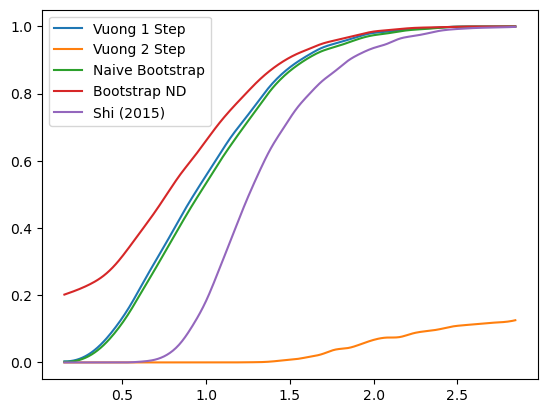

In [6]:
def gen_data3(beta= 1.5, nobs=1000):
    cov = [[25, 0], [0, 1]]
    data = np.random.multivariate_normal([0,beta], [[25,0],[0,1]],  nobs)
    return data[:,0],data[:,1],nobs

betas = np.linspace(0,3,linspace)
nobs = 100
c1,c2 = calc_c(nobs)
results = []


for beta in betas:
    setup_shi_ex  = lambda yn,xn: setup_shi(yn,xn)
    gen_data_ex = lambda : gen_data3(nobs=nobs, beta =beta)
    mc_out = vuong_tests_fast.monte_carlo(nsims,gen_data_ex,setup_shi_ex,trials=trials,
                                          skip_boot=skip_boot,skip_shi=skip_shi,refinement_test=refinement_test,c1=c1,c2=c2)
    reg,twostep, refine_test, boot1,boot2,boot3,shi, llr,std, omega = mc_out
    results.append([reg,twostep,refine_test,shi,boot1,boot2,boot3])

name = 'power_nobs%s_c1%s_c2%s_trials%s.png'%(nobs,c1,c2,trials)
create_fig(betas,results,name=name)

In [ ]:
betas = np.linspace(0,3,linspace)
nobs = 250
c1,c2 = calc_c(nobs)
results = []


for beta in betas:
    setup_shi_ex  = lambda yn,xn: setup_shi(yn,xn)
    gen_data_ex = lambda : gen_data3(nobs=nobs, beta =beta)
    mc_out = vuong_tests_fast.monte_carlo(nsims,gen_data_ex,setup_shi_ex,trials=trials,
                                          skip_boot=skip_boot,skip_shi=skip_shi,refinement_test=refinement_test,c1=c1,c2=c2)
    reg,twostep, refine_test, boot1,boot2,boot3,shi, llr,std, omega = mc_out
    results.append([reg,twostep,refine_test,shi,boot1,boot2,boot3])

name = 'power_nobs%s_c1%s_c2%s_trials%s.png'%(nobs,c1,c2,trials)
create_fig(betas,results,name=name)

var//varnd//right//left 0.372988428153966 81.46078545753504 -12.757597185360785 -13.397604819341877
-0.008518365951382797 -0.010035477584385027 0.008666554885964803
-0.009015341762781327 -0.010035477584385027 0.008169608819280307
---
var//varnd//right//left 1.975397472029204 82.70739547714027 6.484283353861043 5.867418789065896
-0.04542884707534799 0.0038816199377069973 0.04727349281677394
-0.04590096246858513 0.0038816199377069973 0.04680213368896863
---
var//varnd//right//left 2.329797757402426 87.11165325561413 14.527026324272736 13.87761108397062
-0.05387362393364512 0.010088400791412598 0.05418291795804106
-0.05434621674175962 0.010088400791412598 0.05371115845120834
---
var//varnd//right//left 3.199554475394666 73.1108845436151 40.757767342009856 40.177669914493364
-0.08866029627533747 0.03667190580971582 0.08298270320981266
-0.08916282245244977 0.03667190580971582 0.08248242211181685
---
var//varnd//right//left 3.0234757179939353 84.57957240609596 30.196121012707785 29.551646585

var//varnd//right//left 1.6829538072938035 109.36734176826958 -2.8750307864162314 -3.598347081925159
-0.030195966576573852 -0.001100429605004399 0.029361709826230174
-0.03061398106559828 -0.001100429605004399 0.02894418422021816
---
var//varnd//right//left 1.4440683729514703 82.79126708519739 -2.8504862663884825 -3.4770715656879787
-0.03257125738743692 -0.0015457369439651574 0.03379657668672672
-0.03304961591126653 -0.0015457369439651574 0.033318802859200865
---
var//varnd//right//left 0.06825870348529782 77.92480620067285 -11.586611070498806 -12.193742699535457
-0.0015459683142238598 -0.009699558707456837 0.00200906221991227
-0.002038721827128284 -0.009699558707456837 0.001516286983264873
---
var//varnd//right//left 0.4863993713061285 91.84928979101379 -11.5504538182212 -12.201221840094936
-0.009685418084647292 -0.008237035612631205 0.00998742455928596
-0.010133439682046531 -0.008237035612631205 0.009539458319324437
---
var//varnd//right//left 2.861812717891591 75.59613681109398 32.24

var//varnd//right//left 2.7067450184860027 85.05929782036257 25.00333250935623 24.375787591854813
-0.061904751368602295 0.017815587723831256 0.06236985514645372
-0.06237215475678496 0.017815587723831256 0.06190248587788102
---
var//varnd//right//left 2.2836988490595815 80.73971199271476 13.153396702612339 12.532314135481345
-0.056232777126112535 0.011091776804747268 0.05474763593777378
-0.056718969714106324 0.011091776804747268 0.05426109542670332
---
var//varnd//right//left 0.4384317392142937 94.39981098726295 -12.13063434842197 -12.816750119759305
-0.008671269515283176 -0.008220197816096753 0.009221143438335088
-0.009131048462758223 -0.008220197816096753 0.008761547721223046
---
var//varnd//right//left 0.5066266421051687 55.938362255256756 -8.283603169255356 -8.813677431242096
-0.017002414257325824 -0.00963918257839755 0.017354936353312467
-0.017602306320674915 -0.00963918257839755 0.01675568620441865
---
var//varnd//right//left 1.1307764838246654 84.93547412871256 -6.298063243854004

var//varnd//right//left 0.5622064227824638 87.77339006082515 -11.034830773999598 -11.67505636435353
-0.013305597749232451 -0.008056080075392878 0.012846378841027132
-0.013767285797483443 -0.008056080075392878 0.012385213914232475
---
var//varnd//right//left 0.25339377257462353 64.53649524636764 -10.268200736699402 -10.832642525638548
-0.007743997988260341 -0.010282070059623602 0.00840497940280234
-0.008297127711691344 -0.010282070059623602 0.007851780208717123
---
var//varnd//right//left 0.6418689340465258 62.44589035458188 -7.481374221718813 -8.041267220320735
-0.019646771636226988 -0.008250987651535651 0.020248727147441397
-0.02021368676440402 -0.008250987651535651 0.019681823449097913
---
var//varnd//right//left 1.5921207070378949 83.0908168700937 -0.19978035180766182 -0.833644584612542
-0.03741110943931219 -0.00010741214870843323 0.036551704198261224
-0.037894099702026576 -0.00010741214870843323 0.03606821309892312
---
var//varnd//right//left 0.9586748955917233 86.94943207112557 -7

var//varnd//right//left 0.41870251797595065 36.6038631703577 -6.4738264031542965 -6.884128859685137
-0.024050703250137213 -0.011608267431449744 0.023557542508217663
-0.024760047910691998 -0.011608267431449744 0.022848323688335608
---
var//varnd//right//left 0.10617988119736245 89.9927336047659 -12.637218152829645 -13.30351030928852
-0.0019214745398646563 -0.009094804819740886 0.0025057779721762968
-0.002389780073892114 -0.009094804819740886 0.0020375338292580474
---
var//varnd//right//left 2.3448562754910425 82.1749501317792 15.161515901091192 14.543278355728795
-0.05769809432450522 0.011464385476598138 0.057176701319604756
-0.05817265730039318 0.011464385476598138 0.056701611259527086
---
var//varnd//right//left 0.7935977912304311 72.2778794681993 -7.767299326044098 -8.330850016262795
-0.02041124384293639 -0.00731744570564444 0.02329702822861094
-0.020904621474486625 -0.00731744570564444 0.022804109155005137
---
var//varnd//right//left 3.0549097398953755 66.28993048065007 41.243991449

var//varnd//right//left 1.6104670765169895 101.46049918287257 -3.97214976665709 -4.666353209086014
-0.03174536560115412 -0.003159887132198007 0.030986472322879797
-0.0321783270241565 -0.003159887132198007 0.030554135327745167
---
var//varnd//right//left 0.2042563033206963 70.56139809482761 -10.52388805471668 -11.110632751846959
-0.00522794539237879 -0.009820702509595273 0.005818397281632969
-0.005753690950359168 -0.009820702509595273 0.0052925133436735545
---
var//varnd//right//left 1.9803700429134588 71.2186720093145 10.836622941688463 10.264259297972055
-0.05386805259884299 0.008698015751210387 0.055111037423220634
-0.054375862776684096 0.008698015751210387 0.0546021878988897
---
var//varnd//right//left 2.3411597852288324 74.85342259096085 16.414540593355646 15.820086047933561
-0.06142752246066705 0.014077211254445927 0.057714760568094756
-0.06192968316996402 0.014077211254445927 0.057213881735338964
---
var//varnd//right//left 1.2184735946187424 85.23413738075789 -4.48785182294187 -

var//varnd//right//left 2.0585774747409014 80.64511258252143 10.03487806358622 9.416998696037087
-0.05202454019605938 0.007146398626315262 0.05110770309372457
-0.05250976131973913 0.007146398626315262 0.050622322310063715
---
var//varnd//right//left 1.0099785505159564 101.07566497434455 -8.84365991956531 -9.53980826148104
-0.019889365771399513 -0.005858589427790433 0.020639662059714355
-0.020324937210079715 -0.005858589427790433 0.020203939080191673
---
var//varnd//right//left 1.635900639660147 96.15538274619243 0.9067362842845812 0.2247173985736348
-0.031214627986916786 -0.000523037288321646 0.03656814724600934
-0.03166391427426528 -0.000523037288321646 0.03611991937367251
---
var//varnd//right//left 0.9464350225435362 89.79061497088371 -8.250650507849208 -8.900773146616109
-0.01945822944281509 -0.006478715402382773 0.023333124041783542
-0.019915856860607678 -0.006478715402382773 0.02287525728788189
---
var//varnd//right//left 0.3561363755198074 93.99918371011489 -12.062334150144158 -

var//varnd//right//left 2.025280938725869 101.93419907415047 4.192262903035172 3.5030160894112483
-0.03798541666255757 0.0027775218058676333 0.03899963871350565
-0.03841359429858809 0.0027775218058676333 0.038572560147033724
---
var//varnd//right//left 0.8732000971098025 78.79721268929747 -8.782126309389852 -9.390140105043074
-0.02225587721858503 -0.006819442506224799 0.020778273030322057
-0.022743764411468897 -0.006819442506224799 0.02029027933272944
---
var//varnd//right//left 0.40166739788208805 70.05184628637761 -9.91539170380801 -10.491339164831446
-0.01024573199120106 -0.009409469829729903 0.011081178358103927
-0.010765625112412561 -0.009409469829729903 0.010561146565831162
---
var//varnd//right//left 2.9246174602317896 106.24606358957246 24.760862750711624 24.06618545109328
-0.054185319736655656 0.013996123276131069 0.05747570087027225
-0.05459922091377876 0.013996123276131069 0.05706290533261231
---
var//varnd//right//left 0.2275759204226157 78.7006450244956 -11.663687817393093

var//varnd//right//left 1.1947513611422809 84.85845930588094 -5.9710672816206545 -6.600030128326613
-0.027380956260024254 -0.004479403899325956 0.02722460567424915
-0.02784970412183207 -0.004479403899325956 0.02675624759180641
---
var//varnd//right//left 1.9439826848345232 89.25486219140828 6.173265931082298 5.548400491874391
-0.043689864480263386 0.0036481229846234984 0.04265353651745549
-0.04413290328794611 0.0036481229846234984 0.042211298585288326
---
var//varnd//right//left 0.5752504577918879 84.80230493105013 -10.473125554024136 -11.107886740886842
-0.012681025259946542 -0.008142710995187322 0.01316174091107262
-0.013154591626932641 -0.008142710995187322 0.012688294484261224
---
var//varnd//right//left 2.1507569313784307 79.99928780300642 10.134905207211192 9.533118939592319
-0.05616784894539676 0.009083361034757266 0.04865472072734419
-0.05664294127333931 0.009083361034757266 0.04817822069281424
---
var//varnd//right//left 2.7023577787514275 78.32695006608922 26.017375253174027 

var//varnd//right//left 1.092144596538151 90.30384097887986 -7.047166655018909 -7.712345207500551
-0.023596057723501294 -0.005039615280307071 0.0245509116062002
-0.024061769970725407 -0.005039615280307071 0.024085377171075766
---
var//varnd//right//left 2.363686551387449 92.80587224233798 13.632247317534343 12.973002731084058
-0.054114060028900214 0.009084708442371876 0.052046027260125444
-0.05456287518679327 0.009084708442371876 0.05159642159147588
---
var//varnd//right//left 1.7021087051073707 119.87683534715656 -2.891632408207511 -3.649620035016429
-0.027275807728383797 -0.0018711959938260711 0.028600146585110557
-0.0276757979078617 -0.0018711959938260711 0.02820007536556552
---
var//varnd//right//left 0.9058649380133643 77.68904669429831 -7.152525716986072 -7.7667181503330225
-0.022663303027736035 -0.006275057280746858 0.024600906138696883
-0.023163332036018582 -0.006275057280746858 0.024100844923191513
---
var//varnd//right//left 0.7808255156112192 64.1331925968878 -8.526339067517

var//varnd//right//left 1.8019454639948533 60.55483199384188 8.457897860393487 7.93034752342451
-0.061089788576663445 0.009022680030291327 0.05872804615251684
-0.06164209926817864 0.009022680030291327 0.058177623115647406
---
var//varnd//right//left 1.814047911100822 124.18878519086796 -2.8246119483703196 -3.5965957363605283
-0.028115137794827192 -0.0016245725488328168 0.027701546546566005
-0.028508053109016836 -0.0016245725488328168 0.027308329733391437
---
var//varnd//right//left 2.0229899544432053 59.7467849952928 14.168888070906066 13.647093857528859
-0.06289087496419794 0.013364838459819318 0.06410522673496187
-0.06344361411548152 0.013364838459819318 0.06355231448931987
---
var//varnd//right//left 1.3337426755464517 70.4490663263168 -5.154989238246641 -5.734122528875937
-0.037422724829974024 -0.00579158460563208 0.03909375926803365
-0.03794268899741532 -0.00579158460563208 0.03857424802325786
---
var//varnd//right//left 1.7746421389135234 70.85566465107078 5.142988568532791 4.569

var//varnd//right//left 0.09427698226915694 82.70140661839335 -11.912672181431875 -12.55085490354145
-0.0018545394961662482 -0.009420856271738606 0.0026216331073973336
-0.0023425882739675067 -0.009420856271738606 0.002133627372047577
---
var//varnd//right//left 0.9300127830841928 98.52580560051409 -9.325564206207146 -10.012650681391694
-0.01859872859932048 -0.006152706541707863 0.018801282122229486
-0.019039503000532663 -0.006152706541707863 0.018360140670983936
---
var//varnd//right//left 0.08722335607601303 50.991739783811255 -9.755569849210165 -10.254294757645884
-0.003117603609963335 -0.012393963060721271 0.003506029768072115
-0.003736173328300272 -0.012393963060721271 0.0028874327600608425
---
var//varnd//right//left 1.7643075665002825 74.21565066348572 1.1900108239397618 0.5821319909713427
-0.046474381393938044 0.002938850053221442 0.04479361602186988
-0.04699274380539197 0.002938850053221442 0.04427608987504736
---
var//varnd//right//left 1.8128008343457473 88.26956788792845 3.5

var//varnd//right//left 0.34925627182631375 75.21069450123723 -11.256793923858499 -11.865521571831163
-0.008207115243072983 -0.009975475370596678 0.009705483163828193
-0.008718918173200427 -0.009975475370596678 0.009193670099401717
---
var//varnd//right//left 0.3767672027790439 82.40350266990019 -12.1946249025219 -12.830134542768866
-0.008855186885558813 -0.009570498539785085 0.009080262465713505
-0.009342863529539712 -0.009570498539785085 0.008592684239593364
---
var//varnd//right//left 0.6392864648931995 107.60039625998765 -12.360185264616291 -13.08685235349354
-0.011789420964351713 -0.007520437049407254 0.012364051671124133
-0.012216594063788845 -0.007520437049407254 0.011936960693928448
---
var//varnd//right//left 2.049492386303471 76.8560738458713 9.19920725580034 8.600144239652641
-0.05335559305528556 0.008324030703442255 0.05210410697443996
-0.053848506660276664 0.008324030703442255 0.051610698495496266
---
var//varnd//right//left 0.24880827702803654 89.52031659567837 -12.681084

var//varnd//right//left 1.9145967561512787 75.27953248319558 8.540926197602765 7.9445891589092374
-0.04915721006937748 0.006161098539928245 0.05159776668654412
-0.0496580065327192 0.006161098539928245 0.05109699546080527
---
var//varnd//right//left 0.26912702465061455 83.2912718745212 -11.587411325050809 -12.232439486563305
-0.005844664345643113 -0.009065786191674103 0.006420382407529563
-0.006334488286465562 -0.009065786191674103 0.005930662514926432
---
var//varnd//right//left 2.8222278433611554 103.96230485430797 21.56131437219199 20.8513929128186
-0.05519317271626759 0.01316044424429255 0.05141853807961219
-0.055625011783794635 0.01316044424429255 0.050986442408011
---
var//varnd//right//left 0.16997275942300802 69.65921130415744 -11.13332745386306 -11.710014039382477
-0.004443500472641206 -0.010387343427417192 0.005332726732776675
-0.004967029916625432 -0.010387343427417192 0.004809196451687162
---
var//varnd//right//left 1.684418882469172 77.32543744119877 4.123273181539109 3.502

var//varnd//right//left 0.44832184009173953 79.39606886490583 -11.0128360097859 -11.622996262843742
-0.010025854921044203 -0.00933117265142279 0.01181437688854528
-0.01051173044385158 -0.00933117265142279 0.01132824102803575
---
var//varnd//right//left 0.15937688827391758 62.90991421858378 -13.44273386038956 -13.982317452707578
-0.004730962365335406 -0.013768093610199327 0.005162886633579258
-0.0052733330745518515 -0.013768093610199327 0.004620367797330944
---
var//varnd//right//left 1.019762451898877 79.34526067459365 -6.739407287351028 -7.350260739555433
-0.024677621785539016 -0.005337252303293354 0.02665944550336809
-0.02516430962420289 -0.005337252303293354 0.026172061374015752
---
var//varnd//right//left 0.513146287000884 94.42909745551093 -11.995260837486093 -12.680709442286046
-0.011359435236848035 -0.008011831474865836 0.010749420224478586
-0.011818475786552162 -0.008011831474865836 0.010290288287317014
---
var//varnd//right//left 2.0824955819242996 65.74345065688864 13.4689648

var//varnd//right//left 1.9760319292568111 63.019278785050254 11.337318668256286 10.795975404632879
-0.06034669894593036 0.011435413417579704 0.05969972459817232
-0.06089111681929005 0.011435413417579704 0.059155650638793
---
var//varnd//right//left 0.29331527790584266 91.13871219014348 -12.87804981243555 -13.544787755911358
-0.006139509756010802 -0.008946775663319567 0.006218498328200474
-0.006602204557370322 -0.008946775663319567 0.0057557581381617985
---
var//varnd//right//left 0.21618130596855978 60.993729635400165 -11.233355620232851 -11.77851553654809
-0.007146408840839922 -0.012064275056247986 0.007702279678391192
-0.007711647367851215 -0.012064275056247986 0.007137199525053175
---
var//varnd//right//left 0.37413255042876603 57.77380702749046 -8.805184501502739 -9.332248673220747
-0.011973588807603797 -0.010322597929086763 0.012798206797565524
-0.012550682495474894 -0.010322597929086763 0.012221229746147472
---
var//varnd//right//left 3.936077141639658 71.20040119722546 77.88325

var//varnd//right//left 0.4157570465127293 68.43053915320876 -9.789438514353357 -10.361048150163981
-0.011229732411361052 -0.009441655930800956 0.012529398176200458
-0.01175804218910303 -0.009441655930800956 0.012001045598730123
---
var//varnd//right//left 1.1179473387185503 71.13220459402528 -4.770912799017058 -5.352364605493411
-0.031062072026347275 -0.0047122168170709525 0.03062914281848152
-0.031579050680765844 -0.0047122168170709525 0.03011243546666085
---
var//varnd//right//left 0.45124760278323117 72.5767855507661 -10.5436218971005 -11.132716560516645
-0.011595327340198067 -0.009549124694919255 0.011950064185372781
-0.012108776944288729 -0.009549124694919255 0.011436814811853567
---
var//varnd//right//left 4.3503211364198044 107.58399821565891 70.59422471120929 69.8925542053179
-0.0768839835395499 0.04036253846236258 0.0761603322586341
-0.07729619105524745 0.04036253846236258 0.07574768256528253
---
var//varnd//right//left 2.1854843031526934 63.72846735882296 15.623750868957446 

var//varnd//right//left 0.275978167782039 65.93292633359931 -10.230295136422141 -10.793449024706486
-0.00815457687011455 -0.010154069713645943 0.0085169144142936
-0.008694823689965431 -0.010154069713645943 0.007976529744365315
---
var//varnd//right//left 0.7961341124695112 89.95578993664647 -10.760143514300442 -11.41335766517866
-0.016819620260774208 -0.007975024339082796 0.017917049175014188
-0.01727883083902517 -0.007975024339082796 0.017457568828548087
---
var//varnd//right//left 1.4305574097742333 89.20478374957203 -4.988115085202178 -5.632229322183155
-0.031119055900676495 -0.002896117866280357 0.031062549768307458
-0.031576138219085115 -0.002896117866280357 0.03060621537510138
---
var//varnd//right//left 0.1544171969941023 104.06394152642096 -13.505291646989487 -14.232319702452376
-0.0027213886975732127 -0.008464080577670664 0.0032057110157051832
-0.0031632916453249752 -0.008464080577670664 0.0027638283491207053
---
var//varnd//right//left 1.0175784502804401 70.00441420311948 -6.

var//varnd//right//left 0.8828563010235474 81.54186696650285 -9.108988825169714 -9.723336209862904
-0.019602115116008137 -0.007428809390959476 0.023121852597637747
-0.020079174265372576 -0.007428809390959476 0.02264505355195694
---
var//varnd//right//left 1.3276060181151976 81.0982007626666 -3.271274932278034 -3.8866362747336143
-0.035615030614660176 -0.0025275934046332803 0.03232487171265944
-0.03609442122524265 -0.0025275934046332803 0.03184513381674661
---
var//varnd//right//left 0.09560998593347457 82.73307090727452 -12.027616955361973 -12.67560417919719
-0.0021098453187687054 -0.009413814422432653 0.0024367034804778347
-0.0026051511577561224 -0.009413814422432653 0.001941372788812797
---
var//varnd//right//left 0.5473102567323083 66.11493584924817 -8.96234510387047 -9.516637401523418
-0.01634147717515456 -0.009311869811488557 0.017031656895645834
-0.016871379712951353 -0.009311869811488557 0.016501270065233917
---
var//varnd//right//left 1.9830820359748809 76.65969273222551 10.083

var//varnd//right//left 0.3145536278392049 83.55631366141635 -13.308307838119395 -13.947798014236719
-0.007531258070388744 -0.010090598400944254 0.007054217731386649
-0.008015207401478961 -0.010090598400944254 0.006570181933158819
---
var//varnd//right//left 0.5421508694297981 100.97258508720135 -12.8911320802421 -13.592663672660391
-0.010664078120285104 -0.008109914658648082 0.010801593707339052
-0.01110337511121542 -0.008109914658648082 0.010362365813900714
---
var//varnd//right//left 1.7421114368913795 82.3225706866811 3.5168172123276835 2.877796072848805
-0.04102009049185887 0.0022270051942562116 0.03979460952381719
-0.04151033716070947 0.0022270051942562116 0.039303795055394976
---
var//varnd//right//left 0.32100825374889574 96.8421749019032 -12.504351595384778 -13.184737676547972
-0.006541842796771692 -0.008422477744959035 0.006708224229964271
-0.006986105138656769 -0.008422477744959035 0.006263885750298441
---
var//varnd//right//left 0.49987651363132907 65.89942314539913 -11.479

var//varnd//right//left 2.486376344664173 67.37432093372276 22.91900338376181 22.35230861322383
-0.0720161470818065 0.022082944554892913 0.06912869972139944
-0.072547444156516 0.022082944554892913 0.06859680550269226
---
var//varnd//right//left 0.1342252571891743 66.9811736535854 -11.331585403935147 -11.893323127272515
-0.003968744085863033 -0.010917192684915714 0.004083115293726297
-0.004499138059802758 -0.010917192684915714 0.003552660875739746
---
var//varnd//right//left 0.7329588959675127 77.30853286765944 -9.404096442569905 -10.012784467984092
-0.01974655279611751 -0.007540472603541167 0.01799587360313101
-0.02024425945121405 -0.007540472603541167 0.01749788717518326
---
var//varnd//right//left 1.1538345731098512 71.79233871783369 -5.1882817721615115 -5.768058809357875
-0.031009653993681004 -0.004328391492646454 0.03183173843316956
-0.03152015562597344 -0.004328391492646454 0.031320977612457473
---
var//varnd//right//left 0.4801226715031153 86.80333976679623 -12.558742611780596 -1

var//varnd//right//left 1.8068749542948248 95.65088186659499 0.6559685068490263 -0.00573712180677893
-0.03615127901229793 0.0007735097385456505 0.0372753938138828
-0.03658907661783449 0.0007735097385456505 0.03683833921393619
---
var//varnd//right//left 0.0517386237644388 87.71516649679204 -12.344314401292207 -12.989764106948494
-0.0008906297500029239 -0.009148563293672708 0.0014073890299092743
-0.0013560292445196412 -0.009148563293672708 0.0009419860244923891
---
var//varnd//right//left 0.5977701599383768 76.35444847920081 -10.118675046727079 -10.725210245891763
-0.014469362203997662 -0.008815647855584346 0.015769349697014
-0.014971636932063579 -0.008815647855584346 0.015266969279527101
---
var//varnd//right//left 1.6997085392756284 90.86189104291104 -0.5514294408695413 -1.2181114405512654
-0.03626719177573465 -0.0003805171765991346 0.03798118498044405
-0.03673096691091242 -0.0003805171765991346 0.03751724209400645
---
var//varnd//right//left 0.4538151084562368 84.22624542757498 -13.4

var//varnd//right//left 1.171843064830486 98.37874040443693 -10.316893520766243 -10.996572298415844
-0.02150607951766554 -0.006930819172424122 0.02423772530741276
-0.021943096367723135 -0.006930819172424122 0.023800695973752773
---
var//varnd//right//left 1.3208154216381427 116.89781727331231 -8.826685967899374 -9.573005417317338
-0.022464177700147043 -0.004915144174119811 0.02117331520306124
-0.022867914319188488 -0.004915144174119811 0.020769479539845086
---
var//varnd//right//left 0.07176218741793164 77.19128344356695 -11.945588401329205 -12.560704194306364
-0.0015199519555169456 -0.010017175821750117 0.0019006793341734363
-0.00202396277827957 -0.010017175821750117 0.0013966876697743176
---
var//varnd//right//left 0.5396620781806244 114.82827679705363 -13.00430216549237 -13.748508025020612
-0.009170604986978316 -0.007482307105517657 0.008721695889391482
-0.009580496780824205 -0.007482307105517657 0.008311667834271445
---
var//varnd//right//left 0.9722865389446318 88.56388061766243 -

var//varnd//right//left 2.7002041968417023 74.4886147581116 27.883355752401513 27.30005995123851
-0.06439676893311289 0.022770368248307662 0.07223108620233214
-0.06489088964078825 0.022770368248307662 0.07173543924929585
---
var//varnd//right//left 0.12208437629174972 71.70029470791377 -11.662145016621322 -12.231640239906989
-0.0029962353615941447 -0.010419730179045837 0.003447333932969446
-0.003498595775881699 -0.010419730179045837 0.002945045401775633
---
var//varnd//right//left 0.5858818183367464 90.25292946457293 -10.65254285469208 -11.310798549926057
-0.011803462889364558 -0.00790301723200963 0.013803697314221063
-0.012264947915379567 -0.00790301723200963 0.013342345768971782
---
var//varnd//right//left 0.9019901197745128 64.71001032728714 -6.788285955757543 -7.347070506655364
-0.02923275336799275 -0.006433063945101734 0.026151661499386497
-0.029778930632890395 -0.006433063945101734 0.025605827289373436
---
var//varnd//right//left 0.8730333076998567 74.11100351959065 -7.3501060487

var//varnd//right//left 3.5765939817441597 85.02710850687514 52.55778694602721 51.93539030113283
-0.08063922889534851 0.03809180590365769 0.0853966938521946
-0.08110245927960641 0.03809180590365769 0.084933923538965
---
var//varnd//right//left 0.4432195697870905 81.46245494434923 -13.125093612194455 -13.727347089325118
-0.009622724471083118 -0.010268760029715657 0.011358489139778648
-0.010090447776546581 -0.010268760029715657 0.010891081857776243
---
var//varnd//right//left 0.17739264378158362 62.26878671289157 -12.886841188024864 -13.441043746904208
-0.005559398698884921 -0.01345992686797263 0.005999134788242916
-0.006122314623186357 -0.01345992686797263 0.005436043173948546
---
var//varnd//right//left 2.2805670969216427 111.69088091183214 6.988921373574423 6.264549511771734
-0.04078258461623254 0.004291927700033015 0.042129760327494874
-0.04119286971912378 0.004291927700033015 0.04172004479946585
---
var//varnd//right//left 0.46368185493022657 65.76045440708802 -14.561058633121233 -1

var//varnd//right//left 0.8730285474767635 73.27293114978538 -8.681193204209102 -9.269948612222587
-0.024004408465734577 -0.007663801275720411 0.02504461695175599
-0.02451292827970242 -0.007663801275720411 0.024536471101316674
---
var//varnd//right//left 0.8995894422607057 76.36342810176588 -7.187608633776248 -7.810316232410035
-0.02288567426830077 -0.006748910041573909 0.02332033723294934
-0.023401106493513287 -0.006748910041573909 0.02280452951333581
---
var//varnd//right//left 0.42926427415146656 82.12054637990313 -11.982843851947731 -12.613156811508746
-0.010445106101490033 -0.009322929414571007 0.010179687351344635
-0.010930321940405377 -0.009322929414571007 0.009694128873501415
---
var//varnd//right//left 1.3685583663990182 74.95669070696344 -2.5957975514891762 -3.186063137686561
-0.036637505772267064 -0.0029964484144646454 0.03544435562254064
-0.037134819031444985 -0.0029964484144646454 0.0349462257244501
---
var//varnd//right//left 0.2639807355647674 108.22805023242302 -13.8681

var//varnd//right//left 0.6747535417551482 84.6716355088099 -10.575788541013393 -11.211773493886998
-0.015207307809576789 -0.007903068181690539 0.01672272478970504
-0.015682303612583454 -0.007903068181690539 0.01624787848791887
---
var//varnd//right//left 2.483090213467507 86.60899023700978 18.823804805800535 18.192383572913872
-0.05520353464285431 0.012435988242820063 0.05764522175910081
-0.05566517867524041 0.012435988242820063 0.057184433760233154
---
var//varnd//right//left 0.321650217047359 68.58516149663689 -12.11235556644546 -12.692496125305894
-0.008995934505641795 -0.011389081911557141 0.009551087014897607
-0.0095307137745807 -0.011389081911557141 0.009016092885097153
---
var//varnd//right//left 0.8544481531998469 73.50466315819705 -8.642803350073184 -9.22380421738831
-0.023194594608510304 -0.007501454841481931 0.021643319446428753
-0.023694550432006578 -0.007501454841481931 0.02114362105068151
---
var//varnd//right//left 2.0329767743962237 56.50614009736237 14.573385963161188

var//varnd//right//left 2.818118807137927 103.65663452528068 20.359365131156462 19.651472161119795
-0.05054187916357119 0.010953418772357707 0.05460002458811273
-0.05097369833574564 0.010953418772357707 0.05416728524734934
---
var//varnd//right//left 0.4325409069012894 77.5319714182297 -14.386908359933058 -14.996742909413989
-0.011000794359133252 -0.012013875594667878 0.011238555208277183
-0.01149826571099877 -0.012013875594667878 0.010741107325908644
---
var//varnd//right//left 0.09991412396363668 84.99824469626873 -12.363189202596757 -13.012455790421896
-0.002091659891856028 -0.009513069440104736 0.0026375170681675578
-0.0025747998883392104 -0.009513069440104736 0.002154387795883891
---
var//varnd//right//left 1.1050472258548325 74.99976121957816 -5.259862677964551 -5.857705409905878
-0.026502463484217326 -0.004524862043944179 0.027504057993517923
-0.027006593233497134 -0.004524862043944179 0.026999821411865813
---
var//varnd//right//left 1.7900744718341175 85.62010062555227 2.969521

var//varnd//right//left 0.5544556198263583 70.08713696044084 -12.46290488078598 -13.066352744457024
-0.015812367370378076 -0.01147617223014953 0.01629479973159541
-0.01635696264117277 -0.01147617223014953 0.01575023119363993
---
var//varnd//right//left 2.8789358099874622 69.96125537863472 36.71203165278777 36.14134672686884
-0.07620475779049764 0.030951130115019525 0.08013310314854051
-0.07671877423666187 0.030951130115019525 0.07961830271833388
---
var//varnd//right//left 2.0941669738046165 69.07516573087054 10.55333399778206 9.969028249579205
-0.06284174069504976 0.01113782807594536 0.058531429798340605
-0.06337599913675729 0.01113782807594536 0.05799651699640498
---
var//varnd//right//left 3.005489407005558 93.0037414667349 30.162991587379114 29.501744496411483
-0.061888214141296236 0.01980641098802336 0.06202490573644567
-0.0623382412247485 0.01980641098802336 0.0615752536982937
---
var//varnd//right//left 0.13403346848392528 73.99713631092152 -13.312102767103262 -13.91808030623364

var//varnd//right//left 1.5195775045356872 70.49639580124924 -2.0442747084660744 -2.630137730419167
-0.042808457301215116 -0.0014453967562483884 0.04049605316053101
-0.04333412927019645 -0.0014453967562483884 0.039970936743352004
---
var//varnd//right//left 2.301478644197296 74.13029093341578 14.340440613787429 13.748596158056037
-0.06381507256302715 0.013526919542708725 0.05895731274088778
-0.06431974343112677 0.013526919542708725 0.05845158729600368
---
var//varnd//right//left 0.7611762941803689 58.61439205075895 -9.36738820194398 -9.89434071788925
-0.024903750457869783 -0.00979556975770165 0.023774968123388127
-0.025472523711513134 -0.00979556975770165 0.023205836567597695
---
var//varnd//right//left 0.5438195934593064 70.41211711469093 -9.762397925340851 -10.344005623945684
-0.015123742924361427 -0.009208843048095487 0.016423235176436422
-0.01564599437544888 -0.009208843048095487 0.015900673789287445
---
var//varnd//right//left 0.3581127124634457 72.24848735897591 -14.7369916685382

var//varnd//right//left 0.4892480804705268 95.9183286918036 -12.040498542646048 -12.726452785041678
-0.010059273889576944 -0.008116101075289005 0.009872524976950492
-0.010511561787892518 -0.008116101075289005 0.009420303661344706
---
var//varnd//right//left 0.08850501789602655 107.46371554634673 -13.780465025977815 -14.486679771076123
-0.0014479837956310475 -0.008259769907739802 0.0016789692223214403
-0.0018636135771847014 -0.008259769907739802 0.0012633625175315865
---
var//varnd//right//left 0.16712772652874702 78.33179288639862 -12.54494593048777 -13.16599331281475
-0.003963355849435018 -0.010349665435343176 0.004672934914859601
-0.004464759669749297 -0.010349665435343176 0.004171547509946679
---
var//varnd//right//left 0.822552602077511 79.68121828640177 -10.33522924515649 -10.949696131237433
-0.02068305472162208 -0.008449613527022209 0.019630047299027842
-0.02117055175013519 -0.008449613527022209 0.01914196166556407
---
var//varnd//right//left 3.898542105319231 74.76105960235535 6

var//varnd//right//left 0.5428765781362068 83.12802042070247 -10.656390732587399 -11.283415400656832
-0.011998269579786456 -0.008517093561477044 0.013201753666645756
-0.012475237453256386 -0.008517093561477044 0.012724730153087846
---
var//varnd//right//left 0.47164165476047093 81.31103405093681 -11.46988103894487 -12.092880243052722
-0.011331156615716433 -0.009039519235989635 0.011402792360822402
-0.011815948840149876 -0.009039519235989635 0.0109183668275368
---
var//varnd//right//left 0.8214462497499112 60.09581473142849 -7.5018977146104575 -8.041228117257438
-0.027282694258391253 -0.008497060099189699 0.028850116313101564
-0.027850573944095545 -0.008497060099189699 0.028282764074685694
---
var//varnd//right//left 0.647533250719407 67.15330663059298 -11.449093271953592 -12.022086159470874
-0.019787441377012927 -0.010564156832439095 0.019331953002182083
-0.02032740500200874 -0.010564156832439095 0.018792097442616562
---
var//varnd//right//left 2.456070581925677 91.09179792043393 12.41

var//varnd//right//left 3.8337859323971215 63.87563536754748 73.78080075920269 73.25052090751959
-0.11633661779058908 0.07349715664960856 0.11777155596336922
-0.11686087018484687 0.07349715664960856 0.11724918795234228
---
var//varnd//right//left 2.405114431758182 89.07917676359581 12.412109372046357 11.767142231084948
-0.05249762997799201 0.01063685044894403 0.051703389147667776
-0.05295469167125217 0.01063685044894403 0.05124555211358697
---
var//varnd//right//left 0.8477616876197486 69.56489852641548 -6.9599896114114035 -7.52371916496037
-0.0222226186928507 -0.006728375089895596 0.024986003415535054
-0.022735057794392714 -0.006728375089895596 0.024473713912513958
---
var//varnd//right//left 0.19570394765564558 77.83152101088706 -11.819901113204505 -12.428437088045923
-0.0048174958886222355 -0.009825921087092166 0.004891342466470196
-0.005312057448894199 -0.009825921087092166 0.004396847182141022
---
var//varnd//right//left 0.1551740360064908 68.69478648239532 -12.439781586104814 -13

var//varnd//right//left 0.24275030886864055 70.52698092414671 -11.974286930741181 -12.565788333522434
-0.006544457782704025 -0.01071534912738192 0.006798077540687656
-0.00707483719183513 -0.01071534912738192 0.006267636563878707
---
var//varnd//right//left 0.9976716221451377 99.89146343635215 -8.296303333904378 -8.988446999926289
-0.019881179774274216 -0.0057357066674135326 0.02021783120968949
-0.02031953326572836 -0.0057357066674135326 0.019779476365688484
---
var//varnd//right//left 1.3648313446353333 70.34257662065231 -2.91768275910062 -3.5107667882563955
-0.03637880433537881 -0.003141290043543708 0.038174459176697116
-0.036912392908693914 -0.003141290043543708 0.03764086860701101
---
var//varnd//right//left 0.6248988667820443 72.56403331228785 -10.109263624683418 -10.72049446138992
-0.015976149038201472 -0.009610474093441332 0.017373929022413952
-0.016508568054808766 -0.009610474093441332 0.016841092371223994
---
var//varnd//right//left 1.5879080601410498 83.02057944212156 1.185866

var//varnd//right//left 0.7475506113475097 87.34818518278625 -9.860022603638798 -10.490696781503987
-0.017009066676946752 -0.007573887845664967 0.01864358723565297
-0.01746574450903311 -0.007573887845664967 0.018187136544352937
---
var//varnd//right//left 0.2596813823777091 41.904870953091724 -8.0114602796868 -8.457018929662485
-0.011883835874642106 -0.012323720645061598 0.013129832493697246
-0.012556108861190457 -0.012323720645061598 0.012457197793944972
---
var//varnd//right//left 0.8495146820138557 70.08709060297475 -8.401719975431758 -8.970587868024184
-0.023790813413564753 -0.00755851814420481 0.022656854562558622
-0.024304389387070066 -0.00755851814420481 0.022143357135718723
---
var//varnd//right//left 2.149361967512512 77.27284347067028 12.206064295650787 11.609197684142236
-0.056108508625565205 0.009867881752829885 0.05194254340955577
-0.05659791288778935 0.009867881752829885 0.05145433637491254
---
var//varnd//right//left 1.1053882814882077 85.78017825922679 -6.04026269707449

var//varnd//right//left 1.112828184792249 85.60889320973801 -7.9311311566150815 -8.569364112989897
-0.023518968695610685 -0.0063353267494380095 0.02722020357456685
-0.023990421593256893 -0.0063353267494380095 0.026748813693702075
---
var//varnd//right//left 1.124065821720224 68.09928100962894 -3.52897129031568 -4.112247849176001
-0.032556885522199715 -0.003964993681152911 0.033847706395659066
-0.03309865648910365 -0.003964993681152911 0.033306349296613746
---
var//varnd//right//left 2.7120779114181923 77.58594868725012 26.740346370526613 26.156157636214928
-0.06619003868000672 0.021201285084109626 0.06988856392749393
-0.0666667304031416 0.021201285084109626 0.0694111426592865
---
var//varnd//right//left 0.7919400358680767 86.11381680760306 -8.749973918192266 -9.397350776588453
-0.01617105809081116 -0.007053152785092738 0.018314538954419833
-0.016646270587028174 -0.007053152785092738 0.01783923304519208
---
var//varnd//right//left 2.2265306691637736 64.41007822776473 19.6358872244855 19

var//varnd//right//left 1.9965683166485013 86.02665349953206 5.162270039622079 4.49284384805484
-0.04498846413745103 0.004312799135467443 0.0429414705382231
-0.0454798771850073 0.004312799135467443 0.04244996277058083
---
var//varnd//right//left 3.5971630462065147 84.99194491148644 54.25026271849448 53.616017692990354
-0.07942767716564171 0.03863934865882418 0.08014639371737477
-0.07989986732901633 0.03863934865882418 0.07967309862516281
---
var//varnd//right//left 0.6757086563932888 61.92392638468006 -8.97978731005105 -9.523242955286637
-0.022081178038623025 -0.00953653112700708 0.022644528216148624
-0.02263623186588537 -0.00953653112700708 0.02208925967277068
---
var//varnd//right//left 0.41896114817683056 81.35366405375505 -11.290379078893322 -11.914354725060617
-0.009852977250556812 -0.009011265722600106 0.011206963005820286
-0.010338121495798732 -0.009011265722600106 0.010722017732286674
---
var//varnd//right//left 5.321341208994621 87.79927070912095 125.37301347783743 124.7220554

var//varnd//right//left 2.734551530358547 88.55632677552848 23.238718815329882 22.584049373790744
-0.057037435040686875 0.016126349304522745 0.05668738517201791
-0.057504309228195466 0.016126349304522745 0.056220536809568636
---
var//varnd//right//left 3.1087781240411276 98.91534305242519 30.74293628175772 30.05628538572916
-0.06318533908391011 0.01957933142332805 0.060085548513837586
-0.0636234593562498 0.01957933142332805 0.05964614004567721
---
var//varnd//right//left 0.31997323261403515 68.70072848086618 -13.198968176020886 -13.779187605376743
-0.008679061929508647 -0.012459325469641515 0.009262757853762415
-0.009212990768425414 -0.012459325469641515 0.008728694624223028
---
var//varnd//right//left 0.18206668294596273 82.99301177534136 -11.810568729481394 -12.436263738544323
-0.003791987441494554 -0.009210835330065807 0.004479661140833158
-0.0042688741764390446 -0.009210835330065807 0.004002867905975316
---
var//varnd//right//left 2.051994066302467 79.41168051233025 9.7640542253655

var//varnd//right//left 3.372814438931375 77.78238274755347 45.932478075795295 45.339441484608265
-0.08911047953018185 0.0384874167163982 0.08174584030317622
-0.08959298844398794 0.0384874167163982 0.0812620138612939
---
var//varnd//right//left 1.001870490081007 76.03682536325304 -8.051948017652336 -8.648520807748017
-0.027078693743801265 -0.0063311129814164245 0.02572475682604006
-0.027574716394433842 -0.0063311129814164245 0.025228779908700184
---
var//varnd//right//left 0.7970080303787007 82.76464827069884 -12.856139523747107 -13.484405325010146
-0.017763346525886434 -0.009927585784111187 0.02124688171211019
-0.018243496991593222 -0.009927585784111187 0.02076683611454254
---
var//varnd//right//left 5.273185600442888 87.74555925961747 128.48112704412068 127.84413378386803
-0.11402716360798487 0.08953758898557378 0.12972169829422167
-0.11448488574913634 0.08953758898557378 0.12926050818481846
---
var//varnd//right//left 3.0877002562782563 98.34452464913042 24.33919087003507 23.6686191

var//varnd//right//left 0.5920562191581 73.52210706003319 -17.353696825950923 -17.938832095172877
-0.014797846335806981 -0.015620847122742601 0.01571414275073548
-0.015301005151272125 -0.015620847122742601 0.015210736250349523
---
var//varnd//right//left 1.443698113731701 79.73146879495471 -3.5120552542493084 -4.131554516243933
-0.03356949751599013 -0.003741091618616193 0.036981831457043576
-0.034060786829374044 -0.003741091618616193 0.03649007763770452
---
var//varnd//right//left 0.7604480540229288 82.8303036221866 -18.17819602736838 -18.822624166671137
-0.017835131221287492 -0.013876715748134698 0.017994812147636558
-0.018327313794826744 -0.013876715748134698 0.017502779345600246
---
var//varnd//right//left 2.2973950418286186 74.52426935641556 12.787454548424606 12.206094434042571
-0.05859829250204378 0.010803720495986316 0.059372029367709696
-0.05909184172320668 0.010803720495986316 0.05887880934356837
---
var//varnd//right//left 0.4251517430204874 78.49702623676791 -16.035043934571

var//varnd//right//left 1.7316271135972165 82.29786047118567 -1.4390199245877697 -2.0495363331365177
-0.04095295010523571 -0.0003152790047961975 0.041616215544657734
-0.04142235177504439 -0.0003152790047961975 0.04114709204390619
---
var//varnd//right//left 1.2636905109807817 70.32338840681581 -9.176715224902358 -9.7434220214579
-0.03662486795529627 -0.008776238852708132 0.037360702436345664
-0.037133516471856545 -0.008776238852708132 0.0368512752043338
---
var//varnd//right//left 0.38607533916652953 103.47787330556376 -14.823397746694091 -15.540026574767198
-0.007422489012711624 -0.009049154335016511 0.007241164784416024
-0.007860387607882477 -0.009049154335016511 0.006803142143529093
---
var//varnd//right//left 2.8366827193130604 78.75115266879429 30.059640011254658 29.449456309352826
-0.0699542573430458 0.023618900599216563 0.07147894339138817
-0.07044454538132285 0.023618900599216563 0.07098973426096647
---
var//varnd//right//left 0.5067905642359467 52.91386044125112 -14.2554714525

var//varnd//right//left 1.0031218662983836 87.44736416919558 -15.697674167788621 -16.34060378473936
-0.02140292009851992 -0.011603964866118264 0.022612794812045707
-0.021867957667368675 -0.011603964866118264 0.022147751159319783
---
var//varnd//right//left 1.766607587758679 56.40771456893883 3.316252435678887 2.8103745199328047
-0.056484161169638884 0.003916852468009636 0.05963577545087728
-0.05704996040364309 0.003916852468009636 0.05906944220918496
---
var//varnd//right//left 0.8079003534243588 77.35233569444905 -11.588003706031122 -12.187840568574257
-0.019373590289292288 -0.009621529641403162 0.02003425447140736
-0.019864082138635854 -0.009621529641403162 0.01954353563502856
---
var//varnd//right//left 0.24538698818674182 102.16561148940792 -21.306231213781263 -21.999095453076926
-0.004471480926044417 -0.013434146685467527 0.004702077939977834
-0.00490039488487504 -0.013434146685467527 0.004273200501135525
---
var//varnd//right//left 2.3811021026581556 69.59419550751805 14.03649907

var//varnd//right//left 2.3101952980578977 80.24287483349795 12.047540746985261 11.429558760213968
-0.054497895551671685 0.00786782766683215 0.05989449848044852
-0.05498619250151086 0.00786782766683215 0.059407430719927656
---
var//varnd//right//left 2.1696600669475345 82.84672520946569 9.958306986862135 9.325392755683353
-0.04886770300007776 0.007157694571404933 0.04955514948656788
-0.049350890443782436 0.007157694571404933 0.04907187815767727
---
var//varnd//right//left 2.3740806444651277 79.85402850165984 15.809751024102932 15.184022215125438
-0.06021932969634866 0.011783211602908211 0.06244782195571592
-0.06071568762478017 0.011783211602908211 0.06195211966222968
---
var//varnd//right//left 0.9042469758394746 83.46814287493805 -11.519604874631762 -12.136956114651289
-0.022480080001850044 -0.008469233045417947 0.02223060466524838
-0.022947770452215376 -0.008469233045417947 0.02176230713892456
---
var//varnd//right//left 1.6141368661998536 86.39277853779349 -13.332717115436564 -13.97

var//varnd//right//left 1.4152280051230568 81.3848866546739 -6.19005458477375 -6.807595160480178
-0.03426347299132088 -0.004507049387296341 0.03466875177434829
-0.034743678891285386 -0.004507049387296341 0.0341890068002003
---
var//varnd//right//left 1.7952098548047002 72.61742634407506 2.1496634884044554 1.5552201983471128
-0.04624610877161194 0.001041562298170746 0.04714845141294651
-0.046764511682025306 0.001041562298170746 0.046631907311072536
---
var//varnd//right//left 3.610517751366425 149.5024853125486 27.777991556209578 26.941512576606307
-0.04817953303756002 0.011850879982921343 0.04550905221371253
-0.04853318798658471 0.011850879982921343 0.045154932585285926
---
var//varnd//right//left 0.7826193566372194 84.34673495836992 -11.924312523773127 -12.561473019253885
-0.018121660469917058 -0.009121706404127187 0.018425729194243855
-0.018599334998165445 -0.009121706404127187 0.017948337500475826
---
var//varnd//right//left 2.604702014338243 108.09459192653894 12.680980077048655 11

var//varnd//right//left 1.637298810294372 102.97406570082804 -5.335855140412959 -6.030726804442312
-0.030307417916190377 -0.00416146179410367 0.03295901042262881
-0.030734109199998055 -0.00416146179410367 0.03253171053077517
---
var//varnd//right//left 1.114854535395088 108.79826338150862 -11.096782161081173 -11.80414172172889
-0.021561191641031145 -0.006218776005669563 0.020141009746579397
-0.021972400177318566 -0.006218776005669563 0.019729936140034356
---
var//varnd//right//left 1.772618604173128 73.54945319773636 4.333789403101597 3.73877088805432
-0.04727967267754981 0.0018760497361780977 0.0496143745788581
-0.04779005499972746 0.0018760497361780977 0.0491034569471535
---
var//varnd//right//left 1.3330313431427716 73.88409742393004 -3.50328563598426 -4.089859710557573
-0.032676472073010394 -0.002637829532646775 0.03461192810178326
-0.03317898686043149 -0.002637829532646775 0.034110316941045986
---
var//varnd//right//left 0.5252593801231319 72.89113216579543 -13.073837571329811 -13

var//varnd//right//left 1.171636078166796 71.46059424220563 -5.314383712983328 -5.893146279710805
-0.032781749161281806 -0.005346472279889164 0.03283713496494316
-0.03329321194602579 -0.005346472279889164 0.032325281481054756
---
var//varnd//right//left 0.18731391936660066 99.35803773827492 -17.21439440921299 -17.912050211482867
-0.0035795725960911877 -0.011126201548362823 0.004080252980195415
-0.004023660910261222 -0.011126201548362823 0.0036362039400760163
---
var//varnd//right//left 1.2998456095155049 88.43150775500014 -7.058615217523759 -7.707911589007003
-0.029614627285612392 -0.0049199454197830445 0.028891235304393775
-0.030078906120121294 -0.0049199454197830445 0.028426752763023897
---
var//varnd//right//left 1.5068590027032172 90.88765912182218 -3.456083674769865 -4.11920023282115
-0.031229240637707243 -0.0027919784952933043 0.03457588630593409
-0.031690530838639416 -0.0027919784952933043 0.034114642203436046
---
var//varnd//right//left 0.6589322599441009 63.11126959258616 -11.

var//varnd//right//left 2.8168394599855184 77.12793738641099 24.230004241484327 23.634423777441945
-0.07069804114119285 0.021084054441152758 0.0695665956404867
-0.07118612022134621 0.021084054441152758 0.0690773293142103
---
var//varnd//right//left 0.18037620575887658 66.55516049685818 -14.62890619504422 -15.196044499065836
-0.005374754696620083 -0.014099466589473114 0.005226370834662552
-0.005913718094817355 -0.014099466589473114 0.004687383442796929
---
var//varnd//right//left 2.6119891156489468 77.74909215240622 19.54126682629191 18.929930032469056
-0.06001637446701616 0.01532901050873052 0.06630857052916538
-0.060513487209780385 0.01532901050873052 0.06581109871982434
---
var//varnd//right//left 0.49012159726595883 67.00064181339812 -12.81637616003464 -13.388495428944525
-0.014009560307561899 -0.012108102482750481 0.01399027440139772
-0.014550072867857857 -0.012108102482750481 0.013450545636440076
---
var//varnd//right//left 1.4463922354983754 74.87891523927223 -0.9976934151433925 

var//varnd//right//left 2.9791077466199267 86.86611929303118 29.37098823934942 28.739427620236416
-0.06756504441582509 0.02166025309835909 0.06786604058237364
-0.06802511088688165 0.02166025309835909 0.06740493135874046
---
var//varnd//right//left 2.1402338163541694 59.19025774589182 16.033460921193246 15.521030437634202
-0.07237926391315834 0.01630063692974988 0.07503375736691918
-0.0729264828858636 0.01630063692974988 0.07448602471298923
---
var//varnd//right//left 0.4073758584229033 67.33399594410646 -12.477371860491887 -13.051246469425402
-0.01203733010650839 -0.01155520523952962 0.012728899287592995
-0.012576301409511726 -0.01155520523952962 0.012189955414785458
---
var//varnd//right//left 0.8790414088521751 87.0863602054659 -10.194308385796058 -10.822299954307793
-0.020221358915807185 -0.007349386649338733 0.020421875832653504
-0.020677346128024375 -0.007349386649338733 0.01996580116697355
---
var//varnd//right//left 2.1589270070062305 100.16072783816271 4.212163274555223 3.51782

var//varnd//right//left 0.2946014160560125 83.90109406903721 -18.92376734769401 -19.56270409946501
-0.006764032367894959 -0.014372265948038379 0.006792625591143502
-0.007245644605890598 -0.014372265948038379 0.00631098426799178
---
var//varnd//right//left 1.3176762521612808 90.58390554994543 -14.756499865324527 -15.425830566297867
-0.026939121444829395 -0.010674114400530675 0.028694664463328166
-0.02740568676290781 -0.010674114400530675 0.028227319032699434
---
var//varnd//right//left 0.8258413009317391 68.64980978831377 -7.698316616073901 -8.268031543586444
-0.023795689118714637 -0.007286357502031684 0.026120118714216788
-0.024320753105056592 -0.007286357502031684 0.025594816729649927
---
var//varnd//right//left 4.833405647757283 96.07123073601196 88.34564138092784 87.67094283250307
-0.09863015341952677 0.05921794319004276 0.10147781465537122
-0.09907544608416695 0.05921794319004276 0.10103518714479845
---
var//varnd//right//left 1.4610339230104574 79.38623930075487 -4.293053264808933

var//varnd//right//left 0.9618813905223444 54.5085318315712 -9.00942842670043 -9.526211214992363
-0.034145618622315646 -0.010355945940252687 0.034682430694622415
-0.03474472439137107 -0.010355945940252687 0.034082915592040526
---
var//varnd//right//left 2.0633317808994898 65.16827932956157 12.87546662695022 12.320224138478515
-0.06102781144653631 0.012407469901712202 0.0667193723678952
-0.06156535661815727 0.012407469901712202 0.06617949151317469
---
var//varnd//right//left 3.220580739083938 78.03241770786764 40.8920175693831 40.27655996204725
-0.0762530515563612 0.03118305128392253 0.0836328728636267
-0.07675237925407617 0.03118305128392253 0.08313358715727852
---
var//varnd//right//left 1.5257345409576195 57.618759946017235 -0.10795465465022838 -0.6216238082076585
-0.051189793615149304 -0.0001581094133882728 0.050216873969402165
-0.051753628493266673 -0.0001581094133882728 0.04965328507328842
---
var//varnd//right//left 3.9547112566475926 102.03962623188102 58.66803270686251 57.97166

var//varnd//right//left 1.3005869621349873 62.83598401859462 -4.251064785206699 -4.7751987358283765
-0.043759399166182725 -0.0036447410394786165 0.038752538833993946
-0.04428726917310145 -0.0036447410394786165 0.03822550741903725
---
var//varnd//right//left 0.5222364005823049 92.26697789182666 -12.481457498253668 -13.144301762474978
-0.011120312802249007 -0.008850861130128587 0.011620920240603788
-0.011574613964731278 -0.008850861130128587 0.0111664459054259
---
var//varnd//right//left 1.874105214484801 74.18818489040615 1.7752957475710551 1.1719465114549343
-0.049186992040658295 0.0008379273867339766 0.04954034724627199
-0.04970159388317827 0.0008379273867339766 0.04902600907232779
---
var//varnd//right//left 0.7829860124596403 65.51055193744156 -7.666815177935632 -8.234725399385708
-0.023254305479029742 -0.007531890278398399 0.022979241260251436
-0.023802756964866348 -0.007531890278398399 0.02243130484670055
---
var//varnd//right//left 0.22007072201498812 77.86417306834419 -17.238850

var//varnd//right//left 1.869215010689893 70.00446986090328 5.9747117356356885 5.399245867083144
-0.0492457055970688 0.00444483830900661 0.05241192698089401
-0.049765823220824346 0.00444483830900661 0.051892359927110526
---
var//varnd//right//left 2.2229618548073518 90.96672939494209 10.871719700004713 10.223615044836103
-0.04567352986281134 0.006366523598410637 0.04558484731667271
-0.04612469775372677 0.006366523598410637 0.045134085599884494
---
var//varnd//right//left 2.4023413024185847 72.6064270665777 16.009286894350293 15.42529773628946
-0.06507602625036317 0.014505556462449117 0.06370339372658665
-0.06558453543479942 0.014505556462449117 0.06319452513024905
---
var//varnd//right//left 3.987556803219842 103.64126270625968 59.00122193609492 58.307630719002525
-0.08139758284351019 0.03511897434457047 0.07908259532602248
-0.08182116609300773 0.03511897434457047 0.07865851743118349
---
var//varnd//right//left 0.7627475679378003 80.26728561718411 -10.812966119246505 -11.42200781623884

var//varnd//right//left 1.292810342551557 88.20775265932483 -9.661522623344881 -10.323064300673064
-0.03020800188523978 -0.007064514144373017 0.029551531840037337
-0.030681811947167594 -0.007064514144373017 0.02907717312059686
---
var//varnd//right//left 5.777082687313018 93.63150582809908 147.55260545248248 146.89584602452103
-0.12447507480922809 0.09768337368154298 0.130006916149191
-0.12491865707361503 0.09768337368154298 0.12956548355094774
---
var//varnd//right//left 0.5119707744714946 85.20067023967471 -11.665404967603484 -12.30677681406157
-0.010053505102262007 -0.009402773222326686 0.012710713934478252
-0.0105298683798805 -0.009402773222326686 0.012234943271454244
---
var//varnd//right//left 1.7709222380927834 84.99304996195947 2.627684865903773 1.9933980002524667
-0.040642499468699494 0.002050253028646586 0.03798828664956008
-0.041114198499169884 0.002050253028646586 0.03751620339324562
---
var//varnd//right//left 1.385481357015288 72.89133195552327 -2.078388945832564 -2.66850

var//varnd//right//left 0.950439084150244 63.50829608048626 -10.747363034418955 -11.296150004667888
-0.030823583512614376 -0.01011171702411607 0.029089746358477418
-0.03137031511819267 -0.01011171702411607 0.028543112421395744
---
var//varnd//right//left 0.3981996864866253 82.72353634194002 -12.46585247991927 -13.107044455898263
-0.00829852658160027 -0.009837668175940681 0.008795584333106666
-0.008788681666050645 -0.009837668175940681 0.008305478579337607
---
var//varnd//right//left 0.4986489633970878 55.08953916445021 -13.48076038850443 -14.00363132583813
-0.01583651936615798 -0.016091616951060924 0.018599320055501512
-0.01643701447040029 -0.016091616951060924 0.01799895517620602
---
var//varnd//right//left 1.2078476862520435 81.59930331086542 -5.461188143540107 -6.062699030072228
-0.028293517381652897 -0.004969971008997847 0.03035269004266588
-0.02875978225338763 -0.004969971008997847 0.029886238482588572
---
var//varnd//right//left 0.521110914150257 73.35809396212734 -15.07908205120

var//varnd//right//left 2.6524704242091834 71.93853955602543 24.14747762181364 23.560328343875156
-0.07183902530864023 0.019760346626386736 0.07435333634276572
-0.07235402879531976 0.019760346626386736 0.07383723771324162
---
var//varnd//right//left 0.7197866605841298 86.03928694452374 -11.645758642975961 -12.28252796571172
-0.016859006549073 -0.008506862077242007 0.016198160460448287
-0.017327062257991743 -0.008506862077242007 0.015730224497475822
---
var//varnd//right//left 0.7941575895650125 108.06956932444893 -11.98388452330927 -12.711484931384858
-0.015065783282445722 -0.0067857876194653685 0.014234479265828864
-0.015491606713545339 -0.0067857876194653685 0.01380851375433737
---
var//varnd//right//left 1.4377495634932533 74.69103653020552 -1.9483058078631352 -2.5464539162442796
-0.03778844977509639 -0.00212314405832463 0.039011315368942014
-0.03829491854918559 -0.00212314405832463 0.03850443723092819
---
var//varnd//right//left 1.1286354299567127 61.96774533981891 -3.2258901301998

var//varnd//right//left 0.5412225247331262 82.8586214828744 -12.142744670732947 -12.774421803908135
-0.013155926858614372 -0.00930634381760602 0.012702037552111741
-0.013638089451310642 -0.00930634381760602 0.012219954098179964
---
var//varnd//right//left 0.20919109556825724 81.8638384255387 -16.804386180278676 -17.4273515431555
-0.004378528434069499 -0.013237871544844449 0.00531465013395672
-0.004859766040831968 -0.013237871544844449 0.004833341459679567
---
var//varnd//right//left 1.9713327288018359 78.65406768316367 0.7060159585977763 0.10022861540396226
-0.05061618670428994 0.0018492650534486176 0.048958492924386636
-0.05110300702354283 0.0018492650534486176 0.04847170232744196
---
var//varnd//right//left 3.1897666379253433 75.64283049169805 37.7856391249358 37.18727044349161
-0.08939930518013255 0.033720256925627676 0.08203466461366753
-0.0898986052924334 0.033720256925627676 0.08153541616251615
---
var//varnd//right//left 0.21899809660411718 83.74687814169951 -13.838830266545992 

var//varnd//right//left 0.5658248130652282 119.9262925161105 -18.01875412474222 -18.782193084059195
-0.008762442653637239 -0.009521523880994207 0.009145579981889073
-0.009165104226819019 -0.009521523880994207 0.008743030463050968
---
var//varnd//right//left 0.7763894541858875 81.4716303177586 -17.44629977996515 -18.072621042452994
-0.018292230322838637 -0.013600225428950228 0.018474029447435147
-0.01877831091576887 -0.013600225428950228 0.01798780281101766
---
var//varnd//right//left 1.9360597046967187 77.17319050946966 4.6099393002991595 3.9899565515693345
-0.04956924396829805 0.003973032026103235 0.04887381041109541
-0.05007713535474559 0.003973032026103235 0.048364610700743695
---
var//varnd//right//left 0.46566859517333536 56.370576323014404 -15.671832393290767 -16.192356832225546
-0.01601067216935709 -0.018119227470568953 0.016690840251240346
-0.016594302453412795 -0.018119227470568953 0.016106783130323262
---
var//varnd//right//left 1.7900269707662275 110.72848351889071 -4.495995

var//varnd//right//left 1.0637980278322903 83.89218330352823 -6.730456545792615 -7.366655242190226
-0.02392232570763399 -0.005504725331139827 0.024624948935223438
-0.024401662107021927 -0.005504725331139827 0.02414581770249942
---
var//varnd//right//left 0.9223843873108142 65.79114863472917 -5.36175071837014 -5.925706976979955
-0.025783035739556415 -0.006453799643857449 0.029419294448153617
-0.026325516129549694 -0.006453799643857449 0.028876959885446505
---
var//varnd//right//left 3.6970488624285327 61.40414094057013 68.16103245778882 67.6367710458815
-0.12082429232566687 0.07131738955386487 0.11539556608903362
-0.12136354720106124 0.07131738955386487 0.11485568385373697
---
var//varnd//right//left 0.4933284857447536 112.42096063387842 -19.105659021584167 -19.843985380417834
-0.008648459366537175 -0.011266551901034337 0.009510423794701755
-0.009063897532243997 -0.011266551901034337 0.009095139171001694
---
var//varnd//right//left 1.3606401084959243 83.84438801889394 -4.889636864818171

var//varnd//right//left 1.3168304356516223 52.83005489589333 -0.11508230320896166 -0.6155747348890486
-0.04623872180602135 -0.0017248427490971943 0.0488387571525449
-0.04683899470558292 -0.0017248427490971943 0.048239720141817814
---
var//varnd//right//left 1.9735911545933995 86.19857123717526 2.0390136403779047 1.3945906234290169
-0.04324278506537047 0.0008586159597538132 0.04278518410075049
-0.04371587931220333 0.0008586159597538132 0.04231240007897504
---
var//varnd//right//left 1.2622158256249167 64.59909886572865 -6.913677040554377 -7.468797169333856
-0.038094383489962524 -0.00693682058158486 0.038547733254902974
-0.03863768699915687 -0.00693682058158486 0.038004125413633315
---
var//varnd//right//left 2.400242480149824 66.0597902045757 19.755542484568846 19.186105670696378
-0.06890806670908356 0.020138234649094252 0.07160237599315296
-0.06945208424780515 0.020138234649094252 0.07105756596865115
---
var//varnd//right//left 1.3184052228227814 87.29878424570006 -5.304457249241403 -5

var//varnd//right//left 0.6800209100445301 91.85677081484866 -12.909341779471138 -13.579633247211772
-0.013683420203816169 -0.009416667736680628 0.014685159144483931
-0.014145044229584338 -0.009416667736680628 0.014223655983420102
---
var//varnd//right//left 2.0382905087897205 81.559818200053 1.742388512354912 1.1123476656665483
-0.05016384887777583 0.0027589601700836143 0.045719609343988464
-0.05065283357476761 0.0027589601700836143 0.045230894389604426
---
var//varnd//right//left 0.26256526429141286 73.0674061907592 -18.840516598416347 -19.429774379572653
-0.006720437772111982 -0.01667487248475632 0.007422206194429639
-0.007230438313598755 -0.01667487248475632 0.006912183411131748
---
var//varnd//right//left 2.9314652526364533 63.61901087792058 34.77853410392843 34.2366973273694
-0.0843873246118205 0.03196920609674511 0.1023144206237103
-0.08492567212341409 0.03196920609674511 0.10177679603389099
---
var//varnd//right//left 0.6398826322257603 81.69981841809856 -21.522092297086697 -22

var//varnd//right//left 2.4379116557487515 64.8711214767962 10.146706553994328 9.615525364539161
-0.07314058394108594 0.008180378691724392 0.07999354161582314
-0.07365984191399715 0.008180378691724392 0.07947816386968241
---
var//varnd//right//left 2.6391444981109653 76.1830983509153 17.86529205433873 17.258233601824816
-0.06682221511632702 0.01638005270221184 0.06614404035263065
-0.06732612028905378 0.01638005270221184 0.06563955587914744
---
var//varnd//right//left 0.2985753875380807 85.30894224332081 -19.134910238263387 -19.7658367530536
-0.006995854920043759 -0.01412976196581442 0.006572371909257802
-0.00746356611953101 -0.01412976196581442 0.006104642893759224
---
var//varnd//right//left 1.2183872249776473 62.84925877080842 -16.87119305619665 -17.427973703879392
-0.0394196028290053 -0.017250519012248566 0.037391828538628054
-0.03997976327181864 -0.017250519012248566 0.03683147706483215
---
var//varnd//right//left 1.9925948310626307 106.00054115405338 -10.483689594414646 -11.185053

var//varnd//right//left 0.8524229136371143 86.48766706062145 -9.569134655623483 -10.206331181498804
-0.018604863091471968 -0.007631229186258861 0.020214436078569493
-0.01907080129819579 -0.007631229186258861 0.019748375838891684
---
var//varnd//right//left 2.326367741524721 74.88300101627239 9.927805434458678 9.33819198088207
-0.06075309992710947 0.00711599523071557 0.06346966120985734
-0.06125207888847588 0.00711599523071557 0.06297142553349956
---
var//varnd//right//left 2.74914043049194 63.519911195698924 29.818842550166394 29.282469763803135
-0.09139738677991387 0.029888229894467593 0.087898841410443
-0.09193043625163 0.029888229894467593 0.08736487280225048
---
var//varnd//right//left 1.438639916750665 81.09178947958377 -13.169210520142649 -13.788629189003423
-0.03281120150058025 -0.010652036061163323 0.032667651922334534
-0.033293755605386194 -0.010652036061163323 0.03218455749599781
---
var//varnd//right//left 1.7248302350660583 94.56938276246458 -3.202207706787257 -3.8654933140

var//varnd//right//left 1.498758859530138 73.77595721834342 -5.948586746333942 -6.529033730003454
-0.039347551421187454 -0.005692916266404839 0.04112396780967901
-0.03984491404881671 -0.005692916266404839 0.0406258888055898
---
var//varnd//right//left 1.9469691234556799 83.40065079364666 1.755531205380903 1.124421207587278
-0.04132235578027372 -0.00017878731781075923 0.04705680433938932
-0.0418016952930839 -0.00017878731781075923 0.04657839907582315
---
var//varnd//right//left 3.454187396892701 81.61366609667765 46.704177468523994 46.08842382466578
-0.08208086323031437 0.03558903563709349 0.08303653609294896
-0.082557757505346 0.03558903563709349 0.08255784870466962
---
var//varnd//right//left 2.1981106635913985 86.29602115838888 5.464274012765735 4.824362177019542
-0.051816225829145406 0.004326004976075757 0.04833009122165483
-0.052285453549097693 0.004326004976075757 0.047861227629401176
---
var//varnd//right//left 2.0094917646958583 66.81591473490937 9.519035124857174 8.961213702332

var//varnd//right//left 1.5350702621868433 74.21020959711471 -8.867021280124828 -9.459949760654014
-0.040076813396344474 -0.008674819953840774 0.04105351835396522
-0.040581544857451635 -0.008674819953840774 0.040548573006093276
---
var//varnd//right//left 0.9475798867881596 55.28109079303328 -17.522649006213257 -18.03808729961311
-0.03545309493125157 -0.019338534790598855 0.03372336682999165
-0.03604334334543585 -0.019338534790598855 0.0331339960522245
---
var//varnd//right//left 1.2622283303439628 86.74711266303625 -9.971089495477475 -10.614653224489714
-0.028150611519808796 -0.00816512015098005 0.029711338700665064
-0.028619680177600477 -0.00816512015098005 0.029242157093916296
---
var//varnd//right//left 2.0417236157563625 88.86718714116164 3.0846177981365335 2.4323371026833636
-0.039871186946481896 0.001555449954619383 0.04800124811632991
-0.04033506028372949 0.001555449954619383 0.04753632146346709
---
var//varnd//right//left 1.2837161291712853 117.76042930575923 -17.4089595585399

var//varnd//right//left 0.3376622733907751 74.13315176610813 -22.737419116294717 -23.32759914999323
-0.00880421697590496 -0.019778070741700893 0.008998916030053202
-0.009307657231440872 -0.019778070741700893 0.008495334071535637
---
var//varnd//right//left 0.09716058848299805 80.40594703725168 -13.14858044926403 -13.766727791478163
-0.002099060273775072 -0.010593731821755853 0.002698617502006811
-0.0025852709933499862 -0.010593731821755853 0.002212426853271197
---
var//varnd//right//left 0.27547874646752313 70.71755163738074 -21.59001806508584 -22.16161716344458
-0.007267375938275212 -0.019510578517104457 0.007194461840560681
-0.007778647468376588 -0.019510578517104457 0.006683224365717336
---
var//varnd//right//left 2.0970570806407256 82.82493778590295 2.039606619616186 1.4128881426746893
-0.05039385712747988 0.002648602350240393 0.04853596558422041
-0.050873204745128055 0.002648602350240393 0.048057611120478426
---
var//varnd//right//left 0.9719905216576687 99.58467917297303 -13.7523

var//varnd//right//left 1.5139423956773326 73.6158324065066 -10.770443970362146 -11.3754787095098
-0.040026004633226996 -0.009035705675611252 0.0398816510031142
-0.04054625198386025 -0.009035705675611252 0.039362238868072726
---
var//varnd//right//left 1.9535785274536226 69.66329385740613 4.977372407349277 4.402489326916887
-0.05333381903207725 0.004836057105530378 0.05497927990014083
-0.05385570588254312 0.004836057105530378 0.05445686301571797
---
var//varnd//right//left 1.485824225342709 89.4486470110971 -6.301200146984764 -6.945289482274963
-0.03262043690284756 -0.0056220524293462346 0.03490194895893727
-0.03307599012407925 -0.0056220524293462346 0.034446850899355966
---
var//varnd//right//left 1.689041379599567 82.83173642702238 -9.11158488870715 -9.732750631506626
-0.0349649974116589 -0.008889955779778929 0.039048075033457315
-0.03543911400410411 -0.008889955779778929 0.03857385997110666
---
var//varnd//right//left 1.1851992610466346 61.43309853562479 -7.254606505905593 -7.790864

var//varnd//right//left 0.8962601235418615 69.98687058607238 -13.166851739129301 -13.745915822723036
-0.024427086401628825 -0.01230677294332143 0.02705228054765915
-0.024949891467555677 -0.01230677294332143 0.026528829708382544
---
var//varnd//right//left 1.324777193351225 76.1891323125898 -10.912094472203655 -11.524988657406727
-0.03331909179513478 -0.009181050933384878 0.035030926423201394
-0.033828396559348134 -0.009181050933384878 0.03452173665349722
---
var//varnd//right//left 0.3451561232044278 112.0326999650842 -16.52685126105357 -17.245912879630872
-0.005708722708122659 -0.009457549769691122 0.006366789579182315
-0.006114690201636268 -0.009457549769691122 0.005960934356297448
---
var//varnd//right//left 0.8897840958037097 89.46299025941568 -10.121480363661426 -10.783717283837335
-0.019348998330751897 -0.0076404785534028765 0.020301081427632484
-0.019817171476865725 -0.0076404785534028765 0.019832508435810872
---
var//varnd//right//left 2.4244405269732416 67.14588414881281 18.14

var//varnd//right//left 0.858160822607 111.95166967861157 -14.973907446319226 -15.731246841450233
-0.013464874896222223 -0.00894893883910554 0.0150305106801651
-0.013892756946829446 -0.00894893883910554 0.014602621393587483
---
var//varnd//right//left 2.172110289475255 71.23253256237429 9.523677389415152 8.951032628230855
-0.057839575085030404 0.00933609236302372 0.05885623082635621
-0.05834749360236987 0.00933609236302372 0.05834868843412376
---
var//varnd//right//left 3.2025582692755235 86.58094711780507 27.86394342287319 27.245338512928114
-0.0709477961871356 0.019997837988856567 0.08020019978778727
-0.07140013053487766 0.019997837988856567 0.07974874344909719
---
var//varnd//right//left 0.632460530790663 85.51643320837523 -15.159277984811004 -15.811731883202523
-0.013779819391343746 -0.011562322910056832 0.014493766963960585
-0.01426237905065112 -0.011562322910056832 0.014011413061594246
---
var//varnd//right//left 0.8087484926816372 75.01029119862078 -9.876558296025086 -10.4797358

var//varnd//right//left 0.6439211524216261 53.12985418369747 -17.77284314763968 -18.290949867858327
-0.023744818931213878 -0.021024596542030753 0.023338263662006916
-0.02436133362364279 -0.021024596542030753 0.022721754547027854
---
var//varnd//right//left 1.2486083357891797 69.86728520654964 -6.70442430080076 -7.28024558826127
-0.03420449883975 -0.006512116887784213 0.035324492487938536
-0.03472548318756023 -0.006512116887784213 0.0348033122241761
---
var//varnd//right//left 0.34845211507890916 81.31777264986626 -18.228538796044084 -18.85113588871266
-0.007769045100091896 -0.014564603878900394 0.008822633420020723
-0.008253262044916387 -0.014564603878900394 0.008338576537359576
---
var//varnd//right//left 0.5416846864703746 107.17704878650352 -22.388007830565236 -23.105251654947743
-0.00963290451393876 -0.013595035701820243 0.01087131809900978
-0.010056095360986884 -0.013595035701820243 0.010447989892520696
---
var//varnd//right//left 1.1276843634321336 85.26640550939294 -9.4954087186

var//varnd//right//left 3.3947974807677084 74.01755962705141 33.6873339446586 33.09360051440848
-0.08949124682612242 0.028692437135728454 0.09314648721818695
-0.08999842634782305 0.028692437135728454 0.09263986242197413
---
var//varnd//right//left 0.7597756541926122 104.57030793865694 -23.673099577047164 -24.384457427378035
-0.014320632294016976 -0.014640760219490801 0.015304356938848069
-0.01475111422316284 -0.014640760219490801 0.014874108993463095
---
var//varnd//right//left 1.2135103138384185 93.53094873243035 -14.318865499880015 -14.987260992879815
-0.027073513097283727 -0.009328825892524565 0.024841305946704723
-0.02752543886264005 -0.009328825892524565 0.02438942167884908
---
var//varnd//right//left 1.7788028635105222 83.42616817217424 -1.7666325021298257 -2.3912275314722855
-0.03949055375234126 -0.0022520280460856844 0.04145858811238469
-0.03996413053702643 -0.0022520280460856844 0.040984761533979744
---
var//varnd//right//left 0.15976949765484225 87.36627215976053 -15.15462905

var//varnd//right//left 0.9928105767448661 73.87947518373224 -9.375692990398605 -9.95124611497976
-0.02420022094832255 -0.007898813379356412 0.026806541179082256
-0.02469317622582539 -0.007898813379356412 0.026313617701346343
---
var//varnd//right//left 0.3475460065636997 88.57294778549095 -17.243557658834224 -17.892019587351292
-0.007549223687499059 -0.012593882470267308 0.007704606510994642
-0.00801225494239675 -0.012593882470267308 0.007241627539217243
---
var//varnd//right//left 2.423789140412448 89.95440926484636 3.428939389223711 2.772011979947551
-0.05677246759793468 0.002439852132405353 0.05494538575136931
-0.05723434077665833 0.002439852132405353 0.05448285638164728
---
var//varnd//right//left 0.961496977771121 69.57385042938853 -8.6401182397544 -9.216777490844779
-0.025898829300028858 -0.008183244092547184 0.02598650147713059
-0.02642299976895531 -0.008183244092547184 0.0254624959522669
---
var//varnd//right//left 2.4245605534530585 72.97143539766988 9.098031991629032 8.49856

var//varnd//right//left 0.26742128542177707 80.93852774407303 -18.16155694056013 -18.78917886265514
-0.0059389781259251645 -0.014418885008898132 0.006059554973558712
-0.006429354738786673 -0.014418885008898132 0.005569223000253174
---
var//varnd//right//left 1.9907393134063927 83.30858290526649 6.063480037122287 5.439317640851321
-0.04339338657098625 0.0036418843721707805 0.047682541902624366
-0.043867854413480394 0.0036418843721707805 0.047208973178339206
---
var//varnd//right//left 0.7878524783441663 93.24357759699606 -22.718875332652946 -23.38325599671927
-0.0167237128153116 -0.015454153358815831 0.016427245168763
-0.017173907263738748 -0.015454153358815831 0.015976417351182947
---
var//varnd//right//left 2.996144869201843 82.16183970816694 26.586944011020957 25.96211229731932
-0.07553445382837744 0.021399570307840947 0.07026291516087312
-0.0760161318174033 0.021399570307840947 0.06978228953025388
---
var//varnd//right//left 0.7419777368211102 82.6114551628538 -15.750688977436177 -1

var//varnd//right//left 0.6555442024257083 61.48688037740574 -16.073852990509042 -16.62865049591115
-0.020229151471657932 -0.016901728847671795 0.022404945838489114
-0.020800459948501566 -0.016901728847671795 0.02183458111222531
---
var//varnd//right//left 0.3451181125349752 84.75898076289005 -23.867726725977406 -24.522535879978385
-0.008241412282708745 -0.01767794709527458 0.007570987739049528
-0.008730135183562441 -0.01767794709527458 0.0070824131985841275
---
var//varnd//right//left 3.7586656718591147 94.70701723501631 45.44922034556053 44.77592106754475
-0.08088973134434639 0.03099131645059595 0.07693120485759011
-0.08133927376882136 0.03099131645059595 0.07648176164257581
---
var//varnd//right//left 0.9232902598542982 73.65601249251753 -10.147352560655381 -10.728301104139721
-0.025286381372568615 -0.009218090775001086 0.024396236716426094
-0.025785525477397802 -0.009218090775001086 0.023897641010694286
---
var//varnd//right//left 2.5120954561051376 74.38024935579332 13.69303094035

var//varnd//right//left 1.3301030826838955 104.78052087248254 -10.198073041713888 -10.917673539286046
-0.022389820789226494 -0.007204081813079737 0.026241677124742156
-0.02282386080795707 -0.007204081813079737 0.02580749466626837
---
var//varnd//right//left 2.2266573034186226 69.6523528727597 5.870693366013559 5.3199591416872005
-0.05939779282275095 0.006010056104394905 0.06643750247671061
-0.05989946087260312 0.006010056104394905 0.06593743915794684
---
var//varnd//right//left 3.372001808996568 91.89651588874595 35.54531929922205 34.88173237445064
-0.07258978177774934 0.024337728676971475 0.07306755216302391
-0.07304490692923785 0.024337728676971475 0.07261216933335286
---
var//varnd//right//left 2.307604007002326 85.25007257943292 10.30932991535934 9.668990418988527
-0.052115385301764454 0.0058875309985817305 0.05366846313707234
-0.05259018156501561 0.0058875309985817305 0.053193586987931654
---
var//varnd//right//left 1.6405396461354895 83.05748970160941 -3.6334677982780863 -4.26115

var//varnd//right//left 2.9000908568245776 80.72894347681411 21.260366987946597 20.64817522990058
-0.06892502990298043 0.01750797349749173 0.06954444284140908
-0.06940345075670634 0.01750797349749173 0.06906498216665999
---
var//varnd//right//left 2.1414633322877457 77.91999473306551 8.004646260894857 7.398432728190825
-0.057660126357257584 0.005741692851793063 0.054230825580904585
-0.05815330117827356 0.005741692851793063 0.05373786264962097
---
var//varnd//right//left 0.23482730911488925 108.23804077904408 -19.647620594514265 -20.37271863228497
-0.004070522436343166 -0.0117130913726805 0.004457056411076109
-0.004494122063531839 -0.0117130913726805 0.004033397815596412
---
var//varnd//right//left 0.24158079792105452 78.69935629568178 -12.48075007879128 -13.101550473341344
-0.005608008228730594 -0.010374302908299498 0.00614676278962693
-0.0061070085295111005 -0.010374302908299498 0.005647908518639585
---
var//varnd//right//left 0.8019350559135507 73.70046577029306 -12.895516536122127 -

var//varnd//right//left 0.6927556218167754 90.17256189928283 -24.887343835026524 -25.546455893765394
-0.015199658181150629 -0.017389127357405228 0.014676445481066561
-0.015662134569483344 -0.017389127357405228 0.01421447002710756
---
var//varnd//right//left 1.781741131096532 71.02236875954605 1.9447256343401824 1.3661817770577844
-0.04690523926438388 0.0011063497063028705 0.04696096920365767
-0.047419385782516144 0.0011063497063028705 0.046446102366524765
---
var//varnd//right//left 1.020740918493981 68.48977058887651 -13.2222746212997 -13.789803378940373
-0.028185555027315002 -0.012152611510779867 0.02674094918430639
-0.02870990318280375 -0.012152611510779867 0.02621664383729497
---
var//varnd//right//left 0.2576500301440329 67.56114124072785 -18.291240096744083 -18.85253998868321
-0.007083630334883142 -0.017102092079725472 0.007487216823131065
-0.007609066200725999 -0.017102092079725472 0.006961833688442937
---
var//varnd//right//left 0.3048342652728987 80.25325081587444 -15.14966041

var//varnd//right//left 1.5744172244680752 107.91029319445329 -4.336914571985715 -5.052242662358418
-0.031573337067726 -0.003267100538468295 0.03153997231005371
-0.031992422340055546 -0.003267100538468295 0.031121073897664536
---
var//varnd//right//left 0.5879614937500847 73.80052567799547 -16.00781450208442 -16.61335174209149
-0.015372896389217402 -0.014077286815232279 0.016295788937288124
-0.015891795992266398 -0.014077286815232279 0.015776901659627713
---
var//varnd//right//left 2.226681604070863 76.33262967904183 8.625157102412437 8.042524669291176
-0.053023762199524684 0.005646229131988067 0.057864699390203264
-0.05350585986534137 0.005646229131988067 0.057381409801706716
---
var//varnd//right//left 0.7936409756873493 77.6167296424339 -16.516571158880573 -17.112860694523892
-0.0185474527815426 -0.013373761024376339 0.018475138056765004
-0.019033205528344165 -0.013373761024376339 0.017989356915360407
---
var//varnd//right//left 1.6933089884495989 70.13761499374513 -3.89436627774301

var//varnd//right//left 1.9411779922657328 102.15710894464014 -4.19385530438598 -4.900018214138922
-0.03831443921910373 -0.0019476478428122753 0.03632576507868328
-0.03875124054084437 -0.0019476478428122753 0.03588834388056105
---
var//varnd//right//left 0.24124469449588196 72.86891647340462 -17.008538947123185 -17.59852258323698
-0.00600502848725149 -0.015324532649674113 0.007211567911599307
-0.006517161036428502 -0.015324532649674113 0.006699521684666246
---
var//varnd//right//left 0.7896191198062125 71.34708156646126 -21.086172398423752 -21.664462050245575
-0.02193542995342185 -0.018984240679062226 0.021546337239030818
-0.022447833719457022 -0.018984240679062226 0.021033662732642375
---
var//varnd//right//left 1.0171486958465108 64.11013736727374 -22.378072147149684 -22.944963330855522
-0.03283990304799208 -0.021235231871679968 0.029798226186900114
-0.03339882020539451 -0.021235231871679968 0.029239080637833408
---
var//varnd//right//left 2.294407512223267 66.33821331596357 18.09417

var//varnd//right//left 1.3482101549176562 76.49776105940987 -11.099287401412791 -11.715906809925722
-0.03436680996481324 -0.00930942887118627 0.03401013919113994
-0.034876546403332306 -0.00930942887118627 0.033500337849193734
---
var//varnd//right//left 3.8100464584953024 77.04294033017482 51.47118317523079 50.86281441534492
-0.09323530767418885 0.042106749566702954 0.10001908023461828
-0.09373751063704387 0.042106749566702954 0.09951942076555186
---
var//varnd//right//left 0.45215885195509714 59.73563142154501 -24.965446247209663 -25.50219763246979
-0.015276288009096231 -0.026355108672566872 0.01523092885398462
-0.015844154965069593 -0.026355108672566872 0.014662684747352085
---
var//varnd//right//left 2.8236731032662243 87.28972377357988 18.259403922608143 17.611763167509444
-0.06055934045163026 0.013434555640675817 0.06201257355939806
-0.061029218445351155 0.013434555640675817 0.06154384231566183
---
var//varnd//right//left 2.686279671410774 84.84044704931829 12.430162693737374 11.

var//varnd//right//left 2.478165182662414 74.45249668247159 5.167015298593278 4.588051107873051
-0.06796272895940404 0.005111169468333134 0.06134374610891448
-0.06845663772209745 0.005111169468333134 0.06085180532650366
---
var//varnd//right//left 1.7671295783490113 71.70229724444894 -1.9112463921086658 -2.4905624580746313
-0.04734046294944414 -0.003449958994075668 0.053812264637487665
-0.04785186047022572 -0.003449958994075668 0.05330130657763087
---
var//varnd//right//left 1.587443407309084 53.99658599429846 -9.027200097351477 -9.531827734985448
-0.060250138051114545 -0.011659676031033824 0.05726128946391449
-0.06084243151935151 -0.011659676031033824 0.05667060732306067
---
var//varnd//right//left 3.630213698268525 64.8606595325023 51.68145815017745 51.13905384611365
-0.0965661252533339 0.04687874771113908 0.11245037678210215
-0.09709657381068804 0.04687874771113908 0.11192118463859516
---
var//varnd//right//left 2.0503989863238066 70.38555955649441 -1.0393970588672692 -1.61044538254

var//varnd//right//left 1.6192991870254696 87.55551893289146 -7.000837988003746 -7.640473386833724
-0.03563994286148153 -0.005675622643480418 0.0358783311212598
-0.036102631241734524 -0.005675622643480418 0.03541561904985811
---
var//varnd//right//left 0.4287678374405829 74.42286339396425 -26.655595142289176 -27.266505490344272
-0.01121671942938221 -0.0228740553980343 0.01148274217059817
-0.011735679179366135 -0.0228740553980343 0.010963452924152541
---
var//varnd//right//left 1.9255263703956265 106.47796868864243 -11.49119650011756 -12.192106194939713
-0.035413202026719146 -0.006119000897012327 0.036129129758547804
-0.03582958592622515 -0.006119000897012327 0.035713156626583684
---
var//varnd//right//left 0.8621358877494995 80.56355617528276 -17.50219648943247 -18.10740359827332
-0.02108043851545339 -0.013607312793520319 0.02051556026460782
-0.021555848748290807 -0.013607312793520319 0.020041003379447402
---
var//varnd//right//left 1.8227391282708423 90.45804209168176 -6.6766275656125

var//varnd//right//left 1.2731226631137815 96.28199866304021 -36.140460355191294 -36.808299223237555
-0.02668777430963223 -0.023450512461176607 0.024635414216439278
-0.027126391464208057 -0.023450512461176607 0.024196363067678035
---
var//varnd//right//left 3.371725066220476 78.9200538518924 32.10637698163385 31.494310485462744
-0.07572345812231189 0.02386541827402778 0.08509352202562713
-0.07621446839518879 0.02386541827402778 0.08460338348080634
---
var//varnd//right//left 1.2122310584342317 77.2483910720756 -13.040386565499002 -13.654957050159323
-0.031647626707152134 -0.010526685370353433 0.03193431520313037
-0.03215136734969277 -0.010526685370353433 0.0314317497960966
---
var//varnd//right//left 0.32681260960864905 63.94057174497832 -22.373931226142385 -22.924097111884986
-0.010096536112660332 -0.022571470401053537 0.01034495805965718
-0.010640824791487173 -0.022571470401053537 0.009800905938017669
---
var//varnd//right//left 2.523444176386004 71.08376732981132 13.776515757054266 

var//varnd//right//left 0.43928446240653546 62.320932388063156 -20.792262089224252 -21.33735465082236
-0.012936372430618901 -0.021250324942754716 0.013001364754840202
-0.013489316962474157 -0.021250324942754716 0.012448237882255856
---
var//varnd//right//left 2.9081556291880313 108.01861702268718 12.387955723504088 11.671590248779157
-0.050828601636062 0.007495756219461096 0.04900282866685717
-0.051247832506450534 0.007495756219461096 0.04858361774370047
---
var//varnd//right//left 0.729116175121 87.51889128290203 -24.73875501688305 -25.3879236330915
-0.01646143021666696 -0.01883965397155194 0.01674350952001318
-0.016930493924509345 -0.01883965397155194 0.016274496526890555
---
var//varnd//right//left 1.230147018487892 84.513849408861 -14.518930881429363 -15.149428986461825
-0.029007161659319956 -0.01061949142243415 0.02974666732188929
-0.02947859822280287 -0.01061949142243415 0.029274419544245457
---
var//varnd//right//left 0.32090683215144306 72.45632450411627 -20.45895839008379 -21.

var//varnd//right//left 0.25053485040387125 92.94735647381977 -21.332925462804692 -21.998969137360884
-0.005022059828014985 -0.01472664955407943 0.005550812949948401
-0.005475265930832214 -0.01472664955407943 0.005097619846587256
---
var//varnd//right//left 2.212607501559625 78.84249396834069 -3.6321108045941255 -4.240449299685481
-0.05200454616423019 -0.00493748509677642 0.055995940644518655
-0.05249213750319244 -0.00493748509677642 0.05550755877516671
---
var//varnd//right//left 0.3301797822717568 99.61271957437934 -26.135388153965053 -26.83156611031224
-0.0061582352808666144 -0.01674644979398837 0.006389598900418263
-0.006600285311749289 -0.01674644979398837 0.005947498546523915
---
var//varnd//right//left 0.7400645766671031 84.9285134548902 -17.902062095004716 -18.539526166153184
-0.01758883408010676 -0.013469630080238023 0.016824977384442098
-0.018063314888199976 -0.013469630080238023 0.016350415670677364
---
var//varnd//right//left 0.3769520365201012 62.6273030723097 -22.91718235

var//varnd//right//left 0.5238800576632894 87.38956934355248 -27.748937842431072 -28.38745741359881
-0.01083317765179209 -0.020632349052611416 0.011076751456558762
-0.011295380271335287 -0.020632349052611416 0.010614664786168472
---
var//varnd//right//left 0.7342355886161733 71.4242513678582 -26.328207149266106 -26.91429587005129
-0.0202385385410458 -0.02359633035762013 0.020761596879978843
-0.02075736483443632 -0.02359633035762013 0.020242587113797648
---
var//varnd//right//left 1.7558534908451244 103.63076077900043 -12.434743347087439 -13.150559777523405
-0.03314072809114219 -0.007831728059177161 0.034278743066467464
-0.03357750976268076 -0.007831728059177161 0.03384191355817645
---
var//varnd//right//left 0.3705027316452979 94.87679039686199 -25.295160684189916 -25.996208313932833
-0.006980617163404769 -0.01747727577358933 0.007294344623533798
-0.007447915949044809 -0.01747727577358933 0.006827111809255795
---
var//varnd//right//left 2.1723500031241016 104.5773937509406 -8.200957412

var//varnd//right//left 0.42555495016994815 56.804266680015616 -19.447347258346753 -19.970229744711993
-0.013112532423134936 -0.021971312887628068 0.01458764934499982
-0.01369456094740596 -0.021971312887628068 0.014005294207774124
---
var//varnd//right//left 0.17050862796559943 78.10044500995055 -15.595852876238647 -16.210036130874755
-0.004093289310112025 -0.012783410209877426 0.004550203472554413
-0.004590636132079462 -0.012783410209877426 0.004052879821248049
---
var//varnd//right//left 0.5545152956834444 105.32350280810674 -22.973297328801607 -23.686151936049676
-0.011361467838065714 -0.01393494229149603 0.00983076219972575
-0.011789630263540043 -0.01393494229149603 0.009402744189557171
---
var//varnd//right//left 0.6539894222816078 71.98949233939337 -30.132887090787694 -30.71794677514853
-0.017287925941605116 -0.026247201043690504 0.017053503160812375
-0.01780214808518998 -0.026247201043690504 0.01653967507798478
---
var//varnd//right//left 1.3431361383652243 104.7491613817363 -16

var//varnd//right//left 1.0498724182091124 99.33081665609635 -21.412088813722253 -22.100058752621862
-0.021687121632424554 -0.014009912270961817 0.022070949437538467
-0.022125430253990722 -0.014009912270961817 0.02163282325242828
---
var//varnd//right//left 1.7873787735100384 82.38801231038937 -7.955153964487714 -8.5782404516676
-0.041986512430839125 -0.00620536426067978 0.04530934214545638
-0.04246572552349608 -0.00620536426067978 0.04483075299519997
---
var//varnd//right//left 1.1127344126633816 98.46382752101489 -16.815447452360626 -17.492977619933157
-0.02068242983328589 -0.011240533997611964 0.023467370473233422
-0.02111790639908669 -0.011240533997611964 0.02303186472371941
---
var//varnd//right//left 0.28699097207189184 75.21480134212331 -16.709885322546253 -17.311241611791115
-0.007056818258818183 -0.014193021777774952 0.007139220284627126
-0.007562525640121241 -0.014193021777774952 0.0066336145940438926
---
var//varnd//right//left 0.45327853838149723 125.4130948355342 -30.02840

var//varnd//right//left 2.0384775640938457 76.30793463784288 -9.00586481557172 -9.604958203453116
-0.053617730765582586 -0.007475111529575653 0.05154552465634561
-0.05411362022041884 -0.007475111529575653 0.051049694766160246
---
var//varnd//right//left 0.7897290912050513 83.78643983034078 -20.356517246415585 -20.991889771498048
-0.0197869048111986 -0.015226124397096951 0.018778630330180218
-0.020266204098822137 -0.015226124397096951 0.018298772906882428
---
var//varnd//right//left 0.4384453610634867 89.39333346393853 -23.64853455217229 -24.283167278826202
-0.009622608117045557 -0.016850329559051427 0.009506080796019244
-0.010071679838977552 -0.016850329559051427 0.009057086469644838
---
var//varnd//right//left 0.42359842506695783 70.87067883809955 -22.153803712219247 -22.750095942831134
-0.011360805601392826 -0.019933011204482536 0.012001655395644205
-0.011892729659147012 -0.019933011204482536 0.011469425704765666
---
var//varnd//right//left 1.7966580558666303 84.67038163034994 -13.27

var//varnd//right//left 1.1314828424068135 70.96221410817206 -16.95889219528155 -17.54965607295254
-0.03103593985130799 -0.014811847429758013 0.032229947564068995
-0.03156281861586128 -0.014811847429758013 0.03170374174070583
---
var//varnd//right//left 1.2035748564852498 97.67720607762837 -19.968780908894455 -20.653428014640085
-0.022969600312676124 -0.013684503406022548 0.024592119032642096
-0.023412907167452958 -0.013684503406022548 0.024149138062035027
---
var//varnd//right//left 1.381761363385543 100.5988193189915 -20.297591183345126 -20.9903053683565
-0.028755226253600195 -0.013012269655400525 0.027419522302183367
-0.02919100195366754 -0.013012269655400525 0.026984109203756903
---
var//varnd//right//left 1.1831017375760653 59.93119315156557 -4.5020919551211005 -5.0319616537933705
-0.038918288174979124 -0.005973702383281134 0.04091942903306776
-0.03947809269836398 -0.005973702383281134 0.040360547661669556
---
var//varnd//right//left 0.3641729420905895 87.24922208560466 -27.685750

var//varnd//right//left 0.8317685041552033 71.56260300822687 -23.528473251219168 -24.12212003322476
-0.022283146822376674 -0.02132363058876242 0.022752448621182465
-0.022807724016691934 -0.02132363058876242 0.022227641818530465
---
var//varnd//right//left 1.8021895793197302 75.2277187675139 -6.620663152063575 -7.2183460343180705
-0.04348688655237986 -0.006280911838919849 0.04555834913054963
-0.04398976831690141 -0.006280911838919849 0.04505658574743067
---
var//varnd//right//left 2.026830318578586 97.51548634359307 -16.16366010270465 -16.83688271144682
-0.04046598130617371 -0.009631860292133962 0.03867246466625116
-0.04090259273331754 -0.009631860292133962 0.038236112296576794
---
var//varnd//right//left 0.5051819750814875 90.32420501992587 -20.445114911518534 -21.10064667570391
-0.010287718464167114 -0.014646665902610842 0.011212381403054295
-0.010746652762595092 -0.014646665902610842 0.010753612882285653
---
var//varnd//right//left 2.728401759358627 85.17656339079629 4.68351332985610

var//varnd//right//left 2.545771402344861 67.82198984195968 13.968114631267026 13.404622513692633
-0.06871742471271268 0.011360932117023251 0.07129500759162306
-0.06924248295035305 0.011360932117023251 0.07076907754581095
---
var//varnd//right//left 0.7719856469884185 66.19694236334698 -17.610677894922432 -18.174129184336298
-0.021902315953354644 -0.017008613982899955 0.022137192849386745
-0.022440375137943707 -0.017008613982899955 0.02159862688997975
---
var//varnd//right//left 0.40739063362834327 76.80687532682515 -34.33331486850043 -34.93395915423674
-0.010218013561285138 -0.028735108891497572 0.011471331019878886
-0.010712523136351135 -0.028735108891497572 0.010976579389233842
---
var//varnd//right//left 2.113448670971352 63.6125278558024 0.8392727722802716 0.2969717747237054
-0.06619481771977291 0.003233784558211836 0.06564942953288802
-0.06673299348314002 0.003233784558211836 0.06511061396367082
---
var//varnd//right//left 1.3165442355666592 76.9484673723432 -13.585896948155671 -

var//varnd//right//left 2.8993303136556983 95.6161074373183 14.726263352883244 14.059305407770516
-0.057352124243831015 0.009784391547557605 0.06127376744765976
-0.05779332964708433 0.009784391547557605 0.060832684756832234
---
var//varnd//right//left 1.9811340864809035 75.1083686715334 -6.759188108669902 -7.353617437777477
-0.05024037091905034 -0.0063628460748576246 0.05092850178716258
-0.05074140326783518 -0.0063628460748576246 0.05042852315886699
---
var//varnd//right//left 1.3131620384776639 74.7717067234531 -10.718129243081835 -11.318072836290623
-0.03390626613406778 -0.010222139360193205 0.037034094608317324
-0.03441355195567928 -0.010222139360193205 0.03652658103491847
---
var//varnd//right//left 3.0355243443580338 80.72088088914263 33.15120396828561 32.53301632070209
-0.07139706795928741 0.02434297137443161 0.07257243025551911
-0.07187989274550723 0.02434297137443161 0.07208828836806051
---
var//varnd//right//left 0.35509876997267825 65.08728269094033 -21.392759608242027 -21.95

var//varnd//right//left 1.0785203313557827 85.07374538270555 -25.77096342948168 -26.4104319800888
-0.024771843334018256 -0.019364170655578057 0.02540995935343704
-0.02524715561568377 -0.019364170655578057 0.024934516648930347
---
var//varnd//right//left 1.2052772319773775 68.84414348871796 -15.206424669865546 -15.783881172511581
-0.03307772555468387 -0.014269393305026083 0.03398876381041445
-0.03360819967683951 -0.014269393305026083 0.03345813608979649
---
var//varnd//right//left 0.548101650651399 71.13235719239277 -20.54960359393027 -21.138974322894562
-0.014600884460270334 -0.01856137843442964 0.015623894152735428
-0.015124730483152344 -0.01856137843442964 0.015100059160340955
---
var//varnd//right//left 0.480406930837634 53.36734760227426 -33.83239390075268 -34.327946800797825
-0.018142817539176667 -0.03941151620793832 0.01719286625281806
-0.018730089516951084 -0.03941151620793832 0.0166056116964586
---
var//varnd//right//left 0.6514801923752684 101.97641073973212 -26.42111062239650

var//varnd//right//left 0.3068684325424673 65.61513387674373 -18.382910942959608 -18.952124985602655
-0.009229105420142722 -0.01796415259597014 0.009533624162904654
-0.009777869447780708 -0.01796415259597014 0.008984823458726289
---
var//varnd//right//left 1.0606380341678037 120.048066962163 -24.897139845292397 -25.66308128821038
-0.016932061074327015 -0.013734714979490595 0.017146711620636995
-0.017335836933410276 -0.013734714979490595 0.01674313871794881
---
var//varnd//right//left 1.2964026570350657 55.93456034627844 -11.93429818772864 -12.455791076060907
-0.045258927992671505 -0.013336355093353182 0.045863062108540076
-0.04584746736178127 -0.013336355093353182 0.0452720342398055
---
var//varnd//right//left 0.35930999721220724 52.040321510614184 -24.9523377555504 -25.4629397259198
-0.012702450821980944 -0.03063406286332583 0.013191217222889831
-0.01332328428547448 -0.03063406286332583 0.012570884100640124
---
var//varnd//right//left 1.4072363663184846 94.5853234304664 -21.1325361346

var//varnd//right//left 3.143498572744868 51.785712503675114 41.97637763869824 41.484972797047526
-0.130014997307946 0.05318915592936056 0.11780638761058834
-0.13061576098034486 0.05318915592936056 0.11720579130322603
---
var//varnd//right//left 0.30025553531912635 88.34915935736036 -23.6710993752559 -24.334723107986974
-0.0063496516155249795 -0.01706980490555025 0.0063830691366785096
-0.006824686271127822 -0.01706980490555025 0.005908082078639508
---
var//varnd//right//left 0.6923406956535998 70.05140450347739 -21.72376285245455 -22.29063547751368
-0.019114925499788885 -0.019737196461755598 0.019907594331169107
-0.01962680556259595 -0.019737196461755598 0.019395990684768334
---
var//varnd//right//left 1.334817594182985 83.34262420051536 -7.355831996060072 -7.989779638326737
-0.032091444307362986 -0.005613528934824189 0.031173179729866912
-0.0325723061607863 -0.005613528934824189 0.030692027057615926
---
var//varnd//right//left 0.7177657654705474 90.4316236848923 -15.247940780140626 -1

var//varnd//right//left 0.6303956570785638 92.76690933492597 -23.06720817031918 -23.739003262496333
-0.013675084528451247 -0.015865199947243853 0.015363478351428157
-0.014132916404563774 -0.015865199947243853 0.014905214032894536
---
var//varnd//right//left 1.0379567382316321 71.8948897113733 -15.367454673058612 -15.957319335555527
-0.02869612440733052 -0.013686815645179483 0.030197447007737462
-0.029214722208001403 -0.013686815645179483 0.02967870374372065
---
var//varnd//right//left 1.5359058955430498 70.57027376803907 -18.184702015709476 -18.758021292319967
-0.04070986579414203 -0.01646428956587155 0.04222750511254967
-0.04122346885253353 -0.01646428956587155 0.0417136310432536
---
var//varnd//right//left 3.17868877292347 68.79819168555198 36.23333341144084 35.66863684110198
-0.09552300699716028 0.03500543829485409 0.08619787520875122
-0.09604240743175513 0.03500543829485409 0.08567959673400356
---
var//varnd//right//left 0.8491945733630166 80.36597529086005 -17.12499074006997 -17.7

var//varnd//right//left 1.3540578143372577 58.288757233021926 -9.74630806067683 -10.270363740062683
-0.04290363977707832 -0.011758719235828748 0.04390084471334025
-0.04347232541303797 -0.011758719235828748 0.04333242299467393
---
var//varnd//right//left 2.5899165077985846 81.20698670603937 11.883765108360084 11.267022550258185
-0.06304597268258422 0.008641665145496606 0.06092363604265317
-0.06352736694455097 0.008641665145496606 0.06044326516996418
---
var//varnd//right//left 1.3319933246306912 73.72173002612459 -21.4628864752885 -22.040977679728712
-0.03576389168480294 -0.017781990920591174 0.03557269088506248
-0.03625936891703069 -0.017781990920591174 0.03507635501349254
---
var//varnd//right//left 1.9010960296590573 88.8690137791285 -12.40714014298243 -13.077963033020557
-0.0413735488180059 -0.009003283566737118 0.04197443960001735
-0.04185064402002423 -0.009003283566737118 0.04149697919376579
---
var//varnd//right//left 0.656135428925852 75.48644974453575 -19.370754358479203 -19.98

var//varnd//right//left 3.035087905743161 73.12957150200481 30.403520675395864 29.82072190203495
-0.0927771519530625 0.025866196097565956 0.08111194270028405
-0.0932803265499329 0.025866196097565956 0.08060760264038866
---
var//varnd//right//left 2.047704124308928 75.7123408422791 1.274828754887463 0.6811150492395541
-0.05108294393317277 0.0014231333689629522 0.05658205700799062
-0.05157718901336772 0.0014231333689629522 0.05608602541088035
---
var//varnd//right//left 0.44721471284398806 52.07442130847133 -26.90511148962895 -27.40802619165419
-0.017677606868300062 -0.03302831611878041 0.018035207611239574
-0.018288288218085813 -0.03302831611878041 0.017425053023050575
---
var//varnd//right//left 0.35743528538853714 68.85898966471291 -18.730804761605675 -19.305855015723502
-0.010261313321709351 -0.017430806112100017 0.01108230688865508
-0.010789402778378716 -0.017430806112100017 0.010553982370251225
---
var//varnd//right//left 2.365201862745716 74.48247291014121 14.220161662624886 13.63

var//varnd//right//left 3.721966317812985 121.8050416531511 34.86045080815664 34.09014677456532
-0.05995400340301449 0.017700729860386392 0.05682783434353541
-0.060354287002794015 0.017700729860386392 0.056427418659179225
---
var//varnd//right//left 2.6338246552158937 82.43347108549222 0.8391902875245898 0.2178221759692968
-0.06437460852320583 -0.00028916750579576677 0.0638376521769234
-0.0648506794553106 -0.00028916750579576677 0.06336021171363751
---
var//varnd//right//left 0.6033036235920436 103.53748376218755 -27.705624704647693 -28.393073302751546
-0.011362406400301978 -0.01697848111173143 0.011486065248526443
-0.01178226135062052 -0.01697848111173143 0.011066019064290849
---
var//varnd//right//left 0.3355969806749308 73.01331694329 -24.576570120885723 -25.172587840509056
-0.008980712729180457 -0.02124309884275076 0.008536929990834552
-0.009497040695079562 -0.02124309884275076 0.008020728180859141
---
var//varnd//right//left 0.43203065675264146 62.773968856380655 -21.2334850408261

var//varnd//right//left 1.2835921136964294 108.28506250350596 -18.22437399835617 -18.939191391734706
-0.02369579683632616 -0.010900852142929025 0.023768880421333308
-0.02411352542490204 -0.010900852142929025 0.023351522886754312
---
var//varnd//right//left 0.6292438534215892 59.42019524328247 -22.330380979070174 -22.87775117153771
-0.020094879102173436 -0.02389079719328436 0.02045406026256166
-0.020677884554252148 -0.02389079719328436 0.019870881003030617
---
var//varnd//right//left 0.8207362903265238 93.13785489012683 -30.548940302793117 -31.221798767101948
-0.0164011894890891 -0.02093837797613586 0.017104778921807708
-0.01685792540828448 -0.02093837797613586 0.01664755183940076
---
var//varnd//right//left 1.290412606481718 63.31781410323767 -15.704567200762467 -16.24451399837306
-0.03889277555135764 -0.016582919453448176 0.04007338311069531
-0.039432639106420836 -0.016582919453448176 0.03953417004874
---
var//varnd//right//left 1.065586780195198 63.31079639201787 -27.13116377698958 -

var//varnd//right//left 0.6815160628087495 90.77369202066181 -23.238147062814818 -23.892751405156
-0.014176871521642275 -0.016895110652715175 0.015753374538418883
-0.014633187215704726 -0.016895110652715175 0.015297101178632443
---
var//varnd//right//left 0.9043702696365251 92.93778426261584 -26.367491276824918 -27.02437335970938
-0.01833655256216296 -0.018062597970612226 0.01871018336671541
-0.0187831451023014 -0.018062597970612226 0.01826346263691655
---
var//varnd//right//left 2.436063985357293 80.20310505250637 -4.902839097630995 -5.52039697200713
-0.057219942590912204 -0.004701190060258874 0.0601993992739585
-0.057706747379209444 -0.004701190060258874 0.059711772164822076
---
var//varnd//right//left 0.2937335322042284 79.6222695630709 -22.911923970161403 -23.543816210965147
-0.007481279518169902 -0.018414685379014747 0.007819275845269955
-0.007983214843923605 -0.018414685379014747 0.007317396596749186
---
var//varnd//right//left 2.6332860535531943 69.36787885169812 5.9210591177223

var//varnd//right//left 2.867915460933792 67.40646298793726 -2.548035149695658 -3.0960161067804712
-0.07950709172676237 -0.00016032928748995986 0.08156237343032809
-0.08002189645780422 -0.00016032928748995986 0.08104830728017857
---
var//varnd//right//left 0.6317685298149012 102.98587398664841 -41.16369384954872 -41.85172604277334
-0.0109672554607021 -0.025583197340894186 0.012133422109708577
-0.011389886390403732 -0.025583197340894186 0.011711038238568994
---
var//varnd//right//left 2.1502121750412146 109.7748778348832 -9.459400370452212 -10.177165329168082
-0.03839008262796722 -0.00589925543918241 0.03849877722613168
-0.0388035895678528 -0.00589925543918241 0.03808531112605332
---
var//varnd//right//left 4.444789424504641 106.72782005112104 66.05150228566147 65.34842586319681
-0.0740015992896509 0.03634023061431366 0.08171274541433611
-0.07441820791209 0.03634023061431366 0.08129607482856431
---
var//varnd//right//left 1.603180950934726 65.53102927777898 -7.694699166553746 -8.2576231

var//varnd//right//left 0.43667224217842454 92.64339614473205 -34.15549169683994 -34.84195596964686
-0.008957135069319227 -0.023422597206018164 0.009022186351856146
-0.009425712332812936 -0.023422597206018164 0.008553484778944452
---
var//varnd//right//left 1.5341647756768928 50.51925654281466 -21.03874525471895 -21.53579526369112
-0.058569077078836615 -0.02689736047649157 0.060515655195467255
-0.059191962162185884 -0.02689736047649157 0.05989253776915588
---
var//varnd//right//left 3.5210207774336 93.29925026634083 34.37212328978909 33.71002990232148
-0.07244492205336728 0.022693385331968973 0.07839690583678281
-0.07289351214967482 0.022693385331968973 0.07794837242802875
---
var//varnd//right//left 1.9649000438376973 75.55913095027708 -19.282861744440186 -19.884464274370373
-0.05312211197192889 -0.017010360345638235 0.05282004665484226
-0.053626371457971986 -0.017010360345638235 0.05231579733119287
---
var//varnd//right//left 1.0409807092270116 84.56611653486549 -25.82657273608578 -2

var//varnd//right//left 1.776343493869223 101.99728507534223 -9.479851157511584 -10.1907867510591
-0.03282948070621847 -0.006930745200979089 0.034147221896015725
-0.03327037450172437 -0.006930745200979089 0.03370634506874801
---
var//varnd//right//left 0.6413565148016146 72.66341804377556 -29.516685711059754 -30.11104895902901
-0.016038183035258922 -0.025989697480951313 0.015932318852283467
-0.016555696183559298 -0.025989697480951313 0.015414837880453225
---
var//varnd//right//left 0.9984606447286019 86.69686598981912 -41.740038405259035 -42.39662718752176
-0.020212633301502424 -0.03096646088760407 0.024184308955280186
-0.02069182070775047 -0.03096646088760407 0.023705351714471613
---
var//varnd//right//left 0.5698138222273953 77.34613180512554 -44.9838507584602 -45.60065999048635
-0.014628968969308702 -0.037111930387216836 0.01450115673845478
-0.015132776999235984 -0.037111930387216836 0.013996439592391037
---
var//varnd//right//left 1.1193199989961007 80.67260102832341 -36.0363720846

var//varnd//right//left 1.3196381141324427 71.6807322814223 -25.525268067064214 -26.10041311487794
-0.0371816462488131 -0.022238779508412937 0.03613066611673075
-0.0376891469506877 -0.022238779508412937 0.035623165713542515
---
var//varnd//right//left 2.1581930901655464 83.24461334833768 -7.06624382479363 -7.679710830559328
-0.05143651368293178 -0.005083235069451 0.04685993870127554
-0.05190198485648471 -0.005083235069451 0.04639416115030387
---
var//varnd//right//left 1.055456036074893 67.76508207440735 -23.29773507716308 -23.85365738824761
-0.028981446116549903 -0.02220546882854285 0.029996729128807745
-0.02950032179820935 -0.02220546882854285 0.02947767104656553
---
var//varnd//right//left 1.2150627192871684 88.67562406027638 -30.217820337242205 -30.854685547538335
-0.0251818541619277 -0.021708124728421395 0.02568780152972601
-0.025635955580246252 -0.021708124728421395 0.025233938911925966
---
var//varnd//right//left 2.6569147756025213 89.89067456426461 5.683505105490452 5.039102617

var//varnd//right//left 1.6918661095930094 73.75557541219304 -15.266965874447092 -15.84473306956184
-0.04237469785108089 -0.012884777699786108 0.04680156716848536
-0.04287096701893334 -0.012884777699786108 0.046305539113664175
---
var//varnd//right//left 2.4291915244358044 83.63123033249391 -12.164840113445447 -12.788875205569784
-0.055219554167496486 -0.009020182810579844 0.05700117358281252
-0.055692812377672346 -0.009020182810579844 0.056529717803068286
---
var//varnd//right//left 1.3137630982231698 70.94916979783245 -27.69096560608575 -28.270155724147713
-0.03423166808787148 -0.02535738631835801 0.034644736046361785
-0.03474711147664529 -0.02535738631835801 0.034128289943209954
---
var//varnd//right//left 0.8188978975616311 96.427766851472 -36.907137169792364 -37.58543267616689
-0.01619707389384799 -0.024458046392356454 0.0173044505864417
-0.01664164887346264 -0.024458046392356454 0.016859382649887636
---
var//varnd//right//left 1.921860067133724 93.46212273834752 -22.1734857598335

var//varnd//right//left 2.0285934722368313 83.01611159866088 -20.927306186975287 -21.54255402350604
-0.04403344555676055 -0.01689434686654851 0.047277335634255256
-0.044502361722408054 -0.01689434686654851 0.046806957072732774
---
var//varnd//right//left 1.0194622104635598 68.36273504562345 -32.90631931591996 -33.468459087408135
-0.030078076704649927 -0.030800778738102535 0.029188314689387894
-0.030598313585504404 -0.030800778738102535 0.028668567355551625
---
var//varnd//right//left 0.7582394754245959 75.67477590187517 -38.62994589789014 -39.22866092780282
-0.01930337899635785 -0.03236110374770738 0.0201953010275629
-0.019803990872537824 -0.03236110374770738 0.019694947437279113
---
var//varnd//right//left 0.6081903367273855 68.50951867651742 -35.47577712172068 -36.0392496554715
-0.015493314015594523 -0.03332696168110704 0.01799489085868611
-0.0160134074506389 -0.03332696168110704 0.01747490049369532
---
var//varnd//right//left 0.5545209803201363 93.8550619281272 -46.91765960113887 -4

var//varnd//right//left 3.773074583848343 84.33199213673021 40.71850630533554 40.07627279955942
-0.086081733032813 0.03145834998742151 0.09451962341851601
-0.08656259875931253 0.03145834998742151 0.09403933455532282
---
var//varnd//right//left 1.1157241014791943 81.58031246725736 -18.999444204962302 -19.62695032780629
-0.026768514553455962 -0.014410242032803037 0.027171927394617667
-0.02725507791756687 -0.014410242032803037 0.026685461557190093
---
var//varnd//right//left 3.0482784945781933 107.8764718969713 11.307468285098047 10.591699652300303
-0.05292276597824948 0.006447506305552647 0.057617851520752925
-0.05334317905940962 0.006447506305552647 0.057197896862643476
---
var//varnd//right//left 0.9560803925569271 96.62417753292237 -29.225218789036653 -29.902109296764348
-0.01879947534454779 -0.019558104668762104 0.021014210864971645
-0.019242204169012397 -0.019558104668762104 0.0205709503064123
---
var//varnd//right//left 0.3732114899082699 83.04179277495093 -22.37829317888358 -23.01

var//varnd//right//left 1.3407650756137701 87.90976437302977 -29.831061228635665 -30.462542766127516
-0.027731009359684262 -0.021839452538302894 0.030834011974798306
-0.02818496557764847 -0.021839452538302894 0.03037997165189514
---
var//varnd//right//left 2.272364633352758 75.48013875746209 1.8373282737891847 1.2459668627923037
-0.05982868804779797 0.0017312524564082688 0.06217610600590395
-0.06032321374801763 0.0017312524564082688 0.06168150864756837
---
var//varnd//right//left 1.614024167315175 77.98824859730894 -13.957417046770988 -14.571654490633755
-0.038167435188999954 -0.012139765942411236 0.04239339604247121
-0.03866598544623596 -0.012139765942411236 0.04189565581011875
---
var//varnd//right//left 0.558479979407257 123.14138160367887 -34.96539597673944 -35.73164915751802
-0.00893978989116384 -0.017990037810874843 0.008835160807486973
-0.009333462361725213 -0.017990037810874843 0.008441659762113111
---
var//varnd//right//left 1.5978266896144868 87.59802539587021 -14.65865809802

var//varnd//right//left 3.667694269233579 83.017071030249 36.79104614346764 36.18296770849335
-0.09196020685659341 0.03084772634785766 0.08550900980400426
-0.09242257848584565 0.03084772634785766 0.08504632392119055
---
var//varnd//right//left 0.9313595725577956 79.85621126523246 -27.906238274602206 -28.535757133118597
-0.022969278949743415 -0.02169205578136596 0.02298360122982327
-0.023468153113818245 -0.02169205578136596 0.022485113519147153
---
var//varnd//right//left 1.7385385897486558 58.42588533953743 -14.961687761315302 -15.48451627247276
-0.0584427860067865 -0.01444171743388032 0.05555578206449916
-0.05900924099412517 -0.01444171743388032 0.05498938741593668
---
var//varnd//right//left 1.4791479264500758 78.48962617309802 -15.86792093001412 -16.48945451238476
-0.03443919124294352 -0.012840878468055154 0.03628026844768634
-0.03493969733196411 -0.012840878468055154 0.03578017905328184
---
var//varnd//right//left 2.841654280412169 89.28306242110632 1.7251016969119015 1.06266622283

var//varnd//right//left 2.1184450069446648 89.27055342945366 -6.158477798234288 -6.813847006430678
-0.04767081556516358 -0.004249583625882651 0.04470328398056295
-0.048135979030591046 -0.004249583625882651 0.04423895701651369
---
var//varnd//right//left 0.8186755201674971 65.80214858289717 -19.115303264271823 -19.671472796269875
-0.023318848391348148 -0.01870179300978752 0.02340066476590442
-0.023853543297674702 -0.01870179300978752 0.022866414511866728
---
var//varnd//right//left 4.749388245130918 86.39496037086388 71.04872704649719 70.41192961890793
-0.10842623898309743 0.05194015977535673 0.1118383322862237
-0.10889145726334712 0.05194015977535673 0.11137022934887625
---
var//varnd//right//left 0.3902665605359572 77.03381072588178 -30.355031221205945 -30.960054552223596
-0.009361788772948756 -0.025386245977083673 0.01040859551992852
-0.009858541419102567 -0.025386245977083673 0.009911933091871284
---
var//varnd//right//left 1.2586988046393952 73.11991048258898 -23.38255138315465 -23

var//varnd//right//left 0.4278890465673126 55.25062581094882 -24.900887045585186 -25.42384338522481
-0.015239469079451234 -0.02911759450388654 0.01625473560714178
-0.015838524811120185 -0.02911759450388654 0.01565605141894079
---
var//varnd//right//left 1.2602193209597266 65.10369357373465 -26.783740659567492 -27.347136621655583
-0.037171723826247 -0.02629934187752675 0.037730431599101555
-0.0377198605862162 -0.02629934187752675 0.03718212042217585
---
var//varnd//right//left 0.6239454087819748 64.19756520588379 -24.421313837397058 -24.969218248374638
-0.018902665841937828 -0.024148025682336757 0.019414007808423353
-0.019443204783310183 -0.024148025682336757 0.01887413338556875
---
var//varnd//right//left 0.6399765328996483 108.87801875849185 -30.867778265016646 -31.600827732523403
-0.010633040397514821 -0.018110801534120965 0.01182844375092517
-0.011058915388848152 -0.018110801534120965 0.01140253970110656
---
var//varnd//right//left 1.6236989852931876 89.14109990474739 -12.3347780199

var//varnd//right//left 0.5802352832134761 87.61819348053251 -40.415150322879555 -41.06576742085077
-0.014789664967204186 -0.029433886351075956 0.01400762894430723
-0.01525938716856508 -0.029433886351075956 0.013537926333418257
---
var//varnd//right//left 1.3033190072877199 78.04886830078621 -31.025935784094667 -31.643147505609775
-0.03327410824511344 -0.025421567466459693 0.0329506111610262
-0.03377479583835568 -0.025421567466459693 0.032450510402735507
---
var//varnd//right//left 0.4528112453155306 59.61651260263352 -30.990521754603403 -31.523101757075878
-0.014510022582350086 -0.03343047866054534 0.01508278050942644
-0.015075083455089395 -0.03343047866054534 0.014517681558281845
---
var//varnd//right//left 0.6581460432907941 77.37434699833284 -22.27406991042362 -22.8760825165637
-0.01702269492929747 -0.018509090622221017 0.01702936001096039
-0.017514794165669013 -0.018509090622221017 0.016537374354345057
---
var//varnd//right//left 1.4376319339525552 95.94509292449648 -24.0859586059

var//varnd//right//left 1.2265171106729023 64.91926548303985 -21.519583241049098 -22.07718714335132
-0.03618415672874665 -0.020775064379269036 0.035132726509599775
-0.03672823258561692 -0.020775064379269036 0.03458950687148616
---
var//varnd//right//left 0.5804464119594097 67.06288499496266 -21.858349215167994 -22.4200354964204
-0.016729840729491557 -0.02081855086530778 0.01754415752507044
-0.017259504930065228 -0.02081855086530778 0.017014480399149805
---
var//varnd//right//left 0.5090254224799019 84.19351031522659 -31.645406978246594 -32.284520414621014
-0.011136965056631611 -0.02384765884397855 0.01169606121048169
-0.011617274616568331 -0.02384765884397855 0.011215922766616477
---
var//varnd//right//left 0.40163516606239885 75.34641358039603 -29.37645734171215 -29.96554497099082
-0.01016054813761507 -0.024927907606809834 0.010746386718124286
-0.010655098382761463 -0.024927907606809834 0.010251823448199993
---
var//varnd//right//left 2.5137644559714154 57.33692031317093 5.50335124919

var//varnd//right//left 1.7189458578795327 96.35283548618335 -18.68112799594061 -19.36766979815855
-0.03395446436398596 -0.013247521192510159 0.035430143764595405
-0.03440514943287073 -0.013247521192510159 0.03497986089746516
---
var//varnd//right//left 0.5746331934978732 73.51353894983163 -35.93603685769059 -36.528266546445124
-0.014162559192174858 -0.03129581067943278 0.01554712730341832
-0.014672513430811936 -0.03129581067943278 0.015037732034815739
---
var//varnd//right//left 2.530324277350772 57.74888874704376 7.121043637707895 6.6089356872519245
-0.09309486226613253 0.00906716347545186 0.08673692156460033
-0.09365515516648087 0.00906716347545186 0.08617708616829574
---
var//varnd//right//left 1.8327057830413342 97.49734534360645 -27.45659522486054 -28.138796139378194
-0.03407748079496232 -0.017907170031762926 0.03803487961107492
-0.03451927454710163 -0.017907170031762926 0.03759225985949134
---
var//varnd//right//left 1.2041163497924847 55.792515145912674 -19.7327156685101 -20.24

var//varnd//right//left 1.7632295230839485 56.916942429332515 -25.726290775949266 -26.257610098709417
-0.05414928292141113 -0.0297149175345029 0.06240246534191531
-0.05473835440469989 -0.0297149175345029 0.061812309485793145
---
var//varnd//right//left 2.441841191026986 73.39664737231817 0.4995355264502582 -0.0725816547144085
-0.06508669599204606 -8.270199212040919e-05 0.07026325383434873
-0.06557723444856757 -8.270199212040919e-05 0.06977042810176641
---
var//varnd//right//left 1.0615900602347912 62.27007876576551 -17.525115976268413 -18.07363269510183
-0.030870383490565926 -0.018579347654922838 0.033416509879055714
-0.031427595729639615 -0.018579347654922838 0.0328596884692576
---
var//varnd//right//left 0.8020693764211173 70.98469385761527 -30.52404646479812 -31.127428475159665
-0.0222376983384776 -0.027709471391266685 0.023368526369758995
-0.02277543592602881 -0.027709471391266685 0.022830742859843947
---
var//varnd//right//left 1.5476019040590492 71.82258848571905 -15.977112479326

var//varnd//right//left 0.6576406568070197 103.29883224773604 -25.912298295102925 -26.61196211493762
-0.012045990149315462 -0.016010352081621233 0.012754753109998098
-0.012474437625938625 -0.016010352081621233 0.01232658054905085
---
var//varnd//right//left 1.3227361027940567 87.22366384821629 -28.642126289024745 -29.2979516905821
-0.029476834941064952 -0.02061590408191885 0.03170283665270108
-0.029952841972326557 -0.02061590408191885 0.03122702188215835
---
var//varnd//right//left 1.2029321943043236 77.31880487984364 -41.47486696342581 -42.07823960973653
-0.029763497429566563 -0.03393220347433644 0.030105658451592916
-0.03025728842412367 -0.03393220347433644 0.029611970384897022
---
var//varnd//right//left 0.5475368647205946 88.63886768244272 -27.799194047928154 -28.462466438307093
-0.011598030693627666 -0.019953537051341255 0.012093371426278683
-0.012071139486988984 -0.019953537051341255 0.011620026258898972
---
var//varnd//right//left 2.0835046971692566 63.05102898119793 -2.02626160

var//varnd//right//left 1.654217677746483 85.46529115017368 -36.55704248371131 -37.187244920169995
-0.037497114645252905 -0.0270160829116122 0.036979136208499304
-0.03796362256810712 -0.0270160829116122 0.03651261606508622
---
var//varnd//right//left 0.7502082954529335 93.00019983559137 -44.301138422570645 -44.96999060332445
-0.016257222282538068 -0.030320366441085975 0.016747752448162737
-0.016712038070947045 -0.030320366441085975 0.0162930149441836
---
var//varnd//right//left 0.5681058486816376 79.51414042707279 -33.40013759897843 -34.00927267599966
-0.014053254075604016 -0.02711675186107529 0.01523046436155905
-0.014537999946494072 -0.02711675186107529 0.014746142157054122
---
var//varnd//right//left 2.2727192546322166 73.64430544494307 -36.59609093564889 -37.182312511477896
-0.06712176938448264 -0.029090280915164506 0.05717945467494574
-0.06762498628751756 -0.029090280915164506 0.05667640830962481
---
var//varnd//right//left 3.1935767905505545 106.39022159535342 13.444254270198819 

var//varnd//right//left 0.6079969425919991 110.78180983297489 -41.816227564296454 -42.54849045892325
-0.01136624134886749 -0.023941026662723693 0.011215003710673493
-0.011784160409061568 -0.023941026662723693 0.010796848856803001
---
var//varnd//right//left 0.653051673335734 60.578484604034614 -36.482327634326836 -37.029867281090816
-0.022296324130547874 -0.03834548343779187 0.02337052371925618
-0.02286792211909673 -0.03834548343779187 0.0227988226936777
---
var//varnd//right//left 3.2340872275926227 54.428295924371206 42.73896506982132 42.23884651689384
-0.12311575960252388 0.049345683219387496 0.11746381798029483
-0.1236962450502375 0.049345683219387496 0.11688322178392334
---
var//varnd//right//left 0.5962175753357454 78.7773559868475 -44.11802047630478 -44.73849084421549
-0.015032010094168815 -0.03529474123391595 0.014688630071608214
-0.015530354985419605 -0.03529474123391595 0.014190318952828483
---
var//varnd//right//left 0.8478869723277886 72.95203221219175 -51.22303471411115 -5

var//varnd//right//left 3.5542155046330843 73.65717124857193 21.01748280679137 20.447723830133043
-0.09885140780044914 0.02159264762907327 0.09062314521899847
-0.0993410416062355 0.02159264762907327 0.09013267656002305
---
var//varnd//right//left 2.3412140946164035 104.87897453697279 -4.898559987227053 -5.6162963063864355
-0.04316019051430521 -0.0034913290347673735 0.04379085840409644
-0.0435926351873387 -0.0034913290347673735 0.04335818711273895
---
var//varnd//right//left 4.37548024214142 73.69929929911757 65.4623517881288 64.88447854803871
-0.11273294635064769 0.05596573639879598 0.11596866986300303
-0.11322735195069666 0.05596573639879598 0.11547080523223417
---
var//varnd//right//left 1.063230903267734 132.45554747589125 -32.51189320116078 -33.31105963008558
-0.0150406537076363 -0.015714381727796316 0.016685692554519366
-0.015422033525479056 -0.015714381727796316 0.016303931607627088
---
var//varnd//right//left 2.3031144261047265 67.10825496746008 3.192723101044476 2.6295048535571

var//varnd//right//left 0.4888862868074937 104.39222758664587 -42.105923933936126 -42.81252494664834
-0.009165470067099625 -0.0255640001776726 0.009368263960317083
-0.009593632126207478 -0.0255640001776726 0.008940073649856016
---
var//varnd//right//left 1.9857553742679286 99.58917928348403 -19.41166641816695 -20.101517214062696
-0.03894199118382518 -0.012592205355262193 0.03954597133567373
-0.03938006622505592 -0.012592205355262193 0.039108953118775915
---
var//varnd//right//left 1.2913162924626276 111.31097557233498 -42.88180331140612 -43.607615569341974
-0.02200777425133425 -0.024260177640057192 0.02468345550660086
-0.022420487649689957 -0.024260177640057192 0.024271088809849677
---
var//varnd//right//left 0.5891282213553171 77.78329728972572 -43.35493084387064 -43.97823457572916
-0.01467593490616056 -0.03490248424701608 0.014652543667848137
-0.015182936647987411 -0.03490248424701608 0.014145612525785632
---
var//varnd//right//left 3.8733748282066185 99.72384388086502 18.94664086486

var//varnd//right//left 1.330762002687323 76.33424238853381 -24.54463488593964 -25.142315719370547
-0.03414515892714423 -0.02146452217184584 0.03489061485648776
-0.03464016163225861 -0.02146452217184584 0.034395789948374465
---
var//varnd//right//left 3.711970152918936 76.0896312587253 30.964638799440873 30.37724668051957
-0.09505352897687248 0.025060003226488436 0.08991818867422441
-0.09554138436313293 0.025060003226488436 0.08942892684871459
---
var//varnd//right//left 0.5862569370956917 74.19495952407675 -31.68114003851731 -32.27963356711478
-0.014661174655761389 -0.027197901365510556 0.015157501162863586
-0.015171554128509577 -0.027197901365510556 0.014647760637854093
---
var//varnd//right//left 1.0827679836078823 75.21297832923784 -22.375302769998594 -22.970675049250953
-0.027838045533598015 -0.018322261985857027 0.028261256249018738
-0.028338848078582186 -0.018322261985857027 0.027760731961901857
---
var//varnd//right//left 1.5430254632267366 78.38515581679191 -21.95422516912813 

var//varnd//right//left 2.467775629690518 71.49300985133712 -9.209834409813697 -9.78050524892786
-0.06358245191652574 -0.009776332060837558 0.06820734634865679
-0.06408706315679702 -0.009776332060837558 0.06770154477142472
---
var//varnd//right//left 1.9941603303920865 80.77773942494767 -19.4133742107136 -20.038461573391956
-0.048360786668804556 -0.014287734391650786 0.046555164229788386
-0.0488503577641508 -0.014287734391650786 0.04606601730604626
---
var//varnd//right//left 0.68034213342111 73.93891197019218 -42.76622966334279 -43.37589336999625
-0.018930403336997317 -0.03673936216211526 0.018046348748261776
-0.019451797178747406 -0.03673936216211526 0.01752462573950564
---
var//varnd//right//left 0.8404563021335009 78.54184361439658 -40.221458474847864 -40.85272752066372
-0.021794997666436264 -0.032483684745310736 0.020597769752877502
-0.022303549542176396 -0.032483684745310736 0.020089356418315326
---
var//varnd//right//left 0.6413166337685933 92.99845964149107 -37.303810473878556 

var//varnd//right//left 1.0103549614313727 69.11725666188372 -30.11281651485897 -30.680805187165006
-0.028198871836107912 -0.027638768025226336 0.028965978767245642
-0.028718867257542267 -0.027638768025226336 0.028446320829601753
---
var//varnd//right//left 0.6432275830174051 81.72233048244212 -54.04860982427199 -54.67681189669686
-0.015617768440684748 -0.04177924347834308 0.015379352981008267
-0.016104050156813935 -0.04177924347834308 0.014893191360406633
---
var//varnd//right//left 0.5395092624770023 71.15903885369698 -42.239645021648194 -42.82561241887815
-0.015269295893648525 -0.0373826071591282 0.014907411389290571
-0.015789816371167515 -0.0373826071591282 0.014386791946871895
---
var//varnd//right//left 2.1008453220903003 58.59802842677029 -22.80411828662273 -23.322238395786897
-0.07248914286947712 -0.026558772053420936 0.07057967854884699
-0.07304903628119493 -0.026558772053420936 0.07002038051381494
---
var//varnd//right//left 1.141691823867734 62.549908780075874 -23.4554210551

var//varnd//right//left 4.097516743150056 81.39496366861526 46.352809115245165 45.724541043524134
-0.10008467003749481 0.035381765445395987 0.09872201195021323
-0.10057387876187443 0.035381765445395987 0.09823399250666746
---
var//varnd//right//left 0.4343466184901889 73.03040758838132 -34.769260871415014 -35.3604849951787
-0.011595802953926704 -0.030315051093471768 0.012540962173703832
-0.012107881473249536 -0.030315051093471768 0.012028984105761815
---
var//varnd//right//left 1.2720428663891896 80.19140578892923 -38.677853703701025 -39.28340231689588
-0.03207342802437726 -0.031357640326272876 0.03065388505724781
-0.03255070170276323 -0.031357640326272876 0.03017617030219264
---
var//varnd//right//left 2.55101655366526 97.30858129849034 -21.724616830641082 -22.407390872937512
-0.05236964607206614 -0.014389849376923652 0.05503645076174477
-0.05281384946790872 -0.014389849376923652 0.05459384838716433
---
var//varnd//right//left 2.8752119243388763 85.40533626407236 9.005616597140822 8.3

var//varnd//right//left 0.7569373862906443 103.02966019299114 -44.30515057041583 -45.01273988476785
-0.01427786048622327 -0.027475323333715246 0.014871506265958272
-0.014712222818874654 -0.027475323333715246 0.014437102376884817
---
var//varnd//right//left 1.7683118762404333 83.40919589783324 -11.87746355443157 -12.503669616941334
-0.04382483571647268 -0.008991724233171449 0.04307793777789649
-0.0442992970336359 -0.008991724233171449 0.042603569040175676
---
var//varnd//right//left 0.41185759565148533 65.0774791615965 -32.0085493342419 -32.56651458552911
-0.012268351280577287 -0.03127610589945083 0.011837850068517548
-0.012810553119761415 -0.03127610589945083 0.011295637058280005
---
var//varnd//right//left 0.7552871614377178 53.58902923766749 -36.784119787930074 -37.287145474904015
-0.025843290964761824 -0.04364219858894676 0.027154491190501312
-0.02643717118073811 -0.04364219858894676 0.026561153339070526
---
var//varnd//right//left 0.6152577272596297 74.97260911723835 -47.6854088191

var//varnd//right//left 1.9664335001586222 86.4306002658135 -19.139391066310267 -19.76953922518141
-0.0423687320470315 -0.014486258017234353 0.04467742899355424
-0.04282980087227048 -0.014486258017234353 0.04421606233318175
---
var//varnd//right//left 3.2704493522863403 84.82949212377551 8.225868957775612 7.5899171554672735
-0.07344853739246922 0.0069953292952882745 0.08237976358082096
-0.07392335872989077 0.0069953292952882745 0.08190596203645588
---
var//varnd//right//left 0.908693465712021 66.67585781962987 -28.121244971150194 -28.68918679912146
-0.026069678740706533 -0.026629008541857988 0.02707144671489191
-0.026608689825347913 -0.026629008541857988 0.026532608085423976
---
var//varnd//right//left 4.447291697258458 91.51687008733107 62.61490397570049 61.954459326265166
-0.09336692766631408 0.041718506344567065 0.09526856697898123
-0.09382422792311826 0.041718506344567065 0.0948113201461749
---
var//varnd//right//left 0.7940608660078244 87.32728093798328 -47.78613844170192 -48.4353

var//varnd//right//left 0.7712327659356284 61.40555236965377 -38.02801362744879 -38.56184459395675
-0.023550702303208805 -0.03906282070946194 0.0241905690675836
-0.024100296443156935 -0.03906282070946194 0.02364071551073956
---
var//varnd//right//left 0.6337221342134511 91.32238940124039 -46.55637973771163 -47.21236414864671
-0.013167880480187024 -0.032702957541808894 0.014418154734908347
-0.013622181168540061 -0.032702957541808894 0.013963800629538274
---
var//varnd//right//left 1.4403811629913938 95.48158978682939 -27.905897604087507 -28.591424000972246
-0.029490800490982776 -0.01873998141719992 0.029134830041463295
-0.029945097208521967 -0.01873998141719992 0.028680625811228294
---
var//varnd//right//left 0.3988116389879227 79.8566616441867 -32.740065956064825 -33.3428992540194
-0.00938252177641883 -0.026320726642719474 0.010131105146020105
-0.009859921281244114 -0.026320726642719474 0.00965359989678516
---
var//varnd//right//left 0.41411869156247644 58.95596186861907 -29.9932771621

var//varnd//right//left 0.8467383548308435 74.28535166509985 -34.227630895586216 -34.829744785593356
-0.021913468264778222 -0.029489265201790342 0.021134918696071224
-0.02242568836166792 -0.029489265201790342 0.020622175927721805
---
var//varnd//right//left 0.4777509134945077 90.57561504140547 -37.266919047854195 -37.92325566704401
-0.009869559278792388 -0.02635237509375597 0.010347908786865903
-0.010327785649125532 -0.02635237509375597 0.00988966993234698
---
var//varnd//right//left 0.5674342150667483 83.62221916446843 -45.38104615999914 -46.01223109055465
-0.012390572594146807 -0.03452944473191311 0.0137294024252505
-0.012868152412011823 -0.03452944473191311 0.01325199079595971
---
var//varnd//right//left 0.9736323724782366 55.6935643773714 -29.688664000511046 -30.20798862224277
-0.03232995779738843 -0.03380377971134268 0.03404804554260421
-0.032920565377392984 -0.03380377971134268 0.03345805397171343
---
var//varnd//right//left 0.8778442226412114 76.65898740189766 -25.80486057607202

var//varnd//right//left 1.140157288845608 65.29315406155143 -24.45818701575574 -25.00865138253098
-0.03448802781685195 -0.024303697187125613 0.03377613487611403
-0.03502112775028502 -0.024303697187125613 0.03324277589253651
---
var//varnd//right//left 0.886164512995143 86.51860429840228 -32.300960219938155 -32.940741304114084
-0.019060279763996754 -0.023685913034159675 0.020220802492651336
-0.019527899334416864 -0.023685913034159675 0.019752993455320837
---
var//varnd//right//left 0.6673622066276087 74.83254319757604 -31.686509098190676 -32.290981340233934
-0.016774906830656116 -0.026989952770260835 0.017683486045461095
-0.017285875862986057 -0.026989952770260835 0.017172750162124665
---
var//varnd//right//left 0.47681904001741726 62.53909860916194 -37.99816435161883 -38.555119840016786
-0.015249007042646054 -0.03870915464184657 0.015654411626065012
-0.01581218800037785 -0.03870915464184657 0.015091448257789939
---
var//varnd//right//left 0.6025690616219983 86.52257839169563 -33.988472

var//varnd//right//left 2.4269229053636536 81.8653537753106 2.1335554520387903 1.5191209085645292
-0.05424731974646936 0.00241510461822609 0.054906738931529434
-0.05472178689660309 0.00241510461822609 0.054432304485112167
---
var//varnd//right//left 0.531267914287021 64.79742419182095 -43.020193234214695 -43.58122211562119
-0.014945104278664129 -0.04229550471492772 0.01619204267726466
-0.015492647226442311 -0.04229550471492772 0.015643792017742245
---
var//varnd//right//left 0.9267991677651344 86.95334167982557 -35.089506176380844 -35.732617536421294
-0.01932112414597312 -0.025810252632953768 0.02048879347120256
-0.01978912182771113 -0.025810252632953768 0.02002095388648704
---
var//varnd//right//left 1.312589609224047 66.43165024185994 -37.394820152982575 -37.94705863247523
-0.04058610753712881 -0.03556270383921913 0.040639853328949385
-0.041112612551344005 -0.03556270383921913 0.04011460391348153
---
var//varnd//right//left 1.601434473677537 74.64159091556223 -14.07034055871052 -14.6

var//varnd//right//left 0.5750431550057961 65.14237800699834 -45.147117069395925 -45.714862588009694
-0.015860869390280058 -0.04456458001968423 0.01878674648519792
-0.01641186913158204 -0.04456458001968423 0.0182353214932421
---
var//varnd//right//left 0.5296557698029621 69.5333700658855 -40.61201483835037 -41.179737958028205
-0.013124893367204902 -0.037902678166698595 0.016042428380692666
-0.013641473294223229 -0.037902678166698595 0.01552622698019008
---
var//varnd//right//left 0.9885605417332883 58.16885681048686 -31.595076791861775 -32.1175790059543
-0.030960409236945163 -0.03455086533044956 0.03251274875259421
-0.031527997798318455 -0.03455086533044956 0.03194437171505766
---
var//varnd//right//left 0.8966993258542343 93.53783194055399 -36.078637556345164 -36.7610895071011
-0.01872338838034779 -0.024615446317267104 0.02004056166260921
-0.019184837682797256 -0.024615446317267104 0.019579162844742305
---
var//varnd//right//left 2.189605925680751 86.80527273069703 -20.26637029335526 

var//varnd//right//left 1.1228434615122753 87.99139177846591 -32.06802681734114 -32.7183425733724
-0.025024982392406064 -0.024039184141810978 0.025062451161701096
-0.025492094877385015 -0.024039184141810978 0.024594822888164582
---
var//varnd//right//left 0.9686646053754361 94.04926039129242 -36.716968569075995 -37.38261664560385
-0.021288443045863407 -0.02495644175985538 0.021426383337662547
-0.021736250130208256 -0.02495644175985538 0.02097871568175497
---
var//varnd//right//left 2.4242680410452846 83.88548776538403 -9.369031854110675 -9.99490379997882
-0.05391212014742799 -0.008432876522000652 0.056228715229416866
-0.05438452664682827 -0.008432876522000652 0.055755651680394
---
var//varnd//right//left 1.9372554166218523 83.50941435731244 -21.73015768200697 -22.36341829790303
-0.04642854291386644 -0.015554503308499836 0.04449128376237636
-0.046907945638363806 -0.015554503308499836 0.04401238784869362
---
var//varnd//right//left 0.5835734080623861 77.48495250311974 -39.93557194593572 

var//varnd//right//left 0.6293894516097535 102.45076854426743 -46.738887013329986 -47.434113625440034
-0.012227388340814407 -0.029204527572516327 0.011984610248794693
-0.012656522052164795 -0.029204527572516327 0.011555497707013179
---
var//varnd//right//left 1.9333785539829555 95.92484971294988 -30.525102764934356 -31.1954701632467
-0.03808156058550829 -0.020149249601475724 0.040144907265556175
-0.03852302687931466 -0.020149249601475724 0.03970277638856704
---
var//varnd//right//left 0.44897852773301355 78.43488863228413 -34.92871550163068 -35.527891238384655
-0.010895624811527138 -0.0283407721479722 0.01069008822940976
-0.011378660566486693 -0.0283407721479722 0.010207031503042792
---
var//varnd//right//left 0.4490192639699984 67.49806707824962 -39.77437973662579 -40.36193169266639
-0.014159924430671723 -0.037174333594750864 0.013428723331249547
-0.014710299147965252 -0.037174333594750864 0.012878161120396376
---
var//varnd//right//left 1.8436283488947118 62.03557339864306 -26.683818

var//varnd//right//left 1.2668325014591688 105.41838255445255 -34.77496282236474 -35.483695644874835
-0.022766914928620048 -0.021013223640211746 0.02474985437021488
-0.023192275998303376 -0.021013223640211746 0.02432487474284068
---
var//varnd//right//left 0.5962039905945807 82.26592170519423 -50.22136442194421 -50.856646556803476
-0.015076930765060668 -0.03851196409372668 0.013888102188295424
-0.015565144604927373 -0.03851196409372668 0.013399748929638392
---
var//varnd//right//left 1.1634479915577116 71.82829789596558 -20.4539980015846 -21.023611741751388
-0.03197453307077874 -0.018697463710516084 0.03288693608508232
-0.0324763535756598 -0.018697463710516084 0.03238559829940304
---
var//varnd//right//left 3.361710754253434 55.79533909056212 13.971824940929478 13.466662601264659
-0.12746737003589861 0.017970861637630876 0.11848836005721944
-0.12803824790514567 0.017970861637630876 0.11791513592735116
---
var//varnd//right//left 0.5285006688153253 79.56226614515487 -46.04130595385595 -

var//varnd//right//left 0.5547646448298946 124.18699302825104 -38.164560131658334 -38.95253086326044
-0.008149085838408206 -0.019620753108951776 0.008739028450312101
-0.008550481257251148 -0.019620753108951776 0.00833774360700607
---
var//varnd//right//left 0.6840247793381483 83.22485577810582 -37.40284607218558 -38.03283397064803
-0.015904673997012037 -0.028548581160745795 0.015060579094675215
-0.016383458578048227 -0.028548581160745795 0.014581745057167974
---
var//varnd//right//left 1.0228065492729224 65.39688560044874 -37.99672726155017 -38.535842477488984
-0.030093634545406256 -0.03774319865770606 0.031001703667855818
-0.030615426108056072 -0.03774319865770606 0.030480807172941722
---
var//varnd//right//left 2.301163579271192 82.90445601755371 -6.82980608109358 -7.446019423877776
-0.051659200598794336 -0.005256250069164107 0.052583113204875014
-0.052129505041893884 -0.005256250069164107 0.052112345905445
---
var//varnd//right//left 2.1683854089613597 58.01320014209803 -21.86508505

var//varnd//right//left 0.725027705091709 74.75219311452017 -39.01727807813617 -39.62736432087867
-0.01840208175029011 -0.033077522672129656 0.019204549562828396
-0.018918133154953973 -0.033077522672129656 0.01868850073253132
---
var//varnd//right//left 0.5493618090787263 72.50608103319335 -30.38339083804665 -30.980772287665744
-0.014762795381404924 -0.02656583964586525 0.013919814372655746
-0.015283515178745797 -0.02656583964586525 0.013398651325696204
---
var//varnd//right//left 0.5533927153626317 81.57849590678018 -39.57044985765015 -40.21814792653537
-0.012988775789274588 -0.03073113522671343 0.01332017076838595
-0.013490845590517097 -0.03073113522671343 0.012818043730055012
---
var//varnd//right//left 0.771166676102688 81.16661016288539 -39.57352726458489 -40.20752473126377
-0.018584008883483417 -0.030543952661278146 0.01688093564107111
-0.019078391427907408 -0.030543952661278146 0.016387016112785965
---
var//varnd//right//left 1.10872364524033 60.93894815188225 -36.1193735719682 

var//varnd//right//left 1.34973728987928 81.8475094698116 -34.42466830573574 -35.02880970916536
-0.029875091095873902 -0.02675783043517906 0.032583776620736735
-0.030342056845727623 -0.02675783043517906 0.03211631928607521
---
var//varnd//right//left 0.9881083872692846 80.67854711914333 -54.28812640047162 -54.917027783594705
-0.02311055680070632 -0.04271347740744533 0.022048479778484037
-0.0236037320048125 -0.04271347740744533 0.021555769685294303
---
var//varnd//right//left 1.423155988837168 59.743805198016005 -40.20120470277926 -40.742541236991904
-0.04988098348954468 -0.04280025009761138 0.04600082486817787
-0.0504544656180688 -0.04280025009761138 0.045426448313939015
---
var//varnd//right//left 1.9482978750003785 99.67390121391773 -45.598837537405124 -46.2886394368784
-0.03826127674524734 -0.02824543403712435 0.037826977276092195
-0.038699286253767326 -0.02824543403712435 0.03738894710607333
---
var//varnd//right//left 1.8689699832475635 57.096121878068196 -40.77012339545912 -41.27

var//varnd//right//left 0.745153792328742 91.90654170025469 -53.64447351207158 -54.31113604711458
-0.014687966264501726 -0.037554346561599394 0.015524567590980407
-0.015146762765561036 -0.037554346561599394 0.015066185508677683
---
var//varnd//right//left 1.7363293908165516 99.00486455383664 -56.84190995859373 -57.52772452876858
-0.03559991075865206 -0.0360612921144826 0.033620884273225266
-0.036037869268684256 -0.0360612921144826 0.03318291633715772
---
var//varnd//right//left 1.8119397108906745 108.2705739003565 -33.585028654366354 -34.29785704803183
-0.03346452947580988 -0.020044404659717335 0.03406996465650231
-0.03388034654192371 -0.020044404659717335 0.033653784783989275
---
var//varnd//right//left 3.189770732102084 79.53939208949096 -16.37464679964158 -16.980222371790617
-0.07856087473328974 -0.012391009025423979 0.07604304118791276
-0.07904200117601921 -0.012391009025423979 0.075560976156874
---
var//varnd//right//left 2.77204728866707 70.24198740024862 -35.032548173142494 -35.

var//varnd//right//left 0.908208843064858 69.69576081249141 -44.87892957924724 -45.46542960224778
-0.025402505727912757 -0.040776025880023464 0.02753023737054247
-0.025934535008158534 -0.040776025880023464 0.0269982697144767
---
var//varnd//right//left 0.7143175109241586 86.38116998875827 -51.27974807921501 -51.92062662142559
-0.015821809714154856 -0.0377611744570859 0.015775406047446407
-0.016291060933544457 -0.0377611744570859 0.015305862712354925
---
var//varnd//right//left 1.431354379050571 72.78613822330624 -32.47980463712999 -33.070673384971286
-0.039711398124555326 -0.0283377689341253 0.03632204294773346
-0.04022451760378492 -0.0283377689341253 0.035808987530827695
---
var//varnd//right//left 1.8575122148171304 59.58020714083071 -39.464545198128405 -39.99242430845851
-0.05849381772838863 -0.04190359521872296 0.05989877936419196
-0.05905425519919968 -0.04190359521872296 0.05933751342090482
---
var//varnd//right//left 0.6248002946684754 83.58720063508996 -53.05185743562816 -53.683

var//varnd//right//left 1.3740464110456136 104.26452771292045 -39.50269449406076 -40.18741370908156
-0.02531123060564401 -0.02387792619168193 0.026865307317031226
-0.025726881927247508 -0.02387792619168193 0.026449803514354414
---
var//varnd//right//left 1.2456902741537978 70.84452507457178 -39.84250852083883 -40.40822359508811
-0.03196061147430194 -0.03661555451744327 0.03688173029925076
-0.032465743638577335 -0.03661555451744327 0.03637674083198037
---
var//varnd//right//left 1.65891476514209 79.7355760685445 -57.503786785900594 -58.1142017920574
-0.03950567540735769 -0.04653611347912661 0.04269491805433599
-0.03999040740407593 -0.04653611347912661 0.04221139035363331
---
var//varnd//right//left 0.7088700530015082 80.50392562479585 -58.47028161043598 -59.10267748580926
-0.015922502594592165 -0.04681375203904603 0.018504255695165082
-0.016419325343323573 -0.04681375203904603 0.01800743865695876
---
var//varnd//right//left 1.5907435386870763 104.10789636851327 -31.872185594360488 -32.5

var//varnd//right//left 0.7469033243496181 86.5143437222903 -45.91195869162846 -46.558567789558715
-0.017464548003124775 -0.03332809178457495 0.016925987778707175
-0.0179372400228191 -0.03332809178457495 0.016453308435255602
---
var//varnd//right//left 0.7065631187251572 82.14753611027444 -42.584203721621975 -43.21317398162251
-0.016738989375524826 -0.0330783914096442 0.018027034765021738
-0.017223238312040732 -0.0330783914096442 0.017542619933463077
---
var//varnd//right//left 0.5285757632437996 68.74985066228824 -34.42249014265958 -34.98492301553575
-0.014309713548973145 -0.03181500607115074 0.016526083118593583
-0.014826856025064462 -0.03181500607115074 0.01600873374416252
---
var//varnd//right//left 1.0007436379228516 62.08076592714188 -53.35287181144425 -53.89295848861529
-0.03172523957666215 -0.054803391352998734 0.03314138612869816
-0.03227515084828572 -0.054803391352998734 0.0325919548447263
---
var//varnd//right//left 3.2913281410197177 99.8045861823904 22.2913804329637 21.610

var//varnd//right//left 1.0186829112789666 70.15754603684164 -40.12810281319139 -40.701779355244135
-0.030056805449825415 -0.03638737275532428 0.02851016924807156
-0.030573354191284124 -0.03638737275532428 0.027992406080469278
---
var//varnd//right//left 1.4720553064584319 89.29192173360201 -41.39400084620343 -42.045240562413824
-0.030573199074871556 -0.029323359612080418 0.03177347419321592
-0.031034368416720002 -0.029323359612080418 0.03131201095388845
---
var//varnd//right//left 1.0498504006220883 57.21758235799589 -33.526409104344026 -34.044524929603256
-0.03370553225220049 -0.03761343312174845 0.03702917162681706
-0.03427857375718827 -0.03761343312174845 0.03645636157392758
---
var//varnd//right//left 2.0287621951888597 86.05658395904055 -30.328812272071485 -30.977872137198077
-0.04530641110699393 -0.022032162796341986 0.045163426030165356
-0.045783299957674 -0.022032162796341986 0.04468673046388763
---
var//varnd//right//left 0.5978321676748458 66.80688323542178 -44.3335330405745

var//varnd//right//left 1.730805731485813 86.3671717642191 -48.75630538025835 -49.39042631045666
-0.03987010747228339 -0.0355786505761008 0.03706867825165518
-0.040334737972832754 -0.0355786505761008 0.03660387363784667
---
var//varnd//right//left 1.6830931744799047 82.10599708356324 -53.231871328229495 -53.85591022386413
-0.03798884620944738 -0.04228875587772883 0.04075739565626114
-0.03846941045415201 -0.04228875587772883 0.040276363442044064
---
var//varnd//right//left 1.2020197852216483 87.2908312570115 -34.892323972497024 -35.53008895211673
-0.02816074599368316 -0.02542363279115021 0.028223786600350655
-0.028622693983589607 -0.02542363279115021 0.02776175360495002
---
var//varnd//right//left 1.155702260291268 92.3083440372597 -45.57919239588686 -46.25054372654067
-0.023563476607791182 -0.03143697773722444 0.024947772120754226
-0.024023717681968444 -0.03143697773722444 0.02448793783436107
---
var//varnd//right//left 0.5381777728832454 81.77636481100382 -48.754142133777215 -49.38903

var//varnd//right//left 0.9669169994890103 85.29161061237622 -61.857139424486796 -62.48336818729085
-0.0234148352156715 -0.04630125009678307 0.022694196227638217
-0.02387922797439293 -0.04630125009678307 0.022229672575625838
---
var//varnd//right//left 0.9509132074372958 68.07449987165239 -41.05168721941116 -41.635146688122525
-0.025357187183935908 -0.03848243524348095 0.02785776094961679
-0.025898747637874846 -0.03848243524348095 0.027315628814450838
---
var//varnd//right//left 1.3851466239831802 73.65766750241339 -20.745969151136393 -21.34568202694314
-0.036544214753499255 -0.017606386095674983 0.03874830668448492
-0.037059007733504526 -0.017606386095674983 0.03823370284696198
---
var//varnd//right//left 1.2221971900122377 66.09972611155655 -42.22151713905728 -42.78047926380372
-0.03720419230351462 -0.0400206066149177 0.03497486039550634
-0.037738842354165164 -0.0400206066149177 0.034439550948097475
---
var//varnd//right//left 2.529030392717486 63.64574135924503 -27.016054407599245 -

var//varnd//right//left 1.2184444742580618 59.364435297432514 -50.07178438276107 -50.59931317736631
-0.03909187014935482 -0.05341215172340933 0.040720065689903086
-0.03965397578012061 -0.05341215172340933 0.04015892463669117
---
var//varnd//right//left 1.2513020138067494 65.12375043491276 -34.2800922053289 -34.839993287126255
-0.03579451506433654 -0.03411471093787116 0.03690770247633056
-0.03633806326779003 -0.03411471093787116 0.03636387919599174
---
var//varnd//right//left 0.8380104736073816 75.79652746117885 -39.388776114087 -39.997649555063965
-0.02147295737812986 -0.03319331061717765 0.02180769833686154
-0.021980694629422398 -0.03319331061717765 0.02129925355685762
---
var//varnd//right//left 0.47057025226579186 60.35629826231689 -36.57331619254874 -37.106786784711616
-0.014710524425726765 -0.03883781530950155 0.015793144036895964
-0.015269425054154155 -0.03883781530950155 0.015233685410664397
---
var//varnd//right//left 2.1839004386767327 95.24661285465017 -24.423959352141537 -25

var//varnd//right//left 0.6765764384800019 90.61824891940144 -57.18974300222224 -57.840476589695406
-0.01452083442327574 -0.04069159309311892 0.016528576163158212
-0.014975091233058024 -0.04069159309311892 0.01607436454001669
---
var//varnd//right//left 3.535415119639427 88.29206295393841 -1.9462210520652665 -2.590231058633371
-0.08160186900249065 -0.001355581920671619 0.07762310162474995
-0.08206364276540254 -0.001355581920671619 0.07716148541519219
---
var//varnd//right//left 0.9389956689767103 71.59589552398565 -33.55839334435169 -34.15406977628802
-0.025774276647459095 -0.02965354555395533 0.024546249883302524
-0.026300394528486915 -0.02965354555395533 0.02401988868795029
---
var//varnd//right//left 0.7898903426760987 78.64769321106002 -53.80370737998806 -54.422596758656695
-0.020947083849597536 -0.04359184027802539 0.019227768464058347
-0.02144447971623134 -0.04359184027802539 0.018730121619187346
---
var//varnd//right//left 0.8993148915123482 98.95172395958306 -48.223867201296905

var//varnd//right//left 2.200218370467873 104.47800260551024 -43.53085106512823 -44.24869958005312
-0.04330283663902253 -0.02635772019901355 0.04236277283089077
-0.043737329246116674 -0.02635772019901355 0.04192836516891011
---
var//varnd//right//left 0.7753585426759801 65.85025855707593 -48.13454279392016 -48.694367415022015
-0.021321003767823983 -0.046687811540063906 0.02371334776584764
-0.021858908156230858 -0.046687811540063906 0.023175357596694694
---
var//varnd//right//left 1.0826173717554828 50.1287226251813 -29.808761279986953 -30.2815857675901
-0.04301391871893265 -0.037529691830594195 0.040360352374122554
-0.04361059345174284 -0.037529691830594195 0.039764163067858536
---
var//varnd//right//left 0.8073946113596514 63.62758378377881 -32.6610263213549 -33.21563091258517
-0.024278830900348023 -0.032448460265322256 0.025388210964317592
-0.024829963378985343 -0.032448460265322256 0.024836969880284086
---
var//varnd//right//left 4.150050830202119 83.09344389336934 36.30962568301584

var//varnd//right//left 0.7028661862530328 70.49037367660219 -27.086612646090003 -27.658390742546523
-0.019640277968251112 -0.0246737031345871 0.01910084397312781
-0.020153164083060372 -0.0246737031345871 0.018587505939827498
---
var//varnd//right//left 1.3781430941353066 94.4553222512969 -25.80743949316997 -26.476749614934196
-0.028527877350281762 -0.017491132341817477 0.030104138024295304
-0.028976424123206806 -0.017491132341817477 0.029656066159656894
---
var//varnd//right//left 2.9070086665350727 74.64493642769222 6.2894226134779805 5.699376074719731
-0.07097612239969389 0.003417734444809754 0.08224950887104612
-0.07147630739120527 0.003417734444809754 0.08174923800673374
---
var//varnd//right//left 1.0459209050944296 65.75833135200726 -57.1746525326316 -57.735138046959065
-0.030467813417008466 -0.0557686815640039 0.03212228535368574
-0.0310070108582548 -0.0557686815640039 0.03158325384829799
---
var//varnd//right//left 1.6853434138525123 91.84354402891206 -17.701425236539166 -18.3

var//varnd//right//left 3.8608764668330577 69.7636644463774 18.471014689417927 17.91774733671468
-0.1113044706482069 0.015455177061097032 0.11411947092409193
-0.11180546340583053 0.015455177061097032 0.11361837174797569
---
var//varnd//right//left 0.636159774660543 78.97876100806505 -46.68842457156722 -47.30780878660346
-0.015176729952459013 -0.03748270134901485 0.017026151649489975
-0.015672670332870713 -0.03748270134901485 0.01653000964617553
---
var//varnd//right//left 0.6914795650379604 86.26407056467521 -68.70189438079764 -69.36356167642168
-0.015105251488109858 -0.05054118630220106 0.01647273121090791
-0.015590679828103467 -0.05054118630220106 0.015987725553939756
---
var//varnd//right//left 2.7496581483887494 75.89202725787358 -22.331101642655057 -22.919443784692213
-0.068000922033199 -0.019685782122906365 0.07316546442086368
-0.06849031892440084 -0.019685782122906365 0.07267674185815828
---
var//varnd//right//left 1.2575639824867395 92.74334644236927 -33.44206988290599 -34.0986

var//varnd//right//left 0.9662517296756593 55.407042996264224 -54.165656505464625 -54.69082724479423
-0.03346883106827914 -0.06197454474851836 0.032637317717608916
-0.034068933197074054 -0.06197454474851836 0.032037927374470664
---
var//varnd//right//left 0.6410148477274815 70.96935506497816 -45.7468357788557 -46.3274421960173
-0.016442134875960336 -0.041045322761377366 0.017133900678783922
-0.016959467581791694 -0.041045322761377366 0.016616370833890916
---
var//varnd//right//left 1.6278018686790172 89.64610906805434 -55.68369826449793 -56.33010469255906
-0.035490435794674265 -0.03850785335199349 0.03690273798583545
-0.03594638084677952 -0.03850785335199349 0.0364477267952189
---
var//varnd//right//left 2.3120307824113464 88.56011337273874 -23.93341778799573 -24.57453895458031
-0.052467057645766486 -0.015708964454193917 0.05226535425732739
-0.05292562403894166 -0.015708964454193917 0.051807722201441156
---
var//varnd//right//left 3.1298997119405394 93.95160292183242 -2.225459256196838

var//varnd//right//left 2.6018307237099014 64.33963553202354 -1.047607090116438 -1.5863046381507424
-0.08268531640548271 -0.001761609508651051 0.08211710164445807
-0.08321476687925804 -0.001761609508651051 0.08158760987297967
---
var//varnd//right//left 1.425417490316789 82.91187904817535 -39.041041139277716 -39.664119692979874
-0.03403552970360603 -0.030321069572273457 0.03652528651345816
-0.034510743714739424 -0.030321069572273457 0.03605020196420898
---
var//varnd//right//left 0.9486455877750567 88.15386033165412 -33.104424523611165 -33.758521434393494
-0.020912987973178823 -0.023777999992273237 0.021222861310331895
-0.021382368905637633 -0.023777999992273237 0.0207535055100486
---
var//varnd//right//left 0.5696452574643744 98.64213999815628 -57.25484197355406 -57.94285242524039
-0.011280445767383778 -0.03647539065362418 0.01074820951621694
-0.011721497083101613 -0.03647539065362418 0.010307033950110803
---
var//varnd//right//left 1.3413860556416388 77.47320134942507 -37.43160992784

var//varnd//right//left 2.0627030386281504 77.13842538103465 -34.690838259664126 -35.30244497855572
-0.04620116882148823 -0.029329721856771476 0.05223811109177095
-0.04670323225494168 -0.029329721856771476 0.051736634124226806
---
var//varnd//right//left 0.6480050452070455 91.45550137581706 -54.07152387590871 -54.75138666346222
-0.013319202087294223 -0.03804357545092919 0.013988058510839839
-0.01378926556286688 -0.03804357545092919 0.01351797125931861
---
var//varnd//right//left 2.461993045824334 81.27474630698285 -23.984456262145418 -24.61237119478774
-0.06110844361762224 -0.020208169746968797 0.0589903479009599
-0.061596536432264495 -0.020208169746968797 0.058502720327220155
---
var//varnd//right//left 1.2313604539687082 98.95362404146388 -60.35871303922183 -61.03743102411503
-0.02474570781984387 -0.03887775524689748 0.02636880430157661
-0.025179397055891766 -0.03887775524689748 0.02593548776479929
---
var//varnd//right//left 0.7992116269098277 67.79780493192276 -44.301729585905896 -

var//varnd//right//left 5.802211749464132 79.28961251554435 109.30884534331418 108.72101966226148
-0.14925249862359066 0.08817089058174259 0.1400419108454695
-0.14971830055206028 0.08817089058174259 0.13957197333674218
---
var//varnd//right//left 1.8576935249184239 83.03810736068922 -19.95258529359474 -20.579413177107483
-0.040708015691344 -0.017276574178227644 0.0483052488403746
-0.04118610686974667 -0.017276574178227644 0.04782736002126753
---
var//varnd//right//left 1.7431418483442898 77.11147204202571 -62.12053899310359 -62.71661100707001
-0.04390735168411412 -0.051300754316950546 0.04364393963500921
-0.04439676373403997 -0.051300754316950546 0.043154279168926314
---
var//varnd//right//left 1.0746719879827897 83.9540603204117 -46.19598511301079 -46.82986330007584
-0.024325517058862187 -0.03515689835695829 0.024597422206756845
-0.02480307817662264 -0.03515689835695829 0.024119973923456956
---
var//varnd//right//left 2.964860165824497 74.13262220453018 -8.128223237261027 -8.721690082

var//varnd//right//left 1.042264623007814 65.46787098531051 -41.26990253351486 -41.82788726377298
-0.02890921091609233 -0.04074683886593561 0.03025450133944125
-0.02944830157320724 -0.04074683886593561 0.0297152953445383
---
var//varnd//right//left 0.672414896843001 89.98353230234463 -51.2922044687341 -51.96431590981455
-0.014935106420392408 -0.03615341547093358 0.015004015181044142
-0.015407478992677302 -0.03615341547093358 0.014531622379614752
---
var//varnd//right//left 4.308362202080059 77.60180696859226 38.39288026902155 37.80121031898289
-0.10577821971534439 0.03114417671878498 0.11532157540606243
-0.10625931999780747 0.03114417671878498 0.11483829905742719
---
var//varnd//right//left 0.8937402472755623 87.07078562326518 -32.83538461515531 -33.48832530763629
-0.0200013017453855 -0.02417272910054013 0.020137917721868855
-0.020475425092704523 -0.02417272910054013 0.019663899539348148
---
var//varnd//right//left 3.684017416814885 73.23376314093623 19.343382751333575 18.7636394090117

var//varnd//right//left 0.49754649775710225 83.9909042411633 -43.0125743489198 -43.64504188018414
-0.011207976025931462 -0.03304004504004379 0.012273318647572709
-0.011684346393635253 -0.03304004504004379 0.01179711539319962
---
var//varnd//right//left 0.9465091099103099 69.16459921114341 -55.19292511526603 -55.75804838177967
-0.025899854928383384 -0.05077596169438432 0.02734989263426322
-0.0264165011019412 -0.05077596169438432 0.026833286858044078
---
var//varnd//right//left 0.8548054513646716 76.33395950044813 -63.010093379042985 -63.6289154205879
-0.021358555378968067 -0.05268379207643354 0.022807188523431724
-0.021871377064802185 -0.05268379207643354 0.02229441782402433
---
var//varnd//right//left 1.0845049994806668 85.04739993440982 -44.22332677766681 -44.857361138481316
-0.02442710088966767 -0.0324266656210145 0.024911620368246682
-0.024899003337273948 -0.0324266656210145 0.02444033456349167
---
var//varnd//right//left 1.0205352696830896 52.920319069504025 -52.51422170381446 -53.

var//varnd//right//left 1.319169637807149 85.35649976209167 -58.86189822419024 -59.50261643971603
-0.03333502674581671 -0.04240985291583339 0.02829753437804718
-0.03380952165504642 -0.04240985291583339 0.027822969499981164
---
var//varnd//right//left 0.9600394760806533 72.17643554564134 -54.40547934054766 -54.99744470797289
-0.028598396325967952 -0.04734091618060495 0.027034249677561843
-0.029117139406615842 -0.04734091618060495 0.026515621132158593
---
var//varnd//right//left 1.0765661118987957 63.225412558693485 -58.54523196297628 -59.09195175011316
-0.031653488254723874 -0.05936920569559665 0.034480793040078575
-0.03220042013066887 -0.05936920569559665 0.03393363720099338
---
var//varnd//right//left 0.9834230167515347 82.55603897430214 -56.52740483524794 -57.15285840953858
-0.024000389788681513 -0.04355035280396845 0.022589501711588668
-0.02447974048814576 -0.04355035280396845 0.022110458073042207
---
var//varnd//right//left 0.8134448866582914 110.53524859858811 -55.38051366289532 -

var//varnd//right//left 1.9448132148117612 82.77611386268903 -60.53458684443349 -61.1509136691856
-0.044120401267487064 -0.04542142177778008 0.04492482589181848
-0.04459150463294928 -0.04542142177778008 0.0444539793689033
---
var//varnd//right//left 0.7562558498708072 96.0170929637667 -60.05244409081349 -60.718246963178814
-0.015270984886988616 -0.039921568248164396 0.01570789527399961
-0.015709715367875333 -0.039921568248164396 0.015269515376709668
---
var//varnd//right//left 1.6200155728306622 58.33759967040303 -30.670875540979193 -31.196303963445526
-0.05188279549866785 -0.03323706131236532 0.05373664038042494
-0.05245105999944889 -0.03323706131236532 0.053167380718228775
---
var//varnd//right//left 0.5311159005811575 79.07587926926938 -51.370804492097804 -51.99333795382806
-0.012395458634486878 -0.041587254186720976 0.014608189043398374
-0.01289324935775753 -0.041587254186720976 0.0141101315239985
---
var//varnd//right//left 1.543441448966721 65.95051514684664 -51.03155241271283 -5

var//varnd//right//left 0.7635654229266259 72.6546826684259 -55.724702418758156 -56.32400617549463
-0.020826506127942176 -0.04835472926334883 0.02018872752912446
-0.021348104328004047 -0.04835472926334883 0.019667261880705507
---
var//varnd//right//left 0.5847660388502866 83.59026669488894 -48.58082525128783 -49.21238159361162
-0.013511822337606968 -0.03689262181756866 0.013461374945494054
-0.01398973042379901 -0.03689262181756866 0.01298350924399816
---
var//varnd//right//left 0.9816720871495692 103.22506916225949 -60.36095371813481 -61.063435915044394
-0.01920572457190203 -0.03700064908356602 0.019746255856966224
-0.019636140278010226 -0.03700064908356602 0.01931585365937904
---
var//varnd//right//left 1.1371735521269486 59.65856318349042 -60.54981755741246 -61.09002552611369
-0.036846291057905343 -0.06508481654486459 0.037298684439669806
-0.037419377932173405 -0.06508481654486459 0.036727069761315616
---
var//varnd//right//left 1.223765184168688 73.3023900644096 -43.718298367932526 

var//varnd//right//left 0.9599739407648376 77.21172585795138 -61.02807169222204 -61.62983444069584
-0.023106827629528745 -0.05089104336867274 0.026284697224476176
-0.02360022785230641 -0.05089104336867274 0.025791977510363637
---
var//varnd//right//left 0.9282376677336941 72.18609120949667 -52.11469111198387 -52.70424439223007
-0.026783685209453987 -0.04604948679305187 0.026076372423018072
-0.027300178278039846 -0.04604948679305187 0.025559884603553937
---
var//varnd//right//left 1.6877198709085128 89.1705784196141 -49.70472142011988 -50.36363667953913
-0.036932292161762206 -0.03694937039538957 0.040447828014283996
-0.03740008824552305 -0.03694937039538957 0.03998045866065425
---
var//varnd//right//left 0.7379023672122501 91.85892053307818 -55.39430542327314 -56.05681861480004
-0.014868285863748915 -0.038354778734755 0.014631785720728988
-0.015324669382819522 -0.038354778734755 0.014175570994359003
---
var//varnd//right//left 1.6104010008411476 95.79028298243682 -59.50717491799838 -60.

var//varnd//right//left 2.9380717736976165 95.16026496680422 -36.75095451553868 -37.40380229575711
-0.06512751918835219 -0.024267079066372727 0.06252625627641688
-0.0655626859550952 -0.024267079066372727 0.06209228841006343
---
var//varnd//right//left 0.6643738675043571 83.79999917569536 -67.53303515037265 -68.16437195660691
-0.015816155583987603 -0.051499776523043155 0.016190850866377764
-0.016292459968737755 -0.051499776523043155 0.01571439155620978
---
var//varnd//right//left 2.1160319528393856 75.92310298910385 -65.60776479536473 -66.2055225925152
-0.05834527823290138 -0.05450726866272759 0.05327101728090801
-0.05884282333972766 -0.05450726866272759 0.05277340817088781
---
var//varnd//right//left 2.197563263987924 85.91068441572087 -31.819100537503378 -32.45448130214584
-0.050451030246247905 -0.02315655628279539 0.04681028887512866
-0.05091867267668115 -0.02315655628279539 0.04634207199513645
---
var//varnd//right//left 1.90575463173571 55.34928203660219 -22.49195774458553 -22.9987

var//varnd//right//left 1.1469434206534312 92.82384951886417 -58.99816014637011 -59.665194621566165
-0.024320399856903693 -0.03986160280802964 0.0244045654077821
-0.024774124190083856 -0.03986160280802964 0.023950219553114913
---
var//varnd//right//left 1.16576057242856 105.6351683326601 -56.166073656494596 -56.86283259004113
-0.020780714662169134 -0.033638683535678546 0.02030680884495256
-0.02119755230940855 -0.033638683535678546 0.019889552579579906
---
var//varnd//right//left 0.8161902738730819 72.16100171616402 -47.573535019429535 -48.16446345521121
-0.022108164280764737 -0.041788274733364335 0.02221073653126024
-0.022625733213507884 -0.041788274733364335 0.02169287249808011
---
var//varnd//right//left 2.5042708745750306 63.95704935889308 -37.58403553805112 -38.12649629158942
-0.07915757040984324 -0.03794058962084175 0.07648817562539771
-0.07969418947187475 -0.03794058962084175 0.07595255331765853
---
var//varnd//right//left 2.9053641550074727 70.86190941964414 -19.416587701724055 

var//varnd//right//left 1.2280562896000133 100.26926473117614 -57.46824357460927 -58.14632365269497
-0.023482152344752455 -0.03607295400895103 0.02367901750107588
-0.02390984630172007 -0.03607295400895103 0.02325151718850827
---
var//varnd//right//left 0.9547287222264024 67.8193354105731 -70.88802644191895 -71.45481421101918
-0.02890380736475644 -0.06571291107668187 0.026075796359215152
-0.029432514439873655 -0.06571291107668187 0.025547592883380585
---
var//varnd//right//left 0.7471063851868166 67.69980660826462 -50.156571712680595 -50.7112903013617
-0.02114829809446146 -0.04733714983458955 0.022250430393588157
-0.02166621312160842 -0.04733714983458955 0.02173235233423048
---
var//varnd//right//left 0.8894175359181253 64.3483383725762 -44.61701726930001 -45.169725687343096
-0.028487173898892437 -0.04336220610888963 0.027450948795096797
-0.029030244512541537 -0.04336220610888963 0.02690771968312812
---
var//varnd//right//left 2.9639432512353343 71.64784074809671 -31.951777764658168 -32

var//varnd//right//left 0.7822220090228864 85.41698793894933 -69.33520245466454 -69.96249158585402
-0.017884441938714437 -0.05176653639003673 0.018246709464542602
-0.018348830696793474 -0.05176653639003673 0.017782599698663824
---
var//varnd//right//left 3.6712486606518224 76.94129954624663 3.2514135275120832 2.6518793098607385
-0.09406367177896244 0.005429027533328591 0.08633965035877063
-0.09455722717055758 0.005429027533328591 0.08584569851772048
---
var//varnd//right//left 2.0437493661263657 90.35930101065469 -27.623049053645328 -28.278119895615156
-0.043839468017634116 -0.021084079850479262 0.04572067294522145
-0.04429826436063326 -0.021084079850479262 0.045262003525427336
---
var//varnd//right//left 4.244627960219277 95.54012693937757 25.094106601763507 24.42458689415233
-0.08910125652450558 0.01682072202047043 0.08797284931315329
-0.08954493189603986 0.01682072202047043 0.08752859242584698
---
var//varnd//right//left 1.5282339971671142 115.91228489966839 -41.162798532115254 -41.

var//varnd//right//left 1.3021939773849094 64.77551578194489 -68.98597931228605 -69.54566400332068
-0.03711610049798279 -0.06904449628100998 0.03931563342906247
-0.037662699384747374 -0.06904449628100998 0.03876904464266057
---
var//varnd//right//left 0.5650916192853633 75.96412281698684 -50.442554958113924 -51.037371531414756
-0.014763773091288268 -0.04209035734157211 0.014396800651025454
-0.01525891440434168 -0.04209035734157211 0.013901547419553389
---
var//varnd//right//left 2.208291719269493 108.28144306628374 -45.8911026767367 -46.622230319548095
-0.04099036954718997 -0.02684679443904439 0.04177214901894274
-0.041417403619457845 -0.02684679443904439 0.041345650891419866
---
var//varnd//right//left 0.6753410445564878 80.73849711845159 -58.38579402517734 -59.02157333653233
-0.01564323576843394 -0.04604952991086788 0.016070462654126084
-0.016141544471158082 -0.04604952991086788 0.015572624149130758
---
var//varnd//right//left 1.8911830841138908 74.47353741581682 -47.96988950253239 -

var//varnd//right//left 0.704712031482538 86.40280790211708 -64.6976289956012 -65.33776766261937
-0.015349662567353588 -0.04806583176383878 0.015672812584347703
-0.01581816148472249 -0.04806583176383878 0.015204230863979809
---
var//varnd//right//left 0.9090869019496111 61.214073309988045 -46.36786772282692 -46.89898716873567
-0.028404902304099644 -0.04821202280119306 0.02916539444937602
-0.028953301394824712 -0.04821202280119306 0.028617346347567272
---
var//varnd//right//left 2.2157828777567135 80.68524978590929 -21.02496138994799 -21.63442032464843
-0.05545520748855975 -0.0168303829837348 0.053302720465968983
-0.05593334233584037 -0.0168303829837348 0.05282460796391742
---
var//varnd//right//left 0.7036466606127754 89.65236658669866 -55.83485665849506 -56.48723547501236
-0.014122097221797091 -0.040018844313734425 0.014989870266711718
-0.014582488221195466 -0.040018844313734425 0.014529797746886602
---
var//varnd//right//left 1.1119826861150446 67.67748413879904 -37.741145151962485 -

var//varnd//right//left 0.7659708960335067 86.78593759713176 -73.68537081793092 -74.32656228827285
-0.0179946125320084 -0.05384474290019831 0.016665232313729468
-0.01846179398838624 -0.05384474290019831 0.016197569485709766
---
var//varnd//right//left 1.0354905330574355 103.96641488781682 -69.11887099861453 -69.8395909618899
-0.01796236763802105 -0.04198679936046181 0.019758967293050003
-0.018400830389011618 -0.04198679936046181 0.01932045405011027
---
var//varnd//right//left 0.5894280947036592 63.73985425666988 -53.55338700944019 -54.10387133000303
-0.017659028003418415 -0.05358142419890975 0.018487386763374164
-0.018205101151518164 -0.05358142419890975 0.017941215686840557
---
var//varnd//right//left 0.7481522341297293 72.75045257093632 -55.66826908481159 -56.258933546479696
-0.019254167445958346 -0.04834242129199145 0.020008646708724424
-0.019767723146848225 -0.04834242129199145 0.019495504194540887
---
var//varnd//right//left 1.6892791009683472 69.22551183432836 -40.0350595305559 -

var//varnd//right//left 2.0772187480360955 87.11555197829348 -45.112382145770205 -45.74628614734475
-0.04486337145159731 -0.03331256741233912 0.04699929068363029
-0.045323729340196475 -0.03331256741233912 0.046539786123972825
---
var//varnd//right//left 2.229960550829671 74.86585492168116 -26.897724629974924 -27.491945013128507
-0.06274896337871169 -0.02314930882409762 0.06214173326915103
-0.0632511602339368 -0.02314930882409762 0.061639840183778126
---
var//varnd//right//left 2.1605489277747685 70.60582886718862 -30.02059428515689 -30.59783237891123
-0.0600354295981234 -0.02790752899532886 0.06399788351439942
-0.06055224246918897 -0.02790752899532886 0.06347975947037443
---
var//varnd//right//left 0.7146711385000238 69.25153342103259 -60.41048875707675 -60.98832653717506
-0.02014168057675986 -0.05509728793041141 0.021240716010343736
-0.02066933118139812 -0.05509728793041141 0.020712430702389678
---
var//varnd//right//left 2.659067433696833 94.77183692950116 -43.578305097829436 -44.250

var//varnd//right//left 2.5145274070494112 122.41914965806733 -56.54519777196713 -57.297439487513564
-0.04017336006801211 -0.02925025824988485 0.04094358418861523
-0.04056204071746771 -0.02925025824988485 0.040554890508866306
---
var//varnd//right//left 0.8060115556390172 103.05180133532392 -45.447933050367546 -46.14334592618565
-0.01578243981554827 -0.028112502612559133 0.01595349384772691
-0.016209395393360127 -0.028112502612559133 0.01552677079023954
---
var//varnd//right//left 0.6824091881694937 101.93688655947132 -53.631796390623116 -54.32029680790129
-0.012603334145159205 -0.03345801616287411 0.014173120315596059
-0.01303068029686102 -0.03345801616287411 0.013745813643006578
---
var//varnd//right//left 0.5957493189453841 56.862647914565926 -56.19510899851036 -56.728168487945474
-0.021831786719407036 -0.06289924572190805 0.022280475167967426
-0.02242490773594055 -0.06289924572190805 0.021687123046570066
---
var//varnd//right//left 0.7074482048571353 79.99814049165713 -70.981372195

var//varnd//right//left 0.6662830803061199 68.92488377607239 -65.2792908613301 -65.8331718242842
-0.017590713106451918 -0.06046358860523528 0.018851627949860034
-0.018098469046107655 -0.06046358860523528 0.018343061625103116
---
var//varnd//right//left 1.5908297469429908 94.22601628645621 -55.153674696766174 -55.83615641630197
-0.03363079309747435 -0.03707970275541034 0.032516187417248425
-0.03408926789133503 -0.03707970275541034 0.03205762613236233
---
var//varnd//right//left 0.7988131577307096 72.80376826690807 -64.86561193262712 -65.45888056607122
-0.02277415269877291 -0.056378691076855766 0.021364061835658064
-0.023289309006165312 -0.056378691076855766 0.020848357125445475
---
var//varnd//right//left 0.6711166337600084 74.06427236378586 -63.72286580487895 -64.3215110082514
-0.018288715064959514 -0.0545107517538157 0.018068074622507924
-0.018800136606839362 -0.0545107517538157 0.01755695322929392
---
var//varnd//right//left 0.6189265233602923 67.09037433477421 -62.722713027266195 -6

var//varnd//right//left 2.778858810483113 97.46548304677792 -23.54884168444013 -24.237325422594946
-0.05705572193349565 -0.0159391181289152 0.05504103979257163
-0.057502291733266174 -0.0159391181289152 0.054594222508951865
---
var//varnd//right//left 1.8407447165018271 72.34031328433274 -28.771039790210924 -29.346578120572488
-0.04576585269512629 -0.02528962858089567 0.05166498432150233
-0.0462692812702331 -0.02528962858089567 0.05116175303884342
---
var//varnd//right//left 0.653001700625741 73.27210465343865 -62.953429722398766 -63.56256201482061
-0.016659511126622843 -0.05485836858030768 0.01741014006261088
-0.017185228824778038 -0.05485836858030768 0.016884346339883102
---
var//varnd//right//left 1.054201008951731 76.09805642518754 -39.255178593801595 -39.85689800023411
-0.02662189892083925 -0.03281878011525853 0.028399356964988763
-0.02712253625428586 -0.03281878011525853 0.02789938316994506
---
var//varnd//right//left 0.8242310892094429 75.10789057985362 -54.11634095383367 -54.715

var//varnd//right//left 0.6158576597364216 96.89633639033258 -45.7033338582702 -46.373476702720154
-0.011383095276011185 -0.0306010142570982 0.01226541908829169
-0.011820630835588382 -0.0306010142570982 0.011828266101332599
---
var//varnd//right//left 0.6652683758135861 87.98775225521882 -48.6145118321977 -49.26112348168983
-0.014656190515683704 -0.03553233886349357 0.015310790060286832
-0.01512104060854581 -0.03553233886349357 0.014846114457481538
---
var//varnd//right//left 1.84152366225313 86.44375916883713 -37.3372774727089 -37.96466851111571
-0.04396565683524845 -0.026755893814747887 0.04389068582519788
-0.04442451746090024 -0.026755893814747887 0.04343154600867783
---
var//varnd//right//left 0.937457823102614 68.37276461381965 -79.31368890578231 -79.88717816672843
-0.025500428262666422 -0.07324907044887861 0.026736663891122645
-0.026031028673327784 -0.07324907044887861 0.026206237531517688
---
var//varnd//right//left 0.5800277518082142 91.39406978362851 -49.20441909421222 -49.850

var//varnd//right//left 0.5967742525546168 78.23537260502397 -54.876750198054715 -55.497244243757194
-0.013609645698956096 -0.04450907203860832 0.01501064074675647
-0.01411112221084697 -0.04450907203860832 0.014509153175961683
---
var//varnd//right//left 1.026165269876831 97.55222626250293 -49.36760191678157 -50.04454420740495
-0.020189055501579452 -0.03230241471142003 0.02141065165515543
-0.02062804794882855 -0.03230241471142003 0.02097204835135846
---
var//varnd//right//left 2.1724260503807615 63.46832982978632 -35.333199202755324 -35.8725261740516
-0.06820693431980385 -0.03516848620023427 0.06708489371170798
-0.06874588633158911 -0.03516848620023427 0.06654738748452386
---
var//varnd//right//left 2.779816329842519 78.7793132660455 -33.20285466668996 -33.810131484159164
-0.06996309320370243 -0.025699764354310022 0.06946153798063909
-0.07045123762649423 -0.025699764354310022 0.06897295828797978
---
var//varnd//right//left 0.8793864788461568 68.5876312881936 -50.44816252695978 -51.0189

var//varnd//right//left 1.3644465280475782 77.48375521864139 -50.17497010885882 -50.7852949704067
-0.03587670547892215 -0.04117983987223035 0.03523865639036707
-0.03637528801980614 -0.04117983987223035 0.03474083398291001
---
var//varnd//right//left 2.1696831300871913 85.9119692203425 -52.76225913338931 -53.40585927089968
-0.050455375332905464 -0.03886970322016503 0.05243844443358648
-0.05092900400108153 -0.03886970322016503 0.051964367013462374
---
var//varnd//right//left 2.0401993893268915 53.529385952859236 -31.733701512281005 -32.224216975730336
-0.06509787752397787 -0.04043726270806405 0.07143741438104481
-0.06567541201801537 -0.04043726270806405 0.0708582912332538
---
var//varnd//right//left 2.255048725522066 74.00182984066184 -35.422678072845414 -36.00317125960684
-0.06046389478311694 -0.03115424574000404 0.05920095850951623
-0.06096089634894085 -0.03115424574000404 0.05870454260227637
---
var//varnd//right//left 2.8210495726203044 81.80934600644976 -39.85601233783092 -40.465969

var//varnd//right//left 1.3983932949751474 62.95391027991921 -45.94847286306637 -46.496039120917324
-0.04226374268006509 -0.04555753804969894 0.04073950028855788
-0.04281334278509142 -0.04555753804969894 0.040189131103017535
---
var//varnd//right//left 1.5990084081980445 96.6571720668005 -56.35568101814122 -57.027109997809625
-0.03036545852290692 -0.03783841542112161 0.030928833137175305
-0.030804836627956907 -0.03783841542112161 0.030489342719488534
---
var//varnd//right//left 1.9082075663957152 103.7458406209619 -27.610432630258412 -28.30593622036566
-0.033341126754013656 -0.016733569199834063 0.03490904261453338
-0.033764925107952724 -0.016733569199834063 0.03448520751655984
---
var//varnd//right//left 1.6739744933928977 79.56132478254955 -44.62440589708638 -45.23312848411283
-0.03912496883869738 -0.0359295318750275 0.04450639919830747
-0.03960875634218126 -0.0359295318750275 0.04402236430126955
---
var//varnd//right//left 2.872297095159499 125.78701035894896 -17.76117302354282 -18.

var//varnd//right//left 2.0330016597030567 108.27219623459447 -65.8423761954166 -66.53927624326198
-0.036232956016167536 -0.038734534933549586 0.03916671955932218
-0.036639910221000986 -0.038734534933549586 0.03875903813116785
---
var//varnd//right//left 1.955189380834094 69.80248734743394 -62.65029463734038 -63.21885395790227
-0.05547684688910186 -0.05738160553668249 0.055489195174234736
-0.055991264040050864 -0.05738160553668249 0.0549746655030685
---
var//varnd//right//left 2.5960905164705683 90.32151848792212 -23.641138880148187 -24.28866569104282
-0.0535473431813372 -0.01756871069005474 0.053941773924764444
-0.054000265643198 -0.01756871069005474 0.053487960569554474
---
var//varnd//right//left 1.0633855223023976 66.73064237746465 -76.00187777483784 -76.57149958880795
-0.032235935442629614 -0.07299560433744955 0.03165822018650649
-0.0327755523741888 -0.07299560433744955 0.031118050333384287
---
var//varnd//right//left 2.8578869200086334 83.67295334866986 -34.427120105622556 -35.05

var//varnd//right//left 2.1549917257449103 69.68034211166747 -60.544575638093 -61.12584918500808
-0.05572001986017966 -0.055089573581981466 0.062308074167671985
-0.05624774019622961 -0.055089573581981466 0.061780352533485086
---
var//varnd//right//left 2.652621178203033 82.91805744070805 -43.42908422750913 -44.05158405749799
-0.06399491577353905 -0.03368125617870046 0.06076529296408866
-0.06446971023978683 -0.03368125617870046 0.06028976332389292
---
var//varnd//right//left 0.7737521500763253 83.46452250958153 -75.80649844202458 -76.42877518224728
-0.017973343421239234 -0.05721917614148441 0.01758422195061184
-0.01844482162032319 -0.05721917614148441 0.017112574821771854
---
var//varnd//right//left 1.4504424152767674 74.67753674018304 -71.40428839094791 -71.99672663933583
-0.035616065389632634 -0.061971059697372544 0.03717873425247965
-0.03611820410823953 -0.061971059697372544 0.03667816461695999
---
var//varnd//right//left 0.9979779481473426 71.39518007383944 -90.80786260104598 -91.37

var//varnd//right//left 1.0266623878950132 64.25039537910224 -54.13569971216546 -54.6842769415825
-0.03077754827311733 -0.05356115368476528 0.031480413002346205
-0.03131769079796762 -0.05356115368476528 0.03093986314622204
---
var//varnd//right//left 1.294973719148642 97.00099201064488 -102.21696094776091 -102.90527207244435
-0.025496245611361202 -0.06639057810651357 0.025328917829067512
-0.025945312989776523 -0.06639057810651357 0.024880473842990976
---
var//varnd//right//left 0.6554409569114574 82.38664727657392 -62.811164540608964 -63.441526668548256
-0.016179407865115483 -0.048084964150522685 0.014714449615130656
-0.016663314288217403 -0.048084964150522685 0.014230625206918495
---
var//varnd//right//left 1.0333262783089234 125.37398922082335 -77.46745144925947 -78.22283245281974
-0.015660542730523894 -0.03966365816107495 0.016651667899406832
-0.016041573499534285 -0.03966365816107495 0.016270654120959745
---
var//varnd//right//left 2.115505035608362 54.400954018164924 -47.840300607

var//varnd//right//left 0.7009568479668333 86.90470695022131 -55.78790485180583 -56.435717773829936
-0.015232628317795153 -0.040911493760138785 0.01529385065071232
-0.01570423510516216 -0.040911493760138785 0.014822376798120202
---
var//varnd//right//left 3.835472556672776 72.480693999044 19.23698572933402 18.668859071049226
-0.10013745096273614 0.016239809657526482 0.10059942847880515
-0.100633572401868 0.016239809657526482 0.10010473294515666
---
var//varnd//right//left 2.168471971125057 103.32317783207347 -48.48648854190658 -49.18046544688143
-0.04114930003025854 -0.029674707631033515 0.043373411995359316
-0.04157407782964096 -0.029674707631033515 0.04294850060791618
---
var//varnd//right//left 1.9918909367807178 71.96258852789748 -58.15094064173714 -58.72875050577648
-0.05566119464378164 -0.05089566735214082 0.05605240883969163
-0.05616869346354319 -0.05089566735214082 0.05554463623763619
---
var//varnd//right//left 1.5722211587236055 82.70574170535046 -54.936101734560836 -55.57462

var//varnd//right//left 0.7520105307771324 74.28705821416902 -55.79224142848024 -56.37758056034913
-0.0187983175986793 -0.04810795212762026 0.020608766603434296
-0.019296606445848664 -0.04810795212762026 0.020110501081140677
---
var//varnd//right//left 0.7784357955605941 66.1950249481006 -59.08004502285535 -59.63248684473676
-0.021451520735568646 -0.05726945456637706 0.02414634981503123
-0.021979792679304052 -0.05726945456637706 0.02361859703736364
---
var//varnd//right//left 0.7834707483004636 85.40851258869189 -63.02615079705821 -63.652285690722024
-0.01637326565514151 -0.04696722783991926 0.01817452864208694
-0.016837114823921494 -0.04696722783991926 0.01771117742167414
---
var//varnd//right//left 1.2668223420770113 102.89283817141815 -81.57100316780165 -82.26718008775086
-0.024663385120769675 -0.049730516053654424 0.023839786611531306
-0.025091403158356555 -0.049730516053654424 0.023411688498951633
---
var//varnd//right//left 1.4026347412476727 93.12170016446616 -63.81983053636885 

var//varnd//right//left 1.982124428496567 103.64277090637991 -18.158444772156415 -18.87319972251897
-0.034716741145347084 -0.011781281001228919 0.03717076271049211
-0.035153293917548505 -0.011781281001228919 0.03673429414903512
---
var//varnd//right//left 1.1446532415881032 114.12914257449854 -77.17785751881631 -77.93477934764017
-0.019777960598360754 -0.04347583114285062 0.019868574896250775
-0.02019751054686861 -0.04347583114285062 0.019449014493618348
---
var//varnd//right//left 1.4831508440707946 90.41450379842584 -59.58707103757781 -60.241982094159006
-0.030724719152881618 -0.04220332433413337 0.036273849591855825
-0.031182364200252045 -0.04220332433413337 0.03581585511186058
---
var//varnd//right//left 2.392247306222632 101.68569249545975 -67.60189110056143 -68.27762955381242
-0.04753923749808076 -0.041333488648600425 0.042987194009473866
-0.047959123453456105 -0.041333488648600425 0.042566792890170256
---
var//varnd//right//left 3.860882164213579 91.91120109198773 3.089305991453

var//varnd//right//left 1.1411678904760918 90.45034547641657 -50.276259417145184 -50.94357039963045
-0.021363748387214002 -0.03608733632866928 0.02411183363688319
-0.02183031578921087 -0.03608733632866928 0.023645820502098798
---
var//varnd//right//left 0.7441154935835322 53.454982734042986 -69.0015542932679 -69.5116621455659
-0.02710316604248461 -0.08152666115069965 0.028646661444482722
-0.027706406311435193 -0.08152666115069965 0.028043210840140956
---
var//varnd//right//left 0.8462026526526136 79.93676515387422 -82.09514472680341 -82.71125642680889
-0.020200251571512916 -0.06500522863986824 0.021912363640071042
-0.020687488307960723 -0.06500522863986824 0.02142490288424275
---
var//varnd//right//left 0.8663125286087691 100.98065262256287 -92.2496269064071 -92.9461623509821
-0.016679262997147434 -0.05773465501879958 0.017593831174178298
-0.01711581689567935 -0.05773465501879958 0.017157418988009276
---
var//varnd//right//left 2.4467785585462174 76.93710690388642 -28.07759900775173 -2

var//varnd//right//left 1.7648018515030897 55.48483495064174 -64.21174992795555 -64.72032289437534
-0.06344447885380051 -0.07301735333860171 0.05583407295836539
-0.06402283325654566 -0.07301735333860171 0.05525430174143606
---
var//varnd//right//left 1.4320574797573697 56.05811483484624 -69.28723015031034 -69.80446042920101
-0.05246537751718264 -0.07814667901687093 0.05266171157454477
-0.053048882320604056 -0.07814667901687093 0.05207742510251269
---
var//varnd//right//left 1.879973369869685 79.78380228383288 -27.751619193409994 -28.35895500794253
-0.04577818549890257 -0.02283412152117927 0.04861953995372222
-0.046259482834583684 -0.02283412152117927 0.04813715710765897
---
var//varnd//right//left 3.061304932956059 85.73501851813299 -20.6570409289012 -21.29985294225658
-0.07018975717415281 -0.01669960950170863 0.0743972754147027
-0.07066431050741752 -0.01669960950170863 0.07392336731266566
---
var//varnd//right//left 3.353030770977557 107.58241745408418 -26.01392409908921 -26.727346750

var//varnd//right//left 1.090579503096383 50.356231860768105 -59.72004989898149 -60.209907488604614
-0.03890303534072584 -0.07633054562030288 0.04203503296206784
-0.03951866867446633 -0.07633054562030288 0.04142007542431147
---
var//varnd//right//left 1.526137919415426 74.53787456987793 -69.10877143061956 -69.69976926147275
-0.03854394843122918 -0.059291253638276274 0.04198709666312261
-0.039045309809525273 -0.059291253638276274 0.041485727471226
---
var//varnd//right//left 2.3366250947579283 91.95548669589171 -52.68301352052597 -53.33696806960498
-0.04529886609972604 -0.03717305308743433 0.05141156050289943
-0.04574857032705815 -0.03717305308743433 0.05096182669027382
---
var//varnd//right//left 1.9927894502357453 98.17605844708864 -75.62020312738467 -76.28929988240914
-0.0373381130022442 -0.048571680557335586 0.03889061354767998
-0.03776917170605859 -0.048571680557335586 0.038460069184022894
---
var//varnd//right//left 0.7079999562197754 97.37849339686014 -58.01910222955441 -58.70078

var//varnd//right//left 2.0252116171310717 85.14205669563339 -52.59409230441092 -53.22806274470393
-0.047851279009192706 -0.03828372681444935 0.045721619374791835
-0.04832149246958888 -0.03828372681444935 0.04525099642496139
---
var//varnd//right//left 1.9945647575478704 82.79271562313752 -49.1337794556247 -49.76011397385605
-0.045501818516996244 -0.037979901504447036 0.050454911212343696
-0.04598011957254645 -0.037979901504447036 0.04997724754353913
---
var//varnd//right//left 1.4757235287396848 71.90171844452998 -59.87715448834038 -60.45172296286047
-0.04193481305094107 -0.052375211773699894 0.040196691173482284
-0.04244025600496812 -0.052375211773699894 0.03969143200818455
---
var//varnd//right//left 0.6852367489075497 61.64486243432685 -67.20246985341169 -67.74745775837174
-0.02146664948524594 -0.06952691821944267 0.02051330610987232
-0.022025632003908488 -0.06952691821944267 0.019954491573694798
---
var//varnd//right//left 0.6525899994444603 54.17542780441272 -65.45805388685068 -6

var//varnd//right//left 1.593147313022474 111.15188907957717 -73.42884236099667 -74.163465701343
-0.027760995778979863 -0.041830004307254025 0.026369608876007273
-0.028178915799050467 -0.041830004307254025 0.025951229447422102
---
var//varnd//right//left 0.9916542442920249 78.07511306580463 -61.84195313529064 -62.45274474100479
-0.023714755766956332 -0.05081749979048863 0.025262908221613038
-0.024209196586346474 -0.05081749979048863 0.024767974109468138
---
var//varnd//right//left 0.9869639600225439 87.80883452838665 -61.068425376257714 -61.718752755444484
-0.02196983540619812 -0.04462822055910319 0.022337559122170496
-0.022438367907762838 -0.04462822055910319 0.021869280846491396
---
var//varnd//right//left 1.7423341479813306 78.28441481132997 -55.5351656080805 -56.147696409200826
-0.041679416465399986 -0.045518749455002706 0.04400074291165375
-0.04217462687864188 -0.045518749455002706 0.043505461805959274
---
var//varnd//right//left 1.6486577700477565 68.10970685381966 -66.2668510202

var//varnd//right//left 1.0570354962877742 84.8652449651254 -68.23017670993256 -68.87051014117769
-0.022950927658780977 -0.051043182907960574 0.02420748432213084
-0.023428671969700443 -0.051043182907960574 0.023730946769202642
---
var//varnd//right//left 1.7593427633945316 81.88498686617662 -33.392518506859936 -34.01132638427623
-0.03990276503985904 -0.026539012667811668 0.04471226675627675
-0.040380307305220776 -0.026539012667811668 0.04423385965773965
---
var//varnd//right//left 0.7680310879929195 75.26452913277261 -83.80858823057046 -84.39976408518892
-0.02008862618218174 -0.0710942312790303 0.021738776740981552
-0.02058537041154227 -0.0710942312790303 0.02124183583567018
---
var//varnd//right//left 1.2117308469787016 69.637885249871 -61.49992677695517 -62.08146329240959
-0.03389378641279828 -0.055774439077831556 0.0323715838953668
-0.03442211712099835 -0.055774439077831556 0.03184316178051852
---
var//varnd//right//left 0.8663942246120289 73.09187541977464 -73.68905743383917 -74.27

var//varnd//right//left 1.8993912384649418 50.880987731820035 -48.12405582133578 -48.60084643221638
-0.07923186320897063 -0.05961347599023453 0.07576410128587006
-0.0798252778545039 -0.05961347599023453 0.07517171400432868
---
var//varnd//right//left 1.0618508442427135 90.7687241476003 -75.11922633018182 -75.7754808200287
-0.021575906459184654 -0.052787002564628656 0.022829846540138345
-0.02203304820683984 -0.052787002564628656 0.02237257783608857
---
var//varnd//right//left 1.8919947496108955 82.59441302967136 -56.02778758526445 -56.657798797073355
-0.04184127843192013 -0.04424066440577076 0.04782840271733522
-0.0423229393924597 -0.04424066440577076 0.04734590416486975
---
var//varnd//right//left 1.2230397012973484 64.20268149605221 -63.907514580739104 -64.45620368958274
-0.03695133851457703 -0.06297564227878737 0.039243025777969794
-0.03749186937647826 -0.06297564227878737 0.038702745777302254
---
var//varnd//right//left 1.738229843717504 76.35888990276895 -41.18876921173659 -41.7984

var//varnd//right//left 1.8692718649255955 102.56817243376906 -84.43659560510407 -85.14636133141148
-0.03750608517933094 -0.05211630401660321 0.039119230862789456
-0.03794421235182973 -0.05211630401660321 0.038681757674918285
---
var//varnd//right//left 1.57811592530046 75.50452788205179 -52.649838463419904 -53.24331320044957
-0.04234266055663139 -0.043889672989523114 0.04346424567006166
-0.04284015677251231 -0.043889672989523114 0.04296787836454467
---
var//varnd//right//left 1.6550837596345809 69.29940886716862 -63.59724588133402 -64.17092207299535
-0.0437735246150966 -0.058324789338062996 0.049125375796815494
-0.044296843832256294 -0.058324789338062996 0.04860115602396851
---
var//varnd//right//left 0.8198292362571677 81.38745928531709 -55.04421788826975 -55.6615790091181
-0.018704446264262552 -0.043078204364893354 0.019948467888433824
-0.019184015751688096 -0.043078204364893354 0.01946900810027365
---
var//varnd//right//left 2.5749838267947975 81.56482389861509 -74.96883642098531 -

var//varnd//right//left 2.419018187863889 68.86023280017756 -38.67697836355827 -39.23445242719776
-0.06797848452622349 -0.03555920817406994 0.07107023634174958
-0.06849149404569803 -0.03555920817406994 0.07055761549992585
---
var//varnd//right//left 1.1727592770350388 80.63730731089804 -84.99244505827033 -85.61821341666246
-0.02523756420323024 -0.0674764394543242 0.029052351073391755
-0.025728305672137824 -0.0674764394543242 0.02856139205786959
---
var//varnd//right//left 1.3713617558569613 106.12824969396249 -64.11576332836748 -64.83708793169956
-0.02391221044019105 -0.03829268057562498 0.024705330829911873
-0.02434169935908318 -0.03829268057562498 0.02427491367733438
---
var//varnd//right//left 2.7604739077501566 80.74250276416194 -37.16417277491169 -37.78960955128935
-0.06631607330204954 -0.028598482160696718 0.06773732083227557
-0.06680666227778706 -0.028598482160696718 0.0672477132344533
---
var//varnd//right//left 0.7959581277155328 89.69443776571862 -50.54620902463564 -51.196686

var//varnd//right//left 1.076641566445002 87.13578549892534 -50.48446912424993 -51.139701726686226
-0.022306442428620805 -0.03666482144345345 0.02279851120052931
-0.022782004887469693 -0.03666482144345345 0.02232284941339801
---
var//varnd//right//left 0.7045707082709586 93.4132258963616 -63.60685166574996 -64.2835414482535
-0.01514251135330185 -0.043587194399077676 0.014406218823015201
-0.015600795542928382 -0.043587194399077676 0.013948059119427819
---
var//varnd//right//left 2.021739743464673 90.68147658542655 -59.998575625476775 -60.66921912181911
-0.04261627788266188 -0.04242180010240883 0.04124539682494616
-0.0430841141832449 -0.04242180010240883 0.04077858226699464
---
var//varnd//right//left 1.4962167716058383 111.51608177127237 -64.56244434899763 -65.31091223332548
-0.024769557826856654 -0.037071909263421174 0.026966498624285743
-0.02519396338901407 -0.037071909263421174 0.026542239308368375
---
var//varnd//right//left 1.3192212379155472 77.39596751419874 -49.54923802200575 -5

var//varnd//right//left 1.9074530903737699 115.51640832215338 -59.61847673271034 -60.35565436536359
-0.03186540808771088 -0.03414048022652639 0.03455538830983541
-0.03226901699404073 -0.03414048022652639 0.034151558030249426
---
var//varnd//right//left 2.1786959268221913 82.24846502249834 -54.11170828387965 -54.73208848809121
-0.04911341937450314 -0.041200553641783266 0.051972820300721666
-0.04959172409739135 -0.041200553641783266 0.05149550951949627
---
var//varnd//right//left 4.274642379456094 94.48310103963388 14.490148966977541 13.826070499313866
-0.08480595466361428 0.009979587170155959 0.0866094908409841
-0.08525003357669086 0.009979587170155959 0.08616499736389717
---
var//varnd//right//left 1.721368391090945 82.39317373950529 -59.49240657279546 -60.12432454867464
-0.043354840909424285 -0.044993654833788914 0.04310221608816125
-0.043839315874970156 -0.044993654833788914 0.04261744037029885
---
var//varnd//right//left 0.7684687256126306 68.40610652930322 -74.66905208439003 -75.22

var//varnd//right//left 1.2207742993835995 79.06777607934104 -74.91600741256258 -75.53863988540839
-0.028278919035789517 -0.05985000825377251 0.030166050767306506
-0.028776741316658187 -0.05985000825377251 0.029668176227625236
---
var//varnd//right//left 0.8443201232317229 83.72218311947803 -74.8045724819002 -75.43225933053321
-0.01852787815178316 -0.05675866143928598 0.02011442379285684
-0.019001843975727087 -0.05675866143928598 0.019640677463674143
---
var//varnd//right//left 3.110145302525998 81.60821134567502 -6.609530792415709 -7.235860180004378
-0.07212334214708492 -0.00784216412281919 0.08253739224575453
-0.0726086696452919 -0.00784216412281919 0.08205008878592233
---
var//varnd//right//left 0.8211858714897037 75.34656831509601 -69.1485007035494 -69.74037163793513
-0.02163637726258137 -0.058271934175948364 0.020175548817518468
-0.022133347128460323 -0.058271934175948364 0.01967864536562608
---
var//varnd//right//left 1.0257855163794152 67.16393201758777 -60.11702942156006 -60.66

var//varnd//right//left 4.394156989054862 83.6343138018855 28.311438800971647 27.693140214838756
-0.10641498002816813 0.02064134271830954 0.09847460007767611
-0.1068836772211445 0.02064134271830954 0.09800683439572366
---
var//varnd//right//left 2.0998434819136453 63.42895456951967 -70.42182846729163 -70.97071593077902
-0.0654293331632056 -0.06834018529781344 0.06600760444579057
-0.06597598951720303 -0.06834018529781344 0.06546064179249161
---
var//varnd//right//left 0.8761313777332089 69.93420412528899 -44.76241654022106 -45.353355911816394
-0.024562479921276206 -0.04063076123723111 0.024197860232155553
-0.025096331022337062 -0.04063076123723111 0.0236630622783439
---
var//varnd//right//left 1.3828783046400053 82.47880314918841 -67.3013726519734 -67.91340498890229
-0.03443234467512743 -0.05087443676895715 0.03390276569090508
-0.034901843534019025 -0.05087443676895715 0.03343399650845975
---
var//varnd//right//left 1.6755847494208402 78.01883791668385 -57.90654107253491 -58.51918254726

var//varnd//right//left 0.7973726090182315 62.539709649276425 -84.95443190251326 -85.50220226891062
-0.02327474552479739 -0.08642389699616429 0.02558684160649208
-0.02382899897169201 -0.08642389699616429 0.02503319345722833
---
var//varnd//right//left 0.8891475155441019 102.20444224537496 -80.5275200111759 -81.22981198747887
-0.015898396794360562 -0.050000364231050295 0.016878054588601553
-0.01633305779718728 -0.050000364231050295 0.0164434545803321
---
var//varnd//right//left 1.7070194452164673 80.58692682810668 -59.15351085323508 -59.77721541354257
-0.03777564636606356 -0.046012725662798556 0.038787957099568615
-0.038265471930105474 -0.046012725662798556 0.038298890252433375
---
var//varnd//right//left 2.626150035424403 83.54500594259247 -39.75460914148744 -40.384904250971566
-0.05905724268292922 -0.03116652524816602 0.060733388872657966
-0.059534625295821285 -0.03116652524816602 0.06025589851520547
---
var//varnd//right//left 0.768894457380594 80.51856888223121 -84.039804963214 -84.

var//varnd//right//left 1.6168237825397886 72.23243160563113 -63.42581443222021 -64.02918804024291
-0.04379130383536103 -0.05613269753854968 0.04421087085413197
-0.0443189105633949 -0.05613269753854968 0.04368215534003978
---
var//varnd//right//left 1.0041309341219038 75.97855077745433 -72.94078976977424 -73.54044150413442
-0.0281063511294394 -0.06100929853896102 0.026228408057446966
-0.02860506309599446 -0.06100929853896102 0.025729340709027628
---
var//varnd//right//left 1.7884881472596443 75.65868852533181 -63.555446749616856 -64.14409794082994
-0.04609654122510843 -0.05331882386814153 0.047849354218437085
-0.046588279926587955 -0.05331882386814153 0.04735666358270997
---
var//varnd//right//left 2.2477853399711694 69.92432458310827 -53.842132588312246 -54.408328189459105
-0.06129445744675139 -0.04812965637789366 0.06023729236186468
-0.06180642651952086 -0.04812965637789366 0.05972638717438264
---
var//varnd//right//left 0.7693344008867259 58.383897482424885 -85.45199576401674 -85.97

var//varnd//right//left 0.7073905490279678 89.4576143821182 -76.32534126246334 -76.98115422403318
-0.015154530651258765 -0.054296064768617244 0.015406848425511354
-0.01561834865104249 -0.054296064768617244 0.014943187026365096
---
var//varnd//right//left 1.1740842664870494 73.99587567320656 -86.80104707552736 -87.39636705294998
-0.029945576568262387 -0.07404821222735773 0.029408625480069398
-0.0304541810223305 -0.07404821222735773 0.028899748295746222
---
var//varnd//right//left 0.7455005708314353 55.4604840012467 -78.00114692545793 -78.50336333720432
-0.02447764819852838 -0.08923176226416454 0.02797163025644182
-0.025050187012271154 -0.08923176226416454 0.02739881564417627
---
var//varnd//right//left 1.307191490855951 83.09007918911648 -101.00385632380844 -101.64042361067825
-0.02938396496945932 -0.07696029444713234 0.031026925870807895
-0.02986905601453795 -0.07696029444713234 0.0305423554663959
---
var//varnd//right//left 0.8451087435319615 89.32394479918233 -85.20081135739534 -85.8

var//varnd//right//left 0.9416439734883929 79.15899099329839 -73.21942541673873 -73.82409337658953
-0.023052838706727932 -0.05854213409669789 0.02413970129971822
-0.02353593430197051 -0.05854213409669789 0.02365652398885624
---
var//varnd//right//left 1.7578064932871054 70.8312803205054 -59.79058880400844 -60.37583040430586
-0.049052400527200266 -0.052743368803764144 0.049067546898004535
-0.049575115605068804 -0.052743368803764144 0.048543536949771406
---
var//varnd//right//left 1.509101594771002 62.098694122128215 -74.03947662115438 -74.57802868344749
-0.046388331521292715 -0.0758228763753701 0.048895110596397166
-0.04693636167929293 -0.0758228763753701 0.048345784685559064
---
var//varnd//right//left 2.3363435760968985 75.19316209346277 -70.63562750350492 -71.21094681860848
-0.06161338947746832 -0.0568302111159307 0.057473488294915734
-0.06209738277955464 -0.0568302111159307 0.05699038084067195
---
var//varnd//right//left 0.9047811647725796 76.82616514666282 -83.62881128075594 -84.23

var//varnd//right//left 0.7718915729807706 91.00336177660144 -80.15936762888226 -80.81745592929336
-0.016318403037940746 -0.05553860908686501 0.01603192785514116
-0.01677589232428415 -0.05553860908686501 0.015574805081388114
---
var//varnd//right//left 0.9269654054605687 104.44723782459579 -99.67769250939737 -100.39871533729276
-0.017453087808472947 -0.06007738057145066 0.01742728897495726
-0.01788992324771343 -0.06007738057145066 0.0169906329278088
---
var//varnd//right//left 2.595858840468453 74.55414653465468 -52.50967748123253 -53.111380163646125
-0.06724624843350124 -0.043287283248551876 0.06775092791235232
-0.06775671025384296 -0.043287283248551876 0.06724046317574936
---
var//varnd//right//left 0.7751328677343502 83.03727737469312 -87.74919245349088 -88.3675048978166
-0.017647326599567355 -0.06697769335898775 0.018040572769737903
-0.01811828388644111 -0.06697769335898775 0.017569481881987804
---
var//varnd//right//left 1.5115597865205928 65.43218409410939 -79.12071882195282 -79.

var//varnd//right//left 1.1020599082891578 78.78997446799843 -98.54905221948013 -99.162241261644
-0.027340443408341394 -0.07938485492659354 0.026429393691678755
-0.027833053172084354 -0.07938485492659354 0.02593712667238238
---
var//varnd//right//left 1.8201602348177934 107.17932133288059 -78.51626687348643 -79.22684668708034
-0.03219542477323065 -0.04603255234243464 0.03129208843471715
-0.032614262723141996 -0.04603255234243464 0.030872661768851537
---
var//varnd//right//left 0.706301447056626 83.92462582466725 -62.473696524259644 -63.103766096234295
-0.014804459967604721 -0.04785860115788762 0.017891886140855847
-0.01527931328691178 -0.04785860115788762 0.01741689616422748
---
var//varnd//right//left 1.5391957311752953 56.685795132335365 -62.75371610563604 -63.26043743373501
-0.04833812585142661 -0.07060716208441149 0.05182613314408104
-0.0489028079248959 -0.07060716208441149 0.051261418224543095
---
var//varnd//right//left 3.463748536577751 76.89951876827608 -23.778148764995198 -24.

var//varnd//right//left 1.7532745791656206 72.15475506341508 -66.99673243958462 -67.578713321132
-0.04863646518474786 -0.059051128934442004 0.05012493930558952
-0.04914706724607927 -0.059051128934442004 0.049614635713794306
---
var//varnd//right//left 1.5363584265903591 73.32325114365251 -48.44543160695173 -49.026698132522746
-0.042859645203812066 -0.040869265946637014 0.03861430885996768
-0.043361693295051795 -0.040869265946637014 0.03811308960159171
---
var//varnd//right//left 0.922704765699913 103.63211128800172 -104.4142774941418 -105.13224156017694
-0.017505671139384654 -0.06389046818188938 0.017995766288449174
-0.017943900336554627 -0.06389046818188938 0.01755736277102221
---
var//varnd//right//left 0.9567369558264146 83.74178549559764 -81.81266875940295 -82.43862265091224
-0.021888849099855907 -0.06186895455447426 0.022781797491385505
-0.022361438358081347 -0.06186895455447426 0.022308982912516425
---
var//varnd//right//left 1.2502325300030994 85.71429567385454 -70.1088030014691

var//varnd//right//left 2.0745319334917833 91.15216681906863 -75.69707967382595 -76.36394024774216
-0.046577634256610406 -0.05223612328037905 0.04292998778043787
-0.04703998570269892 -0.05223612328037905 0.04246727862175492
---
var//varnd//right//left 0.7554702499841348 84.0872871139755 -72.82139689520602 -73.45428692610955
-0.016856738423642794 -0.055303310431473456 0.0178869082893222
-0.01733288220669266 -0.055303310431473456 0.017411097462134272
---
var//varnd//right//left 0.7131915030036718 71.95287732061799 -67.30527208439976 -67.90031249858339
-0.019319077592661073 -0.05946213241678555 0.019955469015957277
-0.01984253985172329 -0.05946213241678555 0.01943276586937508
---
var//varnd//right//left 0.993921482702726 78.29887584991008 -72.63863342009381 -73.2573870961813
-0.023850562634066364 -0.059246068316585035 0.024983785795622868
-0.024349978796936355 -0.059246068316585035 0.02448382181322053
---
var//varnd//right//left 3.817305230849242 106.28502695370568 -59.934309233993694 -60

var//varnd//right//left 1.0801102282842912 77.90183524415532 -69.88580718025098 -70.4884787507997
-0.0273720181643423 -0.056966447718007254 0.02665406818649303
-0.027861412088264974 -0.056966447718007254 0.02616437556651706
---
var//varnd//right//left 1.5595413331330723 78.20817385448493 -93.04036808899654 -93.63738210318502
-0.038053638763070316 -0.07549885158120972 0.040558965266964245
-0.03853684097028743 -0.07549885158120972 0.040075956439898246
---
var//varnd//right//left 4.51532134867479 103.57650102179815 -19.950017710086595 -20.646645857105753
-0.08888003358664993 -0.012555218399778217 0.08416258762387616
-0.08930590929131771 -0.012555218399778217 0.08373739525390257
---
var//varnd//right//left 1.9304495686471064 74.95898699002538 -58.78198223979348 -59.388197188575326
-0.05259583921494755 -0.048735257284202624 0.048369439420893036
-0.053107234989942805 -0.048735257284202624 0.047857529367732285
---
var//varnd//right//left 0.8692455391988226 87.94802301902764 -104.4181529081995

var//varnd//right//left 0.7538298545885843 94.43748319865706 -83.99852150893243 -84.68100150165125
-0.01562441868320022 -0.05642789396686449 0.016424426598269634
-0.016081519961923144 -0.05642789396686449 0.01596713840173796
---
var//varnd//right//left 1.6890822199227593 74.71747882177442 -62.092325532648395 -62.67249212052695
-0.044121410075210345 -0.05321322383134558 0.04683409191870912
-0.04461228979208198 -0.05321322383134558 0.04634247110476324
---
var//varnd//right//left 1.1613246214632802 90.18506043713421 -82.20600242582 -82.84455668263547
-0.023521933370904025 -0.058097670214398184 0.024529479916896444
-0.023969988216286802 -0.058097670214398184 0.02408172566996949
---
var//varnd//right//left 1.9795041936853564 87.94318844939373 -93.09988232278667 -93.74610434961583
-0.0425729398719469 -0.06768029842469533 0.04295415870812333
-0.043037873876384844 -0.06768029842469533 0.042489921352113505
---
var//varnd//right//left 2.215983452554285 65.71867672234731 -69.43495513889022 -69.99

var//varnd//right//left 0.786760038171979 103.05304029267903 -85.20703523395859 -85.9112787888184
-0.014966706413203199 -0.05238993211092408 0.014668988192059322
-0.015399074796367304 -0.05238993211092408 0.01423702038235333
---
var//varnd//right//left 1.1696274497467363 66.58546300675519 -98.56349783892723 -99.1248084633053
-0.03302297162600955 -0.09373399257249494 0.03456687758693601
-0.033555630265544964 -0.09373399257249494 0.034033318326000435
---
var//varnd//right//left 2.5023634091168745 84.48384539073179 -66.87551362848744 -67.51102529607466
-0.054008026970058395 -0.050376598427723684 0.056999645207581356
-0.05448341713968592 -0.050376598427723684 0.056523609167676805
---
var//varnd//right//left 1.345990858966499 77.5410534110225 -84.12406754345226 -84.72661646662843
-0.03549631278027786 -0.06846151552045907 0.03445106807166267
-0.035987831258426146 -0.06846151552045907 0.03395956126432138
---
var//varnd//right//left 2.5604726345438276 75.1217740995395 -65.72450931735264 -66.32

var//varnd//right//left 1.7075301166955228 90.47772245771291 -92.92484511036288 -93.59567815148644
-0.038703531707814036 -0.06464859290649833 0.037427120708182
-0.03917262193771962 -0.06464859290649833 0.03695837330959608
---
var//varnd//right//left 2.6988450061651523 91.69366390016818 -40.79523961367024 -41.45577267572534
-0.05587762440672339 -0.030299757032578135 0.0596092755600724
-0.056333802668953464 -0.030299757032578135 0.059153347632726366
---
var//varnd//right//left 3.1111186405553366 63.52243578302758 -30.74708958828517 -31.293771187500052
-0.0925419905428247 -0.031947801441940794 0.09694456146330752
-0.09308670358594014 -0.031947801441940794 0.0963998575578021
---
var//varnd//right//left 2.3408435410945203 94.39281062049942 -46.750877254303994 -47.41893933228373
-0.048083089878258954 -0.03158937593674913 0.05063998521962779
-0.04853000134125398 -0.03158937593674913 0.05019208664968363
---
var//varnd//right//left 1.983158686985934 83.75210696287854 -57.590197428203076 -58.223

var//varnd//right//left 2.175712028188124 56.93822167586667 -70.56736710781809 -71.08152251178598
-0.07705118984359374 -0.07835601220099574 0.06942410015178144
-0.07762202500889562 -0.07835601220099574 0.06885258038691809
---
var//varnd//right//left 1.5675832111161154 108.32047938628776 -72.20247232908575 -72.89795437473644
-0.02807418247666287 -0.043523180908668975 0.030622719736525014
-0.028480238801082594 -0.043523180908668975 0.030216602959580556
---
var//varnd//right//left 0.9031869904471026 78.01360747327915 -71.31319192160616 -71.91165512957001
-0.02182552469205288 -0.05784127702441625 0.022828668427247796
-0.02231086663887725 -0.05784127702441625 0.02234315113774199
---
var//varnd//right//left 1.9615213442596073 92.17012528690721 -60.21003184707132 -60.85647155303368
-0.04076844904557143 -0.04185912598342205 0.041722491213369746
-0.04121087470702399 -0.04185912598342205 0.04127851677803499
---
var//varnd//right//left 2.70279463979556 92.72289730067658 -61.648177030638905 -62.31

var//varnd//right//left 1.4670981897654058 77.40363253935571 -83.2968027447733 -83.8997761616821
-0.0386202918848761 -0.06858520749064308 0.03756450468822833
-0.039113108624394176 -0.06858520749064308 0.0370723215311451
---
var//varnd//right//left 1.4858625608085283 85.25671953283585 -70.95354915021049 -71.5886843542926
-0.031808430215455354 -0.053686603406680335 0.0372474314196997
-0.03228011801107137 -0.053686603406680335 0.03677672270266023
---
var//varnd//right//left 0.7748631219608149 69.3797142216727 -72.90723179506644 -73.49017195546807
-0.021615332110475612 -0.0668561005377257 0.021336172169584684
-0.022146188204942872 -0.0668561005377257 0.020804616216034338
---
var//varnd//right//left 0.7511217686408851 80.35781558010443 -76.9868979545565 -77.61104718118946
-0.016842958759861575 -0.06113983918860227 0.01926532266853842
-0.01733418309868935 -0.06113983918860227 0.018774387163471407
---
var//varnd//right//left 2.101822120123956 88.13556978827543 -71.09627220412222 -71.753447194

var//varnd//right//left 0.8179560005293406 70.49242101271899 -104.39755477707166 -104.98296603122395
-0.022077527989349966 -0.09408651306885445 0.020891289502520255
-0.022603086024311655 -0.09408651306885445 0.020366537382895438
---
var//varnd//right//left 1.0380508910307908 68.55070400496514 -92.69379742859059 -93.2615540262806
-0.028422990441584427 -0.08599145638897028 0.030858204387746488
-0.02894674748101919 -0.08599145638897028 0.030334730311606765
---
var//varnd//right//left 0.7803794331679179 91.02477735786364 -78.8219764524308 -79.47776602460918
-0.017061592610379872 -0.05479252382706291 0.016244284957233908
-0.017517386837836532 -0.05479252382706291 0.015788721173843924
---
var//varnd//right//left 1.34996900143175 94.34459285968681 -80.76344552408669 -81.42825003796834
-0.02807548718809454 -0.05410908625028163 0.028530635981879462
-0.028520633817184553 -0.05410908625028163 0.02808439014249008
---
var//varnd//right//left 4.859680251227221 67.56577647532872 54.077153831508475 53

var//varnd//right//left 3.667304683525559 92.90914836634536 -6.397951482064499 -7.0431208039176765
-0.07438528360260502 -0.0049644283082849365 0.07759173143920381
-0.07482381002380173 -0.0049644283082849365 0.07715337322561328
---
var//varnd//right//left 1.8718873922072443 80.33346306424596 -67.93049090337203 -68.54871872366138
-0.04255031142305835 -0.05364456429168089 0.04369684595554655
-0.0430373008343428 -0.05364456429168089 0.04321060335229881
---
var//varnd//right//left 0.9057210527043434 102.58721376152046 -104.20967150409325 -104.92807040926097
-0.016881710162954297 -0.06445047639444283 0.01755277323963604
-0.017324590911165574 -0.06445047639444283 0.017109869175992717
---
var//varnd//right//left 2.180422158915297 82.70854659787945 -33.46369905412096 -34.08592462879603
-0.04925602388066803 -0.026926571310925438 0.05482015875097533
-0.04973218198075302 -0.026926571310925438 0.05434540654724871
---
var//varnd//right//left 0.7353351003494479 74.47168869259671 -84.19780148478932 -8

var//varnd//right//left 3.3947046335150013 70.26019189226234 -2.4376495122885187 -2.9945127643062577
-0.09078876330286871 -0.003655021981803455 0.09405052433947982
-0.09128998058043171 -0.003655021981803455 0.09354929205878014
---
var//varnd//right//left 0.8498350633110147 67.98086892795146 -95.03306812239444 -95.60253749382409
-0.026156229180311793 -0.08772424474778155 0.025279215456653816
-0.026686280701510048 -0.08772424474778155 0.024749851160524198
---
var//varnd//right//left 0.8450277417288926 67.37338034728894 -85.06644525753721 -85.63269759658945
-0.02362363140493591 -0.08053208544330848 0.02641831476844722
-0.024154373486337408 -0.08053208544330848 0.025886629848672113
---
var//varnd//right//left 0.8730427073931751 70.11689290690384 -95.63829700792002 -96.22529000795257
-0.022756048996925477 -0.08653231589303764 0.02368006579591365
-0.0232853747406602 -0.08653231589303764 0.023150348276897558
---
var//varnd//right//left 1.7887668874924998 72.91346915988068 -84.95906493799899 -

var//varnd//right//left 0.7742109406477061 85.89554414286272 -91.9470631771265 -92.60197986322504
-0.017637144588926765 -0.0674694076721883 0.017157622625831866
-0.018119332013571177 -0.0674694076721883 0.016675699469822496
---
var//varnd//right//left 0.8126423986689888 108.30545152570897 -79.18123225416299 -79.90915509386751
-0.01467379635625899 -0.04638256018021644 0.013803004184934492
-0.015099107253569753 -0.04638256018021644 0.013377829157932118
---
var//varnd//right//left 2.959211573880663 67.04720560385371 -54.78157436643671 -55.34147836852888
-0.08614232324944644 -0.05290070783782684 0.08640577573477122
-0.08666999063488627 -0.05290070783782684 0.08587714340000775
---
var//varnd//right//left 1.4330849939308532 77.92234006037197 -77.32965579951346 -77.93126010079641
-0.034380479034173614 -0.06315902703261722 0.03665566329930541
-0.034869538086550175 -0.06315902703261722 0.036167196444210056
---
var//varnd//right//left 0.9389263800130143 69.6363075932597 -68.28399710739221 -68.86

var//varnd//right//left 0.812321858841697 109.20903526459465 -82.52267018377047 -83.24692489584969
-0.014172281871238456 -0.048017559110223554 0.015159269397760647
-0.014591859488759693 -0.048017559110223554 0.014740013173309384
---
var//varnd//right//left 2.5923981581122972 73.78986604466688 -68.04728361515411 -68.64232213009701
-0.06202764166252669 -0.05822188595278171 0.06434149244130404
-0.06253826824499942 -0.05822188595278171 0.06383144148229049
---
var//varnd//right//left 4.13605598539483 66.16866222205556 6.638248581843013 6.086918578727995
-0.11971949943389498 0.006112120105163115 0.11836365197587256
-0.12024823994524574 0.006112120105163115 0.11783787225861729
---
var//varnd//right//left 1.8060794136703753 88.72036285824313 -83.8481113944141 -84.50972826113816
-0.039529601259055525 -0.059676325898932785 0.03844956931109257
-0.04000135273972949 -0.059676325898932785 0.03797775361290875
---
var//varnd//right//left 1.8249990197856132 74.30899175748455 -64.53467124004241 -65.1296

var//varnd//right//left 1.5724936025515377 60.548852176381594 -98.63221205931845 -99.17334306327987
-0.05237392009152288 -0.10315617198139501 0.050099135791948905
-0.05293981570683489 -0.10315617198139501 0.04953359461761188
---
var//varnd//right//left 2.036161939546379 104.39762651781993 -71.57069251367048 -72.25954449590155
-0.03379515851032349 -0.04469530097124777 0.038152863477537796
-0.03421266845090862 -0.04469530097124777 0.03773581559554112
---
var//varnd//right//left 1.3980497169932777 77.08216833851915 -83.30337280517234 -83.9088458756557
-0.034929215106139666 -0.0687154441692405 0.03385475170111492
-0.035426469891330234 -0.0687154441692405 0.033357614045901665
---
var//varnd//right//left 2.546452136781713 86.95863502503809 -59.19369648121802 -59.82172477624432
-0.05982757634006353 -0.04227411957730184 0.05797150486660908
-0.06028367227168259 -0.04227411957730184 0.05751486702309165
---
var//varnd//right//left 1.0913431705538934 79.46162108568765 -70.90118438401906 -71.517582

var//varnd//right//left 0.7808162775124741 75.66791227702727 -90.66665925512835 -91.26420178282747
-0.021496508152346976 -0.07595313907479165 0.020846285337445973
-0.021995888516944638 -0.07595313907479165 0.020347090704048377
---
var//varnd//right//left 0.9207757164054642 109.07327653589967 -117.33221631020909 -118.04256613062921
-0.015535040119077642 -0.06849705275290437 0.01639639529640419
-0.015946900374753107 -0.06849705275290437 0.015984796812558592
---
var//varnd//right//left 1.5003532770734493 79.4175782296182 -85.26980466653511 -85.87988259228294
-0.034535325559888516 -0.06860701538200188 0.038648649608983274
-0.03502107549426428 -0.06860701538200188 0.03816305724864692
---
var//varnd//right//left 1.0348544400347148 54.048551628753366 -116.44383151484115 -116.94354407644377
-0.037624947628419766 -0.13664757684848677 0.03931534017229093
-0.0382097218091272 -0.13664757684848677 0.03873041351947838
---
var//varnd//right//left 0.9387956102734296 100.05287727775402 -100.62687592158

var//varnd//right//left 1.0396322074632023 101.72804816348473 -102.56457073938898 -103.26168865374248
-0.01918049127397808 -0.06410595975099481 0.019507526989368452
-0.019613910380175417 -0.06410595975099481 0.01907400800929984
---
var//varnd//right//left 0.9879713371491096 69.46822088699447 -71.07083196584509 -71.64323637945488
-0.02773581206581321 -0.06522867689033372 0.028180700846586516
-0.028257200355779083 -0.06522867689033372 0.02765905968203978
---
var//varnd//right//left 1.3385883703662107 57.18595113522632 -91.67496371276023 -92.19407094621472
-0.04451669385855802 -0.10157746863016899 0.04386545965122849
-0.04509092621879331 -0.10157746863016899 0.04329118720081497
---
var//varnd//right//left 2.916699755817015 83.72982360638198 -47.04641818598821 -47.67996157585582
-0.0702283187631588 -0.034847098737140154 0.07023084584277471
-0.07070885503073986 -0.034847098737140154 0.06975366356360402
---
var//varnd//right//left 1.6877942267644919 70.33367332226068 -93.58519039626897 -94.1

var//varnd//right//left 0.8100639468888933 62.8180185386863 -90.549557491618 -91.09089735102188
-0.025351177851866986 -0.0913146190407954 0.02590772130533601
-0.025895613978634283 -0.0913146190407954 0.025362690868228916
---
var//varnd//right//left 1.2660941806338248 71.58888033454208 -104.47585750674283 -105.05993841325204
-0.03152854240860708 -0.09335371308816896 0.036623096392012486
-0.032044757729499974 -0.09335371308816896 0.03610757833091109
---
var//varnd//right//left 1.1826846415677228 79.65542253709515 -110.35325698011057 -110.97809247514496
-0.02956877239180296 -0.08745098823107102 0.028899286851570918
-0.030063828009469145 -0.08745098823107102 0.028403069804521047
---
var//varnd//right//left 1.0462845495266546 80.89105387163816 -77.77802209836236 -78.39888985971743
-0.024897718838314514 -0.061611603578041116 0.02761847755800349
-0.025383315734619948 -0.061611603578041116 0.027132951681168232
---
var//varnd//right//left 1.0633462222430157 59.913805652792725 -87.21160562645048

var//varnd//right//left 1.0226324953385504 94.76630478874611 -113.43575625290839 -114.10679218160045
-0.02153395389185789 -0.07590355537668197 0.02065701466989191
-0.021981732187878265 -0.07590355537668197 0.02020974398726599
---
var//varnd//right//left 1.3065643920275984 72.02516442864963 -104.24524572809604 -104.82651863465168
-0.035885854711638764 -0.0918168806531964 0.03903388917701885
-0.03639663650675242 -0.0918168806531964 0.03852364343227411
---
var//varnd//right//left 1.078693684100964 59.452339169018394 -96.43545562936194 -96.9607064032714
-0.03711182382770888 -0.10223137170690882 0.036039917883488766
-0.03767031758718988 -0.10223137170690882 0.035480728933564624
---
var//varnd//right//left 1.2950810354048055 122.7218886889468 -93.07204323906379 -93.84588886243756
-0.021391715191591075 -0.048016275513984304 0.020715650168044396
-0.021790711183134297 -0.048016275513984304 0.020316906583692815
---
var//varnd//right//left 1.0672882516105446 124.59785031757431 -91.74842166957664 

var//varnd//right//left 1.2505909099446713 80.04971418801698 -93.49037243809421 -94.10554130624442
-0.03235518555298321 -0.07411266095894281 0.03151574037638796
-0.03284154152832147 -0.07411266095894281 0.031030297304264147
---
var//varnd//right//left 0.8123708362070474 61.472006006712064 -91.39034631333523 -91.94481364253396
-0.023362342976928276 -0.0955611044220747 0.028052943940290273
-0.023932845390384355 -0.0955611044220747 0.027483030777035622
---
var//varnd//right//left 0.8397412599155814 83.90023975445214 -103.99704424048224 -104.62161241304271
-0.01818056404959127 -0.07875252670913764 0.019416970653478596
-0.01865115984711341 -0.07875252670913764 0.018946116679957888
---
var//varnd//right//left 0.8168969398906901 56.10319200300556 -97.40204029257538 -97.91735789460446
-0.028825180244602677 -0.10988788052304903 0.0299239417017849
-0.029405703369990686 -0.10988788052304903 0.029342888255400705
---
var//varnd//right//left 1.3156324393334093 66.50803839054055 -97.71939490088975 -9

var//varnd//right//left 2.3143475336555968 83.2480013891965 -68.10965990549087 -68.73905789556201
-0.05679282276076779 -0.05078022459872985 0.05484807247135768
-0.05727151094589454 -0.05078022459872985 0.05437007046732544
---
var//varnd//right//left 1.8195038485472006 66.05757798173212 -96.84835789015185 -97.38443063552448
-0.05439116957736349 -0.09275974719916696 0.05289158390085853
-0.054905422845000655 -0.09275974719916696 0.05237861225668425
---
var//varnd//right//left 3.0534585385858417 100.98937803246136 -72.95676992135242 -73.63699151786886
-0.057095026210596096 -0.04706825795498086 0.06376314467325898
-0.057520728829813315 -0.04706825795498086 0.06333706167729057
---
var//varnd//right//left 2.169518967854903 79.76427753624608 -88.83343204411628 -89.44098580627784
-0.0540511952201582 -0.06852986739414992 0.04917491574164178
-0.05453390530879931 -0.06852986739414992 0.04869232308451365
---
var//varnd//right//left 0.8008102468316812 81.49584079788038 -90.80937130763125 -91.4290865

var//varnd//right//left 1.1916296743255304 117.18871405940033 -96.62471187328251 -97.37021067397345
-0.020241031314783907 -0.05222075260462016 0.019655230903417566
-0.0206433030515151 -0.05222075260462016 0.01925298881151254
---
var//varnd//right//left 1.0024051961541625 62.08507555172329 -109.9534731332315 -110.49618324839706
-0.030126217034593637 -0.11246964797133878 0.03146253604975769
-0.03067852738759859 -0.11246964797133878 0.030909905336815844
---
var//varnd//right//left 0.7708641238145106 68.14796682244626 -75.66277183821524 -76.2338690300812
-0.02197100728111488 -0.07064176866078271 0.02188703493763734
-0.02250093832344425 -0.07064176866078271 0.021356835992974114
---
var//varnd//right//left 2.0306582362860537 81.93575588174097 -107.89101718497011 -108.51694655472025
-0.04709817324971122 -0.08278000881838266 0.042220608178562484
-0.04758031257648202 -0.08278000881838266 0.04173765289711712
---
var//varnd//right//left 1.2534837672902688 88.1644501467279 -100.42530333701166 -101

var//varnd//right//left 2.2867549683171675 99.60860683214413 -62.928684453991806 -63.615506445316115
-0.043158157672113104 -0.04041730229455509 0.04407086014400548
-0.04359390355537328 -0.04041730229455509 0.04363561347800977
---
var//varnd//right//left 1.0521427242585828 80.24357189848122 -100.23049195363515 -100.85675350556423
-0.025685990990110062 -0.07958899425787111 0.026209158547952863
-0.026179500638308477 -0.07958899425787111 0.025715603436521288
---
var//varnd//right//left 1.017396602727682 60.37712026016296 -84.23265795528897 -84.77118416754396
-0.03468107919216836 -0.08838281987535791 0.03458781226759664
-0.0352455353975465 -0.08838281987535791 0.03402422119312707
---
var//varnd//right//left 2.0930034842455254 77.44935901758673 -107.43348529832765 -108.03843045458852
-0.046748954622084074 -0.08938876912180309 0.05554122692154167
-0.047243062720072754 -0.08938876912180309 0.0550466002075647
---
var//varnd//right//left 1.687200170941545 82.31406107159475 -93.92754182861867 -94

var//varnd//right//left 1.5565799458705214 61.769407371438724 -82.7792768301754 -83.30716509109223
-0.048722118070917385 -0.08545336071760165 0.049761369309911284
-0.049262115850283845 -0.08545336071760165 0.04922044370571463
---
var//varnd//right//left 0.9813710182474451 63.98179824004356 -116.53596043160742 -117.08812570312944
-0.031048097461300727 -0.11539594090656356 0.028626140276294773
-0.03159348204834858 -0.11539594090656356 0.028079955733742272
---
var//varnd//right//left 0.8222983097971435 67.79745777679543 -81.75508112210119 -82.32076941501553
-0.0232446489723274 -0.0764542801680485 0.02377725784452254
-0.023772307924871738 -0.0764542801680485 0.023249711136684253
---
var//varnd//right//left 2.3049420448461713 58.32125747912024 -77.66999955425008 -78.1893195076875
-0.07552748448214379 -0.08491669913856616 0.075892617036823
-0.07609223974272558 -0.08491669913856616 0.07532846504717923
---
var//varnd//right//left 1.5640840522077364 90.5232961818203 -95.20221507734253 -95.87146

var//varnd//right//left 2.8641680649247427 91.21122967343243 -71.83047958671067 -72.48581061277082
-0.06220413169772215 -0.049715815923136945 0.05826086649469298
-0.06265828229387671 -0.049715815923136945 0.05780577076852879
---
var//varnd//right//left 0.885176380797514 85.10547857647487 -105.79579111132672 -106.43600096843619
-0.019980915815800925 -0.07864789943755703 0.019873376054415026
-0.020457343221073673 -0.07864789943755703 0.01939764297434746
---
var//varnd//right//left 1.4801581495407412 72.20338013159486 -103.48981408105865 -104.07382895316276
-0.03669385529546084 -0.09095133412204523 0.04163855888586302
-0.037205878577734094 -0.09095133412204523 0.04112725370661218
---
var//varnd//right//left 3.8270361960066444 74.270077083709 -23.17504298904259 -23.751777071113704
-0.09106135528430429 -0.019352847204864822 0.09028906507755123
-0.09155290055810755 -0.019352847204864822 0.08979818863602655
---
var//varnd//right//left 2.171951493614691 94.23688572638211 -93.54151960081231 -94

var//varnd//right//left 2.3031958367622742 60.31943357380399 -76.07997781118873 -76.60480294160676
-0.07608601566626007 -0.0810409413574225 0.07303393971651631
-0.07663674373936946 -0.0810409413574225 0.0724849219151316
---
var//varnd//right//left 1.6789675539697688 80.56174649139268 -92.30160657622416 -92.92023735116135
-0.0406074200445486 -0.07247835703885291 0.04222287069778003
-0.0410926574875903 -0.07247835703885291 0.04173773886630612
---
var//varnd//right//left 1.084660093754621 72.67398787460252 -94.23473173156037 -94.82409227615904
-0.029492189509051022 -0.08156509075676366 0.02863654984663383
-0.03000515735385637 -0.08156509075676366 0.028123512891620888
---
var//varnd//right//left 1.8105855619963782 64.67151158422215 -85.52357819882678 -86.06915198054027
-0.05511313435148132 -0.08378883425628265 0.05406655342170189
-0.05564709021182608 -0.08378883425628265 0.05353307000117293
---
var//varnd//right//left 3.622402787394422 76.97852016101835 -42.19097426501853 -42.7875440290975

var//varnd//right//left 1.735267720969392 96.20503737925979 -86.30819871607319 -86.98913086054195
-0.036820350542022956 -0.056398110459613196 0.034631827565071466
-0.03726848084998621 -0.056398110459613196 0.03418442813000746
---
var//varnd//right//left 2.8285228056032428 78.95064329131117 -64.31059099423493 -64.92051447911561
-0.06956945772245086 -0.049736185432163946 0.06842582748518267
-0.07005804869376077 -0.049736185432163946 0.06793666357027182
---
var//varnd//right//left 1.471396507187658 90.24308249578648 -107.1746970365979 -107.82294957824915
-0.03345385166533019 -0.07492063945318388 0.032672301286109026
-0.033908493856199776 -0.07492063945318388 0.03221756957267819
---
var//varnd//right//left 2.5398370741638256 86.45329813186544 -82.97247163568554 -83.59194139834756
-0.06010578801501072 -0.05920926493294024 0.05268347602898644
-0.060558920215504616 -0.05920926493294024 0.052230170500112715
---
var//varnd//right//left 2.0339370146475426 94.73843867276344 -121.5292562145577 -12

var//varnd//right//left 2.7353884073258197 75.5069085859215 -60.55916725120945 -61.144978938006005
-0.06900286099697037 -0.05229287773702843 0.07355452574827594
-0.06949300079065497 -0.05229287773702843 0.073064511989424
---
var//varnd//right//left 0.9487049932989038 98.5053761687188 -111.87801375759386 -112.55947495614043
-0.01693635512682714 -0.07218961774551759 0.019513035315940366
-0.01737382237737831 -0.07218961774551759 0.019075782208495786
---
var//varnd//right//left 1.2577623973951462 91.30229926241373 -88.71943819118056 -89.38281091838155
-0.025608720319471874 -0.0612400751738488 0.026792298948939513
-0.02606858839790875 -0.0612400751738488 0.02633293531671729
---
var//varnd//right//left 1.5575337966449603 82.04123255774502 -91.29966373141215 -91.93018681676811
-0.03798441425410634 -0.0700050470656544 0.03555056931406477
-0.038470883702290105 -0.0700050470656544 0.03506455399058384
---
var//varnd//right//left 2.8769464073489255 104.00345820837892 -58.202699226129916 -58.888718

var//varnd//right//left 1.9372701870128326 77.00042484664827 -77.2174370515832 -77.82465458215759
-0.04891210610151613 -0.06393595329859629 0.04872249654508037
-0.04941063920003687 -0.06393595329859629 0.048222961290638834
---
var//varnd//right//left 1.7751694493769117 72.97467438039142 -113.52833267641041 -114.12168811892884
-0.04615051267043819 -0.09928201820125622 0.048906265281244296
-0.046665103019270265 -0.09928201820125622 0.048392038706556034
---
var//varnd//right//left 3.5373823333727086 67.55422690089941 -13.96057104081953 -14.501375739816929
-0.10332105936002578 -0.01390178228508327 0.10617907369234816
-0.1038285227333173 -0.01390178228508327 0.10567314072192799
---
var//varnd//right//left 0.9372288471681943 87.91757027299484 -102.12384596414094 -102.7834809665537
-0.02015390921456116 -0.07371154412573683 0.02143077345573564
-0.02062849010724378 -0.07371154412573683 0.020956286339212434
---
var//varnd//right//left 1.1191139748072436 74.98310493386921 -103.81573137918822 -104

var//varnd//right//left 1.8433733767532077 79.01218758613389 -96.20960843553301 -96.82148507937126
-0.04553634322392577 -0.0767495190944066 0.04391275958997372
-0.04602630895663004 -0.0767495190944066 0.043422387410944396
---
var//varnd//right//left 2.1062699655787087 72.25957165432052 -92.89420565009178 -93.47250940156033
-0.057678105707231676 -0.0829203344573898 0.057053164326872005
-0.05818369472338102 -0.0829203344573898 0.056546438725312426
---
var//varnd//right//left 1.3419970221983586 79.00083493182011 -102.76670200692972 -103.37851120100214
-0.03680009005460265 -0.0822808686002644 0.03217389481983307
-0.03729036938114185 -0.0822808686002644 0.03168346281783619
---
var//varnd//right//left 2.537509658721993 88.67213319060957 -69.84394161296215 -70.48432431637072
-0.055244887407052294 -0.05174271205609478 0.0574786255259775
-0.05570121637878096 -0.05174271205609478 0.057021966876266116
---
var//varnd//right//left 2.774518598870867 69.42136186390633 -50.50433290025638 -51.067879278

var//varnd//right//left 0.8905144904102729 68.27323675668772 -91.30699357361611 -91.87649491343603
-0.024441288488321822 -0.08462610948834323 0.02659266202979785
-0.02496839448145928 -0.08462610948834323 0.026065639079821727
---
var//varnd//right//left 0.7715821374477497 91.15137166562644 -82.48907788110236 -83.15178564576301
-0.016098507116087787 -0.05780038968144252 0.01692907491515809
-0.016558254803196396 -0.05780038968144252 0.016469431840491003
---
var//varnd//right//left 1.392451141773107 81.44573879314072 -99.06965280925495 -99.68743881857878
-0.03141709100946053 -0.07806960503772142 0.035678377570774536
-0.03189678094013985 -0.07806960503772142 0.035198769022843995
---
var//varnd//right//left 1.142860458070923 86.75692992572363 -93.11768197721672 -93.77252035410943
-0.02630372510666422 -0.06830956715523206 0.026096466610811022
-0.026781371548324173 -0.06830956715523206 0.02561932834569765
---
var//varnd//right//left 0.8230662195043288 56.28944869117158 -98.9244975818686 -99.44

var//varnd//right//left 0.9341566076065687 96.5036760335584 -123.24421278551131 -123.9203472767573
-0.01803163905824886 -0.08126590457452687 0.018915463719391623
-0.01847506066203934 -0.08126590457452687 0.0184723646604054
---
var//varnd//right//left 2.9784078793869075 76.14639686812625 -46.91457457060622 -47.51593569551426
-0.07702258410990338 -0.03816512527120956 0.07451248753901848
-0.07752222410016499 -0.03816512527120956 0.07401137394196652
---
var//varnd//right//left 1.402651457061662 58.834078495454754 -99.88674676107864 -100.42013677985922
-0.04693428101114793 -0.10686241575386334 0.04614458957876964
-0.04750792816732792 -0.10686241575386334 0.0455712450388663
---
var//varnd//right//left 1.5226736397901077 95.55909435213448 -115.37409245799776 -116.05387223722296
-0.03152181613857707 -0.07662182487632442 0.03150817277458564
-0.03197136963869611 -0.07662182487632442 0.031058030714694335
---
var//varnd//right//left 1.6670942846695658 68.05403672487724 -80.55940722580753 -81.13184

var//varnd//right//left 1.0025600666827696 68.3258741425366 -77.90753376945905 -78.49785992999779
-0.028630428075020288 -0.07306619964362386 0.03067216754226699
-0.029176672619203616 -0.07306619964362386 0.03012609200513832
---
var//varnd//right//left 1.304051775015364 60.75620212609694 -91.64652332417151 -92.19252388391554
-0.04119025500319485 -0.09494595315514322 0.04051938899830757
-0.04175808292287591 -0.09494595315514322 0.039950091769900456
---
var//varnd//right//left 0.9914290161026076 85.20883856695632 -122.65215034908603 -123.29030227480611
-0.02039044459003123 -0.09159713158105101 0.02279467115863202
-0.020864089390167182 -0.09159713158105101 0.022320801516049846
---
var//varnd//right//left 0.9573467480611091 79.0985858566009 -119.85258883197437 -120.45726583306568
-0.02415502146645773 -0.09552325071546447 0.023029057704990915
-0.024638573965465625 -0.09552325071546447 0.022545484747365424
---
var//varnd//right//left 1.1057655110040816 83.37577118612036 -74.36027209027984 -74

var//varnd//right//left 1.1957578649429812 83.95140430577804 -122.83369052208424 -123.47541426032775
-0.027421257479040742 -0.09272816473506795 0.02855375457845326
-0.027904793840758075 -0.09272816473506795 0.028070148334603175
---
var//varnd//right//left 1.338716473787545 89.10223252081816 -98.18011336543553 -98.82808942495097
-0.028175895034589445 -0.07010047111528254 0.030992330824542464
-0.028635792038034492 -0.07010047111528254 0.030532465834705286
---
var//varnd//right//left 0.7768610601252937 65.92402931452528 -87.52641505223365 -88.08997602313792
-0.021977605907736994 -0.08388927005647155 0.022083712944368835
-0.022518389592573185 -0.08388927005647155 0.021542989509776882
---
var//varnd//right//left 3.9844591369189413 76.45927241595409 -12.15757559131855 -12.757033829320171
-0.10241175632128928 -0.011734099091878827 0.09941470133071323
-0.10290729940577478 -0.011734099091878827 0.09891971200099904
---
var//varnd//right//left 0.8613393504311551 74.55200588877062 -91.982856420963

var//varnd//right//left 0.9711015307804325 73.99192843077292 -85.15456742835151 -85.74190486994698
-0.025353297880541657 -0.07336560998748641 0.02644477641251853
-0.025855841250603508 -0.07336560998748641 0.025943106016649772
---
var//varnd//right//left 0.7665601591988893 68.09131015386008 -82.77632110350375 -83.35301524236675
-0.020825582714949543 -0.0771844909603916 0.022693631360184922
-0.021361310064128114 -0.0771844909603916 0.022157859218718275
---
var//varnd//right//left 0.7453103081325334 70.60306637969148 -79.8382814014935 -80.41707277485865
-0.0220799781223866 -0.07169151080528098 0.022359352240086665
-0.022598232469195515 -0.07169151080528098 0.02184062317542976
---
var//varnd//right//left 2.9648353350130043 96.31617996824716 -75.0592640198171 -75.73004319659756
-0.06189571076515065 -0.04894998095438521 0.055731289142445246
-0.062336242751753965 -0.04894998095438521 0.055290684617868686
---
var//varnd//right//left 3.204284045954013 65.4290956548892 -12.135367218991222 -12.68

var//varnd//right//left 1.0509175559148936 61.72300162661827 -104.73963629792232 -105.26958288369555
-0.03344050622410622 -0.10715373743287256 0.03331226647981491
-0.033983947620588116 -0.10715373743287256 0.032769040486650435
---
var//varnd//right//left 2.50878440093851 86.46235398290852 -79.71108632093978 -80.33794559720879
-0.05661289651665738 -0.05807067811276201 0.05688484401743223
-0.05707255724212664 -0.05807067811276201 0.05642647850326099
---
var//varnd//right//left 1.664728868368072 69.82735604186186 -91.22353513894407 -91.80112397396854
-0.045957694330259466 -0.0822241271294056 0.04428224474748032
-0.046480202608886995 -0.0822241271294056 0.043759476521948816
---
var//varnd//right//left 3.5396421774684903 56.26402441400498 -52.71840334063339 -53.2207662085367
-0.11903017002807792 -0.06406908865306932 0.12746091049170055
-0.1195945954248335 -0.06406908865306932 0.12689790419816005
---
var//varnd//right//left 1.2917546431836686 61.44065796546736 -110.52480645550796 -111.071828

var//varnd//right//left 1.2494644248466429 56.22549434664338 -87.58913644033554 -88.10680301993389
-0.04398737660065987 -0.10048856122861277 0.0448025187349872
-0.0445686180779802 -0.10048856122861277 0.044219121458479366
---
var//varnd//right//left 0.8709992309797585 64.50136742025244 -107.66852933706632 -108.24001650826804
-0.02604498590365556 -0.10613179986728936 0.027546740466972558
-0.026605439911798118 -0.10613179986728936 0.026986110187192474
---
var//varnd//right//left 1.8050169234664475 69.74958934345297 -118.97178561036885 -119.54236037235056
-0.05207301926857507 -0.10715900739852365 0.04844882064257704
-0.05259035797572998 -0.10715900739852365 0.0479313171915383
---
var//varnd//right//left 0.9571744484090854 54.388902886334016 -115.66192468811872 -116.166085333864
-0.03474297234175743 -0.13442655899863454 0.03454413645481552
-0.03532925656464461 -0.13442655899863454 0.03395817549516089
---
var//varnd//right//left 0.9545971818149979 93.62822553396006 -123.9266916499304 -124.6

var//varnd//right//left 0.9885772714781601 85.5316884206011 -126.1601260362998 -126.80589702992177
-0.021834096805292007 -0.09397788252742362 0.0222152060106281
-0.02231144485131131 -0.09397788252742362 0.021738006099178045
---
var//varnd//right//left 0.9355094401488668 66.18961072430217 -122.52308521595734 -123.1030020704066
-0.02742279018120551 -0.11779596852412519 0.028912879809403557
-0.027977685208981643 -0.11779596852412519 0.028359110671503318
---
var//varnd//right//left 2.4816063659656633 75.23939838253139 -76.11221622716181 -76.7162097302356
-0.06447735713470908 -0.06497276955553856 0.06986964404966399
-0.0649841764072356 -0.06497276955553856 0.06936171889908158
---
var//varnd//right//left 0.8266908365181018 86.66050021954119 -96.77874436300468 -97.42124048944592
-0.017971978669789355 -0.0707942737532247 0.019955682844275912
-0.018440795851143763 -0.0707942737532247 0.019487045373972185
---
var//varnd//right//left 1.7004481484663518 94.75970551374856 -82.92827254107483 -83.606

var//varnd//right//left 1.9246885134340577 100.15264818375121 -83.25355940061021 -83.93434585735409
-0.04034650831802439 -0.05275472708650848 0.040745952168048605
-0.040776870951816424 -0.05275472708650848 0.04031586307463709
---
var//varnd//right//left 1.0815312499145522 72.110991120294 -114.6350761114935 -115.22617655215626
-0.028882830636408546 -0.10009181915099798 0.029891918026739437
-0.029400944619914052 -0.10009181915099798 0.029373193786027017
---
var//varnd//right//left 1.183323854691543 98.87755216755313 -124.9925340905361 -125.66723635224214
-0.023764281255308745 -0.07973366778764265 0.022907991817903508
-0.024195647247732772 -0.07973366778764265 0.022476661887066245
---
var//varnd//right//left 3.6857983574519486 80.9813500831965 -46.96304406725592 -47.573591546104254
-0.08934006118679694 -0.037485457261727084 0.0953624776586262
-0.08981639189582037 -0.037485457261727084 0.0948857871194222
---
var//varnd//right//left 1.9220577746184646 66.85624692992539 -110.28763001207727 -

var//varnd//right//left 0.9300883962718574 85.27202645746662 -123.00242048366066 -123.64979201226599
-0.02086329409004046 -0.0911832888403181 0.020779803302252813
-0.021343414525642715 -0.0911832888403181 0.020299868168418972
---
var//varnd//right//left 1.4650041639949296 64.73572620101298 -120.14095890087458 -120.69431160005139
-0.04700122896800678 -0.11693565268640435 0.04318698561799261
-0.0475416477952598 -0.11693565268640435 0.042646666284842656
---
var//varnd//right//left 1.1796734968931906 87.85340853532158 -106.70924547885126 -107.36318849520525
-0.02608379025788786 -0.07731226047859467 0.025100925971793926
-0.026554515927943896 -0.07731226047859467 0.024630023119382737
---
var//varnd//right//left 1.4190620207548623 65.48140638145794 -98.30418902170875 -98.85891642389055
-0.03962228480303064 -0.09675866195708506 0.043170012479917044
-0.04015781177337817 -0.09675866195708506 0.042634672849248094
---
var//varnd//right//left 1.4825946446499336 63.522271284217155 -127.9661832409848

var//varnd//right//left 1.7133154011507759 72.23567493131678 -96.68620700380085 -97.27289468931599
-0.0469004330106769 -0.08429685212505506 0.047863672079872896
-0.04741411144633376 -0.08429685212505506 0.04734960883699354
---
var//varnd//right//left 1.0629729549912341 116.07175859516836 -109.57727706985185 -110.31363094664971
-0.017344575460562894 -0.05983063282574906 0.017314340844456256
-0.01774618708874441 -0.05983063282574906 0.016913068031270007
---
var//varnd//right//left 2.771890321553284 69.24795159326942 -95.78428019338686 -96.37005133349773
-0.07593343582200882 -0.0885124922064019 0.077138966785322
-0.0764701422007114 -0.0885124922064019 0.07660284032917317
---
var//varnd//right//left 2.4232072508394267 86.61983955372202 -114.413772637538 -115.04531196542618
-0.05194120442228872 -0.08492398409503717 0.05532092381436635
-0.05240284450063552 -0.08492398409503717 0.05485939298626476
---
var//varnd//right//left 1.5722196913602142 103.68376040782896 -90.26181122929906 -90.9757642

var//varnd//right//left 1.860141545840595 75.34399814784472 -124.711573376961 -125.31769527829022
-0.046801686948094626 -0.10378509509701357 0.04672717218796601
-0.047310463934035846 -0.10378509509701357 0.04621904684581819
---
var//varnd//right//left 1.5397395948966122 66.85181278547174 -92.62921431579396 -93.18869252728932
-0.043789078598698294 -0.08881614062832804 0.04461994728506229
-0.04431802444128238 -0.08881614062832804 0.044090861811000144
---
var//varnd//right//left 1.0364653182952088 92.14068645968172 -118.42191917275407 -119.07898259783423
-0.020814783027621027 -0.08170110707199943 0.022915356244352852
-0.02126572650444568 -0.08170110707199943 0.02246398122271695
---
var//varnd//right//left 1.011892403576789 87.83990873628365 -133.80999672092074 -134.45117417892757
-0.022097142759672013 -0.09662252949317932 0.023075075977148567
-0.022558875611149953 -0.09662252949317932 0.022613679936139913
---
var//varnd//right//left 0.7866150091221084 77.22372120530126 -100.32442892350404

var//varnd//right//left 1.0300940808805272 86.16484513392403 -104.82471865350162 -105.47889985373959
-0.02320076776815478 -0.07736943283782767 0.025272753620916997
-0.02368093796606831 -0.07736943283782767 0.0247928318452669
---
var//varnd//right//left 1.8486340095915375 74.77027405295006 -81.79900767985832 -82.38967624658113
-0.0478211125182241 -0.07018311303995921 0.04905755713165064
-0.04832090611757832 -0.07018311303995921 0.048557762055372815
---
var//varnd//right//left 1.5438630433476082 103.40040984726168 -116.81536702587194 -117.51811440012983
-0.02900132501807517 -0.07186974213293974 0.027423420922669917
-0.029431442396201483 -0.07186974213293974 0.026993401611761426
---
var//varnd//right//left 0.8683401659714288 102.37677003868343 -125.35838987939927 -126.04360872777981
-0.015298467595758723 -0.07765569569995673 0.016148407216427445
-0.01572192197209053 -0.07765569569995673 0.015725176090788873
---
var//varnd//right//left 2.8249116619719223 76.49437951403542 -83.0430280926681

var//varnd//right//left 0.9793426744831615 87.76705960883432 -113.22602329800281 -113.86198650640124
-0.022252579956254143 -0.0814966487431135 0.021012183069800388
-0.022711188527437073 -0.0814966487431135 0.020553808662279526
---
var//varnd//right//left 2.542535384898462 86.75567140246388 -91.2447681857444 -91.87000035732568
-0.06045090200350478 -0.06652898811340689 0.0584025888327218
-0.06090694907375036 -0.06652898811340689 0.05794642745847042
---
var//varnd//right//left 1.4064078943864509 85.3902683736709 -120.74110096312079 -121.38667196586088
-0.03453869332204409 -0.0894875326617496 0.032768701368170026
-0.035016175342437096 -0.0894875326617496 0.03229046091569647
---
var//varnd//right//left 3.7972415517173568 76.59591082327546 -65.58653975963848 -66.17764305087341
-0.09998367956077674 -0.052187302525823515 0.09837572487098425
-0.10047087672176698 -0.052187302525823515 0.09788726086613429
---
var//varnd//right//left 1.0593359907759081 62.33918599886457 -103.96216101965204 -104.51

var//varnd//right//left 1.4143936580946304 85.26659748474896 -104.0157111610307 -104.64614613418203
-0.034919944232794084 -0.07657495452115828 0.032415549355389026
-0.03538717328024741 -0.07657495452115828 0.03194786048344681
---
var//varnd//right//left 1.6745162892987118 94.57996863666823 -118.20010859403781 -118.8738877048929
-0.034790367186622255 -0.07902368288191393 0.034645820753363955
-0.03524065483772907 -0.07902368288191393 0.03419571898486389
---
var//varnd//right//left 0.9908854232509772 109.34854741015052 -112.39856442092517 -113.12835582411729
-0.016782443293421438 -0.06522667272057825 0.017988621522163375
-0.017204424284071446 -0.06522667272057825 0.017566528790723613
---
var//varnd//right//left 1.6355546124286058 95.86994776930005 -102.01424298589497 -102.67660067231921
-0.03517213109471096 -0.0669202063125118 0.034213020036734126
-0.03560906726955231 -0.0669202063125118 0.03377557457553541
---
var//varnd//right//left 1.0864205091964247 70.05996385564795 -136.624320633200

var//varnd//right//left 1.223013851508335 100.57991989577442 -110.60209920940504 -111.29231171103238
-0.02333156564501396 -0.06895163045462831 0.023433824720193574
-0.023765598167807045 -0.06895163045462831 0.022999617731157804
---
var//varnd//right//left 1.032438675191 80.19604748381548 -114.0779433464419 -114.70101170875385
-0.024258500063514966 -0.09028418044792322 0.024938105146399915
-0.024749913434957197 -0.09028418044792322 0.024446683746426872
---
var//varnd//right//left 0.9929829590924683 53.340399749471615 -99.86270975157059 -100.36339835480861
-0.03640916713351787 -0.1180606826218134 0.038135596300755456
-0.037002260700957156 -0.1180606826218134 0.03754205541613759
---
var//varnd//right//left 1.7150542873099541 74.0900180111935 -117.24697146962558 -117.82699902294287
-0.04287288800877643 -0.09968132233147481 0.04538360301555655
-0.04336814730923035 -0.09968132233147481 0.04488783533609623
---
var//varnd//right//left 1.2565599117159463 82.9792670917579 -111.83475552029131 -11

var//varnd//right//left 0.9631938541317018 71.5413110700589 -124.83411515189447 -125.4247622912638
-0.026040086091646424 -0.1102676164650839 0.026102695613509308
-0.026562633957565047 -0.1102676164650839 0.025580676808015602
---
var//varnd//right//left 1.53359645273559 100.39740619794186 -108.8515885812991 -109.54189426926939
-0.03106787333468742 -0.06824556373130071 0.030143118050467044
-0.03150261995640845 -0.06824556373130071 0.029708472182581196
---
var//varnd//right//left 1.8886480638265835 92.5179747937255 -119.12798711610911 -119.79552126409355
-0.03978844475799402 -0.08134366910478434 0.04056709621048997
-0.04024524146088423 -0.08134366910478434 0.04011082169383834
---
var//varnd//right//left 2.6070279340605227 57.03795351337535 -64.51430371648593 -65.02135763863146
-0.09186749857052502 -0.07267400298113212 0.08855565686972271
-0.09243066766321342 -0.07267400298113212 0.08799329888637342
---
var//varnd//right//left 2.0744315798351494 78.0714041712441 -91.20178552400917 -91.8028

var//varnd//right//left 2.4849620257229055 68.90290795104319 -97.78217546029074 -98.34214270744636
-0.07112668305692608 -0.08800967889790913 0.06271238521298399
-0.07164040955053809 -0.08800967889790913 0.06219826181901504
---
var//varnd//right//left 1.3482418521282957 67.64385292561923 -114.04617119107078 -114.60681960229962
-0.03999237409075433 -0.1072321054405862 0.04176551702411885
-0.04051621592886664 -0.1072321054405862 0.04124174901744495
---
var//varnd//right//left 1.4498541180920492 102.43536199632231 -136.56213968821183 -137.2676876219039
-0.02827792312023693 -0.08441634979368709 0.027690943126184902
-0.028713183214629675 -0.08441634979368709 0.02725509459655362
---
var//varnd//right//left 1.2250302604558734 111.34628485778677 -126.78596108955655 -127.5110125091981
-0.021880978674791725 -0.07167408896773743 0.021810767639911636
-0.02229265511280959 -0.07167408896773743 0.021398899948428998
---
var//varnd//right//left 2.1385051708563507 91.85376788758687 -102.8515364329224 -10

var//varnd//right//left 0.96218225486561 82.5729253858989 -104.39460865000383 -105.01579202142699
-0.02293736989289091 -0.08009890816693535 0.02125804768415011
-0.023413423523982617 -0.08009890816693535 0.020782471903141097
---
var//varnd//right//left 0.8324086879454665 75.48098687132283 -95.52140409339637 -96.1268167526629
-0.021829457257031323 -0.08045757864112968 0.021397487847434046
-0.022337125966088174 -0.08045757864112968 0.020889986187878334
---
var//varnd//right//left 2.4680515887427785 74.21270718607347 -83.1029610984897 -83.68075282469171
-0.06827418832716883 -0.07050131420443607 0.06265715068223651
-0.06876624360328083 -0.07050131420443607 0.06216575716000266
---
var//varnd//right//left 0.8929341051144024 71.66049784076543 -118.4247452781314 -119.00971870671914
-0.024120816494550546 -0.10498798814922673 0.024122107673353002
-0.024636951945398482 -0.10498798814922673 0.023606165798214517
---
var//varnd//right//left 1.9175941991330445 60.692808034136505 -98.89575995986046 -99

var//varnd//right//left 1.3348068676281182 55.140004112515186 -132.49046172426677 -132.99855085385607
-0.04619164900292938 -0.15319495638938668 0.05011357471291016
-0.04677456759804928 -0.15319495638938668 0.049530218477055035
---
var//varnd//right//left 2.1756497742794116 70.63094169800677 -105.5396387972754 -106.11633083129767
-0.06067767091041952 -0.09490418353044405 0.06316695134849176
-0.06119446961311378 -0.09490418353044405 0.06265079333865277
---
var//varnd//right//left 2.193676860833905 81.16908143914326 -111.32421824476337 -111.94150375669943
-0.052099790876971044 -0.0869658426717577 0.05277104090449788
-0.05258064649510743 -0.0869658426717577 0.05229019139331427
---
var//varnd//right//left 2.322252250303899 57.84926852568059 -93.1578248525531 -93.67163714620695
-0.08397513505882138 -0.10125118073503342 0.08540113702309253
-0.08453851540446866 -0.10125118073503342 0.08483995346924245
---
var//varnd//right//left 1.2974096955411851 59.656340961155074 -123.49810566698783 -124.03

var//varnd//right//left 1.4512249235095713 61.34654415541074 -96.5885543358059 -97.13845967293746
-0.04798574476083252 -0.09965587388662885 0.0460538037138633
-0.04855095649021722 -0.09965587388662885 0.04548733336973422
---
var//varnd//right//left 1.2502327055808065 62.48664665444682 -125.25970162208957 -125.81362845707658
-0.04083347949411214 -0.12650126905042497 0.039664680631022534
-0.04139463075497656 -0.12650126905042497 0.039104627995472103
---
var//varnd//right//left 0.933910789388993 85.24556408355065 -109.90215989935363 -110.53465214015054
-0.021306427420672135 -0.08226386837710704 0.021924375924779232
-0.02177563547364284 -0.08226386837710704 0.02145520935075454
---
var//varnd//right//left 2.8780455324723775 75.10552906799946 -112.64616387791446 -113.24851124496968
-0.07315048521485124 -0.09470922606783855 0.07473693074776576
-0.07365722229080694 -0.09470922606783855 0.07422898892742305
---
var//varnd//right//left 1.9374346491181966 65.88042116669295 -99.14907277394789 -99.7

var//varnd//right//left 1.159571546793012 79.7185094810528 -104.69430493928203 -105.31031393172209
-0.0321675753786756 -0.08281207587285488 0.02754520783335619
-0.032656423648651275 -0.08281207587285488 0.02705682258616259
---
var//varnd//right//left 1.5512021677695356 81.02729340021166 -103.06289731967236 -103.67922456393673
-0.034712348341959964 -0.0816899865173271 0.03783268786283081
-0.03519410258471546 -0.0816899865173271 0.03735136582143712
---
var//varnd//right//left 0.8586049527983359 102.4201262923271 -119.94775066955452 -120.65282102413235
-0.016870914591978297 -0.07433254819811537 0.016104744294383456
-0.017306211828149145 -0.07433254819811537 0.01566953071977817
---
var//varnd//right//left 1.761994426845414 73.34075411540285 -91.91677682893292 -92.50332654511642
-0.044691901857345215 -0.08066265798740974 0.048213345337809126
-0.045197199499958235 -0.08066265798740974 0.04770786783559878
---
var//varnd//right//left 2.232914781494959 82.99395153182151 -86.05318021045198 -86.6

var//varnd//right//left 1.88965803733707 97.30221527796934 -118.10341742119208 -118.77484487957452
-0.03835217133498106 -0.07693255194765923 0.03947626949004722
-0.03878915198991556 -0.07693255194765923 0.03903959086853537
---
var//varnd//right//left 1.6772904646095814 112.11419117347776 -127.54371990331815 -128.27813005590193
-0.029107237780232928 -0.0727459038689596 0.029269206422541764
-0.02952097405263582 -0.0727459038689596 0.028854802894042797
---
var//varnd//right//left 1.211576903172424 104.52789111180245 -125.46935445018444 -126.17996683377453
-0.023488166816796892 -0.07582908846225336 0.023959314856339876
-0.02391827383203159 -0.07582908846225336 0.023528852100813107
---
var//varnd//right//left 1.011265613692062 78.14140660969252 -127.21228436337381 -127.82994500053354
-0.025591467995566466 -0.10340487873153423 0.025707648190558346
-0.02609104386703452 -0.10340487873153423 0.025207623556528256
---
var//varnd//right//left 2.1056751512096215 76.98015103873117 -107.7347699093898

var//varnd//right//left 2.8326416869748985 113.76122565492793 -96.32457798406271 -97.04640427062579
-0.04929800673151401 -0.05361056565378001 0.04843814158762036
-0.0496985333501617 -0.05361056565378001 0.04803652043411861
---
var//varnd//right//left 1.20532554238303 82.77174535584031 -127.0638771892691 -127.6981764829253
-0.02890358068971046 -0.09720773944518904 0.02887553239166622
-0.02938838160775105 -0.09720773944518904 0.028390724528040322
---
var//varnd//right//left 1.50794573266507 75.18119519597671 -108.387978314805 -108.99714781906493
-0.03964305014964738 -0.0905374957388863 0.03872840376192969
-0.04015494300061269 -0.0905374957388863 0.03821574157374903
---
var//varnd//right//left 1.121628846611229 79.45781463271804 -112.61856105686986 -113.25507070363248
-0.026842857634660502 -0.08994042459141793 0.02678670814134135
-0.027349132850841156 -0.08994042459141793 0.026280273915338947
---
var//varnd//right//left 1.2649914470007506 74.77244442408339 -110.95760234954116 -111.5549523

var//varnd//right//left 1.6977423525474569 78.60250625882546 -142.4421449855394 -143.0422734147027
-0.04382998920178258 -0.11354669546557083 0.04280588809516437
-0.044313643600546994 -0.11354669546557083 0.042322890826812586
---
var//varnd//right//left 2.4011754017221922 75.71434183258694 -105.84695775331382 -106.44732215013096
-0.059452408170088115 -0.0897449778568644 0.062003073213543466
-0.05995393309712908 -0.0897449778568644 0.061500569094352406
---
var//varnd//right//left 1.0746282781792817 72.64013903349516 -125.9107916542443 -126.49201598072717
-0.03126010434448049 -0.10937590010727616 0.02755435921933943
-0.03176630390568775 -0.10937590010727616 0.027048468627422256
---
var//varnd//right//left 1.654164599198411 68.33169966617693 -140.8346977758552 -141.40034274526306
-0.0487492328348793 -0.13026941145441995 0.04576367796343323
-0.04927187144508136 -0.13026941145441995 0.04523914274271684
---
var//varnd//right//left 0.9095389612614337 60.70439469417293 -111.98683988156431 -112.

var//varnd//right//left 1.0566428023291379 86.71061486313192 -133.08076418316043 -133.73041174558088
-0.023470057569006896 -0.09733836515237014 0.02325021787175172
-0.02394393598516569 -0.09733836515237014 0.022775702836079
---
var//varnd//right//left 1.1040849277055969 79.90275796569243 -133.98500016779528 -134.60676170740666
-0.02536897510525913 -0.10651804618107677 0.02646623169149451
-0.025861246418371422 -0.10651804618107677 0.025973952480678564
---
var//varnd//right//left 1.160746187486825 81.54553317253554 -137.00862772054893 -137.6375529260826
-0.026931365862539178 -0.1071910058689751 0.02749289866810148
-0.027418893010421885 -0.1071910058689751 0.02700539856456336
---
var//varnd//right//left 0.924678000987641 70.03099066260921 -128.70608418171452 -129.28218850486422
-0.023170649092536095 -0.1167667018107905 0.026533285085508868
-0.02369065738071834 -0.1167667018107905 0.026012769970525366
---
var//varnd//right//left 1.072616760456091 76.02694363059196 -140.14528188004124 -140.

var//varnd//right//left 1.181213366009094 111.96415403846912 -138.33213965231727 -139.0729500981234
-0.02050858002184538 -0.07815678817059733 0.019300408399195973
-0.020927179918459625 -0.07815678817059733 0.018881905194583073
---
var//varnd//right//left 1.369855127800517 113.57536064143022 -151.72761062135652 -152.47876654068958
-0.024879649240342912 -0.08451841017515627 0.022484877051852255
-0.02529798795743241 -0.08451841017515627 0.022066370778684487
---
var//varnd//right//left 1.752737174434872 100.9594398137193 -168.56981073892467 -169.27031281114608
-0.03408163168550128 -0.10706711982627898 0.036311385602285494
-0.034520768225682 -0.10706711982627898 0.03587275777163311
---
var//varnd//right//left 1.315849164038173 66.19169480907586 -132.31261430743314 -132.87354746724594
-0.041095119355104535 -0.12634458206246366 0.039876242443430174
-0.04163112615236734 -0.12634458206246366 0.03933992332728225
---
var//varnd//right//left 0.9172062340443166 92.94468913635559 -104.40134064446568

var//varnd//right//left 1.7977453982574254 79.21276811481559 -118.5209433294845 -119.13477780924505
-0.04342078073492365 -0.0948201370779238 0.04828704386965922
-0.043911260593636474 -0.0948201370779238 0.04779728049266018
---
var//varnd//right//left 1.1727012066451692 82.23535726460436 -148.01209989744586 -148.61101904747093
-0.02618409361339701 -0.11464048697675204 0.028085342535642967
-0.026645189497526638 -0.11464048697675204 0.027624320925508025
---
var//varnd//right//left 1.036838814840541 93.6474510070002 -146.93761661020397 -147.60527576395782
-0.02180587948877995 -0.09952541058281804 0.02162868393288164
-0.022256590959165726 -0.09952541058281804 0.021177597258720926
---
var//varnd//right//left 3.1667909172791813 63.19289431998947 -65.75748515414324 -66.29079297766405
-0.09844915314327381 -0.06579670539653143 0.10587494494831784
-0.09898400461159922 -0.06579670539653143 0.10534099425447561
---
var//varnd//right//left 2.3780941763862975 65.00584558714857 -98.37610337074165 -98.9

var//varnd//right//left 2.105656516812124 121.4531485866756 -124.99593718527979 -125.755535721609
-0.03362768972551932 -0.06527635107342937 0.03591031055907024
-0.03402320664679488 -0.06527635107342937 0.03551509322984886
---
var//varnd//right//left 1.1165283115620337 81.67342594886522 -121.35840216721276 -121.98561611391129
-0.02609517357531666 -0.09485627687829468 0.028185538201379354
-0.0265809352090434 -0.09485627687829468 0.027699650591052657
---
var//varnd//right//left 1.256755347316036 62.25471499873354 -136.01605147989764 -136.55752929409348
-0.03954012749002777 -0.13778297030106706 0.04028664893628215
-0.040089837329592794 -0.13778297030106706 0.0397373868253818
---
var//varnd//right//left 1.6928076810088577 86.59565120278344 -126.07070216599601 -126.70834526087805
-0.039167526258931905 -0.09143987742081659 0.039393267880000686
-0.03963326273685387 -0.09143987742081659 0.03892772753358604
---
var//varnd//right//left 1.0205264535568235 74.49977339339804 -143.85915628452727 -144

var//varnd//right//left 1.4291985868145187 77.58501831555517 -128.1527236365627 -128.74064380497535
-0.03323769365994615 -0.1053931163640316 0.036312599983519205
-0.03371668818660524 -0.1053931163640316 0.035833484850293085
---
var//varnd//right//left 1.2729693543909861 73.31717702808636 -132.52155263694792 -133.1109689847945
-0.03544119023115174 -0.11424712039288097 0.03599892247965526
-0.03594941701567102 -0.11424712039288097 0.03549082833659847
---
var//varnd//right//left 1.6900250625444082 67.09846742781772 -135.11326599099186 -135.6599914903425
-0.049626627392818354 -0.12581926725158807 0.04590224521710757
-0.05014174643063231 -0.12581926725158807 0.045388577796655796
---
var//varnd//right//left 1.5279010213729387 62.47855383759715 -103.60883714580864 -104.13973935766049
-0.04606083030741197 -0.10478288318432297 0.04659984695372374
-0.046598746291141344 -0.10478288318432297 0.046063491159445004
---
var//varnd//right//left 1.517716188523024 72.29122780812733 -111.63703030873798 -11

var//varnd//right//left 1.0236165151496037 93.94263515481884 -128.3597034139158 -129.04164792768708
-0.0195102888261617 -0.08669083978572753 0.021224208032920463
-0.01996909035619663 -0.08669083978572753 0.020765015958285737
---
var//varnd//right//left 1.0546344389499487 96.37540668667451 -141.2745784288033 -141.9488103775864
-0.020774057108340453 -0.09259087289434016 0.02063270249860653
-0.02121702397073236 -0.09259087289434016 0.020190297993764574
---
var//varnd//right//left 2.9063762230354673 56.8452344021709 -90.43595969812857 -90.94525845295098
-0.09801635999662178 -0.09966363034110409 0.09484796721299271
-0.09858399213351891 -0.09966363034110409 0.09428116756157864
---
var//varnd//right//left 1.4360505796040788 76.65685281285107 -147.7765146366941 -148.37532466662068
-0.037737363930478336 -0.12171250942009 0.03658646070440821
-0.03823145615773957 -0.12171250942009 0.036092379716248846
---
var//varnd//right//left 1.2943686971015629 54.61357675271397 -150.02264748469148 -150.516163

var//varnd//right//left 2.164212976744787 75.68927302573272 -124.7931855016013 -125.37644141078613
-0.05516221574086672 -0.10362519579605395 0.054777709685977
-0.05564917028037843 -0.10362519579605395 0.054290991181590885
---
var//varnd//right//left 3.0846992122650816 78.7304156751871 -110.97039287673927 -111.57049288334441
-0.07171322163102066 -0.088406333262411 0.08020239628506952
-0.07219498481949514 -0.088406333262411 0.07972141873187652
---
var//varnd//right//left 2.619182078438709 98.48752482858315 -112.61600034288672 -113.29680469786071
-0.05004496620314552 -0.07283365896851961 0.0503053723508293
-0.05048208522289812 -0.07283365896851961 0.04986916772744412
---
var//varnd//right//left 2.847810655304737 77.73570627372962 -94.23909412861697 -94.84860088084346
-0.07524849546183651 -0.07651941051426864 0.07225614908403846
-0.0757437305375116 -0.07651941051426864 0.07175967923311753
---
var//varnd//right//left 2.241496008716743 81.1454975787738 -98.72709553028554 -99.35060105371228
-

var//varnd//right//left 0.9884044848688869 57.20658758289573 -129.43575185549003 -129.95890695305022
-0.03397629109358747 -0.14340543612999737 0.03450202439146252
-0.03455416142381533 -0.14340543612999737 0.033923844841317254
---
var//varnd//right//left 2.3613908321962582 91.34613587090321 -142.6473543051438 -143.29018482857325
-0.04860291401736115 -0.09930994477203722 0.05216662457571434
-0.049048073238856564 -0.09930994477203722 0.051721738070931285
---
var//varnd//right//left 1.2572673471174434 83.30227135934128 -132.37991029440715 -132.99713654813107
-0.031322213265667614 -0.10027935388770992 0.029444181625112087
-0.03179067808332569 -0.10027935388770992 0.028975910484377816
---
var//varnd//right//left 1.7146611477584082 89.14609024320788 -128.47084802106485 -129.12290744311252
-0.03676179507771106 -0.09190541464810993 0.03913009223961106
-0.03722421173263132 -0.09190541464810993 0.038667639800812614
---
var//varnd//right//left 3.5118985131696503 79.08139316300476 -63.7405104068524

var//varnd//right//left 2.1026036160736683 63.650827172844444 -89.25319770093775 -89.78539993293657
-0.06804507646047887 -0.08906586261901098 0.06459495173326202
-0.06857423045961572 -0.08906586261901098 0.0640670503844238
---
var//varnd//right//left 1.771205212038932 80.71228996101044 -119.70480961744775 -120.32265595906468
-0.042861165282975365 -0.0946809917938076 0.04329405509934113
-0.043345793196078244 -0.0946809917938076 0.042810374692956704
---
var//varnd//right//left 1.5221034446948378 81.89353298317513 -138.06034305428412 -138.67263767334168
-0.03509108731270388 -0.10707176186098794 0.03576971187760029
-0.03556380713985177 -0.10707176186098794 0.03529805643449228
---
var//varnd//right//left 1.5544449665672861 72.20675783459156 -98.88392356205225 -99.48368204841402
-0.044308476729788396 -0.08619293192414493 0.04477262163552578
-0.04483390093239651 -0.08619293192414493 0.044246345283464765
---
var//varnd//right//left 3.3436831928190314 68.86841873689745 -80.141687869614 -80.7229

var//varnd//right//left 0.9919978181119674 77.71441466426946 -144.9927744691486 -145.61402676471783
-0.024884679254537738 -0.118306098368247 0.02522757697367811
-0.025390913873878696 -0.118306098368247 0.024722342185096287
---
var//varnd//right//left 1.0733546388610467 73.48583084111495 -142.00738777623263 -142.5985786211455
-0.027368536025904378 -0.12254781833140077 0.02857239023623568
-0.027877033913736193 -0.12254781833140077 0.028063685675443425
---
var//varnd//right//left 2.8216490696854106 77.4818542502964 -102.01098192913857 -102.60976756888607
-0.07019227394989161 -0.08408076633358438 0.07195846840384848
-0.0706801990290523 -0.08408076633358438 0.07147105207002759
---
var//varnd//right//left 1.139121698540305 103.31172663971725 -137.03540029517748 -137.7321003338971
-0.022557582722893117 -0.08410777320876257 0.022739419878753872
-0.02298418433268506 -0.08410777320876257 0.022313220732054634
---
var//varnd//right//left 1.014758198980892 89.68457354538184 -142.41652620040725 -143

var//varnd//right//left 1.1619274122759804 86.10837656680256 -145.12963022611004 -145.76279629809892
-0.027204859460326046 -0.1069531516322896 0.02801408806630203
-0.027669667480031704 -0.1069531516322896 0.027548939440679623
---
var//varnd//right//left 1.6324242456613742 78.74729671072558 -120.73416030041777 -121.34422027440165
-0.03838823547333555 -0.09736689487464065 0.03953757651604547
-0.03887824708297569 -0.09736689487464065 0.03904676582355796
---
var//varnd//right//left 1.1751552304444073 97.5203965729278 -136.66637259390498 -137.348241464113
-0.02042815806577648 -0.08952165391718436 0.02418970021862226
-0.02087003777311693 -0.08952165391718436 0.02374752438410408
---
var//varnd//right//left 1.2009751979025647 116.20276736434197 -126.84778947111033 -127.58280709016007
-0.02098474225153266 -0.06963833089302918 0.021036600165774386
-0.021384775591251588 -0.06963833089302918 0.020636149460591523
---
var//varnd//right//left 1.4895970507857181 76.5808147566822 -124.81420370433337 -1

var//varnd//right//left 1.2566997719125448 76.66079860836585 -145.02093717219643 -145.608890075242
-0.03494634275019115 -0.11985437220972302 0.031143776228893843
-0.035431256556703844 -0.11985437220972302 0.03065810644990644
---
var//varnd//right//left 1.969743393962007 76.3911657066099 -119.97894068368643 -120.58619773726417
-0.05257639130285006 -0.09918726399566512 0.04913121385192146
-0.053078059805312855 -0.09918726399566512 0.048628713606780366
---
var//varnd//right//left 1.6261371680548877 48.97876466560999 -136.9230824952862 -137.40714219411916
-0.060878357976181734 -0.17767822132385708 0.06208952984885052
-0.06150372452918397 -0.17767822132385708 0.06146441752002267
---
var//varnd//right//left 2.0992274391731787 88.22135064640571 -119.83357464035845 -120.48339130813709
-0.04284375194217089 -0.08653030140349445 0.04484635866810433
-0.043309563713881824 -0.08653030140349445 0.044380648022986496
---
var//varnd//right//left 2.9343998317962514 103.2478412631615 -130.05953065816624 -

var//varnd//right//left 1.112153312314827 93.82115558981968 -138.8806233750328 -139.54429245216747
-0.024451570324980257 -0.0936261524497057 0.02259242373391437
-0.024899041961614698 -0.0936261524497057 0.022145373218943436
---
var//varnd//right//left 1.630375948590236 81.38756545909736 -140.1774138883979 -140.79221815716124
-0.03877718412797822 -0.10897530899799208 0.03789801998354582
-0.039254171285953446 -0.10897530899799208 0.0374202176588938
---
var//varnd//right//left 1.7672550172033563 70.36263376549184 -136.21930383558342 -136.79823111024191
-0.048559867589958415 -0.12323483169790103 0.048749633951143706
-0.049080896988846226 -0.12323483169790103 0.04822829518311528
---
var//varnd//right//left 1.2885940727786411 83.95394046931754 -148.52683126355066 -149.1661004925777
-0.030506809203811283 -0.11204168249558473 0.02873283762021162
-0.030988363056164356 -0.11204168249558473 0.028250877775859554
---
var//varnd//right//left 2.9872854908943993 73.32141829944845 -78.19091230843941 -7

var//varnd//right//left 2.8373183097255645 82.69163772811294 -118.27233950777193 -118.88664061540884
-0.06447568616976497 -0.0908063284340248 0.06533591991841689
-0.06494571181727977 -0.0908063284340248 0.0648668413379383
---
var//varnd//right//left 4.141935303524406 106.9274773417256 -72.88434923619742 -73.59741337076446
-0.0767902919544654 -0.04213042663687404 0.08444746259194898
-0.07721271295261577 -0.04213042663687404 0.08402579111369815
---
var//varnd//right//left 2.4109456694772935 108.17682354979917 -122.85303489315615 -123.59439795020702
-0.042090787436325626 -0.07340660604880396 0.04709831197473488
-0.042524210247107154 -0.07340660604880396 0.046665035402663
---
var//varnd//right//left 0.9090562278627649 66.8296860413703 -117.26022667758545 -117.82381825991615
-0.02777913192378454 -0.11172244018284837 0.027193453778979616
-0.02831257174685024 -0.11172244018284837 0.02666021275100204
---
var//varnd//right//left 2.366712320150763 88.74624710099981 -109.4703680085936 -110.139392

var//varnd//right//left 1.2545367107158405 78.91769458897845 -129.33085702909855 -129.9437588190439
-0.031049493774430267 -0.10448021977274181 0.031059294618884785
-0.03154052884716274 -0.10448021977274181 0.030567782873094657
---
var//varnd//right//left 2.636437660870162 80.47925129298218 -108.71525935786998 -109.3282756891127
-0.06340478021337433 -0.08563854647472441 0.06301714176021869
-0.06388673150841417 -0.08563854647472441 0.0625350421700257
---
var//varnd//right//left 1.417316420238191 100.00496293220164 -131.01064319275375 -131.6930900389104
-0.026500183430122875 -0.08329683254476136 0.027473194647493916
-0.02693190296142144 -0.08329683254476136 0.027041666270701346
---
var//varnd//right//left 1.0986611577387158 75.92482340303738 -167.31021676066328 -167.91853064140705
-0.027824482087403266 -0.13972895386732764 0.02779648156866628
-0.028330332810023482 -0.13972895386732764 0.027289678108128403
---
var//varnd//right//left 1.2579780253943764 85.14848907794436 -124.3201190712014 

var//varnd//right//left 2.137239244623799 72.70594682429729 -106.71563099764995 -107.3007100184531
-0.05932428009238531 -0.0923293593836958 0.056462244520553005
-0.059834143076012 -0.0923293593836958 0.055953186280299834
---
var//varnd//right//left 1.744212384688764 84.14722349569774 -124.25448019076543 -124.88555360365018
-0.038368856281249746 -0.09339385383931327 0.040098036129021714
-0.03884376989548151 -0.09339385383931327 0.03962314797508309
---
var//varnd//right//left 1.1831321232511292 79.26302060035259 -119.73600364222561 -120.35279076351476
-0.02728056141843573 -0.09608833599125868 0.028216360549811793
-0.027772665598051076 -0.09608833599125868 0.027724136150433346
---
var//varnd//right//left 1.0543229906836737 112.03089123826483 -134.1574503318663 -134.87842819534836
-0.017853522128048697 -0.07605472554212137 0.019568048522406595
-0.018260464995077018 -0.07605472554212137 0.019161163701377024
---
var//varnd//right//left 1.641843294861403 91.58140925794486 -136.1848061641954 -

var//varnd//right//left 1.123974533203344 115.62204725558814 -150.35118900730922 -151.10365988784463
-0.017780944780876055 -0.08292704018304932 0.02031966943066249
-0.018192355416310372 -0.08292704018304932 0.019908145034540147
---
var//varnd//right//left 1.7255768372831533 55.02747576431902 -143.1146629822624 -143.63221194566916
-0.06197609041344222 -0.16411908883043552 0.060237578688477844
-0.06257071635822462 -0.16411908883043552 0.059641604500065094
---
var//varnd//right//left 0.963388574774891 78.76111432316596 -120.21724964042625 -120.81895391734014
-0.023805310936194497 -0.09666545002057443 0.023373942153235232
-0.024287987613637096 -0.09666545002057443 0.02289079164926739
---
var//varnd//right//left 3.1027506828846727 78.17097588724523 -83.49678888773325 -84.0934105637616
-0.07890967684665853 -0.06983029396836199 0.08308260379057912
-0.07939231167613246 -0.06983029396836199 0.08259901405985588
---
var//varnd//right//left 1.18961495937069 76.04061105311027 -162.47734806134156 -1

var//varnd//right//left 1.0879623900372606 73.00720880848763 -163.32439759434544 -163.92707227328768
-0.02968721881261041 -0.14152449025895242 0.02949625563025399
-0.03020927562616984 -0.14152449025895242 0.028973901377746095
---
var//varnd//right//left 1.0751587541243364 91.77848958063787 -140.5735624129644 -141.2392141283953
-0.023830379975036783 -0.09740004010588649 0.023745068568706236
-0.02428864260088747 -0.09740004010588649 0.023286411395406426
---
var//varnd//right//left 1.0249691534094172 69.24140251354788 -144.77979786854337 -145.3370866425506
-0.028435444058575666 -0.13168280440354202 0.026857975726579223
-0.028944443129410656 -0.13168280440354202 0.02634849449158562
---
var//varnd//right//left 1.3758065524548715 70.22034567702428 -142.25631439750757 -142.82260319529655
-0.039842201605393965 -0.1278116531337793 0.038801652121783534
-0.04035189075118926 -0.1278116531337793 0.03829144641512183
---
var//varnd//right//left 2.072516542925837 84.80704447866272 -157.8294739812847 -

var//varnd//right//left 1.457334343050073 112.562078744083 -126.57181683770963 -127.32742076658687
-0.02544841612441837 -0.07141469757846836 0.027263896421516342
-0.025872833267776823 -0.07141469757846836 0.02683912188602127
---
var//varnd//right//left 1.8940660082198693 81.28229484749187 -140.6703789005411 -141.30405364749492
-0.04515352684673986 -0.11127528745847798 0.04994902851199805
-0.04564610256189309 -0.11127528745847798 0.04945602016053898
---
var//varnd//right//left 3.330674933320622 96.75618278600945 -101.235363620617 -101.90383902281182
-0.06646564197404195 -0.06721261792134349 0.06907100996454202
-0.0669018579841656 -0.06721261792134349 0.06863465077685872
---
var//varnd//right//left 1.6980974549376522 92.84465448511993 -154.0011165031336 -154.66682663450035
-0.03271870331493021 -0.10579813324202528 0.03826130485960481
-0.033172084087250954 -0.10579813324202528 0.03780757629903943
---
var//varnd//right//left 4.476235493780002 108.95631658584318 -46.25670185955895 -46.95472

var//varnd//right//left 1.740628632256336 91.76617143769073 -136.7542782518534 -137.41211842701094
-0.03473907505654183 -0.09544583453626425 0.03631652302427733
-0.03519246013532035 -0.09544583453626425 0.03586369856092299
---
var//varnd//right//left 3.336859338431221 85.21255977997436 -91.56101214401369 -92.19580671923998
-0.07750516979875778 -0.0679335038776718 0.07355637746240178
-0.07797623391162471 -0.0679335038776718 0.07308537392109155
---
var//varnd//right//left 2.345490546097246 60.25444975062128 -114.15985417215218 -114.67970684696333
-0.0734433865875189 -0.12140472035633312 0.07727021387161812
-0.07398892285067754 -0.12140472035633312 0.07672434377600096
---
var//varnd//right//left 1.1197475667424557 78.060753869852 -143.01934895375288 -143.64836437402897
-0.02567762062488514 -0.11653624774974228 0.030883037107943802
-0.026187129127329307 -0.11653624774974228 0.030373852529146678
---
var//varnd//right//left 1.2877613769514007 90.19733791177342 -145.59335433548094 -146.249612

var//varnd//right//left 1.2587254847200042 103.26871245340301 -151.5219234604264 -152.232505513644
-0.023877024520139976 -0.09269090854449173 0.02403051194661669
-0.02431242867498847 -0.09269090854449173 0.023595195166522167
---
var//varnd//right//left 1.4878473638245409 80.74055912678433 -133.6818490623977 -134.3011423299379
-0.03452374001646238 -0.10515906347034773 0.036258957290946046
-0.03500875345715154 -0.10515906347034773 0.035774381167246155
---
var//varnd//right//left 1.705563587894474 78.65968217908582 -131.12812348160068 -131.72817289132672
-0.046747072738481776 -0.1048081121123866 0.04365056375592957
-0.04722774080880365 -0.1048081121123866 0.0431674653272311
---
var//varnd//right//left 1.334576042777586 90.68901902885595 -155.8032909407657 -156.46559519420063
-0.028526126049215512 -0.10893819887261562 0.028553309648841365
-0.028988027382021112 -0.10893819887261562 0.028091061952252545
---
var//varnd//right//left 1.9512961979600683 97.61167946035768 -147.3417004330883 -148.

var//varnd//right//left 1.1824620346890373 73.09683059558351 -169.10828780946602 -169.70829297017133
-0.031127622864513895 -0.14624776589134308 0.03073892212643069
-0.03164699672709274 -0.14624776589134308 0.03022011486666058
---
var//varnd//right//left 1.5526527781179484 66.92010325321925 -171.2543671391572 -171.82167813567037
-0.044146248304857784 -0.16169956847219255 0.04756678094510568
-0.044682670279998726 -0.16169956847219255 0.04703140848197723
---
var//varnd//right//left 1.7418021597450768 75.52060376275868 -165.15956919166743 -165.7580432342307
-0.042839601593881976 -0.13860900369526583 0.048838278687250714
-0.04333990916813839 -0.13860900369526583 0.048336890860970774
---
var//varnd//right//left 1.8475906663269022 64.61079491582281 -156.359517605111 -156.8990154019735
-0.055600646623943525 -0.15314380261641694 0.05497040123310419
-0.05612878322695308 -0.15314380261641694 0.05444225025567206
---
var//varnd//right//left 1.228956300589566 90.88561934883323 -170.7394361925272 -17

var//varnd//right//left 1.3489478625022033 102.84487500404569 -161.86970991657978 -162.57329542032414
-0.024853790078331744 -0.10007529214400868 0.025997542220896994
-0.02528658054772172 -0.10007529214400868 0.02556504634988116
---
var//varnd//right//left 2.3255658566579833 55.87677749795179 -99.95590108742458 -100.45913842959335
-0.0838937372538253 -0.11476643946724083 0.08363542930774316
-0.08446384015768159 -0.11476643946724083 0.0830670171027792
---
var//varnd//right//left 1.6628080582550324 69.14693448365122 -157.50254494044935 -158.0611456675594
-0.047831435659681225 -0.1449354787551666 0.048491424794213964
-0.04834195407047562 -0.1449354787551666 0.04797943541458443
---
var//varnd//right//left 1.2455407971397319 58.66938933107266 -148.80987858952136 -149.33096091290918
-0.04130102358988054 -0.1608346959405165 0.043696864371942035
-0.04186306346770412 -0.1608346959405165 0.04313476936817343
---
var//varnd//right//left 2.648932119456299 102.17925611968708 -162.8412706557656 -163.5

var//varnd//right//left 1.288849142441807 61.15414168226448 -161.8158421257185 -162.3525681993515
-0.04280333112727967 -0.1682571452296314 0.04537146919695999
-0.04335813772425159 -0.1682571452296314 0.044815975433484236
---
var//varnd//right//left 1.7047889198105683 71.84963167366263 -154.86659597493502 -155.44468782282217
-0.04585641991803877 -0.13552836846944075 0.04556143604274496
-0.046364311580219184 -0.13552836846944075 0.045053576553323454
---
var//varnd//right//left 3.203270886236147 61.39115232327046 -76.34805655860546 -76.86951497478063
-0.1002384711177341 -0.07815440589003461 0.0867553065744054
-0.10077594752491605 -0.07815440589003461 0.08621467516390517
---
var//varnd//right//left 1.8966975106622348 71.15696764894442 -125.67546399893442 -126.2470716703679
-0.053536216302868984 -0.1102840255533576 0.049114771355942596
-0.05404468701404008 -0.1102840255533576 0.04860585636836046
---
var//varnd//right//left 2.5143443297374377 103.34777695717086 -141.13465764931593 -141.82894

var//varnd//right//left 1.3952485007937663 91.11179882581325 -129.9157932142559 -130.5837208148808
-0.02958257975780243 -0.09017406499331145 0.028928235443764286
-0.030046282284568276 -0.09017406499331145 0.028464412951036376
---
var//varnd//right//left 1.3791493457090351 86.4258024556179 -147.81179972612054 -148.4560156087927
-0.03260904593785138 -0.10863932580829755 0.031449954382686184
-0.03308088341932736 -0.10863932580829755 0.030979081287336337
---
var//varnd//right//left 1.4794364810786491 73.17846170709447 -141.30769328523996 -141.91098999950947
-0.04114593293714318 -0.12223516586436044 0.04146522649394746
-0.0416679056149876 -0.12223516586436044 0.040944612752073686
---
var//varnd//right//left 1.5455979659667098 71.47029561284899 -183.61655070297186 -184.20052941634034
-0.043452166888968205 -0.16268501576881403 0.0410692194720609
-0.043968225432707425 -0.16268501576881403 0.040552493888542616
---
var//varnd//right//left 2.219413930316443 63.00657404017469 -135.50925667932538 -

var//varnd//right//left 2.1258303864156574 73.41612657423173 -136.71143774184958 -137.28412989922722
-0.056224904577734165 -0.11727521971786495 0.05360015826303147
-0.05671799025688779 -0.11727521971786495 0.053107789175387464
---
var//varnd//right//left 2.0117068927318877 61.53588894285438 -160.81623656274206 -161.34794194385776
-0.067845818930807 -0.16519803774730726 0.061344572851446406
-0.06839105933256495 -0.16519803774730726 0.06079799691534589
---
var//varnd//right//left 2.961321502856183 80.0815982371712 -107.46914429061408 -108.08369789001686
-0.07141001926779172 -0.08554689870666726 0.07798980336727554
-0.07189510347281432 -0.08554689870666726 0.07750638286239114
---
var//varnd//right//left 0.9930171768883893 78.52696801130804 -118.5963285765111 -119.2034121729996
-0.024717458729523595 -0.09511910687550316 0.02343505537876384
-0.025206711923309533 -0.09511910687550316 0.022946047949674406
---
var//varnd//right//left 2.6901687269794676 89.8074679403816 -120.87177348736135 -121

var//varnd//right//left 1.302356344009574 79.32888938829456 -181.3313788535794 -181.94787968736355
-0.031391483633294366 -0.14477422793624667 0.030043459158402074
-0.031882522431112156 -0.14477422793624667 0.029552200526032024
---
var//varnd//right//left 1.1107909707069417 71.54541510348506 -139.1588796906973 -139.74842637447927
-0.028735825389170695 -0.12429469113258419 0.03459219722082965
-0.02925652555941244 -0.12429469113258419 0.03407093976896515
---
var//varnd//right//left 1.9525023043696974 83.2820393191583 -148.11729806020122 -148.74611945040954
-0.04596432612640014 -0.11378174865916398 0.04747765460198938
-0.04644145977421541 -0.11378174865916398 0.047000256308266014
---
var//varnd//right//left 1.9714405607970273 73.29569301719891 -123.55967271982799 -124.12933625482391
-0.05516270522673199 -0.1074108883173141 0.04929825471244629
-0.05565482441194097 -0.1074108883173141 0.04880735099763319
---
var//varnd//right//left 1.9338654434865776 115.5771016637699 -143.85832728217292 -14

var//varnd//right//left 1.104131340897373 72.93687170103865 -171.27100112687907 -171.86305226999474
-0.029737531315192686 -0.14826248742355339 0.02990762843288345
-0.030251459745636162 -0.14826248742355339 0.029393752661804957
---
var//varnd//right//left 2.0797460342590472 84.76467156661414 -142.45318086429523 -143.08693459983834
-0.050461442510075796 -0.10602745774474312 0.04623662820916703
-0.05093362715756141 -0.10602745774474312 0.04576358497865943
---
var//varnd//right//left 1.954032852308465 80.46615581122742 -114.58164204899644 -115.19796871063213
-0.045152204766987884 -0.09039711114075634 0.047347660794717465
-0.045636869887592316 -0.09039711114075634 0.046864068115000206
---
var//varnd//right//left 1.3927655114786028 111.35143392187075 -159.94126629950927 -160.67468781001756
-0.0259538952655236 -0.09145188353720748 0.02490424389527202
-0.026370329080886688 -0.09145188353720748 0.024487797246476508
---
var//varnd//right//left 2.9099519118387462 117.00635040906482 -98.1466707763

var//varnd//right//left 2.370045644290886 78.31423904124378 -127.04532430331851 -127.65137900041516
-0.05516833423969685 -0.10358651596441529 0.06681706997930338
-0.055657004502314436 -0.10358651596441529 0.06632779591149737
---
var//varnd//right//left 2.3408103746914066 89.2752345822547 -160.2377388263541 -160.89909769181344
-0.05067521434815931 -0.11358662882290564 0.05035766584148773
-0.05114244029285919 -0.11358662882290564 0.049888836134276714
---
var//varnd//right//left 1.6878440163966442 101.10269063479065 -137.33561594218156 -138.0217753645471
-0.03270240933168193 -0.08640308732314765 0.03140923591697132
-0.03313183118592182 -0.08640308732314765 0.030980265172429147
---
var//varnd//right//left 1.1301750066192797 87.17163236493849 -127.78202559046976 -128.41371516706243
-0.02552678910556349 -0.09346362416903978 0.02623224942457347
-0.02598500877484563 -0.09346362416903978 0.025773634837145936
---
var//varnd//right//left 1.3700832187455896 127.86981761584671 -175.60338593479227 -

var//varnd//right//left 1.7099714297360322 108.74176467500331 -155.38946846170148 -156.09864379545343
-0.0310576798041138 -0.09101360896461659 0.03143825216372263
-0.031469807645303806 -0.09101360896461659 0.031026101185091234
---
var//varnd//right//left 1.159392288019536 106.47047585033287 -160.98301592859067 -161.7139899056697
-0.022263518452106924 -0.09555916474857135 0.02165796394312954
-0.02269786955200756 -0.09555916474857135 0.021223752794516444
---
var//varnd//right//left 2.690521072362309 86.03762968660786 -111.24669523209666 -111.88069696921809
-0.0641398728248288 -0.08127625351666695 0.05775188870631446
-0.06460643269923359 -0.08127625351666695 0.05728583076171598
---
var//varnd//right//left 1.2401718189711368 60.10063075868378 -138.10024913118815 -138.64442469432754
-0.04118056924806561 -0.14684284722934052 0.04133512361561436
-0.04175288370307008 -0.14684284722934052 0.04076249654306433
---
var//varnd//right//left 3.233511086126463 80.85560006837096 -115.83824384082607 -11

var//varnd//right//left 1.1642001668522417 87.34208207983755 -175.48370838414994 -176.1146152015435
-0.02591587991446105 -0.1269211000866999 0.02424998423086533
-0.026372382968708908 -0.1269211000866999 0.023793053155907323
---
var//varnd//right//left 1.0280119991720653 71.97719511573962 -143.959174573995 -144.5463986512585
-0.028495103481247983 -0.12597185757410956 0.028738168170984346
-0.02901134495462635 -0.12597185757410956 0.028222670756507234
---
var//varnd//right//left 1.2518471242006677 81.77609321615216 -143.3300928362732 -143.94990639464143
-0.029892877501226215 -0.11136221810222223 0.030553903760603424
-0.030372466507259072 -0.11136221810222223 0.030074264271307518
---
var//varnd//right//left 2.3033107824646986 101.67249861113565 -142.0797687107623 -142.77209800908147
-0.046020595245999725 -0.08832779551631754 0.04375985240367608
-0.04645084337788373 -0.08832779551631754 0.04332991734072099
---
var//varnd//right//left 2.44505085732204 79.49912720181044 -133.66480171364506 -1

var//varnd//right//left 1.9829083123384805 101.31564690564724 -177.3838151844914 -178.06696483283767
-0.036580901361074634 -0.11103568665188727 0.037228082111684345
-0.03700684517744138 -0.11103568665188727 0.03680200399886222
---
var//varnd//right//left 2.2780357614553153 74.20399938026318 -104.4292444632417 -105.00659200470623
-0.059259749271506 -0.0890388666924129 0.056932259321694635
-0.05975178899014254 -0.0890388666924129 0.05644045472581903
---
var//varnd//right//left 1.0237647251735547 83.75276372085864 -143.93039216259822 -144.55608214441813
-0.02322522225536382 -0.10930546125061343 0.02380318385335214
-0.02369768515139577 -0.10930546125061343 0.023331049978096475
---
var//varnd//right//left 1.6873228600932548 100.2710723923981 -140.92573128692968 -141.62136100111303
-0.0320950266110773 -0.08962340297515443 0.03214314621961903
-0.032534248962586436 -0.08962340297515443 0.03170423425709675
---
var//varnd//right//left 1.1402193827065803 66.49526586026637 -147.68611186804407 -148

var//varnd//right//left 1.0893603042728464 74.88711520116203 -148.4805424754864 -149.0894248851789
-0.030736595093422074 -0.12556898549025863 0.02852025276800316
-0.031251149124345894 -0.12556898549025863 0.02800571267704264
---
var//varnd//right//left 2.1167857268839696 83.55957762206322 -114.76426948138369 -115.38642701174918
-0.047135165144527244 -0.08638963372569956 0.050749282840552086
-0.047605956127819614 -0.08638963372569956 0.05027826020269389
---
var//varnd//right//left 1.8938953604228508 77.8861291420265 -146.4605972846398 -147.06909223521936
-0.04656463660525735 -0.11909874239348807 0.04772665898555524
-0.04705870633539729 -0.11909874239348807 0.047233099416050216
---
var//varnd//right//left 1.2527638486845813 70.1014375890913 -125.67002642458179 -126.2518207154169
-0.03617658836532723 -0.11262795349815911 0.03463128602149146
-0.03670152667496903 -0.11262795349815911 0.034106814967520604
---
var//varnd//right//left 1.5660815208869543 93.20879001013074 -151.99390997084183 -1

var//varnd//right//left 0.9883161599367937 90.65735684915664 -119.82406921804507 -120.48938861364901
-0.0209765454704384 -0.08385408367915616 0.02213356012715807
-0.02144067010096218 -0.08385408367915616 0.021669614253462192
---
var//varnd//right//left 1.3159291348689965 91.05903195585236 -154.56109971070072 -155.22639594640967
-0.028377841455048087 -0.10704017688175353 0.027360262042363245
-0.028839465918561454 -0.10704017688175353 0.026897890814888716
---
var//varnd//right//left 1.8139488563485717 86.95026017451556 -120.38154279235452 -121.02833361678559
-0.041097261771239325 -0.08722948937782612 0.037902130218446115
-0.04156779058131487 -0.08722948937782612 0.03743221923769222
---
var//varnd//right//left 1.209159697692122 73.89448169965334 -153.78393950377742 -154.360012364158
-0.030472866039570726 -0.13170508664048264 0.03271846227537767
-0.0309662015321726 -0.13170508664048264 0.032225361811424866
---
var//varnd//right//left 3.09536929260132 84.58167670684641 -134.20613420402762 -

var//varnd//right//left 1.2466443806354464 64.43947999306445 -171.21508141113998 -171.77128678335828
-0.03692534258224685 -0.1676732992444784 0.03771669492852494
-0.037471230992882895 -0.1676732992444784 0.03716963417876762
---
var//varnd//right//left 1.6460527250999357 72.97102821983712 -149.4015722246475 -149.98530382365539
-0.043144042811951916 -0.12951323676389428 0.04243172471990548
-0.04364943564081745 -0.12951323676389428 0.041926121299472804
---
var//varnd//right//left 1.9736346201724986 69.05405844209804 -132.8064417684284 -133.37409591799735
-0.05276990145358162 -0.12233349104417743 0.056454618130614274
-0.053290104693521 -0.12233349104417743 0.055935431073372295
---
var//varnd//right//left 2.899025419963705 119.52451271297774 -122.36044359853695 -123.11214066276985
-0.04771849405852201 -0.06486414063212849 0.0515100685246754
-0.04811633309679809 -0.06486414063212849 0.05111308452832616
---
var//varnd//right//left 1.1095484041968737 103.89896146877064 -152.34078337814532 -153

var//varnd//right//left 2.781761684280018 74.80975945567334 -104.52131050174859 -105.12132153389653
-0.07791142383882525 -0.08736242340013216 0.07397934259819541
-0.07841904270928148 -0.08736242340013216 0.07347234951143969
---
var//varnd//right//left 1.2107099762090308 59.91951695611517 -149.1106075249628 -149.64669637348428
-0.04184002608644779 -0.15650078134320491 0.04094249893507917
-0.042405655815492424 -0.15650078134320491 0.04037612801192879
---
var//varnd//right//left 1.5616461377245776 71.53113449878217 -132.27974551167205 -132.87505482348362
-0.04439514460836245 -0.1166615125874597 0.04166839366798081
-0.04492140411623115 -0.1166615125874597 0.04114206219469503
---
var//varnd//right//left 2.3261183852544747 72.95452775475663 -133.64057380627347 -134.23264525536246
-0.06037691304414236 -0.11548660960761177 0.06683189020824422
-0.06088999996691885 -0.11548660960761177 0.06631950613179843
---
var//varnd//right//left 1.2348685910638078 69.31142218917759 -142.19224281968837 -142.7

var//varnd//right//left 3.473017281993177 98.2543501111228 -109.6205205512971 -110.31924376458241
-0.07039083283199857 -0.07226319695875214 0.07047100615209287
-0.07084003531727852 -0.07226319695875214 0.07002037351067937
---
var//varnd//right//left 1.3891593663054729 71.20641263709075 -163.22320149152893 -163.80060802362487
-0.03647227831269811 -0.1461014886606203 0.03701988342505755
-0.036984648458344614 -0.1461014886606203 0.036506918866166145
---
var//varnd//right//left 1.4885095413592182 88.39543692626096 -151.1877119259237 -151.83978091973395
-0.032717730977527414 -0.10775747753831302 0.03164927679293558
-0.03318400691067787 -0.10775747753831302 0.031182004731771906
---
var//varnd//right//left 1.1635900693931658 84.88865142910983 -172.24506340200995 -172.87091683553822
-0.02693332424809462 -0.1285756114298933 0.025733924614761896
-0.027399418108806823 -0.1285756114298933 0.0252679543953796
---
var//varnd//right//left 1.1835816650351434 83.53793784827512 -136.56384758317077 -137.1

var//varnd//right//left 1.6245261964121502 82.39482725112461 -138.25105673733498 -138.85889978612101
-0.035218823532275095 -0.10711445083505397 0.037825582892153146
-0.03568522595113908 -0.10711445083505397 0.03735855769878472
---
var//varnd//right//left 1.4320910667566955 54.38741529421086 -173.28514917946933 -173.7912522686802
-0.054264807049794174 -0.20251500124238364 0.053042543982005
-0.054853134729178084 -0.20251500124238364 0.05245331342788495
---
var//varnd//right//left 1.1220955426201626 76.8067845885743 -179.63337587305463 -180.23071370045824
-0.028035911406888603 -0.14718988711626074 0.027802891926766972
-0.02852738855938959 -0.14718988711626074 0.027311197583149985
---
var//varnd//right//left 2.112607023952976 94.08251062015488 -130.59321791623591 -131.26806925586754
-0.04470979837467345 -0.08738443283096982 0.043861279305860965
-0.04516316658470573 -0.08738443283096982 0.04340759094300558
---
var//varnd//right//left 1.4171798310522117 64.48170906040004 -158.21015993928307 

var//varnd//right//left 1.275431302246095 108.17564388323639 -172.72773828048062 -173.46221667386715
-0.02403157077765809 -0.10100381371953059 0.022968003192957956
-0.024461182012968548 -0.10100381371953059 0.0225383423690904
---
var//varnd//right//left 1.7932592706624162 58.16631226960458 -162.62797009866625 -163.14776553440632
-0.06290396414594009 -0.17847205734147328 0.0604663636068592
-0.06346863360223819 -0.17847205734147328 0.059901252632969415
---
var//varnd//right//left 1.065241806685462 98.54733131969749 -164.0538273678841 -164.72748899515008
-0.02182530154863166 -0.10533935901483837 0.023372222380764293
-0.022257447234549844 -0.10533935901483837 0.022940117034437286
---
var//varnd//right//left 1.4253957747039927 103.7320402244013 -196.97473074298358 -197.69263086386613
-0.026882235821371364 -0.12064941648338273 0.026229274457347636
-0.027319717632743042 -0.12064941648338273 0.025791819126173354
---
var//varnd//right//left 1.312347702082509 77.70317112439903 -166.7435442285404

var//varnd//right//left 1.2827073197711092 83.40923869819545 -168.39242656649 -169.02447321093973
-0.030254021982603897 -0.12803720134411017 0.02934518897490051
-0.030733568011349324 -0.12803720134411017 0.028865723574263327
---
var//varnd//right//left 2.414361039739863 82.99854598563604 -137.10800597545798 -137.7389571692385
-0.058162197562018014 -0.10372795553707438 0.0546531366112226
-0.05864299056398112 -0.10372795553707438 0.05417179511022735
---
var//varnd//right//left 2.439031343890363 80.79796549800236 -170.77287181368132 -171.38333646038197
-0.05926778200365381 -0.13334233632000422 0.05799389736002832
-0.059744828638047455 -0.13334233632000422 0.05751574239599121
---
var//varnd//right//left 2.657621014200111 84.66152157462024 -158.35532043193237 -158.98697793808614
-0.06192176820934372 -0.11746096915055527 0.05830405222986894
-0.06239334713735461 -0.11746096915055527 0.05783281077869656
---
var//varnd//right//left 1.215694633714251 74.84356526199673 -187.18568283277855 -187.78

var//varnd//right//left 1.648694650470226 74.76760879062292 -186.68601209798808 -187.29150782417668
-0.04475001592206949 -0.15628560836108812 0.040374242305927885
-0.04526150650686705 -0.15628560836108812 0.039862250187487666
---
var//varnd//right//left 1.077209708318139 66.57573397427262 -157.89306891953927 -158.45287465174258
-0.02897407382481835 -0.15102120157004545 0.032049428709913425
-0.029505957448990254 -0.15102120157004545 0.03151668361081071
---
var//varnd//right//left 1.7998911877098636 78.01748731770155 -178.97134411004203 -179.58375614870928
-0.042219899655013125 -0.14595124173920382 0.045994407127505986
-0.04271550170686577 -0.14595124173920382 0.04549793291527588
---
var//varnd//right//left 2.4095235469659237 132.61940899020354 -144.9137423554061 -145.70756217656088
-0.03385592743616693 -0.06989420403839657 0.03635894241402248
-0.03423421729947725 -0.06989420403839657 0.03598082476331617
---
var//varnd//right//left 2.2769987434207017 86.33524266768674 -153.85540829055776

var//varnd//right//left 1.132198014219303 62.2478447462856 -164.54386581452994 -165.09170150397492
-0.03499549132575094 -0.16754520202143744 0.035933971754923
-0.035551504362495136 -0.16754520202143744 0.03537777376834472
---
var//varnd//right//left 2.0257253641994972 78.03354843868946 -173.49904494151323 -174.1123267346923
-0.04512250002166584 -0.1418779385316165 0.04871447589973588
-0.04561835481065436 -0.1418779385316165 0.04821673428942269
---
var//varnd//right//left 1.0997366742551198 71.44643042111797 -158.78305273840843 -159.35841811102804
-0.0273873338124434 -0.14154302696583415 0.028708919785426838
-0.02789685528727146 -0.14154302696583415 0.02819930916259725
---
var//varnd//right//left 3.0098035136391146 67.23268149589086 -141.77391157295924 -142.33316867781127
-0.08937365144103429 -0.13392790784931763 0.09351204027004757
-0.08989964782256861 -0.13392790784931763 0.09298386640121448
---
var//varnd//right//left 1.226340575844083 108.3934569671421 -187.98081540558465 -188.71367

var//varnd//right//left 1.2818481806902253 114.99637338146553 -173.7880586777949 -174.54752527352716
-0.02229849298893813 -0.09531874176928552 0.02102490312789588
-0.022715945515839442 -0.09531874176928552 0.020607017857196486
---
var//varnd//right//left 3.1933039082565227 71.03725153031145 -85.12165746931176 -85.69539318094216
-0.08659308933779006 -0.07931653124179089 0.08916471293160595
-0.08710368805055121 -0.07931653124179089 0.08865470187498778
---
var//varnd//right//left 3.0440932161727856 85.18791976560352 -121.6971918309284 -122.32620887408663
-0.07038481257332518 -0.09025170775703753 0.06298540346398777
-0.07085149406520157 -0.09025170775703753 0.0625182605109821
---
var//varnd//right//left 1.6602269765431255 93.56389794256486 -165.81872509071144 -166.47092901023163
-0.03530668881173698 -0.11145626885078966 0.03308852235780705
-0.03574812933596715 -0.11145626885078966 0.03264760147982671
---
var//varnd//right//left 1.2356897103855553 61.74566979894688 -190.3933692989865 -190.9

var//varnd//right//left 1.1845287585242812 86.280448862938 -196.8833174981193 -197.53213430529036
-0.025395187428030395 -0.14491636825551601 0.026334418363859285
-0.02587097572402656 -0.14491636825551601 0.025858816175727446
---
var//varnd//right//left 2.6853788552566407 79.07634701417324 -148.96519884448188 -149.58227210458418
-0.06787684748095861 -0.12213538278200563 0.07152137677859692
-0.0683701468102066 -0.12213538278200563 0.07102709865752409
---
var//varnd//right//left 1.8449517956659431 81.08559907137672 -158.1742716586231 -158.79283039571774
-0.04432551573673376 -0.12502896613423276 0.04372149371726331
-0.04480808105568075 -0.12502896613423276 0.04323938982572265
---
var//varnd//right//left 2.209446322726766 87.70989528194778 -164.04316670840151 -164.68746782684676
-0.04989513357516447 -0.11841744494895753 0.05146801611547104
-0.0503591676564357 -0.11841744494895753 0.051003238859092415
---
var//varnd//right//left 3.131744924903581 81.66233451414283 -172.63401639137766 -173.25

var//varnd//right//left 1.248441179013174 101.74093839866825 -166.1402578301414 -166.83191563379094
-0.024912370449206696 -0.10294303152209242 0.023768946848290874
-0.02534269419301475 -0.10294303152209242 0.023339469891980696
---
var//varnd//right//left 2.0726406360357004 76.61220186456947 -178.71117797266677 -179.30154115630816
-0.05660832387670704 -0.1462297061774664 0.05016645615462911
-0.05709566667870348 -0.1462297061774664 0.04967922191375612
---
var//varnd//right//left 2.142320632018202 63.29291041476555 -181.295710313108 -181.83730933417434
-0.06665525962368103 -0.18151781081295376 0.06908378863228695
-0.067197397790435 -0.18151781081295376 0.06854346314693426
---
var//varnd//right//left 1.4930734335250455 102.60396518543781 -205.89912030339076 -206.57816952695262
-0.02771681557644958 -0.12689695044770388 0.03018245123068841
-0.028135040002244874 -0.12689695044770388 0.029764456416476105
---
var//varnd//right//left 1.796306114941342 64.3622620662173 -152.40527139935264 -152.96

var//varnd//right//left 2.1968993069256144 90.27625512191159 -184.45417988341686 -185.1288747892275
-0.042410191884858096 -0.1301436032726633 0.04806821111829643
-0.04288269109091955 -0.1301436032726633 0.04759607743709429
---
var//varnd//right//left 2.6610119664170018 66.72956548670992 -126.28083878121322 -126.83126519916408
-0.07583939348498275 -0.12020284618018207 0.07986172809355062
-0.07636308933529583 -0.12020284618018207 0.07933899001400378
---
var//varnd//right//left 2.6795743428713386 71.92484560921476 -135.70778105953136 -136.28414420652697
-0.07291408477716248 -0.11979616289902335 0.07832706192514846
-0.07342159355939683 -0.11979616289902335 0.07782026956250573
---
var//varnd//right//left 3.37986765679183 77.97529355164929 -142.04738771644364 -142.6516724595687
-0.08602226937231065 -0.11547199955878716 0.08232613403757061
-0.08651430347768128 -0.11547199955878716 0.08183668650890062
---
var//varnd//right//left 1.5736506954909846 64.27730580563717 -152.47206134082774 -153.021

var//varnd//right//left 1.4712026729494225 87.54978652548938 -143.9274930765169 -144.5776065436307
-0.03151560618548311 -0.10434162153873804 0.03126116087180289
-0.03198534084939475 -0.10434162153873804 0.03079108385072337
---
var//varnd//right//left 1.8844191111698079 67.87323353518103 -170.83917586436735 -171.40526100022208
-0.05942190833246711 -0.15816523834591747 0.053664181293805804
-0.059949723988140274 -0.15816523834591747 0.05313711471427772
---
var//varnd//right//left 1.1632419987797444 83.84878828529946 -174.5706512339107 -175.18742132577847
-0.026608166323849904 -0.1320515414496918 0.0277252230024822
-0.02707406865584175 -0.1320515414496918 0.02725985777305079
---
var//varnd//right//left 1.2188984108829841 73.87188942047331 -166.83933765908202 -167.44652072754639
-0.03127688402125712 -0.14335474914333382 0.03171117389789163
-0.03179683664636311 -0.14335474914333382 0.031191117202879832
---
var//varnd//right//left 3.1622898747410573 95.75620014414223 -111.19186726496915 -111.

var//varnd//right//left 1.4316449947038576 72.33343059998883 -167.01943786499504 -167.61123277323446
-0.03973737253310106 -0.1469387306981943 0.04088445368209281
-0.04025567302599199 -0.1469387306981943 0.04036699324111834
---
var//varnd//right//left 1.1788195547607643 85.67382841674907 -154.68706469288514 -155.32195400799264
-0.02750776608978023 -0.11398055207145961 0.02765273482084781
-0.027976688144012208 -0.11398055207145961 0.02718411378200584
---
var//varnd//right//left 3.5584234634224083 79.02427539559346 -160.69735140698134 -161.2927818693936
-0.08913412436841407 -0.12881182404907315 0.08994846783306
-0.0896118209044978 -0.12881182404907315 0.08947227869352357
---
var//varnd//right//left 1.3473924673225386 89.63326558066854 -153.0946406638546 -153.7455652284363
-0.02942640133642319 -0.10826034340243527 0.02922358722971966
-0.029885325774026007 -0.10826034340243527 0.02876405774071926
---
var//varnd//right//left 1.1938023574896417 53.89785069302019 -181.8981487082768 -182.388020

var//varnd//right//left 1.608088347284938 100.5392844131637 -188.9792269191306 -189.68005649472968
-0.030619048099499505 -0.11929339711873295 0.03297345121014583
-0.031060004127890308 -0.11929339711873295 0.03253231037320325
---
var//varnd//right//left 3.2155321961877488 67.36103573624779 -157.68538854649267 -158.24217995383458
-0.09618639688812201 -0.1460188934077609 0.09453539740588947
-0.09670894270811568 -0.1460188934077609 0.09401155926875028
---
var//varnd//right//left 2.8828339514318815 67.25107309960585 -148.4397137822525 -148.98795157257996
-0.08753156492745084 -0.13980891070688073 0.08317914076185644
-0.08804831726408564 -0.13980891070688073 0.08266251007609707
---
var//varnd//right//left 2.195848947140814 76.949486541202 -150.55272242104613 -151.14583262285595
-0.0545912580751877 -0.12483963656481348 0.05668342665781601
-0.055079202906905975 -0.12483963656481348 0.05619688300630906
---
var//varnd//right//left 1.8156992329863642 69.54891926299132 -183.21715270818297 -183.7806

var//varnd//right//left 1.4533260251906726 97.02643560628424 -151.35450376729315 -152.04738199886913
-0.029045806503986648 -0.09943087090489174 0.029909179556631412
-0.029497469000446322 -0.09943087090489174 0.029457200031032853
---
var//varnd//right//left 1.9066152578921558 60.85937344978827 -163.71179546838934 -164.23729528883584
-0.06660548847425413 -0.16941396287837227 0.0587234210402466
-0.06715232345981824 -0.16941396287837227 0.058177331013720475
---
var//varnd//right//left 3.0861192867530645 74.35037429303367 -140.91103639759928 -141.49129550004818
-0.07592810411211656 -0.12166884003301454 0.0825651942905108
-0.07642302468066371 -0.12166884003301454 0.08207102658935445
---
var//varnd//right//left 1.5886912733577843 88.80880256467678 -143.58311609754955 -144.2293517784577
-0.03432723945275562 -0.1033077198816439 0.03665954157468102
-0.034787620302996654 -0.1033077198816439 0.03619925169943712
---
var//varnd//right//left 1.726277011138437 79.53961269226006 -168.51308897038223 -16

var//varnd//right//left 2.38213308327458 112.46390338734741 -171.81228985757113 -172.5442771399794
-0.03941513082881222 -0.09653237027292447 0.03738202487341877
-0.03982708416688906 -0.09653237027292447 0.03697022605213402
---
var//varnd//right//left 1.0976963618967592 70.65863187046489 -181.1097702400253 -181.7066154891023
-0.03032636875636368 -0.16282853471451905 0.0316282326054776
-0.030861455288380947 -0.16282853471451905 0.031094259604463492
---
var//varnd//right//left 1.2258805421568078 58.06587374704738 -168.651127549763 -169.1815684778484
-0.04152187853464214 -0.18390960054131 0.041847285334999554
-0.04209922957001515 -0.18390960054131 0.041269933813080084
---
var//varnd//right//left 3.1292257051584564 77.60840081819374 -156.35941564221426 -156.95714839246088
-0.0799523079392482 -0.1253420448141658 0.07281627905735633
-0.08043917443532017 -0.1253420448141658 0.0723286716931367
---
var//varnd//right//left 1.0911668811516542 96.05986249932639 -192.12430390368186 -192.808930964138

var//varnd//right//left 1.8481936325406991 72.97980184140285 -201.27329009822185 -201.8720754597598
-0.04687192544924519 -0.17451350538943405 0.04870533837218741
-0.04739116004308517 -0.17451350538943405 0.04818727458928339
---
var//varnd//right//left 1.1572802388933643 97.98432673673983 -177.90726645634166 -178.59728252305533
-0.023711961556877055 -0.11495626502617667 0.024497023933379554
-0.024157430206874775 -0.11495626502617667 0.024051583515634196
---
var//varnd//right//left 2.2128334930867357 68.13076109797623 -168.83528401130246 -169.3910624438565
-0.06520853027020035 -0.1577211484864154 0.06611396775537838
-0.06572423372488542 -0.1577211484864154 0.06559876779573005
---
var//varnd//right//left 2.853171993207045 85.54179811802629 -162.8238472493064 -163.46921806350892
-0.06757872285057503 -0.12082098055139866 0.06339639631561422
-0.06805597906108854 -0.12082098055139866 0.06291957222857379
---
var//varnd//right//left 1.4028982228691997 71.19879478754872 -185.0280383396693 -185.6

var//varnd//right//left 1.0863185573979666 105.27424980350908 -171.66164678266924 -172.37821060506863
-0.018487521848521656 -0.10371729232621617 0.02069841932059168
-0.018918168671885865 -0.10371729232621617 0.020268215610420692
---
var//varnd//right//left 2.649264774858178 85.62318021406364 -155.46679933412378 -156.1050047513182
-0.06289496420393495 -0.11504485550776747 0.06576791594628097
-0.06336631264942813 -0.11504485550776747 0.06529629580328161
---
var//varnd//right//left 1.1576891350497418 93.2235698530138 -172.19584134434297 -172.87336272161178
-0.0257197612195926 -0.11742023422794463 0.024268196994104825
-0.026179451611338025 -0.11742023422794463 0.023808564007115385
---
var//varnd//right//left 1.3458250913277372 111.93907655775868 -179.929692021725 -180.66926281797916
-0.022695879232247054 -0.10121529485855373 0.023059898173023445
-0.023113903859524648 -0.10121529485855373 0.022641643020119773
---
var//varnd//right//left 1.4308503777049777 89.08115642382525 -242.290841983048

var//varnd//right//left 1.4784657159441468 67.67329279365626 -174.63626584513875 -175.1995554922549
-0.041886242562791096 -0.1631936120361683 0.04159567637762768
-0.042411309268128465 -0.1631936120361683 0.04106915060077815
---
var//varnd//right//left 1.16155307319841 75.25083095867068 -163.84218855396196 -164.4415860383438
-0.030788969758472652 -0.13782061854770639 0.029840007691338495
-0.031292855108854885 -0.13782061854770639 0.029336608506795064
---
var//varnd//right//left 3.234510820863828 66.95882649067174 -165.33491693533048 -165.8836872270219
-0.09743026538602162 -0.15835036076457434 0.09976976918832092
-0.09794737021630383 -0.15835036076457434 0.09925071175858032
---
var//varnd//right//left 3.817087636020342 87.72011357065483 -114.45854484446717 -115.09107643416827
-0.08336319723558112 -0.08222607801417642 0.0852117177783549
-0.08381923595038918 -0.08222607801417642 0.08475539448409974
---
var//varnd//right//left 1.6749218671827757 81.02099441331829 -193.87960379130982 -194.49

var//varnd//right//left 1.271003819637562 85.02170313939483 -194.138680746704 -194.77053659973564
-0.030937219966850758 -0.14484399567514264 0.03153933540394781
-0.03140669375605954 -0.14484399567514264 0.031069455691442642
---
var//varnd//right//left 3.58595139042552 75.31836814643466 -102.15170233976774 -102.73776200560533
-0.09751001692210347 -0.08305165816574048 0.09252092951958989
-0.09800430434523559 -0.08305165816574048 0.09202851349445716
---
var//varnd//right//left 1.4339320607256019 87.17761322541361 -171.6030278345257 -172.24623601060355
-0.03278365214928988 -0.1241979408408137 0.03185275253563826
-0.033250540482572456 -0.1241979408408137 0.03138648067237593
---
var//varnd//right//left 1.5449295738049695 69.34599361320835 -154.79920728531252 -155.38804326477694
-0.04461336958211971 -0.14145792575806299 0.04286504145802322
-0.04515023225038701 -0.14145792575806299 0.042327920691008346
---
var//varnd//right//left 1.292444456888882 96.96148640123711 -174.72203789316984 -175.387

var//varnd//right//left 1.180286831023574 76.57856941275689 -192.27908060702472 -192.87065409602494
-0.029582383041393524 -0.15860648292222163 0.03028794053021688
-0.030070982171296785 -0.15860648292222163 0.029799478586539915
---
var//varnd//right//left 1.3885348083890063 85.53018883207758 -165.66910660038988 -166.3151784964383
-0.032442945679257054 -0.12293445298983464 0.03056763526936833
-0.03292060023099836 -0.12293445298983464 0.030089958248006393
---
var//varnd//right//left 1.0855074139579175 94.00152815112517 -164.4611276365741 -165.12416086675108
-0.024412431506157094 -0.1109873129553824 0.0220602430054836
-0.024858481140157113 -0.1109873129553824 0.021614086758655518
---
var//varnd//right//left 1.1709473158730734 72.65425975373189 -168.91673144036685 -169.5098426724868
-0.03256521663514962 -0.1473344873777233 0.03140800130840053
-0.03308116629532833 -0.1473344873777233 0.030891213413052936
---
var//varnd//right//left 1.1976198565985794 87.01683526174884 -159.13464679658017 -15

var//varnd//right//left 1.2624222221469497 89.23582121883656 -176.9377500662446 -177.60421492164994
-0.027474409216043136 -0.1257788314982654 0.028149485682169666
-0.027946549960121466 -0.1257788314982654 0.027677324701926066
---
var//varnd//right//left 1.3889673654672792 87.69507375489864 -168.75882306899953 -169.39764029980842
-0.03251911826351094 -0.12133529421033576 0.029652791704735025
-0.032979334045867226 -0.12133529421033576 0.02919223307103911
---
var//varnd//right//left 1.9023925237136743 90.7976233890064 -162.9903255286903 -163.6555769380179
-0.03739966667902423 -0.11374248786098566 0.03962834961424612
-0.03786302059482716 -0.11374248786098566 0.03916519305701304
---
var//varnd//right//left 2.3728784144502146 85.87065528935698 -166.32601961095972 -166.95535139962365
-0.05241969286348066 -0.12186065376216902 0.05342344346142834
-0.05288296708981564 -0.12186065376216902 0.05296102425335477
---
var//varnd//right//left 2.1525803962462904 50.662616635698875 -136.2256811808063 -13

var//varnd//right//left 2.058090016853182 72.84380866152998 -155.81625270137366 -156.39788994405677
-0.05301683548510249 -0.13597002966901828 0.057485927427297946
-0.05352163939201919 -0.13597002966901828 0.056980505240184935
---
var//varnd//right//left 2.1209123911611707 79.08372175755608 -131.2322241861209 -131.82847255528497
-0.04913917217316883 -0.10536423295751145 0.05034343631767014
-0.04961674201826029 -0.10536423295751145 0.04986702547352049
---
var//varnd//right//left 1.2298558577758902 68.32294860661649 -171.3205079687006 -171.88435049579977
-0.03413149352618108 -0.15937154341549006 0.03261752332434133
-0.03465346005953338 -0.15937154341549006 0.03209591996965284
---
var//varnd//right//left 1.566094065406519 74.04865530853903 -169.8076348860481 -170.40100141141139
-0.04255848680352504 -0.146032527435137 0.04285343260118855
-0.04306509756622548 -0.146032527435137 0.04234627165813802
---
var//varnd//right//left 2.534235888934456 61.81826436278097 -159.98473441870019 -160.523316

var//varnd//right//left 1.4534837330313726 92.10988399697922 -214.22263531411585 -214.8872182727386
-0.030500513380547007 -0.14766933046141165 0.030904151798198692
-0.030956693318068825 -0.14766933046141165 0.030447623842512428
---
var//varnd//right//left 1.2746250767013811 80.42816750516381 -182.85411594062074 -183.47615993219378
-0.03134345727787441 -0.14393121817829038 0.030561854047468504
-0.031832407790655486 -0.14393121817829038 0.030072234415395478
---
var//varnd//right//left 2.2373548421002982 98.96653370011089 -228.07409689046276 -228.73805971412676
-0.04186498960553929 -0.14591093643337189 0.045164984737368075
-0.042289410238676176 -0.14591093643337189 0.04474135433568453
---
var//varnd//right//left 1.4203261663383264 82.45794385117806 -181.75365226693899 -182.3746903543938
-0.02958803796713153 -0.1401598354184849 0.033081437440362085
-0.030064423063898574 -0.1401598354184849 0.03260538810187545
---
var//varnd//right//left 1.7393308069011673 62.36723547904461 -192.94733164818

var//varnd//right//left 1.2867128476037755 93.77661530391205 -182.71528880137137 -183.38143958092365
-0.027090337575308057 -0.12303478980619417 0.026412623434523955
-0.02753924559853794 -0.12303478980619417 0.025962927501871343
---
var//varnd//right//left 2.6317217344736066 70.42339345024934 -160.39991964981132 -160.98654517084407
-0.07218128495100921 -0.14381701996655305 0.06952843047382834
-0.0727081323038268 -0.14381701996655305 0.06900130066963095
---
var//varnd//right//left 1.707622677841935 71.88315106782315 -196.41390075065624 -197.0087300964977
-0.05028806952941452 -0.1733394462718224 0.04965943073671691
-0.050810993068050245 -0.1733394462718224 0.04913668921454822
---
var//varnd//right//left 1.3555018420559886 69.6407471215601 -212.7418183278261 -213.3223159730456
-0.038514914041071324 -0.19279750786175762 0.03980231985889756
-0.03904240758962971 -0.19279750786175762 0.03927456025453291
---
var//varnd//right//left 1.7398008009807044 86.70860463384889 -204.94540359071152 -205.5

var//varnd//right//left 1.583562265957005 67.86026028559567 -174.9979167303486 -175.55687984057457
-0.044546661273752876 -0.16366062009321836 0.04853023653344985
-0.045067623879684576 -0.16366062009321836 0.04800982889108172
---
var//varnd//right//left 1.6278067714027298 62.106799855951884 -201.47955483498302 -202.01937061895867
-0.05318162632226 -0.205486773783982 0.05105155613504407
-0.053731028329859876 -0.205486773783982 0.050502150249622124
---
var//varnd//right//left 1.267016291474115 102.39323644989776 -201.4805091284418 -202.1746188259545
-0.023090950255158612 -0.12492759077117874 0.024451772637273342
-0.023520047221135394 -0.12492759077117874 0.024023278455909524
---
var//varnd//right//left 1.2380165275952755 55.11944626696416 -213.53524042406423 -214.04163252986763
-0.04661706879715415 -0.24547635143049404 0.04349281455934778
-0.04719792230366581 -0.24547635143049404 0.04291121914998627
---
var//varnd//right//left 1.3703483411222794 112.73840018968616 -211.03165227521458 -211

var//varnd//right//left 1.3837442685934347 70.43952530029559 -182.85484545044332 -183.43629423805874
-0.03990614894528623 -0.16579507199620946 0.039928910419774775
-0.0404278011545388 -0.16579507199620946 0.03940627468511455
---
var//varnd//right//left 1.6755017932960243 81.62172273690769 -230.29568695766332 -230.9185207697103
-0.036528762208954256 -0.17856877605491214 0.041688311236657824
-0.037011204147129856 -0.17856877605491214 0.04120530292110438
---
var//varnd//right//left 1.2820310549808858 67.78072205311797 -199.26011615464557 -199.82673737887913
-0.03801234248549474 -0.1865164624984355 0.03914078386410692
-0.038540643140755386 -0.1865164624984355 0.03861132114615482
---
var//varnd//right//left 3.7830582760453257 79.95436904639422 -165.70556013160612 -166.31766660511448
-0.08934746510868805 -0.13418979052161983 0.09766744610880451
-0.08983235685121421 -0.13418979052161983 0.09718500724646312
---
var//varnd//right//left 1.2528292580285347 75.54365910451665 -174.5403835205043 -17

var//varnd//right//left 1.1639913567067783 80.3132191011479 -173.85411817481403 -174.4757999003405
-0.027480899880811867 -0.1367734421759656 0.025736864368029973
-0.02797065579648057 -0.1367734421759656 0.02524762625815435
---
var//varnd//right//left 1.519730550406911 79.22255847365906 -181.11215813822446 -181.73212353432388
-0.03787118301637849 -0.14527324158744048 0.03891803860298949
-0.038366507336513374 -0.14527324158744048 0.03842267487853227
---
var//varnd//right//left 1.239181563664907 86.76159386543183 -223.3078094169344 -223.94607272389072
-0.026022514125299816 -0.16351582627551658 0.02725258789888298
-0.026487503402596112 -0.16351582627551658 0.026786955693986536
---
var//varnd//right//left 1.2874792795302286 93.60865044304006 -217.54603461482148 -218.21487128552684
-0.026389804947857455 -0.14756651284249225 0.0257328727290749
-0.026842233201195925 -0.14756651284249225 0.025280963514514376
---
var//varnd//right//left 1.38899706324323 91.09731727723805 -216.58108555797654 -217

var//varnd//right//left 2.2240097579275533 74.22679946262949 -147.31083075369125 -147.9058504317602
-0.05858475083898158 -0.1265271411992162 0.06100663157135778
-0.05909112725249986 -0.1265271411992162 0.06049872098346352
---
var//varnd//right//left 1.3891742178564812 49.7623396195148 -202.34568957307422 -202.82286110020715
-0.05774397089892922 -0.2555736907467439 0.05306329854757641
-0.05835061716051487 -0.2555736907467439 0.05245677259490904
---
var//varnd//right//left 1.373549389989368 86.87553829078193 -202.0734914925055 -202.72211151152771
-0.03102939653378653 -0.14773204275720236 0.032574015733854905
-0.03150134491920959 -0.14773204275720236 0.032101811962658426
---
var//varnd//right//left 1.3085624577091013 59.70780067596928 -208.41883475883336 -208.95031743030975
-0.044781682999526916 -0.22050688848826722 0.04087787576463405
-0.04534469850864236 -0.22050688848826722 0.040314126240587514
---
var//varnd//right//left 1.9656756210238777 107.40253590064455 -199.4958057887813 -200.20

var//varnd//right//left 1.3232663600043528 81.49579612438733 -203.25299389954668 -203.8656032235212
-0.03125190852204376 -0.15867961788175594 0.03402001137981805
-0.03172748873079455 -0.15867961788175594 0.03354392665215025
---
var//varnd//right//left 2.1470663874770244 74.69819467631983 -197.65791269997285 -198.26546777682682
-0.05629816303295284 -0.16663286023325596 0.05290894857106484
-0.056811950318334345 -0.16663286023325596 0.052394216594597524
---
var//varnd//right//left 2.4192698256155425 67.06682407443577 -202.5781069168762 -203.1333421282702
-0.07509743075003093 -0.19009832703092547 0.07123110266001566
-0.07562155829823343 -0.19009832703092547 0.07070725688086966
---
var//varnd//right//left 1.4028450432626614 60.586928241735926 -214.3031574126185 -214.82187013074784
-0.04239899450122685 -0.22387544739734655 0.04691757030143084
-0.042940923619078274 -0.22387544739734655 0.04637688041362533
---
var//varnd//right//left 2.748510514880438 60.00752348371926 -152.38988347810152 -152

var//varnd//right//left 1.5455381196076183 103.76098025099385 -215.22265823897237 -215.92465137718094
-0.026546251277791557 -0.1319947530978245 0.029474725881815277
-0.02697443429943938 -0.1319947530978245 0.02904662450440849
---
var//varnd//right//left 1.8272611444854194 73.32904475210923 -200.5379618025684 -201.1294927146678
-0.05051249689520411 -0.17224680258617106 0.0513420100199806
-0.05102284899614356 -0.17224680258617106 0.050831143217308
---
var//varnd//right//left 1.2190714769833098 79.68968973194768 -209.37074682554902 -209.9953085485202
-0.02798846294615476 -0.16653046817006012 0.030777908160668346
-0.028484721175822018 -0.16653046817006012 0.03028270243303536
---
var//varnd//right//left 2.3203555931893844 81.02594712603968 -194.09191828934644 -194.7084572412016
-0.0531755243791327 -0.15294002327408138 0.05460241949240613
-0.053656568269455335 -0.15294002327408138 0.05412123933618776
---
var//varnd//right//left 2.844149049616498 78.24596670410403 -156.19719282530272 -156.821

var//varnd//right//left 1.416071536295786 71.20402652667026 -215.53318140960124 -216.12525674895315
-0.04013696535183426 -0.19226808212621802 0.03868998828383139
-0.040662502067286894 -0.19226808212621802 0.038163995498255686
---
var//varnd//right//left 1.2866910838636303 84.91279444519431 -206.8939352541742 -207.54221558007504
-0.03131559165006426 -0.1548677876912165 0.029665927691226928
-0.03179830450287103 -0.1548677876912165 0.029183122637163945
---
var//varnd//right//left 1.8021981398820397 61.05781901343985 -158.65982363877322 -159.2048198851628
-0.058145248459064325 -0.1651624288117125 0.05558970453244512
-0.05870981450342511 -0.1651624288117125 0.055024828240476435
---
var//varnd//right//left 1.9567428401781926 85.04220847509278 -163.41334720989343 -164.03680462879333
-0.046409601598430786 -0.12129816490730992 0.044756373827799706
-0.04687289878883579 -0.12129816490730992 0.0442928036745524
---
var//varnd//right//left 1.2451145943875137 55.26593135094471 -228.50917800424023 -22

var//varnd//right//left 1.4557547602452623 98.27638174087828 -217.16819226542708 -217.8397937405174
-0.032203150810242845 -0.1401024473021908 0.029887332065881646
-0.03263505689245117 -0.1401024473021908 0.02945529288516854
---
var//varnd//right//left 1.7979842529275183 70.55865108795474 -187.3348229197195 -187.91995499073644
-0.049901994587110254 -0.16859717756061532 0.050620240126454316
-0.050426780411898825 -0.16859717756061532 0.050096176178440074
---
var//varnd//right//left 2.3234436541081576 80.03602947566227 -177.20367323665414 -177.81014443132898
-0.05750253815387875 -0.13931680469470095 0.05586859634477105
-0.0579818846456969 -0.13931680469470095 0.05538868191942265
---
var//varnd//right//left 2.9117097072742366 63.11337264336073 -191.9467091189469 -192.48761139716112
-0.09177712032146225 -0.19270071739540606 0.0852168420280997
-0.0923192714602642 -0.19270071739540606 0.08467552808719851
---
var//varnd//right//left 1.1232657191996813 76.8413030033648 -158.4020830418756 -159.00

var//varnd//right//left 1.8444599739073884 76.60654068911776 -186.84215461734374 -187.44393477768975
-0.04681267543803811 -0.1536194303046579 0.047214450612330226
-0.04730983815113771 -0.1536194303046579 0.046718051149892324
---
var//varnd//right//left 1.2493494851365858 97.80960530165251 -198.4500127125599 -199.12731896607875
-0.025008406613501555 -0.1283137338727593 0.026436903944353444
-0.025446240758166327 -0.1283137338727593 0.02599939767559154
---
var//varnd//right//left 2.8616957894921513 77.36009892484199 -191.620013201444 -192.23554028021226
-0.07058800283990085 -0.15615455154069044 0.07256644374779676
-0.07109110659831791 -0.15615455154069044 0.07206362154701611
---
var//varnd//right//left 2.2817077500616594 63.162362728888006 -161.44060556772718 -161.97459650157177
-0.0726337839880831 -0.16202068065960568 0.07073792987729682
-0.0731687775542347 -0.16202068065960568 0.07020283373976179
---
var//varnd//right//left 2.187041108028702 76.0810793469217 -157.0547935301912 -157.6600

var//varnd//right//left 2.505573850942278 87.01526929766264 -175.9150959445421 -176.54265031570606
-0.05365752661305511 -0.12745264074814822 0.05333954742193069
-0.05411432157444139 -0.12745264074814822 0.05288335771389353
---
var//varnd//right//left 2.740301011626435 75.07700166361747 -168.4435569334084 -169.02862809148723
-0.07416663585324548 -0.14157227314020554 0.0722388060113805
-0.07465951187181728 -0.14157227314020554 0.0717463177320135
---
var//varnd//right//left 1.2818495125999776 107.27827334841015 -211.4617036972672 -212.17848469467643
-0.024448812172811626 -0.1246385028771054 0.023132996197002504
-0.02487117421040331 -0.1246385028771054 0.022710761506462767
---
var//varnd//right//left 4.756992374986692 81.41176206129758 -110.39961129416903 -111.01426139282124
-0.11454104946778132 -0.0880405728501395 0.12128897990329443
-0.11501851392991068 -0.0880405728501395 0.12081067198690823
---
var//varnd//right//left 2.1753898917738157 79.80145368623975 -180.61658805616503 -181.228336

var//varnd//right//left 1.452506953329825 91.57131251219715 -175.6041756239753 -176.27265373373868
-0.03077393433261568 -0.12084161826790976 0.032547255547038745
-0.031235841172931 -0.12084161826790976 0.03208531747693264
---
var//varnd//right//left 1.1737006478203704 59.03184599736981 -188.59336966645557 -189.1153861045614
-0.03722614202410048 -0.2022758120677864 0.0399020679059961
-0.03778518803636383 -0.2022758120677864 0.03934234612534019
---
var//varnd//right//left 1.8110480964723703 78.06862336957853 -195.710984855694 -196.3143111633768
-0.04458802726178318 -0.15903891378498214 0.04559349809889508
-0.04507666366523549 -0.15903891378498214 0.04510448283653265
---
var//varnd//right//left 3.3080041632210686 74.172518521633 -182.36549772059328 -182.96119432825031
-0.08949559781088887 -0.1549196400124396 0.08736294727993715
-0.09000431742361038 -0.1549196400124396 0.08685474176224056
---
var//varnd//right//left 1.2993446356697747 97.85883996771192 -197.7699118632777 -198.4568405231058

var//varnd//right//left 1.5202942135757962 99.59833708225045 -207.24291031635633 -207.9502947362106
-0.031045415161744836 -0.1313674768234053 0.03322382547554376
-0.031494920027094066 -0.1313674768234053 0.03277469237951449
---
var//varnd//right//left 1.3787810995280534 63.93303650525736 -182.48809871747554 -183.03408427926556
-0.04189792760513344 -0.18107502553891303 0.04357215144813715
-0.042439233314333295 -0.18107502553891303 0.04303199022501261
---
var//varnd//right//left 1.4943347387468826 57.97073412191452 -213.0798263796899 -213.58677355061712
-0.04961519821873658 -0.23387399502787157 0.05350834791951563
-0.05016692908509759 -0.23387399502787157 0.052954316408994964
---
var//varnd//right//left 3.1764932839729885 102.47827634255644 -153.87886676297776 -154.55563347436075
-0.0602183376428437 -0.0955864108994742 0.060928239693911826
-0.06063658274556872 -0.0955864108994742 0.06051086534175899
---
var//varnd//right//left 2.4080686142416616 104.29380780052426 -192.74755128021474 -19

var//varnd//right//left 1.7316623363772148 106.76058637193005 -207.73762395964235 -208.4480532643296
-0.032277272353816874 -0.12212919616320263 0.03105520068580653
-0.03269802057273286 -0.12212919616320263 0.030633880355287527
---
var//varnd//right//left 1.7123265368584144 65.5446857927879 -217.03609887120982 -217.5807929065647
-0.055238385183343154 -0.20919978744532136 0.05258107901177904
-0.05576437310877876 -0.20919978744532136 0.052054958087606636
---
var//varnd//right//left 1.3590241667729255 114.64213610743103 -192.79045004291214 -193.52773187221084
-0.02327589388855784 -0.10701166125584236 0.02439160037272318
-0.023682066898129035 -0.10701166125584236 0.02398504915808673
---
var//varnd//right//left 2.087493775644173 82.10796738974433 -241.75068245880504 -242.37328194782293
-0.05012832287543892 -0.1874210743845476 0.048025603080689726
-0.050606871313216256 -0.1874210743845476 0.0475462522455928
---
var//varnd//right//left 1.8372343876696444 94.96365908592243 -200.91352981381254 -

var//varnd//right//left 3.490813529057363 97.57999381979499 -134.3843990562633 -135.06242654498513
-0.07702430587940219 -0.08638887900720502 0.07013936464163877
-0.07746376401476963 -0.08638887900720502 0.06970035111349114
---
var//varnd//right//left 1.17245489016892 94.00902040489643 -155.3626904090931 -156.0330586369806
-0.02500106060649786 -0.10441906011663919 0.023780160526227192
-0.025451902214990472 -0.10441906011663919 0.023329293356955053
---
var//varnd//right//left 2.042008546372999 76.83268890219976 -211.8074411478239 -212.4128935571684
-0.05170355087742619 -0.17458723244934438 0.04878282743843446
-0.052202314454721475 -0.17458723244934438 0.04828388693219281
---
var//varnd//right//left 1.1680716097394457 83.94898958577222 -198.07223882245302 -198.70242949280083
-0.0271472906293115 -0.14979309980491126 0.025946763789573862
-0.027621746315842896 -0.14979309980491126 0.025472135275128083
---
var//varnd//right//left 1.2379312774061864 66.22462589666219 -200.73260210957932 -201.2

var//varnd//right//left 1.494638802197312 66.99023109493614 -155.39685299453907 -155.96054910199774
-0.04406675915193229 -0.14698551351426883 0.044150542341930506
-0.0445992826794138 -0.14698551351426883 0.04361748976028985
---
var//varnd//right//left 1.5652939170350937 49.02109978164988 -213.06904697597886 -213.53508790712465
-0.0632915332181905 -0.273346031068948 0.06291307637187901
-0.06389333783019134 -0.273346031068948 0.062311801231994125
---
var//varnd//right//left 2.1722557539025056 88.2285160430037 -178.5203501718397 -179.15454937230044
-0.043430105170446716 -0.12872901326026348 0.05145386504680536
-0.04388507296089401 -0.12872901326026348 0.050998904359849336
---
var//varnd//right//left 1.381841756878122 61.36317080301154 -218.36494232885627 -218.89665629932435
-0.04280513577459992 -0.2259220473585959 0.04834489400847311
-0.043352855337196995 -0.2259220473585959 0.04779690799283282
---
var//varnd//right//left 1.2906482777594526 72.90378471037026 -191.54815147969293 -192.13327

var//varnd//right//left 1.9186772704556796 80.6457532577992 -237.75815469830786 -238.37781918569422
-0.04573989544353898 -0.18739880375063342 0.046325919620334985
-0.04622671637731006 -0.18739880375063342 0.045840137942259974
---
var//varnd//right//left 1.235125069907931 70.31353956128034 -166.60127344745337 -167.16884344318402
-0.03568098994458476 -0.14910471932570224 0.032048677195731116
-0.03619092004739487 -0.14910471932570224 0.03153809668711351
---
var//varnd//right//left 1.3905986302669127 83.56424754327999 -170.09422015960712 -170.7201949442946
-0.03192338281883466 -0.1294254261804361 0.03318251649913903
-0.03239739965761344 -0.1294254261804361 0.03270824909302327
---
var//varnd//right//left 3.0765725537446706 87.71539668490871 -153.1446788440304 -153.77283177750954
-0.0706662508377693 -0.1103895170372092 0.06675535099771504
-0.07111802853441189 -0.1103895170372092 0.06630286308723399
---
var//varnd//right//left 1.6687415793901164 101.84211426055144 -198.5371955221475 -199.2333

var//varnd//right//left 2.0504926712271447 69.14392305170462 -197.938018582306 -198.51289295430297
-0.05624206132663111 -0.18159727202528186 0.06051078267758505
-0.05676784925941003 -0.18159727202528186 0.059985781504426613
---
var//varnd//right//left 1.4554975005729305 72.02516059464652 -192.3919769194343 -192.9694284239297
-0.03988288666893541 -0.16937557650519827 0.03825071435708496
-0.04038978296598757 -0.16937557650519827 0.03774358370034895
---
var//varnd//right//left 1.395294193327595 93.35100607079357 -223.03819053438744 -223.69500778586428
-0.030002764516180773 -0.1511915139669434 0.03033554355767399
-0.030447711332551038 -0.1511915139669434 0.0298903500443847
---
var//varnd//right//left 3.3312199305922796 73.7113966108374 -146.2431598790921 -146.81819755639546
-0.09280407783770908 -0.12670830759169235 0.08945405918992234
-0.09329741891442382 -0.12670830759169235 0.08895903718853479
---
var//varnd//right//left 1.7773453609030816 73.52148282496758 -202.9404744435121 -203.526960

var//varnd//right//left 2.1661599710576547 75.79039388588251 -203.81414098247933 -204.41084065121768
-0.05359228269802724 -0.1707137364012186 0.05637353124610516
-0.054090508918226796 -0.1707137364012186 0.055875329038685397
---
var//varnd//right//left 2.2506994110283784 88.50764488012675 -221.8830101232078 -222.54064843525722
-0.049047082913009216 -0.15902837506842674 0.04989674757594001
-0.04951657251924705 -0.15902837506842674 0.04942715792079812
---
var//varnd//right//left 1.468569073729851 90.60711995359405 -243.5753169856915 -244.24064178998754
-0.03207258548621223 -0.16980384872034193 0.032511440583119396
-0.03253699274849303 -0.16980384872034193 0.03204693332968604
---
var//varnd//right//left 1.7663537394009063 96.42066484259453 -212.92667637780227 -213.59983681071841
-0.033445110373804814 -0.1405680135867101 0.03483066165283566
-0.03388653646212295 -0.1405680135867101 0.034389315669225075
---
var//varnd//right//left 2.929771949771955 52.638777553074455 -152.01578774410126 -152

var//varnd//right//left 1.4543240272150497 97.17795886966744 -226.34773227042052 -227.03008372136915
-0.02751292260801351 -0.1475398725110949 0.02913276649451133
-0.027956745252260606 -0.1475398725110949 0.02868841160292046
---
var//varnd//right//left 3.086103281737113 109.12676679768482 -198.01301040519476 -198.7441756602488
-0.05730038365524396 -0.11353858800786813 0.054163703053616265
-0.057724102569033965 -0.11353858800786813 0.05374028713503224
---
var//varnd//right//left 3.08577965182579 78.00499005377772 -169.3035676346678 -169.90122937642906
-0.0742151840337947 -0.13880812129677203 0.07163557359320408
-0.0746989212350706 -0.13880812129677203 0.07115089471985822
---
var//varnd//right//left 2.839451706632447 86.5905433656826 -162.62711179702455 -163.2810963027419
-0.059111604373265285 -0.11981079516430662 0.06637619195874898
-0.05958967058397028 -0.11981079516430662 0.06589841972664232
---
var//varnd//right//left 2.98168302090472 92.50894731439223 -186.79753053127362 -187.4630874

var//varnd//right//left 2.5719315828976392 98.99961150731554 -207.17059123977833 -207.8591192972888
-0.04503917284582869 -0.13396338294227078 0.05049244781837035
-0.045479330556111 -0.13396338294227078 0.05005227164105512
---
var//varnd//right//left 2.0491943639228665 91.42254124082109 -211.59039284201612 -212.24221806222388
-0.042360378805794116 -0.14720328680214556 0.04590759208127663
-0.04281130167673958 -0.14720328680214556 0.045456225799308074
---
var//varnd//right//left 1.3046413939510209 93.12580121486236 -222.5718561683652 -223.23303714999074
-0.02601873410317069 -0.15188279856191028 0.028272184305733684
-0.02646786100037293 -0.15188279856191028 0.027823088865339803
---
var//varnd//right//left 1.2715088587682466 77.2306737448909 -186.93061861696623 -187.54287387966505
-0.031999257346327435 -0.15282396131314097 0.033311609242232545
-0.032500954672587394 -0.15282396131314097 0.032810648398874494
---
var//varnd//right//left 4.209263519277475 82.5750827392652 -167.84148364677745 -1

var//varnd//right//left 2.081157628026896 78.40930533739419 -225.55271672013274 -226.16050250064214
-0.05118149899012299 -0.18251039223228543 0.05570115136176032
-0.05167187275093914 -0.18251039223228543 0.055210794286259024
---
var//varnd//right//left 1.933173092121961 92.77045125637582 -234.55038351104687 -235.20370975925636
-0.0400939559978923 -0.1596822048792926 0.04095287889705958
-0.04053920044541694 -0.1596822048792926 0.040506940684968816
---
var//varnd//right//left 1.4868244655470366 66.07562992069568 -217.79717839062215 -218.35661874206858
-0.04383256252377169 -0.2089601101395552 0.044587326872410224
-0.04436823222877119 -0.2089601101395552 0.044051583027006416
---
var//varnd//right//left 1.3107241971824979 74.87638627301578 -209.58309698237994 -210.18482724887076
-0.03593939797536664 -0.17649052952152225 0.03307593301082707
-0.03644796641990334 -0.17649052952152225 0.03256823590977827
---
var//varnd//right//left 1.706602338634649 78.91139826171423 -249.82695585825417 -250.43

var//varnd//right//left 1.4420320825386075 86.35572551936835 -262.67683320968746 -263.32726134087335
-0.03133076580252703 -0.19219712686502952 0.031094656322343112
-0.03180651238216876 -0.19219712686502952 0.03061850780914596
---
var//varnd//right//left 1.7387446675842366 98.81965077076222 -234.32586223839857 -235.01722210006815
-0.034732507579107036 -0.15007319241804684 0.03834778435602474
-0.03517539583923372 -0.15007319241804684 0.037905778045779215
---
var//varnd//right//left 2.743112327390451 87.73449701281419 -183.6733197064671 -184.3047227350129
-0.06100795569994386 -0.13201840750126398 0.06631799072586979
-0.06146330673504478 -0.13201840750126398 0.06586286572188367
---
var//varnd//right//left 1.3861319150066524 80.91791968702708 -235.40742402864765 -236.01698293759296
-0.03449569315284384 -0.18387334712380451 0.03390631089098124
-0.03497177525756824 -0.18387334712380451 0.03342960521604271
---
var//varnd//right//left 1.5566693390866335 78.35300078719484 -241.43941531955318 -24

var//varnd//right//left 2.624520819121505 72.79147532837192 -226.93816349789088 -227.5214419990606
-0.06624779016081452 -0.1976447042124131 0.06956043925246783
-0.06675585485185935 -0.1976447042124131 0.06905367607306477
---
var//varnd//right//left 1.6889061116845505 73.29468440844728 -234.7308467593334 -235.31467551225924
-0.04552439132289785 -0.20252271322234458 0.04838235099536283
-0.046027915126717674 -0.20252271322234458 0.04787895590771925
---
var//varnd//right//left 1.7167957341127997 75.10519191379706 -251.16317022936232 -251.75602912797706
-0.04574815564039841 -0.212054017899709 0.044457573788442784
-0.046248215762618214 -0.212054017899709 0.04395838522056317
---
var//varnd//right//left 2.6310533133685974 91.97119639875298 -181.4101376675693 -182.08677084226505
-0.057122122436159044 -0.12534457257796447 0.05519779687455217
-0.05758763887825578 -0.12534457257796447 0.054731032950319745
---
var//varnd//right//left 1.4868633619544023 78.5930583970105 -216.73786269849347 -217.3537

var//varnd//right//left 1.253393564426347 99.31773765229771 -217.19480052472915 -217.8942114699648
-0.023944269588160354 -0.13797247403832286 0.02162712904609284
-0.024389502957179093 -0.13797247403832286 0.021181997905869415
---
var//varnd//right//left 3.8115482004273655 115.96601228740542 -162.94570150144358 -163.6733953539938
-0.06496540309688978 -0.0884781936808464 0.06325322926550747
-0.06536252082847775 -0.0884781936808464 0.06285653975895915
---
var//varnd//right//left 1.8253126243202673 75.62318777188018 -207.3181434329902 -207.92275145733512
-0.04783162143787582 -0.17352796019029565 0.04837250279147139
-0.048337102734986995 -0.17352796019029565 0.047867624700774686
---
var//varnd//right//left 2.19517369192813 84.78570604630691 -178.97035771746886 -179.61494545987063
-0.049237738939842984 -0.13485631112950877 0.053129901516972174
-0.04971795622003142 -0.13485631112950877 0.05264910641152875
---
var//varnd//right//left 1.2671584765882298 80.6710570569206 -207.59796911486086 -208

var//varnd//right//left 3.171733823652245 93.68775726375702 -167.41203844479773 -168.06356249422097
-0.06710340035447507 -0.11233788144788028 0.06411124841052909
-0.067543594906624 -0.11233788144788028 0.06367144210487678
---
var//varnd//right//left 1.4041574649281314 73.1536250580628 -235.43186048550794 -236.0185485545025
-0.03620882229214838 -0.20420692672121044 0.0390412798124916
-0.036716440271690555 -0.20420692672121044 0.03853335509357564
---
var//varnd//right//left 1.3911981165027578 80.62565198353975 -229.54763439137122 -230.15019247758755
-0.034034059087714806 -0.1800902182882775 0.03409736086154539
-0.03450691275391585 -0.1800902182882775 0.0336254283679001
---
var//varnd//right//left 1.5486108315993063 65.20909381045412 -232.82214473797788 -233.3741092559711
-0.04563649091943776 -0.2259334738593756 0.04255870282601365
-0.04617255124072335 -0.2259334738593756 0.042023178700870314
---
var//varnd//right//left 2.768651492328712 87.34109576107907 -211.83278729606673 -212.46233967

var//varnd//right//left 1.6703351534368813 65.64657992442203 -228.8563447488883 -229.4142855206299
-0.05145104797793616 -0.21950786577759746 0.04661912431335544
-0.05198957448426857 -0.21950786577759746 0.04608176091090244
---
var//varnd//right//left 1.4440855895660893 99.16685121321117 -224.1638655792556 -224.84198188649938
-0.028947611831434465 -0.14293666857181006 0.028613343923050868
-0.029380112347528752 -0.14293666857181006 0.028181039084904554
---
var//varnd//right//left 2.0297131311362175 66.92564643074209 -181.67746818542176 -182.23288121828028
-0.06300835131954777 -0.17144232559831502 0.05867843260017641
-0.06353314359337396 -0.17144232559831502 0.058154014093090844
---
var//varnd//right//left 2.4693348707048735 74.69527538395452 -200.75421168123816 -201.32272275932377
-0.06064593267034477 -0.17126018056935138 0.07112893207402593
-0.06112716175071023 -0.17126018056935138 0.07064694736881823
---
var//varnd//right//left 1.5067119230337302 76.8209604397259 -210.4976422012194 -21

var//varnd//right//left 1.2823560875960178 87.24913393123278 -232.5950265782561 -233.24938546891119
-0.027891158178384085 -0.16874848105811213 0.028761345622584512
-0.02836556190592643 -0.16874848105811213 0.0282870036010725
---
var//varnd//right//left 1.3634234995809675 58.94559707290918 -217.3933313919176 -217.9270244167918
-0.04531576941497782 -0.23276858971546133 0.04473819697734679
-0.04588908856951521 -0.23276858971546133 0.044165709878142785
---
var//varnd//right//left 2.0091263167413036 89.83915966721507 -231.02326608944676 -231.67582253814342
-0.04402352114639564 -0.16339795704207863 0.04695253307363409
-0.04448269360187688 -0.16339795704207863 0.046493274168696065
---
var//varnd//right//left 2.3308612219823397 81.8506210019137 -208.1180485153486 -208.74497040497866
-0.05945033614150459 -0.16099639640723296 0.05792571318077521
-0.059934717093169415 -0.16099639640723296 0.05744215223640373
---
var//varnd//right//left 1.295233564408108 74.2774980858574 -209.0199887310775 -209.60

var//varnd//right//left 1.2388655855609967 60.594761008026225 -189.14931233472598 -189.69054150972724
-0.042051638299413364 -0.19705831849999306 0.0412416766758396
-0.04261635176108458 -0.19705831849999306 0.04067670763746779
---
var//varnd//right//left 2.1978469334317787 86.92063182616214 -239.23189360626137 -239.87568315879028
-0.04831574933233196 -0.1735171858926334 0.046763983014840214
-0.04878405357290831 -0.1735171858926334 0.046295595916515817
---
var//varnd//right//left 1.9364502185327723 90.01265061815424 -182.38330175052738 -183.03560453158906
-0.04097979925941708 -0.12846402056672893 0.042991914321715514
-0.04143830748821042 -0.12846402056672893 0.0425336719611392
---
var//varnd//right//left 1.449033036557963 81.03593340125566 -252.58265736080807 -253.20512173484073
-0.03304507770455096 -0.19831240448048368 0.03405493191671502
-0.0335314160962378 -0.19831240448048368 0.03356887485768322
---
var//varnd//right//left 1.4761651238153612 89.8131270063684 -257.06011525371883 -257.

var//varnd//right//left 1.4202499085405869 89.52647293757107 -234.32917561038147 -234.98733314356093
-0.028185938607682617 -0.16610339005088118 0.03066397020470573
-0.028651105949602542 -0.16610339005088118 0.030199118442880965
---
var//varnd//right//left 1.2694732673785056 48.47248865770301 -209.91856289539135 -210.39276719464235
-0.04919964312073656 -0.27287071479588504 0.050258688438074406
-0.04981757978965762 -0.27287071479588504 0.04964055328962175
---
var//varnd//right//left 1.5666276224428912 118.06802939466904 -255.00506831279537 -255.74730593555532
-0.026919794149525215 -0.13745679061600194 0.025004577720983755
-0.027317775781412142 -0.13745679061600194 0.02460699989299941
---
var//varnd//right//left 1.6003635962075 123.43595893814398 -210.24273281125707 -211.01331539534237
-0.023749875487705525 -0.10802979165689697 0.02645076655396433
-0.024144612202839602 -0.10802979165689697 0.026055773734007897
---
var//varnd//right//left 1.5589063612795677 72.95573536428905 -193.147556751

var//varnd//right//left 1.5604407955095876 82.92926705068388 -204.60457087875145 -205.22553316760857
-0.03630182006237 -0.15661945284857715 0.036851606076153134
-0.03677538714619293 -0.15661945284857715 0.0363783568641466
---
var//varnd//right//left 1.8827910734743667 74.37518016553973 -246.00982050490643 -246.60176073492067
-0.05216775100564553 -0.20916899600602007 0.047982569272169144
-0.05267101531018464 -0.20916899600602007 0.04748047964249024
---
var//varnd//right//left 1.2459872812392743 93.59131664645247 -219.31027206519477 -219.97108117200767
-0.02609004695465609 -0.14876126663589814 0.027625132371636028
-0.02653677054373151 -0.14876126663589814 0.027178883840766308
---
var//varnd//right//left 1.9446040999560041 82.51696201170995 -236.1213096574878 -236.7367961090423
-0.044748106618025724 -0.1811476413631063 0.04311020283738223
-0.04521918583256365 -0.1811476413631063 0.04263885281190123
---
var//varnd//right//left 2.8638375684440813 72.13960264156037 -204.21063020584688 -204.7

var//varnd//right//left 3.6652481877096026 73.91795424935934 -174.18763837906698 -174.77064649541146
-0.09330942474080899 -0.15000460255071105 0.09880775709523566
-0.09380841108564808 -0.15000460255071105 0.09830772855527803
---
var//varnd//right//left 4.846545225586995 94.19772983719587 -142.90414340113443 -143.5716139042338
-0.10076704870872653 -0.09552898475096652 0.10264074055290355
-0.10121691040274053 -0.09552898475096652 0.10219153758685132
---
var//varnd//right//left 1.351341301680321 50.17696742179666 -233.5842258188142 -234.0723987084108
-0.05065221758747244 -0.29575340383457827 0.0516254253379158
-0.05126784562236285 -0.29575340383457827 0.05101067270764617
---
var//varnd//right//left 1.6051783986879096 60.464916871831704 -212.27056505701952 -212.7990607357389
-0.048067740214833336 -0.22284331142322342 0.05229353600346071
-0.04862151766704588 -0.22284331142322342 0.05174078685232909
---
var//varnd//right//left 1.3297921073004642 81.65113700897145 -227.3086024271295 -227.9268

var//varnd//right//left 1.733466876413801 104.15092039276257 -232.06060019667328 -232.77576906900245
-0.03175592828138012 -0.1404886989613167 0.03064372458058439
-0.032189699077505636 -0.1404886989613167 0.030209095058838266
---
var//varnd//right//left 2.6464869447556016 98.19436896199247 -203.40179168690574 -204.07187740241724
-0.054910063856066664 -0.13060481139415295 0.05114333405345414
-0.05534200102853405 -0.13060481139415295 0.05071162740475585
---
var//varnd//right//left 2.2149159661775912 57.95360479881323 -198.60353543610057 -199.13128493804612
-0.07144643038140697 -0.21713577342141216 0.07185657999427679
-0.0720223718411074 -0.21713577342141216 0.0712807657994502
---
var//varnd//right//left 2.1432925031915717 76.1047186798229 -233.8806427018827 -234.48549459706564
-0.05557250791259817 -0.19268030683750542 0.054918790203663616
-0.0560758934178058 -0.19268030683750542 0.05441697419506878
---
var//varnd//right//left 2.2781796269110512 69.50311710943342 -187.66505883081948 -188.2

var//varnd//right//left 1.331889939841793 70.06600289040242 -226.19374210918855 -226.773741174357
-0.035306417367932025 -0.20417595477510714 0.03563692349543359
-0.03582964748005173 -0.20417595477510714 0.03511238250972384
---
var//varnd//right//left 1.3139346366783775 63.13134605582799 -206.97291725863377 -207.52439727591803
-0.04169065384439683 -0.20728430072406567 0.039282698708444724
-0.04224253046051106 -0.20728430072406567 0.03873065743019952
---
var//varnd//right//left 3.08967299144899 76.12702421887462 -213.75161916663993 -214.3548269782961
-0.07993828665351968 -0.17729908283760157 0.077324437220251
-0.08043950913806915 -0.17729908283760157 0.07682175303427943
---
var//varnd//right//left 2.910913601025152 71.10015604648434 -176.40567501985805 -176.98465425101867
-0.07843262975912146 -0.15693382413992515 0.0795441914633903
-0.07894634794606993 -0.15693382413992515 0.07902951482601382
---
var//varnd//right//left 2.2049173082161944 92.73143037203705 -195.4226629577183 -196.0725666

var//varnd//right//left 2.51213721156015 81.86979746802977 -203.44571797689295 -204.04477684703522
-0.06163911184324873 -0.1570051006723078 0.05692118721221913
-0.062101909391319605 -0.1570051006723078 0.056458297389785334
---
var//varnd//right//left 1.5034561077628947 94.16595802088585 -218.1846328974906 -218.84844447439195
-0.034017178162333975 -0.14638668505353808 0.031290731534240925
-0.03446276595206291 -0.14638668505353808 0.03084517240664013
---
var//varnd//right//left 3.9665568708045162 113.93761608324849 -171.373232639816 -172.10919485282503
-0.07069413437684892 -0.09502853239220348 0.0671959078918312
-0.0711025037793393 -0.09502853239220348 0.06678759049047496
---
var//varnd//right//left 1.3136375035097654 111.27780830521262 -208.7957675225244 -209.5235784458093
-0.022954972700005634 -0.11911155436181567 0.02297899898091249
-0.023368279410933373 -0.11911155436181567 0.022565330723738612
---
var//varnd//right//left 2.070845668420492 87.51787493613996 -205.5704710790461 -206.20

var//varnd//right//left 1.7850451380036765 78.4639277053595 -225.28296162207053 -225.8933923326078
-0.04486147983260285 -0.1818774350005682 0.04280399148199244
-0.045353910858814836 -0.1818774350005682 0.042312847225805625
---
var//varnd//right//left 2.1478037608224105 66.1160990934153 -180.26720487931877 -180.82432669408593
-0.07000278061074926 -0.17225149295756054 0.062916616025337
-0.07053579052817892 -0.17225149295756054 0.06238324334101921
---
var//varnd//right//left 1.3294884334677628 78.77190244610662 -214.10769197351394 -214.72806778950184
-0.03380072546446013 -0.17160245323389559 0.033099648238444225
-0.03429876942982645 -0.17160245323389559 0.03260108832145299
---
var//varnd//right//left 2.4411082447213803 101.73011414190573 -198.80624442189892 -199.5077937112055
-0.04692626164553051 -0.12485194554926762 0.04497817858981809
-0.04736281308086785 -0.12485194554926762 0.04454212378089608
---
var//varnd//right//left 1.268150581155489 114.31345231374004 -225.26123115951012 -225.99

var//varnd//right//left 2.661130392346784 76.93727593246271 -190.08817979139218 -190.69352707465464
-0.06428585799720599 -0.15492787384337778 0.06936781304545929
-0.06478445631611307 -0.15492787384337778 0.06886931149254287
---
var//varnd//right//left 1.4764993936495352 76.47053263097986 -242.21388335860294 -242.8138772411073
-0.03672817466137831 -0.2002277739896205 0.04026179984711766
-0.03722463278926743 -0.2002277739896205 0.03976475051386961
---
var//varnd//right//left 2.060992106825085 89.90649581106551 -228.72762396264474 -229.39629617278908
-0.04580034339834063 -0.16016816152333824 0.04950508554980322
-0.04627100575815009 -0.16016816152333824 0.04903423255993731
---
var//varnd//right//left 4.002650803579554 156.88118315784686 -196.82191444987424 -197.69582305494365
-0.05159371409402118 -0.07907426109827138 0.04931858722944738
-0.05194602391724708 -0.07907426109827138 0.04896629894449745
---
var//varnd//right//left 1.3639422996637294 51.65653372036626 -232.15185476860472 -232.650

var//varnd//right//left 1.3167875314810102 81.46714554004772 -222.69873748660228 -223.31750421247742
-0.03154007405807564 -0.17298870527512103 0.029820598291964918
-0.03202007972306662 -0.17298870527512103 0.02934032682404728
---
var//varnd//right//left 3.0711817811646243 84.42884787832344 -171.08908747056643 -171.72075256866148
-0.07313252701474046 -0.13028405406807883 0.07872754434524924
-0.07360552149767054 -0.13028405406807883 0.07825525778131373
---
var//varnd//right//left 1.390938565795471 68.4684137668134 -239.7497054356137 -240.32483847667305
-0.041706786035940045 -0.22131632658572664 0.037305237201931796
-0.04223772582965224 -0.22131632658572664 0.0367745559361903
---
var//varnd//right//left 1.3426976758662597 76.121009562461 -240.5734129806531 -241.17283001166018
-0.0360812063343584 -0.1995290100390661 0.033800802760535
-0.03657896811894276 -0.1995290100390661 0.03330285630392642
---
var//varnd//right//left 1.6704185194671466 80.71683201189913 -256.48781131903417 -257.1000843

var//varnd//right//left 1.433148215365922 93.55896302765444 -283.4608522208549 -284.1318728382999
-0.030493714820818512 -0.19185600810832856 0.030642920709867325
-0.03094765869478275 -0.19185600810832856 0.03018885974316896
---
var//varnd//right//left 1.4240695490167796 71.14282155044977 -231.88452636967816 -232.47865368920554
-0.03695054153862001 -0.20623112186857978 0.03674691608976179
-0.03747880458883474 -0.20623112186857978 0.03621862876964011
---
var//varnd//right//left 1.2926264200468935 101.70401580375785 -231.0980167611547 -231.81337819021505
-0.024319138726081026 -0.14407425432910337 0.0250298084411403
-0.02476408464113543 -0.14407425432910337 0.024585120390774585
---
var//varnd//right//left 2.373328400777523 97.67859589591991 -215.63738886729476 -216.30195398530222
-0.04647962646172503 -0.14050391990416228 0.05133857929254151
-0.04690949329253057 -0.14050391990416228 0.05090855634822436
---
var//varnd//right//left 1.3003534911445813 75.14966470452796 -216.8080347952053 -217.

var//varnd//right//left 1.4856914565226607 89.89955172433652 -257.36613655044465 -258.01421695587305
-0.03159125907101185 -0.18116030040232045 0.031826786460659735
-0.03204701157002745 -0.18116030040232045 0.03137114142427943
---
var//varnd//right//left 1.8205902753050434 81.1209594865809 -237.0058395197233 -237.61912057238857
-0.04123739472726754 -0.18429008675149647 0.039331705756583936
-0.04171531219249086 -0.18429008675149647 0.03885340481408763
---
var//varnd//right//left 1.4321649185970537 88.6373861144185 -281.318873085984 -281.9654215255919
-0.03137556149942194 -0.20156964695585047 0.03372874526141452
-0.0318365546299468 -0.20156964695585047 0.03326734480985546
---
var//varnd//right//left 1.7303631710495075 93.36259934033762 -240.3517289918901 -241.04112538340652
-0.03557184219493763 -0.1630417680847378 0.038491763798217025
-0.03603980237556017 -0.1630417680847378 0.0380242122173407
---
var//varnd//right//left 1.9297010901358072 60.57309066871512 -274.75745543273666 -275.291864

var//varnd//right//left 1.417482735094409 67.3827530457031 -282.79395631116313 -283.36223696115775
-0.04237860974538804 -0.265318295177648 0.04090851189552459
-0.04291211679671564 -0.265318295177648 0.04037460021954302
---
var//varnd//right//left 1.2723144690089017 71.50994948524898 -231.39876935242413 -231.96995931640552
-0.032463938498402456 -0.20501572891450215 0.03489539644529354
-0.03296955623555783 -0.20501572891450215 0.03438998249059141
---
var//varnd//right//left 1.6333088593114535 82.71124413890185 -248.60503495450737 -249.22598068420507
-0.03917997236891839 -0.18968082926993765 0.03965520484963167
-0.03965525745231474 -0.18968082926993765 0.039180359824085305
---
var//varnd//right//left 1.4925934954931313 78.98637029203216 -243.9893676515804 -244.59788954112963
-0.03564886369495319 -0.19502709024219855 0.03611283319516193
-0.03613599750813856 -0.19502709024219855 0.03562585379017572
---
var//varnd//right//left 1.8443206229620088 62.39525517363221 -265.4983476644411 -266.0384

var//varnd//right//left 3.240322313054152 95.59617177921004 -205.35909438910855 -206.01812232251575
-0.06386718904191309 -0.13666068733593498 0.06531089870388751
-0.06430369152840257 -0.13666068733593498 0.06487421610619708
---
var//varnd//right//left 1.470937451326297 66.8458432423967 -289.2659975303069 -289.82350182265037
-0.04353597941095379 -0.27376923892382937 0.044660331563861
-0.04406423634750476 -0.27376923892382937 0.04413280037763424
---
var//varnd//right//left 1.6997839224931581 78.00348548109756 -209.66267880811426 -210.2684405262305
-0.04332134329264163 -0.17001385899963384 0.04277404188708365
-0.04381304041725331 -0.17001385899963384 0.042282789384639745
---
var//varnd//right//left 1.761715598381422 100.00269978595323 -229.8495255041234 -230.54988084048904
-0.03563244207155988 -0.14591796905429852 0.035424196341819716
-0.036075529120088774 -0.14591796905429852 0.034981064025342984
---
var//varnd//right//left 1.5086878977410891 111.93184224103179 -274.4790864930288 -275.20

var//varnd//right//left 1.3905210394815268 65.47260467345848 -263.8571042676089 -264.3994991101389
-0.04096021218241875 -0.25511387062728474 0.04038986715419784
-0.041484423049663856 -0.25511387062728474 0.03986641418468412
---
var//varnd//right//left 1.6624282150642495 73.88959250262536 -272.07387013473453 -272.65992150083963
-0.04390095282817975 -0.233463476423149 0.04333583282941706
-0.044402246425493924 -0.233463476423149 0.04283404825107739
---
var//varnd//right//left 1.880071066415053 90.33998039793582 -175.82247475616214 -176.48850038703404
-0.04081783442785747 -0.12373104610177339 0.04565772198812282
-0.041284378414646036 -0.12373104610177339 0.04519137062033371
---
var//varnd//right//left 1.6810746880232204 85.62809268516403 -235.36676872124622 -236.01651993162326
-0.040245463886787326 -0.1729193220810937 0.0355998705760597
-0.04072565849144494 -0.1729193220810937 0.035120014929244346
---
var//varnd//right//left 3.129176207967006 99.27806566133074 -199.11583651030745 -199.8139

var//varnd//right//left 1.499414808808247 70.33014399079056 -269.3036997406925 -269.8855992827215
-0.04161355012064672 -0.24226202634912483 0.04022789779193431
-0.042136876633839956 -0.24226202634912483 0.03970383452427285
---
var//varnd//right//left 1.840014094424746 79.8364900409449 -236.83783277810736 -237.45163002459861
-0.04563868440051528 -0.18771198042831494 0.045457845965752836
-0.04612525002567584 -0.18771198042831494 0.044971676683518286
---
var//varnd//right//left 2.238744178367613 86.17556634702376 -240.97182951284853 -241.60888740036455
-0.04634247884134597 -0.17826590057512431 0.05043853447199716
-0.04681037038138129 -0.17826590057512431 0.04997190452777765
---
var//varnd//right//left 1.7863038912500087 106.65505677127014 -262.0132386424022 -262.7222721997407
-0.03559822044759013 -0.155290329585021 0.03271232035382175
-0.03601861907194766 -0.155290329585021 0.03229186033224595
---
var//varnd//right//left 1.4440421662421719 72.32812302201911 -268.38365153073215 -268.972593

var//varnd//right//left 2.2026403156532166 76.50985644847431 -241.5750326748277 -242.17204713350029
-0.057270470166499554 -0.19921435691430128 0.055403551113895534
-0.05776322551021466 -0.19921435691430128 0.05490974196800275
---
var//varnd//right//left 1.6391592939608934 80.28144475086138 -217.30200273572717 -217.93855514132892
-0.04048649709814516 -0.17078704275616421 0.03978919567460292
-0.040987497098619624 -0.17078704275616421 0.03928727731870946
---
var//varnd//right//left 1.9136211266967025 126.63254985809203 -261.25884089514636 -262.0646742034086
-0.0303770030800699 -0.1307617591237867 0.029208080893062514
-0.030779155788167034 -0.1307617591237867 0.02880534696948408
---
var//varnd//right//left 1.4117453763086973 92.81954701320038 -246.02890260315408 -246.6851062788928
-0.02971115915216299 -0.16765613714006145 0.029684946077424314
-0.030158042368087015 -0.16765613714006145 0.029237808534215086
---
var//varnd//right//left 1.4105368147663202 103.5389953046902 -261.2525917357138 -

var//varnd//right//left 1.8713417429107544 71.76735992201864 -241.8298822887745 -242.40842446820676
-0.04667420130163674 -0.21338214484256585 0.05048785279886377
-0.04718421785768875 -0.21338214484256585 0.04997826725138086
---
var//varnd//right//left 2.406326995065999 86.12226257073858 -220.0099209631306 -220.64367728091824
-0.05608532802979703 -0.16098976605844476 0.055946457836158946
-0.05655137633214745 -0.16098976605844476 0.055481086203892395
---
var//varnd//right//left 3.223894582234202 76.62068651463589 -196.85532206525926 -197.4584001888332
-0.08413904638400582 -0.1634997674835266 0.08817219968240685
-0.08463535774029368 -0.1634997674835266 0.0876737685124755
---
var//varnd//right//left 1.3074348468201566 88.90903322060139 -262.7483735535772 -263.41195003341915
-0.02798795391678354 -0.18690652172856861 0.029870826328254177
-0.028460240280910883 -0.18690652172856861 0.02939840322279002
---
var//varnd//right//left 2.1401280972290273 88.73252042451163 -233.0159013879962 -233.6537

var//varnd//right//left 3.330420035264421 104.23967924405797 -214.0309745817909 -214.71523936285277
-0.06320000131695219 -0.13047797737784841 0.06625720585628153
-0.06361538035976369 -0.13047797737784841 0.06584229304355592
---
var//varnd//right//left 2.293583123861434 77.86367744089404 -232.35670066594844 -232.95966471680532
-0.058875837835418075 -0.1878669763713272 0.056558705930156654
-0.059365963689831075 -0.1878669763713272 0.056069689686047246
---
var//varnd//right//left 1.5089078387869508 71.47882830309146 -279.5117498506666 -280.09260803485773
-0.04262767271008626 -0.2474911719488753 0.043163290263131
-0.043142144849141535 -0.2474911719488753 0.04264942366989288
---
var//varnd//right//left 1.6867117064402415 60.32019439124742 -231.80472648486378 -232.34598625402944
-0.05032995101015458 -0.24216918071647922 0.05159886718977299
-0.050896836048973694 -0.24216918071647922 0.0510314931113631
---
var//varnd//right//left 1.6127686959161613 74.80595962143501 -260.83343936107553 -261.42

var//varnd//right//left 2.6170959628830706 88.40169311617888 -219.79124349448148 -220.43456940771887
-0.056864369460375395 -0.15705645859939368 0.05851034096587979
-0.057324330308461825 -0.15705645859939368 0.05804984825119918
---
var//varnd//right//left 1.4413158821048182 90.800888581109 -273.3516661196408 -274.00707754528963
-0.03120260449103838 -0.18972067398525086 0.03100630152870825
-0.03165881873710913 -0.18972067398525086 0.030549434034325727
---
var//varnd//right//left 1.486363007585797 77.40886426748233 -246.09151749499281 -246.69194644398206
-0.03697180249794176 -0.20175237758561537 0.03799716491063186
-0.03746241542471093 -0.20175237758561537 0.0375065928908601
---
var//varnd//right//left 3.2893723444967673 81.88132270308395 -134.55940392533861 -135.18365822809628
-0.07535707208765101 -0.10728562019143653 0.08028903633459143
-0.0758393117393918 -0.10728562019143653 0.0798074993728019
---
var//varnd//right//left 2.1455394770891854 56.34050569646752 -226.32734797497255 -226.83

var//varnd//right//left 3.2019740734548687 86.69113083439382 -181.78520459828488 -182.40884137565806
-0.07827487320457376 -0.1316796823759238 0.06553906069453141
-0.07873040903854467 -0.1316796823759238 0.06508384775560959
---
var//varnd//right//left 1.3241034913730654 72.40636625124876 -216.37856795041378 -216.95092665265025
-0.0369610505797576 -0.19020720289387033 0.03880391955503368
-0.03746159960827136 -0.19020720289387033 0.038304095991457426
---
var//varnd//right//left 2.99645687125543 100.57101825317184 -212.94947251195435 -213.6380781554386
-0.06279421544772354 -0.1355502479542488 0.059136471585570095
-0.06322764843982917 -0.1355502479542488 0.058702750852104676
---
var//varnd//right//left 2.1852439131386445 80.80061419764559 -203.1639402830545 -203.78299800687213
-0.05183130437252862 -0.15934735966362548 0.05008093609090475
-0.05231554316770175 -0.15934735966362548 0.049595558203139656
---
var//varnd//right//left 2.3592612316735284 67.13438067758226 -227.63191640243917 -228.18

var//varnd//right//left 1.7645686757040757 78.72214997134733 -272.03305735652583 -272.6379707491995
-0.0420457886331475 -0.21853515891585043 0.044715232375714606
-0.042531663669421765 -0.21853515891585043 0.04422964614095965
---
var//varnd//right//left 2.7121533281678913 80.95911057218498 -208.92972228314184 -209.54827370334758
-0.06574572644128199 -0.16121874599148284 0.06761899399504222
-0.06622854075493659 -0.16121874599148284 0.0671364206578898
---
var//varnd//right//left 2.00841898186455 59.19235621182541 -250.52035350186273 -251.0462427386851
-0.06524363763326896 -0.2681890392382188 0.06691499056648748
-0.06580627312735213 -0.2681890392382188 0.06635501220065078
---
var//varnd//right//left 1.4179142324810485 85.30559361595357 -206.0745888789122 -206.70205015974614
-0.032772325000764595 -0.15292611436913817 0.03034060573025784
-0.03323764715903216 -0.15292611436913817 0.029875309229464093
---
var//varnd//right//left 1.3131914552678887 72.43564017224803 -219.4845645146593 -220.0772

var//varnd//right//left 3.4017544331191196 86.42550190095382 -213.89286039704714 -214.53023263125934
-0.07274896931775056 -0.15774859231940333 0.07627581930397737
-0.07321527665219738 -0.15774859231940333 0.07580836845237378
---
var//varnd//right//left 1.726473301570526 96.45876472216649 -261.3592789502569 -262.034951171457
-0.035239641586865385 -0.17147212744443574 0.03315474464907189
-0.0356825447933099 -0.17147212744443574 0.032711399247633735
---
var//varnd//right//left 1.4455146920906203 70.92216342625412 -209.36633792569666 -209.94095617707944
-0.042245844818297545 -0.18649139220503494 0.03887396793589583
-0.04275837963451735 -0.18649139220503494 0.03836099758848537
---
var//varnd//right//left 1.3350327938556759 80.83188801175449 -251.12296430849773 -251.74724298449397
-0.03195742132560978 -0.1963869008932278 0.031674615501902065
-0.03244595049344432 -0.1963869008932278 0.031185861719161375
---
var//varnd//right//left 2.433003101730437 63.63375863290506 -190.8512416118757 -191.38

var//varnd//right//left 1.3171523343040943 61.594307515560025 -228.0856036877484 -228.62317012661438
-0.03805718801748278 -0.23595819188280534 0.041678196693093174
-0.03860744161044103 -0.23595819188280534 0.04112620621073092
---
var//varnd//right//left 3.912735069330052 77.87851323181233 -147.4820840444048 -148.08812516034706
-0.09876501530158373 -0.1221538029296398 0.10492864696956217
-0.09925528163362307 -0.1221538029296398 0.10443509645423897
---
var//varnd//right//left 1.7370653663083584 82.75231723690193 -271.55336726567486 -272.1821286956385
-0.040518636337218236 -0.20721820181681616 0.03982780567542975
-0.04099903219801397 -0.20721820181681616 0.039347631138228686
---
var//varnd//right//left 1.3494476553676982 104.38900635337734 -231.68397199714792 -232.39832816633805
-0.025671779596668765 -0.14076220554835966 0.026386634564716835
-0.026104366110699686 -0.14076220554835966 0.025953732092545388
---
var//varnd//right//left 1.9048172984808356 63.83847486454783 -221.04304938040744 

var//varnd//right//left 1.5027023894074172 64.55230288029914 -224.9752088604259 -225.52543841844837
-0.042907079406545916 -0.2201764259097281 0.044021064496788095
-0.043445416276225564 -0.2201764259097281 0.043482607064196134
---
var//varnd//right//left 2.7221661889934716 55.264631749686714 -216.9778158333713 -217.48781504929136
-0.09495705052898361 -0.2509496951538444 0.10250681874661385
-0.095541758298582 -0.2509496951538444 0.10192371420838503
---
var//varnd//right//left 1.467909672813288 81.22887505741622 -256.2716832738784 -256.87824917734855
-0.03686505050052211 -0.20011992813832497 0.03549650145858856
-0.037337698727261955 -0.20011992813832497 0.035023223393019574
---
var//varnd//right//left 1.662685865235955 82.97180168664875 -288.2859199225646 -288.9180297150962
-0.0366271836510667 -0.2206386473246214 0.040137115276283004
-0.037108986119988176 -0.2206386473246214 0.03965616654856516
---
var//varnd//right//left 1.4048829825039797 83.55589434666454 -255.6854422694866 -256.307442

var//varnd//right//left 2.149954755034284 74.88209508423924 -253.37721003132546 -253.9755096283482
-0.05477598409093192 -0.2154232469566895 0.057601370775004504
-0.05528225692667594 -0.2154232469566895 0.05709759332623228
---
var//varnd//right//left 1.4057602546777843 71.9823432581306 -262.7157493747573 -263.3148318314875
-0.037815325387461504 -0.230277832795432 0.03646576231050767
-0.03834182522438664 -0.230277832795432 0.03593962239851748
---
var//varnd//right//left 1.958301441307569 81.36868659596233 -275.5143317510482 -276.1436436637229
-0.046934022417907235 -0.2135580558978844 0.04819799001577852
-0.04742400183881396 -0.2135580558978844 0.047709210728564905
---
var//varnd//right//left 1.8867477176529992 73.65123153415537 -234.7046424440635 -235.28026529605745
-0.04849008163317201 -0.20167151111541862 0.050873272241930834
-0.048984356442460374 -0.20167151111541862 0.05037807995031484
---
var//varnd//right//left 1.700958203208309 77.35522511446345 -234.29995222085074 -234.9027499158

var//varnd//right//left 1.3501942929260262 72.9858124984239 -277.7645239701488 -278.3514719124818
-0.03645568153355213 -0.24102561229921743 0.03562670471348665
-0.03696505676480258 -0.24102561229921743 0.03511840073006028
---
var//varnd//right//left 1.966449977130872 82.35175086186999 -217.59972091411913 -218.22754693324026
-0.043750949449094176 -0.1688993245824423 0.04676134276309031
-0.04423351171477482 -0.1688993245824423 0.04627912056138868
---
var//varnd//right//left 1.5567425423804426 61.57274632545834 -304.8970332955933 -305.43647682633747
-0.04818808246255328 -0.31429582361005437 0.04688907760664488
-0.048742313002200666 -0.31429582361005437 0.04633557172869381
---
var//varnd//right//left 1.4625587076835826 95.70003199333256 -278.6433016327851 -279.30765207567845
-0.028478653227930324 -0.18456535108574235 0.029954763687296136
-0.0289177572649564 -0.18456535108574235 0.029516063396163823
---
var//varnd//right//left 1.5173968969798572 74.74484780932013 -264.752975137958 -265.3567

var//varnd//right//left 1.8451819685160629 69.63403786425368 -152.32514677326026 -152.9077059748632
-0.05087550616929799 -0.13773391629768483 0.04942314534503813
-0.05140396351744678 -0.13773391629768483 0.04889478313671152
---
var//varnd//right//left 1.7808114838589668 79.74008950950598 -242.93232567053053 -243.54821478907118
-0.04550898064050706 -0.1926252870674243 0.04510990785399114
-0.04599810951560224 -0.1926252870674243 0.04462160351689401
---
var//varnd//right//left 2.1306807877308267 79.28482024350538 -188.80250037529473 -189.41242050500367
-0.05322078772136597 -0.15212472110589975 0.0571514787026092
-0.05370631666031357 -0.15212472110589975 0.056664214522288855
---
var//varnd//right//left 2.1977234388721607 77.3694264474629 -226.07407745385484 -226.66727763801651
-0.05306493110476698 -0.1859067443486495 0.054448279449239204
-0.05355025923866057 -0.1859067443486495 0.05396328243649253
---
var//varnd//right//left 1.8127281083345155 90.84519164759587 -247.55516890384357 -248.213

var//varnd//right//left 2.190952852181668 86.29443800264995 -243.76992187236354 -244.42336937943807
-0.048232617141163454 -0.18032537569226956 0.05022245814293591
-0.048712917976220294 -0.18032537569226956 0.049743764004735354
---
var//varnd//right//left 3.145058195616576 83.3568438286195 -205.23298519023962 -205.84009622708348
-0.07293994949838124 -0.15688316140662353 0.07883392041026886
-0.0734011373397109 -0.15688316140662353 0.07837415692691212
---
var//varnd//right//left 3.5440642235925837 87.37670045383797 -204.8577271105917 -205.4821915311612
-0.07977610220043346 -0.1485896428091954 0.07484071855201904
-0.08022845874132925 -0.1485896428091954 0.074388796669609
---
var//varnd//right//left 3.36771965844832 98.92789339493186 -235.78519611254964 -236.46259202329483
-0.06123641169446863 -0.1522083999795551 0.06899265764025153
-0.06166947677832092 -0.1522083999795551 0.06855860835704661
---
var//varnd//right//left 1.8915219873071851 64.31595013707583 -239.25783921507607 -239.824422808

var//varnd//right//left 2.093254103484417 72.97708975756899 -283.5637870882731 -284.16023655744993
-0.054835744582858066 -0.2463152389972397 0.05759024867739731
-0.05535269727252262 -0.2463152389972397 0.05707327705924189
---
var//varnd//right//left 1.5589449041955563 83.46661294114139 -296.0416994361875 -296.66049523517154
-0.038509194976912145 -0.22482243296472326 0.0378024759651559
-0.038978062980595564 -0.22482243296472326 0.037333095706571444
---
var//varnd//right//left 2.504785216912876 95.41491283566347 -268.66577404972696 -269.3454052493205
-0.053355921788993725 -0.17770399053848826 0.05131409614448168
-0.05380598000709058 -0.17770399053848826 0.050863525052477154
---
var//varnd//right//left 1.620706068498273 86.15553701992955 -261.38106842287954 -262.01628180022175
-0.034106305251433856 -0.19250601404380296 0.03749092027707388
-0.03457227968185579 -0.19250601404380296 0.037024738090055125
---
var//varnd//right//left 1.8763840045803988 94.6074926616653 -272.4275910527365 -273.0

var//varnd//right//left 1.6119908445535116 61.594214037922676 -267.569628211542 -268.09729052658463
-0.05301261116062715 -0.2757488924541772 0.049298017162614866
-0.05355553805488856 -0.2757488924541772 0.04875683779429233
---
var//varnd//right//left 1.4296494187629296 99.85175545173915 -250.9996273534989 -251.68427652136802
-0.026844421848177986 -0.15851837115211165 0.028845787532949765
-0.027277730375389723 -0.15851837115211165 0.028412517947526864
---
var//varnd//right//left 1.5961368431514658 76.608780791475 -268.8159783877574 -269.4333023280081
-0.04000969860317394 -0.22164470207913028 0.043040058436693895
-0.04052006686972769 -0.22164470207913028 0.042531073392575065
---
var//varnd//right//left 1.4816090732701788 71.80662023096984 -280.3392471640847 -280.922271781564
-0.04124022232174472 -0.2466635101989389 0.04366503888403493
-0.04175321338336192 -0.2466635101989389 0.043151309791492676
---
var//varnd//right//left 2.0956466485158134 68.43556987494246 -259.061915478102 -259.62319

var//varnd//right//left 1.7844765140939614 100.51286372406157 -320.60989930967077 -321.2992652075385
-0.034243201749402104 -0.20177855737882228 0.03241647522941078
-0.034676845245129644 -0.20177855737882228 0.03198296656356515
---
var//varnd//right//left 1.540735763095228 85.40795400438657 -257.32154460186706 -257.9603463507487
-0.038726660184875104 -0.1905006153453049 0.03354521199909561
-0.03919924219137489 -0.1905006153453049 0.033072353275733796
---
var//varnd//right//left 2.402321493869371 128.1040147760276 -287.37355638257657 -288.1507444641169
-0.037567555046693665 -0.14125034814541376 0.03665279074776243
-0.0379512160214885 -0.14125034814541376 0.03626956238839405
---
var//varnd//right//left 1.8419328348759805 80.57212646366884 -255.80434339364123 -256.4085145464527
-0.04681581134305274 -0.20078679595916984 0.04523176736190405
-0.04728924371346457 -0.20078679595916984 0.04475755044880177
---
var//varnd//right//left 1.6493142626712713 97.56399290888358 -290.9329636670259 -291.61

var//varnd//right//left 1.4545324963391473 48.70917751303208 -244.7407641145943 -245.22057928236015
-0.056987378574168655 -0.3184984188721282 0.05612248354669606
-0.05760996146853223 -0.3184984188721282 0.05549938047916071
---
var//varnd//right//left 1.370416662382575 61.5532166050222 -255.05262330510993 -255.59921153952823
-0.038802109684173046 -0.26309626264658326 0.04496533654043783
-0.03936377110491085 -0.26309626264658326 0.04440331887774988
---
var//varnd//right//left 3.4940693178397444 84.25625074191377 -203.32009249529585 -203.95166318288875
-0.08445948842170055 -0.15362816282675446 0.08298151024030469
-0.08493307181230947 -0.15362816282675446 0.08250787200844077
---
var//varnd//right//left 2.7138226896529773 150.9084441542143 -258.28421003863224 -259.11573735052383
-0.03542649021436389 -0.10903280149439717 0.037454772463712226
-0.035775360681535376 -0.10903280149439717 0.03710640627439744
---
var//varnd//right//left 1.6574018177982344 87.1525210011554 -259.04312296078183 -259.

var//varnd//right//left 4.036569144248887 85.51595225420941 -205.01119403930363 -205.6373112234198
-0.08570238757180074 -0.15386248153719975 0.09749139449848017
-0.08616487699219115 -0.15386248153719975 0.09702567626005476
---
var//varnd//right//left 1.407943336386354 70.01753334317162 -266.39229698830655 -266.96209559869465
-0.03822727950188398 -0.24190609143770456 0.0419981470156338
-0.038741778822941844 -0.24190609143770456 0.04148312952979206
---
var//varnd//right//left 4.458499401732267 84.11781762480715 -210.29257998328362 -210.90549989926865
-0.09930121564765339 -0.15648200821090175 0.10301453895492242
-0.09976201831623366 -0.15648200821090175 0.1025533230368815
---
var//varnd//right//left 1.3242167842302934 70.25969685794554 -245.61093566466633 -246.17740130276977
-0.035055599695330536 -0.221149083182817 0.03749359924555557
-0.03556478451693116 -0.221149083182817 0.03698349344714486
---
var//varnd//right//left 2.779434410821463 101.62125854718994 -287.15977553862456 -287.854196

var//varnd//right//left 1.4237450765983264 66.01164765740671 -252.5370502859213 -253.0986904039493
-0.04190316598643818 -0.24217544426897739 0.04181503100253706
-0.04244119431493671 -0.24217544426897739 0.04127598954284227
---
var//varnd//right//left 1.852409479412962 77.64854783900086 -259.08119144707496 -259.6779073188839
-0.04659405612815608 -0.21115521549958108 0.044522501959630444
-0.04707994537507921 -0.21115521549958108 0.044036053189761795
---
var//varnd//right//left 2.756467236868311 61.944469079684154 -210.03103724894004 -210.57002055450576
-0.08486417113406296 -0.21360789240922634 0.08570473803000231
-0.08541404569596374 -0.21360789240922634 0.08515448818309172
---
var//varnd//right//left 2.370832763594711 99.63031071160596 -256.2933990610084 -256.9730179724499
-0.04395673190130399 -0.16244051830260764 0.045271934865349334
-0.04438806331720904 -0.16244051830260764 0.044840682872570835
---
var//varnd//right//left 1.373621984020757 102.33803923722566 -263.3163217174578 -264.01

var//varnd//right//left 2.441181343529699 86.53072649018902 -252.54464883065725 -253.1877807634074
-0.055196606554139827 -0.18467938747364873 0.05402858831246827
-0.05566765087076197 -0.18467938747364873 0.05355898741674327
---
var//varnd//right//left 1.422484837776144 96.98708741418514 -266.83890705777213 -267.5044374086588
-0.028654418238438575 -0.1735828700118413 0.028176265869998822
-0.02908815011447741 -0.1735828700118413 0.02774283166454521
---
var//varnd//right//left 2.4634244259401488 69.82240972064803 -271.15460661975925 -271.72454263190156
-0.06936343315764616 -0.24649126165949348 0.06638540173869273
-0.06987981603172982 -0.24649126165949348 0.06586971944195204
---
var//varnd//right//left 3.2339782372553882 97.36746262901376 -248.62542716316554 -249.30380378235586
-0.059941681506070314 -0.16289156441537284 0.062031708274694855
-0.06038226594402688 -0.16289156441537284 0.06159195790957934
---
var//varnd//right//left 2.511968465315041 92.00017312101775 -294.02057782810334 -294.

var//varnd//right//left 1.328645039133813 72.53791077440485 -255.08451638816092 -255.68359170661677
-0.030957101538348002 -0.2229646315579217 0.03649126081672713
-0.0314788349229 -0.2229646315579217 0.03596817757873889
---
var//varnd//right//left 1.795383268579025 102.94299186483138 -319.25512560116687 -319.95167896301155
-0.034996684503432844 -0.1954983236677103 0.03356599738442591
-0.035424749191692514 -0.1954983236677103 0.03313741713662386
---
var//varnd//right//left 2.4021606265837994 78.15451312303296 -217.1333605287667 -217.74168071216715
-0.055875791394236346 -0.176165968852578 0.05904063720914131
-0.05636834448296714 -0.176165968852578 0.05854791790317089
---
var//varnd//right//left 2.4977639472465594 68.15043902443806 -284.1489780401611 -284.73396614615643
-0.07208947125535364 -0.2638855259910138 0.07315156725480391
-0.07263323236221905 -0.2638855259910138 0.07260814397932881
---
var//varnd//right//left 2.0315486022421467 66.83652065110039 -246.41099637927493 -246.97543904446

var//varnd//right//left 1.5185333695174086 98.51569857156512 -244.96384914169812 -245.63548054511566
-0.030165679051727196 -0.1565511908224116 0.02986386962642388
-0.0305971423112879 -0.1565511908224116 0.029432961274874735
---
var//varnd//right//left 1.5018524284463872 80.82004845714663 -287.60112908776733 -288.2183760625416
-0.038720921380549674 -0.22431911477753413 0.034326678099803616
-0.03920447050187367 -0.22431911477753413 0.03384366277984653
---
var//varnd//right//left 3.041841893632755 78.15880059625871 -222.21627859151806 -222.8216767085679
-0.07460237871280735 -0.18137805293387008 0.08262667480131924
-0.075091098097352 -0.18137805293387008 0.08213661323858355
---
var//varnd//right//left 1.507603186142646 75.84336654530055 -270.46945664748375 -271.06790625782565
-0.0393529963411526 -0.22666832813043772 0.03908466980675388
-0.03985170866065134 -0.22666832813043772 0.03858493889928304
---
var//varnd//right//left 1.5002361703398097 94.5822059219575 -267.95819769486764 -268.63762

var//varnd//right//left 1.8052276554600035 72.34038060074252 -269.0330356019865 -269.62372989352775
-0.04843440015360441 -0.23572084105145455 0.05018335947340207
-0.04894975830908156 -0.23572084105145455 0.049667215554958725
---
var//varnd//right//left 1.6778293348011903 87.6393079155336 -267.5982119085279 -268.22747441442476
-0.03761513283074966 -0.19296232792325843 0.036923638437491954
-0.03806967120517277 -0.19296232792325843 0.03646980086308647
---
var//varnd//right//left 1.832853344214628 69.50388906048616 -316.83241255810987 -317.4068725166103
-0.04738594835906062 -0.28962652785265613 0.052813393527078006
-0.047908865799032085 -0.28962652785265613 0.052291238175900354
---
var//varnd//right//left 1.6905379986163882 76.2979315981076 -304.453126366646 -305.05347999848533
-0.04060433764890098 -0.2524682372593044 0.03991545635859633
-0.04110223391678263 -0.2524682372593044 0.039417440525569496
---
var//varnd//right//left 2.3561557319376263 76.16068635899212 -240.87734137160314 -241.48

var//varnd//right//left 1.3809457453353347 78.35185006854873 -267.86826244155657 -268.48076386648967
-0.03645412167813995 -0.21570503273898015 0.03273289651096717
-0.036948474091857156 -0.21570503273898015 0.03223853547677264
---
var//varnd//right//left 1.5273566878560096 89.5214265399646 -298.0063747589536 -298.6517574817911
-0.03404356650324946 -0.21008400584373627 0.03262852785059171
-0.0345000232922216 -0.21008400584373627 0.032172577321228864
---
var//varnd//right//left 2.81123759443744 75.80042864158443 -249.68911688008743 -250.3014743568033
-0.0731694150676436 -0.20955934611673746 0.07092046629822005
-0.07368218787706907 -0.20955934611673746 0.07040922994452424
---
var//varnd//right//left 1.5093469091417773 82.21965891612277 -289.1518522002352 -289.76115797996323
-0.036783411661387044 -0.22169721606379308 0.03613439148672271
-0.03725237734589643 -0.22169721606379308 0.035665741858338554
---
var//varnd//right//left 2.1293399234094075 64.72138460649808 -255.1027040962421 -255.6616

var//varnd//right//left 3.264419999448781 62.57141351653548 -250.92942668330443 -251.45978645465115
-0.10668024666808527 -0.2539864176904582 0.09890183162375486
-0.1072175167326494 -0.2539864176904582 0.09836176372265414
---
var//varnd//right//left 1.446055773728823 93.18988532832238 -253.1701487406426 -253.83443088574626
-0.03008627831730893 -0.17166067776345378 0.029877363432873515
-0.030537544215614325 -0.17166067776345378 0.029426890764471397
---
var//varnd//right//left 1.506734192790027 63.77550951823737 -276.01773604880583 -276.5849081191869
-0.048106630764566845 -0.274508162477595 0.046319501057973084
-0.04866926468565866 -0.274508162477595 0.045756538639811044
---
var//varnd//right//left 1.5306828003487858 86.17340243648998 -306.62096699285684 -307.2679766877439
-0.03412091257372981 -0.22528806818577737 0.03527725549523662
-0.03459593561167495 -0.22528806818577737 0.034801794768342505
---
var//varnd//right//left 1.3109148454737023 104.46461298294861 -245.07798045671947 -245.785

var//varnd//right//left 3.471245108508756 81.11306491044107 -258.0438286379815 -258.66691465843445
-0.07987974016031216 -0.20337644015736567 0.08535129199644981
-0.08036621412310725 -0.20337644015736567 0.08486609825151015
---
var//varnd//right//left 2.6359663562169997 72.36344581415477 -272.50006674719475 -273.0831427602177
-0.06953681708067283 -0.23685060136715322 0.0705608619041332
-0.07004585220655869 -0.23685060136715322 0.07005071513954932
---
var//varnd//right//left 4.640956480930506 78.6886697737539 -168.83196817519746 -169.42016128620003
-0.1099707225386509 -0.1334603471433567 0.11097782714707732
-0.11044489317975224 -0.1334603471433567 0.11050377132674953
---
var//varnd//right//left 2.189556197004721 105.77378886720672 -304.69012027892245 -305.39233590217225
-0.040223953328499165 -0.18289647980921883 0.040765434180919914
-0.04064360592907046 -0.18289647980921883 0.04034580299755722
---
var//varnd//right//left 1.5888771479113208 65.19055285073776 -302.9594686431218 -303.514703

var//varnd//right//left 1.9482079674647375 89.48827219979063 -266.6026744735947 -267.2362002537864
-0.044667714748973936 -0.18781415407788832 0.04703147640629177
-0.04511468979220605 -0.18781415407788832 0.046583521170600085
---
var//varnd//right//left 1.6641386483005238 85.21134939466886 -264.21909244655757 -264.84732004485437
-0.03887805528408635 -0.1957284197305739 0.0355618578446829
-0.03934412473548812 -0.1957284197305739 0.03509496121647272
---
var//varnd//right//left 2.139550173403257 92.96797401187305 -273.93515213775765 -274.5995635612415
-0.04338787371839093 -0.18676186892523228 0.04588704240613656
-0.043839891990404105 -0.18676186892523228 0.04543513243405446
---
var//varnd//right//left 1.752403636088259 92.71483320197845 -337.95912525220183 -338.60904874862973
-0.03835529176298977 -0.23009951111140672 0.038479271849571
-0.03879863190553044 -0.23009951111140672 0.038035580245602066
---
var//varnd//right//left 1.6651326954529138 79.1474983699848 -303.4801464709953 -304.080570

var//varnd//right//left 1.3688657081386495 60.752467577795194 -272.3584315975879 -272.8911230414318
-0.0449627889171672 -0.28375883040151056 0.04123256802668976
-0.04551718023637046 -0.28375883040151056 0.04067802970465692
---
var//varnd//right//left 1.591978444292356 82.79269539934717 -289.26296467473986 -289.88533639913413
-0.03798960621885119 -0.2214510834081939 0.037993603677737346
-0.03846499054611287 -0.2214510834081939 0.03751831230282852
---
var//varnd//right//left 2.29152638127038 66.3849495190701 -248.09041652676746 -248.65025020812502
-0.06700540784484041 -0.23727152238657595 0.06422712828427447
-0.0675389578905492 -0.23727152238657595 0.06369318649468057
---
var//varnd//right//left 1.6034848909168626 72.17299264321255 -311.09937269766084 -311.68550886934355
-0.04436552963718173 -0.27256819922710585 0.04338604616623196
-0.04487957200438867 -0.27256819922710585 0.04287279862142742
---
var//varnd//right//left 1.382091594475517 65.31168431798176 -282.9349670549396 -283.48040340

var//varnd//right//left 2.165291087903139 65.81062246504652 -248.27681007372925 -248.83286189270527
-0.06438314170248113 -0.23892357840317083 0.06672137173328131
-0.06491840477895049 -0.23892357840317083 0.06618696542803554
---
var//varnd//right//left 1.5597980781192538 60.86795381905013 -263.1003250441224 -263.63647547571026
-0.049075103958963154 -0.27399240154521226 0.05198958173674186
-0.04963211552520888 -0.27399240154521226 0.05143187860965762
---
var//varnd//right//left 2.4250810229536044 94.38664988795064 -249.4856792979737 -250.1556979631613
-0.049373897681707336 -0.16645203939279232 0.049800931758079585
-0.04982373244633994 -0.16645203939279232 0.04935196393466609
---
var//varnd//right//left 1.36855922324952 81.66482007902063 -275.6913593743585 -276.3077864284623
-0.03056629805371922 -0.21455174107203492 0.03489064472237692
-0.031042850705155816 -0.21455174107203492 0.03441313759232026
---
var//varnd//right//left 1.372220298855693 70.3386812140975 -244.18954146355 -244.7720685

var//varnd//right//left 1.4079534059403684 80.40371842077812 -285.8035218024477 -286.43025751626885
-0.034134008339512044 -0.2250589415636004 0.036116503588200476
-0.0346268520292563 -0.2250589415636004 0.03562329509696792
---
var//varnd//right//left 1.832809189899677 89.2476146363321 -264.6533718730144 -265.30013156311
-0.03746129498573898 -0.1882781148608774 0.039229118261751
-0.037919244696548525 -0.1882781148608774 0.038771015606012545
---
var//varnd//right//left 1.5545273590773463 76.36820759287569 -310.5373718259513 -311.13341497555
-0.038098099776831366 -0.2572875678001307 0.039637062980995556
-0.038592118251316136 -0.2572875678001307 0.0391432790305689
---
var//varnd//right//left 2.1218234304730847 65.66129601897148 -258.9070322478315 -259.458066884851
-0.06623463340113851 -0.24952897371467736 0.06517169825643172
-0.06676454758579689 -0.24952897371467736 0.06464156512440813
---
var//varnd//right//left 3.313309554358829 96.95593627659177 -240.56920589721278 -241.2412128939074
-0

var//varnd//right//left 1.58115281047079 81.89208468310677 -276.49716015902527 -277.10807456050645
-0.03739068015720746 -0.21459193868802237 0.04087771721281531
-0.03786257610772591 -0.21459193868802237 0.040405946036522845
---
var//varnd//right//left 1.5248093003947754 97.2400233468263 -261.4328250214153 -262.11072546927164
-0.028651148887240418 -0.17058231095951445 0.03146114151917118
-0.029091898364570302 -0.17058231095951445 0.03102013087365217
---
var//varnd//right//left 2.2103873079685488 85.06244587557623 -281.85821839547555 -282.48543657776014
-0.052522468080464936 -0.21028370633223584 0.055365412809637866
-0.05298820907055809 -0.21028370633223584 0.05489949188971475
---
var//varnd//right//left 1.4473528985266468 80.95653774747257 -272.68100043221244 -273.3125471935594
-0.03464849215126327 -0.21406228002415387 0.03527482878377697
-0.03514191675476497 -0.21406228002415387 0.034781423420766136
---
var//varnd//right//left 4.233924384685655 90.17980648235506 -211.56027945080666 -21

var//varnd//right//left 2.0103522884093956 86.91779037642732 -265.4401962865405 -266.0632079126886
-0.04479015767571715 -0.1934156507308936 0.04583277855002938
-0.045243366474936146 -0.1934156507308936 0.045380064861480225
---
var//varnd//right//left 1.7930635662188295 71.5337412289564 -246.46590038623742 -247.03969614903494
-0.04942174055762409 -0.21714037226727942 0.04709243799538086
-0.049929026941294107 -0.21714037226727942 0.04658607956460272
---
var//varnd//right//left 2.6945686907972894 89.12857965336782 -242.31525874572083 -242.96325100836125
-0.05538442536679533 -0.17316771859184837 0.060748209959804775
-0.055843328844817026 -0.17316771859184837 0.06028846290682864
---
var//varnd//right//left 1.5581765862133692 61.960994149323334 -291.5518638880708 -292.0818034884478
-0.049573370185086056 -0.2983291460299279 0.050344389671264395
-0.050114346033405095 -0.2983291460299279 0.04980383249475955
---
var//varnd//right//left 1.5916588198699526 94.80965162559285 -307.9940796274882 -308

var//varnd//right//left 2.2531187835574786 109.55502508116851 -292.22593010850227 -292.94681140748736
-0.04035363055559241 -0.1681067961107921 0.04197382701006474
-0.04076958270177217 -0.1681067961107921 0.04155716076208233
---
var//varnd//right//left 2.5028527798185496 75.69366072640763 -303.23681908250137 -303.8356252014324
-0.06085726365542958 -0.2562217547551974 0.06753592947054768
-0.061357455267518624 -0.2562217547551974 0.06703660551234686
---
var//varnd//right//left 1.6118806954733282 66.44540155182928 -323.17963798249315 -323.73641680634
-0.048697072136944436 -0.3088326652316594 0.047968341161089924
-0.04922646285756103 -0.3088326652316594 0.04743894563152098
---
var//varnd//right//left 1.632774498136602 78.70348312594881 -297.72365772701534 -298.34258642335715
-0.03937555300132331 -0.2394151408257572 0.04023597965440213
-0.03987249821898411 -0.2394151408257572 0.03973820913598136
---
var//varnd//right//left 2.4698079097447767 70.84443028919303 -280.33199339566926 -280.9142137

var//varnd//right//left 2.0036878317275924 85.46745763259631 -306.88094670596956 -307.5292760851513
-0.04511672704513114 -0.22791451388396258 0.0466950025656944
-0.04559639100770956 -0.22791451388396258 0.046215907955262016
---
var//varnd//right//left 1.7141930450195138 71.8646872474607 -279.0841197141275 -279.66467030431374
-0.04450872079325519 -0.24709869877399315 0.04850221856915924
-0.045021609753322575 -0.24709869877399315 0.04799129198937794
---
var//varnd//right//left 1.6668793916066529 85.95267286935919 -333.22150771263716 -333.86935839613733
-0.034636257879708664 -0.2452919728662406 0.03950515275254568
-0.03511282252552908 -0.2452919728662406 0.039027893261506075
---
var//varnd//right//left 1.5333228379199833 87.26467063126312 -282.90368992033007 -283.54892588138904
-0.03123019891866994 -0.2064514769254049 0.03733934024690432
-0.03169793565155614 -0.2064514769254049 0.0368718673214718
---
var//varnd//right//left 1.6998917314222999 72.33738476410716 -322.62065315145026 -323.211

var//varnd//right//left 1.9687490968332908 91.98717697604637 -336.61302024053924 -337.27491315915813
-0.040759360726463065 -0.23173952501434256 0.044123202208527626
-0.04121451227549996 -0.23173952501434256 0.043668789591007236
---
var//varnd//right//left 1.6380107488745017 83.35496143659502 -323.46361804254207 -324.09850844060566
-0.03709770020367364 -0.24527188696911403 0.03788375975036602
-0.0375798753684447 -0.24527188696911403 0.03740168838391694
---
var//varnd//right//left 1.6865731884618977 67.74827807107071 -347.4650459240247 -348.0310609795455
-0.04972236715967193 -0.3240680154140424 0.045863566554196204
-0.05025040502616112 -0.3240680154140424 0.045335297547790504
---
var//varnd//right//left 1.5964380150947137 103.61587850622364 -328.55275706447725 -329.2585288107478
-0.0306342097744021 -0.2004387092844769 0.02988511333866201
-0.031064896784027077 -0.2004387092844769 0.029454576576126257
---
var//varnd//right//left 1.9365244243120383 92.30064494143602 -341.76530700402765 -342

var//varnd//right//left 2.376765984339036 82.84413240050576 -301.0283988902494 -301.6623132595594
-0.05983087020323644 -0.22947663029390183 0.05403224709361672
-0.06031588558418653 -0.22947663029390183 0.05354891802825162
---
var//varnd//right//left 1.5654032094554435 58.645539831558324 -280.84420326832 -281.3664303671926
-0.0487258740517111 -0.303154590016322 0.0521056397898799
-0.049289187819987645 -0.303154590016322 0.051542370665823616
---
var//varnd//right//left 3.254472661035884 90.7103426433896 -273.80419375713547 -274.4626630023264
-0.06903683526103634 -0.1904506706730132 0.07079843929466682
-0.06949616634440905 -0.1904506706730132 0.07033941207955192
---
var//varnd//right//left 1.743266153600341 96.31520716836455 -360.7424939711824 -361.416922099046
-0.03379215436096099 -0.23781505873982425 0.03344349454677174
-0.034234410132205385 -0.23781505873982425 0.03300028555285489
---
var//varnd//right//left 3.7751682373097877 85.08301589838948 -290.09600742965284 -290.73759640527436
-

var//varnd//right//left 1.769887496888735 98.79971478579982 -302.170219126304 -302.84983225783964
-0.031115130033052267 -0.19404169827118267 0.03589980099958349
-0.031549971153862995 -0.19404169827118267 0.03546488414221849
---
var//varnd//right//left 1.6992033690746686 66.6967690469487 -312.58346114335114 -313.1480601383541
-0.0493824238339838 -0.29725216549041544 0.05258990575983716
-0.049916971111648535 -0.29725216549041544 0.052054213293091255
---
var//varnd//right//left 1.5496725340402806 90.09037186756584 -296.43344297063686 -297.0701179272888
-0.03472730392925681 -0.2075320024450217 0.032940250749425054
-0.03517422499090642 -0.2075320024450217 0.0324934776075777
---
var//varnd//right//left 1.7468936483372823 60.373674797204934 -313.871897197315 -314.3989522618031
-0.05411972614829577 -0.3287094526426987 0.05403393701522432
-0.054671205110487855 -0.3287094526426987 0.05348196944163301
---
var//varnd//right//left 1.4924420153848144 107.69191157724987 -281.13904949395885 -281.85167

var//varnd//right//left 2.130912557215681 66.79941656411579 -278.2466792343392 -278.80323291316824
-0.06202278962499716 -0.26430778707402114 0.062306609631133866
-0.06255023892694934 -0.26430778707402114 0.06178124166890411
---
var//varnd//right//left 3.358266271832462 70.45612527718586 -251.93564106151334 -252.49262469951407
-0.09583020549536565 -0.22706328887009375 0.09254760674055568
-0.09632959899808767 -0.22706328887009375 0.09204706440556394
---
var//varnd//right//left 1.6003883344352354 85.88538009221062 -321.6528102892648 -322.2828889886857
-0.03708689016781604 -0.23766734575468404 0.03796992222865765
-0.037550873208350155 -0.23766734575468404 0.037505946660977736
---
var//varnd//right//left 2.4269157668738908 78.38515739387752 -285.5393064445835 -286.14645989446007
-0.06133939652196988 -0.23089158959617803 0.06258670187964045
-0.061829705672741486 -0.23089158959617803 0.06209825804538562
---
var//varnd//right//left 1.6996084827520097 82.04405270984266 -277.72257237279933 -278.

var//varnd//right//left 1.5001473446500195 67.476823053572 -275.6155171040375 -276.1785046548886
-0.04607918705314486 -0.25759153684143526 0.04221918961188234
-0.046606886488029506 -0.25759153684143526 0.04169181128038254
---
var//varnd//right//left 1.9003596602345338 88.62778671659714 -296.7875995805323 -297.43947322530096
-0.04622774645367269 -0.21080647026906754 0.04424244503057006
-0.046692812573133166 -0.21080647026906754 0.043777480332532114
---
var//varnd//right//left 1.7706931160696107 74.18263055740704 -304.41434429359236 -305.0316284933075
-0.04351708225247794 -0.2608369410168429 0.04988778103285724
-0.044043409615636 -0.2608369410168429 0.04936220385089494
---
var//varnd//right//left 1.5942291893620248 71.3191757056486 -327.3725029390981 -327.948222383599
-0.04251065926583132 -0.29130455454061627 0.04508088890551753
-0.04302017695393696 -0.29130455454061627 0.044570478328913934
---
var//varnd//right//left 2.0308637119102233 78.77767312382733 -295.70080971634724 -296.31027562

var//varnd//right//left 1.5314101732478358 73.17554488443771 -278.9436735160084 -279.52965754645555
-0.03911405081380469 -0.242441355065623 0.04124177816488167
-0.03962033653855273 -0.242441355065623 0.04073526192889275
---
var//varnd//right//left 1.6258244465280436 80.6106990472258 -318.67899289966647 -319.29273596499013
-0.03733018528632672 -0.2502452534815257 0.03930758861631797
-0.03781221907892238 -0.2502452534815257 0.038826181470137264
---
var//varnd//right//left 5.063294123626594 103.4977717516111 -186.91148171082784 -187.5895517661118
-0.09068076486066552 -0.11621767915026235 0.09424644955391955
-0.09109655884503699 -0.11621767915026235 0.09383313225878441
---
var//varnd//right//left 1.56705557859465 79.2828420142538 -250.89445936661696 -251.50886033008513
-0.03879765912421296 -0.20024116247182747 0.03909698894746243
-0.0392880042174742 -0.20024116247182747 0.03860699890984382
---
var//varnd//right//left 2.43258181997633 87.38558926336248 -320.7195234608254 -321.35568477290246

var//varnd//right//left 3.0123607144375257 72.04398416375311 -273.20745288391316 -273.78245422487817
-0.08111358771990225 -0.24040390465659572 0.07997943990199373
-0.0816192250432467 -0.24040390465659572 0.07947466459057591
---
var//varnd//right//left 2.516656161805261 94.02177666115396 -318.2024524536078 -318.8641787803028
-0.047931625195315054 -0.21584572669504473 0.051223975061415204
-0.04837680955318862 -0.21584572669504473 0.050778556385949844
---
var//varnd//right//left 1.7466822616450015 57.2039162485976 -294.521210509305 -295.03833211488103
-0.0582868982756006 -0.32659594568289557 0.05984795031224607
-0.05885922191475211 -0.32659594568289557 0.05927632292906095
---
var//varnd//right//left 2.17424505610386 71.27307443399162 -260.5763384902299 -261.16189750525854
-0.05903201191297943 -0.23244816427900256 0.06079950019044389
-0.05955177164758256 -0.23244816427900256 0.060279396856026055
---
var//varnd//right//left 2.0194463676937153 38.114318028287535 -343.15749239484813 -343.5708

var//varnd//right//left 2.737814134628329 83.15278566060151 -315.07735469016023 -315.707717363727
-0.06301128754377577 -0.23916785923616235 0.05886810833036475
-0.06349176754687197 -0.23916785923616235 0.05838856853169355
---
var//varnd//right//left 1.85865799521094 69.15382111432028 -252.54984409943683 -253.11782549782296
-0.05116935431525989 -0.2317524556340826 0.052491901839163156
-0.05168868509088557 -0.2317524556340826 0.051971662957564606
---
var//varnd//right//left 1.7392869564077447 85.02370666332259 -260.75608953991855 -261.39059132257387
-0.041241509585609494 -0.19384930221013988 0.0408213832848218
-0.041713406005009016 -0.19384930221013988 0.040349143008135926
---
var//varnd//right//left 1.7790323066266187 90.15782504456779 -334.63253425712367 -335.28105630241197
-0.03761668777471964 -0.23515197635468366 0.03997037393079421
-0.03807098067027065 -0.23515197635468366 0.03951552487594384
---
var//varnd//right//left 1.5481455204616494 72.42277598683778 -323.19920796899993 -323.7

var//varnd//right//left 1.7073697353566881 73.94903644991669 -331.00483338039356 -331.60019270283766
-0.04501052193750328 -0.2832641643001429 0.04275349174839262
-0.04551990930449804 -0.2832641643001429 0.04224348647999905
---
var//varnd//right//left 1.8719764600086493 87.10095452517186 -300.37305398447336 -301.0090210025187
-0.040717578702057305 -0.21792874343531599 0.04308931971589025
-0.04117937402632204 -0.21792874343531599 0.042627125099108876
---
var//varnd//right//left 2.287666165001099 67.5334094680418 -319.69438115316433 -320.258785006686
-0.06600610434916208 -0.29940388968849835 0.06592319060503692
-0.06653511994284671 -0.29940388968849835 0.06539513918362402
---
var//varnd//right//left 1.8574157035273617 105.45849602449778 -345.68360461582824 -346.3754233814682
-0.03440373973354774 -0.20799830867146238 0.035957262791126834
-0.034818035628324175 -0.20799830867146238 0.035542548271474794
---
var//varnd//right//left 1.8945288793245085 98.79515411193329 -292.27063119960667 -292.

var//varnd//right//left 2.155058870016799 75.08657092795983 -328.0492892895617 -328.6491607356014
-0.05180844194477013 -0.27746127572675333 0.05893687921730896
-0.05231341845883331 -0.27746127572675333 0.05843136868283504
---
var//varnd//right//left 1.5308730528229229 59.84212474954126 -319.3511778544247 -319.8747144981803
-0.04781732704841618 -0.33829906884187755 0.04892739813747717
-0.04837059674246627 -0.33829906884187755 0.048373829143431205
---
var//varnd//right//left 1.6729000547788582 80.85075095702076 -329.5788759579151 -330.19364458033084
-0.040709836792551794 -0.2577167127816856 0.040109342397674504
-0.04119092962104514 -0.2577167127816856 0.0396281978172715
---
var//varnd//right//left 1.7514299232577193 53.658114415468475 -272.2077075051101 -272.69648045328955
-0.06693304918841222 -0.32046832673736975 0.06283684527348936
-0.06751039611622382 -0.32046832673736975 0.062260034710519836
---
var//varnd//right//left 2.203791427634591 74.85181635432455 -335.3021681380705 -335.89043

var//varnd//right//left 1.5915053858983148 66.0307092145466 -282.6110079150413 -283.1869121635954
-0.04335403241224494 -0.2720967038230794 0.04656211980999095
-0.04390527090424059 -0.2720967038230794 0.04601036314596453
---
var//varnd//right//left 2.0099094682368355 89.26899234910368 -292.8381211084774 -293.50164702880585
-0.0451239496677262 -0.20872078415139042 0.04446999005675416
-0.04559433662305473 -0.20872078415139042 0.044000151721615706
---
var//varnd//right//left 1.6937502534338862 59.654393109346394 -233.60030776610486 -234.14148422209658
-0.0608510988633295 -0.24708815099145018 0.05547217171356663
-0.061424074018506566 -0.24708815099145018 0.05489820479345388
---
var//varnd//right//left 1.5276668813759184 108.10506645037539 -286.5825980300041 -287.28461369900987
-0.028795873970291104 -0.16695191188762973 0.02825312700326041
-0.029206447463361124 -0.16695191188762973 0.027842691830516034
---
var//varnd//right//left 3.4576626955916208 76.95791036945677 -292.7894172088927 -293.3

var//varnd//right//left 1.437160626962861 83.72852225537397 -295.8481468651819 -296.49024253013766
-0.03266257491265876 -0.22346720367154352 0.03525581193984016
-0.033147324887512354 -0.22346720367154352 0.03477098250016408
---
var//varnd//right//left 2.208287336455897 71.78113311174168 -288.06201952893673 -288.6506334260004
-0.05898384763838401 -0.2546004317894286 0.05943706140260475
-0.059502591769428265 -0.2546004317894286 0.058918011515721944
---
var//varnd//right//left 2.074164565578958 75.65442464746009 -298.59405045650806 -299.2065509892431
-0.055283930904101934 -0.24911178387281044 0.0520725856364177
-0.055794967897953296 -0.24911178387281044 0.051561312498058516
---
var//varnd//right//left 1.8298529672484571 77.429328066591 -302.89165823262266 -303.48949962085237
-0.04580890646760916 -0.24821479643136535 0.045502908829362976
-0.046297870746526824 -0.24821479643136535 0.045014294473032984
---
var//varnd//right//left 1.5404509391664445 88.62627420465664 -307.19082062587745 -307.

var//varnd//right//left 1.465190371761799 92.49470764405753 -272.79609601238275 -273.45488107992
-0.02892031477621513 -0.18708088302006953 0.030951832200800885
-0.029371132889229386 -0.18708088302006953 0.030500555293255783
---
var//varnd//right//left 1.4848441236389938 80.88584725168732 -297.18023823402496 -297.7967983711952
-0.03437505365982776 -0.23274387816993744 0.03476282522754967
-0.034857660982677986 -0.23274387816993744 0.034281202426089404
---
var//varnd//right//left 2.5272237278297753 69.73172171709479 -275.49430401857967 -276.06244179448544
-0.07031246259195868 -0.24981718517250368 0.07354556662271712
-0.07082844437822539 -0.24981718517250368 0.07303151511410064
---
var//varnd//right//left 2.327984197080689 84.85502878218806 -275.7369226902475 -276.3741743136803
-0.05635677695951231 -0.20559955724842877 0.053238434896760736
-0.0568309336897376 -0.20559955724842877 0.05276308153099697
---
var//varnd//right//left 2.5240849900598694 82.87663453014954 -289.04791708004694 -289.6

var//varnd//right//left 1.648359608521449 97.35680083588014 -299.7017623087361 -300.3779619940769
-0.031267236579311394 -0.1946399153842035 0.03401988563367031
-0.03170620852290013 -0.1946399153842035 0.033580628001402324
---
var//varnd//right//left 1.6543174543462114 71.21523254901494 -314.2494111983292 -314.83808129014403
-0.047951695939516904 -0.2805425720571501 0.04606345798606416
-0.048474967769196055 -0.2805425720571501 0.04554042707327272
---
var//varnd//right//left 1.5589353756642148 83.21274859209679 -300.3411134655136 -300.9649417727704
-0.03583019323542596 -0.22822275218708474 0.03524823929667648
-0.036304054277304196 -0.22822275218708474 0.03477425458470475
---
var//varnd//right//left 1.524541542070265 68.5853801886455 -311.9337273814107 -312.5229904401689
-0.042804429631280685 -0.28697220827271847 0.042230443428608135
-0.04334825096672314 -0.28697220827271847 0.04168695290136532
---
var//varnd//right//left 2.580930304878302 111.53015577333323 -258.8891304667167 -259.600736

var//varnd//right//left 1.6964325960210909 74.46799068284797 -299.309464539333 -299.900580740959
-0.04432276352910312 -0.254190624278307 0.043748581752322754
-0.044824539831525526 -0.254190624278307 0.043246970809696667
---
var//varnd//right//left 1.8951125532889037 75.58329250858817 -286.99210729269623 -287.58352623641355
-0.04696097188332763 -0.24027173340732408 0.04658664121246488
-0.04745589523008841 -0.24027173340732408 0.046091615092592804
---
var//varnd//right//left 2.743105645750298 96.21333620217867 -305.6087543272404 -306.2793285720774
-0.051041657959237846 -0.20332403571983462 0.05643298914931989
-0.05148269669207249 -0.20332403571983462 0.05599309104323103
---
var//varnd//right//left 1.6618609718067836 83.53598568255825 -323.97996972710337 -324.60835816897503
-0.03914580492918148 -0.24545081744001537 0.038014227217603024
-0.039621570950353145 -0.24545081744001537 0.03753838019306906
---
var//varnd//right//left 2.103896240804832 87.6837605918059 -308.4640934643015 -309.09424

var//varnd//right//left 1.7461092890263061 81.01074874231452 -300.45954467646743 -301.0920360257105
-0.041568939213527056 -0.23491419572964028 0.043396118561969614
-0.04206269467304973 -0.23491419572964028 0.04290229364586323
---
var//varnd//right//left 1.842507425344212 89.16879771627224 -301.1728566870305 -301.81767348818056
-0.040451596368111756 -0.21426219616861125 0.04005388581177362
-0.04090954527761325 -0.21426219616861125 0.03959648475251473
---
var//varnd//right//left 2.8265370018484393 82.03777037571724 -266.7485004918642 -267.3660419077046
-0.06566454615264662 -0.2077777935756052 0.0748464960812124
-0.06614048622487159 -0.2077777935756052 0.07437099089961995
---
var//varnd//right//left 1.7562785582379947 63.028453817048245 -296.9426432209383 -297.4786258362825
-0.05266611133691967 -0.2991021294546949 0.05487938845533307
-0.05320299327041631 -0.2991021294546949 0.054342593107349284
---
var//varnd//right//left 1.5086899532242017 87.79724652328613 -306.5490674879269 -307.202928

var//varnd//right//left 2.1389924405530802 49.81089405884376 -300.43330921988417 -300.9076241847443
-0.08116212652993637 -0.38208961408991554 0.08138076506528534
-0.08176481673433737 -0.38208961408991554 0.08077874271794065
---
var//varnd//right//left 1.498635221731594 90.77952878401409 -280.19865404273554 -280.8714054502274
-0.034081965870095855 -0.19577983387689335 0.03224370911102701
-0.03455047890599442 -0.19577983387689335 0.03177406004692069
---
var//varnd//right//left 1.7461712216366219 71.07025054211431 -294.86384089868017 -295.43932799927063
-0.04510031175075464 -0.2634752641854119 0.052076613915657606
-0.045611943672762056 -0.2634752641854119 0.05156432228160442
---
var//varnd//right//left 1.759305291468264 103.95042773805969 -288.3658072392823 -289.05619054629375
-0.03323815173113098 -0.17526798998568424 0.032703140524740486
-0.033658185328532576 -0.17526798998568424 0.03228318510956007
---
var//varnd//right//left 2.3312316442305527 95.32512075650594 -315.26343303857453 -315

var//varnd//right//left 2.1680063949091934 61.34320254736022 -312.61066935339176 -313.1390997139058
-0.07132351317325625 -0.3222240107598852 0.0683863688738431
-0.07186861232867374 -0.3222240107598852 0.06784132898172095
---
var//varnd//right//left 1.8676981396770576 103.19248274011419 -338.5333981527775 -339.25252413125264
-0.034893964175227846 -0.2083099307974105 0.03436062160655079
-0.035334546192427554 -0.2083099307974105 0.0339196507844064
---
var//varnd//right//left 1.5210238793966542 59.154028613942735 -353.1322970676056 -353.6515809768515
-0.050502725479617996 -0.3780945480365665 0.04876276584468881
-0.051058974985840264 -0.3780945480365665 0.04820801803709533
---
var//varnd//right//left 1.7836350162547325 84.28382531911089 -369.3058474818901 -369.95735069739106
-0.04375440323435537 -0.27743221711351723 0.04153840990350919
-0.04424286725818819 -0.27743221711351723 0.04104819932490927
---
var//varnd//right//left 2.3864906552879104 61.50775746886379 -325.05811336367975 -325.58815

# extra size sims

In [ ]:
betas = np.linspace(0,3,linspace)
nobs =250
c1,c2 = calc_c(nobs)
results = []

for beta in betas:
    setup_shi_ex  = lambda yn,xn: setup_shi(yn,xn,num_params=num_params)
    gen_data_ex = lambda : gen_data(nobs=nobs, beta =beta)
    mc_out = vuong_tests_fast.monte_carlo(nsims,gen_data_ex,setup_shi,trials=trials,
                                          skip_boot=skip_boot,skip_shi=skip_shi,refinement_test=refinement_test,c1=c1,c2=c2)
    reg,twostep, refine_test, boot1,boot2,boot3,shi, llr,std, omega = mc_out
    results.append([reg,twostep,refine_test,shi,boot1,boot2,boot3])
    print(boot3)

name = 'size_nobs%s_c1%s_c2%s_trials%s.png'%(nobs,c1,c2,trials)
create_fig(betas,results,name=name)

In [ ]:
betas = np.linspace(0,3,linspace)
nobs = 100
c1,c2 = calc_c(nobs)
results = []

for beta in betas:
    setup_shi_ex  = lambda yn,xn: setup_shi(yn,xn,num_params=num_params)
    gen_data_ex = lambda : gen_data(nobs=nobs, beta =beta)
    mc_out = vuong_tests_fast.monte_carlo(nsims,gen_data_ex,setup_shi,trials=trials,
                                          skip_boot=skip_boot,skip_shi=skip_shi,refinement_test=refinement_test,c1=c1,c2=c2)
    reg,twostep, refine_test, boot1,boot2,boot3,shi, llr,std, omega = mc_out
    results.append([reg,twostep,refine_test,shi,boot1,boot2,boot3])


name = 'size_nobs%s_c1%s_c2%s_trials%s.png'%(nobs,c1,c2,trials)
create_fig(betas,results,name=name)

# Extra Power Sims

In [ ]:

betas = np.linspace(0,3,linspace)
nobs = 500
c1,c2 = calc_c(nobs)
results = []


for beta in betas:
    setup_shi_ex  = lambda yn,xn: setup_shi(yn,xn)
    gen_data_ex = lambda : gen_data3(nobs=nobs, beta =beta)
    mc_out = vuong_tests_fast.monte_carlo(nsims,gen_data_ex,setup_shi_ex,trials=trials,
                                          skip_boot=skip_boot,skip_shi=skip_shi,refinement_test=refinement_test,c1=c1,c2=c2)
    reg,twostep, refine_test, boot1,boot2,boot3,shi, llr,std, omega = mc_out
    results.append([reg,twostep,refine_test,shi,boot1,boot2,boot3])

name = 'power_nobs%s_c1%s_c2%s_trials%s.png'%(nobs,c1,c2,trials)
create_fig(betas,results,name=name)